In [3]:
import struct

class WavFileHelper():
    
    def read_file_properties(self, filename):

        wave_file = open(filename,"rb")
        
        riff = wave_file.read(12)
        fmt = wave_file.read(36)
        
        num_channels_string = fmt[10:12]
        num_channels = struct.unpack('<H', num_channels_string)[0]

        sample_rate_string = fmt[12:16]
        sample_rate = struct.unpack("<I",sample_rate_string)[0]
        
        bit_depth_string = fmt[22:24]
        bit_depth = struct.unpack("<H",bit_depth_string)[0]

        return (num_channels, sample_rate, bit_depth)

In [4]:
import pandas as pd
metadata = pd.read_csv('C:/Users/jjaya/Desktop/JAY Tech files/SAMSUNG PRISM/MODULE 5/Dataset.csv')
metadata.head()

,id,Class
0,snr0_1088-134315-0000-converted_ch01.wav,0
1,snr0_1088-134315-0000-converted_ch02.wav,0
2,snr0_1088-134315-0000-converted_ch03.wav,0
3,snr0_1088-134315-0001-converted_ch01.wav,0
4,snr0_1088-134315-0001-converted_ch02.wav,0


In [5]:
import pandas as pd
import os
import librosa
import librosa.display


wavfilehelper = WavFileHelper()

audiodata = []
for index, row in metadata.iterrows():
    
    file_name = os.path.join(os.path.abspath('C:/Users/jjaya/Desktop/JAY Tech files/SAMSUNG PRISM/MODULE 5/f'),str(row["id"]))
    data = wavfilehelper.read_file_properties(file_name)
    audiodata.append(data)

# Convert into a Panda dataframe
audiodf = pd.DataFrame(audiodata, columns=['num_channels','sample_rate','bit_depth'])

In [6]:
import librosa 
from scipy.io import wavfile as wav
import numpy as np

filename = 'C:/Users/jjaya/Desktop/JAY Tech files/SAMSUNG PRISM/MODULE 5/f/snr0_19-198-0000-converted_ch01.wav' 

librosa_audio, librosa_sample_rate = librosa.load(filename) 
scipy_sample_rate, scipy_audio = wav.read(filename) 

print('Original sample rate:', scipy_sample_rate) 
print('Librosa sample rate:', librosa_sample_rate)

Original sample rate: 8000
Librosa sample rate: 22050


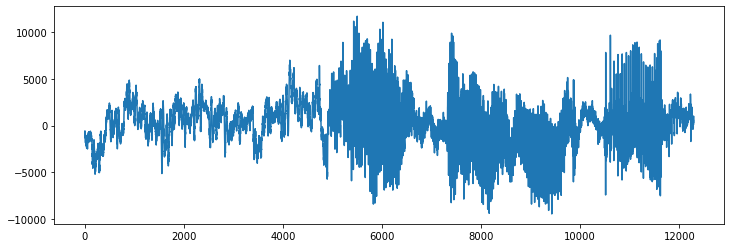

In [7]:

import matplotlib.pyplot as plt

# Original audio with 2 channels 
plt.figure(figsize=(12, 4))
plt.plot(scipy_audio)
plt.show()

In [8]:

mfccs = librosa.feature.mfcc(y=librosa_audio, sr=librosa_sample_rate, n_mfcc=40)
print(mfccs.shape)

(40, 67)


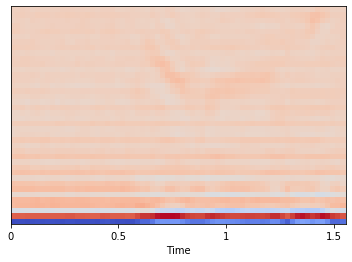

In [9]:
import librosa.display
librosa.display.specshow(mfccs, sr=librosa_sample_rate, x_axis='time')

In [10]:
def extract_features(file_name):
   
    try:
        audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
        mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
#         print(mfccs)
        mfccsscaled = np.mean(mfccs.T,axis=0)
        print(mfccsscaled)
        
    except Exception as e:
        print("Error encountered while parsing file: ", file)
        return None 
     
    return mfccsscaled

In [11]:
import pandas as pd
import os
import librosa

# Set the path to the full UrbanSound dataset 
fulldatasetpath = 'C:/Users/jjaya/Desktop/JAY Tech files/SAMSUNG PRISM/MODULE 5/f/'

metadata = pd.read_csv('C:/Users/jjaya/Desktop/JAY Tech files/SAMSUNG PRISM/MODULE 5/Dataset.csv')

features = []

# Iterate through each sound file and extract the features 
for index, row in metadata.iterrows():
    
    file_name = os.path.join(os.path.abspath(fulldatasetpath),str(row["id"]))
    
    class_label = row["Class"]
    data = extract_features(file_name)
    
    features.append([data, class_label])
    

# Convert into a Panda dataframe 
featuresdf = pd.DataFrame(features, columns=['feature','class_label'])
featuresdf.to_csv("./file.csv", sep=',',index=False)

print('Finished feature extraction from ', len(featuresdf), ' files')

[-3.3050003e+02  1.9235040e+02 -4.7647701e+01  2.6297804e+01
  4.8129108e+01 -2.1633957e+01  1.0852406e+01  1.6581594e+01
 -1.8945078e+01  1.0602497e+01  1.3468608e+01 -1.1956065e+01
  1.0569271e+01  1.2853821e+01 -5.5144773e+00  8.0279064e+00
  5.4916501e+00 -6.8475256e+00  5.0328465e+00  2.0002780e+00
 -6.5212913e+00  3.4202483e+00  2.6597018e+00  6.7512059e-01
  8.8707304e+00  4.1806669e+00  1.5423293e-01  5.1061277e+00
  1.6769036e+00  4.6554446e-01  3.6702573e+00  7.6893288e-01
  2.6576731e+00  5.8193979e+00  2.3730783e+00  3.7779272e+00
  5.7282319e+00  2.9445465e+00  4.3615313e+00  4.4576364e+00]
[-3.0240280e+02  2.0014400e+02 -6.8950737e+01  2.0345549e+01
  4.6681114e+01 -2.9094423e+01  1.1222294e+01  1.7282734e+01
 -2.0921341e+01  1.3839645e+01  1.4264481e+01 -1.3631794e+01
  1.2910197e+01  1.2814718e+01 -7.4575901e+00  8.6839571e+00
  4.8713636e+00 -7.0176702e+00  6.1033463e+00  2.5834131e-01
 -6.7422099e+00  5.6795778e+00  2.2390609e+00  1.3496768e-01
  9.2801704e+00  3.2957

[-3.3272504e+02  1.8467516e+02 -4.8332317e+01  2.9917309e+01
  4.4752625e+01 -2.7966385e+01  1.1444548e+01  1.8781076e+01
 -1.9770672e+01  1.0525941e+01  1.4136932e+01 -1.1451611e+01
  1.1608796e+01  1.2997947e+01 -5.9214377e+00  7.7518759e+00
  4.0635929e+00 -8.0626612e+00  4.9425373e+00  1.2881194e+00
 -7.3166466e+00  2.9115195e+00  1.1933197e+00 -8.8113075e-01
  7.4704733e+00  2.2312908e+00 -1.1314850e+00  4.1473751e+00
 -1.4393125e-01 -9.5124996e-01  2.5880942e+00 -1.2307343e+00
  8.2101560e-01  5.0113173e+00  2.2847941e+00  4.4382753e+00
  6.7387366e+00  4.0989451e+00  5.6015096e+00  5.0662723e+00]
[-3.53764038e+02  1.79913071e+02 -4.67211990e+01  3.16107597e+01
  4.89318199e+01 -2.33185139e+01  1.25153189e+01  2.14741974e+01
 -1.48728476e+01  1.25924816e+01  1.49700298e+01 -1.04258385e+01
  1.14789143e+01  1.32751255e+01 -5.33335686e+00  7.52521467e+00
  4.33550930e+00 -8.08064556e+00  3.91884875e+00  1.51382279e+00
 -5.79785061e+00  4.21325207e+00  1.97526431e+00 -1.05249298e+00

  6.15999937e+00  3.49143362e+00  4.91437578e+00  4.49999046e+00]
[-3.4385147e+02  1.9953625e+02 -5.6428276e+01  3.0032917e+01
  5.0874298e+01 -2.6108620e+01  1.3747934e+01  2.0694561e+01
 -1.8401276e+01  1.3755096e+01  1.4633537e+01 -1.3041898e+01
  1.2179188e+01  1.3308008e+01 -6.2659545e+00  8.0462561e+00
  3.7677629e+00 -7.4675570e+00  6.4349227e+00  1.8737810e+00
 -5.5494494e+00  5.4893999e+00  1.8887594e+00 -8.9199042e-01
  7.0130997e+00  8.3717322e-01 -1.8270947e+00  3.4367027e+00
 -1.6524539e+00 -1.9374790e+00  1.5655446e+00 -2.3723440e+00
  2.1091418e-01  3.3857403e+00 -9.2828281e-02  2.8072553e+00
  4.9703956e+00  2.2025483e+00  4.1593785e+00  3.3099554e+00]
[-3.6521335e+02  1.9423820e+02 -4.0759285e+01  2.9137165e+01
  4.8307755e+01 -2.1328962e+01  1.2198806e+01  2.1594814e+01
 -1.3449618e+01  1.3301127e+01  1.6437048e+01 -8.9101048e+00
  1.2176778e+01  1.5237823e+01 -3.5534537e+00  7.6865029e+00
  5.1090994e+00 -6.6297317e+00  5.5256143e+00  3.3110528e+00
 -5.9385591e+00  2

[-3.2586002e+02  1.9250342e+02 -5.0074032e+01  2.3655361e+01
  4.5592014e+01 -2.3637194e+01  1.0922958e+01  1.9134809e+01
 -1.4791979e+01  1.4422938e+01  1.5943134e+01 -9.5779581e+00
  1.2829423e+01  1.3295752e+01 -6.8627353e+00  5.8641429e+00
  3.3307416e+00 -8.0692949e+00  4.5251894e+00  2.1487875e+00
 -4.9634075e+00  4.9026880e+00  2.1302617e+00 -1.0910194e+00
  6.8641753e+00  2.4781537e+00 -3.6325565e-01  4.8407779e+00
  5.1353723e-01 -4.3989664e-01  3.4541984e+00  5.9242494e-02
  1.3802555e+00  4.5020680e+00  9.1736686e-01  2.1843503e+00
  4.2022223e+00  1.4532833e+00  2.5462682e+00  2.2196860e+00]
[-317.82376     193.64246     -58.549328     21.350111     44.0972
  -26.326464     12.8841715    19.345898    -18.569607     12.427397
   13.592313    -12.865213     12.420739     14.086396     -5.6099567
    8.434184      4.903629     -6.8887134     6.265045      2.088365
   -5.68429       5.58281       3.0801697     0.38310033    9.143784
    4.2572627     0.99466854    5.7845173    

  4.0339041e+00  1.3310928e+00  2.0312924e+00  2.0720737e+00]
[-337.91168     200.90013     -45.181362     21.841007     47.647537
  -19.248947      8.37252      13.000987    -21.015825      9.331507
   16.322708     -7.1904006    12.840953     14.777659     -3.7150598
    7.9535007     5.1200457    -7.3641443     4.1582065     2.088634
   -6.2867804     2.9756544     1.4139365    -1.9371006     6.9641623
    4.3943644     0.55842406    5.6949306     3.2431104     1.8570343
    4.563588      0.7357036     1.5901517     5.8402843     3.4813128
    4.149693      5.7530622     2.6333208     3.3235466     3.9219599 ]
[-318.58        194.93103     -52.583866     20.133532     48.441856
  -17.485966     12.687509     18.061932    -15.083123     14.1542425
   15.041703    -11.208419     11.041746     13.165611     -5.363023
    7.6898003     4.867115     -7.2024865     5.3848696     3.2613468
   -4.9673734     4.1136746     1.8029039    -1.5738726     6.0615373
    1.6761794    -1.7729833    

[-3.3806409e+02  2.1382117e+02 -5.5354671e+01  2.8797932e+01
  5.1775227e+01 -2.5593050e+01  1.3223403e+01  1.9900066e+01
 -1.9479671e+01  1.1796311e+01  1.2397582e+01 -1.3616630e+01
  1.2868321e+01  1.3351256e+01 -6.2486596e+00  9.0048637e+00
  4.5590811e+00 -7.5586615e+00  6.2131286e+00  2.3639767e+00
 -4.6604810e+00  5.6387053e+00  1.3851345e+00 -1.0028737e+00
  7.4250259e+00  1.3802115e+00 -1.4922235e+00  3.4996178e+00
 -1.3631468e+00 -1.6066475e+00  1.3765582e+00 -2.4290068e+00
  8.4245044e-01  4.1830673e+00  2.8554970e-01  2.3869975e+00
  4.0982227e+00  1.6007280e+00  3.5706155e+00  2.7190108e+00]
[-325.55246     209.95293     -73.482346     27.832026     50.256115
  -34.85365      11.947053     18.656746    -23.185268     13.947647
   13.047418    -15.221485     14.03668      11.84684      -8.550886
    9.769694      4.4003773    -6.8656635     7.707907      0.426421
   -6.0527        6.1750374     0.7528531    -0.5395703     8.590453
    1.7106532     0.43656993    5.3103337   

  4.64334440e+00  2.65319610e+00  4.29037571e+00  3.97368526e+00]
[-3.1467960e+02  1.6908586e+02 -3.6819782e+01  2.9623762e+01
  4.4228317e+01 -2.1944721e+01  8.5865479e+00  1.6717709e+01
 -1.6703812e+01  8.5630312e+00  1.3512445e+01 -9.0437851e+00
  1.0834503e+01  1.4221019e+01 -2.9977901e+00  8.6304722e+00
  6.9843793e+00 -5.7148461e+00  4.4062672e+00  3.0169413e+00
 -5.0957589e+00  3.6948404e+00  2.9299469e+00 -7.0178109e-01
  7.0123901e+00  4.4908910e+00  4.8736253e-01  4.5125403e+00
  6.4432919e-01 -1.5706478e+00  2.2511289e+00 -4.3561083e-01
 -1.7046654e-01  3.7305505e+00  1.3622254e+00  2.0013273e+00
  5.2154317e+00  3.8572888e+00  4.5551391e+00  4.9379711e+00]
[-3.0076181e+02  1.6841197e+02 -5.2887062e+01  2.7468647e+01
  4.3555145e+01 -2.7339073e+01  1.1138372e+01  1.9189766e+01
 -1.8393961e+01  1.0359191e+01  1.3554260e+01 -1.1857189e+01
  1.0368799e+01  1.2034021e+01 -6.2328506e+00  8.0185413e+00
  5.6948395e+00 -6.4076357e+00  5.6715951e+00  2.5446208e+00
 -5.4335303e+00  4

  5.36629868e+00  2.95857954e+00  3.36880994e+00  2.79311442e+00]
[-3.2744543e+02  1.9626973e+02 -5.2840458e+01  2.1803070e+01
  4.6841106e+01 -2.2584436e+01  1.0636765e+01  1.7947870e+01
 -1.7590420e+01  1.0842197e+01  1.3062319e+01 -1.2166280e+01
  1.0705085e+01  1.2785580e+01 -6.0712180e+00  7.3015084e+00
  5.2411733e+00 -6.2720189e+00  5.9493752e+00  3.1198838e+00
 -4.6864915e+00  5.1834269e+00  2.9573853e+00 -2.6177883e-01
  7.6472249e+00  3.2115319e+00 -3.7519884e-01  4.3086572e+00
  5.2862693e-02 -1.3376889e+00  1.9150044e+00 -1.3892903e+00
  3.7319043e-01  3.8895810e+00  9.4679487e-01  3.0662894e+00
  5.5299540e+00  2.5096054e+00  3.1672862e+00  2.8708482e+00]
[-3.1992651e+02  1.9769810e+02 -5.8782177e+01  2.1319229e+01
  4.4923431e+01 -2.7560040e+01  1.0138537e+01  1.7856358e+01
 -1.8696684e+01  1.2347791e+01  1.3515404e+01 -1.2934095e+01
  1.1588216e+01  1.2677925e+01 -6.8657155e+00  7.3693714e+00
  4.3662734e+00 -6.8053064e+00  6.1876593e+00  2.1534541e+00
 -5.0102525e+00  5

  6.7619877e+00  3.5084674e+00  4.5486679e+00  4.2804046e+00]
[-3.44056519e+02  1.92787857e+02 -5.44962311e+01  2.83377476e+01
  4.59135704e+01 -2.87979774e+01  1.24705591e+01  2.01131382e+01
 -1.88577824e+01  1.30459175e+01  1.55666409e+01 -1.14115725e+01
  1.22940092e+01  1.32618580e+01 -5.42847729e+00  8.84217262e+00
  3.94468904e+00 -7.93533707e+00  6.07738256e+00  1.79572082e+00
 -6.24707270e+00  4.58224201e+00  1.49456191e+00 -8.99198949e-01
  7.65226984e+00  1.78883588e+00 -6.95217371e-01  5.88913488e+00
  1.44298303e+00  3.08639944e-01  3.60274029e+00 -1.82146847e-01
  2.22356844e+00  5.63134050e+00  2.06591988e+00  4.39159822e+00
  5.99067402e+00  2.25006676e+00  3.81132603e+00  3.33503675e+00]
[-2.8065747e+02  1.9234354e+02 -6.9534798e+01  2.3798208e+01
  4.6903172e+01 -3.0849987e+01  1.2457555e+01  1.9652023e+01
 -2.0035311e+01  1.4419985e+01  1.5217063e+01 -1.2955091e+01
  1.2618046e+01  1.1993596e+01 -7.4191575e+00  9.2167645e+00
  5.2200427e+00 -5.8188386e+00  8.1067886e+

[-3.14634369e+02  1.82431381e+02 -5.15981674e+01  2.18155670e+01
  4.34965401e+01 -2.37832527e+01  1.02033987e+01  1.73338737e+01
 -1.69272308e+01  1.20769024e+01  1.38824282e+01 -1.22256460e+01
  1.01303587e+01  1.30154915e+01 -5.46267128e+00  7.16503382e+00
  5.00621033e+00 -6.16444206e+00  5.89756298e+00  2.78499317e+00
 -5.07402754e+00  5.23048449e+00  3.47966695e+00 -3.23284534e-03
  7.48537350e+00  3.17915297e+00  1.71027586e-01  5.50627470e+00
  1.48155415e+00  4.86201286e-01  4.58303785e+00  9.56735611e-01
  1.33068871e+00  4.31817770e+00  1.53213418e+00  3.49504828e+00
  5.37634468e+00  1.77747452e+00  3.08479714e+00  3.94764686e+00]
[-3.5314880e+02  1.8573729e+02 -3.3078648e+01  2.1453936e+01
  4.3433094e+01 -1.6068253e+01  9.6614265e+00  1.8796686e+01
 -1.2054713e+01  9.1713924e+00  1.3177942e+01 -8.7597580e+00
  9.5583582e+00  1.4360587e+01 -2.7810345e+00  6.1926255e+00
  5.4505634e+00 -6.3503103e+00  3.0870056e+00  3.5330126e+00
 -3.7988114e+00  3.9836974e+00  3.9433064e+0

[-326.30695    179.36021    -40.698784    19.661875    41.669567
  -21.074028     6.0892434   16.846727   -13.189198     9.318288
   12.123409   -10.5781355    9.216612    13.537881    -4.602652
    5.0907207    4.70482     -6.1266932    4.28357      2.908856
   -5.8925943    2.5346947    2.4964085   -1.0320358    6.3631353
    3.2028737   -1.5165046    4.0047784    1.8101866   -1.5061051
    1.2825571   -1.2177601   -1.1075952    3.4041886    2.0346332
    2.4153526    4.9753857    3.1325283    3.7666075    4.5977197]
[-3.3936716e+02  2.0617862e+02 -4.9434792e+01  2.6204405e+01
  4.7133472e+01 -2.5613132e+01  1.1327218e+01  1.9240946e+01
 -1.7687227e+01  1.1402103e+01  1.2161975e+01 -1.3643238e+01
  1.1119908e+01  1.2883804e+01 -6.6976738e+00  6.5571117e+00
  3.3595886e+00 -7.4900117e+00  5.9007826e+00  1.8370038e+00
 -6.7433352e+00  3.1491461e+00  8.6625355e-01 -1.0575360e+00
  7.2525749e+00  1.7744133e+00 -1.1172811e+00  4.6185007e+00
  1.9031288e-01 -9.2786187e-01  2.5063107e+00 -1

[-301.66245     179.16019     -37.857025     25.722408     41.555843
  -22.237198      9.783422     15.869292    -18.147566      8.98741
   12.781639    -11.489827      9.436558     13.241653     -4.7091393
    6.600826      4.7939115    -6.8803782     4.854348      3.7472281
   -4.426051      4.505513      3.8230755     0.99716586    9.083234
    5.653865      1.0919241     5.022934      0.9027931    -1.3925214
    1.9604633    -1.5019784    -1.487468      2.4476094     0.74847096
    2.6094244     6.059434      4.4252863     5.496311      5.943785  ]
[-292.98764     183.44444     -43.58484      22.079845     42.246998
  -20.671968     12.082117     18.655031    -14.718572     13.188462
   15.626424    -10.044074     11.22652      14.810148     -3.8607771
    7.352548      5.5058026    -6.0668435     5.2271414     2.8952787
   -5.382737      4.197472      3.464635      0.70579755    8.713231
    4.3991942    -0.3849799     4.2760243     0.70761883   -1.3744582
    1.9396645    -1.5088

[-3.6117834e+02  2.0928941e+02 -5.3842228e+01  2.9231565e+01
  4.7865444e+01 -2.9632931e+01  1.2342402e+01  2.0285063e+01
 -1.9970860e+01  1.1590007e+01  1.3856700e+01 -1.1791796e+01
  1.3678093e+01  1.4024485e+01 -5.0431066e+00  9.9379091e+00
  5.0393105e+00 -6.9556947e+00  6.9195352e+00  2.4481554e+00
 -5.7741184e+00  4.4213676e+00  1.5591998e+00 -6.0672903e-01
  6.3885012e+00  1.0043987e-01 -1.2742910e+00  5.1085181e+00
  5.3301281e-01 -6.8494722e-02  3.2456250e+00  6.5662190e-02
  2.5922656e+00  5.0703907e+00  1.8040605e+00  4.3262992e+00
  5.1528988e+00  1.6862485e+00  3.3491116e+00  2.7245367e+00]
[-3.49679413e+02  2.03271408e+02 -4.55177956e+01  2.09996548e+01
  4.75806465e+01 -2.04726448e+01  8.63369656e+00  1.97840176e+01
 -1.19030390e+01  1.22971048e+01  1.33100605e+01 -1.08015938e+01
  1.05565815e+01  1.29668245e+01 -5.69689322e+00  5.97443819e+00
  3.31878686e+00 -9.28978920e+00  2.87434554e+00  2.15225863e+00
 -6.42594337e+00  2.31053162e+00  2.13450456e+00 -8.14137518e-01

  2.1912520e+00 -1.0577080e+00  1.4836718e+00  3.4306514e-01]
[-2.4891583e+02  2.0193338e+02 -5.9595695e+01  3.4554195e+01
  5.5316036e+01 -2.4962919e+01  1.7014582e+01  2.1460005e+01
 -2.0844423e+01  1.2549696e+01  1.3218351e+01 -1.3935768e+01
  1.1520068e+01  9.5982914e+00 -8.0227642e+00  1.1384603e+01
  6.7221122e+00 -5.3027420e+00  9.5956793e+00  3.8126423e+00
 -4.6615419e+00  5.6754293e+00  4.9305096e-01 -2.7819340e+00
  4.4509902e+00 -1.5900725e+00 -1.4804063e+00  4.5384541e+00
 -1.5075269e+00 -1.6695519e-01  4.3568616e+00 -8.0529183e-01
  1.0984045e+00  3.6164773e+00 -7.3190290e-01  1.4255714e+00
  2.1111760e+00 -1.2628937e+00  1.3709940e+00  9.1946113e-01]
[-2.59046509e+02  1.83598953e+02 -4.33159676e+01  3.66636162e+01
  5.40316124e+01 -1.75367546e+01  1.74970627e+01  2.24275990e+01
 -1.50291910e+01  1.27282600e+01  1.31943274e+01 -1.18039055e+01
  1.09045477e+01  1.10927048e+01 -5.90931225e+00  1.02466288e+01
  6.98922920e+00 -5.86379480e+00  6.29002094e+00  3.36506915e+00
 -

[-2.7479605e+02  1.9658006e+02 -6.0280148e+01  2.9532021e+01
  5.1347385e+01 -2.4038185e+01  1.7093880e+01  2.0269337e+01
 -2.0744507e+01  1.3114734e+01  1.4091755e+01 -1.2492598e+01
  1.3423259e+01  1.1690878e+01 -7.2419133e+00  1.1518753e+01
  7.9710994e+00 -4.6723933e+00  9.0138121e+00  4.6419353e+00
 -2.2907553e+00  7.4937024e+00  9.9655324e-01 -2.6219718e+00
  5.5898499e+00 -4.6684009e-01 -1.7616994e+00  4.4747701e+00
 -6.6962254e-01 -1.4251578e-01  3.8531439e+00 -8.4381920e-01
  8.3084232e-01  3.0317292e+00 -1.0628933e+00  1.4863856e+00
  2.6531498e+00 -8.2118756e-01  1.1818272e+00  6.7916560e-01]
[-2.8294348e+02  1.9207439e+02 -5.7731125e+01  2.8584375e+01
  4.9493671e+01 -2.4746790e+01  1.4528401e+01  1.8672886e+01
 -2.0433886e+01  1.2420649e+01  1.3205778e+01 -1.3127424e+01
  1.2631500e+01  1.1764274e+01 -7.8713398e+00  9.4987450e+00
  7.0962272e+00 -4.5753760e+00  8.6256800e+00  3.9666305e+00
 -3.3679156e+00  6.7530985e+00  1.2326567e+00 -2.5760586e+00
  5.6407127e+00  2.1578

[-2.15316650e+02  2.22122711e+02 -8.65428238e+01  1.17680140e+01
  4.91682434e+01 -2.66763611e+01  1.59475155e+01  1.83436203e+01
 -2.07994671e+01  1.74309425e+01  1.32396927e+01 -1.59033699e+01
  1.42431116e+01  1.10205784e+01 -9.30885696e+00  1.13510571e+01
  7.26335049e+00 -4.49873018e+00  9.63760948e+00  2.70703459e+00
 -4.13154125e+00  6.22094154e+00 -2.72570044e-01 -1.37079382e+00
  6.91552877e+00 -5.20764828e-01 -4.88961861e-02  6.45113516e+00
  4.00873035e-01  1.67862904e+00  4.81963110e+00 -5.27400672e-01
  1.98101604e+00  3.64701676e+00 -2.99753305e-02  3.12334514e+00
  2.24422884e+00 -1.89730608e+00  1.11539042e+00  5.22561431e-01]
[-2.3823056e+02  2.0649225e+02 -7.7813324e+01  2.2240038e+01
  4.9486195e+01 -2.8857979e+01  1.7109596e+01  2.0787905e+01
 -2.1182951e+01  1.5006025e+01  1.2697050e+01 -1.5214369e+01
  1.4137041e+01  1.1389451e+01 -8.1554155e+00  1.2187624e+01
  7.6636100e+00 -4.4726748e+00  9.7784195e+00  3.4248006e+00
 -3.1599410e+00  7.6587782e+00  1.6125149e+0

[-2.71869751e+02  1.86025955e+02 -4.97998886e+01  3.16082039e+01
  4.88673592e+01 -2.30067177e+01  1.55999632e+01  2.03107414e+01
 -1.84977684e+01  1.19725094e+01  1.36167555e+01 -1.16083746e+01
  1.22375317e+01  1.15157614e+01 -6.82188034e+00  1.05165186e+01
  8.12385368e+00 -4.50761747e+00  8.06916332e+00  4.50939798e+00
 -3.22665930e+00  6.01890707e+00  1.38722384e+00 -2.42849803e+00
  5.12192917e+00  1.63752083e-02 -1.56001508e+00  4.67234898e+00
  1.83068961e-01  3.40600009e-03  4.10940647e+00  2.32443456e-02
  1.23934901e+00  3.82019734e+00 -1.97997302e-01  1.09329188e+00
  1.80299640e+00 -1.76570070e+00  5.36133409e-01  9.58805442e-01]
[-2.81427856e+02  1.94368362e+02 -5.09467735e+01  3.39699707e+01
  5.53132477e+01 -1.92255917e+01  1.62285633e+01  1.93684769e+01
 -1.92627220e+01  1.26272316e+01  1.42416229e+01 -1.17218628e+01
  1.20038738e+01  1.11715069e+01 -6.36009312e+00  1.22650175e+01
  9.56427097e+00 -4.31268883e+00  7.98349380e+00  5.22950792e+00
 -2.37672877e+00  5.5091

[-2.1927229e+02  1.9517058e+02 -6.8366814e+01  2.1279642e+01
  4.8286026e+01 -2.8169191e+01  8.8767490e+00  1.7070690e+01
 -1.8405643e+01  1.2622493e+01  1.1047309e+01 -1.4839916e+01
  1.0999683e+01  9.6836758e+00 -8.6211700e+00  9.7494173e+00
  6.4612803e+00 -5.9975514e+00  7.4925065e+00  4.0604544e+00
 -2.2362766e+00  6.9382653e+00  2.9517362e-01 -2.7182043e+00
  6.1430197e+00  6.5324289e-01 -3.8576934e-01  5.7211299e+00
  4.0158346e-01  1.1393148e+00  5.2930393e+00  7.3437467e-02
  1.4723103e+00  3.9501622e+00 -4.9283549e-01  1.4124889e+00
  2.4383216e+00 -7.7199173e-01  2.0229521e+00  2.0003572e+00]
[-2.5289474e+02  1.8365044e+02 -4.4672680e+01  3.0895082e+01
  5.1116257e+01 -1.8950520e+01  1.1527418e+01  1.6127731e+01
 -1.8942110e+01  1.0106620e+01  1.3944705e+01 -9.5360956e+00
  1.1139533e+01  1.0800583e+01 -5.6524429e+00  1.1033068e+01
  8.6884212e+00 -4.5839710e+00  7.5052881e+00  5.5261259e+00
 -2.7749784e+00  4.9761462e+00  1.2497203e+00 -1.8415420e+00
  6.1017184e+00  1.4447

[-2.9426505e+02  2.0009366e+02 -4.6338268e+01  2.8853004e+01
  4.5903584e+01 -2.5129894e+01  1.2667533e+01  1.6840786e+01
 -2.2036890e+01  8.2413130e+00  1.1123118e+01 -1.2605072e+01
  1.0901923e+01  9.8710423e+00 -8.0985918e+00  9.0411148e+00
  6.9892821e+00 -4.9401698e+00  7.2553368e+00  3.4373496e+00
 -4.1434798e+00  4.7095647e+00  5.2826535e-02 -3.5188715e+00
  3.8815148e+00 -7.9717463e-01 -1.8805754e+00  4.1237483e+00
 -3.0249166e-01 -4.2979208e-01  3.3222837e+00 -3.8775164e-01
  1.5173780e+00  4.2007923e+00  3.4051436e-01  2.0423048e+00
  2.8376508e+00 -1.5019783e+00 -5.0686473e-01 -2.6934880e-01]
[-263.6476      214.82892     -63.04125      23.906675     47.365932
  -27.641973     15.74543      18.020885    -24.776134     10.644682
   12.783774    -12.984778     14.706434     13.206475     -6.497961
   11.421477      7.157144     -4.6657386     9.432385      3.768785
   -3.4147494     7.108177      0.8408273    -2.5203695     5.949892
    0.35266373   -0.58552134    4.793895    

[-2.50970856e+02  1.99566147e+02 -5.97571945e+01  2.95406609e+01
  5.05559578e+01 -2.58768997e+01  1.51249285e+01  1.82086639e+01
 -2.25076256e+01  1.19946270e+01  1.24730673e+01 -1.47534542e+01
  1.19186878e+01  1.13921795e+01 -6.94040108e+00  1.16996288e+01
  7.90182209e+00 -4.34814930e+00  9.45537853e+00  4.08581448e+00
 -3.51694441e+00  6.79459715e+00  1.00663185e+00 -2.40453362e+00
  5.78494072e+00 -2.16119029e-02 -1.01189494e+00  4.85879946e+00
 -6.10498905e-01  6.83456361e-01  5.39136267e+00  2.02079356e-01
  1.24551642e+00  3.64040065e+00 -1.74203023e-01  1.82202470e+00
  2.10403514e+00 -1.31491089e+00  1.57697332e+00  1.50714505e+00]
[-2.6501376e+02  1.9243938e+02 -5.4623009e+01  2.9703568e+01
  4.9167717e+01 -2.5423120e+01  1.2844093e+01  1.7158653e+01
 -2.1855797e+01  9.9609213e+00  1.0841463e+01 -1.4761933e+01
  1.1260339e+01  1.1130978e+01 -7.6756644e+00  1.0186973e+01
  7.9827046e+00 -4.3188071e+00  8.4649420e+00  4.0579395e+00
 -3.7303369e+00  5.9978967e+00  9.4295305e-0

[-2.9301059e+02  1.9141647e+02 -5.0022686e+01  3.2837608e+01
  5.1529881e+01 -2.0935089e+01  1.6615776e+01  1.8779329e+01
 -2.0472664e+01  1.2276972e+01  1.4277902e+01 -1.1740073e+01
  1.2003023e+01  1.0736065e+01 -7.0057411e+00  1.1740168e+01
  8.6086340e+00 -4.9598355e+00  8.5369902e+00  5.5424619e+00
 -2.6651564e+00  6.2594013e+00  1.7074659e+00 -1.6545023e+00
  6.0715327e+00  5.2194828e-01 -1.1177584e+00  5.3752337e+00
  5.4746145e-01 -6.2304590e-02  4.2402596e+00  5.0547051e-01
  1.6159846e+00  3.7218399e+00 -5.4235882e-01  1.0242893e+00
  2.0170467e+00 -1.6711426e+00  5.6522268e-01  1.3194675e+00]
[-2.7177451e+02  1.9649800e+02 -5.3110767e+01  2.5763039e+01
  5.0834961e+01 -1.7681017e+01  1.7037901e+01  1.9789831e+01
 -1.8508219e+01  1.0981531e+01  1.2539688e+01 -1.1199825e+01
  1.2968642e+01  1.2082429e+01 -6.3931136e+00  1.0067207e+01
  7.3475819e+00 -5.2730794e+00  6.9890285e+00  4.4345708e+00
 -2.4168465e+00  5.3966222e+00 -2.3632407e-01 -3.2987883e+00
  4.5970044e+00 -5.7823

[-2.6833179e+02  1.6834283e+02 -3.8481075e+01  2.6897615e+01
  5.1107647e+01 -1.0410406e+01  1.1531865e+01  1.5882598e+01
 -1.4575655e+01  9.6930094e+00  1.3307901e+01 -8.7935266e+00
  9.7851543e+00  1.2738681e+01 -3.4418011e+00  8.9305210e+00
  8.8906107e+00 -2.9951274e+00  6.2774663e+00  4.8455596e+00
 -3.7193151e+00  3.1845019e+00  1.3113046e+00 -3.2675128e+00
  2.7008915e+00 -4.8372388e-01 -3.5376368e+00  2.0792754e+00
 -3.6242256e-01 -2.0014832e+00  1.9160151e+00 -7.9490614e-01
 -8.9786285e-01  2.6473827e+00 -3.3242531e-02 -1.5337032e-01
  1.7047181e+00 -1.1863337e+00 -9.0713614e-01  2.7002975e-01]
[-2.7439700e+02  1.7834125e+02 -3.5362007e+01  2.9782707e+01
  5.3801624e+01 -8.5088577e+00  1.2965235e+01  1.4911355e+01
 -1.6035339e+01  1.0137952e+01  1.3343928e+01 -9.5025072e+00
  9.6435137e+00  1.2430529e+01 -3.1729295e+00  9.7985296e+00
  8.1542511e+00 -4.3082852e+00  6.3938103e+00  5.6332846e+00
 -2.6324253e+00  4.4976363e+00  2.1455438e+00 -2.7224729e+00
  2.8171632e+00 -8.6756

  1.8037200e+00 -2.0962410e+00  1.0915110e+00  1.7088832e-01]
[-2.8020627e+02  1.9819716e+02 -5.4010139e+01  2.8849298e+01
  5.3060596e+01 -1.8911337e+01  1.6249805e+01  1.9282537e+01
 -1.8174738e+01  1.3050226e+01  1.2789755e+01 -1.2885767e+01
  1.2338150e+01  1.1873383e+01 -6.7072310e+00  9.9773521e+00
  6.9768066e+00 -4.5123358e+00  9.1529799e+00  5.9735947e+00
 -8.1405842e-01  8.0744276e+00  2.0355134e+00 -2.0050924e+00
  5.1451783e+00 -4.6423331e-01 -1.3363092e+00  4.8679047e+00
 -3.3867842e-01 -1.0285214e-01  4.3615932e+00 -2.2306629e-01
  3.8962039e-01  2.6518569e+00 -8.1036234e-01  1.3214988e+00
  2.2435737e+00 -1.1533533e+00  1.0596778e+00  1.0372708e+00]
[-2.7336829e+02  1.9549551e+02 -6.3209496e+01  3.0326252e+01
  5.1735634e+01 -2.5338322e+01  1.7545689e+01  2.0613544e+01
 -2.2014669e+01  1.1953982e+01  1.3190680e+01 -1.2879849e+01
  1.3545197e+01  1.1293830e+01 -7.3979263e+00  1.1547132e+01
  6.9694490e+00 -5.4013720e+00  9.5597868e+00  5.6717815e+00
 -1.0656831e+00  8.259

[-2.9946570e+02  1.9518723e+02 -4.7815655e+01  3.4232792e+01
  5.1690369e+01 -2.2802658e+01  1.3321381e+01  1.6667368e+01
 -2.0499168e+01  1.1391528e+01  1.1781802e+01 -1.3061181e+01
  1.2224702e+01  1.1690655e+01 -5.7172279e+00  1.1751996e+01
  8.3362761e+00 -3.5969248e+00  9.2916307e+00  4.9834671e+00
 -2.4419246e+00  6.3928308e+00  1.3488759e+00 -1.2892468e+00
  6.0488853e+00  2.2152992e-01 -5.1338363e-01  5.4282665e+00
  2.0071879e-01  7.2101831e-01  4.7959476e+00  1.5646411e-01
  1.4179988e+00  3.7094419e+00 -1.0166191e-02  2.1638227e+00
  2.8709593e+00 -8.0241436e-01  1.3917571e+00  1.4623740e+00]
[-2.72027924e+02  1.96661514e+02 -5.18227654e+01  2.52333508e+01
  4.57642212e+01 -2.30616627e+01  1.58206348e+01  1.96964893e+01
 -1.96969814e+01  1.05972805e+01  1.25468073e+01 -1.16936893e+01
  1.34532862e+01  1.36876249e+01 -4.78460455e+00  1.12610569e+01
  8.16233253e+00 -3.69347787e+00  9.22191715e+00  4.61941147e+00
 -3.79491901e+00  5.99238873e+00  1.78131282e+00 -2.32763124e+00

[-2.6403354e+02  2.0815147e+02 -6.8945610e+01  3.3539047e+01
  5.6288528e+01 -2.8703861e+01  1.3863795e+01  1.7523075e+01
 -2.3196266e+01  1.3616913e+01  1.1876457e+01 -1.5005431e+01
  1.3726712e+01  9.9139156e+00 -9.0727768e+00  1.0785883e+01
  5.2182364e+00 -5.8025928e+00  9.1917334e+00  2.3712747e+00
 -3.7063987e+00  7.2140627e+00  2.0158240e-01 -1.7980354e+00
  5.9470668e+00 -1.0566729e+00 -7.7154167e-02  5.4645181e+00
 -1.5284363e+00  4.3082187e-01  4.2138162e+00 -1.1447024e+00
  1.9007632e+00  4.0149136e+00  2.8164512e-01  3.7133482e+00
  3.0006196e+00 -1.1814780e+00  2.0206461e+00  9.3267804e-01]
[-2.83743713e+02  2.01977051e+02 -6.38373718e+01  3.30539818e+01
  5.39419289e+01 -2.68141232e+01  1.63221149e+01  1.92184906e+01
 -2.30267467e+01  1.27695189e+01  1.26821280e+01 -1.49566174e+01
  1.24324465e+01  1.08680105e+01 -7.53796530e+00  1.12425251e+01
  6.16769123e+00 -5.44976997e+00  9.24211788e+00  3.35228324e+00
 -3.84715533e+00  6.24946404e+00 -2.46028945e-01 -3.03632379e+00

[-2.8829602e+02  2.0202783e+02 -5.6461437e+01  3.4806416e+01
  5.0346458e+01 -2.9308609e+01  1.6025982e+01  2.1060303e+01
 -2.1712194e+01  1.1741573e+01  1.2130182e+01 -1.4467086e+01
  1.2617693e+01  1.1419896e+01 -6.8823290e+00  1.1797207e+01
  7.1885252e+00 -5.0969858e+00  8.8515072e+00  3.5581810e+00
 -3.3264461e+00  6.7061667e+00  2.1562411e-01 -2.7016244e+00
  5.4678841e+00 -7.9461956e-01 -1.0285083e+00  5.7035365e+00
  9.5098324e-02  2.0681669e-01  3.7496996e+00 -5.7605827e-01
  1.8449609e+00  3.6582878e+00 -9.2260259e-01  1.3736901e+00
  1.8616850e+00 -1.3386638e+00  1.7484163e+00  1.3023257e+00]
[-2.84885620e+02  1.77469406e+02 -4.96397743e+01  3.18170643e+01
  4.75918694e+01 -2.39347649e+01  1.48701935e+01  2.00163841e+01
 -1.95495834e+01  9.91446590e+00  1.26448584e+01 -1.22980204e+01
  1.08089228e+01  1.09421015e+01 -7.07710266e+00  9.52143002e+00
  7.59465122e+00 -4.53630590e+00  7.89249563e+00  4.53456450e+00
 -3.18569946e+00  6.10699940e+00  1.64524710e+00 -2.71737838e+00

[-2.6647305e+02  1.8644569e+02 -5.3689430e+01  2.9618221e+01
  5.2314911e+01 -2.0937738e+01  1.1328741e+01  1.5396318e+01
 -1.9641687e+01  1.0928929e+01  1.0750965e+01 -1.3947588e+01
  1.0875026e+01  1.0499701e+01 -7.2056241e+00  1.0674699e+01
  8.9822006e+00 -3.2372651e+00  8.7053995e+00  5.3425426e+00
 -1.4321461e+00  7.1175218e+00  1.5188599e+00 -1.7124909e+00
  6.2539363e+00  6.3268161e-01 -1.5184408e+00  4.3086662e+00
 -7.7238105e-02  3.3118588e-01  4.8928542e+00  8.4164411e-01
  1.5981276e+00  3.9470694e+00  4.4263792e-01  1.9184089e+00
  2.2386818e+00 -1.4702836e+00  7.3009109e-01  1.2299801e+00]
[-2.93611389e+02  1.80131470e+02 -3.43234634e+01  3.21123505e+01
  5.26469231e+01 -1.27997704e+01  1.06905727e+01  1.48868904e+01
 -1.59395733e+01  7.75335503e+00  8.33620262e+00 -1.19246836e+01
  1.02021227e+01  1.06954565e+01 -6.32177591e+00  8.86726856e+00
  8.58210373e+00 -4.20447969e+00  5.66166973e+00  4.87646008e+00
 -2.28359222e+00  4.33586979e+00  6.38089299e-01 -3.54009366e+00

[-2.7192154e+02  2.1183257e+02 -5.9794334e+01  3.6437977e+01
  5.5989296e+01 -2.7774597e+01  1.3330969e+01  1.6567387e+01
 -2.3413952e+01  1.3444598e+01  1.2800879e+01 -1.3849561e+01
  1.4001938e+01  1.0378129e+01 -7.7961516e+00  1.3579608e+01
  8.2113142e+00 -5.3071938e+00  9.5980997e+00  4.9173417e+00
 -2.0485902e+00  7.4318838e+00  9.4271123e-01 -8.2559073e-01
  7.1156836e+00 -7.8220084e-02 -3.4476310e-01  5.1794066e+00
 -1.2378706e+00  5.6050140e-01  4.8277025e+00 -4.8161975e-01
  1.7132337e+00  3.8301361e+00 -5.3621358e-01  1.3864151e+00
  8.5281926e-01 -2.5942912e+00  4.4431430e-01 -4.9403906e-01]
[-2.7953400e+02  2.0561826e+02 -4.6814293e+01  2.8401844e+01
  5.5811554e+01 -1.6905334e+01  7.2622805e+00  1.0844538e+01
 -2.0960735e+01  7.6758757e+00  8.9750652e+00 -1.0825412e+01
  1.4389303e+01  1.2956909e+01 -4.2656999e+00  1.3623383e+01
  1.1117569e+01 -2.7568245e+00  8.2579937e+00  5.3207378e+00
 -2.0277498e+00  6.5986490e+00  2.7923677e+00 -9.0468693e-01
  5.4879599e+00  8.7950

[-2.5061159e+02  1.8393878e+02 -4.1270714e+01  2.7757893e+01
  4.9574013e+01 -1.5990547e+01  1.2114028e+01  1.6843481e+01
 -1.6070129e+01  1.0711150e+01  1.2082016e+01 -1.2034619e+01
  9.5875406e+00  1.1246221e+01 -6.6333580e+00  7.9551239e+00
  7.3753300e+00 -5.2734914e+00  5.4112506e+00  3.9034352e+00
 -3.8854442e+00  3.7964780e+00  1.0498159e-01 -4.2620449e+00
  3.3866174e+00 -9.8669976e-02 -2.8188310e+00  3.3080285e+00
  2.1899247e-01 -1.0064203e+00  3.1119196e+00 -3.0167624e-01
 -3.1501314e-01  2.8106046e+00 -3.4040433e-01  2.9979894e-01
  2.1394260e+00 -1.0861542e+00 -3.4807345e-01  6.4470023e-01]
[-2.57787598e+02  2.04116043e+02 -6.30048714e+01  2.53338184e+01
  5.00714073e+01 -2.60939960e+01  1.25699100e+01  1.61754837e+01
 -2.22722588e+01  1.30152426e+01  1.33467598e+01 -1.41219578e+01
  1.22104559e+01  1.14402285e+01 -7.27275085e+00  1.12179565e+01
  7.83456278e+00 -4.48717546e+00  8.85822105e+00  4.07905436e+00
 -2.46396327e+00  7.92046738e+00  1.83953273e+00 -1.25577617e+00

[-2.5995822e+02  1.9636089e+02 -5.2305397e+01  3.2580555e+01
  5.1800400e+01 -2.2685139e+01  1.5950793e+01  1.9319754e+01
 -2.0061779e+01  1.2058895e+01  1.3205311e+01 -1.2037886e+01
  1.2792439e+01  1.2138162e+01 -4.6724124e+00  1.2694055e+01
  7.9859538e+00 -3.9782054e+00  9.3092203e+00  4.3391862e+00
 -2.4396524e+00  7.8494797e+00  2.2341969e+00 -1.8056649e+00
  5.1292772e+00 -5.1495516e-01 -1.1866881e+00  4.3431921e+00
 -1.0055090e+00  2.2352016e-02  4.0397320e+00 -8.4765583e-01
  8.7483078e-01  3.2189279e+00 -1.1082187e+00  9.7964805e-01
  2.1895874e+00 -1.2204481e+00  5.3404182e-01  2.0079519e-01]
[-2.44582703e+02  2.01165924e+02 -6.47257690e+01  3.18309841e+01
  4.99096947e+01 -3.04183521e+01  1.61905899e+01  1.86504688e+01
 -2.52823772e+01  1.19255819e+01  1.33290806e+01 -1.38183975e+01
  1.36703854e+01  1.12660265e+01 -6.91116524e+00  1.25806036e+01
  6.10879517e+00 -6.43309498e+00  9.19292068e+00  3.74291539e+00
 -2.95279288e+00  8.08925343e+00  1.60371685e+00 -1.24550557e+00

  1.6590112e+00 -1.7582456e+00  2.1773469e-01  5.2328259e-01]
[-2.6885049e+02  2.1198424e+02 -6.2948570e+01  2.9815197e+01
  4.8914993e+01 -3.2248318e+01  1.1346975e+01  1.4549129e+01
 -2.5234499e+01  1.3421178e+01  1.3174196e+01 -1.4665934e+01
  1.4062765e+01  1.2240811e+01 -7.3377295e+00  1.1818249e+01
  7.3617678e+00 -4.5283036e+00  9.5232534e+00  3.0536678e+00
 -3.9763300e+00  6.6148849e+00  2.3333672e-01 -2.0508747e+00
  6.2168860e+00 -5.9132785e-01 -8.2806325e-01  5.1360307e+00
 -1.0447961e+00  5.9148592e-01  5.1461277e+00 -1.1828603e-02
  1.6380534e+00  3.4512630e+00 -3.7731910e-01  2.3535728e+00
  2.0479484e+00 -1.5111547e+00  1.8558207e+00  1.1085075e+00]
[-4.1484149e+02  1.8631303e+02 -6.4841698e+01  3.7377613e+01
  5.4051525e+01 -2.6929537e+01  2.1647707e+01  2.6378361e+01
 -1.8485744e+01  1.7248903e+01  1.8069620e+01 -1.2784970e+01
  1.1269408e+01  9.8747244e+00 -8.2773972e+00  9.6803837e+00
  4.4732060e+00 -6.6506987e+00  8.6416426e+00  3.2177896e+00
 -3.2388606e+00  7.924

  2.7426789e+00 -2.5253665e-01  1.2907412e+00  1.3942080e+00]
[-3.6173596e+02  1.8445735e+02 -6.1171352e+01  3.1590891e+01
  5.0299416e+01 -2.5927113e+01  1.7266127e+01  2.1832945e+01
 -1.9581745e+01  1.3319003e+01  1.3160674e+01 -1.5165534e+01
  1.0160240e+01  1.0053589e+01 -8.1703444e+00  9.1302824e+00
  5.4529390e+00 -5.2835059e+00  8.9338894e+00  3.2353044e+00
 -4.0620437e+00  7.0759921e+00  1.6259131e+00 -2.3061759e+00
  5.5256763e+00 -2.3729324e-01 -1.5627707e+00  4.1983943e+00
 -8.0671966e-01  3.3279774e-01  4.5270152e+00 -1.6145946e-01
  1.7763656e+00  4.0009260e+00 -5.9131145e-01  1.4221950e+00
  2.2432001e+00 -1.2728255e+00  1.1586721e+00  9.4352621e-01]
[-4.0780176e+02  1.7581796e+02 -2.6384468e+01  3.3714882e+01
  5.0675797e+01 -1.0734492e+01  1.3983692e+01  1.8484344e+01
 -1.3160757e+01  9.2800856e+00  1.0885719e+01 -1.1664795e+01
  7.5229897e+00  1.0717492e+01 -6.3052015e+00  4.1666293e+00
  3.5267186e+00 -6.5536714e+00  4.2452917e+00  3.2397068e+00
 -4.0915093e+00  4.271

[-3.46418793e+02  1.95417892e+02 -5.88444633e+01  3.05297394e+01
  5.16243095e+01 -2.41621037e+01  1.59210358e+01  1.92411423e+01
 -1.98452129e+01  1.57605095e+01  1.66134262e+01 -1.22486982e+01
  1.17851696e+01  1.06166000e+01 -7.83381748e+00  9.71655464e+00
  5.91407108e+00 -5.57561350e+00  8.10101223e+00  2.89420795e+00
 -3.42168474e+00  7.93815947e+00  1.97758329e+00 -1.96188414e+00
  6.49000740e+00  1.01528037e+00 -5.60759664e-01  4.59078836e+00
 -1.10677040e+00 -1.39825074e-02  4.38337851e+00 -8.97755206e-01
  3.55716914e-01  2.56363702e+00 -2.02097154e+00 -3.57553288e-02
  7.91097283e-01 -3.23282909e+00 -1.14821935e+00 -8.08810413e-01]
[-3.51336517e+02  1.96755707e+02 -5.37338791e+01  2.98031998e+01
  5.44002838e+01 -1.78891411e+01  1.75479393e+01  2.18510151e+01
 -1.53361883e+01  1.57452135e+01  1.52263622e+01 -1.21516619e+01
  1.21138592e+01  1.22443399e+01 -7.11663151e+00  8.34156799e+00
  5.87932873e+00 -5.16070795e+00  7.33848858e+00  2.64005828e+00
 -3.87465405e+00  6.8915

[-3.63622284e+02  1.93427628e+02 -6.17829819e+01  3.44851418e+01
  5.30372467e+01 -2.61819286e+01  1.89335842e+01  2.30591793e+01
 -1.91295357e+01  1.66260853e+01  1.63303814e+01 -1.40622768e+01
  1.10324860e+01  1.04394264e+01 -7.23632336e+00  1.10287485e+01
  5.87914419e+00 -5.74154806e+00  9.05832958e+00  3.19853497e+00
 -3.95486188e+00  7.10204506e+00  7.84855008e-01 -2.67926836e+00
  6.12936449e+00  6.48312032e-01 -4.14981365e-01  4.85879326e+00
 -6.75426066e-01  1.08001161e+00  5.46776581e+00  2.61505246e-01
  1.78034914e+00  3.60554266e+00 -6.62237942e-01  1.62937832e+00
  1.56157947e+00 -2.22693372e+00  7.61272430e-01  3.64028007e-01]
[-3.6306747e+02  2.0521049e+02 -6.8628502e+01  2.7674397e+01
  5.2711395e+01 -2.5811026e+01  1.6113773e+01  1.9653734e+01
 -2.0963909e+01  1.4928600e+01  1.3762036e+01 -1.6145529e+01
  1.0489791e+01  1.0251084e+01 -8.4191399e+00  9.2755537e+00
  4.5859070e+00 -6.4830036e+00  8.2592516e+00  2.2410407e+00
 -4.7190499e+00  6.6714897e+00  7.1289468e-0

  1.8469282e+00 -1.4896694e+00  1.4602051e+00  1.6721878e+00]
[-3.6506982e+02  1.7507912e+02 -3.6475780e+01  3.0661007e+01
  4.8951031e+01 -1.5409015e+01  1.2379303e+01  1.6312492e+01
 -1.5938950e+01  1.2595518e+01  1.6174652e+01 -8.9412823e+00
  1.0135617e+01  1.2437086e+01 -4.9917512e+00  7.8517141e+00
  7.3017478e+00 -4.2999949e+00  5.9124923e+00  3.8922114e+00
 -2.9749157e+00  6.6870766e+00  3.5772445e+00 -2.4209235e+00
  5.0947304e+00  2.7425339e+00 -1.4541702e+00  2.7834640e+00
 -1.5870869e-01 -1.5054291e+00  2.4827735e+00 -1.2268997e-01
 -2.5628057e-01  2.1822722e+00 -9.0222925e-01 -2.7009562e-01
  1.2337016e+00 -2.2550373e+00 -1.6474715e+00 -5.8268267e-01]
[-3.6200153e+02  1.7718018e+02 -4.4772911e+01  2.8710821e+01
  4.6475277e+01 -1.9673449e+01  1.4734236e+01  1.8458836e+01
 -1.7718237e+01  1.2926341e+01  1.6630676e+01 -1.0340959e+01
  9.1232595e+00  1.0615025e+01 -6.5489583e+00  7.8814278e+00
  6.4334927e+00 -5.0124726e+00  6.5800185e+00  4.0162249e+00
 -2.5348482e+00  7.661

[-3.6918015e+02  2.0186060e+02 -5.9358253e+01  3.5655575e+01
  5.6904213e+01 -2.3669769e+01  1.7585024e+01  2.2285204e+01
 -1.8458706e+01  1.6373770e+01  1.6798407e+01 -1.1649313e+01
  1.3803989e+01  1.2296108e+01 -7.0598803e+00  9.9327488e+00
  4.5602474e+00 -7.4403181e+00  7.1798668e+00  1.5442282e+00
 -5.8223076e+00  5.8916187e+00  1.0647056e+00 -2.1893475e+00
  6.0866051e+00  3.7011796e-01 -8.1340241e-01  4.7682242e+00
 -7.7798194e-01  2.2835253e-01  4.4479795e+00 -5.6595898e-01
  1.0198131e+00  3.4329984e+00 -7.2451323e-01  9.0653360e-01
  9.7195250e-01 -2.5867548e+00 -2.3611787e-01 -8.4260195e-01]
[-3.8690234e+02  1.8781776e+02 -4.2612331e+01  2.6690716e+01
  5.3500301e+01 -9.2122545e+00  1.7091614e+01  1.9936481e+01
 -1.2235471e+01  1.5566322e+01  1.6593843e+01 -8.6957169e+00
  1.2092364e+01  1.4013427e+01 -4.2812066e+00  7.7893987e+00
  5.7052093e+00 -5.6227002e+00  5.5337696e+00  2.3240135e+00
 -5.6867671e+00  3.9986331e+00  1.0939140e+00 -4.5022430e+00
  2.5847521e+00 -3.0899

[-3.71754639e+02  1.74172012e+02 -3.27682343e+01  3.69320030e+01
  5.09903259e+01 -1.58556910e+01  1.53684378e+01  2.02940922e+01
 -1.46345453e+01  1.24463234e+01  1.51506948e+01 -1.09363861e+01
  8.07426071e+00  1.07424383e+01 -5.81702709e+00  7.39852619e+00
  5.88568687e+00 -5.53595543e+00  6.02652168e+00  3.68566465e+00
 -4.31292057e+00  5.27715826e+00  2.42621684e+00 -3.82440567e+00
  2.62534308e+00 -6.94526911e-01 -4.01558971e+00  2.05235505e+00
  4.78215404e-02 -9.92652178e-01  2.87973166e+00 -2.00062916e-01
 -9.53801870e-02  3.05788112e+00  1.16974585e-01  8.05569768e-01
  2.65250063e+00 -8.34798813e-01 -4.92606401e-01  4.28769529e-01]
[-3.67990967e+02  1.78123657e+02 -4.45593376e+01  3.21960602e+01
  5.14135361e+01 -1.68150234e+01  1.50456848e+01  1.71564121e+01
 -1.85201797e+01  1.34898977e+01  1.75777206e+01 -8.58340454e+00
  1.15873995e+01  1.24112053e+01 -4.75594711e+00  9.69681358e+00
  6.27687168e+00 -6.35564661e+00  6.06882477e+00  3.35818458e+00
 -4.58863020e+00  4.9922

[-3.3112958e+02  1.8946507e+02 -6.7785431e+01  2.2484215e+01
  5.0582092e+01 -2.0536503e+01  1.8048655e+01  2.0049370e+01
 -1.8687670e+01  1.5723071e+01  1.5225545e+01 -1.2872011e+01
  1.2942050e+01  1.2276602e+01 -7.6148720e+00  8.9795790e+00
  6.0001521e+00 -5.0542536e+00  8.1624632e+00  2.7583694e+00
 -3.6921871e+00  7.8754578e+00  2.3067062e+00 -2.1386435e+00
  5.9967890e+00  8.6160618e-01 -1.0184803e+00  4.2559452e+00
 -4.3148786e-01  6.7028940e-01  4.7454896e+00 -1.2182856e-01
  1.1213857e+00  3.3252854e+00 -6.3616610e-01  1.4604845e+00
  2.2254031e+00 -1.2982278e+00  9.5653892e-01  7.7561146e-01]
[-3.5890506e+02  1.8209499e+02 -4.2972797e+01  3.4625763e+01
  5.1118778e+01 -1.9226524e+01  1.4560164e+01  1.7457699e+01
 -1.9470825e+01  1.1190331e+01  1.4679243e+01 -9.5798483e+00
  1.2401442e+01  1.2374562e+01 -5.1501760e+00  1.0211109e+01
  7.3771520e+00 -4.7375512e+00  7.2329917e+00  3.8495491e+00
 -3.1496441e+00  6.7571878e+00  2.2063580e+00 -2.7796757e+00
  5.3735614e+00  2.3397

[-3.6354425e+02  1.9437177e+02 -4.1238846e+01  4.0336342e+01
  5.4260452e+01 -2.1086996e+01  1.7020788e+01  2.1394810e+01
 -1.7649899e+01  1.3923125e+01  1.5283524e+01 -1.1961155e+01
  1.1400272e+01  1.1899640e+01 -6.2192512e+00  9.4961109e+00
  5.7118068e+00 -6.6776109e+00  6.1309199e+00  2.1014237e+00
 -4.8976231e+00  5.7048936e+00  6.4233929e-01 -4.2029753e+00
  3.8743579e+00 -4.9602067e-01 -2.6486113e+00  2.8840711e+00
 -1.4793531e+00 -1.3980170e+00  2.7380688e+00 -1.3857434e+00
 -3.3981711e-01  2.1625381e+00 -1.5489721e+00  2.9358631e-01
  1.6182302e+00 -1.6284102e+00  4.6868098e-01  7.4663007e-01]
[-3.58046722e+02  1.90716614e+02 -2.90277405e+01  2.92195530e+01
  4.90977135e+01 -1.26851587e+01  1.27259541e+01  1.85833836e+01
 -1.11074848e+01  1.32441177e+01  1.29591303e+01 -1.15105295e+01
  9.30767345e+00  1.27856903e+01 -5.48820639e+00  5.68671370e+00
  5.58842230e+00 -5.17902327e+00  4.70332670e+00  2.28493881e+00
 -4.98472595e+00  4.88945436e+00  2.43345761e+00 -4.06806326e+00

  2.02220821e+00 -1.62450790e+00  1.30793381e+00  4.02779758e-01]
[-3.6900348e+02  1.9871611e+02 -6.2454540e+01  3.5356380e+01
  5.3329941e+01 -2.6453274e+01  2.1408281e+01  2.5250740e+01
 -1.9149830e+01  1.5876917e+01  1.5164594e+01 -1.3687623e+01
  1.3450070e+01  1.1927255e+01 -6.7123265e+00  1.1846134e+01
  6.2993546e+00 -5.6210051e+00  8.9022121e+00  2.6183486e+00
 -4.2386751e+00  6.4687042e+00 -4.9858359e-01 -3.4796352e+00
  5.2240458e+00 -8.5373545e-01 -1.4963615e+00  4.0232239e+00
 -1.6923259e+00 -1.8413141e-01  3.4582479e+00 -1.6722559e+00
  7.6055634e-01  2.6858151e+00 -1.5414691e+00  1.3087711e+00
  1.7369701e+00 -1.3834388e+00  1.7664933e+00  9.6350652e-01]
[-3.9618442e+02  1.8642975e+02 -4.1694054e+01  3.9689816e+01
  5.4122284e+01 -1.9615593e+01  1.7636242e+01  2.2649343e+01
 -1.5291052e+01  1.5125426e+01  1.6625120e+01 -9.7515326e+00
  1.2665754e+01  1.2558768e+01 -5.8637733e+00  9.0704165e+00
  5.7806730e+00 -5.8721404e+00  6.7642660e+00  2.7227271e+00
 -4.9163990e+00  4

[-3.39446045e+02  1.97977890e+02 -5.66310234e+01  2.10544415e+01
  5.10702972e+01 -1.47674589e+01  1.82721748e+01  2.11549644e+01
 -1.52217293e+01  1.46820545e+01  1.43418379e+01 -1.26253109e+01
  1.09510288e+01  1.24264650e+01 -5.75272131e+00  8.88093376e+00
  5.77889252e+00 -5.82539797e+00  6.99198484e+00  3.63237143e+00
 -3.26187205e+00  6.83936453e+00  1.65141571e+00 -3.70988870e+00
  4.33149433e+00  8.05285215e-01 -1.28427279e+00  3.94240069e+00
 -5.30917645e-01 -9.87232804e-01  2.86536121e+00 -1.25904763e+00
 -4.31887954e-01  2.30295968e+00 -1.07651269e+00  8.24761391e-01
  2.39855313e+00 -1.26286519e+00 -1.24697484e-01  1.63900152e-01]
[-3.3858548e+02  1.8781108e+02 -5.5423340e+01  2.7756008e+01
  5.3075939e+01 -1.7148479e+01  1.6335550e+01  1.8946470e+01
 -1.7083576e+01  1.5845325e+01  1.6485596e+01 -1.1866784e+01
  1.1344255e+01  1.2646570e+01 -6.2812281e+00  8.3212433e+00
  5.9659481e+00 -5.0461259e+00  7.0570879e+00  2.2320957e+00
 -4.7821507e+00  6.1663423e+00  1.4749328e+0

[-360.86972     177.99834     -23.820824     22.372353     45.32204
   -8.019373      8.776141     13.649662    -11.993891      8.980488
   12.029474     -9.275773      7.0641637    12.117778     -3.9196327
    4.4433193     5.9796324    -3.6742315     4.377362      3.8863857
   -3.3398626     5.106982      5.244772     -1.6412363     3.0486119
    2.771431     -1.0587043     2.64426       1.3768336    -0.8562819
    2.6359382     0.89788365   -1.0576303     1.7956431     0.72082186
   -0.36896202    0.93870014   -1.1685948    -2.0863767    -1.022873  ]
[-3.4659256e+02  2.0258923e+02 -5.3527882e+01  3.9280174e+01
  5.6500622e+01 -2.4575880e+01  1.7730286e+01  2.2390255e+01
 -1.8659403e+01  1.6511929e+01  1.6803913e+01 -1.2448465e+01
  1.2780787e+01  1.1819165e+01 -6.9839339e+00  1.0531800e+01
  5.6578784e+00 -6.2799377e+00  7.9358277e+00  1.9092983e+00
 -5.3348861e+00  6.4512529e+00  7.3734272e-01 -3.7131448e+00
  4.0096312e+00 -1.7598702e+00 -2.5994251e+00  3.4788952e+00
 -1.9586083e+

[-3.5140121e+02  1.8933952e+02 -5.1794884e+01  2.9727753e+01
  5.0480469e+01 -1.9951271e+01  1.7525604e+01  2.1422350e+01
 -1.6344458e+01  1.5276796e+01  1.5691995e+01 -1.2049613e+01
  1.1275311e+01  1.1835089e+01 -6.5392880e+00  9.2531319e+00
  6.5488853e+00 -4.9859362e+00  7.7672915e+00  3.4782329e+00
 -4.0105090e+00  6.2385063e+00  1.9339737e+00 -1.9539583e+00
  5.9488068e+00  8.7798119e-01 -1.7895540e+00  3.3511508e+00
 -8.6171091e-01 -1.6234763e-01  3.9995096e+00 -5.6738198e-01
  6.6007715e-01  3.7600718e+00  1.4515747e-01  1.3926257e+00
  1.7650768e+00 -2.0826614e+00  9.0216830e-02  5.3472853e-01]
[-3.6450708e+02  1.8594949e+02 -4.1019058e+01  3.3776409e+01
  5.2697754e+01 -1.7145988e+01  1.3528367e+01  1.7898642e+01
 -1.6498455e+01  1.2149058e+01  1.2958361e+01 -1.2260499e+01
  1.0663101e+01  1.2581703e+01 -5.3736758e+00  8.9724894e+00
  7.4626207e+00 -4.0824103e+00  7.0315652e+00  3.4625523e+00
 -3.8882349e+00  5.9607310e+00  2.4471920e+00 -2.4037492e+00
  4.6936126e+00  9.7274

[-3.5853842e+02  1.9539523e+02 -6.1929852e+01  3.0997564e+01
  5.3093510e+01 -2.4754406e+01  1.6162693e+01  2.0682291e+01
 -1.9228249e+01  1.5505171e+01  1.5464406e+01 -1.3469973e+01
  1.2225020e+01  1.1790221e+01 -7.4975033e+00  9.9623022e+00
  6.5625386e+00 -5.1681366e+00  8.1958637e+00  2.5551114e+00
 -4.6016455e+00  6.4886351e+00  1.0035666e+00 -2.6996319e+00
  5.8639860e+00  5.6171745e-01 -1.3593580e+00  3.9229581e+00
 -5.6485313e-01  6.9536364e-01  4.0750279e+00 -1.1184993e+00
  8.6975282e-01  3.3446422e+00 -7.6662225e-01  1.3068905e+00
  1.6154640e+00 -1.9616344e+00  7.7381772e-01  3.0270371e-01]
[-3.89523956e+02  2.01870575e+02 -4.20630188e+01  3.78627930e+01
  5.70004234e+01 -1.68806458e+01  1.68936787e+01  1.95209980e+01
 -1.75658226e+01  1.51299095e+01  1.61665840e+01 -1.17070904e+01
  1.16452389e+01  1.27191095e+01 -5.54274368e+00  9.93948841e+00
  6.61982441e+00 -5.67975950e+00  7.30732965e+00  3.69359970e+00
 -3.92662477e+00  6.54923344e+00  2.53847694e+00 -2.61889148e+00

[-3.2972568e+02  1.7245923e+02 -5.0561310e+01  3.4880367e+01
  5.1003983e+01 -2.1873003e+01  1.6779385e+01  2.1814508e+01
 -1.7416582e+01  1.3273823e+01  1.5249763e+01 -1.2124690e+01
  1.0434166e+01  1.1640862e+01 -6.2048402e+00  9.5158215e+00
  7.1747780e+00 -4.2177958e+00  8.6390514e+00  4.3300123e+00
 -3.9556880e+00  5.9268360e+00  1.6267887e+00 -2.7625232e+00
  5.4145818e+00  1.2572329e+00 -1.0897878e+00  4.3446093e+00
  2.0735630e-01  5.6744099e-01  5.0227327e+00  6.1909550e-01
  9.3351138e-01  3.1875269e+00 -3.9249104e-01  1.5700922e+00
  2.5066774e+00 -1.5200131e+00  8.5932255e-01  2.0367684e+00]
[-3.8171445e+02  1.9405263e+02 -4.2251949e+01  2.6733276e+01
  4.9641518e+01 -1.5525362e+01  1.4972245e+01  1.8363195e+01
 -1.7206848e+01  1.0693684e+01  1.2471320e+01 -1.3076304e+01
  8.9768419e+00  1.1634986e+01 -6.5132322e+00  7.6697292e+00
  7.2621822e+00 -4.9162006e+00  6.1310806e+00  5.2667270e+00
 -1.3890294e+00  6.7851577e+00  2.6947386e+00 -2.3623619e+00
  4.6450500e+00  1.2050

[-3.4479791e+02  1.9646581e+02 -5.1439396e+01  3.6801914e+01
  5.4476570e+01 -2.2311022e+01  1.8217657e+01  2.2424761e+01
 -1.7246326e+01  1.6326883e+01  1.5885967e+01 -1.3525868e+01
  1.1147788e+01  1.1795989e+01 -6.5427365e+00  1.0052992e+01
  6.8711004e+00 -4.0710869e+00  9.1479816e+00  3.7342842e+00
 -3.0774362e+00  7.6515851e+00  1.5883698e+00 -2.9617167e+00
  4.6003671e+00 -1.1529943e+00 -2.5407379e+00  3.6412122e+00
 -1.1377180e+00 -5.6979328e-01  3.6108787e+00 -8.8733238e-01
  5.0111359e-01  2.7620840e+00 -1.3280503e+00  4.8013526e-01
  1.1706160e+00 -2.2873838e+00 -1.1945061e-01 -2.7133760e-01]
[-3.4478409e+02  1.9544481e+02 -5.3407528e+01  3.6560028e+01
  5.4383213e+01 -2.2909452e+01  1.7813080e+01  2.0560169e+01
 -1.9885387e+01  1.5975244e+01  1.7025249e+01 -1.2919923e+01
  1.1594752e+01  1.2450718e+01 -5.7321906e+00  1.0744790e+01
  6.5077624e+00 -5.0596485e+00  8.8894053e+00  4.1676316e+00
 -2.5791745e+00  7.8818960e+00  1.5064481e+00 -2.5395100e+00
  6.1823530e+00  9.6028

[-3.6538754e+02  1.8600110e+02 -4.7287327e+01  3.8347309e+01
  5.5273514e+01 -2.0073399e+01  1.6401228e+01  2.0093880e+01
 -1.7784971e+01  1.4920855e+01  1.6357115e+01 -1.1002663e+01
  1.2200794e+01  1.2621091e+01 -5.1469388e+00  1.0701683e+01
  6.8377509e+00 -5.3727107e+00  7.1783824e+00  2.4869096e+00
 -4.7980332e+00  5.7314062e+00  8.9047164e-01 -3.4012723e+00
  4.8257055e+00  3.7204364e-01 -1.8311067e+00  3.1616094e+00
 -1.6918949e+00 -1.3455975e+00  3.0702949e+00 -1.2632319e+00
 -3.4803203e-01  2.6016071e+00 -4.6902958e-01  1.4931964e+00
  2.8297024e+00 -6.4210743e-02  1.8792381e+00  1.7441560e+00]
[-3.7546634e+02  1.8227481e+02 -3.9741318e+01  3.8313622e+01
  5.5219986e+01 -1.5853138e+01  1.7054625e+01  2.1468790e+01
 -1.3929075e+01  1.5456966e+01  1.5466845e+01 -1.1888167e+01
  1.0256026e+01  1.1741584e+01 -6.7110667e+00  7.4806938e+00
  5.5992360e+00 -5.6822567e+00  6.3845744e+00  3.0888228e+00
 -4.1429706e+00  6.0843434e+00  2.2321181e+00 -3.3916488e+00
  3.0690689e+00 -1.3642

[-3.3838977e+02  1.7282330e+02 -4.4951412e+01  3.1411182e+01
  4.8953266e+01 -1.8761471e+01  1.5525715e+01  2.0627012e+01
 -1.5050503e+01  1.3938420e+01  1.5752614e+01 -1.1125521e+01
  9.2791128e+00  1.0782229e+01 -6.8319287e+00  7.2890558e+00
  5.8798561e+00 -4.6815290e+00  7.6073041e+00  4.2107272e+00
 -3.6957352e+00  6.0503831e+00  2.5172498e+00 -2.3140512e+00
  5.4808087e+00  1.8616593e+00 -1.2594527e+00  3.7210112e+00
 -1.4489594e-01 -4.9805108e-01  4.2554531e+00  6.0629040e-01
  3.0388552e-01  2.9796643e+00  1.4452992e-01  1.2740833e+00
  2.2124109e+00 -1.3737614e+00  1.1856183e-01  8.9159733e-01]
[-3.7850290e+02  1.9520148e+02 -6.3644058e+01  3.7185848e+01
  5.6063053e+01 -2.4964457e+01  2.1922216e+01  2.5189211e+01
 -1.9576075e+01  1.6246370e+01  1.6035189e+01 -1.3795626e+01
  1.2518118e+01  1.0605792e+01 -8.6673212e+00  9.9009686e+00
  4.9694977e+00 -6.4424648e+00  8.4428902e+00  1.8579409e+00
 -5.2880836e+00  6.3473258e+00  1.0931118e-01 -3.3429341e+00
  4.9884887e+00 -1.0187

[-3.45003418e+02  1.82842026e+02 -3.95534554e+01  3.27959747e+01
  5.12198639e+01 -1.54162064e+01  1.70670795e+01  2.06243534e+01
 -1.57631416e+01  1.30039101e+01  1.56973658e+01 -1.02256775e+01
  1.10081778e+01  1.27036095e+01 -6.34509754e+00  7.04307365e+00
  6.20215797e+00 -5.06500053e+00  6.31597471e+00  3.19877076e+00
 -4.80108213e+00  4.70227289e+00  1.30115819e+00 -3.77285981e+00
  3.91945100e+00  5.19173503e-01 -2.25613523e+00  3.28532219e+00
 -1.04326594e+00 -2.40596747e+00  2.66004133e+00 -4.62140977e-01
 -6.03432596e-01  2.63028741e+00 -6.56646311e-01 -4.05895084e-01
  1.18432677e+00 -2.09072900e+00 -1.23202503e+00  2.29207445e-02]
[-3.4705838e+02  1.7489363e+02 -3.9374146e+01  3.2102425e+01
  5.0757565e+01 -1.4432714e+01  1.6666698e+01  2.0436701e+01
 -1.5177369e+01  1.2738917e+01  1.6135269e+01 -9.5541239e+00
  9.9124088e+00  1.1832659e+01 -5.6924663e+00  7.9147601e+00
  6.8414259e+00 -4.9631500e+00  6.1504025e+00  3.6363535e+00
 -4.4355702e+00  4.7410927e+00  1.6033304e+0

[-3.50141846e+02  1.84833389e+02 -3.99277992e+01  3.37804184e+01
  5.13639603e+01 -1.77803516e+01  1.36427803e+01  1.67365093e+01
 -1.81227837e+01  1.31983662e+01  1.63650570e+01 -9.42134094e+00
  1.20588255e+01  1.25038624e+01 -7.13194561e+00  6.86996937e+00
  5.86265564e+00 -5.72274923e+00  5.84200335e+00  3.25151873e+00
 -3.82454348e+00  5.79360008e+00  1.98363578e+00 -2.57067442e+00
  5.46085596e+00  1.32753932e+00 -2.40466499e+00  2.82251382e+00
 -4.63417888e-01 -1.05183995e+00  2.80272269e+00 -1.09470165e+00
 -5.88161409e-01  2.53085351e+00 -9.41138387e-01  1.17428288e-01
  2.37921000e+00 -1.17474981e-01  1.21188235e+00  1.21649587e+00]
[-360.16745     183.10039     -34.552387     38.433395     50.80233
  -18.384373     17.54413      22.1343      -15.488684     13.292813
   15.65289     -11.066204      9.50472      10.977499     -6.560657
    8.084794      6.563884     -5.1352277     6.3007364     3.011513
   -4.603825      4.958109      0.9488863    -4.573265      2.192988
   -2

[-3.5164453e+02  1.8861438e+02 -6.4772377e+01  3.2113972e+01
  5.2610424e+01 -2.4929697e+01  1.9843256e+01  2.3338823e+01
 -1.9967102e+01  1.4634689e+01  1.5058057e+01 -1.3928065e+01
  1.1805790e+01  1.0888170e+01 -8.0777655e+00  9.9074039e+00
  5.9150829e+00 -5.6527061e+00  8.4759607e+00  2.7779508e+00
 -4.3106265e+00  6.8532438e+00  1.1465889e+00 -2.4518480e+00
  5.6649208e+00 -7.7480435e-02 -1.2369585e+00  4.0834870e+00
 -1.3295782e+00  3.6573237e-01  4.9136095e+00 -1.9198665e-01
  1.0772495e+00  3.0401602e+00 -9.5919627e-01  1.2458222e+00
  1.5312054e+00 -1.6018198e+00  1.6333716e+00  1.5622485e+00]
[-3.7869955e+02  1.8348738e+02 -4.2318756e+01  3.6449482e+01
  5.3925354e+01 -1.5184647e+01  2.0951488e+01  2.3978199e+01
 -1.4835169e+01  1.4778381e+01  1.6430519e+01 -1.0478159e+01
  1.1525151e+01  1.2527572e+01 -6.0126696e+00  8.6819353e+00
  6.9668450e+00 -4.4537187e+00  7.1501131e+00  3.0500679e+00
 -4.6580400e+00  5.1683478e+00  8.6147326e-01 -4.5527439e+00
  2.5539539e+00 -1.2335

[-3.3765561e+02  1.8668028e+02 -7.0702858e+01  2.9115398e+01
  5.2155582e+01 -2.6489929e+01  1.9867033e+01  2.6894674e+01
 -1.6578176e+01  1.5965336e+01  1.6304193e+01 -1.2269820e+01
  1.3321968e+01  1.3237894e+01 -4.8888583e+00  1.2427677e+01
  7.5462356e+00 -4.1576738e+00  1.0285599e+01  4.9253197e+00
 -2.6919429e+00  7.5040541e+00  1.4944438e+00 -2.3052919e+00
  5.7711673e+00  5.7096034e-01 -5.0225234e-01  4.6909342e+00
 -5.2581471e-01  6.4185250e-01  4.6543555e+00  3.3561403e-01
  2.8520553e+00  5.5203919e+00  1.1064051e+00  2.3542941e+00
  2.6728380e+00 -5.3902340e-01  1.5877372e+00  1.2755477e+00]
[-3.34180298e+02  1.82489471e+02 -8.15841751e+01  2.52586937e+01
  5.11835022e+01 -2.99782925e+01  1.79515514e+01  2.62805443e+01
 -1.70873375e+01  1.69599915e+01  1.73312321e+01 -1.12637691e+01
  1.49789734e+01  1.30294104e+01 -6.55307961e+00  1.19432993e+01
  7.96420431e+00 -3.37025404e+00  1.06612701e+01  3.79197502e+00
 -3.58130932e+00  7.98218966e+00  1.86332428e+00 -2.19551563e+00

[-339.80872     192.77605     -69.936646     32.509155     52.877777
  -28.742203     20.489868     27.976011    -16.526236     17.002241
   17.318075    -10.6466255    15.6256485    13.359783     -6.0600066
   11.766249      6.765016     -4.6465573     9.599715      3.241681
   -3.7344549     7.463076      1.6291586    -2.0773726     5.0407424
   -0.88060915   -0.98651075    4.7336345    -0.59954816    0.7684506
    4.849989      0.9924688     3.6259255     5.359469      0.8578826
    2.2346845     1.5068134    -1.9180692     0.9434642     0.59358644]
[-3.08814545e+02  1.81056595e+02 -7.71703949e+01  1.93562813e+01
  5.12204094e+01 -2.09461422e+01  1.91332512e+01  2.45750313e+01
 -1.42402420e+01  1.78067513e+01  1.68116016e+01 -1.05475521e+01
  1.47927752e+01  1.35368595e+01 -5.85463142e+00  1.08746147e+01
  7.38100338e+00 -3.90434885e+00  9.18869019e+00  3.39482045e+00
 -3.99237752e+00  6.84598160e+00  2.10953331e+00 -1.40765262e+00
  6.20381641e+00  8.66360188e-01 -1.94561332e-01  5

[-3.1023816e+02  2.1521841e+02 -9.9544678e+01  1.8491426e+01
  5.5984463e+01 -3.1040171e+01  1.7249630e+01  2.4314318e+01
 -1.8927773e+01  1.7818575e+01  1.2989879e+01 -1.6284735e+01
  1.5211961e+01  1.2507145e+01 -6.6567073e+00  1.2700849e+01
  5.5113311e+00 -4.2620668e+00  1.1597351e+01  1.8483608e+00
 -5.0270276e+00  7.7685928e+00  1.1408682e+00 -1.7096443e+00
  5.5446916e+00 -3.5614651e-01  2.0032525e+00  7.4569445e+00
  8.0714971e-01  3.2126276e+00  6.2504106e+00  8.3521539e-01
  4.0567045e+00  5.3454099e+00  4.0741703e-01  2.6944110e+00
  2.6795721e+00 -5.3590383e-02  2.7387741e+00  2.3888566e+00]
[-3.30422028e+02  2.02966660e+02 -8.72687454e+01  3.14973030e+01
  5.53348274e+01 -3.40480270e+01  2.02414188e+01  2.64517727e+01
 -1.98637276e+01  1.97236366e+01  1.79193230e+01 -1.30247402e+01
  1.57511768e+01  1.23193378e+01 -6.20876503e+00  1.37954559e+01
  6.03888893e+00 -5.08006763e+00  1.06071148e+01  2.29379606e+00
 -3.69571209e+00  7.90788555e+00 -1.09929875e-01 -2.13282585e+00

[-3.1897455e+02  1.9732468e+02 -7.6253876e+01  3.3301720e+01
  5.4539280e+01 -2.9899948e+01  2.2344822e+01  2.8362213e+01
 -1.7591290e+01  1.8677141e+01  1.6984623e+01 -1.3061846e+01
  1.5161307e+01  1.2944897e+01 -6.2613068e+00  1.2820223e+01
  7.1966324e+00 -4.0860686e+00  1.0327199e+01  3.1897521e+00
 -2.7333598e+00  8.5425959e+00  1.0361158e+00 -2.3098056e+00
  5.2031670e+00 -1.4180071e+00 -1.2785991e+00  4.4569063e+00
 -6.5269434e-01  1.6694345e+00  5.2040286e+00  4.6558309e-01
  2.9790885e+00  4.0969629e+00 -2.3077975e-01  2.1926425e+00
  1.9387887e+00 -1.0121686e+00  1.5433519e+00  9.3019813e-02]
[-2.9532349e+02  2.1007729e+02 -8.9245987e+01  2.1910791e+01
  5.1301727e+01 -3.1705050e+01  2.0144678e+01  2.4479263e+01
 -2.0286207e+01  1.9444241e+01  1.7033789e+01 -1.3598286e+01
  1.6307701e+01  1.3086039e+01 -7.0333261e+00  1.3107707e+01
  7.1684365e+00 -4.6755385e+00  1.0041997e+01  3.3968430e+00
 -1.5997369e+00  9.3663731e+00  9.8094076e-01 -1.3219322e+00
  7.1397715e+00  1.5198

[-2.88358704e+02  2.06066452e+02 -7.45018616e+01  2.87933846e+01
  5.20643921e+01 -3.10169449e+01  1.81515102e+01  2.45917168e+01
 -1.96981602e+01  1.63609028e+01  1.59635324e+01 -1.37713995e+01
  1.38049345e+01  1.35979500e+01 -6.03632259e+00  9.41768169e+00
  4.34710741e+00 -4.65553617e+00  8.96955299e+00  2.01916218e+00
 -2.75228477e+00  7.18194580e+00 -6.72395945e-01 -1.87878609e+00
  6.13441849e+00 -1.26431417e+00 -9.36750472e-01  4.25947905e+00
 -2.17231703e+00 -1.26497149e-01  3.35081935e+00 -1.50788283e+00
  1.74687397e+00  3.32072306e+00 -1.06765425e+00  2.27193928e+00
  3.25351930e+00  7.29942799e-01  3.53258395e+00  2.46896553e+00]
[-2.99416595e+02  1.99924210e+02 -6.94176178e+01  3.19562721e+01
  5.42508850e+01 -2.93857937e+01  1.60764580e+01  2.33018532e+01
 -1.91945972e+01  1.64116230e+01  1.82292156e+01 -1.03795395e+01
  1.54827385e+01  1.52641706e+01 -4.98238373e+00  9.17146301e+00
  5.07891464e+00 -4.11629677e+00  7.96613836e+00  9.88235235e-01
 -4.07119131e+00  5.6410

[-295.23108     204.25102     -69.11763      26.753517     54.44117
  -25.898193     15.088344     21.467997    -21.24068      13.790258
   19.64186      -8.975345     13.084878     14.688273     -4.2538176
    7.8557224     4.720676     -3.95785       6.7155533     0.5677157
   -3.880126      5.3157473    -1.8222975    -4.046569      4.193197
   -1.0476505    -1.5201801     3.0252633    -2.6082542    -1.1042566
    2.7652638    -1.8422785     0.68035865    4.1174316     0.7905403
    2.5643587     3.7726405     1.2933183     2.9428167     2.4367256 ]
[-300.05487     196.9018      -72.60633      28.602505     51.218445
  -31.519949     15.510916     22.90513     -21.636583     13.530978
   16.881767    -12.381042     11.883473     12.561273     -6.0020094
    8.783293      4.981631     -3.9865475     8.20362       1.1448195
   -3.9268448     6.1907125    -0.9622442    -2.8761353     5.266559
   -1.1663494    -1.1462953     4.251892     -1.913988     -0.61214614
    3.2388797    -1.3230

[-306.181      212.30058    -70.26117     28.613693    54.794147
  -27.747442    17.43312     24.97202    -19.072405    15.14594
   17.548956   -12.20222     12.156293    14.032805    -4.5447702
    8.237273     3.839154    -4.2154307    8.125456     1.1873654
   -3.6758819    6.3979664   -0.3581852   -2.9989202    3.4897046
   -2.734074    -2.092157     2.7088752   -3.3557057   -1.7173527
    1.7341217   -2.311059     1.118526     2.8874285   -1.4261264
    2.0349793    4.0635753    1.3870497    2.9963164    2.0148647]
[-2.9303598e+02  2.0976395e+02 -9.0980072e+01  2.4237013e+01
  5.1546566e+01 -3.4024620e+01  2.0559124e+01  2.3976807e+01
 -2.3138483e+01  1.8795889e+01  1.7965710e+01 -1.4101050e+01
  1.4425691e+01  1.1687649e+01 -7.5081067e+00  1.1116768e+01
  4.7961307e+00 -3.9552460e+00  1.0526414e+01  8.5996544e-01
 -3.8078604e+00  7.6774068e+00 -1.0442572e+00 -1.7554471e+00
  6.7556367e+00 -1.2530409e+00 -2.0191307e-01  4.8595695e+00
 -2.0707746e+00  9.8319697e-01  4.4685235e+00 -

[-3.05477386e+02  1.89895111e+02 -6.06404800e+01  2.65070324e+01
  4.99765244e+01 -2.61803513e+01  1.30043440e+01  2.30489273e+01
 -1.66793709e+01  1.27401085e+01  1.71896935e+01 -1.07444601e+01
  9.59681511e+00  1.38257799e+01 -3.55389571e+00  6.41387272e+00
  4.27282953e+00 -3.50108004e+00  6.37962866e+00  9.28353488e-01
 -4.21276903e+00  4.22815609e+00 -1.52657735e+00 -3.88968587e+00
  3.78821015e+00 -1.41452360e+00 -3.04220676e+00  2.48800325e+00
 -7.62488604e-01  2.31641725e-01  3.78875232e+00 -5.52402511e-02
  7.17425823e-01  1.89828861e+00 -1.62162817e+00  7.16533124e-01
  1.94541323e+00 -1.06518638e+00  1.26356661e+00  2.35170269e+00]
[-297.48303     208.40562     -83.07714      29.839628     55.247047
  -33.5279       16.814789     22.944515    -23.15117      15.734517
   16.369165    -15.024182     11.837008     11.333001     -7.324768
    8.699665      2.9221625    -5.1373115     8.539019     -0.52420646
   -5.3900666     5.3187156    -2.8526425    -3.4583645     5.463821
  

[-2.8774908e+02  1.8210477e+02 -6.3021038e+01  2.5648670e+01
  5.0819527e+01 -2.2775625e+01  1.4356107e+01  2.1130489e+01
 -1.6327799e+01  1.5620801e+01  1.8275646e+01 -1.0125523e+01
  1.1395396e+01  1.4135373e+01 -4.1769629e+00  7.4211779e+00
  5.4938364e+00 -3.4420388e+00  6.2963943e+00  1.1380597e+00
 -3.5578988e+00  5.4255972e+00 -2.7319860e-01 -2.4565697e+00
  5.5811291e+00  3.0297199e-01 -1.9318584e+00  2.0883408e+00
 -2.5450420e+00 -1.2054207e+00  3.1702065e+00 -6.2430567e-01
  4.6380392e-01  2.7105193e+00  2.4226014e-01  2.4234395e+00
  2.3218184e+00 -1.3398379e+00  7.9903901e-01  8.7798083e-01]
[-2.90530212e+02  1.98503326e+02 -7.85324707e+01  2.51340637e+01
  5.42694092e+01 -2.63812256e+01  1.75326347e+01  2.24190254e+01
 -2.02557259e+01  1.56136932e+01  1.61320496e+01 -1.33627825e+01
  1.29227238e+01  1.31014194e+01 -6.96990967e+00  7.61795187e+00
  4.80715036e+00 -2.85035777e+00  9.24479866e+00  1.63157868e+00
 -2.96098804e+00  7.06653881e+00 -6.87263966e-01 -2.42959547e+00

[-2.9926489e+02  2.1161357e+02 -8.0494911e+01  2.8761190e+01
  5.6346848e+01 -2.9410824e+01  1.8306297e+01  2.3290527e+01
 -2.0797235e+01  1.8002504e+01  1.8436939e+01 -1.1716490e+01
  1.4944937e+01  1.3466007e+01 -5.5557995e+00  9.9366055e+00
  3.5446367e+00 -5.2191429e+00  7.8327332e+00 -9.4803977e-01
 -5.3034363e+00  5.6429143e+00 -2.2769802e+00 -3.2989423e+00
  5.0315704e+00 -1.9568764e+00 -1.8594267e+00  2.2880437e+00
 -3.6050131e+00 -3.4618732e-01  3.0876656e+00 -1.6444969e+00
  1.3549424e+00  2.3490131e+00 -6.3568413e-01  3.6598787e+00
  3.1561048e+00 -2.8377983e-01  2.9151852e+00  2.4251344e+00]
[-2.9496484e+02  2.1638490e+02 -8.2401627e+01  2.1895470e+01
  5.4951588e+01 -2.5749941e+01  1.9061424e+01  2.2481874e+01
 -1.9986273e+01  1.7964388e+01  1.6384745e+01 -1.4115744e+01
  1.3496919e+01  1.2479255e+01 -7.0034394e+00  9.3929577e+00
  4.7122607e+00 -3.7066634e+00  9.7923279e+00  1.8079762e+00
 -2.6326184e+00  8.1568575e+00 -5.3612572e-01 -2.9242268e+00
  5.6996670e+00 -6.6276

[-2.9447473e+02  2.0917343e+02 -8.2186897e+01  2.4873102e+01
  5.2934303e+01 -3.1548126e+01  1.6230299e+01  2.2285069e+01
 -2.1348673e+01  1.7364941e+01  1.8072912e+01 -1.3315931e+01
  1.2777030e+01  1.2327726e+01 -6.9699116e+00  8.8746223e+00
  4.3543267e+00 -4.0108976e+00  9.0938473e+00  1.0825322e+00
 -3.1162622e+00  8.0847483e+00  2.4578035e-01 -1.4134319e+00
  6.8972926e+00  2.1412963e-01  5.0351405e-01  4.7086077e+00
 -2.1658981e+00  4.8429587e-01  4.5438399e+00 -1.8567073e-01
  2.5163324e+00  3.0804706e+00 -1.7060623e+00  1.3219177e+00
  1.2461576e+00 -1.8503890e+00  1.2116461e+00  2.5564560e-01]
[-2.96692932e+02  1.95183594e+02 -5.76011391e+01  1.96523666e+01
  4.88340378e+01 -2.11444664e+01  1.02000122e+01  1.72665710e+01
 -1.87643547e+01  1.09246922e+01  1.61819725e+01 -1.11995115e+01
  7.81840134e+00  1.24500475e+01 -5.38812113e+00  4.26490641e+00
  4.44044352e+00 -3.50768542e+00  4.92047167e+00  5.47058225e-01
 -4.08344555e+00  5.21225595e+00  1.25941288e+00 -2.38823795e+00

[-3.02260223e+02  2.05219910e+02 -6.66293564e+01  3.35491791e+01
  5.83644829e+01 -2.60660000e+01  1.55317316e+01  2.30670929e+01
 -1.88547421e+01  1.56585159e+01  1.88914185e+01 -1.00809603e+01
  1.30369215e+01  1.42423143e+01 -3.96895862e+00  8.92518044e+00
  5.24907923e+00 -2.46082473e+00  8.80113125e+00  1.61535251e+00
 -1.96429896e+00  8.52409172e+00  5.40695906e-01 -3.05276942e+00
  3.92156363e+00 -1.57782340e+00 -1.17723560e+00  2.97877550e+00
 -3.31194901e+00 -1.53770506e+00  2.10293412e+00 -1.82837307e+00
  1.79280257e+00  4.10321665e+00  1.13861479e-01  2.36343527e+00
  2.12498569e+00 -1.43568540e+00  9.05963302e-01  5.97445965e-01]
[-2.8330505e+02  2.1433177e+02 -8.7247055e+01  2.2705008e+01
  5.7953434e+01 -2.5643358e+01  1.9857185e+01  2.5286671e+01
 -1.8177492e+01  1.9059671e+01  1.8302933e+01 -1.2441269e+01
  1.4166032e+01  1.3381429e+01 -6.0616980e+00  8.6096735e+00
  3.4407701e+00 -3.4829311e+00  9.4575319e+00 -5.2769405e-01
 -5.0605712e+00  6.1379838e+00 -2.4928272e+0

[-2.7982687e+02  1.9465298e+02 -8.2681244e+01  2.6319038e+01
  5.4146816e+01 -2.9445610e+01  1.6621521e+01  2.2234314e+01
 -2.1641800e+01  1.5098842e+01  1.5788479e+01 -1.4446256e+01
  1.1718281e+01  1.1393026e+01 -7.5351810e+00  9.0310249e+00
  4.8281817e+00 -4.7118216e+00  8.0325947e+00  5.5939054e-01
 -4.4408784e+00  6.3201041e+00 -1.0509077e+00 -2.9997940e+00
  5.2503562e+00 -1.2179813e+00 -7.8924096e-01  4.7089181e+00
 -1.5528080e+00 -2.0409618e-01  3.0130649e+00 -1.8971593e+00
  1.2528603e+00  3.9707146e+00  7.5096089e-01  3.7818065e+00
  4.5817366e+00  2.5901580e+00  5.0642796e+00  2.7245955e+00]
[-297.6585      186.11852     -66.2207       23.953423     51.02986
  -24.954716     11.458482     19.645185    -18.76627      11.476699
   14.571713    -12.921438      8.707248     11.330324     -7.2634525
    4.2580514     2.6770287    -6.0258403     4.086029     -0.40359056
   -4.7873464     4.3134685    -1.5280956    -4.6429725     2.8501267
   -1.5238829    -2.1820238     3.2647562

[-2.75961823e+02  2.15219666e+02 -9.35809708e+01  2.85685425e+01
  5.55472679e+01 -3.71283951e+01  1.76023502e+01  2.35760479e+01
 -2.29788780e+01  1.91997929e+01  1.73953190e+01 -1.48806906e+01
  1.44936724e+01  1.17338820e+01 -7.38274193e+00  1.06129055e+01
  3.32860017e+00 -4.60955381e+00  1.01559315e+01  1.54939815e-02
 -4.01274538e+00  7.32190037e+00 -1.68823183e+00 -1.56116438e+00
  6.73408270e+00 -1.51694596e+00  1.14492662e-01  4.96997261e+00
 -1.65164614e+00  1.54744971e+00  3.76907086e+00 -1.09682274e+00
  3.15849805e+00  3.07350588e+00 -9.81266499e-01  3.17226124e+00
  1.75641155e+00 -6.82838976e-01  3.72770166e+00  1.54264474e+00]
[-2.7297961e+02  1.9496777e+02 -7.9543106e+01  2.2813198e+01
  5.0448883e+01 -3.2341156e+01  1.1147500e+01  2.0130922e+01
 -2.0462502e+01  1.4651749e+01  1.6151712e+01 -1.3536977e+01
  1.1387361e+01  1.2816600e+01 -5.9975414e+00  8.1317949e+00
  4.8559742e+00 -3.3847015e+00  8.4872704e+00  9.0135491e-01
 -4.3591723e+00  5.9124198e+00 -6.8634516e-0

[-341.05588     212.53128     -83.211296     29.123184     53.359623
  -34.298897     20.138401     28.78098     -16.920946     19.015345
   15.575062    -14.223157     15.243468     11.571412     -9.103562
    9.391655      3.549466     -7.071885      7.354761      0.7890853
   -4.3244658     5.6828475    -0.8028781    -1.0631157     5.9078083
   -1.1751229     0.4255803     5.2331824    -0.8160377     1.3056879
    3.0274527    -2.0295112     1.0787013     1.7003179    -1.0607368
    3.0425298     2.1451113    -0.42371142    2.7290008     0.82944846]
[-3.3649005e+02  2.2290132e+02 -9.5293610e+01  2.8187674e+01
  5.4132374e+01 -3.7836452e+01  2.1743797e+01  2.7772097e+01
 -2.0144056e+01  2.0601933e+01  1.5595536e+01 -1.4647397e+01
  1.7415541e+01  1.0940503e+01 -9.1359882e+00  1.1652422e+01
  2.9564629e+00 -7.1028929e+00  8.6528597e+00  2.3375334e-01
 -2.2953036e+00  9.3868370e+00 -2.9605845e-01 -7.5321412e-01
  6.9320831e+00 -7.8557450e-01  1.7069776e+00  5.6391101e+00
 -1.3742861e+0

[-3.56283203e+02  2.10118759e+02 -8.20682983e+01  2.75512218e+01
  5.58237038e+01 -3.14341431e+01  1.67128754e+01  2.67787590e+01
 -1.58116665e+01  1.81320305e+01  1.47985630e+01 -1.47741051e+01
  1.34757423e+01  1.12394514e+01 -8.93610096e+00  8.73754692e+00
  4.09807062e+00 -6.16604900e+00  7.66671562e+00  1.75949669e+00
 -2.36723375e+00  9.02962303e+00  2.63294458e+00  3.01300883e-01
  6.76859665e+00  1.25874624e-01  7.80459046e-01  5.08760977e+00
 -1.26787627e+00  5.81739962e-01  3.35753179e+00 -1.47990990e+00
  1.05406976e+00  2.27420211e+00 -6.33827388e-01  2.67864728e+00
  1.96517324e+00 -8.58916044e-01  2.20849681e+00  1.16950119e+00]
[-3.6507275e+02  2.0815782e+02 -7.8177269e+01  2.8642618e+01
  5.7199734e+01 -2.8899431e+01  1.7160042e+01  2.8227619e+01
 -1.3682817e+01  1.8456293e+01  1.6193140e+01 -1.2749668e+01
  1.4073975e+01  1.2181384e+01 -8.5120354e+00  7.9375186e+00
  4.1903596e+00 -6.4742589e+00  6.1047521e+00  7.4993700e-01
 -3.7403121e+00  6.8978982e+00  1.0717062e+0

[-3.47340912e+02  1.86440857e+02 -7.26624908e+01  2.10372906e+01
  5.12512589e+01 -2.62991009e+01  1.19118395e+01  2.54970512e+01
 -1.11467800e+01  1.48161421e+01  1.43439074e+01 -1.10897055e+01
  1.15082502e+01  1.08176203e+01 -8.18666840e+00  5.60989380e+00
  3.04467416e+00 -7.40311384e+00  3.70165968e+00  4.45439786e-01
 -4.20720911e+00  4.45397472e+00 -5.63984156e-01 -2.38536644e+00
  5.06460667e+00 -3.19679826e-03 -8.56432199e-01  4.46823120e+00
  4.08924758e-01  9.52395082e-01  3.90898085e+00 -5.14148287e-02
  1.35314047e+00  2.68190622e+00 -1.21281838e+00  7.48080552e-01
  1.74872506e+00 -1.64711046e+00 -5.10767639e-01  2.16282651e-01]
[-348.09024     201.4123      -81.22757      28.089544     54.00624
  -33.64187      14.915052     26.956367    -15.063934     17.168991
   14.409305    -13.395239     14.605791     12.21731      -7.4176025
    9.779213      4.533885     -5.800986      7.818714      1.6272568
   -3.1879008     6.7256517    -0.47808304   -1.7892976     5.813051
   

[-3.5444290e+02  1.9338223e+02 -7.5041603e+01  2.9381422e+01
  5.4593052e+01 -2.8603874e+01  1.6788887e+01  2.6864094e+01
 -1.4339434e+01  1.7159201e+01  1.5576517e+01 -1.2944240e+01
  1.2370233e+01  1.1521160e+01 -7.4300966e+00  8.4834423e+00
  5.4843860e+00 -3.9235623e+00  8.1618156e+00  2.7775989e+00
 -2.2566748e+00  6.6955595e+00  1.2971333e+00 -1.1756865e-02
  5.8007774e+00 -3.3378392e-01  8.5850632e-01  5.7700253e+00
  9.4758362e-01  3.4313178e+00  5.8191109e+00  2.5712720e-01
  2.2890208e+00  3.6636083e+00  2.1623755e-01  3.5328591e+00
  4.3409891e+00  8.6177182e-01  2.2115688e+00  2.1151814e+00]
[-2.97215210e+02  1.95953339e+02 -9.15181732e+01  1.95540752e+01
  5.06777573e+01 -3.24861450e+01  1.62744217e+01  2.52451324e+01
 -1.63389359e+01  1.94142914e+01  1.66991520e+01 -1.39875669e+01
  1.24823570e+01  1.02798271e+01 -8.89174366e+00  8.57627869e+00
  4.13822746e+00 -5.02960205e+00  8.47083282e+00  1.06958008e+00
 -4.26103401e+00  6.50919437e+00  6.16766214e-01 -7.11542249e-01

[-3.44772278e+02  2.06205246e+02 -8.87014084e+01  2.81309395e+01
  5.37535515e+01 -3.57066650e+01  1.81196289e+01  2.69589558e+01
 -1.81785583e+01  1.86498318e+01  1.58933554e+01 -1.31153536e+01
  1.57659445e+01  1.07588615e+01 -8.85687733e+00  1.05981894e+01
  3.45995474e+00 -7.15730524e+00  8.23316288e+00  1.83276021e+00
 -1.84227407e+00  8.86065578e+00  3.37881148e-01 -6.18873298e-01
  7.26239443e+00 -2.39106029e-01  9.90021765e-01  6.04909706e+00
 -7.37251854e-03  2.88923621e+00  5.39338017e+00  2.91660964e-01
  3.80660772e+00  4.13652086e+00 -5.09367228e-01  2.44843554e+00
  1.34469831e+00 -1.69714701e+00  1.97067857e+00  1.67597139e+00]
[-3.56641998e+02  1.99261261e+02 -7.50447617e+01  3.22154846e+01
  5.52104836e+01 -3.14509773e+01  1.69171314e+01  2.78823662e+01
 -1.44956875e+01  1.76697922e+01  1.55576181e+01 -1.23026152e+01
  1.43028994e+01  1.13816710e+01 -7.79811001e+00  9.76030254e+00
  4.70374918e+00 -6.00271463e+00  7.52851534e+00  2.33613253e+00
 -1.96281767e+00  7.6127

[-3.47616119e+02  1.97009918e+02 -7.79801178e+01  2.18091965e+01
  5.20648575e+01 -2.70208130e+01  1.70578671e+01  2.72674904e+01
 -1.36410484e+01  1.66624813e+01  1.55134420e+01 -1.21141691e+01
  1.29685850e+01  1.12402525e+01 -8.68908215e+00  7.09378004e+00
  3.55047965e+00 -6.88978338e+00  5.84406471e+00  1.52996171e+00
 -2.95932031e+00  6.07052946e+00 -1.06173122e+00 -2.71411872e+00
  5.53337717e+00 -6.36881471e-01 -8.95701885e-01  4.59738398e+00
 -8.23716760e-01  3.46677512e-01  3.73306990e+00 -8.14655423e-01
  1.02033460e+00  1.99704409e+00 -1.92911601e+00  1.26587605e+00
  1.82866836e+00 -1.48749936e+00  1.46507990e+00  1.96164215e+00]
[-3.6381851e+02  1.9598235e+02 -6.2945446e+01  2.6635921e+01
  5.4392906e+01 -2.4185070e+01  1.2977172e+01  2.7529930e+01
 -8.4807177e+00  1.6291321e+01  1.5062561e+01 -1.1032312e+01
  1.1423035e+01  1.2053001e+01 -6.7260833e+00  6.5418282e+00
  5.1586046e+00 -4.4641862e+00  6.0158238e+00  2.7672858e+00
 -1.7301601e+00  6.0460453e+00  7.4662589e-0

[-3.44676819e+02  2.07957840e+02 -9.51866379e+01  2.43994312e+01
  5.22547646e+01 -3.74112053e+01  1.70733299e+01  2.46862679e+01
 -2.02829533e+01  1.90339565e+01  1.56462784e+01 -1.49496202e+01
  1.46927338e+01  1.04444475e+01 -8.68353176e+00  1.11420403e+01
  3.58789968e+00 -6.92892647e+00  8.30596066e+00  4.70569581e-01
 -3.90337777e+00  7.07566309e+00 -1.26341987e+00 -1.78426039e+00
  6.48672771e+00 -8.76706243e-01  6.78746164e-01  6.07636356e+00
  6.29126802e-02  2.13696790e+00  3.48272705e+00 -1.52530217e+00
  2.54198146e+00  3.21390867e+00  5.00110388e-02  4.36911964e+00
  2.88323474e+00 -6.91448808e-01  2.75685883e+00  2.30855966e+00]
[-3.4513870e+02  1.7842267e+02 -6.9181610e+01  2.4640272e+01
  5.1360680e+01 -2.3872290e+01  1.6480082e+01  2.7709816e+01
 -1.0647308e+01  1.5832901e+01  1.5494484e+01 -9.7995567e+00
  1.3403047e+01  1.2656812e+01 -6.4302044e+00  7.9521251e+00
  5.5595069e+00 -5.1380115e+00  6.0763307e+00  2.2695534e+00
 -3.8481600e+00  4.3807664e+00 -4.2338881e-0

[-3.40307953e+02  2.04238480e+02 -8.26810455e+01  3.41583290e+01
  5.77714729e+01 -3.41054764e+01  1.69816837e+01  2.71599731e+01
 -1.63120022e+01  1.84863129e+01  1.43497839e+01 -1.42263365e+01
  1.50099869e+01  1.06744480e+01 -8.93799877e+00  9.94297600e+00
  3.28876424e+00 -6.99920511e+00  7.80549145e+00  5.60757160e-01
 -4.35622168e+00  5.98230457e+00 -1.56322372e+00 -1.97610080e+00
  6.27525330e+00 -4.21306014e-01  1.06518173e+00  6.07343817e+00
 -4.16469336e-01  9.38926578e-01  2.31121874e+00 -2.51367068e+00
  1.35335350e+00  1.76608527e+00 -2.26277065e+00  1.87557232e+00
  2.01540971e+00 -9.57745984e-02  3.90755630e+00  3.09084272e+00]
[-3.4386295e+02  1.9804588e+02 -8.8756966e+01  2.6984735e+01
  5.2693390e+01 -3.6938213e+01  1.4513378e+01  2.5799086e+01
 -1.7087934e+01  1.7276596e+01  1.3885241e+01 -1.3985522e+01
  1.5040725e+01  1.0770640e+01 -8.7285604e+00  1.0543941e+01
  4.4532695e+00 -6.4395075e+00  7.6718469e+00  7.3175830e-01
 -3.8847864e+00  6.8148270e+00 -3.5138261e-0

  1.5219595e+00 -1.3985200e+00  2.1564720e+00  1.2007536e+00]
[-3.6207587e+02  2.1446053e+02 -8.7324219e+01  2.2336021e+01
  5.1380337e+01 -3.4272263e+01  1.6176279e+01  2.4513273e+01
 -1.7896622e+01  1.8687668e+01  1.4651316e+01 -1.5133971e+01
  1.3876773e+01  9.9839497e+00 -1.0231237e+01  8.5990572e+00
  3.2230682e+00 -6.5625682e+00  7.9306087e+00  8.8290215e-01
 -3.4869790e+00  7.2508688e+00 -6.4463794e-02 -5.1636055e-02
  8.6169453e+00  1.5062536e+00  2.3319516e+00  7.2997489e+00
  8.4352130e-01  2.3855293e+00  4.6403389e+00  5.7730210e-01
  4.2816792e+00  4.0261469e+00 -5.1128817e-01  3.0388212e+00
  2.0300832e+00 -9.9786764e-01  2.8951778e+00  2.1096830e+00]
[-3.5350641e+02  1.9234201e+02 -7.8586502e+01  2.4033300e+01
  4.8689205e+01 -3.2300339e+01  1.5742639e+01  2.4938942e+01
 -1.7013161e+01  1.6342768e+01  1.5011919e+01 -1.4058618e+01
  1.1718987e+01  9.6211157e+00 -9.4542017e+00  8.6122732e+00
  4.4523993e+00 -6.5341592e+00  7.3821530e+00  2.0925798e+00
 -3.8051291e+00  6.150

[-3.4218689e+02  2.1874763e+02 -9.7721771e+01  1.6531593e+01
  4.9583252e+01 -3.5230572e+01  1.8769882e+01  2.6134386e+01
 -1.7154480e+01  2.1755476e+01  1.5963251e+01 -1.5667547e+01
  1.4530660e+01  1.0266880e+01 -1.0054854e+01  9.2795172e+00
  3.0053494e+00 -6.5293760e+00  8.4197435e+00  5.3625375e-01
 -4.0932922e+00  5.9824233e+00 -2.0783076e+00 -1.6614021e+00
  6.5321755e+00 -1.0370524e+00  3.5739970e-01  5.1742187e+00
 -6.3953578e-01  2.2492290e+00  4.1149402e+00 -9.2543326e-02
  4.5246401e+00  4.8782072e+00  1.3655337e+00  5.1791282e+00
  3.6856363e+00  1.9482738e+00  6.8622451e+00  5.2240958e+00]
[-3.5596066e+02  2.1234595e+02 -8.5709229e+01  2.8477152e+01
  5.2314606e+01 -3.6052856e+01  1.9129601e+01  2.7227867e+01
 -1.8670460e+01  1.8664103e+01  1.5951788e+01 -1.3896265e+01
  1.4385617e+01  9.4717264e+00 -9.8991070e+00  9.3914766e+00
  2.0343604e+00 -8.5201006e+00  7.1255832e+00  9.1806018e-01
 -3.6489189e+00  5.5834379e+00 -2.6511672e+00 -2.1479735e+00
  6.3311553e+00 -1.0122

[-2.7266299e+02  2.0722391e+02 -7.7773643e+01  1.9994564e+01
  4.5855412e+01 -3.4918667e+01  1.0049618e+01  1.5334262e+01
 -2.4441999e+01  1.6854668e+01  1.9480358e+01 -1.0977976e+01
  1.4852247e+01  1.4259303e+01 -5.2099528e+00  1.0971471e+01
  5.1873131e+00 -5.4536104e+00  9.5405331e+00  3.3718486e+00
 -2.8716629e+00  9.1152706e+00  3.5146012e+00  9.4123289e-02
  7.1117754e+00  7.5154120e-01  3.6331284e-01  5.3591037e+00
  1.9796097e-01  2.9643695e+00  6.1381454e+00 -2.4567741e-01
  2.3076923e+00  5.4433918e+00  1.7953848e+00  3.7625060e+00
  3.1531901e+00 -2.0100959e-02  3.1463423e+00  1.9890648e+00]
[-2.8777341e+02  2.0234712e+02 -6.4584869e+01  2.8479340e+01
  4.9133736e+01 -3.3100182e+01  8.3298788e+00  1.4561238e+01
 -2.4364809e+01  1.5160309e+01  2.0518261e+01 -7.9318719e+00
  1.6103090e+01  1.5746279e+01 -4.1078258e+00  9.9908895e+00
  3.9279149e+00 -7.1718774e+00  8.1968641e+00  4.0354848e+00
 -2.8961914e+00  8.0342722e+00  3.6146004e+00 -7.2773501e-02
  6.1712561e+00  3.6631

[-2.8527975e+02  2.0374123e+02 -6.0985500e+01  2.5880186e+01
  4.6950134e+01 -3.1104912e+01  9.2744827e+00  1.6086227e+01
 -2.0411757e+01  1.8036352e+01  2.2458727e+01 -6.5519719e+00
  1.4934959e+01  1.3715502e+01 -5.3626189e+00  8.4616261e+00
  3.0066762e+00 -6.7558708e+00  8.4020567e+00  3.6043773e+00
 -3.2142174e+00  7.9986229e+00  3.6432045e+00  1.8286277e-02
  6.7261405e+00  9.6230489e-01  5.8292821e-02  5.7391362e+00
  1.0883011e+00  1.3658412e+00  3.6690700e+00 -9.6529102e-01
  2.3634045e+00  5.5862699e+00  1.1260777e+00  2.0581541e+00
  2.6422768e+00  3.5426566e-01  2.2560675e+00 -1.8893573e-02]
[-2.9431717e+02  1.9189101e+02 -5.0534840e+01  2.4646252e+01
  4.8047062e+01 -2.4892365e+01  3.9485717e+00  1.3023545e+01
 -1.6608362e+01  1.6117006e+01  2.1544363e+01 -5.0367732e+00
  1.2237599e+01  1.4186262e+01 -2.1122975e+00  8.4320307e+00
  4.7751875e+00 -4.4719257e+00  7.5541306e+00  4.3915944e+00
 -2.0843797e+00  7.3558602e+00  4.5233784e+00  2.3862506e-01
  5.5394983e+00  1.1889

  2.9333670e+00  5.6846803e-01  2.8508661e+00  1.1308503e+00]
[-2.7924408e+02  2.0701546e+02 -5.6288834e+01  2.0661608e+01
  4.7143223e+01 -2.6225157e+01  5.7780452e+00  1.3361601e+01
 -1.9239153e+01  1.4500995e+01  1.9400398e+01 -6.8311887e+00
  1.2746040e+01  1.3867751e+01 -3.3180182e+00  7.7324862e+00
  3.9926114e+00 -3.5208516e+00  9.5492773e+00  4.5520859e+00
 -1.9083292e+00  8.6030827e+00  5.0514536e+00  4.8438135e-01
  5.8697534e+00  1.6238974e+00  4.3237299e-01  4.6694670e+00
  6.9483525e-01  7.5185615e-01  3.1087921e+00  1.2560399e-01
  2.7566741e+00  4.7544580e+00  1.1194866e+00  1.9595828e+00
  1.6500474e+00 -1.0026389e+00  6.3943624e-01 -8.6530370e-01]
[-2.6980978e+02  2.0893338e+02 -6.1887184e+01  2.3543068e+01
  4.8643185e+01 -2.9146526e+01  7.8401837e+00  1.5143202e+01
 -2.1014660e+01  1.4910423e+01  1.9999361e+01 -7.1343021e+00
  1.3723617e+01  1.2999666e+01 -5.6097879e+00  6.4258771e+00
  1.1118314e+00 -6.9818277e+00  7.8329592e+00  2.2772875e+00
 -4.7974396e+00  6.230

[-2.8613882e+02  1.8808733e+02 -5.6040504e+01  2.5039753e+01
  4.5369652e+01 -3.2040386e+01  1.2594914e+00  1.1222597e+01
 -2.1697536e+01  1.2445298e+01  2.0139486e+01 -5.5900369e+00
  1.2123684e+01  1.2371844e+01 -4.4313140e+00  7.6205425e+00
  3.7884734e+00 -4.8243079e+00  8.7669439e+00  3.7368844e+00
 -5.2690306e+00  4.2395163e+00  2.4104815e+00 -1.3822314e-01
  6.3862252e+00  9.4055885e-01 -2.5003974e+00  1.5633032e+00
 -1.5950035e+00 -1.0348225e+00  2.0923231e+00 -5.5015743e-01
  2.4149289e+00  5.3036799e+00  1.7663399e+00  2.1059279e+00
  1.6886215e+00 -2.7836359e-01  3.3077309e+00  3.0782230e+00]
[-2.65751923e+02  1.98908737e+02 -6.56652527e+01  2.04165325e+01
  4.95899887e+01 -2.69926529e+01  5.63197660e+00  1.32115059e+01
 -2.02328415e+01  1.49379473e+01  1.95168190e+01 -7.03679895e+00
  1.42402620e+01  1.41756124e+01 -4.47264957e+00  8.32690907e+00
  4.60697889e+00 -4.02787256e+00  9.88022137e+00  4.39062595e+00
 -3.73720837e+00  6.43217278e+00  3.02972555e+00 -8.52955133e-02

[-2.5784073e+02  2.0194231e+02 -5.9991936e+01  1.8861599e+01
  4.5513775e+01 -2.5371199e+01  9.9929628e+00  1.5535692e+01
 -1.9422745e+01  1.6045980e+01  2.1032883e+01 -6.1078606e+00
  1.4511516e+01  1.4361206e+01 -4.5491495e+00  8.0235758e+00
  3.6583614e+00 -6.8103404e+00  6.6319795e+00  3.5211024e+00
 -2.4209094e+00  7.7095699e+00  3.0307939e+00 -1.3208641e+00
  5.7339964e+00  1.9916503e+00  8.8125825e-01  4.5303960e+00
 -1.4081334e+00 -1.4656593e+00  1.5441952e+00 -2.7042673e+00
  1.7791770e-01  3.8483121e+00  1.4922641e-01  1.3064387e+00
  1.8861747e+00 -1.2465518e+00  4.8960093e-01 -1.4251709e-03]
[-2.6988126e+02  1.7696431e+02 -4.4824631e+01  9.3594828e+00
  3.7794399e+01 -2.0035397e+01 -7.9221338e-01  7.6036000e+00
 -1.6154268e+01  1.1092667e+01  1.8489771e+01 -3.9850438e+00
  9.8649235e+00  1.3097921e+01 -3.1242754e+00  4.9304824e+00
  5.5641298e+00 -2.7382650e+00  6.4507360e+00  5.3011765e+00
 -1.8110241e+00  6.0974360e+00  6.2086296e+00  1.8494813e+00
  6.6450253e+00  4.8467

  1.4716800e+00  2.0440835e-01  3.1493418e+00  1.5904915e+00]
[-2.8585648e+02  1.9721373e+02 -5.5721836e+01  2.5275461e+01
  5.0212429e+01 -2.5783012e+01  5.6349001e+00  1.5390685e+01
 -1.6176128e+01  1.6412949e+01  2.1328730e+01 -4.6667256e+00
  1.3284504e+01  1.3225935e+01 -3.1136262e+00  9.4790974e+00
  6.0464983e+00 -3.1957705e+00  8.4707155e+00  4.1342368e+00
 -2.0502138e+00  7.6474462e+00  4.5078506e+00  9.6517968e-01
  6.3431358e+00  1.8406507e+00  2.2557434e-01  3.4284675e+00
 -8.0605495e-01 -1.2484552e-02  2.2197218e+00 -1.5592216e+00
  1.5452284e+00  4.9212189e+00  2.0036297e+00  3.1744914e+00
  3.3601272e+00  1.1047719e+00  3.4746206e+00  2.7010341e+00]
[-2.81289490e+02  1.90724167e+02 -5.53310928e+01  2.35669250e+01
  5.15019379e+01 -2.23509731e+01  5.18904018e+00  1.51323719e+01
 -1.55072842e+01  1.43893795e+01  1.94137821e+01 -5.37528992e+00
  1.22348204e+01  1.26520653e+01 -4.63765049e+00  6.78351831e+00
  4.76753378e+00 -4.10657549e+00  7.20504236e+00  3.69946671e+00
 -

[-2.5448695e+02  2.0983171e+02 -7.0549210e+01  2.0734049e+01
  4.6549229e+01 -3.2799274e+01  6.8260212e+00  1.1778075e+01
 -2.4125172e+01  1.6854492e+01  2.0268419e+01 -8.7547121e+00
  1.4392189e+01  1.2621337e+01 -5.8547788e+00  9.1781473e+00
  3.4559212e+00 -5.2412481e+00  9.7842703e+00  2.9097099e+00
 -3.6190071e+00  7.8644705e+00  2.8885667e+00  7.7988517e-01
  8.1683331e+00  1.6177216e+00  6.6677505e-01  4.8431559e+00
 -1.1287876e+00  5.5067718e-01  3.8260343e+00 -4.0916654e-01
  3.3897898e+00  5.2677674e+00  1.8372576e-01  2.1210408e+00
  2.1045420e+00 -8.6699432e-01  2.2176893e+00  1.3818896e+00]
[-2.7661465e+02  1.9557819e+02 -5.5179413e+01  1.9011560e+01
  4.3554790e+01 -2.7816345e+01  2.9139318e+00  9.5080137e+00
 -2.3314875e+01  1.0684074e+01  1.8775366e+01 -6.0450978e+00
  1.1816256e+01  1.2950312e+01 -3.3787298e+00  7.7961545e+00
  3.8063381e+00 -5.1927800e+00  7.5583696e+00  3.9515183e+00
 -3.0227273e+00  6.5592718e+00  4.2362604e+00  1.1834785e+00
  7.5846219e+00  3.7872

[-2.7378464e+02  1.9721318e+02 -4.6631458e+01  1.8641930e+01
  4.4105057e+01 -2.4877985e+01  5.3255552e-01  1.0548675e+01
 -1.7085407e+01  1.4234819e+01  2.1775324e+01 -3.8454382e+00
  1.0867752e+01  1.3181337e+01 -3.3266840e+00  5.4956908e+00
  3.5637031e+00 -4.4395099e+00  6.6421328e+00  3.6184165e+00
 -3.1296098e+00  6.2025075e+00  4.4080048e+00 -2.7928191e-01
  4.7576704e+00  1.5169054e+00 -6.0215771e-01  3.3652160e+00
  3.6908619e-02 -3.4848547e-01  2.7865396e+00  1.3349320e-01
  2.1816142e+00  5.7442050e+00  2.5398655e+00  2.2869182e+00
  3.2257710e+00  1.1431881e+00  1.6408476e+00  3.0205178e-01]
[-250.4327      184.5208      -46.79049      18.262989     44.00081
  -22.330154      2.0151966    11.895009    -14.721185     15.487914
   22.137764     -3.5999537    11.076445     13.343969     -4.345124
    3.9208272     2.8366024    -5.060095      6.230788      3.4173782
   -4.6631474     4.169763      3.3182814    -0.85333884    4.815169
    1.619686     -1.5453407     2.2642927   

  5.87070799e+00  2.12633777e+00  3.40359759e+00  2.26681614e+00]
[-267.46625     187.93857     -48.97889      30.0286       50.252155
  -22.482193      9.592276     14.435626    -21.067087      8.841202
   11.610807    -11.754122     11.528233     11.834964     -6.233021
    9.118063      7.727121     -4.092466      6.3794365     3.6074538
   -2.2267401     6.000652      1.2416703    -1.5354803     6.3463025
    2.3597999     0.96392506    5.858664      1.5510353     1.8977783
    5.3830843     1.1075976     2.590694      6.049823      3.6267712
    5.691045      6.599449      2.8144832     3.7638621     3.4426103 ]
[-2.7636725e+02  1.8563797e+02 -4.5617378e+01  2.6800970e+01
  5.1044590e+01 -1.7980406e+01  8.7235699e+00  1.6172064e+01
 -1.5091759e+01  1.0790495e+01  1.2050280e+01 -1.1121004e+01
  1.0573021e+01  1.2588013e+01 -5.5492373e+00  7.1658912e+00
  7.3634939e+00 -3.2725301e+00  5.8565536e+00  3.6035638e+00
 -2.2186480e+00  5.7402558e+00  1.9929440e+00 -2.3758128e+00
  3.44781

[-274.68787     182.29243     -35.58937      30.2275       50.902073
  -16.019527      8.726873     16.79475     -13.704895      9.549413
   11.99969      -9.406317     10.573236     12.964793     -3.8015358
    7.865329      6.345953     -5.7836027     3.8396764     3.9652007
   -1.1218834     6.4563246     2.3930159    -2.7279632     3.0183704
   -0.96228284   -3.6771774     1.8702012    -0.9477456    -1.8643823
    2.4501412     0.28737298    1.6759255     5.8895645     3.5148966
    4.33262       6.6070323     3.4009275     2.8063326     2.7074685 ]
[-2.4350180e+02  1.8629852e+02 -6.4624588e+01  2.2460873e+01
  4.7299000e+01 -2.6115589e+01  1.0933206e+01  1.7145124e+01
 -1.9000511e+01  1.2877645e+01  1.2924436e+01 -1.3232990e+01
  1.1997929e+01  1.2040638e+01 -6.8425994e+00  9.3606081e+00
  7.0014825e+00 -3.9922271e+00  8.2877197e+00  3.3662519e+00
 -3.0670705e+00  7.5853443e+00  2.6845307e+00 -1.0189222e+00
  6.2527661e+00  2.2386351e-01 -1.6877810e+00  4.1364508e+00
 -1.7359655e-

[-253.06111    184.70546    -58.000633    33.149494    50.38252
  -28.345482    12.450943    20.426517   -17.368582    13.644847
   13.376953   -11.742356    13.589269    11.753072    -7.031298
    9.713625     6.211614    -4.9604235    7.4291167    2.446281
   -3.2772782    6.2351165   -0.5735101   -3.844531     4.1056004
   -1.1340157   -0.8980518    5.8045087    1.1502771    2.440074
    6.7874784    2.259396     3.9636924    6.7295666    3.4184535
    5.5849566    6.3051715    3.0211587    4.4434676    2.859155 ]
[-238.09355    191.8089     -68.86182     22.351439    47.41404
  -27.973377    12.050314    18.191107   -18.946497    13.936567
   12.970149   -12.799115    13.500281    11.632372    -7.45695
    9.709763     6.367579    -4.453208     8.016982     2.3502235
   -3.2879903    6.9288907    0.581427    -2.2290611    5.491361
   -0.6065079   -0.828084     5.725203     1.4187547    3.2208714
    7.17774      2.4190202    4.5936217    7.203606     3.6288605
    5.9407725    6.31

[-2.8244156e+02  1.8484653e+02 -4.2098286e+01  2.8879801e+01
  5.2449871e+01 -1.7905403e+01  8.6608086e+00  1.9696018e+01
 -1.3688638e+01  6.4880371e+00  9.7875042e+00 -1.0193916e+01
  9.0715303e+00  1.0140150e+01 -6.3271651e+00  6.4942741e+00
  6.0675693e+00 -4.8360176e+00  4.8959489e+00  4.0718780e+00
 -1.6152034e+00  5.0787897e+00  4.9368253e-01 -3.5709996e+00
  2.8562260e+00 -9.8276758e-01 -2.5658143e+00  3.5178211e+00
  2.9580438e-01 -2.6475933e-01  4.3653126e+00  1.5339918e+00
  1.4869844e+00  3.8712730e+00  8.0875379e-01  1.8980173e+00
  3.9291170e+00  1.2377549e+00  2.0255919e+00  2.1772127e+00]
[-279.94974    182.35533    -44.153587    35.38331     52.327145
  -23.076418    10.653856    21.080399   -14.549664    10.3869295
   12.292257   -10.567126    11.338085    11.763452    -5.858228
    8.525106     7.014861    -3.609861     7.673072     3.9957469
   -3.1077583    5.6353736    1.0376774   -3.4525378    3.120129
   -1.4064516   -2.5690134    3.6791475   -0.5284988   -0.7587

[-273.94064    196.76646    -48.419674    27.69226     53.385612
  -19.632484     9.155408    18.944998   -13.686589    11.306672
   11.657756   -11.713472    10.791947    12.599975    -5.0545716
    7.592898     5.428631    -5.256835     5.242968     1.954623
   -3.6742458    5.626856     1.0547642   -3.473379     2.7619207
   -1.5346653   -1.8067536    5.11749      1.2431034    0.9561949
    5.445925     2.1671855    3.0894723    5.6850295    2.0381033
    3.1559436    4.380235     0.7605281    1.6040074    1.5824571]
[-2.5474934e+02  1.9573959e+02 -7.0818977e+01  3.0192459e+01
  5.1660229e+01 -3.1073956e+01  1.3745249e+01  1.9484074e+01
 -2.2005732e+01  1.3717145e+01  1.3440052e+01 -1.4372227e+01
  1.2799268e+01  1.0393251e+01 -8.6630058e+00  1.0431565e+01
  6.0365686e+00 -5.3448186e+00  8.7026014e+00  2.3854563e+00
 -3.9365954e+00  6.8326316e+00  3.6696695e-02 -2.6844907e+00
  5.3698268e+00 -1.2663028e+00 -1.4862958e+00  4.4534578e+00
 -9.4520867e-01  1.5293412e+00  6.5090966e+00  

  5.2594972e+00  2.1953988e+00  3.3634658e+00  2.0061851e+00]
[-2.93683655e+02  1.80181686e+02 -3.50092697e+01  3.02499790e+01
  4.67130814e+01 -2.06284237e+01  7.97913599e+00  1.68431530e+01
 -1.58647976e+01  7.02055359e+00  1.06719866e+01 -1.01477585e+01
  9.88713169e+00  1.24396982e+01 -4.41930580e+00  6.91512012e+00
  6.30383587e+00 -4.24438477e+00  4.78244591e+00  2.97758174e+00
 -2.30232859e+00  6.44539261e+00  3.08387685e+00 -2.28499937e+00
  3.13465428e+00  4.34490770e-01 -2.72866245e-02  6.14200497e+00
  2.27720690e+00  5.93776703e-01  5.22776651e+00  3.50392389e+00
  3.77780652e+00  5.92590284e+00  2.70581961e+00  3.48595738e+00
  5.38793468e+00  2.14552474e+00  1.79461324e+00  1.80848122e+00]
[-267.70483     192.75182     -49.630795     23.51521      52.26876
  -17.280706      7.2762804    15.019595    -14.740463     11.097803
   11.22537     -11.798788     10.10607      11.010691     -7.390259
    5.7140365     5.8039694    -3.5801284     6.7270646     3.0483627
   -3.90051

[-253.42741    179.8123     -59.46451     32.360954    47.841503
  -28.615442    16.359013    23.152166   -19.000391    12.337018
   14.771891   -11.201914    12.541543    11.411845    -6.1551166
   11.527648     7.8445206   -4.271752     8.474027     3.460661
   -3.364991     7.1217403    1.932122    -2.0489438    5.0885153
    0.3042117    0.715252     7.2984166    2.7066844    3.7467813
    7.419298     2.3946414    3.8726957    5.9879026    2.2900457
    5.1986914    6.1516438    2.2066605    3.9531345    3.1153631]
[-2.56644592e+02  1.95891998e+02 -7.34403763e+01  2.56698990e+01
  5.17534447e+01 -2.86717663e+01  1.34315643e+01  1.94022102e+01
 -2.06464119e+01  1.48831415e+01  1.47826128e+01 -1.40284033e+01
  1.23329077e+01  1.12609682e+01 -8.02090168e+00  9.94732475e+00
  6.40856838e+00 -4.52439547e+00  8.79195023e+00  1.88276899e+00
 -4.63346148e+00  7.18600845e+00  1.14059472e+00 -2.44919944e+00
  5.58785868e+00 -1.79584473e-01 -1.71007514e-01  6.20726585e+00
  9.91206765e-01  2

  3.5860655e+00  7.3840129e-01  3.3807988e+00  3.4820282e+00]
[-2.6887866e+02  1.9888831e+02 -5.8747593e+01  3.1281006e+01
  5.1950062e+01 -2.8517200e+01  9.6536083e+00  1.6877234e+01
 -2.0986637e+01  1.1445137e+01  1.2470475e+01 -1.3587549e+01
  1.1154558e+01  1.0708804e+01 -6.9892564e+00  9.6861162e+00
  6.3475828e+00 -4.1454840e+00  8.6110554e+00  3.4924150e+00
 -2.3521070e+00  7.3829331e+00  1.0379919e+00 -2.0915174e+00
  5.3421340e+00 -2.3577856e-01  5.3246468e-03  5.9521227e+00
  3.9728314e-01  1.7428780e+00  6.1597481e+00  1.3823930e+00
  2.7978690e+00  4.5327363e+00  2.6149964e-01  2.4847326e+00
  3.1186352e+00 -6.5707885e-02  2.7538626e+00  2.5997267e+00]
[-275.67416     177.69505     -46.961685     22.853718     49.241787
  -16.02189       8.75474      15.225464    -15.800449      9.447168
   11.988463    -11.137537      8.745495     11.658101     -4.7885814
    7.8583436     7.2783833    -4.409681      5.048963      4.2823024
   -1.2770622     6.60379       2.8368034    -2.0

[-263.9885      217.55403     -66.492004     33.6614       58.33054
  -23.699163     20.585732     21.349167    -23.640726     13.954453
   14.33728     -14.594977     12.420404     10.48836      -7.08901
   12.153545      6.0617666    -4.919566      9.804253      2.3408391
   -3.7020833     7.3783813    -0.966927     -3.9482238     4.551427
   -2.6307437    -2.4872453     3.8928213    -2.4824362    -0.8348217
    3.7125623    -1.0075818     1.6189274     3.5832214    -0.6862226
    2.0258892     1.9109142    -1.8338912     1.0929787     0.72815645]
[-2.6482935e+02  2.0871799e+02 -5.9271572e+01  3.1773247e+01
  5.5296787e+01 -2.4003895e+01  1.4613851e+01  1.7223728e+01
 -2.5003222e+01  9.1608124e+00  1.2924709e+01 -1.2642312e+01
  1.1493890e+01  1.1109793e+01 -4.6197033e+00  1.1586277e+01
  4.4676557e+00 -6.1437073e+00  8.4010277e+00  1.5778686e+00
 -4.4348049e+00  7.7254934e+00  6.9287467e-01 -3.1520479e+00
  6.7680635e+00  1.3330010e+00 -1.3537929e+00  3.6977890e+00
 -1.1957072e+00 -

[-254.6234      208.73917     -59.93946      27.354395     53.207195
  -21.570095     17.281471     20.547731    -19.925545     13.463385
   14.547062    -12.736121     12.373139     12.468567     -5.6161213
   10.113908      4.9854474    -5.483189      8.912321      2.5530543
   -4.555996      7.1713676     0.9161506    -3.6455233     5.419212
    0.28737432   -2.3204467     2.6972466    -1.9809246    -0.9198627
    3.1685345    -1.2253512     0.8698876     3.3959777    -0.71615076
    1.3863512     2.2583938    -0.8170463     1.8545465     0.9794915 ]
[-2.6144217e+02  2.0500470e+02 -6.1717064e+01  3.0872097e+01
  5.4503834e+01 -2.3448961e+01  1.7448051e+01  2.0352295e+01
 -2.1169092e+01  1.4370082e+01  1.5910976e+01 -1.2609742e+01
  1.1854756e+01  1.1115056e+01 -6.3266039e+00  1.0730734e+01
  5.0893140e+00 -5.8197927e+00  8.7877007e+00  2.2701654e+00
 -4.4437490e+00  7.6317635e+00  1.4305265e+00 -2.7369268e+00
  5.6586351e+00 -2.2748543e-01 -2.0079186e+00  3.2161691e+00
 -1.9794855e+

[-2.56642456e+02  2.28687057e+02 -6.89694519e+01  2.17539520e+01
  5.80302963e+01 -1.91104603e+01  1.60609093e+01  2.00624847e+01
 -1.83313885e+01  1.46980343e+01  1.28529100e+01 -1.43158751e+01
  1.25191345e+01  1.11613512e+01 -7.58324766e+00  1.01109037e+01
  5.95791054e+00 -4.61322117e+00  9.41046333e+00  2.88064098e+00
 -3.91767907e+00  7.06270981e+00  3.62550169e-01 -3.22904944e+00
  5.32309198e+00 -6.94044590e-01 -2.29259300e+00  3.07269359e+00
 -2.05925393e+00 -7.85424292e-01  2.98857999e+00 -1.67284858e+00
  5.68074167e-01  2.32630587e+00 -2.21013570e+00  5.08679330e-01
  1.69132924e+00 -1.47130263e+00  8.29533696e-01  1.07652843e-01]
[-274.40878     201.69447     -33.132034     22.760666     51.167755
   -9.161388      9.621517     13.143936    -15.658602      8.78264
   11.806681     -9.913718      8.087885     10.326416     -5.382564
    5.7931166     4.7583714    -4.8741584     4.835635      1.7199162
   -4.130495      6.6274347     3.6196072    -3.121327      3.3811195
   

[-2.6297467e+02  2.0871645e+02 -5.5465382e+01  3.0294979e+01
  5.3952503e+01 -1.8873968e+01  2.2115183e+01  2.3554785e+01
 -2.0089397e+01  1.2235428e+01  1.3730122e+01 -1.3859931e+01
  1.0575137e+01  1.1222055e+01 -6.1928596e+00  9.4018869e+00
  4.5655198e+00 -6.1039238e+00  7.4561915e+00  2.4976621e+00
 -2.9282465e+00  7.5370860e+00  5.2935904e-01 -3.2647591e+00
  4.4882154e+00 -1.9968892e+00 -3.2809103e+00  2.7245624e+00
 -2.4379480e+00 -1.5517055e+00  2.4858186e+00 -2.1075265e+00
  2.2515602e-01  3.3473248e+00 -9.0326034e-03  2.8863659e+00
  4.2909727e+00  8.3703732e-01  2.3184788e+00  1.2718638e+00]
[-2.5633572e+02  2.0592351e+02 -6.3911793e+01  3.2750328e+01
  5.4936256e+01 -2.3949104e+01  2.0986563e+01  2.2763567e+01
 -2.1760183e+01  1.4443795e+01  1.5256556e+01 -1.3904403e+01
  1.2166354e+01  1.1211887e+01 -7.4346523e+00  9.6221857e+00
  4.2836089e+00 -6.1484590e+00  8.6176701e+00  2.5933337e+00
 -3.1438351e+00  8.0275822e+00  8.0326366e-01 -2.8285632e+00
  4.6343088e+00 -2.1241

[-2.62059601e+02  2.13187698e+02 -6.42758255e+01  3.93559189e+01
  5.93557663e+01 -2.38086758e+01  2.48126221e+01  2.46031818e+01
 -2.33267746e+01  1.46932926e+01  1.43567095e+01 -1.55432682e+01
  1.19155321e+01  8.84641075e+00 -9.56731510e+00  1.02653160e+01
  3.64027548e+00 -7.34275293e+00  8.97907734e+00  2.12929106e+00
 -4.47702932e+00  6.48883581e+00 -9.78844404e-01 -3.11348677e+00
  5.15123463e+00 -2.27418303e+00 -2.42739987e+00  2.60653973e+00
 -4.15349150e+00 -1.70717990e+00  2.45581961e+00 -2.75656533e+00
  2.09958613e-01  2.09800291e+00 -1.93497610e+00  1.51416540e+00
  1.77788651e+00 -1.55117571e+00  8.99737537e-01 -8.27645361e-01]
[-2.69640167e+02  1.85832809e+02 -3.29837799e+01  3.52108154e+01
  5.11931038e+01 -1.41845036e+01  1.79627914e+01  2.04263897e+01
 -1.72992249e+01  1.05310240e+01  1.46914415e+01 -1.10597115e+01
  7.72017384e+00  9.41865826e+00 -7.77747393e+00  5.38457060e+00
  3.72124171e+00 -7.08491516e+00  5.50385427e+00  3.43568158e+00
 -4.80156565e+00  3.9226

[-2.5471236e+02  1.8378142e+02 -3.9202850e+01  3.3226936e+01
  5.3313423e+01 -1.5401731e+01  1.3691267e+01  1.8577366e+01
 -1.7085773e+01  9.9962873e+00  1.4252425e+01 -1.0859958e+01
  8.2079096e+00  1.1777153e+01 -4.4176030e+00  6.9251680e+00
  5.2942467e+00 -3.7664077e+00  7.2649703e+00  3.2400935e+00
 -3.7263935e+00  5.5174341e+00  6.1789513e-01 -5.3330841e+00
  1.5175275e+00 -2.3206728e+00 -4.8345327e+00  1.2960455e+00
 -1.4411806e+00 -1.4368508e+00  3.1012580e+00 -4.9099094e-01
  2.0402470e-01  3.7602909e+00 -1.0426783e-02  1.7814980e-01
  1.9490356e+00 -1.3580996e+00 -4.3873566e-01  1.0457741e+00]
[-2.43102753e+02  2.18505936e+02 -7.58679352e+01  3.88827972e+01
  5.95542145e+01 -3.13129807e+01  1.96366692e+01  2.05248528e+01
 -2.75081902e+01  1.38822889e+01  1.33351307e+01 -1.69217243e+01
  1.20032215e+01  8.79806042e+00 -8.13345718e+00  1.25115576e+01
  4.65245628e+00 -5.17677879e+00  1.06955767e+01  1.81332636e+00
 -3.11037803e+00  8.22111988e+00 -1.31128156e+00 -3.02130771e+00

[-261.45352    213.06256    -55.58439     36.512745    56.98692
  -22.135689    20.730728    23.552849   -19.477823    14.9078
   14.8036     -14.027686    11.506674    11.077854    -6.157073
   11.115022     5.4121904   -4.793442    10.208397     3.1492279
   -3.9947956    7.297717     0.5084626   -3.4150465    4.4078984
   -1.9642131   -2.7734172    2.6360786   -3.1443126   -1.1670451
    3.3025413   -1.8056855    0.5541585    2.97357     -1.3833673
    1.1336552    1.5927712   -2.126043     0.6807091    0.4899467]
[-2.28630493e+02  2.03122604e+02 -4.88970413e+01  2.97385941e+01
  5.11018867e+01 -1.92075863e+01  1.91927853e+01  2.18752384e+01
 -2.00379524e+01  1.00534763e+01  1.31573849e+01 -1.28158045e+01
  9.70460129e+00  1.08667097e+01 -5.82105780e+00  8.80718040e+00
  4.56166315e+00 -5.57441854e+00  8.07752228e+00  2.97434783e+00
 -4.30623245e+00  5.91476536e+00  3.16003151e-02 -4.74750900e+00
  3.52809739e+00 -8.11486721e-01 -2.73693728e+00  2.42256021e+00
 -2.18660045e+00 -1.40

[-2.4389066e+02  2.0144600e+02 -4.9391693e+01  3.2304436e+01
  5.0936413e+01 -2.1760777e+01  1.8525450e+01  2.0693110e+01
 -2.1375586e+01  1.2059683e+01  1.5470465e+01 -1.2816995e+01
  9.5641031e+00  1.1103529e+01 -5.5208807e+00  9.4893627e+00
  4.8637967e+00 -5.3010392e+00  8.9296379e+00  3.3485286e+00
 -4.3696041e+00  6.2226062e+00  5.7019597e-01 -3.8133719e+00
  4.6140571e+00 -2.9380885e-01 -2.2545927e+00  3.2318516e+00
 -1.6507447e+00 -1.2540810e+00  2.9756253e+00 -1.0634658e+00
  9.5624053e-01  3.5066845e+00 -1.0340929e+00  5.8037376e-01
  1.5056028e+00 -2.2670407e+00 -1.5018928e-01  1.9598210e-01]
[-253.69173     203.21188     -52.86164      32.52671      53.665207
  -22.97097      14.949785     19.918453    -19.6417       12.381705
   14.174025    -12.962619     10.342101     11.523005     -5.205734
    9.2096        4.54841      -4.548986      8.848359      2.1702685
   -4.051432      7.2061872     0.36561713   -4.1896086     4.355336
   -0.9300148    -2.7441592     2.9583647  

[-2.5631204e+02  2.1309482e+02 -6.5992210e+01  3.8894150e+01
  5.8478653e+01 -2.6711035e+01  2.1434807e+01  2.2117678e+01
 -2.4645348e+01  1.4687354e+01  1.5268290e+01 -1.4714284e+01
  1.2179831e+01  9.5560560e+00 -7.7641029e+00  1.1843928e+01
  4.5344925e+00 -6.1230712e+00  9.9505033e+00  2.0041139e+00
 -4.5320349e+00  7.1868091e+00 -6.0487008e-01 -3.4416869e+00
  5.1766963e+00 -1.5790108e+00 -1.9713465e+00  3.0245533e+00
 -2.8304765e+00 -2.8191590e-01  3.1705751e+00 -1.8034403e+00
  1.6992741e+00  3.4626257e+00 -8.0819201e-01  2.0024660e+00
  1.3009677e+00 -2.0056255e+00  1.3937485e+00  1.6278948e-01]
[-2.40913055e+02  1.86370544e+02 -4.25279198e+01  3.13599663e+01
  5.09843025e+01 -1.70273495e+01  1.49788265e+01  1.76995049e+01
 -1.91689301e+01  1.03576279e+01  1.32275133e+01 -1.29560280e+01
  8.17979240e+00  1.09656658e+01 -5.71376991e+00  7.47519970e+00
  4.81183434e+00 -5.16558218e+00  7.58264780e+00  3.17462087e+00
 -5.11187935e+00  4.93565559e+00  8.52367461e-01 -4.70946980e+00

  4.61393452e+00  9.81687963e-01  3.56435084e+00  1.36433566e+00]
[-3.1314532e+02  2.0431288e+02 -8.4753914e+01  2.4450089e+01
  5.7446823e+01 -3.1793278e+01  9.4634533e+00  2.3926294e+01
 -1.4412121e+01  1.6108696e+01  1.4222599e+01 -1.2465748e+01
  1.4007794e+01  1.1316160e+01 -8.5967226e+00  9.3305883e+00
  6.4966555e+00 -4.8964295e+00  7.0983901e+00  3.0502207e+00
 -1.1804730e+00  6.8231258e+00 -7.5823784e-01 -2.0919683e+00
  4.8743219e+00 -1.8867475e+00 -5.1743644e-01  5.3390980e+00
 -1.0070733e+00  3.0790213e-01  4.4465332e+00  1.0658518e+00
  4.6200347e+00  7.0352149e+00  3.5372434e+00  5.6669559e+00
  5.0615120e+00  1.3708782e+00  2.4927297e+00  2.3397027e-01]
[-3.2168350e+02  2.0104164e+02 -7.6421471e+01  3.0015135e+01
  6.0136524e+01 -2.7459837e+01  1.2545011e+01  2.5150995e+01
 -1.3921142e+01  1.6467897e+01  1.6293772e+01 -9.8738308e+00
  1.4980993e+01  1.2059952e+01 -7.3605714e+00  1.0626353e+01
  7.9763393e+00 -4.2032361e+00  7.2757044e+00  4.0933180e+00
 -2.6238251e-01  7

[-3.2615341e+02  2.1002274e+02 -9.4087585e+01  2.6506468e+01
  5.4619366e+01 -3.7454037e+01  1.5315324e+01  2.2929539e+01
 -2.2436737e+01  1.7369904e+01  1.6151289e+01 -1.3737075e+01
  1.4443016e+01  9.0812569e+00 -9.7794266e+00  1.1458040e+01
  5.5398793e+00 -4.8844843e+00  9.2774639e+00  1.1910090e+00
 -3.1587420e+00  7.1494803e+00 -1.1268338e+00 -1.1073809e+00
  6.3563261e+00 -1.6739197e+00  5.2322769e-01  5.5126095e+00
 -1.4423413e+00  2.1092515e+00  5.7051549e+00  1.0361739e+00
  4.8539510e+00  5.8386288e+00  2.6236763e+00  6.5786614e+00
  5.4160028e+00  2.2171867e+00  4.0435624e+00  2.5420541e-01]
[-3.3578445e+02  2.0046706e+02 -8.0749809e+01  2.7301121e+01
  5.5555332e+01 -3.1410027e+01  1.3058466e+01  2.2895895e+01
 -1.9008791e+01  1.5192589e+01  1.6377281e+01 -1.1556435e+01
  1.2763098e+01  9.2933073e+00 -9.4634304e+00  9.4937420e+00
  6.1759691e+00 -5.1957788e+00  6.8948255e+00  1.4362782e+00
 -3.6082537e+00  5.2915897e+00 -1.2694826e+00 -2.0933630e+00
  5.0938454e+00 -1.5315

[-314.01364     193.54214     -77.53574      23.612982     53.535236
  -27.492548     15.041167     25.061632    -16.910658     13.971396
   15.755368    -11.639086     12.667437     12.136935     -7.9193444
    7.7987895     6.0036016    -4.996119      6.6337905     3.4582133
   -1.8467386     5.334072     -0.8498604    -1.8578229     5.2896833
   -0.83964384    0.40622628    7.0658994     0.9219841     1.206759
    6.0493474     2.349777      3.5959582     5.895064      2.3136547
    3.3117287     4.1199474     1.6043216     1.9550476     0.33402252]
[-3.1832031e+02  2.0057341e+02 -8.1791458e+01  2.8771929e+01
  5.6017235e+01 -3.1027897e+01  1.6131155e+01  2.5171911e+01
 -1.7531864e+01  1.7553299e+01  1.6304213e+01 -1.3096680e+01
  1.3552578e+01  1.0718127e+01 -8.5274687e+00  1.0728625e+01
  6.1900620e+00 -6.1797953e+00  6.7071428e+00  1.7834603e+00
 -3.1630359e+00  5.2208753e+00 -2.3452742e+00 -2.7698469e+00
  5.1329141e+00 -1.4838961e+00  5.1913464e-01  5.8749452e+00
 -1.7345347e+0

  1.95282936e+00 -1.23250985e+00  4.95560825e-01 -1.97939321e-01]
[-3.07548279e+02  1.87806442e+02 -7.13325577e+01  2.41092091e+01
  5.48386955e+01 -2.37083988e+01  1.24235096e+01  2.30474586e+01
 -1.37384520e+01  1.53116245e+01  1.60984459e+01 -1.00317383e+01
  1.32286320e+01  1.33469219e+01 -5.60360146e+00  9.37457275e+00
  8.17467499e+00 -2.53132796e+00  8.00512218e+00  4.85093498e+00
 -3.63116294e-01  6.71992207e+00  8.86631370e-01 -7.50516117e-01
  5.83380365e+00 -3.27477157e-01  4.03766632e-02  6.55588675e+00
  8.82363677e-01  1.18406795e-01  3.99124146e+00  3.58579099e-01
  1.80317724e+00  5.53709793e+00  3.66134381e+00  3.69322133e+00
  2.20201135e+00 -6.73371434e-01  9.49607968e-01 -3.32302228e-02]
[-3.14753387e+02  1.86590652e+02 -6.27694321e+01  2.95606594e+01
  5.72403679e+01 -2.10576878e+01  1.36677914e+01  2.44316807e+01
 -1.25982866e+01  1.46543856e+01  1.62944336e+01 -9.34427452e+00
  1.21902313e+01  1.23791027e+01 -5.82341099e+00  9.10433197e+00
  8.15170860e+00 -3.328

[-3.4488956e+02  2.0027014e+02 -7.7529846e+01  2.7486599e+01
  5.5871677e+01 -2.8111191e+01  1.6227236e+01  2.5254305e+01
 -1.7081203e+01  1.6049515e+01  1.6606739e+01 -1.1992060e+01
  1.2579700e+01  1.1417622e+01 -6.1484671e+00  1.1639393e+01
  7.1291070e+00 -4.6092181e+00  7.8206992e+00  2.8981276e+00
 -2.0878341e+00  6.4838462e+00 -1.0193330e+00 -2.6531105e+00
  4.7133832e+00 -2.1075811e+00 -1.2575458e+00  4.5445685e+00
 -2.0008366e+00 -1.0709913e+00  2.8413212e+00 -8.7608629e-01
  2.8008304e+00  6.1951647e+00  3.7776759e+00  6.1852336e+00
  4.7474041e+00  2.7510285e-01  1.6263063e+00 -1.7745988e-01]
[-3.4754660e+02  2.0319576e+02 -7.4417229e+01  2.4018124e+01
  5.5832588e+01 -2.4876484e+01  1.4898469e+01  2.4580400e+01
 -1.5142672e+01  1.5614988e+01  1.5834380e+01 -1.2068334e+01
  1.1571580e+01  1.1252002e+01 -7.1071835e+00  8.7666140e+00
  6.6794620e+00 -2.8295300e+00  8.7679491e+00  3.7997215e+00
 -1.1592518e+00  7.2587237e+00  5.8088779e-01 -1.6036980e+00
  4.7607646e+00 -1.4227

[-3.1507138e+02  1.8594687e+02 -6.0198399e+01  2.5000238e+01
  5.5390579e+01 -1.9801201e+01  1.0532988e+01  2.3179098e+01
 -1.0963156e+01  1.3601291e+01  1.5883541e+01 -8.8392467e+00
  1.0877050e+01  1.1512010e+01 -8.0886116e+00  4.2259121e+00
  5.3515973e+00 -4.0224633e+00  5.3359656e+00  1.8950472e+00
 -4.6222315e+00  4.3609791e+00  1.2616308e+00 -4.0547972e+00
  2.1236072e+00  9.5405287e-01  3.3278945e-01  5.4939079e+00
  3.3055959e+00  2.0747864e+00  3.3843672e+00 -5.4525970e-03
  3.4705359e-01  2.6193974e+00  1.7831002e+00  3.3926275e+00
  2.8308258e+00 -8.5104841e-01 -8.4919995e-01 -1.5905623e+00]
[-3.1410715e+02  1.8662238e+02 -7.2660530e+01  2.5644505e+01
  5.3739281e+01 -2.6201202e+01  1.3414152e+01  2.3485765e+01
 -1.5532529e+01  1.4825976e+01  1.6013954e+01 -1.0442341e+01
  1.3421071e+01  1.2156258e+01 -7.9140415e+00  7.7678313e+00
  6.0097804e+00 -4.6372757e+00  7.0270238e+00  2.2695513e+00
 -3.9760067e+00  5.4713869e+00 -3.1706473e-01 -4.5839877e+00
  2.8015490e+00 -7.5537

[-3.03828613e+02  2.08348541e+02 -8.72516251e+01  1.93986397e+01
  5.00634346e+01 -3.32434158e+01  1.47177219e+01  2.23815308e+01
 -2.06379452e+01  1.51388931e+01  1.41966219e+01 -1.37838726e+01
  1.52169294e+01  1.31309052e+01 -7.59478521e+00  1.00020266e+01
  6.44843292e+00 -3.61968851e+00  8.99521923e+00  2.74304390e+00
 -1.55787563e+00  7.91852427e+00  6.34446800e-01  1.23090625e-01
  7.61059856e+00  5.73773503e-01  1.78585470e+00  6.67617941e+00
  6.28204703e-01  3.69719553e+00  6.89235401e+00  1.61306989e+00
  4.89487600e+00  6.37467194e+00  2.23490477e+00  4.86055708e+00
  3.55293846e+00 -4.56138998e-01  2.11314511e+00  7.99319267e-01]
[-3.13287109e+02  1.99689606e+02 -8.38982086e+01  2.63853455e+01
  5.28970642e+01 -3.40467377e+01  1.33468075e+01  2.14774818e+01
 -2.12249641e+01  1.53339329e+01  1.54573193e+01 -1.27240152e+01
  1.48348951e+01  1.17702360e+01 -8.81926918e+00  9.36023140e+00
  6.06480122e+00 -4.21505642e+00  8.40845680e+00  2.72432518e+00
 -1.16196632e+00  8.0501

[-2.9174600e+02  1.8003195e+02 -7.0014542e+01  2.4065689e+01
  4.4151962e+01 -3.1546413e+01  1.5859408e+01  2.4491982e+01
 -1.6976114e+01  1.6236824e+01  1.7862947e+01 -1.1148989e+01
  1.2219341e+01  1.1477997e+01 -7.0249166e+00  1.0260700e+01
  6.8887830e+00 -4.5996871e+00  8.8694077e+00  3.9396772e+00
 -2.6519473e+00  8.1016045e+00  2.3068089e+00 -1.3199325e+00
  7.1990910e+00  1.8974618e+00  2.5296459e-01  5.3654938e+00
  1.1528314e-01  1.5207843e+00  6.2440348e+00  1.5036755e+00
  2.4209304e+00  3.9499116e+00 -4.5840487e-01  1.3498942e+00
  1.5609801e+00 -1.7980493e+00  1.3176301e+00  1.7190167e+00]
[-3.0790204e+02  1.8212163e+02 -5.2851715e+01  2.1847212e+01
  4.6377819e+01 -1.9212351e+01  1.5306774e+01  2.2918978e+01
 -1.2506364e+01  1.4570333e+01  1.6320961e+01 -1.0026598e+01
  1.0654603e+01  1.2851320e+01 -5.8979883e+00  6.4255466e+00
  5.8880591e+00 -4.0538774e+00  6.8953156e+00  3.6876640e+00
 -3.3722410e+00  5.5466433e+00  1.7956457e+00 -2.5484481e+00
  4.4282694e+00  2.1138

[-287.1298      191.20966     -63.234398     25.24463      46.477013
  -29.041931     13.496429     20.895603    -19.14957      13.703695
   16.84546     -10.45934      11.962834     11.454911     -6.983125
    8.528791      5.9406633    -3.940651      8.975362      4.577859
   -1.4080671     8.338816      3.0017228    -0.35728288    6.49551
    1.1297859     0.2951544     4.805234     -0.7634913     0.45868707
    4.6359143     0.43581438    2.2858982     4.118944     -0.44666377
    0.85378206    1.2197453    -1.446501      1.6964705     1.6815834 ]
[-2.8863470e+02  1.9158269e+02 -6.6006897e+01  2.6876614e+01
  4.7764683e+01 -2.8677771e+01  1.8179369e+01  2.6979498e+01
 -1.5233879e+01  1.6174145e+01  1.7340740e+01 -1.0417480e+01
  1.3224231e+01  1.1656273e+01 -7.8153582e+00  8.3534861e+00
  5.3436518e+00 -5.3615427e+00  6.8650451e+00  1.6211773e+00
 -3.5265908e+00  6.8586655e+00  1.1329994e-01 -3.5200448e+00
  4.0940866e+00 -1.6326252e+00 -2.2040622e+00  3.3562520e+00
 -2.1647735e+00

[-2.8826361e+02  1.9525903e+02 -5.7979973e+01  1.8824421e+01
  5.0130135e+01 -2.2005131e+01  6.6112218e+00  1.9628553e+01
 -1.1809155e+01  1.2710319e+01  1.4044423e+01 -1.0655098e+01
  9.9190979e+00  1.2579247e+01 -5.5307660e+00  6.0454416e+00
  5.4503212e+00 -4.3273358e+00  6.0197854e+00  3.3757865e+00
 -2.6703773e+00  6.5305986e+00  3.5933723e+00 -4.6106869e-01
  5.5543079e+00  1.1437182e+00 -1.2396833e+00  3.6710761e+00
  5.7870578e-02 -2.0832358e-01  3.3217387e+00 -6.9708663e-01
  4.0558673e-02  3.5336969e+00  7.1756119e-01  1.2055191e+00
  1.7652502e+00 -1.3068823e+00  1.0592906e+00  2.6516509e+00]
[-2.71178864e+02  1.94174484e+02 -7.48927917e+01  2.03547440e+01
  4.80870209e+01 -2.75024796e+01  1.76261368e+01  2.50163631e+01
 -1.75484047e+01  1.57674971e+01  1.81251183e+01 -1.10724201e+01
  1.17585335e+01  1.12500963e+01 -6.93617821e+00  9.64277172e+00
  5.82431602e+00 -5.12330484e+00  8.48947906e+00  3.70498443e+00
 -2.41953611e+00  7.91762638e+00  1.86788797e+00 -1.47190773e+00

[-2.7316330e+02  1.9478580e+02 -7.8328629e+01  1.6660015e+01
  4.8016918e+01 -2.5327848e+01  1.6539591e+01  2.1177391e+01
 -1.7819313e+01  1.7537645e+01  1.6793430e+01 -1.2098500e+01
  1.3873304e+01  1.2571667e+01 -7.2751265e+00  9.9730139e+00
  6.6479793e+00 -4.3390117e+00  8.7926540e+00  2.8791184e+00
 -3.1644311e+00  7.9616203e+00  1.7151419e+00 -1.8162272e+00
  5.9353848e+00 -2.2955382e-01 -8.5992348e-01  5.1973367e+00
  6.8599671e-02  1.5092264e+00  5.5181379e+00  5.6205976e-01
  2.5742092e+00  4.7794104e+00  7.6635301e-01  3.2691491e+00
  3.4711628e+00 -4.6809974e-01  1.9331473e+00  1.4388045e+00]
[-3.0298035e+02  1.8895525e+02 -4.8963562e+01  2.9495949e+01
  4.9943375e+01 -2.0368454e+01  1.6712959e+01  2.4110739e+01
 -1.2731214e+01  1.5642143e+01  1.6069992e+01 -1.0983168e+01
  1.1379960e+01  1.3169664e+01 -4.8533173e+00  9.1313143e+00
  6.3909459e+00 -5.4826999e+00  6.0477552e+00  2.7582822e+00
 -3.9919543e+00  5.4420819e+00  8.6356145e-01 -3.9019899e+00
  3.0373554e+00 -9.8689

[-2.2436140e+02  2.0114815e+02 -8.3983490e+01  1.5316358e+01
  4.5655762e+01 -3.0033438e+01  1.8348888e+01  2.4133003e+01
 -1.8425190e+01  1.8099173e+01  1.7347727e+01 -1.3762333e+01
  1.2188660e+01  1.2148169e+01 -6.1061654e+00  1.0816339e+01
  6.0307841e+00 -3.5026925e+00  1.0610131e+01  3.1807685e+00
 -3.1086550e+00  7.8646817e+00  1.0929385e+00 -1.4646471e+00
  6.3347206e+00 -3.5531315e-01 -4.4693440e-01  4.9790821e+00
 -5.1596457e-01  2.2723923e+00  6.2582483e+00  3.2669339e-01
  2.1429012e+00  4.3066115e+00  9.0187979e-01  3.8181293e+00
  3.5654225e+00  1.8064204e-01  3.1800292e+00  2.0430794e+00]
[-2.48772263e+02  1.89498016e+02 -6.81593781e+01  2.82831974e+01
  5.06985359e+01 -2.69895802e+01  1.90007725e+01  2.66110001e+01
 -1.58749418e+01  1.70309105e+01  1.84587269e+01 -1.06407976e+01
  1.25086622e+01  1.20644655e+01 -5.91353369e+00  1.01631231e+01
  5.87496948e+00 -4.98856449e+00  7.87278461e+00  2.48306870e+00
 -3.37151957e+00  6.43261194e+00 -1.99056491e-01 -3.30635643e+00

[-2.6869116e+02  1.6276767e+02 -4.7814716e+01  2.4429050e+01
  4.3415192e+01 -2.1374214e+01  1.0984605e+01  1.8385584e+01
 -1.5273829e+01  1.1660508e+01  1.5914861e+01 -8.4292412e+00
  1.0066293e+01  1.2041836e+01 -5.0474224e+00  7.4214745e+00
  7.1275849e+00 -3.3035975e+00  6.9718685e+00  5.1546049e+00
 -1.3028343e+00  7.2703366e+00  4.3591495e+00 -3.1471273e-01
  6.0407181e+00  3.3362896e+00  1.3524020e+00  5.6450830e+00
  1.4684904e+00  4.2225483e-01  3.8008585e+00 -2.2749701e-01
 -4.3085814e-01  2.3737843e+00 -3.0794358e-01  7.7543974e-01
  2.0236425e+00 -1.5929693e+00 -5.7583416e-01  6.4042503e-01]
[-2.82476135e+02  1.88700745e+02 -4.77622910e+01  2.17273426e+01
  4.59967766e+01 -1.84018059e+01  1.47475605e+01  2.27879047e+01
 -1.29073029e+01  1.12195396e+01  1.33541021e+01 -1.11649160e+01
  8.14661026e+00  1.01499224e+01 -6.72992516e+00  6.15031433e+00
  5.91779900e+00 -4.32722950e+00  5.89147091e+00  4.91447496e+00
  2.70045787e-01  8.06570339e+00  2.74677587e+00 -2.06084275e+00

[-232.57014     184.35867     -80.41342      19.078585     47.479717
  -29.045893     15.242533     23.275452    -16.498167     17.053102
   17.441818    -10.36047      13.957608     11.795809     -7.029865
   10.128035      6.5171843    -3.5944433     9.461453      2.6435897
   -3.4626532     7.988933      1.9565777    -1.5238296     6.449306
    1.0792125     0.60712415    6.1168404     1.1569113     2.5125287
    5.402911     -0.29796222    1.6832526     4.276687      0.57064605
    2.393809      2.1498928    -0.9830924     2.1306326     2.1044266 ]
[-2.5256883e+02  1.7996930e+02 -5.9162834e+01  3.1490925e+01
  5.1800838e+01 -2.2618174e+01  1.9544645e+01  2.7164629e+01
 -1.3815694e+01  1.5504445e+01  1.7760489e+01 -8.6762314e+00
  1.2408227e+01  1.1192762e+01 -6.3505898e+00  8.7965012e+00
  5.2161760e+00 -4.8004498e+00  7.9360976e+00  2.5112357e+00
 -4.4717293e+00  5.4682026e+00  5.2401733e-01 -3.1483998e+00
  3.9551177e+00 -7.8384209e-01 -1.3920467e+00  4.1932168e+00
 -1.4096183e-0

[-2.8004205e+02  1.8966267e+02 -6.4968575e+01  1.4690046e+01
  4.7313656e+01 -1.8942659e+01  1.5029614e+01  2.2111223e+01
 -1.3350027e+01  1.5157007e+01  1.6096884e+01 -1.0906847e+01
  1.0769394e+01  1.2792200e+01 -5.7985992e+00  7.0480251e+00
  5.8474264e+00 -3.8884110e+00  7.7762327e+00  4.9190483e+00
 -9.7379398e-01  8.0975742e+00  3.0452394e+00 -1.8191910e+00
  5.0046906e+00  8.1497604e-01 -1.6849092e+00  2.5427239e+00
 -1.7300392e+00 -1.6041696e+00  2.3442738e+00 -1.0075752e+00
  6.4281142e-01  3.8862298e+00  9.2484379e-01  2.1603057e+00
  2.9622812e+00 -2.0962320e-01  1.6536052e+00  2.5542309e+00]
[-2.8393375e+02  1.7894365e+02 -7.0340096e+01  2.2296848e+01
  4.6281937e+01 -2.7045425e+01  1.6990023e+01  2.4371819e+01
 -1.6439251e+01  1.5533793e+01  1.6692610e+01 -1.2267906e+01
  1.0999949e+01  1.1694960e+01 -6.9222493e+00  8.4213362e+00
  5.5996079e+00 -4.7259440e+00  8.4760275e+00  4.2068291e+00
 -1.8316728e+00  8.5321379e+00  3.0164108e+00 -1.1181087e+00
  5.9387121e+00  3.3071

[-2.8860278e+02  1.9235876e+02 -7.6141914e+01  2.2735958e+01
  4.7096935e+01 -3.0098724e+01  1.8686707e+01  2.5277124e+01
 -1.8487705e+01  1.6227198e+01  1.7024769e+01 -1.2681933e+01
  1.1959534e+01  1.0609373e+01 -7.9014802e+00  9.9680691e+00
  5.6346741e+00 -5.2811251e+00  9.4490681e+00  4.3965554e+00
 -2.2410915e+00  7.9508538e+00  2.0538645e+00 -7.7642357e-01
  6.2680349e+00 -3.7650436e-01 -7.8371543e-01  4.6334686e+00
 -7.7215892e-01  1.0169541e+00  4.5380602e+00 -4.0344119e-01
  2.4998796e+00  4.9372602e+00  1.0394343e+00  3.7085929e+00
  3.7022233e+00  2.5574383e-01  3.5148003e+00  2.9950666e+00]
[-2.9251193e+02  1.7401175e+02 -5.4039429e+01  2.3106737e+01
  4.4930908e+01 -2.2257643e+01  1.3888835e+01  2.2407843e+01
 -1.3604233e+01  1.3768861e+01  1.7021709e+01 -8.9771709e+00
  9.8308868e+00  1.1122939e+01 -5.9688067e+00  7.6994185e+00
  7.2702074e+00 -2.6866949e+00  8.2960014e+00  5.9002829e+00
 -2.9513603e-01  8.1134138e+00  3.8732839e+00 -5.5650216e-01
  5.8438964e+00  1.5489

[-3.0492172e+02  1.7307051e+02 -6.0123291e+01  2.6217449e+01
  4.4016201e+01 -2.9954584e+01  1.0700191e+01  1.9825937e+01
 -1.7584999e+01  1.2377421e+01  1.4821261e+01 -1.1017099e+01
  1.0467637e+01  1.0696348e+01 -6.9365783e+00  6.8218384e+00
  4.2391729e+00 -4.9401159e+00  7.4075289e+00  3.5338204e+00
 -2.3509319e+00  6.7461762e+00  2.0099285e+00 -1.4553320e+00
  4.9693465e+00  3.5712999e-01 -7.7594358e-01  3.6956391e+00
 -1.5964875e-01  1.1648612e+00  4.2910023e+00  4.5384210e-01
  3.0061083e+00  5.8966899e+00  3.0190856e+00  5.2329140e+00
  5.7276368e+00  2.2863605e+00  3.9804478e+00  3.5210280e+00]
[-3.12138855e+02  1.81292450e+02 -5.82893372e+01  3.06664734e+01
  4.82794571e+01 -2.76584206e+01  1.47743406e+01  2.40968361e+01
 -1.46719790e+01  1.53363085e+01  1.71493416e+01 -9.25182152e+00
  1.21407242e+01  1.11577568e+01 -7.05827999e+00  6.81460428e+00
  3.79676485e+00 -5.00035524e+00  7.74782562e+00  3.37185526e+00
 -2.34843135e+00  6.83532858e+00  1.43711388e+00 -2.29570556e+00

[-281.4119      178.42711     -66.778595     23.735483     45.9874
  -26.776495     17.011086     24.374502    -16.684752     14.237056
   16.37524     -11.094717     11.012788     10.515122     -7.4690146
    8.271347      5.1382895    -5.525771      7.2443495     2.6885562
   -3.6002917     6.423213      0.96265525   -2.9346647     4.275375
   -0.7782219    -1.5576552     3.9796991    -1.0249382    -0.53524953
    3.3333244    -0.7341996     1.3010386     4.149441      0.7385904
    2.6870797     3.664934      1.0647701     3.8312175     4.2841096 ]
[-2.8941974e+02  1.8019682e+02 -5.9788395e+01  1.8493505e+01
  4.3988461e+01 -2.2569054e+01  1.4166142e+01  2.2743549e+01
 -1.2194955e+01  1.6597382e+01  1.8710100e+01 -7.6670880e+00
  1.2064289e+01  1.1812599e+01 -7.4107704e+00  5.6588106e+00
  5.4649138e+00 -3.2796984e+00  7.9285088e+00  4.4915037e+00
 -1.0351586e+00  8.1096811e+00  2.8223245e+00 -2.0172930e+00
  4.4234991e+00 -7.6298147e-02 -1.7887900e+00  3.3205490e+00
 -9.5205307e-01

[-3.0429733e+02  1.9596243e+02 -6.1848980e+01  2.2542072e+01
  4.9004730e+01 -2.4122360e+01  1.1987407e+01  1.9832014e+01
 -1.5392087e+01  1.4422696e+01  1.4515826e+01 -1.0392423e+01
  1.3437349e+01  1.3001493e+01 -5.8679543e+00  8.1254158e+00
  5.8992257e+00 -3.5519376e+00  7.5513320e+00  2.9088848e+00
 -2.0950203e+00  7.3467536e+00  2.2293222e+00 -8.0686790e-01
  5.7258940e+00  1.1426225e+00  9.5240813e-01  5.2889476e+00
  6.9182992e-02  7.3044568e-01  3.4416561e+00 -1.0392866e+00
  1.2866790e+00  4.1823530e+00  1.2990538e+00  3.2530713e+00
  3.0419662e+00 -8.6522621e-01  1.0573974e+00  1.4379139e+00]
[-2.7723926e+02  1.8088231e+02 -5.0214283e+01  2.5908840e+01
  4.8027298e+01 -2.0008953e+01  1.5600987e+01  2.5698235e+01
 -9.1177149e+00  1.7173321e+01  1.8908779e+01 -7.5462518e+00
  1.1548546e+01  1.3236145e+01 -4.3658981e+00  7.7350726e+00
  6.4246445e+00 -3.2741179e+00  7.0234022e+00  2.9686315e+00
 -3.2027133e+00  6.5301814e+00  2.3035171e+00 -2.6238871e+00
  4.4345574e+00  9.7499

[-302.11395     204.39511     -73.145805     30.217642     51.74321
  -30.787199     18.966543     24.915594    -18.203753     18.457209
   17.077978    -12.416948     13.936567     10.364957     -9.116834
    9.017097      4.4055037    -4.9377513     9.229971      2.4139774
   -2.4661024     7.934769      0.33217904   -1.7533376     5.3774376
   -1.76801      -1.3620257     3.523418     -2.50213      -0.49045306
    2.4172275    -2.2228255     0.9437793     2.3089297    -1.0203631
    2.8567717     3.2668746     0.63428247    3.0028012     1.0143061 ]
[-3.0324338e+02  1.9636971e+02 -6.6042412e+01  2.2244417e+01
  4.6487961e+01 -2.5218443e+01  1.9487833e+01  2.5431419e+01
 -1.5356247e+01  1.6372545e+01  1.6214870e+01 -1.1277021e+01
  1.2589271e+01  1.0945210e+01 -8.1280098e+00  7.8034396e+00
  5.1019654e+00 -4.4951801e+00  8.2214317e+00  3.5147462e+00
 -1.9855187e+00  7.0761552e+00  9.4473398e-01 -1.9153343e+00
  4.7708707e+00 -7.4955612e-01 -9.6224689e-01  3.7676241e+00
 -1.1722331e+0

[-299.7464      176.0097      -50.477844     23.26994      44.273994
  -22.219679     12.96395      22.627024    -12.293941     13.025439
   16.077215     -7.7512355    11.452791     12.332063     -5.3851724
    6.5986133     5.5771174    -3.8412058     7.1105185     5.050228
   -0.5711182     7.6977735     3.4834       -1.024685      4.9972234
    1.3203766    -0.8234649     2.7375884    -1.6499358    -1.5326283
    2.2227392    -1.1336759     0.56627935    4.371469      1.826484
    2.7104561     3.606417      0.79802275    2.5572162     3.3612494 ]
[-302.56857     176.6129      -46.081215     24.955044     44.59453
  -22.1309       11.201458     21.850677    -11.015383     13.395669
   15.404752     -8.397921     11.00411      12.608136     -5.3669662
    5.685545      5.214147     -3.5975852     7.037133      4.9821525
   -0.60603565    7.795499      4.057327     -0.82623935    4.4627514
    0.7151497    -1.390518      2.4975944    -1.386348     -1.5101383
    1.9671868    -1.12746

[-2.8763336e+02  1.9015807e+02 -7.7467819e+01  2.5080811e+01
  4.6946640e+01 -3.4798756e+01  1.4699165e+01  2.3661709e+01
 -1.8938349e+01  1.5663918e+01  1.5569315e+01 -1.3256073e+01
  1.2351756e+01  9.9752970e+00 -8.6263933e+00  9.8023596e+00
  5.0275812e+00 -5.5862360e+00  9.1746883e+00  3.2134640e+00
 -2.9193530e+00  7.6587672e+00  8.4671068e-01 -1.6258895e+00
  6.4048619e+00 -2.2330217e-01 -4.8173794e-01  5.0725460e+00
 -6.1266285e-01  1.2561973e+00  5.1004877e+00  5.5777758e-01
  3.5697541e+00  5.1827235e+00  3.9292192e-01  2.7113721e+00
  2.5933554e+00 -4.7414801e-01  3.1403716e+00  2.6179545e+00]
[-2.95540222e+02  1.87313660e+02 -7.70776367e+01  2.49828434e+01
  4.92047462e+01 -3.07658215e+01  1.54312820e+01  2.26814499e+01
 -1.84104500e+01  1.67285118e+01  1.66472778e+01 -1.18312235e+01
  1.38498688e+01  1.13085699e+01 -8.09258175e+00  9.86497498e+00
  5.82749557e+00 -4.67310095e+00  9.16545773e+00  2.81363845e+00
 -2.99859047e+00  8.10542870e+00  1.34320486e+00 -1.77028942e+00

[-3.05925903e+02  1.81693420e+02 -5.77584152e+01  2.16153564e+01
  4.56296844e+01 -2.07585163e+01  1.78047752e+01  2.41230755e+01
 -1.36231985e+01  1.53400860e+01  1.65360947e+01 -1.03439589e+01
  1.15442085e+01  1.16184797e+01 -8.21925831e+00  6.17824745e+00
  5.52330351e+00 -4.84245920e+00  7.00452137e+00  3.47718358e+00
 -3.19442487e+00  6.85836172e+00  2.72579813e+00 -2.00500727e+00
  4.66715765e+00 -8.20950121e-02 -1.98894632e+00  3.60408306e+00
 -9.12056744e-01 -1.58596408e+00  2.07897878e+00 -1.75132716e+00
  6.92671463e-02  3.73772669e+00  4.04860526e-01  1.91795278e+00
  3.43934870e+00 -1.37389675e-01  1.08434403e+00  1.73585439e+00]
[-3.0492581e+02  1.8109906e+02 -5.9052746e+01  2.1723616e+01
  4.3584248e+01 -2.3245991e+01  1.8335443e+01  2.4058773e+01
 -1.5717121e+01  1.4911664e+01  1.7896147e+01 -9.5505829e+00
  1.1033467e+01  1.0731977e+01 -7.3993044e+00  8.0744219e+00
  5.7913542e+00 -5.3694158e+00  7.6182575e+00  4.7201257e+00
 -1.8775483e+00  7.8061228e+00  3.0279093e+0

[-3.0595441e+02  2.0491060e+02 -7.3666351e+01  2.6779690e+01
  5.7516102e+01 -2.4318029e+01  1.6140965e+01  2.1336687e+01
 -2.3861086e+01  1.0353938e+01  1.6038994e+01 -1.3637378e+01
  7.8613281e+00  1.0669934e+01 -6.3588328e+00  6.5662460e+00
  4.2721119e+00 -2.6675456e+00  8.4930058e+00  2.6485624e+00
 -4.0400829e-03  9.2582150e+00  8.0893403e-01 -6.7387378e-01
  7.9703865e+00  1.3942581e+00  7.2510993e-01  5.8839555e+00
  3.6136866e-01  1.6560832e+00  4.5516882e+00 -9.7612125e-01
  9.1981500e-01  3.4134331e+00  4.6103674e-01  2.9969645e+00
  3.2386825e+00  7.5810140e-01  3.8791456e+00  3.7356482e+00]
[-2.9047202e+02  1.9076897e+02 -7.3120895e+01  1.8189560e+01
  5.3155121e+01 -1.9872847e+01  1.5796046e+01  2.2508665e+01
 -1.8124472e+01  1.2324144e+01  1.7218424e+01 -1.1869005e+01
  7.5570378e+00  1.1767324e+01 -5.3743343e+00  5.2755694e+00
  4.3987637e+00 -2.3857851e+00  7.5397415e+00  2.4875216e+00
 -1.1083163e+00  7.8074932e+00  1.2207545e+00 -1.0874467e+00
  6.5578489e+00  7.6800

[-2.92222076e+02  1.93514893e+02 -7.25996475e+01  2.38299007e+01
  5.11436195e+01 -2.49858303e+01  1.80758018e+01  2.22752457e+01
 -2.21261635e+01  1.14878025e+01  1.58135538e+01 -1.25805044e+01
  9.33631802e+00  1.00076427e+01 -7.49133015e+00  7.26523018e+00
  5.43136740e+00 -2.33702731e+00  9.44978142e+00  3.83922601e+00
 -1.02314842e+00  7.53000975e+00  7.88305163e-01 -1.13383734e+00
  5.94874859e+00 -1.68214515e-01 -5.41989148e-01  4.48185635e+00
  1.57719087e-02  1.50753331e+00  3.76846814e+00 -9.96721685e-01
  1.48841536e+00  3.07896996e+00 -6.91984892e-01  1.81740510e+00
  2.51281786e+00  2.41800249e-01  2.51403403e+00  1.29427385e+00]
[-275.0304      204.3417      -84.43776      23.209862     51.328346
  -31.05982      17.889782     22.154514    -22.965506     15.415354
   15.508208    -16.170225      9.658007      9.053465     -8.631694
    8.734911      3.534684     -5.3093934     9.168038      2.8138137
   -0.86376613    9.91376       2.1133265     1.0235829     8.867813
   

[-296.04437     197.09026     -73.40377      28.621487     57.18957
  -23.197649     20.050926     25.75275     -18.65932      15.788574
   18.693134    -12.661944      9.151171      9.994934     -8.300702
    6.6339345     4.037388     -4.9752746     7.176815      1.6445276
   -3.267053      6.193069     -0.32333565   -1.6302702     7.2307143
    1.4951916     0.33782896    4.3691654    -1.7956728    -0.89930725
    2.212188     -2.219669      0.5510942     2.6425052    -1.2112734
    1.2231649     1.8492352    -0.3154058     2.918416      2.0612686 ]
[-2.8100827e+02  1.9920312e+02 -8.9319275e+01  2.0753887e+01
  5.3197018e+01 -2.9516191e+01  1.6933918e+01  2.2468019e+01
 -2.1215559e+01  1.7181135e+01  1.7695063e+01 -1.4934344e+01
  9.9552641e+00  9.6942425e+00 -8.8332720e+00  8.4025497e+00
  4.8147149e+00 -3.9567363e+00  9.6412439e+00  2.5179272e+00
 -2.3388157e+00  8.5053329e+00  1.1968031e+00 -5.7612885e-02
  9.1303434e+00  2.7551160e+00  2.2706869e+00  6.6086679e+00
 -1.3326338e-0

[-2.8425174e+02  1.8422060e+02 -6.0523258e+01  1.6233242e+01
  4.7336143e+01 -2.0643124e+01  8.5344725e+00  1.5412761e+01
 -2.0728914e+01  7.7679033e+00  1.5694661e+01 -1.1083156e+01
  3.5404751e+00  7.8427734e+00 -7.5619802e+00  1.6299760e+00
  3.0323696e+00 -2.4502161e+00  5.1770444e+00  7.8416520e-01
 -2.1370046e+00  5.9614801e+00  3.3242390e-01 -1.7959994e+00
  6.2399640e+00  2.3683524e+00  8.1729782e-01  5.2392049e+00
  7.1042073e-01  7.4588060e-01  4.8167982e+00  8.2987076e-01
  4.6296072e-01  2.8201683e+00  3.5050941e-01  1.1363930e+00
  2.1085994e+00  1.6595696e-01  1.5153053e+00  9.6903861e-01]
[-2.8741309e+02  2.0270285e+02 -8.4419304e+01  2.4064163e+01
  5.2505802e+01 -3.0703762e+01  1.7427649e+01  2.1807541e+01
 -2.3711420e+01  1.5517266e+01  1.8749842e+01 -1.2659944e+01
  1.0324100e+01  9.1449347e+00 -8.3830023e+00  7.7580619e+00
  3.6186235e+00 -3.2315366e+00  1.0011766e+01  1.8984313e+00
 -1.6669970e+00  8.6335287e+00 -1.6845608e-01 -4.1313460e-01
  9.2382603e+00  2.1138

[-2.7703836e+02  1.9104184e+02 -4.4713848e+01  2.6872932e+01
  4.8351406e+01 -1.9642107e+01  1.4016495e+01  2.1720913e+01
 -1.5065042e+01  1.1128132e+01  1.5258721e+01 -9.2886076e+00
  9.1344357e+00  9.6728439e+00 -6.1000729e+00  8.2878866e+00
  4.5382104e+00 -7.2662282e+00  6.1379824e+00  3.0890186e+00
 -5.2665033e+00  5.5540671e+00  2.1950128e+00 -4.4519968e+00
  3.0621037e+00  4.9679965e-01 -1.9409559e+00  4.2822309e+00
  8.4160525e-01 -8.2187343e-01  3.2829032e+00  3.8219985e-02
  5.7306123e-01  4.1993942e+00  5.7140124e-01  8.1589989e-02
  1.2311518e+00 -1.3924410e+00  5.0139517e-01  1.1705716e+00]
[-2.9381363e+02  2.0390750e+02 -4.9931133e+01  3.7382114e+01
  5.2193939e+01 -2.7131968e+01  1.8172045e+01  2.6236897e+01
 -1.7067795e+01  1.4567538e+01  1.7790459e+01 -1.0902874e+01
  9.4092302e+00  8.6284714e+00 -5.8642759e+00  1.2113695e+01
  4.9926715e+00 -7.6901169e+00  8.0753231e+00  3.1979606e+00
 -4.8386126e+00  6.6916704e+00  6.6957653e-01 -5.3727207e+00
  2.8851802e+00 -1.2771

[-2.5259024e+02  2.0199817e+02 -5.8548645e+01  3.0527887e+01
  5.0177685e+01 -2.8273825e+01  1.4755261e+01  2.1881733e+01
 -1.9432739e+01  1.2689568e+01  1.3421249e+01 -1.4715916e+01
  9.6975594e+00  9.6833467e+00 -7.7962661e+00  9.0429916e+00
  3.9322870e+00 -6.9296947e+00  8.4852171e+00  2.9829655e+00
 -4.5076089e+00  7.1904774e+00  1.1881169e+00 -3.8888469e+00
  4.5560870e+00 -2.2478588e-01 -1.4697706e+00  4.6012874e+00
 -2.9910883e-01  2.5868949e-01  4.3109756e+00  7.6564953e-02
  2.7315667e+00  5.7734365e+00  1.1900361e+00  2.3202822e+00
  2.6387119e+00 -3.7286970e-01  2.7249637e+00  2.0530591e+00]
[-2.4995546e+02  1.9755492e+02 -5.5168716e+01  3.3697712e+01
  5.0127254e+01 -2.8092806e+01  1.6671312e+01  2.3385521e+01
 -1.9796974e+01  1.2313748e+01  1.4498240e+01 -1.3800081e+01
  9.6730061e+00  1.0088886e+01 -6.5966492e+00  1.0169249e+01
  4.0638423e+00 -7.9439092e+00  7.5816321e+00  2.7119935e+00
 -5.0811930e+00  6.5015626e+00  1.0726759e+00 -3.9014361e+00
  4.3351202e+00 -4.9191

    1.9520919     0.8740219    -2.3430083     1.8800989     1.9936717 ]
[-2.5071181e+02  1.9605003e+02 -4.8932240e+01  3.1245960e+01
  4.9956490e+01 -2.4574125e+01  1.3137941e+01  2.1172485e+01
 -1.6801691e+01  1.2641505e+01  1.4778048e+01 -1.2107563e+01
  9.5097752e+00  1.0964292e+01 -5.7966523e+00  8.7402735e+00
  5.1908340e+00 -5.3022652e+00  7.2335682e+00  1.4540522e+00
 -5.5918684e+00  6.5759096e+00  1.6531140e+00 -4.9624014e+00
  2.4483280e+00 -1.0246006e+00 -2.3785107e+00  4.0540137e+00
  1.7452289e-01 -6.5162748e-01  2.5270631e+00 -1.5381694e+00
  5.3390431e-01  4.6318779e+00  1.1675965e+00  1.2097371e+00
  8.5611594e-01 -2.4900608e+00  6.4964563e-01  1.5567375e+00]
[-2.42833832e+02  1.97380417e+02 -5.74113541e+01  2.85939598e+01
  5.14818840e+01 -2.33418503e+01  1.52340040e+01  2.03901768e+01
 -1.89366074e+01  1.43729420e+01  1.67527714e+01 -1.27230625e+01
  8.60594082e+00  9.92092514e+00 -6.30479002e+00  9.41962910e+00
  5.19926786e+00 -5.61787081e+00  7.78873301e+00  2.35976

[-2.8310541e+02  1.9906131e+02 -3.6069355e+01  2.8890467e+01
  5.1348175e+01 -1.6937551e+01  1.0635681e+01  1.9521168e+01
 -1.3934620e+01  1.0862433e+01  1.5200731e+01 -9.8995581e+00
  6.6306753e+00  9.7854528e+00 -4.2911391e+00  7.9318748e+00
  4.0502276e+00 -6.9479766e+00  6.1588421e+00  3.2283587e+00
 -5.4356532e+00  5.3807092e+00  2.1760495e+00 -5.6709523e+00
  1.8896426e+00 -2.7004242e-01 -4.4625759e+00  1.9010270e+00
  3.2056683e-01 -1.9267647e+00  1.7597148e+00 -3.4407863e-01
  6.6682267e-01  4.7201495e+00  8.9565217e-01 -5.0588989e-01
  1.2311218e+00 -1.0776856e+00 -1.7867599e-01  4.4354635e-01]
[-2.5607428e+02  1.9595523e+02 -6.6884155e+01  3.0512291e+01
  5.3802261e+01 -2.9611261e+01  1.0576198e+01  1.9721827e+01
 -1.9134026e+01  1.3105450e+01  1.2300489e+01 -1.5476319e+01
  1.0703886e+01  1.0326119e+01 -8.1447859e+00  9.1616220e+00
  4.5214906e+00 -6.3124356e+00  8.5871496e+00  1.8635288e+00
 -5.7255950e+00  6.9082665e+00  8.4980130e-01 -4.5627189e+00
  4.1449971e+00 -7.8145

[-2.5751938e+02  2.0396115e+02 -5.5568680e+01  2.8034744e+01
  5.0802048e+01 -2.4939495e+01  1.3666580e+01  2.1406874e+01
 -1.7206211e+01  1.3005756e+01  1.3171742e+01 -1.4386028e+01
  1.0070841e+01  1.1600918e+01 -6.1736431e+00  9.6366777e+00
  6.0537057e+00 -5.1591992e+00  8.3630152e+00  3.0521095e+00
 -4.8121171e+00  6.2862196e+00  1.0661205e+00 -4.3789053e+00
  3.6415982e+00 -3.8231513e-01 -1.6977937e+00  4.5637665e+00
  2.6746193e-01  1.1031091e-01  3.8219492e+00 -1.1975560e-01
  1.9340625e+00  4.4731364e+00 -3.5471854e-01  6.4630592e-01
  1.6643685e+00 -1.0579071e+00  1.8876647e+00  1.8306955e+00]
[-2.5210938e+02  2.0291850e+02 -6.8782730e+01  3.0099779e+01
  5.2267658e+01 -2.9682539e+01  1.6053802e+01  2.2418087e+01
 -2.0109175e+01  1.5124883e+01  1.4792411e+01 -1.5066959e+01
  1.0690622e+01  9.4894075e+00 -8.5728054e+00  1.0174754e+01
  5.2973003e+00 -5.7470126e+00  8.9240475e+00  1.7287275e+00
 -5.3267589e+00  6.7741971e+00  1.7216250e-01 -3.7872107e+00
  5.0228157e+00 -4.8786

[-2.3998921e+02  2.1317764e+02 -6.5919991e+01  2.7086491e+01
  5.1828949e+01 -2.6554241e+01  1.7032934e+01  2.1102762e+01
 -2.0987158e+01  1.4927204e+01  1.5006946e+01 -1.5046835e+01
  1.0532678e+01  1.0369958e+01 -7.2510862e+00  1.0481489e+01
  4.9023757e+00 -6.0989027e+00  9.0157280e+00  2.2588153e+00
 -5.0079732e+00  6.8117886e+00 -1.4002151e-02 -4.5969143e+00
  3.9491668e+00 -1.6295500e+00 -2.4339645e+00  4.2885561e+00
 -1.9926009e-01  8.7515068e-01  4.6055751e+00  2.2926095e-01
  2.8125415e+00  4.4454055e+00 -8.6910009e-01  1.1182739e+00
  2.1276510e+00 -7.5031960e-01  1.6817853e+00  4.1614553e-01]
[-2.4547774e+02  1.9081293e+02 -4.0640842e+01  3.4995796e+01
  5.1952278e+01 -2.0324062e+01  1.4236010e+01  2.0810814e+01
 -1.7073690e+01  1.1270157e+01  1.4721110e+01 -1.2872957e+01
  5.5002480e+00  8.1210918e+00 -5.5805464e+00  9.5491495e+00
  4.9132099e+00 -6.9108109e+00  7.4533343e+00  4.2154551e+00
 -5.1292424e+00  4.6037850e+00  5.8222282e-01 -5.6450891e+00
  2.1203105e+00 -8.0432

[-2.3800562e+02  2.2879514e+02 -7.0868782e+01  2.7008213e+01
  5.2946407e+01 -2.9348377e+01  1.7856974e+01  2.2977247e+01
 -2.0746191e+01  1.6095989e+01  1.6072470e+01 -1.2785106e+01
  1.3542511e+01  1.0454507e+01 -7.2970724e+00  1.1144503e+01
  3.1069314e+00 -7.0890179e+00  1.0071225e+01  2.1297202e+00
 -4.5917611e+00  8.2440166e+00 -1.4453173e-01 -5.1664729e+00
  3.8831270e+00 -1.3147445e+00 -1.0930057e+00  5.0777683e+00
 -3.8036853e-01  1.2960894e+00  4.6940765e+00 -2.0686679e-01
  3.1493952e+00  4.8650398e+00 -6.0615176e-01  1.3317401e+00
  1.4286124e+00 -1.4298687e+00  2.0308607e+00  8.5287738e-01]
[-2.9427957e+02  2.1075075e+02 -4.0323257e+01  3.9059437e+01
  5.2429569e+01 -2.3822433e+01  1.8753237e+01  2.5771301e+01
 -1.5597151e+01  1.4228749e+01  1.6709642e+01 -9.3045321e+00
  1.1971252e+01  1.0851972e+01 -4.9206953e+00  1.0571251e+01
  3.9547019e+00 -7.0760822e+00  6.8645906e+00  9.7487825e-01
 -5.0625968e+00  6.7116795e+00 -4.2851138e-01 -6.0961123e+00
  2.3993404e+00 -1.9753

[-2.9184109e+02  2.0756984e+02 -3.8234131e+01  3.2368954e+01
  5.0758915e+01 -2.2536671e+01  1.2262938e+01  2.2446093e+01
 -1.4944233e+01  1.1117999e+01  1.5146637e+01 -9.7974310e+00
  9.8251095e+00  1.1077082e+01 -5.6403060e+00  7.8381853e+00
  3.3998284e+00 -8.5042057e+00  5.6392212e+00  3.1898863e+00
 -4.2780223e+00  6.9675136e+00  1.6978662e+00 -6.6771207e+00
  1.4957106e+00 -5.2850688e-01 -2.8649762e+00  4.5256591e+00
  1.1955110e+00 -2.2009249e+00  1.3266972e+00 -5.8187401e-01
  1.3968091e+00  5.4107132e+00  7.1409339e-01 -8.4663987e-01
  1.1450571e+00 -1.9049866e-01  1.3630294e+00  9.5677543e-01]
[-2.81824799e+02  2.13596863e+02 -4.58943672e+01  3.07960644e+01
  5.30324211e+01 -2.10515919e+01  1.52681179e+01  2.24090157e+01
 -1.69528275e+01  1.16231375e+01  1.40559616e+01 -1.24573393e+01
  9.11485100e+00  1.02440605e+01 -6.14925861e+00  9.01849365e+00
  4.51508570e+00 -6.31021404e+00  8.59791279e+00  4.09840775e+00
 -3.95393586e+00  7.74166679e+00  2.08926558e+00 -5.64655256e+00

[-2.39975525e+02  2.06121872e+02 -6.17081261e+01  2.87817993e+01
  5.32784958e+01 -2.41602154e+01  1.64780693e+01  2.13001862e+01
 -1.98503056e+01  1.37973413e+01  1.53764362e+01 -1.28239784e+01
  1.03256855e+01  8.88426018e+00 -8.16167355e+00  9.61084557e+00
  4.44229841e+00 -6.24696922e+00  9.31517315e+00  3.38779497e+00
 -4.00127506e+00  7.87201595e+00  1.35913956e+00 -4.04521513e+00
  4.32233810e+00 -6.20018840e-01 -1.62846947e+00  4.90246773e+00
 -6.53943568e-02 -2.71028280e-01  3.07657266e+00 -1.01915228e+00
  1.69632339e+00  3.87877202e+00 -1.06482446e+00  8.55424106e-01
  1.82812238e+00 -9.88245010e-01  2.22580767e+00  1.49057674e+00]
[-2.4840540e+02  1.9921466e+02 -5.8723312e+01  3.2879425e+01
  5.1581741e+01 -2.8877756e+01  1.3955023e+01  2.1251423e+01
 -1.9644636e+01  1.3668810e+01  1.4909007e+01 -1.3971985e+01
  9.2026672e+00  8.7279606e+00 -7.9220963e+00  9.3434048e+00
  3.8248477e+00 -6.9266977e+00  8.3327770e+00  1.9881036e+00
 -5.4479556e+00  6.8405452e+00  8.4236258e-0

[-2.84624725e+02  2.04572189e+02 -7.90712280e+01  2.76291409e+01
  5.20870667e+01 -3.21376762e+01  1.68681889e+01  2.33247833e+01
 -1.96991615e+01  1.64980583e+01  1.45445871e+01 -1.38200035e+01
  1.40746565e+01  1.07475176e+01 -7.66606760e+00  1.11387053e+01
  5.09139729e+00 -4.34874153e+00  9.89656353e+00  5.29493690e-01
 -4.74853134e+00  8.01505756e+00  5.64856768e-01 -1.56721795e+00
  7.17499447e+00 -2.83587519e-02 -3.10606897e-01  5.27104282e+00
 -6.65032148e-01  7.79316723e-01  3.49187064e+00 -1.51101685e+00
  1.55382776e+00  3.01262403e+00 -9.95589256e-01  1.93026340e+00
  1.98886251e+00 -1.82108179e-01  2.76815987e+00  7.07818449e-01]
[-2.96173065e+02  2.01692688e+02 -7.27349319e+01  3.10331154e+01
  5.35840073e+01 -3.05544167e+01  1.69448662e+01  2.47785435e+01
 -1.78885517e+01  1.59031811e+01  1.47863474e+01 -1.23893452e+01
  1.42364330e+01  1.08116417e+01 -7.50693512e+00  1.09748983e+01
  5.57358646e+00 -4.47640133e+00  8.74145794e+00  6.14939965e-02
 -5.07354498e+00  7.1276

[-3.0416769e+02  1.9357628e+02 -5.8450909e+01  3.4448780e+01
  5.4578297e+01 -2.7293266e+01  1.2011496e+01  2.2504244e+01
 -1.6003168e+01  1.1964989e+01  1.3048357e+01 -1.0643480e+01
  1.1802985e+01  1.0040106e+01 -5.8426871e+00  9.6808758e+00
  5.3158889e+00 -3.6839447e+00  7.7196660e+00  2.1626005e-01
 -5.0536485e+00  5.5075021e+00 -1.2477988e+00 -4.4404988e+00
  4.3273230e+00 -6.3116807e-01 -2.6723683e+00  2.8774378e+00
 -1.4525975e-01 -3.8001987e-01  1.1108719e+00 -1.9314932e+00
  1.1646454e+00  2.8213930e+00 -1.0938920e+00  4.1297799e-01
  1.6535876e+00  5.5135107e-01  1.9113855e+00 -2.7534363e-01]
[-2.7500311e+02  2.0148950e+02 -7.8235275e+01  2.6338596e+01
  5.1574474e+01 -3.1562967e+01  1.5563627e+01  2.2541157e+01
 -1.9387089e+01  1.5672099e+01  1.3985924e+01 -1.3457938e+01
  1.4141348e+01  1.0934315e+01 -7.4065771e+00  1.1181534e+01
  5.2679310e+00 -4.5818992e+00  9.5096388e+00  7.2404641e-01
 -4.6450248e+00  7.9121685e+00  5.0131512e-01 -1.8582069e+00
  7.1739173e+00  2.6005

[-3.0101474e+02  2.1862439e+02 -6.9800674e+01  2.8780588e+01
  5.5994030e+01 -2.5760042e+01  1.6635515e+01  2.1320686e+01
 -1.9069754e+01  1.6697102e+01  1.5555673e+01 -1.1690136e+01
  1.5206372e+01  1.1649707e+01 -6.7758908e+00  1.2963335e+01
  8.3967552e+00 -3.1069553e+00  9.7065382e+00  2.3456147e+00
 -3.7961271e+00  6.9925160e+00  8.6691552e-01 -9.3662089e-01
  6.8127370e+00 -1.4381225e-02 -4.5155022e-01  4.7789965e+00
 -1.0951986e+00 -8.6850691e-01  1.1067274e+00 -2.6783712e+00
  1.8679402e+00  3.8032904e+00 -9.6223760e-01  2.2611909e+00
  4.2441311e+00  1.2484921e+00  1.4450718e+00 -4.1068903e-01]
[-2.9475534e+02  2.1542163e+02 -8.1462303e+01  3.6108898e+01
  5.9060295e+01 -3.4318359e+01  1.7196785e+01  2.4689678e+01
 -2.0035423e+01  1.6835409e+01  1.3293552e+01 -1.4326827e+01
  1.5241152e+01  9.3426600e+00 -8.6209545e+00  1.2426564e+01
  5.0134249e+00 -4.6965132e+00  9.7620306e+00 -3.1857818e-01
 -4.4623156e+00  8.0791206e+00 -4.3845671e-01 -1.3341265e+00
  7.3224869e+00 -7.5296

[-2.9019742e+02  1.9165715e+02 -6.3940372e+01  3.3613342e+01
  5.3999161e+01 -2.8795736e+01  1.4041258e+01  2.4249062e+01
 -1.7300362e+01  1.1619256e+01  1.3253788e+01 -1.1485160e+01
  1.2197975e+01  1.1074634e+01 -5.8851061e+00  9.9770365e+00
  6.1541719e+00 -3.5301540e+00  7.3557515e+00 -9.8069303e-02
 -5.0921278e+00  5.6980686e+00 -5.3456515e-01 -2.9183211e+00
  5.3093863e+00 -5.2971005e-01 -1.7182894e+00  3.9117143e+00
 -7.2237730e-01 -1.2680641e+00  7.0955133e-01 -2.5551274e+00
  7.7777761e-01  2.9834609e+00 -8.8967925e-01  3.0754003e-01
  1.1531227e+00  3.2895669e-01  1.9416776e+00 -8.8847309e-01]
[-2.9530334e+02  2.1194817e+02 -6.9015808e+01  2.8638365e+01
  5.7144035e+01 -2.6328114e+01  1.2651454e+01  2.1186922e+01
 -1.8511919e+01  1.2376065e+01  1.3337496e+01 -1.0990218e+01
  1.3669837e+01  1.1602641e+01 -5.6738133e+00  1.0445856e+01
  6.7882147e+00 -1.8313802e+00  8.6461353e+00 -9.5788263e-02
 -4.2667818e+00  7.2046323e+00  4.7275704e-01 -1.8431404e+00
  6.5883126e+00  1.3167

[-2.81486603e+02  2.15815506e+02 -8.79133530e+01  2.69922123e+01
  5.59642639e+01 -3.26226883e+01  1.70762768e+01  2.26036644e+01
 -2.19879360e+01  1.52373867e+01  1.22611504e+01 -1.54700994e+01
  1.42933245e+01  1.01440554e+01 -7.35561562e+00  1.24532576e+01
  4.99648666e+00 -3.85080791e+00  1.10173149e+01  9.83728886e-01
 -3.61023617e+00  8.34060955e+00 -4.33270752e-01 -1.27652240e+00
  7.95056200e+00  1.92249730e-01 -3.00043672e-01  4.21754217e+00
 -1.47341573e+00  1.03802264e+00  3.35480356e+00 -1.04344463e+00
  2.65023351e+00  3.23813891e+00 -1.18320465e-01  3.15674186e+00
  1.58830225e+00 -5.86906731e-01  3.11032343e+00  5.23513436e-01]
[-2.96926605e+02  2.05167984e+02 -7.08862000e+01  3.25316772e+01
  5.69542999e+01 -2.86472359e+01  1.41532507e+01  2.10932159e+01
 -2.01529541e+01  1.32287445e+01  1.28036270e+01 -1.32408638e+01
  1.24412527e+01  9.72401810e+00 -6.80696297e+00  1.10607920e+01
  5.95419264e+00 -2.42829633e+00  1.04757328e+01  1.25541210e+00
 -3.97939348e+00  7.3390

[-2.8519745e+02  2.0918500e+02 -6.9827591e+01  3.0057484e+01
  5.5115318e+01 -2.9463465e+01  1.1773050e+01  1.9064104e+01
 -2.0531879e+01  1.2601037e+01  1.2016807e+01 -1.2701288e+01
  1.4440243e+01  1.1762995e+01 -6.5574031e+00  1.0134076e+01
  5.3796377e+00 -3.5082908e+00  8.6941252e+00  2.8863502e-01
 -4.1586428e+00  7.4626145e+00  4.8567587e-01 -1.7475619e+00
  6.7116141e+00  1.2099532e+00  7.1760666e-01  5.1252627e+00
  1.2844135e-01  1.2909223e+00  2.7796738e+00 -1.7577512e+00
  1.7549535e+00  3.5935872e+00 -2.5132236e-01  1.2357756e+00
  7.5961554e-01 -6.5935862e-01  1.6477517e+00 -1.1668818e+00]
[-2.7423303e+02  2.0491223e+02 -7.3300194e+01  3.7460972e+01
  5.9361397e+01 -3.0094284e+01  1.6342939e+01  2.2772333e+01
 -1.9416437e+01  1.7114666e+01  1.4647289e+01 -1.4305489e+01
  1.3673500e+01  1.1449022e+01 -6.3679280e+00  1.1557900e+01
  5.1023841e+00 -4.5724940e+00  8.7888088e+00  3.3207738e-01
 -3.6335223e+00  7.7983308e+00 -9.9961114e-01 -2.9332218e+00
  6.0590944e+00 -6.5476

[-2.9333896e+02  1.9984508e+02 -6.8789688e+01  2.6843594e+01
  4.9400143e+01 -3.1113035e+01  1.2717375e+01  2.0620323e+01
 -1.9561646e+01  1.3721132e+01  1.4338527e+01 -1.2443922e+01
  1.2335272e+01  1.1060524e+01 -5.9661942e+00  1.0648821e+01
  5.4187608e+00 -4.4373813e+00  8.5731354e+00  1.2353954e+00
 -4.2933655e+00  7.3850002e+00  1.5023572e+00 -9.5161450e-01
  7.4623327e+00  1.3770801e+00 -5.2354121e-01  4.1845269e+00
  1.0969239e-01  1.8599807e+00  4.1593924e+00 -8.8094908e-01
  1.8880328e+00  3.9010918e+00 -6.7306811e-01  6.4664751e-01
  1.2845044e+00 -2.6812986e-02  2.7486053e+00  5.8448881e-01]
[-2.79196106e+02  2.01099411e+02 -7.66425858e+01  2.43773708e+01
  5.04530525e+01 -3.09966869e+01  1.38497591e+01  2.04946880e+01
 -1.99127159e+01  1.57679758e+01  1.44389639e+01 -1.45281925e+01
  1.20475779e+01  1.10410452e+01 -6.77542210e+00  1.03521700e+01
  5.12727213e+00 -3.97541904e+00  9.89980793e+00  1.38417840e+00
 -4.73804474e+00  7.13770866e+00  4.77150172e-01 -2.07452822e+00

[-2.58251068e+02  1.85763870e+02 -5.69409676e+01  2.49949074e+01
  5.13728180e+01 -2.20637589e+01  1.03742123e+01  2.06087780e+01
 -1.48712311e+01  1.17109337e+01  1.53204365e+01 -9.09464455e+00
  1.05374594e+01  1.15215492e+01 -5.31785059e+00  7.76627398e+00
  5.40768242e+00 -4.83012009e+00  5.92224884e+00  1.30993664e+00
 -5.23955917e+00  4.75472069e+00  6.83779776e-01 -3.12913442e+00
  5.12838125e+00  1.28399384e+00 -1.43497932e+00  3.57154536e+00
 -6.33124948e-01 -1.85669482e+00  1.39309502e+00 -2.14967680e+00
 -9.05023813e-01  2.46306133e+00 -6.17839754e-01 -1.16608106e-02
  1.51988673e+00  4.02558893e-02  1.84630680e+00  5.97460508e-01]
[-2.7065070e+02  1.9827338e+02 -5.5338066e+01  2.5123405e+01
  4.8980568e+01 -2.5715967e+01  1.0647818e+01  2.0923506e+01
 -1.7971848e+01  8.1661673e+00  1.3005246e+01 -9.8445997e+00
  1.0773654e+01  1.1346056e+01 -5.1389666e+00  7.9214053e+00
  4.1468253e+00 -5.7297344e+00  6.1832271e+00  1.5522778e+00
 -4.2856112e+00  6.4072275e+00  1.6728883e+0

[-283.14832     210.83446     -80.42173      31.556866     55.925064
  -32.093857     17.599909     23.345041    -20.462439     17.25802
   15.756774    -11.834854     16.514158     12.051509     -6.210918
   12.648112      5.938871     -3.2001157    10.291314      0.79678917
   -2.816598      9.153975      0.3188723    -1.2859352     6.935196
   -0.6326195    -0.3738635     4.6964173    -0.742193      1.464436
    3.1342256    -1.8000945     2.044379      3.0812635    -0.96721935
    1.5036507     0.8637599    -0.41678593    2.605305     -0.5565408 ]
[-2.78601807e+02  2.01548904e+02 -6.31658974e+01  2.35207424e+01
  5.29531708e+01 -2.15807495e+01  1.30104513e+01  2.00445957e+01
 -1.61759453e+01  1.33073635e+01  1.40873232e+01 -1.05695944e+01
  1.23942165e+01  1.22093182e+01 -5.87355137e+00  6.64441395e+00
  3.71213222e+00 -4.15528393e+00  6.08000088e+00 -9.25630569e-01
 -5.48276997e+00  4.97144842e+00 -6.50133848e-01 -3.77336764e+00
  3.13901997e+00 -2.11625147e+00 -3.22751880e+00  2.

[-2.79014801e+02  2.04147964e+02 -6.39684715e+01  2.87436695e+01
  5.23476791e+01 -2.86384773e+01  1.12538729e+01  1.84934254e+01
 -2.20357800e+01  1.07949257e+01  1.43271809e+01 -1.17898436e+01
  1.15549879e+01  1.17531805e+01 -5.41884613e+00  9.47587109e+00
  5.47431040e+00 -4.36597824e+00  7.02135611e+00  8.60904992e-01
 -3.59360147e+00  7.01846504e+00  4.45573121e-01 -2.24658537e+00
  6.17650700e+00  3.19216162e-01 -1.41238737e+00  4.34668636e+00
  2.63366282e-01 -2.32094452e-01  1.69633889e+00 -1.65950763e+00
  1.24394333e+00  3.28179979e+00  1.61841139e-01  2.40643787e+00
  2.87411213e+00  4.08280730e-01  1.44304907e+00 -1.08663583e+00]
[-3.0056888e+02  2.1772676e+02 -7.2243050e+01  3.6519531e+01
  5.7677212e+01 -3.1672066e+01  1.7393595e+01  2.3480947e+01
 -2.0125479e+01  1.7081396e+01  1.5802519e+01 -1.2212391e+01
  1.5045131e+01  1.1899827e+01 -4.8178258e+00  1.2423274e+01
  4.4893951e+00 -3.2546897e+00  1.0854969e+01  6.8124926e-01
 -2.9295478e+00  8.9468880e+00 -4.6006930e-0

  1.6652814e+00  1.5979458e-01  2.8410754e+00 -4.4694525e-01]
[-267.09445     190.98865     -59.66704      34.524        55.197475
  -25.531494     13.870929     21.349997    -17.925968     13.762962
   15.00269     -12.414008     10.545187     11.197105     -5.6710143
    8.836052      5.071067     -3.7017107     8.1432905     1.3233737
   -3.8865178     6.7715335     0.6107844    -2.2565286     5.492913
   -0.4218559    -1.6267756     3.7878418    -0.9443569    -0.81123036
    1.5964149    -2.2692113     0.9374288     3.3304002    -0.9063834
    0.3949194     0.94771653   -0.9747685     1.1337862    -0.82786435]
[-2.6496054e+02  1.9137544e+02 -6.4427391e+01  2.8998392e+01
  5.2149593e+01 -2.6775084e+01  1.2314638e+01  1.8827614e+01
 -1.9945496e+01  1.3074800e+01  1.4847726e+01 -1.2566261e+01
  1.0367062e+01  1.1042683e+01 -5.5057111e+00  9.0491695e+00
  4.7027969e+00 -4.4063277e+00  7.6014113e+00  9.0794754e-01
 -4.2753544e+00  6.4304018e+00  4.0835214e-01 -2.1883707e+00
  5.8930869e

[-2.4932976e+02  2.2171719e+02 -8.4023537e+01  3.0893766e+01
  5.6566498e+01 -3.4022438e+01  1.7399206e+01  2.2012909e+01
 -2.4483000e+01  1.4896132e+01  1.3665506e+01 -1.5428230e+01
  1.3916898e+01  1.0945144e+01 -6.3806925e+00  1.2278332e+01
  3.6332183e+00 -5.7154341e+00  9.1805086e+00 -1.5693364e-01
 -3.4375443e+00  9.1449499e+00 -8.1605174e-02 -1.7824655e+00
  6.5054131e+00 -1.0985919e+00 -1.2661877e-01  4.9734030e+00
 -1.3863142e+00  7.7572489e-01  3.2595003e+00 -7.9518503e-01
  2.5561802e+00  1.3892213e+00 -2.9101050e+00  1.7100530e+00
  1.0603193e+00 -2.0081298e+00  1.4554616e+00  2.1873502e-01]
[-2.4059666e+02  2.0687282e+02 -7.5290062e+01  2.7575064e+01
  5.3505161e+01 -3.1104851e+01  1.2703356e+01  1.9198790e+01
 -2.2298548e+01  1.3787153e+01  1.4171052e+01 -1.4445675e+01
  1.1573127e+01  1.0915043e+01 -6.4582262e+00  1.0076432e+01
  4.3097649e+00 -4.9191375e+00  8.4683304e+00  2.8154865e-01
 -4.3769617e+00  7.7945790e+00  3.1458840e-01 -2.5059066e+00
  5.9975047e+00 -3.7409

[-2.5762668e+02  2.0591988e+02 -7.2872345e+01  3.3918644e+01
  5.4953285e+01 -3.1976868e+01  1.6572725e+01  2.2898758e+01
 -2.1773848e+01  1.4101239e+01  1.4032801e+01 -1.4037985e+01
  1.2974687e+01  1.0056047e+01 -8.2262392e+00  1.0359177e+01
  4.7621474e+00 -5.3238168e+00  8.1814060e+00  7.1665466e-02
 -4.5119891e+00  7.5068455e+00  1.4113881e-01 -1.9121174e+00
  6.1299663e+00 -9.6414143e-01 -8.6195546e-01  4.3089671e+00
 -1.8856862e+00 -1.7891990e-01  2.8363593e+00 -1.8081819e+00
  1.6888030e+00  3.3159311e+00 -1.0653911e+00  1.5554849e+00
  1.7190918e+00 -1.0365812e+00  1.1123121e+00 -3.5744074e-01]
[-2.7447217e+02  2.0583632e+02 -5.3309582e+01  2.4577461e+01
  5.2599487e+01 -2.2802382e+01  7.2663875e+00  1.8725203e+01
 -1.5398539e+01  9.4193335e+00  1.1831033e+01 -1.1439847e+01
  9.0401173e+00  1.1204286e+01 -4.8476019e+00  7.2083540e+00
  5.7561722e+00 -3.1633208e+00  5.4791474e+00  3.0626726e-01
 -4.4520965e+00  5.5385480e+00  2.2403216e+00 -7.2118235e-01
  5.4807987e+00  9.0561

[-2.9335086e+02  1.9422427e+02 -5.0311279e+01  3.1178514e+01
  5.0995914e+01 -2.6563950e+01  8.6149588e+00  1.9705128e+01
 -1.6887394e+01  9.5857592e+00  1.2673511e+01 -1.1354055e+01
  9.3029623e+00  1.0545978e+01 -6.2717628e+00  5.7751784e+00
  3.0127616e+00 -6.0090055e+00  4.2445674e+00 -6.9482851e-01
 -5.3762941e+00  4.4904418e+00 -9.0375173e-01 -4.5422044e+00
  3.1375291e+00 -1.3277789e+00 -3.2251725e+00  2.6433451e+00
 -4.8701954e-01 -1.4095570e+00  9.5592493e-01 -1.8515291e+00
  4.6890622e-01  3.0012896e+00 -6.7153645e-01  1.4542320e-01
  1.6548485e+00 -7.9200381e-01 -1.3396378e+00 -2.8237119e+00]
[-2.94045441e+02  1.99831818e+02 -6.69209824e+01  3.44407234e+01
  5.80096169e+01 -2.76441422e+01  1.47109480e+01  2.44922657e+01
 -1.79350262e+01  1.32625074e+01  1.59114017e+01 -1.06192875e+01
  1.24788475e+01  1.13816366e+01 -5.89889717e+00  1.00351992e+01
  5.87962723e+00 -4.00573301e+00  7.30889893e+00  1.24089308e-01
 -4.21784163e+00  6.93859339e+00 -1.59645364e-01 -3.04969287e+00

  2.9307089e+00  1.7836058e-01  1.2405983e+00 -2.9299295e-01]
[-2.71759888e+02  2.11075897e+02 -7.24560089e+01  3.14573479e+01
  5.32062302e+01 -3.35361023e+01  1.46812849e+01  2.25288181e+01
 -2.12314034e+01  1.37884865e+01  1.43049517e+01 -1.24069424e+01
  1.41511917e+01  1.06237783e+01 -7.24587488e+00  1.12151756e+01
  5.13381910e+00 -4.61222744e+00  9.61860847e+00  1.69976437e+00
 -3.30493093e+00  8.26084709e+00  8.19573104e-01 -1.06412828e+00
  7.16773176e+00  1.53159201e-01  3.77584487e-01  5.77667189e+00
 -7.06519783e-01  3.04441631e-01  3.33956170e+00 -7.73642421e-01
  2.61543179e+00  3.56420732e+00 -1.23010588e+00  1.63054848e+00
  2.22886777e+00 -6.28226519e-01  1.12061632e+00 -3.80130202e-01]
[-272.3574      212.67107     -70.29616      33.93716      54.753525
  -33.580734     14.457936     23.757223    -19.738121     14.447117
   15.311111    -11.081366     14.592246     10.712553     -6.9314785
   10.95739       4.1115103    -5.6389775     8.755368      0.56239265
   -4.53

  2.5273411e+00 -3.2245111e-01  9.8207140e-01 -5.4835492e-01]
[-2.4371657e+02  1.8779955e+02 -7.0675552e+01  2.9007401e+01
  5.3144238e+01 -3.0105587e+01  1.0413829e+01  1.9866236e+01
 -1.9953701e+01  1.2157922e+01  1.3880779e+01 -1.3237471e+01
  1.0864050e+01  1.0492059e+01 -7.6917572e+00  8.5621500e+00
  5.2719226e+00 -5.1708355e+00  7.0561290e+00  1.1471826e+00
 -4.4151974e+00  6.2650709e+00  1.5357681e-01 -2.6446056e+00
  5.4586296e+00 -8.9913875e-01 -1.6975771e+00  5.2872958e+00
  6.0342070e-02 -9.8763239e-01  2.4499788e+00 -5.6618959e-01
  1.6886311e+00  3.0001099e+00 -1.2197412e+00  1.7458953e+00
  3.7239389e+00  3.2258260e-01  8.0191386e-01  4.9892440e-01]
[-2.5798151e+02  2.1756306e+02 -8.6069321e+01  2.8969017e+01
  5.8093956e+01 -3.4312817e+01  1.2500840e+01  2.0568899e+01
 -2.2447269e+01  1.5128946e+01  1.3494182e+01 -1.5455872e+01
  1.3432479e+01  1.0640017e+01 -8.3018570e+00  9.8835754e+00
  3.5696399e+00 -5.6237154e+00  8.5618448e+00 -2.8006867e-01
 -4.6424856e+00  7.165

[-309.1322      210.30132     -75.25297      32.829445     59.635235
  -29.934803     13.268478     22.348871    -19.247856     15.278812
   16.400646    -10.545813     14.130637     11.308759     -5.631925
   11.654823      6.051397     -2.8316555     9.96044       1.5274111
   -2.6322675     8.799747      1.058731     -1.2664099     6.000502
   -1.200718     -0.8038389     4.8814864    -0.41783637    1.1992005
    3.6712985    -0.76040345    2.2652276     2.4563336    -2.6750176
    0.44262326    1.7574937    -0.7441472     0.5291216    -0.73362225]
[-284.4969      215.33794     -81.326515     33.113163     59.865017
  -31.064014     17.026083     24.49398     -19.256798     16.69805
   14.280736    -13.646234     15.026285     11.651132     -6.6708503
   11.307056      4.714302     -4.329021      8.997755      0.5222651
   -2.4268856     8.570812     -0.51157147   -1.2184263     6.6808887
   -1.7192243    -0.64631283    5.145884     -1.8107032    -0.8791534
    1.9496129    -1.77955

[-2.7501559e+02  2.0623579e+02 -6.1397663e+01  2.1395502e+01
  5.2234200e+01 -2.4437143e+01  7.5485992e+00  1.8903337e+01
 -1.6277960e+01  1.0953740e+01  1.3500009e+01 -1.1271786e+01
  1.0455760e+01  1.2249490e+01 -5.3823967e+00  7.4401097e+00
  5.8962655e+00 -3.4437740e+00  6.5012155e+00  1.4932767e+00
 -3.1729782e+00  7.4723849e+00  2.4610600e+00 -1.4971471e+00
  5.8283944e+00  7.1795803e-01 -1.1389409e+00  4.9071670e+00
  9.3598932e-02 -1.7736270e+00  2.2550452e+00  6.8513133e-02
  9.1015959e-01  2.4870100e+00 -1.0748959e+00 -3.5244886e-02
  8.9830005e-01 -2.2571774e+00 -1.5114448e+00 -1.0565093e+00]
[-2.83049438e+02  2.07489090e+02 -7.16388321e+01  3.30847664e+01
  5.54132957e+01 -3.22523232e+01  1.51414585e+01  2.49507713e+01
 -1.87084236e+01  1.51814299e+01  1.61953945e+01 -1.15478191e+01
  1.41926746e+01  1.19108210e+01 -6.80764914e+00  1.03544416e+01
  5.17081594e+00 -4.54453945e+00  9.04233456e+00  1.12016642e+00
 -4.12760878e+00  7.77672100e+00  4.28287834e-01 -2.40955853e+00

[-2.7665244e+02  2.1381961e+02 -8.1788033e+01  3.1599773e+01
  5.6571049e+01 -3.2832790e+01  1.7442051e+01  2.2535378e+01
 -2.2922079e+01  1.6300800e+01  1.6022654e+01 -1.3254721e+01
  1.4456507e+01  1.0962091e+01 -6.8215842e+00  1.2370177e+01
  5.2355552e+00 -4.9996982e+00  9.0259085e+00  6.8102705e-01
 -3.4640288e+00  7.6016660e+00 -1.1958338e+00 -2.5773659e+00
  5.7673774e+00 -1.2527394e+00 -3.4090690e-02  5.0183787e+00
 -2.0855787e+00 -7.2640359e-01  2.4144430e+00 -1.3928603e+00
  1.4363955e+00  1.3788990e+00 -1.7654756e+00  2.4543500e+00
  1.5198668e+00 -1.8097953e+00  1.2643292e+00  4.1147086e-01]
[-2.86846405e+02  2.06718079e+02 -7.47905197e+01  3.75014801e+01
  5.57947006e+01 -3.51052361e+01  1.73093014e+01  2.45997219e+01
 -2.19282932e+01  1.52003059e+01  1.57217579e+01 -1.28281040e+01
  1.40211735e+01  1.03833246e+01 -7.69954777e+00  1.10112209e+01
  4.38018513e+00 -5.86260700e+00  7.82192993e+00 -2.38497481e-01
 -4.57515764e+00  6.47596407e+00 -1.58963490e+00 -3.03392792e+00

[-359.75165     186.45375     -69.63779      29.786867     52.45566
  -29.29197      13.22378      22.01262     -18.814377     13.209818
   15.035034    -11.855827     11.802704     10.815458     -6.6438274
   10.238234      6.0551186    -4.880102      8.750509      4.2872505
   -1.5742339     8.49668       1.8939936    -2.8413334     4.498291
    0.52691525    0.48989007    5.641017      0.7098865     1.3984137
    5.2231812     2.027352      3.8986535     5.675845      3.4388995
    6.23126       5.266685      0.9880265     3.0237246     2.8210151 ]
[-3.6779398e+02  1.8773773e+02 -6.6100029e+01  3.0086246e+01
  5.2112888e+01 -2.8488688e+01  1.3496703e+01  2.2874851e+01
 -1.6426022e+01  1.5886970e+01  1.6220606e+01 -1.2652159e+01
  1.1533618e+01  1.1475599e+01 -7.5812936e+00  9.0522261e+00
  6.2622504e+00 -5.1726351e+00  7.9729772e+00  3.5437772e+00
 -3.6031873e+00  5.9897294e+00  1.8394811e-01 -3.9881799e+00
  4.0690737e+00  1.2026445e-01 -7.1052903e-01  4.1682448e+00
 -9.9238789e-01

    2.2854261     3.3627005     0.44502634    2.6574507     2.2433355 ]
[-3.6316824e+02  1.9318483e+02 -5.3466381e+01  2.4975307e+01
  4.9448460e+01 -2.0197126e+01  1.4601437e+01  2.1803890e+01
 -1.2616986e+01  1.6871033e+01  1.6887421e+01 -9.7365828e+00
  1.2726096e+01  1.3173734e+01 -5.3438940e+00  9.9592676e+00
  8.0617313e+00 -4.3244734e+00  7.3171754e+00  4.7337151e+00
 -2.5834558e+00  6.2118549e+00  1.8202341e+00 -3.4635868e+00
  3.5817521e+00  8.9591402e-01 -5.1592344e-01  4.6177988e+00
  5.8654553e-01 -2.6948282e-01  4.0757499e+00  1.8317136e+00
  1.9511367e+00  3.3382790e+00  6.3196182e-01  2.1380842e+00
  3.1687152e+00  8.4393984e-01  2.8224349e+00  3.4022479e+00]
[-3.3511475e+02  1.7930156e+02 -6.3467834e+01  2.1426382e+01
  4.6490368e+01 -2.4933193e+01  1.2470528e+01  2.1316566e+01
 -1.4731205e+01  1.4223467e+01  1.4356468e+01 -1.2423940e+01
  1.1005975e+01  1.2202797e+01 -6.7350059e+00  8.0336819e+00
  6.0161104e+00 -5.6724477e+00  6.6972251e+00  3.9540310e+00
 -3.2429912e

[-3.56918793e+02  1.91182419e+02 -6.69996338e+01  2.19450722e+01
  4.76390686e+01 -2.52053986e+01  1.62663612e+01  2.31357155e+01
 -1.49906893e+01  1.76824398e+01  1.69419117e+01 -1.19996319e+01
  1.26527901e+01  1.25952635e+01 -6.96590137e+00  9.49170971e+00
  7.01116276e+00 -4.39130497e+00  8.98906898e+00  4.99047232e+00
 -2.55239582e+00  6.76594830e+00  1.80427289e+00 -1.58481610e+00
  6.26634693e+00  1.37150443e+00 -3.29188645e-01  4.35128450e+00
 -9.09550011e-01 -3.13488573e-01  3.94377065e+00 -1.90742776e-01
  1.34141767e+00  4.56700754e+00  2.31876922e+00  4.64325666e+00
  4.76917267e+00  1.22820008e+00  3.66311574e+00  3.52176738e+00]
[-3.5740216e+02  1.9374718e+02 -6.0591850e+01  2.6288126e+01
  4.9803146e+01 -2.3271471e+01  1.7228027e+01  2.3282074e+01
 -1.5262659e+01  1.6590412e+01  1.5731491e+01 -1.2826059e+01
  1.1967885e+01  1.2581058e+01 -6.4139175e+00  9.4907351e+00
  6.3982668e+00 -4.9681106e+00  8.6675072e+00  4.8423963e+00
 -2.7574730e+00  6.5718331e+00  1.6411779e+0

[-3.3072726e+02  2.1272968e+02 -7.4757408e+01  2.8343760e+01
  5.4796028e+01 -2.7510542e+01  1.8719088e+01  2.2112993e+01
 -2.0678490e+01  1.8236618e+01  1.7549387e+01 -1.2792149e+01
  1.4158720e+01  1.1223259e+01 -8.1432581e+00  1.1124168e+01
  6.0165496e+00 -4.9014225e+00  1.0375099e+01  4.6631279e+00
 -7.0198661e-01  1.0500208e+01  3.5372779e+00  7.3939282e-01
  7.9047198e+00  7.2628313e-01  7.6185130e-02  3.6304970e+00
 -3.6601479e+00 -1.3157252e+00  3.0894728e+00 -1.7213032e+00
  1.5713839e-01  1.3563583e+00 -5.8441275e-01  4.6532221e+00
  4.0341005e+00 -3.3126414e-01  2.0850070e+00 -6.0458052e-01]
[-327.7453      183.6779      -80.04017      23.10272      49.658237
  -29.203558     16.246675     22.731174    -18.403807     17.260864
   17.288786    -12.211118     12.921326     10.919742     -8.019111
   10.203175      5.8933063    -4.9526634     9.810044      3.8682923
   -2.7513516     8.9443865     3.0945787    -0.62064594    7.1280046
    0.9023253    -0.47427842    4.6537633 

  2.99712920e+00 -1.21918716e-01  4.42593098e+00  3.51464796e+00]
[-3.6805106e+02  1.9379420e+02 -6.1549477e+01  2.5873064e+01
  4.9497192e+01 -2.4095776e+01  1.7636992e+01  2.5770199e+01
 -1.3307864e+01  1.7343546e+01  1.6948889e+01 -1.2042061e+01
  1.1484187e+01  1.1657522e+01 -8.2420368e+00  7.6030774e+00
  6.1063218e+00 -5.5586300e+00  6.9489479e+00  3.9078057e+00
 -4.0014668e+00  3.9150646e+00 -7.2084856e-01 -5.2610135e+00
  1.0585606e-01 -4.2869902e+00 -4.5166526e+00  3.4540448e-01
 -4.1376195e+00 -2.6229031e+00  2.4120691e+00 -8.0857642e-02
  1.9955344e+00  3.9569383e+00  8.8367063e-01  3.0974860e+00
  2.9451282e+00 -6.7570889e-01  2.3365984e+00  2.8652921e+00]
[-2.96137268e+02  1.77674637e+02 -7.68014908e+01  2.60803661e+01
  4.82847443e+01 -3.20889854e+01  1.44915695e+01  2.30112400e+01
 -1.78347015e+01  1.71525478e+01  1.79640369e+01 -1.14113503e+01
  1.29136724e+01  1.16718369e+01 -6.81942081e+00  1.03930025e+01
  6.00349331e+00 -4.31545353e+00  1.08481083e+01  5.82152224e+0

[-3.3565778e+02  1.8385776e+02 -7.0595947e+01  2.8409616e+01
  5.0318394e+01 -3.0465084e+01  1.4508534e+01  2.3880610e+01
 -1.8664499e+01  1.3916987e+01  1.7260262e+01 -1.1067624e+01
  1.1942723e+01  1.2270613e+01 -6.0536976e+00  9.8307619e+00
  6.7755437e+00 -4.0617013e+00  8.8827620e+00  4.9150796e+00
 -8.9949542e-01  8.3866253e+00  1.7757647e+00 -2.2214553e+00
  5.4105082e+00  8.6209017e-01  3.1685719e-01  5.4490762e+00
  4.8299903e-01  1.2945359e+00  4.7969046e+00  4.0437821e-01
  1.9679766e+00  4.1668768e+00  1.4751570e+00  4.1067257e+00
  3.7110302e+00 -2.0932935e-01  2.6964476e+00  3.0624645e+00]
[-3.4573074e+02  1.8385593e+02 -5.8198265e+01  3.3433414e+01
  5.3963764e+01 -2.3994404e+01  1.6799776e+01  2.5789846e+01
 -1.6124588e+01  1.2985598e+01  1.6843081e+01 -1.0533750e+01
  1.0603278e+01  1.2035638e+01 -5.6521759e+00  9.2062769e+00
  7.6460719e+00 -3.0334802e+00  8.5376625e+00  4.7438331e+00
 -2.3300979e+00  6.0042639e+00  8.1894374e-01 -3.5147271e+00
  3.3199611e+00 -5.0644

[-3.2203793e+02  1.8571063e+02 -7.9175377e+01  2.6549583e+01
  5.2612549e+01 -2.8848272e+01  1.7579105e+01  2.5065084e+01
 -1.8262718e+01  1.6087912e+01  1.6749929e+01 -1.2530561e+01
  1.3188094e+01  1.2379331e+01 -6.8550978e+00  1.0473285e+01
  6.2912016e+00 -4.9562907e+00  9.1661482e+00  3.8748467e+00
 -3.1474669e+00  6.6549230e+00  6.8965060e-01 -2.2086313e+00
  5.2547030e+00 -5.3127503e-01 -4.7912589e-01  5.4177771e+00
  1.8821721e-01  1.1841619e+00  4.6223850e+00  2.6464859e-01
  2.2975447e+00  3.6408491e+00 -4.9579747e-02  2.7927198e+00
  2.6755013e+00 -8.4071153e-01  2.0420933e+00  1.9202530e+00]
[-3.3223904e+02  1.8901138e+02 -6.6946648e+01  2.4928247e+01
  5.2002861e+01 -2.4758526e+01  1.3642392e+01  2.3420069e+01
 -1.3866996e+01  1.6716084e+01  1.7382132e+01 -1.0528231e+01
  1.2832196e+01  1.3274665e+01 -7.1365423e+00  6.9650807e+00
  5.9440837e+00 -3.8223481e+00  8.5214434e+00  5.1339889e+00
 -1.2911748e+00  7.4964023e+00  2.2725310e+00 -2.1879413e+00
  4.0523310e+00 -4.8728

[-371.6419      185.6612      -56.704987     25.671858     47.08068
  -25.345608     14.586578     24.561968    -13.939345     14.558936
   16.436218    -11.640373     10.47499      13.270738     -5.3692865
    9.155012      8.393396     -4.005331      7.3436475     5.9130883
   -1.812921      5.780423      2.2388694    -2.7865162     2.73462
   -0.40789503   -1.6294132     2.9484437    -0.9231513    -1.1116254
    2.8809793     0.39537382    1.505105      4.1324325     2.2264497
    3.8312972     3.923086      0.46876284    1.9644059     2.3938575 ]
[-3.5130350e+02  1.9033224e+02 -7.3655479e+01  2.3386703e+01
  4.8928921e+01 -2.9655550e+01  1.4165698e+01  2.2118656e+01
 -1.8955820e+01  1.5065652e+01  1.6896423e+01 -1.1746479e+01
  1.2908924e+01  1.2334019e+01 -7.2570329e+00  9.9504766e+00
  7.0737514e+00 -4.8212171e+00  8.6553888e+00  4.6135273e+00
 -2.2376876e+00  7.8275399e+00  2.6459143e+00 -1.0997374e+00
  6.1882658e+00  1.1292511e+00  3.0415356e-01  5.0699692e+00
 -8.7083167e-01 

[-3.6105746e+02  1.8872687e+02 -5.9957588e+01  2.4551813e+01
  5.1750366e+01 -2.2862846e+01  1.0697919e+01  2.0372967e+01
 -1.5218292e+01  1.3755901e+01  1.5595486e+01 -1.1557228e+01
  1.1501339e+01  1.4699187e+01 -4.6849523e+00  9.0701799e+00
  8.8114653e+00 -3.0644400e+00  7.9382882e+00  6.2502460e+00
 -5.2237356e-01  8.8128986e+00  5.4780979e+00 -1.1042273e+00
  3.4873848e+00  1.3463344e-01 -1.2512134e+00  3.8421338e+00
 -1.1965108e-01 -1.7481184e+00  1.3592994e+00 -1.5134556e+00
 -1.2660762e+00  1.1616464e+00  1.8945956e-01  3.4982893e+00
  5.7123313e+00  3.0667136e+00  3.4521744e+00  2.4259055e+00]
[-3.5317639e+02  2.0433627e+02 -7.8226364e+01  2.2842913e+01
  5.1766716e+01 -2.9817463e+01  1.4233570e+01  2.1594362e+01
 -2.0133476e+01  1.5419442e+01  1.5867532e+01 -1.4096409e+01
  1.2203279e+01  1.2287450e+01 -6.6896634e+00  1.1439716e+01
  7.5011935e+00 -4.9987607e+00  8.9644480e+00  4.4438963e+00
 -2.8916492e+00  7.2053847e+00  2.0844913e+00 -1.6615319e+00
  5.0909214e+00 -1.0825

[-3.4975983e+02  1.9411923e+02 -7.5104179e+01  2.5889614e+01
  5.0889072e+01 -2.9597853e+01  1.6309351e+01  2.3364157e+01
 -1.8628963e+01  1.6988016e+01  1.7045362e+01 -1.3746398e+01
  1.1663430e+01  1.1402125e+01 -7.6593852e+00  1.0065725e+01
  6.3613195e+00 -5.1918135e+00  8.6182861e+00  3.6186874e+00
 -2.6819282e+00  7.8481722e+00  1.3779142e+00 -2.7334473e+00
  4.6932302e+00 -6.9600683e-01 -9.0544432e-01  4.8696923e+00
 -1.6696005e-01  1.3889599e+00  5.8654022e+00  1.8183343e+00
  3.7289822e+00  6.0711956e+00  3.4220421e+00  6.1036720e+00
  5.6650610e+00  1.7591039e+00  3.3562031e+00  1.7952603e+00]
[-3.5719189e+02  1.9458182e+02 -6.7143990e+01  2.5672859e+01
  5.0608559e+01 -2.7179001e+01  1.3955162e+01  2.0947216e+01
 -1.9096331e+01  1.5254721e+01  1.7794010e+01 -1.1220646e+01
  1.2636001e+01  1.3566017e+01 -5.1728024e+00  1.1084767e+01
  8.1769209e+00 -4.1070490e+00  8.0738926e+00  3.8590379e+00
 -2.8901443e+00  6.9271674e+00  1.5729649e+00 -2.7884257e+00
  4.4701962e+00 -1.0986

[-3.4534409e+02  1.8778104e+02 -6.7603699e+01  2.3092274e+01
  4.7628677e+01 -2.7825102e+01  1.3897146e+01  2.2266907e+01
 -1.8349455e+01  1.2021342e+01  1.4591390e+01 -1.1808645e+01
  1.0606079e+01  1.0224125e+01 -6.4718761e+00  1.0312680e+01
  5.8911018e+00 -6.1808605e+00  7.5324721e+00  3.7518213e+00
 -3.4841640e+00  6.2820125e+00  1.1764553e+00 -3.2489069e+00
  4.2722712e+00  6.2723893e-01 -1.3301489e-01  4.2988768e+00
 -1.2597287e+00 -7.5778645e-01  3.5449178e+00 -2.5078723e-01
  1.3894624e+00  4.4085445e+00  1.9460113e+00  4.2357411e+00
  4.9923010e+00  1.9533758e+00  3.5617731e+00  2.4990709e+00]
[-3.5113937e+02  2.0001537e+02 -6.4531097e+01  2.7187685e+01
  5.3953087e+01 -2.4219095e+01  1.4550453e+01  2.2846415e+01
 -1.5613064e+01  1.5557364e+01  1.5760821e+01 -1.1784136e+01
  1.2347117e+01  1.2749874e+01 -4.9050560e+00  1.0901174e+01
  6.1151886e+00 -5.6206174e+00  8.2199545e+00  3.9509172e+00
 -3.2867174e+00  6.9682140e+00  1.8102016e+00 -3.3975067e+00
  3.3682561e+00 -3.3677

[-3.5719254e+02  1.8387697e+02 -6.5319008e+01  3.0526596e+01
  4.9968418e+01 -2.9750179e+01  1.4344127e+01  2.2631958e+01
 -1.9185192e+01  1.2294623e+01  1.4498806e+01 -1.1625641e+01
  1.2555836e+01  1.1240084e+01 -6.8354564e+00  1.0723306e+01
  6.9897747e+00 -4.8609362e+00  9.0119123e+00  5.1576805e+00
 -2.0062394e+00  7.6785483e+00  2.8446090e+00 -8.9301294e-01
  6.2482190e+00  1.7257199e+00  5.1246840e-01  4.6736898e+00
 -2.8634232e-01  7.8656405e-01  4.3923697e+00  4.6911050e-02
  1.0886925e+00  2.6629789e+00  9.4451256e-02  3.9960794e+00
  5.8869181e+00  3.0842214e+00  4.8603506e+00  4.3958426e+00]
[-3.43789276e+02  1.90646652e+02 -6.44502411e+01  2.50276222e+01
  5.23113937e+01 -2.38635807e+01  1.25721264e+01  2.15724659e+01
 -1.52101154e+01  1.50015259e+01  1.60326500e+01 -1.08291569e+01
  1.26975355e+01  1.33723469e+01 -5.67250872e+00  9.62479496e+00
  7.28767633e+00 -5.08371019e+00  7.27383709e+00  5.35486412e+00
 -1.28799701e+00  7.43754482e+00  3.01400375e+00 -1.90083206e+00

[-2.3539613e+02  2.1072864e+02 -7.4839287e+01  2.0032160e+01
  4.6292362e+01 -3.1737049e+01  1.4115951e+01  1.9045401e+01
 -2.2587286e+01  1.3730872e+01  1.2547627e+01 -1.6468819e+01
  1.1928665e+01  1.1730741e+01 -6.8001800e+00  1.0715717e+01
  4.7052641e+00 -5.5543084e+00  1.0261066e+01  2.7945366e+00
 -4.4648976e+00  8.1306362e+00  2.3455598e+00 -7.3608881e-01
  8.0361118e+00  2.1438222e+00  1.6327758e+00  6.8480244e+00
  2.7050918e-01  1.5407907e+00  5.3133621e+00 -2.5321093e-01
  2.1130757e+00  4.4366188e+00  2.5501645e-01  3.2667043e+00
  3.7062380e+00 -3.9336801e-02  2.7630782e+00  1.6440893e+00]
[-2.42696320e+02  2.09800644e+02 -6.57742462e+01  2.58947697e+01
  4.82775307e+01 -2.97275105e+01  1.56490221e+01  2.01706638e+01
 -2.26026840e+01  1.29148827e+01  1.37852554e+01 -1.45591116e+01
  1.21556549e+01  1.21877699e+01 -5.66205025e+00  1.09757652e+01
  4.18045759e+00 -6.40683031e+00  9.79321003e+00  3.11228371e+00
 -4.22803545e+00  8.32048130e+00  2.58481693e+00 -1.20776892e+00

[-255.19699    212.5492     -61.076332    28.149036    53.071808
  -24.10083     17.0097      21.48226    -19.97613     14.094897
   15.120279   -13.470181    11.146185    11.041725    -5.7583756
   11.4975815    4.7598104   -6.3475943   10.625883     4.084998
   -5.702068     6.245948     1.6575115   -2.8049428    5.603842
    0.501129    -0.7172084    5.1817207   -0.8021507   -0.6095734
    3.8898258   -1.3614756   -0.4006245    2.5153751   -1.0737078
    1.3267453    2.558426    -1.0068958    1.2609298    1.3906716]
[-2.5075688e+02  2.1265543e+02 -6.6553230e+01  2.6647396e+01
  5.2114716e+01 -2.7226078e+01  1.5119001e+01  1.9766602e+01
 -2.1762257e+01  1.3173205e+01  1.3194568e+01 -1.5005957e+01
  1.1615068e+01  1.1379613e+01 -5.5737200e+00  1.2096456e+01
  5.0505247e+00 -5.3624830e+00  1.1939371e+01  4.7395086e+00
 -4.1475496e+00  8.3148012e+00  2.7890918e+00 -1.6308415e+00
  6.7235398e+00  1.1929498e+00  6.3773733e-01  6.5987878e+00
  1.7510837e-01  7.3106015e-01  4.9423904e+00 -6

[-2.4894633e+02  2.0685550e+02 -6.3208813e+01  2.4897192e+01
  4.8500774e+01 -2.9019861e+01  1.2242746e+01  1.8846783e+01
 -2.1708851e+01  9.8622770e+00  9.6349573e+00 -1.6487776e+01
  1.1346221e+01  1.1834805e+01 -7.1626124e+00  9.3251534e+00
  4.5354662e+00 -6.6922021e+00  8.2689953e+00  2.8512511e+00
 -4.2512894e+00  7.7930884e+00  1.9664923e+00 -2.8692741e+00
  6.1656470e+00  1.9865949e+00  4.9815342e-01  5.4948196e+00
  1.1642564e-01  1.2004468e+00  5.0668206e+00 -5.5134946e-01
  1.0995884e+00  4.0454192e+00  1.1397551e-01  2.7187304e+00
  3.7515311e+00 -3.6084294e-01  1.8871962e+00  1.9166003e+00]
[-2.42493011e+02  2.06002304e+02 -7.21702271e+01  2.78528004e+01
  4.90111961e+01 -3.25027313e+01  1.68806572e+01  2.05725498e+01
 -2.54948826e+01  1.15332222e+01  1.26872120e+01 -1.54429054e+01
  1.26844425e+01  1.05658932e+01 -8.12657642e+00  1.16752529e+01
  5.92186451e+00 -5.64203215e+00  1.01859856e+01  3.31138706e+00
 -3.75706267e+00  8.40755081e+00  1.82008004e+00 -1.33378184e+00

[-2.5465250e+02  2.1059187e+02 -6.0234058e+01  3.1298834e+01
  5.4784180e+01 -2.4973959e+01  1.5716512e+01  2.0572830e+01
 -2.1086573e+01  1.2983670e+01  1.4334198e+01 -1.3782428e+01
  1.1816690e+01  1.2269710e+01 -5.8578806e+00  9.7700052e+00
  3.6640821e+00 -6.2106628e+00  1.0034027e+01  2.7056599e+00
 -6.1474991e+00  6.2832384e+00  5.8182365e-01 -4.6553240e+00
  4.6608953e+00  1.0764021e+00 -8.7749958e-03  4.8394489e+00
 -1.2700887e+00 -4.3747371e-01  4.0289536e+00 -1.1567457e+00
  3.0220553e-01  2.9139209e+00 -1.1659858e+00  1.5811646e+00
  2.9059212e+00 -1.2585846e+00  7.8190374e-01  1.1384468e+00]
[-235.04593     215.19565     -73.42886      21.002335     48.142323
  -29.840204     15.664225     19.313423    -23.88921      13.133159
   13.539843    -16.089588     11.091544     11.451836     -6.1133246
   11.117521      4.40971      -5.2731295    11.710095      3.7868862
   -4.5804477     8.086136      1.8077707    -2.5573545     6.7848563
    2.2727036     1.5879596     6.409874 

    0.7940073    2.997648    -1.7748619   -0.981552     1.0494515]
[-2.3649089e+02  2.0916533e+02 -7.3776840e+01  2.8644506e+01
  4.9027241e+01 -3.4265366e+01  1.6767838e+01  2.1128656e+01
 -2.4551092e+01  1.3646446e+01  1.3808651e+01 -1.5685493e+01
  1.2237427e+01  1.0117102e+01 -8.1002617e+00  1.1247603e+01
  4.6165099e+00 -6.1804047e+00  9.6397667e+00  1.8048325e+00
 -4.5100937e+00  8.3190432e+00  1.3693841e+00 -1.8379400e+00
  7.1372108e+00  1.7457750e+00  2.0489621e+00  6.5775528e+00
 -2.4786249e-01  2.1505709e+00  5.8942332e+00 -1.4730719e-01
  2.0140314e+00  3.7798641e+00 -4.1815154e-02  3.2701025e+00
  2.9655037e+00 -6.0655820e-01  2.7887726e+00  1.9895999e+00]
[-2.5061499e+02  1.7899789e+02 -4.1944786e+01  2.1884640e+01
  4.4059525e+01 -1.9472500e+01  8.7273397e+00  1.7741762e+01
 -1.4277543e+01  8.8248377e+00  1.1245822e+01 -1.1936989e+01
  8.5126696e+00  1.2840743e+01 -4.3191328e+00  6.5603819e+00
  5.3939567e+00 -5.0235324e+00  6.3645692e+00  3.6646729e+00
 -4.8153114e+00  

[-233.99937     214.3538      -68.71431      25.57574      50.671577
  -30.422754     12.586853     18.296732    -22.507578     13.278091
   13.014602    -15.181818     12.301772     11.380215     -6.974839
   10.595321      3.569325     -7.5714827     9.353804      2.9025378
   -4.7625318     8.313737      3.082488     -0.64619446    8.474041
    3.1566284     1.6078726     6.0303664    -0.46730077    1.0840529
    5.7332067     0.38290238    1.8304588     3.9801598     0.26040837
    3.296097      3.551448     -0.59067273    2.1388009     1.9376768 ]
[-2.81589600e+02  1.95631775e+02 -4.77677612e+01  2.63678665e+01
  4.87912254e+01 -2.14381714e+01  1.07684498e+01  1.62803555e+01
 -1.96124153e+01  9.63090324e+00  1.30113535e+01 -1.17105198e+01
  9.76791096e+00  1.17470903e+01 -4.30880737e+00  8.62873173e+00
  2.56559277e+00 -8.72789669e+00  6.41552830e+00  3.21294212e+00
 -4.66229057e+00  7.39321899e+00  4.57221317e+00 -9.04719412e-01
  7.15116405e+00  3.11172056e+00 -1.26599288e+00  3

[-2.4250211e+02  2.0534575e+02 -6.3419697e+01  2.5242121e+01
  4.5681141e+01 -2.9769028e+01  1.6856092e+01  2.1094002e+01
 -2.2843058e+01  1.1362205e+01  1.2419489e+01 -1.4995452e+01
  1.2211054e+01  1.1266660e+01 -7.7380185e+00  1.0322903e+01
  4.7151465e+00 -7.0506120e+00  8.7154303e+00  1.6995983e+00
 -6.5420561e+00  6.9805784e+00  1.9075307e+00 -2.3239584e+00
  7.3498125e+00  2.1188452e+00  6.8826479e-01  6.4884329e+00
 -6.6921860e-01 -7.2664362e-01  4.2815580e+00 -1.3184700e+00
  3.9614208e-02  3.6961923e+00 -2.8079635e-01  2.2303760e+00
  3.8352573e+00 -2.6752317e-01  1.8991549e+00  2.0936391e+00]
[-2.3046704e+02  2.1091714e+02 -7.2336128e+01  2.0368328e+01
  4.3692833e+01 -3.2679268e+01  1.6307320e+01  2.0215471e+01
 -2.3864698e+01  1.2881519e+01  1.2921779e+01 -1.5885441e+01
  1.2124058e+01  1.0699502e+01 -7.7635059e+00  1.1461236e+01
  4.9080353e+00 -6.8501124e+00  9.6706858e+00  2.4935503e+00
 -5.1802182e+00  8.1772366e+00  2.3402340e+00 -9.6506673e-01
  8.9547462e+00  2.8822

[-2.57295959e+02  2.03536789e+02 -6.02076340e+01  2.48439960e+01
  4.90212364e+01 -2.58227291e+01  1.30391245e+01  1.73928967e+01
 -2.28915577e+01  1.05497789e+01  1.35868683e+01 -1.30814495e+01
  1.06474438e+01  1.03457088e+01 -6.84799719e+00  1.00987263e+01
  5.19621944e+00 -5.66948986e+00  9.38213730e+00  2.68590713e+00
 -5.77443838e+00  7.01348495e+00  1.74138236e+00 -3.97787166e+00
  5.65606499e+00  2.70059061e+00  1.20342636e+00  6.21671486e+00
  6.98542297e-02 -1.35770068e-01  4.30507135e+00 -6.44890010e-01
  4.48027641e-01  3.25984335e+00 -7.14507699e-01  2.04826331e+00
  3.61093163e+00 -1.07258272e+00  1.17198086e+00  2.49315310e+00]
[-2.3631718e+02  1.9414391e+02 -5.8780315e+01  2.2971422e+01
  4.6831631e+01 -2.4888855e+01  1.1829603e+01  1.5411282e+01
 -2.3685440e+01  9.0370646e+00  1.2410255e+01 -1.4407428e+01
  8.1519175e+00  8.9788246e+00 -7.7478938e+00  8.2547121e+00
  3.9098008e+00 -6.8996301e+00  8.0172920e+00  2.5776153e+00
 -6.1930323e+00  5.6651845e+00  1.3511815e+0

[-2.4862314e+02  2.0338402e+02 -5.9579273e+01  2.5772177e+01
  4.9839134e+01 -2.6503773e+01  1.0876178e+01  1.6999769e+01
 -2.1374260e+01  1.0414083e+01  1.1177290e+01 -1.4940787e+01
  1.1536962e+01  1.2060725e+01 -7.9935260e+00  9.0524311e+00
  8.6926928e+00 -3.0581789e+00  7.4357138e+00  2.6835306e+00
 -3.7317076e+00  5.1383138e+00 -5.8899623e-01 -3.2885971e+00
  4.4891152e+00 -1.2442696e+00 -2.2227647e+00  3.4185042e+00
 -1.8045717e+00 -7.8958744e-01  3.6805427e+00 -1.3691159e-01
  3.2327969e+00  7.2281599e+00  3.6740358e+00  5.9682336e+00
  7.2257457e+00  3.5168161e+00  4.4794865e+00  2.4927375e+00]
[-2.4096272e+02  2.0323834e+02 -6.2845364e+01  2.3585062e+01
  4.6983574e+01 -2.8352179e+01  1.3582468e+01  1.9576969e+01
 -2.2075445e+01  9.8399782e+00  1.1418704e+01 -1.4799113e+01
  1.2531113e+01  1.3479999e+01 -6.7311144e+00  1.0217925e+01
  8.9842625e+00 -2.7473819e+00  8.9779701e+00  3.8937161e+00
 -3.4396443e+00  5.8941693e+00  2.7546969e-01 -2.9673598e+00
  5.1374969e+00 -2.5828

[-264.46265    184.52031    -49.01349     35.66574     51.0523
  -26.669636    11.65902     19.551647   -20.607302     8.88997
   13.163037   -12.01609     11.148719    12.278696    -6.5944943
    9.386165     8.923901    -3.549942     6.5475545    2.9998255
   -4.1565256    3.8299468   -1.0951338   -4.3911695    2.8618417
   -2.1211805   -3.176523     2.820799    -1.7333083   -1.1162088
    3.4564712   -0.6530966    1.6581485    6.267007     3.2904596
    5.093114     7.039278     3.834337     4.55626      3.456726 ]
[-2.7266937e+02  1.8841893e+02 -4.1373405e+01  2.7613224e+01
  5.0425873e+01 -2.0328283e+01  5.7474880e+00  1.5651324e+01
 -1.7310072e+01  6.6128116e+00  1.1423418e+01 -1.0286165e+01
  1.1195164e+01  1.5035750e+01 -4.4218812e+00  7.1337547e+00
  9.9986563e+00 -1.1106694e+00  5.4950171e+00  3.3847010e+00
 -2.9963222e+00  3.8394935e+00  7.0167214e-01 -3.1342847e+00
  2.8950903e+00 -4.3646812e-01 -1.9094813e+00  3.5503023e+00
 -8.0340244e-02 -8.6039716e-01  3.0954003e+00 -2.

[-244.29225     202.87492     -69.685196     26.09583      49.91995
  -28.87593      16.519285     21.237543    -22.667158     11.906258
   12.829373    -15.075398     12.677614     12.857328     -6.161378
   12.152489      8.736309     -3.5213253     9.08029       3.5061302
   -3.0861466     6.131538     -0.98601866   -3.5635476     4.6242585
   -1.8504846    -2.5902877     2.959751     -2.2329626     0.27896667
    5.069848      0.74290556    3.9143653     7.0654063     3.8591459
    6.947222      6.9833503     2.8591352     4.802982      2.7727156 ]
[-247.84233    196.05528    -42.640503    21.458601    49.360794
  -18.045681     4.587201    13.929839   -16.916279     6.3798356
    9.904566   -12.725837     8.407809    13.391165    -5.9268045
    5.284978     9.40867     -1.5258025    4.5603027    3.7221448
   -2.2350874    3.9580922    1.5178456   -2.2973142    2.6588717
   -0.6780284   -2.4337032    2.0451133   -1.2811621   -1.1226649
    3.536725     1.1953261    3.265173     7.9

[-2.5723331e+02  1.7345874e+02 -4.0844025e+01  2.8265102e+01
  4.9490551e+01 -1.9292986e+01  6.3448792e+00  1.6186424e+01
 -1.6137341e+01  6.6895952e+00  1.0992483e+01 -1.1074618e+01
  9.4211531e+00  1.3567113e+01 -5.2702017e+00  6.7021875e+00
  1.0017259e+01 -1.9970975e+00  4.5091867e+00  4.0582204e+00
 -2.6527805e+00  3.0097108e+00  5.0230312e-01 -3.2840679e+00
  2.4325175e+00 -1.5137979e-01 -2.1089647e+00  2.2407565e+00
 -8.8110888e-01 -9.1445726e-01  3.4727340e+00  7.2751963e-01
  2.1017606e+00  6.8208899e+00  5.0152426e+00  6.5017977e+00
  9.1908379e+00  5.8521700e+00  4.8505869e+00  3.8340309e+00]
[-2.6078973e+02  1.9122891e+02 -5.0127834e+01  3.3015614e+01
  5.1117142e+01 -2.5183538e+01  1.2620905e+01  1.9909637e+01
 -2.0689215e+01  7.8130455e+00  1.1319309e+01 -1.3373587e+01
  1.0695808e+01  1.2062169e+01 -6.8822994e+00  9.4382448e+00
  9.5305939e+00 -2.7950454e+00  7.5689559e+00  4.9240232e+00
 -2.0118337e+00  5.2456532e+00  2.9508388e-01 -2.6399565e+00
  4.2906146e+00 -8.5944

[-2.5594754e+02  1.9283575e+02 -4.8059486e+01  3.1216045e+01
  5.3452007e+01 -2.0649151e+01  1.0698491e+01  1.6570526e+01
 -2.0454464e+01  8.3711538e+00  1.1536354e+01 -1.3299794e+01
  1.0772972e+01  1.3635740e+01 -6.2671013e+00  7.9501939e+00
  9.4991426e+00 -1.8120441e+00  7.2730842e+00  4.2658286e+00
 -3.0759215e+00  3.8119419e+00 -7.3824149e-01 -4.8451791e+00
  1.1118251e+00 -2.9274871e+00 -3.9314721e+00  1.0392610e+00
 -2.5686970e+00 -1.0891072e+00  3.1572020e+00 -2.1594802e-01
  3.0775173e+00  7.5814505e+00  4.6776562e+00  7.0188994e+00
  8.6228714e+00  4.0105100e+00  3.6137145e+00  2.0054259e+00]
[-2.6296359e+02  1.9898193e+02 -4.1587986e+01  3.5952637e+01
  5.4620571e+01 -2.1325006e+01  1.0781513e+01  1.6428881e+01
 -2.1814882e+01  8.0206718e+00  1.3613747e+01 -1.0823640e+01
  1.1491382e+01  1.3329910e+01 -5.7781014e+00  9.3870878e+00
  1.0683525e+01 -1.8215660e+00  6.6066875e+00  4.5722156e+00
 -1.8243724e+00  4.3581433e+00 -7.9246628e-01 -4.1368423e+00
  2.8359437e+00 -6.1032

[-2.62479095e+02  1.93439667e+02 -4.67495499e+01  2.72277966e+01
  5.18054924e+01 -1.65164185e+01  1.47799635e+01  1.94734421e+01
 -1.84568825e+01  8.35003948e+00  1.19051189e+01 -1.22009029e+01
  1.03694897e+01  1.34343443e+01 -5.14627600e+00  8.18996239e+00
  9.06031895e+00 -1.17497778e+00  8.11685562e+00  3.99499464e+00
 -3.29817939e+00  4.82491493e+00  8.67131352e-02 -4.93152666e+00
  1.54807913e+00 -2.37766337e+00 -4.12893963e+00  1.17001486e+00
 -2.93210006e+00 -2.87475538e+00  2.46743321e+00  9.57426786e-01
  4.64337540e+00  1.00207062e+01  7.02156496e+00  6.80496979e+00
  6.86279106e+00  2.38971424e+00  1.86742842e+00  5.76933622e-01]
[-254.92786    196.98297    -48.593903    22.807652    48.106544
  -20.670025     9.185612    15.439685   -19.201916     8.790612
   12.206747   -11.724245    10.134684    11.833234    -6.6520023
    7.686644     8.497233    -2.2650256    7.2751875    3.441833
   -4.299474     3.1709065   -1.504457    -5.3743234    2.16936
   -2.0651853   -4.52176

[-249.08455    204.08319    -65.87042     35.053864    50.992764
  -35.931725    11.200097    16.64617    -26.815027    11.327807
   12.907719   -15.157201    13.22081     10.753055   -10.171229
    9.732052     7.789535    -3.707793     8.150802     0.9009443
   -4.3693504    7.038599    -0.3962142   -3.448484     4.951027
   -1.2642725   -1.5922741    3.1287942   -3.428       -1.3645184
    2.8394623   -1.1579527    4.1693473    8.676487     5.598002
    9.058915     9.209564     4.380338     4.9413       1.7218246]
[-270.67392    200.92416    -51.86818     36.66281     52.4327
  -29.139965    11.246435    17.087029   -23.67902     10.826598
   14.282138   -12.497975    13.299725    12.7841835   -8.430217
    9.521016    10.045739    -2.7178788    6.471537     1.0679909
   -5.2793       4.048868    -1.8867853   -5.074062     3.0527248
   -1.8913897   -2.6784933    2.1542094   -4.0949826   -3.2909956
    1.496541    -1.6999294    3.0718615    8.708651     6.3475647
    9.316545    10.

[-2.3537015e+02  1.7673062e+02 -4.8101322e+01  2.7198990e+01
  4.6452160e+01 -2.3847166e+01  8.7438698e+00  1.6653564e+01
 -1.8523106e+01  8.8373289e+00  1.2231112e+01 -1.1814031e+01
  1.1044388e+01  1.4125793e+01 -4.8865833e+00  8.8739328e+00
  1.0095466e+01 -1.1893957e+00  8.0943747e+00  5.1639414e+00
 -2.5389922e+00  4.5043397e+00 -1.8937393e-01 -4.4552455e+00
  3.0215850e+00 -8.9672220e-01 -3.8060935e+00  1.3460412e+00
 -1.5590516e+00 -3.8171422e-01  5.0959487e+00  2.1522231e+00
  4.0679083e+00  9.0083790e+00  6.4276237e+00  7.0247936e+00
  8.0601845e+00  4.0299001e+00  3.9220440e+00  2.9873741e+00]
[-238.56721     172.99136     -49.421383     27.980888     46.270123
  -25.74742       7.878904     16.893366    -19.63105       6.7069244
   10.7833805   -12.438992     10.941527     14.208027     -4.92965
    9.087492     10.313826     -1.7808698     7.173291      4.651998
   -2.6658773     4.964402      0.74733174   -3.807944      3.2799664
   -0.51223737   -3.0136082     2.3206904  

    5.675421      7.597275      4.293694      5.9558897     5.475188  ]
[-278.96274     190.28876     -43.028244     28.312233     49.699116
  -22.93432       5.325197     15.602926    -18.03344       6.5430727
   10.288056    -11.9677515    10.964166     14.72118      -4.780471
    7.7892523     9.314014     -3.1500168     5.218725      4.1001163
   -3.628426      3.1763945     1.5233946    -2.2256165     2.8837526
   -0.56498504   -2.232582      2.7239423    -0.49875972   -1.3461367
    1.6567004    -1.2185739     1.0761993     5.6255937     3.902991
    6.153823      8.452012      5.2301025     5.787487      5.673582  ]
[-2.63047333e+02  1.96487610e+02 -5.00542908e+01  2.86203899e+01
  5.10245094e+01 -2.32487144e+01  1.04654589e+01  1.82046490e+01
 -1.92259789e+01  9.49677467e+00  1.32673292e+01 -1.12553215e+01
  1.24718361e+01  1.47865763e+01 -4.69832897e+00  9.24905682e+00
  8.13408661e+00 -4.65505314e+00  5.73023319e+00  3.00407338e+00
 -4.99466467e+00  3.33254743e+00  8.59535456

[-255.67981    199.11992    -51.370667    40.628387    57.685585
  -25.925337    12.258506    18.725979   -21.235073    11.893125
   14.12722    -12.299419    13.97697     13.784573    -6.91779
   10.728293    10.484102    -1.7636988    8.521503     3.1089969
   -3.8358603    4.9934735   -1.8862137   -6.315105     1.161111
   -3.8064032   -4.574441     0.3913868   -5.07281     -3.3214748
    1.5237123   -2.1337037    2.4460306    7.6473317    4.4035707
    6.9663267    8.203713     3.6763527    3.6296093    0.9418954]
[-2.41763687e+02  2.05345352e+02 -6.28634644e+01  2.76019726e+01
  5.29365654e+01 -2.52068844e+01  1.28282394e+01  1.70065327e+01
 -2.27445831e+01  1.16576538e+01  1.29094715e+01 -1.42124023e+01
  1.29351063e+01  1.34670076e+01 -6.56143713e+00  1.07704287e+01
  9.37790108e+00 -2.07681823e+00  9.78678894e+00  4.30804634e+00
 -3.09511256e+00  5.85225916e+00 -3.17370832e-01 -3.50451684e+00
  4.38677502e+00 -1.06209433e+00 -2.28852868e+00  2.02739811e+00
 -3.59072638e+00 -1.0

[-3.37303711e+02  1.88379272e+02 -4.46997795e+01  3.19977207e+01
  5.18476944e+01 -2.37073612e+01  5.59374475e+00  1.43325062e+01
 -2.00349998e+01  7.52382898e+00  1.23097925e+01 -1.11529760e+01
  9.59995174e+00  1.32948446e+01 -1.28703296e+00  1.11514778e+01
  5.97117758e+00 -5.27577925e+00  7.84701061e+00  3.40149188e+00
 -6.22023249e+00  3.90346909e+00  1.57345235e+00 -3.53651857e+00
  4.28534985e+00  2.22893834e+00 -2.64349878e-01  4.21308947e+00
  5.17848849e-01 -3.33576143e-01  2.23664093e+00 -2.61410904e+00
 -1.41069829e+00  3.29728794e+00  4.45201308e-01  6.40282214e-01
  2.31595445e+00  1.74428985e-01  1.77616072e+00  2.26813960e+00]
[-3.4917233e+02  1.8220958e+02 -3.9862438e+01  3.4300388e+01
  5.0728775e+01 -2.5541349e+01  2.5198824e+00  1.2861251e+01
 -1.9959673e+01  6.9555602e+00  1.2772634e+01 -1.0162661e+01
  9.3354607e+00  1.3221720e+01 -1.1703327e+00  1.0965288e+01
  6.6718922e+00 -4.4094024e+00  8.4166269e+00  4.4420805e+00
 -5.5199480e+00  4.5787139e+00  3.0334191e+0

[-2.9729904e+02  1.9466721e+02 -5.6593212e+01  2.4718399e+01
  4.8243279e+01 -2.6235592e+01  8.6538801e+00  1.5848322e+01
 -2.1143307e+01  9.7883902e+00  1.3274130e+01 -1.1907893e+01
  1.2346265e+01  1.5011876e+01 -2.3947921e+00  1.2430510e+01
  8.4978333e+00 -4.3721771e+00  8.1231203e+00  3.9734993e+00
 -4.6450582e+00  5.4254723e+00  2.0625424e+00 -1.7586094e+00
  7.0009069e+00  3.5098634e+00  7.3764420e-01  5.0111980e+00
  4.5888949e-02 -4.9105693e-02  4.1372666e+00 -4.3192792e-01
  3.3648452e-01  3.8540070e+00  5.7651681e-01  1.5815427e+00
  2.7301641e+00 -2.4878292e-01  1.6984308e+00  2.0244017e+00]
[-3.2664804e+02  1.9291336e+02 -5.4172703e+01  3.4654537e+01
  4.9876049e+01 -3.1516163e+01  9.2832994e+00  1.7558771e+01
 -2.1996170e+01  1.0909997e+01  1.4509205e+01 -1.2000373e+01
  1.1608054e+01  1.3133385e+01 -2.6906595e+00  1.2506650e+01
  5.6760888e+00 -5.6445322e+00  9.4245081e+00  3.4279709e+00
 -5.3526807e+00  5.7711916e+00  1.2486408e+00 -2.2955599e+00
  7.0877447e+00  2.6997

[-3.40572083e+02  2.02799698e+02 -4.58610001e+01  3.66362076e+01
  5.62498627e+01 -2.49544868e+01  7.24327993e+00  1.64693775e+01
 -2.00459919e+01  9.60884666e+00  1.43156567e+01 -1.03953266e+01
  1.13859339e+01  1.44068575e+01 -8.39534640e-01  1.17969685e+01
  5.40105915e+00 -5.46535587e+00  8.73275089e+00  3.17940998e+00
 -7.09312677e+00  2.77658606e+00  2.09894463e-01 -3.60635304e+00
  4.12415123e+00  8.68447304e-01 -8.52102280e-01  3.66229486e+00
 -7.27547288e-01 -3.52993935e-01  2.84643579e+00 -2.29320288e+00
 -7.67653942e-01  3.18337822e+00 -3.02583873e-01  6.05568767e-01
  1.90105617e+00 -1.07378209e+00  7.36390769e-01  1.57710719e+00]
[-3.2903464e+02  2.1039998e+02 -5.1313389e+01  3.0078144e+01
  5.5175285e+01 -2.5422060e+01  4.5836482e+00  1.4752249e+01
 -1.9928291e+01  8.9893274e+00  1.2455565e+01 -1.2051877e+01
  9.9818859e+00  1.2504401e+01 -2.7550187e+00  1.1184168e+01
  6.2471848e+00 -4.6989074e+00  8.5135298e+00  3.0841408e+00
 -6.2032952e+00  3.9705172e+00  1.1180196e+0

[-2.9905981e+02  1.9932257e+02 -7.1474167e+01  2.8157024e+01
  5.1747009e+01 -3.2815430e+01  8.3102169e+00  1.5390351e+01
 -2.3536615e+01  1.2951243e+01  1.3473847e+01 -1.4366953e+01
  1.3152217e+01  1.2888452e+01 -5.1818962e+00  1.2965302e+01
  7.3115482e+00 -4.6149726e+00  9.7746115e+00  2.3180206e+00
 -5.7707839e+00  6.4300032e+00  1.2199789e+00 -2.3745098e+00
  6.4225903e+00  1.5153853e+00  6.4717251e-01  5.6100483e+00
 -1.1961561e-01  1.2079083e+00  4.5270104e+00 -1.3634077e+00
  6.9332719e-01  3.5967724e+00 -6.6790618e-02  2.3035994e+00
  2.7283211e+00 -6.6230305e-02  3.3015673e+00  2.9123831e+00]
[-3.36167297e+02  1.89472610e+02 -4.41665459e+01  3.43005714e+01
  5.21568375e+01 -2.70880756e+01  2.31391096e+00  1.30491076e+01
 -1.97187748e+01  8.39416122e+00  1.18297224e+01 -1.19762821e+01
  1.03810997e+01  1.37416525e+01 -1.85736668e+00  1.20054598e+01
  7.54488564e+00 -4.90503883e+00  8.28404999e+00  4.54956627e+00
 -5.52214527e+00  4.32527113e+00  2.23991156e+00 -2.96243119e+00

[-3.10710999e+02  2.04427917e+02 -6.63180695e+01  3.06093674e+01
  4.91488647e+01 -3.49725342e+01  1.02433491e+01  1.59798765e+01
 -2.63998528e+01  1.00500383e+01  1.12724581e+01 -1.63791142e+01
  1.17604313e+01  1.24610128e+01 -4.25451851e+00  1.41026325e+01
  7.21218634e+00 -5.00184107e+00  9.93877983e+00  2.66639113e+00
 -5.57477617e+00  5.80635214e+00  4.27462190e-01 -2.04874134e+00
  6.70256519e+00  9.89144862e-01  6.93967581e-01  6.38666534e+00
  8.68672192e-01  2.53417492e+00  5.46921539e+00 -1.24013186e+00
  6.97588086e-01  3.81466579e+00  3.04477543e-01  2.43682575e+00
  2.10371757e+00 -1.05426073e+00  2.41564465e+00  2.00868559e+00]
[-3.1840167e+02  2.0459978e+02 -6.3430470e+01  2.3314035e+01
  5.0705578e+01 -2.6402275e+01  8.0333233e+00  1.2957793e+01
 -2.4849161e+01  7.8730688e+00  9.7701674e+00 -1.5629241e+01
  1.1392161e+01  1.4449794e+01 -2.8429079e+00  1.1859759e+01
  6.6763387e+00 -4.4309907e+00  9.4587345e+00  3.4803166e+00
 -5.2153397e+00  5.1048222e+00  5.0278360e-0

[-3.0123129e+02  1.6765486e+02 -3.8076981e+01  2.4206400e+01
  4.6333775e+01 -1.7239641e+01  6.1314678e+00  1.6480381e+01
 -1.4076439e+01  6.5039606e+00  1.1527957e+01 -9.6383410e+00
  8.9228287e+00  1.4947998e+01 -1.1994309e+00  8.0577202e+00
  7.4130836e+00 -4.0578003e+00  5.9691186e+00  4.7441540e+00
 -5.7202120e+00  2.2645183e+00  3.5645263e+00 -1.7906619e+00
  4.0001273e+00  3.4435782e+00  1.3612521e-01  4.2990088e+00
  1.9941856e+00 -2.1252750e-01  3.1259756e+00  2.3482653e-01
 -5.2548432e-01  3.3510940e+00  1.0827806e+00  6.1875087e-01
  3.1397614e+00  7.8318030e-01  7.4757570e-01  1.9407051e+00]
[-2.9064047e+02  1.7024695e+02 -3.8892506e+01  3.0427469e+01
  4.6236637e+01 -2.4300840e+01  3.3189900e+00  1.3411103e+01
 -1.7003410e+01  9.5276785e+00  1.3861938e+01 -9.7408581e+00
  1.0540288e+01  1.5344023e+01 -1.0804144e+00  1.0347368e+01
  8.2010593e+00 -4.3275123e+00  6.1548309e+00  3.8857508e+00
 -5.1867714e+00  3.9324329e+00  2.9137232e+00 -2.0595763e+00
  5.5813155e+00  4.2890

[-3.1560260e+02  1.8802336e+02 -3.7909348e+01  3.1205994e+01
  4.9270359e+01 -2.1735664e+01  6.4271064e+00  1.4635067e+01
 -1.8120871e+01  7.2049642e+00  9.7746468e+00 -1.1992024e+01
  1.1634328e+01  1.5129576e+01 -2.8249938e+00  9.7154236e+00
  8.0896635e+00 -3.9512153e+00  6.6991715e+00  3.5563531e+00
 -5.2969284e+00  3.8534026e+00  2.0793765e+00 -2.4264622e+00
  4.7691050e+00  2.1611185e+00 -2.1456298e-01  4.8754196e+00
  9.5618975e-01 -5.1587373e-01  2.9888139e+00 -1.1276160e+00
 -8.0043173e-01  3.2803898e+00  1.1657168e-01 -3.5519052e-02
  1.8046817e+00 -5.8571017e-01  6.3802660e-01  1.3144559e+00]
[-3.08651093e+02  1.87303497e+02 -4.83168716e+01  2.66854420e+01
  4.67809525e+01 -2.68217030e+01  3.88103008e+00  1.36185675e+01
 -1.92178345e+01  7.69535112e+00  9.56584549e+00 -1.33109474e+01
  1.09414797e+01  1.38926525e+01 -3.87734914e+00  9.64456367e+00
  7.11856318e+00 -4.87586641e+00  6.92913771e+00  3.54891944e+00
 -5.03457832e+00  4.53209925e+00  1.82806194e+00 -2.86406922e+00

[-3.1673022e+02  2.0809106e+02 -4.3144920e+01  2.9747726e+01
  5.2216850e+01 -2.5191881e+01  1.0987653e+00  1.1601464e+01
 -1.8025537e+01  1.1338827e+01  1.4692869e+01 -1.0050469e+01
  9.5873613e+00  1.3008150e+01 -2.3942044e-01  1.2235844e+01
  6.2796288e+00 -4.8612466e+00  6.6922326e+00  5.7056797e-01
 -7.5946584e+00  3.7304959e+00  9.6454889e-01 -3.7437246e+00
  4.3141689e+00  1.8980147e+00 -3.8680705e-01  4.0240216e+00
  2.2924916e-01 -3.1758001e-01  2.1309116e+00 -2.5988140e+00
 -1.2678242e+00  2.8749058e+00  2.6330721e-01  7.7903807e-01
  1.4867972e+00 -7.4457020e-01  1.8236703e+00  2.4225738e+00]
[-3.1293973e+02  2.1141841e+02 -4.4870728e+01  2.6789873e+01
  5.3504475e+01 -2.0827534e+01  4.3663230e+00  1.3037996e+01
 -1.7351385e+01  1.1670201e+01  1.5321434e+01 -9.1102524e+00
  9.8348608e+00  1.2748941e+01 -1.3611139e-01  1.2481682e+01
  6.4361539e+00 -4.5645022e+00  6.9848561e+00  9.1554797e-01
 -7.3367271e+00  3.1889107e+00  1.7660198e-01 -3.7497840e+00
  4.3961415e+00  1.6220

  2.39092207e+00 -1.37844428e-01  3.13954067e+00  2.66796994e+00]
[-3.3126672e+02  2.1828537e+02 -6.4865929e+01  3.6331688e+01
  5.8412231e+01 -2.9935860e+01  8.3118896e+00  1.1868981e+01
 -2.6044254e+01  1.2571040e+01  1.1504279e+01 -1.5634901e+01
  1.3493771e+01  1.2915964e+01 -3.6711595e+00  1.4524567e+01
  7.0891848e+00 -4.1087914e+00  1.0064218e+01  2.0403566e+00
 -4.3725228e+00  7.0649371e+00  7.6279747e-01 -1.2827752e+00
  6.5731235e+00  5.5250578e-02  2.8211308e-01  5.5259576e+00
 -2.7234274e-01  1.5459075e+00  4.3633819e+00 -1.3292254e+00
  7.8429306e-01  2.4152701e+00 -1.1753068e+00  1.6426336e+00
  1.6141722e+00 -9.9599701e-01  2.2358246e+00  1.6865424e+00]
[-3.42592896e+02  2.16631027e+02 -5.05998268e+01  4.31560059e+01
  5.74894066e+01 -2.99076538e+01  1.01113853e+01  1.66487999e+01
 -2.18258896e+01  1.30201025e+01  1.31342659e+01 -1.27783041e+01
  1.38657770e+01  1.33628283e+01 -2.18013859e+00  1.50955877e+01
  6.88812828e+00 -5.32733917e+00  8.74584770e+00  1.89787376e+0

[-2.9721161e+02  1.9784549e+02 -6.2469837e+01  2.8287643e+01
  5.4437435e+01 -2.4221537e+01  9.7814941e+00  1.4090346e+01
 -2.3308218e+01  1.0772401e+01  1.3472594e+01 -1.2601265e+01
  1.1566327e+01  1.2721857e+01 -3.1714778e+00  1.2184772e+01
  5.8841939e+00 -4.9848680e+00  9.2012110e+00  2.6141248e+00
 -5.6202707e+00  5.3364615e+00  5.7881802e-01 -2.6141543e+00
  6.3527775e+00  1.8255526e+00  6.6178061e-02  4.7044759e+00
 -5.1914150e-01  1.3293755e-01  3.1373472e+00 -2.4372559e+00
 -4.2269701e-01  3.0465810e+00 -5.4181093e-01  1.4040110e+00
  2.5969083e+00 -3.1957865e-01  1.8729643e+00  1.7392440e+00]
[-3.1955920e+02  1.8886478e+02 -4.7898197e+01  3.5225414e+01
  5.4853947e+01 -2.3697826e+01  7.0896454e+00  1.4871999e+01
 -2.0189314e+01  8.8817558e+00  1.2237605e+01 -1.1767668e+01
  1.0085161e+01  1.2442298e+01 -2.3005543e+00  1.1111086e+01
  5.4819007e+00 -4.9110403e+00  8.3084145e+00  2.3139591e+00
 -6.3022118e+00  4.3795476e+00  6.4240390e-01 -3.5695283e+00
  4.8246136e+00  1.3419

[-3.0374628e+02  1.8157932e+02 -5.3477142e+01  3.3225159e+01
  5.0677517e+01 -2.8140955e+01  6.8321791e+00  1.4251222e+01
 -2.1904427e+01  1.0012470e+01  1.3578695e+01 -1.1833887e+01
  1.0834780e+01  1.2729885e+01 -2.5981488e+00  1.2370268e+01
  6.5827990e+00 -5.2711463e+00  8.4456434e+00  3.4536641e+00
 -4.9288692e+00  5.6477289e+00  1.7681404e+00 -1.9140176e+00
  6.8566861e+00  2.8347998e+00  3.0515316e-01  5.1946931e+00
  1.0565917e+00  1.4879521e+00  4.7570119e+00 -5.4274166e-01
  4.8485839e-01  3.6973963e+00  2.7059859e-01  1.7626739e+00
  2.6589870e+00 -5.1310825e-01  2.0932236e+00  2.5951836e+00]
[-2.5882233e+02  1.8502356e+02 -6.9837090e+01  1.9622520e+01
  5.3326992e+01 -1.9945745e+01  1.0658630e+01  1.7155645e+01
 -1.7466036e+01  1.2373872e+01  1.3147776e+01 -1.1812041e+01
  1.2824329e+01  1.4703929e+01 -2.8447652e+00  1.1181026e+01
  6.9388523e+00 -3.8463759e+00  9.2678127e+00  3.3302586e+00
 -5.5976243e+00  5.3607841e+00  2.1418085e+00 -2.0189829e+00
  6.0458183e+00  2.1461

[-3.1388968e+02  1.9533316e+02 -6.6142555e+01  2.3675898e+01
  5.0546375e+01 -2.7418762e+01  7.1853724e+00  1.3019492e+01
 -2.2513689e+01  1.2928022e+01  1.5686407e+01 -1.1921587e+01
  1.0934826e+01  1.2254440e+01 -3.2955213e+00  1.1894089e+01
  5.7438579e+00 -4.6013489e+00  9.6822824e+00  2.5430248e+00
 -5.8519921e+00  5.8902397e+00  1.5383161e+00 -1.9866370e+00
  7.0521307e+00  2.6019709e+00  5.7594073e-01  5.6937690e+00
  1.2304714e+00  1.8528106e+00  4.6558790e+00 -8.5792303e-01
  1.2656090e+00  4.7614179e+00  7.4981678e-01  2.0541279e+00
  2.8438828e+00 -2.3756537e-01  2.3238120e+00  2.4785891e+00]
[-3.03325684e+02  1.97861404e+02 -5.73369598e+01  2.47020912e+01
  5.07113914e+01 -2.27023830e+01  1.06648254e+01  1.71702995e+01
 -1.86858959e+01  1.16416311e+01  1.39592409e+01 -1.14033375e+01
  1.16331062e+01  1.47333899e+01 -8.16675603e-01  1.18543673e+01
  5.96441269e+00 -4.74815369e+00  8.06971550e+00  3.12836838e+00
 -3.53359389e+00  6.96463537e+00  1.77784395e+00 -2.75615335e+00

[-3.26820190e+02  1.80362747e+02 -3.65257111e+01  3.46308861e+01
  5.23571205e+01 -2.18326836e+01  3.85425568e+00  1.52343445e+01
 -1.59273977e+01  8.45698357e+00  1.30556450e+01 -9.40982819e+00
  1.05182352e+01  1.54730797e+01 -2.22018689e-01  1.00219822e+01
  6.70985508e+00 -4.54911375e+00  6.98505449e+00  3.72964668e+00
 -6.27039957e+00  3.57845855e+00  3.62837958e+00 -2.13822532e+00
  3.84512544e+00  2.47181892e+00 -5.76410055e-01  3.18180656e+00
  3.03299099e-01 -9.93259966e-01  1.65947807e+00 -1.87403750e+00
 -1.08891487e+00  2.79727554e+00 -2.79928863e-01 -5.79269826e-01
  1.38917351e+00 -5.82395732e-01  4.86132830e-01  1.43642306e+00]
[-3.10079773e+02  1.83922150e+02 -5.00029068e+01  3.07482300e+01
  4.93407745e+01 -2.63655338e+01  7.37468433e+00  1.58783655e+01
 -1.97440891e+01  9.79900360e+00  1.36059294e+01 -1.12713890e+01
  1.08084431e+01  1.35289717e+01 -2.61369085e+00  1.09980688e+01
  6.42254210e+00 -5.19773388e+00  8.03195286e+00  3.51799989e+00
 -5.88161850e+00  4.5673

  2.2395711e+00 -1.4385326e-01  2.2069693e+00  1.8618199e+00]
[-263.96002     195.30841     -64.822845     27.636108     51.669144
  -27.22194      10.090796     14.101267    -24.53609      10.904273
   13.522604    -12.678238     12.949606     13.628227     -2.9006991
   13.471469      6.326003     -5.9477305     9.507603      4.245248
   -4.2382846     6.874068      2.732529     -0.8363742     6.8156233
    1.6328336     0.61372554    5.849713      0.37474635    1.1293155
    4.601435     -0.895086      0.8437633     3.6391308    -0.62395483
    1.3319418     2.9031029     0.32667357    2.5287158     1.7219126 ]
[-2.54243683e+02  2.03153503e+02 -6.90753174e+01  2.12420826e+01
  5.53805466e+01 -2.43715038e+01  3.27679443e+00  1.13780422e+01
 -2.01843071e+01  1.03788271e+01  8.77002621e+00 -1.54084988e+01
  1.18918705e+01  1.29877167e+01 -5.29385376e+00  9.34718895e+00
  4.88846588e+00 -5.36918974e+00  7.97885370e+00  1.34266102e+00
 -6.61552668e+00  5.06993580e+00  1.24258721e+00 -2.4

[-2.7860168e+02  1.8861971e+02 -5.9362095e+01  1.8400961e+01
  4.4647892e+01 -2.4397135e+01  8.6436939e+00  1.4602208e+01
 -1.9568958e+01  1.2197716e+01  1.5343860e+01 -1.0636059e+01
  1.1525655e+01  1.4375521e+01 -1.9133281e+00  1.1116983e+01
  6.1588035e+00 -4.7433548e+00  8.9103918e+00  4.0677619e+00
 -5.0986371e+00  5.3577647e+00  2.6482968e+00 -1.4198782e+00
  6.6344700e+00  3.0446048e+00  2.4809091e-01  4.7486959e+00
  8.1454593e-01  1.0016925e+00  4.1294823e+00 -1.0452136e+00
  1.6185082e-01  4.0823493e+00  7.4118096e-01  1.6708608e+00
  2.9528263e+00  2.0628442e-01  2.5761826e+00  3.0542243e+00]
[-3.2974680e+02  1.9671843e+02 -4.3144833e+01  3.2519024e+01
  5.9295605e+01 -1.7806107e+01  2.4535320e+00  1.3154097e+01
 -1.4933445e+01  1.0547757e+01  1.3306254e+01 -9.8292990e+00
  8.8296957e+00  1.3400153e+01  1.6665820e+00  1.2335367e+01
  5.0798707e+00 -5.2897143e+00  8.6282692e+00  4.7875090e+00
 -4.8118491e+00  4.9229612e+00  3.6054623e+00 -1.6055807e+00
  4.6049805e+00  2.7146

[-2.9785342e+02  1.7956778e+02 -3.7216858e+01  1.7291203e+01
  4.7411392e+01 -1.5060769e+01 -2.2136929e+00  1.0181730e+01
 -1.2867618e+01  5.1179934e+00  8.9458246e+00 -9.3878231e+00
  8.6303854e+00  1.4535461e+01 -1.2570384e+00  7.6807113e+00
  8.9630337e+00 -3.1715055e+00  4.1041961e+00  4.8906975e+00
 -3.6878936e+00  3.7339537e+00  6.7855420e+00  1.3144903e+00
  4.5769629e+00  4.5598550e+00  1.0134984e+00  3.4802349e+00
  2.8050089e+00  1.2869647e+00  2.8374472e+00  4.9378332e-01
  4.7046286e-01  3.5786705e+00  1.2876496e+00  1.1396682e-01
  1.5701575e+00 -6.8664789e-01 -1.2079023e+00  2.2712035e-01]
[-2.7454895e+02  1.7747118e+02 -5.6835918e+01  2.8678600e+01
  4.6810059e+01 -2.9972792e+01  7.1911364e+00  1.6397432e+01
 -2.0501747e+01  8.9279346e+00  1.1322669e+01 -1.3061011e+01
  1.1528309e+01  1.3151179e+01 -4.2146988e+00  1.1676210e+01
  8.0718918e+00 -4.9278383e+00  7.7462807e+00  4.0167603e+00
 -4.6208730e+00  5.0250959e+00  2.0835495e+00 -1.3272693e+00
  6.2776904e+00  2.1117

[-3.1450833e+02  1.8852788e+02 -4.6931419e+01  3.7806068e+01
  5.4417603e+01 -2.2798378e+01  1.2316720e+01  1.6129538e+01
 -2.3028942e+01  9.8081350e+00  1.5544503e+01 -8.9923105e+00
  1.3040914e+01  1.2743590e+01 -3.7777712e+00  1.2698709e+01
  6.9956594e+00 -7.2993741e+00  6.3178282e+00  2.5512688e+00
 -7.4068012e+00  1.9097047e+00 -6.4587092e-01 -4.0920124e+00
  3.7045496e+00  3.4277871e-01 -9.2227620e-01  4.1433725e+00
 -3.7125573e-01 -2.5897926e-01  3.1023486e+00 -1.6463183e+00
  1.5514919e-02  3.7950718e+00  4.2639679e-01  1.4949366e+00
  2.4975975e+00 -4.1826722e-01  1.5768141e+00  1.7389822e+00]
[-3.17235138e+02  1.95312485e+02 -4.14190369e+01  2.55123215e+01
  4.90611916e+01 -1.83673077e+01  7.08758211e+00  1.16082430e+01
 -2.06083775e+01  7.07719946e+00  1.12438545e+01 -1.01488848e+01
  1.14128542e+01  1.35175085e+01 -2.03309989e+00  1.17932558e+01
  7.71257067e+00 -5.49932575e+00  6.75713921e+00  4.30881119e+00
 -5.71024132e+00  2.95079565e+00  2.20741916e+00 -2.15417886e+00

[-295.80518     191.53474     -49.38008      23.861116     52.097446
  -17.72671       5.9996405    12.187257    -17.536432     11.331093
   13.889804    -10.186082     10.7690935    13.825785     -2.5393662
    8.903555      5.3802776    -5.141037      6.332117      2.0851245
   -6.168837      3.5374274     1.2825228    -2.9220116     4.200964
    1.2665677    -0.97278833    3.5124493    -0.35349587   -0.9274954
    2.057897     -2.1564515    -0.43842292    4.0407023     0.8876516
    1.4039748     3.2280176     0.38795504    1.4169014     2.1371267 ]
[-2.8532346e+02  1.9537630e+02 -5.1775444e+01  2.9675888e+01
  5.0975906e+01 -2.3224154e+01  1.0880182e+01  1.5594252e+01
 -2.0743835e+01  1.1069769e+01  1.3164849e+01 -1.2323673e+01
  1.1911908e+01  1.4529600e+01 -1.9001302e+00  1.1443521e+01
  5.6847134e+00 -4.9211235e+00  9.0610800e+00  3.7504201e+00
 -4.7027254e+00  5.6331220e+00  1.9205672e+00 -1.7483978e+00
  5.7468491e+00  1.1010696e+00 -5.6113338e-01  4.6029510e+00
  4.0175438e-0

[-2.6543890e+02  1.9251715e+02 -5.3782326e+01  3.1157516e+01
  5.0693047e+01 -2.8176666e+01  7.5563421e+00  1.6167368e+01
 -2.0633089e+01  9.7904797e+00  1.2282191e+01 -1.2356393e+01
  1.2350451e+01  1.3508229e+01 -4.6033478e+00  1.0074971e+01
  5.0784049e+00 -7.4235234e+00  6.3444533e+00  2.0879941e+00
 -6.9621930e+00  2.9449205e+00 -3.4175095e-01 -3.8577497e+00
  4.1657300e+00  3.4839132e-01 -6.1712396e-01  4.9322944e+00
 -2.0524241e-01 -2.7363166e-01  3.5125070e+00 -1.5609559e+00
 -3.5374051e-01  3.0536211e+00 -8.9802611e-01  3.4732339e-01
  1.9649949e+00 -8.6374444e-01  1.4389025e+00  2.2792721e+00]
[-2.5705573e+02  2.0113608e+02 -5.7360050e+01  2.1233028e+01
  5.0127857e+01 -2.2609560e+01  5.3696136e+00  8.4121208e+00
 -2.6186319e+01  7.5576940e+00  1.3810701e+01 -8.8137636e+00
  1.4710597e+01  1.5046167e+01 -3.3960853e+00  1.1227677e+01
  7.3901119e+00 -5.3442645e+00  7.3929424e+00  4.0921893e+00
 -4.4328122e+00  4.6813154e+00  1.7484175e+00 -6.1071444e-01
  8.0680532e+00  3.4303

[-3.1435214e+02  2.0330228e+02 -6.2270386e+01  3.2454437e+01
  5.5311485e+01 -2.8520380e+01  8.9027939e+00  1.4633181e+01
 -2.5184494e+01  8.9922552e+00  1.1437849e+01 -1.4498285e+01
  1.1734574e+01  1.2772349e+01 -3.9925385e+00  1.1560407e+01
  4.3850899e+00 -6.5740166e+00  8.6372881e+00  1.6929077e+00
 -6.6342745e+00  4.8742242e+00 -2.4580297e-01 -3.4463449e+00
  5.6595626e+00  7.5902140e-01 -4.4816265e-01  4.9179049e+00
 -7.4368209e-02  1.2103264e+00  4.1471925e+00 -2.0834441e+00
  1.3728981e-01  3.5773377e+00 -3.4826282e-01  2.0289545e+00
  3.3484440e+00  1.8311021e-01  2.5462024e+00  2.2483540e+00]
[-3.1731927e+02  2.0707561e+02 -5.9472435e+01  2.6468189e+01
  5.4720764e+01 -2.4592295e+01  5.3725557e+00  1.1819496e+01
 -2.2316109e+01  9.7314644e+00  1.1178957e+01 -1.3341822e+01
  1.1620991e+01  1.2707217e+01 -3.8369408e+00  1.0851566e+01
  5.0641084e+00 -5.2078772e+00  8.8368025e+00  1.8434807e+00
 -6.6052918e+00  4.8737841e+00  6.0319525e-01 -2.7188804e+00
  6.3170595e+00  1.6510

[-2.9240625e+02  2.1058281e+02 -5.1615768e+01  2.4366888e+01
  5.3641579e+01 -1.9692148e+01  7.8310499e+00  1.3558223e+01
 -2.0528418e+01  9.5147800e+00  1.3494609e+01 -1.0087251e+01
  1.2431829e+01  1.5444620e+01 -2.2646731e-01  1.1573972e+01
  5.2259946e+00 -5.6000056e+00  7.8880553e+00  3.4037030e+00
 -4.1020198e+00  6.5180359e+00  2.2077818e+00 -2.6911161e+00
  5.4992576e+00  2.3639269e+00  3.8502333e-01  5.3912625e+00
  1.0648789e+00  3.2033044e-01  2.8188426e+00 -2.4111457e+00
 -1.4606479e+00  2.1731689e+00 -5.5499190e-01  9.4812524e-01
  1.5879620e+00 -2.3326702e+00 -6.8947899e-01  1.3217041e-01]
[-2.7566824e+02  1.7600516e+02 -4.6168610e+01  3.8304310e+01
  5.4771744e+01 -2.3998480e+01  9.1520128e+00  1.9625536e+01
 -1.6611784e+01  1.0696976e+01  1.5364008e+01 -8.9545374e+00
  1.1168884e+01  1.3464573e+01 -2.0775166e+00  1.0909340e+01
  6.4003692e+00 -4.7539377e+00  7.5796061e+00  2.7742698e+00
 -5.4823875e+00  4.6786056e+00  4.6675175e-01 -4.5698228e+00
  4.1425033e+00  1.0619

[-2.9329214e+02  2.0152684e+02 -6.8818115e+01  2.9564617e+01
  5.1142288e+01 -3.2979660e+01  8.4639416e+00  1.3113807e+01
 -2.5621141e+01  1.4933725e+01  1.7165668e+01 -1.1438217e+01
  1.5672935e+01  1.2565547e+01 -9.9832697e+00  8.1504612e+00
  5.5453596e+00 -6.3497939e+00  6.5175624e+00 -1.7880315e-01
 -7.4227061e+00  4.0056543e+00 -9.5566869e-01 -2.8113894e+00
  7.4133511e+00  4.0142856e+00  4.9543705e+00  1.0272166e+01
  2.9967897e+00  2.5552950e+00  5.5116482e+00  7.4809766e-01
  3.8859792e+00  6.7447977e+00  2.5981631e+00  4.5623393e+00
  4.1166043e+00  1.1356334e-01  2.5713403e+00  1.3773781e+00]
[-2.9009296e+02  2.0970824e+02 -6.2775379e+01  2.5805243e+01
  5.1515858e+01 -2.6533354e+01  9.3555040e+00  1.2776715e+01
 -2.3272326e+01  1.5879697e+01  1.8625078e+01 -1.0235475e+01
  1.4456438e+01  1.2935321e+01 -8.6136951e+00  8.2222614e+00
  6.4720459e+00 -5.8843384e+00  5.7381749e+00  5.3542930e-01
 -6.6401296e+00  3.7635102e+00 -4.5014259e-01 -2.4066465e+00
  7.7521920e+00  4.8450

  4.2606020e+00  2.2213488e+00  4.6515708e+00  3.3416722e+00]
[-2.9105890e+02  1.9404820e+02 -6.4477119e+01  2.6736757e+01
  5.0858494e+01 -2.8641918e+01  7.8341012e+00  1.4437205e+01
 -2.1894894e+01  1.2645105e+01  1.4225856e+01 -1.1627442e+01
  1.4640675e+01  1.3181603e+01 -7.6241856e+00  9.4592991e+00
  6.9874368e+00 -4.9228702e+00  8.7361307e+00  4.6633911e+00
 -2.7710524e+00  7.6491470e+00  2.8903608e+00 -1.2679439e+00
  6.5736418e+00  2.3078587e+00  9.5032990e-01  5.2850552e+00
 -1.4459841e-01  1.3156613e+00  5.9122758e+00  1.0392473e+00
  2.2393548e+00  4.7450066e+00  9.1447753e-01  2.8919768e+00
  4.0315762e+00  1.3921547e+00  4.0693593e+00  3.5351617e+00]
[-294.539      190.37987    -54.061325    27.296959    51.76899
  -20.50451     12.124457    17.151167   -19.049135    11.236637
   13.655628   -10.091723    15.091633    15.276519    -5.91243
    8.322322     6.755231    -5.915631     5.6691623    3.7083054
   -3.366508     5.2441854    1.318581    -2.9578717    3.97202
    

[-2.9371072e+02  2.0600620e+02 -5.5988121e+01  3.0697275e+01
  5.6248600e+01 -2.2299393e+01  1.1510071e+01  1.7603888e+01
 -1.8451443e+01  1.5397571e+01  1.6980928e+01 -9.9721222e+00
  1.5600124e+01  1.5302741e+01 -6.7607999e+00  8.0629301e+00
  5.2586665e+00 -8.3691730e+00  3.8086684e+00  1.3716328e+00
 -5.4751635e+00  4.1004791e+00 -2.0631958e-02 -3.9332368e+00
  3.1985970e+00 -1.1860571e+00 -2.4578371e+00  2.8585057e+00
 -5.9779179e-01  1.8452536e+00  6.6821361e+00  2.4214187e+00
  3.9979270e+00  6.1676621e+00  1.5776794e+00  3.0673623e+00
  3.9430776e+00  3.9258316e-01  2.2110848e+00  1.6067433e+00]
[-283.27377     192.28033     -64.29033      27.524986     52.576447
  -26.495813      9.227305     15.683027    -20.668789     13.150853
   14.2195215   -12.349091     13.241561     12.393774     -7.7269278
    9.533785      7.4601583    -5.2339478     7.036322      3.4966354
   -3.2128136     6.410382      1.4850913    -2.07791       5.5875244
    1.3077322     0.93714917    6.529985 

[-304.51392     198.05807     -59.47263      24.596138     54.718056
  -19.706339      9.974385     15.216475    -18.585304     14.266245
   15.282729    -11.6175995    13.755693     14.643295     -7.5683055
    6.9722247     6.649229     -5.8343873     5.275162      2.356644
   -4.990577      4.7080593     1.2377049    -3.0803626     4.5114074
    0.90529287   -1.1886714     4.0833697     0.33331665    0.5115411
    5.044549      2.1740222     3.7596202     6.2084904     1.8277375
    2.4992683     4.056979      1.6483525     3.1321328     2.3162494 ]
[-3.0243704e+02  1.8116528e+02 -4.4881454e+01  2.2947542e+01
  4.9624680e+01 -1.6220680e+01  6.7576962e+00  1.3184698e+01
 -1.6558018e+01  1.0475740e+01  1.3514805e+01 -1.0061424e+01
  1.1806781e+01  1.4496079e+01 -6.9544935e+00  4.9675660e+00
  7.4935799e+00 -4.5054436e+00  5.0416746e+00  5.1646948e+00
 -2.5531349e+00  5.3924031e+00  3.8711345e+00 -1.7296356e+00
  4.6558867e+00  3.0564225e+00 -1.5178752e-01  4.3460965e+00
  1.6378180e+0

[-2.8397269e+02  1.8123241e+02 -6.0497311e+01  2.9831615e+01
  5.0120502e+01 -2.7988251e+01  9.9269733e+00  1.6996290e+01
 -2.0981136e+01  1.2528148e+01  1.6009462e+01 -1.0887296e+01
  1.2600520e+01  1.1995270e+01 -8.2394838e+00  8.4015398e+00
  7.2541237e+00 -4.9882007e+00  7.1102700e+00  3.5501754e+00
 -3.8553452e+00  5.6125517e+00  1.2692358e+00 -2.0930471e+00
  5.9636855e+00  1.2965916e+00 -7.2701859e-01  4.1152606e+00
 -6.5557706e-01  1.8451226e-01  4.3591032e+00 -2.6152012e-01
  1.2382983e+00  4.1535654e+00  4.4917518e-01  2.7792420e+00
  4.8662848e+00  2.7249808e+00  6.0231667e+00  6.3388515e+00]
[-2.9583282e+02  1.8381694e+02 -4.7268333e+01  2.5935860e+01
  4.9549702e+01 -2.1687860e+01  4.1660905e+00  1.0320498e+01
 -2.2288675e+01  7.7790198e+00  1.3840313e+01 -9.4753580e+00
  1.2881142e+01  1.4971066e+01 -6.7724657e+00  6.0849743e+00
  8.2456427e+00 -4.4041147e+00  4.9486756e+00  4.5639887e+00
 -3.3574998e+00  3.5592539e+00  1.4806778e+00 -1.6139027e+00
  6.2716126e+00  3.2516

[-319.0812     197.02003    -57.516273    25.809975    52.830147
  -22.197702    10.221132    16.345856   -20.435307    12.180606
   16.665949   -10.203954    13.213514    15.038549    -7.0772777
    5.9001656    6.2958517   -5.5258374    4.696029     2.2984514
   -4.7838187    3.6384115    0.374272    -3.3737519    3.110554
   -0.8098148   -2.2947934    2.4932892   -1.5320643   -0.601697
    4.233565     1.3179934    3.5429184    7.2335396    4.224021
    5.5931416    6.343246     2.4175875    3.3387403    2.7424028]
[-317.6797      192.32135     -57.597054     27.87692      52.791447
  -25.068989      8.511014     17.664078    -19.004175     12.283732
   17.054756     -9.959707     12.149074     14.796929     -5.2181363
    7.16242       5.6754827    -5.9896846     5.0557294     2.6038244
   -4.1367946     4.6574326     0.75495696   -3.0484693     4.3699927
    0.4068784    -1.7533355     3.1238894    -1.1162403    -1.270472
    2.8062072    -0.70919853    0.43417892    3.4325852    

[-278.265      176.54643    -49.24997     32.43999     51.339577
  -24.099905     6.9875703   13.439715   -21.806007     9.376734
   14.83738     -9.24795     13.547369    14.417066    -6.8903527
    6.6982718    7.1892047   -5.04442      5.401134     4.4987783
   -2.1722386    5.292414     1.7883419   -1.1294302    6.4931016
    3.1303372    1.4640691    5.887286     1.3169777    2.0658135
    6.875295     2.5318131    2.9012568    5.511623     1.4170383
    3.0700672    5.741458     2.390155     3.0140095    3.0886831]
[-2.6402704e+02  1.8438614e+02 -5.3387970e+01  3.2518986e+01
  5.3882942e+01 -2.2510702e+01  1.0688128e+01  1.6320063e+01
 -1.9294306e+01  1.4680643e+01  1.8561449e+01 -8.5481949e+00
  1.4552648e+01  1.5440083e+01 -5.6171260e+00  8.3328142e+00
  7.1131210e+00 -5.3903818e+00  5.6719818e+00  3.1045556e+00
 -4.0329299e+00  4.4617424e+00  4.2879227e-01 -2.8508382e+00
  4.9104414e+00  1.0523521e+00 -3.1936502e-01  4.6590290e+00
  9.6614182e-02  1.0668007e+00  5.5866380e+00 

[-3.0564883e+02  1.9395563e+02 -6.4413330e+01  2.7326914e+01
  5.1903671e+01 -2.7073832e+01  1.0596231e+01  1.7559942e+01
 -2.0642395e+01  1.2624632e+01  1.5229070e+01 -1.0383527e+01
  1.4498929e+01  1.2610813e+01 -7.9636979e+00  8.7529001e+00
  6.1299486e+00 -6.0235019e+00  7.0262461e+00  3.4777832e+00
 -3.0711141e+00  6.6034751e+00  7.6578373e-01 -3.1346691e+00
  5.4186106e+00  1.4276980e+00 -2.1574866e-02  4.1599360e+00
 -1.3479106e+00 -5.5499780e-01  2.9758086e+00 -1.6331549e+00
  1.1559446e+00  4.8664794e+00  1.6330353e+00  4.0948882e+00
  5.2986131e+00  2.1275599e+00  3.9735687e+00  2.9544885e+00]
[-3.1644330e+02  2.0178381e+02 -5.2547104e+01  1.7838820e+01
  5.0456303e+01 -2.0593765e+01  9.7723478e-01  1.1108685e+01
 -1.6718281e+01  9.7564964e+00  1.2106174e+01 -1.0274168e+01
  1.1660215e+01  1.2928734e+01 -7.4227772e+00  4.9940467e+00
  6.0350919e+00 -5.1309695e+00  4.8740802e+00  3.8043351e+00
 -2.7589843e+00  6.2026234e+00  4.0746241e+00 -1.0207428e+00
  5.3401675e+00  3.3923

[-2.7141565e+02  1.6586284e+02 -3.9536377e+01  2.6415310e+01
  4.7816380e+01 -1.5354074e+01  9.0974817e+00  1.5932057e+01
 -1.4037629e+01  1.1607154e+01  1.7973085e+01 -2.5987127e+00
  1.5287832e+01  1.7216738e+01  6.6893345e-01  1.1526344e+01
  8.9186201e+00 -4.1014986e+00  5.2053514e+00  3.9854536e+00
 -3.0324512e+00  6.0966110e+00  5.2907963e+00  1.2185149e+00
  7.4951262e+00  3.6767292e+00 -2.2534117e-01  4.8243885e+00
  1.4474827e+00 -1.0982182e+00  2.3683636e+00 -8.0209601e-01
 -9.6738213e-01  3.2480769e+00  9.0903014e-01  6.0174543e-01
  2.8981106e+00  9.3439031e-01  1.3471636e+00  1.9385674e+00]
[-2.1274103e+02  1.6648811e+02 -6.4534164e+01  2.1152317e+01
  4.5793346e+01 -2.4291672e+01  1.1652678e+01  1.9531918e+01
 -1.5282331e+01  1.5027527e+01  1.6532887e+01 -1.0018364e+01
  1.2597945e+01  1.4261396e+01 -3.9019251e+00  1.0155293e+01
  7.0932364e+00 -5.0763149e+00  6.2723045e+00  1.8713913e+00
 -5.3144360e+00  5.8666549e+00  3.0347645e+00 -6.7534894e-01
  7.3445282e+00  2.9068

  3.8125222e+00  1.4057604e+00  1.4661902e+00  2.1525483e+00]
[-260.03864     146.54808     -33.730106     23.561186     40.53
  -16.084545      7.9797177    15.261331    -13.931909      8.610086
   15.5949955    -4.87014      10.889449     14.833199     -1.189475
    8.38033       8.115252     -4.8154383     2.957263      3.2325137
   -4.4385176     3.618556      4.923184      0.87780815    6.6243434
    4.119315     -0.8701797     3.3594074     1.7004281    -0.4515968
    3.4790921     1.6840087     1.5249281     6.2094464     4.246591
    2.450589      4.030269      1.8568677     1.3659714     2.0049613 ]
[-251.23766     151.33774     -35.379116     24.881636     41.025795
  -16.04068      12.835941     19.587631    -13.147236      9.916867
   16.52459      -4.936802     12.028306     15.723749     -0.9861886
    9.112279      8.168925     -4.878253      3.6705167     2.828673
   -5.5273023     3.1929345     3.8202622    -1.1279606     4.3163004
    1.3482206    -2.833562      2.597

[-287.8816      161.7503      -44.23513      13.81957      42.904713
  -13.98049       4.906622     14.216669    -11.969748      8.378774
   13.413343     -5.9360094    10.091542     13.698164     -1.3898697
    7.8051424     6.220875     -5.80813       2.984349      2.2072666
   -6.080724      2.7963352     5.014447      1.589131      7.3025436
    4.197598     -1.0485668     2.762865     -0.32746166   -3.4339337
    1.7525043     2.0730405     3.002255      8.645642      7.8364205
    5.7791185     6.1483526     2.84825       0.8953665     0.957053  ]
[-2.8857739e+02  1.6786694e+02 -3.1176929e+01  1.9960899e+01
  4.3188377e+01 -1.3871902e+01  4.6691527e+00  1.5614237e+01
 -9.0755024e+00  9.4680796e+00  1.3811392e+01 -4.9998236e+00
  1.0702028e+01  1.4533198e+01 -1.2291486e+00  6.5919876e+00
  5.7223144e+00 -5.8374162e+00  2.1147125e+00  1.8146172e+00
 -5.8254027e+00  2.7303147e+00  4.5987349e+00  7.3702477e-02
  4.8693914e+00  2.2270308e+00 -2.9516242e+00  7.0820636e-01
 -1.6821960e+

[-2.73527405e+02  1.56990387e+02 -4.24302177e+01  2.18803215e+01
  4.33042679e+01 -1.57010193e+01  1.00449247e+01  1.53070707e+01
 -1.49063873e+01  1.12293768e+01  1.59613953e+01 -7.39810944e+00
  1.03169880e+01  1.36886425e+01 -2.96951818e+00  8.42740440e+00
  8.10550976e+00 -4.13397455e+00  4.83943510e+00  4.04399872e+00
 -2.93030500e+00  6.04358006e+00  5.58031034e+00  1.65357018e+00
  8.81723022e+00  6.65284109e+00  2.81114531e+00  6.47742748e+00
  2.30718470e+00 -1.20803759e-01  3.86601949e+00  1.10987067e+00
  7.59605765e-01  4.33948040e+00  1.31437516e+00  3.33743662e-01
  1.69811785e+00 -1.22148490e+00 -8.19180667e-01  4.02262151e-01]
[-2.6465533e+02  1.9072096e+02 -7.0777084e+01  2.4541599e+01
  4.7325771e+01 -3.0713068e+01  1.3267374e+01  1.9424181e+01
 -2.1391075e+01  1.3547508e+01  1.5290629e+01 -1.1827815e+01
  1.3803282e+01  1.2765301e+01 -5.2153955e+00  1.1957979e+01
  5.1553044e+00 -8.1687412e+00  6.0444450e+00  1.1113493e+00
 -5.0418024e+00  7.4275699e+00  3.6774240e+0

[-2.6503171e+02  1.7758893e+02 -5.7972160e+01  2.1469799e+01
  4.7406418e+01 -2.1537554e+01  9.8212700e+00  1.6061792e+01
 -1.7513147e+01  1.2658025e+01  1.5656954e+01 -9.1959858e+00
  1.2247382e+01  1.2828498e+01 -5.2460694e+00  8.6697311e+00
  5.4433403e+00 -6.7241611e+00  5.2602224e+00  1.5616689e+00
 -6.0352116e+00  5.3010111e+00  3.5502934e+00 -1.5579031e-01
  7.7749796e+00  3.9085224e+00  8.3166355e-01  5.3685493e+00
  6.0139394e-01 -3.8979936e-01  3.5274327e+00 -2.2922561e-01
  1.3875176e+00  5.9069114e+00  3.0503802e+00  3.7468266e+00
  4.7994862e+00  1.2384378e+00  2.2404771e+00  2.1431866e+00]
[-2.8462878e+02  1.7143367e+02 -4.6961304e+01  2.3474312e+01
  4.8302265e+01 -1.7247694e+01  8.3846769e+00  1.5637225e+01
 -1.5680222e+01  1.0295440e+01  1.5145489e+01 -7.1184974e+00
  1.1913145e+01  1.3809119e+01 -3.1475315e+00  9.1236858e+00
  6.5622287e+00 -6.3478670e+00  4.7204924e+00  2.7719014e+00
 -5.9277267e+00  4.4950848e+00  4.8936257e+00  5.5430961e-01
  7.6535501e+00  4.8276

[-2.4841519e+02  1.6238742e+02 -4.1340191e+01  2.2157681e+01
  4.1349030e+01 -1.7663454e+01  1.1700446e+01  1.6452337e+01
 -1.6424746e+01  1.1217520e+01  1.8094671e+01 -5.3766627e+00
  1.1834747e+01  1.4715934e+01 -2.1406295e+00  8.5801964e+00
  6.5135684e+00 -5.6565523e+00  4.5311146e+00  2.4568200e+00
 -5.7251296e+00  4.7601476e+00  5.5650592e+00  1.6597646e+00
  8.5552320e+00  5.0315566e+00 -2.0357484e-01  3.7473881e+00
  5.6478965e-01 -8.5051984e-01  4.2426467e+00  1.7886242e+00
  1.2457198e+00  5.4840155e+00  3.3828342e+00  2.2619474e+00
  2.9841640e+00  1.1313978e-02  5.2395201e-01  1.3900933e+00]
[-2.5770819e+02  1.5925471e+02 -3.4287365e+01  2.5962978e+01
  4.3619656e+01 -1.4872483e+01  1.1180461e+01  1.6389528e+01
 -1.4753550e+01  1.0958001e+01  1.8201200e+01 -3.9454806e+00
  1.2112101e+01  1.4955270e+01 -2.0949047e+00  7.2536688e+00
  5.7710624e+00 -6.0416136e+00  3.2078056e+00  1.4751716e+00
 -6.6614647e+00  3.0296099e+00  3.9892964e+00  6.5489061e-02
  6.6566358e+00  3.3714

[-2.2852150e+02  1.6268382e+02 -5.1921021e+01  2.3309998e+01
  4.6277683e+01 -1.8532022e+01  1.1653014e+01  1.7258118e+01
 -1.5789889e+01  1.3163922e+01  1.7125261e+01 -8.1856518e+00
  1.1415250e+01  1.4055399e+01 -2.9631171e+00  9.6556530e+00
  6.8085003e+00 -6.2208543e+00  4.9396415e+00  3.4602401e+00
 -3.6302111e+00  6.5365043e+00  4.9189701e+00  4.5127785e-01
  7.4681144e+00  3.5528233e+00 -3.0221170e-01  4.6389551e+00
  1.1904801e+00  1.2531100e-01  4.5392060e+00  1.2185878e+00
  1.2519165e+00  4.7702022e+00  1.7685845e+00  2.0062144e+00
  3.6200166e+00  5.2931279e-01  1.2733467e+00  1.8522342e+00]
[-279.0397      185.99376     -54.728676     27.433031     51.366486
  -20.83636      12.626487     18.938       -16.737316     13.0181875
   14.604643    -10.805296     12.551095     13.896436     -4.3109746
    9.215035      4.702037     -7.379883      5.6228886     2.3027449
   -4.3838973     7.0648017     4.301617      0.8175694     8.395404
    2.6790576    -0.8797143     3.9964178

[-2.6489264e+02  1.6314726e+02 -4.8130608e+01  2.8410408e+01
  4.6231010e+01 -2.2369335e+01  1.0364156e+01  1.7907150e+01
 -1.6411802e+01  1.1766078e+01  1.6363665e+01 -8.2178745e+00
  1.1237139e+01  1.3718381e+01 -2.6891270e+00  9.6523151e+00
  6.2822266e+00 -5.6698709e+00  5.7057805e+00  2.7633178e+00
 -4.5737062e+00  6.1872401e+00  4.6542239e+00  6.8414253e-01
  8.1970387e+00  4.0154238e+00 -3.5338214e-01  3.9068923e+00
 -1.5561983e-01 -1.3795465e+00  3.2577679e+00  5.8654171e-01
  1.2006875e+00  4.9954710e+00  2.5954063e+00  3.4456038e+00
  5.3942733e+00  2.5658484e+00  2.6966116e+00  2.3303714e+00]
[-260.98462     171.32434     -40.01177      25.592882     44.353764
  -20.088968      8.760134     16.654919    -16.129194      9.604423
   16.447548     -5.546746     12.247635     15.690165      0.48422974
   10.957651      6.2770305    -6.680361      4.99746       3.4412067
   -5.665987      4.259904      5.3176966     1.278424      7.614842
    4.499952      0.4796458     5.350038 

[-2.54696091e+02  1.48889114e+02 -3.09624977e+01  3.04849854e+01
  4.50621376e+01 -1.50557671e+01  1.07924051e+01  1.81192322e+01
 -1.24003725e+01  1.14761629e+01  1.77974663e+01 -5.08507156e+00
  1.06780148e+01  1.46076488e+01 -2.45230746e+00  7.08202410e+00
  7.10615015e+00 -5.39865732e+00  2.80208826e+00  2.54829192e+00
 -5.33744717e+00  2.84903836e+00  3.26050687e+00 -1.36818635e+00
  4.45835352e+00  1.68551898e+00 -2.95950699e+00  1.50549340e+00
 -1.38218188e+00 -3.99270272e+00  1.07813215e+00 -7.94207081e-02
 -1.68349251e-01  4.80788231e+00  3.25016236e+00  2.30669522e+00
  4.71149969e+00  2.59681177e+00  2.25453162e+00  3.43291998e+00]
[-2.5857251e+02  1.4936700e+02 -3.1140640e+01  1.9473581e+01
  3.9168495e+01 -1.3875906e+01  4.8119893e+00  1.0207068e+01
 -1.5259680e+01  9.2099342e+00  1.7102535e+01 -4.6754270e+00
  8.3647480e+00  1.2971426e+01 -2.6542706e+00  5.5319915e+00
  6.6519146e+00 -4.8732920e+00  2.3525672e+00  3.5476356e+00
 -3.3794262e+00  3.8218615e+00  4.8207169e+0

[-2.81084747e+02  2.02633133e+02 -4.56426315e+01  2.94476280e+01
  4.82121620e+01 -2.77099743e+01  8.69738579e+00  2.19092312e+01
 -1.32644291e+01  1.39803295e+01  1.60662060e+01 -1.17991571e+01
  7.89641047e+00  1.13627157e+01 -4.64581394e+00  8.26197720e+00
  4.72747993e+00 -7.93002939e+00  2.72801495e+00  1.31329513e+00
 -2.86102295e+00  6.57614851e+00  8.03891599e-01 -4.19597006e+00
  3.64164066e+00 -1.63527235e-01 -3.35912466e+00  6.57991350e-01
 -2.56299710e+00 -6.50687337e-01  3.82541084e+00 -1.05680096e+00
 -1.27094403e-01  4.28324938e+00  1.80575716e+00  2.65532470e+00
  3.80973792e+00  1.07640254e+00  2.60413551e+00  3.07172990e+00]
[-2.6168665e+02  2.1378807e+02 -6.8111107e+01  2.4744114e+01
  4.7912815e+01 -3.2395824e+01  1.4019656e+01  2.2423409e+01
 -1.8912882e+01  1.5807436e+01  1.5324914e+01 -1.5077747e+01
  1.0389756e+01  1.0614277e+01 -7.2079587e+00  1.0115297e+01
  4.4949102e+00 -8.1243763e+00  5.2342262e+00  7.0927495e-01
 -3.4361055e+00  7.9536715e+00  5.7181829e-0

[-2.9885928e+02  1.8955739e+02 -3.7122814e+01  3.1023972e+01
  4.6248573e+01 -2.4787918e+01  9.4890842e+00  2.1481050e+01
 -1.4058250e+01  1.0236954e+01  1.4588727e+01 -1.0526019e+01
  7.5324430e+00  1.1088239e+01 -4.5853205e+00  7.9536180e+00
  6.1808782e+00 -6.5077929e+00  2.7952383e+00  1.5946333e+00
 -3.5002315e+00  6.0197940e+00  2.1801825e+00 -3.7588811e+00
  2.8177805e+00 -3.9010736e-01 -4.1105714e+00  3.1785858e-01
 -1.7735797e+00 -1.2202046e+00  2.8793590e+00 -7.1114898e-01
 -5.2387697e-01  2.9346147e+00  7.1866161e-01  1.3316982e+00
  2.2955537e+00  3.6571566e-02  2.5086119e+00  3.5019886e+00]
[-271.8128      201.71375     -59.246235     29.506996     52.962547
  -24.823193     15.434416     23.974375    -16.445301     13.576787
   14.748899    -12.895606     10.5317745    10.895611     -7.722145
    7.555716      3.6347413    -8.4133005     4.368208      1.1604899
   -3.9469905     6.0028267    -0.6807002    -4.5723305     3.8937328
   -1.2898881    -2.8986454     2.5016217 

[-2.69702423e+02  1.97536453e+02 -5.40313606e+01  3.02003918e+01
  4.53817787e+01 -3.31156921e+01  1.03380165e+01  2.10315800e+01
 -1.78109226e+01  1.33517523e+01  1.49271517e+01 -1.31476030e+01
  8.54664898e+00  7.80906916e+00 -9.17981339e+00  8.07713890e+00
  4.18641615e+00 -8.16820812e+00  4.77783918e+00  1.14095175e+00
 -4.34532595e+00  6.30127382e+00  7.03691900e-01 -2.54489946e+00
  5.66347980e+00 -5.10034561e-01 -2.26914263e+00  4.25406694e+00
 -2.19245479e-01  1.17258541e-01  3.83201647e+00 -7.88682282e-01
  1.25032926e+00  3.99632430e+00 -3.47796649e-01  1.84971845e+00
  3.69291639e+00  1.08945596e+00  4.11552954e+00  4.58196735e+00]
[-287.10358    193.38098    -43.5447      27.50687     42.293087
  -26.14298     14.998894    25.110472   -10.603228    19.556553
   21.271288    -9.145627     9.448544    10.981097    -7.770471
    5.4899755    3.8972285   -7.8305836    4.0365605    2.686778
   -3.1948774    6.8795815    3.1819487   -2.6840167    2.746345
   -1.9840106   -4.29045

[-2.8387283e+02  1.9164633e+02 -3.9928734e+01  2.4650114e+01
  4.7410488e+01 -1.9377790e+01  8.3185072e+00  1.8669744e+01
 -1.1952350e+01  1.2523524e+01  1.3397778e+01 -1.3282195e+01
  6.2739620e+00  1.1362485e+01 -7.0817118e+00  3.0647779e+00
  4.6385803e+00 -5.1947145e+00  3.2910109e+00  2.1689124e+00
 -2.4963367e+00  6.4268246e+00  3.1913769e+00 -2.2600791e+00
  3.2519336e+00  3.4679584e-02 -2.3443692e+00  2.0215988e+00
 -1.6240448e+00 -1.7190747e+00  2.7870922e+00 -9.7231871e-01
 -1.1220087e+00  2.1308467e+00 -8.5014319e-01  3.6073241e-01
  3.3805394e+00  9.8735702e-01  2.4282167e+00  4.8732567e+00]
[-2.7555499e+02  1.8043652e+02 -3.3129250e+01  2.5407732e+01
  4.4839279e+01 -1.7828648e+01  8.1379194e+00  1.7422279e+01
 -1.1941988e+01  1.2396654e+01  1.5372642e+01 -1.0805768e+01
  5.8218660e+00  1.1206637e+01 -5.8198700e+00  3.4643252e+00
  4.6468029e+00 -5.7981133e+00  2.1907067e+00  1.9834659e+00
 -3.2281535e+00  4.8419504e+00  2.7083502e+00 -2.2087276e+00
  3.4834719e+00  8.1852

  3.9489737e+00  1.5296682e+00  3.9894700e+00  5.1605453e+00]
[-269.5649      204.50331     -52.59107      30.712734     47.482956
  -28.7732       15.6124       24.51648     -15.638991     14.959471
   14.0764475   -15.002647      9.99725      11.918555     -6.8710027
    7.5563464     3.8868566    -6.644911      6.3837004     1.852158
   -3.7821605     6.678295      1.0049758    -2.1400697     5.1024737
   -1.570647     -2.4542494     3.6200237    -1.9466623    -0.5899257
    4.356286     -0.77282935    0.539751      3.2432363    -0.6716219
    2.1646247     4.158477      1.2722329     4.421733      5.392629  ]
[-280.43753     197.08434     -49.843742     33.56519      46.767868
  -30.238832     15.8358965    26.380644    -14.781806     14.683781
   15.087713    -13.756289      9.915048     11.788518     -6.7846346
    7.484922      3.9941287    -7.1496387     5.144407      0.92365503
   -4.468638      6.144347      0.60379064   -3.0680797     4.120867
   -2.1315782    -3.321708     

[-2.74400146e+02  1.91285217e+02 -4.58868294e+01  2.84473953e+01
  4.66306648e+01 -2.62335224e+01  8.61959076e+00  1.87666378e+01
 -1.58238058e+01  1.22071190e+01  1.33953619e+01 -1.41681604e+01
  7.49013567e+00  1.09856758e+01 -7.47233629e+00  4.86531878e+00
  3.41855431e+00 -7.72570229e+00  3.14358044e+00  9.32707906e-01
 -4.46399975e+00  5.50011349e+00  1.63803160e+00 -2.70531297e+00
  4.15237808e+00 -4.00652111e-01 -2.44659543e+00  2.94349170e+00
 -1.42829680e+00 -1.01749122e+00  4.14601231e+00 -1.14178844e-01
 -1.42204121e-01  2.78358030e+00 -3.67746085e-01  1.70578551e+00
  4.03846073e+00  7.76562750e-01  2.78121972e+00  4.73051882e+00]
[-2.7088516e+02  2.0746779e+02 -6.7437584e+01  3.0871342e+01
  5.1277390e+01 -3.2996181e+01  1.3542036e+01  2.1918213e+01
 -1.9515398e+01  1.5700522e+01  1.4187860e+01 -1.6021523e+01
  1.1079911e+01  1.0068136e+01 -9.8713741e+00  7.7841797e+00
  3.4915314e+00 -7.6627893e+00  6.2397180e+00  2.4836650e-01
 -4.7951117e+00  7.5242000e+00  9.7655994e-0

[-2.4610362e+02  2.1135378e+02 -6.5034058e+01  2.2439478e+01
  4.5857464e+01 -2.9938837e+01  1.5192946e+01  2.1977194e+01
 -1.9154158e+01  1.5057723e+01  1.5003571e+01 -1.4985827e+01
  1.0642410e+01  1.1446328e+01 -7.7876878e+00  8.2714090e+00
  4.3052115e+00 -6.9216352e+00  6.6040912e+00  1.7831235e+00
 -3.7918580e+00  7.1862717e+00  1.0796348e+00 -1.8137802e+00
  6.3495150e+00 -5.5288130e-01 -2.2065587e+00  3.5471792e+00
 -1.7400330e+00 -1.4813691e-01  4.2284012e+00 -1.0033057e+00
  1.2528243e+00  4.4382601e+00  2.8529939e-01  2.3931682e+00
  3.3407357e+00  1.7557012e-01  3.2356067e+00  3.6219983e+00]
[-2.67628418e+02  2.03439270e+02 -5.14628983e+01  3.44564667e+01
  4.87577171e+01 -3.14452934e+01  1.35894356e+01  2.42842770e+01
 -1.69009781e+01  1.33007517e+01  1.50666199e+01 -1.19729872e+01
  1.15267467e+01  1.10414820e+01 -7.74906588e+00  7.99592257e+00
  4.34833574e+00 -7.49702549e+00  4.49227524e+00  1.06802225e-01
 -4.39923239e+00  7.36695099e+00  2.09134793e+00 -1.81159639e+00

[-284.78192    195.5039     -42.372498    32.325592    48.556995
  -23.98762     13.267986    22.429657   -14.989653    11.364947
   13.001324   -12.850017     8.224037    10.605063    -6.3986435
    6.672833     4.9451876   -5.97904      3.8560495    1.4685845
   -3.2016814    4.932082     0.3380365   -2.5848384    3.4307094
   -1.5623108   -2.4820943    2.113655    -2.6085968   -1.7133666
    2.2876449   -1.5173537    0.7585824    4.4993153    1.4991549
    3.02475      4.345561     1.2972847    2.1931214    2.0413053]
[-2.4951689e+02  2.0442462e+02 -7.0226311e+01  2.6087156e+01
  4.9164917e+01 -2.9223923e+01  1.7806177e+01  2.2434746e+01
 -2.0827942e+01  1.4880895e+01  1.4878271e+01 -1.4566677e+01
  1.1092860e+01  9.6501865e+00 -8.4132986e+00  9.9907370e+00
  5.1546092e+00 -6.3824940e+00  7.1674409e+00  1.6014519e+00
 -3.4928629e+00  7.2654772e+00  7.2937548e-01 -1.3362393e+00
  6.2970314e+00 -6.7017746e-01 -1.0009854e+00  3.6760237e+00
 -2.6658916e+00 -5.7027984e-02  4.2823391e+00 

   -1.6485072     0.44112456   -1.7586696    -0.58288056    1.0574116 ]
[-276.2303      167.93921     -46.240074     26.471205     44.475323
  -20.857386     12.441634     17.194117    -18.6699       10.660621
   15.363975    -10.692554      9.126484     12.658808     -4.2050095
    8.584918      6.501696     -5.685137      5.7131248     3.5520945
   -4.969788      3.6091554     1.2581538    -2.9352527     4.5633645
    1.6068823    -0.6435233     5.31817       2.0618744     0.82958347
    4.555203      0.86631334    1.4275352     4.977303      1.0976175
    0.9218316     3.1981952     1.0650477     1.9559258     2.0619586 ]
[-277.20438    165.98178    -48.24706     25.322243    42.924095
  -22.924849    11.503781    17.22964    -18.50125     10.973646
   15.513475   -10.710057     9.585862    13.5421      -3.4996634
    8.764011     6.4715896   -5.130049     6.707291     4.256488
   -4.1680408    4.7977753    2.0836256   -2.3752518    5.6740694
    3.016679     0.3935912    6.055967  

  2.5829797e+00 -5.1631629e-01  9.0090930e-01  1.8680263e+00]
[-2.76164459e+02  1.83675751e+02 -6.29197159e+01  2.68671989e+01
  4.59722481e+01 -2.80751438e+01  1.62304630e+01  2.11682529e+01
 -2.09957199e+01  1.26760416e+01  1.53851376e+01 -1.29058666e+01
  1.08821745e+01  1.17084684e+01 -5.78982592e+00  1.06958685e+01
  6.30498314e+00 -5.58163738e+00  8.23335838e+00  3.65076780e+00
 -3.67381907e+00  6.52837563e+00  1.16196728e+00 -2.22714090e+00
  6.58564806e+00  2.05436850e+00  1.04064655e+00  6.88845587e+00
  2.19784451e+00  3.09231520e+00  6.73121548e+00  1.13458836e+00
  1.94604492e+00  4.19485521e+00  1.64562196e-01  1.75113368e+00
  2.08161068e+00 -1.13074565e+00  1.72615254e+00  1.74512851e+00]
[-2.8446393e+02  1.8392151e+02 -5.4916885e+01  2.4621983e+01
  4.4808765e+01 -2.4486153e+01  1.4064587e+01  1.9476009e+01
 -1.8822428e+01  1.1941214e+01  1.3785945e+01 -1.3715525e+01
  9.7231598e+00  1.2841472e+01 -5.0323844e+00  8.7826385e+00
  5.5240688e+00 -6.0694551e+00  6.7115636e+

[-3.4765741e+02  1.8452232e+02 -4.1404892e+01  2.6543310e+01
  4.4523579e+01 -2.1416084e+01  1.1765941e+01  1.7939291e+01
 -1.7440655e+01  1.1373827e+01  1.5615807e+01 -1.0679565e+01
  1.0521276e+01  1.5376175e+01 -3.7860172e+00  6.2073812e+00
  4.5697699e+00 -6.9336610e+00  4.1127996e+00  2.8492448e+00
 -4.4147387e+00  4.3903937e+00  1.6508350e+00 -3.4420693e+00
  3.5639045e+00  5.2091330e-01 -2.9786828e+00  1.8296398e+00
 -9.9119437e-01 -1.6971331e+00  2.3848815e+00 -8.3271742e-01
 -8.1409597e-01  2.4430308e+00  2.5945365e-02  9.9713075e-01
  2.9245412e+00  5.4260218e-01  2.0738683e+00  3.1377628e+00]
[-3.5977856e+02  1.9011826e+02 -3.2389751e+01  2.5376423e+01
  4.3115078e+01 -1.9419510e+01  9.8610344e+00  1.6762053e+01
 -1.6218666e+01  9.8600235e+00  1.4794234e+01 -9.8352299e+00
  9.3815155e+00  1.5498926e+01 -1.1942236e+00  7.8447366e+00
  5.4933887e+00 -6.5713372e+00  3.8175869e+00  3.3429072e+00
 -4.6957994e+00  2.8141751e+00  1.0887713e+00 -3.5921199e+00
  3.4333811e+00  1.3424

[-3.2547195e+02  1.6911798e+02 -4.3151199e+01  2.5058475e+01
  4.8182522e+01 -1.7138044e+01  7.1945233e+00  1.5279135e+01
 -1.3502934e+01  1.2675164e+01  1.5780257e+01 -8.2537928e+00
  1.1133847e+01  1.4588570e+01 -3.4385600e+00  7.9318647e+00
  7.9463081e+00 -4.0345235e+00  5.3795195e+00  4.0828023e+00
 -3.6855512e+00  5.0906925e+00  4.0089912e+00 -1.0508480e+00
  5.3271222e+00  2.7612529e+00 -1.1472156e+00  3.3468800e+00
  8.1121653e-01 -7.7258211e-01  2.8358507e+00 -2.7482236e-02
 -4.3980569e-01  2.5814402e+00  6.9324218e-02  2.8066018e-01
  1.9043963e+00 -5.9480649e-01  6.5212935e-01  1.8397036e+00]
[-3.2587387e+02  1.7082843e+02 -4.1918213e+01  2.8809452e+01
  4.8725204e+01 -1.7932045e+01  1.0650505e+01  1.7989510e+01
 -1.4599156e+01  1.2002410e+01  1.5749775e+01 -9.1587439e+00
  1.0142729e+01  1.3478888e+01 -4.0090117e+00  8.0512638e+00
  7.1223807e+00 -4.6397834e+00  6.4791656e+00  4.9183793e+00
 -4.0391240e+00  4.2392521e+00  2.5618079e+00 -2.4575834e+00
  4.2824397e+00  1.4070

[-3.2728430e+02  1.7545259e+02 -2.8858635e+01  2.4753355e+01
  4.2674503e+01 -1.9107971e+01  2.0963731e+00  9.8844261e+00
 -1.7621775e+01  6.6864800e+00  1.1706927e+01 -1.1049249e+01
  7.4156833e+00  1.3933976e+01 -3.9733388e+00  3.6695511e+00
  4.4334364e+00 -6.6808014e+00  2.1229217e+00  3.4213650e+00
 -3.4923971e+00  3.2945018e+00  1.9831934e+00 -3.3542776e+00
  2.9560339e+00  1.5010011e+00 -2.8206990e+00  2.1539159e+00
  1.5661213e+00 -6.2887698e-01  2.2311132e+00  2.4678944e-01
 -2.0226541e-01  3.1619112e+00  1.1262527e+00  5.2528459e-01
  2.9326680e+00  1.9029012e+00  2.5505085e+00  3.2986691e+00]
[-2.88132141e+02  1.88076950e+02 -5.26624107e+01  2.54658394e+01
  4.99280434e+01 -2.03556862e+01  1.05774632e+01  1.43688440e+01
 -2.07149525e+01  1.14523220e+01  1.48477097e+01 -1.15753136e+01
  1.12864895e+01  1.41870317e+01 -4.45959616e+00  8.76105595e+00
  6.80034065e+00 -4.49180889e+00  7.15152836e+00  3.32250047e+00
 -4.60871792e+00  5.12634563e+00  1.73776913e+00 -2.46724916e+00

[-2.89610474e+02  1.88853760e+02 -5.40394020e+01  2.58779430e+01
  4.63377075e+01 -2.41599884e+01  1.37698097e+01  1.95103722e+01
 -1.76266556e+01  1.41071501e+01  1.56847696e+01 -1.13476744e+01
  1.33334122e+01  1.53329315e+01 -5.34741306e+00  7.21920729e+00
  4.35806704e+00 -6.75511980e+00  6.01815319e+00  2.55891371e+00
 -4.34561157e+00  6.08324146e+00  1.54639816e+00 -3.58351731e+00
  3.64038610e+00 -8.42249215e-01 -2.82554841e+00  2.79188585e+00
 -1.66313100e+00 -1.62217319e+00  2.97112298e+00 -7.39745140e-01
  8.20911169e-01  4.15496445e+00  2.69782811e-01  1.47654498e+00
  3.22879100e+00  3.20835143e-01  2.13095546e+00  2.70098019e+00]
[-273.54434     196.15918     -65.18862      18.054718     47.571255
  -21.137901     14.485789     17.187016    -18.880436     16.022278
   16.931488    -11.114379     13.935155     15.337843     -4.294741
    9.552596      5.4847445    -5.4300256     8.501034      4.316868
   -2.699891      7.9092546     2.7514389    -1.4040316     6.8825927
   

[-3.2729282e+02  1.9118703e+02 -5.6523823e+01  2.7637718e+01
  4.6272625e+01 -2.7801863e+01  1.3333225e+01  1.8529705e+01
 -2.1962362e+01  1.1407743e+01  1.5003833e+01 -1.1824125e+01
  1.2878479e+01  1.4029662e+01 -5.5141234e+00  9.4846268e+00
  5.9459400e+00 -6.5857682e+00  6.4320455e+00  3.3111842e+00
 -3.1278358e+00  7.5757618e+00  3.2707462e+00 -6.1355609e-01
  6.9791088e+00  1.6262001e+00 -7.2249126e-01  4.1788645e+00
 -8.4959674e-01 -1.7469107e-01  4.2101388e+00 -5.7803488e-01
  3.7894928e-01  3.1954412e+00 -2.6472738e-01  1.8932970e+00
  3.4184880e+00  6.7366540e-01  3.2538025e+00  3.3575146e+00]
[-3.2220078e+02  2.0260510e+02 -5.2386627e+01  1.8819723e+01
  4.7324245e+01 -1.9209969e+01  1.2215269e+01  1.8137505e+01
 -1.6279568e+01  1.3152806e+01  1.4700510e+01 -1.1785070e+01
  1.2256284e+01  1.6518049e+01 -3.7136986e+00  7.1848054e+00
  5.2579985e+00 -6.5801582e+00  4.3342905e+00  2.5864043e+00
 -3.1569433e+00  7.0036402e+00  3.5608182e+00 -1.8264904e+00
  4.3765264e+00  2.0575

  1.72608030e+00 -2.54939020e-01 -6.66818857e-01  1.87847447e+00]
[-314.65433     183.2542      -38.29317      18.845509     46.37032
  -12.118981      8.58541      14.213798    -14.313107     10.425117
   14.749093     -8.010838     11.100462     16.666376     -1.4427174
    6.9070334     7.31085      -3.977629      3.8422382     3.1166315
   -3.2425404     5.084643      3.5190535    -1.5615635     5.242397
    3.3314655    -0.9651783     3.212314      1.4641783     0.83771396
    5.1448703     2.198085      1.606549      5.2430396     2.030184
    0.6195638     2.4687998     0.34748527    1.2038109     3.144219  ]
[-3.2066193e+02  1.8202528e+02 -5.4151810e+01  2.8850252e+01
  4.8492962e+01 -2.3152248e+01  1.5242076e+01  1.9947161e+01
 -2.0162075e+01  1.0551394e+01  1.3955137e+01 -1.2124134e+01
  1.1220556e+01  1.2738183e+01 -5.8001728e+00  8.8015795e+00
  5.3890676e+00 -7.3592696e+00  5.1488624e+00  2.4646132e+00
 -4.5592151e+00  4.8632445e+00  5.0661856e-01 -2.8631241e+00
  5.727426

[-2.6433783e+02  1.9724304e+02 -5.9323906e+01  3.4418407e+01
  5.8020313e+01 -2.0083012e+01  1.8910612e+01  2.2975641e+01
 -1.6892218e+01  1.7295736e+01  1.7941311e+01 -1.1833458e+01
  1.0962161e+01  1.1580205e+01 -5.4212255e+00  1.0190973e+01
  6.5661745e+00 -2.7887120e+00  9.6942492e+00  2.9299076e+00
 -3.6709504e+00  6.0739121e+00 -2.6303610e-01 -3.9800467e+00
  2.3125343e+00 -3.3480124e+00 -2.8790002e+00  1.8066967e+00
 -4.5936613e+00 -2.7606926e+00  1.6261590e+00 -3.0961537e+00
 -5.0544637e-01  2.1435246e+00 -2.0572650e+00  3.7565422e-01
  1.9422096e+00 -2.8604183e-01  2.8358631e+00  3.4309630e+00]
[-2.5270613e+02  2.0112700e+02 -6.8191452e+01  3.3594284e+01
  5.7049366e+01 -2.5762121e+01  1.7292097e+01  2.1490570e+01
 -2.0000263e+01  1.7028194e+01  1.6651005e+01 -1.4071661e+01
  1.1218451e+01  1.0750882e+01 -6.9770966e+00  1.0234255e+01
  5.2062273e+00 -4.6596498e+00  9.4159727e+00  2.1583157e+00
 -4.4695539e+00  6.0565362e+00 -5.9312409e-01 -3.4516282e+00
  3.5318966e+00 -2.9700

    4.7026176     5.8652077     3.153179      6.281286      5.594685  ]
[-253.90605     207.50682     -52.25973      35.41756      56.299694
  -22.344337     16.524149     22.426525    -17.24935      14.74991
   14.785601    -14.187941      9.787141     11.718736     -5.488984
    8.948744      4.5609174    -5.2088213     7.4122205     1.119061
   -4.50822       6.2402363    -1.0364069    -5.4174676     2.4439254
   -3.6018078    -4.905912      1.0988028    -3.965235     -3.193111
    0.85744035   -3.7606964    -1.5612081     1.917435     -0.8022622
    2.768909      5.269173      2.9519799     4.9757547     3.9212081 ]
[-236.21242     210.02274     -71.75718      25.505795     52.628277
  -26.137135     17.99435      21.516773    -21.291922     15.274548
   15.660568    -14.590757     10.627404     10.408992     -6.5976458
   11.201513      5.898687     -4.3580894    10.096697      3.3711627
   -2.638217      8.135042      0.40008903   -2.7042277     5.732337
   -1.0572425    -2.15595

[-2.5190370e+02  1.9494611e+02 -4.1655148e+01  3.4147453e+01
  4.8076317e+01 -2.5480637e+01  1.2112909e+01  1.8398748e+01
 -1.9751324e+01  1.1367798e+01  1.5259021e+01 -1.4107817e+01
  4.3437800e+00  9.4400921e+00 -4.0728908e+00  7.9164896e+00
  4.7804995e+00 -3.7512279e+00  6.7179089e+00  1.5802095e+00
 -4.0299830e+00  3.8558629e+00 -2.5171208e+00 -5.5332985e+00
  1.8340868e+00 -3.2654240e+00 -4.5552950e+00  8.4202832e-01
 -3.0208845e+00 -1.9491792e+00  1.9744555e+00 -1.8889352e+00
 -7.6242641e-02  3.0871422e+00  6.0753733e-01  3.4335177e+00
  5.4819717e+00  2.6180406e+00  3.8421905e+00  4.1604357e+00]
[-2.2860663e+02  2.0816336e+02 -6.3308918e+01  3.7003334e+01
  5.4523331e+01 -3.1098654e+01  1.4630026e+01  1.8531548e+01
 -2.4284258e+01  1.5072616e+01  1.6431377e+01 -1.5099848e+01
  9.5036469e+00  9.8449650e+00 -6.4583101e+00  1.0651603e+01
  4.9188118e+00 -4.6357818e+00  8.9390297e+00  1.3816055e+00
 -3.7814703e+00  6.5446458e+00 -1.5723178e+00 -3.5532448e+00
  4.3721347e+00 -3.2074

[-2.3423776e+02  2.0144254e+02 -6.1615185e+01  3.5926361e+01
  5.6466602e+01 -2.3956455e+01  1.9760561e+01  2.1789570e+01
 -2.2697447e+01  1.3719240e+01  1.5989151e+01 -1.4239892e+01
  9.4493914e+00  9.9177351e+00 -6.9894094e+00  9.4429016e+00
  5.4281683e+00 -3.3865383e+00  9.6736927e+00  2.3394868e+00
 -3.0428531e+00  7.2971497e+00 -8.9098090e-01 -4.2628860e+00
  3.6446910e+00 -2.8314939e+00 -3.1411328e+00  2.3590984e+00
 -3.4762917e+00 -1.9708194e+00  1.6615223e+00 -3.5273280e+00
 -1.1228153e+00  1.6157485e+00 -1.7059193e+00  1.0446150e+00
  1.9943182e+00 -1.4022835e-01  2.7073040e+00  2.3228967e+00]
[-2.3240758e+02  2.0312592e+02 -6.3061703e+01  3.4704948e+01
  5.5886581e+01 -2.5086889e+01  1.8701015e+01  2.1425261e+01
 -2.2366802e+01  1.4215123e+01  1.6112139e+01 -1.3529459e+01
  1.1219756e+01  1.1149996e+01 -6.9410067e+00  9.4918804e+00
  6.1325321e+00 -2.3786392e+00  1.0486600e+01  2.9472945e+00
 -2.1364980e+00  8.5385027e+00  1.8487112e-01 -3.5962436e+00
  3.9086242e+00 -2.6656

[-247.626      214.0024     -60.695168    30.997894    55.79271
  -20.94606     19.833273    19.853724   -22.0333      15.429303
   15.675443   -14.750571    10.772333    11.225612    -7.473811
    8.408819     5.404956    -2.7899244   10.298642     3.4079943
   -1.6890264    8.015595    -0.6583398   -3.8124092    3.9001806
   -2.8856819   -2.3933477    3.7389429   -2.7968984   -1.4049777
    3.4922829   -0.9945623    0.8688083    2.7813194   -0.837105
    2.290384     3.1476107    0.2797392    3.272146     2.9792526]
[-2.55921509e+02  1.90527832e+02 -5.36161156e+01  3.79770927e+01
  5.29541016e+01 -2.72402916e+01  1.40198336e+01  1.92722378e+01
 -2.10854244e+01  1.29689198e+01  1.45909882e+01 -1.40062304e+01
  1.00460835e+01  1.14037075e+01 -6.17920637e+00  9.35703659e+00
  6.73676777e+00 -2.78726983e+00  8.80999756e+00  2.63636756e+00
 -2.66517949e+00  7.06988335e+00 -2.26357326e-01 -3.48860383e+00
  4.48509407e+00 -1.02217233e+00 -8.49107802e-01  5.32706594e+00
 -4.11587536e-01  2.8

[-2.4389612e+02  2.0408556e+02 -4.2982822e+01  3.4613861e+01
  5.3720207e+01 -1.8521402e+01  1.7523067e+01  2.0212854e+01
 -2.0139236e+01  1.1328448e+01  1.5333546e+01 -1.2679721e+01
  8.1221266e+00  1.1993068e+01 -4.3184695e+00  7.9539266e+00
  6.3478060e+00 -2.0049093e+00  8.0676641e+00  2.8565862e+00
 -2.0216889e+00  7.3080068e+00  1.5200723e+00 -2.6165466e+00
  3.6108637e+00 -1.1034747e+00 -1.7744566e+00  2.9382806e+00
 -1.9366004e+00 -1.0924879e+00  2.8498466e+00 -1.4000261e+00
 -3.3308390e-01  2.1501613e+00 -9.8796386e-01  8.5716593e-01
  2.4431455e+00  2.2319770e-01  2.1844866e+00  2.8005583e+00]
[-2.3125427e+02  2.0747092e+02 -4.9771080e+01  3.5689938e+01
  5.3166451e+01 -2.3261387e+01  1.8239769e+01  2.0972162e+01
 -2.1550375e+01  1.2894158e+01  1.5361321e+01 -1.4751280e+01
  8.4387245e+00  1.1849218e+01 -4.9260397e+00  8.7532454e+00
  5.0542154e+00 -4.1793618e+00  7.8088322e+00  1.9084082e+00
 -3.5033882e+00  6.5698581e+00  7.8799017e-02 -4.0619335e+00
  2.2094641e+00 -3.5516

[-2.1379211e+02  1.9792181e+02 -6.0890087e+01  3.1446659e+01
  5.0000538e+01 -2.9453876e+01  1.3965826e+01  1.8809565e+01
 -2.2851027e+01  1.2001983e+01  1.2640289e+01 -1.6879368e+01
  8.2502069e+00  9.0393887e+00 -8.6932449e+00  8.5191097e+00
  5.5549479e+00 -4.5409555e+00  8.1940899e+00  1.9964244e+00
 -3.5760887e+00  6.9454932e+00 -2.0898870e-01 -3.4124527e+00
  4.7420487e+00 -1.3911591e+00 -1.7982725e+00  3.8168068e+00
 -2.2318981e+00 -7.8848046e-01  3.5199273e+00 -1.7585175e+00
  1.2832098e-01  2.7986765e+00 -5.3541994e-01  2.8637052e+00
  4.0388374e+00  9.1875994e-01  4.2095537e+00  4.9797807e+00]
[-2.7131546e+02  1.9197847e+02 -3.6727001e+01  2.7123617e+01
  4.9950058e+01 -1.4253958e+01  1.1730343e+01  1.5453578e+01
 -1.7869127e+01  9.4648848e+00  1.2548399e+01 -1.4316277e+01
  5.1120019e+00  1.1118471e+01 -6.8156686e+00  2.9466794e+00
  5.7260427e+00 -2.1475539e+00  5.2537336e+00  2.0535312e+00
 -3.1453128e+00  3.9599805e+00 -1.3167845e+00 -5.4570646e+00
  1.5796579e+00 -2.5819

[-2.7448557e+02  2.0918030e+02 -7.8223206e+01  2.5262957e+01
  5.1719349e+01 -3.0197201e+01  1.4713118e+01  1.8305330e+01
 -1.9749640e+01  1.9685007e+01  1.5225310e+01 -1.3695122e+01
  1.4957433e+01  9.9865541e+00 -9.1175776e+00  1.0120648e+01
  4.0153303e+00 -3.4965296e+00  1.3646863e+01  4.6162295e+00
 -2.3850796e+00  8.6317463e+00  5.8022922e-01 -1.4346927e+00
  7.0018187e+00 -8.6402893e-02 -2.4267863e-02  4.7003713e+00
 -1.4644358e+00  1.2034882e+00  4.1969538e+00 -1.1077121e+00
  2.2887895e+00  3.5927193e+00 -7.9276943e-01  2.1008687e+00
  1.5111773e+00 -1.1146756e+00  2.6719100e+00  9.4864285e-01]
[-2.7079526e+02  2.0474254e+02 -4.3399315e+01  2.3065912e+01
  4.9001450e+01 -1.8356644e+01  5.5285144e+00  1.1563111e+01
 -1.4665618e+01  1.1913423e+01  8.5544710e+00 -1.2967247e+01
  1.0888478e+01  1.0308928e+01 -6.6615586e+00  7.2633262e+00
  4.8881645e+00 -3.4607790e+00  8.7810287e+00  4.0465913e+00
 -2.0675299e+00  7.7403774e+00  2.5275037e+00 -2.1689489e+00
  4.7128797e+00 -4.2968

[-2.5531993e+02  2.0291234e+02 -6.0427467e+01  2.6899136e+01
  5.5372318e+01 -1.9225857e+01  1.4077392e+01  1.7723345e+01
 -1.7536386e+01  1.4385918e+01  1.1634132e+01 -1.4359922e+01
  1.2632202e+01  1.1329393e+01 -8.6773129e+00  8.0385456e+00
  6.2064528e+00 -2.8449697e+00  1.0883452e+01  4.6803484e+00
 -2.9940991e+00  6.7780828e+00  2.5134838e-01 -3.8633091e+00
  3.9802661e+00 -2.1250222e+00 -3.8283842e+00  2.7147295e+00
 -1.5139229e+00 -1.0656074e+00  3.3265772e+00  9.7876109e-02
  2.0446744e+00  3.7241888e+00 -5.0144494e-01  1.5811911e+00
  2.3821511e+00 -8.6162502e-01  1.1459570e+00  1.2883440e-01]
[-2.6863110e+02  1.9342064e+02 -5.3166973e+01  3.7380424e+01
  5.3338978e+01 -2.6578213e+01  1.3535219e+01  1.8534277e+01
 -2.0489380e+01  1.2933751e+01  1.2411589e+01 -1.5157112e+01
  1.0673869e+01  1.0112320e+01 -8.7322378e+00  8.3806677e+00
  5.7317071e+00 -3.5014315e+00  1.1114899e+01  5.0514212e+00
 -3.1263046e+00  6.3660340e+00 -6.7015667e-03 -3.6347456e+00
  3.8993504e+00 -3.2060

[-3.0781433e+02  1.8004848e+02 -3.8822342e+01  3.2297958e+01
  4.6544506e+01 -2.3142696e+01  9.0147285e+00  1.6327297e+01
 -1.6225313e+01  1.1004313e+01  1.2910673e+01 -9.8688393e+00
  1.0534731e+01  9.6059847e+00 -7.7819939e+00  6.4442086e+00
  5.4335513e+00 -3.2478204e+00  8.9353781e+00  4.5887470e+00
 -3.1405447e+00  5.8578396e+00  1.6451194e+00 -3.1769247e+00
  3.4596698e+00 -1.1231018e+00 -4.3520088e+00  8.5706943e-01
 -1.0633843e+00  4.2359982e-02  3.4678590e+00 -9.0736705e-01
 -1.0795381e-01  3.1316428e+00  1.3821912e-01  1.0487550e+00
  2.2077231e+00 -7.5137627e-01  7.1677291e-01  1.4758316e+00]
[-2.96758545e+02  1.92408157e+02 -3.37903557e+01  3.28500175e+01
  5.24837303e+01 -1.53012924e+01  1.01642485e+01  1.60143223e+01
 -1.30323057e+01  1.30608397e+01  1.27863750e+01 -9.01977444e+00
  1.25868044e+01  1.19400921e+01 -6.02138042e+00  7.41243458e+00
  6.74847651e+00 -1.90867972e+00  9.19629955e+00  4.49230957e+00
 -2.80881763e+00  6.40422344e+00  1.91281104e+00 -3.39119697e+00

[-286.43106     201.17032     -63.21109      35.035496     53.70118
  -28.467478     15.937231     19.68806     -21.105114     16.208603
   14.948415    -14.410102     12.1578665     9.725381     -9.010999
    9.423426      4.3380795    -5.6744294     9.638418      3.1127868
   -2.8333929     8.427063      1.1515782    -1.470038      7.099643
   -0.3516421    -2.1073506     3.340962     -1.2951771     1.5253007
    5.084248     -1.0247136     0.9835735     2.9724731    -1.2359107
    1.4770494     1.5984727    -1.912882      1.081469      0.49764997]
[-2.8990399e+02  1.9697397e+02 -5.4500645e+01  3.3470612e+01
  5.0535110e+01 -2.7440660e+01  1.2968222e+01  1.8025755e+01
 -1.9864649e+01  1.4797273e+01  1.4983982e+01 -1.3300055e+01
  9.9725389e+00  8.1601124e+00 -9.2166805e+00  8.6160288e+00
  4.9537354e+00 -5.0663099e+00  9.4131804e+00  4.4105711e+00
 -1.6142523e+00  9.0868492e+00  2.7227106e+00 -7.3322320e-01
  7.6539431e+00  1.5925214e+00 -9.1201645e-01  3.8153572e+00
 -5.7188445e-01 

[-3.0263568e+02  1.9875827e+02 -5.0577164e+01  3.4530556e+01
  5.3284447e+01 -2.2201431e+01  1.5777222e+01  2.0132940e+01
 -1.6777048e+01  1.5321764e+01  1.3145502e+01 -1.3924273e+01
  1.1645030e+01  1.0641831e+01 -8.6061888e+00  6.8023586e+00
  3.2304893e+00 -5.5478973e+00  9.1238604e+00  3.3651011e+00
 -3.7608652e+00  6.6083169e+00  6.4745915e-01 -2.9374585e+00
  5.1876497e+00 -6.5486133e-01 -2.5739491e+00  3.1071560e+00
 -1.3107519e+00 -5.9712464e-01  3.1186111e+00 -9.0349829e-01
  1.3234400e+00  3.4892902e+00 -9.6164823e-01  7.4462253e-01
  1.6521376e+00 -1.4323568e+00  6.0789603e-01  3.9637137e-02]
[-2.56595184e+02  2.10428833e+02 -6.31827202e+01  2.90254421e+01
  5.67833710e+01 -2.42560482e+01  1.19576645e+01  2.07861938e+01
 -1.51369925e+01  1.53229513e+01  1.23535061e+01 -1.44849739e+01
  1.11698828e+01  9.58026409e+00 -9.72202110e+00  6.52607250e+00
  4.09096336e+00 -4.35636950e+00  9.08073521e+00  3.27592850e+00
 -1.84167981e+00  8.72144318e+00  1.62559879e+00 -1.57802033e+00

[-2.9801343e+02  2.0471582e+02 -4.8955051e+01  3.0137394e+01
  5.1496849e+01 -2.2316206e+01  1.0206200e+01  1.4906568e+01
 -1.7177078e+01  1.4255020e+01  1.1495983e+01 -1.3291876e+01
  1.1617119e+01  8.9555302e+00 -1.0250761e+01  5.8067265e+00
  4.4687243e+00 -2.6730187e+00  1.0676922e+01  3.8088133e+00
 -3.2514925e+00  7.1943579e+00  1.6383169e+00 -2.4141259e+00
  5.4874573e+00  1.7137564e+00  7.9329127e-01  5.0429802e+00
 -4.3541974e-01 -4.5230165e-01  2.9543092e+00 -5.5573809e-01
  1.2108574e+00  3.2590454e+00  4.0631060e-02  1.3561864e+00
  1.1967752e+00 -1.2888973e+00  9.2797881e-01 -1.4852709e-01]
[-2.9440494e+02  2.1045184e+02 -4.6590721e+01  2.9722128e+01
  5.2883320e+01 -1.7486683e+01  1.5036862e+01  1.7031294e+01
 -1.6990679e+01  1.4243763e+01  1.1630588e+01 -1.3962403e+01
  1.0389755e+01  8.4896870e+00 -1.0143672e+01  5.7057652e+00
  4.3980036e+00 -2.5558288e+00  1.1113510e+01  4.9009600e+00
 -2.0517414e+00  7.8547683e+00  1.8285269e+00 -2.7733753e+00
  4.6471415e+00  9.4353

[-2.7419897e+02  1.9686432e+02 -4.7009701e+01  2.9494564e+01
  4.9086929e+01 -2.1689386e+01  1.3358773e+01  1.8417465e+01
 -1.5781669e+01  1.5289398e+01  1.4199125e+01 -1.3320354e+01
  8.6283722e+00  8.5914545e+00 -7.9603119e+00  7.6932673e+00
  4.0410609e+00 -6.1229720e+00  8.1268635e+00  4.8451757e+00
 -1.7082962e+00  7.8773298e+00  2.1627994e+00 -2.5072324e+00
  4.9486427e+00 -2.2897452e-01 -3.0624073e+00  2.2267339e+00
 -1.1345633e+00 -6.5463293e-01  2.7278249e+00 -1.4519451e+00
 -2.2769798e-01  2.3807993e+00 -9.8461223e-01  2.0025991e-01
  8.8819796e-01 -1.8746041e+00 -6.1792530e-02 -1.0140827e-01]
[-2.6834897e+02  2.2133069e+02 -5.8839237e+01  2.4193380e+01
  5.2435677e+01 -2.3825754e+01  1.0247462e+01  1.6397697e+01
 -1.6983253e+01  1.5389455e+01  1.2249049e+01 -1.4327171e+01
  1.0774759e+01  8.4409389e+00 -9.4995461e+00  8.1649733e+00
  4.7307801e+00 -4.9504843e+00  9.2280788e+00  3.9983881e+00
 -2.2469957e+00  7.9422555e+00  1.8558009e+00 -1.3617190e+00
  6.2005658e+00 -2.5789

[-2.89283966e+02  1.96155319e+02 -4.89295692e+01  3.57227020e+01
  5.19036102e+01 -2.57952061e+01  1.35629158e+01  2.22344761e+01
 -1.43933525e+01  1.55823698e+01  1.45350761e+01 -1.22937298e+01
  1.04754868e+01  8.68229485e+00 -8.79538536e+00  8.00632095e+00
  4.57460451e+00 -4.69157887e+00  9.83406162e+00  3.80626917e+00
 -3.48703098e+00  8.17922306e+00  2.90092897e+00 -2.27611637e+00
  4.59581709e+00 -1.11960995e+00 -2.62292743e+00  3.39780235e+00
 -1.25404966e+00 -6.69151783e-01  3.41661811e+00 -1.37406397e+00
 -3.88202906e-01  1.98457158e+00 -1.72055185e+00  6.67253509e-02
  3.84810835e-01 -3.02336621e+00  4.01627034e-01  1.49617076e+00]
[-3.0080389e+02  1.9236464e+02 -3.5914803e+01  2.1916195e+01
  4.6669636e+01 -1.4499794e+01  7.4981332e+00  1.4682493e+01
 -1.0967875e+01  1.2333910e+01  1.1387210e+01 -1.0054326e+01
  9.2216768e+00  9.0972061e+00 -7.7749577e+00  4.8758926e+00
  4.9039211e+00 -3.8652308e+00  6.5023112e+00  3.0917749e+00
 -4.1751838e+00  4.3508921e+00  8.7763208e-0

[-3.0883237e+02  2.0062073e+02 -4.4568001e+01  3.2101189e+01
  5.3312298e+01 -2.1833525e+01  7.1565547e+00  1.4965834e+01
 -1.5079940e+01  1.3068524e+01  9.9898882e+00 -1.4768444e+01
  8.7247906e+00  8.0294275e+00 -9.7436666e+00  5.1162229e+00
  3.4583287e+00 -4.3635826e+00  8.7742214e+00  4.2877274e+00
 -9.8700601e-01  9.2705402e+00  2.8692040e+00 -2.0513101e+00
  5.2750974e+00 -4.3302611e-01 -3.5304916e+00  2.0587082e+00
 -8.4104908e-01 -1.4775552e-01  3.3179851e+00 -8.7398469e-01
 -1.6917172e-01  1.6277291e+00 -2.1141424e+00 -7.4602151e-01
  3.3671215e-01 -2.0279529e+00  6.9428250e-02 -1.4356251e-01]
[-2.7484549e+02  2.1838623e+02 -5.9091068e+01  2.2355192e+01
  5.2996063e+01 -2.1893965e+01  9.4708633e+00  1.5635600e+01
 -1.6927505e+01  1.4046687e+01  1.1015560e+01 -1.4502594e+01
  1.0936089e+01  8.9626493e+00 -9.9012184e+00  6.7281742e+00
  4.5307240e+00 -3.7816911e+00  1.0215689e+01  4.2048612e+00
 -2.4083569e+00  8.3124523e+00  2.2558570e+00 -1.7787254e+00
  6.0085392e+00  1.5416

  3.04864693e+00 -7.56188780e-02  1.14580929e+00  1.22242916e+00]
[-2.2530406e+02  1.9462711e+02 -5.2520519e+01  2.4306633e+01
  4.9688061e+01 -1.9841009e+01  1.3659122e+01  1.8723408e+01
 -1.9858105e+01  9.1261349e+00  1.3750593e+01 -1.2196821e+01
  8.3062220e+00  1.1426536e+01 -5.5008144e+00  6.8288326e+00
  5.3254452e+00 -3.3587902e+00  8.1312752e+00  3.5736549e+00
 -3.0993295e+00  6.2736230e+00  1.2954959e+00 -3.2658451e+00
  4.0628829e+00 -5.9476491e-02 -1.5591271e+00  4.4822531e+00
  3.7080729e-01 -4.9543583e-01  2.9928794e+00 -1.0608249e+00
 -4.1682717e-01  2.4419813e+00 -7.2397918e-01  2.0964013e-01
  8.9349771e-01 -2.3783746e+00 -5.2321893e-01  6.8420434e-01]
[-2.19828201e+02  2.11664871e+02 -5.98540001e+01  2.01174088e+01
  5.23408966e+01 -2.02496147e+01  1.06132193e+01  1.67607498e+01
 -1.83165874e+01  1.14878874e+01  1.22763653e+01 -1.36079035e+01
  9.74634933e+00  1.10037622e+01 -7.97869921e+00  4.95575762e+00
  3.85304022e+00 -3.78888345e+00  7.75091982e+00  1.83805609e+0

[-2.52889709e+02  1.89517349e+02 -4.59312019e+01  2.79070072e+01
  5.31804504e+01 -1.50589695e+01  1.41988726e+01  1.90386963e+01
 -1.84172306e+01  8.71171284e+00  1.50350990e+01 -1.04438734e+01
  6.83183479e+00  1.15597210e+01 -3.52295041e+00  5.66999006e+00
  3.52357578e+00 -3.60024118e+00  7.59976244e+00  3.59182048e+00
 -3.14643669e+00  4.42432785e+00 -4.92390603e-01 -4.68315887e+00
  1.87381244e+00 -1.50188196e+00 -1.86869383e+00  4.20021152e+00
  4.03172582e-01 -2.56262720e-01  2.74864030e+00 -1.83164871e+00
 -1.46439970e+00  1.69824994e+00 -1.03638446e+00  2.44806960e-01
  1.72815859e+00 -1.34444869e+00 -1.78371817e-01  3.99176389e-01]
[-2.29328506e+02  2.05438263e+02 -6.78380280e+01  3.17272816e+01
  5.44310226e+01 -2.71361809e+01  1.79422398e+01  2.14712448e+01
 -2.27134476e+01  1.36571398e+01  1.52288990e+01 -1.40598345e+01
  1.09326868e+01  1.00309477e+01 -8.15965652e+00  7.88388968e+00
  2.71089458e+00 -5.57870007e+00  9.51878166e+00  2.42944026e+00
 -3.59461927e+00  6.8321

[-2.2611203e+02  2.0729692e+02 -7.4190834e+01  2.5443495e+01
  5.0525188e+01 -3.0101082e+01  1.5370894e+01  1.9188921e+01
 -2.3108206e+01  1.4260932e+01  1.3532048e+01 -1.6388884e+01
  1.0685730e+01  1.0089939e+01 -8.7041330e+00  8.2112627e+00
  3.9890966e+00 -4.7212038e+00  9.0076303e+00  1.5447003e+00
 -3.4159343e+00  7.5409293e+00 -2.3310941e-01 -2.6922338e+00
  5.3862395e+00 -1.0080810e+00 -2.9337406e-01  5.5369377e+00
 -1.8861645e-01  1.7390852e+00  4.7062054e+00 -1.1269954e+00
  1.2272503e+00  3.2990944e+00 -3.2589018e-01  2.4081473e+00
  2.2389493e+00 -7.2540992e-01  2.4576266e+00  1.9182230e+00]
[-247.3574      204.32822     -53.266724     33.196762     53.34796
  -22.519417     18.337093     21.962816    -20.246191     12.952031
   15.935234    -12.499832      9.863267     11.05461      -6.725831
    6.7871337     3.749353     -3.9425306     8.852114      2.6332924
   -3.391436      5.946189     -0.67769957   -3.724818      3.638009
   -1.9618394    -1.8693119     4.1055946   

[-2.4454463e+02  1.9224850e+02 -4.9995224e+01  2.7450758e+01
  5.0657253e+01 -1.9983067e+01  1.3050269e+01  1.7776241e+01
 -2.0607302e+01  8.7164154e+00  1.3969879e+01 -1.1414090e+01
  8.4071674e+00  1.0722943e+01 -5.5072308e+00  7.6333542e+00
  5.8240929e+00 -2.9308755e+00  9.1748104e+00  4.7034998e+00
 -2.3214843e+00  7.1069632e+00  2.0700030e+00 -3.1001017e+00
  3.9383349e+00 -4.3276738e-02 -1.6582859e+00  4.5720925e+00
  1.3038563e+00  8.2785988e-01  4.1794038e+00  3.7314487e-01
  1.2512484e+00  3.7977204e+00  3.7867540e-01  1.5351075e+00
  2.6073117e+00 -7.0565975e-01  5.0375748e-01  1.2042956e+00]
[-2.3338260e+02  1.9418907e+02 -5.9967037e+01  2.6126532e+01
  5.0107075e+01 -2.5306734e+01  1.1835552e+01  1.8206991e+01
 -2.1110348e+01  9.5567045e+00  1.2231732e+01 -1.4125749e+01
  8.9369926e+00  1.0176246e+01 -7.6139336e+00  6.8810339e+00
  4.0827098e+00 -5.3056674e+00  7.9298739e+00  3.0870559e+00
 -3.3568358e+00  6.9474859e+00  8.1061685e-01 -4.1601048e+00
  3.5532918e+00 -1.0643

[-2.4399948e+02  1.8534297e+02 -4.5035419e+01  2.3450367e+01
  4.7042751e+01 -1.7968222e+01  1.1286136e+01  1.5628432e+01
 -2.0935995e+01  6.9019847e+00  1.4336868e+01 -1.1013803e+01
  5.4648538e+00  1.0108941e+01 -5.3343582e+00  4.0311904e+00
  2.9472344e+00 -4.5258861e+00  6.3894315e+00  3.4144926e+00
 -2.9645078e+00  5.2325864e+00  1.5565916e+00 -2.7583694e+00
  3.3195651e+00 -4.5780247e-01 -1.8520557e+00  4.1474347e+00
  6.7259490e-01 -4.0179935e-01  3.1490567e+00 -7.5675118e-01
 -8.5931480e-01  2.3659036e+00 -3.7421879e-01  1.6517670e-01
  2.0777016e+00 -1.9446123e-01  1.0016614e+00  2.1834245e+00]
[-2.6805292e+02  1.9557162e+02 -4.9833347e+01  3.0735615e+01
  5.4850952e+01 -1.9169050e+01  1.1968565e+01  1.7610046e+01
 -1.9177120e+01  1.0811926e+01  1.5308295e+01 -1.1437241e+01
  8.1484776e+00  1.2180005e+01 -3.9444084e+00  6.0133162e+00
  3.5062692e+00 -3.0472262e+00  8.4262981e+00  3.0095210e+00
 -2.5076900e+00  6.5976515e+00  4.1777560e-01 -3.7735882e+00
  3.5046437e+00 -8.8710

  1.0267546e+00 -2.9587317e+00 -7.7335030e-01 -1.9340562e+00]
[-331.4433      199.18622     -71.688255     26.541037     55.625664
  -23.332031     16.660807     21.177616    -20.795605     13.336033
   16.604118    -11.042909     11.107822     10.523741     -5.11855
   11.094919      5.281544     -4.5668483     9.656677      3.4205875
   -3.102942      7.583832      1.2198105    -3.0281336     4.4363937
   -0.80655825   -2.2328994     2.8078153    -1.2773032    -0.40474698
    2.1647527    -1.9110111     0.78148544    2.9573169    -0.8604711
    0.94410187    1.5041945    -0.95333886    1.4726177     0.92310494]
[-3.2004224e+02  2.1021182e+02 -9.4781403e+01  2.5914145e+01
  5.5296333e+01 -3.5532558e+01  1.5735228e+01  2.1028057e+01
 -2.3969389e+01  1.7612629e+01  1.6966074e+01 -1.3330721e+01
  1.4627365e+01  1.0407293e+01 -6.7888308e+00  1.3378770e+01
  5.0607181e+00 -4.4366589e+00  1.1383719e+01  1.6141703e+00
 -3.3662822e+00  9.2951174e+00  6.7954278e-01 -1.5090977e+00
  6.9792619e+

  2.5801904e+00 -4.0270963e-01  2.6629901e-01  1.5943094e-01]
[-280.93915     215.98753     -76.894        21.701927     49.896008
  -29.098997     19.154707     23.90673     -21.560976     14.285159
   15.948579    -12.665991     12.87509      11.757189     -5.612242
   11.023683      4.8916583    -3.5697372    11.303211      2.7803366
   -2.9137974     9.160956      1.4301531    -1.8026268     6.3028703
   -1.0305754    -1.7475114     4.5117593    -0.6021374     0.5494476
    3.1948407    -1.7638382     1.3428905     3.1023123    -1.3381675
    1.4861377     1.9399881    -1.2657453     1.0866148    -0.31868148]
[-2.5211969e+02  2.0268109e+02 -7.6526550e+01  3.0934883e+01
  5.1464199e+01 -3.1715122e+01  2.0804180e+01  2.4999464e+01
 -2.0956793e+01  1.7465429e+01  1.6886219e+01 -1.3177578e+01
  1.4520584e+01  1.1730471e+01 -6.9404693e+00  1.2131899e+01
  5.2079744e+00 -6.0589099e+00  9.1979342e+00  2.1472340e+00
 -3.2782855e+00  8.2883177e+00  2.2388215e-01 -2.3864822e+00
  6.5171528e+

[-2.9004193e+02  1.9368513e+02 -6.2720264e+01  2.8064457e+01
  5.0975239e+01 -2.5682734e+01  1.5276004e+01  2.2754927e+01
 -1.7061176e+01  1.3288447e+01  1.4375581e+01 -1.1435042e+01
  1.1801671e+01  1.0870512e+01 -6.1375604e+00  9.6136866e+00
  5.3997889e+00 -4.2433410e+00  8.7682934e+00  2.5977054e+00
 -3.8056300e+00  6.3556533e+00 -1.1647866e-01 -3.9866822e+00
  4.3272982e+00 -4.1634104e-01 -2.0356722e+00  3.2189662e+00
 -8.4199113e-01 -3.4708136e-01  2.8820276e+00 -5.5394685e-01
  1.5148064e+00  3.2203345e+00 -4.0013841e-01  1.6319796e+00
  2.3767276e+00 -2.8422087e-01  1.6008744e+00  7.9624844e-01]
[-2.78384186e+02  1.94487915e+02 -7.56461258e+01  2.35481663e+01
  4.74358559e+01 -3.10190849e+01  1.67241039e+01  2.23536358e+01
 -2.15704288e+01  1.31899061e+01  1.47163734e+01 -1.30264015e+01
  1.19653673e+01  1.04015884e+01 -6.36882305e+00  1.16918221e+01
  6.00999308e+00 -4.20726156e+00  1.06587257e+01  4.18054962e+00
 -2.12991309e+00  8.57480526e+00  1.52478218e+00 -1.52898479e+00

[-2.8010422e+02  2.0395279e+02 -8.2331093e+01  2.8223387e+01
  5.3118420e+01 -3.3334202e+01  1.5431609e+01  2.0446108e+01
 -2.4061062e+01  1.4295273e+01  1.5057441e+01 -1.3336562e+01
  1.3233072e+01  1.0190198e+01 -6.4565535e+00  1.2636822e+01
  5.5681095e+00 -3.8482156e+00  1.1079553e+01  2.1180825e+00
 -3.0830290e+00  9.4242554e+00  1.6151140e+00 -1.2399762e+00
  7.2965202e+00  9.7515905e-01  2.0402718e-01  4.5892792e+00
 -2.6624793e-01  2.2746770e+00  4.6278176e+00 -6.5833680e-02
  3.0803237e+00  4.0056262e+00  2.4817541e-01  2.8781886e+00
  2.1844025e+00  2.0693992e-01  3.1997538e+00  9.3138659e-01]
[-2.82626373e+02  2.02102310e+02 -8.12764359e+01  2.86009083e+01
  5.26612473e+01 -3.30798264e+01  1.60817223e+01  2.04934406e+01
 -2.46718102e+01  1.37000370e+01  1.50515518e+01 -1.31265068e+01
  1.31928177e+01  1.02122965e+01 -6.37668037e+00  1.23463144e+01
  5.09302473e+00 -4.22887230e+00  1.08213568e+01  2.40501189e+00
 -2.25146604e+00  9.74342537e+00  9.92050231e-01 -1.92154813e+00

[-297.941       199.92517     -71.5532       29.812023     56.78178
  -26.251385     15.547174     23.094963    -19.364084     13.492701
   16.42393     -11.348069     10.518087     10.284355     -4.372092
   11.436566      4.8161445    -3.874272     10.890872      3.506011
   -2.852263      8.0418825     0.44099218   -3.5166016     5.0645084
   -0.9744943    -3.261466      2.1143398    -1.8502377    -0.8439957
    2.5267174    -1.1157043     0.8385577     2.3481467    -0.8522019
    1.2806654     0.9721709    -1.8516058     0.5601338    -0.53531635]
[-2.8538013e+02  2.0327553e+02 -7.8146774e+01  3.2036343e+01
  5.6983559e+01 -3.1066095e+01  1.5642062e+01  2.2478647e+01
 -2.2146959e+01  1.4194087e+01  1.5809348e+01 -1.3354174e+01
  1.1140128e+01  9.3810291e+00 -6.5755782e+00  1.0933250e+01
  3.5971644e+00 -4.7596898e+00  1.1497675e+01  3.0528426e+00
 -3.1134005e+00  8.6391182e+00  4.3259135e-01 -2.5992181e+00
  6.4120345e+00 -5.4495293e-01 -1.9998792e+00  3.4245079e+00
 -1.5307394e+00 

[-2.8700565e+02  1.9742342e+02 -5.3221165e+01  2.3382231e+01
  4.6866074e+01 -2.4094473e+01  1.1027380e+01  1.8804993e+01
 -1.7583242e+01  1.1476279e+01  1.6020479e+01 -9.3378601e+00
  8.5420094e+00  1.0278610e+01 -3.1202133e+00  8.6439314e+00
  2.8294845e+00 -5.0889730e+00  8.1478081e+00  2.6925743e+00
 -3.0231059e+00  7.3839884e+00  1.2050066e+00 -3.6004431e+00
  4.4370542e+00 -2.8757486e-01 -3.2879713e+00  2.6743357e+00
  2.2872455e-01 -4.3824911e-01  2.2825022e+00 -4.7406170e-01
  8.1549150e-01  2.5769148e+00 -1.5019692e-01  1.5254387e+00
  2.1547751e+00 -3.5885417e-01  1.2064333e+00  7.6367885e-01]
[-3.07489136e+02  1.91675827e+02 -7.23345108e+01  3.03540440e+01
  5.59014702e+01 -2.61854687e+01  1.47788153e+01  1.99399281e+01
 -2.12955036e+01  1.25198631e+01  1.40434599e+01 -1.22298336e+01
  1.15387154e+01  9.68521595e+00 -5.78446960e+00  1.14903984e+01
  6.00942612e+00 -2.42750263e+00  1.15575075e+01  3.67702293e+00
 -2.04649115e+00  9.07046795e+00  2.06711793e+00 -9.86611545e-01

[-2.8578024e+02  1.9441292e+02 -6.7587181e+01  2.8475462e+01
  5.4223957e+01 -2.4692030e+01  1.5196351e+01  2.1094995e+01
 -1.9110519e+01  1.3571014e+01  1.4486379e+01 -1.2963972e+01
  1.1211685e+01  1.1140890e+01 -6.8113151e+00  8.2738066e+00
  4.6467366e+00 -3.9547479e+00  8.9755192e+00  2.1727476e+00
 -3.4901750e+00  7.7084236e+00  1.2980092e+00 -2.8982987e+00
  4.6790094e+00 -5.0979525e-01 -1.7033250e+00  3.4081964e+00
 -1.1959032e+00 -5.1395541e-01  2.5584924e+00 -1.6150068e+00
  4.0557328e-01  2.6674964e+00 -4.6903858e-01  1.8317215e+00
  2.7424767e+00  1.9344278e-01  1.7108780e+00  3.8856733e-01]
[-2.7890063e+02  2.0880130e+02 -8.7353577e+01  2.2782545e+01
  4.9869411e+01 -3.4428207e+01  1.6951778e+01  2.1230656e+01
 -2.3705709e+01  1.6537695e+01  1.6194656e+01 -1.4270974e+01
  1.3100002e+01  1.0476455e+01 -7.0333104e+00  1.1721862e+01
  4.7077899e+00 -3.9783592e+00  1.1736335e+01  2.7326202e+00
 -2.5534053e+00  9.5234756e+00  1.2876332e+00 -8.8355082e-01
  7.5635953e+00  2.9314

[-2.8766428e+02  2.0468472e+02 -8.4018150e+01  2.2991560e+01
  5.2008602e+01 -3.0024614e+01  1.8569363e+01  2.3180731e+01
 -2.2704914e+01  1.4316044e+01  1.5940668e+01 -1.2521667e+01
  1.3423209e+01  1.0127623e+01 -7.7858753e+00  1.1482698e+01
  5.5478830e+00 -4.1043854e+00  1.1850437e+01  4.2436581e+00
 -1.6714116e+00  1.0429303e+01  2.1750107e+00 -1.8132658e+00
  6.7767820e+00  5.3433001e-01 -1.4675416e-01  4.7106519e+00
 -1.6164229e+00 -1.1990495e-01  3.6392004e+00 -6.2137282e-01
  2.1594534e+00  3.0460212e+00 -1.2266772e+00  2.4394603e+00
  2.8627234e+00 -6.9785166e-01  1.6324173e+00  3.9630038e-01]
[-3.0305399e+02  2.0986536e+02 -7.9171219e+01  2.7295307e+01
  5.1966072e+01 -3.2520847e+01  1.8288568e+01  2.4838091e+01
 -2.0825420e+01  1.6072115e+01  1.7362814e+01 -1.1224257e+01
  1.4368901e+01  1.0589294e+01 -7.0137844e+00  1.2218006e+01
  5.6095576e+00 -4.2820148e+00  1.1261259e+01  3.1317160e+00
 -2.8406744e+00  9.1841440e+00  1.4885103e+00 -1.4741455e+00
  6.9112992e+00 -9.7094

[-279.7413      185.80067     -66.10121      26.977869     52.28188
  -22.01698      18.79465      23.453718    -18.342178     13.814982
   17.282547     -9.436981     12.174034     11.595577     -4.5180264
   11.428407      6.514419     -3.782453      9.748903      3.7934115
   -3.1074984     7.306274      0.63032144   -4.217767      4.259776
   -0.33289772   -2.7932963     2.4182076    -1.1201526    -0.6159403
    2.5549283    -1.0275847     0.8526547     2.5684536    -0.98673093
    1.4317094     2.2495387    -0.86662805    1.5761479     1.4039128 ]
[-2.7579926e+02  1.8844058e+02 -6.7079605e+01  2.6393576e+01
  4.9895317e+01 -2.6284935e+01  1.5952388e+01  2.1923214e+01
 -1.9071844e+01  1.3496949e+01  1.5695438e+01 -1.1040337e+01
  1.2248964e+01  1.1536597e+01 -5.4958768e+00  1.0659028e+01
  6.0756426e+00 -3.7909763e+00  9.9973001e+00  3.7498302e+00
 -2.7717855e+00  8.3353720e+00  1.9311403e+00 -2.3421605e+00
  6.3713856e+00  1.2047801e+00 -1.6539955e+00  3.2352948e+00
 -4.5276111e-0

[-2.80120850e+02  2.04342453e+02 -6.99739838e+01  2.82118435e+01
  5.18059349e+01 -2.83650341e+01  1.74884357e+01  2.28595257e+01
 -2.09612160e+01  1.30084295e+01  1.48353195e+01 -1.12866049e+01
  1.36905890e+01  1.10413094e+01 -5.84992552e+00  1.15632582e+01
  4.89684963e+00 -4.67370844e+00  1.05334787e+01  3.02598023e+00
 -2.95776844e+00  9.14272594e+00  1.93001235e+00 -2.08467913e+00
  6.02762842e+00 -1.68966457e-01 -1.52251470e+00  3.74427938e+00
 -1.06538975e+00 -3.51126157e-02  2.37706733e+00 -2.32645082e+00
  6.88258111e-01  2.78013897e+00 -1.05832458e+00  1.67369223e+00
  2.31966543e+00 -7.21498311e-01  1.18672967e+00  3.71239036e-01]
[-2.8212759e+02  1.8607756e+02 -6.0115078e+01  2.8927008e+01
  5.1825588e+01 -2.3222195e+01  1.5464335e+01  2.2168943e+01
 -1.8336666e+01  1.1276562e+01  1.5471949e+01 -9.3919678e+00
  1.1040476e+01  9.9928846e+00 -5.8546047e+00  9.7460451e+00
  5.7049823e+00 -3.4441364e+00  1.0401555e+01  4.2944899e+00
 -3.1076405e+00  8.1661654e+00  2.9872293e+0

  1.3492639e+00 -1.0694720e+00  5.4707307e-01 -1.3324594e-01]
[-3.3228738e+02  2.2627072e+02 -8.4327354e+01  2.7141710e+01
  5.7063393e+01 -2.7509779e+01  2.3806076e+01  2.4612249e+01
 -2.5343336e+01  1.2420093e+01  1.2501280e+01 -1.5139857e+01
  1.2836628e+01  8.3637295e+00 -7.5580983e+00  1.2859162e+01
  3.5677154e+00 -5.5092015e+00  1.1976793e+01  2.2177398e+00
 -3.4421701e+00  1.0290562e+01  1.5612184e+00 -2.7571480e+00
  5.3277440e+00 -1.8461362e+00 -2.6484568e+00  2.8963480e+00
 -2.0923514e+00 -5.1730770e-01  2.3515337e+00 -1.6090436e+00
  1.2042351e+00  2.5540514e+00 -3.9672941e-01  2.2081087e+00
  2.2358806e+00  7.2159231e-01  2.4556358e+00 -1.9584985e-02]
[-3.3316385e+02  2.3084120e+02 -8.3347504e+01  3.4120049e+01
  5.8580605e+01 -3.3390209e+01  2.1745308e+01  2.4965521e+01
 -2.4733318e+01  1.5302701e+01  1.4073693e+01 -1.4914667e+01
  1.3629539e+01  7.2151709e+00 -9.6733236e+00  1.1222433e+01
  6.1667937e-01 -8.4177475e+00  1.0139792e+01  1.7876254e-01
 -5.1249466e+00  8.507

[-3.1019086e+02  1.9742915e+02 -7.5570099e+01  3.2711418e+01
  5.7071941e+01 -2.7247644e+01  1.7712894e+01  2.0739553e+01
 -2.3209547e+01  1.2587858e+01  1.2838230e+01 -1.3751860e+01
  1.2148196e+01  9.3343058e+00 -6.0798097e+00  1.1443032e+01
  3.6907909e+00 -3.5295713e+00  1.2247047e+01  2.4963837e+00
 -2.9057047e+00  9.2991314e+00  6.0770321e-01 -2.9285805e+00
  5.0095277e+00 -1.7511902e+00 -1.9526417e+00  3.1881142e+00
 -2.0205307e+00  4.4392741e-01  3.5299671e+00 -1.4328724e+00
  1.4513772e+00  3.4742079e+00 -3.3276565e-02  1.8951606e+00
  1.4140567e+00 -4.9574122e-01  1.9294695e+00 -3.8588041e-01]
[-3.1111789e+02  1.9320485e+02 -6.5829491e+01  2.8930676e+01
  5.5257927e+01 -2.3368605e+01  1.2589310e+01  1.7490082e+01
 -2.0718159e+01  1.0481677e+01  1.1323383e+01 -1.3353598e+01
  9.8275461e+00  9.6651154e+00 -4.6842294e+00  9.3872261e+00
  3.2119651e+00 -2.6743903e+00  1.1597366e+01  2.6947026e+00
 -2.7085855e+00  9.5582705e+00  2.5886209e+00 -2.1242402e+00
  4.8056116e+00 -1.0011

[-3.2873483e+02  1.8049738e+02 -5.6856045e+01  2.1099997e+01
  4.5219158e+01 -2.2075609e+01  1.1465417e+01  1.6564823e+01
 -1.9139448e+01  8.6315975e+00  1.1131597e+01 -1.2793717e+01
  6.6906781e+00  8.2510023e+00 -4.9748464e+00  8.3795061e+00
  5.0428686e+00 -2.3501551e+00  9.0409403e+00  3.0078788e+00
 -2.6007383e+00  6.7735696e+00  7.8575605e-01 -3.0307920e+00
  5.1079159e+00  1.3625653e+00 -6.2336206e-01  4.4226208e+00
  9.8830086e-01  4.5934117e-01  3.7007999e+00  1.0528972e+00
  1.4646071e+00  2.5770602e+00 -7.6037019e-02  1.1999089e+00
  1.5242265e+00 -1.2424313e+00 -5.2742535e-01 -6.5213102e-01]
[-302.4146      202.19394     -72.28411      27.259914     51.57473
  -29.102177     16.167265     21.14624     -21.609503     14.333019
   15.6699705   -12.732635     11.722005      9.696718     -6.9925966
   11.014247      4.8599386    -5.2442875     9.402845      1.9700083
   -3.933695      7.9468703     0.780626     -2.7014792     5.3466663
   -1.3722702    -2.1203225     3.8148181 

  2.8694870e+00 -1.4202705e-01  1.0309738e+00  2.4462499e-01]
[-3.05288788e+02  1.64431870e+02 -5.43544197e+01  2.32862625e+01
  4.39485817e+01 -2.36082191e+01  1.05172586e+01  1.89685345e+01
 -1.68410568e+01  9.17142868e+00  1.43887568e+01 -9.18792057e+00
  8.02663040e+00  9.91168499e+00 -4.22689867e+00  7.73648453e+00
  5.16761303e+00 -2.68099070e+00  8.08271503e+00  2.25096726e+00
 -3.76764464e+00  6.53617620e+00  8.66503358e-01 -4.66524363e+00
  3.75404882e+00  6.06777310e-01 -2.34876227e+00  3.23031306e+00
  2.49555618e-01 -7.69359291e-01  3.19325948e+00  6.80445373e-01
  1.06632423e+00  3.25110102e+00  6.04479462e-02  7.41608799e-01
  2.36627674e+00 -1.48996189e-01  1.01759166e-01  6.13653362e-02]
[-2.9467413e+02  1.8135521e+02 -4.6660870e+01  1.8140566e+01
  4.6735569e+01 -1.5774381e+01  7.7244682e+00  1.5983384e+01
 -1.4173337e+01  8.2770729e+00  1.2736620e+01 -9.1300030e+00
  5.8115978e+00  9.4980230e+00 -2.4194777e+00  7.2000690e+00
  5.4991107e+00 -7.7040499e-01  7.9786816e+

  1.8223201e+00 -1.0619351e+00  1.3496501e+00 -1.7746681e-01]
[-3.1583432e+02  1.9533797e+02 -6.9517494e+01  2.8858072e+01
  5.2051952e+01 -2.7563665e+01  1.6270824e+01  2.1257282e+01
 -2.0928381e+01  1.3050784e+01  1.3625403e+01 -1.3801987e+01
  1.1310425e+01  1.0171688e+01 -6.7251716e+00  1.0475048e+01
  5.8360534e+00 -2.6466455e+00  1.1248571e+01  2.8358765e+00
 -3.3126321e+00  8.1933260e+00  6.3323408e-01 -2.6344504e+00
  6.5654073e+00  3.2176086e-01 -1.7530020e+00  3.5842659e+00
 -7.6158702e-01  8.6858308e-01  4.3762145e+00 -1.9939691e-01
  1.7470162e+00  3.9060991e+00  9.5087069e-01  2.7806728e+00
  1.4842187e+00 -1.5874290e+00  1.7849394e+00  1.1027559e+00]
[-3.1753934e+02  1.9468927e+02 -6.7337364e+01  3.2044479e+01
  5.3846634e+01 -2.7758711e+01  1.5469776e+01  2.0962114e+01
 -2.0679262e+01  1.3612888e+01  1.4374457e+01 -1.3034861e+01
  1.1998361e+01  1.0740310e+01 -6.3320065e+00  1.0582772e+01
  5.4976807e+00 -3.3972204e+00  1.0395223e+01  2.1633432e+00
 -3.7137659e+00  7.917

[-3.1481940e+02  1.9421199e+02 -6.9772385e+01  3.1533133e+01
  5.4905704e+01 -2.5752514e+01  1.8853947e+01  2.3360346e+01
 -1.9970001e+01  1.4774343e+01  1.5442084e+01 -1.3235676e+01
  1.1793162e+01  1.0820590e+01 -6.4351187e+00  1.1225735e+01
  6.4766617e+00 -3.4475319e+00  1.0267982e+01  2.7673926e+00
 -3.4350963e+00  8.0079412e+00  5.2309048e-01 -4.0900126e+00
  3.9330628e+00 -1.4137650e+00 -2.2897193e+00  3.0663352e+00
 -1.5214282e+00  1.1736775e-01  3.5116825e+00 -1.0553234e+00
  1.3526615e+00  3.4500132e+00 -5.4409182e-01  1.3599923e+00
  1.8869967e+00 -5.2722692e-01  1.6515390e+00  5.1035619e-01]
[-323.0346      189.1216      -53.5322       25.575764     50.362366
  -18.99103      14.814041     20.427204    -16.367111     11.345275
   12.737576    -12.725485      8.864665     11.107158     -5.088168
    8.6657715     7.381235     -1.044896      9.958433      4.3312035
   -1.8946108     8.625822      3.3085392    -2.9772205     3.761067
    0.53947526   -1.566728      3.406069   

[-2.9975085e+02  1.9991531e+02 -7.0424629e+01  2.5489473e+01
  4.8678104e+01 -3.0448650e+01  1.4101547e+01  1.9388992e+01
 -2.2373901e+01  1.2737679e+01  1.4223279e+01 -1.2440119e+01
  1.3514591e+01  1.2125893e+01 -5.4012332e+00  1.1738285e+01
  6.0426731e+00 -3.6502044e+00  1.1003105e+01  3.3421843e+00
 -3.0809162e+00  9.1425629e+00  2.3547776e+00 -1.7118706e+00
  6.6616035e+00  6.5695250e-01 -6.1068779e-01  5.2650442e+00
  4.0389812e-01  1.3408091e+00  4.9254208e+00  5.2306885e-01
  2.3965302e+00  3.8872814e+00 -2.5313826e-02  2.5895469e+00
  2.7564728e+00 -1.1132390e+00  1.0174074e+00  7.6110166e-01]
[-2.9693076e+02  1.9041719e+02 -7.2197510e+01  2.5504957e+01
  5.4030357e+01 -2.3535595e+01  1.5156067e+01  1.9158375e+01
 -2.0997351e+01  1.2766272e+01  1.3748077e+01 -1.3760698e+01
  1.0792122e+01  1.0782497e+01 -6.3782215e+00  1.0273795e+01
  6.6268034e+00 -2.9408660e+00  1.0604887e+01  4.7013321e+00
 -1.6334779e+00  8.8165016e+00  2.4407077e+00 -1.8648583e+00
  5.5170050e+00  1.4425

[-3.3239294e+02  2.0673134e+02 -6.9457558e+01  3.5246712e+01
  6.0454994e+01 -2.6858393e+01  1.5661904e+01  2.3576231e+01
 -1.9426132e+01  1.3962590e+01  1.5686738e+01 -1.2566507e+01
  1.0953973e+01  1.0633056e+01 -4.9181209e+00  1.0963883e+01
  4.2747040e+00 -3.8502066e+00  1.1192690e+01  2.4827352e+00
 -4.1424208e+00  7.9900503e+00  7.8919387e-01 -3.7301199e+00
  4.2163310e+00 -1.5164649e+00 -2.4976206e+00  3.2614446e+00
 -1.3695138e+00 -5.3618181e-01  3.0447383e+00 -4.1221339e-01
  1.8097135e+00  3.5951548e+00  6.0572225e-01  2.5572546e+00
  2.2006781e+00  3.5863463e-02  2.4986324e+00  8.2971913e-01]
[-3.29093231e+02  2.12032562e+02 -6.73769379e+01  3.38259201e+01
  6.14800262e+01 -2.41665745e+01  1.50460119e+01  2.17174416e+01
 -1.96116829e+01  1.41756926e+01  1.56481924e+01 -1.29893875e+01
  1.03640099e+01  1.10593615e+01 -4.39115524e+00  1.02434893e+01
  3.32712078e+00 -4.25380135e+00  1.13492222e+01  3.42126775e+00
 -2.84026456e+00  9.45128632e+00  2.25133610e+00 -3.08834958e+00

[-2.9808868e+02  1.9130997e+02 -6.7186218e+01  2.7545832e+01
  5.3826305e+01 -2.3495594e+01  1.6090233e+01  2.2111868e+01
 -1.8784204e+01  1.3222425e+01  1.6410944e+01 -1.0349475e+01
  1.1174037e+01  1.1195264e+01 -3.9009271e+00  1.0798413e+01
  3.9879313e+00 -4.9162784e+00  1.0155189e+01  3.0584972e+00
 -3.9107215e+00  7.8548698e+00  1.3323392e+00 -3.5568690e+00
  4.8221517e+00 -4.4234440e-01 -2.6501725e+00  2.9266951e+00
 -1.1654137e+00 -6.4758921e-01  2.7119966e+00 -1.3483776e+00
  5.3753114e-01  2.8484886e+00 -2.1440755e-01  2.1057000e+00
  2.2022257e+00 -1.0202382e+00  1.6332701e+00  1.1450700e+00]
[-3.1582104e+02  1.8468573e+02 -5.9739178e+01  2.5554722e+01
  5.1676746e+01 -2.0656275e+01  1.4543183e+01  2.1404142e+01
 -1.7167820e+01  1.1387974e+01  1.6299593e+01 -8.1426468e+00
  1.0952963e+01  1.1809918e+01 -3.0349960e+00  9.1672020e+00
  3.8985939e+00 -3.7212329e+00  9.9316616e+00  3.1467693e+00
 -4.1027160e+00  7.0267544e+00  1.6368577e+00 -3.6282585e+00
  4.1994343e+00 -2.3640

[-3.62896729e+02  1.58411972e+02 -4.81477852e+01  2.67167645e+01
  4.90843239e+01 -1.61650143e+01  1.31467438e+01  2.08154564e+01
 -1.39352341e+01  9.97698593e+00  1.61397781e+01 -6.42708921e+00
  9.02251625e+00  1.09109545e+01 -3.26530290e+00  8.06068611e+00
  5.85968733e+00 -3.25146651e+00  7.19337130e+00  3.19863296e+00
 -3.84599781e+00  5.38712454e+00  1.40376830e+00 -4.37871408e+00
  3.05095553e+00  4.05547082e-01 -3.52986479e+00  1.29094434e+00
 -4.01716352e-01 -1.27832460e+00  1.58425176e+00 -1.24472153e+00
 -3.19604993e-01  2.61797357e+00 -5.63626409e-01  1.33576244e-01
  2.43414450e+00 -2.55495071e-01 -1.15669064e-01  7.94893920e-01]
[-3.2852863e+02  1.7035196e+02 -6.9939331e+01  2.2381325e+01
  4.9765041e+01 -2.3954262e+01  1.2381203e+01  1.9855795e+01
 -1.7852974e+01  1.2492217e+01  1.5963493e+01 -9.9701719e+00
  1.0747318e+01  1.0699813e+01 -6.0021110e+00  9.2609434e+00
  6.6137791e+00 -2.7702444e+00  9.8070745e+00  3.8442757e+00
 -3.0369966e+00  8.0852804e+00  2.4967484e+0

[-3.1668250e+02  1.8198924e+02 -5.1401016e+01  2.6363701e+01
  4.8452675e+01 -1.9935333e+01  1.5193389e+01  2.1759966e+01
 -1.6332615e+01  9.5769539e+00  1.3647909e+01 -9.4757071e+00
  9.0937424e+00  9.2020140e+00 -5.9444599e+00  6.7735395e+00
  3.5869899e+00 -4.2097478e+00  7.2446475e+00  9.0900570e-01
 -4.9977860e+00  5.8022394e+00  1.5616398e-01 -5.0868797e+00
  2.7690399e+00 -1.1518922e+00 -3.6136034e+00  2.1316926e+00
 -9.3350452e-01 -1.6021581e+00  1.8464892e+00 -8.8165843e-01
  4.4273722e-01  3.0419533e+00  2.7827165e-01  1.5768628e+00
  2.5349727e+00 -3.8943976e-01  8.6541849e-01  1.1567527e+00]
[-2.8507440e+02  1.9158066e+02 -7.5363960e+01  2.3769350e+01
  5.2479107e+01 -2.4336582e+01  1.8638317e+01  2.4204138e+01
 -1.8607313e+01  1.3299010e+01  1.4724857e+01 -1.1469873e+01
  1.2961682e+01  1.1271630e+01 -6.5884509e+00  9.2006254e+00
  4.2351375e+00 -3.8297446e+00  1.0787935e+01  2.8381951e+00
 -3.0841632e+00  9.2650423e+00  1.6076319e+00 -2.9985902e+00
  5.9676838e+00  4.5402

[-3.10955048e+02  2.04362762e+02 -7.07640533e+01  2.32898636e+01
  5.03584595e+01 -2.62871361e+01  1.67519951e+01  2.16435432e+01
 -1.97139683e+01  1.47857847e+01  1.59967012e+01 -1.25181808e+01
  1.09847355e+01  1.13421431e+01 -4.42403126e+00  9.90426540e+00
  2.96899343e+00 -4.47079468e+00  1.04867496e+01  2.26809192e+00
 -2.54649830e+00  1.06297407e+01  2.53339911e+00 -2.93247914e+00
  5.18098307e+00 -6.92082763e-01 -2.30689669e+00  3.21208811e+00
 -1.67297304e+00 -1.03702700e+00  2.57443929e+00 -1.02291465e+00
  1.47237945e+00  3.56984186e+00  2.44850308e-01  2.53185081e+00
  2.62702870e+00 -4.69485432e-01  1.52405381e+00  6.52050078e-01]
[-311.73422     200.6019      -72.51878      24.821747     50.45446
  -27.733673     16.537882     21.319637    -19.978786     16.576126
   18.668467    -10.193318     12.229991     10.340414     -5.8234053
   10.178737      3.8388882    -3.4326317    12.113743      3.608155
   -1.9731928    10.527313      2.0521626    -2.931848      5.5439534
   

[-3.3630283e+02  1.9124144e+02 -6.5815628e+01  1.9813599e+01
  5.2148266e+01 -1.9721466e+01  1.1208538e+01  1.6960915e+01
 -1.8835836e+01  9.2716122e+00  1.1381823e+01 -1.2110725e+01
  8.0403233e+00  7.5525117e+00 -5.6135340e+00  9.8402271e+00
  4.7549310e+00 -3.3954387e+00  1.0046972e+01  2.2326195e+00
 -4.5428252e+00  8.5311947e+00  3.3793426e+00 -2.8821731e+00
  5.1531768e+00  1.5743558e+00 -1.4677961e+00  3.2484727e+00
 -6.2996492e-02 -2.1901369e-01  3.0230808e+00 -3.1393644e-01
  1.0466986e+00  3.8759041e+00  7.5604528e-01  1.0934567e+00
  1.8246841e+00 -5.5051738e-01  1.5924930e-03 -4.4586921e-01]
[-3.1540564e+02  1.9968765e+02 -7.7111137e+01  3.1319977e+01
  5.7575184e+01 -2.5787659e+01  1.9641775e+01  2.2224079e+01
 -2.2110987e+01  1.4733304e+01  1.4701036e+01 -1.3208827e+01
  1.2828728e+01  8.7872677e+00 -7.9740691e+00  1.1512098e+01
  3.8994765e+00 -5.5241289e+00  1.1089401e+01  2.0788484e+00
 -4.0795121e+00  9.5685863e+00  1.5455797e+00 -2.9843292e+00
  5.7844567e+00 -5.3404

[-3.24135284e+02  2.03089600e+02 -7.07835770e+01  2.88955421e+01
  5.22827148e+01 -2.87360554e+01  1.67509613e+01  2.05373955e+01
 -2.33947830e+01  1.37831545e+01  1.73796520e+01 -1.01721249e+01
  1.38122616e+01  1.15104132e+01 -4.91957092e+00  1.28104935e+01
  5.99410057e+00 -3.91879058e+00  1.09706392e+01  2.72353315e+00
 -3.34170175e+00  9.47516632e+00  1.79352701e+00 -2.86771154e+00
  6.31847382e+00  1.18694651e+00 -1.13820005e-03  5.22498322e+00
 -4.44946229e-01  2.77103424e-01  4.29395008e+00  2.27341861e-01
  1.99415255e+00  3.67874765e+00  2.52169728e-01  2.85631227e+00
  3.32410169e+00  4.01917309e-01  2.53208542e+00  1.58404970e+00]
[-2.96688446e+02  2.19757889e+02 -8.05477448e+01  1.52891197e+01
  5.01602554e+01 -2.75144215e+01  1.33375511e+01  1.83746643e+01
 -2.14915485e+01  1.30685034e+01  1.20417223e+01 -1.48202744e+01
  1.21771317e+01  1.07084999e+01 -6.59514618e+00  1.04897594e+01
  4.69794035e+00 -3.29555583e+00  1.21770086e+01  3.79094839e+00
 -2.14991570e+00  9.9073

[-3.0155869e+02  2.0127760e+02 -7.1838364e+01  2.5227266e+01
  5.1981201e+01 -2.7345255e+01  1.5360061e+01  2.2079523e+01
 -1.9267635e+01  1.2870213e+01  1.3006543e+01 -1.3349050e+01
  1.2194752e+01  1.1134619e+01 -6.4663086e+00  9.5539331e+00
  4.5613627e+00 -4.0431247e+00  1.0246901e+01  3.1199141e+00
 -2.1007791e+00  1.0569231e+01  3.4717717e+00 -2.4235597e+00
  4.6894245e+00 -3.4662160e-01 -1.6677423e+00  3.2028041e+00
 -1.3710281e+00 -6.2587130e-01  2.7075205e+00 -7.4337530e-01
  1.3266858e+00  3.2008262e+00  4.5051599e-01  2.4666786e+00
  2.0684066e+00 -8.8042283e-01  8.8007325e-01 -6.8536289e-02]
[-3.00190308e+02  2.00546967e+02 -7.23124619e+01  2.97270069e+01
  5.30813370e+01 -3.02716064e+01  1.43467169e+01  1.92663517e+01
 -2.42371941e+01  1.18595552e+01  1.49883709e+01 -1.14045868e+01
  1.37344799e+01  1.11652918e+01 -6.37832642e+00  1.12668934e+01
  5.56521988e+00 -4.12186098e+00  1.04344425e+01  2.94369268e+00
 -3.00890231e+00  8.86236382e+00  1.56203401e+00 -2.33713341e+00

[-244.49269     192.24443     -58.000324     21.316492     53.801575
  -15.43283      12.5246525    17.574842    -16.494583     13.17777
   14.056637    -13.747265      9.355009     13.180276     -6.2944694
    6.9709535     7.070592     -4.144993      6.685191      4.0823894
   -2.6988204     7.2153254     3.707823     -1.627122      4.9185853
    0.39356354   -2.5992198     3.0402792    -0.53731877   -1.0799166
    3.9485438     1.7440504     2.948635      5.5835686     2.2317913
    4.195568      6.0646086     2.0277328     2.4086928     1.6800348 ]
[-270.27884     180.04456     -44.888542     26.252073     51.13708
  -15.481599     11.382337     17.019127    -17.200607     10.006682
   14.150933    -12.07968       8.1981       13.129009     -5.8837395
    6.3621182     8.998395     -2.4590988     5.292839      2.5260766
   -4.637115      5.5959306     4.4538636    -1.4759262     4.2088795
    0.83569103   -3.2656348     1.6649071    -0.54087865   -1.5524995
    2.9281404     1.3541

[-2.41718842e+02  1.87761597e+02 -6.90203400e+01  2.07282600e+01
  5.11375160e+01 -2.10600529e+01  1.43644733e+01  1.72741776e+01
 -2.14233189e+01  1.18804245e+01  1.28082561e+01 -1.54408846e+01
  9.94631004e+00  1.15288000e+01 -7.98031616e+00  8.37013435e+00
  6.99046469e+00 -4.49805212e+00  7.69001770e+00  2.77768278e+00
 -4.33696938e+00  7.14021540e+00  2.94900584e+00 -1.56416440e+00
  6.46445942e+00  2.05336857e+00 -2.10959907e-03  5.30211258e+00
  1.11537826e+00  2.57038927e+00  7.64100885e+00  3.10111094e+00
  3.54396391e+00  5.71915627e+00  2.02710414e+00  3.95489049e+00
  4.61301851e+00  5.83218992e-01  2.28924370e+00  1.88056755e+00]
[-2.5975064e+02  1.8578516e+02 -5.2814674e+01  2.2623304e+01
  5.0530457e+01 -1.8276939e+01  8.8432484e+00  1.4404779e+01
 -1.8716093e+01  9.1532202e+00  1.0482786e+01 -1.4349314e+01
  9.1216717e+00  1.1729727e+01 -7.7786803e+00  6.2804003e+00
  6.8234491e+00 -4.7076330e+00  6.0003324e+00  3.0768616e+00
 -5.0910287e+00  4.5011239e+00  2.1817005e+0

[-2.46652664e+02  1.83163773e+02 -6.36384888e+01  2.91291218e+01
  5.11484566e+01 -2.61864223e+01  1.39128952e+01  2.00225086e+01
 -2.05489922e+01  1.17056589e+01  1.30511055e+01 -1.51540232e+01
  9.74877644e+00  1.08344698e+01 -8.04054928e+00  9.00174236e+00
  6.88832092e+00 -4.84069920e+00  8.39632130e+00  3.92266035e+00
 -3.64153790e+00  7.36367798e+00  3.07422304e+00 -1.13551962e+00
  6.92473698e+00  2.24931836e+00  1.22957140e-01  5.24672747e+00
  8.85638118e-01  2.29173350e+00  7.06193924e+00  2.61853147e+00
  3.73285890e+00  6.35459948e+00  3.02352452e+00  4.86720991e+00
  4.65423203e+00  5.58608174e-01  3.04645038e+00  2.65219927e+00]
[-2.73506989e+02  1.79193893e+02 -4.50873833e+01  2.54297543e+01
  5.30545845e+01 -1.50343981e+01  7.29220057e+00  1.51215076e+01
 -1.62746315e+01  8.59741688e+00  1.19364080e+01 -1.28219814e+01
  7.74228477e+00  1.24901085e+01 -7.36156845e+00  3.82944417e+00
  5.97732639e+00 -5.69001627e+00  4.23981380e+00  4.25963116e+00
 -4.03078127e+00  4.3592

[-2.8299887e+02  1.9616406e+02 -5.2163414e+01  2.1382616e+01
  5.3081512e+01 -1.3499050e+01  1.4254619e+01  1.9395636e+01
 -1.7340384e+01  8.2248564e+00  1.0839095e+01 -1.4964929e+01
  6.1215701e+00  9.6474609e+00 -8.3901558e+00  5.9985056e+00
  7.2807240e+00 -4.3840766e+00  6.3428736e+00  5.6511483e+00
 -9.5696861e-01  7.5436068e+00  3.2633359e+00 -2.4083409e+00
  5.3647261e+00  1.7972360e+00 -2.6400371e+00  2.8296065e+00
 -2.3955278e-01 -2.8137093e+00  1.6472732e+00  1.1809036e+00
  2.2696896e+00  4.6562915e+00  2.4104702e+00  4.2544699e+00
  5.4005361e+00  1.4022298e+00  2.0976191e+00  2.1408870e+00]
[-281.43475     192.71161     -52.772648     31.011772     54.631836
  -20.366604     13.729853     20.58899     -16.402554     13.399438
   13.806246    -15.045383      7.5294333    10.286733     -7.3863373
    8.261742      7.7352147    -2.7251709     9.2874565     5.1300216
   -1.9149826     8.413003      3.235825     -2.338023      5.3798037
    0.6726257    -2.4957983     3.247682 

[-2.7336050e+02  1.7118216e+02 -3.1068407e+01  2.2849072e+01
  4.7492931e+01 -8.2600641e+00  1.0670210e+01  1.5163593e+01
 -1.4313909e+01  6.4849272e+00  1.0277030e+01 -1.1127614e+01
  6.8631911e+00  1.1939917e+01 -6.1814709e+00  2.6011889e+00
  5.9361453e+00 -3.2333767e+00  5.1453395e+00  5.9279141e+00
 -3.0888189e-03  7.1083140e+00  4.2139440e+00 -2.4485447e+00
  3.9552889e+00  2.2921195e+00 -2.8275914e+00  1.5537604e+00
 -1.5376499e-01 -2.7393954e+00  2.2756376e+00  2.4051239e+00
  2.0465834e+00  5.1197290e+00  3.1246305e+00  2.9991152e+00
  5.7493186e+00  2.7529640e+00  6.0167974e-01  8.6670357e-01]
[-2.8195752e+02  1.6723077e+02 -2.6809135e+01  2.4253582e+01
  4.7658684e+01 -8.2758884e+00  8.0712919e+00  1.4857845e+01
 -1.2153181e+01  5.8828673e+00  8.6837559e+00 -1.1702927e+01
  6.2955070e+00  1.2214898e+01 -6.5746231e+00  4.9795666e-01
  5.1850796e+00 -3.0233247e+00  3.9907348e+00  4.0043020e+00
 -3.1027672e+00  3.2003210e+00  1.7168978e+00 -4.4351616e+00
  1.8027869e+00  1.5272

[-277.30734    186.8758     -43.839096    20.266933    48.363556
  -13.959837    11.215631    17.029722   -16.714363     8.344811
   13.027262   -12.676354     5.7219543   12.054638    -5.0448503
    4.6597795    5.4937553   -4.328816     4.973217     2.4435487
   -5.228479     4.394641     2.6960857   -3.7291584    3.0526774
    1.3748909   -3.1911001    0.7264987   -1.4917828   -2.4853635
    2.9289434    2.474842     3.2861872    7.1786427    5.759695
    6.0973406    6.800586     2.6436682    1.522104     0.8137425]
[-255.85556     195.34772     -68.96931      26.93817      49.99472
  -28.381615     15.783713     20.069227    -23.159319     12.27843
   13.712263    -16.08944       9.572864     10.562196     -7.5757637
    9.855245      6.1545963    -4.5750165     9.341499      2.741519
   -4.253276      7.773812      1.9301847    -2.2560651     6.25834
    0.8224189    -0.9524464     3.809344     -1.8899883    -0.26535964
    5.214267      2.0319893     5.053256      7.8643794     

[-2.65666290e+02  1.99504013e+02 -5.90847473e+01  2.33793926e+01
  5.23103523e+01 -2.05481510e+01  1.37540207e+01  2.08882980e+01
 -1.73122711e+01  1.12679253e+01  1.23823395e+01 -1.49385805e+01
  9.02226067e+00  1.21751118e+01 -7.39032555e+00  5.71914530e+00
  5.09492159e+00 -3.94510293e+00  7.76218510e+00  1.91835988e+00
 -5.07901573e+00  7.32291079e+00  3.31632400e+00 -2.76891899e+00
  5.53279638e+00  2.94833636e+00 -1.29527062e-01  3.26340866e+00
 -1.48769855e+00 -8.18695486e-01  4.89893627e+00  3.15941405e+00
  5.56502247e+00  8.01069355e+00  3.26685286e+00  3.38581896e+00
  3.16275263e+00 -7.69720912e-01  1.16101408e+00  9.35417712e-01]
[-2.4589439e+02  2.0061809e+02 -7.5376961e+01  2.6884157e+01
  5.1468235e+01 -3.0324631e+01  1.5528954e+01  1.9483789e+01
 -2.3731243e+01  1.3258916e+01  1.1623762e+01 -1.9489979e+01
  8.4210548e+00  8.7590647e+00 -9.4947739e+00  9.2618198e+00
  5.1313415e+00 -4.8202629e+00  9.8183002e+00  1.7465948e+00
 -5.4119992e+00  7.1041379e+00  1.4323921e+0

[-2.9078268e+02  1.9909471e+02 -4.9528820e+01  2.7743805e+01
  5.3983349e+01 -1.8258440e+01  1.2546178e+01  1.8030420e+01
 -1.9694498e+01  9.8070421e+00  1.3215551e+01 -1.4267489e+01
  9.3474598e+00  1.4566541e+01 -5.2846618e+00  7.1694160e+00
  6.6748900e+00 -5.2161889e+00  6.3939233e+00  4.1075530e+00
 -3.9020183e+00  5.9117575e+00  1.4306304e+00 -6.0673847e+00
  2.6170642e+00  1.3739450e+00 -3.0951295e+00  1.5468159e+00
  2.6346141e-01  5.0740486e-01  5.4739423e+00  4.5965452e+00
  6.4497504e+00  9.0127592e+00  5.1850824e+00  4.8443694e+00
  4.3927150e+00  1.5191475e-01  9.3257952e-01  2.6772055e-01]
[-2.7331329e+02  1.8426706e+02 -4.1757305e+01  2.0996723e+01
  4.8374634e+01 -1.4731900e+01  8.3548298e+00  1.5551804e+01
 -1.5787867e+01  8.4270067e+00  1.1193056e+01 -1.4160254e+01
  7.4033904e+00  1.4758679e+01 -5.5588927e+00  3.6860595e+00
  7.2088518e+00 -2.6492126e+00  6.2612953e+00  4.1167245e+00
 -5.1193190e+00  3.9982567e+00  2.4735150e+00 -5.7869062e+00
  1.5610442e+00  2.2184

  4.5208235e+00  1.1688319e-02  2.4217963e+00  2.8403823e+00]
[-2.5199231e+02  1.7099399e+02 -3.8843441e+01  2.6979746e+01
  5.2079010e+01 -1.1708010e+01  8.5615559e+00  1.2781424e+01
 -1.8997602e+01  6.2745209e+00  1.2657660e+01 -9.9310589e+00
  8.8789520e+00  1.3644132e+01 -4.7922888e+00  5.4066510e+00
  7.2389822e+00 -3.6927388e+00  5.0385079e+00  3.6686916e+00
 -4.1798301e+00  5.1875000e+00  4.3961911e+00 -1.8472735e+00
  5.3696523e+00  4.1473126e+00 -1.5223422e+00  2.2924931e+00
  1.3115883e+00  8.2861155e-02  4.6426549e+00  3.9290268e+00
  4.0563350e+00  6.4823713e+00  3.3677323e+00  3.0657089e+00
  3.8851299e+00 -6.3960338e-01 -4.2824322e-01  1.6662427e+00]
[-257.7572     185.47914    -49.64337     26.26727     54.388847
  -12.406128    13.9756      14.340128   -21.606483     9.563707
   13.995065   -12.62189      8.4222555   11.82076     -6.024088
    8.042958     7.685933    -4.426259     6.4140544    4.1510353
   -3.8126147    4.8814607    1.631095    -2.6899443    5.608807
 

[-2.8208698e+02  1.8142564e+02 -5.0507244e+01  2.5417374e+01
  5.2035881e+01 -1.6916801e+01  1.0144617e+01  1.5612351e+01
 -1.8111448e+01  9.9806089e+00  1.1941105e+01 -1.4278064e+01
  8.5771112e+00  1.2405839e+01 -7.7601786e+00  5.8059173e+00
  8.1097298e+00 -2.9554698e+00  7.4520345e+00  4.9146018e+00
 -4.1087718e+00  5.2534685e+00  4.2159195e+00 -7.2115719e-01
  6.1858301e+00  3.4678648e+00 -1.4423445e-01  4.8037119e+00
  2.4085917e+00  1.7284857e+00  6.4683456e+00  5.0047641e+00
  5.7607598e+00  7.3121119e+00  2.8140175e+00  3.4272802e+00
  5.3511491e+00  2.1494699e+00  3.0461233e+00  3.2170720e+00]
[-2.57747620e+02  1.96682861e+02 -7.33841324e+01  2.75819855e+01
  5.38784637e+01 -2.87584553e+01  1.26686172e+01  1.81414070e+01
 -2.41384716e+01  1.04431305e+01  1.20539474e+01 -1.43435068e+01
  1.33593435e+01  1.13855581e+01 -9.45278645e+00  9.36330509e+00
  7.41020346e+00 -3.73744535e+00  9.12954330e+00  1.73751819e+00
 -5.98070240e+00  5.91238785e+00  9.62733626e-01 -2.35666132e+00

  9.8254614e+00  6.7387757e+00  8.7191734e+00  7.3173056e+00]
[-238.80243     182.91817     -66.10042      31.131176     54.015743
  -25.859015     13.47144      18.650097    -21.892475     11.627228
   12.536189    -15.626095     10.202879     10.7604       -8.048468
    9.420538      6.4863443    -5.003334      8.5685425     3.0031145
   -4.2389436     7.799687      3.2201772    -0.7518037     8.069678
    3.9236593     2.7963712     7.60074       1.2009233     1.5222791
    6.2675295     2.1439483     4.1627107     6.916796      2.6921816
    4.12775       3.8836837    -0.32906947    2.3849459     2.4653845 ]
[-2.4487181e+02  1.9040451e+02 -5.1621021e+01  2.9920671e+01
  5.7221416e+01 -1.4262775e+01  1.5340024e+01  2.0117226e+01
 -1.6111542e+01  1.1481422e+01  1.1533462e+01 -1.4806411e+01
  9.1503267e+00  1.1971358e+01 -6.9615798e+00  7.4889383e+00
  6.8297167e+00 -4.6106887e+00  7.0589714e+00  3.8687813e+00
 -3.9211507e+00  6.1488791e+00  3.1112757e+00 -1.7043316e+00
  5.9289279e+0

[-3.1161523e+02  1.8352838e+02 -5.6320576e+01  3.1107914e+01
  5.0084415e+01 -2.7992598e+01  1.0958344e+01  2.3786779e+01
 -1.3034696e+01  1.2782021e+01  1.3851939e+01 -9.4839945e+00
  1.3103000e+01  1.2097465e+01 -5.8137484e+00  8.5656738e+00
  5.3122926e+00 -4.6507277e+00  7.5053654e+00  2.6991565e+00
 -3.3065064e+00  6.3919950e+00  1.7144589e-01 -4.4931712e+00
  2.8872833e+00 -1.7684138e+00 -3.2933443e+00  2.0354071e+00
 -1.9683416e+00 -9.2960703e-01  3.0564260e+00 -9.1372538e-01
  1.3857603e+00  4.9105530e+00  1.2594867e+00  2.3215780e+00
  3.3722563e+00  5.2461404e-01  2.4611189e+00  3.1331639e+00]
[-3.06613373e+02  1.89155090e+02 -5.80288506e+01  2.39413147e+01
  5.14869080e+01 -2.24082661e+01  8.00946712e+00  1.83307076e+01
 -1.51140614e+01  1.08216362e+01  1.27248373e+01 -1.03165550e+01
  1.04343624e+01  1.03717985e+01 -6.33030033e+00  7.86793137e+00
  6.15278864e+00 -3.35083032e+00  7.68357563e+00  3.65196371e+00
 -1.23789656e+00  9.02676964e+00  3.22726989e+00 -2.37718964e+00

[-3.3132455e+02  1.9371539e+02 -5.5783577e+01  3.5910954e+01
  5.3353039e+01 -2.7427069e+01  1.4121943e+01  2.2943026e+01
 -1.8069256e+01  1.1150945e+01  1.3635441e+01 -1.1046097e+01
  1.1263614e+01  9.4397411e+00 -7.6377788e+00  8.3752165e+00
  4.7317166e+00 -5.2578712e+00  6.6806693e+00  1.2412618e+00
 -3.7272823e+00  6.1548181e+00 -2.1500899e-01 -3.0510311e+00
  4.4188395e+00 -1.5687358e+00 -2.4052072e+00  3.1744423e+00
 -1.9751344e+00 -1.6102867e+00  1.9717689e+00 -2.2972803e+00
 -1.1499650e+00  7.4225849e-01 -2.5190065e+00 -8.2606161e-01
 -1.3889557e-01 -1.8492683e+00  9.4410676e-01  8.1995595e-01]
[-309.9449      201.78351     -62.858208     33.805107     57.130333
  -24.906918     16.002962     23.674734    -17.062004     13.882265
   13.478593    -13.632184     10.998995     10.29482      -7.2956743
    8.334644      3.5666914    -5.584516      7.8671513     1.1611876
   -4.161399      6.8907275    -0.4893412    -4.3861914     3.9109063
   -1.4089779    -2.4456654     2.4218788

[-3.3241537e+02  1.8845659e+02 -5.0325100e+01  3.3500240e+01
  5.3100605e+01 -2.1897779e+01  1.4663116e+01  2.2295593e+01
 -1.5150176e+01  1.3904642e+01  1.5639987e+01 -1.0996011e+01
  1.0037602e+01  1.1057300e+01 -6.2773132e+00  6.5102944e+00
  3.2583055e+00 -5.3916903e+00  7.3612890e+00  2.4773562e+00
 -3.7578092e+00  6.5630107e+00  1.7040612e+00 -2.6437366e+00
  4.0687375e+00 -1.3052663e+00 -3.2832386e+00  2.5256836e+00
 -1.5361171e+00 -2.2711520e+00  1.3195711e+00 -1.4613603e+00
 -5.4188859e-02  1.9411879e+00 -1.1110911e+00  5.5290890e-01
  1.2118101e+00 -1.6187302e+00  2.6225242e-01  4.1256273e-01]
[-3.2284787e+02  1.8775847e+02 -6.3219376e+01  2.8439571e+01
  4.9015728e+01 -2.8600239e+01  1.3657994e+01  2.1736216e+01
 -1.8315529e+01  1.2976084e+01  1.4565274e+01 -1.2146128e+01
  1.1258439e+01  1.0930940e+01 -6.9313569e+00  8.1366796e+00
  4.2156844e+00 -4.9181161e+00  8.7800598e+00  2.8904552e+00
 -3.3299496e+00  7.9594250e+00  2.6931474e+00 -9.1027689e-01
  6.7557650e+00  1.1127

[-4.5747617e+02  1.8702502e+02 -5.0351479e+01  3.1087343e+01
  5.0845840e+01 -2.1974911e+01  1.4482949e+01  2.1450426e+01
 -1.6639753e+01  1.1183761e+01  1.3793271e+01 -1.0288324e+01
  1.1286680e+01  1.1447474e+01 -5.1330719e+00  9.5361710e+00
  6.4375792e+00 -4.3302374e+00  6.4345703e+00  1.0081336e+00
 -5.1437936e+00  5.5171599e+00  1.2265480e+00 -2.6714923e+00
  4.6135035e+00  4.1868743e-02 -1.6981051e+00  3.4362609e+00
 -1.1131757e+00 -1.4862648e+00  1.7642728e+00 -2.6041787e+00
 -1.8125415e+00  8.5254323e-01 -2.0262468e+00 -4.0205580e-01
  6.3935995e-01 -1.7175390e+00  1.0036657e+00  1.7599776e+00]
[-4.4664066e+02  1.8984846e+02 -5.6119617e+01  3.4166420e+01
  5.2837440e+01 -2.4597008e+01  1.6768440e+01  2.3639566e+01
 -1.7109478e+01  1.2753521e+01  1.3624676e+01 -1.1678019e+01
  1.2896763e+01  1.1761976e+01 -6.8465981e+00  8.9640923e+00
  5.3880091e+00 -4.8246322e+00  7.7976995e+00  1.3355862e+00
 -5.2277050e+00  6.1981797e+00  1.0171264e+00 -2.8965652e+00
  4.8126392e+00 -3.4726

[-277.0712      190.62949     -58.601326     26.188725     48.042255
  -25.80142      14.133984     22.269348    -16.904531     12.410051
   14.730698    -10.658541     11.618746     10.840619     -7.2687535
    8.055216      5.4929304    -4.4918075     7.8967366     2.9095464
   -3.174475      7.3458366     1.8137976    -2.4738128     5.240814
    0.6011747    -0.8397953     4.2060285    -1.0830426    -1.148123
    2.4627197    -2.0850582    -0.77978307    2.1169746    -0.7576079
    1.9515444     3.6667647     0.8041853     2.8390257     2.6105385 ]
[-2.8667078e+02  1.8422649e+02 -5.3002216e+01  3.1631582e+01
  5.2355839e+01 -2.0866537e+01  1.4799831e+01  1.9908882e+01
 -1.7484241e+01  1.3038416e+01  1.5711679e+01 -9.5259218e+00
  1.1983147e+01  1.1981353e+01 -5.1073303e+00  8.8731308e+00
  5.4225464e+00 -4.4725294e+00  7.1304312e+00  1.8263097e+00
 -4.0767746e+00  6.3627534e+00  1.2520505e+00 -2.8851390e+00
  4.7634335e+00  1.7372565e-01 -2.5984294e+00  1.6646458e+00
 -2.1460562e+00

[-2.4301527e+02  1.8012636e+02 -4.9875599e+01  2.8617331e+01
  5.1904163e+01 -1.7939659e+01  1.3660581e+01  2.0894831e+01
 -1.3863681e+01  1.2569764e+01  1.3798927e+01 -1.0502267e+01
  1.1160665e+01  1.1729188e+01 -6.9559555e+00  5.9932799e+00
  3.8610027e+00 -6.3066797e+00  5.7267504e+00  1.4482563e+00
 -5.7306600e+00  5.3330498e+00  1.2901953e+00 -5.0047588e+00
  2.2403030e+00 -9.1637403e-01 -3.0531034e+00  2.9128859e+00
 -7.2351301e-01 -1.5708333e+00  2.8925047e+00 -2.2198108e-01
  7.0989078e-01  4.2597666e+00  1.0542836e+00  1.9507495e+00
  3.9799683e+00  1.1235347e+00  2.3085003e+00  2.9665511e+00]
[-2.44863037e+02  1.78054352e+02 -5.13776245e+01  2.66870499e+01
  4.89559479e+01 -1.86381798e+01  1.53544903e+01  2.09546032e+01
 -1.48416777e+01  1.33213539e+01  1.48763628e+01 -1.04744663e+01
  1.08736038e+01  1.15109396e+01 -6.27385473e+00  7.90756941e+00
  5.78330517e+00 -4.63264990e+00  7.71065044e+00  3.35902143e+00
 -4.55232668e+00  5.62802601e+00  1.75285769e+00 -3.01371431e+00

[-2.98158417e+02  1.97876953e+02 -6.25954018e+01  2.45365200e+01
  5.13008804e+01 -2.19720612e+01  1.37149954e+01  1.50435295e+01
 -2.40156612e+01  1.09534883e+01  1.49369764e+01 -9.79331684e+00
  1.48695536e+01  1.39471855e+01 -4.73174572e+00  1.10387878e+01
  6.83674908e+00 -5.02728939e+00  7.22817039e+00  2.34881997e+00
 -3.67274618e+00  6.56184864e+00  1.02887142e+00 -1.51782858e+00
  7.50458908e+00  1.90096152e+00 -8.18682611e-01  4.11553144e+00
 -3.11762929e-01  2.68732637e-01  3.22383189e+00 -2.11139011e+00
 -6.82459176e-01  2.61929321e+00  1.19276054e-01  2.65581012e+00
  3.56658030e+00  4.37191367e-01  2.57356238e+00  2.21844053e+00]
[-3.06412964e+02  1.94756927e+02 -5.17144585e+01  3.54773674e+01
  5.58154144e+01 -2.05068359e+01  1.77684517e+01  2.49160099e+01
 -1.33086405e+01  1.58493748e+01  1.52174435e+01 -1.06649170e+01
  1.39963551e+01  1.34416304e+01 -6.14192533e+00  8.04308510e+00
  3.73451924e+00 -7.85264540e+00  4.37133646e+00 -1.90146461e-01
 -5.80370808e+00  5.3943

[-3.05550232e+02  1.76735031e+02 -4.79166412e+01  3.30046463e+01
  5.33737679e+01 -1.72272434e+01  1.46394453e+01  1.85695057e+01
 -1.76169090e+01  1.06076765e+01  1.33293333e+01 -9.88489437e+00
  1.10475807e+01  1.12825804e+01 -4.20493889e+00  1.01190958e+01
  6.17466640e+00 -4.69123316e+00  7.01954794e+00  3.16546941e+00
 -3.01032758e+00  6.29956865e+00  1.20404410e+00 -3.61033440e+00
  3.02386189e+00 -1.03361297e+00 -2.66264367e+00  2.10698509e+00
 -2.42794299e+00 -3.14903045e+00  3.02373946e-01 -2.35249472e+00
  1.52576377e-03  3.10058618e+00 -2.08517686e-01  8.41758370e-01
  2.24572301e+00  1.35477066e-01  2.01047969e+00  2.41731334e+00]
[-297.04272     180.62573     -46.94389      25.71404      50.55488
  -14.9444895    12.825288     18.362743    -13.339641     12.569377
   13.42054      -9.691563     10.353394     10.8729515    -5.9894457
    6.0431495     3.8263474    -5.5906296     4.799506      0.7706823
   -5.0450177     4.6263294     0.7643711    -3.9565775     2.3473473
  

[-266.60733     180.1408      -61.090294     30.072412     50.202034
  -26.295582     13.416466     19.981651    -18.790127     12.54604
   13.338322    -13.294414     10.459509      9.877514     -8.38035
    7.463318      4.133934     -6.0392623     7.2439556     1.934203
   -4.5452714     6.36794       0.9601279    -2.996612      4.8833013
   -0.43750378   -2.0567064     3.5648797    -1.475563     -1.7149503
    1.7686645    -2.3817828    -0.5310377     2.1896355    -1.2490336
    1.1044605     2.9172144     0.78082925    3.6310017     4.405584  ]
[-2.7843878e+02  1.7811543e+02 -5.2437920e+01  2.8188435e+01
  5.0401039e+01 -2.1328783e+01  1.0315088e+01  1.7685768e+01
 -1.5641940e+01  1.2882764e+01  1.4376930e+01 -1.0255200e+01
  1.0815712e+01  1.0836816e+01 -6.6750088e+00  7.2972221e+00
  4.9468646e+00 -5.2031851e+00  6.5221114e+00  2.2340746e+00
 -4.2576022e+00  5.8801370e+00  1.1549512e+00 -3.4578364e+00
  4.3482075e+00  4.4770404e-03 -2.6034403e+00  3.0619071e+00
 -1.0195397e+00 -

  2.0763984e+00 -9.0977794e-01  1.3516226e+00  1.5768173e+00]
[-2.9413513e+02  1.7618068e+02 -4.2019295e+01  2.5915075e+01
  4.8706196e+01 -1.4347679e+01  1.4098625e+01  2.1215021e+01
 -1.1738141e+01  1.0881569e+01  1.3216799e+01 -8.3883648e+00
  1.0336280e+01  1.1207803e+01 -4.5272503e+00  8.0185013e+00
  5.2720346e+00 -5.7853131e+00  5.9822779e+00  4.5070429e+00
 -2.4149029e+00  6.2203045e+00  2.3535116e+00 -3.8066599e+00
  2.6405172e+00 -3.6607349e-01 -3.6486249e+00  1.6320423e+00
 -8.8651001e-01 -2.5291452e+00  1.0182649e+00 -1.1853350e+00
 -5.8483243e-01  2.6789100e+00  3.8244843e-01  9.1542721e-01
  2.6179051e+00  2.8802812e-02  2.4998225e-01  4.6603182e-01]
[-2.5262680e+02  1.9087695e+02 -6.6930885e+01  2.3533251e+01
  4.8038189e+01 -2.6462299e+01  1.4600745e+01  2.0985111e+01
 -1.7772238e+01  1.4326513e+01  1.4009236e+01 -1.2873073e+01
  1.2421637e+01  1.1501673e+01 -7.2469301e+00  9.3573303e+00
  5.2957554e+00 -5.7485938e+00  7.8821836e+00  2.2909389e+00
 -4.1991692e+00  7.478

[-3.0046429e+02  1.9252170e+02 -6.3219505e+01  2.5030996e+01
  4.8909508e+01 -2.7547937e+01  1.1077863e+01  1.9688061e+01
 -1.7368326e+01  1.3481974e+01  1.4001318e+01 -1.2107007e+01
  1.1845447e+01  1.1108803e+01 -6.8167481e+00  9.3549337e+00
  5.0210872e+00 -6.0129538e+00  8.2291632e+00  3.5771675e+00
 -3.5133789e+00  7.1969848e+00  1.4602627e+00 -3.3863673e+00
  4.5608582e+00 -2.3239338e-01 -1.7509785e+00  4.2702346e+00
 -5.5346090e-01 -1.2597618e+00  1.9818220e+00 -2.1127331e+00
 -1.6442278e-01  2.8702159e+00 -4.8683769e-01  1.5235225e+00
  3.0626311e+00  1.0037405e+00  4.0230203e+00  4.4084730e+00]
[-2.88124634e+02  1.90308167e+02 -7.17471695e+01  3.07737503e+01
  5.28724289e+01 -3.05399761e+01  1.37940960e+01  2.21407299e+01
 -1.82540646e+01  1.59686489e+01  1.59562855e+01 -1.23888149e+01
  1.21840525e+01  1.00197287e+01 -7.87448835e+00  9.53209209e+00
  4.42335892e+00 -5.24188280e+00  9.22638416e+00  2.08646703e+00
 -3.84865046e+00  7.83073521e+00  8.52170646e-01 -2.32069898e+00

[-3.8069327e+02  1.9329933e+02 -5.8670219e+01  3.6041965e+01
  5.4970505e+01 -2.6549809e+01  1.4118175e+01  2.0946280e+01
 -1.9085667e+01  1.3045003e+01  1.4229220e+01 -1.1890257e+01
  1.1898841e+01  9.9561167e+00 -7.6122627e+00  8.8894482e+00
  4.1043091e+00 -5.9997749e+00  7.3380198e+00  8.8375825e-01
 -4.8130512e+00  6.6958413e+00  7.2025573e-01 -2.5045929e+00
  5.4650679e+00 -3.8069454e-01 -1.2358198e+00  4.2354212e+00
 -1.2463522e+00 -7.1585304e-01  2.3705838e+00 -2.5089147e+00
 -3.3699146e-01  2.0034175e+00 -1.5149337e+00  1.4278646e+00
  2.5151360e+00 -4.0881729e-01  2.0479825e+00  1.4334894e+00]
[-3.68006897e+02  2.07170547e+02 -5.85545845e+01  3.23484154e+01
  5.84377899e+01 -1.95295029e+01  1.75367661e+01  2.27389717e+01
 -1.65993328e+01  1.40732698e+01  1.33145895e+01 -1.32061548e+01
  1.14025145e+01  1.06306067e+01 -7.21331120e+00  8.26657677e+00
  3.80992436e+00 -5.59564352e+00  7.92627478e+00  1.67903197e+00
 -4.38959599e+00  6.38863468e+00  2.57626265e-01 -3.02724051e+00

[-2.83744110e+02  1.88996994e+02 -6.49820709e+01  2.47494755e+01
  5.17983131e+01 -2.14037342e+01  1.64674263e+01  2.25039120e+01
 -1.59137621e+01  1.41003113e+01  1.46872368e+01 -1.10798025e+01
  1.17116756e+01  1.04004650e+01 -7.14330864e+00  8.44550705e+00
  4.62773752e+00 -5.31320477e+00  7.53843451e+00  2.08883977e+00
 -3.83480358e+00  6.56792068e+00  4.04147804e-01 -3.49731374e+00
  4.45067883e+00 -5.07338166e-01 -1.53552008e+00  4.22892141e+00
 -6.54740453e-01 -9.70270813e-01  2.18685675e+00 -1.51195908e+00
  8.03943813e-01  3.36973405e+00  2.12514207e-01  2.87466025e+00
  4.22400665e+00  1.30303419e+00  2.79239488e+00  1.62304068e+00]
[-2.8337375e+02  1.9255362e+02 -6.0745953e+01  2.3162916e+01
  4.7224380e+01 -2.5860815e+01  1.1066307e+01  1.6575720e+01
 -2.1138763e+01  1.0888932e+01  1.4958761e+01 -8.8275642e+00
  1.3867840e+01  1.2457697e+01 -5.6066723e+00  9.4486628e+00
  6.0223246e+00 -4.1550241e+00  8.0445185e+00  2.7845712e+00
 -3.1733258e+00  6.9412398e+00  1.2493107e+0

[-3.4969659e+02  1.8363184e+02 -4.0009708e+01  3.3631248e+01
  5.1493832e+01 -1.7946583e+01  1.4863924e+01  2.1596432e+01
 -1.4823591e+01  1.1567806e+01  1.5335034e+01 -8.7706509e+00
  1.0722934e+01  1.1883481e+01 -5.3157425e+00  7.1284456e+00
  4.9414034e+00 -4.8624711e+00  6.7745371e+00  2.7693248e+00
 -4.3002672e+00  5.7710857e+00  1.7771487e+00 -3.3307741e+00
  4.3490849e+00  7.0462805e-01 -2.3821027e+00  2.8581171e+00
 -7.9395753e-01 -1.9499390e+00  1.6564409e+00 -1.9920827e+00
 -1.5930331e+00  1.2789885e+00 -2.0645328e+00 -1.0930356e+00
  1.0055823e+00 -1.3689166e+00  1.7556013e-01  9.0807319e-01]
[-3.43586151e+02  2.07572891e+02 -6.93248138e+01  3.28825417e+01
  5.32919540e+01 -2.71125202e+01  2.00543842e+01  2.15256062e+01
 -2.26190758e+01  1.40481615e+01  1.34540472e+01 -1.26097736e+01
  1.68608665e+01  1.34621191e+01 -7.30845547e+00  8.84276295e+00
  1.76465523e+00 -8.43718433e+00  6.93208122e+00  1.16122103e+00
 -3.35783339e+00  7.13702250e+00 -1.22250724e+00 -3.36605406e+00

[-205.30127     191.43987     -77.2099       29.830555     51.522858
  -32.679733     17.142012     25.117395    -18.74894      17.045826
   17.069754    -12.355296     13.864378     11.242434     -7.8108535
   10.711313      5.179152     -5.530858      9.4021225     1.7749598
   -4.8076153     7.4074764     0.5808976    -2.439198      6.660526
    0.7192231     0.67439747    6.87337       1.0692278     2.44037
    6.074658      0.70559543    2.9802167     4.7843575     0.298354
    3.102567      3.6262856     0.33712217    3.354526      2.6304655 ]
[-2.2690132e+02  1.9183855e+02 -7.2180809e+01  2.6918020e+01
  5.2116272e+01 -2.9054062e+01  1.3749081e+01  2.2811039e+01
 -1.7262844e+01  1.5244884e+01  1.5041946e+01 -1.3051742e+01
  1.2008470e+01  1.0673590e+01 -8.3014545e+00  8.5025921e+00
  4.2125649e+00 -5.9560595e+00  8.6203566e+00  2.2931058e+00
 -4.6045337e+00  6.9141912e+00  5.2533299e-01 -3.6489360e+00
  4.9650679e+00  1.5916448e-02 -1.9886136e-01  6.3052182e+00
  9.2853552e-01  

[-2.86861267e+02  1.87287903e+02 -5.00390625e+01  2.84746094e+01
  4.91118736e+01 -2.28648205e+01  1.16073084e+01  1.98520870e+01
 -1.58014469e+01  1.14810228e+01  1.43063955e+01 -8.84662533e+00
  1.19005709e+01  1.16064873e+01 -4.89763308e+00  8.80829144e+00
  4.80508280e+00 -5.81798887e+00  6.38762474e+00  2.96995687e+00
 -2.32994962e+00  8.13133049e+00  2.83489823e+00 -2.92109823e+00
  3.75212741e+00 -1.97648108e-01 -2.40966272e+00  2.25448632e+00
 -1.73662603e+00 -2.02614832e+00  1.72282004e+00 -8.86862576e-01
  7.82609105e-01  3.02209878e+00 -1.22151025e-01  1.81571579e+00
  3.60738111e+00  1.46732593e+00  3.46510959e+00  4.02811909e+00]
[-2.78122742e+02  1.88742126e+02 -7.02181320e+01  2.76639442e+01
  5.17654648e+01 -2.96544762e+01  1.06447935e+01  1.95996227e+01
 -1.80514393e+01  1.42170620e+01  1.36192179e+01 -1.26489849e+01
  1.29726095e+01  1.10408525e+01 -8.01394558e+00  8.38058853e+00
  4.04710627e+00 -5.99813986e+00  7.80667162e+00  1.76025474e+00
 -3.78044415e+00  8.1528

[-2.5373148e+02  1.8795302e+02 -5.3274624e+01  3.4104748e+01
  5.3155987e+01 -2.2408625e+01  1.5975206e+01  2.1068600e+01
 -1.8374859e+01  1.2665393e+01  1.5525958e+01 -9.5409956e+00
  1.2276060e+01  1.0834942e+01 -5.8951573e+00  1.0113879e+01
  6.1797729e+00 -4.6341925e+00  7.2231274e+00  1.7744644e+00
 -4.0324135e+00  6.1767774e+00  2.8720954e-01 -3.3428226e+00
  4.9800706e+00  7.0444077e-01 -1.1007793e+00  2.9114239e+00
 -2.0433750e+00 -1.3779396e+00  2.0349576e+00 -1.8151230e+00
  2.2068904e-01  2.6911333e+00  3.3036634e-01  3.8782244e+00
  5.2672267e+00  2.4493108e+00  5.0219326e+00  5.0670362e+00]
[-239.19987     194.07912     -58.545654     29.878815     51.745205
  -21.757166     20.578619     25.47673     -16.651403     13.623161
   13.861774    -12.894814     11.786762     10.836407     -8.288745
    7.6361184     3.8308966    -6.7140803     7.0104237     1.6794163
   -4.776086      5.9217997    -0.71917367   -4.850915      3.8335602
   -1.6397864    -3.399882      2.2861285 

[-3.7849454e+02  1.8070349e+02 -2.9731852e+01  2.1588007e+01
  4.2062069e+01 -1.8579506e+01  2.9808087e+00  1.4127773e+01
 -1.2766556e+01  7.5704474e+00  1.1856333e+01 -9.3238449e+00
  7.6161633e+00  1.3508393e+01 -2.6385491e+00  4.3940701e+00
  3.4975259e+00 -7.3054061e+00  1.7479758e+00  1.6810956e+00
 -7.0922089e+00  8.9044452e-02  2.4021447e+00 -3.7245348e-01
  5.1222262e+00  2.4017842e+00 -2.8336463e+00  1.0561845e+00
 -9.8469108e-02 -3.0749495e+00 -3.8899416e-01 -4.7902691e-01
  5.4471731e-01  3.9079986e+00  2.3662663e+00  2.4800503e+00
  5.2051716e+00  4.1315689e+00  3.7565272e+00  3.6417065e+00]
[-3.8231555e+02  1.7930092e+02 -3.0107834e+01  1.8165373e+01
  3.9242931e+01 -1.8719580e+01  2.5204957e+00  1.2677601e+01
 -1.4776289e+01  5.8312807e+00  1.2735181e+01 -7.0386763e+00
  8.2328148e+00  1.3308311e+01 -2.2921154e+00  4.6188102e+00
  3.3905082e+00 -7.6816087e+00  1.3080565e+00  1.5729913e+00
 -7.5259113e+00 -9.6866149e-01  1.4478755e+00 -8.7578708e-01
  5.5549664e+00  3.5924

[-3.9110504e+02  1.7220523e+02 -3.0205235e+01  2.0426640e+01
  4.0307476e+01 -1.9566769e+01  7.6844478e-01  1.2482664e+01
 -1.3567102e+01  5.0755816e+00  9.5195827e+00 -9.7952671e+00
  6.7008629e+00  1.1742598e+01 -3.3718314e+00  4.7951775e+00
  3.4572952e+00 -8.4293718e+00  1.0078821e+00  1.8232470e+00
 -7.7472672e+00 -1.2234852e+00  1.7577407e+00 -9.5546597e-01
  4.5096364e+00  2.7806458e+00 -1.7720108e+00  2.1864223e+00
  8.1622344e-01 -2.7158611e+00 -4.8627518e-02 -7.2257139e-02
  1.7070806e-01  3.2130570e+00  1.9958683e+00  1.9828796e+00
  4.9870348e+00  4.7980709e+00  4.8034191e+00  4.9453263e+00]
[-3.8914542e+02  1.7576758e+02 -2.7019115e+01  2.1718597e+01
  4.1225414e+01 -1.8988991e+01  1.3249245e-01  1.2083151e+01
 -1.3439397e+01  4.7857332e+00  9.6819286e+00 -8.7717228e+00
  7.6337004e+00  1.2216203e+01 -3.5123451e+00  4.3416100e+00
  3.4597154e+00 -8.2810230e+00  9.6973497e-01  2.0051987e+00
 -7.6041083e+00 -1.3233216e+00  1.7860492e+00 -8.1825370e-01
  4.9191194e+00  3.4367

[-3.7124490e+02  1.8596021e+02 -4.9968826e+01  1.6530817e+01
  3.7976604e+01 -2.7121639e+01  6.8480396e+00  1.5653947e+01
 -1.9119968e+01  8.0919533e+00  1.2448414e+01 -1.2859240e+01
  7.1735625e+00  1.1078600e+01 -6.1784482e+00  5.7438831e+00
  3.8499975e+00 -8.1337929e+00  3.3251457e+00  1.7855997e+00
 -6.8229818e+00  2.1261539e+00  2.2772152e+00 -7.7073976e-02
  7.3846917e+00  4.0079770e+00  3.7626532e-01  4.9519048e+00
  2.0432832e+00  1.1809266e+00  5.0210657e+00  2.0487628e+00
  2.1448531e+00  4.9745331e+00  2.4902961e+00  3.5235183e+00
  5.2777433e+00  2.9610248e+00  4.3099127e+00  4.3503189e+00]
[-3.6308130e+02  1.9307175e+02 -3.7650585e+01  1.8412958e+01
  4.0934967e+01 -2.1578264e+01  3.9554422e+00  1.2720374e+01
 -1.7297815e+01  6.3503928e+00  9.8899679e+00 -1.2102773e+01
  7.8402734e+00  1.2053133e+01 -5.3925233e+00  4.4032927e+00
  3.1165781e+00 -8.1068487e+00  2.6157513e+00  1.8675721e+00
 -6.7545176e+00  1.4887713e+00  2.3025913e+00 -8.1769180e-01
  5.7183242e+00  3.2815

  3.92485952e+00  2.61113238e+00  1.99808085e+00  1.88168550e+00]
[-3.7617398e+02  1.8805849e+02 -4.3865898e+01  1.9207727e+01
  4.1030956e+01 -2.4993801e+01  3.8442185e+00  1.4252518e+01
 -1.7063932e+01  7.4446220e+00  1.0576342e+01 -1.2608210e+01
  8.1992340e+00  1.2420717e+01 -5.6215830e+00  4.4426756e+00
  2.6349235e+00 -8.9019794e+00  2.1834977e+00  8.9352673e-01
 -8.0390387e+00  3.6175090e-01  8.4853160e-01 -1.8675945e+00
  5.4545250e+00  3.1292629e+00 -6.6074088e-02  5.2175207e+00
  3.5009506e+00  1.7370151e+00  3.8755054e+00  7.2212869e-01
  1.3286483e+00  4.6925268e+00  2.0472460e+00  2.3465607e+00
  4.6049595e+00  2.7722993e+00  3.0742297e+00  2.9506187e+00]
[-3.8171014e+02  1.8346469e+02 -4.2583118e+01  2.0871506e+01
  3.8632286e+01 -2.7590307e+01  4.2643256e+00  1.4411621e+01
 -1.8808725e+01  6.1877990e+00  1.0423567e+01 -1.2881953e+01
  7.4009461e+00  1.1536324e+01 -5.7269568e+00  4.9364729e+00
  2.5022070e+00 -9.4816990e+00  1.9907367e+00  7.5324094e-01
 -8.4128189e+00 -3

[-3.5986856e+02  1.6525787e+02 -2.1945459e+01  8.1517620e+00
  3.3499416e+01 -1.3025685e+01 -4.2828255e+00  7.5061197e+00
 -1.0413488e+01  1.8711067e+00  7.1254573e+00 -7.8088984e+00
  3.0069530e+00  9.1941843e+00 -2.9784293e+00  6.5724665e-01
  1.8185248e+00 -6.3740096e+00 -2.6945533e-02  2.5005882e+00
 -5.1860962e+00 -1.4332812e+00  3.0474136e+00  9.8480862e-01
  3.7294998e+00  3.3225060e+00 -1.0971850e+00  1.1644759e+00
  2.2956612e+00 -8.6085761e-01  1.3912879e-03  1.8964779e+00
  2.1025076e+00  3.2334507e+00  3.3736327e+00  3.1450477e+00
  4.0330238e+00  3.6327453e+00  2.5700295e+00  1.9491577e+00]
[-3.56046234e+02  1.63872192e+02 -2.39457970e+01  1.47783098e+01
  3.64695015e+01 -1.39363604e+01  5.31550705e-01  1.02274475e+01
 -1.13605080e+01  6.15712166e+00  1.16538649e+01 -6.42395306e+00
  7.03026199e+00  1.26920347e+01 -2.42144156e+00  2.68898058e+00
  3.33923721e+00 -6.71552277e+00  1.29001689e+00  4.16328907e+00
 -4.20682907e+00  1.84823096e-01  3.40378881e+00  9.64312613e-01

[-3.4934619e+02  1.6838843e+02 -3.6034721e+01  1.9146744e+01
  3.9032856e+01 -2.2627228e+01  7.4660189e-02  1.2005397e+01
 -1.5710054e+01  3.9163785e+00  8.7225065e+00 -1.0781308e+01
  6.8710265e+00  1.1139408e+01 -5.3215346e+00  3.8967633e+00
  3.3695769e+00 -8.3219357e+00  1.6380832e+00  2.0116038e+00
 -7.3280902e+00  2.7490228e-01  2.4104905e+00 -1.1924627e+00
  4.8756843e+00  2.9709725e+00 -1.9199253e+00  2.3929946e+00
  1.2363884e+00 -1.1240286e+00  2.5485058e+00  1.3716428e+00
  8.7141353e-01  4.4277949e+00  2.9766991e+00  2.8332095e+00
  5.9352365e+00  4.9563546e+00  4.6751466e+00  5.1372113e+00]
[-3.5695068e+02  1.6925214e+02 -2.8236494e+01  1.7505766e+01
  3.9847752e+01 -1.6461802e+01 -9.6271902e-02  1.1362504e+01
 -1.2636974e+01  4.5307336e+00  9.9480209e+00 -8.0120659e+00
  6.9808831e+00  1.2334975e+01 -2.5410020e+00  4.3202820e+00
  3.7910395e+00 -7.4040866e+00  1.3721430e+00  2.5228548e+00
 -7.0437880e+00 -5.6339228e-01  2.9326921e+00 -8.6683512e-01
  3.9376433e+00  2.9847

[-3.8964240e+02  1.7964281e+02 -2.6125216e+01  1.3947255e+01
  3.6492542e+01 -1.6000666e+01  1.7396826e+00  1.0869601e+01
 -1.3955393e+01  4.6187625e+00  9.7717018e+00 -9.4452162e+00
  5.8602157e+00  1.1907185e+01 -3.5846488e+00  2.5190592e+00
  2.5318632e+00 -8.3094034e+00 -3.8450909e-01  7.6891595e-01
 -8.1943426e+00 -2.3554213e+00  1.3614126e+00 -5.6717616e-01
  4.8453755e+00  3.6215878e+00 -1.2157096e+00  2.3434277e+00
  1.8505427e+00 -1.8326396e+00 -2.1735188e-01 -2.5313663e-01
  4.4264787e-01  4.4379926e+00  4.0405955e+00  3.0969594e+00
  4.8482571e+00  3.9315903e+00  2.8470602e+00  2.7122746e+00]
[-3.8503455e+02  1.7416318e+02 -2.6327425e+01  1.4763442e+01
  3.2354691e+01 -2.2336964e+01 -9.1777432e-01  1.1492450e+01
 -1.2943279e+01  4.5238271e+00  8.7251072e+00 -9.4420156e+00
  6.6723986e+00  1.1787241e+01 -2.7986748e+00  4.8810081e+00
  3.3670127e+00 -8.5313749e+00  1.2066298e+00  3.2007227e+00
 -6.5455813e+00 -9.9475771e-01  2.5946782e+00  5.1987475e-01
  6.1010213e+00  4.8221

[-3.8159286e+02  1.8073564e+02 -3.2126183e+01  1.7719566e+01
  3.8217216e+01 -2.2100704e+01 -5.4966259e-01  1.0695455e+01
 -1.5859666e+01  4.8407726e+00  9.8694029e+00 -1.0140972e+01
  6.8442678e+00  1.1286093e+01 -4.9456954e+00  3.9862304e+00
  3.6248169e+00 -7.8632507e+00  2.0784554e+00  2.7727275e+00
 -6.9763680e+00  2.3012044e-01  3.8334801e+00  1.1647997e+00
  6.3972702e+00  4.4619923e+00 -5.0325748e-02  3.9325440e+00
  2.6790612e+00 -7.8620523e-01  1.0257375e+00  2.9096398e-01
  1.1365466e+00  4.3385496e+00  2.3020692e+00  1.9366885e+00
  4.6125054e+00  4.0835757e+00  4.9292307e+00  6.0012579e+00]
[-3.71112488e+02  1.84682449e+02 -3.72121391e+01  1.91490746e+01
  4.02221603e+01 -2.27920895e+01  2.31062293e+00  1.25469885e+01
 -1.65514622e+01  6.78840446e+00  1.10946980e+01 -1.11280956e+01
  7.50033474e+00  1.16792755e+01 -5.73050165e+00  4.01870251e+00
  3.07933569e+00 -8.48157883e+00  2.48448038e+00  2.27693915e+00
 -7.32639217e+00  8.17299604e-01  2.95948386e+00 -3.50176878e-02

[-3.67235992e+02  1.83125168e+02 -3.63487740e+01  1.21733294e+01
  3.17867031e+01 -2.48522587e+01  2.74318051e+00  1.19793825e+01
 -1.84500999e+01  3.93578219e+00  9.85953140e+00 -1.10717659e+01
  6.16014051e+00  1.00308170e+01 -6.29991961e+00  3.70380926e+00
  2.86776495e+00 -9.15468025e+00  8.19058597e-01  8.83634210e-01
 -7.94891930e+00  4.49851125e-01  2.81203818e+00 -5.15943885e-01
  4.98638344e+00  2.04175758e+00 -2.27205825e+00  3.17129278e+00
  1.69458008e+00 -2.05936432e+00  6.68025315e-01  6.70031160e-02
  3.22339416e-01  3.57424593e+00  2.34635282e+00  2.73846340e+00
  5.21730661e+00  4.20030451e+00  5.12346840e+00  6.25742340e+00]
[-361.81985     186.57129     -38.12242      12.63357      36.39863
  -21.791256      2.338512     12.344544    -15.541342      6.419199
   10.282662    -10.748116      8.02808      12.374273     -5.1926436
    3.7003536     3.1737394    -7.973964      2.2125428     1.9596927
   -7.191122      0.85856783    2.9321325    -0.40709314    5.171242
   

  4.4139576e+00  3.3690522e+00  3.3853953e+00  4.6308513e+00]
[-3.7603656e+02  1.8061267e+02 -3.9032116e+01  1.7264336e+01
  3.8767567e+01 -2.3091064e+01  2.7780447e+00  1.4109308e+01
 -1.4311475e+01  8.5578270e+00  1.2105431e+01 -1.0804976e+01
  7.8637414e+00  1.2856523e+01 -4.5370135e+00  4.7604289e+00
  4.0105815e+00 -7.8875365e+00  2.1786008e+00  2.2229233e+00
 -6.3732324e+00  2.2658601e+00  4.8441701e+00  2.5894334e+00
  8.8648300e+00  5.2639947e+00  1.4933066e-01  4.7043138e+00
  2.1557343e+00 -1.5464420e+00  1.2983317e+00 -4.8212893e-02
  2.1312270e-02  2.9674323e+00  9.1925555e-01  1.8247885e+00
  4.9012828e+00  3.2024555e+00  4.0800028e+00  5.2732491e+00]
[-3.7839209e+02  2.0092232e+02 -4.8552887e+01  2.2029135e+01
  4.6403763e+01 -2.5548296e+01  3.8865018e+00  1.4233915e+01
 -1.8685923e+01  7.4776096e+00  1.0975548e+01 -1.1998091e+01
  9.3311014e+00  1.1553538e+01 -6.5772891e+00  4.9022646e+00
  2.3074496e+00 -8.8497667e+00  3.0019670e+00  6.7873782e-01
 -8.1200171e+00  1.900

[-3.6703058e+02  1.8941852e+02 -3.5774879e+01  1.8032282e+01
  4.1419014e+01 -2.0124001e+01  2.4819853e+00  1.2312994e+01
 -1.5018169e+01  8.1085491e+00  1.1601216e+01 -1.0722759e+01
  8.1888905e+00  1.3208562e+01 -4.8132644e+00  3.4208190e+00
  3.7070436e+00 -5.9854202e+00  4.1296830e+00  2.9948013e+00
 -6.0995579e+00  1.9884975e+00  3.5365171e+00  1.6581225e-01
  5.9841318e+00  3.2739725e+00 -7.9636216e-01  4.0600119e+00
  1.8778777e+00 -1.7545315e+00  6.1392701e-01 -5.4113096e-01
  1.5495180e-01  3.4103239e+00  1.5092577e+00  1.9138077e+00
  4.2588315e+00  2.7999144e+00  4.1588740e+00  5.5630670e+00]
[-3.73318573e+02  1.85932632e+02 -3.51806068e+01  1.43533649e+01
  3.76507263e+01 -2.09319553e+01  7.67679214e-01  1.02653742e+01
 -1.66794262e+01  5.81695938e+00  1.10380878e+01 -1.00248756e+01
  7.24660349e+00  1.22802305e+01 -4.47928667e+00  3.47729564e+00
  3.28932309e+00 -7.05691671e+00  2.66817665e+00  2.61539459e+00
 -6.22751045e+00  1.11634266e+00  3.16556859e+00  3.42768878e-01

[-393.8304      188.93924     -32.53508      19.9635       40.880722
  -21.556244      3.0854955    15.677961    -14.083464      5.878778
   12.034274     -8.830857      7.2220693    12.379882     -3.3096998
    4.821442      3.906656     -7.4925637     1.8235021     2.6413693
   -5.610732      1.6573645     4.6004634     2.262307      6.572243
    3.1347773    -0.93858063    3.5609524     2.0663934    -0.9181625
    1.3144263     0.4756966     1.1697202     4.112121      2.7325637
    3.2560892     4.728429      2.3519664     2.63239       3.031369  ]
[-3.95335602e+02  1.86609543e+02 -3.77187157e+01  1.34583263e+01
  3.73478432e+01 -2.31228180e+01 -1.21056035e-01  1.21182566e+01
 -1.59945536e+01  5.12574530e+00  1.22202320e+01 -8.51645565e+00
  6.72883034e+00  1.17642679e+01 -4.03947544e+00  3.56423736e+00
  2.96502495e+00 -8.11690140e+00  8.72970819e-01  1.78040504e+00
 -6.41416645e+00  5.41514158e-01  3.71265459e+00  1.93882191e+00
  6.81099844e+00  3.79431248e+00 -6.75432265e-01  3

[-2.7522925e+02  1.6967558e+02 -2.5174635e+01  2.4530363e+01
  4.1642857e+01 -1.3608791e+01  8.7071877e+00  1.5450453e+01
 -1.1699545e+01  7.5147595e+00  9.2893038e+00 -9.6765661e+00
  7.1365194e+00  8.8555241e+00 -5.2964988e+00  6.7820110e+00
  6.3952904e+00 -4.6044464e+00  5.4577718e+00  6.0581789e+00
 -2.1231437e+00  3.4094203e+00  2.5350850e+00 -1.7620337e+00
  2.8268995e+00  7.9187226e-01 -1.4300724e+00  2.8161011e+00
  2.0371315e-01 -1.1542963e+00  2.8548248e+00  6.2924540e-01
 -6.1932045e-01  1.8750527e+00 -1.8261248e-02 -3.7088671e-01
  9.9231762e-01 -1.2211457e+00 -9.9794751e-01  1.6317694e-01]
[-2.7063290e+02  1.9838687e+02 -3.5452900e+01  2.7414894e+01
  4.5273121e+01 -2.2004978e+01  8.6156549e+00  1.6554651e+01
 -1.7977367e+01  5.6405578e+00  8.7917824e+00 -1.2595822e+01
  7.4216480e+00  8.3812866e+00 -6.6737933e+00  8.8915777e+00
  7.3145537e+00 -4.9877605e+00  6.1118808e+00  4.1542802e+00
 -3.9505112e+00  3.6437292e+00  1.6259211e-01 -4.4298987e+00
  2.4715714e+00 -6.7842

[-3.1700653e+02  1.7554698e+02 -2.6373207e+01  1.8723372e+01
  4.6607250e+01 -4.3298430e+00  6.2053018e+00  8.1821194e+00
 -1.4544262e+01  5.7257562e+00  8.0301790e+00 -1.0036874e+01
  6.5154982e+00  9.8391266e+00 -4.2639618e+00  6.1623950e+00
  7.1425238e+00 -3.9420598e+00  3.4924009e+00  4.6342182e+00
 -2.6560066e+00  1.6596503e+00  9.6527672e-01 -2.8873508e+00
  1.2466575e+00 -6.2957495e-01 -3.0172968e+00  1.5198590e+00
  1.8025805e-01 -1.4929512e+00  1.8922486e+00  5.0219703e-01
 -4.1843450e-01  2.2245688e+00  7.4520665e-01 -3.0068865e-01
  7.2235054e-01 -1.1355312e+00 -1.4984643e+00 -3.8561341e-01]
[-3.0598898e+02  1.7374608e+02 -3.3272045e+01  2.9929134e+01
  4.9633053e+01 -1.2330422e+01  1.1519845e+01  1.3898383e+01
 -1.8207069e+01  7.6980228e+00  1.2149182e+01 -1.0174262e+01
  7.7880802e+00  9.6465111e+00 -5.3946371e+00  8.8195934e+00
  7.7312698e+00 -5.2393289e+00  5.4679599e+00  5.5876207e+00
 -3.0696375e+00  2.7150192e+00  3.9566541e-01 -3.4694026e+00
  2.7705019e+00 -6.0512

[-2.95035583e+02  1.72094391e+02 -4.38067017e+01  2.55066166e+01
  4.73568649e+01 -1.81680870e+01  7.22040319e+00  1.28947172e+01
 -1.73034916e+01  8.14800358e+00  9.03236961e+00 -1.31425962e+01
  8.39218712e+00  9.54879093e+00 -7.35763788e+00  8.14539242e+00
  8.49827766e+00 -4.08910561e+00  5.36488724e+00  3.80393219e+00
 -3.15026975e+00  4.71262741e+00  1.49083149e+00 -2.62844443e+00
  4.20752287e+00  3.33105057e-01 -2.05366659e+00  4.29063988e+00
  1.33772719e+00  1.21524505e-01  4.29947948e+00  1.02385581e+00
  5.86943507e-01  3.11103201e+00 -1.93714261e-01  3.95134658e-01
  2.20510316e+00 -9.41520393e-01 -1.07383663e-02  1.28291416e+00]
[-3.0932144e+02  1.7346758e+02 -2.7842155e+01  2.6277691e+01
  4.9599403e+01 -7.9213562e+00  7.8524628e+00  1.2193504e+01
 -1.2824603e+01  7.3475904e+00  7.1622348e+00 -1.1735624e+01
  8.1401558e+00  1.0352834e+01 -5.9713950e+00  6.3031325e+00
  7.5330858e+00 -4.3691530e+00  3.3803265e+00  3.4466429e+00
 -3.4805412e+00  2.4727824e+00  5.6366348e-0

[-3.0670413e+02  1.7710269e+02 -3.8719093e+01  1.8774912e+01
  4.2911358e+01 -1.6127686e+01  4.3057237e+00  8.9218187e+00
 -1.7800598e+01  6.6275225e+00  8.7978659e+00 -1.1061650e+01
  8.7344713e+00  9.3309803e+00 -7.5361519e+00  6.8595219e+00
  8.0246191e+00 -4.4166689e+00  4.3987718e+00  4.1562314e+00
 -3.0752785e+00  3.4720812e+00  1.0622580e+00 -3.1799376e+00
  3.2270637e+00  8.4243828e-01 -1.5081205e+00  3.6819346e+00
  6.3156849e-01 -9.3367910e-01  3.3766429e+00  7.3916841e-01
 -2.4171793e-01  2.3579054e+00 -3.0267599e-01 -2.9135910e-01
  1.5073546e+00 -1.3203528e+00 -1.1057389e+00  4.0140581e-01]
[-3.0501373e+02  1.7890639e+02 -3.9368385e+01  1.8304956e+01
  4.4352051e+01 -1.3948110e+01  5.9961715e+00  9.8336105e+00
 -1.7063923e+01  7.8270864e+00  1.0030962e+01 -1.0073143e+01
  1.0247870e+01  1.1484028e+01 -5.6831360e+00  8.0268469e+00
  8.8513689e+00 -3.7588716e+00  4.7789903e+00  4.2378983e+00
 -3.1574337e+00  3.2947755e+00  7.8939277e-01 -3.3935256e+00
  3.1223028e+00  5.6501

[-3.1633078e+02  1.7934476e+02 -3.9658543e+01  2.4097660e+01
  4.8400032e+01 -1.4206309e+01  8.0441408e+00  1.2770787e+01
 -1.6122810e+01  8.0327139e+00  8.2087078e+00 -1.3339726e+01
  8.1863365e+00  9.4498529e+00 -7.9910750e+00  6.7628875e+00
  7.8544588e+00 -3.8683047e+00  6.3871255e+00  5.5573754e+00
 -2.6876500e+00  3.9355552e+00  1.4464257e+00 -2.8193026e+00
  3.3810716e+00  6.0041219e-01 -1.3610506e+00  3.5981913e+00
 -1.7122672e-01 -1.1007482e+00  3.4614630e+00  2.8191844e-01
 -2.3263489e-01  2.5388258e+00 -1.9511738e-01  7.4709898e-01
  2.4884851e+00 -8.8231516e-01  1.8239804e-01  1.7040396e+00]
[-2.7484610e+02  1.7659377e+02 -2.9986792e+01  2.7149771e+01
  4.8219624e+01 -1.2389977e+01  5.0649414e+00  1.1811774e+01
 -1.0730916e+01  9.0632982e+00  6.9875388e+00 -8.6685209e+00
  1.3001221e+01  1.1988580e+01 -4.3022885e+00  8.3011065e+00
  6.3358955e+00 -5.8842859e+00  3.1809459e+00  3.2899351e+00
 -2.8800752e+00  1.9075060e+00 -1.2928530e+00 -3.2165222e+00
  2.9142120e+00 -9.9695

[-3.5958084e+02  1.9681537e+02 -3.7521824e+01  3.2086231e+01
  5.3195194e+01 -1.8838171e+01  5.0862837e+00  1.2563165e+01
 -1.5841594e+01  8.2458706e+00  6.0271120e+00 -1.3408851e+01
  1.0401972e+01  8.1745110e+00 -7.3979168e+00  1.1722373e+01
  9.1326761e+00 -5.2774701e+00  7.0618987e+00  6.5391359e+00
 -1.5932571e+00  4.7686067e+00  1.3026530e+00 -8.6829364e-01
  6.0245581e+00  3.5282034e-01 -1.7616897e+00  4.7187786e+00
  6.5024680e-01 -5.8943921e-01  3.6363757e+00  4.7864032e-01
  1.0836055e+00  3.5064330e+00 -5.9261322e-01  2.1662618e-01
  2.0501990e+00 -1.3658948e+00 -2.0225894e-01  1.1065117e+00]
[-331.1092      166.47627     -25.962372     28.931604     51.199318
   -7.097065      5.727218     10.500451    -13.445736      4.776423
    8.949885     -4.0638175    10.796854      8.854886     -3.6476035
    7.7829843     5.243826     -5.8446875     2.8406165     4.9728813
    2.0685544     8.573954      6.278953      1.361765      3.113541
   -0.5691868    -2.0381217     1.3521292 

[-3.0047363e+02  1.7948802e+02 -4.2350548e+01  2.6949701e+01
  4.7826294e+01 -1.7249014e+01  9.6716890e+00  1.1963038e+01
 -2.0050062e+01  8.2031574e+00  9.8634920e+00 -1.2479840e+01
  9.2487240e+00  9.0308895e+00 -7.3639631e+00  9.6840038e+00
  8.8050718e+00 -4.2718625e+00  6.4994917e+00  4.6950030e+00
 -3.1893356e+00  4.2262893e+00  5.1146317e-01 -3.6944234e+00
  3.3157902e+00 -2.5661242e-01 -2.7035475e+00  2.4924426e+00
 -9.7684968e-01 -1.5848031e+00  2.6357694e+00 -4.9475566e-01
 -2.8687817e-01  2.3667967e+00 -7.1593100e-01  2.6484197e-02
  1.3280369e+00 -1.8790706e+00 -6.1195606e-01  8.5558259e-01]
[-3.13038910e+02  1.78564484e+02 -3.06145515e+01  2.71068726e+01
  4.58194809e+01 -1.52618122e+01  5.66098881e+00  8.28579998e+00
 -1.91819191e+01  6.02342463e+00  7.61013603e+00 -1.15170059e+01
  9.66253185e+00  1.00990925e+01 -5.86620092e+00  9.46815681e+00
  9.55165386e+00 -3.25721025e+00  5.90657711e+00  5.02997446e+00
 -2.60333419e+00  3.99591970e+00  1.70877945e+00 -2.15129304e+00

  1.6798881e+00 -1.6590147e+00 -9.8535526e-01  4.6884692e-01]
[-2.9760306e+02  1.9639871e+02 -4.3447014e+01  1.7241114e+01
  4.4685020e+01 -1.5733347e+01  8.6248999e+00  1.1588945e+01
 -1.8413057e+01  7.9306812e+00  7.6354117e+00 -1.4607135e+01
  9.3745642e+00  1.1359462e+01 -7.5653648e+00  6.3992100e+00
  6.8877788e+00 -5.2036352e+00  4.7841797e+00  3.1812983e+00
 -4.8966646e+00  2.8108230e+00  5.4019815e-01 -4.1031713e+00
  2.1275501e+00 -6.9815475e-01 -3.0020256e+00  2.4923971e+00
 -2.7944601e-01 -1.6227902e+00  2.3438916e+00 -4.6500161e-02
 -5.4684892e-02  2.6939888e+00  4.2602126e-02  1.9204116e-01
  1.5148798e+00 -1.1884620e+00 -5.2700460e-01  3.2649323e-01]
[-3.13621796e+02  1.89341843e+02 -3.52593193e+01  1.92256050e+01
  4.29244919e+01 -1.34728088e+01  1.06254635e+01  1.32450094e+01
 -1.70757046e+01  6.57272625e+00  7.49082565e+00 -1.26509209e+01
  1.00798330e+01  1.26354065e+01 -5.02265978e+00  8.18658829e+00
  8.74412441e+00 -3.39680696e+00  6.40884733e+00  6.02581501e+00
 -

[-3.01109619e+02  1.62587082e+02 -3.48341904e+01  2.66898613e+01
  4.34041748e+01 -1.87245407e+01  6.15554476e+00  1.27559786e+01
 -1.75134640e+01  4.98024702e+00  8.79200554e+00 -1.07920246e+01
  7.59336233e+00  8.53386116e+00 -6.78106499e+00  7.67163801e+00
  7.36004019e+00 -5.62051725e+00  4.89197302e+00  5.99667549e+00
 -2.53412223e+00  2.63968468e+00  1.03471625e+00 -2.45577431e+00
  3.21931887e+00  1.20090075e-01 -2.34883618e+00  2.90362883e+00
  2.38167405e-01 -8.72434080e-01  3.53873539e+00  8.22667480e-01
 -2.67763823e-01  2.38478160e+00  1.13944657e-01  2.65501112e-01
  1.67926812e+00 -1.36062419e+00 -1.08857274e+00  4.51511323e-01]
[-3.0840021e+02  1.6656639e+02 -2.6194609e+01  2.4297050e+01
  4.3524788e+01 -1.3063510e+01  4.0284095e+00  9.0654860e+00
 -1.6989075e+01  2.4384761e+00  6.0814629e+00 -9.6463642e+00
  8.2630806e+00  9.1345968e+00 -5.7127423e+00  7.0689754e+00
  7.3908658e+00 -4.8056283e+00  4.7339873e+00  6.9032192e+00
 -1.2504301e+00  2.7134717e+00  2.0950060e+0

[-3.5468866e+02  1.9531279e+02 -4.8548859e+01  2.0692188e+01
  5.1345577e+01 -1.4032915e+01  8.5510187e+00  1.2244517e+01
 -1.9069141e+01  7.4066148e+00  1.0296867e+01 -1.2217200e+01
  6.1331463e+00  7.2156100e+00 -5.9020462e+00  9.0565052e+00
  5.9642158e+00 -5.7457237e+00  5.7790074e+00  4.1621609e+00
 -3.5253541e+00  2.8846788e+00 -3.5028443e-01 -3.0130861e+00
  3.0142622e+00 -1.5502347e+00 -2.6050029e+00  3.4062481e+00
 -9.0092939e-01 -2.1487613e+00  2.6210051e+00  2.3415212e-01
 -4.1836953e-01  1.1811963e+00 -9.4075727e-01  6.1983848e-01
  1.1337587e+00 -2.6133380e+00 -1.4805449e+00 -2.4051325e-01]
[-3.4074899e+02  2.0329451e+02 -5.7716942e+01  1.9897505e+01
  4.7717793e+01 -2.1845041e+01  1.0240149e+01  1.4300673e+01
 -2.0932684e+01  8.8105097e+00  1.0082465e+01 -1.3450331e+01
  9.4634867e+00  8.9718456e+00 -6.9029026e+00  9.6432781e+00
  6.1514063e+00 -5.3310938e+00  7.1448636e+00  4.0235224e+00
 -2.5760794e+00  4.9543209e+00 -6.0982800e-01 -2.5898983e+00
  5.4555612e+00  8.5688

  1.5104275e+00 -1.6962526e+00  1.9557437e-01  1.0434223e+00]
[-3.2013861e+02  1.8576514e+02 -3.4561462e+01  2.8692976e+01
  4.5907310e+01 -1.8521563e+01  8.8646984e+00  1.2543364e+01
 -1.9380119e+01  5.6837430e+00  6.4640288e+00 -1.3566019e+01
  9.0216684e+00  8.3466663e+00 -8.2349148e+00  8.7251892e+00
  7.8617401e+00 -5.7311444e+00  4.8696599e+00  4.3152699e+00
 -3.5204778e+00  2.4539905e+00 -7.6661134e-01 -3.6147959e+00
  2.7670918e+00 -1.4522541e+00 -2.5187097e+00  4.1262188e+00
  2.1468487e-01 -1.4805536e+00  2.7602298e+00 -7.4436307e-02
 -8.8344067e-02  2.7241619e+00 -1.4686207e-01  2.8523982e-01
  1.6418409e+00 -1.3341265e+00 -3.5300407e-01  7.6047641e-01]
[-3.19218781e+02  1.88317612e+02 -4.15559654e+01  2.44767685e+01
  4.67993317e+01 -1.75827942e+01  9.25911999e+00  1.33415518e+01
 -1.77573586e+01  8.31677914e+00  8.11368847e+00 -1.39554405e+01
  8.85215092e+00  1.00798912e+01 -6.15341759e+00  8.80388069e+00
  6.96964931e+00 -4.85705090e+00  6.40322590e+00  4.39395905e+00
 -

[-3.1470419e+02  1.8142862e+02 -3.4467098e+01  1.9850485e+01
  4.3812092e+01 -1.3343455e+01  5.7177663e+00  7.6310163e+00
 -1.9810276e+01  5.1806407e+00  8.9145947e+00 -1.0268945e+01
  8.1041870e+00  9.0883627e+00 -6.1796460e+00  6.8291893e+00
  7.0342221e+00 -3.7605314e+00  5.2321262e+00  4.4016190e+00
 -2.3913324e+00  3.6904526e+00  1.1360046e+00 -2.1339931e+00
  4.1590562e+00  1.2288233e+00 -1.6724663e+00  2.5756209e+00
  2.0434852e-01 -2.1887386e-01  3.3616254e+00  3.2493240e-01
 -8.5309386e-02  2.6396897e+00  3.9692137e-01  3.9074284e-01
  1.2633401e+00 -1.2504737e+00 -3.8114721e-01  7.9129979e-02]
[-3.0800354e+02  1.8132455e+02 -3.8328648e+01  2.5642662e+01
  4.5129009e+01 -1.7279911e+01  1.0387751e+01  1.2727258e+01
 -2.1001646e+01  5.9984818e+00  1.0720476e+01 -1.0562896e+01
  8.7519293e+00  9.2216988e+00 -6.2928085e+00  8.6642513e+00
  7.6043515e+00 -4.2003756e+00  6.3960619e+00  4.9381690e+00
 -2.3451121e+00  4.6594849e+00  1.1380764e+00 -2.5232801e+00
  4.1793704e+00  3.4052

  6.1668891e-01 -7.4415404e-01 -7.4415997e-02  1.0964955e+00]
[-3.6479922e+02  1.8478377e+02 -3.0713387e+01  3.4760345e+01
  5.5416386e+01 -1.0833787e+01  8.4553804e+00  1.0742478e+01
 -1.6596876e+01  9.6730118e+00  9.0389261e+00 -1.3903403e+01
  7.0188575e+00  1.0374103e+01 -4.2778335e+00  8.8873119e+00
  8.0482750e+00 -3.2625208e+00  5.7352519e+00  4.6177106e+00
 -2.5419638e+00  2.2898057e+00 -3.3969367e-01 -2.3894758e+00
  2.0290458e+00 -3.2669206e+00 -4.3928666e+00  1.7705194e+00
 -1.6042017e+00 -3.1926324e+00  9.9163872e-01 -4.2135251e-01
 -3.5087204e-01  1.7580438e+00 -1.6183013e-01  2.6284656e-01
  8.8386625e-01 -1.6838467e+00 -1.1365240e+00 -3.8662910e-01]
[-3.5003214e+02  1.8420143e+02 -4.8103619e+01  2.9709740e+01
  5.2237495e+01 -1.9135700e+01  6.9758039e+00  9.9166241e+00
 -2.1707182e+01  7.5500669e+00  6.5616932e+00 -1.8007465e+01
  6.0122404e+00  7.9036818e+00 -8.5365372e+00  8.0848703e+00
  7.9519320e+00 -3.1652889e+00  7.6583509e+00  4.3527985e+00
 -3.4058166e+00  4.717

[-3.3057782e+02  1.7374287e+02 -4.0545788e+01  2.8652554e+01
  4.7417809e+01 -2.1111883e+01  4.3105369e+00  1.2338322e+01
 -1.6675535e+01  7.2775798e+00  7.7206650e+00 -1.2649873e+01
  8.9736366e+00  9.4448500e+00 -6.2809396e+00  9.1757679e+00
  7.8428936e+00 -4.6240945e+00  6.2209296e+00  5.3822684e+00
 -2.0257726e+00  4.7438521e+00  1.7839477e+00 -1.3941510e+00
  5.2201624e+00  1.5096262e+00 -5.4932338e-01  4.6919055e+00
  1.0933204e+00 -1.1236448e-02  3.8209307e+00  9.2533398e-01
  8.3206844e-01  2.6486254e+00 -4.9586836e-01  5.7843423e-01
  2.0083003e+00 -7.6789707e-01  8.4980935e-01  1.9254649e+00]
[-3.2024744e+02  1.9040770e+02 -2.8935122e+01  2.6649906e+01
  4.3866020e+01 -1.7001139e+01  1.0400613e+01  1.6415556e+01
 -1.5745554e+01  5.1759028e+00  6.6055613e+00 -1.2412843e+01
  8.7329855e+00  1.0165208e+01 -5.4279947e+00  9.1584501e+00
  9.1375542e+00 -3.2459748e+00  5.3685737e+00  4.0206389e+00
 -2.9070508e+00  3.4857907e+00 -3.0298764e-01 -4.3215189e+00
  3.0796278e+00  3.4448

  1.1141127e+00 -1.9551411e+00 -2.3524620e-01  8.5725844e-01]
[-3.1618515e+02  1.8496870e+02 -4.4723465e+01  2.3767252e+01
  4.4485271e+01 -1.9895086e+01  1.1131508e+01  1.5002323e+01
 -1.9778814e+01  6.5742941e+00  8.3355246e+00 -1.3195338e+01
  9.9290562e+00  1.0089868e+01 -7.8104935e+00  7.7487111e+00
  7.2213411e+00 -4.3270845e+00  6.8345070e+00  4.1337852e+00
 -3.6991830e+00  4.7466116e+00  1.3446041e+00 -3.2250717e+00
  3.5082488e+00  4.9945146e-02 -1.9351478e+00  3.4583373e+00
 -1.6781411e-01 -9.4413179e-01  3.0082228e+00 -1.5561110e-01
  2.1409497e-01  2.5181460e+00 -8.3430386e-01  1.9088972e-01
  1.6224909e+00 -1.3373424e+00  2.4927658e-01  1.1675748e+00]
[-3.2375723e+02  1.8402255e+02 -3.7309380e+01  2.6424131e+01
  4.5336163e+01 -1.8273514e+01  1.0253059e+01  1.5229692e+01
 -1.7543674e+01  6.9451499e+00  8.7303982e+00 -1.1659115e+01
  1.0293464e+01  1.0155976e+01 -7.4506035e+00  7.6780567e+00
  7.3153191e+00 -4.6582603e+00  6.0325108e+00  4.1921320e+00
 -3.5672135e+00  4.414

[-2.8472696e+02  1.7923172e+02 -5.1677174e+01  2.0628078e+01
  4.2764301e+01 -2.2742407e+01  9.1376047e+00  1.4400233e+01
 -1.8859800e+01  8.7898140e+00  9.5033312e+00 -1.3385467e+01
  9.9852791e+00  1.0439420e+01 -7.2136626e+00  8.4723692e+00
  7.0961170e+00 -5.1184945e+00  6.0753598e+00  3.7323475e+00
 -3.2931147e+00  5.2052832e+00  1.3187160e+00 -2.3556771e+00
  5.1876273e+00  9.8760951e-01 -1.3522210e+00  4.3641295e+00
  7.2184688e-01  1.6988498e-01  4.2092147e+00  2.3447366e-01
 -1.0661122e-01  2.2838001e+00 -7.9570836e-01 -2.0651610e-03
  9.9649316e-01 -1.7230613e+00  4.1093114e-01  1.6081899e+00]
[-3.1935034e+02  1.6963148e+02 -2.6657520e+01  2.3129242e+01
  3.9270061e+01 -1.6431049e+01  6.0214882e+00  1.3094858e+01
 -1.2087556e+01  7.4155231e+00  7.0999975e+00 -1.0308988e+01
  9.8846416e+00  1.0759308e+01 -5.5223093e+00  6.9885926e+00
  7.7363248e+00 -3.6724563e+00  4.4096251e+00  4.2718849e+00
 -2.2016549e+00  3.8294837e+00  1.7652031e+00 -2.0273423e+00
  3.7070715e+00  1.0812

  1.6471000e+00 -1.0411073e+00  3.1715941e-01  1.4673905e+00]
[-3.1247983e+02  1.7475929e+02 -3.4492802e+01  2.6095062e+01
  4.6156105e+01 -1.3480629e+01  1.0903114e+01  1.2393374e+01
 -2.0203268e+01  5.6458812e+00  1.1044715e+01 -9.8145628e+00
  8.6464224e+00  1.0634441e+01 -4.4680815e+00  9.1190948e+00
  8.3591366e+00 -3.7303522e+00  6.5750852e+00  6.5256038e+00
 -9.4979352e-01  5.6909585e+00  3.2651675e+00 -1.4568882e+00
  3.9131529e+00  9.7938371e-01 -1.3732704e+00  2.8932402e+00
 -1.0731146e+00 -2.0704720e+00  2.8550828e+00 -3.4800932e-02
 -9.4227552e-01  2.3898864e+00  1.6644032e-01 -4.3558802e-02
  1.7406436e+00 -6.1774331e-01 -5.4690611e-01  3.6204997e-01]
[-3.13078827e+02  1.76499771e+02 -3.44257431e+01  2.00961647e+01
  4.41995239e+01 -1.05950365e+01  9.72442341e+00  9.63762093e+00
 -2.08376408e+01  4.87977219e+00  1.17391596e+01 -7.21076059e+00
  1.02511234e+01  1.17650814e+01 -3.94472122e+00  7.73409843e+00
  6.83596611e+00 -5.17644167e+00  4.15589046e+00  4.34922457e+00
 -

[-2.9864023e+02  1.8345862e+02 -3.3475010e+01  2.6349817e+01
  4.7840363e+01 -1.4603096e+01  5.9237862e+00  9.6448488e+00
 -1.7766878e+01  6.6954570e+00  8.2969980e+00 -1.0696018e+01
  9.1555147e+00  9.2280731e+00 -5.3376732e+00  8.7591429e+00
  6.4232392e+00 -5.3206391e+00  5.5647030e+00  4.8441782e+00
 -2.4303930e+00  4.0421801e+00  1.9171391e+00 -8.8079095e-01
  4.3352175e+00  1.0218470e-01 -1.3499620e+00  3.8480773e+00
 -9.2393659e-02 -1.3880533e+00  2.3284991e+00 -7.4692261e-01
 -1.1126361e+00  1.3303813e+00 -8.3913767e-01  3.9263442e-02
  1.2788110e+00 -1.2832938e+00 -4.1378126e-01  1.4637966e-01]
[-3.1861371e+02  1.8036345e+02 -3.5045261e+01  2.8825089e+01
  4.8908916e+01 -1.5157167e+01  7.9472771e+00  1.2344374e+01
 -1.5960135e+01  8.8871870e+00  9.3914003e+00 -1.1181307e+01
  8.7658272e+00  8.9003181e+00 -5.4757018e+00  8.8886595e+00
  6.0356021e+00 -5.1142082e+00  6.7579012e+00  5.3836236e+00
 -2.0578949e+00  4.8436856e+00  1.5889300e+00 -2.2054806e+00
  3.5930009e+00  2.8981

[-4.0040579e+02  1.6249791e+02 -2.6219240e+01  3.3166695e+01
  4.6934799e+01 -1.3994624e+01  1.1864603e+01  1.8784727e+01
 -1.2008707e+01  9.6846275e+00  1.2812459e+01 -1.0211054e+01
  5.5556207e+00  9.1899328e+00 -5.1508517e+00  5.6684327e+00
  4.7975388e+00 -5.7228775e+00  4.2519469e+00  3.1882355e+00
 -4.9112072e+00  2.5747237e+00  1.0200392e+00 -4.8078384e+00
  1.0451163e+00  4.9386732e-02 -2.8612068e+00  1.7268463e+00
  1.7669955e-01 -1.2720503e+00  2.0827637e+00 -1.6166818e-01
 -6.2393171e-01  2.5650570e+00  5.4026532e-01 -1.1381324e-01
  1.2730693e+00 -1.1282524e+00 -1.5122855e+00 -8.3586055e-01]
[-3.90112366e+02  1.67172424e+02 -3.58181305e+01  2.36812649e+01
  4.55091972e+01 -1.21786442e+01  1.21008339e+01  1.75625572e+01
 -1.27114935e+01  1.00422344e+01  1.30426340e+01 -1.03484497e+01
  5.57807350e+00  9.06535339e+00 -5.13042164e+00  6.35847902e+00
  5.44017363e+00 -5.16191292e+00  5.46842146e+00  4.55545712e+00
 -3.87258458e+00  3.71565843e+00  2.42070794e+00 -3.02558708e+00

[-3.9836185e+02  1.9221651e+02 -4.9961300e+01  2.2612375e+01
  4.7019653e+01 -1.8634632e+01  1.3960438e+01  1.7169292e+01
 -1.7970091e+01  1.3523094e+01  1.4957602e+01 -1.3998254e+01
  7.2697248e+00  1.0337054e+01 -7.7227988e+00  6.0608358e+00
  5.1203341e+00 -5.6039696e+00  5.9903364e+00  2.0666411e+00
 -5.9926796e+00  4.2225223e+00  1.3204352e+00 -3.6666028e+00
  3.6283913e+00  2.6035392e-01 -2.2794337e+00  2.9985247e+00
 -3.6699551e-01 -3.1615975e-01  3.9927323e+00 -1.9746026e-01
 -2.4309660e-01  2.8857112e+00 -2.2561163e-01  2.6587024e-01
  1.2830105e+00 -1.7049143e+00  1.3082270e-01  1.2870908e+00]
[-4.2267743e+02  1.8911122e+02 -2.6405453e+01  2.7830669e+01
  4.6144146e+01 -1.3545819e+01  1.1069560e+01  1.3712363e+01
 -1.8697929e+01  7.6923385e+00  1.3478451e+01 -9.7734680e+00
  7.9100208e+00  1.1219323e+01 -5.9594445e+00  5.2277007e+00
  5.0800619e+00 -6.5360436e+00  4.1347756e+00  4.2318745e+00
 -4.1602273e+00  3.3967278e+00  2.1732118e+00 -3.1142893e+00
  3.7553864e+00  2.4056

[-4.27369049e+02  1.69711075e+02 -2.60759735e+01  3.05924873e+01
  4.89884071e+01 -1.07494020e+01  1.01758728e+01  1.57687483e+01
 -1.21776352e+01  1.00217199e+01  1.15763683e+01 -1.15225468e+01
  6.23045731e+00  1.10684204e+01 -4.44361258e+00  5.72617531e+00
  5.49550819e+00 -5.14030838e+00  4.97986412e+00  4.23922491e+00
 -4.56478882e+00  3.45262408e+00  2.94644499e+00 -3.90022779e+00
  1.52700460e+00  1.19708955e+00 -2.53897285e+00  1.72995913e+00
  7.08066523e-01 -1.87751639e+00  1.08877325e+00  1.83853894e-01
 -6.71858430e-01  1.44016826e+00  1.21411994e-01  7.21771643e-02
  1.22198176e+00 -9.30900872e-01 -8.72195661e-01 -3.12468130e-02]
[-4.2258557e+02  1.5288217e+02 -2.3264772e+01  2.8194973e+01
  4.6113564e+01 -6.8012266e+00  1.1489102e+01  1.6104168e+01
 -8.7667150e+00  1.1138267e+01  1.1836278e+01 -9.6456919e+00
  6.0206022e+00  9.5284109e+00 -5.7909827e+00  3.9885817e+00
  5.7140598e+00 -3.9860694e+00  4.4198895e+00  4.2558527e+00
 -4.4839797e+00  1.4585850e+00  1.9971538e+0

  1.3846734e+00 -1.7117497e+00  7.3896438e-02  7.3716509e-01]
[-4.14683746e+02  1.82892975e+02 -3.59066391e+01  3.31390343e+01
  4.86677856e+01 -1.86173515e+01  1.21015577e+01  1.64324589e+01
 -1.69721146e+01  1.13208389e+01  1.30374565e+01 -1.20243855e+01
  7.90143299e+00  9.27071476e+00 -6.29167747e+00  8.00708103e+00
  4.97601032e+00 -6.13171911e+00  6.72220373e+00  3.62991571e+00
 -5.07949591e+00  4.41255856e+00  1.93737650e+00 -3.29087615e+00
  3.20172429e+00 -2.79657096e-02 -2.60183668e+00  2.66783023e+00
 -1.21101551e-01 -5.21130741e-01  3.21829891e+00 -4.28077430e-01
 -5.40241957e-01  2.06110501e+00 -8.09013665e-01  1.00222334e-01
  1.37223828e+00 -1.92109871e+00 -7.90415168e-01  4.70128775e-01]
[-4.3192633e+02  1.5492166e+02 -2.0666761e+01  3.3232178e+01
  4.7896332e+01 -9.2835550e+00  1.0320592e+01  1.5761893e+01
 -1.0987006e+01  9.6661263e+00  1.2551206e+01 -8.9160004e+00
  5.9500360e+00  9.8999653e+00 -4.2916412e+00  5.0440283e+00
  5.2843528e+00 -4.1135406e+00  4.8680391e+

  1.2540126e+00 -9.2764550e-01 -4.1801056e-01  5.5291158e-01]
[-4.16285706e+02  1.81520538e+02 -4.02235336e+01  2.86979980e+01
  4.37770424e+01 -2.30750618e+01  1.17815886e+01  1.86585598e+01
 -1.61901302e+01  1.19787798e+01  1.47093878e+01 -1.13343096e+01
  8.22208405e+00  1.01495695e+01 -6.50403976e+00  7.48897362e+00
  6.13135433e+00 -4.87968779e+00  6.52279520e+00  3.36029434e+00
 -4.48614359e+00  4.89706802e+00  1.75950432e+00 -3.11406159e+00
  4.36455727e+00  1.27795553e+00 -1.58111513e+00  3.55073452e+00
  1.76438570e-01 -6.94304883e-01  3.27637696e+00 -1.66470170e-01
 -2.27711618e-01  2.31504607e+00 -8.58857810e-01  1.96503654e-01
  2.04431200e+00 -9.94285047e-01  1.01768680e-01  1.02956474e+00]
[-4.1204648e+02  1.7619301e+02 -4.6205746e+01  4.0751511e+01
  5.5150246e+01 -1.9672985e+01  1.5734985e+01  1.7513874e+01
 -1.9491814e+01  1.2781950e+01  1.2746811e+01 -1.4339196e+01
  7.9403338e+00  7.6342449e+00 -8.3010349e+00  8.2623053e+00
  4.0502763e+00 -7.4145966e+00  5.8619518e+

[-4.0425317e+02  1.7724220e+02 -3.9690292e+01  2.8549074e+01
  4.9618683e+01 -1.5187183e+01  1.1652050e+01  1.7189518e+01
 -1.3835540e+01  1.1951891e+01  1.2304085e+01 -1.2596613e+01
  7.7369361e+00  1.0635752e+01 -6.3314133e+00  5.9887819e+00
  5.2147589e+00 -4.9411411e+00  5.9953818e+00  3.0500438e+00
 -4.8459806e+00  4.5042725e+00  2.0353076e+00 -3.7086878e+00
  2.9795682e+00  8.2187515e-01 -2.1624691e+00  2.5637498e+00
 -1.1189040e-01 -1.3139020e+00  2.2708900e+00 -4.9335414e-01
 -6.0775727e-01  1.7925562e+00 -1.2328911e+00 -7.8847784e-01
  9.8856467e-01 -1.7719517e+00 -1.3284951e+00 -4.6183008e-01]
[-4.1198291e+02  1.7156566e+02 -3.8353539e+01  2.8872843e+01
  4.6667641e+01 -1.6678274e+01  1.1823927e+01  1.5613126e+01
 -1.5904149e+01  1.2490101e+01  1.4730056e+01 -1.0646453e+01
  8.3598804e+00  1.0792325e+01 -5.5063143e+00  6.9661183e+00
  5.3950949e+00 -4.9310131e+00  6.4678202e+00  3.7207093e+00
 -3.8794396e+00  5.9108791e+00  3.6308753e+00 -2.0838380e+00
  4.4492993e+00  2.0591

[-4.1475388e+02  1.6970500e+02 -3.6997173e+01  3.3857567e+01
  5.1165974e+01 -1.5781303e+01  1.0955998e+01  1.5110765e+01
 -1.6461168e+01  1.1336253e+01  1.3217487e+01 -1.2132213e+01
  7.1507721e+00  9.5674810e+00 -6.6671138e+00  6.4819031e+00
  5.1471844e+00 -5.4839602e+00  6.1620421e+00  3.6691179e+00
 -4.2906189e+00  4.9799194e+00  2.2076962e+00 -3.3881097e+00
  3.7142074e+00  1.0407268e+00 -2.3208020e+00  2.9972401e+00
  4.0655863e-01 -1.0366096e+00  3.1140530e+00  6.1902201e-01
  6.6778949e-03  2.4535396e+00 -2.2265010e-01 -2.9786095e-01
  7.8664696e-01 -1.7269058e+00 -7.0813221e-01  3.6850658e-01]
[-4.1351422e+02  1.7241496e+02 -3.5201637e+01  3.2754761e+01
  4.9814137e+01 -1.4958066e+01  1.2399584e+01  1.5582640e+01
 -1.6762238e+01  1.1303801e+01  1.4157070e+01 -1.1114972e+01
  7.4477854e+00  9.8430099e+00 -6.1165133e+00  6.8258519e+00
  5.2354012e+00 -5.5101380e+00  6.2127380e+00  3.8031812e+00
 -4.4704418e+00  4.8016195e+00  2.6310942e+00 -2.7049246e+00
  4.3484855e+00  1.5292

[-4.1375790e+02  1.7418636e+02 -3.2085365e+01  3.0203777e+01
  4.8429867e+01 -1.1665850e+01  1.4632080e+01  1.6320583e+01
 -1.6106928e+01  1.1314421e+01  1.4791607e+01 -1.0529270e+01
  7.1858363e+00  1.0392341e+01 -6.2700491e+00  5.1805892e+00
  4.9051428e+00 -5.5961809e+00  4.9039006e+00  3.4156137e+00
 -5.0753489e+00  2.3782835e+00  6.5435749e-01 -4.3411946e+00
  2.0318921e+00  4.8577112e-01 -2.3923213e+00  1.9581676e+00
 -2.4667528e-01 -1.2574056e+00  2.4985447e+00  1.8210572e-01
 -2.3106502e-01  2.2656426e+00 -1.3186610e-01 -9.6870705e-02
  1.0577680e+00 -1.9058707e+00 -1.5714787e+00 -5.6213312e-02]
[-4.0555847e+02  1.7318599e+02 -4.3865047e+01  2.6189314e+01
  4.6505966e+01 -1.7259083e+01  1.2289854e+01  1.5876930e+01
 -1.6591784e+01  1.3076310e+01  1.5130438e+01 -1.2301758e+01
  6.8910341e+00  1.0048226e+01 -7.0229402e+00  5.9074941e+00
  5.8897610e+00 -4.4989891e+00  6.1876965e+00  3.6337676e+00
 -4.3991961e+00  3.9824681e+00  1.4450017e+00 -3.5083923e+00
  3.1651139e+00  1.0158

[-4.1715524e+02  1.8815805e+02 -4.6826195e+01  3.5815945e+01
  5.2147873e+01 -2.2241793e+01  1.4996665e+01  2.0190704e+01
 -1.7675711e+01  1.2595830e+01  1.2947142e+01 -1.4289938e+01
  8.1797552e+00  8.9204788e+00 -7.9838562e+00  7.5345225e+00
  4.4350319e+00 -6.2304454e+00  6.5415297e+00  2.2567647e+00
 -4.5553160e+00  5.6039205e+00  1.1034931e+00 -3.0685885e+00
  4.2794533e+00 -8.2421042e-02 -1.8893536e+00  3.3468981e+00
 -3.6896598e-01 -4.6412289e-02  3.2314157e+00 -7.3788548e-01
  3.9028901e-01  2.3971758e+00 -9.1030771e-01  7.2918749e-01
  1.3403683e+00 -1.3909646e+00  6.8323737e-01  2.6817626e-01]
[-4.22221527e+02  1.85813416e+02 -4.47805519e+01  3.57170372e+01
  5.28681450e+01 -1.96944695e+01  1.49350901e+01  1.88310375e+01
 -1.78453827e+01  1.25935411e+01  1.31484404e+01 -1.37922754e+01
  8.70498466e+00  9.76270103e+00 -7.96264219e+00  6.78515148e+00
  4.68102026e+00 -5.55294752e+00  6.73363638e+00  2.31340790e+00
 -4.98258781e+00  5.08679962e+00  1.07634985e+00 -3.41932297e+00

[-4.16907227e+02  1.88335007e+02 -2.62135429e+01  3.20380135e+01
  4.69196129e+01 -1.66240711e+01  1.09703264e+01  1.69548626e+01
 -1.39419947e+01  1.19396105e+01  1.41614113e+01 -1.10886850e+01
  6.98641682e+00  1.10956945e+01 -4.09621906e+00  7.24954605e+00
  5.36602736e+00 -5.76731300e+00  4.62425184e+00  2.61927009e+00
 -5.39959431e+00  2.82921457e+00  5.82146943e-01 -5.09396315e+00
  1.08589935e+00 -6.49039745e-01 -3.18842459e+00  1.74817121e+00
 -4.59758162e-01 -1.89782965e+00  1.22744942e+00 -1.33789647e+00
 -1.40868700e+00  9.97447670e-01 -1.55329335e+00 -8.70558143e-01
  9.19631064e-01 -1.37648308e+00 -3.57235402e-01  3.76308084e-01]
[-4.2327496e+02  1.8808781e+02 -2.1063755e+01  3.0132261e+01
  4.4943420e+01 -1.4971794e+01  9.5537891e+00  1.5215686e+01
 -1.3441021e+01  1.1162044e+01  1.3756362e+01 -1.0583982e+01
  5.8472772e+00  1.0501380e+01 -3.4909484e+00  6.9703732e+00
  5.3610759e+00 -5.4131427e+00  4.5443435e+00  3.4237530e+00
 -4.6601253e+00  2.6300564e+00  1.1594502e+0

[-3.85748840e+02  1.71039215e+02 -2.41485367e+01  3.16319542e+01
  4.86901932e+01 -1.18188162e+01  9.51055431e+00  1.56378975e+01
 -1.26876383e+01  1.05714874e+01  1.42956181e+01 -9.32322979e+00
  6.60499477e+00  1.12511225e+01 -4.41264200e+00  5.14592791e+00
  5.00757122e+00 -5.87764692e+00  3.67083025e+00  3.46635556e+00
 -4.81512165e+00  2.38562417e+00  1.44875574e+00 -4.32296944e+00
  1.65372217e+00  6.48583114e-01 -3.14294887e+00  1.51231253e+00
  4.96890157e-01 -1.52018309e+00  1.70095134e+00 -6.36682510e-02
 -9.05165255e-01  1.61731803e+00 -5.23409545e-01 -8.01072478e-01
  1.13193035e+00 -8.87753069e-01 -8.36504519e-01  2.55031083e-02]
[-3.98935486e+02  1.63545807e+02 -1.70418587e+01  3.38087196e+01
  4.65665932e+01 -1.21217222e+01  8.14569187e+00  1.44660635e+01
 -1.28507433e+01  8.96112537e+00  1.36186228e+01 -8.72360992e+00
  5.77683115e+00  1.09474659e+01 -3.47469234e+00  5.46839952e+00
  6.03340769e+00 -3.96063900e+00  4.90076399e+00  4.57021189e+00
 -3.98950911e+00  2.7384

[-4.1716656e+02  1.7678813e+02 -2.6630138e+01  3.1608788e+01
  4.7517799e+01 -1.1854697e+01  1.4570030e+01  1.7698235e+01
 -1.3757703e+01  1.1635516e+01  1.4408527e+01 -9.5533762e+00
  8.1478443e+00  1.1305990e+01 -4.4204183e+00  6.7357445e+00
  5.6052923e+00 -4.7524624e+00  5.6389346e+00  3.3743062e+00
 -5.1126857e+00  3.1062262e+00  1.4382762e+00 -4.4860773e+00
  1.0241607e+00 -7.8893387e-01 -3.4014704e+00  1.5697674e+00
 -4.9217287e-01 -2.2539794e+00  1.0122845e+00 -7.5065351e-01
 -5.2108443e-01  1.9614221e+00 -3.8542888e-01  3.2990527e-01
  2.1996372e+00 -4.6979359e-01 -2.2941953e-01  6.5356469e-01]
[-3.9743634e+02  1.7719362e+02 -4.0745472e+01  2.5177656e+01
  4.4719349e+01 -1.8080116e+01  1.2167504e+01  1.7190405e+01
 -1.6070219e+01  1.1591121e+01  1.4990634e+01 -1.0295633e+01
  8.5444384e+00  1.0951507e+01 -5.6980214e+00  7.5370016e+00
  6.2728710e+00 -5.4003906e+00  6.0006680e+00  4.1750922e+00
 -4.1175013e+00  4.7070589e+00  2.2821884e+00 -3.1423283e+00
  3.8120697e+00  9.2155

  9.5928448e-01 -2.1443076e+00 -2.1594396e-01  3.9885023e-01]
[-4.0616571e+02  1.6994693e+02 -2.6769575e+01  3.6918720e+01
  4.8014961e+01 -1.6547762e+01  1.1665768e+01  1.7159405e+01
 -1.3865815e+01  1.0510486e+01  1.1869677e+01 -1.1002971e+01
  7.2310953e+00  9.1964054e+00 -5.2655640e+00  6.8600607e+00
  4.5263047e+00 -5.0827017e+00  6.1055508e+00  2.7312558e+00
 -5.3668609e+00  3.7064998e+00  1.2838387e+00 -4.7893848e+00
  1.8825297e+00  6.9173563e-01 -3.0825233e+00  7.2130191e-01
 -4.0512133e-01 -1.5431738e+00  1.1636344e+00 -1.8691619e-01
 -4.1077548e-01  8.1534237e-01 -8.1858754e-01 -2.3964961e-01
  1.3125688e-01 -1.8250319e+00 -6.8690366e-01  7.3382936e-02]
[-3.74404633e+02  1.78774872e+02 -4.98568840e+01  3.28100739e+01
  5.02626152e+01 -2.19215946e+01  1.42566376e+01  1.87076588e+01
 -1.82878475e+01  1.23955736e+01  1.31993160e+01 -1.39500799e+01
  8.06279850e+00  9.07601452e+00 -7.57710314e+00  7.74427176e+00
  4.87435961e+00 -5.33787441e+00  7.55426502e+00  2.52759457e+00
 -

  1.3242153e+00 -1.1013172e+00 -4.2455372e-01  1.3661176e-01]
[-3.9626572e+02  1.7790182e+02 -4.2924538e+01  2.7572664e+01
  4.7564831e+01 -1.6583609e+01  1.4766206e+01  1.7893911e+01
 -1.7416487e+01  1.1085880e+01  1.3686914e+01 -1.2623639e+01
  7.4515071e+00  1.0707248e+01 -5.6835070e+00  7.5155187e+00
  5.6380434e+00 -5.8078747e+00  5.7072177e+00  3.3140485e+00
 -4.5417123e+00  4.6128025e+00  1.7498024e+00 -3.4237368e+00
  3.7563219e+00  8.5855407e-01 -2.3298421e+00  2.8614457e+00
  2.9134530e-01 -5.7444054e-01  3.2351182e+00  1.1987586e-01
 -2.3964228e-01  2.0082803e+00 -8.9584970e-01 -1.6197899e-01
  1.1905208e+00 -1.5316892e+00 -1.5391342e-02  7.0939863e-01]
[-4.27361450e+02  1.70223633e+02 -2.94733391e+01  2.67296906e+01
  4.68403091e+01 -9.63842964e+00  1.31096134e+01  1.65821743e+01
 -1.25220928e+01  1.16309900e+01  1.38765135e+01 -9.99748421e+00
  7.56591797e+00  1.17460985e+01 -4.62505150e+00  5.84792185e+00
  6.40833712e+00 -4.16626644e+00  5.27216959e+00  4.78526115e+00
 -

[-4.2211725e+02  1.6777367e+02 -1.6332588e+01  3.0725655e+01
  4.8047897e+01 -6.4638000e+00  1.0055244e+01  1.5107472e+01
 -9.6085424e+00  9.8198347e+00  1.1507363e+01 -8.8176918e+00
  6.9511971e+00  1.1132078e+01 -2.9562838e+00  6.3608990e+00
  6.6063271e+00 -3.1007755e+00  5.2616062e+00  4.1122236e+00
 -3.2659483e+00  4.4888930e+00  3.1956644e+00 -3.1771908e+00
  2.7425809e+00  1.8999457e+00 -2.2510042e+00  2.4215655e+00
  1.2269187e+00 -1.4971070e+00  2.5305147e+00  1.2704976e+00
 -8.8516647e-01  2.1493394e+00  1.2086858e+00 -3.0553934e-01
  1.2311486e+00 -1.6371832e-03 -5.5360901e-01  5.2313125e-01]
[-4.2092264e+02  1.7330783e+02 -1.1085283e+01  2.8748888e+01
  4.6503464e+01 -5.3655434e+00  7.4081230e+00  1.1000042e+01
 -1.1845863e+01  7.7084360e+00  1.0409949e+01 -9.4231758e+00
  4.7620211e+00  9.6269398e+00 -3.5347924e+00  4.4601321e+00
  5.0990562e+00 -3.4789934e+00  4.2163043e+00  3.2584097e+00
 -3.0303462e+00  5.1521149e+00  4.1609402e+00 -2.8041382e+00
  2.2413936e+00  1.8175

[-4.27678955e+02  1.68571823e+02 -2.14422531e+01  3.66631241e+01
  5.10718651e+01 -1.17716837e+01  1.01793909e+01  1.71379738e+01
 -1.17999210e+01  9.77963924e+00  1.24337015e+01 -1.06350851e+01
  5.46887302e+00  9.63959408e+00 -5.16894293e+00  5.46484041e+00
  5.60169888e+00 -4.55987215e+00  5.18190193e+00  3.95105124e+00
 -4.40283728e+00  3.61231732e+00  2.28000069e+00 -4.46087456e+00
  1.62383330e+00  1.07262659e+00 -3.02143359e+00  1.36147535e+00
  5.04014850e-01 -1.69212842e+00  1.48023081e+00  1.39371753e-01
 -7.10186660e-01  1.87732124e+00  2.58189499e-01 -2.28314176e-01
  1.28877103e+00 -5.21077693e-01 -5.78233600e-01  5.69778495e-02]
[-4.12888916e+02  1.73229202e+02 -3.27538376e+01  3.23913078e+01
  5.02380676e+01 -1.48940763e+01  1.06203127e+01  1.73231373e+01
 -1.35769625e+01  1.06408854e+01  1.24726524e+01 -1.23564625e+01
  5.77676630e+00  9.43555069e+00 -6.41626024e+00  5.80348921e+00
  5.68019724e+00 -4.74903440e+00  6.02504110e+00  4.06474400e+00
 -4.33599472e+00  4.3232

[-4.5261844e+02  1.6521072e+02 -2.1471401e+01  3.1487164e+01
  4.8122208e+01 -7.7845001e+00  1.3368294e+01  1.8474405e+01
 -8.5630302e+00  1.2086625e+01  1.2836259e+01 -8.7172518e+00
  8.9842653e+00  1.2338542e+01 -4.8021121e+00  4.6798162e+00
  6.4811621e+00 -3.2546427e+00  4.5596933e+00  3.9497387e+00
 -2.4585383e+00  5.4252615e+00  4.5222435e+00 -1.3939786e+00
  3.5553792e+00  2.3885434e+00 -1.2083772e+00  2.5852981e+00
  9.6878010e-01 -1.3940628e+00  1.4962227e+00 -1.0015930e-01
 -1.4362491e+00  6.1420929e-01 -1.0133024e+00 -1.5808825e+00
 -8.7822720e-02 -1.6525269e+00 -1.8195539e+00 -8.7296885e-01]
[-4.57774750e+02  1.59408264e+02 -2.59760628e+01  2.66956482e+01
  4.54400177e+01 -7.60665607e+00  1.32029924e+01  1.66080246e+01
 -1.09426565e+01  1.12284651e+01  1.43491545e+01 -7.57981539e+00
  7.77105522e+00  1.13995628e+01 -3.38723540e+00  6.93669176e+00
  7.92286158e+00 -2.44240379e+00  6.03880310e+00  6.29725838e+00
 -8.20502996e-01  6.08642626e+00  5.43913269e+00 -5.43712676e-01

[-393.78452     188.6718      -36.532307     30.57175      46.774654
  -19.167414     13.8946295    18.520195    -17.067436     10.693057
   13.452482    -11.324191      8.937858     10.382588     -6.4039335
    7.3722863     5.3375254    -5.628695      5.877935      2.5036798
   -4.592792      5.3005695     1.2585171    -4.1664677     3.2123978
   -0.46603003   -3.2586546     2.3951867    -1.1982249    -2.0785298
    2.3601882    -1.0110197    -0.824691      2.3181353    -0.8647122
   -0.46317464    0.7331103    -2.5073423    -1.3121367    -0.45526323]
[-3.9808035e+02  1.9146727e+02 -3.0253630e+01  2.7799398e+01
  4.6738880e+01 -1.5211617e+01  1.1135579e+01  1.6449051e+01
 -1.3898801e+01  1.1161040e+01  1.2055332e+01 -1.1825319e+01
  7.8327599e+00  1.0540323e+01 -6.2248826e+00  5.5460262e+00
  5.2602496e+00 -3.8703389e+00  6.7458358e+00  3.4722121e+00
 -3.7503965e+00  5.7107382e+00  2.4208612e+00 -3.6976490e+00
  3.0530713e+00  7.8729665e-01 -1.8499569e+00  3.1443052e+00
 -3.2323474e-

[-4.15129456e+02  1.44891510e+02 -1.78014221e+01  3.40795212e+01
  4.73299942e+01 -7.12278461e+00  1.25192175e+01  1.84336090e+01
 -8.87888336e+00  9.22825432e+00  1.29699993e+01 -7.31767368e+00
  5.98535633e+00  9.68310261e+00 -4.07245016e+00  5.41148806e+00
  6.93383789e+00 -2.71843767e+00  4.80847931e+00  4.42543697e+00
 -3.01563406e+00  3.67427897e+00  2.93108249e+00 -3.37238646e+00
  1.71694946e+00  1.43126214e+00 -2.79022980e+00  9.56024349e-01
  5.52712739e-01 -1.80678785e+00  1.27681696e+00  7.70312250e-01
 -4.04060185e-01  1.66046274e+00  3.46494913e-01 -2.97006369e-01
  1.29545426e+00 -2.92506605e-01 -6.66032374e-01  4.30223763e-01]
[-4.1730466e+02  1.7879584e+02 -4.0991016e+01  3.0436115e+01
  4.7043949e+01 -2.0941635e+01  1.1808752e+01  1.8542662e+01
 -1.5448520e+01  1.2477685e+01  1.4276596e+01 -1.2067934e+01
  8.0308733e+00  1.0355323e+01 -6.3798165e+00  7.7461920e+00
  6.2563000e+00 -5.4959373e+00  5.8459210e+00  3.1847720e+00
 -4.7399931e+00  4.5769811e+00  1.6048089e+0

[-4.1144382e+02  1.9120235e+02 -4.8705776e+01  3.2998901e+01
  4.9365051e+01 -2.3447548e+01  1.5889897e+01  1.9915771e+01
 -1.8823589e+01  1.3726809e+01  1.5180875e+01 -1.2986664e+01
  9.4278297e+00  1.0873763e+01 -5.8311682e+00  8.9839478e+00
  4.9050484e+00 -5.8246226e+00  7.0567741e+00  2.1359665e+00
 -5.1942372e+00  4.6853042e+00 -8.7856250e-03 -3.7795856e+00
  4.0027585e+00 -3.1803113e-01 -2.0660317e+00  2.9723353e+00
 -9.6190941e-01 -1.7823239e-01  3.5289156e+00 -6.0046095e-01
  3.9814404e-01  2.4980099e+00 -6.9322473e-01  9.4192749e-01
  1.1631416e+00 -2.0069380e+00  9.3395218e-02 -2.6030171e-01]
[-4.2265854e+02  1.8913696e+02 -3.9527702e+01  3.5741600e+01
  4.8198963e+01 -2.3059071e+01  1.5139283e+01  2.0112825e+01
 -1.7871103e+01  1.2517756e+01  1.4870248e+01 -1.2181779e+01
  8.6546316e+00  1.0626032e+01 -5.1259389e+00  8.9669285e+00
  5.1851096e+00 -5.4776568e+00  6.9511285e+00  2.4455228e+00
 -5.5115619e+00  3.7352598e+00 -9.4627947e-02 -3.8941009e+00
  3.3994784e+00 -7.1924

[-4.08442841e+02  1.67536392e+02 -2.51248398e+01  3.28273010e+01
  4.66185570e+01 -1.29450893e+01  1.40288982e+01  1.96320152e+01
 -1.17811823e+01  1.09725075e+01  1.35781088e+01 -1.00368795e+01
  6.84743595e+00  1.04409389e+01 -4.84340572e+00  6.11642647e+00
  5.06084538e+00 -5.99370241e+00  4.07322025e+00  2.91473365e+00
 -4.83990574e+00  3.34540176e+00  1.17196035e+00 -5.07512712e+00
  1.50327241e+00  3.21376473e-01 -3.10309696e+00  1.79148364e+00
  1.13341756e-01 -1.66202426e+00  1.87853706e+00 -2.85058379e-01
 -7.61108577e-01  2.16162825e+00 -1.97410464e-01 -3.52319747e-01
  1.51026475e+00 -6.32293761e-01  7.69237801e-02  1.12044096e+00]
[-4.1494000e+02  1.6442551e+02 -2.1341833e+01  2.8956091e+01
  4.4225765e+01 -1.1499301e+01  9.7145586e+00  1.5372911e+01
 -1.1175064e+01  1.0593462e+01  1.3078879e+01 -9.2019663e+00
  6.4939003e+00  1.0580406e+01 -4.5280027e+00  4.8127804e+00
  5.0878253e+00 -4.5837574e+00  4.6103935e+00  3.6192584e+00
 -4.3077135e+00  3.6678524e+00  3.0809085e+0

[-3.7890826e+02  1.6657614e+02 -5.8443611e+01  2.1669806e+01
  4.6222691e+01 -2.0340881e+01  1.4852996e+01  2.3231363e+01
 -1.3182186e+01  1.2968653e+01  1.6432337e+01 -8.1457462e+00
  1.1603046e+01  1.3372413e+01 -3.7142220e+00  9.3803158e+00
  7.8427658e+00 -3.3805497e+00  7.3140874e+00  4.2635021e+00
 -3.9873047e+00  4.5236397e+00  2.2308381e+00 -2.5012906e+00
  3.8056183e+00  1.4356627e+00 -7.8577876e-01  3.7411737e+00
  1.0748535e+00  4.1940576e-01  3.7716417e+00  1.5162702e+00
  2.2792687e+00  4.4754815e+00  1.6425716e+00  2.0395358e+00
  2.5595572e+00 -5.8274591e-01  3.4680760e-01  1.5203625e+00]
[-362.73672     179.14062     -74.38875      18.83671      46.784016
  -25.161253     16.769346     23.802341    -15.553372     15.43928
   15.925394    -10.965948     12.634871     11.956209     -5.9904413
   10.60024       7.6341476    -3.6637542     8.325744      3.2642236
   -3.3602288     6.763597      1.8279021    -2.234058      4.936754
    0.55949116   -0.8080228     4.280339   

[-3.52008118e+02  2.14863678e+02 -1.03530479e+02  2.58153992e+01
  5.72006416e+01 -4.25507240e+01  1.19525328e+01  2.77951870e+01
 -2.04065552e+01  1.33321419e+01  1.51061516e+01 -1.21719427e+01
  1.42218142e+01  1.12842865e+01 -4.91362572e+00  1.36448870e+01
  6.57790661e+00 -2.43261337e+00  1.05592756e+01  8.81341934e-01
 -3.46159935e+00  6.57420874e+00 -2.54068637e+00 -3.11629581e+00
  5.58902884e+00 -6.54804409e-01  6.56353414e-01  4.88086462e+00
 -1.12369001e+00  1.42451441e+00  3.72314405e+00  1.59576267e-01
  5.10398769e+00  6.72961473e+00  3.75735617e+00  6.90419531e+00
  5.27949190e+00  1.66356790e+00  3.48015261e+00  1.28916943e+00]
[-344.67468    213.58511   -106.88745     24.361814    56.234745
  -41.427628    13.662314    24.4543     -24.26225     12.727458
   13.428885   -14.200326    14.0515585   10.118175    -6.39592
   14.029704     7.123119    -2.1945016   11.069084     1.0487359
   -3.0558863    7.824126    -1.0119303   -2.1610231    4.978581
   -1.6303121    1.35704

[-3.58467102e+02  1.81123154e+02 -7.64546890e+01  2.45443935e+01
  4.68569527e+01 -3.13953609e+01  1.75835972e+01  2.55409584e+01
 -1.83611393e+01  1.48274288e+01  1.66058617e+01 -1.12964849e+01
  1.32715225e+01  1.21024933e+01 -6.02652502e+00  1.15591879e+01
  7.56023932e+00 -3.84839058e+00  8.92116833e+00  2.80014825e+00
 -3.85399818e+00  6.85623264e+00  1.37850225e+00 -1.99599326e+00
  5.89052963e+00  1.12262213e+00  2.09849551e-01  5.13753796e+00
  7.30181396e-01  2.25197172e+00  5.91170025e+00  1.73507690e+00
  3.21521497e+00  4.71030712e+00  1.26874626e+00  3.32383657e+00
  3.59450293e+00  9.36161160e-01  2.95769763e+00  1.80121577e+00]
[-3.6152380e+02  1.8230106e+02 -7.3263199e+01  2.1837032e+01
  4.7893856e+01 -2.6555170e+01  1.6907770e+01  2.4061960e+01
 -1.6751204e+01  1.5213669e+01  1.6376888e+01 -1.1491159e+01
  1.2407178e+01  1.2814128e+01 -5.2664247e+00  1.0615779e+01
  7.3803544e+00 -4.0262289e+00  7.7192411e+00  2.7717340e+00
 -3.4815197e+00  6.4537535e+00  1.3274020e+0

[-3.7949252e+02  1.6565216e+02 -5.1289650e+01  3.0296465e+01
  4.8625912e+01 -2.2396006e+01  1.5226411e+01  2.6920219e+01
 -1.1021539e+01  1.2166367e+01  1.5520270e+01 -8.4182997e+00
  1.1157140e+01  1.3441247e+01 -3.2268102e+00  9.4333820e+00
  7.7688937e+00 -3.9308650e+00  6.0999322e+00  3.8204820e+00
 -4.1075625e+00  3.1343129e+00  5.1423126e-01 -3.6940634e+00
  2.5920217e+00  4.6132657e-01 -1.7545071e+00  2.2556152e+00
  1.8814313e-01  5.3036016e-01  3.7607000e+00  1.0863355e+00
  1.6848682e+00  3.7060566e+00  6.0089791e-01  8.0563897e-01
  2.2388942e+00  5.7753927e-01  1.3467140e+00  1.4517987e+00]
[-3.4451389e+02  1.8951242e+02 -7.2585770e+01  2.7785202e+01
  5.0348030e+01 -2.9233603e+01  1.8672903e+01  2.6805422e+01
 -1.7094406e+01  1.5565656e+01  1.7568283e+01 -9.9242611e+00
  1.3651762e+01  1.1267948e+01 -6.9619312e+00  1.0607448e+01
  6.0705261e+00 -6.0130229e+00  6.6806254e+00  1.4206009e+00
 -5.3349690e+00  3.8769581e+00 -1.8088881e+00 -4.5944357e+00
  2.7299304e+00 -1.8593

[-3.6113531e+02  1.8486383e+02 -5.2044312e+01  2.7168528e+01
  5.0963207e+01 -2.1581020e+01  9.6262207e+00  1.8177656e+01
 -1.8893833e+01  5.6502023e+00  1.1067413e+01 -1.1827681e+01
  6.6668272e+00  1.1070534e+01 -4.5071106e+00  3.4219081e+00
  3.0827899e+00 -2.5780785e+00  5.1119022e+00  1.7032706e+00
 -4.2414510e-01  7.0228047e+00  1.9644204e+00 -1.5517880e+00
  2.1667795e+00 -2.1452804e+00 -2.7050819e+00  8.1431723e-01
 -2.0045016e+00 -9.8520923e-01  1.3857056e+00 -1.1449808e+00
 -1.4818826e-01  5.3890681e-01 -1.7620879e+00  6.7793302e-02
  1.3861851e+00  2.4234386e-01  1.1179971e+00  7.9397351e-01]
[-3.45160492e+02  1.88703629e+02 -6.65246887e+01  2.10094643e+01
  5.13774757e+01 -2.05012932e+01  1.51458597e+01  2.19462528e+01
 -1.77618160e+01  1.04477100e+01  1.52205992e+01 -1.04819298e+01
  8.84196281e+00  1.17826929e+01 -4.75042009e+00  4.87516212e+00
  3.04912949e+00 -3.16265917e+00  6.63165522e+00  1.38584304e+00
 -3.39737296e+00  4.18137598e+00 -9.74816322e-01 -3.40226698e+00

[-3.3136209e+02  1.8886833e+02 -7.1074203e+01  2.4185024e+01
  4.6573734e+01 -3.3548611e+01  1.0583102e+01  1.9709435e+01
 -2.3292465e+01  8.8853836e+00  1.3844151e+01 -1.4277174e+01
  7.7699552e+00  1.0894675e+01 -6.6910882e+00  4.8722930e+00
  2.5330169e+00 -4.8140888e+00  5.3171997e+00 -8.2866824e-01
 -4.8690686e+00  3.6776924e+00 -2.9033241e+00 -4.2676182e+00
  3.0720916e+00 -2.2075830e+00 -1.5523877e+00  3.0767026e+00
 -2.7133906e+00 -1.4660888e+00  1.9468910e+00 -1.8593626e+00
  7.8435111e-01  2.1301291e+00 -2.1917262e+00  3.9613599e-01
  1.9459461e+00 -1.7575411e-01  2.1868730e+00  2.0590789e+00]
[-3.2762820e+02  1.9288669e+02 -7.0780670e+01  2.2880230e+01
  4.7386337e+01 -3.2226540e+01  9.8674650e+00  1.9189732e+01
 -2.2374969e+01  9.3560877e+00  1.3534565e+01 -1.4387132e+01
  8.3541193e+00  1.2168302e+01 -5.6281061e+00  5.3997831e+00
  3.4262395e+00 -3.6017020e+00  6.1124144e+00 -3.8212174e-01
 -4.4742155e+00  4.1547651e+00 -2.4036674e+00 -3.9621227e+00
  3.3799596e+00 -1.8398

  1.0374185e+00 -7.2218323e-01 -3.5630226e-01 -6.1107659e-01]
[-3.5892029e+02  1.8141272e+02 -6.2448929e+01  2.1298174e+01
  4.6883942e+01 -2.3200132e+01  1.3384873e+01  1.9619928e+01
 -1.8750820e+01  1.0785966e+01  1.5084067e+01 -1.1086248e+01
  8.6280355e+00  1.1284652e+01 -5.9020047e+00  4.2647724e+00
  2.8091941e+00 -4.2510109e+00  5.0460472e+00 -2.8480718e-01
 -5.2952843e+00  2.4485974e+00 -2.3036401e+00 -3.8771098e+00
  2.7930295e+00 -1.7171913e+00 -2.0220816e+00  2.5520942e+00
 -2.0639219e+00 -1.7281312e+00  1.9094543e+00 -7.6563448e-01
  1.0582922e+00  2.8555138e+00 -9.9697638e-01 -2.3183085e-01
  1.1510937e+00 -7.6301652e-01  1.7853391e-01  6.1676240e-01]
[-3.32132294e+02  1.92701294e+02 -7.15184708e+01  2.44849930e+01
  5.04645729e+01 -3.04464207e+01  1.05037832e+01  1.99779663e+01
 -2.06591969e+01  1.20044804e+01  1.57582321e+01 -1.29841585e+01
  9.54850864e+00  1.25724096e+01 -5.62675333e+00  5.79409599e+00
  2.92435908e+00 -4.28817081e+00  7.12785912e+00  2.94816256e-01
 -

[-3.24380066e+02  1.88761017e+02 -7.20449829e+01  1.63836460e+01
  4.28687401e+01 -3.14403038e+01  1.05632019e+01  2.00453148e+01
 -2.08869781e+01  1.10892172e+01  1.76101208e+01 -1.09060545e+01
  8.05895233e+00  1.09935369e+01 -6.37749004e+00  4.74625301e+00
  3.68958282e+00 -3.47590876e+00  5.78534031e+00 -3.10063690e-01
 -4.48966408e+00  4.89226580e+00 -5.93522668e-01 -2.70847225e+00
  4.71487188e+00 -3.81387472e-01 -1.87395012e+00  2.23938346e+00
 -1.90902269e+00 -6.14506185e-01  2.47602868e+00 -7.04092860e-01
  2.37303901e+00  4.04562283e+00 -2.93507546e-01  1.88193583e+00
  2.66689277e+00 -8.32175076e-01  1.72870088e+00  3.28062701e+00]
[-3.2067386e+02  1.9037852e+02 -7.2989021e+01  1.7405918e+01
  4.3267097e+01 -3.2732697e+01  1.0125822e+01  1.9539812e+01
 -2.2088198e+01  1.0099624e+01  1.6185915e+01 -1.2048738e+01
  7.9569635e+00  1.0600931e+01 -6.8117027e+00  4.6835461e+00
  2.9861941e+00 -3.9425061e+00  6.1908355e+00 -5.0671029e-01
 -5.2787180e+00  4.3557687e+00 -1.0726756e+0

  3.7428200e+00  4.1555578e-01  2.8858905e+00  2.3560181e+00]
[-3.5778323e+02  1.8143025e+02 -6.3546364e+01  3.3285923e+01
  5.2785816e+01 -2.7227224e+01  1.5258611e+01  2.2633312e+01
 -1.8995962e+01  1.3958453e+01  1.7757160e+01 -1.1575851e+01
  9.5215778e+00  1.2653418e+01 -4.2920690e+00  7.1906962e+00
  4.4334841e+00 -3.6434972e+00  5.8110733e+00  5.0292443e-02
 -4.1371593e+00  3.5365667e+00 -2.6848602e+00 -3.7243276e+00
  3.2010169e+00 -2.0544846e+00 -2.1279426e+00  1.5930427e+00
 -3.2690146e+00 -8.3986783e-01  2.8281333e+00 -1.5181242e+00
 -2.9756859e-01  1.0711424e+00 -1.8582071e+00  6.5545619e-02
  7.6608494e-02 -2.2787826e+00  1.4436694e-02  3.1672189e-01]
[-3.5208124e+02  1.8420958e+02 -6.6551506e+01  3.0902111e+01
  5.1580990e+01 -2.8478424e+01  1.4530525e+01  2.1348946e+01
 -2.0861645e+01  1.2910598e+01  1.7013639e+01 -1.2183482e+01
  9.6132078e+00  1.2237531e+01 -5.7446938e+00  5.9421129e+00
  3.9222608e+00 -3.5484605e+00  6.1163926e+00 -1.0428382e-01
 -4.6058526e+00  3.172

[-3.2836639e+02  1.9843596e+02 -7.2642273e+01  2.0115797e+01
  5.0905819e+01 -2.5416019e+01  1.2084209e+01  1.8804100e+01
 -1.8403351e+01  1.4639634e+01  1.4967095e+01 -1.3346177e+01
  1.0385170e+01  1.1614511e+01 -6.7452197e+00  6.6928582e+00
  4.2981787e+00 -3.8899746e+00  6.8463254e+00  1.3066484e-01
 -5.0833240e+00  4.2251458e+00 -1.9234394e+00 -3.8408957e+00
  4.6163125e+00  2.7889660e-01 -6.2261039e-01  2.6460948e+00
 -2.8367453e+00 -9.2048031e-01  2.8501947e+00 -1.8150958e+00
 -6.2548202e-01  9.8110104e-01 -2.1125860e+00  8.6681831e-01
  2.2816598e+00 -5.3654265e-01  1.1527612e+00  1.4556730e+00]
[-3.2887067e+02  1.8979787e+02 -7.1510506e+01  2.0130661e+01
  4.9219757e+01 -2.7196680e+01  9.8255129e+00  1.8423414e+01
 -1.8688784e+01  1.2375807e+01  1.3741238e+01 -1.3939496e+01
  8.8394814e+00  1.1164640e+01 -7.0222635e+00  5.2151489e+00
  3.6491764e+00 -4.2291026e+00  5.6663694e+00 -3.5325766e-01
 -5.2310548e+00  3.2787528e+00 -2.6339221e+00 -3.8375351e+00
  4.5126295e+00 -7.5222

[-3.3253024e+02  1.9956784e+02 -8.6237282e+01  1.8158937e+01
  5.0284168e+01 -3.0772980e+01  1.3044221e+01  1.9802277e+01
 -2.1282326e+01  1.4944629e+01  1.5388457e+01 -1.5057273e+01
  9.4896297e+00  1.0254533e+01 -7.3489628e+00  7.3745842e+00
  3.6535072e+00 -3.3521070e+00  8.5452566e+00 -5.8814949e-01
 -5.7199020e+00  4.7041397e+00 -2.4257500e+00 -3.6558561e+00
  5.0618138e+00 -5.3691268e-01 -5.7408488e-01  3.4180949e+00
 -2.0810452e+00  1.1772618e+00  5.1872735e+00  2.3178427e-01
  1.9872831e+00  2.8980219e+00 -3.1045035e-01  3.5435224e+00
  4.0223055e+00  9.6166170e-01  3.3858669e+00  2.1028597e+00]
[-3.5153918e+02  1.9486028e+02 -7.1191879e+01  2.3153494e+01
  5.3629284e+01 -2.4784878e+01  1.1020424e+01  1.8608686e+01
 -1.9229206e+01  1.2420537e+01  1.4851395e+01 -1.2931777e+01
  8.1509562e+00  1.0497093e+01 -5.8670235e+00  5.4803653e+00
  2.6014185e+00 -3.8592632e+00  6.0115395e+00 -1.6593467e+00
 -6.4089322e+00  2.7376139e+00 -2.9932456e+00 -4.5033875e+00
  2.9645898e+00 -1.4730

[-3.4632776e+02  1.9960442e+02 -7.5626862e+01  2.5298428e+01
  5.1938042e+01 -2.9531263e+01  1.4678446e+01  2.2005125e+01
 -1.9680958e+01  1.4583997e+01  1.5629356e+01 -1.3319159e+01
  1.0485184e+01  1.0680621e+01 -6.7369332e+00  7.4467902e+00
  3.1749272e+00 -4.2641268e+00  7.5255928e+00 -8.3165538e-01
 -5.5602632e+00  4.8457227e+00 -1.9035172e+00 -3.3881085e+00
  4.4732380e+00 -1.5738879e+00 -1.8494915e+00  2.0942619e+00
 -3.6799016e+00 -1.3432927e+00  2.1775911e+00 -2.5524962e+00
  1.6320485e-01  3.2036703e+00  1.2968191e+00  4.6447182e+00
  5.0716205e+00  2.5013356e+00  4.8428669e+00  3.6068571e+00]
[-348.67465    195.39851    -79.79201     23.582193    49.741016
  -32.596413    12.730594    19.869974   -22.215668    12.849009
   13.885366   -15.0706415    9.203991     9.129521    -8.123817
    6.5835433    2.0021913   -5.427922     6.614869    -1.9797474
   -6.407613     4.4126673   -2.5038707   -3.9337416    3.960021
   -2.0145926   -1.5898143    2.5956824   -3.4684522   -0.86253

[-3.2064297e+02  1.8803589e+02 -7.2344788e+01  2.4489788e+01
  5.1852463e+01 -2.7677231e+01  1.0873227e+01  1.8133234e+01
 -2.2177601e+01  1.0421350e+01  1.4413268e+01 -1.3055077e+01
  9.3354521e+00  1.1661565e+01 -5.5330715e+00  7.7429905e+00
  5.4698062e+00 -3.5078571e+00  6.0459299e+00 -2.3093614e-01
 -4.8085380e+00  4.4959188e+00 -1.3809546e+00 -3.3920054e+00
  4.2713161e+00 -5.4442906e-01 -8.4553111e-01  3.8152595e+00
 -1.3086872e+00 -6.9518489e-01  2.2508216e+00 -1.8329967e+00
  4.6873912e-01  3.4892874e+00  1.2132723e+00  3.5450399e+00
  4.5830283e+00  2.8266094e+00  4.6900244e+00  3.0178373e+00]
[-3.5126746e+02  1.9048106e+02 -7.2542259e+01  2.3704166e+01
  5.2373604e+01 -2.9542948e+01  7.8161225e+00  1.9246653e+01
 -2.0288586e+01  8.7105484e+00  1.2572157e+01 -1.4083155e+01
  7.1345611e+00  9.5618229e+00 -8.1495943e+00  3.7935357e+00
  2.9506011e+00 -5.2579112e+00  3.3200753e+00 -1.2172081e+00
 -4.4072218e+00  3.1724591e+00 -3.0631657e+00 -4.4098673e+00
  2.3072968e+00 -2.9068

[-320.51462     205.00572     -79.715515     22.06985      52.68746
  -30.72879      11.213464     20.526836    -20.298834     13.228529
   14.860406    -14.3947935     9.453221     11.88525      -6.0034466
    5.8083425     2.772393     -3.300306      7.2259874    -0.8335216
   -4.8161545     4.276363     -2.5372028    -2.9729793     4.240082
   -2.3926044    -1.9478161     3.0028975    -2.0636609    -0.68705875
    1.5727477    -1.739597      1.9013914     2.3094165    -1.8975536
    1.3420259     1.5982509    -0.7835468     2.5060606     1.3466572 ]
[-3.2923541e+02  2.0327979e+02 -7.3811951e+01  2.0931042e+01
  5.1051746e+01 -2.9773142e+01  9.2768154e+00  2.0045195e+01
 -1.8418505e+01  1.2935769e+01  1.5160927e+01 -1.3431324e+01
  8.2259436e+00  1.1564882e+01 -5.4774742e+00  4.7562118e+00
  2.5448227e+00 -3.0060985e+00  6.1746821e+00 -1.3843505e+00
 -5.2375965e+00  2.8375456e+00 -3.5569909e+00 -4.0016370e+00
  2.9229598e+00 -2.6853471e+00 -2.0942857e+00  2.6806014e+00
 -1.5925672e+0

[-3.7156644e+02  2.0182649e+02 -8.8924660e+01  1.7611694e+01
  4.6641102e+01 -3.7058090e+01  1.1292629e+01  2.1936451e+01
 -1.8638681e+01  1.4834591e+01  1.1915945e+01 -1.5596970e+01
  1.2524195e+01  1.0324369e+01 -9.2192125e+00  7.4772730e+00
  3.0827022e+00 -6.7567677e+00  5.2878485e+00 -5.5193734e-01
 -3.6771314e+00  6.0126395e+00 -9.6775621e-01 -1.7910807e+00
  5.0590172e+00 -1.0810002e+00  8.4561127e-01  5.9780436e+00
  1.2457365e-01  1.6223969e+00  4.3313265e+00  6.5086287e-01
  2.8125045e+00  2.5345790e+00 -1.9698754e-01  3.5458550e+00
  2.5547841e+00  2.4223453e-01  4.1308799e+00  3.1058595e+00]
[-3.6791873e+02  2.0510799e+02 -8.8607643e+01  1.7450081e+01
  4.7239368e+01 -3.5113365e+01  1.4617107e+01  2.4751890e+01
 -1.7074862e+01  1.6015646e+01  1.2952202e+01 -1.4301945e+01
  1.4237052e+01  1.1510925e+01 -8.6465511e+00  7.9516749e+00
  3.2339182e+00 -6.6699996e+00  5.8730345e+00  1.8684244e-01
 -3.2477548e+00  5.9889178e+00 -1.3836296e+00 -2.1018567e+00
  5.0569100e+00 -1.1091

[-3.9641104e+02  1.8798799e+02 -7.1030556e+01  2.5122770e+01
  4.6061928e+01 -3.3859711e+01  1.2243842e+01  2.3377174e+01
 -1.6734209e+01  1.3367113e+01  1.1942639e+01 -1.5080963e+01
  1.0898351e+01  9.9096498e+00 -1.0279210e+01  5.7546926e+00
  3.5635753e+00 -7.6318750e+00  4.2275505e+00  1.3868860e+00
 -3.6616266e+00  4.5827813e+00  3.4842861e-01 -5.3802556e-01
  6.0697808e+00  1.1940715e+00  1.7993526e+00  6.5574141e+00
  1.5888503e+00  1.8739959e+00  4.4069400e+00  1.3444619e+00
  3.0410192e+00  3.6843143e+00  1.3740283e+00  3.7319508e+00
  2.7346108e+00  4.2540267e-01  3.2314703e+00  2.4173923e+00]
[-3.9716544e+02  1.8685826e+02 -7.1816422e+01  2.4832926e+01
  4.6521965e+01 -3.2911449e+01  1.3384946e+01  2.4621756e+01
 -1.5612998e+01  1.4163366e+01  1.2320611e+01 -1.5121792e+01
  1.0669053e+01  9.4497728e+00 -1.1239335e+01  4.6771588e+00
  2.8876450e+00 -8.0696774e+00  3.8349190e+00  1.1045436e+00
 -3.9076419e+00  4.2819452e+00 -2.7159557e-02 -9.6356374e-01
  5.6919088e+00  9.1562

[-3.78448120e+02  1.89462341e+02 -8.01365662e+01  2.05950794e+01
  4.89818153e+01 -3.43958092e+01  8.35163498e+00  2.40985241e+01
 -1.42784958e+01  1.26932077e+01  1.23518219e+01 -1.24285660e+01
  1.16876955e+01  1.04257336e+01 -8.00721741e+00  6.53521347e+00
  2.99232554e+00 -6.77392197e+00  4.88846350e+00  9.30981815e-01
 -3.24738455e+00  4.94371843e+00 -6.69282079e-01 -1.06813037e+00
  6.42935371e+00  6.97301924e-01  5.04329681e-01  5.46332788e+00
  1.03894079e+00  2.00247931e+00  4.35366821e+00  3.63408148e-01
  2.09169006e+00  2.68754840e+00 -8.23740482e-01  1.81240964e+00
  2.20818186e+00 -1.15684915e+00  2.04830796e-01  8.38195443e-01]
[-3.83206482e+02  1.96225098e+02 -7.68922272e+01  2.63902702e+01
  5.29487190e+01 -3.17101231e+01  1.26164742e+01  2.50804272e+01
 -1.51677771e+01  1.48293133e+01  1.35352421e+01 -1.39664812e+01
  1.09537115e+01  9.83328342e+00 -9.61801624e+00  4.92088223e+00
  1.40561914e+00 -7.59029341e+00  5.03021574e+00  5.79966724e-01
 -3.77819538e+00  4.9447

[-350.31903     193.48251     -92.96467      22.001503     50.175724
  -38.859512     10.787595     23.462603    -19.332882     13.535388
   12.796849    -14.985452     10.29565       7.741635    -10.248626
    5.623606      0.55619794   -7.4809875     5.1886997    -1.4781734
   -5.0809083     4.2474203    -1.7974758    -1.6712822     4.2544317
   -1.5281985     1.7537143     6.1736364     0.41985157    3.6349757
    5.9081717     0.79964465    3.311135      3.4847085    -0.42867637
    2.4119976     2.502159      0.47136474    2.951022      2.74564   ]
[-3.35003754e+02  2.13691772e+02 -1.00673645e+02  2.62713013e+01
  5.84772301e+01 -3.70620613e+01  1.61481686e+01  3.02585392e+01
 -1.18854132e+01  2.05723324e+01  1.29097996e+01 -1.32607107e+01
  1.63577862e+01  7.52331543e+00 -1.12588768e+01  8.41458416e+00
 -4.75429296e-01 -9.11975002e+00  5.06489849e+00 -4.62213850e+00
 -6.65421200e+00  4.51276255e+00 -3.91268539e+00 -1.21652400e+00
  6.22936726e+00 -4.26777983e+00 -2.44974256e+00  

[-385.495       194.94588     -78.936615     21.9394       49.97192
  -33.416683     10.913013     25.895731    -13.882302     13.72015
   13.025403    -12.801713     11.469432      9.559073     -9.600955
    5.907547      2.7186804    -7.5578556     4.6397233     1.0311897
   -3.8342638     3.9690988    -1.8000004    -2.8787558     4.0948467
   -1.3631827    -1.4701163     2.8155985    -1.901446     -0.88318586
    1.3401432    -1.923101      0.5772461     1.0223882    -1.4649891
    2.774252      3.4047372     1.106496      4.171932      4.47116   ]
[-3.8618323e+02  1.9443056e+02 -7.9784241e+01  2.0009487e+01
  4.9558689e+01 -3.2825821e+01  1.0178749e+01  2.4986397e+01
 -1.4269411e+01  1.3043908e+01  1.2607914e+01 -1.3191928e+01
  1.0515787e+01  9.0631027e+00 -9.5202169e+00  5.8800178e+00
  2.9171147e+00 -7.2121396e+00  4.7310252e+00  1.0262576e+00
 -4.1129117e+00  3.5612507e+00 -1.7192346e+00 -2.5198643e+00
  4.4254532e+00 -9.3009281e-01 -9.5506024e-01  3.5810096e+00
 -8.9398748e-01

  3.6849775e+00  4.5980963e-01  1.7511072e+00  2.8489740e+00]
[-3.8792807e+02  1.7442844e+02 -6.2638809e+01  1.6947924e+01
  4.7214771e+01 -2.1313639e+01  9.8582706e+00  2.2694843e+01
 -9.2717304e+00  1.3565790e+01  1.3226215e+01 -1.1787491e+01
  8.5960951e+00  1.1458912e+01 -6.9066048e+00  3.4293821e+00
  3.2116795e+00 -6.1394501e+00  3.0162265e+00  1.0461514e+00
 -3.9777620e+00  3.6267970e+00  1.3933378e-01 -2.6966503e+00
  4.0483966e+00  5.4559898e-01 -1.6608654e+00  3.0928986e+00
  6.2899381e-01  2.0224993e-01  3.3844776e+00  1.5603391e+00
  2.2529318e+00  2.9012258e+00 -5.5222068e-02  1.9827005e+00
  3.2524004e+00  2.2558840e-01  1.4814774e+00  2.8984916e+00]
[-4.0037048e+02  1.6720801e+02 -5.9581440e+01  1.7404942e+01
  4.3914795e+01 -2.4146328e+01  8.1719732e+00  2.2697800e+01
 -1.0140463e+01  1.0529645e+01  1.2029791e+01 -1.1597950e+01
  6.9864044e+00  9.9669971e+00 -7.5328107e+00  2.0079746e+00
  1.7623336e+00 -7.6724672e+00  1.1559711e+00  5.5130631e-01
 -4.0232778e+00  2.375

[-3.86639740e+02  1.98536072e+02 -8.88367767e+01  2.63250465e+01
  5.24820023e+01 -3.68733177e+01  1.46377087e+01  2.69749451e+01
 -1.67215500e+01  1.51018295e+01  1.26147909e+01 -1.37985163e+01
  1.35795965e+01  9.27784729e+00 -9.90527725e+00  7.48834753e+00
  2.17254972e+00 -7.91549778e+00  4.38135290e+00 -9.48020697e-01
 -4.02818251e+00  4.10577631e+00 -2.98455477e+00 -2.61953974e+00
  3.99063611e+00 -1.59064054e+00  8.47146332e-01  4.77347517e+00
  1.03067450e-01  3.33026385e+00  4.16572094e+00 -4.99591112e-01
  2.99230909e+00  2.37661195e+00 -1.42575014e+00  2.85588527e+00
  3.04391527e+00  3.34782898e-01  2.68178129e+00  2.44253349e+00]
[-3.8322818e+02  1.9990025e+02 -9.0648369e+01  2.5960760e+01
  5.2184677e+01 -3.8675995e+01  1.2374038e+01  2.4847284e+01
 -1.7677736e+01  1.5244459e+01  1.2062176e+01 -1.4700747e+01
  1.3252374e+01  8.7481699e+00 -1.0557859e+01  7.1793613e+00
  2.0208478e+00 -7.4518580e+00  5.0423198e+00 -1.1253576e+00
 -4.2105293e+00  4.6865134e+00 -2.0912833e+0

[-3.7240530e+02  1.8974519e+02 -7.5791786e+01  2.3562803e+01
  5.0057076e+01 -3.1630272e+01  1.0557140e+01  2.3026604e+01
 -1.5149840e+01  1.3481712e+01  1.2318076e+01 -1.3226081e+01
  1.0913354e+01  9.3979225e+00 -8.5088968e+00  6.6112642e+00
  2.8652904e+00 -6.8620920e+00  4.9111090e+00  9.4790876e-01
 -3.1446412e+00  4.7274656e+00 -1.1759372e+00 -1.6201271e+00
  5.6263461e+00 -1.2331914e-01 -2.5957575e-01  4.7999420e+00
  9.1308868e-01  1.5640728e+00  3.3629444e+00  4.9951163e-01
  2.7901375e+00  2.4345617e+00 -8.9228380e-01  2.0310142e+00
  1.6078441e+00 -1.3199937e+00  1.0355469e+00  1.1951964e+00]
[-3.8466217e+02  1.9500975e+02 -8.7363480e+01  1.8681505e+01
  4.8732883e+01 -3.5790642e+01  1.0262295e+01  2.4235497e+01
 -1.5888466e+01  1.3876194e+01  1.2598460e+01 -1.3456669e+01
  1.1599669e+01  8.9854784e+00 -9.0316925e+00  7.2576756e+00
  2.4703686e+00 -7.1732459e+00  5.3259726e+00 -6.5826252e-02
 -4.0171189e+00  4.7644544e+00 -1.7433269e+00 -1.2685848e+00
  6.5841589e+00 -4.6626

[-3.8718658e+02  1.9147545e+02 -7.9765877e+01  2.5743580e+01
  4.9756069e+01 -3.5711449e+01  1.2570422e+01  2.7416063e+01
 -1.3362172e+01  1.4939328e+01  1.2966570e+01 -1.2774217e+01
  1.1595816e+01  8.1061277e+00 -9.2548561e+00  7.5522971e+00
  2.1359878e+00 -7.8762741e+00  4.8168893e+00 -6.6733092e-01
 -4.8847837e+00  4.1724367e+00 -2.3561335e+00 -3.2736931e+00
  3.7684770e+00 -2.1704316e+00 -1.1177989e+00  4.4139304e+00
  2.5727186e-01  1.8998706e+00  3.9973700e+00  5.9726465e-01
  3.3250384e+00  3.4100091e+00  5.0112796e-01  3.8124061e+00
  2.7228386e+00 -3.0772057e-01  2.7433264e+00  2.5825655e+00]
[-3.8949969e+02  1.9140955e+02 -7.8030754e+01  2.4707466e+01
  4.9977646e+01 -3.4292816e+01  1.1354676e+01  2.5791904e+01
 -1.4491242e+01  1.2945753e+01  1.1818760e+01 -1.3615090e+01
  9.5535355e+00  6.7328529e+00 -9.8104420e+00  6.8866735e+00
  2.4526258e+00 -7.0542278e+00  5.4009018e+00  5.7789856e-01
 -3.5113239e+00  5.2839808e+00 -6.9566047e-01 -1.7650452e+00
  4.6060815e+00 -1.4253

[-3.7339151e+02  1.9495758e+02 -8.6401344e+01  2.7058649e+01
  5.4219372e+01 -3.4824722e+01  1.3145152e+01  2.5934998e+01
 -1.6381271e+01  1.4567861e+01  1.3441611e+01 -1.2683100e+01
  1.2608918e+01  9.0798216e+00 -8.8764334e+00  7.2951379e+00
  1.6360846e+00 -7.5815668e+00  5.0589166e+00 -1.7198572e-02
 -3.0588958e+00  4.1364174e+00 -4.0371566e+00 -3.0634594e+00
  4.7982116e+00 -1.4565260e+00  5.9778059e-01  6.5305438e+00
  2.4695427e+00  3.8734698e+00  4.3720942e+00  5.7918680e-01
  3.3277874e+00  1.8581172e+00 -1.3530685e+00  2.4497149e+00
  9.1606688e-01 -1.5679543e+00  1.5773895e+00  2.1392286e-01]
[-3.75546509e+02  1.92434357e+02 -8.84718781e+01  2.45219421e+01
  5.14835396e+01 -3.76875954e+01  1.01332159e+01  2.33595581e+01
 -1.83282375e+01  1.31011400e+01  1.24855833e+01 -1.33114395e+01
  1.22282963e+01  9.10384750e+00 -8.72561073e+00  7.45371103e+00
  2.14098883e+00 -6.97932053e+00  5.34039879e+00  3.26074153e-01
 -2.13721251e+00  5.64612627e+00 -2.26111865e+00 -1.44166327e+00

[-3.3056912e+02  1.8527425e+02 -4.4523308e+01  2.5783318e+01
  4.2551826e+01 -3.0197880e+01  3.5438600e-01  8.9259539e+00
 -2.3740913e+01  9.3997860e+00  1.9579231e+01 -5.9365978e+00
  1.0721178e+01  1.4477770e+01 -2.4468195e+00  6.3818231e+00
  2.4561636e+00 -8.5927591e+00  3.9821982e+00  4.5086284e+00
 -2.1437640e+00  5.8330441e+00  3.6705475e+00 -2.1018205e+00
  1.6988940e+00 -9.3093759e-01 -1.8789293e+00  2.5416195e+00
 -1.3182953e-01  3.6696821e-02  2.5333655e+00 -1.1525241e+00
  6.5384060e-01  4.6194630e+00  1.6999863e+00  1.3222051e+00
  2.3636951e+00  9.0599811e-01  1.7589599e+00  5.1277047e-01]
[-3.23945404e+02  1.88829758e+02 -5.09891624e+01  1.81827545e+01
  4.11686325e+01 -3.10285606e+01 -4.55133772e+00  5.76005602e+00
 -2.31579742e+01  8.78032780e+00  1.72449207e+01 -7.20765924e+00
  1.05995970e+01  1.41401825e+01 -4.14969778e+00  4.25469446e+00
  2.63527560e+00 -6.34853554e+00  5.65717936e+00  5.26227236e+00
 -1.12878311e+00  7.38185740e+00  5.25000715e+00 -1.02394009e+00

[-3.2338995e+02  1.9050945e+02 -4.7375149e+01  1.0078684e+01
  3.6719452e+01 -2.5655392e+01 -2.0498972e+00  7.1118870e+00
 -1.9424173e+01  9.6636028e+00  1.8277222e+01 -4.9390721e+00
  8.7426834e+00  1.2078306e+01 -2.9913132e+00  4.0887599e+00
  1.6585969e+00 -5.9732871e+00  5.3709168e+00  4.3470511e+00
 -2.4649487e+00  5.4671245e+00  5.2413139e+00  7.7656704e-01
  4.1161246e+00  1.7779266e+00  4.5641652e-01  4.5725622e+00
  2.7782569e+00  1.4842734e+00  2.1977148e+00 -3.4132522e-01
  1.9085056e+00  5.3394294e+00  2.7216623e+00  1.5548964e+00
  1.9344758e+00  1.1385325e+00  1.7825656e+00 -2.1868670e-01]
[-3.1228473e+02  1.8061040e+02 -5.1015255e+01  1.6286348e+01
  4.0397751e+01 -2.8071980e+01 -3.4898577e+00  5.8703527e+00
 -2.0609682e+01  1.1013453e+01  1.8283215e+01 -7.2655563e+00
  7.2024922e+00  1.0637044e+01 -3.6459970e+00  5.4637871e+00
  2.5740378e+00 -5.6814766e+00  5.8056884e+00  3.8121033e+00
 -2.4712021e+00  6.2332654e+00  4.6937366e+00  7.4605376e-01
  5.4772644e+00  1.8237

  1.8759096e+00  2.0316879e-01  2.3589563e+00  1.1612384e+00]
[-3.0031570e+02  1.9015648e+02 -5.9374611e+01  1.5486498e+01
  3.9225727e+01 -3.4530590e+01 -4.3007736e+00  5.9295473e+00
 -2.3539328e+01  1.0338133e+01  1.7484838e+01 -7.9236889e+00
  9.5143909e+00  1.1609247e+01 -4.1861410e+00  5.7378592e+00
  1.9325626e+00 -5.3308988e+00  7.5803404e+00  3.1959596e+00
 -3.7638521e+00  6.4704776e+00  4.6024828e+00  5.7863033e-01
  5.4834628e+00  1.5129988e+00  4.6316210e-02  4.2297869e+00
  9.9625534e-01  8.9935064e-01  3.1397147e+00  6.8420398e-01
  3.2644837e+00  5.3136187e+00  1.9682415e+00  2.6792231e+00
  2.6634073e+00  5.8866614e-01  2.5653179e+00  1.4594467e+00]
[-313.97162     183.09953     -54.244728     15.976822     37.568005
  -34.67474      -6.637904      4.7694163   -23.300959      9.277384
   19.308256     -4.5426455     9.53031      11.634396     -2.660025
    6.0976257     2.5202446    -3.9566963     8.724417      4.9230103
   -2.4519544     6.930434      5.8957124     1.83

[-3.0918427e+02  1.7747847e+02 -5.0081516e+01  1.7925983e+01
  4.1191566e+01 -3.0500254e+01 -7.4885740e+00  5.0078468e+00
 -2.1218031e+01  8.4419451e+00  1.9187939e+01 -2.9879458e+00
  9.5216331e+00  1.1259931e+01 -3.0616305e+00  5.8214712e+00
  3.7582138e+00 -3.4698439e+00  8.0276356e+00  4.7555108e+00
 -4.4736748e+00  2.9051514e+00  3.1384075e+00  3.7222081e-01
  5.3457060e+00  1.7515584e+00 -2.5806248e+00 -6.3437842e-02
 -1.2342112e+00 -1.0013579e+00  9.2468774e-01 -5.1896071e-01
  2.2034633e+00  4.9867229e+00  2.6442335e+00  2.3220301e+00
  1.6735566e+00  6.4346093e-01  3.9221699e+00  3.6895738e+00]
[-2.9903305e+02  1.8072234e+02 -5.5767120e+01  1.8094467e+01
  4.0877350e+01 -3.2614796e+01 -4.4260702e+00  6.6725459e+00
 -2.2874063e+01  9.2923117e+00  1.8829885e+01 -5.0752573e+00
  1.0428940e+01  1.1928262e+01 -3.7419896e+00  6.8161130e+00
  4.2887120e+00 -3.6425571e+00  8.9419250e+00  4.9462357e+00
 -4.2746205e+00  4.3349771e+00  3.7001803e+00  8.7832868e-01
  6.8737183e+00  2.7134

    5.751916     6.653289     4.3840923    4.421089     1.6422125]
[-3.0129639e+02  1.9548041e+02 -5.9407429e+01  1.6015516e+01
  4.3720150e+01 -3.1218296e+01 -4.9426794e+00  5.4328842e+00
 -2.2538168e+01  1.1851412e+01  2.0449471e+01 -5.3601294e+00
  9.4657059e+00  1.1196578e+01 -4.0333023e+00  5.0927386e+00
  1.2294182e+00 -5.9002151e+00  6.6846318e+00  3.4663911e+00
 -2.5822120e+00  6.9567399e+00  5.1328077e+00  7.3866910e-01
  3.8829818e+00  3.4052941e-01  2.8076619e-01  2.6009037e+00
 -2.7744803e+00 -1.8594743e+00  1.8179317e+00  1.8227060e-01
  4.3356318e+00  7.1914616e+00  3.4101250e+00  4.5901332e+00
  5.6572175e+00  3.1462669e+00  2.8411820e+00  1.2878522e-01]
[-310.2507      174.49571     -43.710487     13.761979     33.658733
  -29.002203     -3.9545064     4.53267     -22.78617       7.5776715
   18.48056      -4.356671      8.302731     10.964687     -4.1840186
    4.3532863     3.6389096    -4.337092      6.268029      5.436414
   -1.4426783     6.109783      5.6930995   

[-311.90845     187.3309      -56.034466     18.28057      40.923042
  -32.860313     -2.886337      8.051968    -21.89231      11.463665
   20.994204     -4.3381696     9.6097555    10.90977      -3.901016
    5.8110876     2.546382     -4.332433      7.9633627     3.861183
   -3.3827996     5.7337203     4.389328      0.9862605     5.502652
    1.8772776     0.4386027     3.7462213     0.53520983    0.9779521
    3.481365      1.2866415     3.744001      5.514606      1.6347268
    1.1846181     1.3506187     1.0481317     3.5278187     2.0738533 ]
[-308.91757     186.49857     -62.473648     14.063892     40.295486
  -33.13276      -3.9096937     6.4521294   -23.185862     10.492722
   19.307175     -5.6472096     9.620734     10.702709     -4.6038465
    5.514944      2.3221219    -4.5016036     8.070221      3.8218615
   -3.3450313     5.999659      4.504239      1.2820405     6.009894
    2.119644      0.82817775    4.512497      1.1746771     1.483293
    4.0546527     1.8857932

[-2.9636621e+02  1.8951270e+02 -5.7016117e+01  1.4516236e+01
  3.9729446e+01 -3.2240936e+01 -6.2901897e+00  2.3772843e+00
 -2.4516035e+01  1.0881120e+01  1.9898817e+01 -5.1345735e+00
  9.3757124e+00  1.0557070e+01 -4.0342169e+00  5.5588875e+00
  1.8198780e+00 -4.6448827e+00  7.6493878e+00  2.6154218e+00
 -4.5725985e+00  4.9326177e+00  3.4866648e+00  1.0536940e+00
  6.4989481e+00  2.1459041e+00  9.6085183e-03  3.0681305e+00
 -4.4179803e-01  4.5554227e-01  3.2425420e+00  8.3598036e-01
  3.9605329e+00  6.0447574e+00  1.6126776e+00  1.5121576e+00
  1.6798270e+00  1.5708022e-01  2.6046839e+00  1.9777516e+00]
[-2.96673492e+02  1.88509415e+02 -5.75872383e+01  1.49205856e+01
  3.87256470e+01 -3.36959801e+01 -6.13306761e+00  2.31800437e+00
 -2.49979000e+01  1.15954390e+01  2.04874344e+01 -5.42933989e+00
  9.42570877e+00  1.08467455e+01 -3.65214705e+00  6.32984257e+00
  2.35010672e+00 -4.20090961e+00  8.53476715e+00  3.32755017e+00
 -4.04666233e+00  5.73212385e+00  4.16772032e+00  1.63352680e+00

[-286.33203    180.48224    -58.514412    11.908726    36.890995
  -33.22209     -5.6845374    5.2450566  -22.042967    11.854275
   20.964308    -5.241013     9.03031     11.254836    -4.841021
    4.9417973    3.4561713   -4.1428156    7.5816464    4.1960316
   -3.551527     5.656122     4.8716383    1.4950367    7.0608373
    3.3820333    0.5560052    4.021933     0.7736202    0.9665183
    4.329606     1.3519707    3.166227     6.9511657    4.0253463
    3.4740047    4.1047306    2.5172093    3.4344094    1.9526093]
[-299.67432     181.89731     -47.464962      6.612073     37.77482
  -25.622915    -11.5504055     1.849071    -17.77244       9.428087
   20.351412     -1.7339269     7.328978     11.591766     -2.192342
    2.8947098     3.5516725    -2.0188453     6.201325      4.5294228
   -2.2183018     4.449953      5.3745484     1.9089252     5.0866632
    3.2460961     0.5007782     2.3303676     0.67672193    0.6098006
    2.6197107     0.863507      2.7406223     6.4802594   

[-3.1361322e+02  1.7785135e+02 -4.2988346e+01  2.1665436e+01
  4.5288235e+01 -2.1789026e+01  8.9343917e-01  1.1847000e+01
 -1.6242771e+01  5.7791057e+00  9.5160770e+00 -1.0394256e+01
  7.9195266e+00  1.0270989e+01 -5.9143858e+00  4.5875406e+00
  4.5973401e+00 -4.7976756e+00  4.2542343e+00  2.9689894e+00
 -3.1869147e+00  3.2711301e+00 -7.5419053e-02 -4.5952892e+00
  7.9889810e-01 -9.8248380e-01 -8.6082047e-01  5.1418610e+00
  2.6992967e+00  1.9456438e+00  5.0718508e+00  2.5536153e+00
  4.0986652e+00  7.7707438e+00  5.3736644e+00  5.9767723e+00
  7.1784811e+00  3.8126681e+00  3.7985637e+00  3.6854045e+00]
[-3.0313950e+02  1.6801550e+02 -4.1122643e+01  2.6321161e+01
  4.6788486e+01 -1.9503212e+01  5.2385559e+00  1.3931732e+01
 -1.6633036e+01  5.4215097e+00  8.6266737e+00 -1.1706128e+01
  7.6921272e+00  9.9570637e+00 -7.0846200e+00  4.7184014e+00
  6.1585073e+00 -4.2722006e+00  3.7066898e+00  2.8194785e+00
 -3.6314392e+00  1.9485118e+00 -6.2485230e-01 -3.4565685e+00
  2.5682671e+00  3.0026

[-309.77597    176.97792    -45.278214    27.762806    47.563442
  -24.936161     2.340182    13.591189   -16.995787     7.1558166
   10.023523   -12.34653      6.8751516    9.560924    -6.194747
    5.5018253    5.0714407   -4.1927238    4.8035707    2.0803053
   -3.2339175    4.491195     0.913792    -2.2112439    3.279603
   -1.4282613   -1.9907446    4.640016     1.1467807    0.8070323
    6.002666     3.9641204    3.9994946    5.31262      1.6056631
    2.9069676    5.599028     3.807151     4.4848166    3.6460223]
[-3.1575262e+02  1.7849815e+02 -3.7838852e+01  2.6948786e+01
  4.9031868e+01 -1.9193144e+01  2.4098597e+00  1.3460894e+01
 -1.4428425e+01  7.0232821e+00  1.0911413e+01 -9.7540293e+00
  6.7715158e+00  9.9386988e+00 -4.8622026e+00  4.9424291e+00
  5.5237937e+00 -3.1525335e+00  3.7606175e+00  1.7373208e+00
 -2.9593604e+00  3.1990504e+00  1.6439657e-01 -2.2698462e+00
  2.3351526e+00 -2.3234656e+00 -2.8786478e+00  3.6704240e+00
  9.2521864e-01  3.5793144e-01  5.2612796e+00  

    3.5746782     5.953966      4.6331787     4.18599       3.766196  ]
[-313.5771      157.15038     -26.752954     20.299866     39.59234
  -16.252563     -0.59606194   10.274007    -11.910641      4.270106
    8.057571     -8.39211       6.4805174    10.667363     -3.5384147
    4.1376166     6.8821955    -1.9394225     2.5809586     2.7226238
   -2.3336525     1.8875762     0.83015555   -2.2999468     1.3444569
   -0.33703482   -1.4437904     3.455402      2.9130886     2.5463624
    6.196965      5.2149944     4.8653064     6.8651342     4.6761947
    4.013384      6.1111727     5.332088      4.777283      4.2416916 ]
[-3.0684985e+02  1.6358395e+02 -2.4486666e+01  2.2183290e+01
  4.1755096e+01 -1.4226311e+01  1.7569057e+00  1.1791038e+01
 -1.1674900e+01  4.5313406e+00  8.1384640e+00 -9.0441294e+00
  6.0829821e+00  1.0945521e+01 -3.1776183e+00  3.9701297e+00
  5.7337375e+00 -3.4449456e+00  1.6930398e+00  2.1234717e+00
 -3.0269268e+00  1.3737952e+00  1.8643314e-01 -3.4047525e+00
  5

[-3.0590515e+02  1.6562758e+02 -4.4330231e+01  2.6526270e+01
  4.5812691e+01 -2.4339996e+01  2.2278867e+00  1.4667132e+01
 -1.5518387e+01  6.2395868e+00  9.9738703e+00 -1.0737726e+01
  7.2292867e+00  9.0456152e+00 -6.4458857e+00  5.9927182e+00
  6.1362686e+00 -4.0381389e+00  4.6108012e+00  2.1335547e+00
 -4.4035048e+00  3.0565908e+00  1.8302655e-01 -3.4114904e+00
  3.0941243e+00  4.0617725e-01 -6.6232222e-01  4.8039083e+00
  9.8091435e-01 -2.0530953e-01  4.0352106e+00  1.3306161e+00
  1.9255972e+00  5.9827704e+00  4.4471335e+00  5.5645695e+00
  7.3174491e+00  4.6782503e+00  5.4819884e+00  5.8240547e+00]
[-3.29969269e+02  1.63172485e+02 -2.43432465e+01  2.53617477e+01
  4.66870575e+01 -1.60398903e+01 -4.48348475e+00  1.24787855e+01
 -8.17698669e+00  2.59630489e+00  7.04923105e+00 -6.91874361e+00
  5.14149332e+00  8.72153473e+00 -3.85293293e+00  2.34799647e+00
  5.17169762e+00 -1.59608257e+00  1.92695153e+00  9.87699807e-01
 -3.18364120e+00  9.14052427e-01 -4.48950917e-01 -3.41488886e+00

[-3.1009103e+02  1.7440251e+02 -4.2358421e+01  2.4639236e+01
  4.8055447e+01 -2.2010382e+01 -7.5233616e-02  1.4540445e+01
 -1.2690009e+01  6.6048055e+00  9.8763304e+00 -9.6913557e+00
  7.7366157e+00  1.0287775e+01 -5.3606815e+00  5.1031199e+00
  5.4649243e+00 -4.6040215e+00  2.6830204e+00  1.0616225e+00
 -4.3026643e+00  2.3518419e+00 -6.7580956e-01 -3.7787921e+00
  2.4728053e+00 -4.3931514e-01 -1.2182004e+00  5.4065948e+00
  2.8789797e+00  1.7811710e+00  6.2268043e+00  4.2816958e+00
  4.2144094e+00  6.5801282e+00  3.7021449e+00  3.8646371e+00
  5.3600354e+00  2.4769280e+00  2.2879646e+00  2.4265058e+00]
[-325.01605     169.82765     -34.478897     21.784286     45.292
  -20.25657      -4.6016583    11.605968    -10.932843      5.018137
    9.966082     -7.0048976     6.528517      9.902415     -3.5205085
    4.5179477     5.759112     -3.3394353     1.6425776     1.5289209
   -2.3063188     2.3352332    -0.401416     -2.6263292     3.1389956
    1.3042712     0.60580486    6.183793    

[-3.0822464e+02  1.6924747e+02 -4.0501247e+01  2.1606600e+01
  4.3816933e+01 -1.9878548e+01  3.1397398e+00  1.3584405e+01
 -1.4968072e+01  5.2896452e+00  8.4558887e+00 -1.1092986e+01
  7.7360411e+00  1.0693118e+01 -6.2113681e+00  4.1383986e+00
  5.1687117e+00 -4.8258677e+00  3.5078859e+00  2.3945420e+00
 -4.6301584e+00  1.8797814e+00  2.8913036e-01 -3.2651377e+00
  2.5633810e+00  7.8580409e-01  2.2415574e-01  6.4223275e+00
  4.0387096e+00  2.4579470e+00  5.6337047e+00  2.7547731e+00
  2.5793655e+00  5.2316151e+00  2.2859583e+00  2.4690063e+00
  4.4416990e+00  2.0641675e+00  3.0391071e+00  4.4746222e+00]
[-316.15918     165.73141     -32.656593     27.976614     45.800343
  -19.205723      2.9665678    14.063275    -13.830515      6.1369753
   10.440329     -9.544165      6.760127     10.382815     -4.8500304
    4.533576      5.1328764    -4.85735       2.331501      1.5563424
   -4.4481535     1.5472624    -0.409689     -4.000212      1.3586233
   -0.6017852    -1.5432103     4.328446

[-3.0292834e+02  1.5598419e+02 -4.3531372e+01  2.6251154e+01
  3.9849422e+01 -2.7178186e+01  5.9250808e+00  1.7440664e+01
 -1.6996983e+01  4.8699422e+00  1.0580242e+01 -9.8259363e+00
  8.3117514e+00  1.0217089e+01 -5.5597458e+00  7.5003924e+00
  7.5920553e+00 -3.7854087e+00  5.2997088e+00  3.7933123e+00
 -3.1768970e+00  4.5539980e+00  2.2397976e+00 -2.5358784e+00
  2.9969249e+00  6.1036503e-01 -9.5407151e-02  6.4961138e+00
  4.4835820e+00  3.7626340e+00  7.2388959e+00  3.8654797e+00
  3.6444774e+00  6.3958135e+00  3.6658285e+00  4.0243149e+00
  5.2497940e+00  2.3142393e+00  2.9744420e+00  3.1761794e+00]
[-3.0626440e+02  1.5609724e+02 -4.0706074e+01  2.4487982e+01
  4.0181389e+01 -2.4098433e+01  5.5419817e+00  1.7394991e+01
 -1.4688074e+01  5.6071763e+00  1.0933642e+01 -8.9657660e+00
  8.1370907e+00  1.0546588e+01 -4.9612226e+00  6.9913239e+00
  7.5185361e+00 -3.8380041e+00  4.3927574e+00  3.6741726e+00
 -3.1676204e+00  3.8320460e+00  2.4374638e+00 -2.0984123e+00
  2.3425677e+00 -2.7496

[-3.1842505e+02  1.7523991e+02 -3.7654636e+01  3.3775009e+01
  4.8728111e+01 -2.4469433e+01  4.9314733e+00  1.6976397e+01
 -1.6333166e+01  5.7739234e+00  1.0413421e+01 -1.0644480e+01
  7.7713094e+00  1.0346612e+01 -4.9247780e+00  7.0255709e+00
  6.3813024e+00 -4.1088171e+00  4.4163508e+00  2.3425584e+00
 -3.7303979e+00  2.6525314e+00 -1.1135155e+00 -4.4782667e+00
  9.0034449e-01 -3.1512253e+00 -3.5496650e+00  3.1397824e+00
  3.8396409e-01  6.4407013e-02  4.1930957e+00  1.3079053e+00
  1.5233310e+00  4.0170450e+00  1.1834450e+00  1.8192058e+00
  3.4582374e+00  1.8213470e+00  3.6994727e+00  4.4567156e+00]
[-316.12427     179.82362     -38.906864     24.67747      46.880463
  -20.161861      3.4449387    14.86314     -15.41662       3.9183826
    8.043539    -10.999915      7.265417     11.103273     -4.163602
    5.5653257     6.519555     -2.1848478     4.6828394     2.4973323
   -2.5933652     3.6700096     0.4802748    -3.1100814     0.95885766
   -2.81046      -2.4690366     4.24208 

[-339.18585    189.6719     -38.5368      25.503273    46.1449
  -23.3869       1.3002768   11.970716   -17.800867     4.670508
    8.331041   -11.806369     6.9759836    9.253955    -6.2932763
    5.666312     6.424556    -3.5161057    3.9503818    2.5122275
   -2.2237446    4.4700103    1.628821    -1.7070159    2.2995052
   -1.6227788   -2.0031765    2.9885776   -0.8220143   -1.584189
    2.8691862    2.2616851    4.254894     7.401414     5.9825063
    7.2064676    7.560635     4.029682     3.5582256    2.334055 ]
[-3.1770871e+02  1.9476378e+02 -4.2277287e+01  2.5038031e+01
  4.9390568e+01 -1.6144615e+01  1.0830011e+01  1.4962852e+01
 -1.8470686e+01  7.6510043e+00  1.0564261e+01 -1.2065138e+01
  7.0755167e+00  8.9838238e+00 -4.3579631e+00  9.2656307e+00
  5.9044552e+00 -4.4001141e+00  5.7686963e+00  1.1282363e+00
 -4.7298193e+00  4.4665513e+00 -8.5003328e-01 -4.6041265e+00
  3.7177136e+00 -6.6520131e-01 -2.8272665e+00  3.4257872e+00
 -7.8401673e-01 -1.4808031e+00  4.0005140e+00  8.

[-2.7074512e+02  1.8485321e+02 -4.9731094e+01  2.9432167e+01
  4.9540962e+01 -2.3319384e+01  1.0394205e+01  1.7354254e+01
 -2.0078304e+01  7.3151903e+00  1.1405424e+01 -1.2603738e+01
  7.2377257e+00  8.9824381e+00 -5.9871178e+00  6.6446142e+00
  2.9826374e+00 -5.2908773e+00  6.5732808e+00  4.3969157e-01
 -5.5303783e+00  5.4053702e+00 -4.1372570e-01 -5.3526063e+00
  3.2237186e+00 -7.5806427e-01 -3.4962006e+00  1.8284515e+00
 -1.6659193e+00 -1.3820441e+00  3.0497561e+00 -5.8834780e-02
  9.8991710e-01  3.4119568e+00  4.7860721e-01  2.2966497e+00
  2.8145614e+00 -9.5553792e-01  1.2953464e+00  2.2141342e+00]
[-2.90625061e+02  1.83641510e+02 -3.66519699e+01  2.56203575e+01
  4.74675674e+01 -1.67779598e+01  6.99413395e+00  1.44558115e+01
 -1.62436790e+01  5.70133495e+00  1.04182005e+01 -9.59191513e+00
  6.23685026e+00  9.23452091e+00 -3.32434177e+00  4.87682867e+00
  1.66357446e+00 -3.96079922e+00  5.81958961e+00 -1.58629417e-01
 -5.14710522e+00  4.58316278e+00 -9.97806668e-01 -6.34072924e+00

[-2.9699265e+02  1.9771465e+02 -4.6633503e+01  2.3515545e+01
  4.8530807e+01 -1.6815208e+01  1.3867193e+01  1.7629942e+01
 -1.7566221e+01  1.0977113e+01  1.4964636e+01 -1.0106938e+01
  7.2762599e+00  9.5458317e+00 -4.0086260e+00  6.5201287e+00
  1.9071218e+00 -4.8989272e+00  6.6161089e+00  3.2488734e-01
 -4.7299585e+00  4.9719443e+00 -1.7573819e+00 -5.2819061e+00
  3.3041480e+00 -1.9690287e+00 -4.3567481e+00  1.4537868e+00
 -2.8590736e+00 -2.8990500e+00  1.9832318e+00 -1.2475846e+00
 -3.8355133e-01  2.2835810e+00 -1.1273801e+00  2.8550735e-01
  2.0692401e+00 -8.2341057e-01  4.1252661e-01  8.7336212e-01]
[-3.0827191e+02  1.9529611e+02 -3.5893887e+01  2.5974260e+01
  4.6462353e+01 -1.5874866e+01  1.3475023e+01  1.7575201e+01
 -1.6544334e+01  9.6592684e+00  1.4529958e+01 -9.0503454e+00
  6.4541845e+00  9.5353260e+00 -2.2972505e+00  6.9093180e+00
  1.8072441e+00 -4.9403629e+00  5.7431374e+00 -4.2806733e-01
 -5.9774137e+00  2.9401267e+00 -2.7750614e+00 -6.0338597e+00
  1.9915346e+00 -2.7017

  4.4782153e-01 -3.0570092e+00 -1.3051457e+00 -5.7542497e-01]
[-2.8341205e+02  2.0199947e+02 -4.2346024e+01  2.1767168e+01
  5.1146935e+01 -1.3288575e+01  1.0175133e+01  1.5661193e+01
 -1.6012346e+01  8.6307278e+00  1.1118207e+01 -1.2008152e+01
  6.7860270e+00  9.1900101e+00 -6.4511514e+00  5.7006626e+00
  4.6912346e+00 -4.9518299e+00  4.9577694e+00  1.5323035e+00
 -5.2204857e+00  3.0898736e+00 -9.9210036e-01 -5.4334884e+00
  1.8787466e+00 -1.6578054e+00 -4.5725303e+00  7.2510499e-01
 -2.2756264e+00 -2.7282479e+00  2.1286523e+00 -2.9734933e-01
 -1.3724612e-01  2.5343485e+00 -6.5607452e-01 -3.6448359e-01
  1.3476481e+00 -1.2973280e+00 -4.6249157e-01  8.3042955e-01]
[-3.0701117e+02  1.9537674e+02 -2.8617207e+01  2.1401585e+01
  4.5610035e+01 -1.1935788e+01  7.6223817e+00  1.1663758e+01
 -1.7333380e+01  5.0222917e+00  9.5369587e+00 -1.0724827e+01
  4.9384270e+00  7.7408433e+00 -6.1689610e+00  3.2679400e+00
  2.2183857e+00 -6.0125928e+00  2.5976279e+00 -3.3075988e-01
 -5.5258417e+00  3.143

  1.22965729e+00 -1.83525479e+00 -1.25313401e+00  2.49615073e-01]
[-2.84642120e+02  1.90145630e+02 -2.81668091e+01  2.58561764e+01
  4.40611687e+01 -1.52979717e+01  1.20140810e+01  1.70282707e+01
 -1.65817585e+01  6.72972059e+00  1.17318773e+01 -1.08281555e+01
  5.97651672e+00  9.73438740e+00 -5.56955957e+00  4.05785942e+00
  2.82422519e+00 -6.31412840e+00  3.54138899e+00  1.08023429e+00
 -5.56656551e+00  2.80131054e+00 -2.26730704e-01 -5.06275129e+00
  1.75026143e+00 -1.06107700e+00 -4.06701946e+00  9.20043588e-01
 -1.93659794e+00 -2.47745466e+00  2.47970796e+00 -5.22726297e-01
 -1.08941364e+00  2.67561102e+00  2.61805445e-01 -3.31532687e-01
  7.58346736e-01 -2.42246008e+00 -1.93759000e+00 -5.15358672e-02]
[-3.3259549e+02  1.9414587e+02 -2.3411459e+01  2.9448370e+01
  4.9237309e+01 -9.4507275e+00  1.3388599e+01  1.5857691e+01
 -1.5579963e+01  9.1660051e+00  1.4313338e+01 -8.9866409e+00
  5.0953126e+00  8.4187975e+00 -3.8375993e+00  6.5624123e+00
  4.0959930e+00 -4.4990840e+00  5.57451

[-2.9547427e+02  1.9402649e+02 -4.1675514e+01  2.5080891e+01
  4.6563648e+01 -1.9538885e+01  1.0836671e+01  1.6131325e+01
 -1.8732857e+01  9.4847479e+00  1.4073548e+01 -1.2143860e+01
  5.3644629e+00  9.3263664e+00 -5.0586052e+00  6.0847588e+00
  3.0066357e+00 -5.8626275e+00  5.6498399e+00  1.2474715e+00
 -5.4618301e+00  4.4380960e+00 -1.2381102e-01 -5.2295828e+00
  2.9188883e+00 -3.3599925e-01 -3.4499440e+00  1.7181594e+00
 -1.4962883e+00 -2.0134530e+00  1.9190024e+00 -1.3978275e+00
 -2.9636431e-01  2.9975309e+00 -5.0378114e-01  5.3336406e-01
  2.4996867e+00 -1.0495521e+00 -2.7377552e-01  7.4616587e-01]
[-2.9633987e+02  1.9405850e+02 -4.1112049e+01  2.3884441e+01
  4.6943810e+01 -1.6909805e+01  1.2401427e+01  1.6702085e+01
 -1.7868961e+01  1.0466255e+01  1.4993747e+01 -1.2027514e+01
  4.8760114e+00  9.5241127e+00 -4.8355880e+00  5.8200645e+00
  3.3873146e+00 -5.0793171e+00  6.1388998e+00  1.5593296e+00
 -5.7239795e+00  3.9863667e+00 -3.3926487e-02 -5.4134717e+00
  2.3068895e+00 -6.1732

  2.3043416e+00 -1.4488039e+00 -4.1377106e-01  1.4151183e-01]
[-2.9443088e+02  1.9751173e+02 -3.5795555e+01  2.8524389e+01
  5.0887691e+01 -1.4709199e+01  1.2117614e+01  1.6348177e+01
 -1.8526232e+01  7.4127831e+00  1.2461515e+01 -1.1213363e+01
  5.8367214e+00  8.3614769e+00 -5.5457888e+00  6.7280717e+00
  3.6934795e+00 -6.2085094e+00  5.2189484e+00  1.6191837e+00
 -5.4043012e+00  4.4000111e+00  6.2114799e-01 -4.9983559e+00
  2.2607985e+00 -9.0482843e-01 -4.2169690e+00  7.5402290e-01
 -2.3865137e+00 -3.3573210e+00  6.9462800e-01 -1.8720312e+00
 -6.8482149e-01  2.6581423e+00 -7.7775949e-01 -1.6122891e-01
  1.7482119e+00 -1.9694731e+00 -1.9664516e+00 -8.9805222e-01]
[-2.9412079e+02  1.9643311e+02 -3.6650383e+01  2.9064377e+01
  4.9557743e+01 -1.5892985e+01  1.4291613e+01  1.8237835e+01
 -1.8983244e+01  6.9300337e+00  1.2061489e+01 -1.1865158e+01
  5.7008691e+00  8.3089323e+00 -5.4402471e+00  7.2198915e+00
  3.4791837e+00 -7.0792770e+00  4.4523721e+00  6.9626218e-01
 -6.3626957e+00  3.553

[-2.81881958e+02  1.94840042e+02 -4.80121994e+01  2.45783081e+01
  4.68363075e+01 -2.07382603e+01  1.31122065e+01  1.72682056e+01
 -2.09641628e+01  7.58704662e+00  1.20602045e+01 -1.28169546e+01
  7.13818216e+00  9.46695518e+00 -6.06564808e+00  6.29545927e+00
  2.48152065e+00 -6.67138958e+00  5.85539246e+00  1.06178868e+00
 -5.82742643e+00  4.14674902e+00 -7.15109229e-01 -5.11524439e+00
  2.64463019e+00 -1.86466718e+00 -4.01129627e+00  1.75583148e+00
 -2.41148734e+00 -2.47330117e+00  2.08140635e+00 -1.74167383e+00
 -6.97933078e-01  2.56845117e+00 -1.15735519e+00  1.19132482e-01
  2.31004262e+00 -9.35127378e-01 -1.66032135e-01  3.18187743e-01]
[-2.7667041e+02  1.9772693e+02 -5.1587040e+01  2.3923870e+01
  4.9031078e+01 -1.9405008e+01  1.3409972e+01  1.6686010e+01
 -2.0775509e+01  9.3403988e+00  1.2745453e+01 -1.3164615e+01
  7.8169508e+00  1.0202983e+01 -6.0209646e+00  6.5438781e+00
  2.9101586e+00 -6.2359853e+00  6.0828743e+00  8.8784194e-01
 -5.5973735e+00  4.7730217e+00 -3.6874294e-0

[-3.1780600e+02  2.1438667e+02 -3.2702309e+01  3.1863760e+01
  4.4675049e+01 -2.2685152e+01  1.6846880e+01  2.0025446e+01
 -2.0776386e+01  9.3433409e+00  1.4516987e+01 -1.1875896e+01
  6.2339349e+00  7.8822851e+00 -5.5469646e+00  8.3297224e+00
  3.9095316e+00 -4.4991326e+00  8.2012987e+00  1.7097121e+00
 -4.8918867e+00  5.4786196e+00 -1.0975040e+00 -5.6338177e+00
  3.1428657e+00 -1.6426563e+00 -3.6288056e+00  2.6297760e+00
 -2.0786033e+00 -2.6638379e+00  1.7818571e+00 -1.9022171e+00
 -5.6235796e-01  2.6999536e+00 -8.4206599e-01  2.6594168e-01
  1.1029975e+00 -2.6854179e+00 -1.1595575e+00 -6.7554694e-01]
[-299.95078     204.913       -48.7731       28.691566     50.537724
  -21.0297       14.036738     16.326124    -23.209223      8.4041195
   12.453106    -13.349719      7.9241643     9.430608     -5.408291
    8.862293      3.3748336    -6.2967157     7.393841      1.0200444
   -6.3932304     4.9328833    -0.53804374   -5.5354614     2.9657598
   -1.1263367    -3.4285061     1.4342335

[-3.68621216e+02  1.91383942e+02 -7.64208145e+01  1.58263092e+01
  4.84220543e+01 -2.87394505e+01  6.81350994e+00  1.75175686e+01
 -1.76955986e+01  1.18576221e+01  1.21564817e+01 -1.28559265e+01
  1.13033123e+01  9.72519493e+00 -1.01696606e+01  6.72488117e+00
  7.07792425e+00 -4.05347443e+00  5.60925007e+00  1.88729215e+00
 -3.15230513e+00  4.76765156e+00 -1.45341372e+00 -4.42542410e+00
  2.85265684e+00 -1.72086489e+00 -2.07056952e+00  3.92671633e+00
  2.38348603e-01  5.35713196e-01  4.53933096e+00  3.23097849e+00
  5.78499269e+00  6.97803211e+00  4.27952051e+00  6.62566090e+00
  6.22833109e+00  3.14700675e+00  4.63895130e+00  2.80107498e+00]
[-3.7299213e+02  1.9126750e+02 -7.2840530e+01  1.6605171e+01
  5.1213551e+01 -2.3871441e+01  8.5063152e+00  1.8971075e+01
 -1.5252576e+01  1.2479334e+01  1.3136932e+01 -1.1031103e+01
  1.1652609e+01  9.9274206e+00 -1.0063597e+01  5.5212111e+00
  6.3127909e+00 -4.2500582e+00  4.9574499e+00  1.6823328e+00
 -3.5057995e+00  3.4403450e+00 -2.6419110e+0

[-3.4747525e+02  1.6690038e+02 -6.5900574e+01  1.4363198e+01
  4.4622246e+01 -2.3988880e+01  6.5042610e+00  1.8546789e+01
 -1.4987754e+01  8.6758204e+00  1.2963530e+01 -1.0127867e+01
  7.7133474e+00  9.1138439e+00 -7.6921759e+00  5.8756671e+00
  7.5246410e+00 -3.9836910e+00  3.4618099e+00  3.1700952e+00
 -2.5227439e+00  1.9646013e+00 -1.0700823e+00 -2.2100072e+00
  3.7658827e+00  8.0872071e-01  8.7969929e-01  4.9659662e+00
  1.6145043e-01  1.3867961e-01  4.9518890e+00  3.0580077e+00
  3.9647195e+00  6.4065957e+00  3.8127930e+00  4.3442945e+00
  5.5373921e+00  3.3534200e+00  2.9564090e+00  1.0248433e+00]
[-3.5254309e+02  1.6262119e+02 -6.4653053e+01  1.7995377e+01
  4.4607498e+01 -2.6845222e+01  4.8969893e+00  1.7557127e+01
 -1.6229755e+01  8.4676914e+00  1.3347172e+01 -9.9501629e+00
  7.7306771e+00  8.4868402e+00 -8.5370808e+00  5.5777235e+00
  7.2640905e+00 -4.1665454e+00  3.5733571e+00  2.7477932e+00
 -3.2637060e+00  1.7727883e+00 -1.0513314e+00 -2.2585707e+00
  3.6952052e+00  4.2381

[-3.4606934e+02  1.8328795e+02 -7.9162865e+01  1.6306778e+01
  4.8231369e+01 -3.0696016e+01  5.1080036e+00  1.6722582e+01
 -1.9388706e+01  9.6982889e+00  1.1648649e+01 -1.3088204e+01
  9.7899714e+00  9.3177032e+00 -8.8034468e+00  6.9635253e+00
  5.2813621e+00 -6.2362289e+00  4.8700151e+00  2.7723002e+00
 -3.4798265e+00  2.6341667e+00 -1.3068134e+00 -1.7717470e+00
  4.1050434e+00 -1.0411594e+00  1.5023364e-01  4.9800200e+00
 -8.9358497e-01  3.3540323e-01  4.9791231e+00  1.5791011e+00
  4.1092415e+00  8.1898355e+00  6.0356770e+00  7.1951046e+00
  7.3324580e+00  3.9118955e+00  3.6648486e+00  1.7978929e+00]
[-3.5317651e+02  1.9397610e+02 -8.1289024e+01  1.8808096e+01
  5.0854996e+01 -3.1271618e+01  7.7779331e+00  1.9989595e+01
 -1.6762985e+01  1.3735850e+01  1.3025644e+01 -1.3776904e+01
  1.0593918e+01  9.1763639e+00 -9.6556749e+00  7.7329745e+00
  6.0122457e+00 -5.8961129e+00  5.3614492e+00  3.0609119e+00
 -2.1567166e+00  4.2065983e+00 -1.1149739e+00 -1.1492044e+00
  5.5120058e+00 -1.8441

  4.16024494e+00  1.14934027e+00  9.57874894e-01  3.57464314e-01]
[-340.27057     161.59682     -69.13065      18.651901     46.359478
  -26.528494      6.5314593    18.531673    -16.334806      8.611417
   12.344166    -10.6887        8.548757      8.784186     -8.684948
    5.0286593     5.5542364    -4.786576      4.3922777     3.0631304
   -2.3460698     3.9916553     1.0023274    -0.735384      4.634709
    0.79031014    0.69168013    5.010377      0.8816916     1.6273713
    5.9881797     3.8681886     5.3547873     7.4745374     4.674962
    5.4641056     5.5243793     1.9996921     1.8570082     1.3086036 ]
[-3.4201309e+02  1.7160670e+02 -6.4095955e+01  2.0464920e+01
  4.9709255e+01 -2.3911451e+01  6.3942051e+00  1.9083292e+01
 -1.5281430e+01  9.2837486e+00  1.4370496e+01 -9.4834394e+00
  8.3297901e+00  1.0583686e+01 -6.6055861e+00  5.3313336e+00
  6.7663674e+00 -3.3622725e+00  4.3912067e+00  3.6812024e+00
 -1.7615378e+00  2.7597044e+00 -4.3560272e-01 -1.7630465e+00
  3.2221138

[-3.5524454e+02  1.7468735e+02 -7.1294373e+01  1.9609829e+01
  4.9499748e+01 -2.7015976e+01  7.1145287e+00  2.0157784e+01
 -1.6046434e+01  9.7971640e+00  1.3696298e+01 -1.0573376e+01
  9.0327768e+00  9.1466789e+00 -9.1692419e+00  5.2007484e+00
  6.5923009e+00 -3.6735039e+00  5.4294515e+00  4.1593599e+00
 -1.1492449e+00  4.2728796e+00  2.4676096e-01 -6.1566645e-01
  5.4143472e+00  8.1239116e-01  1.3618954e+00  6.5651488e+00
  8.8814706e-01  6.7402649e-01  6.3164711e+00  4.5582900e+00
  5.3393631e+00  7.5760546e+00  4.2900224e+00  3.7527251e+00
  4.4174457e+00  2.9072721e+00  3.1110876e+00  1.1599869e+00]
[-3.5509613e+02  1.7622781e+02 -6.9737091e+01  1.9169832e+01
  5.0392548e+01 -2.4882313e+01  7.8919353e+00  2.1248913e+01
 -1.4279742e+01  1.0599707e+01  1.4495988e+01 -9.8901291e+00
  8.6551781e+00  9.2673969e+00 -8.3753958e+00  5.4509020e+00
  6.8838935e+00 -3.4466662e+00  4.9159703e+00  3.6351914e+00
 -1.6916273e+00  3.5012286e+00  8.2925148e-02 -5.7334697e-01
  4.7742991e+00 -1.5760

[-3.5274149e+02  1.8090068e+02 -7.3174301e+01  1.9138098e+01
  4.8401707e+01 -3.0100000e+01  5.3293324e+00  1.9224171e+01
 -1.5729073e+01  1.0593019e+01  1.2159972e+01 -1.1650624e+01
  9.7756796e+00  8.6052799e+00 -9.2733603e+00  6.2456570e+00
  5.4306450e+00 -5.0222774e+00  5.6861935e+00  2.5282660e+00
 -3.6171715e+00  4.8035512e+00  1.9518324e+00 -1.9613162e-01
  6.2164855e+00  2.4992847e+00  1.1630118e+00  4.7800941e+00
  1.1452230e+00  1.8414216e+00  5.5560131e+00  4.1253147e+00
  5.5953069e+00  6.4656391e+00  4.7089267e+00  6.0920987e+00
  3.9424651e+00  4.4611710e-01  1.7856039e+00  3.1607345e-01]
[-3.5663446e+02  1.8173755e+02 -6.7729248e+01  2.0518854e+01
  5.0032330e+01 -2.7495531e+01  5.0539932e+00  2.0177055e+01
 -1.3102462e+01  1.1047454e+01  1.3043137e+01 -9.3556433e+00
  1.1257753e+01  1.0732592e+01 -6.9061432e+00  7.1365185e+00
  6.6103196e+00 -3.7227850e+00  5.8706474e+00  3.0399010e+00
 -2.9663105e+00  4.7190208e+00  1.8110725e+00 -1.1241101e+00
  4.5313573e+00  1.7146

[-334.3874     170.77611    -69.95217     12.702246    42.82489
  -26.95202      5.5525055   17.124195   -16.107023     9.155169
   11.441991   -11.537069     9.4071      10.555593    -7.177277
    5.8821898    6.273742    -3.1423345    5.792595     2.5802853
   -2.37342      5.9585977    2.0227346   -1.0818177    5.660252
    2.71828      2.1959999    7.0792193    3.395207     3.0534666
    5.812636     2.4847305    3.6669877    6.2826796    3.774961
    4.3226376    4.5377445    2.4321547    3.5707219    1.8331903]
[-3.4833228e+02  1.6737524e+02 -6.7738113e+01  1.3987323e+01
  4.4783772e+01 -2.6688843e+01  1.5389169e+00  1.5397073e+01
 -1.5042494e+01  8.1054688e+00  1.1045745e+01 -1.0108624e+01
  9.3736343e+00  1.0056623e+01 -8.1882496e+00  3.0998287e+00
  4.6812282e+00 -3.6587465e+00  3.7311726e+00  7.5269276e-01
 -3.2763920e+00  4.7680387e+00  1.5032090e+00 -1.8701829e+00
  3.2235510e+00  8.0507457e-02 -6.5397382e-01  4.3873858e+00
  3.2290823e+00  4.2541628e+00  6.4326158e+00  3.3

  4.17331505e+00  1.20124495e+00  1.59537411e+00 -7.56575307e-03]
[-3.7549493e+02  2.0088875e+02 -7.6106117e+01  1.6390713e+01
  5.2265652e+01 -2.9474817e+01  3.4797885e+00  1.9643019e+01
 -1.5968493e+01  8.8074694e+00  1.2254693e+01 -1.1231580e+01
  8.0579891e+00  7.5791063e+00 -9.4129028e+00  4.8581710e+00
  5.1681037e+00 -4.7650604e+00  3.2786827e+00  1.2471218e+00
 -3.0068519e+00  1.3578157e+00 -3.7027936e+00 -4.2634521e+00
  1.1694535e-01 -4.4535627e+00 -1.4447051e+00  4.0414395e+00
 -6.8006074e-01  1.1344277e+00  5.7637777e+00  3.0034034e+00
  4.3455410e+00  6.8945775e+00  5.3827271e+00  5.9139190e+00
  4.5323868e+00  1.5142012e+00  1.4386549e+00 -2.7986577e-01]
[-3.56085236e+02  1.71020355e+02 -4.03913994e+01  1.36836262e+01
  3.36248665e+01 -2.29362049e+01  7.62542057e+00  1.95571709e+01
 -1.16659632e+01  8.55414009e+00  1.39498091e+01 -8.62074184e+00
  5.95422363e+00  1.09142065e+01 -4.93549490e+00  2.67333913e+00
  4.80932093e+00 -3.48895645e+00  3.26344085e+00  3.24893045e+0

[-3.3686035e+02  1.5411977e+02 -3.8204266e+01  2.1892139e+01
  3.8169029e+01 -2.0819893e+01  7.2884641e+00  1.5230361e+01
 -1.6824717e+01  5.5075583e+00  1.3025613e+01 -6.9775610e+00
  8.7268066e+00  1.2129805e+01 -3.9542396e+00  4.5525842e+00
  5.2823367e+00 -4.0050998e+00  3.9373336e+00  4.3052874e+00
 -8.9845866e-01  4.6255631e+00  2.1368613e+00 -8.6524487e-01
  5.4899130e+00  3.3041399e+00  1.0628323e-01  3.9264851e+00
  2.2254415e+00  1.2854354e+00  4.1487179e+00  1.8116585e+00
  1.4756885e+00  3.8319855e+00  1.6650319e+00  1.4458771e+00
  2.8778384e+00  1.3340949e+00  2.2494762e+00  3.3731158e+00]
[-3.3176013e+02  1.5395235e+02 -4.4171249e+01  2.0706879e+01
  3.7169426e+01 -2.3167049e+01  9.9454288e+00  1.9991156e+01
 -1.3600575e+01  8.8201637e+00  1.4524281e+01 -7.6287456e+00
  8.6316919e+00  1.1668364e+01 -4.7311406e+00  4.9246187e+00
  5.4164414e+00 -3.7891300e+00  5.0345464e+00  4.0122881e+00
 -2.2845714e+00  4.1993480e+00  1.6077052e+00 -2.5002749e+00
  2.9884205e+00  4.1914

  2.7196629e+00  9.2216003e-01  1.4883689e+00  2.0438223e+00]
[-3.3269498e+02  1.6194908e+02 -4.4577347e+01  1.8575045e+01
  3.9742031e+01 -2.0701002e+01  8.2120008e+00  1.9077166e+01
 -1.1526299e+01  1.0506755e+01  1.4966694e+01 -7.3845434e+00
  9.3114004e+00  1.2897255e+01 -4.2300897e+00  4.5697346e+00
  5.5104203e+00 -3.5800941e+00  4.9097834e+00  3.9211535e+00
 -2.6092134e+00  4.2734447e+00  2.8150132e+00 -1.3175358e+00
  3.7545650e+00  1.3542713e+00 -1.1927636e+00  2.7631712e+00
  2.6985196e-02 -1.4693062e+00  1.8342743e+00  2.7138633e-01
  1.1619655e+00  4.2147012e+00  1.7068179e+00  1.4332736e+00
  2.8676279e+00  7.4743688e-01  1.3683875e+00  2.5106463e+00]
[-3.17423187e+02  1.66215225e+02 -5.77482376e+01  1.33560362e+01
  4.00741615e+01 -2.16107578e+01  9.88579941e+00  1.87954044e+01
 -1.38083525e+01  1.18986053e+01  1.53977785e+01 -9.71770859e+00
  8.28617573e+00  1.12713757e+01 -6.12408161e+00  4.96740961e+00
  5.50649643e+00 -3.91526842e+00  5.86484909e+00  4.15598297e+00
 -

  2.2197173e+00 -7.7353626e-01  1.0430251e+00  3.0179338e+00]
[-3.2499225e+02  1.7479274e+02 -5.2631149e+01  2.0142464e+01
  4.2280819e+01 -2.3922188e+01  1.0836743e+01  2.1046238e+01
 -1.4562363e+01  1.1012111e+01  1.6080544e+01 -9.4020338e+00
  7.5383368e+00  1.0691508e+01 -5.7904325e+00  4.8058639e+00
  4.4003053e+00 -4.4893436e+00  5.1950903e+00  2.7887652e+00
 -2.8956046e+00  4.9544597e+00  1.3335532e+00 -2.4419100e+00
  3.6747961e+00 -1.0934817e-01 -2.1307507e+00  2.7386920e+00
 -2.7053233e-02  5.3364551e-01  4.5436220e+00  1.1549821e+00
  1.3333683e+00  3.3606274e+00 -2.5539687e-01 -7.9951927e-02
  7.3357004e-01 -1.9426805e+00 -1.3187955e-01  1.4010196e+00]
[-3.3154538e+02  1.7030508e+02 -5.1674393e+01  2.0184566e+01
  4.0195717e+01 -2.5993309e+01  9.6955824e+00  2.0925474e+01
 -1.4977002e+01  9.6509600e+00  1.5226609e+01 -9.5927677e+00
  7.0781493e+00  1.0348553e+01 -6.0848126e+00  4.0133796e+00
  3.7434998e+00 -4.6678543e+00  5.1646895e+00  2.9213727e+00
 -2.7807615e+00  4.955

[-335.1202      166.69807     -40.518993     26.588762     42.645626
  -20.19116      13.747079     22.823961    -12.461009     10.095787
   15.138854     -8.133392      7.092503     10.146264     -4.271421
    5.133342      3.5866842    -5.2341447     3.9402008     3.1534286
   -0.933264      5.7225447     1.4129431    -2.7343106     2.475266
   -1.0328269    -3.5811431     0.36969176   -1.6237416    -1.824836
    0.83962363   -0.79020286    1.1199262     3.8364747     1.8987342
    2.670246      3.1330962     0.8587519     2.4992495     3.45996   ]
[-3.3105829e+02  1.6549242e+02 -4.6060234e+01  2.7894884e+01
  4.3681427e+01 -2.3788940e+01  1.1718733e+01  2.1020609e+01
 -1.4871814e+01  1.0413733e+01  1.5389669e+01 -8.7304153e+00
  8.5301886e+00  1.1313962e+01 -4.1728983e+00  6.6044407e+00
  5.4650102e+00 -3.1326869e+00  6.6438379e+00  3.9143860e+00
 -1.4843132e+00  6.5621357e+00  2.7743320e+00 -1.5752734e+00
  3.9132228e+00  3.1167319e-01 -1.9236627e+00  2.0701232e+00
 -9.5133692e-01 

[-3.08411499e+02  1.42382629e+02 -3.70910645e+01  1.83406658e+01
  3.95829887e+01 -1.27200222e+01  1.01078367e+01  1.88295403e+01
 -8.83478928e+00  8.77715302e+00  1.24050894e+01 -7.73896885e+00
  6.70176268e+00  1.10153561e+01 -3.91302252e+00  4.40368223e+00
  6.65378332e+00 -2.52080655e+00  3.84462547e+00  3.88587236e+00
 -2.37970972e+00  2.93502903e+00  1.82953978e+00 -2.61596084e+00
  2.38614607e+00  2.00919557e+00 -5.61612606e-01  2.87699604e+00
  1.40220773e+00 -6.86568022e-01  1.34098792e+00 -7.33030260e-01
 -1.73101270e+00  7.35834897e-01 -2.18065262e-01 -5.88282533e-02
  1.78088069e+00  1.73873767e-01 -1.21335285e-02  1.28454447e+00]
[-3.20541321e+02  1.34120590e+02 -3.17266026e+01  2.44347248e+01
  3.81018639e+01 -1.60771961e+01  9.84952545e+00  1.85930309e+01
 -1.07643328e+01  8.00376892e+00  1.36408205e+01 -6.67971611e+00
  6.58438587e+00  1.06634550e+01 -3.91277909e+00  4.08590746e+00
  5.67280817e+00 -3.29885602e+00  3.67103863e+00  3.60283780e+00
 -2.97841763e+00  2.6822

[-3.1722958e+02  1.6505247e+02 -5.2398376e+01  1.3060489e+01
  3.7752602e+01 -2.2238712e+01  7.8089342e+00  1.7710665e+01
 -1.4085635e+01  9.3587008e+00  1.4448395e+01 -8.5983858e+00
  7.6187568e+00  1.1301680e+01 -4.4878879e+00  4.9149623e+00
  5.1903481e+00 -3.3404241e+00  5.3675628e+00  3.4918818e+00
 -2.1838024e+00  5.7486649e+00  3.5338619e+00 -1.2559518e+00
  3.5605550e+00  1.1355913e+00 -9.1251600e-01  2.7937577e+00
 -8.3589122e-02 -4.5049638e-01  3.3463349e+00  1.3512198e+00
  1.9673245e+00  4.8383775e+00  2.9715767e+00  3.7925801e+00
  5.6021461e+00  4.1290054e+00  5.5544724e+00  6.4411573e+00]
[-3.2614996e+02  1.6436609e+02 -4.2792480e+01  1.6245888e+01
  4.0691551e+01 -1.5780802e+01  9.8912001e+00  1.9193754e+01
 -9.7487278e+00  1.1493164e+01  1.5529608e+01 -7.0699234e+00
  7.2516799e+00  1.1019419e+01 -4.2611456e+00  3.5880351e+00
  4.1419821e+00 -3.9793754e+00  3.7954736e+00  2.5520053e+00
 -3.1718988e+00  3.7348609e+00  2.5842624e+00 -1.8123667e+00
  1.8662217e+00 -5.8366

[-3.4481445e+02  1.6660292e+02 -5.1185719e+01  2.0710363e+01
  4.0829617e+01 -2.2836250e+01  1.0817229e+01  1.8722792e+01
 -1.4543005e+01  1.0798362e+01  1.3680332e+01 -8.9585390e+00
  9.1252184e+00  9.6043863e+00 -5.9850736e+00  5.7898936e+00
  3.7623746e+00 -4.9129009e+00  5.4069071e+00  2.0116701e+00
 -4.0343742e+00  3.7420094e+00  4.0033969e-01 -2.8036184e+00
  2.6071422e+00 -1.2398932e+00 -2.4111493e+00  1.8871205e+00
 -1.4971807e+00 -1.4245493e+00  1.7491215e+00 -2.1582329e-01
  2.0440540e+00  4.6112437e+00  2.6178780e+00  4.5105462e+00
  5.1776152e+00  2.4718227e+00  3.3049016e+00  2.4478161e+00]
[-3.6350226e+02  1.5876302e+02 -4.0903038e+01  2.2033867e+01
  3.7358459e+01 -2.2524569e+01  9.0537567e+00  1.8224344e+01
 -1.2637338e+01  9.0835266e+00  1.2507449e+01 -7.4368925e+00
  8.4597311e+00  9.1199989e+00 -4.7741189e+00  5.3161244e+00
  2.9679060e+00 -5.3547583e+00  3.8377507e+00  1.2454435e+00
 -4.2475047e+00  2.4990282e+00 -1.7503159e-01 -3.0127501e+00
  1.6058520e+00 -1.7447

[-3.3683786e+02  1.7207222e+02 -5.4524220e+01  1.9794439e+01
  4.0451099e+01 -2.5111959e+01  1.2441057e+01  2.2041479e+01
 -1.4247778e+01  1.1584516e+01  1.4599042e+01 -1.0954852e+01
  7.9648666e+00  9.9188681e+00 -7.0025816e+00  6.0667524e+00
  5.3837152e+00 -5.1509418e+00  5.7679152e+00  4.3312430e+00
 -2.6178539e+00  4.6808672e+00  1.9469750e+00 -1.5760202e+00
  3.8126588e+00 -9.4509579e-02 -1.6167854e+00  3.1223235e+00
 -1.7080684e-01 -2.9812491e-01  2.8080733e+00 -3.7995979e-01
  1.1417782e+00  4.3239226e+00  1.9601616e+00  3.4677835e+00
  4.7071304e+00  1.8022350e+00  3.0436141e+00  3.5977187e+00]
[-3.50144379e+02  1.65195633e+02 -4.97199211e+01  2.01067810e+01
  3.93418350e+01 -2.42261467e+01  1.08797235e+01  2.16566429e+01
 -1.23682995e+01  1.15838070e+01  1.51352568e+01 -9.12257576e+00
  8.31223202e+00  1.03248854e+01 -6.56719351e+00  5.60627508e+00
  6.63848209e+00 -3.09992266e+00  6.41472864e+00  5.35236454e+00
 -1.39646733e+00  5.06054115e+00  2.86608052e+00 -7.52088189e-01

  3.07770395e+00  3.68347683e-04  2.55016518e+00  4.50301743e+00]
[-3.4407837e+02  1.6949789e+02 -4.6801216e+01  1.9012272e+01
  3.9093853e+01 -2.4326801e+01  5.5278258e+00  1.5705725e+01
 -1.4520721e+01  8.7365503e+00  1.1768811e+01 -1.0719454e+01
  5.6952128e+00  8.6183214e+00 -5.9788198e+00  2.8242831e+00
  2.0917547e+00 -4.3469934e+00  4.8217497e+00  2.4933925e+00
 -1.8446000e+00  5.3858943e+00  2.5820916e+00 -6.8747073e-01
  3.5549684e+00  6.0898530e-01 -5.1982343e-01  2.5059392e+00
  1.3068581e-02  5.7203805e-01  2.7122712e+00  6.9578391e-01
  2.7604182e+00  4.8377838e+00  2.9348044e+00  4.2245612e+00
  4.3984919e+00  1.7482334e+00  2.3623216e+00  2.1011329e+00]
[-3.3834732e+02  1.6395122e+02 -5.6786644e+01  2.4726292e+01
  4.0236244e+01 -3.0620306e+01  9.7350502e+00  1.9840466e+01
 -1.7214241e+01  1.0515172e+01  1.4299136e+01 -1.1001897e+01
  7.6149244e+00  8.6997204e+00 -7.2465067e+00  5.1977310e+00
  3.0285180e+00 -5.1944027e+00  6.5673914e+00  3.1886904e+00
 -2.7336984e+00  5

    5.8296375    6.423621     4.887122     7.8146176    7.06979  ]
[-3.4248022e+02  1.5302260e+02 -4.1952557e+01  1.4916763e+01
  3.5704704e+01 -1.8540380e+01  8.6231489e+00  1.7443298e+01
 -1.3145431e+01  6.0604076e+00  1.1100461e+01 -9.5600033e+00
  4.1185751e+00  7.7600060e+00 -5.7282567e+00  3.2820222e+00
  4.0601454e+00 -4.3337765e+00  3.5287125e+00  4.1235232e+00
 -3.6565286e-01  4.8841181e+00  2.1612480e+00 -1.4555596e+00
  3.3654864e+00  1.1045139e+00 -1.1903884e+00  2.5047934e+00
  6.5097654e-01 -3.8184407e-01  2.1017325e+00  2.3003066e-01
  3.6097360e-01  2.6948948e+00  1.3636143e+00  1.9750974e+00
  3.6102037e+00  2.6913903e+00  4.0240898e+00  5.3314538e+00]
[-3.2950006e+02  1.5598804e+02 -4.8619076e+01  2.0180021e+01
  3.7906891e+01 -2.4187157e+01  1.0061848e+01  1.9978643e+01
 -1.4153432e+01  9.4825659e+00  1.4562467e+01 -8.7292347e+00
  7.4838309e+00  1.0007103e+01 -5.2500138e+00  6.3583694e+00
  6.4450164e+00 -3.1261439e+00  5.8378239e+00  3.7909150e+00
 -2.3814621e+00  

[-3.5402161e+02  1.6963989e+02 -4.7155903e+01  1.7648811e+01
  4.0037510e+01 -2.1023382e+01  7.2345848e+00  1.5641903e+01
 -1.3368613e+01  1.1915367e+01  1.5631333e+01 -7.2536345e+00
  8.2529039e+00  9.7570372e+00 -5.1002531e+00  5.4496737e+00
  4.7677140e+00 -4.2396216e+00  4.3071651e+00  3.1966560e+00
 -1.6621507e+00  4.4268022e+00  1.5387684e+00 -1.2621845e+00
  4.1584606e+00  2.1813304e+00  6.5764469e-01  2.8757646e+00
 -1.8327877e-01  1.3756379e-01  2.2626741e+00 -4.7108802e-01
  9.4770902e-01  3.7601547e+00  2.7697532e+00  4.2189736e+00
  4.0312123e+00  6.1268485e-01  1.3193347e+00  2.0890918e+00]
[-3.1316406e+02  1.5629939e+02 -4.7362225e+01  1.9245564e+01
  3.8408066e+01 -2.3012436e+01  1.0094893e+01  2.2606913e+01
 -9.6973810e+00  1.2452473e+01  1.6923252e+01 -7.9462709e+00
  6.0856862e+00  9.3434200e+00 -5.8509064e+00  4.2306619e+00
  4.7428432e+00 -3.9917364e+00  5.2645245e+00  3.9634731e+00
 -2.2753243e+00  5.0277500e+00  2.3933001e+00 -2.5160725e+00
  2.9483862e+00  3.0658

[-3.3606152e+02  1.8679108e+02 -6.7712532e+01  1.6237736e+01
  4.0764103e+01 -2.8416304e+01  1.3396323e+01  2.0454981e+01
 -1.7045494e+01  1.4001593e+01  1.4598711e+01 -1.1978092e+01
  1.0487964e+01  9.7253284e+00 -8.6035490e+00  6.1580606e+00
  4.3704352e+00 -4.9934320e+00  6.0634632e+00  2.0316732e+00
 -2.4858871e+00  6.1618371e+00  5.7110280e-01 -2.0335007e+00
  4.4569702e+00 -5.5801910e-01 -1.3983703e+00  2.6029482e+00
 -1.5523173e+00  1.8221617e-01  3.2313282e+00 -6.6676337e-01
  1.2804745e+00  2.9822562e+00  3.2707572e-01  3.3312380e+00
  4.3618255e+00  1.9948525e+00  3.7927439e+00  2.7430880e+00]
[-3.3766449e+02  1.8805582e+02 -6.4972603e+01  1.5805595e+01
  3.9434498e+01 -2.9195099e+01  1.1540978e+01  1.8850052e+01
 -1.7638483e+01  1.3181915e+01  1.4069692e+01 -1.2282242e+01
  9.6115198e+00  9.3393660e+00 -8.2742300e+00  6.3901711e+00
  4.9753571e+00 -4.0186291e+00  6.7528296e+00  2.4356508e+00
 -2.5641773e+00  5.9137197e+00  1.0837675e+00 -1.0477245e+00
  5.3037810e+00  2.5549

[-3.1970026e+02  1.5925681e+02 -5.1739620e+01  2.1627684e+01
  3.6489708e+01 -2.9140985e+01  1.0141342e+01  2.1136677e+01
 -1.4830641e+01  1.0606010e+01  1.5354230e+01 -8.8842936e+00
  8.2187023e+00  9.3489580e+00 -6.6155558e+00  5.7603979e+00
  4.2024980e+00 -5.4910235e+00  5.7476029e+00  3.6868110e+00
 -3.0414238e+00  4.7625089e+00  1.7567022e+00 -1.7896973e+00
  4.2596588e+00  5.1251072e-01 -1.5054977e+00  2.8316693e+00
 -6.2955081e-01 -4.6053579e-01  3.2599647e+00  1.7384760e-01
  1.7092041e+00  5.5082788e+00  3.2776854e+00  3.7475326e+00
  4.0530686e+00  1.5013418e+00  3.8198483e+00  4.8034291e+00]
[-3.21573334e+02  1.59678833e+02 -5.30568314e+01  1.50913515e+01
  3.50721054e+01 -2.68629818e+01  7.23174715e+00  1.85083141e+01
 -1.34847794e+01  1.05830002e+01  1.42956076e+01 -9.19099712e+00
  7.79210758e+00  9.84908009e+00 -6.58943701e+00  4.09089565e+00
  3.99705839e+00 -4.51306677e+00  5.49237251e+00  3.40187764e+00
 -3.14696407e+00  4.24929428e+00  1.89144611e+00 -1.69176817e+00

[-3.5111343e+02  1.6523154e+02 -4.6726448e+01  2.1233891e+01
  4.1834553e+01 -2.3559673e+01  5.5549278e+00  1.7202944e+01
 -1.4525786e+01  7.2440534e+00  1.2454679e+01 -8.7517624e+00
  7.1113091e+00  9.1986055e+00 -6.0947556e+00  4.2711744e+00
  4.3193908e+00 -4.4621243e+00  4.6613560e+00  4.1471534e+00
 -9.4686288e-01  5.1332083e+00  2.0999742e+00 -7.6409745e-01
  5.0650167e+00  2.1884713e+00 -1.8763915e-01  2.8222055e+00
 -2.1880695e-01 -1.8732365e-02  3.5084372e+00  1.4862247e+00
  2.4996381e+00  4.3561177e+00  1.3602245e+00  1.8332025e+00
  2.6823232e+00  5.7699519e-01  2.3268836e+00  3.3886478e+00]
[-3.60010498e+02  1.65312775e+02 -4.10892181e+01  2.20967674e+01
  4.16333923e+01 -1.88004475e+01  1.00683699e+01  1.92412834e+01
 -1.03541975e+01  1.27149391e+01  1.46747808e+01 -8.87438202e+00
  8.18433380e+00  1.10595798e+01 -5.50512838e+00  4.20818090e+00
  4.84239578e+00 -3.60060596e+00  5.57193851e+00  4.92803431e+00
 -4.04671401e-01  5.90405464e+00  2.71505070e+00 -1.49834919e+00

[-3.6361063e+02  1.5865964e+02 -3.1499680e+01  1.3841679e+01
  3.3670586e+01 -1.4474943e+01  1.0540635e+01  1.9205080e+01
 -7.6962843e+00  1.1111914e+01  1.4218373e+01 -7.5466523e+00
  6.2113352e+00  9.8088474e+00 -6.8343306e+00  8.9931238e-01
  4.1191835e+00 -4.2095470e+00  2.9036396e+00  3.6476142e+00
 -2.4451356e+00  3.1009185e+00  2.2883968e+00 -2.5543993e+00
  1.4893003e+00  3.0248305e-01 -2.4604168e+00  1.1413988e+00
  8.9845799e-02 -9.7879481e-01  1.7738513e+00 -1.0200117e-01
  7.0974439e-02  3.8889775e+00  2.7445142e+00  2.1675646e+00
  3.3429773e+00  8.5200274e-01  5.6229526e-01  2.4945130e+00]
[-3.5532233e+02  1.5612253e+02 -4.2662796e+01  1.5485186e+01
  3.4208511e+01 -2.0893442e+01  1.0548389e+01  1.9750385e+01
 -1.1919668e+01  1.0164487e+01  1.4360843e+01 -8.8529110e+00
  7.1517777e+00  1.0080000e+01 -7.1301579e+00  3.2206943e+00
  4.8947186e+00 -4.9737916e+00  4.2481508e+00  4.1323643e+00
 -3.1085804e+00  3.8466690e+00  2.6343355e+00 -2.1119933e+00
  3.2605755e+00  1.1669

[-3.3777310e+02  1.8854654e+02 -7.0644691e+01  1.9082836e+01
  5.3752281e+01 -2.1856464e+01  1.1099834e+01  2.1168854e+01
 -1.9761049e+01  7.6001177e+00  1.6303493e+01 -1.1994650e+01
  3.1028209e+00  9.6063385e+00 -5.5257955e+00  1.9110652e+00
  2.5471413e+00 -2.0504420e+00  5.4336095e+00  9.6007848e-01
 -1.0583483e+00  5.8809052e+00 -1.0615058e+00 -2.6486738e+00
  4.3595781e+00 -8.3022290e-01 -1.4633580e+00  3.7713335e+00
 -1.2905195e-01  2.1007960e-01  2.9560521e+00 -1.1058314e+00
 -1.7452364e-01  1.9927891e+00 -5.2803564e-01  7.4943954e-01
  1.1677985e+00 -7.2812891e-01  1.7002947e+00  2.2281790e+00]
[-3.3634598e+02  1.9007155e+02 -7.2308517e+01  1.5511608e+01
  5.2494476e+01 -2.1498304e+01  9.9876862e+00  1.9727255e+01
 -2.0138779e+01  7.2006679e+00  1.5821891e+01 -1.2141801e+01
  2.9797575e+00  9.7363501e+00 -5.3646445e+00  1.6027266e+00
  2.3834114e+00 -1.9912533e+00  5.0861483e+00  5.9726900e-01
 -1.0878440e+00  5.9320140e+00 -6.6860932e-01 -1.7854527e+00
  5.3553529e+00  2.8084

  2.5746293e+00  6.7339611e-01  2.2781200e+00  1.4669331e+00]
[-3.2168600e+02  1.8465915e+02 -6.6259148e+01  1.7034426e+01
  4.7374180e+01 -2.1370125e+01  1.3860673e+01  1.9253309e+01
 -2.0726652e+01  9.0353384e+00  1.4827349e+01 -1.3606679e+01
  4.0934048e+00  8.7013721e+00 -6.8407397e+00  4.0181260e+00
  3.1721284e+00 -4.2061763e+00  6.4966054e+00  4.0243564e+00
 -2.3377994e-01  7.1472421e+00  2.1090512e+00  4.2396177e-02
  6.7622766e+00  1.5996389e+00  2.3264034e-01  5.8214087e+00
  1.9964427e+00  6.4001429e-01  2.6421723e+00 -9.8690903e-01
 -4.7187519e-01  1.1243296e+00 -1.5500226e+00 -4.9684089e-01
  7.5827159e-02 -1.3575610e+00  1.2243837e+00  1.6141011e+00]
[-3.1697092e+02  1.8390550e+02 -7.1760437e+01  1.6773441e+01
  4.7279373e+01 -2.4367062e+01  1.2392834e+01  1.7724287e+01
 -2.2446400e+01  9.7282619e+00  1.5117132e+01 -1.4173382e+01
  4.8630023e+00  8.6980219e+00 -7.7818060e+00  4.1948190e+00
  3.4449003e+00 -3.8649287e+00  7.3957415e+00  4.0709810e+00
 -3.0209824e-01  8.001

[-3.2988214e+02  1.8035229e+02 -6.7881058e+01  1.5733396e+01
  5.0814655e+01 -1.7829796e+01  1.2867425e+01  2.0057590e+01
 -1.8087225e+01  9.8312111e+00  1.6855236e+01 -1.1689167e+01
  3.3101482e+00  8.9219589e+00 -6.3446674e+00  2.8649855e+00
  3.8961952e+00 -2.7084286e+00  5.6951818e+00  3.1621568e+00
 -9.0252572e-01  5.6335402e+00  1.5871385e+00  1.2314150e-01
  6.8416419e+00  2.9838307e+00  7.5849307e-01  3.6864948e+00
 -1.5588164e-01 -5.8479100e-01  1.3747079e+00 -1.4049870e+00
  1.2487301e-01  1.6283689e+00 -1.2047472e+00 -5.7035640e-02
  7.1328479e-01 -4.6570402e-01  1.8124629e+00  1.5532997e+00]
[-3.27486298e+02  1.90791412e+02 -7.53047638e+01  1.76952381e+01
  4.91886673e+01 -2.69301682e+01  1.01370811e+01  1.77741642e+01
 -2.12336674e+01  1.12472515e+01  1.67297592e+01 -1.17615862e+01
  6.73569489e+00  9.83965206e+00 -6.28670073e+00  4.37642145e+00
  4.00081587e+00 -9.26425099e-01  8.39995003e+00  3.55513167e+00
  1.05493689e+00  7.42822456e+00  2.56308671e-02 -3.44819367e-01

[-3.2209427e+02  1.8763394e+02 -7.4604652e+01  1.4522314e+01
  4.6549992e+01 -2.6650339e+01  1.0049679e+01  1.7400715e+01
 -2.2997387e+01  8.2228975e+00  1.5756365e+01 -1.2633417e+01
  3.5259104e+00  7.0591359e+00 -8.0406666e+00  2.1044631e+00
  1.9157224e+00 -2.5082040e+00  6.1246686e+00 -2.6447612e-01
 -2.9825273e+00  5.2552929e+00 -1.1448978e+00 -1.3645585e+00
  6.9127789e+00  1.7034780e+00  1.2052921e+00  5.4616661e+00
  4.7723260e-02  8.2710147e-01  4.2367682e+00  4.1519292e-02
  1.0364900e+00  2.9243524e+00  3.1890213e-01  1.9757836e+00
  2.2922521e+00  7.2290409e-01  3.4300172e+00  2.7133641e+00]
[-3.2625082e+02  1.9019640e+02 -6.8157593e+01  1.3942664e+01
  4.7797222e+01 -2.2563217e+01  9.1269131e+00  1.6749184e+01
 -2.1573662e+01  7.4999194e+00  1.6667259e+01 -1.0657700e+01
  2.8224175e+00  7.8906264e+00 -6.0205998e+00  1.4325840e+00
  1.6259505e+00 -2.0036936e+00  5.2346263e+00 -3.7643947e-02
 -1.8354832e+00  5.1655002e+00 -1.0119337e+00 -1.0256300e+00
  6.6857638e+00  1.8478

[-3.0771893e+02  1.9443448e+02 -5.2144909e+01  2.7709301e+01
  4.3040237e+01 -3.2287525e+01  1.0637995e+01  2.1301693e+01
 -1.8534664e+01  1.0736120e+01  1.4112503e+01 -1.3582898e+01
  5.7092314e+00  6.5404472e+00 -7.5606794e+00  8.7893124e+00
  3.1677642e+00 -8.3273144e+00  6.6713209e+00  1.8576686e+00
 -6.4333901e+00  5.6883364e+00  1.1543086e+00 -5.6709404e+00
  2.2069137e+00 -8.3062136e-01 -2.2775528e+00  4.7228727e+00
  9.5491493e-01 -1.0042832e+00  2.1994433e+00 -6.4578074e-01
  1.1940764e+00  3.7895553e+00 -7.9417372e-01 -7.1377212e-01
  7.4769562e-01 -8.4969866e-01  1.2303275e+00  3.0599746e-01]
[-3.2966330e+02  1.9225374e+02 -3.1801504e+01  2.9822796e+01
  4.1775688e+01 -2.6848431e+01  9.7300701e+00  2.3498068e+01
 -1.3249207e+01  8.3534832e+00  1.4651762e+01 -9.1747646e+00
  4.4533935e+00  6.6989226e+00 -4.6043396e+00  8.3511524e+00
  2.9560990e+00 -8.2995377e+00  5.4693131e+00  2.7742927e+00
 -6.4595056e+00  3.7982450e+00  1.1357183e+00 -6.6941400e+00
  1.6763020e-02 -1.3134

[-2.9598871e+02  1.8854361e+02 -3.2884308e+01  2.4367275e+01
  4.2138218e+01 -2.0154947e+01  1.1103676e+01  2.0523598e+01
 -1.5694064e+01  4.7690611e+00  1.0216003e+01 -1.2188817e+01
  4.4368873e+00  8.5786724e+00 -5.2448950e+00  5.8611932e+00
  2.2356455e+00 -9.1042509e+00  4.0558243e+00  3.1810901e+00
 -5.7045488e+00  3.8479884e+00  1.7368201e+00 -6.1398768e+00
  5.4652983e-01  6.2699672e-03 -2.5500062e+00  3.5956359e+00
  8.5609961e-01 -2.7808440e+00  1.1523645e+00  3.0721205e-01
  1.4352264e+00  5.6522274e+00  1.8498619e+00 -8.0882984e-01
  9.4910079e-01  2.7195042e-01  1.6059419e+00  1.4562215e+00]
[-2.96762939e+02  1.89095703e+02 -4.07581291e+01  3.18000431e+01
  4.30337639e+01 -3.02427254e+01  1.08058519e+01  2.25594883e+01
 -1.81808929e+01  6.00389719e+00  1.10429325e+01 -1.29640398e+01
  6.30576277e+00  8.46051311e+00 -5.69740772e+00  8.38393402e+00
  2.72521544e+00 -8.98222351e+00  5.81736517e+00  2.25294113e+00
 -6.90794897e+00  4.29510736e+00  7.58116066e-01 -6.41108704e+00

[-2.8665674e+02  1.8011261e+02 -3.3352440e+01  3.1022898e+01
  4.6373257e+01 -2.2447439e+01  6.3199925e+00  1.6622293e+01
 -1.6460190e+01  7.7574878e+00  1.3640937e+01 -1.1273544e+01
  3.3934822e+00  7.5253115e+00 -5.6186051e+00  5.7804132e+00
  3.6014519e+00 -6.2732134e+00  4.7397408e+00  1.5785495e+00
 -5.6639838e+00  5.1463280e+00  2.1355107e+00 -5.5455532e+00
  1.5388362e+00  2.9774377e-01 -2.5870018e+00  3.8569243e+00
  2.1964886e+00 -3.1568953e-01  2.5813425e+00 -4.1483355e-01
 -2.1191294e-01  4.3922138e+00  1.9523132e+00 -3.2490313e-01
 -8.2420981e-01 -2.9714303e+00  3.0958438e-01  2.5340216e+00]
[-2.8968701e+02  1.7860970e+02 -3.6701408e+01  2.3316822e+01
  4.5630463e+01 -1.8202520e+01  5.3013673e+00  1.5273488e+01
 -1.4864371e+01  7.0324416e+00  1.2318947e+01 -1.0999718e+01
  3.1076071e+00  7.7824078e+00 -4.8782468e+00  5.3687558e+00
  3.7711339e+00 -5.5561819e+00  4.5970459e+00  1.5170181e+00
 -6.0900130e+00  4.1154513e+00  2.2203286e+00 -4.9516592e+00
  1.5813226e+00  2.6361

[-3.1239859e+02  1.7872729e+02 -2.9136553e+01  3.4169464e+01
  4.5117825e+01 -2.4568817e+01  7.3203220e+00  1.9476603e+01
 -1.5649353e+01  6.6288619e+00  1.3396965e+01 -1.0805165e+01
  2.6077969e+00  6.2326875e+00 -4.8471608e+00  8.0278244e+00
  3.9274638e+00 -7.3846407e+00  5.4548168e+00  2.8434505e+00
 -6.3793592e+00  3.8138721e+00  9.1832519e-01 -7.3469086e+00
  2.3729857e-02 -1.0198163e+00 -4.3254085e+00  2.8949842e+00
  1.8482720e+00 -1.4312440e+00  1.3362548e+00 -8.1760460e-01
  1.3391151e-01  4.7262640e+00  1.0264845e+00 -1.5693359e+00
  5.9873130e-02 -8.9029014e-01  8.0339938e-01  1.3558733e+00]
[-3.1625742e+02  1.7968500e+02 -2.6840128e+01  2.7865553e+01
  4.2090298e+01 -2.2058937e+01  5.4697542e+00  1.7551208e+01
 -1.4831921e+01  5.1735063e+00  1.2542332e+01 -1.0035538e+01
  1.3807619e+00  5.5620542e+00 -4.3103795e+00  7.2456722e+00
  3.7457252e+00 -6.9257655e+00  4.9148126e+00  2.9248300e+00
 -5.9765859e+00  3.7246311e+00  1.6616358e+00 -6.6233082e+00
  4.7728539e-01  3.4514

   -0.39443338    0.5891582    -1.7281398     1.0433619     2.1357832 ]
[-2.9790021e+02  1.9745381e+02 -3.3041866e+01  3.1175421e+01
  4.4485298e+01 -2.6908264e+01  6.9708276e+00  1.8604813e+01
 -1.6585213e+01  8.9114122e+00  1.4831216e+01 -1.0671492e+01
  4.3000460e+00  6.9735923e+00 -5.5383730e+00  7.1314888e+00
  2.2085242e+00 -7.7860842e+00  6.0887699e+00  1.6310705e+00
 -6.8838921e+00  5.1081486e+00  1.0387566e+00 -7.2560434e+00
  1.0894368e+00 -8.1626254e-01 -4.2834096e+00  3.1774528e+00
  1.5716974e+00 -1.3968974e+00  1.2788581e+00 -1.4953333e+00
  4.7403462e-02  4.7594905e+00  9.1629487e-01 -1.0431776e+00
 -3.7323776e-01 -2.5409808e+00  2.3742765e-01  1.5221028e+00]
[-3.35041382e+02  1.78642807e+02 -1.73555470e+01  2.68014812e+01
  4.20075684e+01 -1.76175690e+01  3.28613639e+00  1.72339859e+01
 -9.93438530e+00  5.45940208e+00  1.16721859e+01 -8.66809368e+00
  1.22263598e+00  6.39031696e+00 -3.36639309e+00  5.72386265e+00
  4.36390305e+00 -5.63385010e+00  3.25021315e+00  2.74020

[-2.9927142e+02  1.9225038e+02 -3.0070194e+01  3.1694170e+01
  4.2991749e+01 -2.6665302e+01  6.7114491e+00  1.8004370e+01
 -1.6500406e+01  7.6271887e+00  1.2389324e+01 -1.2358395e+01
  3.2713361e+00  6.1310740e+00 -5.9889021e+00  7.7800331e+00
  3.7872472e+00 -7.0612216e+00  6.5361881e+00  3.4139898e+00
 -6.2018938e+00  3.5894115e+00  4.0201738e-01 -6.8631887e+00
  1.0204883e+00 -2.4945280e-01 -3.3557813e+00  3.2141097e+00
  1.2626926e+00 -1.7259970e+00  2.0824962e+00  1.6997387e+00
  3.0459869e+00  5.1311307e+00 -1.1314719e-01 -1.5410715e+00
  1.7873739e+00  1.8044449e+00  1.8712956e+00 -1.5076452e-01]
[-2.8731561e+02  1.9735117e+02 -4.6945240e+01  3.0668600e+01
  4.5360367e+01 -3.0799862e+01  8.7428732e+00  1.7864241e+01
 -2.1705477e+01  7.2568183e+00  1.1006381e+01 -1.6091070e+01
  3.3544154e+00  5.1511679e+00 -7.9611259e+00  8.5269880e+00
  2.9346044e+00 -8.3166199e+00  7.2041645e+00  2.3157196e+00
 -7.3761263e+00  3.7354896e+00 -3.7465411e-01 -6.4236288e+00
  1.7913136e+00 -1.7111

[-3.05717102e+02  2.09640854e+02 -2.55113316e+01  2.60558491e+01
  4.09187469e+01 -2.77437611e+01  3.17967129e+00  2.09590816e+01
 -1.33043661e+01  2.52656054e+00  1.03323841e+01 -8.57845211e+00
  3.10878277e+00  4.27314234e+00 -5.86205387e+00  5.85969925e+00
  5.77045977e-02 -1.09964991e+01  1.76775956e+00  2.52253741e-01
 -6.45033360e+00  3.27844071e+00 -2.11456084e+00 -1.06156225e+01
 -2.27225471e+00 -3.17597961e+00 -5.66509342e+00  3.04652476e+00
  1.59018135e+00 -3.42628551e+00 -8.69214416e-01 -1.87114847e+00
  1.20138459e-01  4.92631721e+00 -4.47498232e-01 -4.77973700e+00
 -1.60959995e+00  5.93228564e-02  1.84758997e+00  9.76162434e-01]
[-3.2968909e+02  1.9493170e+02 -2.6852324e+01  3.0683516e+01
  4.3868053e+01 -2.1336687e+01  1.1663463e+01  2.2706293e+01
 -1.2505137e+01  8.1484756e+00  1.3751972e+01 -7.5526137e+00
  6.9884138e+00  8.2535124e+00 -4.2192044e+00  7.3761263e+00
  2.8055267e+00 -7.4083366e+00  4.5172839e+00  2.2537951e+00
 -3.6234176e+00  5.8314548e+00  2.1919701e-0

[-3.16143250e+02  1.97105225e+02 -3.43532066e+01  2.75793724e+01
  4.55662537e+01 -2.33560791e+01  7.30747414e+00  1.85942612e+01
 -1.69874744e+01  6.19836712e+00  1.38736563e+01 -8.57938194e+00
  6.89302731e+00  8.83865643e+00 -5.75675917e+00  6.13844252e+00
  2.24612641e+00 -9.10268307e+00  4.20273304e+00  2.17415690e+00
 -6.43853760e+00  4.07779741e+00  5.64449906e-01 -7.71897125e+00
  8.35632801e-01  2.83024043e-01 -3.28130364e+00  3.73394394e+00
  1.67719805e+00 -2.76977038e+00  4.67009634e-01 -6.03482664e-01
  4.28280979e-01  4.87889957e+00  1.19405937e+00 -1.84197319e+00
 -1.05278105e-01  7.20505938e-02  2.09869766e+00  1.64614296e+00]
[-3.2505823e+02  1.9454413e+02 -2.6863071e+01  2.9953798e+01
  4.5337036e+01 -2.1988024e+01  7.7990198e+00  2.1328281e+01
 -1.2937328e+01  6.6639528e+00  1.3342042e+01 -9.1687698e+00
  4.2102747e+00  7.3905249e+00 -5.0009151e+00  6.1831107e+00
  1.9951560e+00 -9.3512630e+00  3.3860497e+00  1.8950304e+00
 -6.5552535e+00  3.5244405e+00 -6.6197072e-0

[-2.7843744e+02  1.9045096e+02 -4.2998775e+01  2.6321930e+01
  4.5652317e+01 -2.4460688e+01  7.5973835e+00  1.7721640e+01
 -1.6542490e+01  9.2269497e+00  1.3434863e+01 -1.1611099e+01
  4.7696223e+00  6.3578792e+00 -6.8700066e+00  7.0064154e+00
  2.8766634e+00 -7.4610639e+00  5.8526368e+00  1.7484949e+00
 -6.4374857e+00  4.8062992e+00  1.4631079e+00 -5.2564592e+00
  2.0823114e+00 -5.9716630e-01 -2.8511877e+00  4.1538086e+00
  1.4777262e+00 -6.6094297e-01  2.6664565e+00 -3.5267213e-01
  6.4484888e-01  4.5727224e+00  8.6407632e-01 -6.8348658e-01
  1.7099436e-02 -1.2277201e+00  2.1230111e+00  3.0351515e+00]
[-2.7868304e+02  1.8867253e+02 -4.5926743e+01  2.5527599e+01
  4.6134850e+01 -2.4520353e+01  7.2870760e+00  1.7432915e+01
 -1.6431433e+01  9.7976398e+00  1.3378781e+01 -1.2140171e+01
  4.7965884e+00  6.4247518e+00 -7.2858162e+00  6.7133608e+00
  2.9133656e+00 -7.4789019e+00  5.5294929e+00  1.3856361e+00
 -6.3869257e+00  4.8179932e+00  8.7425703e-01 -5.8332896e+00
  1.8751978e+00 -9.6967

 -4.5679277e-01 -1.9041479e+00  2.3982292e-01  2.4515474e+00]
[-3.3550153e+02  2.0688573e+02 -7.4680077e+01  2.4332272e+01
  5.1126526e+01 -3.1675692e+01  1.1634760e+01  2.1432375e+01
 -1.7820717e+01  1.3929865e+01  1.2911724e+01 -1.2732076e+01
  1.2040084e+01  8.7439470e+00 -8.3107347e+00  8.6950827e+00
  3.7998610e+00 -4.5707994e+00  7.8566494e+00 -5.2902144e-01
 -4.7363348e+00  6.7253447e+00 -6.2284994e-01 -2.9885128e+00
  4.8986754e+00 -1.5585827e+00 -1.8052982e+00  3.9295390e+00
 -9.2425591e-01 -4.5177862e-01  1.6111635e+00 -2.2894325e+00
  4.6421546e-01  1.5993643e+00 -2.0647202e+00  3.1109282e-01
  9.1857451e-01 -6.6617346e-01  1.0494143e+00 -1.1572189e+00]
[-339.13562     204.8588      -72.562874     26.978668     52.808407
  -30.7716       11.899394     21.8495      -17.590157     13.531508
   12.862309    -12.500463     11.941582      8.831557     -8.166867
    8.278343      3.1115315    -5.259506      7.0575337    -1.5898615
   -6.0347867     5.793117     -1.0835177    -3.58

[-3.3810040e+02  2.0079512e+02 -6.7185432e+01  3.4325779e+01
  5.6476250e+01 -3.1326145e+01  9.8110685e+00  2.1277681e+01
 -1.8228821e+01  1.0451060e+01  1.0233088e+01 -1.3157649e+01
  1.0872039e+01  8.0353203e+00 -7.6900187e+00  8.1895494e+00
  2.6773939e+00 -5.5148172e+00  6.0395741e+00 -2.4485207e+00
 -6.6346078e+00  4.2362304e+00 -2.6628947e+00 -4.6593642e+00
  3.6924942e+00 -1.7203860e+00 -3.1061492e+00  1.7866993e+00
 -1.0723155e+00 -7.8244442e-01 -5.8531845e-01 -3.4906445e+00
  3.0235818e-01  1.0175178e+00 -2.5897732e+00 -6.6183233e-01
 -6.9853239e-02 -3.1838912e-01  1.5672120e+00 -1.0977114e+00]
[-3.2046960e+02  2.0431821e+02 -7.3656143e+01  2.7619930e+01
  5.1509087e+01 -3.1884521e+01  1.3480415e+01  2.1616043e+01
 -1.9504658e+01  1.3567223e+01  1.2694216e+01 -1.3567136e+01
  1.2038864e+01  8.8785038e+00 -8.1010704e+00  9.4598036e+00
  3.4884720e+00 -5.6445994e+00  7.5000491e+00 -1.3163489e+00
 -6.0484185e+00  6.1119819e+00 -1.2347865e+00 -3.5123298e+00
  5.2570415e+00 -1.5796

    2.0954173     3.269824      0.5192074     0.43889365   -2.2409928 ]
[-3.2630292e+02  1.9832314e+02 -7.3338753e+01  3.4591030e+01
  5.6308102e+01 -3.4767040e+01  9.0105066e+00  2.1135910e+01
 -1.8672663e+01  1.1999412e+01  1.0635902e+01 -1.3575003e+01
  1.2370165e+01  8.3289289e+00 -8.1029768e+00  1.0495625e+01
  4.8767509e+00 -4.7851515e+00  7.5823388e+00 -8.6668009e-01
 -5.3922677e+00  6.0698514e+00 -6.7559844e-01 -2.1493375e+00
  6.1232991e+00 -3.6664060e-01 -8.4754795e-01  4.4129119e+00
 -7.8277808e-01 -6.7839909e-01  1.4409374e+00 -1.1048099e+00
  2.2564692e+00  1.5601335e+00 -3.4058192e+00  3.4923992e-01
  2.1161454e+00 -7.5901109e-01  1.0146558e-01 -2.0418817e-01]
[-3.2536285e+02  1.9889258e+02 -7.2987503e+01  3.5524815e+01
  5.6677620e+01 -3.4627613e+01  9.5987253e+00  2.1004129e+01
 -1.9527369e+01  1.1441214e+01  1.0053433e+01 -1.4318075e+01
  1.1696573e+01  7.3920503e+00 -8.9594402e+00  1.0157325e+01
  4.7284513e+00 -4.7684236e+00  7.6331892e+00 -1.0545617e+00
 -5.3024850e

[-3.16703552e+02  2.00576859e+02 -7.45229568e+01  2.97430859e+01
  5.19449158e+01 -3.54456787e+01  1.05814638e+01  2.10296535e+01
 -2.17373676e+01  9.79169464e+00  1.08968945e+01 -1.42720394e+01
  1.06687355e+01  8.32496738e+00 -7.80425406e+00  9.78134918e+00
  4.86792040e+00 -4.15225887e+00  7.71079683e+00 -8.01242352e-01
 -5.34577847e+00  5.62571096e+00 -1.25283492e+00 -2.50229907e+00
  5.96533203e+00 -5.10185778e-01 -1.20014858e+00  4.21622467e+00
 -3.21833611e-01 -4.04829718e-02  1.28008103e+00 -2.35203981e+00
  1.15424180e+00  2.51873016e+00 -1.30495512e+00  2.93907255e-01
  7.02646673e-01  3.13255310e-01  2.13944411e+00 -1.24526703e+00]
[-3.1685187e+02  2.0466089e+02 -7.6267151e+01  3.2172333e+01
  5.4369762e+01 -3.6206493e+01  9.1532793e+00  1.8427782e+01
 -2.2506435e+01  1.2505271e+01  1.2178196e+01 -1.4618201e+01
  1.0957325e+01  7.9563079e+00 -8.0785503e+00  9.7121048e+00
  3.2865279e+00 -5.0173731e+00  8.6925783e+00 -6.4517337e-01
 -6.2692084e+00  4.9326596e+00 -1.7776370e+0

[-3.2882486e+02  2.0295889e+02 -6.9465408e+01  3.0668392e+01
  5.4523323e+01 -3.1728161e+01  9.0567398e+00  1.9679068e+01
 -1.9635511e+01  9.8087940e+00  1.0310231e+01 -1.2338438e+01
  1.2191989e+01  9.5703897e+00 -5.9322429e+00  1.0027309e+01
  4.6563859e+00 -3.0971212e+00  8.5059586e+00 -3.0637783e-01
 -4.6418090e+00  5.8490853e+00 -1.2613549e+00 -2.7021801e+00
  5.7680912e+00 -3.2360781e-02 -1.3205179e+00  3.1262743e+00
 -6.4217269e-01  3.9140224e-02  9.3267113e-01 -2.3486071e+00
  1.2948059e+00  2.9192290e+00  3.3055469e-01  1.8913479e+00
  7.4431187e-01 -5.2124936e-02  2.6775041e+00 -7.1300060e-01]
[-3.2903696e+02  2.0210475e+02 -7.1222275e+01  2.9555733e+01
  5.2949223e+01 -3.2854412e+01  9.3554487e+00  1.9038900e+01
 -2.0962034e+01  1.0398118e+01  1.1681941e+01 -1.2236650e+01
  1.1236903e+01  8.0059996e+00 -7.3131771e+00  9.4658365e+00
  4.0263567e+00 -4.1456075e+00  7.7797875e+00 -6.1774826e-01
 -4.8428144e+00  5.4402475e+00 -2.0076895e+00 -3.0815687e+00
  6.1310735e+00  3.3405

[-3.09036743e+02  1.88425262e+02 -6.26370506e+01  3.08274174e+01
  5.33289070e+01 -2.80790596e+01  8.17732620e+00  1.78486309e+01
 -1.82888393e+01  1.09883976e+01  1.18548374e+01 -1.26019888e+01
  9.75437355e+00  9.43205261e+00 -6.64263296e+00  7.37849808e+00
  4.25550508e+00 -3.88169336e+00  6.22230148e+00  5.02931662e-02
 -3.44469261e+00  6.01770592e+00 -5.28860271e-01 -2.76147056e+00
  4.91738653e+00  1.47841945e-02 -1.10850513e+00  3.67286491e+00
  9.28138271e-02 -3.31084490e-01  5.87301910e-01 -2.31790686e+00
  4.81334746e-01  1.37969553e+00 -2.18210077e+00 -4.43341762e-01
  6.53619885e-01 -4.12458479e-01  2.30727270e-01 -1.91178894e+00]
[-301.8426      187.45982     -73.630936     27.237284     54.703754
  -27.95144       9.448031     18.639715    -18.166298     12.286806
   11.47139     -13.452899     11.340376     10.243619     -7.010714
    8.160064      4.882141     -3.2142012     7.3599405    -0.536589
   -4.8936152     5.3505473    -1.179493     -2.6361227     6.0257697
   

[-3.2299463e+02  1.9121338e+02 -5.6278873e+01  2.8122948e+01
  4.9983273e+01 -2.7053221e+01  8.8358564e+00  1.9290508e+01
 -1.7518305e+01  9.2619238e+00  1.1692771e+01 -1.2045753e+01
  9.2952480e+00  1.0530215e+01 -5.0689049e+00  8.2481956e+00
  5.4996939e+00 -3.0366337e+00  7.3673291e+00  1.0901197e+00
 -4.7377791e+00  5.3442130e+00  9.7831237e-01 -2.3939304e+00
  4.8965502e+00  7.3009735e-01 -1.9907545e+00  1.9653717e+00
 -5.0670278e-01 -2.5958376e-02  1.2847580e+00 -2.5002253e+00
 -1.3258074e-01  2.1922553e+00 -1.2984569e+00 -6.7336375e-01
  5.6035918e-01  1.8400121e-01  1.8822241e+00 -4.5373094e-01]
[-3.07194153e+02  2.15606171e+02 -7.42628784e+01  3.18969193e+01
  5.52751541e+01 -3.48554306e+01  9.60643673e+00  1.74774799e+01
 -2.31800041e+01  1.32183914e+01  1.30991240e+01 -1.44287548e+01
  1.08399897e+01  8.54837132e+00 -6.88155270e+00  1.02153425e+01
  3.36617064e+00 -4.98733091e+00  7.29939795e+00 -2.24692249e+00
 -6.04655313e+00  4.54217100e+00 -3.70459676e+00 -3.53093743e+00

[-3.0947781e+02  2.0810889e+02 -7.0349083e+01  2.4874245e+01
  5.1407135e+01 -3.2291744e+01  9.1392040e+00  2.1643063e+01
 -1.7860085e+01  1.1988300e+01  1.4189473e+01 -1.1053281e+01
  1.1008922e+01  8.7693748e+00 -8.0353909e+00  7.6455216e+00
  3.2879798e+00 -5.2763066e+00  7.5344267e+00  6.0598963e-01
 -4.8186893e+00  5.6060653e+00 -1.0223411e+00 -3.6691515e+00
  4.7972012e+00 -5.9817868e-01 -1.7728763e+00  3.5677972e+00
 -7.3171645e-01 -3.5215682e-01  1.6896566e+00 -2.8325200e+00
 -5.3512138e-01  1.7382125e+00 -1.8922205e+00 -6.9483936e-01
  3.5776863e-01  8.9655943e-02  2.5478528e+00 -3.4353083e-01]
[-3.1187918e+02  2.0737872e+02 -6.8196587e+01  2.6430853e+01
  5.3002338e+01 -2.9632080e+01  1.0716659e+01  2.1723886e+01
 -1.8354914e+01  1.1563858e+01  1.4444674e+01 -1.1033239e+01
  1.0267853e+01  8.6612768e+00 -7.2776265e+00  8.4539061e+00
  3.9024405e+00 -5.2600617e+00  7.2332783e+00  6.0238153e-01
 -5.1221986e+00  5.1881070e+00 -5.5788094e-01 -2.9943218e+00
  4.9782996e+00 -4.2391

[-2.9808594e+02  2.0299666e+02 -8.1021233e+01  2.1997896e+01
  4.9321693e+01 -3.2352722e+01  1.4070837e+01  2.0714712e+01
 -2.1433147e+01  1.3511806e+01  1.3774384e+01 -1.2920509e+01
  1.2991420e+01  1.0634290e+01 -6.7353110e+00  9.7482042e+00
  4.0278521e+00 -4.7522497e+00  7.3029265e+00 -1.5258048e+00
 -5.3510928e+00  6.4674883e+00 -5.0098461e-01 -2.0741503e+00
  5.8099475e+00 -8.8041764e-01 -1.3534858e+00  3.4602127e+00
 -9.6866703e-01  9.7542650e-01  2.7086854e+00 -1.9286715e+00
  1.1284086e+00  2.4469233e+00 -1.0736730e+00  7.2686732e-01
 -5.9882279e-02 -1.3473895e+00  1.7094042e+00 -6.5805328e-01]
[-307.88428     198.33348     -74.25508      28.117327     51.86608
  -31.983744     12.592635     20.493326    -20.670557     13.046748
   13.917559    -12.15473      12.517869      9.92786      -7.3237944
    8.961017      3.984534     -4.53474       7.3881555    -0.9845789
   -5.312235      5.758703     -0.942712     -2.5700712     5.223649
   -1.0947542    -1.5391937     3.6415749  

[-3.2362012e+02  2.1225784e+02 -7.4252495e+01  2.8783630e+01
  5.2060379e+01 -3.4097458e+01  1.2414349e+01  2.0448294e+01
 -2.1142630e+01  1.3505860e+01  1.3349287e+01 -1.3262856e+01
  1.1637480e+01  8.9720802e+00 -6.6952128e+00  9.3482380e+00
  2.5576251e+00 -4.3917656e+00  8.3672676e+00 -1.2896913e+00
 -4.5836129e+00  6.4850311e+00 -2.0196702e+00 -2.8853071e+00
  5.7125659e+00 -9.9890816e-01 -7.4600744e-01  4.6014485e+00
  3.8885966e-01  1.8604467e+00  1.8616358e+00 -3.2054420e+00
  1.0898384e+00  2.6898963e+00 -1.2484125e+00  3.0714837e-01
 -7.0158941e-01 -1.4465908e+00  2.0670197e+00 -1.2274052e+00]
[-315.2134      215.37646     -81.36238      23.93831      50.66123
  -35.085915     11.845679     19.262135    -21.481548     14.77142
   13.108113    -14.253132     12.17761       9.312484     -6.8744025
    9.605388      2.3370721    -4.7267323     8.439542     -1.5077984
   -4.520352      6.993174     -1.6847599    -2.2920089     6.058647
   -1.632964     -1.4371078     4.0255976   

[-3.1817026e+02  2.0648152e+02 -7.1647125e+01  3.3948208e+01
  5.5627422e+01 -3.2917950e+01  1.2210689e+01  2.0045349e+01
 -2.2301077e+01  1.2370038e+01  1.3324090e+01 -1.3967596e+01
  1.0282345e+01  8.7172661e+00 -7.0222349e+00  8.5571032e+00
  2.3600597e+00 -5.1908941e+00  6.9432135e+00 -2.0222256e+00
 -5.7389536e+00  4.8191242e+00 -2.6228659e+00 -3.2434964e+00
  4.7469816e+00 -1.8448317e+00 -1.8248483e+00  2.8498325e+00
 -1.5918386e+00 -7.8214951e-02  8.0528307e-01 -2.9385853e+00
  1.3808849e+00  2.3201544e+00 -1.5394175e+00  5.2896547e-01
 -3.9006220e-03 -8.4115857e-01  1.7797364e+00 -1.8702350e+00]
[-3.2325510e+02  2.1385013e+02 -7.0456078e+01  2.8784454e+01
  5.3615921e+01 -3.1424780e+01  1.2258751e+01  2.0056219e+01
 -2.2510115e+01  1.1120235e+01  1.3184390e+01 -1.4009375e+01
  1.0001431e+01  9.9544554e+00 -6.0307250e+00  8.8826942e+00
  3.4922526e+00 -4.6016536e+00  7.0983052e+00 -1.3356023e+00
 -5.6439776e+00  5.1144185e+00 -1.4433097e+00 -2.6392915e+00
  4.9733787e+00 -1.8375

[-2.8424698e+02  2.1065268e+02 -6.4457176e+01  3.0275177e+01
  5.5578091e+01 -2.8932583e+01  9.7008934e+00  1.9603001e+01
 -2.0073360e+01  1.0111820e+01  1.2383034e+01 -1.2847140e+01
  9.7685509e+00  9.9415369e+00 -5.6003389e+00  7.9625602e+00
  2.4811411e+00 -5.7976670e+00  5.4876804e+00 -1.7461276e+00
 -5.0636730e+00  5.9656343e+00 -1.1089177e+00 -3.8736112e+00
  3.7133222e+00 -1.9698874e+00 -2.1832480e+00  3.5743146e+00
 -1.2988847e+00 -1.8030102e+00  1.0266842e+00 -9.2376983e-01
  1.1330940e+00  4.6313074e-01 -2.8781323e+00  9.7736794e-01
  1.4774836e+00 -1.9077214e+00 -1.8418069e-01 -3.0912161e-01]
[-2.8655429e+02  2.0884396e+02 -6.4347076e+01  2.9836201e+01
  5.3675873e+01 -3.0823948e+01  8.3022795e+00  1.7920155e+01
 -2.1958874e+01  9.0851393e+00  1.2396107e+01 -1.2945986e+01
  8.8966398e+00  9.0145702e+00 -5.7664189e+00  8.3763323e+00
  2.5984144e+00 -6.2346315e+00  5.3873549e+00 -1.1225548e+00
 -4.5120406e+00  6.2284713e+00 -6.3810694e-01 -3.3482380e+00
  3.9733107e+00 -1.8012

[-2.9898187e+02  1.9003300e+02 -5.4250099e+01  3.2054916e+01
  5.1674072e+01 -2.7539265e+01  9.1626463e+00  1.9538088e+01
 -1.8731150e+01  8.6694345e+00  1.2382166e+01 -1.1741782e+01
  8.9354086e+00  9.7178593e+00 -6.2194276e+00  7.7541099e+00
  5.3114457e+00 -4.5481019e+00  5.0562644e+00 -1.2350134e-01
 -4.9544649e+00  4.6521025e+00 -6.0211908e-02 -2.8528557e+00
  4.1498652e+00 -4.8289186e-01 -1.5291511e+00  3.5195010e+00
 -8.9097714e-01 -1.3962885e+00  1.6313488e+00 -1.2782149e+00
  3.3458319e-01  2.0092809e+00 -1.4869419e+00  7.3701650e-02
  1.8564101e+00 -6.9640964e-02  5.1648039e-01  1.1903651e-02]
[-2.9710400e+02  1.8934845e+02 -5.8258705e+01  2.9365349e+01
  5.0479542e+01 -2.8287397e+01  8.9507980e+00  1.9277056e+01
 -1.8663122e+01  9.2015667e+00  1.2088198e+01 -1.2438959e+01
  8.7667217e+00  9.3690567e+00 -6.8887897e+00  7.1046100e+00
  4.7634058e+00 -4.3385439e+00  5.7612391e+00  1.8304552e-01
 -4.6424704e+00  5.1460948e+00  2.4143155e-01 -2.3634453e+00
  4.7793279e+00 -7.1252

  9.1157532e-01 -9.7543442e-01  2.4511921e-01 -1.9629242e+00]
[-3.2133759e+02  1.9460524e+02 -6.0510658e+01  3.0514202e+01
  5.2692799e+01 -2.9762653e+01  7.9898744e+00  2.0023262e+01
 -1.9221598e+01  8.6289339e+00  1.3685249e+01 -1.0268566e+01
  9.5048418e+00  9.3593254e+00 -6.4962435e+00  7.1790681e+00
  4.2989144e+00 -4.4107113e+00  5.4359035e+00 -8.0201679e-01
 -4.9396691e+00  5.2860198e+00 -2.0357662e-01 -2.6073854e+00
  4.7605572e+00 -9.5971990e-01 -2.1774075e+00  3.6642158e+00
 -8.3259827e-01 -1.9957762e+00  1.1269914e+00 -7.3288572e-01
  9.8695195e-01  1.3409386e+00 -2.4453838e+00 -4.1056111e-01
  8.5903049e-01 -1.5379856e+00 -1.4521488e+00 -2.6308475e+00]
[-3.2282303e+02  1.9436143e+02 -5.8932205e+01  3.1575302e+01
  5.2855152e+01 -2.9725988e+01  8.2078199e+00  2.0190210e+01
 -2.0180023e+01  6.6564522e+00  1.2585249e+01 -9.9794769e+00
  1.0195352e+01  9.9456663e+00 -6.2194142e+00  7.4269762e+00
  5.0172820e+00 -3.6434805e+00  6.1644354e+00  4.7715130e-01
 -3.6338367e+00  5.930

  1.4649117e+00 -8.2236791e-01 -1.1452725e+00 -1.9851788e+00]
[-2.9187134e+02  2.2044392e+02 -7.6315018e+01  2.6188309e+01
  5.3134102e+01 -3.6375927e+01  7.5719814e+00  1.8697676e+01
 -2.3135954e+01  1.0460619e+01  1.2892910e+01 -1.3025829e+01
  1.1640803e+01  9.2316895e+00 -7.6354408e+00  9.5981102e+00
  4.2773309e+00 -4.7949376e+00  7.8352823e+00 -7.9077959e-01
 -5.6195951e+00  6.1179042e+00 -3.9867169e-01 -1.8547955e+00
  6.1321983e+00 -9.5817822e-01 -9.4520766e-01  5.0829315e+00
 -4.5481342e-01 -1.1548221e-01  2.1990669e+00 -1.8804420e+00
  9.2990518e-01  1.8709457e+00 -2.2170765e+00  4.5840830e-01
  1.0743835e+00 -1.2034193e+00  5.6604403e-01 -6.0679132e-01]
[-3.0406006e+02  2.1806888e+02 -6.6144623e+01  3.2275719e+01
  5.5050938e+01 -3.5786461e+01  6.2470284e+00  1.9720085e+01
 -2.1656706e+01  8.5541058e+00  1.1974266e+01 -1.2353217e+01
  1.1042991e+01  9.2835770e+00 -7.2969198e+00  8.6407499e+00
  3.5931582e+00 -5.9691458e+00  5.8932571e+00 -1.2963091e+00
 -5.9091778e+00  4.833

[-293.3704      202.58067     -76.33793      29.199167     54.903973
  -34.693794      7.6966753    19.284935    -21.447626     11.452577
   13.505171    -13.309784     10.752412      9.513626     -7.549007
    9.175852      4.925698     -4.9778843     6.56435      -0.33845627
   -4.5445933     5.9578447    -0.7902671    -2.3632836     5.2841644
   -1.7454257    -1.7719395     4.798773     -0.334419     -0.83032787
    1.5781835    -1.0223902     2.3836765     2.8071103    -1.6176138
    1.9794937     3.7160416     0.34151724    0.515589     -0.3101956 ]
[-3.2771799e+02  2.1045328e+02 -7.6142159e+01  3.4064732e+01
  5.8339790e+01 -3.2700905e+01  1.2942298e+01  2.3835066e+01
 -1.7140911e+01  1.6946768e+01  1.6003998e+01 -1.2954509e+01
  1.1307936e+01  9.9624186e+00 -6.3636956e+00  9.0731497e+00
  3.2701542e+00 -4.8512044e+00  5.7085395e+00 -3.2685409e+00
 -4.7368984e+00  6.6340103e+00 -2.9760919e+00 -5.0772762e+00
  3.4209821e+00 -3.3066461e+00 -3.4710300e+00  2.7166252e+00
 -9.0795821e

[-319.19714    195.91264    -74.24445     30.37403     54.511208
  -33.263058     9.130702    21.064842   -17.878222    13.617799
   13.722332   -12.5085125   11.460782     9.929322    -6.9646783
    8.62391      4.5548925   -4.260371     6.059029    -1.154354
   -4.17454      5.730032    -1.2420384   -2.18533      4.8210664
   -2.0552027   -1.2823873    4.5511107   -1.2512121   -1.4415832
    1.4775115   -1.0968736    1.2549813    1.4686003   -2.1969113
    0.472757     1.3947371   -1.2235098   -1.1367278   -1.8933756]
[-3.2203625e+02  1.9769334e+02 -6.8369034e+01  3.1412863e+01
  5.4868401e+01 -3.0830503e+01  9.8536854e+00  2.1672892e+01
 -1.6692310e+01  1.3251223e+01  1.3866273e+01 -1.1651759e+01
  1.1023101e+01  1.0015186e+01 -6.0120392e+00  8.6837301e+00
  4.6595716e+00 -4.0140104e+00  5.4992213e+00 -1.6163484e+00
 -4.5953269e+00  4.8357391e+00 -1.7679560e+00 -2.5206485e+00
  4.1726112e+00 -2.6619618e+00 -2.0685401e+00  3.5838320e+00
 -2.1464951e+00 -2.5781782e+00  5.8914173e-01 -

[-3.14062042e+02  1.94646637e+02 -6.21718483e+01  2.46264553e+01
  4.87182503e+01 -2.82508945e+01  9.94774342e+00  2.02848988e+01
 -1.81261616e+01  1.04694643e+01  1.50419035e+01 -1.00153160e+01
  8.55630302e+00  9.43501854e+00 -4.85344696e+00  7.90958691e+00
  4.41410065e+00 -3.65173197e+00  6.05019712e+00  3.21766913e-01
 -2.96339655e+00  6.53848886e+00  2.97727168e-01 -2.82455921e+00
  3.76470447e+00 -8.11103225e-01 -1.46727240e+00  2.62808776e+00
 -2.22976112e+00 -2.71573853e+00 -1.91127405e-01 -2.08171701e+00
  8.87630358e-02  1.33405685e-01 -3.28567600e+00 -5.21208346e-01
  5.17737269e-01 -2.06967568e+00 -9.29374695e-01 -2.65820265e-01]
[-3.1199152e+02  1.9466376e+02 -6.3319138e+01  2.5711161e+01
  4.8863350e+01 -2.9394287e+01  1.0249337e+01  2.0534458e+01
 -1.8320719e+01  1.1212369e+01  1.5112630e+01 -1.0602672e+01
  9.0374880e+00  9.7931538e+00 -5.0762720e+00  8.0819654e+00
  4.2741542e+00 -3.9466012e+00  6.1948242e+00 -3.0602285e-01
 -4.1814656e+00  6.0352383e+00  3.3515330e-0

[-3.2268188e+02  1.9189807e+02 -6.4843864e+01  2.8417110e+01
  5.1208504e+01 -3.0740662e+01  8.5637722e+00  1.9948097e+01
 -1.9424494e+01  9.7605143e+00  1.3966093e+01 -1.1096590e+01
  9.4776478e+00  9.6496515e+00 -6.5167332e+00  7.4430304e+00
  4.5731974e+00 -4.6325068e+00  5.5696683e+00  5.4511946e-01
 -3.6164780e+00  5.4136977e+00 -3.7182373e-01 -2.9720132e+00
  3.9774523e+00 -4.6462658e-01 -5.6586671e-01  4.1166425e+00
 -1.3219224e+00 -1.9929723e+00  1.7300060e+00 -1.7794605e-01
  4.4985116e-01  2.7629629e-01 -1.8425558e+00  1.3568176e+00
  8.1467712e-01 -3.3656869e+00 -1.2611731e+00  4.0475205e-01]
[-2.99325653e+02  2.03385788e+02 -7.66436157e+01  3.16580620e+01
  5.10970230e+01 -3.88935318e+01  1.06014500e+01  1.96080704e+01
 -2.40777702e+01  1.19668474e+01  1.33264112e+01 -1.40728073e+01
  1.13393507e+01  8.89255714e+00 -7.18667316e+00  1.04594870e+01
  3.62606692e+00 -5.62946224e+00  7.88880253e+00  1.03353046e-01
 -3.82291460e+00  7.04818249e+00 -7.76567101e-01 -2.48267531e+00

[-4.1559457e+02  1.6954904e+02 -4.4141514e+01  2.4130171e+01
  4.6803135e+01 -1.9478493e+01  6.3072419e+00  1.7696945e+01
 -1.1076842e+01  1.2087855e+01  1.4619665e+01 -9.2536793e+00
  8.3289347e+00  1.1773812e+01 -5.4829988e+00  5.0447216e+00
  6.3510895e+00 -3.7791779e+00  4.9654603e+00  4.1293159e+00
 -3.1125865e+00  3.9689255e+00  2.1691511e+00 -3.7976143e+00
  1.4723214e+00  1.2219397e+00 -1.1208963e+00  2.0874484e+00
 -4.2752060e-01 -1.8560302e+00  2.2109053e+00  1.1927121e+00
 -7.5409889e-02  2.4391131e+00  3.0372732e+00  3.7863147e+00
  4.5195661e+00  3.2102432e+00  3.0278459e+00  2.0731514e+00]
[-4.00855377e+02  1.74137619e+02 -5.28243332e+01  2.45800400e+01
  4.63786430e+01 -2.43321533e+01  8.37500763e+00  1.87306652e+01
 -1.51312923e+01  1.16111355e+01  1.44172869e+01 -1.15959454e+01
  8.11448097e+00  1.11908798e+01 -5.93810272e+00  7.09145164e+00
  6.62943077e+00 -4.31664515e+00  6.62153864e+00  4.62304544e+00
 -3.59402561e+00  4.03137875e+00  1.14242208e+00 -3.76073742e+00

[-3.9055994e+02  1.5440472e+02 -4.1814632e+01  1.5248204e+01
  3.6514282e+01 -2.0058931e+01  4.5979867e+00  1.5122375e+01
 -1.0977366e+01  1.0723504e+01  1.3980366e+01 -8.3466702e+00
  7.3919806e+00  1.1596377e+01 -3.7582450e+00  6.3293500e+00
  7.3660803e+00 -3.8263795e+00  4.5097933e+00  5.7899332e+00
 -1.4946649e+00  4.3840594e+00  3.9776604e+00 -1.3525466e+00
  3.0783241e+00  2.6444631e+00 -2.7319122e-02  3.5037980e+00
  1.9723543e+00  5.5704713e-01  4.7059984e+00  3.4237304e+00
  4.3497312e-01  1.4467487e+00  9.1991776e-01  9.1602635e-01
  2.0185814e+00  5.0184917e-01  4.1055012e-01  1.8543487e+00]
[-390.53842     151.90155     -42.828064     18.96281      36.145405
  -23.859764      5.7936835    17.525043    -11.845125     10.109684
   13.741877     -9.348787      7.1558604    11.317191     -4.4112897
    6.2876954     6.7500086    -4.72476       4.6118293     5.574451
   -2.2570088     4.0550632     3.4875438    -1.9012332     2.713515
    1.7884758    -0.43251726    4.235906   

  4.7924919e+00  2.5592473e+00  2.9108934e+00  3.6441269e+00]
[-4.0206543e+02  1.6319638e+02 -6.3420433e+01  2.0515524e+01
  4.4393013e+01 -2.6338577e+01  8.9430714e+00  1.9451031e+01
 -1.4858351e+01  1.3540248e+01  1.5431920e+01 -1.2464212e+01
  7.9282098e+00  1.1174456e+01 -6.2637191e+00  7.9649787e+00
  8.1254148e+00 -3.2827749e+00  7.3109002e+00  5.1329765e+00
 -2.5982068e+00  5.7359958e+00  2.9946804e+00 -1.8931024e+00
  4.2355781e+00  1.3979695e+00 -7.0913577e-01  3.8933353e+00
  6.0355407e-01  3.1874353e-01  4.8328381e+00  2.4380493e+00
  2.1157322e+00  3.6747961e+00  1.3285865e+00  3.3319979e+00
  5.3420091e+00  2.9284518e+00  3.9883604e+00  4.3267698e+00]
[-4.05161377e+02  1.64767883e+02 -5.91705132e+01  2.00619411e+01
  4.44441872e+01 -2.40246792e+01  9.02293968e+00  1.96454430e+01
 -1.36229343e+01  1.30934067e+01  1.53329420e+01 -1.12885685e+01
  8.52577496e+00  1.16830549e+01 -6.22748184e+00  7.07386160e+00
  7.74907160e+00 -3.73052096e+00  6.55217314e+00  5.42807817e+00
 -

[-3.78939270e+02  1.85108810e+02 -6.69067078e+01  1.67565689e+01
  4.34361992e+01 -2.63477669e+01  1.25462456e+01  1.98949127e+01
 -1.81253948e+01  1.29934168e+01  1.58196983e+01 -1.19243612e+01
  1.01152525e+01  1.19901304e+01 -6.18497562e+00  9.09794998e+00
  8.08329868e+00 -3.46078825e+00  8.37368679e+00  5.49208212e+00
 -2.53463531e+00  5.90596390e+00  2.66437793e+00 -1.18988729e+00
  5.52929974e+00  1.87715030e+00 -2.08942011e-01  3.56787586e+00
 -1.00342858e+00 -7.50828683e-01  3.42529297e+00 -4.98601347e-01
 -8.17297041e-01  1.97730923e+00  1.83977389e+00  5.63865328e+00
  7.34201574e+00  5.24501467e+00  6.81912613e+00  4.59930277e+00]
[-4.0891336e+02  1.4503880e+02 -4.7052998e+01  2.2530733e+01
  4.2857498e+01 -1.9248100e+01  8.0820236e+00  1.8273020e+01
 -1.1026092e+01  1.1508963e+01  1.4851016e+01 -8.0635157e+00
  7.9941092e+00  1.1008537e+01 -3.9717584e+00  7.3069572e+00
  7.1488285e+00 -3.3435063e+00  6.5123878e+00  6.4774890e+00
 -3.2165280e-01  7.2622528e+00  5.7729430e+0

  3.5674326e+00  4.1639569e-01  3.7236865e+00  4.8528414e+00]
[-3.9207910e+02  1.8167310e+02 -6.0150005e+01  1.8752935e+01
  4.5349586e+01 -2.3294935e+01  1.0681938e+01  1.9937862e+01
 -1.4248387e+01  1.3146764e+01  1.4060093e+01 -1.2226978e+01
  9.8104944e+00  1.2143985e+01 -6.8703933e+00  7.4272833e+00
  8.3400908e+00 -3.9915252e+00  5.3527098e+00  4.4821086e+00
 -1.9818205e+00  5.1179690e+00  1.6239841e+00 -3.2393596e+00
  2.2408781e+00  1.8079819e-01 -9.0600413e-01  2.4288394e+00
 -1.6040037e+00 -1.2566280e+00  3.5509043e+00  2.6160591e+00
  4.0218635e+00  5.0974216e+00  1.9731965e+00  3.1104224e+00
  2.6545775e+00 -7.0759463e-01  2.1217434e+00  3.2628303e+00]
[-3.5189368e+02  1.4640637e+02 -6.1495605e+01  2.4412062e+01
  4.2204758e+01 -2.9007221e+01  8.7739735e+00  2.0283720e+01
 -1.4905671e+01  1.2474749e+01  1.6385397e+01 -9.7370863e+00
  8.2952442e+00  1.0242776e+01 -5.9787307e+00  6.7420483e+00
  4.8062258e+00 -5.3900032e+00  6.7967968e+00  5.3056836e+00
 -1.3645881e+00  7.494

[-3.8954953e+02  1.6813858e+02 -4.3345627e+01  1.5873796e+01
  4.3856895e+01 -1.7725998e+01  2.1378434e+00  1.5872573e+01
 -1.1536809e+01  5.8807650e+00  1.1958189e+01 -8.7476273e+00
  4.5286570e+00  1.1179257e+01 -2.7456481e+00  4.3386536e+00
  7.6521082e+00 -1.0796374e+00  3.5472662e+00  4.2128000e+00
 -1.5573963e+00  2.4027982e+00  2.4606001e+00 -1.6735375e+00
  1.1421480e+00  1.9845347e+00  8.1465554e-01  2.7019744e+00
  1.7011470e+00  1.0105851e-01  1.3957648e+00  1.4600232e+00
  1.4470361e+00  2.8945403e+00  3.8649092e+00  4.3319602e+00
  3.3338501e+00  1.3456835e+00  9.0225935e-01  8.1309527e-01]
[-3.8329987e+02  1.6386125e+02 -5.0838879e+01  2.2326870e+01
  4.4403164e+01 -2.2720079e+01  8.9009619e+00  2.0504086e+01
 -1.4823279e+01  8.4444189e+00  1.5308720e+01 -8.8736200e+00
  7.5775385e+00  1.2444897e+01 -4.5240393e+00  5.2134633e+00
  7.0781798e+00 -2.7472763e+00  5.3093252e+00  4.6769242e+00
 -2.4525001e+00  3.4463716e+00  1.5511253e+00 -3.2721057e+00
  1.9278767e+00  1.3229

[-3.7989737e+02  1.5966391e+02 -5.4033939e+01  2.8974733e+01
  4.9381073e+01 -2.3056549e+01  1.0639819e+01  2.2186022e+01
 -1.3636737e+01  1.1384885e+01  1.5674014e+01 -9.9901848e+00
  8.6931429e+00  1.2822537e+01 -4.3165460e+00  6.8176460e+00
  6.4354458e+00 -4.5381713e+00  5.3347044e+00  4.5213418e+00
 -3.0455680e+00  3.1625671e+00  8.9475822e-01 -3.1675458e+00
  1.8879490e+00 -7.9374194e-01 -2.2446969e+00  2.8201182e+00
  6.6302335e-01 -2.0930301e-01  2.9427991e+00  1.1908807e+00
  1.5704272e+00  3.4064159e+00  1.5975454e+00  2.4522994e+00
  2.7449996e+00  1.3978809e-01  1.3000317e+00  2.1643331e+00]
[-3.89580322e+02  1.56370392e+02 -5.00788078e+01  2.52072945e+01
  4.63272781e+01 -2.14235477e+01  8.80309772e+00  2.06649666e+01
 -1.24536152e+01  9.90600777e+00  1.39748573e+01 -9.79859066e+00
  8.57891178e+00  1.39554615e+01 -3.32963634e+00  5.35285854e+00
  5.94151974e+00 -4.15852928e+00  4.13357830e+00  3.78994107e+00
 -3.12670159e+00  2.71749806e+00  1.32441342e+00 -2.97247934e+00

[-396.21582     172.66739     -50.524387     21.008356     41.762447
  -24.115484     11.109633     22.133827    -12.969288     11.842508
   14.864628    -11.123253      9.100124     13.867853     -4.4809785
    7.4370427     8.25878      -4.405899      4.971688      5.424754
   -2.650994      3.5249896     1.6952174    -4.1041317     0.39707485
   -0.86751723   -2.5219972     1.6886979    -0.6995024    -1.8139911
    1.9519668     0.6642069     0.5642097     2.9385493     2.1255689
    3.1957974     3.8991215     1.5111189     2.4666572     3.456815  ]
[-4.0058527e+02  1.6938611e+02 -5.3564323e+01  1.9257006e+01
  4.3264683e+01 -2.2263828e+01  9.6477900e+00  1.9015459e+01
 -1.5217292e+01  1.1173505e+01  1.6080605e+01 -9.6145878e+00
  8.8001890e+00  1.2361848e+01 -5.7303534e+00  6.5817504e+00
  7.6327252e+00 -4.7017264e+00  4.9283581e+00  5.7675004e+00
 -1.5415200e+00  4.8368239e+00  2.5681911e+00 -2.5441446e+00
  3.3254697e+00  2.0842736e+00 -3.5602659e-01  2.8957558e+00
 -7.8141242e-

[-4.07569763e+02  1.78894958e+02 -5.79105453e+01  2.58325787e+01
  5.02327690e+01 -2.43328400e+01  8.87629032e+00  1.97180099e+01
 -1.51909857e+01  1.22501650e+01  1.44337378e+01 -1.23831005e+01
  9.00313282e+00  1.28286781e+01 -5.03062963e+00  8.04818249e+00
  7.38727188e+00 -4.57955933e+00  6.15862226e+00  5.08626556e+00
 -2.39552212e+00  5.71971083e+00  3.31135058e+00 -2.82821465e+00
  1.59349716e+00 -6.90808356e-01 -2.01659369e+00  3.22362447e+00
  8.08941185e-01 -1.36164665e+00  7.60728002e-01 -1.10606039e+00
 -1.30597818e+00  1.32262304e-01  1.87117066e-02  3.62754202e+00
  6.13743687e+00  4.58950186e+00  4.81640530e+00  3.87541819e+00]
[-3.8391962e+02  1.8768909e+02 -7.5049889e+01  1.8688671e+01
  4.9876514e+01 -2.8729788e+01  6.5851650e+00  1.7014494e+01
 -1.9029617e+01  1.1600672e+01  1.2436474e+01 -1.5125540e+01
  9.2416477e+00  1.1426425e+01 -7.3673253e+00  8.1048508e+00
  6.6933808e+00 -5.0113854e+00  7.5019407e+00  4.9837179e+00
 -2.7646468e+00  6.2186103e+00  3.1207335e+0

[-4.04876007e+02  1.72951370e+02 -5.25222893e+01  1.42624130e+01
  4.24876900e+01 -1.87710609e+01  8.81048393e+00  1.76902504e+01
 -1.30984726e+01  1.25925446e+01  1.60574760e+01 -1.07762785e+01
  6.56949997e+00  1.21985312e+01 -4.97500896e+00  5.63941288e+00
  7.60190392e+00 -3.91602945e+00  3.95394135e+00  4.35293818e+00
 -2.78162646e+00  3.42268324e+00  1.82071102e+00 -3.99814129e+00
  6.60084844e-01 -3.52777243e-01 -3.04032755e+00  1.28949320e+00
  3.73238236e-01 -8.15594137e-01  3.34703493e+00  3.06719041e+00
  1.97618902e+00  4.55658484e+00  5.44334269e+00  5.82625628e+00
  6.05110693e+00  4.07797575e+00  2.49914479e+00  1.00713301e+00]
[-3.93201721e+02  1.76785767e+02 -5.91363373e+01  1.43901062e+01
  4.31860161e+01 -2.02699127e+01  1.21754103e+01  1.98689442e+01
 -1.53748064e+01  1.17777605e+01  1.54550467e+01 -1.19609079e+01
  7.24569416e+00  1.20869255e+01 -5.66138029e+00  6.47842360e+00
  7.38996792e+00 -4.39369965e+00  5.20093966e+00  4.90097094e+00
 -2.67810726e+00  4.0349

  5.7352300e+00  2.4422538e+00  3.3878884e+00  2.9039726e+00]
[-3.8280286e+02  1.8153873e+02 -5.8708504e+01  2.2230152e+01
  4.5978893e+01 -2.5762205e+01  1.0521252e+01  2.1277201e+01
 -1.5373476e+01  1.0955702e+01  1.4260903e+01 -1.0510302e+01
  9.1414728e+00  1.0310808e+01 -5.3874493e+00  8.9890862e+00
  5.5789595e+00 -6.3095722e+00  6.1397243e+00  3.8162274e+00
 -4.2742052e+00  4.0404797e+00  6.7088598e-01 -4.2734847e+00
  2.4302595e+00  4.5856875e-01 -1.0892849e+00  2.6238098e+00
 -1.5003703e+00 -1.6499143e+00  2.4922504e+00  9.6509635e-02
  1.2495707e+00  4.3534808e+00  2.7039192e+00  4.3116055e+00
  5.3368378e+00  2.4277563e+00  2.8047113e+00  2.2467587e+00]
[-3.78073822e+02  1.81651245e+02 -6.50669632e+01  1.90287952e+01
  4.40638771e+01 -2.82854023e+01  9.81633091e+00  1.97346878e+01
 -1.79827461e+01  1.04454250e+01  1.41362858e+01 -1.15661983e+01
  8.47598648e+00  9.61775875e+00 -5.64580631e+00  9.75515270e+00
  5.98638916e+00 -5.83129406e+00  7.37194252e+00  4.70922756e+00
 -

[-3.6688974e+02  1.8469330e+02 -6.4323601e+01  1.9752916e+01
  4.6518333e+01 -2.6222683e+01  9.4532461e+00  1.9286261e+01
 -1.5900040e+01  1.3564478e+01  1.5730249e+01 -1.0549727e+01
  1.1220407e+01  1.2435818e+01 -5.7658482e+00  8.4601879e+00
  5.8125935e+00 -7.0578809e+00  4.7308307e+00  3.4117842e+00
 -4.0293803e+00  4.0157981e+00  1.3218005e+00 -2.9485886e+00
  2.6022179e+00 -2.6726305e-01 -1.5032033e+00  2.2828331e+00
 -1.1105253e+00 -8.8645861e-02  3.8216939e+00  1.0471147e+00
  2.0716193e+00  3.7898993e+00  8.8524818e-01  2.4159300e+00
  3.4862056e+00  1.0599990e+00  2.3781893e+00  2.4973869e+00]
[-3.66557251e+02  1.82081451e+02 -6.93813171e+01  1.80481129e+01
  4.70130119e+01 -2.64702206e+01  8.76914024e+00  1.82623882e+01
 -1.71711731e+01  1.22431688e+01  1.36631622e+01 -1.26859331e+01
  1.00614986e+01  1.14928665e+01 -6.76602983e+00  7.88796329e+00
  5.71258688e+00 -6.20963955e+00  6.18463421e+00  4.04764366e+00
 -4.03511620e+00  4.34079456e+00  1.85747635e+00 -2.39639139e+00

[-2.76262756e+02  1.95432220e+02 -5.60036011e+01  1.51948452e+01
  4.13966103e+01 -2.46662121e+01  9.31280613e+00  1.55457783e+01
 -2.09507351e+01  7.04265451e+00  9.78218746e+00 -1.52343216e+01
  7.18448591e+00  1.10102367e+01 -4.87804747e+00  7.81616116e+00
  3.32928991e+00 -6.99846888e+00  7.01502514e+00  2.34703994e+00
 -6.57783365e+00  5.10281420e+00  2.62708211e+00 -2.83441114e+00
  5.45593500e+00  3.16363192e+00  6.62579894e-01  5.18854284e+00
  2.51605928e-01 -4.51857597e-01  4.36417961e+00  6.31824508e-02
 -3.25773060e-01  3.09144664e+00  3.71213436e-01  1.89328551e+00
  3.76541805e+00  1.13450184e-01  1.38093793e+00  2.09088159e+00]
[-2.74770905e+02  1.95067352e+02 -6.05468254e+01  2.03174782e+01
  4.48512840e+01 -2.83526592e+01  8.57960987e+00  1.66726360e+01
 -2.21724968e+01  5.79556513e+00  8.26849842e+00 -1.64733524e+01
  7.06597948e+00  9.28180599e+00 -7.49957514e+00  6.61822033e+00
  3.22346497e+00 -5.76728487e+00  8.12215424e+00  1.95671833e+00
 -6.34286165e+00  5.1067

[-2.9841760e+02  1.9460265e+02 -4.6943932e+01  1.5540866e+01
  4.4913574e+01 -1.8431347e+01  6.0800629e+00  1.3428037e+01
 -1.8450909e+01  5.3052120e+00  8.7846470e+00 -1.3833719e+01
  5.2632308e+00  9.2385349e+00 -4.6100502e+00  7.7736788e+00
  4.0517645e+00 -5.8732252e+00  8.9088287e+00  5.2645350e+00
 -5.9656692e+00  5.2130723e+00  4.3400373e+00 -3.4107113e+00
  3.9091086e+00  3.3578415e+00  1.2090127e-01  5.1291718e+00
  1.2194633e+00 -1.5587105e+00  3.3217971e+00 -1.3271195e-01
 -2.5220795e+00  1.0729198e+00 -8.9307833e-01 -6.5319544e-01
  2.4542735e+00 -2.1759550e-01 -4.4738716e-01  1.2914783e+00]
[-2.8162317e+02  1.9753445e+02 -6.0882252e+01  1.3437052e+01
  4.2836571e+01 -2.4230171e+01  8.8739195e+00  1.3892840e+01
 -2.3265427e+01  6.1969962e+00  9.7313175e+00 -1.5669611e+01
  6.0826058e+00  8.9094982e+00 -5.8128877e+00  9.0136929e+00
  3.5650039e+00 -7.3797340e+00  8.8714314e+00  4.3450689e+00
 -6.5407348e+00  4.9850373e+00  2.8380075e+00 -2.9406812e+00
  5.2682652e+00  2.5368

[-2.8573584e+02  1.9412297e+02 -4.9426491e+01  1.4989797e+01
  4.0378693e+01 -2.3281071e+01  7.5548444e+00  1.4623616e+01
 -2.0453821e+01  4.4391994e+00  7.8157969e+00 -1.4601474e+01
  7.0387583e+00  9.5682688e+00 -7.2669215e+00  6.4277678e+00
  4.8719082e+00 -5.9146748e+00  6.2565541e+00  2.6078699e+00
 -5.3896422e+00  6.1667690e+00  3.3346770e+00 -3.0083895e+00
  5.7111902e+00  3.9420617e+00  3.6752349e-01  5.0875535e+00
  1.2229660e+00  3.9441103e-01  5.0691819e+00  3.6901724e-01
 -2.1218544e-01  4.2490025e+00  1.2036731e+00  1.3632748e+00
  3.2889943e+00 -4.8742512e-01  7.2005504e-01  2.8891554e+00]
[-2.8140048e+02  1.9450381e+02 -5.5042168e+01  1.1900363e+01
  4.0152634e+01 -2.2742474e+01  8.6843882e+00  1.4106760e+01
 -2.1581858e+01  5.5984530e+00  9.1483116e+00 -1.4838192e+01
  6.7322979e+00  9.5488710e+00 -6.8665223e+00  7.4157419e+00
  5.3283277e+00 -5.7312946e+00  7.1822448e+00  3.4613693e+00
 -5.3042507e+00  5.9636960e+00  3.2378824e+00 -2.8262255e+00
  6.0003610e+00  4.0012

[-3.0244943e+02  1.8562135e+02 -3.9681217e+01  2.4321011e+01
  4.5906555e+01 -2.0368750e+01  6.4357533e+00  1.5276820e+01
 -1.7414083e+01  5.3045683e+00  8.7982044e+00 -1.3580060e+01
  5.6685047e+00  9.8489351e+00 -4.7821832e+00  6.7693839e+00
  3.8667889e+00 -6.0545797e+00  6.9157977e+00  3.4523587e+00
 -6.2268844e+00  4.1385188e+00  2.5129776e+00 -3.7711141e+00
  4.2691150e+00  3.5686359e+00  3.8941413e-01  4.4010849e+00
  2.8658736e-01 -1.2501059e+00  3.0652957e+00 -7.7281970e-01
 -1.2462384e+00  2.5850694e+00 -1.6954683e-02  1.3353916e+00
  3.5754433e+00 -9.4102013e-01  1.1100101e-01  2.5446622e+00]
[-3.0270862e+02  1.9123372e+02 -3.7910725e+01  1.3330771e+01
  4.2200550e+01 -1.6957859e+01  1.0656421e+00  9.9880285e+00
 -1.7079128e+01  2.7161834e+00  6.6952095e+00 -1.3114928e+01
  3.6704333e+00  8.6368561e+00 -4.7510514e+00  4.3321638e+00
  2.4412327e+00 -6.1488485e+00  5.2033863e+00  2.7268617e+00
 -5.8043423e+00  4.1097231e+00  3.5607576e+00 -3.1303914e+00
  3.7058144e+00  4.3074

[-2.8830698e+02  1.9082539e+02 -5.4336815e+01  1.9210970e+01
  4.2483261e+01 -2.6647654e+01  6.5885181e+00  1.2841705e+01
 -2.3664413e+01  3.9758666e+00  7.1829352e+00 -1.5837353e+01
  6.9530449e+00  9.3275061e+00 -6.2666759e+00  7.4054551e+00
  2.8905935e+00 -6.9458222e+00  7.2451549e+00  2.3310540e+00
 -5.4329963e+00  6.4216623e+00  2.1064322e+00 -3.7746239e+00
  5.0516653e+00  2.5268171e+00  5.6872016e-01  5.7530389e+00
  5.4521120e-01  2.3046148e-01  5.5086699e+00  6.6177493e-01
 -9.8943338e-02  3.0408587e+00 -9.3045510e-02  1.6243255e+00
  3.4902189e+00 -5.5131549e-01  9.8283941e-01  2.2293468e+00]
[-2.8613589e+02  1.9277293e+02 -5.3188320e+01  2.0554403e+01
  4.2059586e+01 -2.6794191e+01  8.5236874e+00  1.3513768e+01
 -2.4368063e+01  4.9136915e+00  8.7652483e+00 -1.5337998e+01
  6.8229594e+00  9.0661898e+00 -6.0218997e+00  8.0281849e+00
  3.0120873e+00 -6.8077989e+00  7.7632899e+00  2.4934640e+00
 -5.7608771e+00  5.6994562e+00  1.3987973e+00 -3.7653801e+00
  5.1433058e+00  2.1762

[-2.7846228e+02  1.8531580e+02 -4.6846470e+01  1.6223593e+01
  4.2572334e+01 -1.9276831e+01  7.2740617e+00  1.3315826e+01
 -1.9847918e+01  4.4214244e+00  9.1501303e+00 -1.2361030e+01
  6.5202708e+00  9.4572220e+00 -5.3201685e+00  5.7179613e+00
  1.4486817e+00 -7.8458400e+00  6.7289171e+00  3.4786336e+00
 -5.5401292e+00  6.6991343e+00  6.0604825e+00 -6.3242692e-01
  6.0721517e+00  3.2769639e+00 -1.3493336e+00  2.9023707e+00
 -4.7757670e-01 -1.4409564e+00  3.8279705e+00  3.2369533e-01
 -5.3587413e-01  3.9661918e+00  1.4248254e+00  9.1320127e-01
  3.1812661e+00  9.7674608e-02 -2.2372614e-01  9.3991578e-01]
[-2.8353943e+02  1.9379066e+02 -4.9608868e+01  2.2920359e+01
  4.4666267e+01 -2.5030191e+01  8.3774118e+00  1.5255283e+01
 -2.1024231e+01  7.0722461e+00  1.0800028e+01 -1.3768115e+01
  7.1080618e+00  1.0155449e+01 -4.5313373e+00  7.6667104e+00
  1.1285514e+00 -8.9538679e+00  6.2867546e+00  1.7054578e+00
 -6.0846729e+00  7.2594366e+00  4.4372325e+00 -1.5547755e+00
  6.9807878e+00  3.2163

[-2.9926862e+02  1.9391360e+02 -4.3655384e+01  1.9830212e+01
  4.1021641e+01 -2.4114431e+01  6.0056233e+00  1.3197475e+01
 -1.8588627e+01  7.8048415e+00  9.1958828e+00 -1.3224219e+01
  9.2278080e+00  1.0567375e+01 -6.2875671e+00  7.8778362e+00
  4.8360949e+00 -6.4669747e+00  6.6358447e+00  2.5321321e+00
 -6.5923443e+00  4.4913278e+00  1.4193987e+00 -4.6176100e+00
  4.9438853e+00  3.6404939e+00 -3.7582545e-03  4.4321661e+00
  4.4270437e-02 -1.2309465e+00  3.9036245e+00 -1.9088844e-02
 -1.1172001e+00  2.3555565e+00 -1.5896076e-01  1.4181564e+00
  3.8067405e+00 -8.3424836e-01 -6.2425238e-01  1.5722216e+00]
[-3.0332669e+02  2.0147401e+02 -3.4707020e+01  1.2380397e+01
  3.9992832e+01 -1.6847473e+01  1.5421988e+00  8.2974606e+00
 -1.6154133e+01  5.6576924e+00  6.6321220e+00 -1.2210547e+01
  7.1421623e+00  9.5278511e+00 -4.3374243e+00  7.3587761e+00
  4.6495924e+00 -5.4048243e+00  5.7411747e+00  2.2986820e+00
 -6.1542172e+00  4.0433092e+00  2.5937886e+00 -3.2899959e+00
  5.0360222e+00  4.8342

[-3.1023651e+02  1.8881572e+02 -4.6077900e+01  2.2344580e+01
  4.4893082e+01 -2.3872469e+01  5.5752096e+00  1.3601635e+01
 -2.1479483e+01  5.8228517e+00  1.2082679e+01 -1.3023065e+01
  6.8253899e+00  1.1529945e+01 -7.8758831e+00  4.0361729e+00
  8.3083687e+00 -2.4749081e+00  3.8011477e+00  2.4015002e+00
 -4.0839663e+00  1.0510006e+00 -2.3035216e+00 -4.9885268e+00
  8.7694621e-01 -2.9715543e+00 -4.2170444e+00  1.5270736e+00
 -1.0544428e+00 -5.9425962e-01  2.9881527e+00 -1.3026633e+00
  1.4986679e-01  5.6707511e+00  4.0953808e+00  5.7672000e+00
  9.0916805e+00  6.6063519e+00  5.6517110e+00  4.3418202e+00]
[-3.2764709e+02  1.8434294e+02 -3.2758549e+01  2.4582176e+01
  4.4174969e+01 -2.1694418e+01  2.1691983e+00  1.2609819e+01
 -1.9242846e+01  3.2647450e+00  1.1440911e+01 -1.0621089e+01
  6.4450831e+00  1.2540047e+01 -6.4915600e+00  2.2324586e+00
  8.6758251e+00 -1.1166989e+00  2.5129902e+00  2.7375586e+00
 -3.1004567e+00 -1.8456732e-01 -2.5016372e+00 -4.7093315e+00
  9.3958996e-02 -2.5730

[-3.0142142e+02  1.8071001e+02 -2.8693962e+01  2.8562084e+01
  4.4589470e+01 -2.1133160e+01  4.6247716e+00  1.5168621e+01
 -1.8444260e+01  1.1734740e+00  8.6147232e+00 -1.0437851e+01
  8.0544500e+00  1.2030064e+01 -6.9932723e+00  4.1951923e+00
  1.0519493e+01 -7.0951915e-01  3.2310095e+00  3.2986479e+00
 -3.6818807e+00 -3.1996369e-01 -1.7621115e+00 -4.5197663e+00
  2.5244254e-01 -1.5958836e+00 -3.4321983e+00 -1.6415310e-01
 -2.6793277e+00 -2.4568715e+00  1.5935364e+00 -1.8032669e-01
  1.7171712e+00  6.4783669e+00  4.6629720e+00  4.6710367e+00
  6.7498951e+00  4.8817968e+00  4.3299999e+00  2.9465892e+00]
[-3.1841324e+02  1.6234875e+02 -2.6485170e+01  2.9096195e+01
  4.7775288e+01 -1.5095537e+01  3.4845204e+00  1.4320904e+01
 -1.5521911e+01  1.9616581e+00  1.0386450e+01 -8.3693733e+00
  7.2177877e+00  1.3479726e+01 -4.8776722e+00  2.4671247e+00
  9.7487011e+00  1.4193809e-01  2.5582659e+00  3.5057306e+00
 -2.2557011e+00  1.1776693e+00  9.2721134e-01 -2.2727566e+00
  1.4199032e+00  4.5110

[-3.08369415e+02  1.71059418e+02 -2.57112122e+01  3.01292343e+01
  4.51940536e+01 -2.02998219e+01  3.12986398e+00  1.57462568e+01
 -1.57482386e+01  2.30437851e+00  1.03346815e+01 -9.03788185e+00
  7.11161518e+00  1.26631460e+01 -5.25097513e+00  3.15742421e+00
  8.63710690e+00 -1.84467959e+00  1.59649479e+00  1.88366652e+00
 -4.42083549e+00 -1.06263590e+00 -2.58154202e+00 -5.61544085e+00
 -1.12264597e+00 -3.26009369e+00 -4.97631359e+00 -1.11694537e-01
 -1.74615443e+00 -2.64448071e+00  7.88200259e-01 -1.38685524e+00
 -4.42108959e-01  4.68643141e+00  3.68184900e+00  3.93386579e+00
  6.68983936e+00  4.71581697e+00  3.57379818e+00  3.08961606e+00]
[-3.1569116e+02  1.6995604e+02 -2.1830223e+01  2.5386620e+01
  4.2827717e+01 -1.7774115e+01  5.8723563e-01  1.3314329e+01
 -1.5334343e+01  7.5909309e-02  9.2218542e+00 -8.2217760e+00
  5.4968910e+00  1.1838884e+01 -5.0133758e+00  1.3882241e+00
  8.0505095e+00 -1.5130858e+00  1.4252360e-01  1.5869958e+00
 -3.7540076e+00 -1.6158609e+00 -2.0824091e+0

  8.8723421e+00  5.4494262e+00  3.7442350e+00  1.4656209e+00]
[-2.7359631e+02  1.7399916e+02 -4.4151264e+01  2.1786394e+01
  4.3109783e+01 -2.3443642e+01  3.6250980e+00  1.3155265e+01
 -1.9657528e+01  4.3688192e+00  1.0377052e+01 -1.2011304e+01
  7.3607335e+00  1.1585936e+01 -7.1645646e+00  4.8543968e+00
  9.3844070e+00 -1.8833702e+00  3.9584603e+00  3.0752258e+00
 -3.8516340e+00  1.1605386e+00 -1.5565217e+00 -5.2612481e+00
  2.5462225e-01 -2.1802373e+00 -3.8027804e+00  7.6980293e-01
 -1.4652623e+00 -4.7983333e-01  4.0932536e+00  1.7117535e+00
  4.1026540e+00  9.1651096e+00  6.3259726e+00  5.8039994e+00
  6.7607741e+00  3.5395861e+00  4.0086794e+00  4.1805129e+00]
[-2.93297607e+02  1.68241013e+02 -2.94835377e+01  2.50259857e+01
  4.17017632e+01 -2.14930305e+01  8.17941785e-01  1.18450060e+01
 -1.83987694e+01  7.70469248e-01  8.15197086e+00 -1.11017561e+01
  6.08141708e+00  1.15857115e+01 -6.81712341e+00  2.50287414e+00
  9.33723259e+00 -1.32840228e+00  1.75681567e+00  3.12330270e+00
 -

[-3.1606772e+02  1.6994162e+02 -2.3846039e+01  2.8501375e+01
  4.4675095e+01 -2.1210329e+01 -2.2424436e+00  1.2291664e+01
 -1.7192682e+01 -2.3354475e+00  6.5160456e+00 -1.0733857e+01
  4.1084657e+00  1.0461094e+01 -6.7796321e+00  6.9628847e-01
  7.8644052e+00 -3.1520758e+00 -1.7228118e+00  2.2695475e+00
 -1.9222642e+00 -1.4694489e+00 -2.4396429e+00 -4.5183706e+00
 -1.9130170e+00 -2.6599996e+00 -3.0626690e+00 -2.8366920e-01
 -1.5873331e+00 -1.3225274e+00  1.4294277e+00  2.8575206e-01
  1.6772673e+00  5.3294740e+00  5.3877201e+00  7.3971648e+00
  9.6831703e+00  7.0678558e+00  5.0046210e+00  3.2329178e+00]
[-2.93724060e+02  1.63688187e+02 -3.41130905e+01  2.46433601e+01
  4.17752419e+01 -2.06723328e+01  3.66217113e+00  1.23218613e+01
 -1.92714195e+01  1.63658476e+00  8.30534554e+00 -1.11370258e+01
  6.94309950e+00  1.06675663e+01 -7.64610958e+00  3.43674111e+00
  8.65662384e+00 -2.30873775e+00  2.72819376e+00  2.85209680e+00
 -3.99084401e+00  7.69849634e-03 -1.92337871e+00 -5.33845234e+00

[-290.57318    181.48041    -37.879814    33.07596     48.621838
  -25.229311     4.1090007   14.091286   -21.094923     3.519029
    9.272204   -13.098349     7.858681    11.351174    -7.932538
    5.245277     9.4286175   -2.3766224    3.6650958    2.6013117
   -4.006278     1.0590073   -2.2386959   -6.073727    -1.119089
   -3.792643    -4.847998    -0.9698822   -3.5568829   -1.6779335
    2.2622633   -0.6937377    2.4952607    7.4079447    5.391472
    7.5711346    9.31118      5.0411124    4.0689464    1.8981905]
[-2.9049884e+02  1.8349698e+02 -3.6103600e+01  3.1467686e+01
  4.7879818e+01 -2.4475389e+01  2.5456023e+00  1.1889324e+01
 -2.1858276e+01  3.0624032e+00  9.3389616e+00 -1.3023678e+01
  6.9732251e+00  1.1067906e+01 -7.5189428e+00  5.1237760e+00
  9.6638079e+00 -1.7188504e+00  4.0469985e+00  3.6369407e+00
 -2.6410832e+00  1.7092866e+00 -1.4039835e+00 -4.8521352e+00
 -2.1433198e-01 -2.5979109e+00 -3.3250172e+00  2.2987379e-02
 -2.8821130e+00 -9.3122971e-01  3.0176616e+00  8.

  7.5925837e+00  3.3812935e+00  1.4035943e+00  1.8399428e+00]
[-3.1113034e+02  1.7218146e+02 -2.5989990e+01  2.6252598e+01
  4.5880253e+01 -1.2859997e+01  8.2850714e+00  1.4964830e+01
 -1.8218271e+01  1.8440424e+00  1.2650295e+01 -6.9475899e+00
  6.3234611e+00  1.1914608e+01 -3.2746880e+00  5.6645079e+00
  1.0013148e+01 -4.8208034e-01  3.4629691e+00  3.4005117e+00
 -3.6583533e+00 -5.2729654e-01 -2.5040119e+00 -6.5340633e+00
 -1.5919616e+00 -2.6201506e+00 -5.5227346e+00 -2.3959610e+00
 -3.9609652e+00 -4.4080138e+00  3.7141445e-01  1.3963022e+00
  4.7067819e+00  1.0664768e+01  9.9198742e+00  8.1166296e+00
  7.2441101e+00  3.3526621e+00  1.4029148e+00  2.0648959e-01]
[-3.04976074e+02  1.71120911e+02 -3.23346710e+01  2.74088726e+01
  4.36358223e+01 -2.04495220e+01  5.90683270e+00  1.37800217e+01
 -2.09273071e+01  1.72869623e+00  1.12990427e+01 -9.68169594e+00
  6.09079599e+00  1.07067776e+01 -5.41059542e+00  5.55043411e+00
  8.95768929e+00 -1.84038520e+00  4.22942400e+00  3.53574681e+00
 -

  4.8769770e+00  2.5762711e+00  1.6011479e+00  2.4749606e+00]
[-3.1312347e+02  1.6985284e+02 -2.5742132e+01  2.6465715e+01
  4.2345894e+01 -1.8090302e+01  7.0368795e+00  1.7341497e+01
 -1.6482958e+01  2.5113165e+00  1.2033546e+01 -9.3834238e+00
  6.0033770e+00  1.4270997e+01 -3.3741064e+00  3.9538724e+00
  1.0016527e+01 -1.2553958e+00  1.8317314e+00  3.5432198e+00
 -3.9432809e+00 -1.5338928e+00 -7.4175203e-01 -3.5049562e+00
 -9.3248665e-02 -9.4923019e-01 -2.5374918e+00  9.9061972e-01
 -5.6777978e-01 -1.4543432e+00  2.6061375e+00  2.6303573e+00
  3.5160346e+00  6.0625448e+00  3.2815461e+00  2.7110796e+00
  4.8889465e+00  2.4572501e+00  1.2481345e+00  2.0276678e+00]
[-3.02341644e+02  1.95031906e+02 -3.35227966e+01  2.42244835e+01
  4.62546997e+01 -1.99226952e+01  2.98380995e+00  1.14147959e+01
 -1.95281982e+01  5.63125181e+00  1.20314674e+01 -1.13113022e+01
  8.20032215e+00  1.39226065e+01 -6.68348646e+00  3.80078578e+00
  1.07998705e+01 -1.17743254e+00  1.02083099e+00  8.66534054e-01
 -

[-3.1842270e+02  1.6893071e+02 -1.6140913e+01  2.7636595e+01
  3.8944908e+01 -1.9764339e+01  1.6507638e+00  1.2478785e+01
 -1.6431608e+01  3.0150101e-01  7.5673046e+00 -9.7854061e+00
  6.4673243e+00  1.0772923e+01 -7.5600162e+00  3.0889862e+00
  1.0970933e+01 -1.5648754e+00  5.1009166e-01  2.5647173e+00
 -5.0391655e+00 -2.8387926e+00 -2.3077466e+00 -6.0388260e+00
 -2.1589458e+00 -1.8756741e+00 -4.7554379e+00 -2.3067620e+00
 -2.5633717e+00 -2.7779825e+00  8.3870023e-01  8.7134957e-01
  2.4132478e+00  6.9050770e+00  5.8485394e+00  4.8466883e+00
  7.0195293e+00  5.8784704e+00  3.8470089e+00  1.7024555e+00]
[-302.74435     172.0377      -26.580215     31.04992      42.13684
  -23.813639      4.0188594    14.382796    -19.019241      1.8106833
    8.407356    -11.596918      7.480964     10.943098     -7.941002
    5.145246     10.465089     -2.792354      2.4206445     2.7906141
   -5.5632496    -1.1786146    -2.2554557    -6.345478     -0.7313906
   -1.9029384    -4.6970696    -0.7344035 

  9.8442812e+00  7.8160911e+00  6.4021845e+00  4.8606610e+00]
[-3.0422043e+02  1.8577359e+02 -3.6492519e+01  3.7787922e+01
  4.9304592e+01 -2.9923334e+01  2.5002127e+00  1.5666684e+01
 -2.0250780e+01  3.2507045e+00  7.6677170e+00 -1.3503841e+01
  1.0482140e+01  1.3226926e+01 -7.0682573e+00  8.0300722e+00
  1.1202995e+01 -3.2338691e+00  4.3179007e+00  5.0122371e+00
 -3.0365570e+00  8.3516163e-01 -2.1793933e+00 -5.3086667e+00
  6.3677752e-01 -1.8290554e+00 -3.9378564e+00 -1.1090124e+00
 -3.9925911e+00 -1.8740966e+00  2.6978624e+00  1.0812331e+00
  6.1506791e+00  1.2092543e+01  9.3838320e+00  9.8012409e+00
  9.6406527e+00  3.9792838e+00  2.2142808e+00 -2.7183309e-01]
[-301.90866     189.74619     -38.78596      29.93866      53.20872
  -19.628004      2.5378797    13.066728    -17.97542       4.6142173
    7.9364614   -13.484468      9.520499     14.134438     -6.3190837
    6.59048      11.493355     -2.4726918     2.9236958     4.017077
   -4.253879     -1.2666585    -2.562483     -5.91

[-3.0668005e+02  1.8262854e+02 -3.3461910e+01  2.6635548e+01
  4.6695866e+01 -2.1010597e+01  1.3742436e+00  1.0992148e+01
 -2.1570326e+01  5.3858536e-01  9.8863249e+00 -9.6928511e+00
  7.8443589e+00  1.2861765e+01 -5.1002412e+00  4.7135253e+00
  9.7126026e+00 -1.1303585e+00  2.1636777e+00  1.6392359e+00
 -3.1276872e+00  1.1361020e+00 -2.3927317e+00 -4.9135242e+00
  1.9411719e+00 -2.4634084e-01 -3.2667837e+00 -6.7815417e-01
 -4.3144565e+00 -4.2000141e+00  9.0435314e-01  3.0627772e-01
  4.4917092e+00  1.1627012e+01  1.0153107e+01  8.7944002e+00
  7.8071699e+00  2.1692865e+00  2.9609272e-01  2.4797536e-01]
[-298.75882     181.94466     -42.71138      23.508282     45.90819
  -21.765207      4.9065704    14.057998    -20.27989       2.8455722
    9.58774     -11.577317      8.135912     12.4658       -5.831879
    5.7157965     9.547801     -1.5853521     3.4124136     1.6084219
   -4.0750074     1.5339459    -2.2692723    -5.261122      1.8292177
   -1.1400201    -4.076799     -0.6926727 

[-3.1806799e+02  1.6921002e+02 -2.5217398e+01  3.1740602e+01
  4.6098427e+01 -2.0484934e+01  1.4906232e+00  1.2989454e+01
 -1.8177311e+01 -5.3327512e-02  8.1563625e+00 -8.9662752e+00
  8.4012747e+00  1.2173727e+01 -6.4243755e+00  3.8532627e+00
  1.0262350e+01 -1.5090877e+00  1.0102000e+00  1.8708040e+00
 -4.6246042e+00 -2.2732840e+00 -3.5831890e+00 -6.6006365e+00
 -2.5209551e+00 -3.4373603e+00 -5.0403733e+00 -2.2100768e+00
 -3.7530582e+00 -3.4902365e+00 -1.7953175e-01 -8.8609666e-01
  2.4085629e+00  8.6358929e+00  9.1936245e+00  9.6724854e+00
  9.4821959e+00  4.7683601e+00  1.7653720e+00 -3.6091679e-01]
[-3.8283740e+02  1.9100081e+02 -3.4536888e+01  3.0262863e+01
  4.8333290e+01 -2.6215328e+01 -2.8167377e+00  9.1610622e+00
 -2.1964466e+01  1.9082779e+00  9.5971289e+00 -1.2409082e+01
  3.8636527e+00  1.0422101e+01 -7.9949409e-01  8.8879700e+00
  4.3467989e+00 -5.4705563e+00  6.3620214e+00  2.5375237e+00
 -7.5516982e+00  1.1647615e+00  2.8809994e-01 -3.9994674e+00
  4.2114973e+00  2.9370

[-3.6459055e+02  1.7680872e+02 -2.6467367e+01  2.7931456e+01
  4.3406300e+01 -2.3057529e+01 -1.9846818e+00  9.3961954e+00
 -1.9396345e+01  2.0887468e+00  1.0258539e+01 -1.0677883e+01
  4.7307940e+00  1.3088233e+01  1.1412090e+00  9.2235327e+00
  6.3193879e+00 -5.9874945e+00  4.1822629e+00  5.0181260e+00
 -5.5538478e+00 -2.1847631e-01  1.4294735e+00 -2.4803278e+00
  3.2257864e+00  3.5065641e+00  2.3453732e-01  3.3330874e+00
  2.0246046e+00  7.0827983e-02  1.6924974e+00 -1.3358793e+00
 -1.7057427e+00  2.2228703e+00  8.4854054e-01 -2.3103078e-01
  9.4523937e-01 -4.6719864e-01  3.6141458e-01  1.4726903e+00]
[-3.4135669e+02  1.7462534e+02 -3.4500751e+01  3.0146570e+01
  4.3909840e+01 -2.8998077e+01 -2.4542482e+00  1.1086424e+01
 -2.0295303e+01  2.9544146e+00  1.0590814e+01 -1.0974394e+01
  7.1175475e+00  1.3322161e+01 -1.4824616e+00  8.7141314e+00
  6.8162718e+00 -5.3721361e+00  4.9434905e+00  3.6332061e+00
 -6.1840959e+00  1.8025148e+00  1.8369095e+00 -2.8215854e+00
  4.7930870e+00  4.1809

[-3.5190970e+02  1.8001004e+02 -4.2224102e+01  2.1917374e+01
  4.4445774e+01 -2.3736225e+01 -3.3995637e-01  9.6278629e+00
 -2.1029543e+01  3.2970004e+00  1.0583113e+01 -1.1062275e+01
  6.4065309e+00  1.2755211e+01 -4.9523926e-01  8.7144547e+00
  5.3220644e+00 -4.8474340e+00  6.3660769e+00  3.2956634e+00
 -6.3928804e+00  2.3299973e+00  1.5699461e+00 -3.4667954e+00
  4.0297036e+00  3.2219315e+00 -6.2169290e-01  3.2063973e+00
  1.4162048e+00  5.0472248e-01  3.1478336e+00 -8.9432555e-01
 -9.1689128e-01  3.5607483e+00  1.1745616e+00  1.9856329e-01
  1.8548963e+00 -1.5700007e-02  8.5733432e-01  2.0239315e+00]
[-3.56184387e+02  1.79478561e+02 -3.88942070e+01  2.15816460e+01
  4.44589958e+01 -2.25671425e+01 -1.52716458e+00  9.50876808e+00
 -1.98609772e+01  2.50251269e+00  1.02885742e+01 -1.05794935e+01
  5.40692711e+00  1.25345087e+01  3.84349287e-01  8.49192524e+00
  4.85501575e+00 -5.26331520e+00  5.82227993e+00  3.79513741e+00
 -6.00753880e+00  1.77811742e+00  1.64258802e+00 -3.15791202e+00

  1.2646258e+00  6.9810636e-02  1.1216584e+00  2.2914689e+00]
[-3.38936096e+02  1.74934570e+02 -4.60318146e+01  2.52796440e+01
  4.61088829e+01 -2.84832191e+01 -4.18324232e+00  9.38602638e+00
 -1.98575344e+01  4.96214533e+00  1.10129652e+01 -1.12136555e+01
  7.40529823e+00  1.26070871e+01 -2.02815485e+00  8.55029678e+00
  5.28980255e+00 -5.90869045e+00  6.28519487e+00  3.48474789e+00
 -7.64076614e+00  1.26449788e+00  2.03810310e+00 -2.39034367e+00
  4.62712955e+00  3.17011380e+00 -5.73435903e-01  3.56889105e+00
  1.30696106e+00 -1.13154715e-02  2.99495363e+00 -5.39111793e-01
 -4.16026920e-01  3.66632843e+00  9.08268154e-01  1.08618394e-01
  1.91631794e+00  2.80358613e-01  1.66855872e+00  2.66326880e+00]
[-3.4654642e+02  1.7490416e+02 -3.8074677e+01  2.7063938e+01
  4.8120106e+01 -2.4447378e+01 -4.8030982e+00  9.3662758e+00
 -1.7915071e+01  3.9652746e+00  1.0907495e+01 -9.7177048e+00
  6.7242966e+00  1.2330174e+01 -1.7767466e+00  7.0520473e+00
  4.3655176e+00 -6.5385146e+00  4.6946521e+

[-4.1670325e+02  1.6880620e+02 -2.6817570e+01  2.8727495e+01
  4.8638893e+01 -1.7876020e+01 -4.5262413e+00  8.1262302e+00
 -1.4467114e+01  4.0927887e+00  9.9714279e+00 -8.2128344e+00
  4.9903173e+00  1.1213300e+01  1.4777087e+00  8.0007210e+00
  3.6825898e+00 -5.2613611e+00  4.6335340e+00  2.6518164e+00
 -6.5178857e+00  3.1652543e-01  1.0797994e+00 -3.4338622e+00
  1.8819715e+00  2.2423718e+00 -9.8699862e-01  1.0232992e+00
 -1.6065446e-01 -8.5097939e-01  5.1748490e-01 -2.9934072e+00
 -2.4935319e+00  2.5203161e+00  1.2838097e+00 -5.4048473e-01
  5.2147919e-01 -4.8073235e-01 -2.5525868e-03  1.4607159e+00]
[-4.04128998e+02  1.70375046e+02 -3.65455360e+01  3.01655006e+01
  4.87045631e+01 -2.26641445e+01 -1.99368882e+00  9.00101376e+00
 -1.84190674e+01  4.84269667e+00  9.98827171e+00 -1.10704918e+01
  5.68401861e+00  1.08647585e+01 -1.10735989e+00  8.33951187e+00
  3.75967789e+00 -5.92984629e+00  6.14763165e+00  2.98677635e+00
 -6.99903965e+00  1.56435895e+00  1.42435014e+00 -3.26567268e+00

[-3.5774994e+02  1.7285834e+02 -4.2671467e+01  2.5435707e+01
  4.8495770e+01 -2.3217657e+01 -3.4008095e+00  9.3453588e+00
 -1.7680128e+01  4.0405631e+00  8.9824448e+00 -1.1444107e+01
  5.0965471e+00  1.0600147e+01 -4.2160296e-01  8.7637329e+00
  3.7487798e+00 -4.9681530e+00  7.7241254e+00  3.5332351e+00
 -7.4845667e+00  1.1100670e+00  1.2858696e+00 -3.1585627e+00
  3.8614173e+00  3.2059724e+00 -2.0099977e-01  3.1899741e+00
  1.3274697e+00  3.4263912e-01  2.2646382e+00 -1.6501496e+00
 -1.1737347e+00  3.2569470e+00  1.1258250e+00  2.7433223e-01
  1.6605242e+00 -1.6808008e-01  6.5429926e-01  1.8345944e+00]
[-3.5972171e+02  1.8246739e+02 -4.4981880e+01  2.5407242e+01
  4.4703720e+01 -2.8757231e+01 -1.3956907e+00  1.0536100e+01
 -1.9937586e+01  5.9202099e+00  1.0093962e+01 -1.4119106e+01
  4.9120908e+00  1.1194999e+01 -2.0396657e+00  8.3711987e+00
  4.7254357e+00 -4.8006411e+00  6.9379315e+00  2.6036470e+00
 -6.9210653e+00  2.2068195e+00  1.2082931e+00 -2.5792871e+00
  4.7396245e+00  2.3837

[-3.6509818e+02  1.7126831e+02 -2.1966484e+01  1.7528971e+01
  4.3481831e+01 -1.2875951e+01 -8.2271185e+00  3.4055281e+00
 -1.3469454e+01  2.2514951e+00  8.1664743e+00 -8.4619398e+00
  2.5974534e+00  1.0474927e+01  1.1783662e+00  6.5767779e+00
  6.1901927e+00 -3.0827115e+00  2.7172692e+00  2.4623818e+00
 -6.3882284e+00 -1.0502406e+00  2.9657955e+00 -1.1807772e+00
  1.8218094e+00  3.7979813e+00  2.9031199e-01  6.4324284e-01
  9.1444474e-01 -6.1491245e-01 -3.2620540e-01 -1.2316360e+00
 -1.0803713e+00  1.9617003e+00  2.1267362e+00  1.6217005e-01
 -2.6043114e-01 -3.7859127e-01 -3.4921938e-01 -2.1165487e-01]
[-3.5512701e+02  1.6662776e+02 -3.4069630e+01  2.4370441e+01
  4.4046909e+01 -2.0715824e+01 -2.3064001e+00  7.0604653e+00
 -1.8288481e+01  5.6261044e+00  1.1204553e+01 -1.0775425e+01
  5.2804461e+00  1.1817676e+01 -9.1573054e-01  8.5538845e+00
  6.5194802e+00 -4.6540403e+00  5.3207946e+00  3.8788874e+00
 -6.2172799e+00  1.4377400e+00  2.5332522e+00 -2.4649506e+00
  3.7766073e+00  3.9830

[-2.9669711e+02  1.5533784e+02 -2.7463474e+01  2.5086437e+01
  3.8828430e+01 -2.2516468e+01 -3.0204265e+00  7.4359117e+00
 -1.6875416e+01  3.7245212e+00  9.4846420e+00 -7.5295935e+00
  8.3227568e+00  1.0052868e+01 -3.8014238e+00  8.5717001e+00
  7.3291969e+00 -6.4870896e+00  2.6003428e+00  2.4306364e+00
 -8.2164011e+00 -7.0000774e-01  2.3621604e+00 -2.5479817e+00
  2.6206424e+00  3.3300607e+00 -5.1197004e-01  1.9544226e+00
  1.1906620e+00 -1.8922251e-01  1.6709318e+00 -8.2526845e-01
 -8.6949307e-01  2.7143238e+00  1.0105438e+00  1.8403514e-01
  1.6955571e+00 -7.5321239e-03  4.2070350e-01  1.9351232e+00]
[-3.14070160e+02  1.53195129e+02 -1.42923374e+01  2.22928658e+01
  3.87949104e+01 -1.48144121e+01 -7.41491604e+00  3.38704157e+00
 -1.25271769e+01  2.71770144e+00  8.72254562e+00 -2.87646151e+00
  9.20600700e+00  1.05892868e+01 -7.03229755e-02  1.04043665e+01
  9.21464062e+00 -4.35298157e+00  3.11724758e+00  5.10687923e+00
 -5.96431971e+00 -1.26063061e+00  4.35488892e+00 -2.17623457e-01

[-3.5330939e+02  1.7116521e+02 -3.2897743e+01  2.3835135e+01
  4.2692482e+01 -2.3995134e+01 -5.4327574e+00  7.1459823e+00
 -1.8036785e+01  3.1221936e+00  9.3791380e+00 -1.0500174e+01
  4.7447524e+00  1.0622263e+01 -1.3505818e+00  7.8420172e+00
  5.7105122e+00 -4.9964738e+00  3.7198219e+00  1.4586637e+00
 -6.7500443e+00  1.9582403e+00  1.9765234e+00 -3.0590222e+00
  3.7855029e+00  3.5045815e+00 -3.1688131e-02  3.7908752e+00
  1.4131148e+00 -9.5211017e-01  2.0688262e+00 -1.1514499e+00
 -2.1509452e+00  2.7798901e+00  1.5375727e+00 -2.5233179e-01
  1.5907172e+00  7.9791880e-01  1.3930082e+00  2.9502912e+00]
[-3.5916412e+02  1.7492262e+02 -2.1047581e+01  2.6102886e+01
  4.4142300e+01 -1.9783035e+01 -6.3813148e+00  7.8138962e+00
 -1.3623430e+01  3.6517956e+00  9.9016361e+00 -7.5767198e+00
  5.1796951e+00  1.1067899e+01  3.2008782e-01  7.3905935e+00
  5.2649503e+00 -4.8556089e+00  2.3238685e+00  6.9701838e-01
 -6.6450500e+00  1.1796820e+00  1.5851909e+00 -3.3422711e+00
  2.9107432e+00  3.2387

  1.8540053e+00  8.0373928e-02  1.9081584e+00  2.9526770e+00]
[-3.6006815e+02  1.8211409e+02 -3.1623451e+01  2.7387632e+01
  4.5537727e+01 -2.3150755e+01 -2.1082969e+00  9.6469507e+00
 -1.7150105e+01  4.9308047e+00  1.0031039e+01 -9.3185797e+00
  7.9803910e+00  1.1282631e+01 -2.1223977e+00  9.6405849e+00
  7.2786417e+00 -5.0985856e+00  4.0724092e+00  2.1624932e+00
 -6.3076005e+00  1.7686877e+00  1.3659695e+00 -2.9483299e+00
  3.4438574e+00  2.1645496e+00 -4.0429091e-01  3.5269318e+00
  2.2450866e-01 -1.2806354e+00  2.1754375e+00 -1.5003417e+00
 -1.9832500e+00  2.5967731e+00  6.4173830e-01 -6.4510745e-01
  7.2767311e-01 -8.3907789e-01  2.4724533e-01  1.5726713e+00]
[-3.4904309e+02  1.7877634e+02 -3.6613773e+01  3.2409855e+01
  5.1010624e+01 -2.4226883e+01 -4.7200022e+00  7.0884948e+00
 -1.9016476e+01  3.6200442e+00  7.4670482e+00 -9.6930342e+00
  1.0401496e+01  1.1625039e+01 -1.6449344e+00  1.3103233e+01
  8.7181778e+00 -6.7572107e+00  4.7238407e+00  6.2613187e+00
 -2.7419338e+00  3.097

[-3.5353940e+02  1.7314706e+02 -4.3463715e+01  2.1402773e+01
  4.5065220e+01 -2.1283976e+01  2.4433771e-01  9.3436680e+00
 -1.9250162e+01  4.0201426e+00  9.6032639e+00 -1.0762836e+01
  5.9229937e+00  1.0969841e+01 -2.8988820e-01  8.7903261e+00
  3.4352670e+00 -5.3574319e+00  6.9780631e+00  2.8931353e+00
 -6.7939057e+00  1.8491470e+00  8.9900213e-01 -3.1632001e+00
  4.1691794e+00  2.6497846e+00 -6.8813682e-01  2.9819713e+00
  8.1905168e-01  5.7285792e-01  3.1388104e+00 -1.6235172e+00
 -1.7784067e+00  2.7477965e+00  5.9105712e-01 -1.2321261e-01
  1.9012829e+00  1.0423437e+00  2.2918324e+00  2.9464200e+00]
[-370.8431      172.29114     -24.545872     26.70803      47.75009
  -16.147        -4.351411      8.212098    -13.070876      4.2470946
   10.225227     -7.3673816     3.3329587     9.915842      3.6840417
    9.186569      2.7490292    -4.2661767     6.591327      3.4541748
   -5.7868004     0.64451295    0.9675889    -2.6005695     2.6060107
    2.1054208    -0.49799365    2.1807842

[-3.0318628e+02  1.5932936e+02 -3.0336149e+01  2.7926300e+01
  4.9374004e+01 -1.7738890e+01 -5.6271658e+00  8.5133924e+00
 -1.2223723e+01  6.8943319e+00  1.2022014e+01 -7.5737038e+00
  6.5859880e+00  1.3506727e+01  2.0344331e+00  1.0147011e+01
  8.1132021e+00 -3.8272002e+00  4.7864180e+00  5.4480867e+00
 -3.8896737e+00  2.1458423e+00  3.8730247e+00 -1.2336679e+00
  3.4636440e+00  4.0168748e+00 -1.0999249e-01  1.7642428e+00
  8.4071165e-01 -8.1674010e-01  8.5766619e-01 -1.6454844e+00
 -2.1230221e+00  1.7462008e+00  6.8976808e-01 -5.6827778e-01
  1.0947739e+00  2.6141915e-01  3.5975623e-01  1.5253639e+00]
[-2.95395782e+02  1.59476776e+02 -3.79965134e+01  2.70390053e+01
  4.66749916e+01 -2.34742088e+01 -4.92390060e+00  8.94116020e+00
 -1.57417707e+01  5.96026421e+00  1.10365820e+01 -1.02294445e+01
  5.94372272e+00  1.20476675e+01 -1.00047934e+00  8.41199589e+00
  5.87683582e+00 -5.99736691e+00  4.40314627e+00  3.97272611e+00
 -6.01753569e+00  1.35566771e+00  2.65757704e+00 -2.27943683e+00

[-3.7346896e+02  1.7022559e+02 -3.9820007e+01  2.8378984e+01
  4.9511127e+01 -2.2439014e+01 -2.8602619e+00  9.0106525e+00
 -1.7889288e+01  5.0393739e+00  1.0466724e+01 -1.1377635e+01
  3.5326436e+00  9.3400564e+00 -7.3151708e-01  8.3514376e+00
  3.1362472e+00 -5.7762871e+00  5.9184637e+00  1.4841212e+00
 -8.1414280e+00  1.3808256e+00  1.0955819e+00 -3.8953443e+00
  3.1159418e+00  2.6860328e+00 -7.4363166e-01  2.2946465e+00
  5.1872110e-01  1.2687226e-02  1.9744151e+00 -1.9719943e+00
 -1.3822412e+00  2.7682948e+00  5.1849449e-01 -3.9960872e-02
  1.3437465e+00 -4.9606174e-01  4.3494695e-01  1.4921479e+00]
[-3.7136252e+02  1.7316614e+02 -3.7558350e+01  3.0146940e+01
  5.1825550e+01 -2.0987757e+01 -3.4414239e+00  8.7927046e+00
 -1.6387594e+01  6.5071092e+00  1.0994082e+01 -1.1297388e+01
  3.5878463e+00  9.8980503e+00  1.6659959e-01  8.8870068e+00
  3.5227365e+00 -5.1926546e+00  6.4786859e+00  2.0194490e+00
 -7.6960001e+00  1.5597960e+00  1.2554524e+00 -3.7622349e+00
  2.9011626e+00  2.2599

  1.6086954e+00 -4.0537909e-01  1.8182652e+00  1.6998856e+00]
[-3.7900806e+02  1.9883794e+02 -4.3238785e+01  2.6921490e+01
  4.9132824e+01 -2.6169399e+01 -1.1327920e+00  1.0331332e+01
 -2.0008497e+01  6.0014935e+00  1.1494252e+01 -1.2218184e+01
  3.8815274e+00  9.7641468e+00  1.1614888e-01  8.8402977e+00
  6.4273357e-01 -7.8240638e+00  5.5254016e+00  4.4316378e-01
 -7.8008623e+00  1.8261583e+00 -9.8803163e-01 -4.9074936e+00
  3.3919251e+00  1.6254466e+00 -1.1387023e+00  2.9238148e+00
  9.2105019e-01  6.0594541e-01  1.4698765e+00 -3.1305599e+00
 -1.1769669e+00  3.0664656e+00  8.5977668e-01  1.0587493e+00
  1.3795027e+00 -5.4369432e-01  1.4884880e+00  1.1688951e+00]
[-3.4400586e+02  1.7496724e+02 -3.1195036e+01  2.6270903e+01
  4.7895546e+01 -2.0472422e+01 -5.8112922e+00  6.7502961e+00
 -1.7998466e+01  2.6990602e+00  1.0745751e+01 -9.1860905e+00
  3.8626797e+00  1.1893648e+01  2.1989079e+00  8.2447329e+00
  3.9467773e+00 -5.2910185e+00  4.1790681e+00  1.7167896e+00
 -7.2146935e+00  4.660

  1.9912702e+00  7.4727875e-01  1.3592231e+00  2.2367184e+00]
[-3.4038098e+02  1.7479691e+02 -4.3697693e+01  2.1258348e+01
  4.2156902e+01 -2.7689175e+01 -3.2475495e+00  1.0124142e+01
 -1.8832373e+01  5.0162897e+00  1.2008868e+01 -9.5983639e+00
  7.8708134e+00  1.3433212e+01 -1.3720440e+00  8.0903854e+00
  5.9146361e+00 -5.1267266e+00  5.3378372e+00  3.1847744e+00
 -6.4898925e+00  2.2299294e+00  3.0747807e+00 -1.2295204e+00
  5.3512349e+00  3.8173640e+00 -1.7770620e-01  3.7654128e+00
  1.9070495e+00  4.7862306e-01  3.0397108e+00 -5.9265888e-01
 -5.5294991e-01  3.9970381e+00  2.0726314e+00  1.4051090e+00
  3.0653045e+00  1.2409718e+00  2.1815665e+00  3.0824778e+00]
[-3.68391632e+02  1.68596954e+02 -2.13704014e+01  2.63079395e+01
  4.44924431e+01 -2.12511215e+01 -8.88188267e+00  8.51086998e+00
 -1.34023037e+01  1.53683412e+00  9.96059132e+00 -7.69848156e+00
  3.41722846e+00  1.20295143e+01  9.94382679e-01  4.82115078e+00
  3.62826943e+00 -5.67527485e+00  1.66314554e+00  1.98504269e+00
 -

[-3.2153677e+02  1.8405931e+02 -4.4543575e+01  2.2003191e+01
  4.9808109e+01 -1.8938745e+01 -1.4259088e+00  7.5301442e+00
 -1.9213890e+01  4.1503882e+00  8.9672785e+00 -1.0838116e+01
  6.3115711e+00  1.1061461e+01  3.6817691e-01  9.9291067e+00
  3.6732283e+00 -5.8974700e+00  6.5509315e+00  2.4197576e+00
 -8.0003090e+00  3.7794465e-01  4.1107067e-01 -3.4310567e+00
  2.9295082e+00  2.0862999e+00  1.4918159e-02  2.9736261e+00
  3.9838517e-01  3.9992085e-01  1.9711189e+00 -2.6113381e+00
 -1.4290882e+00  2.5015793e+00  2.8259659e-01  1.0776775e+00
  2.1716700e+00 -7.4556029e-01  5.2788186e-01  1.4347514e+00]
[-3.16612579e+02  1.72377319e+02 -4.45284386e+01  2.40170441e+01
  4.69521370e+01 -2.42867832e+01 -3.50154376e+00  7.49227619e+00
 -2.06189022e+01  3.55035114e+00  9.22221184e+00 -1.15816145e+01
  7.31113529e+00  1.20890875e+01 -2.43849301e+00  9.10500526e+00
  6.80925751e+00 -6.17789555e+00  4.12356710e+00  3.13797665e+00
 -6.97642279e+00  4.80420381e-01  1.78008449e+00 -1.98048592e+00

[-3.1511749e+02  1.6766931e+02 -2.4821960e+01  2.1581791e+01
  4.3180229e+01 -1.3933722e+01 -2.3832054e+00  3.7880998e+00
 -1.9048130e+01  2.8209798e+00  1.1707082e+01 -4.6988554e+00
  8.7620907e+00  1.3018835e+01  1.2670915e+00  9.6219711e+00
  6.5966859e+00 -5.1958456e+00  4.2546310e+00  4.0852456e+00
 -6.2385626e+00  4.8477879e-01  2.8104818e+00 -2.7872472e+00
  2.0867016e+00  3.7268474e+00  8.4517952e-03  1.6734307e+00
  8.6884898e-01 -5.1225293e-01  1.2695181e+00 -1.2530224e+00
 -1.8104700e+00  2.1167130e+00  1.1829174e+00 -2.0667839e-01
  9.9706209e-01 -4.7272983e-01 -6.5258533e-01  9.0448284e-01]
[-3.10106750e+02  1.65184174e+02 -3.15066414e+01  2.42552490e+01
  4.29806938e+01 -1.87284126e+01 -8.34265530e-01  4.60157156e+00
 -2.27021523e+01  2.27990413e+00  1.12253981e+01 -7.50092936e+00
  7.83035183e+00  1.16239758e+01 -8.84545624e-01  9.87453651e+00
  6.25386906e+00 -6.63457203e+00  4.43334484e+00  4.06525803e+00
 -6.74596405e+00  6.39458537e-01  2.55236292e+00 -2.16991019e+00

[-3.6575726e+02  2.0215086e+02 -4.9416412e+01  3.0254171e+01
  4.7010384e+01 -3.6036804e+01 -3.3116326e+00  9.1867933e+00
 -2.3401443e+01  6.3846078e+00  8.3554058e+00 -1.6553024e+01
  6.8781095e+00  9.4294395e+00 -6.1496763e+00  9.5352468e+00
  5.6197915e+00 -7.2886004e+00  4.7771654e+00  1.0358684e+00
 -7.5623302e+00  1.7978423e+00 -1.8642755e-01 -3.1650970e+00
  3.9436100e+00  8.8161510e-01 -2.0499842e-01  3.8806739e+00
 -4.1648495e-01  2.1926020e-01  2.7254291e+00 -2.6824791e+00
 -1.0765384e+00  2.7898426e+00 -6.2913597e-02  1.3333057e+00
  2.4095867e+00 -2.0491795e-01  2.2387280e+00  3.0673459e+00]
[-3.3291293e+02  1.9910040e+02 -3.9651291e+01  2.6900755e+01
  4.9617035e+01 -2.4885979e+01 -2.8801060e+00  9.3051596e+00
 -1.9687193e+01  5.1085339e+00  1.0736333e+01 -1.1650525e+01
  7.6410975e+00  1.4575709e+01  6.0816818e-01  1.0618650e+01
  8.0893412e+00 -2.9867837e+00  7.3925514e+00  4.4768238e+00
 -5.7264714e+00  2.8907349e+00  3.6407499e+00 -1.5339389e+00
  4.3450141e+00  4.0299

[-3.2289624e+02  1.6125938e+02 -3.6668716e+01  2.8429840e+01
  4.9166737e+01 -1.8960810e+01 -1.1462969e+00  8.6615810e+00
 -1.7809576e+01  5.5412621e+00  1.1960198e+01 -9.0607882e+00
  6.6222973e+00  1.1837927e+01 -1.4243060e+00  7.7062330e+00
  5.2398429e+00 -4.9355240e+00  6.0348635e+00  4.6340442e+00
 -4.5505624e+00  3.2700143e+00  2.7420592e+00 -2.3449051e+00
  4.6598921e+00  3.8398166e+00 -7.1738178e-01  2.4992850e+00
  8.1873703e-01 -2.8099334e-01  2.8053267e+00 -6.0191238e-01
 -1.4042978e+00  2.4430888e+00  3.9541996e-01 -3.9334539e-01
  1.4402907e+00 -3.9185524e-01  3.2797885e-01  1.9232128e+00]
[-3.3108328e+02  1.6021060e+02 -3.0421822e+01  2.7930151e+01
  5.0584370e+01 -1.4256992e+01 -2.3351905e+00  7.6700349e+00
 -1.5437346e+01  5.2331891e+00  1.1670415e+01 -7.9640236e+00
  5.9513321e+00  1.2181491e+01 -5.1508820e-01  6.1831760e+00
  4.4880958e+00 -4.7125416e+00  4.7044964e+00  3.3874235e+00
 -6.0877304e+00  8.4958917e-01  1.8149233e+00 -3.1247971e+00
  2.6849420e+00  2.7729

[-3.43655182e+02  1.69855530e+02 -3.51609039e+01  1.97896481e+01
  4.40317841e+01 -1.76897907e+01 -1.13478184e+00  9.58713722e+00
 -1.54048843e+01  4.94987345e+00  1.07662964e+01 -8.56942177e+00
  7.32011127e+00  1.26536016e+01 -1.18028247e+00  7.99981403e+00
  6.60150337e+00 -5.15305185e+00  4.81740808e+00  4.62284327e+00
 -6.33472538e+00  6.28583431e-01  3.24965930e+00 -1.96310318e+00
  3.12244868e+00  4.16850376e+00  8.56565356e-01  3.38705635e+00
  1.91686296e+00 -1.12724684e-01  1.69371486e+00 -7.74749041e-01
 -6.67111456e-01  3.13082361e+00  1.01152003e+00 -8.34366828e-02
  2.10230494e+00  8.20645094e-01  9.08269048e-01  2.10892200e+00]
[-3.4892487e+02  1.6964848e+02 -2.9349215e+01  2.1809183e+01
  4.7243458e+01 -1.3452317e+01 -1.9397737e+00  8.9522123e+00
 -1.3746387e+01  4.6630354e+00  1.0962930e+01 -6.9990354e+00
  7.6709471e+00  1.3388806e+01 -4.5670384e-01  7.4390860e+00
  7.1438618e+00 -4.5316405e+00  3.9544034e+00  4.5020938e+00
 -6.5257063e+00 -6.4741963e-01  2.9556074e+0

  2.4913301e+00  7.7902871e-01  1.1711532e+00  2.4613390e+00]
[-3.4962735e+02  1.6597958e+02 -3.1551611e+01  2.3973690e+01
  4.5903004e+01 -1.6742167e+01 -2.4027064e+00  6.4646096e+00
 -1.7666138e+01  2.6671591e+00  8.0454617e+00 -1.0482439e+01
  4.8215537e+00  1.1000406e+01 -6.8308443e-02  7.0120854e+00
  3.1878681e+00 -5.3900595e+00  4.8463707e+00  1.8494533e+00
 -6.8657598e+00  1.3087914e+00  7.1488434e-01 -3.9032676e+00
  3.4898880e+00  2.8526208e+00 -1.4679699e+00  2.4479570e+00
  1.4374056e+00 -3.9626396e-01  1.5875223e+00 -1.7953378e+00
 -2.1398525e+00  2.4081781e+00  1.0958838e+00  3.7603563e-01
  2.3919337e+00  6.4796913e-01  6.5781057e-01  2.0979652e+00]
[-3.5999658e+02  1.6429694e+02 -3.0856783e+01  2.2690413e+01
  4.6637516e+01 -1.3840186e+01 -9.1566986e-01  8.7639875e+00
 -1.4504148e+01  4.3089943e+00  1.0533896e+01 -7.5950999e+00
  4.7482371e+00  1.0535156e+01  1.5051537e+00  8.2627325e+00
  3.5121353e+00 -4.7177868e+00  6.1248093e+00  3.5949490e+00
 -5.5366092e+00  2.108

[-378.0355      182.96997     -48.200752     11.194473     38.024887
  -23.300222      1.9250305    10.417289    -20.29177       5.8679576
   14.809812     -6.3143024    10.380757     12.437887     -6.7859535
    3.7812681     6.8892646    -4.247892      3.3311827     4.318921
   -2.6396308     2.942127      2.3016686    -1.8352486     2.8335636
    2.2026005     1.3033901     5.6334662     3.5253882     2.045605
    4.110289      1.1056777     0.6088309     3.0264199     1.1164948
    1.2421671     2.518152      0.79562557    2.5682929     5.5277176 ]
[-344.72763     178.64006     -39.14376      22.2588       44.363792
  -21.42095      -1.2917228     4.079807    -24.643488      4.766135
   15.578523     -4.5072145    10.390491      9.433358     -8.895963
    3.32038       4.52196      -7.4314756     1.6282245     2.2840645
   -4.4915195     3.1422102     2.0409985    -3.8530521     1.2614989
    1.1323493    -0.7467851     1.9660552    -1.681811     -2.8076487
    1.1327142    -0.8762

[-316.98523     168.81828     -54.91183      20.09631      43.77621
  -25.38497       3.5359716    12.121828    -21.10738       6.020491
   11.389716    -11.092886     10.458013     12.524395     -7.774989
    4.604361      5.3719587    -6.92186       3.6600175     4.4708276
   -2.0076685     6.605624      5.241832      0.58367705    7.332056
    6.0078564     3.4109235     6.989936      3.5872812     2.5901358
    5.9314685     2.4796305     1.8901695     4.042859      0.7774028
    0.6275589     2.2026126     0.515065      1.3752595     1.0044496 ]
[-3.3224701e+02  1.6803737e+02 -3.6458984e+01  2.7164783e+01
  4.5610035e+01 -2.1425238e+01  1.8438044e+00  1.1829651e+01
 -1.7765713e+01  5.6149373e+00  1.2504169e+01 -6.9839106e+00
  1.1351529e+01  1.2775553e+01 -7.3437095e+00  3.1487195e+00
  5.1873512e+00 -7.2919912e+00  1.1216443e+00  3.3075778e+00
 -3.2651412e+00  3.6904213e+00  3.8395407e+00 -8.7835026e-01
  4.3858571e+00  3.8797193e+00  8.4134328e-01  3.9103887e+00
  2.1053562e+00 

  3.1229069e+00  1.3436488e+00  1.7893232e+00  9.8870951e-01]
[-3.3131128e+02  1.9168402e+02 -5.2728085e+01  1.1907589e+01
  4.6310829e+01 -2.0262352e+01 -2.1879845e+00  8.2317009e+00
 -1.7389071e+01  7.2801843e+00  1.0636543e+01 -1.0176400e+01
  1.0679984e+01  1.1830062e+01 -9.0291166e+00  3.9546592e+00
  6.7471137e+00 -6.5564013e+00  3.0580850e+00  5.2995820e+00
 -3.2216277e+00  3.1483529e+00  3.2829459e+00 -2.0990062e+00
  3.2905281e+00  3.3657568e+00  2.1544547e-01  3.1045983e+00
  1.8026750e+00  1.2793695e+00  4.3132215e+00  1.9780344e+00
  1.3671200e+00  3.8799324e+00  2.2126582e+00  2.0697076e+00
  3.5088196e+00  2.3266647e+00  2.4768631e+00  1.6839263e+00]
[-3.5177213e+02  1.7701537e+02 -4.4888004e+01  2.1256189e+01
  4.4258244e+01 -2.4418005e+01 -1.1707908e+00  9.3399515e+00
 -1.9101055e+01  6.5493670e+00  1.2314066e+01 -8.6028948e+00
  1.0675834e+01  1.1055585e+01 -9.5757971e+00  3.3353360e+00
  5.4191842e+00 -8.1650267e+00  1.8078142e+00  4.4122024e+00
 -3.7836692e+00  2.677

    4.497865      7.013187      4.951981      4.8770447     5.7076697 ]
[-3.25576447e+02  1.70845444e+02 -4.78825607e+01  2.31970749e+01
  4.68220482e+01 -2.39935284e+01 -2.00740409e+00  7.59823132e+00
 -1.99648609e+01  7.78592777e+00  1.31076765e+01 -9.07861996e+00
  1.10267038e+01  1.20492573e+01 -9.17467213e+00  3.61497498e+00
  6.82524824e+00 -5.44512510e+00  3.15792346e+00  2.94735265e+00
 -5.18177032e+00  1.41695464e+00 -8.46852183e-01 -5.42229319e+00
  2.38908362e+00  9.40580487e-01 -2.68160629e+00  2.35094595e+00
  2.26602748e-01 -1.61715388e+00  2.72052836e+00  1.57866657e+00
  2.46115828e+00  6.58422279e+00  4.82186842e+00  5.35992098e+00
  7.67812729e+00  5.05305290e+00  5.02175426e+00  5.85645151e+00]
[-3.38243805e+02  1.74940750e+02 -2.98078861e+01  2.34267330e+01
  4.81625214e+01 -1.52825413e+01 -3.28948975e+00  7.76134205e+00
 -1.32171268e+01  8.45761681e+00  1.37170095e+01 -4.99186087e+00
  1.16357975e+01  1.34919577e+01 -6.47163725e+00  3.64634681e+00
  8.35833168e+00 

[-3.3346375e+02  1.6687032e+02 -3.7645164e+01  2.6634920e+01
  4.4657749e+01 -2.1532827e+01  2.6987441e+00  1.1296262e+01
 -1.7680395e+01  7.9646177e+00  1.3275465e+01 -8.0178986e+00
  1.1500573e+01  1.2369401e+01 -8.8791895e+00  3.7488792e+00
  7.6191349e+00 -5.3978066e+00  1.8670949e+00  2.1756458e+00
 -6.1861649e+00 -2.4860364e-01 -1.1385276e+00 -5.4849558e+00
  1.3045396e+00  1.1616560e+00 -1.2073073e+00  3.5145109e+00
  2.3846729e+00  1.5689251e+00  4.9012184e+00  2.6692357e+00
  2.9691288e+00  5.8030615e+00  2.4127300e+00  2.2530637e+00
  4.9422169e+00  2.1360445e+00  1.2367499e+00  2.3348353e+00]
[-3.28523315e+02  1.68580246e+02 -4.10557442e+01  2.63894653e+01
  4.61357880e+01 -2.12595291e+01  2.90910435e+00  1.04445915e+01
 -1.91072712e+01  7.76888514e+00  1.25751619e+01 -9.43861294e+00
  1.11998386e+01  1.23388405e+01 -9.12039757e+00  3.96108437e+00
  7.73855686e+00 -4.96389246e+00  2.92916250e+00  2.64343977e+00
 -5.83906174e+00  9.27533507e-01 -5.24197556e-02 -4.82688236e+00

[-3.4040213e+02  1.7653288e+02 -3.7423260e+01  2.6116919e+01
  4.7551525e+01 -2.2604660e+01 -3.2149396e+00  7.9215913e+00
 -1.9214090e+01  5.3760476e+00  1.2515169e+01 -7.7365546e+00
  1.0959276e+01  1.3289434e+01 -8.0752506e+00  2.4697289e+00
  7.1426897e+00 -5.6201296e+00  5.6176054e-01  2.7520700e+00
 -4.6978736e+00 -3.0301359e-01 -3.5573301e-01 -3.9486108e+00
  1.7638925e+00  2.3993001e+00  4.6121198e-01  3.5678718e+00
  1.7107975e+00 -3.3426714e-01  1.3255488e+00  4.3606177e-01
  2.7598300e+00  6.3224840e+00  4.6028709e+00  5.4572783e+00
  6.8730459e+00  3.0992253e+00  2.0497165e+00  2.3909364e+00]
[-3.58561249e+02  1.72678009e+02 -3.15334167e+01  2.34242992e+01
  4.02054100e+01 -2.21389828e+01 -3.97578865e-01  5.71097422e+00
 -2.30664501e+01  2.10314536e+00  8.77401352e+00 -1.07527075e+01
  9.60656738e+00  1.29998512e+01 -8.48050880e+00  4.95021045e-03
  2.85719442e+00 -9.04938698e+00 -1.54729092e+00  1.12996185e+00
 -4.64422703e+00  1.13136292e+00 -7.96162128e-01 -6.69612312e+00

[-3.3359561e+02  1.7907014e+02 -4.6085155e+01  2.5516891e+01
  4.7737389e+01 -2.4457922e+01  1.6730032e+00  1.2144512e+01
 -2.0193012e+01  6.4473290e+00  1.4174864e+01 -7.8886690e+00
  1.2643684e+01  1.6099844e+01 -6.4500198e+00  2.3453317e+00
  5.9029036e+00 -5.1392851e+00  1.5548496e+00  1.9042978e+00
 -4.0852327e+00  1.7034982e+00 -2.6824674e-01 -3.8359330e+00
  2.2955773e+00  1.2713180e+00 -2.0117049e-01  3.8909340e+00
  1.0767719e+00 -4.5828933e-01  2.1909394e+00 -2.4042583e-01
 -1.7953749e-01  2.4033711e+00  9.1580611e-01  2.2440908e+00
  4.8706756e+00  4.1989317e+00  5.0138535e+00  4.6035347e+00]
[-3.3910699e+02  1.7831828e+02 -4.1598389e+01  2.4184925e+01
  4.6949493e+01 -2.1325762e+01  2.4278715e+00  1.1646666e+01
 -2.0653717e+01  4.0759478e+00  1.2645375e+01 -8.5246916e+00
  1.0650275e+01  1.5197062e+01 -6.3861938e+00  1.4570191e+00
  6.3004775e+00 -3.5281711e+00  2.5968468e+00  3.6587131e+00
 -2.1097744e+00  2.7471375e+00  1.2104805e+00 -2.3541784e+00
  2.9468532e+00  2.3341

    2.055492      4.6103516     3.4657872     3.591627      5.258594  ]
[-3.1740515e+02  1.5566260e+02 -4.2026989e+01  2.1514162e+01
  4.2383297e+01 -2.2001274e+01 -1.0811772e+00  8.1123238e+00
 -1.9184746e+01  5.4198003e+00  1.2346342e+01 -8.4888172e+00
  8.6623878e+00  1.1479022e+01 -7.3028159e+00  3.9230471e+00
  7.9281707e+00 -4.2435546e+00  2.3666139e+00  3.8431811e+00
 -3.6484964e+00  1.4479321e+00  1.5892141e+00 -2.1383379e+00
  2.8546472e+00  2.1634374e+00  2.0617275e-01  4.2671256e+00
  2.4546359e+00  1.1691405e+00  4.4425135e+00  2.4403286e+00
  1.9553288e+00  4.3463645e+00  1.6170188e+00  1.3134829e+00
  4.1027060e+00  2.8488636e+00  3.0091836e+00  4.5050831e+00]
[-3.17316650e+02  1.54566132e+02 -4.14448357e+01  2.58921585e+01
  4.38923111e+01 -2.34049358e+01 -1.18034944e-01  9.10246468e+00
 -1.98067245e+01  6.11492109e+00  1.36192722e+01 -7.92398596e+00
  9.24774647e+00  1.14100046e+01 -7.61288738e+00  4.31832838e+00
  7.97108459e+00 -4.32623339e+00  2.68950224e+00  3.35585

[-3.3704413e+02  1.7735571e+02 -3.6590076e+01  2.2941738e+01
  4.8394588e+01 -1.7491024e+01 -2.4504611e+00  5.2708292e+00
 -2.1983501e+01  1.8306255e+00  1.0969873e+01 -7.1627016e+00
  9.9942150e+00  1.2216684e+01 -8.1127491e+00  1.4693485e+00
  5.7590189e+00 -7.0306425e+00 -3.5408336e-01  4.4102731e+00
 -2.6218753e+00  3.1964049e-01  5.2343893e-01 -4.6174240e+00
 -6.9625223e-01  1.3776209e+00 -1.8572706e+00 -1.2255503e+00
 -6.8662113e-01 -1.3341275e+00 -7.7488768e-01 -1.1998224e+00
 -8.3865660e-01  1.5102538e-01  3.8707846e-01  2.5771220e+00
  4.7011285e+00  4.9786329e+00  6.0573416e+00  6.2163095e+00]
[-3.3041376e+02  1.7714133e+02 -3.9973095e+01  2.9127600e+01
  4.9328136e+01 -2.1989532e+01  1.1811138e+00  9.2966995e+00
 -2.1941196e+01  4.9262648e+00  1.3207573e+01 -7.2214532e+00
  1.1925593e+01  1.2995523e+01 -7.7401452e+00  4.3009620e+00
  7.1948061e+00 -5.6484098e+00  3.0062656e+00  5.3753715e+00
 -2.2150502e+00  2.8313549e+00  1.4785383e+00 -3.7676861e+00
  1.9496647e+00  2.4369

[-3.34436615e+02  1.50083664e+02 -3.19498730e+01  1.22092705e+01
  3.68884964e+01 -1.43902454e+01 -2.89482307e+00  6.63806057e+00
 -1.29479885e+01  5.45288467e+00  1.31300049e+01 -3.03016973e+00
  7.69329739e+00  1.24212027e+01  1.16650295e+00  6.71502018e+00
  5.20644093e+00 -5.20065928e+00 -5.03403582e-02 -1.94277063e-01
 -6.44760418e+00 -1.34347066e-01  2.70098114e+00  1.04560637e+00
  5.92436743e+00  4.55425596e+00  1.06678987e-02  2.40122604e+00
  1.42088807e+00 -1.04259610e+00  2.01199269e+00  2.96024990e+00
  3.11886621e+00  6.52711153e+00  7.18049002e+00  5.65771770e+00
  4.98456669e+00  3.29724741e+00  1.77945232e+00  1.18583274e+00]
[-3.1826694e+02  1.4571135e+02 -3.8427242e+01  1.4564930e+01
  3.7605309e+01 -1.7636295e+01 -1.2056868e-01  1.0302079e+01
 -1.2961331e+01  7.2895765e+00  1.3425749e+01 -6.3454061e+00
  7.1279349e+00  1.2368649e+01 -1.1237953e+00  6.9906783e+00
  6.3793769e+00 -5.6800799e+00  1.2873406e+00  1.1551689e+00
 -7.1546016e+00  5.3421861e-01  3.6776140e+0

[-3.22289642e+02  1.30717316e+02 -2.61021824e+01  1.58110695e+01
  3.62512398e+01 -1.09054995e+01  1.98575318e+00  1.22496643e+01
 -8.63877487e+00  4.58719015e+00  1.08931036e+01 -2.96717310e+00
  8.90825462e+00  1.28176231e+01 -7.78854966e-01  4.80262709e+00
  5.05007744e+00 -6.21452951e+00 -6.14945054e-01  9.99596000e-01
 -7.21682501e+00 -1.64305079e+00  3.18272042e+00  6.50458336e-01
  4.68716717e+00  4.21068048e+00 -7.82935917e-01  2.46552420e+00
  3.10692739e+00 -2.19902471e-01  2.30904555e+00  2.69497180e+00
  7.07880795e-01  3.81270218e+00  4.85054159e+00  2.70854187e+00
  3.41410303e+00  3.48367500e+00  1.93057036e+00  9.74615753e-01]
[-316.77997     129.08572     -32.531055     18.367182     36.629307
  -15.413407      2.8668735    12.606987    -12.21004       4.809369
   12.109319     -4.6074076     8.072274     12.125601     -1.2682542
    6.779316      6.279375     -6.3460245     0.64541394    2.1087363
   -6.364727      0.35322616    4.453033      1.5622317     6.732705
  

[-3.02064880e+02  1.44149597e+02 -3.71082649e+01  1.50822010e+01
  3.73026047e+01 -1.82177124e+01 -9.42091584e-01  1.00599461e+01
 -1.41426229e+01  4.70260191e+00  1.29774094e+01 -4.45555878e+00
  7.66890001e+00  1.13277130e+01 -1.91102922e+00  6.17449665e+00
  4.80566120e+00 -7.56302214e+00  1.19003855e-01  9.91147757e-01
 -7.05218124e+00  9.92721617e-01  5.02839088e+00  1.75497508e+00
  6.57536840e+00  5.31605053e+00  6.65526927e-01  3.90098405e+00
  2.06456947e+00 -1.03774798e+00  2.73605061e+00  1.95977294e+00
  7.30830312e-01  4.86191082e+00  4.17965555e+00  2.15880609e+00
  4.04346800e+00  3.37900782e+00  2.42364407e+00  2.93995333e+00]
[-3.1669016e+02  1.4035567e+02 -2.8329506e+01  1.2503362e+01
  3.5412914e+01 -1.4737761e+01 -4.9759645e+00  6.7366247e+00
 -1.1847125e+01  3.2450142e+00  1.2160830e+01 -1.5355949e+00
  7.7125053e+00  1.1726779e+01  7.6471353e-01  6.3758497e+00
  5.1406946e+00 -6.0341816e+00 -3.2910445e-01  1.0642732e+00
 -6.0023327e+00  1.0178682e+00  6.2926874e+0

[-3.0544278e+02  1.5376013e+02 -3.5648483e+01  2.0186527e+01
  3.9361038e+01 -2.0215044e+01  1.4462917e+00  1.2532756e+01
 -1.5126218e+01  5.5733404e+00  1.5385697e+01 -3.3485405e+00
  7.8013139e+00  1.1770321e+01  1.1703516e+00  9.5540304e+00
  4.6863661e+00 -7.2657728e+00  2.3925495e+00  1.2223834e+00
 -7.1373258e+00  2.1736722e+00  4.6563931e+00  1.6529869e+00
  8.1042070e+00  5.0568075e+00 -5.8966237e-01  4.3677936e+00
  3.0454555e+00 -1.0390246e-01  4.5963736e+00  4.7937503e+00
  3.9701829e+00  7.1738491e+00  5.1609306e+00  2.5540106e+00
  3.3272684e+00  1.3859472e+00 -1.4241968e-01 -2.5425830e-01]
[-3.57167938e+02  1.41452240e+02 -2.36408081e+01  1.89306164e+01
  3.85646820e+01 -1.31095200e+01 -1.92005718e+00  8.09784794e+00
 -1.28625965e+01  3.32429528e+00  1.37041855e+01 -6.88799977e-01
  6.58218050e+00  1.05941811e+01  3.03404832e+00  9.52854061e+00
  4.52485418e+00 -8.19812489e+00 -1.03394985e+00  3.31409931e-01
 -7.32018137e+00 -7.58644402e-01  3.57994795e+00  1.98667967e+00

[-327.54312     151.62465     -26.19853      12.901498     35.736794
  -11.728613      0.36832505    7.6774073   -12.383333      6.9199266
   14.246932     -3.059185      8.093648     12.935066      0.40982312
    6.3982854     5.7615967    -4.5406294     2.5038254     3.2302291
   -4.0931063     3.7425697     7.4796042     3.453071      8.121491
    7.9252872     2.5278065     4.068017      1.8009089    -2.1591208
    1.3290417     1.7901089     0.56652623    4.361974      4.2171464
    1.3568118     2.2463446     1.9317257     0.87068564    1.4145945 ]
[-3.15446594e+02  1.59035645e+02 -2.66074696e+01  1.69656811e+01
  3.75259171e+01 -1.34982395e+01  3.64536667e+00  1.09130487e+01
 -1.35849819e+01  7.01778173e+00  1.47685585e+01 -4.62722349e+00
  7.14444256e+00  1.19559565e+01 -1.00623786e+00  6.48349142e+00
  5.44370508e+00 -5.92911053e+00  2.22581625e+00  3.24483037e+00
 -4.59264421e+00  3.15850353e+00  5.96064854e+00  1.58828044e+00
  6.47835207e+00  5.19690418e+00 -3.67425561e-01 

[-2.88693604e+02  1.44508774e+02 -3.69802361e+01  1.91693268e+01
  3.79792366e+01 -1.77419472e+01  4.56367111e+00  1.15057411e+01
 -1.71600990e+01  5.79040480e+00  1.52988253e+01 -4.23250818e+00
  8.27173996e+00  1.14903965e+01 -1.47123957e+00  8.10348415e+00
  5.54185772e+00 -6.83711720e+00  2.50581169e+00  2.34922028e+00
 -5.80970383e+00  3.21085048e+00  5.19046783e+00  1.12180579e+00
  7.73234940e+00  6.10838366e+00  5.98154008e-01  4.35268211e+00
  2.48795533e+00 -1.11837395e-01  5.03628016e+00  4.54124022e+00
  2.44882345e+00  5.24767637e+00  3.89414835e+00  1.97725701e+00
  2.90673161e+00  1.31496406e+00  8.48386586e-01  1.27852511e+00]
[-2.9997296e+02  1.3975978e+02 -3.1560143e+01  1.9501188e+01
  3.7641727e+01 -1.6046146e+01  2.2539194e+00  9.7704916e+00
 -1.5886437e+01  4.6712151e+00  1.3447641e+01 -4.6976652e+00
  7.1978583e+00  1.1414705e+01 -7.3074943e-01  7.3172469e+00
  5.0604215e+00 -6.7231650e+00  1.4714296e+00  1.2145859e+00
 -6.8989820e+00  1.8616315e+00  4.8204317e+0

[-3.0380304e+02  1.2861066e+02 -1.9506290e+01  2.2042862e+01
  3.8720062e+01 -1.0681402e+01  8.5923564e-01  1.1724319e+01
 -7.2658358e+00  7.0325317e+00  1.2636562e+01 -3.8488212e+00
  6.8649039e+00  1.3024869e+01  6.1747468e-01  5.3874469e+00
  6.3408923e+00 -4.6880393e+00 -8.1427652e-01  1.2242389e+00
 -4.7853708e+00  7.9358900e-01  4.5671830e+00  1.9857304e+00
  6.0935564e+00  5.7056007e+00  4.0792307e-01  1.7097546e+00
  6.0578543e-01 -2.4227166e+00  3.2155722e-01  1.3828565e-01
 -1.1953270e+00  2.6165023e+00  2.7613440e+00  5.1799458e-01
  2.5396435e+00  2.5765846e+00  2.6316354e-01  2.2962323e-01]
[-3.0208670e+02  1.3147031e+02 -2.0489964e+01  1.6251022e+01
  3.6975670e+01 -8.7587919e+00 -3.2938832e-01  1.0615730e+01
 -6.1027961e+00  6.1635528e+00  1.0721437e+01 -4.1025229e+00
  7.2009611e+00  1.3850223e+01  1.0530641e+00  4.1536241e+00
  6.0124483e+00 -3.2045770e+00  8.0720089e-02  1.8335015e+00
 -3.3574548e+00  2.4774394e+00  6.5276270e+00  3.5301018e+00
  6.3295984e+00  6.0230

[-3.6950897e+02  1.6086948e+02 -3.6739975e+01  1.5369257e+01
  3.6757141e+01 -1.8879459e+01  1.8434985e+00  8.6180925e+00
 -1.8521189e+01  5.2386584e+00  1.3725304e+01 -6.5590782e+00
  6.7273741e+00  1.1713217e+01 -7.2786428e-02  8.3078041e+00
  3.7170987e+00 -8.6874380e+00  1.7148788e+00  1.1772358e+00
 -8.3976784e+00  9.7914463e-01  4.7679644e+00  3.9969590e-01
  5.5385718e+00  4.0640111e+00 -1.2740079e+00  2.8322394e+00
  2.1006231e+00 -2.0111208e+00  1.0424788e+00  2.0133531e+00
  1.4816492e+00  4.9978189e+00  5.3275776e+00  3.1803124e+00
  3.7765927e+00  4.0787382e+00  2.3738732e+00  5.8075126e-02]
[-2.90750061e+02  1.44444946e+02 -3.27019157e+01  2.13633728e+01
  3.95321655e+01 -1.80796700e+01  1.96052730e+00  1.27681427e+01
 -1.42739248e+01  4.53725386e+00  1.30225115e+01 -5.55665874e+00
  7.35385609e+00  1.25669136e+01 -8.25360835e-01  7.18997049e+00
  6.57302332e+00 -5.84253311e+00  1.19639504e+00  1.96670365e+00
 -6.07796288e+00  1.46419799e+00  5.19110060e+00  1.95557249e+00

[-3.3524228e+02  1.8810049e+02 -2.2592325e+01  2.4785133e+01
  3.9799767e+01 -2.3965258e+01  2.7714353e+00  2.0414585e+01
 -1.0390234e+01  6.1431527e+00  1.3815039e+01 -1.0176784e+01
  1.5678581e+00  1.1405029e+01 -2.8132524e+00  1.1786014e+00
  2.4173877e+00 -7.8609557e+00 -2.4042640e+00  8.0230528e-01
 -2.9931092e+00  2.1312447e+00  8.0192256e-01 -4.6894536e+00
 -1.5661824e-01  4.8798889e-01 -3.6335607e+00 -2.6978567e+00
 -2.1713734e+00 -6.6012365e-01  1.4066387e+00 -2.2959931e+00
 -2.8428810e+00  1.6004404e+00  9.1848969e-01 -8.3653486e-01
  1.8758866e-01 -3.4530210e-01 -1.0106605e-01  1.3466085e+00]
[-3.1587607e+02  1.9253592e+02 -3.7371002e+01  2.2003874e+01
  3.8537052e+01 -2.9570171e+01  3.3258913e+00  1.8222019e+01
 -1.5556423e+01  7.1407022e+00  1.2845020e+01 -1.3203089e+01
  3.4681392e+00  1.1206572e+01 -4.4534488e+00  3.7446141e+00
  3.1842637e+00 -7.6272311e+00  1.4750149e+00  2.0100634e+00
 -3.8164160e+00  3.3754497e+00  8.9270431e-01 -4.2111368e+00
  1.9504279e+00  3.4555

[-3.2099615e+02  1.8961453e+02 -2.3601540e+01  2.3861769e+01
  4.0127384e+01 -2.3196507e+01  1.7068959e+00  1.8165413e+01
 -1.0552795e+01  6.8175025e+00  1.3062550e+01 -1.0165291e+01
  1.7029566e+00  9.5189533e+00 -2.6843128e+00  4.5512080e+00
  3.8538458e+00 -8.3326683e+00 -1.8644776e+00  1.0460817e+00
 -2.9045017e+00  3.2926571e+00  1.3314133e+00 -4.7959094e+00
  2.9754406e-01  7.5802755e-01 -3.0580897e+00 -1.4916742e+00
 -2.0098734e+00 -9.2369473e-01  2.4586086e+00 -6.8854177e-01
 -1.8195342e+00  2.1130979e+00  1.8730837e+00  1.0553319e+00
  1.9479948e+00  1.6149839e+00  3.0869834e+00  3.8493602e+00]
[-3.2328070e+02  1.8529150e+02 -2.6688143e+01  2.2643959e+01
  3.9051678e+01 -2.5022612e+01  2.2057375e-01  1.6790665e+01
 -1.2309541e+01  5.4116359e+00  1.1940430e+01 -1.1477321e+01
  7.3119003e-01  8.8774920e+00 -3.5453594e+00  3.8241830e+00
  3.5844731e+00 -8.4051056e+00 -1.7863693e+00  1.1705809e+00
 -2.9254010e+00  3.3674238e+00  1.6863002e+00 -4.2085495e+00
  1.1099288e+00  1.3844

  3.78133607e+00  1.45786142e+00  7.69727707e-01  2.58708143e+00]
[-3.2187500e+02  1.8824138e+02 -2.7744242e+01  2.7295080e+01
  4.4020409e+01 -2.3148167e+01  3.6510880e+00  2.0454895e+01
 -9.5429430e+00  8.6997595e+00  1.3231793e+01 -1.1329114e+01
  2.3482263e+00  8.7613144e+00 -5.8124514e+00  2.8457916e+00
  3.1937535e+00 -8.9928207e+00 -1.6990116e+00  9.4893092e-01
 -3.8661418e+00  1.6496871e+00 -4.0213016e-01 -4.2911916e+00
  1.3580978e+00 -1.1828187e+00 -4.3050036e+00  9.3298769e-01
 -1.0728992e-01 -7.8961265e-01  2.9605000e+00 -3.4250474e-01
 -1.4647068e+00  2.7923558e+00  1.6923478e+00  1.3555479e+00
  3.0949357e+00  4.9938187e-01  2.0645945e-01  2.0171971e+00]
[-3.07682404e+02  1.69765961e+02 -1.81857204e+01  2.72502003e+01
  3.86415749e+01 -2.30283203e+01  5.97447574e-01  1.71692791e+01
 -1.07674818e+01  5.42491245e+00  1.39192095e+01 -7.44652748e+00
  1.79164290e+00  7.78088999e+00 -4.40182304e+00  3.80953431e+00
  5.07487869e+00 -7.37600946e+00 -1.98208380e+00  1.94957197e+0

[-3.3427789e+02  1.8625934e+02 -3.1579330e+01  2.5916414e+01
  4.3957745e+01 -2.3506561e+01  4.7953997e+00  2.1521545e+01
 -1.1159046e+01  7.4371629e+00  1.4459058e+01 -1.0297977e+01
  2.5811777e+00  9.2660666e+00 -6.2959871e+00  1.5787195e+00
  3.2902565e+00 -7.5611324e+00 -1.7494729e-01  1.5451202e+00
 -4.4333091e+00  2.2631269e+00  2.3804150e+00 -2.7655084e+00
  4.4483736e-01 -1.5243053e+00 -3.5148807e+00  1.0516210e+00
 -7.5611264e-01 -1.8391395e+00  1.6356194e+00 -9.9014062e-01
 -1.4117662e+00  2.0422838e+00 -2.1014425e-01 -1.7071913e-01
  2.8913262e+00  1.0179806e+00  1.0325350e+00  3.2090385e+00]
[-3.2747665e+02  1.8558119e+02 -3.9071846e+01  2.6715149e+01
  4.2766090e+01 -2.9499832e+01  2.7167995e+00  1.8979164e+01
 -1.4663373e+01  7.9216576e+00  1.3804595e+01 -1.2710140e+01
  2.1972845e+00  7.6342354e+00 -8.1889277e+00  2.0683563e+00
  2.3727701e+00 -8.9473820e+00  4.3992051e-01  1.2355418e+00
 -4.8896823e+00  3.1034870e+00  2.2375679e+00 -2.5672247e+00
  2.0788202e+00 -5.1946

  4.7038698e+00  1.2665095e+00  1.0454361e+00  4.1769686e+00]
[-3.1601013e+02  1.8865552e+02 -4.4269772e+01  2.7362030e+01
  4.6567886e+01 -2.6033873e+01  5.9913535e+00  1.8506681e+01
 -1.5207362e+01  8.3217239e+00  9.6085644e+00 -1.6162815e+01
  3.9585183e+00  9.1138773e+00 -7.2429981e+00  3.1779549e+00
  2.3288932e+00 -7.0033145e+00  1.7418680e+00 -1.5723013e+00
 -5.8754210e+00  3.6979873e+00  2.3395325e-01 -2.3895936e+00
  4.6718931e+00 -3.1860986e-01 -2.5427744e+00  2.4379387e+00
 -1.8824760e+00 -1.0668505e+00  4.3969674e+00  6.0352719e-01
  1.0931345e+00  4.3217797e+00  6.4716733e-01  1.5272281e+00
  3.3602533e+00 -1.5771890e-01  1.3078668e+00  3.6315019e+00]
[-3.1722388e+02  1.9317632e+02 -3.7542984e+01  2.7249443e+01
  4.8158218e+01 -2.3083479e+01  4.2082024e+00  1.9718895e+01
 -1.1049396e+01  7.8038502e+00  9.3475838e+00 -1.3472695e+01
  5.2713361e+00  1.0624723e+01 -6.1267042e+00  1.4917117e+00
  2.0126691e+00 -5.8563724e+00  5.3222305e-01 -3.0546398e+00
 -6.2580762e+00  2.961

[-3.0977484e+02  1.8671135e+02 -2.9537224e+01  2.4580412e+01
  3.8233852e+01 -2.6469450e+01  4.8020411e+00  1.9621494e+01
 -1.0841648e+01  1.0901555e+01  1.3435220e+01 -1.4358210e+01
  1.9047028e+00  1.0198410e+01 -6.2777061e+00  1.2040238e+00
  2.5398943e+00 -7.9770684e+00 -9.7463489e-01 -3.6849377e-01
 -5.2309237e+00  1.5963129e+00 -8.1857689e-02 -3.5899003e+00
  1.7313464e+00 -1.8751694e+00 -4.8503857e+00 -9.3911819e-02
 -2.4932444e+00 -2.2255933e+00  3.2235074e+00  4.1992822e-01
 -5.6725562e-02  3.8871341e+00  1.8850789e+00  2.9225569e+00
  6.2904253e+00  3.6035337e+00  3.6456621e+00  5.7449579e+00]
[-3.0791327e+02  1.8001312e+02 -2.2495832e+01  2.0580900e+01
  3.9532085e+01 -1.9813440e+01 -1.5325360e-01  1.6675781e+01
 -7.6139851e+00  7.0719242e+00  9.9811831e+00 -1.3558267e+01
 -2.7009854e-01  1.0522031e+01 -3.5924613e+00 -1.1496445e-01
  2.7260332e+00 -6.0448160e+00 -1.6927925e+00  1.0638546e+00
 -2.1445069e+00  1.9651345e+00  2.6759249e-01 -3.2545209e+00
  9.5442009e-01 -1.5317

[-3.1610144e+02  1.8254431e+02 -3.1172289e+01  2.2397184e+01
  4.0537483e+01 -2.2696272e+01  2.7479970e+00  1.6709908e+01
 -1.1254555e+01  7.7264266e+00  9.3267002e+00 -1.4442270e+01
  3.0806634e+00  1.0280908e+01 -6.1709003e+00  9.8542488e-01
  2.7153039e+00 -6.3479900e+00 -5.7832148e-02 -1.1783687e+00
 -5.5660172e+00  2.5663140e+00  8.9787102e-01 -3.0580673e+00
  2.6914887e+00 -1.0882572e-01 -3.0958562e+00  1.2815626e+00
 -1.1464810e+00 -1.3414196e+00  3.3937943e+00  7.5480872e-01
  5.3142595e-01  3.9336908e+00  1.5326082e+00  2.4082484e+00
  4.9147730e+00  1.4797627e+00  2.1195743e+00  5.0089040e+00]
[-3.1676755e+02  1.8195845e+02 -3.0499208e+01  2.3858334e+01
  4.0207531e+01 -2.2844522e+01  4.9996676e+00  1.7901484e+01
 -1.2145898e+01  7.8661270e+00  1.0340787e+01 -1.3987930e+01
  3.4714584e+00  1.0477639e+01 -6.0499334e+00  1.7156816e+00
  3.1386979e+00 -6.5230670e+00  4.3892533e-01 -2.5252676e-01
 -5.4010515e+00  2.0953207e+00  6.5620077e-01 -2.5275042e+00
  3.6073678e+00  2.3726

  2.4904716e+00  2.5089478e-01  2.6654496e+00  4.8768692e+00]
[-3.0660092e+02  1.9575449e+02 -4.8764217e+01  2.0180611e+01
  4.5118710e+01 -2.4397160e+01  5.4736519e+00  1.7032606e+01
 -1.4880574e+01  9.4418650e+00  1.0201514e+01 -1.4620747e+01
  6.8867941e+00  1.0171331e+01 -8.9245996e+00  2.5145314e+00
  2.8096256e+00 -8.3832779e+00  5.5282420e-01 -2.2429949e-01
 -4.5954442e+00  3.8656931e+00  2.7244613e-01 -3.2319381e+00
  3.6986847e+00 -2.3607846e-01 -2.8841498e+00  1.7489402e+00
 -1.3767080e+00 -3.8012534e-01  4.4176698e+00  9.8832905e-01
  2.0757418e+00  5.1247830e+00  4.3329799e-01  4.0482703e-01
  2.8536952e+00  7.0507950e-01  2.9908962e+00  5.8994789e+00]
[-3.1485535e+02  1.9134885e+02 -4.0601208e+01  2.8964451e+01
  4.4294891e+01 -2.8346077e+01  5.9620714e+00  1.8088055e+01
 -1.6104166e+01  9.3536854e+00  1.1861845e+01 -1.3536363e+01
  6.7359176e+00  9.5129156e+00 -8.8057623e+00  3.5191376e+00
  3.2552152e+00 -8.5694275e+00  7.3942286e-01  3.6705247e-01
 -3.8762920e+00  4.439

  1.77104115e+00  5.32384038e-01  5.94355285e-01  1.77729130e+00]
[-3.6641449e+02  1.7966656e+02 -3.0724016e+01  2.2536079e+01
  4.2838421e+01 -1.8267168e+01  3.7213130e+00  1.1483049e+01
 -1.9253195e+01  4.2762551e+00  1.2699107e+01 -1.0382815e+01
  4.8289309e+00  1.2680256e+01 -1.5358469e+00  7.0449739e+00
  6.4076223e+00 -6.6981578e+00  1.6591692e+00  3.4298990e+00
 -4.9033713e+00  1.1872104e+00  1.3610448e+00 -4.3249464e+00
  1.2950935e+00  1.4492915e+00 -2.7626431e+00  1.2002237e+00
  1.5825585e+00 -2.9808024e-01  2.0446734e+00  1.0397205e+00
  7.7240098e-01  3.1091795e+00  9.9916083e-01  4.0354088e-01
  2.6291761e+00  1.4283341e+00  1.2008734e+00  2.2446661e+00]
[-361.28284     177.3853      -38.783615     23.072166     42.969894
  -22.043732      4.2657967    12.426446    -19.838583      6.2606025
   13.188014    -11.632627      6.0194173    13.039528     -2.7070382
    7.162135      6.3029895    -6.1628428     3.5164027     3.2534525
   -5.588063      2.193121      1.6940368   

[-3.5307419e+02  1.5666194e+02 -3.0453362e+01  2.3008377e+01
  3.7308815e+01 -2.1273190e+01  3.3849709e+00  1.1578937e+01
 -1.8102823e+01  4.5289598e+00  1.1377410e+01 -1.0931062e+01
  5.0061903e+00  1.2295923e+01 -2.3628445e+00  5.7752070e+00
  5.4771190e+00 -5.9787335e+00  2.5128460e+00  2.7354341e+00
 -5.3722725e+00  2.1061490e+00  2.7145286e+00 -2.2887290e+00
  3.9127333e+00  3.5615294e+00 -3.9006755e-01  3.9576013e+00
  3.2117474e+00  8.2537919e-01  3.2720897e+00  1.2969503e+00
  8.2490736e-01  3.5510354e+00  6.5029949e-01 -8.4855147e-02
  2.6437571e+00  1.2006689e+00  1.7615113e+00  3.6318183e+00]
[-3.3560938e+02  1.4664772e+02 -2.0627964e+01  1.5259373e+01
  3.2722965e+01 -1.3911469e+01 -7.9557866e-01  4.4363732e+00
 -1.7747284e+01  2.4412732e+00  1.0555212e+01 -9.4455929e+00
  1.6683744e+00  1.1035094e+01 -2.8241569e-01  4.6083307e+00
  5.3274179e+00 -5.3405752e+00  9.6172906e-02  2.2839534e+00
 -4.6978178e+00  4.5703176e-01  2.3654382e+00 -2.5550044e+00
  2.3821871e+00  4.0676

  4.1361303e+00  3.2331812e+00  1.8571523e+00  2.8730228e+00]
[-3.4343649e+02  1.5302716e+02 -2.7602211e+01  1.9444059e+01
  3.2838184e+01 -2.0085569e+01  5.9376864e+00  1.3666757e+01
 -1.7506409e+01  2.5416484e+00  1.0299018e+01 -1.0670213e+01
  4.2380590e+00  1.1632548e+01 -2.9163454e+00  4.6143126e+00
  5.2145801e+00 -5.9261107e+00  2.3085675e+00  3.5641000e+00
 -4.7890129e+00  1.6568254e+00  2.7908177e+00 -2.4408736e+00
  2.5454400e+00  1.8771102e+00 -2.1749289e+00  2.4802577e+00
  2.2237644e+00 -4.9058512e-01  2.3869071e+00  1.1358298e+00
  2.7099958e-01  4.0731316e+00  3.3978941e+00  2.6857340e+00
  4.3563838e+00  2.1709862e+00  1.8492908e+00  3.9292653e+00]
[-3.4816898e+02  1.5930954e+02 -1.6215731e+01  1.6653137e+01
  3.3707981e+01 -1.1362465e+01  6.1804581e+00  1.2929525e+01
 -1.2761504e+01  4.0759859e+00  1.1343721e+01 -7.9418521e+00
  4.1934161e+00  1.2703543e+01 -8.4147120e-01  3.5056539e+00
  5.3629575e+00 -4.2321057e+00  1.9221597e+00  4.1837373e+00
 -3.4468231e+00  1.288

[-3.2917963e+02  1.5518013e+02 -3.6509998e+01  1.6866751e+01
  3.9803230e+01 -1.6251215e+01  2.0325115e+00  1.0622199e+01
 -1.3764743e+01  7.8969259e+00  1.1801037e+01 -1.0557926e+01
  5.9494691e+00  1.3589571e+01 -2.5069532e+00  3.8481331e+00
  5.6082811e+00 -3.9113040e+00  2.9938626e+00  2.9272094e+00
 -4.0300255e+00  2.7391269e+00  3.0854430e+00 -7.3452151e-01
  5.7225027e+00  4.5714517e+00 -3.6839667e-01  3.3956223e+00
  2.5457807e+00  6.3037798e-02  3.2733510e+00  2.2760863e+00
  1.2549665e+00  4.0212226e+00  2.4243109e+00  1.2039220e+00
  2.6606514e+00  1.2286875e+00  1.5347856e+00  3.0983098e+00]
[-3.3299420e+02  1.5309953e+02 -3.4297150e+01  2.1129091e+01
  4.0914604e+01 -1.7369511e+01  2.9699349e+00  1.2030533e+01
 -1.4794574e+01  6.7189913e+00  1.2651499e+01 -9.1357021e+00
  6.6865745e+00  1.3754995e+01 -2.8980899e+00  2.8682480e+00
  4.1529398e+00 -5.3757143e+00  2.2512887e+00  2.8696132e+00
 -4.0238924e+00  2.6191556e+00  2.8847408e+00 -9.9448490e-01
  5.4713068e+00  4.0893

  2.6814778e+00  4.3990833e-01  9.4233602e-01  2.4269059e+00]
[-3.52432129e+02  1.68284225e+02 -3.95890846e+01  1.56024580e+01
  3.78567772e+01 -1.98485756e+01  3.83553195e+00  1.22588634e+01
 -1.56922197e+01  7.69268703e+00  1.22322855e+01 -1.03889017e+01
  7.33953953e+00  1.33381433e+01 -2.77830410e+00  6.52345276e+00
  6.72469234e+00 -4.87636423e+00  4.15722370e+00  4.56835032e+00
 -3.52951932e+00  3.81093121e+00  3.98143911e+00 -9.68779385e-01
  4.94262600e+00  3.59444118e+00 -6.29692912e-01  4.00666380e+00
  3.39392495e+00  1.26077735e+00  3.90744638e+00  1.69998658e+00
  6.84502721e-01  3.55845714e+00  1.73191059e+00  8.46067429e-01
  2.11559343e+00  3.34684193e-01  9.05910015e-01  2.11689162e+00]
[-3.5559277e+02  1.6540883e+02 -3.6777592e+01  2.2053354e+01
  3.9773224e+01 -2.1471598e+01  4.2812343e+00  1.2517676e+01
 -1.7080774e+01  7.5360303e+00  1.2684858e+01 -1.0758986e+01
  6.7011566e+00  1.2244996e+01 -3.6679153e+00  6.3009491e+00
  5.9030113e+00 -5.8415523e+00  3.9617181e+

[-3.48738556e+02  1.68245117e+02 -4.06254959e+01  2.35584431e+01
  4.22210884e+01 -2.26872349e+01  3.68743610e+00  1.16505575e+01
 -1.91593494e+01  7.30865240e+00  1.36654043e+01 -9.69810867e+00
  7.69276857e+00  1.16202316e+01 -4.64504433e+00  6.44565058e+00
  5.53869963e+00 -6.30330467e+00  4.31940556e+00  4.34624100e+00
 -3.58559322e+00  4.14883184e+00  2.88514709e+00 -1.57838094e+00
  5.52472544e+00  3.21118498e+00 -8.79865944e-01  4.19220304e+00
  2.47938561e+00  7.01583505e-01  4.09729719e+00  1.47675681e+00
  1.13469386e+00  4.45697308e+00  1.98514092e+00  1.35904348e+00
  2.47594929e+00 -4.15544678e-03  1.15853000e+00  2.57334208e+00]
[-3.2922791e+02  1.5031773e+02 -2.2289186e+01  1.2227633e+01
  3.2663525e+01 -1.2806968e+01 -3.8501811e-01  5.7064109e+00
 -1.5527900e+01  4.9600854e+00  1.3895386e+01 -5.7569366e+00
  5.2630053e+00  1.3754541e+01 -7.4490768e-01  2.4679961e+00
  5.6700292e+00 -3.5527000e+00  1.0450420e+00  4.1124992e+00
 -1.8927320e+00  2.4160321e+00  4.3209915e+0

[-3.6600333e+02  1.6373299e+02 -4.1653320e+01  1.4303930e+01
  3.4804459e+01 -2.4117537e+01 -1.8351398e-02  8.5050688e+00
 -1.8610960e+01  6.9034958e+00  1.1983451e+01 -1.1043132e+01
  7.7991433e+00  1.4068086e+01 -4.1868758e+00  3.5636415e+00
  4.0870128e+00 -6.9237428e+00  2.4124715e+00  3.4005289e+00
 -3.8095315e+00  4.1391158e+00  4.6599021e+00  3.0232331e-01
  6.1501770e+00  3.4192729e+00 -2.0792284e+00  1.9979423e+00
  1.2544336e+00  1.4000642e-01  4.1692052e+00  2.3775129e+00
  1.8681943e+00  5.1650352e+00  2.2180326e+00  2.8821838e-01
  2.0733054e+00  1.1779201e+00  2.8300397e+00  5.5280161e+00]
[-3.65427704e+02  1.70372665e+02 -3.08832264e+01  1.94314308e+01
  3.80249481e+01 -1.86905937e+01  3.82658601e+00  1.08821049e+01
 -1.59979134e+01  8.91755486e+00  1.42279415e+01 -9.03482437e+00
  8.26382065e+00  1.51180429e+01 -2.02803469e+00  4.89037132e+00
  5.10657740e+00 -5.63763428e+00  3.39249206e+00  4.52550793e+00
 -2.95131087e+00  3.97181940e+00  4.11894321e+00 -6.18954718e-01

[-2.88496399e+02  1.59022217e+02 -4.59302444e+01  1.05477896e+01
  3.41462364e+01 -1.90822010e+01  7.20206642e+00  1.20006895e+01
 -1.81435223e+01  8.12092972e+00  1.38279295e+01 -9.86715412e+00
  8.33658886e+00  1.43173351e+01 -3.04417849e+00  6.00509739e+00
  6.48369169e+00 -5.03036690e+00  3.84119487e+00  3.92049241e+00
 -3.60395503e+00  4.16848087e+00  3.58056808e+00 -1.33405209e+00
  4.92965078e+00  2.92723346e+00 -1.11831546e+00  3.75710702e+00
  2.40682173e+00  1.16656423e+00  4.77911139e+00  1.25223672e+00
  2.02481121e-01  4.41889572e+00  2.10121703e+00  8.74954939e-01
  2.85666966e+00  9.64798093e-01  2.05694389e+00  4.62720108e+00]
[-3.0885678e+02  1.5279028e+02 -3.0471382e+01  1.6253468e+01
  3.6227032e+01 -1.3493811e+01  6.4055667e+00  1.0723836e+01
 -1.6084358e+01  7.1753387e+00  1.4165746e+01 -7.1192260e+00
  8.5253372e+00  1.5137010e+01 -1.9139649e+00  4.3249178e+00
  5.5194240e+00 -6.1573472e+00  9.1503978e-01  3.2753167e+00
 -3.7296870e+00  2.1421189e+00  2.8557003e+0

[-3.7975354e+02  1.5929248e+02 -2.6848522e+01  2.1614059e+01
  3.7687252e+01 -1.7798155e+01  5.3602357e+00  1.4465894e+01
 -1.5145582e+01  4.1839218e+00  1.1396575e+01 -9.2827778e+00
  6.1522508e+00  1.3943700e+01 -1.6402194e+00  4.6516442e+00
  5.5914159e+00 -6.2406631e+00  1.1457667e-01  2.0988939e+00
 -4.8734603e+00  2.7999130e-01  5.6812942e-01 -3.5038049e+00
  2.3863027e+00  2.5067666e+00 -1.1186594e+00  2.5991685e+00
  2.1329515e+00  2.3462991e-01  2.5088260e+00  1.6997607e-01
 -5.8359063e-01  3.0820425e+00  1.3208592e+00 -1.7904276e-01
  1.5463601e+00 -9.4444484e-02  1.3263172e-01  2.3554533e+00]
[-3.79695404e+02  1.81120438e+02 -4.69331665e+01  2.13949776e+01
  4.15392799e+01 -2.47491055e+01  7.37288332e+00  1.45512342e+01
 -2.07173710e+01  7.45755100e+00  1.31577635e+01 -1.21635418e+01
  8.30158138e+00  1.34884844e+01 -4.78262234e+00  5.42052460e+00
  3.95534587e+00 -8.04312515e+00  2.51709199e+00  2.18064141e+00
 -4.61119175e+00  3.57960486e+00  1.32696307e+00 -2.61695600e+00

[-2.6957901e+02  1.8011205e+02 -4.7799656e+01  3.2458691e+01
  4.7390282e+01 -2.9033192e+01  7.5539818e+00  1.7980345e+01
 -2.0593056e+01  5.6365423e+00  1.0823988e+01 -1.4601946e+01
  2.4967360e+00  5.3663626e+00 -6.6052060e+00  7.7959590e+00
  5.6158485e+00 -1.9797846e+00  9.6643810e+00  3.7379184e+00
 -3.3718462e+00  5.4739366e+00  2.5548679e-01 -3.8775077e+00
  2.8001859e+00 -1.4510936e+00 -2.7048826e+00  1.2253511e+00
 -3.4551194e+00 -1.0005064e+00  4.0757670e+00 -8.8306153e-01
  8.2169458e-02  3.4312980e+00  3.9829522e-01  2.8644075e+00
  5.2697535e+00  2.6402202e+00  4.8727789e+00  6.5600004e+00]
[-2.7728271e+02  1.7835925e+02 -4.1102070e+01  3.6006634e+01
  4.8823559e+01 -2.6760408e+01  8.6243315e+00  1.9795240e+01
 -1.7789267e+01  7.4342437e+00  1.3323434e+01 -1.2049843e+01
  3.7195041e+00  8.0200033e+00 -2.8496463e+00  9.9682751e+00
  7.0922666e+00 -6.8919891e-01  1.0154694e+01  4.1494975e+00
 -3.0518293e+00  5.7949119e+00  1.0955976e+00 -3.8028128e+00
  1.4031699e+00 -3.3489

[-312.0821      182.74675     -40.364662     35.743767     53.623497
  -18.860277     11.744072     18.39679     -17.088366     10.829874
   15.261711    -11.838565      4.744662      9.159923     -4.4475493
    6.5110936     4.847103     -2.3269444     7.5117645     1.9252305
   -4.092925      4.441476     -0.9663446    -5.211958      1.6995689
   -2.297852     -3.9944828     0.8905559    -3.1768928    -3.1310766
    0.80549616   -3.1495109    -2.4456964     1.1975869    -1.1490017
    0.45961824    3.9134        3.7444017     6.264259      8.036736  ]
[-299.35403     189.23233     -47.74485      29.957804     50.2353
  -23.312616      8.792797     16.100649    -19.684645      9.075333
   13.001429    -13.85          4.547064      8.6393795    -5.464636
    6.198521      3.9552615    -3.3852093     7.267691      1.4482635
   -4.2508144     5.159398     -0.69514173   -5.1223397     2.185947
   -2.0048614    -3.494932      1.5431794    -3.0295033    -2.7279713
    1.6106235    -2.769322

[-267.81244    192.15167    -58.17989     31.184969    50.496883
  -28.367884     9.1626215   14.692841   -23.519897     8.585473
    9.456515   -18.158817     4.3512197    5.898323    -9.683263
    4.751484     2.1107123   -4.7559457    7.1158805    0.8293981
   -3.3030026    5.5461745   -2.5681388   -4.8025904    2.8828542
   -3.7483091   -3.9496267    1.7679453   -3.8666296   -2.3615572
    2.5733824   -1.1191787    1.1718376    4.052704     1.3045815
    4.0653       5.4151673    3.4920197    6.199843     5.852052 ]
[-2.8082257e+02  1.9034076e+02 -4.5052235e+01  3.4613140e+01
  4.9929417e+01 -2.3484997e+01  1.3849744e+01  1.8652578e+01
 -2.0793503e+01  8.7259712e+00  1.2239521e+01 -1.4174975e+01
  4.9561129e+00  7.1078587e+00 -6.8396478e+00  6.5488353e+00
  4.2733035e+00 -2.8756692e+00  7.6384764e+00  1.9625690e+00
 -2.6308830e+00  4.7048841e+00 -3.1199932e+00 -5.3827262e+00
  1.8531646e+00 -4.6839852e+00 -5.5351105e+00  1.1413049e-01
 -5.0232406e+00 -4.0690460e+00  8.9240903e-01 -

[-277.7547      187.51889     -47.89257      27.799616     48.17438
  -23.427517      8.666821     14.457823    -21.937784      8.707408
   14.566633    -13.719226      3.5184133     9.13749      -5.4271684
    4.8149905     4.357752     -1.9294434     7.1300187     1.0095254
   -4.4908137     3.9594288    -1.6863048    -5.043321      2.3941798
   -2.069174     -3.9333262     1.1704366    -2.4859722    -2.0378344
    1.8085984    -1.9578067    -0.99670297    1.7384872    -1.3154695
    0.49366206    3.0236955     0.91713387    1.8602779     2.4155228 ]
[-2.8522046e+02  1.8853300e+02 -3.9357018e+01  2.7408434e+01
  4.7492229e+01 -1.8988171e+01  1.0671899e+01  1.6053816e+01
 -2.0049131e+01  7.0952606e+00  1.3670360e+01 -1.3321491e+01
  1.6777483e+00  8.4214640e+00 -4.9858108e+00  3.1150079e+00
  3.4475937e+00 -1.2739042e+00  7.0094709e+00  1.5451597e+00
 -3.5050130e+00  3.8999417e+00 -1.4395103e+00 -4.8262262e+00
  1.8151357e+00 -2.1261728e+00 -3.8400006e+00  8.9043689e-01
 -2.4606557e+0

  5.0607924e+00  2.6227324e+00  3.6606081e+00  3.5682693e+00]
[-272.32834     182.90672     -46.331726     32.15956      47.53315
  -23.677336     13.507043     16.825819    -22.445442      9.505313
   13.334801    -15.178664      5.5852923     9.491989     -6.98723
    6.507889      5.9877224    -3.2388973     6.6709313     2.210959
   -3.4267015     4.602636     -1.348678     -4.441567      2.430969
   -3.4236646    -4.1607947     2.2968597    -2.8355272    -2.5763032
    2.840446     -1.5473119    -1.649452      1.677266     -1.0783156
    0.49701425    3.265989      1.7013803     3.3187666     4.4257236 ]
[-273.35666     182.92184     -44.96742      31.531958     47.18971
  -23.135529     12.596151     15.884986    -22.115757      9.581643
   12.921617    -15.530713      5.5613327    10.044114     -6.9252
    5.6558323     5.5989037    -2.945585      6.9062576     2.2262857
   -3.8136148     4.2370324    -1.1838298    -4.425143      2.163987
   -3.3746219    -4.089605      2.138339

[-288.4065      187.99957     -43.38765      28.581718     46.116817
  -21.721636     12.298348     15.267767    -21.925425      9.194778
   13.352917    -14.934355      3.8953104     7.873693     -8.494179
    3.8236327     4.561184     -3.9093397     4.564786      0.33082712
   -4.8609967     2.6963787    -2.7384448    -5.8345723     1.3526171
   -2.9281714    -4.4456224     0.78386575   -2.971211     -2.5850718
    1.8201672    -1.9227365    -2.1416926     0.4661109    -1.548324
    0.2916419     2.475661      0.82891524    2.8251672     4.962819  ]
[-278.50388     188.98065     -50.83652      30.228548     47.24836
  -25.553885     13.119149     16.862387    -22.946768      9.648515
   12.891609    -15.750776      5.5693245     8.204559     -8.741528
    5.8228827     5.5140944    -3.4275565     6.6195035     1.2616525
   -4.3525295     4.375843     -1.809508     -4.963987      3.0118167
   -1.7991604    -3.1828396     2.1063132    -2.4170291    -1.5630332
    2.9046514    -1.59781

[-2.6086652e+02  1.9232895e+02 -4.2990513e+01  3.0481155e+01
  4.2395016e+01 -2.9179302e+01  1.1338728e+01  1.9368130e+01
 -1.8366039e+01  1.1440562e+01  1.4031329e+01 -1.3944188e+01
  6.3830175e+00  9.7193346e+00 -6.3396544e+00  6.6761475e+00
  4.1692309e+00 -6.9387207e+00  3.1319909e+00  9.5826495e-01
 -3.5491397e+00  3.1020415e+00 -3.8003700e+00 -6.3921885e+00
  1.1143435e+00 -4.3339667e+00 -4.9322653e+00  2.0351982e+00
 -2.1796861e+00 -1.9584299e+00  3.3554461e+00 -7.7991337e-02
  2.7163285e-01  3.5278413e+00  1.0550486e+00  2.1286163e+00
  3.6402345e+00  1.0638149e+00  1.7804825e+00  2.1712542e+00]
[-270.46838     187.82898     -42.173317     25.51702      39.66683
  -28.667673      7.407635     15.288956    -19.90519       8.578176
   12.125291    -14.205815      4.9346967     8.895364     -6.2170444
    6.4691463     5.579835     -4.8007555     4.2499804     2.8218477
   -1.3548659     4.592445     -1.6821481    -4.3784685     2.2205203
   -2.8672512    -3.330628      3.2228897 

[-3.1428561e+02  1.8379898e+02 -3.5865185e+01  2.5871014e+01
  4.4597324e+01 -2.1776329e+01  1.6265343e+00  1.0812281e+01
 -1.4531504e+01  8.0786076e+00  7.4997983e+00 -1.1882368e+01
  6.4144535e+00  4.8584285e+00 -8.9605522e+00  5.0070267e+00
  4.1389008e+00 -2.4544165e+00  8.4705324e+00  4.0601602e+00
 -1.2491728e+00  6.4966431e+00  8.7378152e-02 -3.4951377e+00
  4.4046130e+00 -1.1518110e+00 -5.3966951e+00  4.5471925e-01
 -9.3669474e-01 -1.0443739e+00  2.3070149e+00 -4.2480680e-01
  9.1671899e-02  2.2224827e+00 -5.4595876e-01 -3.2210425e-01
 -3.2408181e-01 -2.8668020e+00 -1.0088779e+00 -5.3358001e-01]
[-3.2964545e+02  1.8565585e+02 -2.7624916e+01  2.1737244e+01
  4.4285976e+01 -1.2441089e+01  4.1618805e+00  8.7304630e+00
 -1.3735054e+01  8.7152100e+00  8.4805393e+00 -1.0776007e+01
  6.8696132e+00  7.8933320e+00 -5.7118788e+00  6.3303761e+00
  5.8472009e+00 -2.6058717e+00  7.3162265e+00  5.7446237e+00
 -6.7891926e-01  5.2252216e+00  1.0178318e+00 -3.2940934e+00
  3.0072834e+00 -6.9400

[-3.40627655e+02  1.71835617e+02 -2.52988930e+01  2.55789776e+01
  4.14468880e+01 -1.61253872e+01  4.17717981e+00  1.01192532e+01
 -1.35243464e+01  7.97136974e+00  8.36821461e+00 -9.41315365e+00
  8.27725792e+00  7.59875679e+00 -7.16089106e+00  5.54177332e+00
  6.74096775e+00 -9.75968957e-01  7.30297613e+00  3.54999804e+00
 -2.92047977e+00  4.39664173e+00  1.13209021e+00 -3.29415178e+00
  2.35423255e+00 -1.39717424e+00 -5.43381166e+00 -7.41101325e-01
 -9.70504224e-01 -1.09860575e+00  1.24372220e+00 -1.19399273e+00
 -4.88638103e-01  2.25560355e+00  1.03041753e-01 -1.12124994e-01
  5.44209301e-01 -1.20619893e+00 -3.25858127e-03  4.90355432e-01]
[-3.2171649e+02  1.7324709e+02 -4.1856071e+01  2.8338791e+01
  4.4681770e+01 -2.2680401e+01  6.6404433e+00  1.2717960e+01
 -1.7462246e+01  9.9618292e+00  1.0575145e+01 -1.1852990e+01
  9.3796997e+00  8.6054745e+00 -8.8728237e+00  6.0396214e+00
  6.3762679e+00 -2.3243253e+00  8.8656178e+00  4.6607547e+00
 -2.7919922e+00  5.5325575e+00  1.0868626e+0

  1.5422357e+00 -1.2942080e+00 -2.8765512e-01  1.2328666e+00]
[-2.9072995e+02  1.6658592e+02 -3.1388666e+01  2.9324114e+01
  4.4231644e+01 -1.9791073e+01  3.0283003e+00  8.2904911e+00
 -2.0503963e+01  4.2223096e+00  8.2858791e+00 -1.1971742e+01
  6.1867371e+00  7.1427565e+00 -9.4945803e+00  3.0398331e+00
  5.0089498e+00 -3.2741156e+00  6.7471490e+00  4.7859507e+00
 -2.4357569e+00  5.0954690e+00  2.2026861e+00 -3.2852747e+00
  2.7480154e+00  1.6385173e-02 -4.7858877e+00 -1.2018385e+00
 -1.5380998e+00 -7.7388477e-01  2.5142045e+00 -3.1968668e-01
 -5.1434273e-01  1.9036698e+00 -1.4797230e-01  3.7708291e-01
  1.2885199e+00 -1.4075708e+00 -2.8723028e-01  1.1887766e+00]
[-2.9436063e+02  1.6575381e+02 -2.8253738e+01  2.9716671e+01
  4.3255848e+01 -1.9485926e+01  3.2060876e+00  8.6747112e+00
 -1.9705847e+01  4.2881026e+00  8.5369253e+00 -1.1239247e+01
  6.4531641e+00  7.7283444e+00 -8.4479408e+00  3.4743161e+00
  5.2283831e+00 -2.7880032e+00  7.2484541e+00  5.4069118e+00
 -1.9343281e+00  5.376

 -7.3693120e-01 -2.2876902e+00 -8.2006484e-01 -5.2419955e-01]
[-3.2248114e+02  1.8514781e+02 -2.5294273e+01  2.5479916e+01
  4.7055614e+01 -1.6955915e+01 -4.3801565e+00  8.4284058e+00
 -7.7843723e+00  9.9564047e+00  5.7145791e+00 -1.2221130e+01
  6.4894810e+00  7.0528598e+00 -8.7105522e+00  4.5222640e-01
  1.2434276e+00 -2.4158370e+00  8.4338808e+00  3.5021932e+00
 -3.1505704e+00  5.5695562e+00  1.1358955e+00 -4.0625968e+00
  4.2220802e+00  8.2750684e-01 -5.1082401e+00  6.4649308e-01
  7.0238924e-01 -1.9190110e+00  5.5256689e-01 -3.1603184e-01
 -6.7361468e-01  3.7331870e-01 -2.4585471e+00 -2.6622260e+00
 -1.0944886e+00 -2.0037580e+00 -6.4578629e-01 -3.6062804e-01]
[-3.0625992e+02  1.8839233e+02 -3.7897961e+01  2.4749556e+01
  4.6433201e+01 -2.1152929e+01  4.7554606e-01  1.0046254e+01
 -1.3745506e+01  1.0189126e+01  7.5845547e+00 -1.4175378e+01
  7.1307278e+00  7.5352135e+00 -1.0133848e+01  1.8384268e+00
  2.2759051e+00 -3.6383951e+00  8.2995138e+00  3.5005591e+00
 -3.3820810e+00  6.081

[-3.2524020e+02  1.9522488e+02 -4.1987354e+01  2.8200008e+01
  4.4101475e+01 -2.7260393e+01  3.4154415e+00  1.0128041e+01
 -1.7875185e+01  1.3215727e+01  1.1888786e+01 -1.3467858e+01
  6.5443654e+00  5.1402373e+00 -9.6909637e+00  5.7968898e+00
  3.5912032e+00 -3.5441608e+00  8.5302773e+00  1.9346033e+00
 -4.0492148e+00  6.7814937e+00  2.5275841e+00 -5.9515429e-01
  6.3941445e+00  1.7000498e-02 -3.9813418e+00  1.1129137e+00
  6.4967528e-02  1.6669310e+00  3.6330249e+00 -5.8409929e-01
  8.0333436e-01  2.0392520e+00 -1.2123084e+00  1.2317084e+00
  1.7192056e+00 -1.9978428e+00 -2.6785687e-01  6.4740998e-01]
[-3.25660461e+02  1.95799408e+02 -4.02328796e+01  2.97109184e+01
  4.48991089e+01 -2.64812164e+01  4.61833620e+00  1.14230251e+01
 -1.72293015e+01  1.31417208e+01  1.18924999e+01 -1.32518778e+01
  6.36043787e+00  4.69619131e+00 -9.97494316e+00  5.44894791e+00
  3.19321465e+00 -3.69803715e+00  8.30136395e+00  1.35061347e+00
 -4.70952606e+00  6.05209303e+00  1.48224568e+00 -1.78064263e+00

[-3.1921939e+02  1.9311911e+02 -3.4841297e+01  2.0443138e+01
  4.3971214e+01 -1.8474976e+01 -3.4355783e-01  7.7089295e+00
 -1.3126943e+01  9.2898273e+00  7.6777973e+00 -9.9835768e+00
  7.5104480e+00  3.8817201e+00 -1.0764464e+01  2.6146336e+00
  2.6599112e+00 -2.7813265e+00  8.0102043e+00  3.2236183e+00
 -3.8978598e+00  3.8139234e+00  1.3750135e+00 -2.2669916e+00
  2.9588687e+00  7.1640050e-01 -1.2786566e+00  1.1676059e+00
 -1.0326334e+00 -1.8517311e-01  2.0936973e+00 -3.0302405e-01
  8.0011791e-01  2.0383055e+00 -6.3145143e-01  5.6581300e-02
  2.8219774e-01 -2.0514295e+00 -6.9001096e-01  3.7819177e-01]
[-3.0480054e+02  1.9133667e+02 -3.8591808e+01  2.5715647e+01
  4.6092041e+01 -2.1848532e+01  1.6659049e+00  7.6393399e+00
 -1.9544291e+01  8.8211031e+00  1.0620003e+01 -1.2094848e+01
  7.1597857e+00  6.7611780e+00 -1.0216091e+01  3.4544706e+00
  4.0280638e+00 -3.6483335e+00  7.9420338e+00  5.0036879e+00
 -1.5805017e+00  6.1319785e+00  1.4941339e+00 -2.1780140e+00
  5.4491463e+00  1.3622

[-3.34161072e+02  1.97439484e+02 -4.44892693e+01  2.47389050e+01
  4.67992477e+01 -2.34914761e+01  4.44161224e+00  1.33154240e+01
 -1.47496595e+01  1.25011015e+01  1.07316170e+01 -1.39627867e+01
  5.80435753e+00  4.02252674e+00 -1.20108185e+01  4.38085461e+00
  2.88552380e+00 -6.99335146e+00  5.91345263e+00  3.16282010e+00
 -3.68061447e+00  5.10741758e+00  5.23595393e-01 -3.72658563e+00
  3.61292934e+00 -1.00937903e+00 -3.99635434e+00  1.83846498e+00
 -7.15243638e-01 -9.83836114e-01  2.42709708e+00 -1.45402634e+00
 -1.14471114e+00  1.76533890e+00 -1.43976057e+00 -1.63848293e+00
 -6.98981702e-01 -2.35364580e+00 -4.03582245e-01 -1.47641659e-01]
[-3.3794980e+02  2.0044231e+02 -3.9086029e+01  2.0612991e+01
  4.6591194e+01 -1.7923761e+01  4.0691619e+00  1.2819461e+01
 -1.1759971e+01  1.2431365e+01  1.0757096e+01 -1.1888847e+01
  5.9340334e+00  4.6582489e+00 -1.0065558e+01  4.8117576e+00
  3.5477209e+00 -5.7553906e+00  6.3446326e+00  3.9357452e+00
 -3.1452994e+00  5.1066613e+00  1.2729647e+0

 -7.67442361e-02 -1.51241612e+00  1.13085663e+00  1.01756632e+00]
[-3.2614157e+02  1.7440907e+02 -3.4794998e+01  2.3683916e+01
  4.6152542e+01 -1.7550793e+01  5.5916798e-01  1.2532786e+01
 -8.4970903e+00  1.0755172e+01  9.3084106e+00 -9.4736996e+00
  6.9321508e+00  5.3206496e+00 -9.2474546e+00  3.4917057e+00
  4.0969720e+00 -2.4630435e+00  7.6362882e+00  3.6200476e+00
 -2.5059969e+00  6.2455583e+00  2.0159476e+00 -3.3503554e+00
  3.6065185e+00  1.7098737e-01 -4.1475348e+00  8.1908357e-01
 -5.2640462e-01 -7.9905611e-01  3.7252607e+00  1.0723007e+00
 -8.6804020e-01  1.0246557e+00 -6.8581605e-01 -8.3465183e-01
  1.5674472e-01 -9.1724014e-01  6.4886475e-01  9.4645107e-01]
[-3.3522278e+02  1.7547536e+02 -2.3359493e+01  2.4235809e+01
  4.5121895e+01 -1.5241761e+01 -2.9129701e+00  1.0604984e+01
 -5.6070733e+00  9.2905931e+00  6.7660146e+00 -9.0533047e+00
  5.9539580e+00  5.0482326e+00 -7.9268661e+00  2.1297863e+00
  2.1791065e+00 -3.0885057e+00  6.2533441e+00  2.7999628e+00
 -2.6282902e+00  5

[-3.1368341e+02  1.7990077e+02 -5.7682793e+01  2.7214178e+01
  4.5988590e+01 -2.8261047e+01  1.1841002e+01  1.9561842e+01
 -2.1015110e+01  9.2853270e+00  1.4565315e+01 -1.2754625e+01
  6.6448903e+00  8.6071672e+00 -8.0918016e+00  5.4229636e+00
  4.7639136e+00 -2.5766821e+00  9.0949240e+00  3.4648216e+00
 -3.2837977e+00  5.8040433e+00  7.2355306e-01 -2.2657871e+00
  5.7155318e+00  8.0557644e-01 -1.3790070e+00  3.8369784e+00
  5.4973923e-02  4.0422499e-01  3.5998323e+00 -8.0504304e-01
  3.4320337e-01  2.9965985e+00  1.3397286e-02  1.8999532e+00
  2.8310640e+00 -1.6802776e-01  2.4681058e+00  4.0849895e+00]
[-2.7234247e+02  1.8733083e+02 -4.9430168e+01  2.0347776e+01
  4.5180317e+01 -1.9553333e+01  1.1008799e+01  1.5708186e+01
 -2.0467747e+01  7.0224085e+00  1.2690382e+01 -1.2303718e+01
  5.3000865e+00  9.8599920e+00 -4.4111128e+00  5.6848297e+00
  3.3924508e+00 -4.9489465e+00  4.6957173e+00  7.5605416e-01
 -4.4961872e+00  3.7766893e+00 -9.3224853e-01 -4.3612943e+00
  2.9414210e+00 -4.8030

[-2.8198193e+02  1.9105728e+02 -5.5944363e+01  2.1305290e+01
  4.5889057e+01 -2.4165152e+01  9.3728514e+00  1.6116323e+01
 -1.9692915e+01  9.0861387e+00  1.2687816e+01 -1.2327577e+01
  7.5927677e+00  1.0262460e+01 -5.7218351e+00  4.6620135e+00
  1.9739653e+00 -4.5603013e+00  6.7282767e+00  1.5050269e+00
 -3.7265205e+00  5.1166887e+00 -6.6272467e-02 -2.8706360e+00
  4.0585237e+00 -6.8552411e-01 -1.6587168e+00  3.4202793e+00
 -7.9911929e-01 -3.9373592e-01  2.8476913e+00 -1.5760963e+00
 -6.9942474e-01  1.9040970e+00 -1.2019488e+00  6.1120395e-02
  1.6354808e+00  2.3540255e-01  3.2883461e+00  4.8057594e+00]
[-2.8358630e+02  1.9257118e+02 -5.2914249e+01  1.9910374e+01
  4.4991192e+01 -2.2314325e+01  1.0108163e+01  1.6738249e+01
 -1.8430992e+01  9.1245098e+00  1.2736598e+01 -1.2146753e+01
  6.5679584e+00  9.7180386e+00 -5.3636451e+00  4.5092735e+00
  2.0625720e+00 -3.9520195e+00  6.9865079e+00  1.7522452e+00
 -3.4620125e+00  5.0993629e+00 -5.2886456e-03 -2.9422977e+00
  3.6975968e+00 -9.6442

[-2.7627713e+02  1.9513940e+02 -6.1624645e+01  2.2027309e+01
  4.7394062e+01 -2.5466209e+01  1.1269175e+01  1.5527173e+01
 -2.5123899e+01  6.4303923e+00  1.2008747e+01 -1.4327345e+01
  5.6816225e+00  7.7442322e+00 -7.5364432e+00  5.5784574e+00
  2.6790993e+00 -4.3090487e+00  8.1811428e+00  1.8541530e+00
 -4.3549256e+00  5.2294474e+00 -9.9417841e-01 -4.9024291e+00
  2.6445146e+00 -1.6778593e+00 -1.9241425e+00  4.1498823e+00
  1.5751934e-01  7.8405499e-01  3.8092132e+00 -1.2717230e+00
 -4.8247284e-01  1.7523251e+00 -1.6738091e+00 -2.0490194e-02
  1.1914996e+00 -1.0258205e+00  1.4440895e+00  2.0637078e+00]
[-2.8838232e+02  1.9067252e+02 -5.3906239e+01  2.2981318e+01
  4.6837749e+01 -2.3645786e+01  9.6397963e+00  1.4981436e+01
 -2.4123081e+01  4.3783631e+00  1.1283750e+01 -1.3655721e+01
  3.9098446e+00  7.2122221e+00 -6.7836165e+00  4.2156973e+00
  1.6014750e+00 -4.4129982e+00  7.6809120e+00  2.0241165e+00
 -4.5828123e+00  4.0241499e+00 -1.4534736e+00 -5.4908247e+00
  1.4810264e+00 -2.2281

[-2.6536298e+02  2.0166238e+02 -4.9452202e+01  2.0686888e+01
  4.7843987e+01 -1.9632713e+01  1.1040365e+01  1.7633991e+01
 -1.8387083e+01  9.9831038e+00  1.5960563e+01 -1.1081236e+01
  5.3009119e+00  9.9295292e+00 -5.4170184e+00  3.0738010e+00
  8.7563771e-01 -5.4663014e+00  5.1599507e+00 -2.1045418e-01
 -5.7715721e+00  3.8809173e+00 -1.5945542e+00 -6.8717289e+00
  2.6620224e-01 -3.0551927e+00 -4.2250657e+00  2.1495519e+00
 -8.3424717e-01 -1.0694584e+00  2.5917921e+00 -1.6832457e+00
 -1.5680494e+00  2.0289509e+00 -4.3117595e-01 -1.1308055e-01
  1.0394168e+00 -9.4496930e-01  1.2725213e+00  2.4530632e+00]
[-2.6957828e+02  1.8232135e+02 -3.7961491e+01  2.0348297e+01
  4.2080185e+01 -1.9272543e+01  7.5218682e+00  1.5012223e+01
 -1.9051399e+01  4.9049511e+00  1.4330116e+01 -9.0595236e+00
  3.9711385e+00  1.0348344e+01 -3.2474649e+00  2.7577758e+00
  2.2024496e+00 -3.5899620e+00  5.2619743e+00  2.1509202e+00
 -3.4615357e+00  4.0862036e+00  8.4085965e-01 -3.7573097e+00
  1.9218426e+00 -2.6870

  2.3363140e+00 -1.6978516e-01  2.3464801e+00  2.7917054e+00]
[-2.7905396e+02  1.9768098e+02 -4.5530457e+01  2.3436605e+01
  4.5572327e+01 -2.2117922e+01  1.0663171e+01  1.6764812e+01
 -2.1355440e+01  6.3888369e+00  1.4242220e+01 -1.0865489e+01
  5.5660601e+00  1.0482871e+01 -4.2623525e+00  3.3360186e+00
  9.5291764e-01 -4.5251703e+00  6.0723443e+00  1.1968695e+00
 -4.5495124e+00  3.0170965e+00 -1.7989438e+00 -4.7036657e+00
  1.7183253e+00 -1.9618148e+00 -1.6707196e+00  4.1996660e+00
  4.6435621e-01  5.0786018e-01  3.3388062e+00 -1.2347183e+00
 -5.7039410e-01  2.2637022e+00 -6.6245359e-01  3.3712161e-01
  1.8079723e+00 -1.5078340e-01  1.4735028e+00  1.7823191e+00]
[-2.85033142e+02  1.95307373e+02 -4.40888710e+01  1.97943211e+01
  4.38158150e+01 -2.07908535e+01  8.41913128e+00  1.47613163e+01
 -2.14109383e+01  4.50064802e+00  1.32394276e+01 -1.04521761e+01
  4.60763359e+00  1.04694195e+01 -3.79842424e+00  1.78902042e+00
  2.22091645e-01 -4.03969002e+00  5.69892454e+00  1.59787178e+00
 -

[-280.81717     199.27184     -50.26626      21.292559     46.151478
  -21.821064      9.94212      14.615478    -22.728588      6.3727956
   13.235723    -11.751221      5.3289266     8.603992     -6.2575912
    3.258527      1.0887874    -4.80131       6.3034782     2.228261
   -2.858251      3.8319416    -2.6003768    -5.2508593     2.12771
   -1.8145291    -2.1944647     3.2949517    -0.6992652    -0.8871559
    2.0530534    -2.0781672    -1.7685002     0.3232461    -2.1600046
   -0.3825455     1.5032792     0.46529627    2.9969783     3.8846567 ]
[-2.8607718e+02  1.9506686e+02 -5.1493458e+01  1.9412842e+01
  4.4635822e+01 -2.3419386e+01  6.9992185e+00  1.3254236e+01
 -2.2078442e+01  6.2944570e+00  1.2806048e+01 -1.1849563e+01
  4.8843451e+00  8.3777943e+00 -6.5499358e+00  2.1576476e+00
  3.0916822e-01 -5.0241389e+00  5.6636486e+00  1.4852345e+00
 -3.2259963e+00  3.7731183e+00 -2.3455162e+00 -5.0852089e+00
  2.0268974e+00 -1.7919745e+00 -1.9640472e+00  3.7012725e+00
 -2.2037320e-01

[-3.4786389e+02  1.8619038e+02 -6.8035034e+01  2.1603170e+01
  4.6034325e+01 -3.0588776e+01  7.6768060e+00  1.5409286e+01
 -2.2942535e+01  9.4552603e+00  1.4210481e+01 -1.2882981e+01
  6.4335556e+00  8.1593676e+00 -5.5788159e+00  8.1280394e+00
  3.5059495e+00 -4.2089701e+00  8.3517361e+00  1.4424425e+00
 -4.0476499e+00  7.1749349e+00  7.2959870e-01 -3.9925020e+00
  4.7334280e+00  1.0187221e+00 -1.4922206e+00  3.1330609e+00
 -3.6479574e-01 -3.5823247e-01  2.7055001e+00 -3.0149743e-01
  9.4409603e-01  2.3849807e+00 -5.5478907e-01  1.3112369e+00
  1.8220394e+00 -8.6718923e-01  1.2445678e+00  1.2242786e+00]
[-3.3202850e+02  1.5908701e+02 -5.2617886e+01  1.7339153e+01
  4.0650879e+01 -2.2074467e+01  6.6409879e+00  1.4998144e+01
 -1.7443235e+01  6.1764436e+00  1.1787130e+01 -9.9484043e+00
  5.5765805e+00  8.3198948e+00 -4.1812201e+00  6.9866395e+00
  4.5241656e+00 -3.7724738e+00  6.7820511e+00  2.5733454e+00
 -4.5792933e+00  4.9289966e+00  2.2181540e+00 -3.4102116e+00
  3.2921486e+00  1.6100

[-3.0849234e+02  1.8256854e+02 -7.4765221e+01  2.0845974e+01
  4.8762459e+01 -2.8832792e+01  1.0054863e+01  1.7498287e+01
 -2.2561197e+01  1.0119667e+01  1.5594669e+01 -1.1446774e+01
  7.9545760e+00  8.7806606e+00 -5.5330067e+00  9.1889982e+00
  4.4363298e+00 -4.8608646e+00  7.7981262e+00  2.1414645e+00
 -3.7698927e+00  6.5050325e+00  8.6816627e-01 -3.1735876e+00
  4.7209225e+00  9.2581415e-01 -1.0028332e+00  3.3711607e+00
  2.4125545e-01  9.3181705e-01  3.2428620e+00 -3.4884936e-01
  1.4202089e+00  3.2527847e+00  2.0182936e-01  1.4289376e+00
  2.0270107e+00  4.3270183e-01  1.9618686e+00  9.8608887e-01]
[-3.0020947e+02  1.8839029e+02 -7.6986336e+01  1.8286791e+01
  4.7684452e+01 -3.0683458e+01  6.8466244e+00  1.3264581e+01
 -2.5604605e+01  9.6492138e+00  1.5788556e+01 -1.1318552e+01
  8.5255346e+00  8.6697521e+00 -6.5243087e+00  8.2376890e+00
  3.3266733e+00 -5.9526901e+00  7.3764429e+00  2.1300852e+00
 -3.5773802e+00  6.7970991e+00  9.0586770e-01 -3.1333020e+00
  5.0092559e+00  1.1152

[-3.57133698e+02  1.91834686e+02 -7.27962952e+01  2.52194157e+01
  4.96212807e+01 -3.20737190e+01  1.01536760e+01  1.94738350e+01
 -2.11749382e+01  1.03043585e+01  1.26485825e+01 -1.36753016e+01
  8.88633633e+00  9.08137798e+00 -5.54395628e+00  9.74091816e+00
  3.63783121e+00 -4.51261187e+00  1.03379278e+01  3.43346167e+00
 -3.49447060e+00  6.96456861e+00  9.06980455e-01 -2.51724839e+00
  5.53414154e+00  4.76835102e-01 -1.56009376e+00  2.70912027e+00
 -1.02724540e+00  5.91635883e-01  3.46394944e+00 -8.26200843e-01
  1.07880902e+00  3.00009704e+00 -6.02278888e-01  8.67937386e-01
  1.80583167e+00 -7.61516094e-02  1.43762684e+00  9.15676057e-01]
[-3.5449127e+02  1.9225732e+02 -7.5775810e+01  2.3939964e+01
  4.9615688e+01 -3.2654686e+01  9.4560728e+00  1.8364159e+01
 -2.1917105e+01  1.0570644e+01  1.2217153e+01 -1.4887281e+01
  7.9364491e+00  7.6915274e+00 -7.1309571e+00  9.0054941e+00
  3.2659974e+00 -5.0762968e+00  9.4645510e+00  2.4303341e+00
 -3.7660925e+00  7.2362227e+00  9.3040431e-0

[-3.1758423e+02  1.7129742e+02 -5.9583279e+01  2.4362635e+01
  4.9083794e+01 -2.2709093e+01  9.0230370e+00  1.6367674e+01
 -1.9154408e+01  8.3663950e+00  1.3148929e+01 -1.0390352e+01
  7.5180440e+00  8.9150591e+00 -4.3273759e+00  8.8542509e+00
  5.1460452e+00 -3.8116097e+00  7.7484484e+00  3.0977991e+00
 -3.5699713e+00  5.9105844e+00  2.0395494e+00 -2.9913907e+00
  3.5520353e+00  1.1064991e+00 -1.6706892e+00  1.3464508e+00
 -1.0948095e+00 -5.2752465e-01  2.3505328e+00 -3.8059303e-01
 -7.4087098e-02  1.5872786e+00 -4.0763143e-01 -1.9463384e-01
  1.2785546e-01 -6.7721492e-01  2.3392811e-01 -8.6549485e-01]
[-3.10098572e+02  1.74312469e+02 -6.62929840e+01  2.13273220e+01
  4.81151352e+01 -2.63098965e+01  5.66561508e+00  1.40160675e+01
 -2.11377468e+01  6.14525747e+00  9.79202175e+00 -1.27781849e+01
  6.41789103e+00  7.19896173e+00 -5.64636135e+00  7.88852072e+00
  3.99621511e+00 -3.62240601e+00  7.48672628e+00  1.24403703e+00
 -4.10343456e+00  5.76512814e+00  8.35851848e-01 -2.77180123e+00

[-3.1173486e+02  1.8145908e+02 -6.7229881e+01  1.6499722e+01
  4.8973076e+01 -2.2468534e+01  6.3579335e+00  1.4538918e+01
 -1.8851412e+01  8.8050699e+00  1.2386966e+01 -1.1965203e+01
  5.8768406e+00  7.5142498e+00 -5.4894619e+00  7.4041371e+00
  3.9720714e+00 -2.9879754e+00  9.3789272e+00  3.2848825e+00
 -3.8408093e+00  5.4773626e+00  7.3735815e-01 -3.1641443e+00
  4.6297464e+00  1.4684690e+00 -9.9868149e-01  2.4808946e+00
 -8.4081894e-01 -1.6857976e-01  2.4463923e+00 -1.0807884e+00
  5.7148945e-01  2.7833571e+00  1.6945130e-01  1.7927910e+00
  2.0143282e+00 -5.7267046e-01  1.2974216e+00  5.8390987e-01]
[-3.1867053e+02  1.8263916e+02 -5.7535500e+01  1.8853788e+01
  4.7904030e+01 -2.1161270e+01  6.3468204e+00  1.4554932e+01
 -1.8293913e+01  7.7932415e+00  1.3021042e+01 -9.9540911e+00
  6.1178446e+00  8.7781811e+00 -2.9163628e+00  8.0009928e+00
  3.8231704e+00 -3.1429088e+00  8.1335611e+00  2.3009462e+00
 -4.5479360e+00  4.4832678e+00  9.0453190e-01 -2.5083616e+00
  4.5081139e+00  1.2870

  1.5961850e+00  4.8533857e-02  1.5791090e+00  5.4434174e-01]
[-2.9923685e+02  1.5587828e+02 -4.7657703e+01  2.1632715e+01
  4.7018482e+01 -1.7512762e+01  4.3333268e+00  1.4205718e+01
 -1.4990475e+01  5.9825869e+00  1.1728292e+01 -7.8755136e+00
  6.9923573e+00  9.5375729e+00 -3.1880848e+00  7.3070760e+00
  5.6964240e+00 -2.4122620e+00  7.7931404e+00  3.9627626e+00
 -3.7678103e+00  5.4431739e+00  3.0479085e+00 -3.2408850e+00
  3.9101365e+00  3.0706303e+00 -1.3663615e+00  2.6697462e+00
  2.1176546e+00  3.8516128e-01  2.3680816e+00  4.7379223e-01
  4.6850345e-01  2.6508319e+00  3.9673477e-01  1.4059660e-01
  1.6728973e+00  1.6354188e-01  1.8247645e-01  3.1832400e-01]
[-2.9492001e+02  1.5418643e+02 -5.2316757e+01  2.4236563e+01
  4.5146839e+01 -2.3654848e+01  5.6321373e+00  1.5788884e+01
 -1.8018509e+01  5.7910314e+00  1.2331357e+01 -9.5600052e+00
  6.5582266e+00  8.7792578e+00 -4.9016933e+00  7.3213973e+00
  5.0964761e+00 -4.0433974e+00  7.7553015e+00  3.7991252e+00
 -4.6972857e+00  5.228

[-3.1176636e+02  1.8365271e+02 -7.1910339e+01  2.4768581e+01
  4.8915257e+01 -3.0528635e+01  1.0169035e+01  1.8379297e+01
 -2.1390232e+01  9.3767271e+00  1.1505731e+01 -1.3260699e+01
  1.0261835e+01  9.9300804e+00 -6.5451069e+00  8.2286463e+00
  4.2030220e+00 -3.9147379e+00  8.9488144e+00  2.8475547e+00
 -2.8975947e+00  6.6145868e+00  8.5060620e-01 -1.6879604e+00
  5.6966624e+00  5.3478295e-01 -9.4966108e-01  3.2227108e+00
 -6.6869724e-01  4.8937690e-01  3.2184436e+00 -2.2565143e-01
  1.3719726e+00  2.3150158e+00 -5.8871615e-01  1.5011220e+00
  2.0226691e+00  4.6535477e-01  2.0693066e+00  5.6256866e-01]
[-3.3024420e+02  1.8085820e+02 -6.0982658e+01  2.2719107e+01
  4.8032112e+01 -2.4998451e+01  8.5582275e+00  1.7362612e+01
 -1.8974737e+01  7.2364116e+00  1.1244287e+01 -1.0736665e+01
  8.9564915e+00  9.3347864e+00 -5.0344419e+00  8.7860909e+00
  5.9233027e+00 -2.8450019e+00  8.3435240e+00  3.9399657e+00
 -2.1907940e+00  6.5190663e+00  2.7426753e+00 -8.4068739e-01
  4.8988700e+00  1.1862

[-3.4366531e+02  1.8176053e+02 -7.0519180e+01  2.1765097e+01
  4.6004723e+01 -2.9318243e+01  1.0389543e+01  1.6085670e+01
 -2.2741564e+01  9.5693378e+00  1.1685210e+01 -1.3812458e+01
  8.9084597e+00  8.0290852e+00 -7.9325728e+00  7.8392735e+00
  3.5415759e+00 -4.8969278e+00  8.7117004e+00  2.5285277e+00
 -3.2090814e+00  7.2423749e+00  6.9543117e-01 -2.6657131e+00
  6.0795217e+00  1.1982714e+00 -1.0747055e+00  3.5625949e+00
 -9.2410617e-02  7.6274770e-01  3.0416598e+00 -1.1188184e+00
  1.3825045e+00  3.5113294e+00 -1.7073385e-02  2.0928714e+00
  2.6889796e+00 -3.9042830e-03  2.3231838e+00  1.5576414e+00]
[-3.50284698e+02  1.81435135e+02 -6.54015045e+01  1.98634129e+01
  4.61322899e+01 -2.50036030e+01  9.28671837e+00  1.32071209e+01
 -2.30805817e+01  9.18521023e+00  1.31769991e+01 -1.15490885e+01
  8.49839401e+00  7.97674131e+00 -7.15729189e+00  7.21014833e+00
  3.28607440e+00 -5.02682352e+00  7.69104767e+00  2.47344160e+00
 -2.87999344e+00  7.14122486e+00  1.14868248e+00 -2.56511450e+00

[-2.9843097e+02  1.6331711e+02 -5.8400234e+01  2.1486267e+01
  4.6419773e+01 -2.1384581e+01  9.1736765e+00  1.6203449e+01
 -1.8028194e+01  9.1403866e+00  1.4505106e+01 -8.8370695e+00
  7.8097515e+00  9.3773651e+00 -3.3646252e+00  8.8525839e+00
  4.4101462e+00 -3.8456042e+00  8.3424120e+00  2.9577405e+00
 -3.5711315e+00  6.7206659e+00  1.3219054e+00 -4.2294941e+00
  3.9932020e+00  2.9923022e-01 -3.3586552e+00  2.5369809e+00
  3.0136207e-01 -1.3546494e+00  1.7863164e+00 -2.3450685e-01
  3.7767795e-01  2.2816770e+00 -1.8192115e-01  1.2723883e+00
  2.5802712e+00  3.3246320e-02  1.2324481e+00  1.4954782e+00]
[-3.0298169e+02  1.6151045e+02 -5.5264523e+01  2.2368206e+01
  4.4299812e+01 -2.3387142e+01  8.2535219e+00  1.6800631e+01
 -1.7171206e+01  8.4045258e+00  1.3330573e+01 -9.0565767e+00
  8.2374315e+00  1.0060471e+01 -3.1959403e+00  8.3756809e+00
  4.4519587e+00 -3.3464954e+00  8.4830322e+00  2.9084527e+00
 -3.7831485e+00  6.4275231e+00  1.3909507e+00 -4.2718778e+00
  3.4265027e+00 -2.9455

[-3.2596213e+02  1.8384219e+02 -6.5716118e+01  2.3095751e+01
  4.7557640e+01 -2.8521681e+01  8.2836943e+00  1.6117556e+01
 -2.2772404e+01  6.1499376e+00  1.0555145e+01 -1.2933193e+01
  7.6527910e+00  7.7060766e+00 -7.2078357e+00  6.1930046e+00
  1.9065447e+00 -4.4120388e+00  8.8661957e+00  9.8957622e-01
 -4.9862180e+00  6.8798013e+00  9.2012221e-01 -3.4918990e+00
  4.7706389e+00 -2.3138034e-01 -2.8541152e+00  2.4110444e+00
 -8.0613369e-01  9.1640420e-02  3.3915503e+00 -6.8768179e-01
  8.2396120e-01  3.0539157e+00 -6.8809509e-01  8.7985879e-01
  2.2906771e+00 -4.8767194e-01  7.0918512e-01  8.0653596e-01]
[-3.1679514e+02  1.7651299e+02 -6.3061390e+01  2.4847996e+01
  4.7601067e+01 -2.7912594e+01  8.6981287e+00  1.7878277e+01
 -2.0139732e+01  7.5183802e+00  1.2303647e+01 -1.0160005e+01
  9.3110151e+00  8.2708788e+00 -5.7485242e+00  9.1048460e+00
  3.8776035e+00 -4.8859544e+00  8.8461485e+00  2.6961532e+00
 -4.1410518e+00  6.8510790e+00  1.3388366e+00 -3.4059827e+00
  4.5887504e+00 -8.1329

[-343.61847     191.77953     -75.337105     33.283253     56.303665
  -30.298824     13.330623     19.389734    -22.477896     12.319312
   13.452235    -12.59125      11.162215      8.122244     -5.860716
   11.106026      1.8869536    -5.8878226    10.284905      0.9015653
   -4.7570415     7.6515203    -0.8445521    -4.3311677     5.166986
   -1.3596405    -3.7004597     2.165895     -1.5827355    -1.4342141
    1.1120784    -1.5763822     0.5650456     1.4448583    -0.5495224
    1.9763657     1.0656734    -0.5252229     2.36962       0.67979324]
[-3.22547302e+02  1.88031113e+02 -5.95209656e+01  2.24869785e+01
  4.26711998e+01 -2.72567558e+01  1.40901423e+01  1.89348335e+01
 -2.06731243e+01  1.02894535e+01  1.32143812e+01 -1.19121447e+01
  9.12740898e+00  8.83179760e+00 -5.62971354e+00  9.64079762e+00
  4.82726240e+00 -3.75992703e+00  9.44096470e+00  2.78892136e+00
 -3.69744945e+00  6.87282753e+00  5.16053975e-01 -4.36043358e+00
  3.76417613e+00 -1.76003888e-01 -2.54172802e+00  1.

[-3.4150235e+02  1.8822675e+02 -7.2395332e+01  2.7112997e+01
  5.4087265e+01 -2.5095095e+01  1.3739288e+01  1.8746904e+01
 -2.1459774e+01  9.6290627e+00  1.0509765e+01 -1.4126524e+01
  9.2953844e+00  8.7477980e+00 -5.4742107e+00  8.9239435e+00
  2.6429813e+00 -2.8779438e+00  1.1561929e+01  1.8973356e+00
 -4.4228435e+00  7.7057924e+00  1.5156959e+00 -2.7718627e+00
  4.2681231e+00 -9.2610747e-01 -2.1878648e+00  2.6319203e+00
 -1.1885026e+00 -7.0747858e-01  1.6227229e+00 -1.8648102e+00
 -4.7713992e-01  1.1676494e+00 -6.7604566e-01  4.0664300e-01
 -2.4290723e-01 -7.4692619e-01  1.4368676e+00 -1.1046052e+00]
[-3.4596002e+02  1.8493398e+02 -7.0670555e+01  2.9771536e+01
  5.4346001e+01 -2.6636911e+01  1.2257714e+01  1.7803461e+01
 -2.2335739e+01  8.9144173e+00  1.0184488e+01 -1.4646506e+01
  8.2604961e+00  7.8000278e+00 -6.0489964e+00  8.3491201e+00
  1.9126993e+00 -3.6098077e+00  1.0863820e+01  1.1471194e+00
 -5.1941586e+00  7.1333494e+00  1.2811872e+00 -2.8846552e+00
  3.8973169e+00 -1.6641

[-3.37565887e+02  1.88468781e+02 -6.54255676e+01  1.88947144e+01
  4.17341042e+01 -2.86341934e+01  1.20645561e+01  1.54512005e+01
 -2.46049576e+01  8.68099880e+00  1.30816650e+01 -1.21904812e+01
  9.57555008e+00  9.85321426e+00 -5.40401506e+00  9.37115097e+00
  4.92850399e+00 -3.84099078e+00  8.68355942e+00  2.42058730e+00
 -3.25217724e+00  6.98757219e+00  5.36079884e-01 -3.26205015e+00
  5.12201643e+00  5.70685863e-01 -1.43449306e+00  3.59646702e+00
 -4.15999830e-01 -5.33402205e-01  2.75608730e+00 -3.10887933e-01
  8.02663863e-01  2.16009283e+00 -8.37613523e-01  1.10429394e+00
  1.96037161e+00 -6.25001729e-01  8.25972259e-01  8.28024209e-01]
[-3.4355704e+02  1.8160826e+02 -6.8510681e+01  1.9260138e+01
  4.0533825e+01 -3.1172512e+01  1.2279182e+01  1.7319271e+01
 -2.3568350e+01  9.3602343e+00  1.3447648e+01 -1.2284380e+01
  9.6536484e+00  9.8120098e+00 -5.6028552e+00  9.6144419e+00
  5.3398004e+00 -3.4009161e+00  9.2596598e+00  2.5363564e+00
 -3.3968480e+00  7.5185838e+00  1.4249586e+0

[-3.5189709e+02  1.9093184e+02 -6.4242043e+01  2.3078804e+01
  5.0100052e+01 -2.5325214e+01  8.3017111e+00  1.4633095e+01
 -2.2622046e+01  6.2566314e+00  9.2761631e+00 -1.4563268e+01
  5.8262053e+00  6.9667606e+00 -6.4410944e+00  6.3365974e+00
  1.9534421e+00 -3.9585483e+00  7.9843740e+00  2.2115284e-01
 -4.8743377e+00  5.6920834e+00 -5.3460473e-01 -4.4928665e+00
  2.9215577e+00 -1.2320219e+00 -2.6361237e+00  2.1664755e+00
 -1.0178453e+00 -1.1106499e+00  1.0323198e+00 -1.1792850e+00
  8.2801700e-01  1.5896975e+00 -1.1172022e+00  7.6404262e-01
  8.4448975e-01 -1.2407488e+00  9.3899965e-02 -6.1801928e-01]
[-3.3400211e+02  1.9351358e+02 -6.8317596e+01  2.5922417e+01
  4.8631760e+01 -2.9409956e+01  1.2501234e+01  1.7692053e+01
 -2.2336164e+01  1.1492023e+01  1.2815162e+01 -1.4223877e+01
  8.7217665e+00  8.2128487e+00 -6.6592908e+00  9.2057915e+00
  3.8388782e+00 -3.6614335e+00  9.9002657e+00  1.4235739e+00
 -4.3712869e+00  7.0395432e+00 -2.6441836e-03 -4.0182958e+00
  3.6303198e+00 -1.4975

  1.0549937e+00 -1.0158879e+00  2.4585518e-01 -3.5935473e-01]
[-3.4308395e+02  1.8494557e+02 -6.2015659e+01  2.7635283e+01
  4.9090988e+01 -2.6005922e+01  1.2304611e+01  1.6451565e+01
 -2.2418215e+01  8.9469337e+00  1.0261803e+01 -1.4855642e+01
  7.9907713e+00  7.9060717e+00 -6.9673991e+00  8.3025074e+00
  3.8250644e+00 -3.7060592e+00  9.5858479e+00  2.2037480e+00
 -4.3614540e+00  5.5389218e+00 -8.9144969e-01 -3.9266663e+00
  4.2843785e+00 -1.4202881e+00 -3.3879635e+00  2.5974810e+00
 -8.4158051e-01 -7.5456637e-01  2.3445346e+00 -1.3866619e+00
 -5.9150869e-01  1.7167841e+00 -2.8682995e-01  9.1027486e-01
  8.9619541e-01 -1.3202860e+00 -1.2072791e-01 -7.3632342e-01]
[-3.5835568e+02  1.9295854e+02 -5.7895893e+01  2.2855574e+01
  4.6950954e+01 -2.4954441e+01  9.1382227e+00  1.4430243e+01
 -2.2091883e+01  6.8578777e+00  1.0333349e+01 -1.1724842e+01
  8.6099043e+00  8.1939888e+00 -4.8666224e+00  9.2622290e+00
  4.7260809e+00 -1.7881248e+00  9.8037014e+00  1.2407854e+00
 -3.7235732e+00  7.449

[-3.5745676e+02  1.9791745e+02 -6.7239845e+01  2.3912678e+01
  5.2657269e+01 -2.7009563e+01  7.8990278e+00  1.6980862e+01
 -2.1360916e+01  7.2330098e+00  1.0414345e+01 -1.3229528e+01
  8.3054171e+00  7.4446940e+00 -7.9028001e+00  7.4531937e+00
  3.6250134e+00 -3.7236707e+00  9.7255974e+00  1.8048016e+00
 -4.7357974e+00  7.1995764e+00  5.6542581e-01 -5.0699692e+00
  3.4016829e+00 -7.1890604e-01 -3.2166791e+00  1.9992062e+00
 -9.0493160e-01  9.0447433e-02  3.1928966e+00 -5.7103735e-01
  1.6470093e+00  4.0854926e+00  8.3103940e-02  1.1249774e+00
  1.9685867e+00 -6.9592875e-01  7.7704060e-01  5.0340164e-01]
[-3.5359525e+02  1.9972542e+02 -7.5789070e+01  2.2143948e+01
  4.7621685e+01 -3.1740435e+01  1.2651115e+01  1.8834734e+01
 -2.1997768e+01  1.2860103e+01  1.4268358e+01 -1.3261989e+01
  1.0024342e+01  9.4318714e+00 -6.0110283e+00  8.3694057e+00
  1.9729801e+00 -4.6874433e+00  8.9209814e+00  3.0886316e-01
 -3.9905422e+00  7.4643936e+00 -3.7769189e-01 -3.5195496e+00
  4.1677709e+00 -1.9127

[-3.3861334e+02  1.7545662e+02 -5.4842930e+01  1.9127731e+01
  4.3757645e+01 -2.1805832e+01  9.4919596e+00  1.5644240e+01
 -1.9829821e+01  5.9528785e+00  1.0695482e+01 -1.1423999e+01
  7.4860768e+00  9.7139320e+00 -4.7903223e+00  7.0542374e+00
  4.7750010e+00 -3.3954706e+00  7.4042635e+00  2.8470073e+00
 -3.6355624e+00  5.5232868e+00  1.3617729e+00 -3.9315972e+00
  2.7499957e+00  7.6715714e-01 -1.2250224e+00  2.5490787e+00
 -2.7387878e-01 -3.3102077e-01  2.4196737e+00 -3.0953452e-01
  1.0027325e+00  3.0772860e+00 -4.4835903e-02  9.5615149e-01
  2.1062186e+00 -1.0225335e+00 -5.7589650e-01  3.7633833e-01]
[-3.4340250e+02  1.7511623e+02 -5.1966591e+01  1.6549036e+01
  4.3527458e+01 -1.9142578e+01  7.1923022e+00  1.3120178e+01
 -1.9162123e+01  5.4450026e+00  1.0477655e+01 -1.0794764e+01
  6.0778809e+00  8.9331856e+00 -3.9249170e+00  6.8366961e+00
  4.7846813e+00 -2.4604335e+00  7.6905894e+00  3.3409557e+00
 -2.9692557e+00  5.6267271e+00  2.1095722e+00 -3.1046777e+00
  2.5733132e+00  5.3822

[-3.3271555e+02  1.8167352e+02 -6.5244453e+01  2.4464304e+01
  4.7408806e+01 -2.7784071e+01  1.0081671e+01  1.5910346e+01
 -2.2405537e+01  9.0120449e+00  1.2325764e+01 -1.2424633e+01
  9.0276318e+00  9.4340410e+00 -5.0718985e+00  8.5604601e+00
  3.4345148e+00 -3.0472503e+00  1.0203657e+01  1.7821481e+00
 -3.8992050e+00  7.8643284e+00  9.8152697e-01 -3.3499556e+00
  5.2767153e+00  3.9798427e-01 -1.5269837e+00  3.9191496e+00
 -6.6562228e-02  3.5521057e-01  3.9178667e+00  3.4427029e-01
  1.5665081e+00  3.2602789e+00  2.5410369e-01  2.0600920e+00
  1.9882756e+00 -1.0928428e+00  1.4178469e+00  1.6383948e+00]
[-3.3893652e+02  1.7785899e+02 -6.5612099e+01  2.0981186e+01
  4.5222870e+01 -2.7303619e+01  8.7135096e+00  1.4637800e+01
 -2.2207529e+01  7.9310093e+00  1.0953459e+01 -1.3292750e+01
  7.3374190e+00  8.1905775e+00 -5.5713468e+00  7.5639439e+00
  2.8976414e+00 -3.0920534e+00  9.5658350e+00  1.3089308e+00
 -4.0655389e+00  7.1828938e+00  3.3928610e-02 -4.3293796e+00
  4.4559631e+00 -1.0888

[-3.4787228e+02  1.9035394e+02 -7.2283180e+01  1.8384604e+01
  5.0914070e+01 -2.2531940e+01  1.2446094e+01  1.7515095e+01
 -2.2253635e+01  8.1650133e+00  1.3299555e+01 -1.0791689e+01
  8.8650761e+00  7.4761643e+00 -7.0555172e+00  8.5410881e+00
  3.6575994e+00 -4.5488954e+00  9.8289661e+00  2.6493821e+00
 -5.0184484e+00  6.6072335e+00  1.2853818e+00 -3.6566589e+00
  4.9546032e+00  7.0977658e-01 -2.4043884e+00  2.7194650e+00
 -5.8778667e-01 -7.1459860e-01  2.6065552e+00 -7.1478951e-01
  5.5605203e-01  2.9193869e+00 -1.1170792e-01  1.0684099e+00
  1.8688256e+00 -5.0738889e-01  1.0894661e+00  6.3514024e-01]
[-3.3532416e+02  1.8495396e+02 -6.3339108e+01  2.5070734e+01
  4.6352104e+01 -2.7674730e+01  1.3475964e+01  1.9345041e+01
 -2.1351910e+01  9.9417009e+00  1.4639293e+01 -1.0043211e+01
  1.0051844e+01  8.9525261e+00 -5.5634675e+00  9.1957102e+00
  3.9213305e+00 -3.5541337e+00  9.8474445e+00  1.8232422e+00
 -4.0376110e+00  7.7453332e+00  5.8726376e-01 -4.2484112e+00
  4.8308587e+00  2.9206

[-3.1129556e+02  1.7474295e+02 -6.3559021e+01  2.3909430e+01
  4.1641464e+01 -3.0679235e+01  1.3175904e+01  1.9203182e+01
 -2.2429588e+01  8.9353209e+00  1.4466732e+01 -1.0244031e+01
  1.0177359e+01  1.0246991e+01 -5.2460451e+00  7.8807917e+00
  3.5610619e+00 -3.5140960e+00  9.0027742e+00  2.4915481e+00
 -2.0592008e+00  8.3590040e+00  1.2365190e+00 -2.4043443e+00
  5.7910595e+00  6.8352646e-01 -1.0295324e+00  4.1263242e+00
  6.0873389e-02  6.5458804e-01  4.3374591e+00  9.3315011e-01
  1.5668994e+00  2.5990999e+00  1.5266506e-01  2.2330890e+00
  1.7765305e+00 -8.0776525e-01  1.7896204e+00  1.0411927e+00]
[-3.0848914e+02  1.7718683e+02 -6.5929405e+01  1.9866879e+01
  4.2517834e+01 -2.7126869e+01  1.3614890e+01  1.8101274e+01
 -2.2786423e+01  8.1140566e+00  1.3484223e+01 -1.0906133e+01
  9.3368587e+00  9.8450098e+00 -5.4956422e+00  6.9924040e+00
  3.1415322e+00 -3.0594738e+00  9.2752228e+00  2.3592913e+00
 -2.4673917e+00  7.9442563e+00  1.3680302e+00 -2.2685754e+00
  5.3094916e+00  1.4333

  2.3934407e+00 -3.3419219e-01  2.6499307e-01  5.2976000e-01]
[-337.6201      179.8686      -58.487877     19.427923     40.812073
  -26.208149     11.6772785    17.782621    -18.509462     11.724049
   16.81815      -6.2996416    11.6797905     9.76547      -4.5229316
    9.10497       3.6666474    -3.8460064     9.579583      2.184432
   -4.6833315     6.6425157     1.1285366    -3.990615      3.3575146
   -1.001181     -2.8790634     2.0650203    -1.690295     -0.77217567
    2.7617474    -1.1789312     0.7708949     3.2114232    -0.75834054
    1.2736684     2.8641555    -0.84531754    0.52231556    1.5048898 ]
[-3.36341522e+02  1.79457413e+02 -6.20740776e+01  1.52963333e+01
  3.83343887e+01 -2.83609333e+01  8.28721619e+00  1.43446178e+01
 -2.09846249e+01  9.79867840e+00  1.49459305e+01 -8.21172047e+00
  1.03137817e+01  9.16405201e+00 -4.96340275e+00  8.71802425e+00
  3.41400075e+00 -3.80069423e+00  1.06854143e+01  3.79751253e+00
 -3.80252862e+00  7.57132673e+00  2.74918413e+00 -2.

[-3.5562869e+02  1.8449080e+02 -6.9870171e+01  2.3248749e+01
  4.6601891e+01 -2.9609236e+01  1.1424522e+01  1.6770184e+01
 -2.4011303e+01  9.4105473e+00  1.4445608e+01 -1.0884260e+01
  9.8841543e+00  8.5321598e+00 -6.1208224e+00  9.8227901e+00
  4.0723467e+00 -4.6234283e+00  9.8231802e+00  2.9504845e+00
 -3.5153310e+00  8.0175343e+00  1.3576117e+00 -3.9753437e+00
  4.2837210e+00 -5.8070138e-02 -2.4305749e+00  2.6143105e+00
 -9.3015248e-01 -5.8549052e-01  2.9250822e+00 -3.5128155e-01
  4.3722931e-01  2.2541711e+00  1.2989827e-01  1.7632533e+00
  2.0980508e+00  2.8525195e-01  1.7018200e+00  6.7114902e-01]
[-3.53427887e+02  1.84838089e+02 -7.33936234e+01  2.11730118e+01
  4.66480904e+01 -2.97405853e+01  1.09963207e+01  1.66609325e+01
 -2.36213875e+01  9.49875069e+00  1.34246149e+01 -1.17517185e+01
  9.99013615e+00  8.57074070e+00 -6.35027456e+00  9.70022869e+00
  3.96643043e+00 -4.38771629e+00  1.01488523e+01  2.73978662e+00
 -3.80240607e+00  7.93141222e+00  1.37344503e+00 -3.43019581e+00

[-3.4899152e+02  1.8391376e+02 -6.9511078e+01  2.6847401e+01
  5.0299210e+01 -2.7930275e+01  1.2424158e+01  1.7668629e+01
 -2.3043745e+01  9.5607710e+00  1.2068965e+01 -1.3831641e+01
  9.0303516e+00  8.3884535e+00 -6.9166322e+00  9.1219311e+00
  3.9721472e+00 -4.1092825e+00  9.9054213e+00  2.2915289e+00
 -3.0638072e+00  9.1922836e+00  1.6338565e+00 -3.2966821e+00
  5.2681308e+00 -4.4854334e-01 -2.6536882e+00  3.3000679e+00
 -7.5850773e-01 -9.2365913e-02  3.9726713e+00  6.0172554e-02
  1.3009409e+00  3.5946567e+00  1.7380403e-01  1.3720559e+00
  2.1909757e+00 -1.4877585e-01  1.0617198e+00  4.6875638e-01]
[-3.6990762e+02  1.9212988e+02 -6.9940750e+01  2.6771210e+01
  5.1400135e+01 -2.8936445e+01  1.0870952e+01  1.7407434e+01
 -2.2568474e+01  9.6462402e+00  1.2049225e+01 -1.3277907e+01
  8.9563532e+00  7.4984236e+00 -7.3045106e+00  8.6544228e+00
  3.3727036e+00 -3.7163553e+00  1.0402578e+01  2.1469569e+00
 -3.1907883e+00  9.3153496e+00  1.9716903e+00 -3.4382694e+00
  4.5765119e+00 -2.4499

[-3.6756097e+02  1.8268709e+02 -6.6254562e+01  2.4100416e+01
  4.7223053e+01 -2.6706913e+01  1.3722458e+01  1.8949100e+01
 -2.1162914e+01  1.0766962e+01  1.3793231e+01 -1.2406889e+01
  8.9543905e+00  8.6487312e+00 -6.6334815e+00  8.9316883e+00
  4.3073492e+00 -4.7290945e+00  8.6892929e+00  2.2516677e+00
 -4.0218530e+00  7.4124727e+00  1.1872208e+00 -4.1832094e+00
  4.0120249e+00 -3.0337146e-01 -2.9509263e+00  2.6482036e+00
 -4.6604538e-01 -8.1727678e-01  2.6353345e+00 -2.5218353e-01
  6.7399520e-01  2.9532340e+00  2.7211648e-01  9.8096484e-01
  2.1060138e+00  6.1876869e-01  1.2477223e+00  4.6094942e-01]
[-3.67036224e+02  1.85288269e+02 -6.50906525e+01  2.09427090e+01
  4.65035172e+01 -2.45819893e+01  1.31431637e+01  1.80163174e+01
 -2.01614647e+01  1.10267363e+01  1.36362915e+01 -1.22963839e+01
  8.19981098e+00  8.03332901e+00 -6.91888905e+00  7.87107086e+00
  3.36377025e+00 -5.36491442e+00  7.67176533e+00  1.61864126e+00
 -4.40100622e+00  6.55791616e+00  5.15182137e-01 -4.51501560e+00

[-3.5371744e+02  2.0056009e+02 -7.8282219e+01  2.8347298e+01
  5.1523144e+01 -3.4133884e+01  1.2386637e+01  1.7305735e+01
 -2.6600023e+01  9.6679821e+00  1.1029600e+01 -1.5826523e+01
  9.4608908e+00  7.3391037e+00 -7.6191792e+00  9.7953358e+00
  3.0123806e+00 -3.7689652e+00  1.0863971e+01  9.9442023e-01
 -3.6100321e+00  8.6492043e+00  2.2266072e-01 -2.8784657e+00
  5.0860357e+00 -1.5081488e+00 -1.7878587e+00  3.5014675e+00
 -1.1144975e+00  7.5920266e-01  3.3844256e+00 -6.5443724e-01
  1.9811184e+00  3.1992829e+00  4.6272478e-01  2.6353498e+00
  1.4849554e+00 -1.7856926e-02  3.1049848e+00  8.8753486e-01]
[-3.6602567e+02  1.9880226e+02 -6.6551910e+01  2.9829952e+01
  5.2207867e+01 -2.8270653e+01  1.3050757e+01  1.7538988e+01
 -2.3844082e+01  9.2928247e+00  1.1437704e+01 -1.4086681e+01
  8.5398674e+00  7.7041349e+00 -6.2158914e+00  8.7034817e+00
  2.5866220e+00 -3.3751063e+00  1.0102884e+01  9.9378324e-01
 -3.7316401e+00  7.5148511e+00 -4.7147334e-02 -3.3099091e+00
  4.0732841e+00 -1.9862

[-311.17163    176.8435     -43.250095    22.051674    47.389256
  -19.81841      0.7276131    8.277534   -21.958181     4.0594583
   10.059224   -15.268797     2.4742854    9.37104     -7.9226336
    2.3317664    5.9213247   -3.71659      3.844021     1.537921
   -5.798835     3.6787884    2.375777    -3.764444     3.992475
    2.6971688   -3.0768921    1.7322797    1.2075437   -1.162566
    3.2476494    3.6376755    4.01709      7.178095     5.919211
    6.9721823    9.786107     7.065752     5.3880486    4.4561596]
[-328.08395     171.68088     -35.390163     17.226007     44.57193
  -16.7935       -4.32649       4.7931924   -20.46733       1.0406774
    7.9051905   -15.566161     -1.003578      8.183009     -8.424872
   -1.9905314     3.8932865    -4.1002455     1.2987725     0.5633945
   -6.3890276     1.9500318     2.177236     -5.2918625     1.3938901
    2.6562054    -4.46697      -1.1581118     0.69439125   -2.668317
    0.64132977    3.3459046     3.2313237     5.7632933     

[-314.40265     176.47514     -47.066635     20.069672     47.637375
  -17.430283      5.5735383    11.565252    -22.383924      2.492167
    9.554469    -13.166322      6.245383     11.158758     -7.6441946
    3.2862544     5.5022254    -5.7728095     3.64734       3.225725
   -5.114607      2.9869127     1.8631622    -4.114704      2.5352666
    1.5851669    -1.5681123     3.3864675     0.58541006   -1.56606
    3.9102697     3.3819344     3.0687551     5.5740433     2.7868757
    3.5583756     6.761458      4.0594645     3.355987      3.0963016 ]
[-3.15547058e+02  1.76889343e+02 -4.79185677e+01  1.49698420e+01
  4.57871552e+01 -1.65167637e+01  3.50274134e+00  1.00777044e+01
 -2.16976795e+01  2.04368091e+00  8.99504852e+00 -1.35482273e+01
  5.08415508e+00  1.09824705e+01 -7.52093744e+00  2.78043580e+00
  6.26692772e+00 -4.73663235e+00  3.55558300e+00  3.48368526e+00
 -4.65740967e+00  3.34219193e+00  2.90095782e+00 -3.45979977e+00
  2.76412463e+00  2.40690804e+00 -1.15240407e+00  3.6

[-3.09249634e+02  1.63176239e+02 -4.06158142e+01  2.11163712e+01
  4.19461937e+01 -2.26460285e+01  3.68409425e-01  9.89770603e+00
 -2.20952301e+01 -2.13335812e-01  7.16167450e+00 -1.44516945e+01
  3.93763185e+00  9.79023933e+00 -9.16789627e+00  1.00492465e+00
  5.37438726e+00 -5.72716427e+00  2.92695761e+00  4.48878717e+00
 -3.94542170e+00  3.49775958e+00  4.57042408e+00 -1.38317764e+00
  4.26460838e+00  4.36277294e+00  2.43775576e-01  4.04284525e+00
  2.81601858e+00  5.78973353e-01  4.67539263e+00  4.24725866e+00
  3.58278728e+00  5.94476700e+00  4.02229929e+00  4.21957111e+00
  6.35035372e+00  4.13209724e+00  4.63867521e+00  5.31258774e+00]
[-3.05098541e+02  1.66167023e+02 -3.89526787e+01  2.50379696e+01
  4.45353813e+01 -2.15600548e+01  3.06566215e+00  1.20783243e+01
 -2.09984226e+01  2.29482889e+00  1.00303335e+01 -1.24668493e+01
  5.38865471e+00  1.03716698e+01 -8.46883488e+00  2.15382600e+00
  5.32521248e+00 -6.22422981e+00  3.29147220e+00  4.81105995e+00
 -3.61106944e+00  4.2033

[-3.0532147e+02  1.7636200e+02 -2.5187637e+01  1.1827252e+01
  4.6295631e+01 -6.1991277e+00 -2.1586854e+00  1.1608189e+01
 -9.1769781e+00  1.4068085e+00  8.2821741e+00 -1.1552451e+01
 -3.1121526e+00  9.1385384e+00 -1.9007829e+00  2.1985868e-01
  5.8824697e+00 -6.4568073e-01  1.8580680e+00  2.9732721e+00
 -2.8883829e+00  2.5993690e+00  4.6578488e+00 -2.1959651e+00
  1.6938790e+00  4.2374997e+00 -2.4000356e+00 -8.7097436e-01
  8.9125079e-01 -4.7159843e+00 -1.5649464e+00  5.5622020e+00
  3.7836568e+00  2.2253551e+00  4.3224344e+00  3.9513721e+00
  3.7245283e+00  4.7862420e+00  4.5641961e+00  3.4497616e+00]
[-2.8809894e+02  1.6620822e+02 -5.0158325e+01  2.0121265e+01
  4.3702549e+01 -2.3212074e+01  4.2923875e+00  1.4097394e+01
 -1.9380836e+01  4.8227491e+00  9.2454042e+00 -1.7474775e+01
  6.5700585e-01  8.3492632e+00 -7.5269313e+00  3.1707098e+00
  4.9625969e+00 -4.4192142e+00  5.3131061e+00  3.0372081e+00
 -4.7221665e+00  4.8677955e+00  2.6632333e+00 -3.8052998e+00
  4.1531811e+00  2.7048

[-3.19652039e+02  1.74438828e+02 -3.27601891e+01  2.26654930e+01
  4.71019478e+01 -1.27539454e+01  5.99136066e+00  1.28338995e+01
 -1.65741749e+01  5.29209900e+00  1.04222088e+01 -1.24899530e+01
  5.78375196e+00  1.27850142e+01 -6.69502592e+00  1.30961990e+00
  6.40831900e+00 -3.14863944e+00  4.03684664e+00  4.33127403e+00
 -3.90349436e+00  2.01507902e+00  8.14681292e-01 -4.77549934e+00
  3.09664989e+00  4.39008427e+00  4.52121586e-01  4.34512711e+00
  1.48061931e+00 -3.63997722e+00 -2.38033924e-02  1.13851321e+00
  2.04913521e+00  6.43697214e+00  5.28680420e+00  3.86437941e+00
  5.07552195e+00  2.66446829e+00  2.23235607e+00  3.21452999e+00]
[-311.37714     180.1115      -36.983654     16.765476     46.811028
  -10.384011      6.220735     11.993046    -16.730854      4.9557066
    9.711534    -13.110425      5.0775795    12.307964     -6.7755
    0.91894287    5.652405     -3.5886345     4.2138076     5.0584073
   -2.9411745     2.9576728     1.8281898    -3.885249      3.556459
    

[-3.1096231e+02  1.7017407e+02 -4.0854305e+01  1.9680408e+01
  4.4561531e+01 -1.7102022e+01  4.3509974e+00  1.1667071e+01
 -1.8987843e+01  4.2301536e+00  9.3940926e+00 -1.5777026e+01
  1.5405190e+00  1.0775317e+01 -5.7502136e+00  9.8143011e-01
  4.0928822e+00 -3.0113602e+00  4.6541166e+00  1.9099485e+00
 -5.1144028e+00  4.1207147e+00  2.7810156e+00 -4.0415239e+00
  3.1756496e+00  4.1926384e+00 -5.8356665e-02  2.1482604e+00
 -9.1733587e-01 -3.2385101e+00  1.9877429e+00  3.2319591e+00
  4.2296257e+00  7.4309235e+00  5.5069013e+00  4.7799110e+00
  6.5441418e+00  5.4339242e+00  5.2669907e+00  3.4528677e+00]
[-307.09015     174.01857     -41.949795     17.326391     45.900925
  -13.661277      6.01995      12.258295    -18.152609      4.618197
    9.823863    -14.678391      2.526796     11.594504     -4.631213
    2.1689746     5.1649766    -2.2313576     4.9988804     2.118212
   -5.2014394     3.5603902     2.6454337    -3.3780575     3.6456747
    3.896328     -0.63728917    1.9419918  

[-2.9564154e+02  1.6955016e+02 -4.0400719e+01  1.4529874e+01
  4.1547859e+01 -1.6394659e+01  3.3602099e+00  1.1945087e+01
 -1.7533524e+01  3.0673778e+00  8.4833899e+00 -1.5893325e+01
  7.9783753e-02  1.0332654e+01 -4.9816093e+00  1.4500097e+00
  4.9211621e+00 -3.7735276e+00  1.7832434e+00  2.8912723e-01
 -5.8054476e+00  3.0129128e+00  2.7085807e+00 -3.3578291e+00
  3.9545352e+00  5.2822804e+00  4.9729028e-01  3.4853277e+00
  2.8802290e+00  8.9243495e-01  4.9289837e+00  4.7920313e+00
  2.9976799e+00  4.5625606e+00  3.6594710e+00  3.1740158e+00
  3.5150409e+00  1.0455145e+00  5.5216640e-01  2.9958749e-01]
[-2.9009213e+02  1.7319392e+02 -4.1521053e+01  1.5233905e+01
  4.4570484e+01 -1.3992190e+01  4.6100063e+00  1.2334769e+01
 -1.6710909e+01  5.0093980e+00  1.0196329e+01 -1.4333231e+01
  2.3205733e+00  1.2227489e+01 -3.8901727e+00  2.3870633e+00
  6.0736780e+00 -1.6434220e+00  4.6656713e+00  2.4308422e+00
 -4.3392334e+00  4.5356665e+00  3.9873567e+00 -2.2956295e+00
  4.8585691e+00  5.7338

[-3.1431845e+02  1.7835219e+02 -4.1266281e+01  2.5117840e+01
  5.1798050e+01 -1.5900048e+01  3.0733345e+00  1.0536313e+01
 -1.9958773e+01  3.1751332e+00  7.4989009e+00 -1.4352592e+01
  6.9338746e+00  1.2052495e+01 -7.7806482e+00  3.5685585e+00
  7.9007306e+00 -3.4669769e+00  3.6866436e+00  2.7559240e+00
 -4.7039933e+00  3.0397389e+00  2.9242283e-01 -6.6068773e+00
  1.3529155e+00  1.3754475e+00 -3.9844553e+00 -7.5978994e-01
 -1.7686880e+00 -1.6751864e+00  5.5526423e+00  7.8042583e+00
  9.0360470e+00  1.0161020e+01  5.1372604e+00  3.9303000e+00
  5.3494215e+00  2.0845084e+00  2.1539748e+00  2.4529445e+00]
[-3.0624136e+02  1.7355690e+02 -4.4579353e+01  1.7284502e+01
  4.7447441e+01 -1.3380086e+01  4.6822987e+00  9.6350002e+00
 -2.0329166e+01  3.6194892e+00  8.7644129e+00 -1.3998632e+01
  5.2523088e+00  1.1442160e+01 -6.8428030e+00  3.1821406e+00
  6.7848415e+00 -3.5016084e+00  4.2867637e+00  3.4446697e+00
 -4.2055759e+00  3.2092957e+00  8.3718354e-01 -5.3757181e+00
  2.5856488e+00  2.2847

    4.430748      6.9659395     5.2650046     5.4702973     5.4031224 ]
[-308.76746     163.27838     -26.380594     19.131664     48.030556
   -3.8033805     3.565979      5.9029274   -18.37884       3.4368632
   11.320006    -10.355473      3.3200955    11.999092     -5.0244136
    0.45603013    6.7362137    -2.3030074     2.332159      4.307921
   -3.1978583     0.7426997     0.80184346   -4.604999      1.9649619
    3.9251568    -2.2206888    -0.51710933   -0.3304254    -3.3601575
    0.93852675    4.7520585     5.422734      6.7803116     4.5004187
    3.4159744     6.1715226     5.3383017     4.271222      4.3151603 ]
[-318.96964     178.81172     -41.082573     24.471695     50.274334
  -17.215244      2.8266394    10.7864      -19.453226      4.81957
    9.135443    -14.902565      5.5890927    11.9526415    -7.7524753
    2.828132      6.760771     -4.7480297     3.4737103     3.056499
   -6.511806      1.1455686     1.8731214    -4.50935       0.77695566
    0.760119     -2.3

[-323.7983     174.84053    -48.765102    18.773659    46.45957
  -18.877989     2.896092     8.792279   -22.133162     4.2750025
    7.9514055  -17.29978      4.1407127   10.840801    -8.446544
    3.1237364    6.9878297   -4.472926     3.4167058    2.1145995
   -6.044464     3.0850687    3.1933742   -2.1961436    4.6726975
    3.6670668   -0.3652084    4.2102647    2.6267848    0.8919254
    4.625165     2.7326248    2.8942556    6.680635     5.203691
    6.1759095    7.5176997    2.8597226    2.6215067    4.228095 ]
[-3.1367453e+02  1.6406065e+02 -4.3173721e+01  2.4613132e+01
  4.8006332e+01 -1.8725744e+01  3.5076683e+00  1.1801343e+01
 -2.0138939e+01  3.7703073e+00  9.9862375e+00 -1.4257611e+01
  4.1520162e+00  1.0821847e+01 -8.0420818e+00  1.7223216e+00
  5.8009925e+00 -4.9242949e+00  2.9378917e+00  3.0993879e+00
 -4.8667722e+00  2.6957979e+00  2.9415550e+00 -2.3970971e+00
  2.9375520e+00  1.3352330e+00 -2.3564410e+00  2.0718286e+00
  4.3625157e-02 -1.3795500e+00  4.0938816e+00  3

[-3.1661026e+02  1.7398604e+02 -3.9284878e+01  2.4762222e+01
  5.3118790e+01 -1.1559777e+01  5.4364386e+00  1.1105934e+01
 -2.1255718e+01  1.5202254e+00  9.3294029e+00 -1.3409697e+01
  4.8528614e+00  1.3608564e+01 -4.1994090e+00  3.4205992e+00
  7.3625574e+00 -2.6649671e+00  2.8060830e+00  1.4815099e+00
 -4.6644630e+00  3.6652994e+00  2.3501856e+00 -2.7827532e+00
  5.2838063e+00  4.4163833e+00 -1.6886845e+00  1.1788516e+00
  1.4312041e-01  4.5999026e-01  6.2758274e+00  4.1463637e+00
  3.0094891e+00  6.6361203e+00  3.2333636e+00  1.8350829e+00
  4.7510815e+00  1.1009101e+00 -1.2841797e+00  5.0476009e-01]
[-315.4418      174.61314     -40.70968      23.806953     52.552685
  -13.022301      3.9104962    10.731982    -20.549824      2.2838333
    9.455035    -13.495486      4.8771987    13.57343      -4.163882
    3.2728343     6.7837033    -2.9059174     3.0831873     1.6680217
   -4.2374535     4.484989      2.7663872    -2.7968068     5.292043
    4.4003778    -1.534659      1.6586992 

[-3.7243866e+02  1.8615985e+02 -5.4806911e+01  2.2499670e+01
  4.8129112e+01 -2.4146843e+01  7.8622189e+00  2.0288748e+01
 -1.5575459e+01  6.6527853e+00  1.1148685e+01 -1.0759292e+01
  7.1447563e+00  8.7637815e+00 -6.2848463e+00  4.8452306e+00
  3.0536873e+00 -3.7064252e+00  7.5044732e+00  3.1130440e+00
 -2.2396357e+00  6.6913524e+00  1.5203545e+00 -2.6537292e+00
  3.7795329e+00 -9.7816682e-01 -2.3501949e+00  3.7227039e+00
 -6.0433137e-01 -2.6232076e+00 -2.1336183e-02 -3.4532468e+00
 -2.1591048e+00  9.9554926e-01 -1.9077500e+00 -6.5573621e-01
  1.6275220e+00  1.7448947e-01  2.3606787e+00  3.4228787e+00]
[-3.8178650e+02  1.8400293e+02 -4.5908581e+01  2.5901396e+01
  4.8628975e+01 -2.3403116e+01  5.1933608e+00  1.9991846e+01
 -1.2252401e+01  7.4271021e+00  1.1347049e+01 -9.6698036e+00
  6.5859537e+00  8.9020138e+00 -5.3494453e+00  4.1447392e+00
  3.1685562e+00 -2.4761779e+00  7.4088488e+00  2.8780892e+00
 -2.1690502e+00  6.2657590e+00  1.5341808e+00 -2.6306918e+00
  3.5519233e+00 -3.1161

[-3.5790170e+02  1.7831198e+02 -3.2270489e+01  1.9265352e+01
  4.3314934e+01 -1.5493856e+01  2.4234421e+00  1.2992149e+01
 -1.0949212e+01  7.9104905e+00  1.1577324e+01 -8.0193806e+00
  4.6372070e+00  8.1241999e+00 -3.7534354e+00  3.9049380e+00
  3.4420366e+00 -3.5001006e+00  3.3759410e+00  1.2403889e+00
 -2.8083394e+00  3.9017501e+00  5.6202531e-01 -3.8149891e+00
  1.5405080e+00 -2.2558878e-01 -2.5739689e+00  1.4187604e+00
 -6.6512918e-01 -3.1607323e+00 -5.2414221e-01 -5.5327779e-01
 -9.4469571e-01 -3.0490905e-01 -1.2376750e+00 -7.3640071e-02
  1.4381260e+00  5.6161225e-01  5.2157265e-01  4.4912082e-01]
[-3.1893854e+02  1.8432207e+02 -5.0356586e+01  3.0987284e+01
  4.7429451e+01 -2.4867270e+01  1.3583379e+01  2.1257908e+01
 -1.7318975e+01  8.5086460e+00  1.1633337e+01 -8.9728737e+00
  1.2750773e+01  1.0612544e+01 -6.1538596e+00  8.7784758e+00
  5.5848551e+00 -4.1621103e+00  7.0976415e+00  1.5330139e+00
 -3.8452666e+00  7.1657267e+00  2.1868629e+00 -2.6258571e+00
  3.5486627e+00 -1.2106

 -7.07856238e-01 -2.20791364e+00 -1.66594875e+00 -7.57520720e-02]
[-4.6431290e+02  1.6623900e+02 -3.0032322e+01  2.9864397e+01
  4.8549931e+01 -1.3694565e+01  8.9635820e+00  1.8323940e+01
 -1.2362459e+01  5.5707917e+00  1.1625367e+01 -6.6603765e+00
  6.6810484e+00  8.6135817e+00 -4.0746832e+00  5.4358034e+00
  4.3382525e+00 -4.0217690e+00  4.1036787e+00  1.2076691e+00
 -4.6245408e+00  3.3383844e+00  8.0317551e-01 -3.2854116e+00
  3.9076550e+00  2.1742165e+00 -1.2177333e+00  3.0349040e+00
  6.5685427e-01 -1.7065231e+00  1.0361067e+00 -1.3123930e+00
 -2.0934141e+00  7.3853213e-01 -8.8178343e-01 -1.2988645e+00
  1.9058207e-01 -1.1494398e+00 -2.3029685e-01  1.4087058e+00]
[-4.4755191e+02  1.6641902e+02 -4.5659912e+01  2.2939291e+01
  4.4206863e+01 -2.0287134e+01  7.9383945e+00  1.6332750e+01
 -1.5965040e+01  7.7218008e+00  1.1880914e+01 -1.0676612e+01
  6.8071280e+00  9.6252365e+00 -5.6971693e+00  5.4531932e+00
  4.7820039e+00 -4.3597350e+00  4.9444966e+00  1.7035480e+00
 -4.2917032e+00  4

[-3.8889090e+02  1.6467805e+02 -3.8097786e+01  2.3774857e+01
  4.7611965e+01 -1.4475825e+01  5.1293244e+00  1.5014157e+01
 -1.0239676e+01  1.0246980e+01  1.1877870e+01 -9.4678802e+00
  7.0356951e+00  1.1134154e+01 -3.7307088e+00  4.2254639e+00
  4.0240521e+00 -2.9255946e+00  5.8100443e+00  2.1254268e+00
 -4.2420144e+00  4.9192348e+00  2.7957649e+00 -2.9399424e+00
  3.2642877e+00  1.8264503e+00 -1.5105579e+00  2.9801497e+00
  1.0242528e+00 -1.7518692e+00  9.9141628e-01 -1.9824830e-01
 -9.2089987e-01  6.0215837e-01 -1.1064879e+00 -3.7794667e-01
  1.5396577e+00 -1.4295056e-01  2.5450259e-01  1.3889165e+00]
[-3.9934372e+02  1.6097528e+02 -3.1454378e+01  2.4319759e+01
  4.6833275e+01 -1.1020049e+01  6.8473601e+00  1.5233367e+01
 -1.0491296e+01  7.9438109e+00  1.1607405e+01 -7.4603009e+00
  6.9338412e+00  1.0758584e+01 -3.0572727e+00  3.6910896e+00
  3.5189660e+00 -2.5211349e+00  6.1729035e+00  3.2968349e+00
 -2.9329257e+00  5.2119923e+00  3.2676287e+00 -2.4194448e+00
  3.3369288e+00  2.2007

[-3.1970444e+02  1.7834843e+02 -5.3774929e+01  2.3633024e+01
  4.8261433e+01 -2.3893387e+01  5.9410572e+00  1.7940512e+01
 -1.5040847e+01  8.6290226e+00  1.2104202e+01 -1.0338941e+01
  7.8207674e+00  8.2578440e+00 -7.9629049e+00  4.7158866e+00
  3.5586417e+00 -5.7320633e+00  4.2997632e+00  3.5634455e-01
 -5.2779136e+00  4.7269921e+00  7.3054951e-01 -4.4277911e+00
  2.4855628e+00 -6.2667912e-01 -3.0146258e+00  1.9111609e+00
 -1.4161899e+00 -2.1612957e+00  2.0001619e+00  1.6035031e-01
  1.7355593e+00  4.8794594e+00  2.2100165e+00  3.2109225e+00
  4.9056497e+00  2.3360200e+00  3.0901880e+00  3.2679107e+00]
[-3.2056116e+02  1.7949695e+02 -5.0310104e+01  2.7447319e+01
  5.0526276e+01 -2.2635366e+01  7.6769814e+00  2.0125475e+01
 -1.3495919e+01  9.6368284e+00  1.3100147e+01 -9.5520582e+00
  8.8348389e+00  9.6687927e+00 -7.3888540e+00  4.2929301e+00
  3.1265495e+00 -6.2444749e+00  3.4665468e+00 -5.5119270e-01
 -6.1840372e+00  4.2161903e+00  5.2440494e-01 -5.2484951e+00
  1.3502865e+00 -1.3081

    0.4013514     3.0369258     1.4081255     2.215054      3.308869  ]
[-3.34506653e+02  1.56670670e+02 -4.11151772e+01  3.01498871e+01
  4.67751617e+01 -1.96221466e+01  9.38418770e+00  1.79041328e+01
 -1.58088255e+01  5.99368143e+00  1.04917765e+01 -9.98112679e+00
  7.10954857e+00  7.55349302e+00 -7.52044916e+00  5.60846615e+00
  4.63372278e+00 -5.55645275e+00  4.82874203e+00  2.47851777e+00
 -4.39630175e+00  4.35001707e+00  1.41630864e+00 -3.99519992e+00
  2.16425228e+00 -6.50432765e-01 -3.22599626e+00  2.13628769e+00
 -7.41797984e-01 -2.93507743e+00  1.32873014e-01 -2.04174423e+00
 -1.46926081e+00  1.43528306e+00 -7.67768860e-01  5.07073164e-01
  3.19473028e+00  1.67137659e+00  3.02121902e+00  4.32042122e+00]
[-3.3062360e+02  1.5884358e+02 -4.2426350e+01  2.9376890e+01
  4.6384636e+01 -2.0288605e+01  9.1710119e+00  1.7162870e+01
 -1.6848835e+01  5.9684715e+00  1.0325612e+01 -1.0761892e+01
  7.0768690e+00  7.9601955e+00 -7.3201723e+00  6.0608745e+00
  5.1356411e+00 -5.0644684e+00  5

[-2.98303436e+02  1.76482666e+02 -6.54495239e+01  2.47194576e+01
  4.22400436e+01 -3.05011368e+01  1.50105495e+01  2.15612106e+01
 -1.88326302e+01  1.27802620e+01  1.42686424e+01 -1.16110830e+01
  1.14690981e+01  9.77697086e+00 -8.39761734e+00  6.55741692e+00
  3.00598955e+00 -4.85208273e+00  9.22315121e+00  2.56448197e+00
 -4.73333454e+00  5.98850918e+00  9.43167269e-01 -2.89283466e+00
  4.83400011e+00 -1.09906346e-01 -2.51294231e+00  2.66393518e+00
 -6.50661588e-01 -1.14639580e+00  1.04848731e+00 -1.37784934e+00
  1.88386846e+00  5.38815212e+00  4.17389679e+00  6.26685619e+00
  5.84014511e+00  2.75952315e+00  3.94602656e+00  3.45909071e+00]
[-3.12689972e+02  1.83395264e+02 -3.89681358e+01  2.61514416e+01
  4.32548752e+01 -1.68558693e+01  1.87922020e+01  2.60408478e+01
 -8.06387997e+00  1.35218525e+01  1.21999607e+01 -1.01318665e+01
  1.00152445e+01  1.10960941e+01 -5.46146297e+00  4.17623472e+00
  1.32103264e+00 -6.15315151e+00  4.68911409e+00  1.48210198e-01
 -7.16564226e+00  7.3889

[-3.61688416e+02  1.78536087e+02 -3.59681129e+01  3.31402321e+01
  4.98740463e+01 -1.87759075e+01  1.08835669e+01  2.05252724e+01
 -1.26847324e+01  9.11048603e+00  1.23217125e+01 -8.15276909e+00
  9.75070763e+00  1.00040321e+01 -5.30525875e+00  6.47044659e+00
  4.01466227e+00 -5.70087910e+00  4.06858063e+00  5.19594908e-01
 -5.21959972e+00  3.68150020e+00 -5.10644972e-01 -5.30999947e+00
  1.83495879e+00 -5.44947267e-01 -2.81955671e+00  1.44455469e+00
 -1.93111670e+00 -2.81928539e+00  4.37577486e-01 -2.50596237e+00
 -2.10695720e+00  4.08833623e-01 -2.51902175e+00 -2.43278313e+00
 -1.07204962e+00 -2.59310699e+00 -9.62166071e-01  4.61999252e-02]
[-3.57008026e+02  1.76230927e+02 -4.46180534e+01  2.96628513e+01
  4.89986305e+01 -2.07664814e+01  1.02512751e+01  2.01568928e+01
 -1.33989677e+01  9.59760475e+00  1.20328455e+01 -9.31802464e+00
  1.00171452e+01  1.03513546e+01 -5.56500530e+00  7.25129700e+00
  5.37674761e+00 -4.10145330e+00  6.34566498e+00  2.50069976e+00
 -3.41365790e+00  6.1422

[-2.5213162e+02  1.5630653e+02 -4.6483349e+01  1.8652559e+01
  3.9486488e+01 -2.0048340e+01  9.0744247e+00  1.7004587e+01
 -1.4837074e+01  8.6350622e+00  1.3553751e+01 -8.3212137e+00
  8.2376556e+00  1.0138217e+01 -5.1747928e+00  6.9947295e+00
  6.3510275e+00 -4.5164723e+00  5.2080264e+00  3.3074288e+00
 -4.3746619e+00  3.7325928e+00  2.0192714e+00 -2.2148550e+00
  4.8839240e+00  2.8488984e+00  8.8883504e-02  4.9843202e+00
  1.5511731e+00 -7.9140884e-01  2.8695149e+00  9.4649874e-02
 -2.7902919e-01  3.2550261e+00  7.7324343e-01  5.4718655e-01
  2.9604681e+00  1.3489860e+00  2.3412969e+00  3.7049880e+00]
[-3.3037857e+02  1.8844948e+02 -5.1809036e+01  2.8859505e+01
  5.2347126e+01 -2.3996233e+01  5.8663082e+00  1.7008270e+01
 -1.5982656e+01  9.6227961e+00  1.2310585e+01 -9.2421112e+00
  1.2323785e+01  1.1687901e+01 -6.9029164e+00  6.5031147e+00
  5.3848372e+00 -4.8895373e+00  4.7954001e+00  4.9588314e-01
 -4.7528644e+00  5.6489072e+00  1.1722633e+00 -3.4359863e+00
  4.3170834e+00  5.4748

  3.6082304e+00  2.1476760e+00  1.9443743e+00  2.9722528e+00]
[-3.2078296e+02  1.6770390e+02 -3.6244053e+01  2.0539551e+01
  4.4435440e+01 -1.5165034e+01  3.5722749e+00  1.2485970e+01
 -1.3471382e+01  6.5745821e+00  1.1104808e+01 -7.8867083e+00
  6.2663817e+00  8.1417255e+00 -5.2770905e+00  4.4925046e+00
  3.5651352e+00 -4.8641272e+00  4.5765328e+00  2.4676862e+00
 -4.0869122e+00  4.3227487e+00  2.0862381e+00 -4.1513610e+00
  1.2184964e+00 -6.4737606e-01 -3.8027272e+00  1.3113598e+00
 -2.9315594e-01 -2.8394587e+00  3.4940994e-01 -6.6377443e-01
 -6.2005311e-01  2.4613655e+00  1.0722864e+00  1.3633993e+00
  3.7407837e+00  2.0163739e+00  1.5308132e+00  2.5999262e+00]
[-328.59775     166.25325     -30.306068     24.07154      44.231777
  -15.294959      4.181454     13.980656    -12.149182      6.3460875
   11.285978     -6.369477      7.134864      8.254151     -4.9949164
    4.6698346     3.7251613    -4.695528      4.6017103     2.8079536
   -3.852642      3.9649765     2.0128155    -3.

[-3.4991730e+02  1.7010971e+02 -3.6012661e+01  2.8355209e+01
  4.7609703e+01 -1.6766573e+01  8.9733324e+00  1.9259645e+01
 -1.0960578e+01  8.5051298e+00  1.1907370e+01 -7.5451813e+00
  8.0230865e+00  9.2844381e+00 -4.1676164e+00  6.0933032e+00
  4.3222423e+00 -3.5766487e+00  5.5440769e+00  1.7072612e+00
 -4.3016934e+00  3.9765065e+00  9.4455963e-01 -3.2071471e+00
  3.0711267e+00  2.0568739e-01 -2.5121753e+00  2.1677406e+00
 -2.7410901e-01 -2.1101258e+00  6.7738611e-01 -1.0325782e+00
 -7.6045692e-01  1.4621133e+00 -4.0657476e-01  1.3572091e-01
  2.1484470e+00  1.9040841e+00  3.5744812e+00  4.0309749e+00]
[-3.3525650e+02  1.7036554e+02 -4.8528358e+01  2.5234703e+01
  4.6669785e+01 -2.1456713e+01  8.4858141e+00  1.8248640e+01
 -1.4458032e+01  8.9350872e+00  1.1719693e+01 -1.0595268e+01
  7.3413935e+00  8.3551216e+00 -6.7360897e+00  5.4844694e+00
  3.6101437e+00 -5.1600938e+00  5.3825827e+00  1.0313710e+00
 -5.6984105e+00  3.5336690e+00 -4.5224767e-02 -4.4425006e+00
  2.5395653e+00 -9.7490

[-4.2602203e+02  2.0994925e+02 -4.4026249e+01  2.4323200e+01
  4.9799225e+01 -2.0191343e+01  7.9422722e+00  1.6391136e+01
 -1.6133465e+01  8.7711315e+00  1.2008780e+01 -9.6422853e+00
  7.8130059e+00  8.2960043e+00 -5.4160504e+00  4.7145796e+00
 -5.3314719e-04 -6.3997464e+00  4.9044394e+00 -1.0405670e+00
 -5.7502961e+00  4.9133205e+00  6.9968665e-01 -3.2160237e+00
  3.7455752e+00  9.2768198e-01 -5.2873522e-01  3.0323837e+00
 -8.8980442e-01 -1.4914511e+00  5.3165013e-01 -2.6373365e+00
 -2.0992074e+00 -1.1952358e+00 -3.3015454e+00 -1.0939418e+00
 -5.3750980e-01 -3.0421469e+00 -1.8170028e+00 -1.8966976e+00]
[-3.0457437e+02  1.7423569e+02 -4.9503952e+01  2.7291952e+01
  4.8534904e+01 -2.2086716e+01  8.8744707e+00  1.8744516e+01
 -1.5543664e+01  7.9861937e+00  1.1959533e+01 -9.8813581e+00
  7.5300150e+00  8.7029533e+00 -5.5510249e+00  6.1061172e+00
  4.0924983e+00 -4.0527492e+00  5.1611848e+00  5.3998685e-01
 -4.2772522e+00  4.6120191e+00 -1.6784880e-01 -4.4993153e+00
  1.9509087e+00 -1.2050

  8.1617868e-01 -3.6581475e-01 -7.9432756e-02  1.0665734e+00]
[-3.9520255e+02  1.7179237e+02 -3.0238611e+01  2.1024649e+01
  4.4403450e+01 -1.3564139e+01  3.6394250e+00  1.3239874e+01
 -1.1946516e+01  6.6631021e+00  1.1716855e+01 -6.8237853e+00
  6.6935291e+00  8.9326982e+00 -6.1070490e+00  1.7742712e+00
  2.7349627e+00 -4.6948280e+00  3.0824254e+00  1.0254127e+00
 -4.2821379e+00  4.5075612e+00  2.3620310e+00 -3.7764423e+00
  2.1645498e+00  8.5176867e-01 -2.7678688e+00  1.9850613e+00
  5.9944367e-01 -1.8757415e+00  1.2615749e+00 -4.2664826e-01
 -1.7325864e+00  2.2840391e-01 -2.0657248e+00 -2.3256080e+00
  1.4834771e-01 -1.2504610e+00 -1.3138387e+00 -3.0906534e-01]
[-3.9299356e+02  1.6897173e+02 -3.3216190e+01  2.6703135e+01
  4.6516727e+01 -1.5764706e+01  7.0396957e+00  1.4895961e+01
 -1.5672426e+01  5.6727638e+00  1.1406005e+01 -9.4721365e+00
  5.5315800e+00  8.4298658e+00 -6.1660042e+00  3.7133398e+00
  2.9770074e+00 -6.3288918e+00  2.9598014e+00  5.3720033e-01
 -5.9921412e+00  3.641

[-3.2065921e+02  1.5634087e+02 -3.1254717e+01  2.6263655e+01
  4.3706360e+01 -1.5116662e+01  9.4531488e+00  1.9675079e+01
 -9.8151999e+00  8.8105440e+00  1.4099621e+01 -6.1608119e+00
  6.9580870e+00  9.3604593e+00 -4.9055862e+00  4.1528826e+00
  3.9146717e+00 -4.9070044e+00  4.0623398e+00  2.2844629e+00
 -4.9560132e+00  3.1344168e+00  1.6782403e+00 -4.4446502e+00
  1.4133264e+00  4.5365837e-01 -3.2672083e+00  1.3818164e+00
  4.6961674e-01 -1.9638989e+00  8.2640588e-01 -5.4625839e-01
 -1.2295934e+00  1.1320714e+00 -9.9632609e-01 -1.5374539e+00
  6.0239881e-01 -9.5959324e-01 -1.2284490e+00  2.6509449e-02]
[-3.11963287e+02  1.59942810e+02 -3.58719063e+01  2.49076843e+01
  4.26687317e+01 -1.80076027e+01  9.00890636e+00  1.89220314e+01
 -1.22462320e+01  7.81070900e+00  1.27964382e+01 -7.91391945e+00
  7.40673256e+00  9.90241909e+00 -5.39117670e+00  4.34228468e+00
  3.97748971e+00 -4.97072840e+00  4.61489725e+00  2.15259600e+00
 -5.30724239e+00  3.43675804e+00  1.48354304e+00 -4.73059702e+00

[-3.3785092e+02  1.5903949e+02 -4.9110981e+01  2.4689297e+01
  4.3737240e+01 -2.1398710e+01  1.0211727e+01  1.6772009e+01
 -1.7676577e+01  7.8977814e+00  1.2062107e+01 -1.0965521e+01
  7.0932202e+00  8.5101328e+00 -6.9624901e+00  5.9288526e+00
  4.5589819e+00 -5.5897493e+00  4.7688179e+00  1.9435856e+00
 -4.6970062e+00  4.0809131e+00  1.0591542e+00 -3.4224806e+00
  3.0508480e+00  7.5360008e-02 -1.9623935e+00  2.9386845e+00
 -6.4902222e-01 -1.8340160e+00  2.0139039e+00 -7.1466982e-01
 -6.8318421e-01  2.1768472e+00  3.5168999e-01  1.6136045e+00
  3.5927291e+00  1.9186587e+00  3.1197426e+00  3.3049197e+00]
[-3.4159036e+02  1.6319597e+02 -4.1673225e+01  2.2589560e+01
  4.6104084e+01 -1.4167611e+01  9.1075201e+00  1.5369735e+01
 -1.4335419e+01  8.0014553e+00  1.1769101e+01 -8.8346033e+00
  7.8339577e+00  9.9272194e+00 -5.0708342e+00  5.7009730e+00
  5.7512960e+00 -3.2259467e+00  5.3130450e+00  2.9645851e+00
 -3.2293477e+00  4.5394588e+00  2.1548059e+00 -2.6899095e+00
  2.7027886e+00  4.0087

  1.3260561e+00  6.2135154e-01  1.7608659e+00  2.6771181e+00]
[-2.7567587e+02  1.7084987e+02 -5.6636078e+01  2.4579872e+01
  4.5200981e+01 -2.3788435e+01  1.3081050e+01  2.0137199e+01
 -1.7078131e+01  1.0160484e+01  1.2905103e+01 -1.1531986e+01
  7.5740852e+00  7.1651711e+00 -8.1225157e+00  6.8230023e+00
  4.3513684e+00 -5.4149852e+00  5.6418595e+00  8.6789060e-01
 -5.1848750e+00  4.4547963e+00 -1.6951376e-01 -3.9421751e+00
  3.5667379e+00 -4.5300537e-01 -2.7582722e+00  1.6724124e+00
 -1.9932597e+00 -1.8229065e+00  1.4907529e+00 -1.7350992e+00
 -2.6378071e-01  2.3089843e+00  1.8324107e-01  2.8937559e+00
  4.7997160e+00  2.9596193e+00  5.4817972e+00  6.2572765e+00]
[-2.7409460e+02  1.7180705e+02 -5.8485203e+01  2.1607046e+01
  4.5208431e+01 -2.3577995e+01  1.0247216e+01  1.8359282e+01
 -1.5885967e+01  1.1232503e+01  1.3282913e+01 -1.0824674e+01
  8.6550169e+00  8.5226278e+00 -7.5841689e+00  6.1490159e+00
  3.9600518e+00 -5.2211885e+00  5.6127534e+00  6.5821695e-01
 -5.3021221e+00  4.664

[-3.8489279e+02  1.7408984e+02 -3.3753574e+01  1.2842398e+01
  3.0704193e+01 -2.6898493e+01 -2.1514940e+00  9.8627892e+00
 -1.8456453e+01  8.7018967e-01  7.6484871e+00 -1.0990337e+01
  5.4258671e+00  1.0533164e+01 -5.4517493e+00  1.6167816e+00
  8.2583535e-01 -9.8105392e+00 -7.9578862e-02  1.1211985e+00
 -7.2976756e+00  5.9508588e-02  3.6486888e+00  1.4233913e+00
  6.2963223e+00  3.5721040e+00 -9.7556472e-01  3.8855736e+00
  3.6016555e+00  3.2827461e-01  2.0194676e+00  1.0100549e+00
  8.3493561e-01  3.4937389e+00  2.0788677e+00  1.7554542e+00
  3.6641834e+00  2.7461832e+00  3.5173438e+00  4.6623082e+00]
[-3.9969357e+02  1.7152950e+02 -2.4280550e+01  1.1275991e+01
  3.1905001e+01 -1.9926052e+01 -4.2208495e+00  8.5219479e+00
 -1.3440013e+01  1.3748847e+00  7.4259710e+00 -8.6615505e+00
  4.2777629e+00  1.0297469e+01 -2.8386588e+00  1.6516497e+00
  1.0635972e+00 -8.3876934e+00 -9.1107404e-01  7.0605570e-01
 -7.6424465e+00 -2.9677222e+00  1.2875165e+00  8.5888758e-02
  4.2567797e+00  2.8660

  3.8413122e+00  4.7481265e+00  4.0348215e+00  4.4881377e+00]
[-3.6918823e+02  1.5685489e+02 -1.2444926e+01  7.2965798e+00
  2.8497028e+01 -1.1718706e+01 -5.5598903e+00  4.5492835e+00
 -1.0468637e+01  3.0327049e-01  4.4018121e+00 -9.1578283e+00
  2.3117959e+00  9.7253475e+00 -3.1409175e+00 -1.7552102e+00
 -3.7943821e-03 -7.9042115e+00 -2.4074113e+00  1.1073457e+00
 -6.8879557e+00 -4.3976355e+00  1.3569473e+00  2.5417334e-01
  3.0868130e+00  3.7513509e+00 -1.0102428e+00  1.8981186e-01
  1.9791194e+00 -9.5071030e-01 -1.1647972e+00  4.2802952e-03
  4.5976719e-01  2.5002971e+00  2.4895332e+00  1.3154308e+00
  2.9600444e+00  3.9067171e+00  3.4562399e+00  3.8586650e+00]
[-4.0731137e+02  1.6588142e+02 -2.4865299e+01  1.3516815e+01
  3.3462311e+01 -2.0909262e+01 -6.1384563e+00  8.4035168e+00
 -1.2622983e+01  4.5599136e-01  5.4970560e+00 -9.1576452e+00
  4.6308417e+00  9.6994886e+00 -3.3625388e+00  2.4283681e+00
  1.5856189e+00 -8.6589870e+00 -5.1384187e-01  1.1228151e+00
 -8.2658672e+00 -3.321

[-4.0110480e+02  1.7470819e+02 -3.5670757e+01  1.3146154e+01
  3.1984711e+01 -2.6483883e+01 -1.2313383e+00  1.0883933e+01
 -1.7487841e+01  3.0554039e+00  9.1873178e+00 -1.1962861e+01
  3.9095447e+00  9.7877874e+00 -5.8560715e+00  2.1105375e+00
  1.9272691e+00 -9.4732265e+00  8.6484253e-02  1.9169091e+00
 -7.2687640e+00 -1.2179105e+00  2.4476755e+00  6.9207180e-01
  5.9543929e+00  4.1868644e+00 -2.3498075e-01  3.6013072e+00
  3.2938604e+00  8.9309597e-01  2.8716972e+00  1.8840885e+00
  1.6380674e+00  4.0638571e+00  2.7540419e+00  2.3424411e+00
  3.8993304e+00  3.1626370e+00  3.7039199e+00  3.8429937e+00]
[-4.0383939e+02  1.7642984e+02 -3.1415180e+01  1.2134552e+01
  3.2430771e+01 -2.3066107e+01 -1.0002195e+00  1.1029094e+01
 -1.5543049e+01  3.0603819e+00  9.1999454e+00 -1.0719981e+01
  3.8982067e+00  1.0015820e+01 -4.8951573e+00  1.8278097e+00
  1.7031647e+00 -9.2266455e+00 -4.3374225e-01  1.5382524e+00
 -7.8353653e+00 -2.5863543e+00  1.8772420e+00  3.8153246e-01
  4.7331100e+00  3.3372

[-4.0511707e+02  1.7838589e+02 -3.1159130e+01  9.4857807e+00
  3.1941010e+01 -2.2257038e+01 -3.6678791e+00  8.3795948e+00
 -1.5603824e+01  1.1823685e+00  6.0833058e+00 -1.1189370e+01
  4.3459854e+00  9.7234478e+00 -5.0025644e+00  1.1437340e+00
  4.5792237e-01 -1.0157596e+01 -1.9635904e+00 -2.9626513e-01
 -8.9155121e+00 -3.9318938e+00 -2.2392130e-01 -1.6773643e+00
  3.3407516e+00  3.2817369e+00 -1.5084520e-01  3.1168313e+00
  3.9840076e+00  1.6317810e+00  1.4551655e+00  5.8596480e-01
  1.3266718e+00  3.1620753e+00  1.6901363e+00  1.4868783e+00
  3.3570831e+00  3.0641327e+00  2.4964998e+00  2.0980492e+00]
[-3.8332745e+02  1.7293181e+02 -2.3794762e+01  1.3964957e+01
  3.2676460e+01 -2.0869604e+01 -3.3742919e+00  7.8835850e+00
 -1.6677452e+01 -5.8846861e-01  6.0014939e+00 -1.0233922e+01
  4.5156264e+00  9.7756805e+00 -5.1918311e+00  1.0214278e+00
  8.8594133e-01 -1.0137117e+01 -1.3792574e+00  7.2798640e-01
 -9.7234268e+00 -4.3453455e+00  1.9787914e+00  7.7198237e-01
  5.3723931e+00  4.6681

[-3.8825821e+02  1.6871715e+02 -2.1886078e+01  9.8249197e+00
  2.9114141e+01 -1.9423042e+01 -3.4950066e+00  7.0791988e+00
 -1.5576540e+01  2.9566753e-01  7.1408162e+00 -9.2096567e+00
  4.5221853e+00  1.1148148e+01 -3.5720773e+00  6.2785238e-01
  1.0989264e+00 -8.8095503e+00 -9.9113876e-01  1.2418574e+00
 -8.5992908e+00 -3.9185073e+00  1.8235850e+00  1.3944519e-01
  4.1950741e+00  3.6318707e+00 -1.9666210e+00  3.9127609e-01
  1.4634604e+00 -1.7920907e+00 -1.0440834e+00 -4.4676954e-01
  1.1630742e-01  3.3987043e+00  3.5405321e+00  3.0003581e+00
  5.6322131e+00  6.1880150e+00  4.9470782e+00  4.2876945e+00]
[-3.8375848e+02  1.6833693e+02 -2.7218264e+01  9.7838974e+00
  2.9987049e+01 -2.1013620e+01 -3.6329429e+00  6.5153632e+00
 -1.7202368e+01  7.0866996e-01  7.2092433e+00 -1.0610366e+01
  4.4483857e+00  1.1278293e+01 -4.1498747e+00  9.7313827e-01
  1.5495485e+00 -8.7524529e+00 -5.8362144e-01  1.4098364e+00
 -8.0914106e+00 -2.7389526e+00  2.1248095e+00  1.9553141e-01
  4.9847031e+00  4.0483

  4.6187901e+00  4.7222443e+00  4.6694188e+00  4.5794005e+00]
[-4.0464313e+02  1.7328632e+02 -3.7334007e+01  9.1498613e+00
  3.2869522e+01 -2.3826002e+01 -3.3547313e+00  9.8159065e+00
 -1.6077518e+01  1.8675547e+00  8.1275520e+00 -1.1033367e+01
  4.3417573e+00  1.1114559e+01 -4.0872021e+00  1.8515126e+00
  1.8274490e+00 -8.6690540e+00 -2.4956596e-01  1.2415036e+00
 -7.5548191e+00 -1.5326054e+00  2.4721868e+00  3.2192159e-01
  4.9130077e+00  3.3216012e+00 -1.6073937e+00  1.5524396e+00
  1.1526722e+00 -2.0442057e+00 -4.1622609e-02  6.0682130e-01
  1.2562553e+00  4.0351686e+00  3.2514470e+00  2.9783747e+00
  5.2755747e+00  5.1719732e+00  5.0272813e+00  5.0713110e+00]
[-412.07758     170.82591     -31.825657     10.680796     31.491701
  -24.459318     -5.04115       9.15888     -15.324184      0.9762996
    7.5009985   -10.393381      3.6302118    10.186168     -3.9189126
    1.5392267     1.3458165    -8.762056     -0.57495       1.1217152
   -7.8585       -2.405479      2.3548305     0.

[-3.9487833e+02  1.6368510e+02 -2.2350840e+01  1.3002880e+01
  3.0263069e+01 -2.1380346e+01 -4.6368170e+00  8.1516724e+00
 -1.3636218e+01  1.8287966e+00  7.9198370e+00 -8.8561125e+00
  4.1513252e+00  1.0448850e+01 -3.1989813e+00  1.2049344e+00
  4.2137152e-01 -9.7772799e+00 -1.5154119e+00  9.8025310e-01
 -8.4005995e+00 -3.7898576e+00  1.7448164e+00  6.1233956e-01
  4.8179379e+00  4.4075837e+00 -6.4443097e-02  2.4125779e+00
  2.0237339e+00 -2.2144125e+00 -1.2376812e+00  2.4363354e-01
  1.1625010e+00  3.5361669e+00  2.7036946e+00  1.4154516e+00
  2.7008865e+00  2.5093939e+00  1.9874511e+00  2.3154182e+00]
[-3.9532886e+02  1.6146371e+02 -2.5277636e+01  1.1734200e+01
  2.8535294e+01 -2.4014578e+01 -6.2485847e+00  6.5090718e+00
 -1.5908463e+01  3.5161185e-01  6.8279471e+00 -1.0030756e+01
  3.5257499e+00  9.8065128e+00 -3.9766278e+00  1.0412594e+00
  4.0850079e-01 -9.7711458e+00 -9.5531392e-01  1.5578530e+00
 -7.9740906e+00 -3.0022168e+00  2.5571132e+00  1.3709157e+00
  5.9315424e+00  5.5833

[-3.6989798e+02  1.5030635e+02 -2.0626751e+01  1.5266238e+01
  2.9506220e+01 -2.1436962e+01 -4.8087831e+00  6.9158387e+00
 -1.6157295e+01 -1.6500257e+00  5.3200636e+00 -1.0828497e+01
  2.1216774e+00  9.2897768e+00 -4.2890306e+00 -4.1149627e-02
  7.3846471e-01 -8.8472595e+00 -1.5927505e+00  8.3084285e-01
 -8.0920019e+00 -3.3944111e+00  2.0702078e+00  6.2694758e-01
  5.0654802e+00  5.0911441e+00  1.7240600e-01  2.6890645e+00
  3.3752084e+00 -3.5151711e-01  3.7569809e-01  1.5265843e+00
  2.4285183e+00  5.2196937e+00  4.6314669e+00  3.6273270e+00
  5.4700603e+00  4.8530302e+00  3.1604595e+00  3.0602462e+00]
[-3.6807895e+02  1.5392471e+02 -1.8127285e+01  1.4868698e+01
  3.0947613e+01 -1.7933069e+01 -3.4666774e+00  7.5870438e+00
 -1.4276135e+01 -5.5449456e-01  5.9275951e+00 -9.6173191e+00
  2.9368331e+00  9.9622622e+00 -3.3416214e+00  3.7866902e-01
  1.1609633e+00 -7.9495897e+00 -1.0078900e+00  1.2537938e+00
 -7.5296354e+00 -3.0257764e+00  2.4939408e+00  9.2318708e-01
  4.7341022e+00  4.7581

  4.6187057e+00  4.4470906e+00  3.6205249e+00  3.7589633e+00]
[-4.0627945e+02  1.7750574e+02 -3.6409058e+01  1.8665539e+01
  3.7472340e+01 -2.7818695e+01 -4.2186608e+00  9.8502150e+00
 -1.7927315e+01  2.0986590e+00  7.8243394e+00 -1.1891142e+01
  5.6229348e+00  1.1135751e+01 -5.0218334e+00  2.3598313e+00
  1.2976483e+00 -9.4731245e+00  2.0977879e-02  7.5427651e-02
 -9.1110077e+00 -2.0948701e+00  1.4474555e+00  8.7325178e-02
  5.8543563e+00  3.9554393e+00  4.6876766e-02  4.2580180e+00
  3.4080100e+00  1.2720862e-01  7.9573828e-01 -7.8128946e-01
 -2.8873256e-01  2.5431468e+00  1.3958972e+00  1.7138526e+00
  3.8120255e+00  3.1949782e+00  3.4243736e+00  3.2974725e+00]
[-4.0280069e+02  1.8085298e+02 -3.7450127e+01  1.5699377e+01
  3.8106514e+01 -2.6032495e+01 -5.5458345e+00  8.6347857e+00
 -1.7295353e+01  1.9421141e+00  7.2825727e+00 -1.1840573e+01
  5.3429289e+00  1.0837294e+01 -5.2482557e+00  1.9820373e+00
  1.7853467e+00 -8.6478558e+00  3.2913733e-02  2.1523038e-01
 -8.5418863e+00 -1.904

[-3.8566251e+02  1.5327069e+02 -1.5337580e+01  1.0157815e+01
  2.4337717e+01 -2.0286526e+01 -5.8473215e+00  5.2616925e+00
 -1.4614393e+01 -1.6711625e+00  4.3762326e+00 -1.0216358e+01
  1.2757703e+00  7.5714836e+00 -4.7987566e+00 -7.3995268e-01
  1.8115579e-01 -9.0135641e+00 -2.4247789e+00  6.5008950e-01
 -7.7346520e+00 -3.6739566e+00  2.9144349e+00  2.0939395e+00
  4.7921968e+00  4.3151789e+00 -4.7737589e-01  1.1181824e+00
  1.7296153e+00 -2.1576107e+00 -2.0178695e+00 -1.9004096e-01
  5.0377387e-01  2.1773841e+00  2.3481441e+00  1.8052788e+00
  2.9577992e+00  3.4854887e+00  3.5588078e+00  3.8352001e+00]
[-3.79778107e+02  1.84800308e+02 -3.35849113e+01  1.56146793e+01
  3.45992966e+01 -2.80555973e+01 -3.99504304e+00  1.08598127e+01
 -1.67356892e+01  2.33998871e+00  8.55549049e+00 -1.12595224e+01
  4.65211964e+00  9.69871140e+00 -6.21065855e+00  1.52662027e+00
  9.31378245e-01 -1.02067966e+01 -2.69746613e-02  1.89497530e+00
 -7.62772846e+00 -1.70730388e+00  2.06539893e+00  4.12394702e-02

[-3.9941220e+02  1.7537054e+02 -3.3270908e+01  7.7416472e+00
  3.2354065e+01 -1.9843462e+01 -1.5530387e+00  8.4873619e+00
 -1.7164207e+01  1.1043570e+00  7.7668591e+00 -1.1328800e+01
  3.3436177e+00  1.0560549e+01 -4.2088103e+00  1.2434862e+00
  1.5630755e+00 -8.4861469e+00 -2.8068903e-01  1.2765658e+00
 -7.7099743e+00 -2.0731852e+00  2.1427572e+00  1.1783942e-01
  4.7515879e+00  3.3865860e+00 -1.7686416e+00  1.1474550e+00
  8.0213559e-01 -2.5796750e+00 -6.2336373e-01  6.9007158e-02
  3.1485233e-01  2.8858666e+00  2.2958148e+00  2.1457744e+00
  4.5944972e+00  4.4010592e+00  3.9532712e+00  4.5204468e+00]
[-4.04956757e+02  1.73959137e+02 -2.69498158e+01  1.15138445e+01
  3.10392303e+01 -2.17947311e+01 -2.26128411e+00  8.40071392e+00
 -1.78018017e+01  2.11892933e-01  8.15433693e+00 -1.07953682e+01
  2.48626304e+00  1.00419722e+01 -3.51366949e+00  1.61030233e+00
  1.18616331e+00 -8.97712517e+00 -3.66357237e-01  1.75436890e+00
 -7.53386354e+00 -2.35420251e+00  2.40450430e+00  5.33185601e-01

  2.6389675e+00  2.0893850e+00  2.5279131e+00  3.4296420e+00]
[-3.8489279e+02  1.7408984e+02 -3.3753574e+01  1.2842398e+01
  3.0704193e+01 -2.6898493e+01 -2.1514940e+00  9.8627892e+00
 -1.8456453e+01  8.7018967e-01  7.6484871e+00 -1.0990337e+01
  5.4258671e+00  1.0533164e+01 -5.4517493e+00  1.6167816e+00
  8.2583535e-01 -9.8105392e+00 -7.9578862e-02  1.1211985e+00
 -7.2976756e+00  5.9508588e-02  3.6486888e+00  1.4233913e+00
  6.2963223e+00  3.5721040e+00 -9.7556472e-01  3.8855736e+00
  3.6016555e+00  3.2827461e-01  2.0194676e+00  1.0100549e+00
  8.3493561e-01  3.4937389e+00  2.0788677e+00  1.7554542e+00
  3.6641834e+00  2.7461832e+00  3.5173438e+00  4.6623082e+00]
[-3.9969357e+02  1.7152950e+02 -2.4280550e+01  1.1275991e+01
  3.1905001e+01 -1.9926052e+01 -4.2208495e+00  8.5219479e+00
 -1.3440013e+01  1.3748847e+00  7.4259710e+00 -8.6615505e+00
  4.2777629e+00  1.0297469e+01 -2.8386588e+00  1.6516497e+00
  1.0635972e+00 -8.3876934e+00 -9.1107404e-01  7.0605570e-01
 -7.6424465e+00 -2.967

[-3.7324484e+02  1.5114267e+02 -1.5404393e+01  7.3100047e+00
  2.6378164e+01 -1.5217403e+01 -6.5286880e+00  3.5182836e+00
 -1.3029459e+01 -8.4402913e-01  4.1116986e+00 -1.0143913e+01
  1.7318007e+00  9.2784033e+00 -3.9267075e+00 -2.0237057e+00
 -4.0411219e-01 -8.8237057e+00 -2.9200974e+00  5.7328832e-01
 -7.6570258e+00 -4.5491796e+00  1.3556256e+00 -9.8729739e-03
  3.1423159e+00  3.8297374e+00 -1.1525549e+00  2.1910976e-01
  1.9442960e+00 -9.9752492e-01 -8.4937352e-01  3.0072179e-01
  7.8953165e-01  3.2210176e+00  3.1185007e+00  1.8418648e+00
  3.8413122e+00  4.7481265e+00  4.0348215e+00  4.4881377e+00]
[-3.6918823e+02  1.5685489e+02 -1.2444926e+01  7.2965798e+00
  2.8497028e+01 -1.1718706e+01 -5.5598903e+00  4.5492835e+00
 -1.0468637e+01  3.0327049e-01  4.4018121e+00 -9.1578283e+00
  2.3117959e+00  9.7253475e+00 -3.1409175e+00 -1.7552102e+00
 -3.7943821e-03 -7.9042115e+00 -2.4074113e+00  1.1073457e+00
 -6.8879557e+00 -4.3976355e+00  1.3569473e+00  2.5417334e-01
  3.0868130e+00  3.7513

[-4.02231384e+02  1.76785309e+02 -3.21210556e+01  1.25916843e+01
  3.21886444e+01 -2.38389473e+01 -2.90047675e-01  1.15811987e+01
 -1.60344887e+01  3.02812076e+00  9.10133743e+00 -1.12910643e+01
  3.93703246e+00  1.01807165e+01 -5.13485765e+00  1.84510386e+00
  1.75437891e+00 -9.44344902e+00 -6.25881791e-01  1.24820149e+00
 -8.00121975e+00 -2.44142652e+00  1.65342808e+00 -2.05734119e-01
  4.30960274e+00  2.85200405e+00 -1.35282052e+00  2.21903515e+00
  2.12864876e+00 -4.71050471e-01  1.27396894e+00  8.30086768e-01
  4.91605341e-01  2.49948049e+00  1.60660028e+00  1.42775130e+00
  2.99338102e+00  2.53791094e+00  2.84888053e+00  2.79081130e+00]
[-4.0110480e+02  1.7470819e+02 -3.5670757e+01  1.3146154e+01
  3.1984711e+01 -2.6483883e+01 -1.2313383e+00  1.0883933e+01
 -1.7487841e+01  3.0554039e+00  9.1873178e+00 -1.1962861e+01
  3.9095447e+00  9.7877874e+00 -5.8560715e+00  2.1105375e+00
  1.9272691e+00 -9.4732265e+00  8.6484253e-02  1.9169091e+00
 -7.2687640e+00 -1.2179105e+00  2.4476755e+0

  3.9341884e+00  4.4801478e+00  3.9235229e+00  3.4964046e+00]
[-3.9831903e+02  1.4550145e+02 -1.3200950e+01  1.3229761e+01
  2.8623281e+01 -1.5189013e+01 -4.5183325e+00  5.4093561e+00
 -1.2904902e+01 -5.0517428e-01  5.5987649e+00 -8.5115051e+00
  1.9476385e+00  8.9023628e+00 -2.1762354e+00  8.6505967e-01
  1.0694854e+00 -8.0772419e+00 -2.2582226e+00  8.9040864e-01
 -6.9196949e+00 -3.7156663e+00  1.5638839e+00 -3.4192063e-02
  2.7563968e+00  3.3800890e+00 -9.4497788e-01  2.8989199e-01
  1.4737166e+00 -1.2886350e+00 -6.0608953e-01  1.2620282e+00
  1.6453142e+00  3.2302992e+00  3.6116235e+00  2.7905278e+00
  3.6375792e+00  4.1170721e+00  3.6121240e+00  3.4423513e+00]
[-4.0511707e+02  1.7838589e+02 -3.1159130e+01  9.4857807e+00
  3.1941010e+01 -2.2257038e+01 -3.6678791e+00  8.3795948e+00
 -1.5603824e+01  1.1823685e+00  6.0833058e+00 -1.1189370e+01
  4.3459854e+00  9.7234478e+00 -5.0025644e+00  1.1437340e+00
  4.5792237e-01 -1.0157596e+01 -1.9635904e+00 -2.9626513e-01
 -8.9155121e+00 -3.931

[-3.8825821e+02  1.6871715e+02 -2.1886078e+01  9.8249197e+00
  2.9114141e+01 -1.9423042e+01 -3.4950066e+00  7.0791988e+00
 -1.5576540e+01  2.9566753e-01  7.1408162e+00 -9.2096567e+00
  4.5221853e+00  1.1148148e+01 -3.5720773e+00  6.2785238e-01
  1.0989264e+00 -8.8095503e+00 -9.9113876e-01  1.2418574e+00
 -8.5992908e+00 -3.9185073e+00  1.8235850e+00  1.3944519e-01
  4.1950741e+00  3.6318707e+00 -1.9666210e+00  3.9127609e-01
  1.4634604e+00 -1.7920907e+00 -1.0440834e+00 -4.4676954e-01
  1.1630742e-01  3.3987043e+00  3.5405321e+00  3.0003581e+00
  5.6322131e+00  6.1880150e+00  4.9470782e+00  4.2876945e+00]
[-3.8375848e+02  1.6833693e+02 -2.7218264e+01  9.7838974e+00
  2.9987049e+01 -2.1013620e+01 -3.6329429e+00  6.5153632e+00
 -1.7202368e+01  7.0866996e-01  7.2092433e+00 -1.0610366e+01
  4.4483857e+00  1.1278293e+01 -4.1498747e+00  9.7313827e-01
  1.5495485e+00 -8.7524529e+00 -5.8362144e-01  1.4098364e+00
 -8.0914106e+00 -2.7389526e+00  2.1248095e+00  1.9553141e-01
  4.9847031e+00  4.0483

  4.6187901e+00  4.7222443e+00  4.6694188e+00  4.5794005e+00]
[-4.0464313e+02  1.7328632e+02 -3.7334007e+01  9.1498613e+00
  3.2869522e+01 -2.3826002e+01 -3.3547313e+00  9.8159065e+00
 -1.6077518e+01  1.8675547e+00  8.1275520e+00 -1.1033367e+01
  4.3417573e+00  1.1114559e+01 -4.0872021e+00  1.8515126e+00
  1.8274490e+00 -8.6690540e+00 -2.4956596e-01  1.2415036e+00
 -7.5548191e+00 -1.5326054e+00  2.4721868e+00  3.2192159e-01
  4.9130077e+00  3.3216012e+00 -1.6073937e+00  1.5524396e+00
  1.1526722e+00 -2.0442057e+00 -4.1622609e-02  6.0682130e-01
  1.2562553e+00  4.0351686e+00  3.2514470e+00  2.9783747e+00
  5.2755747e+00  5.1719732e+00  5.0272813e+00  5.0713110e+00]
[-412.07758     170.82591     -31.825657     10.680796     31.491701
  -24.459318     -5.04115       9.15888     -15.324184      0.9762996
    7.5009985   -10.393381      3.6302118    10.186168     -3.9189126
    1.5392267     1.3458165    -8.762056     -0.57495       1.1217152
   -7.8585       -2.405479      2.3548305     0.

[-3.9487833e+02  1.6368510e+02 -2.2350840e+01  1.3002880e+01
  3.0263069e+01 -2.1380346e+01 -4.6368170e+00  8.1516724e+00
 -1.3636218e+01  1.8287966e+00  7.9198370e+00 -8.8561125e+00
  4.1513252e+00  1.0448850e+01 -3.1989813e+00  1.2049344e+00
  4.2137152e-01 -9.7772799e+00 -1.5154119e+00  9.8025310e-01
 -8.4005995e+00 -3.7898576e+00  1.7448164e+00  6.1233956e-01
  4.8179379e+00  4.4075837e+00 -6.4443097e-02  2.4125779e+00
  2.0237339e+00 -2.2144125e+00 -1.2376812e+00  2.4363354e-01
  1.1625010e+00  3.5361669e+00  2.7036946e+00  1.4154516e+00
  2.7008865e+00  2.5093939e+00  1.9874511e+00  2.3154182e+00]
[-3.9532886e+02  1.6146371e+02 -2.5277636e+01  1.1734200e+01
  2.8535294e+01 -2.4014578e+01 -6.2485847e+00  6.5090718e+00
 -1.5908463e+01  3.5161185e-01  6.8279471e+00 -1.0030756e+01
  3.5257499e+00  9.8065128e+00 -3.9766278e+00  1.0412594e+00
  4.0850079e-01 -9.7711458e+00 -9.5531392e-01  1.5578530e+00
 -7.9740906e+00 -3.0022168e+00  2.5571132e+00  1.3709157e+00
  5.9315424e+00  5.5833

  4.9744496e+00  4.4528966e+00  2.6132114e+00  2.3400486e+00]
[-3.6989798e+02  1.5030635e+02 -2.0626751e+01  1.5266238e+01
  2.9506220e+01 -2.1436962e+01 -4.8087831e+00  6.9158387e+00
 -1.6157295e+01 -1.6500257e+00  5.3200636e+00 -1.0828497e+01
  2.1216774e+00  9.2897768e+00 -4.2890306e+00 -4.1149627e-02
  7.3846471e-01 -8.8472595e+00 -1.5927505e+00  8.3084285e-01
 -8.0920019e+00 -3.3944111e+00  2.0702078e+00  6.2694758e-01
  5.0654802e+00  5.0911441e+00  1.7240600e-01  2.6890645e+00
  3.3752084e+00 -3.5151711e-01  3.7569809e-01  1.5265843e+00
  2.4285183e+00  5.2196937e+00  4.6314669e+00  3.6273270e+00
  5.4700603e+00  4.8530302e+00  3.1604595e+00  3.0602462e+00]
[-3.6807895e+02  1.5392471e+02 -1.8127285e+01  1.4868698e+01
  3.0947613e+01 -1.7933069e+01 -3.4666774e+00  7.5870438e+00
 -1.4276135e+01 -5.5449456e-01  5.9275951e+00 -9.6173191e+00
  2.9368331e+00  9.9622622e+00 -3.3416214e+00  3.7866902e-01
  1.1609633e+00 -7.9495897e+00 -1.0078900e+00  1.2537938e+00
 -7.5296354e+00 -3.025

[-4.0627945e+02  1.7750574e+02 -3.6409058e+01  1.8665539e+01
  3.7472340e+01 -2.7818695e+01 -4.2186608e+00  9.8502150e+00
 -1.7927315e+01  2.0986590e+00  7.8243394e+00 -1.1891142e+01
  5.6229348e+00  1.1135751e+01 -5.0218334e+00  2.3598313e+00
  1.2976483e+00 -9.4731245e+00  2.0977879e-02  7.5427651e-02
 -9.1110077e+00 -2.0948701e+00  1.4474555e+00  8.7325178e-02
  5.8543563e+00  3.9554393e+00  4.6876766e-02  4.2580180e+00
  3.4080100e+00  1.2720862e-01  7.9573828e-01 -7.8128946e-01
 -2.8873256e-01  2.5431468e+00  1.3958972e+00  1.7138526e+00
  3.8120255e+00  3.1949782e+00  3.4243736e+00  3.2974725e+00]
[-4.0280069e+02  1.8085298e+02 -3.7450127e+01  1.5699377e+01
  3.8106514e+01 -2.6032495e+01 -5.5458345e+00  8.6347857e+00
 -1.7295353e+01  1.9421141e+00  7.2825727e+00 -1.1840573e+01
  5.3429289e+00  1.0837294e+01 -5.2482557e+00  1.9820373e+00
  1.7853467e+00 -8.6478558e+00  3.2913733e-02  2.1523038e-01
 -8.5418863e+00 -1.9044727e+00  1.4278091e+00 -8.9565657e-02
  5.5497484e+00  4.0214

[-3.8566251e+02  1.5327069e+02 -1.5337580e+01  1.0157815e+01
  2.4337717e+01 -2.0286526e+01 -5.8473215e+00  5.2616925e+00
 -1.4614393e+01 -1.6711625e+00  4.3762326e+00 -1.0216358e+01
  1.2757703e+00  7.5714836e+00 -4.7987566e+00 -7.3995268e-01
  1.8115579e-01 -9.0135641e+00 -2.4247789e+00  6.5008950e-01
 -7.7346520e+00 -3.6739566e+00  2.9144349e+00  2.0939395e+00
  4.7921968e+00  4.3151789e+00 -4.7737589e-01  1.1181824e+00
  1.7296153e+00 -2.1576107e+00 -2.0178695e+00 -1.9004096e-01
  5.0377387e-01  2.1773841e+00  2.3481441e+00  1.8052788e+00
  2.9577992e+00  3.4854887e+00  3.5588078e+00  3.8352001e+00]
[-3.79778107e+02  1.84800308e+02 -3.35849113e+01  1.56146793e+01
  3.45992966e+01 -2.80555973e+01 -3.99504304e+00  1.08598127e+01
 -1.67356892e+01  2.33998871e+00  8.55549049e+00 -1.12595224e+01
  4.65211964e+00  9.69871140e+00 -6.21065855e+00  1.52662027e+00
  9.31378245e-01 -1.02067966e+01 -2.69746613e-02  1.89497530e+00
 -7.62772846e+00 -1.70730388e+00  2.06539893e+00  4.12394702e-02

  4.0220366e+00  4.3731594e+00  3.9805315e+00  4.0559349e+00]
[-3.9941220e+02  1.7537054e+02 -3.3270908e+01  7.7416472e+00
  3.2354065e+01 -1.9843462e+01 -1.5530387e+00  8.4873619e+00
 -1.7164207e+01  1.1043570e+00  7.7668591e+00 -1.1328800e+01
  3.3436177e+00  1.0560549e+01 -4.2088103e+00  1.2434862e+00
  1.5630755e+00 -8.4861469e+00 -2.8068903e-01  1.2765658e+00
 -7.7099743e+00 -2.0731852e+00  2.1427572e+00  1.1783942e-01
  4.7515879e+00  3.3865860e+00 -1.7686416e+00  1.1474550e+00
  8.0213559e-01 -2.5796750e+00 -6.2336373e-01  6.9007158e-02
  3.1485233e-01  2.8858666e+00  2.2958148e+00  2.1457744e+00
  4.5944972e+00  4.4010592e+00  3.9532712e+00  4.5204468e+00]
[-4.04956757e+02  1.73959137e+02 -2.69498158e+01  1.15138445e+01
  3.10392303e+01 -2.17947311e+01 -2.26128411e+00  8.40071392e+00
 -1.78018017e+01  2.11892933e-01  8.15433693e+00 -1.07953682e+01
  2.48626304e+00  1.00419722e+01 -3.51366949e+00  1.61030233e+00
  1.18616331e+00 -8.97712517e+00 -3.66357237e-01  1.75436890e+00
 -

[-3.8489279e+02  1.7408984e+02 -3.3753574e+01  1.2842398e+01
  3.0704193e+01 -2.6898493e+01 -2.1514940e+00  9.8627892e+00
 -1.8456453e+01  8.7018967e-01  7.6484871e+00 -1.0990337e+01
  5.4258671e+00  1.0533164e+01 -5.4517493e+00  1.6167816e+00
  8.2583535e-01 -9.8105392e+00 -7.9578862e-02  1.1211985e+00
 -7.2976756e+00  5.9508588e-02  3.6486888e+00  1.4233913e+00
  6.2963223e+00  3.5721040e+00 -9.7556472e-01  3.8855736e+00
  3.6016555e+00  3.2827461e-01  2.0194676e+00  1.0100549e+00
  8.3493561e-01  3.4937389e+00  2.0788677e+00  1.7554542e+00
  3.6641834e+00  2.7461832e+00  3.5173438e+00  4.6623082e+00]
[-3.9969357e+02  1.7152950e+02 -2.4280550e+01  1.1275991e+01
  3.1905001e+01 -1.9926052e+01 -4.2208495e+00  8.5219479e+00
 -1.3440013e+01  1.3748847e+00  7.4259710e+00 -8.6615505e+00
  4.2777629e+00  1.0297469e+01 -2.8386588e+00  1.6516497e+00
  1.0635972e+00 -8.3876934e+00 -9.1107404e-01  7.0605570e-01
 -7.6424465e+00 -2.9677222e+00  1.2875165e+00  8.5888758e-02
  4.2567797e+00  2.8660

  3.5913119e+00  4.5578847e+00  4.1430306e+00  4.3904791e+00]
[-3.7324484e+02  1.5114267e+02 -1.5404393e+01  7.3100047e+00
  2.6378164e+01 -1.5217403e+01 -6.5286880e+00  3.5182836e+00
 -1.3029459e+01 -8.4402913e-01  4.1116986e+00 -1.0143913e+01
  1.7318007e+00  9.2784033e+00 -3.9267075e+00 -2.0237057e+00
 -4.0411219e-01 -8.8237057e+00 -2.9200974e+00  5.7328832e-01
 -7.6570258e+00 -4.5491796e+00  1.3556256e+00 -9.8729739e-03
  3.1423159e+00  3.8297374e+00 -1.1525549e+00  2.1910976e-01
  1.9442960e+00 -9.9752492e-01 -8.4937352e-01  3.0072179e-01
  7.8953165e-01  3.2210176e+00  3.1185007e+00  1.8418648e+00
  3.8413122e+00  4.7481265e+00  4.0348215e+00  4.4881377e+00]
[-3.6918823e+02  1.5685489e+02 -1.2444926e+01  7.2965798e+00
  2.8497028e+01 -1.1718706e+01 -5.5598903e+00  4.5492835e+00
 -1.0468637e+01  3.0327049e-01  4.4018121e+00 -9.1578283e+00
  2.3117959e+00  9.7253475e+00 -3.1409175e+00 -1.7552102e+00
 -3.7943821e-03 -7.9042115e+00 -2.4074113e+00  1.1073457e+00
 -6.8879557e+00 -4.397

[-4.02231384e+02  1.76785309e+02 -3.21210556e+01  1.25916843e+01
  3.21886444e+01 -2.38389473e+01 -2.90047675e-01  1.15811987e+01
 -1.60344887e+01  3.02812076e+00  9.10133743e+00 -1.12910643e+01
  3.93703246e+00  1.01807165e+01 -5.13485765e+00  1.84510386e+00
  1.75437891e+00 -9.44344902e+00 -6.25881791e-01  1.24820149e+00
 -8.00121975e+00 -2.44142652e+00  1.65342808e+00 -2.05734119e-01
  4.30960274e+00  2.85200405e+00 -1.35282052e+00  2.21903515e+00
  2.12864876e+00 -4.71050471e-01  1.27396894e+00  8.30086768e-01
  4.91605341e-01  2.49948049e+00  1.60660028e+00  1.42775130e+00
  2.99338102e+00  2.53791094e+00  2.84888053e+00  2.79081130e+00]
[-4.0110480e+02  1.7470819e+02 -3.5670757e+01  1.3146154e+01
  3.1984711e+01 -2.6483883e+01 -1.2313383e+00  1.0883933e+01
 -1.7487841e+01  3.0554039e+00  9.1873178e+00 -1.1962861e+01
  3.9095447e+00  9.7877874e+00 -5.8560715e+00  2.1105375e+00
  1.9272691e+00 -9.4732265e+00  8.6484253e-02  1.9169091e+00
 -7.2687640e+00 -1.2179105e+00  2.4476755e+0

[-4.0511707e+02  1.7838589e+02 -3.1159130e+01  9.4857807e+00
  3.1941010e+01 -2.2257038e+01 -3.6678791e+00  8.3795948e+00
 -1.5603824e+01  1.1823685e+00  6.0833058e+00 -1.1189370e+01
  4.3459854e+00  9.7234478e+00 -5.0025644e+00  1.1437340e+00
  4.5792237e-01 -1.0157596e+01 -1.9635904e+00 -2.9626513e-01
 -8.9155121e+00 -3.9318938e+00 -2.2392130e-01 -1.6773643e+00
  3.3407516e+00  3.2817369e+00 -1.5084520e-01  3.1168313e+00
  3.9840076e+00  1.6317810e+00  1.4551655e+00  5.8596480e-01
  1.3266718e+00  3.1620753e+00  1.6901363e+00  1.4868783e+00
  3.3570831e+00  3.0641327e+00  2.4964998e+00  2.0980492e+00]
[-3.8332745e+02  1.7293181e+02 -2.3794762e+01  1.3964957e+01
  3.2676460e+01 -2.0869604e+01 -3.3742919e+00  7.8835850e+00
 -1.6677452e+01 -5.8846861e-01  6.0014939e+00 -1.0233922e+01
  4.5156264e+00  9.7756805e+00 -5.1918311e+00  1.0214278e+00
  8.8594133e-01 -1.0137117e+01 -1.3792574e+00  7.2798640e-01
 -9.7234268e+00 -4.3453455e+00  1.9787914e+00  7.7198237e-01
  5.3723931e+00  4.6681

  5.7904387e+00  6.3938613e+00  5.1872969e+00  4.6110282e+00]
[-3.8825821e+02  1.6871715e+02 -2.1886078e+01  9.8249197e+00
  2.9114141e+01 -1.9423042e+01 -3.4950066e+00  7.0791988e+00
 -1.5576540e+01  2.9566753e-01  7.1408162e+00 -9.2096567e+00
  4.5221853e+00  1.1148148e+01 -3.5720773e+00  6.2785238e-01
  1.0989264e+00 -8.8095503e+00 -9.9113876e-01  1.2418574e+00
 -8.5992908e+00 -3.9185073e+00  1.8235850e+00  1.3944519e-01
  4.1950741e+00  3.6318707e+00 -1.9666210e+00  3.9127609e-01
  1.4634604e+00 -1.7920907e+00 -1.0440834e+00 -4.4676954e-01
  1.1630742e-01  3.3987043e+00  3.5405321e+00  3.0003581e+00
  5.6322131e+00  6.1880150e+00  4.9470782e+00  4.2876945e+00]
[-3.8375848e+02  1.6833693e+02 -2.7218264e+01  9.7838974e+00
  2.9987049e+01 -2.1013620e+01 -3.6329429e+00  6.5153632e+00
 -1.7202368e+01  7.0866996e-01  7.2092433e+00 -1.0610366e+01
  4.4483857e+00  1.1278293e+01 -4.1498747e+00  9.7313827e-01
  1.5495485e+00 -8.7524529e+00 -5.8362144e-01  1.4098364e+00
 -8.0914106e+00 -2.738

  4.6187901e+00  4.7222443e+00  4.6694188e+00  4.5794005e+00]
[-4.0464313e+02  1.7328632e+02 -3.7334007e+01  9.1498613e+00
  3.2869522e+01 -2.3826002e+01 -3.3547313e+00  9.8159065e+00
 -1.6077518e+01  1.8675547e+00  8.1275520e+00 -1.1033367e+01
  4.3417573e+00  1.1114559e+01 -4.0872021e+00  1.8515126e+00
  1.8274490e+00 -8.6690540e+00 -2.4956596e-01  1.2415036e+00
 -7.5548191e+00 -1.5326054e+00  2.4721868e+00  3.2192159e-01
  4.9130077e+00  3.3216012e+00 -1.6073937e+00  1.5524396e+00
  1.1526722e+00 -2.0442057e+00 -4.1622609e-02  6.0682130e-01
  1.2562553e+00  4.0351686e+00  3.2514470e+00  2.9783747e+00
  5.2755747e+00  5.1719732e+00  5.0272813e+00  5.0713110e+00]
[-412.07758     170.82591     -31.825657     10.680796     31.491701
  -24.459318     -5.04115       9.15888     -15.324184      0.9762996
    7.5009985   -10.393381      3.6302118    10.186168     -3.9189126
    1.5392267     1.3458165    -8.762056     -0.57495       1.1217152
   -7.8585       -2.405479      2.3548305     0.

[-3.9487833e+02  1.6368510e+02 -2.2350840e+01  1.3002880e+01
  3.0263069e+01 -2.1380346e+01 -4.6368170e+00  8.1516724e+00
 -1.3636218e+01  1.8287966e+00  7.9198370e+00 -8.8561125e+00
  4.1513252e+00  1.0448850e+01 -3.1989813e+00  1.2049344e+00
  4.2137152e-01 -9.7772799e+00 -1.5154119e+00  9.8025310e-01
 -8.4005995e+00 -3.7898576e+00  1.7448164e+00  6.1233956e-01
  4.8179379e+00  4.4075837e+00 -6.4443097e-02  2.4125779e+00
  2.0237339e+00 -2.2144125e+00 -1.2376812e+00  2.4363354e-01
  1.1625010e+00  3.5361669e+00  2.7036946e+00  1.4154516e+00
  2.7008865e+00  2.5093939e+00  1.9874511e+00  2.3154182e+00]
[-3.9532886e+02  1.6146371e+02 -2.5277636e+01  1.1734200e+01
  2.8535294e+01 -2.4014578e+01 -6.2485847e+00  6.5090718e+00
 -1.5908463e+01  3.5161185e-01  6.8279471e+00 -1.0030756e+01
  3.5257499e+00  9.8065128e+00 -3.9766278e+00  1.0412594e+00
  4.0850079e-01 -9.7711458e+00 -9.5531392e-01  1.5578530e+00
 -7.9740906e+00 -3.0022168e+00  2.5571132e+00  1.3709157e+00
  5.9315424e+00  5.5833

[-3.6989798e+02  1.5030635e+02 -2.0626751e+01  1.5266238e+01
  2.9506220e+01 -2.1436962e+01 -4.8087831e+00  6.9158387e+00
 -1.6157295e+01 -1.6500257e+00  5.3200636e+00 -1.0828497e+01
  2.1216774e+00  9.2897768e+00 -4.2890306e+00 -4.1149627e-02
  7.3846471e-01 -8.8472595e+00 -1.5927505e+00  8.3084285e-01
 -8.0920019e+00 -3.3944111e+00  2.0702078e+00  6.2694758e-01
  5.0654802e+00  5.0911441e+00  1.7240600e-01  2.6890645e+00
  3.3752084e+00 -3.5151711e-01  3.7569809e-01  1.5265843e+00
  2.4285183e+00  5.2196937e+00  4.6314669e+00  3.6273270e+00
  5.4700603e+00  4.8530302e+00  3.1604595e+00  3.0602462e+00]
[-3.6807895e+02  1.5392471e+02 -1.8127285e+01  1.4868698e+01
  3.0947613e+01 -1.7933069e+01 -3.4666774e+00  7.5870438e+00
 -1.4276135e+01 -5.5449456e-01  5.9275951e+00 -9.6173191e+00
  2.9368331e+00  9.9622622e+00 -3.3416214e+00  3.7866902e-01
  1.1609633e+00 -7.9495897e+00 -1.0078900e+00  1.2537938e+00
 -7.5296354e+00 -3.0257764e+00  2.4939408e+00  9.2318708e-01
  4.7341022e+00  4.7581

  4.6187057e+00  4.4470906e+00  3.6205249e+00  3.7589633e+00]
[-4.0627945e+02  1.7750574e+02 -3.6409058e+01  1.8665539e+01
  3.7472340e+01 -2.7818695e+01 -4.2186608e+00  9.8502150e+00
 -1.7927315e+01  2.0986590e+00  7.8243394e+00 -1.1891142e+01
  5.6229348e+00  1.1135751e+01 -5.0218334e+00  2.3598313e+00
  1.2976483e+00 -9.4731245e+00  2.0977879e-02  7.5427651e-02
 -9.1110077e+00 -2.0948701e+00  1.4474555e+00  8.7325178e-02
  5.8543563e+00  3.9554393e+00  4.6876766e-02  4.2580180e+00
  3.4080100e+00  1.2720862e-01  7.9573828e-01 -7.8128946e-01
 -2.8873256e-01  2.5431468e+00  1.3958972e+00  1.7138526e+00
  3.8120255e+00  3.1949782e+00  3.4243736e+00  3.2974725e+00]
[-4.0280069e+02  1.8085298e+02 -3.7450127e+01  1.5699377e+01
  3.8106514e+01 -2.6032495e+01 -5.5458345e+00  8.6347857e+00
 -1.7295353e+01  1.9421141e+00  7.2825727e+00 -1.1840573e+01
  5.3429289e+00  1.0837294e+01 -5.2482557e+00  1.9820373e+00
  1.7853467e+00 -8.6478558e+00  3.2913733e-02  2.1523038e-01
 -8.5418863e+00 -1.904

[-3.8566251e+02  1.5327069e+02 -1.5337580e+01  1.0157815e+01
  2.4337717e+01 -2.0286526e+01 -5.8473215e+00  5.2616925e+00
 -1.4614393e+01 -1.6711625e+00  4.3762326e+00 -1.0216358e+01
  1.2757703e+00  7.5714836e+00 -4.7987566e+00 -7.3995268e-01
  1.8115579e-01 -9.0135641e+00 -2.4247789e+00  6.5008950e-01
 -7.7346520e+00 -3.6739566e+00  2.9144349e+00  2.0939395e+00
  4.7921968e+00  4.3151789e+00 -4.7737589e-01  1.1181824e+00
  1.7296153e+00 -2.1576107e+00 -2.0178695e+00 -1.9004096e-01
  5.0377387e-01  2.1773841e+00  2.3481441e+00  1.8052788e+00
  2.9577992e+00  3.4854887e+00  3.5588078e+00  3.8352001e+00]
[-3.79778107e+02  1.84800308e+02 -3.35849113e+01  1.56146793e+01
  3.45992966e+01 -2.80555973e+01 -3.99504304e+00  1.08598127e+01
 -1.67356892e+01  2.33998871e+00  8.55549049e+00 -1.12595224e+01
  4.65211964e+00  9.69871140e+00 -6.21065855e+00  1.52662027e+00
  9.31378245e-01 -1.02067966e+01 -2.69746613e-02  1.89497530e+00
 -7.62772846e+00 -1.70730388e+00  2.06539893e+00  4.12394702e-02

[-3.9941220e+02  1.7537054e+02 -3.3270908e+01  7.7416472e+00
  3.2354065e+01 -1.9843462e+01 -1.5530387e+00  8.4873619e+00
 -1.7164207e+01  1.1043570e+00  7.7668591e+00 -1.1328800e+01
  3.3436177e+00  1.0560549e+01 -4.2088103e+00  1.2434862e+00
  1.5630755e+00 -8.4861469e+00 -2.8068903e-01  1.2765658e+00
 -7.7099743e+00 -2.0731852e+00  2.1427572e+00  1.1783942e-01
  4.7515879e+00  3.3865860e+00 -1.7686416e+00  1.1474550e+00
  8.0213559e-01 -2.5796750e+00 -6.2336373e-01  6.9007158e-02
  3.1485233e-01  2.8858666e+00  2.2958148e+00  2.1457744e+00
  4.5944972e+00  4.4010592e+00  3.9532712e+00  4.5204468e+00]
[-4.04956757e+02  1.73959137e+02 -2.69498158e+01  1.15138445e+01
  3.10392303e+01 -2.17947311e+01 -2.26128411e+00  8.40071392e+00
 -1.78018017e+01  2.11892933e-01  8.15433693e+00 -1.07953682e+01
  2.48626304e+00  1.00419722e+01 -3.51366949e+00  1.61030233e+00
  1.18616331e+00 -8.97712517e+00 -3.66357237e-01  1.75436890e+00
 -7.53386354e+00 -2.35420251e+00  2.40450430e+00  5.33185601e-01

[-3.8489279e+02  1.7408984e+02 -3.3753574e+01  1.2842398e+01
  3.0704193e+01 -2.6898493e+01 -2.1514940e+00  9.8627892e+00
 -1.8456453e+01  8.7018967e-01  7.6484871e+00 -1.0990337e+01
  5.4258671e+00  1.0533164e+01 -5.4517493e+00  1.6167816e+00
  8.2583535e-01 -9.8105392e+00 -7.9578862e-02  1.1211985e+00
 -7.2976756e+00  5.9508588e-02  3.6486888e+00  1.4233913e+00
  6.2963223e+00  3.5721040e+00 -9.7556472e-01  3.8855736e+00
  3.6016555e+00  3.2827461e-01  2.0194676e+00  1.0100549e+00
  8.3493561e-01  3.4937389e+00  2.0788677e+00  1.7554542e+00
  3.6641834e+00  2.7461832e+00  3.5173438e+00  4.6623082e+00]
[-3.9969357e+02  1.7152950e+02 -2.4280550e+01  1.1275991e+01
  3.1905001e+01 -1.9926052e+01 -4.2208495e+00  8.5219479e+00
 -1.3440013e+01  1.3748847e+00  7.4259710e+00 -8.6615505e+00
  4.2777629e+00  1.0297469e+01 -2.8386588e+00  1.6516497e+00
  1.0635972e+00 -8.3876934e+00 -9.1107404e-01  7.0605570e-01
 -7.6424465e+00 -2.9677222e+00  1.2875165e+00  8.5888758e-02
  4.2567797e+00  2.8660

  3.8413122e+00  4.7481265e+00  4.0348215e+00  4.4881377e+00]
[-3.6918823e+02  1.5685489e+02 -1.2444926e+01  7.2965798e+00
  2.8497028e+01 -1.1718706e+01 -5.5598903e+00  4.5492835e+00
 -1.0468637e+01  3.0327049e-01  4.4018121e+00 -9.1578283e+00
  2.3117959e+00  9.7253475e+00 -3.1409175e+00 -1.7552102e+00
 -3.7943821e-03 -7.9042115e+00 -2.4074113e+00  1.1073457e+00
 -6.8879557e+00 -4.3976355e+00  1.3569473e+00  2.5417334e-01
  3.0868130e+00  3.7513509e+00 -1.0102428e+00  1.8981186e-01
  1.9791194e+00 -9.5071030e-01 -1.1647972e+00  4.2802952e-03
  4.5976719e-01  2.5002971e+00  2.4895332e+00  1.3154308e+00
  2.9600444e+00  3.9067171e+00  3.4562399e+00  3.8586650e+00]
[-4.0731137e+02  1.6588142e+02 -2.4865299e+01  1.3516815e+01
  3.3462311e+01 -2.0909262e+01 -6.1384563e+00  8.4035168e+00
 -1.2622983e+01  4.5599136e-01  5.4970560e+00 -9.1576452e+00
  4.6308417e+00  9.6994886e+00 -3.3625388e+00  2.4283681e+00
  1.5856189e+00 -8.6589870e+00 -5.1384187e-01  1.1228151e+00
 -8.2658672e+00 -3.321

  3.8993304e+00  3.1626370e+00  3.7039199e+00  3.8429937e+00]
[-4.0383939e+02  1.7642984e+02 -3.1415180e+01  1.2134552e+01
  3.2430771e+01 -2.3066107e+01 -1.0002195e+00  1.1029094e+01
 -1.5543049e+01  3.0603819e+00  9.1999454e+00 -1.0719981e+01
  3.8982067e+00  1.0015820e+01 -4.8951573e+00  1.8278097e+00
  1.7031647e+00 -9.2266455e+00 -4.3374225e-01  1.5382524e+00
 -7.8353653e+00 -2.5863543e+00  1.8772420e+00  3.8153246e-01
  4.7331100e+00  3.3372164e+00 -7.6841795e-01  2.6667438e+00
  2.6174612e+00 -2.5086451e-02  1.5205979e+00  1.1171086e+00
  8.4766215e-01  2.9046788e+00  2.1420627e+00  1.8295048e+00
  3.1669466e+00  2.7644806e+00  3.1823316e+00  3.1097410e+00]
[-3.8277350e+02  1.8239702e+02 -3.2989697e+01  1.3406078e+01
  3.2028141e+01 -2.6489204e+01 -2.3418727e+00  8.8282719e+00
 -1.9194555e+01  8.1606573e-01  6.2418699e+00 -1.2789845e+01
  4.9216113e+00  9.8678560e+00 -6.1266613e+00  2.1713634e+00
  1.4214914e+00 -9.6455736e+00  2.4464205e-01  9.1880447e-01
 -8.4714994e+00 -1.808

[-3.8332745e+02  1.7293181e+02 -2.3794762e+01  1.3964957e+01
  3.2676460e+01 -2.0869604e+01 -3.3742919e+00  7.8835850e+00
 -1.6677452e+01 -5.8846861e-01  6.0014939e+00 -1.0233922e+01
  4.5156264e+00  9.7756805e+00 -5.1918311e+00  1.0214278e+00
  8.8594133e-01 -1.0137117e+01 -1.3792574e+00  7.2798640e-01
 -9.7234268e+00 -4.3453455e+00  1.9787914e+00  7.7198237e-01
  5.3723931e+00  4.6681857e+00 -9.3626803e-01  1.9090624e+00
  3.2433865e+00 -8.4705368e-02  6.7517442e-01  1.8694206e+00
  2.6278214e+00  4.7777400e+00  4.1452384e+00  3.3207223e+00
  4.5604811e+00  4.2597542e+00  3.8000698e+00  3.6508086e+00]
[-3.8529449e+02  1.7330028e+02 -2.2745760e+01  1.0936685e+01
  3.1035389e+01 -2.0430218e+01 -5.6830106e+00  5.7393808e+00
 -1.6935471e+01 -2.7004778e+00  3.2324023e+00 -1.1555456e+01
  2.9336090e+00  8.1030197e+00 -6.7224340e+00 -1.4103653e+00
 -9.4651979e-01 -1.0899431e+01 -2.8293188e+00 -9.9184668e-01
 -1.1076028e+01 -5.7680354e+00  1.0314385e+00 -1.1333568e-01
  3.8165150e+00  3.5450

  5.6322131e+00  6.1880150e+00  4.9470782e+00  4.2876945e+00]
[-3.8375848e+02  1.6833693e+02 -2.7218264e+01  9.7838974e+00
  2.9987049e+01 -2.1013620e+01 -3.6329429e+00  6.5153632e+00
 -1.7202368e+01  7.0866996e-01  7.2092433e+00 -1.0610366e+01
  4.4483857e+00  1.1278293e+01 -4.1498747e+00  9.7313827e-01
  1.5495485e+00 -8.7524529e+00 -5.8362144e-01  1.4098364e+00
 -8.0914106e+00 -2.7389526e+00  2.1248095e+00  1.9553141e-01
  4.9847031e+00  4.0483861e+00 -1.5498158e+00  1.2830027e+00
  1.8964046e+00 -1.0432899e+00  3.3374572e-01  1.2104835e-01
  3.7624139e-01  4.1597462e+00  4.1439486e+00  3.7226033e+00
  6.4847894e+00  6.4753919e+00  5.3774500e+00  5.1266651e+00]
[-4.15810211e+02  1.55347519e+02 -2.52594395e+01  1.18046627e+01
  3.28791275e+01 -1.99947014e+01 -7.97124434e+00  8.31540680e+00
 -1.03417425e+01  8.63505304e-01  6.12171459e+00 -8.53777122e+00
  3.34086657e+00  9.75732040e+00 -3.10083890e+00  4.47037876e-01
  1.04440117e+00 -8.55117702e+00 -2.71157098e+00  2.86551654e-01
 -

  4.6187901e+00  4.7222443e+00  4.6694188e+00  4.5794005e+00]
[-4.0464313e+02  1.7328632e+02 -3.7334007e+01  9.1498613e+00
  3.2869522e+01 -2.3826002e+01 -3.3547313e+00  9.8159065e+00
 -1.6077518e+01  1.8675547e+00  8.1275520e+00 -1.1033367e+01
  4.3417573e+00  1.1114559e+01 -4.0872021e+00  1.8515126e+00
  1.8274490e+00 -8.6690540e+00 -2.4956596e-01  1.2415036e+00
 -7.5548191e+00 -1.5326054e+00  2.4721868e+00  3.2192159e-01
  4.9130077e+00  3.3216012e+00 -1.6073937e+00  1.5524396e+00
  1.1526722e+00 -2.0442057e+00 -4.1622609e-02  6.0682130e-01
  1.2562553e+00  4.0351686e+00  3.2514470e+00  2.9783747e+00
  5.2755747e+00  5.1719732e+00  5.0272813e+00  5.0713110e+00]
[-412.07758     170.82591     -31.825657     10.680796     31.491701
  -24.459318     -5.04115       9.15888     -15.324184      0.9762996
    7.5009985   -10.393381      3.6302118    10.186168     -3.9189126
    1.5392267     1.3458165    -8.762056     -0.57495       1.1217152
   -7.8585       -2.405479      2.3548305     0.

[-3.9487833e+02  1.6368510e+02 -2.2350840e+01  1.3002880e+01
  3.0263069e+01 -2.1380346e+01 -4.6368170e+00  8.1516724e+00
 -1.3636218e+01  1.8287966e+00  7.9198370e+00 -8.8561125e+00
  4.1513252e+00  1.0448850e+01 -3.1989813e+00  1.2049344e+00
  4.2137152e-01 -9.7772799e+00 -1.5154119e+00  9.8025310e-01
 -8.4005995e+00 -3.7898576e+00  1.7448164e+00  6.1233956e-01
  4.8179379e+00  4.4075837e+00 -6.4443097e-02  2.4125779e+00
  2.0237339e+00 -2.2144125e+00 -1.2376812e+00  2.4363354e-01
  1.1625010e+00  3.5361669e+00  2.7036946e+00  1.4154516e+00
  2.7008865e+00  2.5093939e+00  1.9874511e+00  2.3154182e+00]
[-3.9532886e+02  1.6146371e+02 -2.5277636e+01  1.1734200e+01
  2.8535294e+01 -2.4014578e+01 -6.2485847e+00  6.5090718e+00
 -1.5908463e+01  3.5161185e-01  6.8279471e+00 -1.0030756e+01
  3.5257499e+00  9.8065128e+00 -3.9766278e+00  1.0412594e+00
  4.0850079e-01 -9.7711458e+00 -9.5531392e-01  1.5578530e+00
 -7.9740906e+00 -3.0022168e+00  2.5571132e+00  1.3709157e+00
  5.9315424e+00  5.5833

[-3.6989798e+02  1.5030635e+02 -2.0626751e+01  1.5266238e+01
  2.9506220e+01 -2.1436962e+01 -4.8087831e+00  6.9158387e+00
 -1.6157295e+01 -1.6500257e+00  5.3200636e+00 -1.0828497e+01
  2.1216774e+00  9.2897768e+00 -4.2890306e+00 -4.1149627e-02
  7.3846471e-01 -8.8472595e+00 -1.5927505e+00  8.3084285e-01
 -8.0920019e+00 -3.3944111e+00  2.0702078e+00  6.2694758e-01
  5.0654802e+00  5.0911441e+00  1.7240600e-01  2.6890645e+00
  3.3752084e+00 -3.5151711e-01  3.7569809e-01  1.5265843e+00
  2.4285183e+00  5.2196937e+00  4.6314669e+00  3.6273270e+00
  5.4700603e+00  4.8530302e+00  3.1604595e+00  3.0602462e+00]
[-3.6807895e+02  1.5392471e+02 -1.8127285e+01  1.4868698e+01
  3.0947613e+01 -1.7933069e+01 -3.4666774e+00  7.5870438e+00
 -1.4276135e+01 -5.5449456e-01  5.9275951e+00 -9.6173191e+00
  2.9368331e+00  9.9622622e+00 -3.3416214e+00  3.7866902e-01
  1.1609633e+00 -7.9495897e+00 -1.0078900e+00  1.2537938e+00
 -7.5296354e+00 -3.0257764e+00  2.4939408e+00  9.2318708e-01
  4.7341022e+00  4.7581

[-4.0627945e+02  1.7750574e+02 -3.6409058e+01  1.8665539e+01
  3.7472340e+01 -2.7818695e+01 -4.2186608e+00  9.8502150e+00
 -1.7927315e+01  2.0986590e+00  7.8243394e+00 -1.1891142e+01
  5.6229348e+00  1.1135751e+01 -5.0218334e+00  2.3598313e+00
  1.2976483e+00 -9.4731245e+00  2.0977879e-02  7.5427651e-02
 -9.1110077e+00 -2.0948701e+00  1.4474555e+00  8.7325178e-02
  5.8543563e+00  3.9554393e+00  4.6876766e-02  4.2580180e+00
  3.4080100e+00  1.2720862e-01  7.9573828e-01 -7.8128946e-01
 -2.8873256e-01  2.5431468e+00  1.3958972e+00  1.7138526e+00
  3.8120255e+00  3.1949782e+00  3.4243736e+00  3.2974725e+00]
[-4.0280069e+02  1.8085298e+02 -3.7450127e+01  1.5699377e+01
  3.8106514e+01 -2.6032495e+01 -5.5458345e+00  8.6347857e+00
 -1.7295353e+01  1.9421141e+00  7.2825727e+00 -1.1840573e+01
  5.3429289e+00  1.0837294e+01 -5.2482557e+00  1.9820373e+00
  1.7853467e+00 -8.6478558e+00  3.2913733e-02  2.1523038e-01
 -8.5418863e+00 -1.9044727e+00  1.4278091e+00 -8.9565657e-02
  5.5497484e+00  4.0214

[-3.8566251e+02  1.5327069e+02 -1.5337580e+01  1.0157815e+01
  2.4337717e+01 -2.0286526e+01 -5.8473215e+00  5.2616925e+00
 -1.4614393e+01 -1.6711625e+00  4.3762326e+00 -1.0216358e+01
  1.2757703e+00  7.5714836e+00 -4.7987566e+00 -7.3995268e-01
  1.8115579e-01 -9.0135641e+00 -2.4247789e+00  6.5008950e-01
 -7.7346520e+00 -3.6739566e+00  2.9144349e+00  2.0939395e+00
  4.7921968e+00  4.3151789e+00 -4.7737589e-01  1.1181824e+00
  1.7296153e+00 -2.1576107e+00 -2.0178695e+00 -1.9004096e-01
  5.0377387e-01  2.1773841e+00  2.3481441e+00  1.8052788e+00
  2.9577992e+00  3.4854887e+00  3.5588078e+00  3.8352001e+00]
[-3.79778107e+02  1.84800308e+02 -3.35849113e+01  1.56146793e+01
  3.45992966e+01 -2.80555973e+01 -3.99504304e+00  1.08598127e+01
 -1.67356892e+01  2.33998871e+00  8.55549049e+00 -1.12595224e+01
  4.65211964e+00  9.69871140e+00 -6.21065855e+00  1.52662027e+00
  9.31378245e-01 -1.02067966e+01 -2.69746613e-02  1.89497530e+00
 -7.62772846e+00 -1.70730388e+00  2.06539893e+00  4.12394702e-02

[-3.9941220e+02  1.7537054e+02 -3.3270908e+01  7.7416472e+00
  3.2354065e+01 -1.9843462e+01 -1.5530387e+00  8.4873619e+00
 -1.7164207e+01  1.1043570e+00  7.7668591e+00 -1.1328800e+01
  3.3436177e+00  1.0560549e+01 -4.2088103e+00  1.2434862e+00
  1.5630755e+00 -8.4861469e+00 -2.8068903e-01  1.2765658e+00
 -7.7099743e+00 -2.0731852e+00  2.1427572e+00  1.1783942e-01
  4.7515879e+00  3.3865860e+00 -1.7686416e+00  1.1474550e+00
  8.0213559e-01 -2.5796750e+00 -6.2336373e-01  6.9007158e-02
  3.1485233e-01  2.8858666e+00  2.2958148e+00  2.1457744e+00
  4.5944972e+00  4.4010592e+00  3.9532712e+00  4.5204468e+00]
[-4.04956757e+02  1.73959137e+02 -2.69498158e+01  1.15138445e+01
  3.10392303e+01 -2.17947311e+01 -2.26128411e+00  8.40071392e+00
 -1.78018017e+01  2.11892933e-01  8.15433693e+00 -1.07953682e+01
  2.48626304e+00  1.00419722e+01 -3.51366949e+00  1.61030233e+00
  1.18616331e+00 -8.97712517e+00 -3.66357237e-01  1.75436890e+00
 -7.53386354e+00 -2.35420251e+00  2.40450430e+00  5.33185601e-01

  2.6389675e+00  2.0893850e+00  2.5279131e+00  3.4296420e+00]
[-3.8489279e+02  1.7408984e+02 -3.3753574e+01  1.2842398e+01
  3.0704193e+01 -2.6898493e+01 -2.1514940e+00  9.8627892e+00
 -1.8456453e+01  8.7018967e-01  7.6484871e+00 -1.0990337e+01
  5.4258671e+00  1.0533164e+01 -5.4517493e+00  1.6167816e+00
  8.2583535e-01 -9.8105392e+00 -7.9578862e-02  1.1211985e+00
 -7.2976756e+00  5.9508588e-02  3.6486888e+00  1.4233913e+00
  6.2963223e+00  3.5721040e+00 -9.7556472e-01  3.8855736e+00
  3.6016555e+00  3.2827461e-01  2.0194676e+00  1.0100549e+00
  8.3493561e-01  3.4937389e+00  2.0788677e+00  1.7554542e+00
  3.6641834e+00  2.7461832e+00  3.5173438e+00  4.6623082e+00]
[-3.9969357e+02  1.7152950e+02 -2.4280550e+01  1.1275991e+01
  3.1905001e+01 -1.9926052e+01 -4.2208495e+00  8.5219479e+00
 -1.3440013e+01  1.3748847e+00  7.4259710e+00 -8.6615505e+00
  4.2777629e+00  1.0297469e+01 -2.8386588e+00  1.6516497e+00
  1.0635972e+00 -8.3876934e+00 -9.1107404e-01  7.0605570e-01
 -7.6424465e+00 -2.967

  3.5913119e+00  4.5578847e+00  4.1430306e+00  4.3904791e+00]
[-3.7324484e+02  1.5114267e+02 -1.5404393e+01  7.3100047e+00
  2.6378164e+01 -1.5217403e+01 -6.5286880e+00  3.5182836e+00
 -1.3029459e+01 -8.4402913e-01  4.1116986e+00 -1.0143913e+01
  1.7318007e+00  9.2784033e+00 -3.9267075e+00 -2.0237057e+00
 -4.0411219e-01 -8.8237057e+00 -2.9200974e+00  5.7328832e-01
 -7.6570258e+00 -4.5491796e+00  1.3556256e+00 -9.8729739e-03
  3.1423159e+00  3.8297374e+00 -1.1525549e+00  2.1910976e-01
  1.9442960e+00 -9.9752492e-01 -8.4937352e-01  3.0072179e-01
  7.8953165e-01  3.2210176e+00  3.1185007e+00  1.8418648e+00
  3.8413122e+00  4.7481265e+00  4.0348215e+00  4.4881377e+00]
[-3.6918823e+02  1.5685489e+02 -1.2444926e+01  7.2965798e+00
  2.8497028e+01 -1.1718706e+01 -5.5598903e+00  4.5492835e+00
 -1.0468637e+01  3.0327049e-01  4.4018121e+00 -9.1578283e+00
  2.3117959e+00  9.7253475e+00 -3.1409175e+00 -1.7552102e+00
 -3.7943821e-03 -7.9042115e+00 -2.4074113e+00  1.1073457e+00
 -6.8879557e+00 -4.397

[-4.02231384e+02  1.76785309e+02 -3.21210556e+01  1.25916843e+01
  3.21886444e+01 -2.38389473e+01 -2.90047675e-01  1.15811987e+01
 -1.60344887e+01  3.02812076e+00  9.10133743e+00 -1.12910643e+01
  3.93703246e+00  1.01807165e+01 -5.13485765e+00  1.84510386e+00
  1.75437891e+00 -9.44344902e+00 -6.25881791e-01  1.24820149e+00
 -8.00121975e+00 -2.44142652e+00  1.65342808e+00 -2.05734119e-01
  4.30960274e+00  2.85200405e+00 -1.35282052e+00  2.21903515e+00
  2.12864876e+00 -4.71050471e-01  1.27396894e+00  8.30086768e-01
  4.91605341e-01  2.49948049e+00  1.60660028e+00  1.42775130e+00
  2.99338102e+00  2.53791094e+00  2.84888053e+00  2.79081130e+00]
[-4.0110480e+02  1.7470819e+02 -3.5670757e+01  1.3146154e+01
  3.1984711e+01 -2.6483883e+01 -1.2313383e+00  1.0883933e+01
 -1.7487841e+01  3.0554039e+00  9.1873178e+00 -1.1962861e+01
  3.9095447e+00  9.7877874e+00 -5.8560715e+00  2.1105375e+00
  1.9272691e+00 -9.4732265e+00  8.6484253e-02  1.9169091e+00
 -7.2687640e+00 -1.2179105e+00  2.4476755e+0

[-3.9831903e+02  1.4550145e+02 -1.3200950e+01  1.3229761e+01
  2.8623281e+01 -1.5189013e+01 -4.5183325e+00  5.4093561e+00
 -1.2904902e+01 -5.0517428e-01  5.5987649e+00 -8.5115051e+00
  1.9476385e+00  8.9023628e+00 -2.1762354e+00  8.6505967e-01
  1.0694854e+00 -8.0772419e+00 -2.2582226e+00  8.9040864e-01
 -6.9196949e+00 -3.7156663e+00  1.5638839e+00 -3.4192063e-02
  2.7563968e+00  3.3800890e+00 -9.4497788e-01  2.8989199e-01
  1.4737166e+00 -1.2886350e+00 -6.0608953e-01  1.2620282e+00
  1.6453142e+00  3.2302992e+00  3.6116235e+00  2.7905278e+00
  3.6375792e+00  4.1170721e+00  3.6121240e+00  3.4423513e+00]
[-4.0511707e+02  1.7838589e+02 -3.1159130e+01  9.4857807e+00
  3.1941010e+01 -2.2257038e+01 -3.6678791e+00  8.3795948e+00
 -1.5603824e+01  1.1823685e+00  6.0833058e+00 -1.1189370e+01
  4.3459854e+00  9.7234478e+00 -5.0025644e+00  1.1437340e+00
  4.5792237e-01 -1.0157596e+01 -1.9635904e+00 -2.9626513e-01
 -8.9155121e+00 -3.9318938e+00 -2.2392130e-01 -1.6773643e+00
  3.3407516e+00  3.2817

[-3.8929861e+02  1.6790425e+02 -2.3055193e+01  7.4981370e+00
  2.8193810e+01 -1.9154490e+01 -4.6032581e+00  5.4833817e+00
 -1.6392408e+01 -5.0891572e-01  6.5053496e+00 -9.6380529e+00
  3.5987711e+00  1.0409484e+01 -3.7848561e+00  1.4392769e-01
  5.3875893e-01 -9.2464695e+00 -1.7083020e+00  6.7246902e-01
 -8.8748226e+00 -4.3942194e+00  1.4007586e+00 -2.2217861e-01
  3.4855096e+00  3.0764165e+00 -2.1432993e+00  3.7350506e-02
  1.0646499e+00 -1.9593209e+00 -1.2297164e+00 -6.1478806e-01
  1.4151023e-02  3.2069473e+00  3.4603677e+00  3.1311040e+00
  5.7904387e+00  6.3938613e+00  5.1872969e+00  4.6110282e+00]
[-3.8825821e+02  1.6871715e+02 -2.1886078e+01  9.8249197e+00
  2.9114141e+01 -1.9423042e+01 -3.4950066e+00  7.0791988e+00
 -1.5576540e+01  2.9566753e-01  7.1408162e+00 -9.2096567e+00
  4.5221853e+00  1.1148148e+01 -3.5720773e+00  6.2785238e-01
  1.0989264e+00 -8.8095503e+00 -9.9113876e-01  1.2418574e+00
 -8.5992908e+00 -3.9185073e+00  1.8235850e+00  1.3944519e-01
  4.1950741e+00  3.6318

[-4.0587738e+02  1.6675269e+02 -2.5572475e+01  1.2738919e+01
  3.2968052e+01 -2.1080357e+01 -5.8672094e+00  8.4375896e+00
 -1.2962338e+01  2.8174689e-01  5.3415208e+00 -9.3724957e+00
  4.6524725e+00  9.7310638e+00 -3.4439340e+00  2.4576211e+00
  1.6143234e+00 -8.6544352e+00 -4.6338969e-01  1.0045094e+00
 -8.3958340e+00 -3.2162385e+00  1.4710709e+00 -4.4371852e-01
  3.9121604e+00  3.4060898e+00 -1.0370433e+00  1.8478765e+00
  1.6637897e+00 -2.0842967e+00 -3.9459035e-01  1.0138378e+00
  1.2471888e+00  3.3501122e+00  3.0720108e+00  2.6552987e+00
  4.7103000e+00  5.4327078e+00  5.4152651e+00  5.0164485e+00]
[-4.0765640e+02  1.7167259e+02 -3.5322647e+01  1.0766722e+01
  3.2426704e+01 -2.4823946e+01 -3.9144504e+00  9.6601763e+00
 -1.6132580e+01  1.7101696e+00  8.0374765e+00 -1.1206847e+01
  3.7270453e+00  1.0470715e+01 -4.3835192e+00  1.5105512e+00
  1.2993937e+00 -9.1283846e+00 -6.3535374e-01  8.3799118e-01
 -8.1173439e+00 -2.3602948e+00  1.6553938e+00 -3.1518579e-01
  4.2219529e+00  2.5541

[-3.8593207e+02  1.8426378e+02 -2.7805075e+01  1.3440374e+01
  3.4677422e+01 -2.1159819e+01 -2.5333591e+00  8.4482508e+00
 -1.5874649e+01  2.4643445e+00  7.0167994e+00 -1.1103940e+01
  5.3251328e+00  1.0449981e+01 -4.9961491e+00  1.8455496e+00
  1.1641973e+00 -9.4639225e+00 -4.3532670e-01  4.0846422e-01
 -9.1119394e+00 -2.9618497e+00  1.3144193e+00 -4.1670936e-01
  4.6227064e+00  3.3734133e+00 -1.2894409e+00  1.9817504e+00
  1.9737234e+00 -1.1148008e+00  2.0170996e-02  2.4358885e-01
  1.3137927e+00  4.5331511e+00  4.6710706e+00  4.6912985e+00
  5.4756279e+00  4.3355031e+00  4.1831527e+00  3.6267304e+00]
[-3.9487833e+02  1.6368510e+02 -2.2350840e+01  1.3002880e+01
  3.0263069e+01 -2.1380346e+01 -4.6368170e+00  8.1516724e+00
 -1.3636218e+01  1.8287966e+00  7.9198370e+00 -8.8561125e+00
  4.1513252e+00  1.0448850e+01 -3.1989813e+00  1.2049344e+00
  4.2137152e-01 -9.7772799e+00 -1.5154119e+00  9.8025310e-01
 -8.4005995e+00 -3.7898576e+00  1.7448164e+00  6.1233956e-01
  4.8179379e+00  4.4075

[-3.6989798e+02  1.5030635e+02 -2.0626751e+01  1.5266238e+01
  2.9506220e+01 -2.1436962e+01 -4.8087831e+00  6.9158387e+00
 -1.6157295e+01 -1.6500257e+00  5.3200636e+00 -1.0828497e+01
  2.1216774e+00  9.2897768e+00 -4.2890306e+00 -4.1149627e-02
  7.3846471e-01 -8.8472595e+00 -1.5927505e+00  8.3084285e-01
 -8.0920019e+00 -3.3944111e+00  2.0702078e+00  6.2694758e-01
  5.0654802e+00  5.0911441e+00  1.7240600e-01  2.6890645e+00
  3.3752084e+00 -3.5151711e-01  3.7569809e-01  1.5265843e+00
  2.4285183e+00  5.2196937e+00  4.6314669e+00  3.6273270e+00
  5.4700603e+00  4.8530302e+00  3.1604595e+00  3.0602462e+00]
[-3.6807895e+02  1.5392471e+02 -1.8127285e+01  1.4868698e+01
  3.0947613e+01 -1.7933069e+01 -3.4666774e+00  7.5870438e+00
 -1.4276135e+01 -5.5449456e-01  5.9275951e+00 -9.6173191e+00
  2.9368331e+00  9.9622622e+00 -3.3416214e+00  3.7866902e-01
  1.1609633e+00 -7.9495897e+00 -1.0078900e+00  1.2537938e+00
 -7.5296354e+00 -3.0257764e+00  2.4939408e+00  9.2318708e-01
  4.7341022e+00  4.7581

  4.6187057e+00  4.4470906e+00  3.6205249e+00  3.7589633e+00]
[-4.0627945e+02  1.7750574e+02 -3.6409058e+01  1.8665539e+01
  3.7472340e+01 -2.7818695e+01 -4.2186608e+00  9.8502150e+00
 -1.7927315e+01  2.0986590e+00  7.8243394e+00 -1.1891142e+01
  5.6229348e+00  1.1135751e+01 -5.0218334e+00  2.3598313e+00
  1.2976483e+00 -9.4731245e+00  2.0977879e-02  7.5427651e-02
 -9.1110077e+00 -2.0948701e+00  1.4474555e+00  8.7325178e-02
  5.8543563e+00  3.9554393e+00  4.6876766e-02  4.2580180e+00
  3.4080100e+00  1.2720862e-01  7.9573828e-01 -7.8128946e-01
 -2.8873256e-01  2.5431468e+00  1.3958972e+00  1.7138526e+00
  3.8120255e+00  3.1949782e+00  3.4243736e+00  3.2974725e+00]
[-4.0280069e+02  1.8085298e+02 -3.7450127e+01  1.5699377e+01
  3.8106514e+01 -2.6032495e+01 -5.5458345e+00  8.6347857e+00
 -1.7295353e+01  1.9421141e+00  7.2825727e+00 -1.1840573e+01
  5.3429289e+00  1.0837294e+01 -5.2482557e+00  1.9820373e+00
  1.7853467e+00 -8.6478558e+00  3.2913733e-02  2.1523038e-01
 -8.5418863e+00 -1.904

[-3.8566251e+02  1.5327069e+02 -1.5337580e+01  1.0157815e+01
  2.4337717e+01 -2.0286526e+01 -5.8473215e+00  5.2616925e+00
 -1.4614393e+01 -1.6711625e+00  4.3762326e+00 -1.0216358e+01
  1.2757703e+00  7.5714836e+00 -4.7987566e+00 -7.3995268e-01
  1.8115579e-01 -9.0135641e+00 -2.4247789e+00  6.5008950e-01
 -7.7346520e+00 -3.6739566e+00  2.9144349e+00  2.0939395e+00
  4.7921968e+00  4.3151789e+00 -4.7737589e-01  1.1181824e+00
  1.7296153e+00 -2.1576107e+00 -2.0178695e+00 -1.9004096e-01
  5.0377387e-01  2.1773841e+00  2.3481441e+00  1.8052788e+00
  2.9577992e+00  3.4854887e+00  3.5588078e+00  3.8352001e+00]
[-3.79778107e+02  1.84800308e+02 -3.35849113e+01  1.56146793e+01
  3.45992966e+01 -2.80555973e+01 -3.99504304e+00  1.08598127e+01
 -1.67356892e+01  2.33998871e+00  8.55549049e+00 -1.12595224e+01
  4.65211964e+00  9.69871140e+00 -6.21065855e+00  1.52662027e+00
  9.31378245e-01 -1.02067966e+01 -2.69746613e-02  1.89497530e+00
 -7.62772846e+00 -1.70730388e+00  2.06539893e+00  4.12394702e-02

[-3.9941220e+02  1.7537054e+02 -3.3270908e+01  7.7416472e+00
  3.2354065e+01 -1.9843462e+01 -1.5530387e+00  8.4873619e+00
 -1.7164207e+01  1.1043570e+00  7.7668591e+00 -1.1328800e+01
  3.3436177e+00  1.0560549e+01 -4.2088103e+00  1.2434862e+00
  1.5630755e+00 -8.4861469e+00 -2.8068903e-01  1.2765658e+00
 -7.7099743e+00 -2.0731852e+00  2.1427572e+00  1.1783942e-01
  4.7515879e+00  3.3865860e+00 -1.7686416e+00  1.1474550e+00
  8.0213559e-01 -2.5796750e+00 -6.2336373e-01  6.9007158e-02
  3.1485233e-01  2.8858666e+00  2.2958148e+00  2.1457744e+00
  4.5944972e+00  4.4010592e+00  3.9532712e+00  4.5204468e+00]
[-4.04956757e+02  1.73959137e+02 -2.69498158e+01  1.15138445e+01
  3.10392303e+01 -2.17947311e+01 -2.26128411e+00  8.40071392e+00
 -1.78018017e+01  2.11892933e-01  8.15433693e+00 -1.07953682e+01
  2.48626304e+00  1.00419722e+01 -3.51366949e+00  1.61030233e+00
  1.18616331e+00 -8.97712517e+00 -3.66357237e-01  1.75436890e+00
 -7.53386354e+00 -2.35420251e+00  2.40450430e+00  5.33185601e-01

  2.6389675e+00  2.0893850e+00  2.5279131e+00  3.4296420e+00]
[-3.8489279e+02  1.7408984e+02 -3.3753574e+01  1.2842398e+01
  3.0704193e+01 -2.6898493e+01 -2.1514940e+00  9.8627892e+00
 -1.8456453e+01  8.7018967e-01  7.6484871e+00 -1.0990337e+01
  5.4258671e+00  1.0533164e+01 -5.4517493e+00  1.6167816e+00
  8.2583535e-01 -9.8105392e+00 -7.9578862e-02  1.1211985e+00
 -7.2976756e+00  5.9508588e-02  3.6486888e+00  1.4233913e+00
  6.2963223e+00  3.5721040e+00 -9.7556472e-01  3.8855736e+00
  3.6016555e+00  3.2827461e-01  2.0194676e+00  1.0100549e+00
  8.3493561e-01  3.4937389e+00  2.0788677e+00  1.7554542e+00
  3.6641834e+00  2.7461832e+00  3.5173438e+00  4.6623082e+00]
[-3.9969357e+02  1.7152950e+02 -2.4280550e+01  1.1275991e+01
  3.1905001e+01 -1.9926052e+01 -4.2208495e+00  8.5219479e+00
 -1.3440013e+01  1.3748847e+00  7.4259710e+00 -8.6615505e+00
  4.2777629e+00  1.0297469e+01 -2.8386588e+00  1.6516497e+00
  1.0635972e+00 -8.3876934e+00 -9.1107404e-01  7.0605570e-01
 -7.6424465e+00 -2.967

[-3.7324484e+02  1.5114267e+02 -1.5404393e+01  7.3100047e+00
  2.6378164e+01 -1.5217403e+01 -6.5286880e+00  3.5182836e+00
 -1.3029459e+01 -8.4402913e-01  4.1116986e+00 -1.0143913e+01
  1.7318007e+00  9.2784033e+00 -3.9267075e+00 -2.0237057e+00
 -4.0411219e-01 -8.8237057e+00 -2.9200974e+00  5.7328832e-01
 -7.6570258e+00 -4.5491796e+00  1.3556256e+00 -9.8729739e-03
  3.1423159e+00  3.8297374e+00 -1.1525549e+00  2.1910976e-01
  1.9442960e+00 -9.9752492e-01 -8.4937352e-01  3.0072179e-01
  7.8953165e-01  3.2210176e+00  3.1185007e+00  1.8418648e+00
  3.8413122e+00  4.7481265e+00  4.0348215e+00  4.4881377e+00]
[-3.6918823e+02  1.5685489e+02 -1.2444926e+01  7.2965798e+00
  2.8497028e+01 -1.1718706e+01 -5.5598903e+00  4.5492835e+00
 -1.0468637e+01  3.0327049e-01  4.4018121e+00 -9.1578283e+00
  2.3117959e+00  9.7253475e+00 -3.1409175e+00 -1.7552102e+00
 -3.7943821e-03 -7.9042115e+00 -2.4074113e+00  1.1073457e+00
 -6.8879557e+00 -4.3976355e+00  1.3569473e+00  2.5417334e-01
  3.0868130e+00  3.7513

  4.7401676e+00  5.1219583e+00  5.6123009e+00  5.1768541e+00]
[-4.02231384e+02  1.76785309e+02 -3.21210556e+01  1.25916843e+01
  3.21886444e+01 -2.38389473e+01 -2.90047675e-01  1.15811987e+01
 -1.60344887e+01  3.02812076e+00  9.10133743e+00 -1.12910643e+01
  3.93703246e+00  1.01807165e+01 -5.13485765e+00  1.84510386e+00
  1.75437891e+00 -9.44344902e+00 -6.25881791e-01  1.24820149e+00
 -8.00121975e+00 -2.44142652e+00  1.65342808e+00 -2.05734119e-01
  4.30960274e+00  2.85200405e+00 -1.35282052e+00  2.21903515e+00
  2.12864876e+00 -4.71050471e-01  1.27396894e+00  8.30086768e-01
  4.91605341e-01  2.49948049e+00  1.60660028e+00  1.42775130e+00
  2.99338102e+00  2.53791094e+00  2.84888053e+00  2.79081130e+00]
[-4.0110480e+02  1.7470819e+02 -3.5670757e+01  1.3146154e+01
  3.1984711e+01 -2.6483883e+01 -1.2313383e+00  1.0883933e+01
 -1.7487841e+01  3.0554039e+00  9.1873178e+00 -1.1962861e+01
  3.9095447e+00  9.7877874e+00 -5.8560715e+00  2.1105375e+00
  1.9272691e+00 -9.4732265e+00  8.6484253e-

  3.6375792e+00  4.1170721e+00  3.6121240e+00  3.4423513e+00]
[-4.0511707e+02  1.7838589e+02 -3.1159130e+01  9.4857807e+00
  3.1941010e+01 -2.2257038e+01 -3.6678791e+00  8.3795948e+00
 -1.5603824e+01  1.1823685e+00  6.0833058e+00 -1.1189370e+01
  4.3459854e+00  9.7234478e+00 -5.0025644e+00  1.1437340e+00
  4.5792237e-01 -1.0157596e+01 -1.9635904e+00 -2.9626513e-01
 -8.9155121e+00 -3.9318938e+00 -2.2392130e-01 -1.6773643e+00
  3.3407516e+00  3.2817369e+00 -1.5084520e-01  3.1168313e+00
  3.9840076e+00  1.6317810e+00  1.4551655e+00  5.8596480e-01
  1.3266718e+00  3.1620753e+00  1.6901363e+00  1.4868783e+00
  3.3570831e+00  3.0641327e+00  2.4964998e+00  2.0980492e+00]
[-3.8332745e+02  1.7293181e+02 -2.3794762e+01  1.3964957e+01
  3.2676460e+01 -2.0869604e+01 -3.3742919e+00  7.8835850e+00
 -1.6677452e+01 -5.8846861e-01  6.0014939e+00 -1.0233922e+01
  4.5156264e+00  9.7756805e+00 -5.1918311e+00  1.0214278e+00
  8.8594133e-01 -1.0137117e+01 -1.3792574e+00  7.2798640e-01
 -9.7234268e+00 -4.345

  5.6322131e+00  6.1880150e+00  4.9470782e+00  4.2876945e+00]
[-3.8375848e+02  1.6833693e+02 -2.7218264e+01  9.7838974e+00
  2.9987049e+01 -2.1013620e+01 -3.6329429e+00  6.5153632e+00
 -1.7202368e+01  7.0866996e-01  7.2092433e+00 -1.0610366e+01
  4.4483857e+00  1.1278293e+01 -4.1498747e+00  9.7313827e-01
  1.5495485e+00 -8.7524529e+00 -5.8362144e-01  1.4098364e+00
 -8.0914106e+00 -2.7389526e+00  2.1248095e+00  1.9553141e-01
  4.9847031e+00  4.0483861e+00 -1.5498158e+00  1.2830027e+00
  1.8964046e+00 -1.0432899e+00  3.3374572e-01  1.2104835e-01
  3.7624139e-01  4.1597462e+00  4.1439486e+00  3.7226033e+00
  6.4847894e+00  6.4753919e+00  5.3774500e+00  5.1266651e+00]
[-4.15810211e+02  1.55347519e+02 -2.52594395e+01  1.18046627e+01
  3.28791275e+01 -1.99947014e+01 -7.97124434e+00  8.31540680e+00
 -1.03417425e+01  8.63505304e-01  6.12171459e+00 -8.53777122e+00
  3.34086657e+00  9.75732040e+00 -3.10083890e+00  4.47037876e-01
  1.04440117e+00 -8.55117702e+00 -2.71157098e+00  2.86551654e-01
 -

[-4.0464313e+02  1.7328632e+02 -3.7334007e+01  9.1498613e+00
  3.2869522e+01 -2.3826002e+01 -3.3547313e+00  9.8159065e+00
 -1.6077518e+01  1.8675547e+00  8.1275520e+00 -1.1033367e+01
  4.3417573e+00  1.1114559e+01 -4.0872021e+00  1.8515126e+00
  1.8274490e+00 -8.6690540e+00 -2.4956596e-01  1.2415036e+00
 -7.5548191e+00 -1.5326054e+00  2.4721868e+00  3.2192159e-01
  4.9130077e+00  3.3216012e+00 -1.6073937e+00  1.5524396e+00
  1.1526722e+00 -2.0442057e+00 -4.1622609e-02  6.0682130e-01
  1.2562553e+00  4.0351686e+00  3.2514470e+00  2.9783747e+00
  5.2755747e+00  5.1719732e+00  5.0272813e+00  5.0713110e+00]
[-412.07758     170.82591     -31.825657     10.680796     31.491701
  -24.459318     -5.04115       9.15888     -15.324184      0.9762996
    7.5009985   -10.393381      3.6302118    10.186168     -3.9189126
    1.5392267     1.3458165    -8.762056     -0.57495       1.1217152
   -7.8585       -2.405479      2.3548305     0.5213759     4.287448
    2.8117218    -1.7634945     1.3967776

[-3.9487833e+02  1.6368510e+02 -2.2350840e+01  1.3002880e+01
  3.0263069e+01 -2.1380346e+01 -4.6368170e+00  8.1516724e+00
 -1.3636218e+01  1.8287966e+00  7.9198370e+00 -8.8561125e+00
  4.1513252e+00  1.0448850e+01 -3.1989813e+00  1.2049344e+00
  4.2137152e-01 -9.7772799e+00 -1.5154119e+00  9.8025310e-01
 -8.4005995e+00 -3.7898576e+00  1.7448164e+00  6.1233956e-01
  4.8179379e+00  4.4075837e+00 -6.4443097e-02  2.4125779e+00
  2.0237339e+00 -2.2144125e+00 -1.2376812e+00  2.4363354e-01
  1.1625010e+00  3.5361669e+00  2.7036946e+00  1.4154516e+00
  2.7008865e+00  2.5093939e+00  1.9874511e+00  2.3154182e+00]
[-3.9532886e+02  1.6146371e+02 -2.5277636e+01  1.1734200e+01
  2.8535294e+01 -2.4014578e+01 -6.2485847e+00  6.5090718e+00
 -1.5908463e+01  3.5161185e-01  6.8279471e+00 -1.0030756e+01
  3.5257499e+00  9.8065128e+00 -3.9766278e+00  1.0412594e+00
  4.0850079e-01 -9.7711458e+00 -9.5531392e-01  1.5578530e+00
 -7.9740906e+00 -3.0022168e+00  2.5571132e+00  1.3709157e+00
  5.9315424e+00  5.5833

[-3.6989798e+02  1.5030635e+02 -2.0626751e+01  1.5266238e+01
  2.9506220e+01 -2.1436962e+01 -4.8087831e+00  6.9158387e+00
 -1.6157295e+01 -1.6500257e+00  5.3200636e+00 -1.0828497e+01
  2.1216774e+00  9.2897768e+00 -4.2890306e+00 -4.1149627e-02
  7.3846471e-01 -8.8472595e+00 -1.5927505e+00  8.3084285e-01
 -8.0920019e+00 -3.3944111e+00  2.0702078e+00  6.2694758e-01
  5.0654802e+00  5.0911441e+00  1.7240600e-01  2.6890645e+00
  3.3752084e+00 -3.5151711e-01  3.7569809e-01  1.5265843e+00
  2.4285183e+00  5.2196937e+00  4.6314669e+00  3.6273270e+00
  5.4700603e+00  4.8530302e+00  3.1604595e+00  3.0602462e+00]
[-3.6807895e+02  1.5392471e+02 -1.8127285e+01  1.4868698e+01
  3.0947613e+01 -1.7933069e+01 -3.4666774e+00  7.5870438e+00
 -1.4276135e+01 -5.5449456e-01  5.9275951e+00 -9.6173191e+00
  2.9368331e+00  9.9622622e+00 -3.3416214e+00  3.7866902e-01
  1.1609633e+00 -7.9495897e+00 -1.0078900e+00  1.2537938e+00
 -7.5296354e+00 -3.0257764e+00  2.4939408e+00  9.2318708e-01
  4.7341022e+00  4.7581

[-4.0627945e+02  1.7750574e+02 -3.6409058e+01  1.8665539e+01
  3.7472340e+01 -2.7818695e+01 -4.2186608e+00  9.8502150e+00
 -1.7927315e+01  2.0986590e+00  7.8243394e+00 -1.1891142e+01
  5.6229348e+00  1.1135751e+01 -5.0218334e+00  2.3598313e+00
  1.2976483e+00 -9.4731245e+00  2.0977879e-02  7.5427651e-02
 -9.1110077e+00 -2.0948701e+00  1.4474555e+00  8.7325178e-02
  5.8543563e+00  3.9554393e+00  4.6876766e-02  4.2580180e+00
  3.4080100e+00  1.2720862e-01  7.9573828e-01 -7.8128946e-01
 -2.8873256e-01  2.5431468e+00  1.3958972e+00  1.7138526e+00
  3.8120255e+00  3.1949782e+00  3.4243736e+00  3.2974725e+00]
[-4.0280069e+02  1.8085298e+02 -3.7450127e+01  1.5699377e+01
  3.8106514e+01 -2.6032495e+01 -5.5458345e+00  8.6347857e+00
 -1.7295353e+01  1.9421141e+00  7.2825727e+00 -1.1840573e+01
  5.3429289e+00  1.0837294e+01 -5.2482557e+00  1.9820373e+00
  1.7853467e+00 -8.6478558e+00  3.2913733e-02  2.1523038e-01
 -8.5418863e+00 -1.9044727e+00  1.4278091e+00 -8.9565657e-02
  5.5497484e+00  4.0214

[-3.8566251e+02  1.5327069e+02 -1.5337580e+01  1.0157815e+01
  2.4337717e+01 -2.0286526e+01 -5.8473215e+00  5.2616925e+00
 -1.4614393e+01 -1.6711625e+00  4.3762326e+00 -1.0216358e+01
  1.2757703e+00  7.5714836e+00 -4.7987566e+00 -7.3995268e-01
  1.8115579e-01 -9.0135641e+00 -2.4247789e+00  6.5008950e-01
 -7.7346520e+00 -3.6739566e+00  2.9144349e+00  2.0939395e+00
  4.7921968e+00  4.3151789e+00 -4.7737589e-01  1.1181824e+00
  1.7296153e+00 -2.1576107e+00 -2.0178695e+00 -1.9004096e-01
  5.0377387e-01  2.1773841e+00  2.3481441e+00  1.8052788e+00
  2.9577992e+00  3.4854887e+00  3.5588078e+00  3.8352001e+00]
[-3.79778107e+02  1.84800308e+02 -3.35849113e+01  1.56146793e+01
  3.45992966e+01 -2.80555973e+01 -3.99504304e+00  1.08598127e+01
 -1.67356892e+01  2.33998871e+00  8.55549049e+00 -1.12595224e+01
  4.65211964e+00  9.69871140e+00 -6.21065855e+00  1.52662027e+00
  9.31378245e-01 -1.02067966e+01 -2.69746613e-02  1.89497530e+00
 -7.62772846e+00 -1.70730388e+00  2.06539893e+00  4.12394702e-02

[-3.9941220e+02  1.7537054e+02 -3.3270908e+01  7.7416472e+00
  3.2354065e+01 -1.9843462e+01 -1.5530387e+00  8.4873619e+00
 -1.7164207e+01  1.1043570e+00  7.7668591e+00 -1.1328800e+01
  3.3436177e+00  1.0560549e+01 -4.2088103e+00  1.2434862e+00
  1.5630755e+00 -8.4861469e+00 -2.8068903e-01  1.2765658e+00
 -7.7099743e+00 -2.0731852e+00  2.1427572e+00  1.1783942e-01
  4.7515879e+00  3.3865860e+00 -1.7686416e+00  1.1474550e+00
  8.0213559e-01 -2.5796750e+00 -6.2336373e-01  6.9007158e-02
  3.1485233e-01  2.8858666e+00  2.2958148e+00  2.1457744e+00
  4.5944972e+00  4.4010592e+00  3.9532712e+00  4.5204468e+00]
[-4.04956757e+02  1.73959137e+02 -2.69498158e+01  1.15138445e+01
  3.10392303e+01 -2.17947311e+01 -2.26128411e+00  8.40071392e+00
 -1.78018017e+01  2.11892933e-01  8.15433693e+00 -1.07953682e+01
  2.48626304e+00  1.00419722e+01 -3.51366949e+00  1.61030233e+00
  1.18616331e+00 -8.97712517e+00 -3.66357237e-01  1.75436890e+00
 -7.53386354e+00 -2.35420251e+00  2.40450430e+00  5.33185601e-01

  3.6641834e+00  2.7461832e+00  3.5173438e+00  4.6623082e+00]
[-3.9969357e+02  1.7152950e+02 -2.4280550e+01  1.1275991e+01
  3.1905001e+01 -1.9926052e+01 -4.2208495e+00  8.5219479e+00
 -1.3440013e+01  1.3748847e+00  7.4259710e+00 -8.6615505e+00
  4.2777629e+00  1.0297469e+01 -2.8386588e+00  1.6516497e+00
  1.0635972e+00 -8.3876934e+00 -9.1107404e-01  7.0605570e-01
 -7.6424465e+00 -2.9677222e+00  1.2875165e+00  8.5888758e-02
  4.2567797e+00  2.8660522e+00 -2.2241440e+00  1.9101375e-01
  5.7777828e-01 -2.4564078e+00 -1.3416409e+00  7.9916492e-03
  1.1294957e+00  3.1673667e+00  2.6650436e+00  2.7072709e+00
  4.4357462e+00  4.2065897e+00  3.8623302e+00  3.5882914e+00]
[-4.0103601e+02  1.7047557e+02 -2.5647419e+01  8.9963779e+00
  3.1668781e+01 -1.8966757e+01 -5.0476165e+00  7.6821470e+00
 -1.2931934e+01  1.4560118e+00  7.1314898e+00 -8.8532038e+00
  3.5482707e+00  9.8017187e+00 -3.0032175e+00  6.6726089e-01
  1.1868873e-01 -8.5384989e+00 -1.4629886e+00 -4.2894918e-01
 -8.7177324e+00 -3.988

[-3.6918823e+02  1.5685489e+02 -1.2444926e+01  7.2965798e+00
  2.8497028e+01 -1.1718706e+01 -5.5598903e+00  4.5492835e+00
 -1.0468637e+01  3.0327049e-01  4.4018121e+00 -9.1578283e+00
  2.3117959e+00  9.7253475e+00 -3.1409175e+00 -1.7552102e+00
 -3.7943821e-03 -7.9042115e+00 -2.4074113e+00  1.1073457e+00
 -6.8879557e+00 -4.3976355e+00  1.3569473e+00  2.5417334e-01
  3.0868130e+00  3.7513509e+00 -1.0102428e+00  1.8981186e-01
  1.9791194e+00 -9.5071030e-01 -1.1647972e+00  4.2802952e-03
  4.5976719e-01  2.5002971e+00  2.4895332e+00  1.3154308e+00
  2.9600444e+00  3.9067171e+00  3.4562399e+00  3.8586650e+00]
[-4.0731137e+02  1.6588142e+02 -2.4865299e+01  1.3516815e+01
  3.3462311e+01 -2.0909262e+01 -6.1384563e+00  8.4035168e+00
 -1.2622983e+01  4.5599136e-01  5.4970560e+00 -9.1576452e+00
  4.6308417e+00  9.6994886e+00 -3.3625388e+00  2.4283681e+00
  1.5856189e+00 -8.6589870e+00 -5.1384187e-01  1.1228151e+00
 -8.2658672e+00 -3.3214092e+00  1.4714760e+00 -2.7634007e-01
  3.8972237e+00  3.2729

  3.8993304e+00  3.1626370e+00  3.7039199e+00  3.8429937e+00]
[-4.0383939e+02  1.7642984e+02 -3.1415180e+01  1.2134552e+01
  3.2430771e+01 -2.3066107e+01 -1.0002195e+00  1.1029094e+01
 -1.5543049e+01  3.0603819e+00  9.1999454e+00 -1.0719981e+01
  3.8982067e+00  1.0015820e+01 -4.8951573e+00  1.8278097e+00
  1.7031647e+00 -9.2266455e+00 -4.3374225e-01  1.5382524e+00
 -7.8353653e+00 -2.5863543e+00  1.8772420e+00  3.8153246e-01
  4.7331100e+00  3.3372164e+00 -7.6841795e-01  2.6667438e+00
  2.6174612e+00 -2.5086451e-02  1.5205979e+00  1.1171086e+00
  8.4766215e-01  2.9046788e+00  2.1420627e+00  1.8295048e+00
  3.1669466e+00  2.7644806e+00  3.1823316e+00  3.1097410e+00]
[-3.8277350e+02  1.8239702e+02 -3.2989697e+01  1.3406078e+01
  3.2028141e+01 -2.6489204e+01 -2.3418727e+00  8.8282719e+00
 -1.9194555e+01  8.1606573e-01  6.2418699e+00 -1.2789845e+01
  4.9216113e+00  9.8678560e+00 -6.1266613e+00  2.1713634e+00
  1.4214914e+00 -9.6455736e+00  2.4464205e-01  9.1880447e-01
 -8.4714994e+00 -1.808

[-3.8332745e+02  1.7293181e+02 -2.3794762e+01  1.3964957e+01
  3.2676460e+01 -2.0869604e+01 -3.3742919e+00  7.8835850e+00
 -1.6677452e+01 -5.8846861e-01  6.0014939e+00 -1.0233922e+01
  4.5156264e+00  9.7756805e+00 -5.1918311e+00  1.0214278e+00
  8.8594133e-01 -1.0137117e+01 -1.3792574e+00  7.2798640e-01
 -9.7234268e+00 -4.3453455e+00  1.9787914e+00  7.7198237e-01
  5.3723931e+00  4.6681857e+00 -9.3626803e-01  1.9090624e+00
  3.2433865e+00 -8.4705368e-02  6.7517442e-01  1.8694206e+00
  2.6278214e+00  4.7777400e+00  4.1452384e+00  3.3207223e+00
  4.5604811e+00  4.2597542e+00  3.8000698e+00  3.6508086e+00]
[-3.8529449e+02  1.7330028e+02 -2.2745760e+01  1.0936685e+01
  3.1035389e+01 -2.0430218e+01 -5.6830106e+00  5.7393808e+00
 -1.6935471e+01 -2.7004778e+00  3.2324023e+00 -1.1555456e+01
  2.9336090e+00  8.1030197e+00 -6.7224340e+00 -1.4103653e+00
 -9.4651979e-01 -1.0899431e+01 -2.8293188e+00 -9.9184668e-01
 -1.1076028e+01 -5.7680354e+00  1.0314385e+00 -1.1333568e-01
  3.8165150e+00  3.5450

[-3.8375848e+02  1.6833693e+02 -2.7218264e+01  9.7838974e+00
  2.9987049e+01 -2.1013620e+01 -3.6329429e+00  6.5153632e+00
 -1.7202368e+01  7.0866996e-01  7.2092433e+00 -1.0610366e+01
  4.4483857e+00  1.1278293e+01 -4.1498747e+00  9.7313827e-01
  1.5495485e+00 -8.7524529e+00 -5.8362144e-01  1.4098364e+00
 -8.0914106e+00 -2.7389526e+00  2.1248095e+00  1.9553141e-01
  4.9847031e+00  4.0483861e+00 -1.5498158e+00  1.2830027e+00
  1.8964046e+00 -1.0432899e+00  3.3374572e-01  1.2104835e-01
  3.7624139e-01  4.1597462e+00  4.1439486e+00  3.7226033e+00
  6.4847894e+00  6.4753919e+00  5.3774500e+00  5.1266651e+00]
[-4.15810211e+02  1.55347519e+02 -2.52594395e+01  1.18046627e+01
  3.28791275e+01 -1.99947014e+01 -7.97124434e+00  8.31540680e+00
 -1.03417425e+01  8.63505304e-01  6.12171459e+00 -8.53777122e+00
  3.34086657e+00  9.75732040e+00 -3.10083890e+00  4.47037876e-01
  1.04440117e+00 -8.55117702e+00 -2.71157098e+00  2.86551654e-01
 -7.25661755e+00 -3.76777506e+00  1.21748841e+00  5.51166475e-01

  4.6187901e+00  4.7222443e+00  4.6694188e+00  4.5794005e+00]
[-4.0464313e+02  1.7328632e+02 -3.7334007e+01  9.1498613e+00
  3.2869522e+01 -2.3826002e+01 -3.3547313e+00  9.8159065e+00
 -1.6077518e+01  1.8675547e+00  8.1275520e+00 -1.1033367e+01
  4.3417573e+00  1.1114559e+01 -4.0872021e+00  1.8515126e+00
  1.8274490e+00 -8.6690540e+00 -2.4956596e-01  1.2415036e+00
 -7.5548191e+00 -1.5326054e+00  2.4721868e+00  3.2192159e-01
  4.9130077e+00  3.3216012e+00 -1.6073937e+00  1.5524396e+00
  1.1526722e+00 -2.0442057e+00 -4.1622609e-02  6.0682130e-01
  1.2562553e+00  4.0351686e+00  3.2514470e+00  2.9783747e+00
  5.2755747e+00  5.1719732e+00  5.0272813e+00  5.0713110e+00]
[-412.07758     170.82591     -31.825657     10.680796     31.491701
  -24.459318     -5.04115       9.15888     -15.324184      0.9762996
    7.5009985   -10.393381      3.6302118    10.186168     -3.9189126
    1.5392267     1.3458165    -8.762056     -0.57495       1.1217152
   -7.8585       -2.405479      2.3548305     0.

[-3.9487833e+02  1.6368510e+02 -2.2350840e+01  1.3002880e+01
  3.0263069e+01 -2.1380346e+01 -4.6368170e+00  8.1516724e+00
 -1.3636218e+01  1.8287966e+00  7.9198370e+00 -8.8561125e+00
  4.1513252e+00  1.0448850e+01 -3.1989813e+00  1.2049344e+00
  4.2137152e-01 -9.7772799e+00 -1.5154119e+00  9.8025310e-01
 -8.4005995e+00 -3.7898576e+00  1.7448164e+00  6.1233956e-01
  4.8179379e+00  4.4075837e+00 -6.4443097e-02  2.4125779e+00
  2.0237339e+00 -2.2144125e+00 -1.2376812e+00  2.4363354e-01
  1.1625010e+00  3.5361669e+00  2.7036946e+00  1.4154516e+00
  2.7008865e+00  2.5093939e+00  1.9874511e+00  2.3154182e+00]
[-3.9532886e+02  1.6146371e+02 -2.5277636e+01  1.1734200e+01
  2.8535294e+01 -2.4014578e+01 -6.2485847e+00  6.5090718e+00
 -1.5908463e+01  3.5161185e-01  6.8279471e+00 -1.0030756e+01
  3.5257499e+00  9.8065128e+00 -3.9766278e+00  1.0412594e+00
  4.0850079e-01 -9.7711458e+00 -9.5531392e-01  1.5578530e+00
 -7.9740906e+00 -3.0022168e+00  2.5571132e+00  1.3709157e+00
  5.9315424e+00  5.5833

[-3.6989798e+02  1.5030635e+02 -2.0626751e+01  1.5266238e+01
  2.9506220e+01 -2.1436962e+01 -4.8087831e+00  6.9158387e+00
 -1.6157295e+01 -1.6500257e+00  5.3200636e+00 -1.0828497e+01
  2.1216774e+00  9.2897768e+00 -4.2890306e+00 -4.1149627e-02
  7.3846471e-01 -8.8472595e+00 -1.5927505e+00  8.3084285e-01
 -8.0920019e+00 -3.3944111e+00  2.0702078e+00  6.2694758e-01
  5.0654802e+00  5.0911441e+00  1.7240600e-01  2.6890645e+00
  3.3752084e+00 -3.5151711e-01  3.7569809e-01  1.5265843e+00
  2.4285183e+00  5.2196937e+00  4.6314669e+00  3.6273270e+00
  5.4700603e+00  4.8530302e+00  3.1604595e+00  3.0602462e+00]
[-3.6807895e+02  1.5392471e+02 -1.8127285e+01  1.4868698e+01
  3.0947613e+01 -1.7933069e+01 -3.4666774e+00  7.5870438e+00
 -1.4276135e+01 -5.5449456e-01  5.9275951e+00 -9.6173191e+00
  2.9368331e+00  9.9622622e+00 -3.3416214e+00  3.7866902e-01
  1.1609633e+00 -7.9495897e+00 -1.0078900e+00  1.2537938e+00
 -7.5296354e+00 -3.0257764e+00  2.4939408e+00  9.2318708e-01
  4.7341022e+00  4.7581

[-4.0627945e+02  1.7750574e+02 -3.6409058e+01  1.8665539e+01
  3.7472340e+01 -2.7818695e+01 -4.2186608e+00  9.8502150e+00
 -1.7927315e+01  2.0986590e+00  7.8243394e+00 -1.1891142e+01
  5.6229348e+00  1.1135751e+01 -5.0218334e+00  2.3598313e+00
  1.2976483e+00 -9.4731245e+00  2.0977879e-02  7.5427651e-02
 -9.1110077e+00 -2.0948701e+00  1.4474555e+00  8.7325178e-02
  5.8543563e+00  3.9554393e+00  4.6876766e-02  4.2580180e+00
  3.4080100e+00  1.2720862e-01  7.9573828e-01 -7.8128946e-01
 -2.8873256e-01  2.5431468e+00  1.3958972e+00  1.7138526e+00
  3.8120255e+00  3.1949782e+00  3.4243736e+00  3.2974725e+00]
[-4.0280069e+02  1.8085298e+02 -3.7450127e+01  1.5699377e+01
  3.8106514e+01 -2.6032495e+01 -5.5458345e+00  8.6347857e+00
 -1.7295353e+01  1.9421141e+00  7.2825727e+00 -1.1840573e+01
  5.3429289e+00  1.0837294e+01 -5.2482557e+00  1.9820373e+00
  1.7853467e+00 -8.6478558e+00  3.2913733e-02  2.1523038e-01
 -8.5418863e+00 -1.9044727e+00  1.4278091e+00 -8.9565657e-02
  5.5497484e+00  4.0214

[-3.8566251e+02  1.5327069e+02 -1.5337580e+01  1.0157815e+01
  2.4337717e+01 -2.0286526e+01 -5.8473215e+00  5.2616925e+00
 -1.4614393e+01 -1.6711625e+00  4.3762326e+00 -1.0216358e+01
  1.2757703e+00  7.5714836e+00 -4.7987566e+00 -7.3995268e-01
  1.8115579e-01 -9.0135641e+00 -2.4247789e+00  6.5008950e-01
 -7.7346520e+00 -3.6739566e+00  2.9144349e+00  2.0939395e+00
  4.7921968e+00  4.3151789e+00 -4.7737589e-01  1.1181824e+00
  1.7296153e+00 -2.1576107e+00 -2.0178695e+00 -1.9004096e-01
  5.0377387e-01  2.1773841e+00  2.3481441e+00  1.8052788e+00
  2.9577992e+00  3.4854887e+00  3.5588078e+00  3.8352001e+00]
[-3.79778107e+02  1.84800308e+02 -3.35849113e+01  1.56146793e+01
  3.45992966e+01 -2.80555973e+01 -3.99504304e+00  1.08598127e+01
 -1.67356892e+01  2.33998871e+00  8.55549049e+00 -1.12595224e+01
  4.65211964e+00  9.69871140e+00 -6.21065855e+00  1.52662027e+00
  9.31378245e-01 -1.02067966e+01 -2.69746613e-02  1.89497530e+00
 -7.62772846e+00 -1.70730388e+00  2.06539893e+00  4.12394702e-02

[-3.9941220e+02  1.7537054e+02 -3.3270908e+01  7.7416472e+00
  3.2354065e+01 -1.9843462e+01 -1.5530387e+00  8.4873619e+00
 -1.7164207e+01  1.1043570e+00  7.7668591e+00 -1.1328800e+01
  3.3436177e+00  1.0560549e+01 -4.2088103e+00  1.2434862e+00
  1.5630755e+00 -8.4861469e+00 -2.8068903e-01  1.2765658e+00
 -7.7099743e+00 -2.0731852e+00  2.1427572e+00  1.1783942e-01
  4.7515879e+00  3.3865860e+00 -1.7686416e+00  1.1474550e+00
  8.0213559e-01 -2.5796750e+00 -6.2336373e-01  6.9007158e-02
  3.1485233e-01  2.8858666e+00  2.2958148e+00  2.1457744e+00
  4.5944972e+00  4.4010592e+00  3.9532712e+00  4.5204468e+00]
[-4.04956757e+02  1.73959137e+02 -2.69498158e+01  1.15138445e+01
  3.10392303e+01 -2.17947311e+01 -2.26128411e+00  8.40071392e+00
 -1.78018017e+01  2.11892933e-01  8.15433693e+00 -1.07953682e+01
  2.48626304e+00  1.00419722e+01 -3.51366949e+00  1.61030233e+00
  1.18616331e+00 -8.97712517e+00 -3.66357237e-01  1.75436890e+00
 -7.53386354e+00 -2.35420251e+00  2.40450430e+00  5.33185601e-01

  2.6389675e+00  2.0893850e+00  2.5279131e+00  3.4296420e+00]
[-3.8489279e+02  1.7408984e+02 -3.3753574e+01  1.2842398e+01
  3.0704193e+01 -2.6898493e+01 -2.1514940e+00  9.8627892e+00
 -1.8456453e+01  8.7018967e-01  7.6484871e+00 -1.0990337e+01
  5.4258671e+00  1.0533164e+01 -5.4517493e+00  1.6167816e+00
  8.2583535e-01 -9.8105392e+00 -7.9578862e-02  1.1211985e+00
 -7.2976756e+00  5.9508588e-02  3.6486888e+00  1.4233913e+00
  6.2963223e+00  3.5721040e+00 -9.7556472e-01  3.8855736e+00
  3.6016555e+00  3.2827461e-01  2.0194676e+00  1.0100549e+00
  8.3493561e-01  3.4937389e+00  2.0788677e+00  1.7554542e+00
  3.6641834e+00  2.7461832e+00  3.5173438e+00  4.6623082e+00]
[-3.9969357e+02  1.7152950e+02 -2.4280550e+01  1.1275991e+01
  3.1905001e+01 -1.9926052e+01 -4.2208495e+00  8.5219479e+00
 -1.3440013e+01  1.3748847e+00  7.4259710e+00 -8.6615505e+00
  4.2777629e+00  1.0297469e+01 -2.8386588e+00  1.6516497e+00
  1.0635972e+00 -8.3876934e+00 -9.1107404e-01  7.0605570e-01
 -7.6424465e+00 -2.967

[-3.7324484e+02  1.5114267e+02 -1.5404393e+01  7.3100047e+00
  2.6378164e+01 -1.5217403e+01 -6.5286880e+00  3.5182836e+00
 -1.3029459e+01 -8.4402913e-01  4.1116986e+00 -1.0143913e+01
  1.7318007e+00  9.2784033e+00 -3.9267075e+00 -2.0237057e+00
 -4.0411219e-01 -8.8237057e+00 -2.9200974e+00  5.7328832e-01
 -7.6570258e+00 -4.5491796e+00  1.3556256e+00 -9.8729739e-03
  3.1423159e+00  3.8297374e+00 -1.1525549e+00  2.1910976e-01
  1.9442960e+00 -9.9752492e-01 -8.4937352e-01  3.0072179e-01
  7.8953165e-01  3.2210176e+00  3.1185007e+00  1.8418648e+00
  3.8413122e+00  4.7481265e+00  4.0348215e+00  4.4881377e+00]
[-3.6918823e+02  1.5685489e+02 -1.2444926e+01  7.2965798e+00
  2.8497028e+01 -1.1718706e+01 -5.5598903e+00  4.5492835e+00
 -1.0468637e+01  3.0327049e-01  4.4018121e+00 -9.1578283e+00
  2.3117959e+00  9.7253475e+00 -3.1409175e+00 -1.7552102e+00
 -3.7943821e-03 -7.9042115e+00 -2.4074113e+00  1.1073457e+00
 -6.8879557e+00 -4.3976355e+00  1.3569473e+00  2.5417334e-01
  3.0868130e+00  3.7513

  4.7401676e+00  5.1219583e+00  5.6123009e+00  5.1768541e+00]
[-4.02231384e+02  1.76785309e+02 -3.21210556e+01  1.25916843e+01
  3.21886444e+01 -2.38389473e+01 -2.90047675e-01  1.15811987e+01
 -1.60344887e+01  3.02812076e+00  9.10133743e+00 -1.12910643e+01
  3.93703246e+00  1.01807165e+01 -5.13485765e+00  1.84510386e+00
  1.75437891e+00 -9.44344902e+00 -6.25881791e-01  1.24820149e+00
 -8.00121975e+00 -2.44142652e+00  1.65342808e+00 -2.05734119e-01
  4.30960274e+00  2.85200405e+00 -1.35282052e+00  2.21903515e+00
  2.12864876e+00 -4.71050471e-01  1.27396894e+00  8.30086768e-01
  4.91605341e-01  2.49948049e+00  1.60660028e+00  1.42775130e+00
  2.99338102e+00  2.53791094e+00  2.84888053e+00  2.79081130e+00]
[-4.0110480e+02  1.7470819e+02 -3.5670757e+01  1.3146154e+01
  3.1984711e+01 -2.6483883e+01 -1.2313383e+00  1.0883933e+01
 -1.7487841e+01  3.0554039e+00  9.1873178e+00 -1.1962861e+01
  3.9095447e+00  9.7877874e+00 -5.8560715e+00  2.1105375e+00
  1.9272691e+00 -9.4732265e+00  8.6484253e-

[-3.9831903e+02  1.4550145e+02 -1.3200950e+01  1.3229761e+01
  2.8623281e+01 -1.5189013e+01 -4.5183325e+00  5.4093561e+00
 -1.2904902e+01 -5.0517428e-01  5.5987649e+00 -8.5115051e+00
  1.9476385e+00  8.9023628e+00 -2.1762354e+00  8.6505967e-01
  1.0694854e+00 -8.0772419e+00 -2.2582226e+00  8.9040864e-01
 -6.9196949e+00 -3.7156663e+00  1.5638839e+00 -3.4192063e-02
  2.7563968e+00  3.3800890e+00 -9.4497788e-01  2.8989199e-01
  1.4737166e+00 -1.2886350e+00 -6.0608953e-01  1.2620282e+00
  1.6453142e+00  3.2302992e+00  3.6116235e+00  2.7905278e+00
  3.6375792e+00  4.1170721e+00  3.6121240e+00  3.4423513e+00]
[-4.0511707e+02  1.7838589e+02 -3.1159130e+01  9.4857807e+00
  3.1941010e+01 -2.2257038e+01 -3.6678791e+00  8.3795948e+00
 -1.5603824e+01  1.1823685e+00  6.0833058e+00 -1.1189370e+01
  4.3459854e+00  9.7234478e+00 -5.0025644e+00  1.1437340e+00
  4.5792237e-01 -1.0157596e+01 -1.9635904e+00 -2.9626513e-01
 -8.9155121e+00 -3.9318938e+00 -2.2392130e-01 -1.6773643e+00
  3.3407516e+00  3.2817

  5.0071239e+00  4.8537111e+00  4.6646271e+00  4.1277251e+00]
[-3.8929861e+02  1.6790425e+02 -2.3055193e+01  7.4981370e+00
  2.8193810e+01 -1.9154490e+01 -4.6032581e+00  5.4833817e+00
 -1.6392408e+01 -5.0891572e-01  6.5053496e+00 -9.6380529e+00
  3.5987711e+00  1.0409484e+01 -3.7848561e+00  1.4392769e-01
  5.3875893e-01 -9.2464695e+00 -1.7083020e+00  6.7246902e-01
 -8.8748226e+00 -4.3942194e+00  1.4007586e+00 -2.2217861e-01
  3.4855096e+00  3.0764165e+00 -2.1432993e+00  3.7350506e-02
  1.0646499e+00 -1.9593209e+00 -1.2297164e+00 -6.1478806e-01
  1.4151023e-02  3.2069473e+00  3.4603677e+00  3.1311040e+00
  5.7904387e+00  6.3938613e+00  5.1872969e+00  4.6110282e+00]
[-3.8825821e+02  1.6871715e+02 -2.1886078e+01  9.8249197e+00
  2.9114141e+01 -1.9423042e+01 -3.4950066e+00  7.0791988e+00
 -1.5576540e+01  2.9566753e-01  7.1408162e+00 -9.2096567e+00
  4.5221853e+00  1.1148148e+01 -3.5720773e+00  6.2785238e-01
  1.0989264e+00 -8.8095503e+00 -9.9113876e-01  1.2418574e+00
 -8.5992908e+00 -3.918

[-4.0587738e+02  1.6675269e+02 -2.5572475e+01  1.2738919e+01
  3.2968052e+01 -2.1080357e+01 -5.8672094e+00  8.4375896e+00
 -1.2962338e+01  2.8174689e-01  5.3415208e+00 -9.3724957e+00
  4.6524725e+00  9.7310638e+00 -3.4439340e+00  2.4576211e+00
  1.6143234e+00 -8.6544352e+00 -4.6338969e-01  1.0045094e+00
 -8.3958340e+00 -3.2162385e+00  1.4710709e+00 -4.4371852e-01
  3.9121604e+00  3.4060898e+00 -1.0370433e+00  1.8478765e+00
  1.6637897e+00 -2.0842967e+00 -3.9459035e-01  1.0138378e+00
  1.2471888e+00  3.3501122e+00  3.0720108e+00  2.6552987e+00
  4.7103000e+00  5.4327078e+00  5.4152651e+00  5.0164485e+00]
[-4.0765640e+02  1.7167259e+02 -3.5322647e+01  1.0766722e+01
  3.2426704e+01 -2.4823946e+01 -3.9144504e+00  9.6601763e+00
 -1.6132580e+01  1.7101696e+00  8.0374765e+00 -1.1206847e+01
  3.7270453e+00  1.0470715e+01 -4.3835192e+00  1.5105512e+00
  1.2993937e+00 -9.1283846e+00 -6.3535374e-01  8.3799118e-01
 -8.1173439e+00 -2.3602948e+00  1.6553938e+00 -3.1518579e-01
  4.2219529e+00  2.5541

[-3.8344565e+02  1.8490842e+02 -2.9504791e+01  1.3441229e+01
  3.4448196e+01 -2.3419437e+01 -4.5005865e+00  7.4481287e+00
 -1.6590782e+01  1.8289856e+00  5.4014606e+00 -1.3265297e+01
  4.5065675e+00  1.0511172e+01 -5.3112211e+00  1.5848031e+00
  1.4388738e+00 -8.8798952e+00 -6.0104500e-03  6.0103709e-01
 -8.3418808e+00 -1.6890109e+00  1.8538181e+00 -5.1463956e-01
  4.6158719e+00  3.3370109e+00 -1.1403006e+00  2.3505423e+00
  1.9482691e+00 -1.1278237e+00  4.3029949e-01  3.1916994e-01
  1.0636859e+00  4.5433550e+00  4.6457033e+00  4.5173488e+00
  5.3706665e+00  4.0515633e+00  3.7939937e+00  3.4683444e+00]
[-3.8593207e+02  1.8426378e+02 -2.7805075e+01  1.3440374e+01
  3.4677422e+01 -2.1159819e+01 -2.5333591e+00  8.4482508e+00
 -1.5874649e+01  2.4643445e+00  7.0167994e+00 -1.1103940e+01
  5.3251328e+00  1.0449981e+01 -4.9961491e+00  1.8455496e+00
  1.1641973e+00 -9.4639225e+00 -4.3532670e-01  4.0846422e-01
 -9.1119394e+00 -2.9618497e+00  1.3144193e+00 -4.1670936e-01
  4.6227064e+00  3.3734

[-3.8358984e+02  1.7105701e+02 -2.6214327e+01  1.3236270e+01
  3.1089594e+01 -2.3674555e+01 -4.7166004e+00  7.2446203e+00
 -1.7940733e+01 -1.8349758e+00  4.5212898e+00 -1.1720406e+01
  3.8807073e+00  9.0696201e+00 -6.3779311e+00  2.7085096e-01
  3.8869485e-01 -1.0693300e+01 -1.7544045e+00  3.3764189e-01
 -9.9359083e+00 -4.2282114e+00  1.8594835e+00  6.0165530e-01
  5.5223980e+00  4.7699656e+00 -7.4124515e-01  2.3048830e+00
  3.4164789e+00  2.1394673e-01  1.2748210e+00  2.1829221e+00
  2.8839486e+00  5.2709327e+00  4.4627290e+00  3.6331837e+00
  5.0336027e+00  4.5504670e+00  4.1777000e+00  4.2188740e+00]
[-3.6669473e+02  1.5302986e+02 -2.0215740e+01  1.5997818e+01
  3.1344019e+01 -1.9584356e+01 -3.3326468e+00  8.1625328e+00
 -1.5009409e+01 -4.7801962e-01  6.3305998e+00 -1.0074595e+01
  2.8424067e+00  9.9812088e+00 -3.7104621e+00  4.9221402e-01
  1.1837647e+00 -8.5306044e+00 -1.3805208e+00  9.5770818e-01
 -7.8438692e+00 -3.0268209e+00  2.0885644e+00  2.2302428e-01
  4.7067504e+00  4.8947

  4.41223717e+00  4.30822372e+00  3.19890571e+00  2.89351106e+00]
[-4.2260876e+02  1.5446898e+02 -1.9557764e+01  1.1523977e+01
  3.2082523e+01 -1.8339859e+01 -9.4618959e+00  7.7247767e+00
 -8.5360146e+00 -3.7351215e-01  5.0490017e+00 -7.0614505e+00
  2.9437127e+00  9.3197737e+00 -1.3706666e+00  9.0201938e-01
  1.0347247e+00 -7.4367638e+00 -2.7172847e+00  1.4210057e-01
 -6.3679118e+00 -3.4314430e+00  2.1161110e+00  2.1675158e+00
  4.2598696e+00  3.9472167e+00  6.2960678e-01  1.4938695e+00
  1.7925079e+00 -8.2398868e-01 -1.4448694e+00 -5.3958875e-01
  9.4590747e-01  2.5131991e+00  2.4540207e+00  2.5739522e+00
  3.4055374e+00  3.2453713e+00  2.8672278e+00  2.2879908e+00]
[-4.1479993e+02  1.5237033e+02 -2.9675594e+01  1.2543116e+01
  3.2473595e+01 -2.2143785e+01 -6.4405160e+00  8.8459568e+00
 -1.2674559e+01  1.0982600e+00  7.0477161e+00 -9.5480413e+00
  3.4781406e+00  1.0599543e+01 -2.9452400e+00  1.4081764e+00
  1.8927828e+00 -8.4042873e+00 -1.8867176e+00  9.4559628e-01
 -6.8278089e+00 -2

[-3.8575247e+02  1.5449469e+02 -1.3252615e+01  1.1354556e+01
  2.5877855e+01 -1.8568640e+01 -5.5066290e+00  5.4558430e+00
 -1.3691454e+01 -1.0643183e+00  4.9322648e+00 -9.3729706e+00
  1.7823548e+00  8.2025681e+00 -3.7901788e+00 -1.4185473e-01
  5.0742078e-01 -8.5331774e+00 -1.8895327e+00  1.4441241e+00
 -7.0036421e+00 -3.6444983e+00  2.7965834e+00  2.3956211e+00
  5.1514015e+00  4.5109286e+00 -4.6563452e-01  1.0351405e+00
  1.8521564e+00 -2.0426333e+00 -2.1291080e+00 -9.9885985e-02
  8.6128974e-01  2.5644953e+00  2.8388140e+00  2.1947360e+00
  3.1586342e+00  3.8504460e+00  3.8131630e+00  3.6665854e+00]
[-3.8149936e+02  1.5473671e+02 -1.7050795e+01  1.1988763e+01
  2.7049372e+01 -1.9579138e+01 -4.7948937e+00  6.2302947e+00
 -1.4127658e+01 -4.4652116e-02  5.6297336e+00 -1.0086267e+01
  2.3428409e+00  8.8618441e+00 -4.5796089e+00 -3.6538681e-01
  8.8963693e-01 -8.5400190e+00 -1.8346282e+00  1.0895885e+00
 -7.5392251e+00 -3.4015768e+00  2.7497189e+00  1.6934105e+00
  4.8802872e+00  4.4181

[-3.9627966e+02  1.6282239e+02 -2.3844677e+01  9.4297600e+00
  2.8409676e+01 -2.1708488e+01 -7.0798664e+00  5.2541828e+00
 -1.5014339e+01  4.9228749e-01  6.9146461e+00 -9.1189547e+00
  3.1783066e+00  9.2669525e+00 -3.5714285e+00  9.4703472e-01
  3.0597830e-01 -9.5390415e+00 -1.4867817e+00  1.1613253e+00
 -7.7824330e+00 -3.3025780e+00  2.1882908e+00  1.2324600e+00
  5.5962267e+00  5.5828881e+00  1.0234634e+00  2.9758751e+00
  2.7977126e+00 -1.0897174e+00 -2.2228038e-01  1.4447933e+00
  2.4469788e+00  4.5016408e+00  3.8334026e+00  2.7780695e+00
  3.7123847e+00  3.2893071e+00  2.8052158e+00  3.0641057e+00]
[-4.0866708e+02  1.7268445e+02 -2.5244467e+01  1.0384301e+01
  2.9810902e+01 -2.1608181e+01 -3.0524645e+00  8.3328495e+00
 -1.7044981e+01 -6.8224525e-01  7.3317475e+00 -1.0648746e+01
  1.7104074e+00  9.2622337e+00 -3.6293733e+00  9.1087759e-01
  5.0747174e-01 -9.3767710e+00 -1.1911649e+00  1.2946061e+00
 -7.8234253e+00 -3.2916372e+00  1.8528472e+00  4.1674188e-01
  3.9512994e+00  2.7232

  3.4625440e+00  2.9526300e+00  3.7137733e+00  4.5182266e+00]
[-3.8698672e+02  1.7666135e+02 -2.8651299e+01  1.2155856e+01
  3.1395813e+01 -2.2804304e+01 -1.1952710e+00  1.0371748e+01
 -1.6252190e+01  1.3171265e+00  8.1980610e+00 -9.1251287e+00
  6.1025829e+00  1.1169148e+01 -4.4114332e+00  1.4806536e+00
  7.9622591e-01 -9.6505041e+00 -7.9635954e-01  8.0530351e-01
 -7.6451745e+00 -1.2350446e+00  2.9801011e+00  9.8025733e-01
  4.9269104e+00  2.4734018e+00 -1.8048351e+00  2.7509167e+00
  2.7608769e+00 -7.9662299e-01  5.8001131e-01  3.5163510e-01
  1.5497908e-01  2.2388575e+00  1.1217548e+00  8.1541806e-01
  2.6389675e+00  2.0893850e+00  2.5279131e+00  3.4296420e+00]
[-3.8489279e+02  1.7408984e+02 -3.3753574e+01  1.2842398e+01
  3.0704193e+01 -2.6898493e+01 -2.1514940e+00  9.8627892e+00
 -1.8456453e+01  8.7018967e-01  7.6484871e+00 -1.0990337e+01
  5.4258671e+00  1.0533164e+01 -5.4517493e+00  1.6167816e+00
  8.2583535e-01 -9.8105392e+00 -7.9578862e-02  1.1211985e+00
 -7.2976756e+00  5.950

[-3.7602567e+02  1.5165402e+02 -1.2808492e+01  5.2915640e+00
  2.5329737e+01 -1.3320103e+01 -7.0945497e+00  2.5198548e+00
 -1.2178912e+01 -1.3289666e+00  3.4200621e+00 -9.3776560e+00
  1.5266466e+00  8.7189417e+00 -3.3410354e+00 -1.8828322e+00
 -6.2539071e-01 -8.6053638e+00 -2.9997873e+00  7.0837414e-01
 -7.1219687e+00 -4.4981985e+00  1.6231796e+00  5.7660598e-01
  3.1047101e+00  3.9025772e+00 -7.4079382e-01  1.6204451e-01
  1.9842333e+00 -7.9922611e-01 -1.1061869e+00  3.2733315e-01
  1.0366873e+00  2.8540270e+00  2.8801219e+00  1.9742705e+00
  3.5913119e+00  4.5578847e+00  4.1430306e+00  4.3904791e+00]
[-3.7324484e+02  1.5114267e+02 -1.5404393e+01  7.3100047e+00
  2.6378164e+01 -1.5217403e+01 -6.5286880e+00  3.5182836e+00
 -1.3029459e+01 -8.4402913e-01  4.1116986e+00 -1.0143913e+01
  1.7318007e+00  9.2784033e+00 -3.9267075e+00 -2.0237057e+00
 -4.0411219e-01 -8.8237057e+00 -2.9200974e+00  5.7328832e-01
 -7.6570258e+00 -4.5491796e+00  1.3556256e+00 -9.8729739e-03
  3.1423159e+00  3.8297

  4.6978354e+00  5.0691762e+00  5.7330399e+00  5.3390284e+00]
[-3.8416141e+02  1.8327464e+02 -3.2498940e+01  1.2758257e+01
  3.2802841e+01 -2.7644405e+01 -5.8927131e+00  9.2495432e+00
 -1.6786198e+01  1.0583843e+00  7.7959585e+00 -1.0956538e+01
  3.6890786e+00  8.8224297e+00 -6.3647699e+00  7.7615225e-01
  5.9931314e-01 -1.0060545e+01 -2.3049498e-01  2.1466284e+00
 -7.5418210e+00 -2.2353652e+00  2.4012525e+00  6.4746565e-01
  5.0453711e+00  4.0839906e+00 -5.7817179e-01  1.6828302e+00
  1.5417967e+00 -9.2371869e-01  2.4007536e-01  5.2728635e-01
  1.6598591e+00  3.7243445e+00  2.3577452e+00  2.4213548e+00
  4.7401676e+00  5.1219583e+00  5.6123009e+00  5.1768541e+00]
[-4.02231384e+02  1.76785309e+02 -3.21210556e+01  1.25916843e+01
  3.21886444e+01 -2.38389473e+01 -2.90047675e-01  1.15811987e+01
 -1.60344887e+01  3.02812076e+00  9.10133743e+00 -1.12910643e+01
  3.93703246e+00  1.01807165e+01 -5.13485765e+00  1.84510386e+00
  1.75437891e+00 -9.44344902e+00 -6.25881791e-01  1.24820149e+00
 -

  3.5329406e+00  4.0526924e+00  3.3246174e+00  2.8247502e+00]
[-3.9475296e+02  1.4814980e+02 -1.4175859e+01  1.2627814e+01
  2.9474236e+01 -1.4414367e+01 -3.9744408e+00  5.9244099e+00
 -1.2807510e+01 -7.5993794e-01  5.2465982e+00 -8.6864147e+00
  2.3674719e+00  9.6130924e+00 -1.8542488e+00  9.8105776e-01
  1.4795263e+00 -7.5139260e+00 -1.8869177e+00  1.2247964e+00
 -6.1052895e+00 -2.4343479e+00  2.5515075e+00  3.4842381e-01
  3.0962079e+00  4.0459838e+00 -9.4978243e-02  1.1203531e+00
  2.0905423e+00 -8.2637411e-01 -1.7385017e-02  1.9010047e+00
  2.2311037e+00  4.0599556e+00  4.5951495e+00  3.4020824e+00
  3.9341884e+00  4.4801478e+00  3.9235229e+00  3.4964046e+00]
[-3.9831903e+02  1.4550145e+02 -1.3200950e+01  1.3229761e+01
  2.8623281e+01 -1.5189013e+01 -4.5183325e+00  5.4093561e+00
 -1.2904902e+01 -5.0517428e-01  5.5987649e+00 -8.5115051e+00
  1.9476385e+00  8.9023628e+00 -2.1762354e+00  8.6505967e-01
  1.0694854e+00 -8.0772419e+00 -2.2582226e+00  8.9040864e-01
 -6.9196949e+00 -3.715

  4.2236147e+00  3.9327853e+00  3.7360699e+00  3.2507699e+00]
[-4.0069424e+02  1.7149020e+02 -2.2932095e+01  1.2322485e+01
  3.2775898e+01 -1.9111477e+01 -3.8567970e+00  9.1986036e+00
 -1.2404706e+01  1.8261468e+00  7.6698895e+00 -8.1264410e+00
  4.6175189e+00  1.0516451e+01 -2.5188437e+00  1.7855511e+00
  1.3089497e+00 -7.7407527e+00 -4.4557577e-01  6.3130134e-01
 -7.9460349e+00 -3.0912673e+00  1.4674193e+00  2.5257030e-01
  4.3818812e+00  3.4004102e+00 -1.4555732e+00  7.4563873e-01
  1.1059061e+00 -1.9200532e+00 -9.8723978e-01  4.4069627e-01
  1.7048988e+00  3.7202253e+00  3.3863661e+00  3.4965761e+00
  5.0071239e+00  4.8537111e+00  4.6646271e+00  4.1277251e+00]
[-3.8929861e+02  1.6790425e+02 -2.3055193e+01  7.4981370e+00
  2.8193810e+01 -1.9154490e+01 -4.6032581e+00  5.4833817e+00
 -1.6392408e+01 -5.0891572e-01  6.5053496e+00 -9.6380529e+00
  3.5987711e+00  1.0409484e+01 -3.7848561e+00  1.4392769e-01
  5.3875893e-01 -9.2464695e+00 -1.7083020e+00  6.7246902e-01
 -8.8748226e+00 -4.394

[-4.0612762e+02  1.6584131e+02 -2.5560555e+01  1.4523999e+01
  3.3408272e+01 -2.1910038e+01 -5.2913642e+00  9.2134304e+00
 -1.3153488e+01  5.1822901e-01  5.6731005e+00 -9.7141933e+00
  4.4248519e+00  9.5291862e+00 -3.9510951e+00  2.1105103e+00
  1.1781912e+00 -9.3654938e+00 -1.0442251e+00  3.3480021e-01
 -9.2314892e+00 -3.8780563e+00  8.1124389e-01 -1.1080412e+00
  3.3410640e+00  2.5651982e+00 -1.9366543e+00  1.2893704e+00
  1.0337994e+00 -2.8999062e+00 -1.0793784e+00  3.1857014e-01
  5.4129297e-01  2.7668729e+00  2.3543234e+00  1.8846973e+00
  4.1986299e+00  4.9665537e+00  4.8181748e+00  4.4657569e+00]
[-4.0587738e+02  1.6675269e+02 -2.5572475e+01  1.2738919e+01
  3.2968052e+01 -2.1080357e+01 -5.8672094e+00  8.4375896e+00
 -1.2962338e+01  2.8174689e-01  5.3415208e+00 -9.3724957e+00
  4.6524725e+00  9.7310638e+00 -3.4439340e+00  2.4576211e+00
  1.6143234e+00 -8.6544352e+00 -4.6338969e-01  1.0045094e+00
 -8.3958340e+00 -3.2162385e+00  1.4710709e+00 -4.4371852e-01
  3.9121604e+00  3.4060

[-3.8344565e+02  1.8490842e+02 -2.9504791e+01  1.3441229e+01
  3.4448196e+01 -2.3419437e+01 -4.5005865e+00  7.4481287e+00
 -1.6590782e+01  1.8289856e+00  5.4014606e+00 -1.3265297e+01
  4.5065675e+00  1.0511172e+01 -5.3112211e+00  1.5848031e+00
  1.4388738e+00 -8.8798952e+00 -6.0104500e-03  6.0103709e-01
 -8.3418808e+00 -1.6890109e+00  1.8538181e+00 -5.1463956e-01
  4.6158719e+00  3.3370109e+00 -1.1403006e+00  2.3505423e+00
  1.9482691e+00 -1.1278237e+00  4.3029949e-01  3.1916994e-01
  1.0636859e+00  4.5433550e+00  4.6457033e+00  4.5173488e+00
  5.3706665e+00  4.0515633e+00  3.7939937e+00  3.4683444e+00]
[-3.8593207e+02  1.8426378e+02 -2.7805075e+01  1.3440374e+01
  3.4677422e+01 -2.1159819e+01 -2.5333591e+00  8.4482508e+00
 -1.5874649e+01  2.4643445e+00  7.0167994e+00 -1.1103940e+01
  5.3251328e+00  1.0449981e+01 -4.9961491e+00  1.8455496e+00
  1.1641973e+00 -9.4639225e+00 -4.3532670e-01  4.0846422e-01
 -9.1119394e+00 -2.9618497e+00  1.3144193e+00 -4.1670936e-01
  4.6227064e+00  3.3734

[-3.8358984e+02  1.7105701e+02 -2.6214327e+01  1.3236270e+01
  3.1089594e+01 -2.3674555e+01 -4.7166004e+00  7.2446203e+00
 -1.7940733e+01 -1.8349758e+00  4.5212898e+00 -1.1720406e+01
  3.8807073e+00  9.0696201e+00 -6.3779311e+00  2.7085096e-01
  3.8869485e-01 -1.0693300e+01 -1.7544045e+00  3.3764189e-01
 -9.9359083e+00 -4.2282114e+00  1.8594835e+00  6.0165530e-01
  5.5223980e+00  4.7699656e+00 -7.4124515e-01  2.3048830e+00
  3.4164789e+00  2.1394673e-01  1.2748210e+00  2.1829221e+00
  2.8839486e+00  5.2709327e+00  4.4627290e+00  3.6331837e+00
  5.0336027e+00  4.5504670e+00  4.1777000e+00  4.2188740e+00]
[-3.6669473e+02  1.5302986e+02 -2.0215740e+01  1.5997818e+01
  3.1344019e+01 -1.9584356e+01 -3.3326468e+00  8.1625328e+00
 -1.5009409e+01 -4.7801962e-01  6.3305998e+00 -1.0074595e+01
  2.8424067e+00  9.9812088e+00 -3.7104621e+00  4.9221402e-01
  1.1837647e+00 -8.5306044e+00 -1.3805208e+00  9.5770818e-01
 -7.8438692e+00 -3.0268209e+00  2.0885644e+00  2.2302428e-01
  4.7067504e+00  4.8947

  4.41223717e+00  4.30822372e+00  3.19890571e+00  2.89351106e+00]
[-4.2260876e+02  1.5446898e+02 -1.9557764e+01  1.1523977e+01
  3.2082523e+01 -1.8339859e+01 -9.4618959e+00  7.7247767e+00
 -8.5360146e+00 -3.7351215e-01  5.0490017e+00 -7.0614505e+00
  2.9437127e+00  9.3197737e+00 -1.3706666e+00  9.0201938e-01
  1.0347247e+00 -7.4367638e+00 -2.7172847e+00  1.4210057e-01
 -6.3679118e+00 -3.4314430e+00  2.1161110e+00  2.1675158e+00
  4.2598696e+00  3.9472167e+00  6.2960678e-01  1.4938695e+00
  1.7925079e+00 -8.2398868e-01 -1.4448694e+00 -5.3958875e-01
  9.4590747e-01  2.5131991e+00  2.4540207e+00  2.5739522e+00
  3.4055374e+00  3.2453713e+00  2.8672278e+00  2.2879908e+00]
[-4.1479993e+02  1.5237033e+02 -2.9675594e+01  1.2543116e+01
  3.2473595e+01 -2.2143785e+01 -6.4405160e+00  8.8459568e+00
 -1.2674559e+01  1.0982600e+00  7.0477161e+00 -9.5480413e+00
  3.4781406e+00  1.0599543e+01 -2.9452400e+00  1.4081764e+00
  1.8927828e+00 -8.4042873e+00 -1.8867176e+00  9.4559628e-01
 -6.8278089e+00 -2

[-3.8575247e+02  1.5449469e+02 -1.3252615e+01  1.1354556e+01
  2.5877855e+01 -1.8568640e+01 -5.5066290e+00  5.4558430e+00
 -1.3691454e+01 -1.0643183e+00  4.9322648e+00 -9.3729706e+00
  1.7823548e+00  8.2025681e+00 -3.7901788e+00 -1.4185473e-01
  5.0742078e-01 -8.5331774e+00 -1.8895327e+00  1.4441241e+00
 -7.0036421e+00 -3.6444983e+00  2.7965834e+00  2.3956211e+00
  5.1514015e+00  4.5109286e+00 -4.6563452e-01  1.0351405e+00
  1.8521564e+00 -2.0426333e+00 -2.1291080e+00 -9.9885985e-02
  8.6128974e-01  2.5644953e+00  2.8388140e+00  2.1947360e+00
  3.1586342e+00  3.8504460e+00  3.8131630e+00  3.6665854e+00]
[-3.8149936e+02  1.5473671e+02 -1.7050795e+01  1.1988763e+01
  2.7049372e+01 -1.9579138e+01 -4.7948937e+00  6.2302947e+00
 -1.4127658e+01 -4.4652116e-02  5.6297336e+00 -1.0086267e+01
  2.3428409e+00  8.8618441e+00 -4.5796089e+00 -3.6538681e-01
  8.8963693e-01 -8.5400190e+00 -1.8346282e+00  1.0895885e+00
 -7.5392251e+00 -3.4015768e+00  2.7497189e+00  1.6934105e+00
  4.8802872e+00  4.4181

[-3.9627966e+02  1.6282239e+02 -2.3844677e+01  9.4297600e+00
  2.8409676e+01 -2.1708488e+01 -7.0798664e+00  5.2541828e+00
 -1.5014339e+01  4.9228749e-01  6.9146461e+00 -9.1189547e+00
  3.1783066e+00  9.2669525e+00 -3.5714285e+00  9.4703472e-01
  3.0597830e-01 -9.5390415e+00 -1.4867817e+00  1.1613253e+00
 -7.7824330e+00 -3.3025780e+00  2.1882908e+00  1.2324600e+00
  5.5962267e+00  5.5828881e+00  1.0234634e+00  2.9758751e+00
  2.7977126e+00 -1.0897174e+00 -2.2228038e-01  1.4447933e+00
  2.4469788e+00  4.5016408e+00  3.8334026e+00  2.7780695e+00
  3.7123847e+00  3.2893071e+00  2.8052158e+00  3.0641057e+00]
[-4.0866708e+02  1.7268445e+02 -2.5244467e+01  1.0384301e+01
  2.9810902e+01 -2.1608181e+01 -3.0524645e+00  8.3328495e+00
 -1.7044981e+01 -6.8224525e-01  7.3317475e+00 -1.0648746e+01
  1.7104074e+00  9.2622337e+00 -3.6293733e+00  9.1087759e-01
  5.0747174e-01 -9.3767710e+00 -1.1911649e+00  1.2946061e+00
 -7.8234253e+00 -3.2916372e+00  1.8528472e+00  4.1674188e-01
  3.9512994e+00  2.7232

[-3.8917029e+02  1.7302625e+02 -3.1304348e+01  1.1463081e+01
  2.9110947e+01 -2.6648169e+01 -3.4110208e+00  8.8663826e+00
 -1.8275030e+01 -9.4749741e-02  6.9882932e+00 -1.0650912e+01
  4.9408922e+00  1.0100709e+01 -5.2876925e+00  1.3820225e+00
  6.8373966e-01 -1.0062791e+01 -8.0489445e-01  9.9803638e-01
 -7.3961835e+00 -6.4061856e-01  3.6120603e+00  1.5984944e+00
  5.7216816e+00  3.1345131e+00 -1.2434554e+00  3.4934447e+00
  3.5937176e+00  1.3394231e-01  1.5262303e+00  1.1214805e+00
  1.0023769e+00  3.2961204e+00  2.1726625e+00  1.7836976e+00
  3.4625440e+00  2.9526300e+00  3.7137733e+00  4.5182266e+00]
[-3.8698672e+02  1.7666135e+02 -2.8651299e+01  1.2155856e+01
  3.1395813e+01 -2.2804304e+01 -1.1952710e+00  1.0371748e+01
 -1.6252190e+01  1.3171265e+00  8.1980610e+00 -9.1251287e+00
  6.1025829e+00  1.1169148e+01 -4.4114332e+00  1.4806536e+00
  7.9622591e-01 -9.6505041e+00 -7.9635954e-01  8.0530351e-01
 -7.6451745e+00 -1.2350446e+00  2.9801011e+00  9.8025733e-01
  4.9269104e+00  2.4734

[-4.0830185e+02  1.7833954e+02 -3.4087627e+01  1.7315250e+01
  3.7621193e+01 -2.5297258e+01 -4.2356439e+00  9.3578978e+00
 -1.7060802e+01  2.2896519e+00  8.5744953e+00 -1.0578685e+01
  5.4801927e+00  1.1197054e+01 -4.1870036e+00  2.3213642e+00
  1.3389317e+00 -9.0074825e+00 -3.8637160e-03  3.7850907e-01
 -8.7774982e+00 -2.5258698e+00  1.4546057e+00  4.5639259e-01
  5.6770248e+00  3.9321358e+00  1.5661354e-01  4.1175919e+00
  3.5087554e+00 -3.8564682e-03  3.1977206e-01 -6.5145600e-01
 -1.8851459e-02  2.4176176e+00  1.4785337e+00  1.8280926e+00
  3.8244605e+00  3.5451446e+00  3.6903450e+00  3.3847497e+00]
[-3.7602567e+02  1.5165402e+02 -1.2808492e+01  5.2915640e+00
  2.5329737e+01 -1.3320103e+01 -7.0945497e+00  2.5198548e+00
 -1.2178912e+01 -1.3289666e+00  3.4200621e+00 -9.3776560e+00
  1.5266466e+00  8.7189417e+00 -3.3410354e+00 -1.8828322e+00
 -6.2539071e-01 -8.6053638e+00 -2.9997873e+00  7.0837414e-01
 -7.1219687e+00 -4.4981985e+00  1.6231796e+00  5.7660598e-01
  3.1047101e+00  3.9025

  4.18154001e+00  4.43617582e+00  5.11633348e+00  4.71786261e+00]
[-3.8415585e+02  1.8247733e+02 -3.2744755e+01  1.4190023e+01
  3.2675350e+01 -2.9012552e+01 -5.5484357e+00  9.7464123e+00
 -1.7440029e+01  7.1116418e-01  7.5930176e+00 -1.1132909e+01
  4.0709782e+00  8.7617445e+00 -6.7749486e+00  9.6072561e-01
  5.3810030e-01 -1.0591400e+01 -4.4271830e-01  1.9958049e+00
 -7.5921278e+00 -1.9772352e+00  2.2928281e+00  3.3297941e-01
  5.0184746e+00  3.9342535e+00 -7.5245970e-01  1.6683855e+00
  1.2864703e+00 -1.1093947e+00  3.1579608e-01  3.7158707e-01
  1.5495003e+00  3.9077413e+00  2.3473344e+00  2.2828667e+00
  4.6978354e+00  5.0691762e+00  5.7330399e+00  5.3390284e+00]
[-3.8416141e+02  1.8327464e+02 -3.2498940e+01  1.2758257e+01
  3.2802841e+01 -2.7644405e+01 -5.8927131e+00  9.2495432e+00
 -1.6786198e+01  1.0583843e+00  7.7959585e+00 -1.0956538e+01
  3.6890786e+00  8.8224297e+00 -6.3647699e+00  7.7615225e-01
  5.9931314e-01 -1.0060545e+01 -2.3049498e-01  2.1466284e+00
 -7.5418210e+00 -2

  3.5329406e+00  4.0526924e+00  3.3246174e+00  2.8247502e+00]
[-3.9475296e+02  1.4814980e+02 -1.4175859e+01  1.2627814e+01
  2.9474236e+01 -1.4414367e+01 -3.9744408e+00  5.9244099e+00
 -1.2807510e+01 -7.5993794e-01  5.2465982e+00 -8.6864147e+00
  2.3674719e+00  9.6130924e+00 -1.8542488e+00  9.8105776e-01
  1.4795263e+00 -7.5139260e+00 -1.8869177e+00  1.2247964e+00
 -6.1052895e+00 -2.4343479e+00  2.5515075e+00  3.4842381e-01
  3.0962079e+00  4.0459838e+00 -9.4978243e-02  1.1203531e+00
  2.0905423e+00 -8.2637411e-01 -1.7385017e-02  1.9010047e+00
  2.2311037e+00  4.0599556e+00  4.5951495e+00  3.4020824e+00
  3.9341884e+00  4.4801478e+00  3.9235229e+00  3.4964046e+00]
[-3.9831903e+02  1.4550145e+02 -1.3200950e+01  1.3229761e+01
  2.8623281e+01 -1.5189013e+01 -4.5183325e+00  5.4093561e+00
 -1.2904902e+01 -5.0517428e-01  5.5987649e+00 -8.5115051e+00
  1.9476385e+00  8.9023628e+00 -2.1762354e+00  8.6505967e-01
  1.0694854e+00 -8.0772419e+00 -2.2582226e+00  8.9040864e-01
 -6.9196949e+00 -3.715

[-4.0069424e+02  1.7149020e+02 -2.2932095e+01  1.2322485e+01
  3.2775898e+01 -1.9111477e+01 -3.8567970e+00  9.1986036e+00
 -1.2404706e+01  1.8261468e+00  7.6698895e+00 -8.1264410e+00
  4.6175189e+00  1.0516451e+01 -2.5188437e+00  1.7855511e+00
  1.3089497e+00 -7.7407527e+00 -4.4557577e-01  6.3130134e-01
 -7.9460349e+00 -3.0912673e+00  1.4674193e+00  2.5257030e-01
  4.3818812e+00  3.4004102e+00 -1.4555732e+00  7.4563873e-01
  1.1059061e+00 -1.9200532e+00 -9.8723978e-01  4.4069627e-01
  1.7048988e+00  3.7202253e+00  3.3863661e+00  3.4965761e+00
  5.0071239e+00  4.8537111e+00  4.6646271e+00  4.1277251e+00]
[-3.8929861e+02  1.6790425e+02 -2.3055193e+01  7.4981370e+00
  2.8193810e+01 -1.9154490e+01 -4.6032581e+00  5.4833817e+00
 -1.6392408e+01 -5.0891572e-01  6.5053496e+00 -9.6380529e+00
  3.5987711e+00  1.0409484e+01 -3.7848561e+00  1.4392769e-01
  5.3875893e-01 -9.2464695e+00 -1.7083020e+00  6.7246902e-01
 -8.8748226e+00 -4.3942194e+00  1.4007586e+00 -2.2217861e-01
  3.4855096e+00  3.0764

[-4.0612762e+02  1.6584131e+02 -2.5560555e+01  1.4523999e+01
  3.3408272e+01 -2.1910038e+01 -5.2913642e+00  9.2134304e+00
 -1.3153488e+01  5.1822901e-01  5.6731005e+00 -9.7141933e+00
  4.4248519e+00  9.5291862e+00 -3.9510951e+00  2.1105103e+00
  1.1781912e+00 -9.3654938e+00 -1.0442251e+00  3.3480021e-01
 -9.2314892e+00 -3.8780563e+00  8.1124389e-01 -1.1080412e+00
  3.3410640e+00  2.5651982e+00 -1.9366543e+00  1.2893704e+00
  1.0337994e+00 -2.8999062e+00 -1.0793784e+00  3.1857014e-01
  5.4129297e-01  2.7668729e+00  2.3543234e+00  1.8846973e+00
  4.1986299e+00  4.9665537e+00  4.8181748e+00  4.4657569e+00]
[-4.0587738e+02  1.6675269e+02 -2.5572475e+01  1.2738919e+01
  3.2968052e+01 -2.1080357e+01 -5.8672094e+00  8.4375896e+00
 -1.2962338e+01  2.8174689e-01  5.3415208e+00 -9.3724957e+00
  4.6524725e+00  9.7310638e+00 -3.4439340e+00  2.4576211e+00
  1.6143234e+00 -8.6544352e+00 -4.6338969e-01  1.0045094e+00
 -8.3958340e+00 -3.2162385e+00  1.4710709e+00 -4.4371852e-01
  3.9121604e+00  3.4060

[-3.8344565e+02  1.8490842e+02 -2.9504791e+01  1.3441229e+01
  3.4448196e+01 -2.3419437e+01 -4.5005865e+00  7.4481287e+00
 -1.6590782e+01  1.8289856e+00  5.4014606e+00 -1.3265297e+01
  4.5065675e+00  1.0511172e+01 -5.3112211e+00  1.5848031e+00
  1.4388738e+00 -8.8798952e+00 -6.0104500e-03  6.0103709e-01
 -8.3418808e+00 -1.6890109e+00  1.8538181e+00 -5.1463956e-01
  4.6158719e+00  3.3370109e+00 -1.1403006e+00  2.3505423e+00
  1.9482691e+00 -1.1278237e+00  4.3029949e-01  3.1916994e-01
  1.0636859e+00  4.5433550e+00  4.6457033e+00  4.5173488e+00
  5.3706665e+00  4.0515633e+00  3.7939937e+00  3.4683444e+00]
[-3.8593207e+02  1.8426378e+02 -2.7805075e+01  1.3440374e+01
  3.4677422e+01 -2.1159819e+01 -2.5333591e+00  8.4482508e+00
 -1.5874649e+01  2.4643445e+00  7.0167994e+00 -1.1103940e+01
  5.3251328e+00  1.0449981e+01 -4.9961491e+00  1.8455496e+00
  1.1641973e+00 -9.4639225e+00 -4.3532670e-01  4.0846422e-01
 -9.1119394e+00 -2.9618497e+00  1.3144193e+00 -4.1670936e-01
  4.6227064e+00  3.3734

[-3.8358984e+02  1.7105701e+02 -2.6214327e+01  1.3236270e+01
  3.1089594e+01 -2.3674555e+01 -4.7166004e+00  7.2446203e+00
 -1.7940733e+01 -1.8349758e+00  4.5212898e+00 -1.1720406e+01
  3.8807073e+00  9.0696201e+00 -6.3779311e+00  2.7085096e-01
  3.8869485e-01 -1.0693300e+01 -1.7544045e+00  3.3764189e-01
 -9.9359083e+00 -4.2282114e+00  1.8594835e+00  6.0165530e-01
  5.5223980e+00  4.7699656e+00 -7.4124515e-01  2.3048830e+00
  3.4164789e+00  2.1394673e-01  1.2748210e+00  2.1829221e+00
  2.8839486e+00  5.2709327e+00  4.4627290e+00  3.6331837e+00
  5.0336027e+00  4.5504670e+00  4.1777000e+00  4.2188740e+00]
[-3.6669473e+02  1.5302986e+02 -2.0215740e+01  1.5997818e+01
  3.1344019e+01 -1.9584356e+01 -3.3326468e+00  8.1625328e+00
 -1.5009409e+01 -4.7801962e-01  6.3305998e+00 -1.0074595e+01
  2.8424067e+00  9.9812088e+00 -3.7104621e+00  4.9221402e-01
  1.1837647e+00 -8.5306044e+00 -1.3805208e+00  9.5770818e-01
 -7.8438692e+00 -3.0268209e+00  2.0885644e+00  2.2302428e-01
  4.7067504e+00  4.8947

[-4.1479993e+02  1.5237033e+02 -2.9675594e+01  1.2543116e+01
  3.2473595e+01 -2.2143785e+01 -6.4405160e+00  8.8459568e+00
 -1.2674559e+01  1.0982600e+00  7.0477161e+00 -9.5480413e+00
  3.4781406e+00  1.0599543e+01 -2.9452400e+00  1.4081764e+00
  1.8927828e+00 -8.4042873e+00 -1.8867176e+00  9.4559628e-01
 -6.8278089e+00 -2.2856379e+00  2.6508269e+00  1.5780367e+00
  5.7053342e+00  5.1432943e+00  4.9768090e-01  2.6510179e+00
  2.7649992e+00 -3.9370865e-01  3.5724321e-01  4.9289814e-01
  9.5027387e-01  3.9108658e+00  3.5907776e+00  2.7806358e+00
  4.6187057e+00  4.4470906e+00  3.6205249e+00  3.7589633e+00]
[-4.0627945e+02  1.7750574e+02 -3.6409058e+01  1.8665539e+01
  3.7472340e+01 -2.7818695e+01 -4.2186608e+00  9.8502150e+00
 -1.7927315e+01  2.0986590e+00  7.8243394e+00 -1.1891142e+01
  5.6229348e+00  1.1135751e+01 -5.0218334e+00  2.3598313e+00
  1.2976483e+00 -9.4731245e+00  2.0977879e-02  7.5427651e-02
 -9.1110077e+00 -2.0948701e+00  1.4474555e+00  8.7325178e-02
  5.8543563e+00  3.9554

[-3.8149936e+02  1.5473671e+02 -1.7050795e+01  1.1988763e+01
  2.7049372e+01 -1.9579138e+01 -4.7948937e+00  6.2302947e+00
 -1.4127658e+01 -4.4652116e-02  5.6297336e+00 -1.0086267e+01
  2.3428409e+00  8.8618441e+00 -4.5796089e+00 -3.6538681e-01
  8.8963693e-01 -8.5400190e+00 -1.8346282e+00  1.0895885e+00
 -7.5392251e+00 -3.4015768e+00  2.7497189e+00  1.6934105e+00
  4.8802872e+00  4.4181361e+00 -5.6391168e-01  1.1321757e+00
  1.5941569e+00 -2.1089947e+00 -1.5567784e+00 -8.0009878e-02
  4.2675510e-01  2.4668005e+00  2.4668796e+00  1.6965197e+00
  3.0594659e+00  3.5598104e+00  3.5735912e+00  3.8665895e+00]
[-3.8566251e+02  1.5327069e+02 -1.5337580e+01  1.0157815e+01
  2.4337717e+01 -2.0286526e+01 -5.8473215e+00  5.2616925e+00
 -1.4614393e+01 -1.6711625e+00  4.3762326e+00 -1.0216358e+01
  1.2757703e+00  7.5714836e+00 -4.7987566e+00 -7.3995268e-01
  1.8115579e-01 -9.0135641e+00 -2.4247789e+00  6.5008950e-01
 -7.7346520e+00 -3.6739566e+00  2.9144349e+00  2.0939395e+00
  4.7921968e+00  4.3151

[-4.0866708e+02  1.7268445e+02 -2.5244467e+01  1.0384301e+01
  2.9810902e+01 -2.1608181e+01 -3.0524645e+00  8.3328495e+00
 -1.7044981e+01 -6.8224525e-01  7.3317475e+00 -1.0648746e+01
  1.7104074e+00  9.2622337e+00 -3.6293733e+00  9.1087759e-01
  5.0747174e-01 -9.3767710e+00 -1.1911649e+00  1.2946061e+00
 -7.8234253e+00 -3.2916372e+00  1.8528472e+00  4.1674188e-01
  3.9512994e+00  2.7232528e+00 -1.8947517e+00  7.8041220e-01
  6.4271551e-01 -3.0129440e+00 -1.4943891e+00 -1.5183952e-02
  4.0578282e-01  2.4396698e+00  2.1979055e+00  1.9810374e+00
  4.0220366e+00  4.3731594e+00  3.9805315e+00  4.0559349e+00]
[-3.9941220e+02  1.7537054e+02 -3.3270908e+01  7.7416472e+00
  3.2354065e+01 -1.9843462e+01 -1.5530387e+00  8.4873619e+00
 -1.7164207e+01  1.1043570e+00  7.7668591e+00 -1.1328800e+01
  3.3436177e+00  1.0560549e+01 -4.2088103e+00  1.2434862e+00
  1.5630755e+00 -8.4861469e+00 -2.8068903e-01  1.2765658e+00
 -7.7099743e+00 -2.0731852e+00  2.1427572e+00  1.1783942e-01
  4.7515879e+00  3.3865

  2.6389675e+00  2.0893850e+00  2.5279131e+00  3.4296420e+00]
[-3.8489279e+02  1.7408984e+02 -3.3753574e+01  1.2842398e+01
  3.0704193e+01 -2.6898493e+01 -2.1514940e+00  9.8627892e+00
 -1.8456453e+01  8.7018967e-01  7.6484871e+00 -1.0990337e+01
  5.4258671e+00  1.0533164e+01 -5.4517493e+00  1.6167816e+00
  8.2583535e-01 -9.8105392e+00 -7.9578862e-02  1.1211985e+00
 -7.2976756e+00  5.9508588e-02  3.6486888e+00  1.4233913e+00
  6.2963223e+00  3.5721040e+00 -9.7556472e-01  3.8855736e+00
  3.6016555e+00  3.2827461e-01  2.0194676e+00  1.0100549e+00
  8.3493561e-01  3.4937389e+00  2.0788677e+00  1.7554542e+00
  3.6641834e+00  2.7461832e+00  3.5173438e+00  4.6623082e+00]
[-3.9969357e+02  1.7152950e+02 -2.4280550e+01  1.1275991e+01
  3.1905001e+01 -1.9926052e+01 -4.2208495e+00  8.5219479e+00
 -1.3440013e+01  1.3748847e+00  7.4259710e+00 -8.6615505e+00
  4.2777629e+00  1.0297469e+01 -2.8386588e+00  1.6516497e+00
  1.0635972e+00 -8.3876934e+00 -9.1107404e-01  7.0605570e-01
 -7.6424465e+00 -2.967

[-3.7324484e+02  1.5114267e+02 -1.5404393e+01  7.3100047e+00
  2.6378164e+01 -1.5217403e+01 -6.5286880e+00  3.5182836e+00
 -1.3029459e+01 -8.4402913e-01  4.1116986e+00 -1.0143913e+01
  1.7318007e+00  9.2784033e+00 -3.9267075e+00 -2.0237057e+00
 -4.0411219e-01 -8.8237057e+00 -2.9200974e+00  5.7328832e-01
 -7.6570258e+00 -4.5491796e+00  1.3556256e+00 -9.8729739e-03
  3.1423159e+00  3.8297374e+00 -1.1525549e+00  2.1910976e-01
  1.9442960e+00 -9.9752492e-01 -8.4937352e-01  3.0072179e-01
  7.8953165e-01  3.2210176e+00  3.1185007e+00  1.8418648e+00
  3.8413122e+00  4.7481265e+00  4.0348215e+00  4.4881377e+00]
[-3.6918823e+02  1.5685489e+02 -1.2444926e+01  7.2965798e+00
  2.8497028e+01 -1.1718706e+01 -5.5598903e+00  4.5492835e+00
 -1.0468637e+01  3.0327049e-01  4.4018121e+00 -9.1578283e+00
  2.3117959e+00  9.7253475e+00 -3.1409175e+00 -1.7552102e+00
 -3.7943821e-03 -7.9042115e+00 -2.4074113e+00  1.1073457e+00
 -6.8879557e+00 -4.3976355e+00  1.3569473e+00  2.5417334e-01
  3.0868130e+00  3.7513

  4.7401676e+00  5.1219583e+00  5.6123009e+00  5.1768541e+00]
[-4.02231384e+02  1.76785309e+02 -3.21210556e+01  1.25916843e+01
  3.21886444e+01 -2.38389473e+01 -2.90047675e-01  1.15811987e+01
 -1.60344887e+01  3.02812076e+00  9.10133743e+00 -1.12910643e+01
  3.93703246e+00  1.01807165e+01 -5.13485765e+00  1.84510386e+00
  1.75437891e+00 -9.44344902e+00 -6.25881791e-01  1.24820149e+00
 -8.00121975e+00 -2.44142652e+00  1.65342808e+00 -2.05734119e-01
  4.30960274e+00  2.85200405e+00 -1.35282052e+00  2.21903515e+00
  2.12864876e+00 -4.71050471e-01  1.27396894e+00  8.30086768e-01
  4.91605341e-01  2.49948049e+00  1.60660028e+00  1.42775130e+00
  2.99338102e+00  2.53791094e+00  2.84888053e+00  2.79081130e+00]
[-4.0110480e+02  1.7470819e+02 -3.5670757e+01  1.3146154e+01
  3.1984711e+01 -2.6483883e+01 -1.2313383e+00  1.0883933e+01
 -1.7487841e+01  3.0554039e+00  9.1873178e+00 -1.1962861e+01
  3.9095447e+00  9.7877874e+00 -5.8560715e+00  2.1105375e+00
  1.9272691e+00 -9.4732265e+00  8.6484253e-

  3.9341884e+00  4.4801478e+00  3.9235229e+00  3.4964046e+00]
[-3.9831903e+02  1.4550145e+02 -1.3200950e+01  1.3229761e+01
  2.8623281e+01 -1.5189013e+01 -4.5183325e+00  5.4093561e+00
 -1.2904902e+01 -5.0517428e-01  5.5987649e+00 -8.5115051e+00
  1.9476385e+00  8.9023628e+00 -2.1762354e+00  8.6505967e-01
  1.0694854e+00 -8.0772419e+00 -2.2582226e+00  8.9040864e-01
 -6.9196949e+00 -3.7156663e+00  1.5638839e+00 -3.4192063e-02
  2.7563968e+00  3.3800890e+00 -9.4497788e-01  2.8989199e-01
  1.4737166e+00 -1.2886350e+00 -6.0608953e-01  1.2620282e+00
  1.6453142e+00  3.2302992e+00  3.6116235e+00  2.7905278e+00
  3.6375792e+00  4.1170721e+00  3.6121240e+00  3.4423513e+00]
[-4.0511707e+02  1.7838589e+02 -3.1159130e+01  9.4857807e+00
  3.1941010e+01 -2.2257038e+01 -3.6678791e+00  8.3795948e+00
 -1.5603824e+01  1.1823685e+00  6.0833058e+00 -1.1189370e+01
  4.3459854e+00  9.7234478e+00 -5.0025644e+00  1.1437340e+00
  4.5792237e-01 -1.0157596e+01 -1.9635904e+00 -2.9626513e-01
 -8.9155121e+00 -3.931

  5.0071239e+00  4.8537111e+00  4.6646271e+00  4.1277251e+00]
[-3.8929861e+02  1.6790425e+02 -2.3055193e+01  7.4981370e+00
  2.8193810e+01 -1.9154490e+01 -4.6032581e+00  5.4833817e+00
 -1.6392408e+01 -5.0891572e-01  6.5053496e+00 -9.6380529e+00
  3.5987711e+00  1.0409484e+01 -3.7848561e+00  1.4392769e-01
  5.3875893e-01 -9.2464695e+00 -1.7083020e+00  6.7246902e-01
 -8.8748226e+00 -4.3942194e+00  1.4007586e+00 -2.2217861e-01
  3.4855096e+00  3.0764165e+00 -2.1432993e+00  3.7350506e-02
  1.0646499e+00 -1.9593209e+00 -1.2297164e+00 -6.1478806e-01
  1.4151023e-02  3.2069473e+00  3.4603677e+00  3.1311040e+00
  5.7904387e+00  6.3938613e+00  5.1872969e+00  4.6110282e+00]
[-3.8825821e+02  1.6871715e+02 -2.1886078e+01  9.8249197e+00
  2.9114141e+01 -1.9423042e+01 -3.4950066e+00  7.0791988e+00
 -1.5576540e+01  2.9566753e-01  7.1408162e+00 -9.2096567e+00
  4.5221853e+00  1.1148148e+01 -3.5720773e+00  6.2785238e-01
  1.0989264e+00 -8.8095503e+00 -9.9113876e-01  1.2418574e+00
 -8.5992908e+00 -3.918

[-4.0587738e+02  1.6675269e+02 -2.5572475e+01  1.2738919e+01
  3.2968052e+01 -2.1080357e+01 -5.8672094e+00  8.4375896e+00
 -1.2962338e+01  2.8174689e-01  5.3415208e+00 -9.3724957e+00
  4.6524725e+00  9.7310638e+00 -3.4439340e+00  2.4576211e+00
  1.6143234e+00 -8.6544352e+00 -4.6338969e-01  1.0045094e+00
 -8.3958340e+00 -3.2162385e+00  1.4710709e+00 -4.4371852e-01
  3.9121604e+00  3.4060898e+00 -1.0370433e+00  1.8478765e+00
  1.6637897e+00 -2.0842967e+00 -3.9459035e-01  1.0138378e+00
  1.2471888e+00  3.3501122e+00  3.0720108e+00  2.6552987e+00
  4.7103000e+00  5.4327078e+00  5.4152651e+00  5.0164485e+00]
[-4.0765640e+02  1.7167259e+02 -3.5322647e+01  1.0766722e+01
  3.2426704e+01 -2.4823946e+01 -3.9144504e+00  9.6601763e+00
 -1.6132580e+01  1.7101696e+00  8.0374765e+00 -1.1206847e+01
  3.7270453e+00  1.0470715e+01 -4.3835192e+00  1.5105512e+00
  1.2993937e+00 -9.1283846e+00 -6.3535374e-01  8.3799118e-01
 -8.1173439e+00 -2.3602948e+00  1.6553938e+00 -3.1518579e-01
  4.2219529e+00  2.5541

[-3.8344565e+02  1.8490842e+02 -2.9504791e+01  1.3441229e+01
  3.4448196e+01 -2.3419437e+01 -4.5005865e+00  7.4481287e+00
 -1.6590782e+01  1.8289856e+00  5.4014606e+00 -1.3265297e+01
  4.5065675e+00  1.0511172e+01 -5.3112211e+00  1.5848031e+00
  1.4388738e+00 -8.8798952e+00 -6.0104500e-03  6.0103709e-01
 -8.3418808e+00 -1.6890109e+00  1.8538181e+00 -5.1463956e-01
  4.6158719e+00  3.3370109e+00 -1.1403006e+00  2.3505423e+00
  1.9482691e+00 -1.1278237e+00  4.3029949e-01  3.1916994e-01
  1.0636859e+00  4.5433550e+00  4.6457033e+00  4.5173488e+00
  5.3706665e+00  4.0515633e+00  3.7939937e+00  3.4683444e+00]
[-3.8593207e+02  1.8426378e+02 -2.7805075e+01  1.3440374e+01
  3.4677422e+01 -2.1159819e+01 -2.5333591e+00  8.4482508e+00
 -1.5874649e+01  2.4643445e+00  7.0167994e+00 -1.1103940e+01
  5.3251328e+00  1.0449981e+01 -4.9961491e+00  1.8455496e+00
  1.1641973e+00 -9.4639225e+00 -4.3532670e-01  4.0846422e-01
 -9.1119394e+00 -2.9618497e+00  1.3144193e+00 -4.1670936e-01
  4.6227064e+00  3.3734

[-3.8358984e+02  1.7105701e+02 -2.6214327e+01  1.3236270e+01
  3.1089594e+01 -2.3674555e+01 -4.7166004e+00  7.2446203e+00
 -1.7940733e+01 -1.8349758e+00  4.5212898e+00 -1.1720406e+01
  3.8807073e+00  9.0696201e+00 -6.3779311e+00  2.7085096e-01
  3.8869485e-01 -1.0693300e+01 -1.7544045e+00  3.3764189e-01
 -9.9359083e+00 -4.2282114e+00  1.8594835e+00  6.0165530e-01
  5.5223980e+00  4.7699656e+00 -7.4124515e-01  2.3048830e+00
  3.4164789e+00  2.1394673e-01  1.2748210e+00  2.1829221e+00
  2.8839486e+00  5.2709327e+00  4.4627290e+00  3.6331837e+00
  5.0336027e+00  4.5504670e+00  4.1777000e+00  4.2188740e+00]
[-3.6669473e+02  1.5302986e+02 -2.0215740e+01  1.5997818e+01
  3.1344019e+01 -1.9584356e+01 -3.3326468e+00  8.1625328e+00
 -1.5009409e+01 -4.7801962e-01  6.3305998e+00 -1.0074595e+01
  2.8424067e+00  9.9812088e+00 -3.7104621e+00  4.9221402e-01
  1.1837647e+00 -8.5306044e+00 -1.3805208e+00  9.5770818e-01
 -7.8438692e+00 -3.0268209e+00  2.0885644e+00  2.2302428e-01
  4.7067504e+00  4.8947

[-4.1479993e+02  1.5237033e+02 -2.9675594e+01  1.2543116e+01
  3.2473595e+01 -2.2143785e+01 -6.4405160e+00  8.8459568e+00
 -1.2674559e+01  1.0982600e+00  7.0477161e+00 -9.5480413e+00
  3.4781406e+00  1.0599543e+01 -2.9452400e+00  1.4081764e+00
  1.8927828e+00 -8.4042873e+00 -1.8867176e+00  9.4559628e-01
 -6.8278089e+00 -2.2856379e+00  2.6508269e+00  1.5780367e+00
  5.7053342e+00  5.1432943e+00  4.9768090e-01  2.6510179e+00
  2.7649992e+00 -3.9370865e-01  3.5724321e-01  4.9289814e-01
  9.5027387e-01  3.9108658e+00  3.5907776e+00  2.7806358e+00
  4.6187057e+00  4.4470906e+00  3.6205249e+00  3.7589633e+00]
[-4.0627945e+02  1.7750574e+02 -3.6409058e+01  1.8665539e+01
  3.7472340e+01 -2.7818695e+01 -4.2186608e+00  9.8502150e+00
 -1.7927315e+01  2.0986590e+00  7.8243394e+00 -1.1891142e+01
  5.6229348e+00  1.1135751e+01 -5.0218334e+00  2.3598313e+00
  1.2976483e+00 -9.4731245e+00  2.0977879e-02  7.5427651e-02
 -9.1110077e+00 -2.0948701e+00  1.4474555e+00  8.7325178e-02
  5.8543563e+00  3.9554

[-3.8149936e+02  1.5473671e+02 -1.7050795e+01  1.1988763e+01
  2.7049372e+01 -1.9579138e+01 -4.7948937e+00  6.2302947e+00
 -1.4127658e+01 -4.4652116e-02  5.6297336e+00 -1.0086267e+01
  2.3428409e+00  8.8618441e+00 -4.5796089e+00 -3.6538681e-01
  8.8963693e-01 -8.5400190e+00 -1.8346282e+00  1.0895885e+00
 -7.5392251e+00 -3.4015768e+00  2.7497189e+00  1.6934105e+00
  4.8802872e+00  4.4181361e+00 -5.6391168e-01  1.1321757e+00
  1.5941569e+00 -2.1089947e+00 -1.5567784e+00 -8.0009878e-02
  4.2675510e-01  2.4668005e+00  2.4668796e+00  1.6965197e+00
  3.0594659e+00  3.5598104e+00  3.5735912e+00  3.8665895e+00]
[-3.8566251e+02  1.5327069e+02 -1.5337580e+01  1.0157815e+01
  2.4337717e+01 -2.0286526e+01 -5.8473215e+00  5.2616925e+00
 -1.4614393e+01 -1.6711625e+00  4.3762326e+00 -1.0216358e+01
  1.2757703e+00  7.5714836e+00 -4.7987566e+00 -7.3995268e-01
  1.8115579e-01 -9.0135641e+00 -2.4247789e+00  6.5008950e-01
 -7.7346520e+00 -3.6739566e+00  2.9144349e+00  2.0939395e+00
  4.7921968e+00  4.3151

[-4.0866708e+02  1.7268445e+02 -2.5244467e+01  1.0384301e+01
  2.9810902e+01 -2.1608181e+01 -3.0524645e+00  8.3328495e+00
 -1.7044981e+01 -6.8224525e-01  7.3317475e+00 -1.0648746e+01
  1.7104074e+00  9.2622337e+00 -3.6293733e+00  9.1087759e-01
  5.0747174e-01 -9.3767710e+00 -1.1911649e+00  1.2946061e+00
 -7.8234253e+00 -3.2916372e+00  1.8528472e+00  4.1674188e-01
  3.9512994e+00  2.7232528e+00 -1.8947517e+00  7.8041220e-01
  6.4271551e-01 -3.0129440e+00 -1.4943891e+00 -1.5183952e-02
  4.0578282e-01  2.4396698e+00  2.1979055e+00  1.9810374e+00
  4.0220366e+00  4.3731594e+00  3.9805315e+00  4.0559349e+00]
[-3.9941220e+02  1.7537054e+02 -3.3270908e+01  7.7416472e+00
  3.2354065e+01 -1.9843462e+01 -1.5530387e+00  8.4873619e+00
 -1.7164207e+01  1.1043570e+00  7.7668591e+00 -1.1328800e+01
  3.3436177e+00  1.0560549e+01 -4.2088103e+00  1.2434862e+00
  1.5630755e+00 -8.4861469e+00 -2.8068903e-01  1.2765658e+00
 -7.7099743e+00 -2.0731852e+00  2.1427572e+00  1.1783942e-01
  4.7515879e+00  3.3865

  3.4625440e+00  2.9526300e+00  3.7137733e+00  4.5182266e+00]
[-3.8698672e+02  1.7666135e+02 -2.8651299e+01  1.2155856e+01
  3.1395813e+01 -2.2804304e+01 -1.1952710e+00  1.0371748e+01
 -1.6252190e+01  1.3171265e+00  8.1980610e+00 -9.1251287e+00
  6.1025829e+00  1.1169148e+01 -4.4114332e+00  1.4806536e+00
  7.9622591e-01 -9.6505041e+00 -7.9635954e-01  8.0530351e-01
 -7.6451745e+00 -1.2350446e+00  2.9801011e+00  9.8025733e-01
  4.9269104e+00  2.4734018e+00 -1.8048351e+00  2.7509167e+00
  2.7608769e+00 -7.9662299e-01  5.8001131e-01  3.5163510e-01
  1.5497908e-01  2.2388575e+00  1.1217548e+00  8.1541806e-01
  2.6389675e+00  2.0893850e+00  2.5279131e+00  3.4296420e+00]
[-3.8489279e+02  1.7408984e+02 -3.3753574e+01  1.2842398e+01
  3.0704193e+01 -2.6898493e+01 -2.1514940e+00  9.8627892e+00
 -1.8456453e+01  8.7018967e-01  7.6484871e+00 -1.0990337e+01
  5.4258671e+00  1.0533164e+01 -5.4517493e+00  1.6167816e+00
  8.2583535e-01 -9.8105392e+00 -7.9578862e-02  1.1211985e+00
 -7.2976756e+00  5.950

[-3.7602567e+02  1.5165402e+02 -1.2808492e+01  5.2915640e+00
  2.5329737e+01 -1.3320103e+01 -7.0945497e+00  2.5198548e+00
 -1.2178912e+01 -1.3289666e+00  3.4200621e+00 -9.3776560e+00
  1.5266466e+00  8.7189417e+00 -3.3410354e+00 -1.8828322e+00
 -6.2539071e-01 -8.6053638e+00 -2.9997873e+00  7.0837414e-01
 -7.1219687e+00 -4.4981985e+00  1.6231796e+00  5.7660598e-01
  3.1047101e+00  3.9025772e+00 -7.4079382e-01  1.6204451e-01
  1.9842333e+00 -7.9922611e-01 -1.1061869e+00  3.2733315e-01
  1.0366873e+00  2.8540270e+00  2.8801219e+00  1.9742705e+00
  3.5913119e+00  4.5578847e+00  4.1430306e+00  4.3904791e+00]
[-3.7324484e+02  1.5114267e+02 -1.5404393e+01  7.3100047e+00
  2.6378164e+01 -1.5217403e+01 -6.5286880e+00  3.5182836e+00
 -1.3029459e+01 -8.4402913e-01  4.1116986e+00 -1.0143913e+01
  1.7318007e+00  9.2784033e+00 -3.9267075e+00 -2.0237057e+00
 -4.0411219e-01 -8.8237057e+00 -2.9200974e+00  5.7328832e-01
 -7.6570258e+00 -4.5491796e+00  1.3556256e+00 -9.8729739e-03
  3.1423159e+00  3.8297

  4.6978354e+00  5.0691762e+00  5.7330399e+00  5.3390284e+00]
[-3.8416141e+02  1.8327464e+02 -3.2498940e+01  1.2758257e+01
  3.2802841e+01 -2.7644405e+01 -5.8927131e+00  9.2495432e+00
 -1.6786198e+01  1.0583843e+00  7.7959585e+00 -1.0956538e+01
  3.6890786e+00  8.8224297e+00 -6.3647699e+00  7.7615225e-01
  5.9931314e-01 -1.0060545e+01 -2.3049498e-01  2.1466284e+00
 -7.5418210e+00 -2.2353652e+00  2.4012525e+00  6.4746565e-01
  5.0453711e+00  4.0839906e+00 -5.7817179e-01  1.6828302e+00
  1.5417967e+00 -9.2371869e-01  2.4007536e-01  5.2728635e-01
  1.6598591e+00  3.7243445e+00  2.3577452e+00  2.4213548e+00
  4.7401676e+00  5.1219583e+00  5.6123009e+00  5.1768541e+00]
[-4.02231384e+02  1.76785309e+02 -3.21210556e+01  1.25916843e+01
  3.21886444e+01 -2.38389473e+01 -2.90047675e-01  1.15811987e+01
 -1.60344887e+01  3.02812076e+00  9.10133743e+00 -1.12910643e+01
  3.93703246e+00  1.01807165e+01 -5.13485765e+00  1.84510386e+00
  1.75437891e+00 -9.44344902e+00 -6.25881791e-01  1.24820149e+00
 -

[-3.9475296e+02  1.4814980e+02 -1.4175859e+01  1.2627814e+01
  2.9474236e+01 -1.4414367e+01 -3.9744408e+00  5.9244099e+00
 -1.2807510e+01 -7.5993794e-01  5.2465982e+00 -8.6864147e+00
  2.3674719e+00  9.6130924e+00 -1.8542488e+00  9.8105776e-01
  1.4795263e+00 -7.5139260e+00 -1.8869177e+00  1.2247964e+00
 -6.1052895e+00 -2.4343479e+00  2.5515075e+00  3.4842381e-01
  3.0962079e+00  4.0459838e+00 -9.4978243e-02  1.1203531e+00
  2.0905423e+00 -8.2637411e-01 -1.7385017e-02  1.9010047e+00
  2.2311037e+00  4.0599556e+00  4.5951495e+00  3.4020824e+00
  3.9341884e+00  4.4801478e+00  3.9235229e+00  3.4964046e+00]
[-3.9831903e+02  1.4550145e+02 -1.3200950e+01  1.3229761e+01
  2.8623281e+01 -1.5189013e+01 -4.5183325e+00  5.4093561e+00
 -1.2904902e+01 -5.0517428e-01  5.5987649e+00 -8.5115051e+00
  1.9476385e+00  8.9023628e+00 -2.1762354e+00  8.6505967e-01
  1.0694854e+00 -8.0772419e+00 -2.2582226e+00  8.9040864e-01
 -6.9196949e+00 -3.7156663e+00  1.5638839e+00 -3.4192063e-02
  2.7563968e+00  3.3800

  5.0071239e+00  4.8537111e+00  4.6646271e+00  4.1277251e+00]
[-3.8929861e+02  1.6790425e+02 -2.3055193e+01  7.4981370e+00
  2.8193810e+01 -1.9154490e+01 -4.6032581e+00  5.4833817e+00
 -1.6392408e+01 -5.0891572e-01  6.5053496e+00 -9.6380529e+00
  3.5987711e+00  1.0409484e+01 -3.7848561e+00  1.4392769e-01
  5.3875893e-01 -9.2464695e+00 -1.7083020e+00  6.7246902e-01
 -8.8748226e+00 -4.3942194e+00  1.4007586e+00 -2.2217861e-01
  3.4855096e+00  3.0764165e+00 -2.1432993e+00  3.7350506e-02
  1.0646499e+00 -1.9593209e+00 -1.2297164e+00 -6.1478806e-01
  1.4151023e-02  3.2069473e+00  3.4603677e+00  3.1311040e+00
  5.7904387e+00  6.3938613e+00  5.1872969e+00  4.6110282e+00]
[-3.8825821e+02  1.6871715e+02 -2.1886078e+01  9.8249197e+00
  2.9114141e+01 -1.9423042e+01 -3.4950066e+00  7.0791988e+00
 -1.5576540e+01  2.9566753e-01  7.1408162e+00 -9.2096567e+00
  4.5221853e+00  1.1148148e+01 -3.5720773e+00  6.2785238e-01
  1.0989264e+00 -8.8095503e+00 -9.9113876e-01  1.2418574e+00
 -8.5992908e+00 -3.918

[-4.0587738e+02  1.6675269e+02 -2.5572475e+01  1.2738919e+01
  3.2968052e+01 -2.1080357e+01 -5.8672094e+00  8.4375896e+00
 -1.2962338e+01  2.8174689e-01  5.3415208e+00 -9.3724957e+00
  4.6524725e+00  9.7310638e+00 -3.4439340e+00  2.4576211e+00
  1.6143234e+00 -8.6544352e+00 -4.6338969e-01  1.0045094e+00
 -8.3958340e+00 -3.2162385e+00  1.4710709e+00 -4.4371852e-01
  3.9121604e+00  3.4060898e+00 -1.0370433e+00  1.8478765e+00
  1.6637897e+00 -2.0842967e+00 -3.9459035e-01  1.0138378e+00
  1.2471888e+00  3.3501122e+00  3.0720108e+00  2.6552987e+00
  4.7103000e+00  5.4327078e+00  5.4152651e+00  5.0164485e+00]
[-4.0765640e+02  1.7167259e+02 -3.5322647e+01  1.0766722e+01
  3.2426704e+01 -2.4823946e+01 -3.9144504e+00  9.6601763e+00
 -1.6132580e+01  1.7101696e+00  8.0374765e+00 -1.1206847e+01
  3.7270453e+00  1.0470715e+01 -4.3835192e+00  1.5105512e+00
  1.2993937e+00 -9.1283846e+00 -6.3535374e-01  8.3799118e-01
 -8.1173439e+00 -2.3602948e+00  1.6553938e+00 -3.1518579e-01
  4.2219529e+00  2.5541

[-3.8344565e+02  1.8490842e+02 -2.9504791e+01  1.3441229e+01
  3.4448196e+01 -2.3419437e+01 -4.5005865e+00  7.4481287e+00
 -1.6590782e+01  1.8289856e+00  5.4014606e+00 -1.3265297e+01
  4.5065675e+00  1.0511172e+01 -5.3112211e+00  1.5848031e+00
  1.4388738e+00 -8.8798952e+00 -6.0104500e-03  6.0103709e-01
 -8.3418808e+00 -1.6890109e+00  1.8538181e+00 -5.1463956e-01
  4.6158719e+00  3.3370109e+00 -1.1403006e+00  2.3505423e+00
  1.9482691e+00 -1.1278237e+00  4.3029949e-01  3.1916994e-01
  1.0636859e+00  4.5433550e+00  4.6457033e+00  4.5173488e+00
  5.3706665e+00  4.0515633e+00  3.7939937e+00  3.4683444e+00]
[-3.8593207e+02  1.8426378e+02 -2.7805075e+01  1.3440374e+01
  3.4677422e+01 -2.1159819e+01 -2.5333591e+00  8.4482508e+00
 -1.5874649e+01  2.4643445e+00  7.0167994e+00 -1.1103940e+01
  5.3251328e+00  1.0449981e+01 -4.9961491e+00  1.8455496e+00
  1.1641973e+00 -9.4639225e+00 -4.3532670e-01  4.0846422e-01
 -9.1119394e+00 -2.9618497e+00  1.3144193e+00 -4.1670936e-01
  4.6227064e+00  3.3734

[-3.8358984e+02  1.7105701e+02 -2.6214327e+01  1.3236270e+01
  3.1089594e+01 -2.3674555e+01 -4.7166004e+00  7.2446203e+00
 -1.7940733e+01 -1.8349758e+00  4.5212898e+00 -1.1720406e+01
  3.8807073e+00  9.0696201e+00 -6.3779311e+00  2.7085096e-01
  3.8869485e-01 -1.0693300e+01 -1.7544045e+00  3.3764189e-01
 -9.9359083e+00 -4.2282114e+00  1.8594835e+00  6.0165530e-01
  5.5223980e+00  4.7699656e+00 -7.4124515e-01  2.3048830e+00
  3.4164789e+00  2.1394673e-01  1.2748210e+00  2.1829221e+00
  2.8839486e+00  5.2709327e+00  4.4627290e+00  3.6331837e+00
  5.0336027e+00  4.5504670e+00  4.1777000e+00  4.2188740e+00]
[-3.6669473e+02  1.5302986e+02 -2.0215740e+01  1.5997818e+01
  3.1344019e+01 -1.9584356e+01 -3.3326468e+00  8.1625328e+00
 -1.5009409e+01 -4.7801962e-01  6.3305998e+00 -1.0074595e+01
  2.8424067e+00  9.9812088e+00 -3.7104621e+00  4.9221402e-01
  1.1837647e+00 -8.5306044e+00 -1.3805208e+00  9.5770818e-01
 -7.8438692e+00 -3.0268209e+00  2.0885644e+00  2.2302428e-01
  4.7067504e+00  4.8947

  4.41223717e+00  4.30822372e+00  3.19890571e+00  2.89351106e+00]
[-4.2260876e+02  1.5446898e+02 -1.9557764e+01  1.1523977e+01
  3.2082523e+01 -1.8339859e+01 -9.4618959e+00  7.7247767e+00
 -8.5360146e+00 -3.7351215e-01  5.0490017e+00 -7.0614505e+00
  2.9437127e+00  9.3197737e+00 -1.3706666e+00  9.0201938e-01
  1.0347247e+00 -7.4367638e+00 -2.7172847e+00  1.4210057e-01
 -6.3679118e+00 -3.4314430e+00  2.1161110e+00  2.1675158e+00
  4.2598696e+00  3.9472167e+00  6.2960678e-01  1.4938695e+00
  1.7925079e+00 -8.2398868e-01 -1.4448694e+00 -5.3958875e-01
  9.4590747e-01  2.5131991e+00  2.4540207e+00  2.5739522e+00
  3.4055374e+00  3.2453713e+00  2.8672278e+00  2.2879908e+00]
[-4.1479993e+02  1.5237033e+02 -2.9675594e+01  1.2543116e+01
  3.2473595e+01 -2.2143785e+01 -6.4405160e+00  8.8459568e+00
 -1.2674559e+01  1.0982600e+00  7.0477161e+00 -9.5480413e+00
  3.4781406e+00  1.0599543e+01 -2.9452400e+00  1.4081764e+00
  1.8927828e+00 -8.4042873e+00 -1.8867176e+00  9.4559628e-01
 -6.8278089e+00 -2

[-3.8575247e+02  1.5449469e+02 -1.3252615e+01  1.1354556e+01
  2.5877855e+01 -1.8568640e+01 -5.5066290e+00  5.4558430e+00
 -1.3691454e+01 -1.0643183e+00  4.9322648e+00 -9.3729706e+00
  1.7823548e+00  8.2025681e+00 -3.7901788e+00 -1.4185473e-01
  5.0742078e-01 -8.5331774e+00 -1.8895327e+00  1.4441241e+00
 -7.0036421e+00 -3.6444983e+00  2.7965834e+00  2.3956211e+00
  5.1514015e+00  4.5109286e+00 -4.6563452e-01  1.0351405e+00
  1.8521564e+00 -2.0426333e+00 -2.1291080e+00 -9.9885985e-02
  8.6128974e-01  2.5644953e+00  2.8388140e+00  2.1947360e+00
  3.1586342e+00  3.8504460e+00  3.8131630e+00  3.6665854e+00]
[-3.8149936e+02  1.5473671e+02 -1.7050795e+01  1.1988763e+01
  2.7049372e+01 -1.9579138e+01 -4.7948937e+00  6.2302947e+00
 -1.4127658e+01 -4.4652116e-02  5.6297336e+00 -1.0086267e+01
  2.3428409e+00  8.8618441e+00 -4.5796089e+00 -3.6538681e-01
  8.8963693e-01 -8.5400190e+00 -1.8346282e+00  1.0895885e+00
 -7.5392251e+00 -3.4015768e+00  2.7497189e+00  1.6934105e+00
  4.8802872e+00  4.4181

[-3.9627966e+02  1.6282239e+02 -2.3844677e+01  9.4297600e+00
  2.8409676e+01 -2.1708488e+01 -7.0798664e+00  5.2541828e+00
 -1.5014339e+01  4.9228749e-01  6.9146461e+00 -9.1189547e+00
  3.1783066e+00  9.2669525e+00 -3.5714285e+00  9.4703472e-01
  3.0597830e-01 -9.5390415e+00 -1.4867817e+00  1.1613253e+00
 -7.7824330e+00 -3.3025780e+00  2.1882908e+00  1.2324600e+00
  5.5962267e+00  5.5828881e+00  1.0234634e+00  2.9758751e+00
  2.7977126e+00 -1.0897174e+00 -2.2228038e-01  1.4447933e+00
  2.4469788e+00  4.5016408e+00  3.8334026e+00  2.7780695e+00
  3.7123847e+00  3.2893071e+00  2.8052158e+00  3.0641057e+00]
[-4.0866708e+02  1.7268445e+02 -2.5244467e+01  1.0384301e+01
  2.9810902e+01 -2.1608181e+01 -3.0524645e+00  8.3328495e+00
 -1.7044981e+01 -6.8224525e-01  7.3317475e+00 -1.0648746e+01
  1.7104074e+00  9.2622337e+00 -3.6293733e+00  9.1087759e-01
  5.0747174e-01 -9.3767710e+00 -1.1911649e+00  1.2946061e+00
 -7.8234253e+00 -3.2916372e+00  1.8528472e+00  4.1674188e-01
  3.9512994e+00  2.7232

  3.4625440e+00  2.9526300e+00  3.7137733e+00  4.5182266e+00]
[-3.8698672e+02  1.7666135e+02 -2.8651299e+01  1.2155856e+01
  3.1395813e+01 -2.2804304e+01 -1.1952710e+00  1.0371748e+01
 -1.6252190e+01  1.3171265e+00  8.1980610e+00 -9.1251287e+00
  6.1025829e+00  1.1169148e+01 -4.4114332e+00  1.4806536e+00
  7.9622591e-01 -9.6505041e+00 -7.9635954e-01  8.0530351e-01
 -7.6451745e+00 -1.2350446e+00  2.9801011e+00  9.8025733e-01
  4.9269104e+00  2.4734018e+00 -1.8048351e+00  2.7509167e+00
  2.7608769e+00 -7.9662299e-01  5.8001131e-01  3.5163510e-01
  1.5497908e-01  2.2388575e+00  1.1217548e+00  8.1541806e-01
  2.6389675e+00  2.0893850e+00  2.5279131e+00  3.4296420e+00]
[-3.8489279e+02  1.7408984e+02 -3.3753574e+01  1.2842398e+01
  3.0704193e+01 -2.6898493e+01 -2.1514940e+00  9.8627892e+00
 -1.8456453e+01  8.7018967e-01  7.6484871e+00 -1.0990337e+01
  5.4258671e+00  1.0533164e+01 -5.4517493e+00  1.6167816e+00
  8.2583535e-01 -9.8105392e+00 -7.9578862e-02  1.1211985e+00
 -7.2976756e+00  5.950

[-3.7602567e+02  1.5165402e+02 -1.2808492e+01  5.2915640e+00
  2.5329737e+01 -1.3320103e+01 -7.0945497e+00  2.5198548e+00
 -1.2178912e+01 -1.3289666e+00  3.4200621e+00 -9.3776560e+00
  1.5266466e+00  8.7189417e+00 -3.3410354e+00 -1.8828322e+00
 -6.2539071e-01 -8.6053638e+00 -2.9997873e+00  7.0837414e-01
 -7.1219687e+00 -4.4981985e+00  1.6231796e+00  5.7660598e-01
  3.1047101e+00  3.9025772e+00 -7.4079382e-01  1.6204451e-01
  1.9842333e+00 -7.9922611e-01 -1.1061869e+00  3.2733315e-01
  1.0366873e+00  2.8540270e+00  2.8801219e+00  1.9742705e+00
  3.5913119e+00  4.5578847e+00  4.1430306e+00  4.3904791e+00]
[-3.7324484e+02  1.5114267e+02 -1.5404393e+01  7.3100047e+00
  2.6378164e+01 -1.5217403e+01 -6.5286880e+00  3.5182836e+00
 -1.3029459e+01 -8.4402913e-01  4.1116986e+00 -1.0143913e+01
  1.7318007e+00  9.2784033e+00 -3.9267075e+00 -2.0237057e+00
 -4.0411219e-01 -8.8237057e+00 -2.9200974e+00  5.7328832e-01
 -7.6570258e+00 -4.5491796e+00  1.3556256e+00 -9.8729739e-03
  3.1423159e+00  3.8297

  4.6978354e+00  5.0691762e+00  5.7330399e+00  5.3390284e+00]
[-3.8416141e+02  1.8327464e+02 -3.2498940e+01  1.2758257e+01
  3.2802841e+01 -2.7644405e+01 -5.8927131e+00  9.2495432e+00
 -1.6786198e+01  1.0583843e+00  7.7959585e+00 -1.0956538e+01
  3.6890786e+00  8.8224297e+00 -6.3647699e+00  7.7615225e-01
  5.9931314e-01 -1.0060545e+01 -2.3049498e-01  2.1466284e+00
 -7.5418210e+00 -2.2353652e+00  2.4012525e+00  6.4746565e-01
  5.0453711e+00  4.0839906e+00 -5.7817179e-01  1.6828302e+00
  1.5417967e+00 -9.2371869e-01  2.4007536e-01  5.2728635e-01
  1.6598591e+00  3.7243445e+00  2.3577452e+00  2.4213548e+00
  4.7401676e+00  5.1219583e+00  5.6123009e+00  5.1768541e+00]
[-4.02231384e+02  1.76785309e+02 -3.21210556e+01  1.25916843e+01
  3.21886444e+01 -2.38389473e+01 -2.90047675e-01  1.15811987e+01
 -1.60344887e+01  3.02812076e+00  9.10133743e+00 -1.12910643e+01
  3.93703246e+00  1.01807165e+01 -5.13485765e+00  1.84510386e+00
  1.75437891e+00 -9.44344902e+00 -6.25881791e-01  1.24820149e+00
 -

  3.5329406e+00  4.0526924e+00  3.3246174e+00  2.8247502e+00]
[-3.9475296e+02  1.4814980e+02 -1.4175859e+01  1.2627814e+01
  2.9474236e+01 -1.4414367e+01 -3.9744408e+00  5.9244099e+00
 -1.2807510e+01 -7.5993794e-01  5.2465982e+00 -8.6864147e+00
  2.3674719e+00  9.6130924e+00 -1.8542488e+00  9.8105776e-01
  1.4795263e+00 -7.5139260e+00 -1.8869177e+00  1.2247964e+00
 -6.1052895e+00 -2.4343479e+00  2.5515075e+00  3.4842381e-01
  3.0962079e+00  4.0459838e+00 -9.4978243e-02  1.1203531e+00
  2.0905423e+00 -8.2637411e-01 -1.7385017e-02  1.9010047e+00
  2.2311037e+00  4.0599556e+00  4.5951495e+00  3.4020824e+00
  3.9341884e+00  4.4801478e+00  3.9235229e+00  3.4964046e+00]
[-3.9831903e+02  1.4550145e+02 -1.3200950e+01  1.3229761e+01
  2.8623281e+01 -1.5189013e+01 -4.5183325e+00  5.4093561e+00
 -1.2904902e+01 -5.0517428e-01  5.5987649e+00 -8.5115051e+00
  1.9476385e+00  8.9023628e+00 -2.1762354e+00  8.6505967e-01
  1.0694854e+00 -8.0772419e+00 -2.2582226e+00  8.9040864e-01
 -6.9196949e+00 -3.715

  4.2236147e+00  3.9327853e+00  3.7360699e+00  3.2507699e+00]
[-4.0069424e+02  1.7149020e+02 -2.2932095e+01  1.2322485e+01
  3.2775898e+01 -1.9111477e+01 -3.8567970e+00  9.1986036e+00
 -1.2404706e+01  1.8261468e+00  7.6698895e+00 -8.1264410e+00
  4.6175189e+00  1.0516451e+01 -2.5188437e+00  1.7855511e+00
  1.3089497e+00 -7.7407527e+00 -4.4557577e-01  6.3130134e-01
 -7.9460349e+00 -3.0912673e+00  1.4674193e+00  2.5257030e-01
  4.3818812e+00  3.4004102e+00 -1.4555732e+00  7.4563873e-01
  1.1059061e+00 -1.9200532e+00 -9.8723978e-01  4.4069627e-01
  1.7048988e+00  3.7202253e+00  3.3863661e+00  3.4965761e+00
  5.0071239e+00  4.8537111e+00  4.6646271e+00  4.1277251e+00]
[-3.8929861e+02  1.6790425e+02 -2.3055193e+01  7.4981370e+00
  2.8193810e+01 -1.9154490e+01 -4.6032581e+00  5.4833817e+00
 -1.6392408e+01 -5.0891572e-01  6.5053496e+00 -9.6380529e+00
  3.5987711e+00  1.0409484e+01 -3.7848561e+00  1.4392769e-01
  5.3875893e-01 -9.2464695e+00 -1.7083020e+00  6.7246902e-01
 -8.8748226e+00 -4.394

[-4.0612762e+02  1.6584131e+02 -2.5560555e+01  1.4523999e+01
  3.3408272e+01 -2.1910038e+01 -5.2913642e+00  9.2134304e+00
 -1.3153488e+01  5.1822901e-01  5.6731005e+00 -9.7141933e+00
  4.4248519e+00  9.5291862e+00 -3.9510951e+00  2.1105103e+00
  1.1781912e+00 -9.3654938e+00 -1.0442251e+00  3.3480021e-01
 -9.2314892e+00 -3.8780563e+00  8.1124389e-01 -1.1080412e+00
  3.3410640e+00  2.5651982e+00 -1.9366543e+00  1.2893704e+00
  1.0337994e+00 -2.8999062e+00 -1.0793784e+00  3.1857014e-01
  5.4129297e-01  2.7668729e+00  2.3543234e+00  1.8846973e+00
  4.1986299e+00  4.9665537e+00  4.8181748e+00  4.4657569e+00]
[-4.0587738e+02  1.6675269e+02 -2.5572475e+01  1.2738919e+01
  3.2968052e+01 -2.1080357e+01 -5.8672094e+00  8.4375896e+00
 -1.2962338e+01  2.8174689e-01  5.3415208e+00 -9.3724957e+00
  4.6524725e+00  9.7310638e+00 -3.4439340e+00  2.4576211e+00
  1.6143234e+00 -8.6544352e+00 -4.6338969e-01  1.0045094e+00
 -8.3958340e+00 -3.2162385e+00  1.4710709e+00 -4.4371852e-01
  3.9121604e+00  3.4060

[-3.8344565e+02  1.8490842e+02 -2.9504791e+01  1.3441229e+01
  3.4448196e+01 -2.3419437e+01 -4.5005865e+00  7.4481287e+00
 -1.6590782e+01  1.8289856e+00  5.4014606e+00 -1.3265297e+01
  4.5065675e+00  1.0511172e+01 -5.3112211e+00  1.5848031e+00
  1.4388738e+00 -8.8798952e+00 -6.0104500e-03  6.0103709e-01
 -8.3418808e+00 -1.6890109e+00  1.8538181e+00 -5.1463956e-01
  4.6158719e+00  3.3370109e+00 -1.1403006e+00  2.3505423e+00
  1.9482691e+00 -1.1278237e+00  4.3029949e-01  3.1916994e-01
  1.0636859e+00  4.5433550e+00  4.6457033e+00  4.5173488e+00
  5.3706665e+00  4.0515633e+00  3.7939937e+00  3.4683444e+00]
[-3.8593207e+02  1.8426378e+02 -2.7805075e+01  1.3440374e+01
  3.4677422e+01 -2.1159819e+01 -2.5333591e+00  8.4482508e+00
 -1.5874649e+01  2.4643445e+00  7.0167994e+00 -1.1103940e+01
  5.3251328e+00  1.0449981e+01 -4.9961491e+00  1.8455496e+00
  1.1641973e+00 -9.4639225e+00 -4.3532670e-01  4.0846422e-01
 -9.1119394e+00 -2.9618497e+00  1.3144193e+00 -4.1670936e-01
  4.6227064e+00  3.3734

[-3.8358984e+02  1.7105701e+02 -2.6214327e+01  1.3236270e+01
  3.1089594e+01 -2.3674555e+01 -4.7166004e+00  7.2446203e+00
 -1.7940733e+01 -1.8349758e+00  4.5212898e+00 -1.1720406e+01
  3.8807073e+00  9.0696201e+00 -6.3779311e+00  2.7085096e-01
  3.8869485e-01 -1.0693300e+01 -1.7544045e+00  3.3764189e-01
 -9.9359083e+00 -4.2282114e+00  1.8594835e+00  6.0165530e-01
  5.5223980e+00  4.7699656e+00 -7.4124515e-01  2.3048830e+00
  3.4164789e+00  2.1394673e-01  1.2748210e+00  2.1829221e+00
  2.8839486e+00  5.2709327e+00  4.4627290e+00  3.6331837e+00
  5.0336027e+00  4.5504670e+00  4.1777000e+00  4.2188740e+00]
[-3.6669473e+02  1.5302986e+02 -2.0215740e+01  1.5997818e+01
  3.1344019e+01 -1.9584356e+01 -3.3326468e+00  8.1625328e+00
 -1.5009409e+01 -4.7801962e-01  6.3305998e+00 -1.0074595e+01
  2.8424067e+00  9.9812088e+00 -3.7104621e+00  4.9221402e-01
  1.1837647e+00 -8.5306044e+00 -1.3805208e+00  9.5770818e-01
 -7.8438692e+00 -3.0268209e+00  2.0885644e+00  2.2302428e-01
  4.7067504e+00  4.8947

  4.41223717e+00  4.30822372e+00  3.19890571e+00  2.89351106e+00]
[-4.2260876e+02  1.5446898e+02 -1.9557764e+01  1.1523977e+01
  3.2082523e+01 -1.8339859e+01 -9.4618959e+00  7.7247767e+00
 -8.5360146e+00 -3.7351215e-01  5.0490017e+00 -7.0614505e+00
  2.9437127e+00  9.3197737e+00 -1.3706666e+00  9.0201938e-01
  1.0347247e+00 -7.4367638e+00 -2.7172847e+00  1.4210057e-01
 -6.3679118e+00 -3.4314430e+00  2.1161110e+00  2.1675158e+00
  4.2598696e+00  3.9472167e+00  6.2960678e-01  1.4938695e+00
  1.7925079e+00 -8.2398868e-01 -1.4448694e+00 -5.3958875e-01
  9.4590747e-01  2.5131991e+00  2.4540207e+00  2.5739522e+00
  3.4055374e+00  3.2453713e+00  2.8672278e+00  2.2879908e+00]
[-4.1479993e+02  1.5237033e+02 -2.9675594e+01  1.2543116e+01
  3.2473595e+01 -2.2143785e+01 -6.4405160e+00  8.8459568e+00
 -1.2674559e+01  1.0982600e+00  7.0477161e+00 -9.5480413e+00
  3.4781406e+00  1.0599543e+01 -2.9452400e+00  1.4081764e+00
  1.8927828e+00 -8.4042873e+00 -1.8867176e+00  9.4559628e-01
 -6.8278089e+00 -2

[-3.8575247e+02  1.5449469e+02 -1.3252615e+01  1.1354556e+01
  2.5877855e+01 -1.8568640e+01 -5.5066290e+00  5.4558430e+00
 -1.3691454e+01 -1.0643183e+00  4.9322648e+00 -9.3729706e+00
  1.7823548e+00  8.2025681e+00 -3.7901788e+00 -1.4185473e-01
  5.0742078e-01 -8.5331774e+00 -1.8895327e+00  1.4441241e+00
 -7.0036421e+00 -3.6444983e+00  2.7965834e+00  2.3956211e+00
  5.1514015e+00  4.5109286e+00 -4.6563452e-01  1.0351405e+00
  1.8521564e+00 -2.0426333e+00 -2.1291080e+00 -9.9885985e-02
  8.6128974e-01  2.5644953e+00  2.8388140e+00  2.1947360e+00
  3.1586342e+00  3.8504460e+00  3.8131630e+00  3.6665854e+00]
[-3.8149936e+02  1.5473671e+02 -1.7050795e+01  1.1988763e+01
  2.7049372e+01 -1.9579138e+01 -4.7948937e+00  6.2302947e+00
 -1.4127658e+01 -4.4652116e-02  5.6297336e+00 -1.0086267e+01
  2.3428409e+00  8.8618441e+00 -4.5796089e+00 -3.6538681e-01
  8.8963693e-01 -8.5400190e+00 -1.8346282e+00  1.0895885e+00
 -7.5392251e+00 -3.4015768e+00  2.7497189e+00  1.6934105e+00
  4.8802872e+00  4.4181

[-3.9627966e+02  1.6282239e+02 -2.3844677e+01  9.4297600e+00
  2.8409676e+01 -2.1708488e+01 -7.0798664e+00  5.2541828e+00
 -1.5014339e+01  4.9228749e-01  6.9146461e+00 -9.1189547e+00
  3.1783066e+00  9.2669525e+00 -3.5714285e+00  9.4703472e-01
  3.0597830e-01 -9.5390415e+00 -1.4867817e+00  1.1613253e+00
 -7.7824330e+00 -3.3025780e+00  2.1882908e+00  1.2324600e+00
  5.5962267e+00  5.5828881e+00  1.0234634e+00  2.9758751e+00
  2.7977126e+00 -1.0897174e+00 -2.2228038e-01  1.4447933e+00
  2.4469788e+00  4.5016408e+00  3.8334026e+00  2.7780695e+00
  3.7123847e+00  3.2893071e+00  2.8052158e+00  3.0641057e+00]
[-4.0866708e+02  1.7268445e+02 -2.5244467e+01  1.0384301e+01
  2.9810902e+01 -2.1608181e+01 -3.0524645e+00  8.3328495e+00
 -1.7044981e+01 -6.8224525e-01  7.3317475e+00 -1.0648746e+01
  1.7104074e+00  9.2622337e+00 -3.6293733e+00  9.1087759e-01
  5.0747174e-01 -9.3767710e+00 -1.1911649e+00  1.2946061e+00
 -7.8234253e+00 -3.2916372e+00  1.8528472e+00  4.1674188e-01
  3.9512994e+00  2.7232

  3.4625440e+00  2.9526300e+00  3.7137733e+00  4.5182266e+00]
[-3.8698672e+02  1.7666135e+02 -2.8651299e+01  1.2155856e+01
  3.1395813e+01 -2.2804304e+01 -1.1952710e+00  1.0371748e+01
 -1.6252190e+01  1.3171265e+00  8.1980610e+00 -9.1251287e+00
  6.1025829e+00  1.1169148e+01 -4.4114332e+00  1.4806536e+00
  7.9622591e-01 -9.6505041e+00 -7.9635954e-01  8.0530351e-01
 -7.6451745e+00 -1.2350446e+00  2.9801011e+00  9.8025733e-01
  4.9269104e+00  2.4734018e+00 -1.8048351e+00  2.7509167e+00
  2.7608769e+00 -7.9662299e-01  5.8001131e-01  3.5163510e-01
  1.5497908e-01  2.2388575e+00  1.1217548e+00  8.1541806e-01
  2.6389675e+00  2.0893850e+00  2.5279131e+00  3.4296420e+00]
[-3.8489279e+02  1.7408984e+02 -3.3753574e+01  1.2842398e+01
  3.0704193e+01 -2.6898493e+01 -2.1514940e+00  9.8627892e+00
 -1.8456453e+01  8.7018967e-01  7.6484871e+00 -1.0990337e+01
  5.4258671e+00  1.0533164e+01 -5.4517493e+00  1.6167816e+00
  8.2583535e-01 -9.8105392e+00 -7.9578862e-02  1.1211985e+00
 -7.2976756e+00  5.950

[-3.7602567e+02  1.5165402e+02 -1.2808492e+01  5.2915640e+00
  2.5329737e+01 -1.3320103e+01 -7.0945497e+00  2.5198548e+00
 -1.2178912e+01 -1.3289666e+00  3.4200621e+00 -9.3776560e+00
  1.5266466e+00  8.7189417e+00 -3.3410354e+00 -1.8828322e+00
 -6.2539071e-01 -8.6053638e+00 -2.9997873e+00  7.0837414e-01
 -7.1219687e+00 -4.4981985e+00  1.6231796e+00  5.7660598e-01
  3.1047101e+00  3.9025772e+00 -7.4079382e-01  1.6204451e-01
  1.9842333e+00 -7.9922611e-01 -1.1061869e+00  3.2733315e-01
  1.0366873e+00  2.8540270e+00  2.8801219e+00  1.9742705e+00
  3.5913119e+00  4.5578847e+00  4.1430306e+00  4.3904791e+00]
[-3.7324484e+02  1.5114267e+02 -1.5404393e+01  7.3100047e+00
  2.6378164e+01 -1.5217403e+01 -6.5286880e+00  3.5182836e+00
 -1.3029459e+01 -8.4402913e-01  4.1116986e+00 -1.0143913e+01
  1.7318007e+00  9.2784033e+00 -3.9267075e+00 -2.0237057e+00
 -4.0411219e-01 -8.8237057e+00 -2.9200974e+00  5.7328832e-01
 -7.6570258e+00 -4.5491796e+00  1.3556256e+00 -9.8729739e-03
  3.1423159e+00  3.8297

  4.6978354e+00  5.0691762e+00  5.7330399e+00  5.3390284e+00]
[-3.8416141e+02  1.8327464e+02 -3.2498940e+01  1.2758257e+01
  3.2802841e+01 -2.7644405e+01 -5.8927131e+00  9.2495432e+00
 -1.6786198e+01  1.0583843e+00  7.7959585e+00 -1.0956538e+01
  3.6890786e+00  8.8224297e+00 -6.3647699e+00  7.7615225e-01
  5.9931314e-01 -1.0060545e+01 -2.3049498e-01  2.1466284e+00
 -7.5418210e+00 -2.2353652e+00  2.4012525e+00  6.4746565e-01
  5.0453711e+00  4.0839906e+00 -5.7817179e-01  1.6828302e+00
  1.5417967e+00 -9.2371869e-01  2.4007536e-01  5.2728635e-01
  1.6598591e+00  3.7243445e+00  2.3577452e+00  2.4213548e+00
  4.7401676e+00  5.1219583e+00  5.6123009e+00  5.1768541e+00]
[-4.02231384e+02  1.76785309e+02 -3.21210556e+01  1.25916843e+01
  3.21886444e+01 -2.38389473e+01 -2.90047675e-01  1.15811987e+01
 -1.60344887e+01  3.02812076e+00  9.10133743e+00 -1.12910643e+01
  3.93703246e+00  1.01807165e+01 -5.13485765e+00  1.84510386e+00
  1.75437891e+00 -9.44344902e+00 -6.25881791e-01  1.24820149e+00
 -

[-3.9475296e+02  1.4814980e+02 -1.4175859e+01  1.2627814e+01
  2.9474236e+01 -1.4414367e+01 -3.9744408e+00  5.9244099e+00
 -1.2807510e+01 -7.5993794e-01  5.2465982e+00 -8.6864147e+00
  2.3674719e+00  9.6130924e+00 -1.8542488e+00  9.8105776e-01
  1.4795263e+00 -7.5139260e+00 -1.8869177e+00  1.2247964e+00
 -6.1052895e+00 -2.4343479e+00  2.5515075e+00  3.4842381e-01
  3.0962079e+00  4.0459838e+00 -9.4978243e-02  1.1203531e+00
  2.0905423e+00 -8.2637411e-01 -1.7385017e-02  1.9010047e+00
  2.2311037e+00  4.0599556e+00  4.5951495e+00  3.4020824e+00
  3.9341884e+00  4.4801478e+00  3.9235229e+00  3.4964046e+00]
[-3.9831903e+02  1.4550145e+02 -1.3200950e+01  1.3229761e+01
  2.8623281e+01 -1.5189013e+01 -4.5183325e+00  5.4093561e+00
 -1.2904902e+01 -5.0517428e-01  5.5987649e+00 -8.5115051e+00
  1.9476385e+00  8.9023628e+00 -2.1762354e+00  8.6505967e-01
  1.0694854e+00 -8.0772419e+00 -2.2582226e+00  8.9040864e-01
 -6.9196949e+00 -3.7156663e+00  1.5638839e+00 -3.4192063e-02
  2.7563968e+00  3.3800

[-4.0069424e+02  1.7149020e+02 -2.2932095e+01  1.2322485e+01
  3.2775898e+01 -1.9111477e+01 -3.8567970e+00  9.1986036e+00
 -1.2404706e+01  1.8261468e+00  7.6698895e+00 -8.1264410e+00
  4.6175189e+00  1.0516451e+01 -2.5188437e+00  1.7855511e+00
  1.3089497e+00 -7.7407527e+00 -4.4557577e-01  6.3130134e-01
 -7.9460349e+00 -3.0912673e+00  1.4674193e+00  2.5257030e-01
  4.3818812e+00  3.4004102e+00 -1.4555732e+00  7.4563873e-01
  1.1059061e+00 -1.9200532e+00 -9.8723978e-01  4.4069627e-01
  1.7048988e+00  3.7202253e+00  3.3863661e+00  3.4965761e+00
  5.0071239e+00  4.8537111e+00  4.6646271e+00  4.1277251e+00]
[-3.8929861e+02  1.6790425e+02 -2.3055193e+01  7.4981370e+00
  2.8193810e+01 -1.9154490e+01 -4.6032581e+00  5.4833817e+00
 -1.6392408e+01 -5.0891572e-01  6.5053496e+00 -9.6380529e+00
  3.5987711e+00  1.0409484e+01 -3.7848561e+00  1.4392769e-01
  5.3875893e-01 -9.2464695e+00 -1.7083020e+00  6.7246902e-01
 -8.8748226e+00 -4.3942194e+00  1.4007586e+00 -2.2217861e-01
  3.4855096e+00  3.0764

[-4.0612762e+02  1.6584131e+02 -2.5560555e+01  1.4523999e+01
  3.3408272e+01 -2.1910038e+01 -5.2913642e+00  9.2134304e+00
 -1.3153488e+01  5.1822901e-01  5.6731005e+00 -9.7141933e+00
  4.4248519e+00  9.5291862e+00 -3.9510951e+00  2.1105103e+00
  1.1781912e+00 -9.3654938e+00 -1.0442251e+00  3.3480021e-01
 -9.2314892e+00 -3.8780563e+00  8.1124389e-01 -1.1080412e+00
  3.3410640e+00  2.5651982e+00 -1.9366543e+00  1.2893704e+00
  1.0337994e+00 -2.8999062e+00 -1.0793784e+00  3.1857014e-01
  5.4129297e-01  2.7668729e+00  2.3543234e+00  1.8846973e+00
  4.1986299e+00  4.9665537e+00  4.8181748e+00  4.4657569e+00]
[-4.0587738e+02  1.6675269e+02 -2.5572475e+01  1.2738919e+01
  3.2968052e+01 -2.1080357e+01 -5.8672094e+00  8.4375896e+00
 -1.2962338e+01  2.8174689e-01  5.3415208e+00 -9.3724957e+00
  4.6524725e+00  9.7310638e+00 -3.4439340e+00  2.4576211e+00
  1.6143234e+00 -8.6544352e+00 -4.6338969e-01  1.0045094e+00
 -8.3958340e+00 -3.2162385e+00  1.4710709e+00 -4.4371852e-01
  3.9121604e+00  3.4060

[-3.8344565e+02  1.8490842e+02 -2.9504791e+01  1.3441229e+01
  3.4448196e+01 -2.3419437e+01 -4.5005865e+00  7.4481287e+00
 -1.6590782e+01  1.8289856e+00  5.4014606e+00 -1.3265297e+01
  4.5065675e+00  1.0511172e+01 -5.3112211e+00  1.5848031e+00
  1.4388738e+00 -8.8798952e+00 -6.0104500e-03  6.0103709e-01
 -8.3418808e+00 -1.6890109e+00  1.8538181e+00 -5.1463956e-01
  4.6158719e+00  3.3370109e+00 -1.1403006e+00  2.3505423e+00
  1.9482691e+00 -1.1278237e+00  4.3029949e-01  3.1916994e-01
  1.0636859e+00  4.5433550e+00  4.6457033e+00  4.5173488e+00
  5.3706665e+00  4.0515633e+00  3.7939937e+00  3.4683444e+00]
[-3.8593207e+02  1.8426378e+02 -2.7805075e+01  1.3440374e+01
  3.4677422e+01 -2.1159819e+01 -2.5333591e+00  8.4482508e+00
 -1.5874649e+01  2.4643445e+00  7.0167994e+00 -1.1103940e+01
  5.3251328e+00  1.0449981e+01 -4.9961491e+00  1.8455496e+00
  1.1641973e+00 -9.4639225e+00 -4.3532670e-01  4.0846422e-01
 -9.1119394e+00 -2.9618497e+00  1.3144193e+00 -4.1670936e-01
  4.6227064e+00  3.3734

[-3.8358984e+02  1.7105701e+02 -2.6214327e+01  1.3236270e+01
  3.1089594e+01 -2.3674555e+01 -4.7166004e+00  7.2446203e+00
 -1.7940733e+01 -1.8349758e+00  4.5212898e+00 -1.1720406e+01
  3.8807073e+00  9.0696201e+00 -6.3779311e+00  2.7085096e-01
  3.8869485e-01 -1.0693300e+01 -1.7544045e+00  3.3764189e-01
 -9.9359083e+00 -4.2282114e+00  1.8594835e+00  6.0165530e-01
  5.5223980e+00  4.7699656e+00 -7.4124515e-01  2.3048830e+00
  3.4164789e+00  2.1394673e-01  1.2748210e+00  2.1829221e+00
  2.8839486e+00  5.2709327e+00  4.4627290e+00  3.6331837e+00
  5.0336027e+00  4.5504670e+00  4.1777000e+00  4.2188740e+00]
[-3.6669473e+02  1.5302986e+02 -2.0215740e+01  1.5997818e+01
  3.1344019e+01 -1.9584356e+01 -3.3326468e+00  8.1625328e+00
 -1.5009409e+01 -4.7801962e-01  6.3305998e+00 -1.0074595e+01
  2.8424067e+00  9.9812088e+00 -3.7104621e+00  4.9221402e-01
  1.1837647e+00 -8.5306044e+00 -1.3805208e+00  9.5770818e-01
 -7.8438692e+00 -3.0268209e+00  2.0885644e+00  2.2302428e-01
  4.7067504e+00  4.8947

[-4.2260876e+02  1.5446898e+02 -1.9557764e+01  1.1523977e+01
  3.2082523e+01 -1.8339859e+01 -9.4618959e+00  7.7247767e+00
 -8.5360146e+00 -3.7351215e-01  5.0490017e+00 -7.0614505e+00
  2.9437127e+00  9.3197737e+00 -1.3706666e+00  9.0201938e-01
  1.0347247e+00 -7.4367638e+00 -2.7172847e+00  1.4210057e-01
 -6.3679118e+00 -3.4314430e+00  2.1161110e+00  2.1675158e+00
  4.2598696e+00  3.9472167e+00  6.2960678e-01  1.4938695e+00
  1.7925079e+00 -8.2398868e-01 -1.4448694e+00 -5.3958875e-01
  9.4590747e-01  2.5131991e+00  2.4540207e+00  2.5739522e+00
  3.4055374e+00  3.2453713e+00  2.8672278e+00  2.2879908e+00]
[-4.1479993e+02  1.5237033e+02 -2.9675594e+01  1.2543116e+01
  3.2473595e+01 -2.2143785e+01 -6.4405160e+00  8.8459568e+00
 -1.2674559e+01  1.0982600e+00  7.0477161e+00 -9.5480413e+00
  3.4781406e+00  1.0599543e+01 -2.9452400e+00  1.4081764e+00
  1.8927828e+00 -8.4042873e+00 -1.8867176e+00  9.4559628e-01
 -6.8278089e+00 -2.2856379e+00  2.6508269e+00  1.5780367e+00
  5.7053342e+00  5.1432

    2.71382       4.9683805     5.191448      4.9528055     4.6757746 ]
[-3.8575247e+02  1.5449469e+02 -1.3252615e+01  1.1354556e+01
  2.5877855e+01 -1.8568640e+01 -5.5066290e+00  5.4558430e+00
 -1.3691454e+01 -1.0643183e+00  4.9322648e+00 -9.3729706e+00
  1.7823548e+00  8.2025681e+00 -3.7901788e+00 -1.4185473e-01
  5.0742078e-01 -8.5331774e+00 -1.8895327e+00  1.4441241e+00
 -7.0036421e+00 -3.6444983e+00  2.7965834e+00  2.3956211e+00
  5.1514015e+00  4.5109286e+00 -4.6563452e-01  1.0351405e+00
  1.8521564e+00 -2.0426333e+00 -2.1291080e+00 -9.9885985e-02
  8.6128974e-01  2.5644953e+00  2.8388140e+00  2.1947360e+00
  3.1586342e+00  3.8504460e+00  3.8131630e+00  3.6665854e+00]
[-3.8149936e+02  1.5473671e+02 -1.7050795e+01  1.1988763e+01
  2.7049372e+01 -1.9579138e+01 -4.7948937e+00  6.2302947e+00
 -1.4127658e+01 -4.4652116e-02  5.6297336e+00 -1.0086267e+01
  2.3428409e+00  8.8618441e+00 -4.5796089e+00 -3.6538681e-01
  8.8963693e-01 -8.5400190e+00 -1.8346282e+00  1.0895885e+00
 -7.5392251e

[-3.9627966e+02  1.6282239e+02 -2.3844677e+01  9.4297600e+00
  2.8409676e+01 -2.1708488e+01 -7.0798664e+00  5.2541828e+00
 -1.5014339e+01  4.9228749e-01  6.9146461e+00 -9.1189547e+00
  3.1783066e+00  9.2669525e+00 -3.5714285e+00  9.4703472e-01
  3.0597830e-01 -9.5390415e+00 -1.4867817e+00  1.1613253e+00
 -7.7824330e+00 -3.3025780e+00  2.1882908e+00  1.2324600e+00
  5.5962267e+00  5.5828881e+00  1.0234634e+00  2.9758751e+00
  2.7977126e+00 -1.0897174e+00 -2.2228038e-01  1.4447933e+00
  2.4469788e+00  4.5016408e+00  3.8334026e+00  2.7780695e+00
  3.7123847e+00  3.2893071e+00  2.8052158e+00  3.0641057e+00]
[-4.0866708e+02  1.7268445e+02 -2.5244467e+01  1.0384301e+01
  2.9810902e+01 -2.1608181e+01 -3.0524645e+00  8.3328495e+00
 -1.7044981e+01 -6.8224525e-01  7.3317475e+00 -1.0648746e+01
  1.7104074e+00  9.2622337e+00 -3.6293733e+00  9.1087759e-01
  5.0747174e-01 -9.3767710e+00 -1.1911649e+00  1.2946061e+00
 -7.8234253e+00 -3.2916372e+00  1.8528472e+00  4.1674188e-01
  3.9512994e+00  2.7232

  3.4625440e+00  2.9526300e+00  3.7137733e+00  4.5182266e+00]
[-3.8698672e+02  1.7666135e+02 -2.8651299e+01  1.2155856e+01
  3.1395813e+01 -2.2804304e+01 -1.1952710e+00  1.0371748e+01
 -1.6252190e+01  1.3171265e+00  8.1980610e+00 -9.1251287e+00
  6.1025829e+00  1.1169148e+01 -4.4114332e+00  1.4806536e+00
  7.9622591e-01 -9.6505041e+00 -7.9635954e-01  8.0530351e-01
 -7.6451745e+00 -1.2350446e+00  2.9801011e+00  9.8025733e-01
  4.9269104e+00  2.4734018e+00 -1.8048351e+00  2.7509167e+00
  2.7608769e+00 -7.9662299e-01  5.8001131e-01  3.5163510e-01
  1.5497908e-01  2.2388575e+00  1.1217548e+00  8.1541806e-01
  2.6389675e+00  2.0893850e+00  2.5279131e+00  3.4296420e+00]
[-3.8489279e+02  1.7408984e+02 -3.3753574e+01  1.2842398e+01
  3.0704193e+01 -2.6898493e+01 -2.1514940e+00  9.8627892e+00
 -1.8456453e+01  8.7018967e-01  7.6484871e+00 -1.0990337e+01
  5.4258671e+00  1.0533164e+01 -5.4517493e+00  1.6167816e+00
  8.2583535e-01 -9.8105392e+00 -7.9578862e-02  1.1211985e+00
 -7.2976756e+00  5.950

[-3.7602567e+02  1.5165402e+02 -1.2808492e+01  5.2915640e+00
  2.5329737e+01 -1.3320103e+01 -7.0945497e+00  2.5198548e+00
 -1.2178912e+01 -1.3289666e+00  3.4200621e+00 -9.3776560e+00
  1.5266466e+00  8.7189417e+00 -3.3410354e+00 -1.8828322e+00
 -6.2539071e-01 -8.6053638e+00 -2.9997873e+00  7.0837414e-01
 -7.1219687e+00 -4.4981985e+00  1.6231796e+00  5.7660598e-01
  3.1047101e+00  3.9025772e+00 -7.4079382e-01  1.6204451e-01
  1.9842333e+00 -7.9922611e-01 -1.1061869e+00  3.2733315e-01
  1.0366873e+00  2.8540270e+00  2.8801219e+00  1.9742705e+00
  3.5913119e+00  4.5578847e+00  4.1430306e+00  4.3904791e+00]
[-3.7324484e+02  1.5114267e+02 -1.5404393e+01  7.3100047e+00
  2.6378164e+01 -1.5217403e+01 -6.5286880e+00  3.5182836e+00
 -1.3029459e+01 -8.4402913e-01  4.1116986e+00 -1.0143913e+01
  1.7318007e+00  9.2784033e+00 -3.9267075e+00 -2.0237057e+00
 -4.0411219e-01 -8.8237057e+00 -2.9200974e+00  5.7328832e-01
 -7.6570258e+00 -4.5491796e+00  1.3556256e+00 -9.8729739e-03
  3.1423159e+00  3.8297

  4.7401676e+00  5.1219583e+00  5.6123009e+00  5.1768541e+00]
[-4.02231384e+02  1.76785309e+02 -3.21210556e+01  1.25916843e+01
  3.21886444e+01 -2.38389473e+01 -2.90047675e-01  1.15811987e+01
 -1.60344887e+01  3.02812076e+00  9.10133743e+00 -1.12910643e+01
  3.93703246e+00  1.01807165e+01 -5.13485765e+00  1.84510386e+00
  1.75437891e+00 -9.44344902e+00 -6.25881791e-01  1.24820149e+00
 -8.00121975e+00 -2.44142652e+00  1.65342808e+00 -2.05734119e-01
  4.30960274e+00  2.85200405e+00 -1.35282052e+00  2.21903515e+00
  2.12864876e+00 -4.71050471e-01  1.27396894e+00  8.30086768e-01
  4.91605341e-01  2.49948049e+00  1.60660028e+00  1.42775130e+00
  2.99338102e+00  2.53791094e+00  2.84888053e+00  2.79081130e+00]
[-4.0110480e+02  1.7470819e+02 -3.5670757e+01  1.3146154e+01
  3.1984711e+01 -2.6483883e+01 -1.2313383e+00  1.0883933e+01
 -1.7487841e+01  3.0554039e+00  9.1873178e+00 -1.1962861e+01
  3.9095447e+00  9.7877874e+00 -5.8560715e+00  2.1105375e+00
  1.9272691e+00 -9.4732265e+00  8.6484253e-

  3.9341884e+00  4.4801478e+00  3.9235229e+00  3.4964046e+00]
[-3.9831903e+02  1.4550145e+02 -1.3200950e+01  1.3229761e+01
  2.8623281e+01 -1.5189013e+01 -4.5183325e+00  5.4093561e+00
 -1.2904902e+01 -5.0517428e-01  5.5987649e+00 -8.5115051e+00
  1.9476385e+00  8.9023628e+00 -2.1762354e+00  8.6505967e-01
  1.0694854e+00 -8.0772419e+00 -2.2582226e+00  8.9040864e-01
 -6.9196949e+00 -3.7156663e+00  1.5638839e+00 -3.4192063e-02
  2.7563968e+00  3.3800890e+00 -9.4497788e-01  2.8989199e-01
  1.4737166e+00 -1.2886350e+00 -6.0608953e-01  1.2620282e+00
  1.6453142e+00  3.2302992e+00  3.6116235e+00  2.7905278e+00
  3.6375792e+00  4.1170721e+00  3.6121240e+00  3.4423513e+00]
[-4.0511707e+02  1.7838589e+02 -3.1159130e+01  9.4857807e+00
  3.1941010e+01 -2.2257038e+01 -3.6678791e+00  8.3795948e+00
 -1.5603824e+01  1.1823685e+00  6.0833058e+00 -1.1189370e+01
  4.3459854e+00  9.7234478e+00 -5.0025644e+00  1.1437340e+00
  4.5792237e-01 -1.0157596e+01 -1.9635904e+00 -2.9626513e-01
 -8.9155121e+00 -3.931

  5.0071239e+00  4.8537111e+00  4.6646271e+00  4.1277251e+00]
[-3.8929861e+02  1.6790425e+02 -2.3055193e+01  7.4981370e+00
  2.8193810e+01 -1.9154490e+01 -4.6032581e+00  5.4833817e+00
 -1.6392408e+01 -5.0891572e-01  6.5053496e+00 -9.6380529e+00
  3.5987711e+00  1.0409484e+01 -3.7848561e+00  1.4392769e-01
  5.3875893e-01 -9.2464695e+00 -1.7083020e+00  6.7246902e-01
 -8.8748226e+00 -4.3942194e+00  1.4007586e+00 -2.2217861e-01
  3.4855096e+00  3.0764165e+00 -2.1432993e+00  3.7350506e-02
  1.0646499e+00 -1.9593209e+00 -1.2297164e+00 -6.1478806e-01
  1.4151023e-02  3.2069473e+00  3.4603677e+00  3.1311040e+00
  5.7904387e+00  6.3938613e+00  5.1872969e+00  4.6110282e+00]
[-3.8825821e+02  1.6871715e+02 -2.1886078e+01  9.8249197e+00
  2.9114141e+01 -1.9423042e+01 -3.4950066e+00  7.0791988e+00
 -1.5576540e+01  2.9566753e-01  7.1408162e+00 -9.2096567e+00
  4.5221853e+00  1.1148148e+01 -3.5720773e+00  6.2785238e-01
  1.0989264e+00 -8.8095503e+00 -9.9113876e-01  1.2418574e+00
 -8.5992908e+00 -3.918

[-4.0587738e+02  1.6675269e+02 -2.5572475e+01  1.2738919e+01
  3.2968052e+01 -2.1080357e+01 -5.8672094e+00  8.4375896e+00
 -1.2962338e+01  2.8174689e-01  5.3415208e+00 -9.3724957e+00
  4.6524725e+00  9.7310638e+00 -3.4439340e+00  2.4576211e+00
  1.6143234e+00 -8.6544352e+00 -4.6338969e-01  1.0045094e+00
 -8.3958340e+00 -3.2162385e+00  1.4710709e+00 -4.4371852e-01
  3.9121604e+00  3.4060898e+00 -1.0370433e+00  1.8478765e+00
  1.6637897e+00 -2.0842967e+00 -3.9459035e-01  1.0138378e+00
  1.2471888e+00  3.3501122e+00  3.0720108e+00  2.6552987e+00
  4.7103000e+00  5.4327078e+00  5.4152651e+00  5.0164485e+00]
[-4.0765640e+02  1.7167259e+02 -3.5322647e+01  1.0766722e+01
  3.2426704e+01 -2.4823946e+01 -3.9144504e+00  9.6601763e+00
 -1.6132580e+01  1.7101696e+00  8.0374765e+00 -1.1206847e+01
  3.7270453e+00  1.0470715e+01 -4.3835192e+00  1.5105512e+00
  1.2993937e+00 -9.1283846e+00 -6.3535374e-01  8.3799118e-01
 -8.1173439e+00 -2.3602948e+00  1.6553938e+00 -3.1518579e-01
  4.2219529e+00  2.5541

[-3.8344565e+02  1.8490842e+02 -2.9504791e+01  1.3441229e+01
  3.4448196e+01 -2.3419437e+01 -4.5005865e+00  7.4481287e+00
 -1.6590782e+01  1.8289856e+00  5.4014606e+00 -1.3265297e+01
  4.5065675e+00  1.0511172e+01 -5.3112211e+00  1.5848031e+00
  1.4388738e+00 -8.8798952e+00 -6.0104500e-03  6.0103709e-01
 -8.3418808e+00 -1.6890109e+00  1.8538181e+00 -5.1463956e-01
  4.6158719e+00  3.3370109e+00 -1.1403006e+00  2.3505423e+00
  1.9482691e+00 -1.1278237e+00  4.3029949e-01  3.1916994e-01
  1.0636859e+00  4.5433550e+00  4.6457033e+00  4.5173488e+00
  5.3706665e+00  4.0515633e+00  3.7939937e+00  3.4683444e+00]
[-3.8593207e+02  1.8426378e+02 -2.7805075e+01  1.3440374e+01
  3.4677422e+01 -2.1159819e+01 -2.5333591e+00  8.4482508e+00
 -1.5874649e+01  2.4643445e+00  7.0167994e+00 -1.1103940e+01
  5.3251328e+00  1.0449981e+01 -4.9961491e+00  1.8455496e+00
  1.1641973e+00 -9.4639225e+00 -4.3532670e-01  4.0846422e-01
 -9.1119394e+00 -2.9618497e+00  1.3144193e+00 -4.1670936e-01
  4.6227064e+00  3.3734

[-3.8358984e+02  1.7105701e+02 -2.6214327e+01  1.3236270e+01
  3.1089594e+01 -2.3674555e+01 -4.7166004e+00  7.2446203e+00
 -1.7940733e+01 -1.8349758e+00  4.5212898e+00 -1.1720406e+01
  3.8807073e+00  9.0696201e+00 -6.3779311e+00  2.7085096e-01
  3.8869485e-01 -1.0693300e+01 -1.7544045e+00  3.3764189e-01
 -9.9359083e+00 -4.2282114e+00  1.8594835e+00  6.0165530e-01
  5.5223980e+00  4.7699656e+00 -7.4124515e-01  2.3048830e+00
  3.4164789e+00  2.1394673e-01  1.2748210e+00  2.1829221e+00
  2.8839486e+00  5.2709327e+00  4.4627290e+00  3.6331837e+00
  5.0336027e+00  4.5504670e+00  4.1777000e+00  4.2188740e+00]
[-3.6669473e+02  1.5302986e+02 -2.0215740e+01  1.5997818e+01
  3.1344019e+01 -1.9584356e+01 -3.3326468e+00  8.1625328e+00
 -1.5009409e+01 -4.7801962e-01  6.3305998e+00 -1.0074595e+01
  2.8424067e+00  9.9812088e+00 -3.7104621e+00  4.9221402e-01
  1.1837647e+00 -8.5306044e+00 -1.3805208e+00  9.5770818e-01
 -7.8438692e+00 -3.0268209e+00  2.0885644e+00  2.2302428e-01
  4.7067504e+00  4.8947

  4.41223717e+00  4.30822372e+00  3.19890571e+00  2.89351106e+00]
[-4.2260876e+02  1.5446898e+02 -1.9557764e+01  1.1523977e+01
  3.2082523e+01 -1.8339859e+01 -9.4618959e+00  7.7247767e+00
 -8.5360146e+00 -3.7351215e-01  5.0490017e+00 -7.0614505e+00
  2.9437127e+00  9.3197737e+00 -1.3706666e+00  9.0201938e-01
  1.0347247e+00 -7.4367638e+00 -2.7172847e+00  1.4210057e-01
 -6.3679118e+00 -3.4314430e+00  2.1161110e+00  2.1675158e+00
  4.2598696e+00  3.9472167e+00  6.2960678e-01  1.4938695e+00
  1.7925079e+00 -8.2398868e-01 -1.4448694e+00 -5.3958875e-01
  9.4590747e-01  2.5131991e+00  2.4540207e+00  2.5739522e+00
  3.4055374e+00  3.2453713e+00  2.8672278e+00  2.2879908e+00]
[-4.1479993e+02  1.5237033e+02 -2.9675594e+01  1.2543116e+01
  3.2473595e+01 -2.2143785e+01 -6.4405160e+00  8.8459568e+00
 -1.2674559e+01  1.0982600e+00  7.0477161e+00 -9.5480413e+00
  3.4781406e+00  1.0599543e+01 -2.9452400e+00  1.4081764e+00
  1.8927828e+00 -8.4042873e+00 -1.8867176e+00  9.4559628e-01
 -6.8278089e+00 -2

    2.71382       4.9683805     5.191448      4.9528055     4.6757746 ]
[-3.8575247e+02  1.5449469e+02 -1.3252615e+01  1.1354556e+01
  2.5877855e+01 -1.8568640e+01 -5.5066290e+00  5.4558430e+00
 -1.3691454e+01 -1.0643183e+00  4.9322648e+00 -9.3729706e+00
  1.7823548e+00  8.2025681e+00 -3.7901788e+00 -1.4185473e-01
  5.0742078e-01 -8.5331774e+00 -1.8895327e+00  1.4441241e+00
 -7.0036421e+00 -3.6444983e+00  2.7965834e+00  2.3956211e+00
  5.1514015e+00  4.5109286e+00 -4.6563452e-01  1.0351405e+00
  1.8521564e+00 -2.0426333e+00 -2.1291080e+00 -9.9885985e-02
  8.6128974e-01  2.5644953e+00  2.8388140e+00  2.1947360e+00
  3.1586342e+00  3.8504460e+00  3.8131630e+00  3.6665854e+00]
[-3.8149936e+02  1.5473671e+02 -1.7050795e+01  1.1988763e+01
  2.7049372e+01 -1.9579138e+01 -4.7948937e+00  6.2302947e+00
 -1.4127658e+01 -4.4652116e-02  5.6297336e+00 -1.0086267e+01
  2.3428409e+00  8.8618441e+00 -4.5796089e+00 -3.6538681e-01
  8.8963693e-01 -8.5400190e+00 -1.8346282e+00  1.0895885e+00
 -7.5392251e

[-3.9627966e+02  1.6282239e+02 -2.3844677e+01  9.4297600e+00
  2.8409676e+01 -2.1708488e+01 -7.0798664e+00  5.2541828e+00
 -1.5014339e+01  4.9228749e-01  6.9146461e+00 -9.1189547e+00
  3.1783066e+00  9.2669525e+00 -3.5714285e+00  9.4703472e-01
  3.0597830e-01 -9.5390415e+00 -1.4867817e+00  1.1613253e+00
 -7.7824330e+00 -3.3025780e+00  2.1882908e+00  1.2324600e+00
  5.5962267e+00  5.5828881e+00  1.0234634e+00  2.9758751e+00
  2.7977126e+00 -1.0897174e+00 -2.2228038e-01  1.4447933e+00
  2.4469788e+00  4.5016408e+00  3.8334026e+00  2.7780695e+00
  3.7123847e+00  3.2893071e+00  2.8052158e+00  3.0641057e+00]
[-4.0866708e+02  1.7268445e+02 -2.5244467e+01  1.0384301e+01
  2.9810902e+01 -2.1608181e+01 -3.0524645e+00  8.3328495e+00
 -1.7044981e+01 -6.8224525e-01  7.3317475e+00 -1.0648746e+01
  1.7104074e+00  9.2622337e+00 -3.6293733e+00  9.1087759e-01
  5.0747174e-01 -9.3767710e+00 -1.1911649e+00  1.2946061e+00
 -7.8234253e+00 -3.2916372e+00  1.8528472e+00  4.1674188e-01
  3.9512994e+00  2.7232

  3.4625440e+00  2.9526300e+00  3.7137733e+00  4.5182266e+00]
[-3.8698672e+02  1.7666135e+02 -2.8651299e+01  1.2155856e+01
  3.1395813e+01 -2.2804304e+01 -1.1952710e+00  1.0371748e+01
 -1.6252190e+01  1.3171265e+00  8.1980610e+00 -9.1251287e+00
  6.1025829e+00  1.1169148e+01 -4.4114332e+00  1.4806536e+00
  7.9622591e-01 -9.6505041e+00 -7.9635954e-01  8.0530351e-01
 -7.6451745e+00 -1.2350446e+00  2.9801011e+00  9.8025733e-01
  4.9269104e+00  2.4734018e+00 -1.8048351e+00  2.7509167e+00
  2.7608769e+00 -7.9662299e-01  5.8001131e-01  3.5163510e-01
  1.5497908e-01  2.2388575e+00  1.1217548e+00  8.1541806e-01
  2.6389675e+00  2.0893850e+00  2.5279131e+00  3.4296420e+00]
[-3.8489279e+02  1.7408984e+02 -3.3753574e+01  1.2842398e+01
  3.0704193e+01 -2.6898493e+01 -2.1514940e+00  9.8627892e+00
 -1.8456453e+01  8.7018967e-01  7.6484871e+00 -1.0990337e+01
  5.4258671e+00  1.0533164e+01 -5.4517493e+00  1.6167816e+00
  8.2583535e-01 -9.8105392e+00 -7.9578862e-02  1.1211985e+00
 -7.2976756e+00  5.950

[-3.7602567e+02  1.5165402e+02 -1.2808492e+01  5.2915640e+00
  2.5329737e+01 -1.3320103e+01 -7.0945497e+00  2.5198548e+00
 -1.2178912e+01 -1.3289666e+00  3.4200621e+00 -9.3776560e+00
  1.5266466e+00  8.7189417e+00 -3.3410354e+00 -1.8828322e+00
 -6.2539071e-01 -8.6053638e+00 -2.9997873e+00  7.0837414e-01
 -7.1219687e+00 -4.4981985e+00  1.6231796e+00  5.7660598e-01
  3.1047101e+00  3.9025772e+00 -7.4079382e-01  1.6204451e-01
  1.9842333e+00 -7.9922611e-01 -1.1061869e+00  3.2733315e-01
  1.0366873e+00  2.8540270e+00  2.8801219e+00  1.9742705e+00
  3.5913119e+00  4.5578847e+00  4.1430306e+00  4.3904791e+00]
[-3.7324484e+02  1.5114267e+02 -1.5404393e+01  7.3100047e+00
  2.6378164e+01 -1.5217403e+01 -6.5286880e+00  3.5182836e+00
 -1.3029459e+01 -8.4402913e-01  4.1116986e+00 -1.0143913e+01
  1.7318007e+00  9.2784033e+00 -3.9267075e+00 -2.0237057e+00
 -4.0411219e-01 -8.8237057e+00 -2.9200974e+00  5.7328832e-01
 -7.6570258e+00 -4.5491796e+00  1.3556256e+00 -9.8729739e-03
  3.1423159e+00  3.8297

  4.6978354e+00  5.0691762e+00  5.7330399e+00  5.3390284e+00]
[-3.8416141e+02  1.8327464e+02 -3.2498940e+01  1.2758257e+01
  3.2802841e+01 -2.7644405e+01 -5.8927131e+00  9.2495432e+00
 -1.6786198e+01  1.0583843e+00  7.7959585e+00 -1.0956538e+01
  3.6890786e+00  8.8224297e+00 -6.3647699e+00  7.7615225e-01
  5.9931314e-01 -1.0060545e+01 -2.3049498e-01  2.1466284e+00
 -7.5418210e+00 -2.2353652e+00  2.4012525e+00  6.4746565e-01
  5.0453711e+00  4.0839906e+00 -5.7817179e-01  1.6828302e+00
  1.5417967e+00 -9.2371869e-01  2.4007536e-01  5.2728635e-01
  1.6598591e+00  3.7243445e+00  2.3577452e+00  2.4213548e+00
  4.7401676e+00  5.1219583e+00  5.6123009e+00  5.1768541e+00]
[-4.02231384e+02  1.76785309e+02 -3.21210556e+01  1.25916843e+01
  3.21886444e+01 -2.38389473e+01 -2.90047675e-01  1.15811987e+01
 -1.60344887e+01  3.02812076e+00  9.10133743e+00 -1.12910643e+01
  3.93703246e+00  1.01807165e+01 -5.13485765e+00  1.84510386e+00
  1.75437891e+00 -9.44344902e+00 -6.25881791e-01  1.24820149e+00
 -

[-3.9475296e+02  1.4814980e+02 -1.4175859e+01  1.2627814e+01
  2.9474236e+01 -1.4414367e+01 -3.9744408e+00  5.9244099e+00
 -1.2807510e+01 -7.5993794e-01  5.2465982e+00 -8.6864147e+00
  2.3674719e+00  9.6130924e+00 -1.8542488e+00  9.8105776e-01
  1.4795263e+00 -7.5139260e+00 -1.8869177e+00  1.2247964e+00
 -6.1052895e+00 -2.4343479e+00  2.5515075e+00  3.4842381e-01
  3.0962079e+00  4.0459838e+00 -9.4978243e-02  1.1203531e+00
  2.0905423e+00 -8.2637411e-01 -1.7385017e-02  1.9010047e+00
  2.2311037e+00  4.0599556e+00  4.5951495e+00  3.4020824e+00
  3.9341884e+00  4.4801478e+00  3.9235229e+00  3.4964046e+00]
[-3.9831903e+02  1.4550145e+02 -1.3200950e+01  1.3229761e+01
  2.8623281e+01 -1.5189013e+01 -4.5183325e+00  5.4093561e+00
 -1.2904902e+01 -5.0517428e-01  5.5987649e+00 -8.5115051e+00
  1.9476385e+00  8.9023628e+00 -2.1762354e+00  8.6505967e-01
  1.0694854e+00 -8.0772419e+00 -2.2582226e+00  8.9040864e-01
 -6.9196949e+00 -3.7156663e+00  1.5638839e+00 -3.4192063e-02
  2.7563968e+00  3.3800

  5.0071239e+00  4.8537111e+00  4.6646271e+00  4.1277251e+00]
[-3.8929861e+02  1.6790425e+02 -2.3055193e+01  7.4981370e+00
  2.8193810e+01 -1.9154490e+01 -4.6032581e+00  5.4833817e+00
 -1.6392408e+01 -5.0891572e-01  6.5053496e+00 -9.6380529e+00
  3.5987711e+00  1.0409484e+01 -3.7848561e+00  1.4392769e-01
  5.3875893e-01 -9.2464695e+00 -1.7083020e+00  6.7246902e-01
 -8.8748226e+00 -4.3942194e+00  1.4007586e+00 -2.2217861e-01
  3.4855096e+00  3.0764165e+00 -2.1432993e+00  3.7350506e-02
  1.0646499e+00 -1.9593209e+00 -1.2297164e+00 -6.1478806e-01
  1.4151023e-02  3.2069473e+00  3.4603677e+00  3.1311040e+00
  5.7904387e+00  6.3938613e+00  5.1872969e+00  4.6110282e+00]
[-3.8825821e+02  1.6871715e+02 -2.1886078e+01  9.8249197e+00
  2.9114141e+01 -1.9423042e+01 -3.4950066e+00  7.0791988e+00
 -1.5576540e+01  2.9566753e-01  7.1408162e+00 -9.2096567e+00
  4.5221853e+00  1.1148148e+01 -3.5720773e+00  6.2785238e-01
  1.0989264e+00 -8.8095503e+00 -9.9113876e-01  1.2418574e+00
 -8.5992908e+00 -3.918

[-4.0587738e+02  1.6675269e+02 -2.5572475e+01  1.2738919e+01
  3.2968052e+01 -2.1080357e+01 -5.8672094e+00  8.4375896e+00
 -1.2962338e+01  2.8174689e-01  5.3415208e+00 -9.3724957e+00
  4.6524725e+00  9.7310638e+00 -3.4439340e+00  2.4576211e+00
  1.6143234e+00 -8.6544352e+00 -4.6338969e-01  1.0045094e+00
 -8.3958340e+00 -3.2162385e+00  1.4710709e+00 -4.4371852e-01
  3.9121604e+00  3.4060898e+00 -1.0370433e+00  1.8478765e+00
  1.6637897e+00 -2.0842967e+00 -3.9459035e-01  1.0138378e+00
  1.2471888e+00  3.3501122e+00  3.0720108e+00  2.6552987e+00
  4.7103000e+00  5.4327078e+00  5.4152651e+00  5.0164485e+00]
[-4.0765640e+02  1.7167259e+02 -3.5322647e+01  1.0766722e+01
  3.2426704e+01 -2.4823946e+01 -3.9144504e+00  9.6601763e+00
 -1.6132580e+01  1.7101696e+00  8.0374765e+00 -1.1206847e+01
  3.7270453e+00  1.0470715e+01 -4.3835192e+00  1.5105512e+00
  1.2993937e+00 -9.1283846e+00 -6.3535374e-01  8.3799118e-01
 -8.1173439e+00 -2.3602948e+00  1.6553938e+00 -3.1518579e-01
  4.2219529e+00  2.5541

[-3.8344565e+02  1.8490842e+02 -2.9504791e+01  1.3441229e+01
  3.4448196e+01 -2.3419437e+01 -4.5005865e+00  7.4481287e+00
 -1.6590782e+01  1.8289856e+00  5.4014606e+00 -1.3265297e+01
  4.5065675e+00  1.0511172e+01 -5.3112211e+00  1.5848031e+00
  1.4388738e+00 -8.8798952e+00 -6.0104500e-03  6.0103709e-01
 -8.3418808e+00 -1.6890109e+00  1.8538181e+00 -5.1463956e-01
  4.6158719e+00  3.3370109e+00 -1.1403006e+00  2.3505423e+00
  1.9482691e+00 -1.1278237e+00  4.3029949e-01  3.1916994e-01
  1.0636859e+00  4.5433550e+00  4.6457033e+00  4.5173488e+00
  5.3706665e+00  4.0515633e+00  3.7939937e+00  3.4683444e+00]
[-3.8593207e+02  1.8426378e+02 -2.7805075e+01  1.3440374e+01
  3.4677422e+01 -2.1159819e+01 -2.5333591e+00  8.4482508e+00
 -1.5874649e+01  2.4643445e+00  7.0167994e+00 -1.1103940e+01
  5.3251328e+00  1.0449981e+01 -4.9961491e+00  1.8455496e+00
  1.1641973e+00 -9.4639225e+00 -4.3532670e-01  4.0846422e-01
 -9.1119394e+00 -2.9618497e+00  1.3144193e+00 -4.1670936e-01
  4.6227064e+00  3.3734

[-3.0948160e+02  1.9129401e+02 -4.6569809e+01  1.1626451e+01
  4.5679455e+01 -1.7836649e+01 -1.6223117e+00  9.2132330e+00
 -1.7698654e+01  2.0418983e+00  5.7125502e+00 -1.5435102e+01
  2.1671135e+00  9.4975348e+00 -3.8122435e+00  3.4284141e+00
  8.9500153e-01 -6.0886135e+00  5.9291162e+00  9.0026408e-01
 -8.9164686e+00  3.0908897e+00  2.7961414e+00 -5.2753148e+00
  2.9729509e+00  4.7416663e+00  2.0588747e-01  3.0537102e+00
  2.3699108e-01 -2.3246834e+00  1.6201676e+00 -1.0416453e+00
 -3.0433896e+00  3.9147052e-01 -3.3104873e-01  8.7039405e-01
  3.1538246e+00 -9.1731614e-01 -1.4321097e+00  6.7238677e-01]
[-3.1589066e+02  1.7628989e+02 -3.3771252e+01  1.4301901e+01
  3.8701103e+01 -1.7230495e+01  1.9612423e+00  1.1461157e+01
 -1.6093037e+01  8.0191404e-01  5.1169329e+00 -1.3587225e+01
  1.8399200e+00  7.4484239e+00 -4.7713251e+00  3.5309730e+00
  1.7771397e+00 -6.8805237e+00  3.3422561e+00  9.4934493e-01
 -7.4165239e+00  2.3142579e+00  2.0041327e+00 -4.8861837e+00
  2.7679024e+00  4.6019

    1.1576787     2.211633     -0.44554564   -1.1763535     0.49822357]
[-3.10848236e+02  1.72264008e+02 -2.97353306e+01  1.01495543e+01
  3.36015968e+01 -1.82230740e+01 -2.95071554e+00  5.51489973e+00
 -1.88606014e+01 -2.77450037e+00  2.75655675e+00 -1.27289038e+01
  1.28775084e+00  5.96064043e+00 -4.37554216e+00  3.71590042e+00
  1.04272234e+00 -7.05073977e+00  3.80879664e+00  1.84530830e+00
 -6.90214109e+00  1.99303889e+00  1.88383150e+00 -5.13156414e+00
  1.49081731e+00  3.10542154e+00 -7.78875768e-01  1.92414522e+00
 -3.19737822e-01 -2.56020355e+00  2.08939624e+00  5.19989133e-01
 -2.51353264e+00  4.89902943e-01  8.54061186e-01  7.30865717e-01
  2.01526022e+00 -5.93596399e-01 -1.45042026e+00  1.02981046e-01]
[-3.1664908e+02  1.8441148e+02 -3.3856842e+01  1.8342865e+01
  3.9609962e+01 -2.1102777e+01  3.5860866e-01  7.6386156e+00
 -2.1662094e+01  3.6578354e-01  5.3921347e+00 -1.6242834e+01
 -2.9154913e-02  6.9694405e+00 -4.3615060e+00  3.6520951e+00
 -5.3585134e-02 -7.4022737e+00  4

  3.2779932e+00  2.3828153e-01 -5.4472470e-01  9.3437040e-01]
[-3.1669720e+02  1.7969781e+02 -4.4057610e+01  1.2755918e+01
  3.8747032e+01 -2.1645235e+01  1.0882008e+00  9.0597334e+00
 -2.1590391e+01  6.8132526e-01  6.5382099e+00 -1.4865384e+01
  2.3468266e+00  7.7881851e+00 -6.8368325e+00  3.3024347e+00
  3.6253734e+00 -5.2304778e+00  4.7304029e+00  1.4620978e+00
 -7.3940077e+00  2.7517600e+00  2.0286415e+00 -5.4035840e+00
  2.3803215e+00  4.8412595e+00  1.2029778e+00  2.8989744e+00
  1.4067259e-01 -8.0139899e-01  2.9361274e+00 -1.7833385e-01
 -1.4336308e+00  1.6400176e+00 -2.6980621e-01  6.6383481e-01
  3.5905793e+00  3.8165256e-01 -2.5749624e-01  1.3230921e+00]
[-3.2499103e+02  1.7953304e+02 -3.4477184e+01  1.5521474e+01
  3.9393360e+01 -1.8052288e+01  2.0101516e+00  9.3627472e+00
 -2.0036226e+01  4.7719640e-01  6.8761997e+00 -1.3741477e+01
  1.6398823e+00  8.1207075e+00 -5.1938596e+00  3.1062644e+00
  3.2633650e+00 -4.8112473e+00  4.5382938e+00  1.6897051e+00
 -7.0162024e+00  2.356

[-3.0101523e+02  1.7802931e+02 -4.2776928e+01  1.2549747e+01
  3.6960239e+01 -2.1923130e+01  1.5919946e+00  8.9911966e+00
 -2.0684196e+01  2.5168507e+00  7.2412238e+00 -1.5652666e+01
  7.6806194e-01  6.4426913e+00 -6.9593048e+00  3.0151274e+00
  1.7137644e+00 -6.9712057e+00  4.7037787e+00  2.0685513e+00
 -7.0774570e+00  2.8491359e+00  2.0661666e+00 -5.2274942e+00
  2.3942246e+00  4.2239385e+00  4.6367633e-01  2.7724826e+00
  3.8887551e-01 -6.4011359e-01  3.1323917e+00  5.2708488e-02
 -1.3473510e+00  1.9632004e+00  3.0366480e-01  6.2761050e-01
  2.8641176e+00 -2.5767583e-01 -3.9690039e-01  1.8587693e+00]
[-3.03503784e+02  1.79987228e+02 -3.80928040e+01  1.21510735e+01
  3.76806450e+01 -1.94457779e+01 -2.85620447e-02  7.94179010e+00
 -1.90575104e+01  1.71651423e+00  6.02052116e+00 -1.48958635e+01
  6.44030631e-01  6.00395250e+00 -6.97054625e+00  1.84409535e+00
  7.37648070e-01 -7.26024389e+00  3.66175389e+00  1.30484021e+00
 -7.39639139e+00  1.78331697e+00  1.04276526e+00 -6.03231096e+00

[-3.35111542e+02  1.58660324e+02 -1.89846439e+01  2.51923141e+01
  4.14962769e+01 -1.72150002e+01 -1.35538697e+00  1.18278055e+01
 -1.70988350e+01 -5.30555582e+00  6.35861158e+00 -7.86062002e+00
  3.66255546e+00  1.05383253e+01 -4.90583897e+00 -5.79907358e-01
  6.32722044e+00 -2.42210197e+00 -2.20415330e+00  3.39539856e-01
 -3.59188056e+00 -2.26910067e+00 -2.21889973e+00 -4.89477873e+00
 -2.87060118e+00 -2.84737468e+00 -3.77625060e+00 -1.69699895e+00
 -2.48944068e+00 -2.37006736e+00  6.84808195e-01  2.85540849e-01
  1.07819355e+00  4.87019873e+00  5.37807369e+00  6.01122952e+00
  7.82606506e+00  5.44380188e+00  1.70392060e+00 -5.47047317e-01]
[-3.3350711e+02  1.7491931e+02 -2.3199295e+01  2.5980173e+01
  4.1550163e+01 -2.1476091e+01 -4.5367453e-01  1.1551856e+01
 -2.0239286e+01 -4.2232733e+00  5.9266667e+00 -1.0866578e+01
  4.4018984e+00  1.0542749e+01 -6.4268875e+00  1.8578129e+00
  8.7887707e+00 -2.1230671e+00 -2.4231239e-01  2.0801878e+00
 -3.6426051e+00 -2.2479150e+00 -2.9760785e+0

[-3.4399167e+02  1.6794852e+02 -2.0452986e+01  1.9183672e+01
  3.9772152e+01 -1.3192409e+01  1.1764500e+00  1.0389732e+01
 -1.5583294e+01 -6.9630688e-01  7.0493641e+00 -9.4615536e+00
  4.2073808e+00  1.0741364e+01 -5.6975598e+00 -4.8927676e-02
  6.9921026e+00 -1.8670105e+00 -9.5950559e-02  2.3900399e+00
 -3.4774170e+00 -3.2214708e+00 -3.2720244e+00 -5.6612635e+00
 -3.4224625e+00 -3.5728469e+00 -4.0468202e+00 -1.1261408e+00
 -2.1771574e+00 -3.2234850e+00 -1.5191655e+00 -3.0910106e+00
 -2.5956748e+00  1.7209460e+00  2.8418846e+00  3.9607992e+00
  6.8131976e+00  6.9021306e+00  5.7956867e+00  3.9369895e+00]
[-3.3552161e+02  1.7268663e+02 -3.0446295e+01  2.5431908e+01
  4.1276932e+01 -2.3861004e+01  7.7194738e-01  1.3106409e+01
 -1.9673843e+01 -2.9369087e+00  4.4716253e+00 -1.3261800e+01
  4.1842375e+00  9.0424690e+00 -8.5693521e+00  1.3239334e+00
  7.6587782e+00 -2.9424860e+00 -1.6486755e-03  1.2873230e+00
 -3.8303885e+00 -1.3992271e+00 -3.1144872e+00 -5.8221774e+00
 -2.9112988e+00 -4.7387

  7.4210792e+00  5.1501088e+00  1.8639904e+00 -1.6305180e+00]
[-3.1605176e+02  1.6708034e+02 -1.9346813e+01  1.4685651e+01
  3.4826069e+01 -1.6785536e+01 -2.4615242e+00  1.0080216e+01
 -1.6053772e+01 -3.5203705e+00  8.5193615e+00 -6.1050525e+00
  3.6622510e+00  1.0255823e+01 -5.7462072e+00 -1.3918529e+00
  8.7195425e+00  5.9964275e-01 -1.7441291e+00  1.2909380e+00
 -2.3839896e+00 -3.6623540e+00 -3.5473237e+00 -4.7071538e+00
 -3.4508460e+00 -3.8593876e+00 -4.6746249e+00 -2.9222338e+00
 -2.6824632e+00 -1.9694083e+00 -5.4558586e-02 -1.8372473e-01
  2.1152704e+00  6.6135788e+00  7.5064259e+00  7.4268765e+00
  7.6305289e+00  5.2359209e+00  1.8282915e+00 -1.4509798e+00]
[-3.2028418e+02  1.6470689e+02 -1.7234097e+01  1.5696647e+01
  3.3345139e+01 -1.8231718e+01 -2.8170784e+00  1.0279108e+01
 -1.6355503e+01 -4.3835969e+00  8.4587574e+00 -5.5749245e+00
  3.3283730e+00  9.5768900e+00 -5.8492312e+00 -1.4753253e+00
  8.4088573e+00  2.0836376e-01 -2.4303055e+00  5.3754580e-01
 -3.1203055e+00 -4.752

[-3.3555219e+02  1.6537747e+02 -3.3080463e+01  3.0283237e+01
  4.3905930e+01 -2.6251165e+01  1.6498803e+00  1.7610266e+01
 -1.7605354e+01 -3.2515149e+00  5.3937244e+00 -1.0772250e+01
  5.5317764e+00  8.3412447e+00 -9.3276291e+00  1.0002770e+00
  7.0277743e+00 -3.0160651e+00  1.0288401e+00  2.6752088e+00
 -3.6423509e+00 -3.6565657e+00 -5.3262639e+00 -5.1518469e+00
 -1.4623642e+00 -4.1680851e+00 -3.7760725e+00 -1.9895537e-01
 -2.2809911e+00 -4.3916579e-02  3.6074388e+00  1.0229604e+00
  3.1460910e+00  6.6418943e+00  4.1716671e+00  4.5556602e+00
  5.6547580e+00  3.8485999e+00  4.6168661e+00  2.8494952e+00]
[-3.2795050e+02  1.7738310e+02 -2.7184834e+01  2.2001280e+01
  3.9353771e+01 -2.1455853e+01 -2.1241252e-01  9.1203279e+00
 -2.1408133e+01 -2.5033357e+00  6.3563261e+00 -1.0832912e+01
  5.3076067e+00  9.4612083e+00 -8.8845129e+00 -1.6948551e-01
  7.4289021e+00 -1.8478088e+00  2.4366178e-02  7.7234292e-01
 -4.7584629e+00 -3.3340759e+00 -3.9391603e+00 -5.2612481e+00
 -2.6050525e+00 -3.9207

[-3.3316663e+02  1.5433507e+02 -1.2332669e+01  2.8223715e+01
  3.8486969e+01 -1.7724255e+01  1.1987797e-01  1.0596651e+01
 -1.8818033e+01 -5.4132791e+00  6.2185369e+00 -7.9018283e+00
  3.8515379e+00  9.5669498e+00 -5.6410141e+00  7.6320785e-01
  8.1760616e+00 -1.2156699e+00 -9.7452110e-01  1.1578540e+00
 -3.8274741e+00 -3.1293039e+00 -3.0208075e+00 -4.8631539e+00
 -2.1657648e+00 -2.6628141e+00 -4.1632566e+00 -1.7352535e+00
 -1.9262698e+00 -1.7526234e+00  6.7465276e-01  3.0222636e-01
  2.1930053e+00  5.8063388e+00  4.7052560e+00  4.4270210e+00
  5.7817001e+00  3.7997866e+00  2.3151248e+00  1.4355533e+00]
[-3.37823883e+02  1.55603287e+02 -7.68615675e+00  2.60101738e+01
  4.04750099e+01 -1.13469000e+01 -6.40123546e-01  8.87559891e+00
 -1.62765522e+01 -4.68208408e+00  6.66923571e+00 -6.44862652e+00
  2.99070382e+00  9.91717052e+00 -3.73042893e+00 -2.32457444e-01
  7.40453911e+00 -1.01149105e-01 -1.23219216e+00  1.40041733e+00
 -2.54449272e+00 -3.41881776e+00 -2.71141100e+00 -3.65999293e+00

[-3.23811340e+02  1.63082458e+02 -2.03319111e+01  2.65269451e+01
  4.11110535e+01 -1.87448978e+01  6.74086273e-01  1.18679228e+01
 -1.85042820e+01 -2.44236088e+00  7.39483309e+00 -1.07260218e+01
  3.94427013e+00  1.14407787e+01 -6.32076788e+00  1.42705119e+00
  1.05048685e+01 -9.01211977e-01 -7.07773149e-01  2.12813783e+00
 -4.57681894e+00 -4.18177080e+00 -3.20439553e+00 -5.74105215e+00
 -3.21613312e+00 -2.99330831e+00 -4.52046156e+00 -2.25477338e+00
 -2.92302775e+00 -3.67006159e+00 -1.07129920e+00 -2.97097921e-01
  2.99977255e+00  8.28160191e+00  7.81925058e+00  6.72056150e+00
  7.24363470e+00  4.58218288e+00  2.13645148e+00  4.77627009e-01]
[-3.2543903e+02  1.6230260e+02 -2.0300097e+01  2.5341925e+01
  4.0528381e+01 -1.8633759e+01 -1.0228507e-01  1.1528755e+01
 -1.8039566e+01 -2.5344849e+00  7.4466648e+00 -1.0150115e+01
  4.1160035e+00  1.1410849e+01 -6.4758930e+00  1.1151063e+00
  1.0828780e+01 -5.5619240e-01 -1.2545600e+00  1.6593195e+00
 -4.5305257e+00 -4.1002336e+00 -2.9797053e+0

[-3.3620627e+02  1.6462091e+02 -2.2252630e+01  2.6553038e+01
  3.9676910e+01 -2.1193354e+01  1.6301372e+00  1.3385577e+01
 -1.8477028e+01 -1.5165783e+00  8.9987726e+00 -9.4661760e+00
  4.4844346e+00  1.0826611e+01 -7.0629406e+00  2.6678318e-01
  8.5452290e+00 -1.4758204e+00 -4.8319221e-01  1.6628404e+00
 -3.5940945e+00 -2.4059887e+00 -3.1085525e+00 -5.6865335e+00
 -2.7361932e+00 -3.3943217e+00 -4.9248047e+00 -3.2934225e+00
 -4.9127412e+00 -4.0457625e+00 -9.1598541e-01 -2.3107913e+00
  4.1104737e-01  6.3838658e+00  6.4655914e+00  6.9275203e+00
  8.0555182e+00  4.3422008e+00  1.6995559e+00  5.2548850e-01]
[-3.4206946e+02  1.6563551e+02 -1.6101263e+01  2.5639841e+01
  4.2523182e+01 -1.6899683e+01 -4.1318684e+00  9.1929770e+00
 -1.5882262e+01 -3.0885494e+00  5.9530687e+00 -9.1121426e+00
  3.6831875e+00  9.8227530e+00 -7.5428891e+00 -1.7122777e+00
  8.6301165e+00 -4.0731311e-01 -2.5399559e+00  2.4271570e-01
 -3.6387784e+00 -4.3056827e+00 -4.2358761e+00 -5.6793461e+00
 -4.2777467e+00 -4.4688

[-3.0861230e+02  1.6560539e+02 -2.0817524e+01  3.1509460e+01
  4.2405697e+01 -2.6787643e+01 -8.1462584e+00  8.4153080e+00
 -1.6746914e+01 -5.9560859e-01  5.0366368e+00 -1.2336676e+01
  5.2402363e+00  9.7068920e+00 -1.0433732e+01 -5.3190565e-01
  1.0074185e+01 -7.0317978e-01 -1.1120272e+00  3.2593617e-01
 -4.5593424e+00 -2.7525923e+00 -3.8180816e+00 -6.5907412e+00
 -3.0382431e+00 -3.4539256e+00 -4.8933015e+00 -2.7421751e+00
 -4.1181035e+00 -3.5086694e+00 -1.6953687e-01 -2.9544643e-01
  3.5296140e+00  9.2277470e+00  8.6066456e+00  8.4839296e+00
  8.6826553e+00  4.6029420e+00  2.1020050e+00  5.0655270e-01]
[-3.0596381e+02  1.6626990e+02 -2.3067175e+01  3.0798927e+01
  4.2465397e+01 -2.7242577e+01 -8.0999861e+00  8.2157698e+00
 -1.7293825e+01 -1.2991068e-01  5.8045721e+00 -1.2194553e+01
  5.1743641e+00  9.5953979e+00 -1.0102646e+01  3.2806411e-01
  1.0346905e+01 -9.0520763e-01 -9.6528095e-01  5.2256924e-01
 -4.2621970e+00 -2.1448145e+00 -3.4123240e+00 -6.2012758e+00
 -2.4819884e+00 -3.4750

  1.0542121e+01  5.8385954e+00  3.0890095e+00  1.0147407e+00]
[-3.2070834e+02  1.8390962e+02 -2.4602417e+01  2.2605637e+01
  3.8957226e+01 -2.3160086e+01 -4.6386960e-01  1.1163749e+01
 -2.1234627e+01 -4.5692487e+00  4.6190577e+00 -1.3294839e+01
  3.3775537e+00  1.1156956e+01 -6.5930772e+00  2.5635713e-01
  8.5704041e+00 -4.5109645e-01  4.8529387e-02  1.5538075e+00
 -3.4084496e+00 -4.1833029e+00 -5.9978390e+00 -6.1309080e+00
 -2.6848779e+00 -4.4523921e+00 -5.0037913e+00 -2.8257148e+00
 -4.2449603e+00 -2.7987146e+00 -1.0820776e+00 -3.0423207e+00
  1.4722733e+00  8.0109615e+00  8.4980640e+00  9.9186630e+00
  1.0300282e+01  6.0855236e+00  3.5172975e+00  1.1509087e+00]
[-3.2421292e+02  1.8280753e+02 -2.1167835e+01  2.4496916e+01
  3.8848679e+01 -2.3295528e+01 -1.7478786e-01  1.3001585e+01
 -1.9054611e+01 -4.1638913e+00  4.6354980e+00 -1.2853717e+01
  3.2891066e+00  1.1320545e+01 -6.0266080e+00  2.8711703e-01
  8.8348799e+00  1.7536736e-01 -2.7818536e-02  1.1432722e+00
 -3.8133962e+00 -4.808

    8.86901       9.422778      4.843631      2.8202705     2.2564476 ]
[-3.36221405e+02  1.72239944e+02 -2.49731865e+01  1.96730137e+01
  4.25533676e+01 -1.52830458e+01 -2.01503372e+00  8.67171478e+00
 -1.66208973e+01  2.93605905e-02  8.27056122e+00 -9.07848167e+00
  5.24561930e+00  1.08101015e+01 -8.44254589e+00 -1.31927490e+00
  9.57199287e+00 -5.38666666e-01 -2.76389170e+00 -4.14175153e-01
 -4.35083723e+00 -3.63155103e+00 -3.18477201e+00 -5.08721399e+00
 -3.45971131e+00 -3.48008776e+00 -3.97651267e+00 -2.64590001e+00
 -3.22344708e+00 -1.74989450e+00  6.23351276e-01 -2.16899231e-01
  1.90546536e+00  4.64614630e+00  2.51245475e+00  2.26382565e+00
  3.83761668e+00  2.56036878e+00  1.79273009e+00  5.90602696e-01]
[-3.3772763e+02  1.7051920e+02 -2.3142025e+01  2.3176126e+01
  4.0913929e+01 -1.8508852e+01 -2.8774631e-01  1.0850094e+01
 -1.7436172e+01 -6.2546027e-01  7.8008657e+00 -9.8833399e+00
  5.4020619e+00  1.0563704e+01 -9.2125549e+00 -9.5453143e-01
  9.8013058e+00 -7.5516957e-01 -1

[-3.2522177e+02  1.6740846e+02 -1.8853233e+01  2.5673317e+01
  4.2592857e+01 -1.8403246e+01 -4.7172093e+00  7.2401538e+00
 -1.8525511e+01 -2.1219242e+00  7.7395911e+00 -9.5608864e+00
  3.6931043e+00  1.0520184e+01 -7.5178475e+00 -1.1070327e+00
  9.6396208e+00  6.1705437e-02 -2.0925615e+00  3.5770693e-01
 -3.8307929e+00 -3.9788382e+00 -4.0165124e+00 -5.6380062e+00
 -3.4172809e+00 -3.1944926e+00 -3.9394526e+00 -2.9777315e+00
 -4.2611609e+00 -3.5900264e+00 -1.2179400e+00 -1.4917556e+00
  1.7560890e+00  6.8276000e+00  6.9739752e+00  7.2552791e+00
  7.9695568e+00  5.3095393e+00  2.8955407e+00  1.8786946e-01]
[-322.76938     172.56267     -24.230797     26.118782     42.888596
  -21.79533      -4.3982315     7.791917    -19.483442     -0.73562264
    7.550379    -11.1220455     4.756716      9.84763      -9.410805
    0.6843042    10.567594     -1.450583     -1.2540306     1.3249875
   -4.680126     -3.6003778    -3.599368     -6.3536043    -3.3660707
   -3.453099     -4.7651367    -2.450322

  1.2530190e-01  5.0295097e-01  1.3240973e+00  1.8091544e+00]
[-3.8738080e+02  1.6375069e+02 -1.8192745e+01  1.8662813e+01
  3.8524422e+01 -1.8002863e+01 -1.2628183e+01 -1.5197719e+00
 -1.7958210e+01 -5.7214278e-01  8.1314831e+00 -7.8155756e+00
  3.5100058e-01  8.3027172e+00  2.3674896e+00  6.5288534e+00
  2.8112772e+00 -5.2402067e+00  2.3868687e+00  1.3461084e+00
 -7.8608918e+00 -2.5260234e+00  8.8015831e-01 -3.2502851e+00
  2.5558935e-02  2.4259191e+00 -1.2916168e-03  8.8372678e-01
  1.0666796e+00 -4.5377898e-01 -7.8427315e-01 -2.4039433e+00
 -1.9527895e+00  1.5025990e+00  1.6666292e+00 -1.4015691e-01
 -1.4418815e-01  5.2741802e-01  1.3255514e+00  1.2578691e+00]
[-3.8199658e+02  1.6761140e+02 -2.0150963e+01  1.6097656e+01
  3.8949680e+01 -1.6455585e+01 -1.1910174e+01 -1.0768967e+00
 -1.7705097e+01 -1.1890821e+00  7.3496022e+00 -7.5801940e+00
  1.2672133e+00  8.6506538e+00  1.7817744e+00  5.9124012e+00
  2.9358771e+00 -4.7220120e+00  2.7961113e+00  1.7026192e+00
 -7.6115198e+00 -2.510

[-4.0195096e+02  1.6171603e+02 -2.6100008e+01  2.2910868e+01
  4.1424011e+01 -2.0833912e+01 -8.4693279e+00  4.2894454e+00
 -1.6836639e+01  5.7580717e-02  6.7751517e+00 -1.0468567e+01
  5.5269621e-02  7.8224316e+00  1.2799815e+00  5.2654123e+00
 -2.0304206e-01 -6.5034003e+00  3.6246290e+00  1.4209423e+00
 -7.0771122e+00 -1.0099791e+00 -1.2184808e-01 -3.8942311e+00
  1.1665307e+00  2.2350492e+00 -1.1326543e+00 -3.4031889e-01
 -2.3408088e-01 -3.1376263e-01 -4.6393189e-01 -3.2749300e+00
 -2.2994258e+00  1.4638520e+00  1.2335219e+00 -2.9574284e-02
 -2.7233920e-01 -3.1011191e-01  7.3552734e-01  7.9161948e-01]
[-3.9465375e+02  1.6283501e+02 -3.2625362e+01  2.1894539e+01
  4.1428341e+01 -2.2775833e+01 -7.2347665e+00  4.9024601e+00
 -1.8447226e+01  9.7266740e-01  7.7091408e+00 -1.0925212e+01
  1.8377222e+00  9.3946714e+00  7.0603943e-01  5.7656822e+00
  9.8061889e-01 -5.6975098e+00  5.0322685e+00  1.9191946e+00
 -7.3904200e+00 -1.3799044e-01  8.0388665e-01 -3.1629682e+00
  2.6881409e+00  3.1412

 -1.4952288e+00 -1.4019028e+00  6.1997969e-02  8.4245563e-01]
[-3.9180450e+02  1.6638364e+02 -2.7865566e+01  2.0584648e+01
  4.0162888e+01 -2.4003397e+01 -1.1457884e+01  3.3199439e+00
 -1.8760588e+01 -1.1617122e+00  8.4750347e+00 -1.0116209e+01
 -1.3723686e+00  7.5206537e+00  4.4299009e-01  4.3296561e+00
  3.0727565e-01 -7.2908955e+00  2.2976320e+00  1.4516170e+00
 -8.9358044e+00 -3.7541153e+00  9.9236980e-02 -3.6114852e+00
 -4.7229704e-01  1.4379902e+00 -1.1612080e+00 -7.5605631e-01
 -3.6638817e-01 -3.0326718e-01 -3.6450034e-01 -3.1023376e+00
 -2.8875794e+00  5.6152755e-01  5.7945138e-01 -9.1902924e-01
 -9.8293972e-01 -5.8234173e-01  3.7837595e-01  6.6520602e-01]
[-3.8233133e+02  1.7112097e+02 -3.3382236e+01  1.7863886e+01
  4.1895805e+01 -2.2469612e+01 -9.9588175e+00  4.7519131e+00
 -1.7484360e+01  5.7017332e-01  9.2964716e+00 -9.3580313e+00
  1.1975529e+00  9.4334822e+00  5.4684031e-01  5.2821670e+00
  2.3497281e+00 -5.3978724e+00  4.0267258e+00  2.5215240e+00
 -8.1475754e+00 -2.232

[-3.88164459e+02  1.69945618e+02 -2.17817974e+01  2.40640678e+01
  4.31670990e+01 -2.30421600e+01 -1.41604118e+01  3.25352263e+00
 -1.56976595e+01 -1.57688451e+00  4.96345186e+00 -1.14857244e+01
  1.58652142e-02  7.89608240e+00 -1.17581284e+00  4.75671673e+00
  2.79349470e+00 -7.37192202e+00  9.71551180e-01  2.28255534e+00
 -7.99320841e+00 -4.10386992e+00 -5.34526885e-01 -4.25367689e+00
 -1.96692169e-01  2.24418473e+00 -1.28953218e+00 -5.65421939e-01
  4.52030241e-01 -5.59969783e-01 -8.98630321e-01 -3.05912566e+00
 -3.34824800e+00 -3.16023827e-01  5.81400283e-02 -8.71307135e-01
 -5.01027703e-01 -1.88541040e-01  1.01969862e+00  1.57694948e+00]
[-4.1505444e+02  1.7378122e+02 -2.7363520e+01  1.9035711e+01
  4.0562874e+01 -1.9755150e+01 -6.5737748e+00  5.6755090e+00
 -1.6437450e+01  8.4555961e-02  6.9771066e+00 -8.8386469e+00
  2.3894958e+00  8.3022356e+00  1.2773354e+00  7.1318731e+00
  1.7523280e+00 -5.5927067e+00  4.3894644e+00  1.6774200e+00
 -6.9233570e+00 -1.2542041e-01  7.2931832e-0

[-3.8608188e+02  1.8807913e+02 -2.0357098e+01  1.6793129e+01
  4.2445217e+01 -2.0133190e+01 -1.6181786e+01  5.6975323e-01
 -1.7339397e+01 -4.8920541e+00  4.1961727e+00 -9.7573690e+00
 -3.4148419e-01  9.0760765e+00  2.5964661e+00  5.3599491e+00
  2.3987036e+00 -4.5393558e+00  3.2148728e+00  2.7494340e+00
 -6.5323591e+00 -3.4284933e+00 -1.1954777e+00 -3.2019842e+00
  1.2049773e+00  1.8341826e+00 -9.1077679e-01  1.3307924e+00
  1.7070243e+00  5.0870836e-01  3.0789810e-01 -2.7268901e+00
 -2.4748290e+00  1.6484261e+00  9.6947020e-01 -9.7953236e-01
 -6.5332526e-01 -1.0322146e+00  1.6055264e-01  1.4760096e+00]
[-3.7858609e+02  1.8648570e+02 -2.8209576e+01  1.9240152e+01
  4.1696117e+01 -2.4728472e+01 -1.3022693e+01  9.9703264e-01
 -2.1681108e+01 -3.4394526e+00  4.6506519e+00 -1.2986778e+01
  4.4741726e-01  8.7572308e+00 -7.1167362e-01  5.7750239e+00
  2.8316212e+00 -6.4142675e+00  3.2112637e+00  2.2212644e+00
 -7.9832139e+00 -2.9184723e+00 -1.7493688e+00 -4.5262980e+00
  1.9462218e+00  1.5716

[-3.4856293e+02  1.4603461e+02 -1.6042267e+01  2.0553667e+01
  3.4748055e+01 -2.3622452e+01 -1.5893388e+01  1.7309463e+00
 -1.3747820e+01 -8.2425028e-01  6.4655333e+00 -9.2210503e+00
  1.0447659e+00  1.0833621e+01  9.2181140e-01  4.1813812e+00
  4.9280753e+00 -5.0201168e+00 -2.6894778e-01  1.8452117e+00
 -7.1271138e+00 -3.5299408e+00  1.4634460e+00 -2.3947215e+00
  6.7619312e-01  4.0065346e+00  3.6798728e-01  7.9084617e-01
  1.7390343e+00 -7.7071798e-01 -2.0820549e-01 -1.1673626e-01
 -1.6071608e+00  4.0482163e-01  1.2117819e+00 -9.4348681e-01
 -9.4032156e-01 -8.3037935e-02  1.1509960e-01  8.0535227e-01]
[-3.49057892e+02  1.47543945e+02 -1.46414156e+01  1.89856548e+01
  3.56288719e+01 -2.10093193e+01 -1.67026997e+01  9.41125214e-01
 -1.24725914e+01 -1.20640266e+00  5.56803942e+00 -8.73236179e+00
  8.85529101e-01  1.03167410e+01  7.34764695e-01  3.27179718e+00
  4.46689224e+00 -4.74877930e+00 -9.09266889e-01  1.19619143e+00
 -7.18514252e+00 -4.16855860e+00  8.97513688e-01 -2.67538738e+00

[-3.6897662e+02  1.6477254e+02 -1.8865755e+01  2.0058590e+01
  3.6548237e+01 -2.2802755e+01 -1.2255624e+01  2.5710766e+00
 -1.6396446e+01 -2.7777960e+00  2.8293910e+00 -1.1173310e+01
  2.9837463e+00  9.0938768e+00 -2.8901174e+00  4.1761079e+00
  4.8016872e+00 -6.0084696e+00  3.7001616e-01  1.5451614e+00
 -7.9275713e+00 -3.6117220e+00  6.8180464e-02 -3.5278220e+00
  3.9096794e-01  2.3363020e+00 -5.6963336e-01  1.2120183e+00
  9.4502544e-01 -1.4676521e+00 -4.7276103e-01 -1.5534602e+00
 -2.1696560e+00  1.0329765e+00  9.3362713e-01 -1.0457562e+00
 -6.0871470e-01 -6.6747886e-01 -3.6664054e-01  7.2609943e-01]
[-3.8012381e+02  1.9444829e+02 -3.7253616e+01  2.0801525e+01
  4.3995895e+01 -2.9862694e+01 -1.3116975e+01  4.5770683e+00
 -1.8161106e+01  9.8842365e-01  4.1138792e+00 -1.4130106e+01
  5.4723992e+00  1.0295175e+01 -4.2837930e+00  7.0650601e+00
  6.0272689e+00 -6.6918459e+00  3.2565994e+00  2.8451419e+00
 -8.5985918e+00 -1.9322070e+00  1.2923293e+00 -2.8960326e+00
  1.7509823e+00  2.3662

[-3.54189850e+02  1.93660858e+02 -3.06566277e+01  1.53670721e+01
  4.06778030e+01 -2.67171268e+01 -1.62073288e+01  1.97023904e+00
 -1.70628166e+01  1.09684855e-01  8.78596783e+00 -8.59982014e+00
 -6.53122306e-01  6.35897017e+00  2.10761356e+00  8.41249943e+00
  3.14023638e+00 -4.69432402e+00  2.47233105e+00 -1.60896254e+00
 -8.18901920e+00 -5.31114399e-01 -8.94781113e-01 -4.28928137e+00
  1.90278912e+00  1.95308864e+00 -6.94241643e-01  1.83607066e+00
  4.61809367e-01 -9.00261223e-01 -2.46289909e-01 -2.98423839e+00
 -1.96453750e+00  1.92543721e+00  1.12114668e+00  2.37539530e-01
  9.61387157e-02 -6.91884518e-01  1.26233828e+00  1.91780388e+00]
[-3.5462341e+02  1.9305481e+02 -3.1429354e+01  1.4525898e+01
  4.0213577e+01 -2.7034128e+01 -1.6717569e+01  1.4597949e+00
 -1.7620062e+01 -6.3908261e-01  8.0255928e+00 -9.3509722e+00
 -1.4333794e+00  5.6041579e+00  1.2297853e+00  7.4638910e+00
  2.3425281e+00 -5.5579462e+00  1.4863036e+00 -2.3946095e+00
 -8.9155169e+00 -1.3509966e+00 -1.5866480e+0

[-3.7951822e+02  2.0056505e+02 -4.2915508e+01  2.7963243e+01
  4.6875797e+01 -3.2316605e+01 -9.1883125e+00  2.6912482e+00
 -2.3797277e+01  2.7418783e+00  4.6462665e+00 -1.6858353e+01
  3.4163272e+00  7.1432166e+00 -3.8399129e+00  9.2733021e+00
  4.2029181e+00 -6.8326888e+00  2.9009733e+00 -1.3335524e+00
 -8.1211891e+00 -3.5597885e-01 -2.7486639e+00 -4.0620828e+00
  2.9965086e+00 -3.0040374e-01 -1.7437567e+00  2.2629569e+00
 -1.0570782e+00 -1.0878698e+00  1.2307822e+00 -2.6863036e+00
 -1.9757086e+00  1.4526435e+00 -1.8342760e-01 -6.2209266e-01
 -5.9373713e-01 -1.2767508e+00  1.1940106e+00  2.1898394e+00]
[-3.7834253e+02  1.9944008e+02 -4.5026497e+01  2.8228378e+01
  4.6080425e+01 -3.3999809e+01 -8.6896029e+00  2.6796849e+00
 -2.5176710e+01  2.6112306e+00  4.5759058e+00 -1.7556740e+01
  3.6040115e+00  7.1828442e+00 -4.1823349e+00  9.8065166e+00
  4.4971018e+00 -7.0752759e+00  3.3446450e+00 -8.6354661e-01
 -7.8981423e+00  3.6908764e-01 -2.1176167e+00 -3.6844740e+00
  3.6816182e+00  3.1215

[-3.7046320e+02  1.6955289e+02 -2.7818874e+01  2.2607307e+01
  4.6259850e+01 -1.8943483e+01 -1.2202305e+01  1.1655031e+00
 -1.7613941e+01 -1.1344330e+00  6.3723412e+00 -9.1231556e+00
  2.3055635e-01  6.8865228e+00  1.8564943e+00  6.2084923e+00
 -1.3938724e-01 -5.8265624e+00  3.8815069e+00 -4.5081452e-03
 -7.6023068e+00 -5.0232863e-01 -8.9466041e-01 -4.3631482e+00
  1.7734853e+00  1.8521662e+00 -1.1699094e+00  9.1863221e-01
 -6.3109316e-02 -4.9692270e-01  2.1119986e-01 -3.6936433e+00
 -3.1161802e+00  1.6258073e+00  6.8540031e-01 -7.2229367e-01
  2.7033776e-01 -1.0550832e-01  6.9259697e-01  1.4710093e+00]
[-3.7047046e+02  1.6823853e+02 -3.0687441e+01  2.0300335e+01
  4.5101700e+01 -2.0206362e+01 -1.4313200e+01 -1.1177843e+00
 -1.8923519e+01 -1.4685253e+00  6.1063833e+00 -9.5331573e+00
 -2.6784083e-01  5.8698535e+00  5.1200682e-01  5.2952065e+00
 -4.7773817e-01 -5.7888451e+00  4.0325441e+00 -2.1132268e-01
 -8.1360483e+00 -8.6200702e-01 -9.2783135e-01 -4.0847316e+00
  2.2833254e+00  2.1492

[-3.7429016e+02  1.5630235e+02 -1.9469398e+01  2.4529881e+01
  4.3287582e+01 -1.9210667e+01 -1.3868186e+01  1.8976355e+00
 -1.3898295e+01 -3.5886064e-01  6.2076936e+00 -8.7200270e+00
  3.7067805e-03  7.6847901e+00  2.3869126e+00  6.7771158e+00
  2.5856357e+00 -5.2122016e+00  2.2875230e+00  1.0108619e+00
 -6.9140801e+00 -1.2915393e+00  8.1649351e-01 -2.7017257e+00
  1.5944459e+00  2.5965497e+00 -1.0674088e+00 -7.4659579e-02
  3.4775725e-01 -2.1670480e-01  3.4066722e-02 -2.4868410e+00
 -2.4178479e+00  1.0097920e+00  4.8407608e-01 -1.0178592e+00
 -6.2555361e-01 -9.9867684e-01 -1.7253278e-01  9.8650461e-01]
[-3.5097403e+02  1.4608202e+02 -2.2942114e+01  2.6064861e+01
  4.2519180e+01 -2.1076530e+01 -1.2098043e+01  2.9127281e+00
 -1.5460053e+01  1.2589071e+00  9.4983244e+00 -7.8542900e+00
  2.4577680e+00  1.1994073e+01  3.5894389e+00  7.1109819e+00
  4.4474854e+00 -5.0206013e+00  2.0922430e+00  2.8403068e+00
 -5.8184047e+00 -6.5840876e-01  2.8323534e+00 -1.9088733e+00
  1.4855034e+00  4.3659

[-3.8397815e+02  1.6966551e+02 -3.0871861e+01  1.8698437e+01
  4.4639721e+01 -1.8873247e+01 -1.2254886e+01  1.1180729e+00
 -1.6853168e+01  9.2811370e-01  8.9227524e+00 -8.1441212e+00
 -2.9096309e-02  7.2807698e+00  2.2313128e+00  6.0361066e+00
  5.3321922e-01 -4.9647779e+00  3.5364933e+00 -7.3578906e-01
 -8.2054186e+00 -1.0042592e+00 -7.2667569e-01 -4.1116500e+00
  1.6524630e+00  2.2262785e+00 -6.8218786e-01  9.9298012e-01
  6.9894487e-01  7.9577798e-01  7.8309429e-01 -3.3921711e+00
 -2.6244543e+00  1.4035215e+00 -1.6876552e-01 -1.0253052e+00
  2.8723988e-01 -8.9077759e-01 -4.7728479e-01  7.1697724e-01]
[-3.8239383e+02  1.6855293e+02 -3.2994759e+01  2.0440754e+01
  4.5174274e+01 -2.0209932e+01 -1.0962056e+01  2.0219254e+00
 -1.8040154e+01  1.1556044e+00  9.3463821e+00 -8.8930054e+00
  2.2456256e-01  7.5422854e+00  1.6509722e+00  6.4648690e+00
  1.0510905e+00 -5.2750487e+00  3.8724096e+00 -2.9311448e-01
 -8.3655748e+00 -7.5589186e-01 -4.4285282e-01 -4.1429787e+00
  1.9437373e+00  2.3246

[-3.77924103e+02  1.55824615e+02 -1.97066288e+01  2.81028709e+01
  4.23588104e+01 -2.50966930e+01 -1.36322565e+01  5.92056942e+00
 -1.49978514e+01 -2.15541816e+00  7.50769520e+00 -8.36603546e+00
  6.07986093e-01  9.23432255e+00  9.15689588e-01  4.96290827e+00
  3.43769431e+00 -5.09988737e+00  2.25108933e+00  2.12442756e+00
 -8.16680717e+00 -3.02764320e+00  2.09917879e+00 -2.12153649e+00
  5.03616393e-01  3.13085437e+00 -3.29584181e-01 -4.86030698e-01
  3.63176286e-01 -4.26339954e-01 -3.81962419e-01 -1.69253063e+00
 -1.85280108e+00  6.33218467e-01  6.43090427e-01 -8.14970672e-01
 -7.82271624e-01 -4.69037592e-01  4.08856899e-01  1.15918803e+00]
[-3.78101196e+02  1.55200653e+02 -2.10629597e+01  2.65098953e+01
  4.11570473e+01 -2.61315460e+01 -1.47057943e+01  5.17296076e+00
 -1.55040865e+01 -2.80463552e+00  6.86131525e+00 -8.76368427e+00
  4.30613935e-01  9.05012417e+00  3.75709414e-01  4.16031456e+00
  2.77503729e+00 -5.69098568e+00  1.64971220e+00  1.76757812e+00
 -8.37411022e+00 -3.2963

[-3.5239169e+02  1.4345369e+02 -2.1163738e+01  1.8181908e+01
  3.6292240e+01 -1.8791378e+01 -1.1494122e+01  1.3404189e+00
 -1.6294764e+01 -1.8904827e+00  6.6756010e+00 -8.4829969e+00
 -9.6023537e-04  8.4722862e+00  1.2783318e+00  4.6932664e+00
  2.6738434e+00 -5.3492932e+00  1.4547541e+00  1.9519894e+00
 -6.3529525e+00 -2.0257351e+00  9.9489266e-01 -2.3985360e+00
  1.7245559e+00  3.5392160e+00 -3.7630251e-01  6.8992770e-01
  1.6746311e+00  1.6208673e-01  4.5860675e-01 -1.0408958e+00
 -1.7629567e+00  1.5454831e+00  2.0826573e+00 -4.3745074e-02
  1.0672345e-01  9.2141289e-01  1.4643815e+00  1.7494965e+00]
[-3.5165277e+02  1.8914813e+02 -4.9001171e+01  2.3727636e+01
  4.9633530e+01 -3.2072289e+01 -1.3830866e+01  4.4680085e+00
 -2.1937012e+01  1.0734464e+00  1.0144478e+01 -1.1377692e+01
  1.3346851e+00  8.2049932e+00  1.9408286e-01  8.8185167e+00
  2.2711003e+00 -7.8125443e+00  4.0499363e+00  1.5831288e+00
 -8.7212896e+00 -1.2323264e+00  7.2100681e-01 -2.9175115e+00
  1.8124443e+00  2.4425

[-3.5969696e+02  1.5675699e+02 -3.1773104e+01  1.7844667e+01
  3.9578266e+01 -2.0508181e+01 -8.2793312e+00  3.5403457e+00
 -1.7820322e+01  5.9402394e-01  7.5463781e+00 -1.0035701e+01
  3.3606074e+00  1.0671957e+01 -9.4250895e-02  6.8496747e+00
  5.1304803e+00 -5.7697253e+00  2.3778791e+00  2.7329619e+00
 -7.2234430e+00 -1.5163116e+00  1.8799742e+00 -2.6453874e+00
  1.7262676e+00  3.9894793e+00  3.2190770e-01  1.0197788e+00
  1.2291392e+00  4.4698054e-01  9.9480224e-01 -1.3610157e+00
 -1.3566383e+00  1.9205021e+00  1.1229501e+00  4.6350777e-01
  2.2360861e+00  1.6476910e+00  1.4664330e+00  2.1084301e+00]
[-3.6719461e+02  1.5411792e+02 -2.4751270e+01  2.3120071e+01
  4.0246834e+01 -2.1471420e+01 -9.6229362e+00  3.7641644e+00
 -1.6406029e+01  1.1455041e+00  8.3402786e+00 -9.0184746e+00
  2.7882764e+00  1.0146497e+01  8.7354487e-01  7.4228983e+00
  4.5179639e+00 -6.5704508e+00  2.0919080e+00  3.0500619e+00
 -7.2997708e+00 -2.3664210e+00  1.4048868e+00 -2.6908588e+00
  1.4875101e+00  3.9118

[-3.61351898e+02  1.66124023e+02 -2.66659756e+01  2.22341118e+01
  4.41698723e+01 -2.15635242e+01 -1.43699656e+01  1.13593793e+00
 -1.73501205e+01 -2.37671399e+00  4.54993963e+00 -9.09809017e+00
  4.08380222e+00  8.75853443e+00 -1.86009037e+00  7.34954119e+00
  5.99392271e+00 -8.04919815e+00 -7.04894423e-01  3.13831496e+00
 -7.35288668e+00 -4.85286760e+00  9.26844776e-01 -1.48588908e+00
  3.44707072e-01  2.82976007e+00  8.71743143e-01  1.18406594e-01
  2.00471848e-01  4.93148685e-01  4.72035035e-02 -2.30865049e+00
 -1.40691078e+00  1.41101980e+00  5.94168067e-01 -2.61305183e-01
  6.66706860e-01  7.04457402e-01  8.54256094e-01  1.05720186e+00]
[-360.6175      166.11177     -27.339619     22.111792     43.513138
  -22.272886    -13.593047      2.1454346   -17.241953     -2.5870888
    4.0720124    -9.457506      4.5700583     9.34868      -1.748741
    7.451823      6.325106     -7.227942      0.5594648     4.13243
   -6.5099645    -3.7448776     1.845728     -0.813575      1.0785615
   

  9.4915688e-01 -1.1469183e-01 -2.1584412e-01  1.1486492e+00]
[-3.7552963e+02  1.6995779e+02 -3.0243471e+01  1.8649578e+01
  4.0026840e+01 -2.0036180e+01 -6.5342464e+00  1.3761300e+00
 -2.2373505e+01 -4.6117648e-01  8.3028793e+00 -9.5499706e+00
  2.5882776e+00  6.9983740e+00 -2.9673798e+00  6.3366022e+00
  3.0528708e+00 -7.9040556e+00  2.3922129e+00  2.1589816e+00
 -8.0690947e+00 -2.0578740e+00 -2.2832842e-01 -4.1940756e+00
  1.6203099e+00  2.4606602e+00 -1.1192783e+00  1.2758508e+00
  6.1676836e-01 -7.3105842e-01  6.8347818e-01 -2.1684124e+00
 -2.2916214e+00  1.7862659e+00  4.2473355e-01 -8.2960188e-01
  1.2744398e+00  4.0091696e-01 -6.3826323e-02  1.2709711e+00]
[-3.8292953e+02  1.7030737e+02 -2.1925568e+01  1.8946129e+01
  3.9151707e+01 -1.7304501e+01 -7.2625313e+00  4.8824233e-01
 -2.0846170e+01 -1.2511134e+00  8.1331568e+00 -7.4578848e+00
  2.3206382e+00  6.4867101e+00 -1.3640734e+00  6.9144711e+00
  3.1576550e+00 -7.2343593e+00  2.1933038e+00  2.5433507e+00
 -6.9120588e+00 -1.820

  5.8807486e-01  4.7711319e-01  9.8384339e-01  6.3512772e-01]
[-3.6988486e+02  1.7721013e+02 -2.1313780e+01  1.6439341e+01
  4.0299873e+01 -2.1004808e+01 -1.6187868e+01  6.8417704e-01
 -1.6119371e+01 -4.2581635e+00  1.5408511e+00 -1.2180882e+01
  1.7826612e+00  1.0510094e+01 -3.6854365e-01  4.5864882e+00
  3.9021504e+00 -7.5384369e+00 -1.9077389e-01  3.6723316e+00
 -6.5454645e+00 -4.6176023e+00 -3.6399901e-01 -3.8228333e+00
 -4.2300096e-01  2.6828141e+00 -1.0954776e+00 -8.5550719e-01
  9.1850239e-01 -3.7743306e-01 -6.1548096e-01 -8.4509748e-01
 -8.9244223e-01  5.4868501e-01  1.8095243e-01 -1.0145160e+00
 -9.2762744e-01 -7.6879263e-01  5.2189369e-02  4.8338231e-01]
[-3.66830719e+02  1.77725021e+02 -2.28324032e+01  1.79738274e+01
  4.05680122e+01 -2.20894699e+01 -1.43934069e+01  2.27191329e+00
 -1.60904884e+01 -2.92022252e+00  2.51758099e+00 -1.21083708e+01
  3.18748164e+00  1.16659365e+01 -1.52404740e-01  5.49205303e+00
  4.52764559e+00 -7.21923685e+00  8.12756300e-01  3.86360836e+00
 -

[-3.4164621e+02  1.6086096e+02 -2.1549877e+01  1.7583450e+01
  4.4111134e+01 -1.3305594e+01 -1.4265259e+01 -3.3073623e+00
 -1.8814772e+01 -2.5962076e+00  7.5482249e+00 -7.7321835e+00
  1.0629512e-01  9.0687351e+00  1.5366565e+00  4.6245031e+00
  3.0821896e+00 -5.8915720e+00  6.6970539e-01  2.3963907e+00
 -7.3898935e+00 -4.4519148e+00  6.3500112e-01 -2.7376831e+00
 -4.8450735e-01  2.7788787e+00 -1.7504865e-01 -8.8526702e-01
  3.4877712e-01 -2.8172034e-01 -1.2584666e+00 -2.8868484e+00
 -2.7977159e+00 -2.9496047e-01  8.1144832e-02 -8.5007709e-01
 -5.5236119e-01 -3.7936151e-01 -7.2432183e-02  5.6936198e-01]
[-3.4329880e+02  1.6096802e+02 -1.9724632e+01  1.7216587e+01
  4.3243328e+01 -1.3298350e+01 -1.4789651e+01 -3.4557295e+00
 -1.8283714e+01 -2.8962550e+00  7.2048330e+00 -7.5756540e+00
 -3.6134341e-01  8.6952801e+00  1.8621367e+00  4.5465636e+00
  2.7966712e+00 -5.8949375e+00  4.0535763e-01  2.2240288e+00
 -7.2450862e+00 -4.5859833e+00  6.0617286e-01 -2.4595773e+00
 -5.0128359e-01  2.7743

[-3.5263443e+02  1.6263376e+02 -2.7063942e+01  1.9380920e+01
  4.0927155e+01 -2.0613922e+01 -1.0967619e+01  2.2987213e+00
 -1.8132931e+01 -9.8500675e-01  7.2938662e+00 -9.0810375e+00
  2.9323139e+00  9.6078911e+00 -7.5556195e-01  6.4772134e+00
  4.4270921e+00 -7.3137641e+00  1.9907550e+00  3.5731289e+00
 -8.3867512e+00 -3.2708297e+00  2.2189209e+00 -2.6417029e+00
  7.7470189e-01  3.9446707e+00  1.5042897e-01  6.3394856e-01
  1.5538394e+00  3.3391308e-02  6.5431058e-02 -1.4164627e+00
 -1.6007240e+00  1.2599025e+00  6.7058229e-01 -7.2082353e-01
  5.3955907e-01  3.3303621e-01  2.5243076e-02  9.2846447e-01]
[-3.54372803e+02  1.63467148e+02 -2.46773396e+01  1.87914143e+01
  4.13529930e+01 -1.93469181e+01 -1.24694443e+01  1.56945753e+00
 -1.71182938e+01 -1.74482012e+00  6.48326302e+00 -8.68410969e+00
  2.41327810e+00  9.13071823e+00 -7.62612879e-01  5.51064444e+00
  3.76351285e+00 -7.42819786e+00  1.06365001e+00  2.86534166e+00
 -8.67404175e+00 -4.08832264e+00  1.72482145e+00 -3.02282453e+00

[-3.78469971e+02  1.63845245e+02 -2.90095043e+01  2.13999596e+01
  4.35789490e+01 -2.06988258e+01 -1.05806465e+01  3.40927386e+00
 -1.82869816e+01 -8.88753533e-01  9.46762276e+00 -7.51294136e+00
  1.38280773e+00  9.45174980e+00  2.25668359e+00  5.70518255e+00
  9.85559106e-01 -6.19571924e+00  2.72997475e+00  5.25891364e-01
 -7.58829260e+00 -4.20753002e-01  7.20144510e-01 -3.41946387e+00
  2.62588835e+00  3.33175826e+00 -1.23485601e+00  8.44685555e-01
  1.47879517e+00  4.78954941e-01  9.57970798e-01 -2.01080537e+00
 -1.95202577e+00  2.30653071e+00  1.61691976e+00 -1.14173099e-01
  6.66710436e-01  1.58499300e-01  7.85819232e-01  1.93068480e+00]
[-3.7784610e+02  1.6443822e+02 -3.0340603e+01  1.8867992e+01
  4.3596634e+01 -1.9363924e+01 -1.1389035e+01  2.1561325e+00
 -1.8260765e+01 -9.7753054e-01  9.1268787e+00 -7.8291192e+00
  6.8943942e-01  9.1162386e+00  2.2175574e+00  5.1629581e+00
  8.5100543e-01 -5.7377405e+00  2.5246832e+00  1.2748656e-02
 -7.6830320e+00 -6.2256533e-01  3.9120942e-0

[-3.6229657e+02  1.6821275e+02 -3.2649082e+01  1.7609919e+01
  4.0331299e+01 -1.9664286e+01 -7.1874928e+00 -8.2054156e-01
 -2.3217113e+01  2.7892282e+00  1.2338323e+01 -6.5392122e+00
  7.5968437e+00  9.6250477e+00 -8.9524593e+00  4.8373482e-01
  5.9484110e+00 -4.7231636e+00  2.1998386e-01  1.9254004e+00
 -4.9251561e+00 -6.4764458e-01  1.8312809e-01 -3.3807571e+00
  1.3713484e+00  2.2465212e+00 -3.8737652e-01  1.6991861e+00
  7.3327041e-01 -5.4386854e-01  1.9211493e+00  1.8486223e+00
  2.9668345e+00  6.5559464e+00  6.5143924e+00  6.1144228e+00
  6.6498375e+00  5.2535043e+00  4.7670784e+00  4.5379300e+00]
[-3.6176602e+02  1.6722273e+02 -3.5572006e+01  1.4925303e+01
  3.8252926e+01 -2.1242508e+01 -7.7958708e+00 -1.1277007e+00
 -2.4013145e+01  1.5921720e+00  1.0762182e+01 -8.1399717e+00
  6.6010480e+00  8.9785013e+00 -9.7794275e+00 -5.1620877e-01
  4.9986801e+00 -5.3686686e+00 -2.3298115e-01  1.3172330e+00
 -5.4573121e+00 -8.5507739e-01 -9.2779420e-04 -3.6774085e+00
  9.2336160e-01  1.5841

[-3.5372601e+02  1.7044904e+02 -5.0758724e+01  1.2436090e+01
  3.7996311e+01 -3.0548409e+01 -1.0939967e+01  2.8859074e+00
 -2.2801853e+01 -3.7399048e-01  6.7793894e+00 -1.0666286e+01
  7.7954183e+00  8.4574766e+00 -1.1604289e+01  1.8199490e-01
  3.6344612e+00 -9.2882471e+00 -4.7064018e-01  4.3812418e+00
 -2.2398677e+00  2.5690188e+00  3.1469326e+00 -1.0639579e+00
  3.7028797e+00  4.5959048e+00  2.2532978e+00  4.0439439e+00
  2.1381693e+00  1.0474112e+00  3.9523029e+00  3.4490294e+00
  3.5445590e+00  5.4334230e+00  4.6328640e+00  4.8923931e+00
  5.4270468e+00  3.9424672e+00  3.5794628e+00  2.1956823e+00]
[-3.4979553e+02  1.7288268e+02 -5.2658325e+01  1.0555440e+01
  3.7946716e+01 -2.9735142e+01 -1.0149628e+01  3.2383718e+00
 -2.2301682e+01  5.9530979e-01  7.3087673e+00 -1.0531491e+01
  8.3507385e+00  9.2118702e+00 -1.0939996e+01  7.8733987e-01
  4.0018916e+00 -8.8501568e+00  1.6644855e-01  4.5936470e+00
 -2.3551657e+00  2.7117183e+00  3.4852991e+00 -6.2688285e-01
  4.1833415e+00  4.8013

[-346.7915     163.45445    -45.61429     16.009712    38.488724
  -28.434479    -7.916523     5.7429686  -20.11666      2.2216694
    9.495451    -9.231698     7.669962     8.593029   -10.942988
    1.2323915    5.448819    -7.404874     1.2303616    5.6623883
   -2.1407533    2.5247214    3.4689646   -1.624419     2.8679044
    4.2109075    1.386826     3.1071534    1.7187651    0.4845765
    3.1495764    2.1114132    1.6197312    4.1230745    3.8887615
    4.2650385    5.759607     4.835803     4.264289     3.217387 ]
[-3.6748874e+02  1.8414998e+02 -4.6704205e+01  1.9523556e+01
  4.7788006e+01 -2.5038460e+01 -9.5349302e+00  1.5748591e+00
 -2.4974407e+01 -1.7246297e-01  8.1284676e+00 -1.0320298e+01
  8.8839531e+00  1.0730810e+01 -1.0401134e+01  1.4854310e-01
  4.0972056e+00 -8.5474138e+00 -1.2965125e+00  2.1870782e+00
 -4.3871756e+00 -4.0900078e-02 -1.5246715e-01 -3.7330856e+00
  1.4399319e+00  1.9479953e+00 -1.5320137e-01  2.2067621e+00
  1.6290028e+00  3.1666512e+00  7.1014767e+00 

[-374.45755     170.57848     -39.58653      20.169489     44.616455
  -23.633888     -8.243388      4.2016664   -21.167461      1.6279969
   10.027778     -9.741714      7.3766093    10.233785    -11.652364
   -0.83444226    6.476332     -6.908843     -0.9138113     3.7922308
   -4.7222786    -1.1425002     0.8221246    -3.9156897     0.5728727
    2.1814432    -0.66618675    2.8694031     3.0066395     0.5872446
    3.1827445     3.264659      2.4747484     4.602715      3.5750716
    2.646018      4.267017      3.5246887     3.3036475     3.9818344 ]
[-3.7796445e+02  1.6911592e+02 -3.8667439e+01  1.8616514e+01
  4.3019276e+01 -2.4568556e+01 -1.0752730e+01  2.1630311e+00
 -2.2407818e+01 -8.6869317e-01  7.8439770e+00 -1.1222212e+01
  4.9090128e+00  7.8676858e+00 -1.3593955e+01 -3.4329541e+00
  4.1690211e+00 -8.9881363e+00 -3.6290023e+00  1.5628453e+00
 -6.5833831e+00 -3.6384447e+00 -1.4984365e+00 -6.1186070e+00
 -2.0396762e+00  1.2379686e-01 -2.3685005e+00  8.0132031e-01
  1.2936786e+

[-3.7289532e+02  1.6098450e+02 -3.2583626e+01  2.0764957e+01
  4.1794441e+01 -2.1197317e+01 -6.3565121e+00  4.2717142e+00
 -2.0856897e+01  1.4581244e+00  1.1282828e+01 -8.5990076e+00
  6.1833558e+00  1.0884092e+01 -9.3929710e+00 -6.1561364e-01
  7.1485839e+00 -5.6904864e+00 -2.1314178e+00  2.4982774e+00
 -5.1517758e+00 -2.7695999e+00 -3.5023019e-01 -4.1013122e+00
 -2.6967099e-01  1.8420782e+00 -8.9170480e-01  8.6013579e-01
  1.0779905e+00 -3.3246413e-01  1.3024572e+00  9.9023449e-01
  9.4536871e-01  2.5833192e+00  1.2042655e+00  1.7003752e+00
  4.7026663e+00  4.0093064e+00  3.5838647e+00  4.6970115e+00]
[-3.7652277e+02  1.5918336e+02 -2.9535110e+01  2.3740391e+01
  4.1669563e+01 -2.2674984e+01 -6.9860735e+00  4.5559397e+00
 -2.0516361e+01  1.6671153e+00  1.1744055e+01 -7.9124470e+00
  6.6400728e+00  1.0829019e+01 -9.8449469e+00 -8.7935120e-01
  7.5766878e+00 -4.9650903e+00 -1.8199884e+00  2.3224699e+00
 -5.5273509e+00 -3.0463994e+00 -2.6009071e-01 -3.7969911e+00
 -1.2886220e-01  1.8518

[-3.6808862e+02  1.6190103e+02 -3.8755863e+01  1.7581707e+01
  3.6211578e+01 -2.4416937e+01 -2.7467880e+00  3.4365311e+00
 -2.4445902e+01  1.7388270e+00  9.3430281e+00 -1.0518207e+01
  8.7141237e+00  1.2186201e+01 -8.5684481e+00  5.7082206e-01
  4.6556249e+00 -6.3696737e+00  7.3485523e-01  2.3684728e+00
 -4.5283947e+00  1.0238974e+00  1.9618547e-01 -4.8458776e+00
  1.2429740e+00  2.4372947e+00 -1.2455778e-03  3.6458945e+00
  2.9692223e+00  1.2005568e+00  3.0613484e+00  1.1919971e+00
  1.2559224e+00  5.0122337e+00  4.5566258e+00  4.3445082e+00
  6.2002573e+00  5.8199058e+00  6.2797747e+00  6.4184628e+00]
[-3.4340237e+02  1.5075436e+02 -3.0847441e+01  1.4624530e+01
  3.8103535e+01 -1.6364395e+01 -6.0761657e+00  3.0931408e+00
 -1.6883928e+01  3.0541694e+00  1.0366408e+01 -7.2500348e+00
  7.9313040e+00  1.3809107e+01 -6.5516243e+00 -2.1763563e+00
  6.1296086e+00 -3.0446596e+00 -1.4063218e+00  1.4985690e+00
 -5.1434393e+00 -3.0645487e+00  4.5587987e-01 -2.4094362e+00
 -5.2501726e-01  2.1890

[-362.13486    155.59715    -31.187105    20.963108    39.05734
  -22.575579    -6.6381254    3.6755183  -21.522009    -0.841808
    8.815189    -8.50786      7.0207872   12.647305    -6.9815283
   -2.2778108    4.26876     -4.8887734   -2.3082335    1.1088431
   -3.4886591   -2.3649852   -2.6024003   -4.6102266   -1.4115539
   -1.5020093   -2.4944296    1.0257574    1.6075       1.5353684
    4.722307     5.259421     4.2282825    4.6745815    3.9209528
    2.5973816    2.3239396    2.53324      3.0462825    3.2865703]
[-3.5908438e+02  1.5270653e+02 -3.9614929e+01  1.7662964e+01
  3.6684975e+01 -2.6879570e+01 -8.4147768e+00  2.1102595e+00
 -2.4297283e+01 -2.0300663e+00  7.1242409e+00 -1.1203811e+01
  5.9461594e+00  1.1521584e+01 -8.4207087e+00 -2.1565461e+00
  4.0102797e+00 -5.6679010e+00 -1.8226306e+00  1.1363056e+00
 -3.8254030e+00 -1.1735250e+00 -1.4083412e+00 -3.7241704e+00
  4.6687046e-01  9.0710707e-02 -1.2674963e+00  3.0307610e+00
  3.4335532e+00  3.3259163e+00  7.1917095e+00  

[-3.6532068e+02  1.4723071e+02 -2.2695976e+01  2.3594812e+01
  3.9461796e+01 -1.8437099e+01 -4.6993656e+00  5.1304574e+00
 -2.0968479e+01 -4.2656322e+00  7.4105611e+00 -7.4214458e+00
  5.2581959e+00  1.0813724e+01 -6.7562504e+00 -2.3373735e+00
  3.8327224e+00 -6.2370248e+00 -4.0784764e+00  1.1938826e+00
 -2.8880022e+00 -2.2054520e+00 -2.0109556e+00 -5.3810363e+00
 -3.1903996e+00 -1.5971534e+00 -2.4959431e+00 -5.9301645e-01
 -6.5402687e-02 -4.7724116e-01  7.6310903e-01  3.4292540e-01
  2.5080395e-01  1.7743493e+00  1.7324381e+00  1.8160625e+00
  2.7916687e+00  2.7773073e+00  2.8249493e+00  3.0098598e+00]
[-3.5806998e+02  1.4709654e+02 -2.9964849e+01  2.4235638e+01
  3.9918621e+01 -2.1102961e+01 -1.5955685e+00  8.8286581e+00
 -2.0519676e+01 -1.3271531e+00  9.9217024e+00 -7.2426605e+00
  8.0750008e+00  1.3846847e+01 -5.6983619e+00  3.1643263e-01
  6.7513156e+00 -4.1440835e+00 -7.4601018e-01  3.5300040e+00
 -1.7814063e+00  5.3403598e-01  2.9428056e-01 -4.3844466e+00
 -1.0740025e+00  5.1298

[-3.5242319e+02  1.6488046e+02 -3.6123283e+01  2.3107897e+01
  4.2901386e+01 -2.3793835e+01 -6.7249970e+00  2.2855470e+00
 -2.5284384e+01 -1.7982683e+00  8.9629717e+00 -7.7874298e+00
  8.5921040e+00  1.0044577e+01 -9.8997698e+00  4.2809010e-01
  5.3944855e+00 -7.3103662e+00 -6.5511352e-01  4.6242590e+00
 -2.3191724e+00  4.1525465e-01  9.5708227e-01 -4.0854878e+00
 -6.8886183e-02  2.8342788e+00 -2.4560213e-01 -3.3897382e-01
  1.4393231e-01 -2.2097039e-01  2.7632350e-01 -7.0840791e-02
  3.5553160e-01  1.2678182e+00  1.5455554e+00  3.5165095e+00
  5.3588963e+00  5.9418225e+00  7.3241739e+00  7.2185197e+00]
[-3.6814508e+02  1.6571736e+02 -4.1558018e+01  1.1180813e+01
  3.7707405e+01 -2.4266897e+01 -1.0001297e+01  1.4928049e+00
 -2.3749748e+01 -1.4053113e+00  1.0587841e+01 -8.3053741e+00
  5.3638697e+00  1.0254030e+01 -9.4210081e+00 -1.4207004e+00
  6.2252364e+00 -6.3078361e+00 -2.8481245e+00  3.1159675e+00
 -3.0579040e+00 -1.0375447e+00  5.1709908e-01 -4.3305697e+00
 -9.5363742e-01  2.5083

    3.7356184     4.569426      5.0014825     4.132355      4.66604   ]
[-3.5309164e+02  1.2935115e+02 -2.5444469e+01  1.1020135e+01
  3.2097542e+01 -1.5226163e+01 -7.7729373e+00  4.4830818e+00
 -1.1449225e+01  1.7698689e+00  9.8653669e+00 -3.6098144e+00
  4.4235592e+00  1.0446224e+01  1.2206396e+00  4.8725595e+00
  3.9041548e+00 -6.3720889e+00 -2.4292412e+00 -1.0179014e+00
 -7.7757463e+00 -2.5959702e+00  2.9904675e+00  1.6816914e+00
  5.0115480e+00  4.7289519e+00 -7.1033335e-01  5.3492635e-02
  6.6650552e-01 -1.5173502e+00  4.8136610e-01  2.0221844e+00
  2.0027175e+00  4.6919584e+00  5.3688769e+00  3.7520952e+00
  4.3647904e+00  4.5410919e+00  3.5265117e+00  3.9804943e+00]
[-4.2797330e+02  1.6950781e+02 -5.6863388e+01  6.9860749e+00
  3.7707779e+01 -2.5985395e+01 -3.5382776e+00  1.2131483e+01
 -1.2736584e+01  8.2369604e+00  1.2688943e+01 -8.5791798e+00
  6.3726449e+00  1.0485745e+01 -2.9718306e+00  6.6337004e+00
  4.6708965e+00 -7.6064811e+00 -2.4971040e-01 -1.1126229e+00
 -8.0409584e

[-300.0866      117.45871     -20.297394     12.638258     28.271849
  -16.089306     -8.457489      1.4152495   -14.730487     -1.6735322
    8.146197     -2.0263178     5.525017     10.05388       2.2830923
    5.870644      2.743008     -7.148756     -1.8532249    -0.6963795
   -6.9958396    -0.75887346    4.621131      3.677663      8.348245
    7.903359      1.5211312     2.224728      2.383239     -0.6279614
    1.9277455     4.3805466     3.6815436     5.0241237     5.1399837
    3.273033      3.9340305     5.1834564     4.1470966     1.4699781 ]
[-302.03912     117.1715      -18.627043     12.886048     28.633516
  -15.290634     -9.294502      0.47969833  -14.660135     -2.158658
    7.868883     -1.3032355     5.691703      9.946244      2.9533956
    6.4027753     2.9432766    -6.797188     -1.8856432    -0.8712484
   -6.732178     -0.6820857     4.4242573     3.7907534     8.502222
    7.894433      1.6634424     2.4222553     2.498592     -0.36860362
    2.4353623     4.93

[-3.0065097e+02  1.5332295e+02 -4.2327545e+01  8.2743912e+00
  3.0853275e+01 -2.7573725e+01 -1.0756708e+01  1.7257273e+00
 -2.1040802e+01 -2.6407626e-01  1.0325972e+01 -6.3438497e+00
  3.8390164e+00  7.7781768e+00 -1.3651685e+00  7.4350991e+00
  3.9446223e+00 -7.7774520e+00  2.0508158e-01  3.2511124e-01
 -6.2399006e+00  2.8385808e+00  7.2167368e+00  5.3357387e+00
  9.2656927e+00  5.6884747e+00  5.5446672e-01  3.0946045e+00
  3.5792673e-01 -2.4855881e+00  1.0468354e+00  3.7693253e-01
  7.6326025e-01  6.5025520e+00  6.8840055e+00  4.5562177e+00
  5.1123352e+00  4.5257025e+00  3.7253382e+00  3.0444849e+00]
[-3.0177347e+02  1.5534436e+02 -3.8979671e+01  9.1067228e+00
  3.3620903e+01 -2.2672115e+01 -8.2241201e+00  3.6602397e+00
 -1.8607679e+01  5.6544781e-01  1.1516417e+01 -4.1441703e+00
  4.4497771e+00  7.8994761e+00 -6.9839191e-01  6.7426577e+00
  2.3222580e+00 -9.1408882e+00 -1.2944384e+00 -8.3537954e-01
 -7.0988727e+00  1.4355376e+00  5.8344455e+00  4.1280122e+00
  7.7989459e+00  4.6245

[-3.4030371e+02  1.1927165e+02 -1.9140203e+01  1.3193173e+01
  3.1802109e+01 -1.1141283e+01 -6.1416349e+00  3.5889649e+00
 -1.1346096e+01 -8.7007260e-01  7.8097930e+00 -1.9446360e-01
  5.7249818e+00  6.9437733e+00  5.7853425e-01  5.7781639e+00
  1.0123223e+00 -8.9292831e+00 -1.9470770e+00 -1.2874365e+00
 -8.7670774e+00 -2.2833450e+00  2.9456186e+00  9.6086985e-01
  5.1514454e+00  4.6396084e+00 -1.3659437e+00  9.4501430e-01
  2.2880244e+00 -1.2310848e+00  1.2086663e+00  4.0199857e+00
  2.3897016e+00  3.4985456e+00  4.9694080e+00  3.0635397e+00
  2.6819046e+00  3.8548532e+00  2.5952206e+00  3.6258034e-02]
[-3.42234100e+02  1.17067696e+02 -2.04210281e+01  1.19349098e+01
  2.91770344e+01 -1.56806326e+01 -1.15372028e+01 -1.14692974e+00
 -1.52062101e+01 -4.50388002e+00  4.31096888e+00 -3.26769805e+00
  3.04190040e+00  4.44481325e+00 -1.75036228e+00  3.93312502e+00
 -4.62801568e-02 -9.49071693e+00 -2.49943471e+00 -1.71592736e+00
 -8.73803616e+00 -1.92481530e+00  3.31466198e+00  1.26877666e+00

[-3.4383640e+02  1.2232960e+02 -1.8601088e+01  1.3490482e+01
  2.8556175e+01 -1.4816206e+01 -6.8678741e+00 -2.0156147e+00
 -2.0472939e+01 -7.4943012e-01  1.2257547e+01 -3.8423319e+00
  1.6420242e+00  1.0536331e+01  3.0287769e+00  3.5219867e+00
  9.2125988e-01 -6.9583058e+00 -1.8919462e+00 -1.8719060e+00
 -8.7830191e+00 -2.4313009e+00  3.5028327e+00  2.3044887e+00
  5.8311992e+00  5.2095551e+00  1.8700047e-01  1.6205242e+00
  7.3025459e-01 -2.9252841e+00  3.8428763e-01  3.2232149e+00
  3.1609960e+00  6.9502187e+00  8.9071951e+00  6.1008520e+00
  4.5145502e+00  4.0803881e+00  3.4087007e+00  2.8783214e+00]
[-3.63048950e+02  1.24025253e+02 -1.41318045e+01  6.62186050e+00
  2.22094536e+01 -1.09175825e+01 -9.23874497e-01  3.99600792e+00
 -1.41224756e+01  1.68297589e+00  1.43750715e+01  5.04720867e-01
  2.97376513e+00  9.87602615e+00  4.27702999e+00  4.56050301e+00
  9.58031952e-01 -6.82940817e+00 -2.18138599e+00 -1.46752536e+00
 -7.33648872e+00 -1.63325500e+00  3.83322597e+00  2.16705203e+00

[-3.1105746e+02  1.1570813e+02 -1.7346054e+01  1.7371763e+01
  3.4012741e+01 -1.0730621e+01 -4.4109139e+00  6.5033889e+00
 -8.1598444e+00  3.5962172e+00  1.0385752e+01 -2.1633279e+00
  5.3075233e+00  1.0414523e+01  1.5108376e+00  4.9342556e+00
  3.7548740e+00 -5.8901167e+00 -2.0131791e+00 -1.2694321e+00
 -7.1744924e+00 -2.0843889e-01  4.9895387e+00  1.8596535e+00
  4.8487191e+00  4.4149218e+00 -1.4974880e+00  5.4458219e-01
  1.8211626e+00 -1.8301789e+00 -4.4300766e-03  1.8594944e+00
  4.9597642e-01  3.0593567e+00  4.6615419e+00  2.3680458e+00
  2.7792108e+00  4.0287514e+00  2.7375255e+00  1.5685569e+00]
[-3.2273914e+02  1.1052664e+02 -1.5269766e+01  9.8172617e+00
  2.8205387e+01 -9.5886068e+00 -8.8253994e+00  9.1298276e-01
 -8.5367298e+00  2.9698011e-01  5.5468941e+00 -2.9054713e+00
  3.4760931e+00  7.5626554e+00  1.7482779e+00  4.3427601e+00
  1.8733525e+00 -5.4971113e+00 -1.9296403e+00 -2.4373457e+00
 -6.9066648e+00  2.6132965e-01  5.0798798e+00  3.1359394e+00
  6.0324926e+00  4.8743

[-3.3941937e+02  1.2756414e+02 -2.6549892e+01  1.0756159e+01
  3.0293209e+01 -1.7315575e+01 -7.4247479e+00  5.2093072e+00
 -1.2511365e+01  7.4043185e-01  1.0328162e+01 -2.8097119e+00
  4.4470005e+00  1.0590768e+01  2.3643839e+00  5.3561616e+00
  2.8278406e+00 -6.6220627e+00 -1.2039500e+00 -5.6672812e-01
 -7.7918277e+00 -1.4818904e+00  3.9781327e+00  1.6968522e+00
  4.9959283e+00  3.9914503e+00 -2.2359583e+00 -3.3203125e-01
  1.2750386e-01 -4.2243137e+00 -1.4738089e+00  2.1196337e+00
  1.0959812e+00  3.3917344e+00  5.7129102e+00  4.1236186e+00
  5.3718686e+00  7.4651794e+00  4.4361172e+00  1.4204217e+00]
[-3.3821158e+02  1.2890500e+02 -2.7914352e+01  7.6045427e+00
  3.0216175e+01 -1.6586426e+01 -1.0121843e+01  2.9029458e+00
 -1.2316952e+01 -2.0907128e-01  8.1865120e+00 -4.1644115e+00
  3.3669825e+00  9.7880144e+00  1.5700362e+00  3.6059985e+00
  1.4919479e+00 -6.6991653e+00 -1.5564901e+00 -1.4247280e+00
 -8.4393110e+00 -2.0282173e+00  3.7033663e+00  1.5671995e+00
  4.6311483e+00  3.9666

[-3.3352875e+02  1.3121443e+02 -2.5165573e+01  1.5462281e+01
  3.4405697e+01 -1.8898714e+01 -9.3271265e+00  7.4695907e+00
 -1.0070191e+01  1.0435809e+00  9.7859650e+00 -4.4156032e+00
  2.9969413e+00  1.0643825e+01  1.2637010e+00  3.2026927e+00
  3.1280005e+00 -6.3666654e+00 -4.0809822e+00 -2.2827206e+00
 -7.1324482e+00 -2.6994095e+00  2.6973662e+00  3.0020194e+00
  4.6331162e+00  1.7704320e+00 -1.7617885e+00  9.1855854e-01
  2.0632233e-02 -2.6163638e+00  4.7850510e-01  1.4040341e+00
  8.9629149e-01  4.8486938e+00  5.5483427e+00  2.7269666e+00
  4.2634048e+00  5.9004760e+00  3.2668457e+00  1.3298436e+00]
[-3.3215967e+02  1.1006309e+02 -7.4922185e+00  1.7155874e+01
  2.7153023e+01 -1.2225967e+01 -5.8272943e+00  2.6713026e+00
 -1.0480549e+01  3.7272160e+00  1.2460525e+01 -1.3135525e+00
  4.2134480e+00  1.1085187e+01  1.5598600e+00  2.4483101e+00
  4.1632738e+00 -3.9259613e+00 -2.9834766e+00 -8.1811941e-01
 -4.6256418e+00 -5.1655096e-01  4.1260505e+00  2.5593643e+00
  3.7204132e+00  2.3290

[-3.3263068e+02  1.6829530e+02 -1.8191219e+01  1.3657150e+01
  2.6963642e+01 -2.2272684e+01 -2.6772425e-01  1.2239226e+01
 -1.3431774e+01  4.0384027e-01  7.2615876e+00 -9.5011835e+00
  1.7547747e+00  7.4480157e+00 -4.8526025e+00  7.3529816e-01
  1.8501662e+00 -7.2250109e+00 -1.3165311e+00  1.3351586e+00
 -3.5882726e+00  6.0827339e-01  5.6545085e-01 -3.5852396e+00
  7.4447489e-01  1.4354934e+00 -2.6475141e+00 -1.0259731e+00
  1.1259294e+00  2.1021202e+00  3.4476418e+00  1.7592649e+00
  1.3449913e+00  3.5991979e+00  3.6898351e+00  3.7851470e+00
  4.0821261e+00  2.4968681e+00  2.7323215e+00  4.0137062e+00]
[-3.33396179e+02  1.68657669e+02 -1.75760689e+01  1.24094114e+01
  2.69717674e+01 -2.05911541e+01 -1.58107743e-01  1.16225567e+01
 -1.31185961e+01  5.49435735e-01  7.22366095e+00 -9.42195702e+00
  1.30805397e+00  7.13891935e+00 -4.82511663e+00  1.33118793e-01
  1.15633273e+00 -7.55797434e+00 -2.13404679e+00  1.95746273e-01
 -4.47734690e+00 -1.04713134e-01  1.33206114e-01 -4.15055799e+00

[-3.4930417e+02  1.7011322e+02 -1.6819311e+01  2.0790670e+01
  3.4697853e+01 -2.4104445e+01 -5.2954454e+00  1.4250575e+01
 -9.8790350e+00  1.4418534e+00  9.7508020e+00 -9.0755062e+00
 -1.7042011e+00  7.1623249e+00 -2.2977974e+00  1.3117560e+00
  1.8943237e+00 -8.0943604e+00 -4.4155312e+00 -3.6102071e-02
 -2.3151429e+00  1.3072774e+00  2.1204023e-01 -4.5188756e+00
 -1.6131185e-01  1.5061203e+00 -3.2067020e+00 -3.2117825e+00
 -1.1769645e+00  1.5992470e-02  1.7366183e+00  7.7166611e-01
 -1.2315756e-01  2.0592299e+00  3.0403035e+00  2.2411754e+00
  1.9608245e+00  2.2346559e+00  2.8207605e+00  2.6303985e+00]
[-3.5083795e+02  1.6873383e+02 -1.5066796e+01  2.5012749e+01
  3.6716419e+01 -2.4176790e+01 -4.2390285e+00  1.5446835e+01
 -9.6939726e+00  1.4696945e+00  8.9920473e+00 -1.0161439e+01
 -1.2854981e+00  8.0662518e+00 -2.3137236e+00  1.1164500e+00
  1.7997388e+00 -8.0491037e+00 -3.7928419e+00  5.6787109e-01
 -2.0515084e+00  1.7602311e+00  6.0959226e-01 -4.4663181e+00
 -3.2227549e-01  9.7503

[-3.5587289e+02  1.7983786e+02 -1.5557217e+01  2.3459263e+01
  3.2592674e+01 -2.6789989e+01  5.8669573e-01  1.8143738e+01
 -1.2110284e+01  2.7323668e+00  1.2523499e+01 -9.3557215e+00
 -2.8735914e+00  3.1014729e+00 -7.3898697e+00  1.1367862e+00
  2.8794174e+00 -9.7525969e+00 -5.1520290e+00  6.3515788e-01
 -2.2460744e+00  6.0641170e-01 -7.9965496e-01 -4.5279040e+00
 -9.0715218e-01 -2.1258068e+00 -4.9306855e+00 -8.1431133e-01
  2.0510572e-01 -3.9728054e-01  1.6965685e+00  3.6985943e-01
  1.0000923e-01  2.7297015e+00  1.3576341e+00  1.7183727e-02
  1.5146524e+00  1.8301780e+00  2.4745257e+00  2.9681664e+00]
[-3.3936478e+02  1.9385329e+02 -2.6510424e+01  2.1569338e+01
  3.5830677e+01 -3.1458048e+01 -4.2446370e+00  1.5208907e+01
 -1.4509805e+01  3.0839164e+00  1.1409652e+01 -1.1764571e+01
 -2.2682052e+00  2.7967608e+00 -9.4379473e+00  1.0157770e+00
  2.3474181e+00 -1.0836010e+01 -4.8151474e+00 -8.9266276e-01
 -5.0704722e+00  1.0533314e-01 -9.5698357e-01 -5.0343914e+00
 -1.2771940e-01 -1.8920

[-3.5846027e+02  1.8733801e+02 -1.7481480e+01  1.9394882e+01
  3.2827950e+01 -2.4347517e+01 -6.6927141e-01  1.5318340e+01
 -1.0420885e+01  4.9181838e+00  9.3722448e+00 -1.2655458e+01
 -1.5603061e-01  9.0179663e+00 -5.7758098e+00 -3.8334093e+00
 -4.1651854e-01 -6.4412537e+00 -3.2132382e+00 -2.0638804e+00
 -3.5670767e+00  9.0398341e-01 -6.3697594e-01 -3.0588562e+00
  6.6690721e-02 -1.7765322e+00 -3.2725265e+00 -1.2273456e+00
 -2.7733159e+00 -1.7672153e+00  6.6318196e-01 -1.4817421e+00
 -2.9731417e-01  1.5227960e+00 -1.8760340e+00 -1.4754634e+00
  9.8394424e-01 -8.3059174e-01  1.4456305e-01  3.7265723e+00]
[-3.6062158e+02  1.8492786e+02 -1.7885498e+01  1.7718609e+01
  3.1198511e+01 -2.4852432e+01 -1.4646304e+00  1.4595284e+01
 -1.0667331e+01  4.4791288e+00  9.2072392e+00 -1.2641205e+01
 -7.2273785e-01  8.4010086e+00 -6.4280319e+00 -5.0100956e+00
 -1.3406882e+00 -6.9415851e+00 -4.0320640e+00 -3.1260116e+00
 -4.8245749e+00 -4.8653504e-01 -1.5161128e+00 -3.7155669e+00
 -8.6710298e-01 -2.3404

[-3.5391385e+02  1.7151442e+02 -2.1128687e+01  2.6104109e+01
  3.7536911e+01 -2.6385330e+01 -1.1407211e+00  1.9792276e+01
 -8.0130768e+00  1.8457239e+00  6.3186584e+00 -1.2122999e+01
  2.3905858e-01  7.4708652e+00 -5.9211812e+00 -2.1876903e+00
  9.1937739e-01 -5.1158228e+00 -2.3830419e+00 -2.5902200e+00
 -3.9647849e+00  3.8610536e-01 -2.0465519e+00 -3.2783544e+00
  4.4675338e-01 -3.2496669e+00 -4.3742256e+00 -3.5711046e-02
 -1.7025580e+00 -1.6689733e+00  1.2920760e+00 -2.5612906e-01
  7.4903488e-01  2.6692898e+00  8.0395341e-01  3.0406179e+00
  5.4850340e+00  2.8283966e+00  3.1643670e+00  5.1338553e+00]
[-3.4822058e+02  1.7392500e+02 -2.5292645e+01  2.3226772e+01
  3.7376812e+01 -2.5819099e+01 -4.7258928e-01  1.8874470e+01
 -9.7739420e+00  1.7178470e+00  6.6935124e+00 -1.2229501e+01
  7.9894120e-01  7.8998795e+00 -6.2904143e+00 -2.1955287e+00
  1.1271268e+00 -5.1221423e+00 -2.1792426e+00 -2.5040214e+00
 -3.7108178e+00  1.5437765e+00 -1.0207624e+00 -3.1042950e+00
  6.0404700e-01 -2.8596

[-3.2892227e+02  1.6288829e+02 -1.6912918e+01  1.6436596e+01
  3.4628448e+01 -1.6747505e+01 -3.6422279e+00  1.1309221e+01
 -7.6497006e+00  4.0269055e+00  6.7226868e+00 -1.2770026e+01
 -1.9076687e+00  8.2902546e+00 -3.7693918e+00 -2.7952359e+00
  4.8909992e-01 -5.5637269e+00 -3.6871846e+00 -2.2454145e+00
 -3.9486098e+00  1.2766017e-01 -6.6036731e-02 -2.5865905e+00
 -2.1001766e-02 -1.0770947e+00 -2.8651361e+00 -9.1451395e-01
 -2.1021836e+00 -1.9004390e+00  1.5596980e+00  7.9442799e-01
 -3.1905167e-03  9.4348115e-01 -6.0349292e-01  3.9464590e-01
  2.7270224e+00  7.6602942e-01  6.7918295e-01  3.4001479e+00]
[-3.3173709e+02  1.6291032e+02 -1.3607749e+01  1.7141396e+01
  3.4732922e+01 -1.5820470e+01 -3.8957348e+00  1.1826072e+01
 -5.9712768e+00  4.0343695e+00  6.1754975e+00 -1.2508918e+01
 -2.0551078e+00  8.4783773e+00 -3.1744978e+00 -3.3948178e+00
 -5.7738483e-02 -5.1666646e+00 -3.9576890e+00 -2.9284337e+00
 -4.3127303e+00 -6.2759113e-01 -6.6527867e-01 -2.6971452e+00
 -6.0435969e-01 -1.6742

[-3.3760196e+02  1.7182259e+02 -1.9018356e+01  1.9495205e+01
  3.5252750e+01 -2.0548018e+01 -3.1776780e-01  1.6773281e+01
 -8.0256844e+00  2.8572273e+00  7.7536492e+00 -1.0695027e+01
 -1.4018992e-01  7.6734285e+00 -4.3795514e+00 -1.6604302e+00
  3.0595917e-01 -6.3485670e+00 -3.1658692e+00 -1.8288829e+00
 -3.4605753e+00 -2.6992869e-01 -2.5057516e+00 -3.1978669e+00
  1.1400454e+00 -2.6823919e+00 -5.0609951e+00 -6.5053433e-01
 -1.5680006e+00 -1.5378611e+00  1.9411538e+00 -1.7811880e-01
 -8.4123379e-01  1.3010215e+00 -1.0092406e+00 -8.0158091e-01
  2.2326472e+00  1.0429237e+00  1.3707092e+00  4.2928371e+00]
[-3.28586395e+02  1.82475327e+02 -1.99770203e+01  1.87512283e+01
  3.32153015e+01 -2.49062023e+01 -1.46290839e+00  1.50611591e+01
 -1.32067633e+01  3.75890732e-01  7.74245596e+00 -1.23671875e+01
 -1.26308453e+00  7.15758944e+00 -6.79628658e+00 -3.40374160e+00
  1.95080400e-01 -7.78915167e+00 -4.95259476e+00 -2.17179847e+00
 -3.92322779e+00 -4.14139241e-01 -1.45558929e+00 -3.48909783e+00

[-3.3197684e+02  1.6132008e+02 -2.0618408e+01  2.1406607e+01
  3.5573257e+01 -2.0265377e+01  5.3190853e-02  1.3396954e+01
 -1.3461127e+01  5.0352705e-01  7.9089441e+00 -1.0709929e+01
 -5.3733861e-01  6.4937978e+00 -5.4645848e+00 -2.6399511e-01
  2.5991669e+00 -6.2900348e+00 -4.0903668e+00 -2.0298054e+00
 -3.6500640e+00  2.7340880e-01 -8.0435413e-01 -2.4424779e+00
  1.3496141e+00 -8.1651115e-01 -3.0045393e+00 -1.0281438e-01
 -1.0877393e+00 -4.6218923e-01  3.0221369e+00  1.0325798e+00
  4.4576156e-01  2.9407187e+00  1.2431649e+00  7.5314373e-01
  2.7665656e+00  1.8243538e+00  1.9058865e+00  3.5646534e+00]
[-3.3704288e+02  1.6291315e+02 -1.4258727e+01  1.9569143e+01
  3.5112591e+01 -1.6374353e+01 -8.8200474e-01  1.2376153e+01
 -1.1411970e+01 -5.6719095e-01  6.9561148e+00 -9.0816240e+00
 -1.2097881e+00  5.8732018e+00 -4.2353320e+00 -1.2451841e+00
  1.5412791e+00 -5.6798143e+00 -5.1794629e+00 -3.0819488e+00
 -3.2808237e+00 -8.9790994e-01 -1.9228832e+00 -2.1664555e+00
  2.5012830e-01 -2.2040

  7.93817461e-01  1.13363914e-01  1.78228304e-01  1.77509820e+00]
[-3.9557617e+02  1.4914664e+02 -1.9719994e+01  1.2880791e+01
  3.2519157e+01 -1.2892797e+01 -2.7526419e+00  4.5690479e+00
 -1.3229365e+01  4.5704560e+00  9.2212582e+00 -9.7998257e+00
  2.2813287e+00  1.0874829e+01 -2.1069438e+00  1.4309899e+00
  3.8722777e+00 -4.5190883e+00  5.8353716e-01  2.7902083e+00
 -3.8811686e+00  8.3943903e-02  2.0166931e+00 -2.6286249e+00
  6.6130197e-01  2.0688126e+00 -1.5781813e+00  1.1361835e+00
  3.3137357e+00  1.3888979e+00  2.2226171e+00  2.3966167e+00
  1.1561782e+00  1.6541629e+00  5.1203305e-01 -7.9750019e-01
  3.7575459e-01  5.4896832e-01  2.1672165e-01  6.2526244e-01]
[-3.9805875e+02  1.4882123e+02 -1.7444649e+01  1.2858175e+01
  3.1638987e+01 -1.2453577e+01 -2.4951706e+00  4.2086248e+00
 -1.4152727e+01  2.9518802e+00  8.2514143e+00 -1.0250257e+01
  1.2272967e+00  1.0543749e+01 -1.0070755e+00  2.3617265e+00
  3.9217157e+00 -5.1521120e+00 -4.3326527e-01  2.0533535e+00
 -4.5541210e+00 -8

[-390.42654     168.50978     -36.634468      6.885143     27.053429
  -24.306698      1.0792947    10.468163    -18.998663      0.40940985
    7.159832    -13.506998      1.2036542     8.434209     -5.3115206
    2.1489813     3.2760627    -6.0731106     1.9118443     2.430621
   -5.103612      1.0751535     1.6048018    -3.0334926     2.0967991
    1.3968166    -2.7255812     1.8487842     2.996776      1.11938
    3.6251843     3.3136013     2.024632      3.5374532     2.9810765
    2.5384467     3.0711904     1.7458507     2.1585395     3.4918842 ]
[-387.5801      167.38684     -40.534676      8.130382     27.225315
  -27.290386      1.012604     11.162368    -19.980932      0.4785283
    6.9581637   -14.643722      1.4764732     8.720311     -5.8454847
    2.330688      3.2448306    -6.4648414     2.1888723     2.2840273
   -5.445045      1.5455302     1.7091593    -3.2312024     2.4681253
    1.5216867    -2.7898107     1.9519043     2.6524694     0.95103645
    4.031327      3.5

    2.2963634     4.0419397     3.5387466     2.7292058     3.1356032 ]
[-4.0186310e+02  1.6007950e+02 -2.6538273e+01  9.5056324e+00
  3.0461874e+01 -1.7727768e+01 -2.8617086e+00  4.9604449e+00
 -1.7022152e+01  3.4177079e+00  1.1000982e+01 -9.4575996e+00
  2.9678047e+00  1.2362406e+01 -1.6111711e+00  1.3478501e+00
  3.0582600e+00 -6.0461550e+00 -5.5173713e-01  2.2622728e+00
 -3.5598273e+00  7.4319738e-01  1.9786015e+00 -2.1611435e+00
  1.9556326e+00  2.1449378e+00 -2.7134757e+00 -2.0166163e-01
  1.3675339e+00 -6.7281312e-01  7.8702760e-01  9.8541528e-01
 -7.3057033e-02  1.7767807e+00  2.1490302e+00  1.3423381e+00
  2.3918183e+00  2.9157081e+00  2.9695926e+00  3.0881112e+00]
[-3.9323431e+02  1.6607739e+02 -3.0085674e+01  5.9313803e+00
  3.1611383e+01 -1.6015881e+01 -2.8662980e+00  5.2960310e+00
 -1.6076441e+01  3.2644286e+00  1.0015370e+01 -9.7575531e+00
  3.2651315e+00  1.2187349e+01 -2.2757583e+00  1.0892032e+00
  3.6293800e+00 -5.1716385e+00 -8.5166218e-03  2.5709503e+00
 -3.1246445e

[-3.6610541e+02  1.1960864e+02 -4.7964302e-01  1.3269156e+01
  2.5237774e+01 -9.4161539e+00 -8.4925594e+00 -7.1157718e-01
 -1.0159519e+01  4.3812120e-01  5.8575258e+00 -6.5944552e+00
 -5.5446208e-01  7.4481745e+00 -7.5435555e-01 -1.9985303e-01
  2.7972238e+00 -3.5939116e+00 -2.2626016e+00  9.0761924e-01
 -3.8267190e+00 -2.7633355e+00  6.7203915e-01 -1.5750580e+00
 -5.8639456e-02  1.8636943e+00 -1.6457232e+00 -8.1261265e-01
  2.6154633e+00  7.5358248e-01 -3.9306524e-01  1.0765624e+00
  6.6984874e-01  7.8775460e-01  1.5880660e+00  2.6075298e-01
 -2.2271253e-01  1.5126038e+00  2.5765605e+00  2.6183517e+00]
[-4.0433316e+02  1.3396307e+02 -1.5891835e+01  1.3867316e+01
  2.9143614e+01 -1.6061842e+01 -7.0118260e+00  4.2042022e+00
 -1.0942848e+01  3.0361547e+00  8.7404852e+00 -7.1994553e+00
  1.4966551e+00  8.3625422e+00 -2.3965175e+00  1.4322523e+00
  3.9950380e+00 -4.4659462e+00 -7.0631617e-01  2.1394866e+00
 -4.0871682e+00 -1.3330964e+00  1.8254844e+00 -1.3026681e+00
  9.8411345e-01  1.9104

  1.5779713e+00  1.4235816e+00  1.2803397e+00  2.4477317e+00]
[-364.93704     162.85449      -8.637166     12.347652     26.975933
  -16.945135     -6.2522216     1.7366694   -17.560375     -1.6233063
    6.6209865    -9.374151      1.4579941    10.638241     -1.0010872
    1.4693745     3.4178863    -4.994213     -0.65730304    1.5718508
   -5.200189     -2.022858      0.48873308   -2.2949908     2.0355558
    2.8889847    -1.4265655     1.2593344     2.4332786    -0.6145685
    1.0384837     2.0799963     1.4840143     4.3031516     4.265764
    1.1032826     0.9651689     1.3370396     1.4442357     2.3171961 ]
[-3.77099152e+02  1.51780624e+02 -1.27053270e+01  1.51276760e+01
  3.15838299e+01 -1.51961536e+01 -7.38154125e+00  9.60631490e-01
 -1.62780151e+01  4.23398577e-02  6.97784424e+00 -9.92914009e+00
  7.41932631e-01  9.77834034e+00 -2.35494637e+00 -1.08099310e-02
  2.75206709e+00 -5.56126261e+00 -1.82083023e+00  1.42265594e+00
 -4.39242363e+00 -1.96496189e+00  5.42638958e-01 -2.3

[-3.8937393e+02  1.7340654e+02 -3.9716263e+01  1.0406621e+01
  3.7850838e+01 -2.0350533e+01 -5.5751534e+00  3.8607805e+00
 -1.8761208e+01  3.7060273e+00  9.4602156e+00 -1.0550304e+01
  6.4264078e+00  1.3115135e+01 -3.8400879e+00  1.8577459e+00
  2.7769899e+00 -7.9780898e+00 -9.8047966e-01  1.3115530e+00
 -4.6766615e+00  9.2780995e-01  1.3920485e+00 -2.4815261e+00
  2.9679582e+00  3.0244577e+00 -8.5343421e-01  2.4198368e+00
  3.6049430e+00  3.1583436e+00  4.9082351e+00  2.9195442e+00
  2.0208569e+00  3.9408727e+00  1.8262352e+00 -1.5226702e-01
  4.3283245e-01 -3.0356988e-01 -4.8272800e-02  7.6211715e-01]
[-387.29462    171.10617    -44.148422    11.193061    36.42323
  -24.793943    -6.0619287    3.4338572  -21.501137     3.0571759
    9.061274   -12.220694     6.017466    12.471948    -5.0683713
    1.9372021    2.2142985   -9.319769    -1.0208956    1.2166855
   -5.0537243    1.3571984    1.2492557   -2.7850935    3.6763322
    3.3392787   -0.6147623    3.534899     4.3306713    3.846

[-3.4993979e+02  1.5684807e+02 -2.3578072e+01  1.1802144e+01
  3.1948818e+01 -1.6904562e+01 -4.0309567e+00  4.3028760e+00
 -1.7182901e+01  8.8163358e-01  7.8201289e+00 -9.7018661e+00
  5.2998452e+00  1.3938568e+01 -1.7124652e+00  2.2438569e+00
  4.1087189e+00 -8.1496382e+00 -3.0951443e+00  2.2801373e+00
 -3.7857568e+00 -4.9072430e-01  1.7384676e+00 -2.0855250e+00
  1.8919330e+00  2.5238409e+00 -2.7859151e+00 -9.2381459e-01
  1.1278051e+00  3.6878549e-02  1.8778690e+00  1.7740649e+00
  1.0059302e+00  3.1294658e+00  1.7825221e+00 -5.5753529e-01
  7.5171953e-01  9.6067208e-01  9.0075153e-01  2.3811564e+00]
[-3.5407538e+02  1.5686679e+02 -2.1315077e+01  8.1457996e+00
  3.1313412e+01 -1.3780449e+01 -5.9911847e+00  2.2260232e+00
 -1.5395825e+01  6.5949583e-01  6.7734227e+00 -8.8583927e+00
  5.1213651e+00  1.3650411e+01 -1.1597497e+00  1.5241613e+00
  3.8905542e+00 -7.1135993e+00 -3.2600112e+00  1.9234369e+00
 -3.5042036e+00 -8.0299830e-01  1.8998495e+00 -1.5441469e+00
  1.4230298e+00  2.3465

[-3.9852237e+02  1.4813686e+02 -1.6847784e+01  9.5292234e+00
  2.6766747e+01 -1.5575502e+01 -3.1183178e+00  5.5274143e+00
 -1.5143514e+01 -5.1529038e-01  8.1448278e+00 -7.7360992e+00
  1.9117112e+00  1.0642305e+01 -8.1977904e-01  1.1686432e+00
  2.4967573e+00 -6.9604092e+00 -3.2879066e+00  8.8093925e-01
 -3.7725480e+00 -7.5607312e-01  1.8799392e+00 -6.5892863e-01
  2.3014281e+00  2.4377294e+00 -2.1447368e+00 -4.7965136e-01
  1.9416275e+00  1.2766286e+00  2.4290705e+00  2.2537024e+00
  1.3752563e+00  3.1927309e+00  2.9654903e+00  7.2792590e-01
 -5.0449982e-02 -1.2899644e+00 -1.9263175e+00 -4.9593583e-01]
[-3.6461530e+02  1.5205536e+02 -3.3780666e+01  4.6010761e+00
  2.8730825e+01 -1.8011686e+01 -3.1039221e+00  4.7330785e+00
 -1.7903349e+01  1.7988060e+00  9.6075649e+00 -1.0449928e+01
  2.3163421e+00  1.2128277e+01 -1.7738470e+00  1.2160177e+00
  3.0566430e+00 -6.1982770e+00 -1.1502055e+00  1.2138994e+00
 -4.2514157e+00  1.0995615e+00  2.8907659e+00 -1.0481045e+00
  2.9020560e+00  2.2365

[-3.74994659e+02  1.48664490e+02 -2.93142757e+01  8.62154961e+00
  3.14725685e+01 -1.52073669e+01 -1.44485140e+00  7.23345804e+00
 -1.46908493e+01  2.11291146e+00  9.14038277e+00 -8.11540413e+00
  4.72496557e+00  1.19547691e+01 -2.78412938e+00  1.26103675e+00
  3.83629060e+00 -6.14428997e+00 -1.73669314e+00  1.23112524e+00
 -4.54144192e+00 -1.10988595e-01  2.41443682e+00 -1.07727230e+00
  2.40105462e+00  2.66529632e+00 -1.72179341e+00  1.76903993e-01
  1.41591573e+00  5.07172644e-01  2.88705707e+00  3.21767545e+00
  2.68798304e+00  4.44761467e+00  3.31822896e+00  1.59189737e+00
  2.16095734e+00  1.31314099e+00  1.21310103e+00  2.69122767e+00]
[-3.8653781e+02  1.4734341e+02 -1.8617666e+01  9.9118853e+00
  2.8929682e+01 -1.4199694e+01 -3.2777991e+00  5.7401600e+00
 -1.3318571e+01  5.8058238e-01  7.4389205e+00 -7.6023440e+00
  2.8888133e+00  9.9825363e+00 -2.6757555e+00 -3.1578293e-01
  1.8113036e+00 -7.0765986e+00 -4.1010690e+00 -8.7559491e-01
 -5.2875042e+00 -2.0257757e+00  6.9909906e-0

    1.7389526     5.8540864     6.0407343     6.3892746     5.5211415 ]
[-2.91095032e+02  1.82111694e+02 -3.86411743e+01  2.50862579e+01
  4.41917496e+01 -1.98263111e+01  6.40669107e+00  9.59933186e+00
 -2.09424419e+01  9.26520920e+00  1.36322908e+01 -1.33222065e+01
  1.33154893e+00  4.61155415e+00 -8.09340477e+00  3.75529122e+00
  2.38172793e+00 -5.72569895e+00  4.25662279e+00  4.70597506e-01
 -6.58087587e+00  6.74876273e-01 -2.07310629e+00 -5.38146305e+00
 -2.20319152e-01 -3.03234458e+00 -3.65480947e+00 -1.12004054e+00
 -6.35444689e+00 -5.11024380e+00 -4.96404767e-01 -4.79055262e+00
 -4.97779989e+00 -1.42224646e+00 -2.24728799e+00  7.00270772e-01
  4.68041706e+00  4.21746492e+00  4.60925722e+00  4.45041704e+00]
[-3.1075650e+02  1.7858861e+02 -3.8834995e+01  2.3118816e+01
  4.0771351e+01 -2.3322042e+01  5.4046607e+00  1.2381780e+01
 -2.0730597e+01  4.9695091e+00  1.1222879e+01 -1.4062683e+01
 -4.9651593e-01  5.0798874e+00 -5.8127017e+00  3.8520315e+00
  1.7817605e+00 -5.4635806e+00  3

  2.0305220e+01  1.5972545e+01  1.4101784e+01  8.6943398e+00]
[-278.355       177.00873     -48.391045     23.662003     42.87153
  -22.960972      5.764585      6.515548    -26.663519      2.863524
    5.069143    -19.70609      -0.94596106    4.2873197    -6.1337714
    3.2984412    -0.82442266   -4.124376      5.950167     -2.1272736
   -4.4672437     5.0067735    -4.6531677    -8.663297      0.5986038
   -3.8831081    -7.1966276    -2.816343     -4.167207     -2.2971277
   -0.39928436   -3.8053977    -0.87242275    3.0274906     5.74037
   14.872211     18.321875     13.69894      11.445024      6.27895   ]
[-2.8176169e+02  1.7638510e+02 -4.2603451e+01  2.8904062e+01
  4.3945206e+01 -2.2792452e+01  7.6236048e+00  8.9524803e+00
 -2.4922167e+01  4.6690016e+00  7.6688848e+00 -1.7195078e+01
  8.7968248e-01  6.5826960e+00 -2.9745820e+00  5.8362231e+00
  5.4013288e-01 -2.7977810e+00  7.7279997e+00 -6.2869859e-01
 -3.9923091e+00  4.5063305e+00 -5.2751040e+00 -8.9770908e+00
  1.0353329e-01

[-2.9387189e+02  1.8741798e+02 -4.7722088e+01  3.1457705e+01
  4.7463799e+01 -2.8648977e+01  4.3166699e+00  1.0388115e+01
 -2.4847504e+01  6.5642848e+00  1.0207581e+01 -1.7967491e+01
 -2.0181429e-01  3.8457909e+00 -8.9518728e+00  4.1926799e+00
  3.9269340e+00 -2.6600432e+00  5.1083660e+00 -1.3546249e+00
 -5.0005121e+00  2.1647666e+00 -5.4692655e+00 -6.9258685e+00
  1.4232099e+00 -3.5630341e+00 -4.4846139e+00  1.8946666e-01
 -4.4032269e+00 -2.6896400e+00  2.2244501e+00 -2.0030432e+00
 -2.0935256e+00  4.0352142e-01 -1.7466321e+00 -6.4511311e-01
  2.9532641e-01 -1.2341039e+00  5.4351568e-01  1.7147024e+00]
[-2.9238632e+02  1.8764253e+02 -5.0716751e+01  2.8581755e+01
  4.7884968e+01 -2.7023481e+01  4.0298228e+00  9.3300343e+00
 -2.4868414e+01  6.7415237e+00  9.6415911e+00 -1.8750572e+01
 -4.3557334e-01  3.9885564e+00 -9.2156382e+00  3.6675653e+00
  3.9619925e+00 -2.3148208e+00  5.0651398e+00 -1.6576645e+00
 -5.3506551e+00  1.7733924e+00 -5.7159395e+00 -7.0684228e+00
  1.2273023e+00 -3.6895

  2.5475936e+00  1.5546893e+00  3.1869230e+00  3.2348077e+00]
[-3.1198380e+02  1.7851610e+02 -4.2608963e+01  2.6221346e+01
  4.3389259e+01 -2.2530556e+01  7.0051889e+00  8.9822016e+00
 -2.3957911e+01  7.8233223e+00  1.1957460e+01 -1.5088560e+01
  2.4255083e+00  5.8373642e+00 -9.2255697e+00  2.5334792e+00
  3.0559433e+00 -4.2147183e+00  4.0153155e+00 -5.0344211e-01
 -5.3407526e+00  1.3660587e+00 -4.5165768e+00 -7.0997939e+00
 -3.2557994e-01 -5.0281420e+00 -6.1251378e+00 -6.3148302e-01
 -4.3387837e+00 -3.9599316e+00  1.0235536e+00 -1.0313233e+00
 -1.3302355e-01  2.4245896e+00  1.6038829e-01  1.0085367e+00
  2.3487399e+00  1.5684180e+00  3.8199558e+00  4.2717385e+00]
[-3.2148343e+02  1.7791759e+02 -3.4271626e+01  2.4361435e+01
  4.1082489e+01 -1.9436708e+01  5.5128498e+00  7.0736260e+00
 -2.1861256e+01  7.7945852e+00  1.1550499e+01 -1.3847994e+01
  1.7031502e+00  5.6316404e+00 -7.9058495e+00  2.0532353e+00
  2.9271567e+00 -3.2461860e+00  3.5345960e+00 -5.3716481e-01
 -4.7242675e+00  3.770

[-2.8402725e+02  1.8267484e+02 -3.3812588e+01  2.3069334e+01
  3.6826324e+01 -2.3779036e+01  8.1391077e+00  1.1897123e+01
 -2.4781994e+01  1.9497185e+00  1.0208637e+01 -1.5271464e+01
 -1.8157227e+00  4.7524924e+00 -6.6431222e+00  2.5076773e+00
  2.4103920e+00 -4.3351483e+00  3.3597903e+00  3.6492243e-01
 -4.3725095e+00  1.9953933e+00 -1.4534543e+00 -4.7607656e+00
 -6.6320896e-01 -4.2054372e+00 -4.9072514e+00 -7.6800853e-01
 -3.5832443e+00 -3.2829857e+00 -2.6145926e-01 -3.0430071e+00
 -2.7259257e+00 -5.3981817e-01 -1.8840617e+00 -2.7500463e-01
  1.6053361e+00  4.2991051e-01  1.0191661e+00  1.8045765e+00]
[-2.8510318e+02  1.8165048e+02 -3.3720669e+01  2.4574146e+01
  3.9045029e+01 -2.2197197e+01  8.4146118e+00  1.1638483e+01
 -2.4494101e+01  2.7082613e+00  1.0674779e+01 -1.5285738e+01
 -1.9846534e+00  4.4704490e+00 -7.3139954e+00  1.6044571e+00
  1.9436358e+00 -4.2773771e+00  3.2329741e+00 -2.6541471e-01
 -5.1971707e+00  1.1938497e+00 -2.1816525e+00 -5.4400582e+00
 -1.3022057e+00 -4.5816

[-2.9206732e+02  1.8021913e+02 -3.7736008e+01  2.6163559e+01
  3.9256001e+01 -2.5402557e+01  7.3968568e+00  1.0165046e+01
 -2.6546137e+01  3.2461152e+00  9.4892387e+00 -1.7636110e+01
 -6.3144898e-01  5.0746174e+00 -9.3231382e+00  2.0638759e+00
  3.5113206e+00 -4.1145916e+00  3.6055689e+00 -2.4848714e-01
 -4.9764032e+00  2.4395256e+00 -2.7417758e+00 -6.2985115e+00
  4.9006000e-01 -3.5900362e+00 -5.6584878e+00 -2.5550953e-01
 -2.9714904e+00 -2.8865275e+00  1.4079722e+00 -1.2324265e+00
 -1.2856463e+00  8.9195806e-01 -7.8827035e-01  1.3910602e+00
  3.5413563e+00  1.9732289e+00  4.1531272e+00  6.0764680e+00]
[-287.59262     176.95398     -28.811935     24.161821     37.11042
  -22.950403      4.3985844     9.189744    -22.80109       3.3599772
    9.190111    -17.110285     -2.676483      4.916784     -8.189886
    0.8647339     3.85784      -3.035829      2.259067     -0.5811698
   -4.607634      0.53067505   -4.942974     -7.7033777    -0.55109775
   -3.9325993    -6.3184714    -1.1184623

[-3.5823233e+02  1.7712558e+02 -3.5107845e+01  2.3448856e+01
  4.3047142e+01 -2.0492397e+01 -2.6143496e+00  6.4325380e+00
 -1.1559686e+01  8.5288830e+00  3.3858860e+00 -1.0084861e+01
  1.1249752e+01  5.8706131e+00 -9.0896425e+00  3.1054730e+00
 -3.2360816e-01 -3.6928353e+00  1.0222610e+01  2.9521565e+00
 -5.1253290e+00  3.9879904e+00 -9.2691116e-02 -4.5878525e+00
  1.7519557e+00 -1.2831349e+00 -3.5076473e+00  4.8592454e-01
 -1.7557495e+00 -1.8639742e+00  6.1711305e-01 -1.1649208e+00
 -4.8512589e-02  6.0536307e-01 -2.3103979e+00 -1.2530583e+00
 -4.3340594e-01 -1.6103827e+00  9.4314091e-02 -5.4209864e-01]
[-3.6545493e+02  1.7447324e+02 -3.0736393e+01  2.3958523e+01
  4.2281235e+01 -1.9239206e+01 -2.7515309e+00  6.7758117e+00
 -9.6909428e+00  8.3747892e+00  2.9158893e+00 -8.9961863e+00
  1.0996745e+01  4.8161349e+00 -8.9470167e+00  2.8036633e+00
 -1.4441961e+00 -4.5374932e+00  9.3319807e+00  2.2749510e+00
 -5.3875394e+00  3.3964250e+00 -7.6973611e-01 -5.1783500e+00
  7.8920144e-01 -2.2155

[-3.3073221e+02  1.7240363e+02 -2.1459814e+01  2.7490776e+01
  4.1610054e+01 -2.1192232e+01 -5.8558602e+00  4.8200679e+00
 -1.3922102e+01  5.0628223e+00  3.8230996e+00 -1.4013357e+01
  2.7874672e+00  4.7668467e+00 -7.4242282e+00  2.9216571e+00
  2.8488324e+00 -2.6575894e+00  6.9025116e+00  3.0281429e+00
 -4.0865235e+00  1.8612672e+00 -1.5707949e+00 -4.2111387e+00
  2.0054655e+00 -4.1060829e+00 -9.3185616e+00 -1.7318960e+00
  1.2390422e-01 -1.6449543e+00  6.9071646e-03 -1.1178031e+00
 -6.4419299e-01  1.3287364e+00 -4.7401744e-01 -8.4399068e-01
 -3.3050847e-01 -1.1228427e+00  1.0201593e-01 -7.7708572e-01]
[-3.26726013e+02  1.73085449e+02 -2.49568825e+01  2.67538967e+01
  4.18011703e+01 -2.17743187e+01 -4.98356056e+00  5.04102468e+00
 -1.52909775e+01  5.02310944e+00  4.24721432e+00 -1.46275654e+01
  2.65947986e+00  4.76746798e+00 -8.06492996e+00  2.80974078e+00
  2.92887974e+00 -3.01594186e+00  6.95306063e+00  3.25068331e+00
 -4.18031216e+00  1.96732688e+00 -1.49445248e+00 -4.46364355e+00

[-3.47532288e+02  1.65705780e+02 -2.36900864e+01  1.90919666e+01
  3.97836266e+01 -1.37552347e+01 -2.51990294e+00  5.16980267e+00
 -1.25105400e+01  4.80813217e+00  5.42228746e+00 -9.74478531e+00
  4.59605837e+00  4.82234907e+00 -7.54229212e+00  2.26245999e+00
  3.25511169e+00 -2.15752745e+00  6.54449081e+00  3.40743685e+00
 -3.97778726e+00  2.45430517e+00  1.08909523e+00 -3.73887777e+00
  7.82700479e-01 -9.38962460e-01 -5.28892326e+00 -2.32113981e+00
 -8.48302126e-01 -1.21456124e-01  1.16621101e+00 -1.24274933e+00
 -1.12413883e+00  1.13995326e+00  1.60665140e-01  5.20367265e-01
  1.26968384e+00 -5.02615035e-01 -3.54279540e-02  9.43191528e-01]
[-3.5769086e+02  1.6467365e+02 -1.3940972e+01  1.9343094e+01
  3.7169460e+01 -1.2161814e+01 -3.9580476e+00  3.9275622e+00
 -1.0281646e+01  4.5569787e+00  4.6262774e+00 -8.5366497e+00
  3.4702628e+00  3.1716983e+00 -6.9783473e+00  1.8521799e+00
  2.2800016e+00 -2.1192093e+00  5.9295835e+00  3.0213912e+00
 -3.6090248e+00  1.6792160e+00  7.9135247e-0

[-3.7086688e+02  1.7435251e+02 -1.6795898e+01  2.4432617e+01
  4.1032013e+01 -1.3975158e+01 -1.2161664e+00  6.0063210e+00
 -1.2166994e+01  5.5556626e+00  5.9152489e+00 -9.3503780e+00
  3.5427763e+00  2.5326312e+00 -7.9435630e+00  2.0872774e+00
  9.0079474e-01 -4.5596428e+00  4.2468638e+00  1.5430766e+00
 -3.2731898e+00  2.8030095e+00 -1.6416205e-01 -2.2358384e+00
  3.6750271e+00 -7.8930956e-01 -5.8289595e+00 -1.7948385e+00
 -5.7553679e-01  5.0704125e-03  1.3200136e+00 -1.6666843e+00
 -2.1494396e+00 -2.7625600e-01 -1.2133209e+00 -8.5654563e-01
 -2.2838891e-01 -1.4818981e+00 -1.1849262e+00 -1.0124592e+00]
[-3.5120914e+02  1.7428214e+02 -2.6668962e+01  2.3551897e+01
  4.1398418e+01 -1.8448151e+01 -1.2843573e+00  7.7803950e+00
 -1.2722016e+01  7.0954409e+00  6.1545343e+00 -1.2933508e+01
  2.2248728e+00  2.9893551e+00 -8.7799387e+00  2.1287301e+00
  1.0573705e+00 -5.2138143e+00  4.6462493e+00  1.5047479e+00
 -3.9966810e+00  3.5675011e+00 -2.4598764e-02 -3.7690945e+00
  3.2373772e+00 -7.5942

[-3.7051334e+02  1.7125145e+02 -2.2714214e+01  2.2296259e+01
  4.0607117e+01 -1.4564911e+01  3.7481242e-01  8.0822763e+00
 -1.0961490e+01  7.0700526e+00  5.4408379e+00 -1.1521899e+01
  4.4871931e+00  5.0239787e+00 -8.4793482e+00  2.4219550e-01
  1.8340309e-01 -4.6115789e+00  4.6551375e+00  1.3574578e+00
 -4.3447762e+00  2.9481466e+00  5.2276111e-01 -3.3822641e+00
  2.2149951e+00 -5.3100252e-01 -4.7601457e+00 -1.0960946e+00
 -9.9222344e-01 -1.4534225e+00  7.2945404e-01 -5.0691110e-01
 -6.7879653e-01  4.6678439e-01 -1.2501935e+00 -1.4672513e+00
 -6.9345444e-01 -1.2933066e+00 -5.3267848e-01 -3.6395326e-01]
[-3.6908432e+02  1.7183336e+02 -2.2875191e+01  2.3196325e+01
  4.0954273e+01 -1.4950643e+01  5.5242366e-01  7.9753342e+00
 -1.1340037e+01  7.4209104e+00  5.6479144e+00 -1.1746965e+01
  4.4414554e+00  4.8111825e+00 -8.2717342e+00  1.4411730e+00
  9.6643406e-01 -4.6216888e+00  4.8243966e+00  1.4453030e+00
 -4.6265073e+00  2.7212121e+00  4.8124316e-01 -2.9751489e+00
  2.8584011e+00 -3.4432

[-3.4667883e+02  1.8488307e+02 -3.0980976e+01  1.8717516e+01
  4.1106262e+01 -1.5602962e+01  1.1266981e+00  5.8218884e+00
 -1.4784831e+01  7.9005542e+00  5.9529839e+00 -1.2702453e+01
  4.5900702e+00  2.5745816e+00 -1.2390036e+01 -5.0768518e-01
  7.0872742e-01 -2.8639657e+00  8.2380590e+00  2.7188799e+00
 -5.0917611e+00  3.0767512e+00  2.4264616e-01 -4.8754239e+00
  1.7561980e+00  1.9242421e+00 -4.7059691e-01  1.2034113e+00
 -1.9282097e+00 -3.2000113e+00 -3.7229934e-01 -5.6904811e-01
 -2.5642821e-01  3.0244563e-02 -1.4411362e+00 -9.3979615e-01
 -1.5736489e+00 -2.5986900e+00 -5.2598369e-01 -9.7084630e-01]
[-3.5283899e+02  1.8496417e+02 -2.4491739e+01  1.8639400e+01
  4.0149311e+01 -1.4314564e+01 -1.0757321e+00  4.6773896e+00
 -1.2255680e+01  8.3456583e+00  5.3771276e+00 -1.2185453e+01
  3.7660537e+00  2.0582402e+00 -1.1717885e+01 -1.2246242e+00
 -8.6113222e-02 -2.6877215e+00  7.6020832e+00  1.8868043e+00
 -5.5852981e+00  2.2914913e+00 -5.0834317e-02 -5.1618223e+00
  7.9094154e-01  1.4373

[-3.41849731e+02  1.82169281e+02 -2.56882439e+01  1.86457253e+01
  3.98780785e+01 -1.74281101e+01 -4.79126167e+00  4.93014383e+00
 -1.08076935e+01  7.10860395e+00  4.91717386e+00 -1.14806671e+01
  9.59333897e-01 -1.92530289e-01 -6.77280617e+00  4.80549908e+00
 -1.10785651e+00 -7.54489326e+00  4.54750729e+00  1.32381749e+00
 -4.47428894e+00  3.62422299e+00  1.02539945e+00 -2.94987273e+00
  2.29672837e+00 -9.57915008e-01 -4.93330336e+00 -1.30965877e+00
 -6.22086883e-01  3.11414544e-02  1.13251901e+00 -1.74984694e+00
 -1.91352582e+00 -4.02688861e-01 -1.42694902e+00 -1.23172617e+00
 -1.52602518e+00 -2.81418276e+00 -1.96787584e+00 -1.81418121e+00]
[-3.4430682e+02  1.8969437e+02 -2.5471022e+01  1.5055827e+01
  3.7032448e+01 -1.7720640e+01 -2.7722847e+00  7.3169808e+00
 -9.5875559e+00  8.0925379e+00  5.6543908e+00 -1.1895737e+01
  1.2218708e+00  8.0689651e-01 -8.1380272e+00  2.4656804e+00
 -9.3918461e-01 -6.3746428e+00  4.8709145e+00  1.9387473e+00
 -3.5669887e+00  3.7100048e+00  2.9414919e-0

 -1.8671997e+00 -2.7470098e+00 -9.0105408e-01  6.7034543e-01]
[-3.5262445e+02  1.7480521e+02 -1.8797886e+01  1.9830339e+01
  3.5380814e+01 -1.8697559e+01 -2.0414946e+00  9.7469959e+00
 -7.8304353e+00  7.9480200e+00  6.4534926e+00 -1.0680980e+01
  1.9076281e+00  2.0199313e+00 -7.7718401e+00  2.7413342e+00
  1.3300825e+00 -4.3593349e+00  5.4165249e+00  2.2763646e+00
 -3.2379119e+00  4.6310015e+00  1.2652725e+00 -3.7921784e+00
  2.5444970e+00  2.2964936e-01 -4.2963738e+00 -2.7730191e-01
 -5.3105217e-01 -1.6478850e+00  6.4606798e-01 -1.2854486e+00
 -2.1973248e+00 -5.5733079e-01 -1.9577228e+00 -2.1779625e+00
 -1.5921929e+00 -2.4336765e+00 -3.9219403e-01  1.0274537e+00]
[-3.5379062e+02  1.7460460e+02 -1.8155144e+01  1.9349981e+01
  3.5175175e+01 -1.8021812e+01 -1.8547480e+00  1.0030011e+01
 -6.9926944e+00  8.0781536e+00  6.0768447e+00 -1.0731219e+01
  1.6866326e+00  1.5847975e+00 -8.0259247e+00  2.3938022e+00
  9.7787291e-01 -4.4329767e+00  5.3982830e+00  2.3224394e+00
 -3.1572826e+00  4.363

[-3.4678787e+02  1.8331741e+02 -3.2224575e+01  2.1145567e+01
  4.4340622e+01 -1.8364817e+01 -4.2107544e+00  6.1166239e+00
 -1.1628940e+01  7.9092650e+00  4.5764923e+00 -1.3796368e+01
  2.7506402e+00  2.2056580e+00 -1.0209145e+01  7.3623425e-01
 -3.1942871e-01 -4.4262447e+00  6.4723907e+00  1.8109493e+00
 -3.4292803e+00  4.8851533e+00  4.6472758e-01 -3.3307538e+00
  3.2354727e+00 -1.3489261e+00 -5.3843641e+00 -1.7550291e-02
 -4.6099299e-01 -8.9264095e-01  1.5738719e+00 -1.1476527e+00
 -2.0076101e+00 -5.0099808e-01 -1.9196256e+00 -1.8628449e+00
 -1.8503973e+00 -2.6580608e+00 -7.8332752e-01 -9.7515351e-01]
[-3.4886270e+02  1.8416719e+02 -2.8945499e+01  2.0561119e+01
  4.2724281e+01 -1.8474575e+01 -4.7807097e+00  6.2492719e+00
 -1.0871895e+01  6.9613633e+00  3.8751996e+00 -1.2963907e+01
  3.0672309e+00  2.5770857e+00 -9.1010494e+00  9.3249500e-01
 -5.9340280e-01 -4.3114185e+00  6.0946541e+00  1.5145509e+00
 -2.8592303e+00  5.3718295e+00  5.7311094e-01 -3.2848127e+00
  3.2392323e+00 -9.6451

[-3.0150162e+02  1.7222551e+02 -2.9796558e+01  1.4311657e+01
  3.8949142e+01 -1.3555268e+01  3.6857843e+00  1.0899094e+01
 -1.9460953e+01 -2.8885469e+00  9.2677803e+00 -8.1649857e+00
 -7.9581159e-01  5.9665055e+00 -3.3263440e+00 -1.3301879e-01
  6.3226497e-01 -3.1106462e+00  2.3094888e+00  9.9460781e-01
 -2.5018244e+00  1.4563717e+00 -1.2907180e+00 -4.6775632e+00
 -1.8141805e+00 -3.2820060e+00 -3.1846902e+00  8.5499966e-01
 -2.8606167e-01 -7.5132161e-01  8.7255239e-01 -8.5635626e-01
 -1.6270390e-01  1.9041437e+00  5.6552756e-01  8.3279592e-01
  1.6846510e+00  3.5372829e-01  6.2432873e-01  6.4494723e-01]
[-2.9582520e+02  1.8308775e+02 -4.0047791e+01  1.5226376e+01
  3.9923744e+01 -1.9568777e+01  4.2292118e+00  1.1119805e+01
 -2.2531330e+01 -2.5802723e-01  1.0341178e+01 -1.1510645e+01
 -3.2267532e-01  6.7081637e+00 -4.8877754e+00 -1.5247519e-01
 -1.3189660e-01 -3.9801741e+00  3.1202419e+00 -7.7803123e-01
 -5.0966806e+00  1.2567803e+00 -2.5559480e+00 -5.8302231e+00
 -5.4211068e-01 -2.8282

[-2.9515448e+02  1.6556555e+02 -3.7938557e+01  1.8073606e+01
  4.1767731e+01 -1.7292540e+01  2.8561485e+00  1.0666184e+01
 -2.0494770e+01 -4.6128547e-01  9.9966421e+00 -1.0539292e+01
 -5.6153101e-01  6.8153682e+00 -4.0768452e+00 -4.5632812e-01
 -6.4296730e-02 -3.1136608e+00  4.1549582e+00  1.2263033e+00
 -3.7450132e+00  1.1409034e+00 -1.9054171e+00 -5.0638113e+00
 -6.8214887e-01 -1.8826873e+00 -1.2221191e+00  3.2266607e+00
  9.2070341e-01  5.5088544e-01  2.4392619e+00 -1.1517321e+00
 -1.2795296e+00  1.2305952e+00 -5.1213515e-01  4.5515914e-02
  1.4045640e+00 -5.9466511e-01 -1.6924231e-01  8.2147574e-01]
[-2.9640967e+02  1.6653168e+02 -3.5796665e+01  1.7450262e+01
  4.2213390e+01 -1.5250702e+01  2.7393234e+00  1.0186949e+01
 -1.9942762e+01 -7.7816159e-01  9.8183565e+00 -1.0305879e+01
 -1.4344668e+00  6.5480299e+00 -3.0753846e+00 -3.0085179e-01
 -3.2809538e-01 -2.9848394e+00  3.7823989e+00  9.1519177e-01
 -3.5916653e+00  9.0350652e-01 -2.1606619e+00 -5.2135105e+00
 -1.4373752e+00 -2.6606

[-3.0101056e+02  1.7940594e+02 -3.8447109e+01  1.7368378e+01
  4.1378357e+01 -1.7827770e+01  4.7279820e+00  1.1575328e+01
 -1.9163214e+01  3.3058646e+00  1.0957127e+01 -1.1552164e+01
  8.0913681e-01  7.6480126e+00 -5.5026846e+00 -1.7243960e+00
 -5.3650665e-01 -3.4388423e+00  2.9444373e+00 -1.7105193e-01
 -3.4568815e+00  1.2930039e+00 -3.1121976e+00 -5.3261962e+00
 -4.9887294e-01 -2.8712664e+00 -2.3594043e+00  2.0397246e+00
 -5.4875654e-01 -4.2626968e-01  1.4571018e+00 -2.3212349e+00
 -1.7144167e+00  1.3944622e+00 -3.8223508e-01 -1.6262649e-01
  9.2804104e-01 -8.6610073e-01 -1.1458311e-01  1.4208022e+00]
[-2.9995132e+02  1.7743343e+02 -4.2585709e+01  1.6677401e+01
  4.1501152e+01 -1.9516083e+01  3.2008905e+00  1.0320070e+01
 -2.0035561e+01  3.4711101e+00  1.0587622e+01 -1.2151302e+01
  1.2946432e+00  7.5221148e+00 -6.3856153e+00 -1.5205879e+00
  1.0788507e-02 -3.1656489e+00  3.6109552e+00  3.3052512e-02
 -3.7624390e+00  1.7810702e+00 -2.2337520e+00 -4.7244544e+00
  1.0375532e-01 -2.4692

[-2.9805856e+02  1.7194838e+02 -2.7193325e+01  1.5894643e+01
  3.8611736e+01 -1.4593559e+01  1.7789530e+00  9.2482252e+00
 -1.9119476e+01 -2.2608712e+00  8.4080734e+00 -8.7218771e+00
 -4.9892688e-01  5.4093962e+00 -4.1289697e+00 -8.3514571e-01
 -1.2519715e+00 -4.1099286e+00  3.4160078e+00  5.5664504e-01
 -4.4165092e+00  1.2897921e+00 -1.4786562e+00 -5.8841810e+00
 -1.4866943e+00 -2.6883459e+00 -3.9414477e+00  7.5421512e-01
  9.7579710e-02 -9.5238131e-01  1.0861783e+00 -9.4556719e-01
 -1.2870240e+00  1.1105877e+00 -4.2898204e-02 -1.4898473e-01
  8.3111715e-01 -1.0768131e+00 -1.3082924e+00 -8.2118243e-02]
[-3.02060608e+02  1.70052322e+02 -2.47407246e+01  1.75475578e+01
  3.95344429e+01 -1.30545435e+01  2.63586473e+00  9.54978561e+00
 -1.88992767e+01 -2.48548222e+00  8.53600979e+00 -8.32787514e+00
 -7.75320947e-01  5.49885941e+00 -3.17197633e+00 -2.29159549e-01
 -9.23294842e-01 -3.56603432e+00  3.67732382e+00  6.57054007e-01
 -4.22052956e+00  1.25822628e+00 -1.58936560e+00 -6.04543638e+00

  7.7589609e-02 -7.3858070e-01  5.2865148e-01  1.1955724e+00]
[-3.0625677e+02  1.8664818e+02 -4.6102768e+01  1.9629417e+01
  4.2159344e+01 -2.3664219e+01  5.3770261e+00  1.1592721e+01
 -2.4898935e+01  1.5769634e+00  1.1417795e+01 -1.2971767e+01
  3.9591259e-01  6.9551568e+00 -5.3430548e+00  3.6416119e-01
 -1.8086965e+00 -5.8012376e+00  4.2081623e+00 -1.6127726e-01
 -5.8720608e+00  6.6701043e-01 -2.7405195e+00 -4.6407361e+00
  9.3714190e-01 -2.5164976e+00 -2.3794394e+00  2.9515262e+00
  1.2521142e-02  2.8595892e-03  2.4056098e+00 -1.6630074e+00
 -1.4816998e+00  1.0983553e+00 -1.2114028e+00 -9.0487587e-01
  3.4033048e-01 -7.4347490e-01  8.4246713e-01  1.8248745e+00]
[-3.1711658e+02  1.7651854e+02 -3.9539223e+01  2.2144436e+01
  4.5674351e+01 -1.8768826e+01  2.1670446e+00  9.7323952e+00
 -2.0544149e+01  3.2098353e+00  1.1579025e+01 -1.1417270e+01
  9.2111713e-01  8.5650730e+00 -3.3741853e+00  2.2069915e-01
 -6.2790692e-01 -3.5799959e+00  4.2757826e+00 -2.8970793e-01
 -5.1150918e+00  1.209

[-3.9407391e+02  1.7646700e+02 -6.7223648e+01  1.8685869e+01
  4.6281773e+01 -2.5901245e+01  7.5459089e+00  1.4956004e+01
 -2.1140484e+01  8.4444141e+00  1.3833064e+01 -1.1861878e+01
  4.4202914e+00  6.3347578e+00 -5.5288649e+00  7.5363493e+00
  3.3131907e+00 -5.1828289e+00  6.1961241e+00  1.6854059e+00
 -4.1800475e+00  4.2813683e+00 -2.0137927e-01 -3.8117716e+00
  2.6854389e+00 -6.5393543e-01 -2.6935732e+00  1.1193265e+00
 -9.2830729e-01 -1.0527616e-01  2.1706281e+00 -4.7304103e-01
  7.6408845e-01  1.9330467e+00 -7.3617971e-01  2.5326884e-01
  5.6437832e-01 -1.2414943e+00  1.3893822e-01 -2.2086278e-01]
[-3.9983035e+02  1.7588429e+02 -6.1763115e+01  1.9870384e+01
  4.8022530e+01 -2.2192867e+01  7.5983019e+00  1.5217199e+01
 -1.8855820e+01  8.1166992e+00  1.2733462e+01 -1.1600216e+01
  4.1037941e+00  6.4299827e+00 -5.1440463e+00  6.5562410e+00
  2.8492880e+00 -5.0192237e+00  5.1998239e+00  6.5943956e-01
 -5.0670300e+00  2.6640449e+00 -1.4678456e+00 -4.7496905e+00
  1.6061395e+00 -1.1764

[-3.3402090e+02  1.9616708e+02 -7.6521461e+01  1.1661016e+01
  3.7439110e+01 -3.5692131e+01  9.3946171e+00  1.6182991e+01
 -2.5457161e+01  8.3271847e+00  1.2886056e+01 -1.4541223e+01
  6.3812132e+00  7.3735304e+00 -7.0029840e+00  7.5414801e+00
  2.4724321e+00 -5.4231100e+00  7.2477736e+00  9.9301822e-02
 -4.6527605e+00  6.2802091e+00 -5.6551933e-01 -3.6255569e+00
  4.5158339e+00 -1.4690111e+00 -3.1387856e+00  2.7475793e+00
 -6.8645650e-01 -1.7468759e-01  2.0399780e+00 -1.8531015e+00
  6.5719211e-01  2.4799352e+00 -1.3936937e+00  3.4795380e-01
  1.1733670e+00 -1.2016258e+00  4.0640488e-01 -3.1909937e-01]
[-3.1575562e+02  1.7068582e+02 -6.3026539e+01  1.2128621e+01
  3.2845226e+01 -3.0845650e+01  8.7724552e+00  1.3972192e+01
 -2.4108046e+01  5.0564384e+00  8.7963705e+00 -1.5870964e+01
  4.9208841e+00  6.8496070e+00 -8.8338861e+00  5.1592579e+00
  3.8549259e+00 -5.1265764e+00  5.6487865e+00  1.3797224e+00
 -4.6993394e+00  3.9973133e+00 -6.6356033e-01 -3.9930336e+00
  3.8326395e+00 -3.4549

[-3.3425055e+02  1.6815088e+02 -5.6897980e+01  1.4414659e+01
  3.6309345e+01 -2.8747805e+01  4.4653554e+00  1.4369348e+01
 -1.9790779e+01  3.5783207e+00  8.6210613e+00 -1.1973329e+01
  4.8586965e+00  5.9719057e+00 -6.7033954e+00  5.9658566e+00
  3.8767257e+00 -4.2401099e+00  5.7182021e+00  1.5293207e+00
 -4.3840537e+00  3.5492909e+00 -5.9004682e-01 -4.1337457e+00
  2.7342744e+00 -4.9617502e-01 -3.0915997e+00  1.7315532e+00
  2.4497993e-01 -5.7566959e-01  1.3621248e+00 -4.7306147e-01
  3.6403570e-01  1.4705161e+00 -5.3043944e-01  6.6202009e-01
  1.0745529e+00 -8.0894786e-01  2.8577545e-01  4.8598491e-02]
[-3.3961023e+02  1.6537910e+02 -5.4257980e+01  1.5370973e+01
  3.4365559e+01 -3.0553141e+01  3.6397758e+00  1.4101923e+01
 -2.0433643e+01  2.3389695e+00  8.1389465e+00 -1.2047154e+01
  3.8112044e+00  4.9255438e+00 -6.9650035e+00  5.5576491e+00
  3.3330963e+00 -4.5586634e+00  5.3212199e+00  1.3143873e+00
 -4.3739743e+00  3.3055904e+00 -8.8109857e-01 -4.3830523e+00
  2.3381119e+00 -6.4723

[-3.2835803e+02  1.8057219e+02 -6.8600044e+01  1.8133951e+01
  4.4992188e+01 -2.8396334e+01  6.0122995e+00  1.3141632e+01
 -2.4044073e+01  4.1236229e+00  8.8737650e+00 -1.3504957e+01
  5.2214870e+00  5.5550957e+00 -6.7420783e+00  6.5839262e+00
  2.2044721e+00 -4.5159216e+00  6.4019918e+00 -5.7050890e-01
 -4.7236261e+00  5.2783418e+00 -1.2500997e+00 -4.7650366e+00
  3.3243952e+00 -4.2707583e-01 -3.0652323e+00  5.1039213e-01
 -1.5640963e+00 -4.7417167e-01  1.1582267e+00 -1.8491291e+00
 -3.5859566e-02  1.3918555e+00 -9.5198315e-01 -1.7389798e-01
 -9.5044188e-02 -4.0850052e-01  9.6906930e-01 -1.2165142e+00]
[-3.2584109e+02  1.8026619e+02 -7.0824959e+01  1.9409525e+01
  4.4712395e+01 -3.1001661e+01  5.9636254e+00  1.3186814e+01
 -2.5507305e+01  4.2249994e+00  9.2726927e+00 -1.4012826e+01
  5.5349269e+00  5.6524200e+00 -7.2307920e+00  7.0857015e+00
  2.6295750e+00 -4.7042503e+00  6.7404537e+00 -4.3002644e-01
 -5.0171256e+00  5.5025287e+00 -8.6183596e-01 -4.2979240e+00
  4.0643797e+00 -1.6910

[-3.3619424e+02  1.7668158e+02 -6.9003983e+01  1.6316572e+01
  4.4465477e+01 -2.9299171e+01  4.0387225e+00  1.4610357e+01
 -2.1555176e+01  5.4367733e+00  1.1181937e+01 -1.3304072e+01
  3.2950349e+00  6.0694208e+00 -5.8316693e+00  6.0594602e+00
  1.8854598e+00 -5.1157784e+00  7.0588889e+00  1.6445863e+00
 -4.5818181e+00  4.6257248e+00 -3.7658989e-01 -4.1661553e+00
  3.7981210e+00  1.1438458e-02 -3.4455299e+00  1.2191715e+00
 -4.9956045e-01 -8.3280158e-01  1.6367745e+00 -6.2051034e-01
 -7.9524651e-02  1.3320779e+00 -3.6009869e-01  3.5986879e-01
 -2.3648773e-01 -1.9666114e+00 -1.8325524e-02 -4.8946062e-01]
[-3.3350403e+02  1.7839906e+02 -7.0518387e+01  1.4123858e+01
  4.3488453e+01 -2.9213955e+01  4.4043694e+00  1.4746283e+01
 -2.1674837e+01  5.0065031e+00  1.0430351e+01 -1.3643394e+01
  3.8437555e+00  6.8454719e+00 -5.4050655e+00  6.1511188e+00
  1.6971644e+00 -5.3332663e+00  7.0705357e+00  1.7677796e+00
 -4.4551234e+00  4.6685886e+00 -5.5969656e-01 -4.3072381e+00
  3.9975595e+00  2.1305

[-3.1718164e+02  1.7499004e+02 -5.6803089e+01  1.2886062e+01
  3.6792122e+01 -2.8588133e+01  2.5043528e+00  1.1600385e+01
 -2.1740341e+01  4.2654982e+00  1.1409243e+01 -1.1538143e+01
  2.3279314e+00  5.7278419e+00 -4.2307172e+00  5.7958241e+00
  1.2981020e+00 -4.4347019e+00  6.9893322e+00  1.0503285e+00
 -4.8793311e+00  4.2875609e+00 -5.8155698e-01 -4.3854041e+00
  3.4193494e+00 -3.1446820e-01 -3.5871124e+00  1.7241980e+00
  3.2684261e-01 -5.6578064e-01  1.6684332e+00 -2.8250900e-01
  4.0187383e-01  1.4007312e+00 -1.0695130e+00  4.2778563e-02
  1.0185059e+00 -1.6566794e-01  1.2334818e+00  7.3609871e-01]
[-3.4202222e+02  1.7338655e+02 -6.4856499e+01  2.2539545e+01
  4.8694408e+01 -2.4893690e+01  6.5469294e+00  1.2874387e+01
 -2.2832125e+01  4.8579998e+00  8.6477900e+00 -1.3679247e+01
  5.3560791e+00  5.8342872e+00 -7.0796442e+00  5.6577640e+00
  1.1902246e+00 -5.7139435e+00  6.1342020e+00  4.3815488e-01
 -4.7429008e+00  3.9889333e+00 -1.6348647e+00 -4.5080833e+00
  2.5576234e+00 -1.9386

[-3.4206564e+02  1.7768634e+02 -6.4111343e+01  1.9846899e+01
  4.2786648e+01 -2.8979555e+01  7.6832113e+00  1.4489229e+01
 -2.3107210e+01  5.8145056e+00  9.7926073e+00 -1.4352209e+01
  5.6790056e+00  7.3954225e+00 -7.3472953e+00  4.7197232e+00
  1.8433673e+00 -4.8457160e+00  6.2623272e+00  5.6432080e-01
 -4.5590320e+00  4.3682184e+00 -9.1653907e-01 -3.9858205e+00
  3.0232170e+00 -1.0241003e+00 -2.7817998e+00  1.5063894e+00
 -1.2124765e+00 -8.1743163e-01  1.4280019e+00 -1.2961663e+00
  1.8928562e-01  1.8584176e+00 -1.1187191e-01  1.4760847e+00
  2.1126289e+00  3.9255160e-01  8.4197295e-01 -4.3695077e-01]
[-3.4526569e+02  1.7651404e+02 -6.2925087e+01  1.8218128e+01
  4.1918243e+01 -2.7705006e+01  7.5331120e+00  1.4060248e+01
 -2.2891323e+01  4.7526641e+00  8.7652569e+00 -1.4565565e+01
  4.6611786e+00  6.3676376e+00 -7.8696527e+00  3.6498477e+00
  1.0548460e+00 -5.0806899e+00  5.5847235e+00  3.1700358e-02
 -4.8775511e+00  3.4814241e+00 -1.7429063e+00 -4.7038403e+00
  1.7916909e+00 -2.0679

[-3.6019681e+02  1.7941826e+02 -6.6603142e+01  1.5928210e+01
  4.2206551e+01 -2.8317680e+01  7.8744416e+00  1.6653973e+01
 -2.0406233e+01  7.0965810e+00  1.2036598e+01 -1.0917828e+01
  7.4044914e+00  6.9419179e+00 -7.2570019e+00  6.8371696e+00
  3.2163444e+00 -5.7247934e+00  5.9750137e+00  1.2695175e+00
 -4.4938478e+00  4.8500147e+00 -2.0154688e-01 -4.2882447e+00
  2.8788531e+00 -8.6351979e-01 -2.9638896e+00  1.7430924e+00
 -1.1967412e+00 -1.4544921e+00  1.6904168e+00 -2.6012883e-01
  7.7427077e-01  1.9092464e+00 -5.1394284e-01  9.5964128e-01
  1.4792973e+00 -7.8615588e-01  1.5751880e-01  1.1068003e-01]
[-3.6134561e+02  1.7894093e+02 -6.5291306e+01  1.6702286e+01
  4.1468472e+01 -2.8860388e+01  8.4361477e+00  1.7152269e+01
 -2.0612577e+01  6.8343077e+00  1.2133642e+01 -1.0560104e+01
  7.7848330e+00  7.0031776e+00 -7.5134258e+00  6.6418629e+00
  3.2244673e+00 -5.6621866e+00  5.9183936e+00  1.0264111e+00
 -4.7521076e+00  4.6988063e+00 -4.4210246e-01 -4.7190700e+00
  2.4693115e+00 -1.0767

[-3.24290405e+02  1.60628265e+02 -5.73810234e+01  1.74034462e+01
  4.01473770e+01 -2.49956093e+01  6.78944206e+00  1.48147745e+01
 -1.96644478e+01  4.87435484e+00  1.01027822e+01 -1.16256838e+01
  5.15838575e+00  7.14299011e+00 -5.66965055e+00  6.11175776e+00
  3.39481282e+00 -4.50355196e+00  6.12799978e+00  1.71830070e+00
 -4.37877178e+00  4.37992001e+00 -4.53416817e-02 -4.61786556e+00
  2.87674689e+00  2.54502624e-01 -3.20378232e+00  1.08999491e+00
 -1.21349163e-01 -4.88376111e-01  1.69434476e+00 -6.02782905e-01
  6.64170831e-02  1.74327505e+00 -1.40633330e-01  1.03301847e+00
  1.45989573e+00 -8.42899084e-01  7.37629890e-01  1.14149904e+00]
[-3.2731891e+02  1.5797775e+02 -5.7702805e+01  1.7315138e+01
  3.9219479e+01 -2.6333464e+01  5.5142884e+00  1.3888387e+01
 -2.0212137e+01  4.6534920e+00  1.0210072e+01 -1.1609363e+01
  4.7284689e+00  6.6614628e+00 -5.8626094e+00  6.0240388e+00
  3.2832372e+00 -4.6339979e+00  5.9666553e+00  1.5501097e+00
 -4.5585122e+00  4.2666135e+00  2.5412545e-0

[-3.6150076e+02  1.9433116e+02 -7.1120918e+01  2.3940329e+01
  4.3874084e+01 -3.4524834e+01  1.0968100e+01  1.5612542e+01
 -2.6897127e+01  6.5454726e+00  9.4882460e+00 -1.5109599e+01
  7.2872939e+00  5.6235042e+00 -8.2488852e+00  7.0367198e+00
  1.7529664e+00 -4.5718727e+00  6.9887109e+00 -9.9204051e-01
 -3.7482126e+00  5.4053154e+00 -3.2742023e+00 -4.4800172e+00
  3.4791162e+00 -2.9940093e+00 -3.8302529e+00  1.4057720e+00
 -1.8135481e+00 -9.5240802e-01  9.7478694e-01 -1.3770163e+00
  6.4755881e-01  1.1449542e+00 -2.6746780e-01  1.6498768e+00
  4.8068660e-01 -3.0516320e-01  1.6124512e+00 -5.0962842e-01]
[-3.3972079e+02  1.7241589e+02 -5.6150070e+01  1.7736607e+01
  4.0969681e+01 -2.5731247e+01  6.2125158e+00  1.4170746e+01
 -2.1648615e+01  2.5656366e+00  9.2284269e+00 -1.0711725e+01
  5.3761907e+00  5.4139585e+00 -6.7262163e+00  6.0058308e+00
  2.2455890e+00 -5.3879080e+00  6.3890367e+00  1.3032395e+00
 -5.2047501e+00  4.5713687e+00  5.6627017e-01 -4.5669122e+00
  2.3198040e+00 -3.1783

[-3.60987457e+02  1.60218704e+02 -6.42810822e+01  2.14404945e+01
  4.38481407e+01 -2.55115147e+01  9.62968826e+00  1.56534452e+01
 -2.06683273e+01  6.41224146e+00  9.63455200e+00 -1.25146036e+01
  6.26174068e+00  6.05369329e+00 -6.49889231e+00  6.87987375e+00
  1.88791156e+00 -5.07076740e+00  8.15772820e+00  2.31217027e+00
 -4.52661371e+00  4.56132984e+00 -2.57862866e-01 -4.27586603e+00
  2.33189130e+00 -1.46616006e+00 -3.53083134e+00  7.20859826e-01
 -1.72646499e+00 -1.11651635e+00  1.69620955e+00 -1.05505335e+00
 -3.25650200e-02  2.08216023e+00  1.06464334e-01  6.31680608e-01
  1.05720222e+00  1.58665046e-01  1.64431083e+00  8.84817243e-01]
[-3.6081775e+02  1.6017677e+02 -6.4972969e+01  2.0175035e+01
  4.2815960e+01 -2.6127111e+01  9.0181627e+00  1.5079551e+01
 -2.1008339e+01  6.3441916e+00  9.8737535e+00 -1.2167344e+01
  6.4911551e+00  6.2471104e+00 -6.2431278e+00  7.2278175e+00
  2.2560823e+00 -4.8569832e+00  8.5026608e+00  3.2365031e+00
 -3.3299818e+00  5.5679531e+00  6.6566801e-0

[-3.3638910e+02  1.8998656e+02 -6.7312286e+01  1.6336622e+01
  4.4624210e+01 -2.9035994e+01  2.3950005e+00  9.4651270e+00
 -2.4318220e+01  4.5081577e+00  8.0840998e+00 -1.3103098e+01
  5.4862480e+00  4.6136670e+00 -5.4236856e+00  7.8352070e+00
 -3.4264627e-01 -5.1761594e+00  9.1586027e+00 -1.2414281e+00
 -7.2547021e+00  5.8041420e+00 -8.3267468e-01 -5.6618590e+00
  3.4246283e+00 -6.8594706e-01 -3.4347672e+00  1.4199575e+00
 -1.4676316e+00 -7.6358265e-01  2.2093744e+00 -1.5572009e+00
 -5.5121273e-01  1.9268154e+00 -7.0712203e-01 -6.7698932e-01
 -3.3003077e-01 -9.0657181e-01  6.9508916e-01 -8.9192122e-01]
[-3.3374448e+02  1.9163184e+02 -6.6715378e+01  1.8446033e+01
  4.5793457e+01 -2.8769613e+01  4.0968080e+00  1.0778471e+01
 -2.4108727e+01  5.5858288e+00  9.2214155e+00 -1.2721046e+01
  6.1930890e+00  5.2312942e+00 -5.1665211e+00  8.4858513e+00
  1.7820133e-01 -4.9660125e+00  9.6726828e+00 -8.3974838e-01
 -7.0653243e+00  6.1646609e+00 -6.7203116e-01 -5.6028214e+00
  3.6822612e+00 -6.2992

[-3.6703720e+02  1.8220009e+02 -6.4818161e+01  2.1691383e+01
  4.2329517e+01 -3.0928570e+01  8.5003319e+00  1.4318690e+01
 -2.3615808e+01  6.4595761e+00  8.3135996e+00 -1.5988539e+01
  4.8809986e+00  5.5141954e+00 -6.6278381e+00  7.3904657e+00
  1.8203672e+00 -4.6186433e+00  7.7549381e+00  4.6210182e-01
 -4.0272255e+00  5.2424717e+00 -2.3548255e+00 -4.8445439e+00
  3.5967293e+00 -1.0657005e+00 -2.0035551e+00  2.9748175e+00
 -9.2048341e-01 -6.9234216e-01  2.0251601e+00 -6.3358283e-01
  7.8883386e-01  1.5609690e+00 -9.8558378e-01  6.8219763e-01
  6.8315220e-01 -1.1731907e+00 -1.3466471e-01 -1.2155765e+00]
[-3.7022644e+02  1.8069995e+02 -6.4207352e+01  2.0303995e+01
  4.1223072e+01 -3.1074371e+01  7.2146335e+00  1.3561600e+01
 -2.3380947e+01  5.7788658e+00  7.7809906e+00 -1.5753928e+01
  4.6579657e+00  5.4696088e+00 -6.3802180e+00  6.9885073e+00
  1.6871810e+00 -4.1944518e+00  7.5962162e+00  3.0376537e-02
 -4.1947784e+00  5.0639014e+00 -2.3760912e+00 -4.8295631e+00
  3.3681479e+00 -1.1409

[-3.85695282e+02  1.77719437e+02 -5.49253120e+01  1.75872536e+01
  4.03872604e+01 -2.56323853e+01  6.67057276e+00  1.44341068e+01
 -1.83071041e+01  8.21456337e+00  1.07744303e+01 -1.29181185e+01
  5.42625093e+00  8.28127384e+00 -5.04744196e+00  5.13892126e+00
  1.76152742e+00 -3.92430639e+00  6.89413929e+00  9.97976288e-02
 -5.71698999e+00  3.87705469e+00 -1.15561748e+00 -5.29021120e+00
  1.96369779e+00 -1.51347244e+00 -3.65963221e+00  1.31407535e+00
 -1.23686886e+00 -2.02235270e+00  6.40013039e-01 -1.17228222e+00
 -5.91696016e-02  1.14989161e+00 -1.51247525e+00 -4.88210768e-01
  2.60008574e-01 -1.82776189e+00 -1.26457369e+00 -1.25552297e+00]
[-3.29483673e+02  1.50479660e+02 -5.23419609e+01  1.41988907e+01
  3.71774902e+01 -2.29899254e+01  4.01425743e+00  1.31485844e+01
 -1.75883579e+01  3.97941852e+00  9.88335419e+00 -1.05338650e+01
  3.12402987e+00  6.18009758e+00 -4.94411755e+00  4.69657660e+00
  3.22558117e+00 -2.50562167e+00  6.25775003e+00  7.30938971e-01
 -4.47565794e+00  4.5034

[-3.5802536e+02  1.8124654e+02 -6.7744469e+01  2.3391750e+01
  4.6224152e+01 -3.2162239e+01  4.5158892e+00  1.3031926e+01
 -2.3997169e+01  6.0048509e+00  1.0693442e+01 -1.2471184e+01
  6.4784632e+00  6.8709025e+00 -4.9834766e+00  7.7566657e+00
  2.0677776e+00 -3.9484949e+00  7.2172470e+00 -9.6274292e-01
 -4.8795033e+00  5.6516476e+00 -9.0871829e-01 -4.2893357e+00
  2.5934012e+00 -1.6883930e+00 -1.9044119e+00  2.9107835e+00
 -8.3257735e-01 -7.8632748e-01  1.3839169e+00 -1.0585501e+00
  4.8043382e-01  1.1648755e+00 -1.0916762e+00  2.5771716e-01
 -8.2556829e-02 -1.1849023e+00  3.7722126e-01 -9.6749759e-01]
[-3.5723486e+02  1.8133566e+02 -6.9265663e+01  2.1418985e+01
  4.5269405e+01 -3.2102962e+01  4.4798989e+00  1.2538018e+01
 -2.4589403e+01  5.3657432e+00  9.8253479e+00 -1.3508624e+01
  5.5060606e+00  6.0759072e+00 -5.7273936e+00  7.0072784e+00
  1.6398525e+00 -3.8313286e+00  7.4232044e+00 -1.2028871e+00
 -5.4045420e+00  5.2483864e+00 -1.1834850e+00 -4.6241593e+00
  2.0992193e+00 -2.3377

[-3.5278976e+02  1.9279012e+02 -7.9115997e+01  2.2709894e+01
  5.0952213e+01 -3.1118294e+01  9.8670654e+00  1.6208197e+01
 -2.7148052e+01  5.0584993e+00  1.0331025e+01 -1.5020399e+01
  6.9672999e+00  9.2540026e+00 -5.9475532e+00  4.5276623e+00
  1.1574064e+00 -2.0917714e+00  8.1138439e+00 -8.0300808e-01
 -3.4969926e+00  5.3253069e+00 -3.2672517e+00 -5.3134665e+00
  1.9817969e+00 -3.2276218e+00 -3.4790328e+00  1.2103988e+00
 -1.9298991e+00 -8.1284392e-01  1.6744056e+00 -1.4057831e-01
  1.1918584e+00  1.0324615e+00 -4.0528944e-01  1.2346982e+00
  3.0268138e-02 -8.0215710e-01  1.1035730e+00 -3.3577178e-02]
[-3.59679169e+02  1.88802505e+02 -7.59438324e+01  2.50995922e+01
  4.96061325e+01 -3.35867538e+01  8.51334476e+00  1.64677296e+01
 -2.70947514e+01  3.90453863e+00  1.00183525e+01 -1.39246941e+01
  7.74154902e+00  9.44279385e+00 -5.80366182e+00  4.74033499e+00
  1.82280064e+00 -1.16824579e+00  8.72416401e+00 -4.38835174e-01
 -3.31877565e+00  5.52439594e+00 -2.65601802e+00 -4.70285940e+00

[-3.4233594e+02  1.8183931e+02 -5.7885273e+01  1.4092838e+01
  3.8201393e+01 -2.7197075e+01  5.8562393e+00  1.2268614e+01
 -2.2158400e+01  4.9966216e+00  8.2743397e+00 -1.4124682e+01
  6.1988788e+00  7.9499960e+00 -6.3567214e+00  6.3836346e+00
  3.1454387e+00 -4.9315720e+00  6.6931753e+00  1.1596328e+00
 -5.2276311e+00  4.8071122e+00 -2.1757334e-01 -5.3693867e+00
  2.2528739e+00 -1.0575600e+00 -3.8551288e+00  1.5071220e+00
 -6.2456125e-01 -1.2112150e+00  1.9760493e+00 -3.8665736e-01
  2.1450410e-02  1.6784756e+00 -7.8777945e-01  2.0787042e-01
  9.5092332e-01 -1.8270940e+00 -1.2181051e+00 -4.1705924e-01]
[-3.4212085e+02  1.8128465e+02 -5.9754036e+01  1.2281441e+01
  3.7464130e+01 -2.7683432e+01  4.8709302e+00  1.1330546e+01
 -2.2746122e+01  4.3231649e+00  7.3843141e+00 -1.4883552e+01
  5.9048429e+00  7.9611068e+00 -6.5301237e+00  6.1172857e+00
  3.1938677e+00 -4.7330246e+00  6.8992939e+00  1.5660255e+00
 -4.8062158e+00  5.0736847e+00  1.7825924e-01 -4.8071775e+00
  2.7530291e+00 -6.4219

[-3.5624356e+02  1.7877333e+02 -6.7215309e+01  2.0302977e+01
  4.3043392e+01 -3.1899647e+01  5.8112054e+00  1.3990070e+01
 -2.3691133e+01  6.0655475e+00  1.0626749e+01 -1.3634537e+01
  5.5628352e+00  6.8207951e+00 -5.5430498e+00  7.7970099e+00
  2.4320168e+00 -4.6637306e+00  7.8938074e+00  7.4648160e-01
 -5.2390924e+00  5.0431638e+00 -5.5635405e-01 -4.3046412e+00
  3.4061840e+00 -6.0732442e-01 -2.6253741e+00  1.8963289e+00
 -8.6071002e-01 -3.6744547e-01  1.9446352e+00 -1.0264241e+00
  5.5287635e-01  2.0307012e+00 -4.0093824e-01  1.1704857e+00
  1.1803004e+00 -1.1378807e+00  3.7630591e-01 -9.5455915e-02]
[-3.6883560e+02  1.8840845e+02 -6.2822716e+01  2.1349234e+01
  4.8752857e+01 -2.8184017e+01  3.0333374e+00  1.4564003e+01
 -2.0701794e+01  4.0588923e+00  7.8166709e+00 -1.4721425e+01
  4.1610942e+00  6.7418928e+00 -5.7944965e+00  5.5294709e+00
  1.3446958e+00 -4.3582253e+00  7.8916426e+00  1.1818142e+00
 -4.7182765e+00  5.6066680e+00  3.4182447e-01 -4.6694288e+00
  2.2980139e+00 -1.0274

[-3.3941437e+02  1.7037709e+02 -6.4374130e+01  1.8855961e+01
  4.4123650e+01 -2.6855738e+01  6.1132722e+00  1.3901767e+01
 -2.1737604e+01  5.7712812e+00  1.0464043e+01 -1.3461042e+01
  4.2412086e+00  6.4150438e+00 -7.2222199e+00  3.9111171e+00
  1.8231628e+00 -3.4203033e+00  6.9332695e+00  5.2900916e-01
 -3.8349450e+00  5.6716447e+00 -5.8769310e-01 -5.0656567e+00
  2.1258473e+00 -1.2866948e+00 -3.3912826e+00  9.9693871e-01
 -1.2485654e+00 -1.1777008e+00  1.1501554e+00 -8.2410300e-01
  3.4962550e-01  1.1172470e+00 -5.5172908e-01  1.3787712e+00
  7.5556678e-01 -1.5270672e+00  5.4850543e-01  1.7249975e-01]
[-3.3905161e+02  1.6857217e+02 -6.6843948e+01  1.9211388e+01
  4.3881142e+01 -2.8271069e+01  6.4758620e+00  1.3962207e+01
 -2.3281326e+01  4.9211459e+00  9.9520979e+00 -1.4253946e+01
  4.1596975e+00  6.3588767e+00 -7.2164168e+00  4.9277792e+00
  2.5422425e+00 -3.4898796e+00  7.2849746e+00  8.7049639e-01
 -3.9953251e+00  5.6874380e+00 -3.1656522e-01 -4.4640098e+00
  3.1185772e+00 -4.7865

  1.4204909e+00 -4.8833832e-01  1.2428418e+00  1.7096440e-01]
[-3.4110172e+02  1.5069278e+02 -5.4082123e+01  1.8329466e+01
  4.3029438e+01 -2.1706457e+01  3.1417005e+00  1.3127981e+01
 -1.6762285e+01  5.8749323e+00  1.2250644e+01 -9.2382193e+00
  3.8806047e+00  8.1301241e+00 -2.7050357e+00  5.5901136e+00
  3.8586087e+00 -1.4553393e+00  7.2863832e+00  2.6495595e+00
 -2.2974005e+00  5.7218242e+00  1.3348957e+00 -3.5101287e+00
  3.5193851e+00  2.3865459e+00 -1.3941412e+00  1.2626919e+00
  9.0147948e-01  3.4520018e-01  1.0876930e+00 -6.5496080e-02
  1.2594393e+00  1.9060519e+00  3.1635413e-01  1.6094897e+00
  1.9740521e+00  7.1862501e-01  1.2313324e+00  1.6595702e-01]
[-3.3570795e+02  1.5356932e+02 -5.5852612e+01  1.8631226e+01
  4.3993622e+01 -2.1827660e+01  4.2059212e+00  1.4014833e+01
 -1.7251368e+01  5.7352791e+00  1.1608992e+01 -1.0910691e+01
  2.9413567e+00  7.0894732e+00 -4.8246069e+00  3.8096390e+00
  2.2824709e+00 -3.4063060e+00  5.8037195e+00  1.1635635e+00
 -4.3698025e+00  3.886

[-3.5088867e+02  1.5840228e+02 -5.0852482e+01  1.7003201e+01
  3.7124699e+01 -2.3446243e+01  8.1998730e+00  1.5303116e+01
 -1.8998461e+01  3.8583534e+00  9.9836445e+00 -9.8852835e+00
  5.1563649e+00  6.3682332e+00 -5.4071193e+00  5.6123557e+00
  3.1218002e+00 -3.1056316e+00  6.7694445e+00  1.2156720e+00
 -3.9097729e+00  5.1244278e+00 -3.3303580e-01 -5.1149964e+00
  2.5703778e+00 -1.3784820e-01 -3.2652433e+00  1.1453000e+00
 -7.7828479e-01 -1.4663048e+00  1.2288799e+00 -6.9305724e-01
 -1.3140372e-03  1.5720918e+00 -7.1862608e-01  1.4884979e-01
  1.0670542e+00 -7.5362855e-01  1.9327898e-01  4.3756980e-01]
[-3.5146948e+02  1.5839748e+02 -5.1372227e+01  1.5363476e+01
  3.7769241e+01 -2.2105034e+01  6.5025706e+00  1.3509517e+01
 -1.8602514e+01  3.8608885e+00  9.3175268e+00 -9.9714823e+00
  5.0375857e+00  6.2251492e+00 -5.4855371e+00  5.1858730e+00
  3.2355762e+00 -2.4446051e+00  6.7112975e+00  9.0966684e-01
 -3.7640166e+00  5.1677060e+00 -2.6447338e-01 -4.7380824e+00
  2.9381425e+00  4.3011

[-3.7041687e+02  1.7097745e+02 -6.3395145e+01  2.0376230e+01
  4.5410374e+01 -2.7284973e+01  5.6864862e+00  1.5570619e+01
 -2.1056583e+01  3.3970854e+00  8.9294291e+00 -1.2087804e+01
  5.4865847e+00  6.0837426e+00 -7.1815062e+00  4.8459516e+00
  1.8748087e+00 -4.2616510e+00  6.6946692e+00  6.5874793e-02
 -5.3508601e+00  4.8496652e+00 -5.0459510e-01 -5.3744216e+00
  2.0707345e+00 -1.0757219e+00 -3.9340038e+00  5.0101453e-01
 -1.4767201e+00 -1.9045249e+00  6.0614115e-01 -1.2466676e+00
 -4.9722311e-01  7.8249645e-01 -8.2471400e-01  6.2443465e-01
  1.3065646e+00 -4.5957512e-01 -1.9002773e-01 -4.3689376e-01]
[-3.6812637e+02  1.6736876e+02 -6.1962299e+01  2.1385349e+01
  4.2038551e+01 -2.8617645e+01  7.8469377e+00  1.4479208e+01
 -2.2430023e+01  7.4046769e+00  1.3010862e+01 -1.2019666e+01
  4.5356297e+00  6.4191728e+00 -4.8355126e+00  7.1839576e+00
  1.6332083e+00 -4.2065477e+00  8.7186651e+00  1.2123454e+00
 -4.5959854e+00  6.2172232e+00 -2.1495521e-01 -4.9094877e+00
  3.6554666e+00 -2.9123

[-3.82765442e+02  1.61840988e+02 -6.23391342e+01  2.23619728e+01
  4.56079102e+01 -2.48532524e+01  7.24920416e+00  1.31171875e+01
 -2.19805603e+01  5.33381891e+00  9.05022335e+00 -1.26336107e+01
  5.63279724e+00  4.77179670e+00 -7.02406073e+00  7.68274927e+00
  2.19052005e+00 -5.53829527e+00  7.77044392e+00  7.80625045e-01
 -5.68423510e+00  6.26045465e+00  9.68523383e-01 -5.16036463e+00
  2.72698402e+00 -1.07284132e-02 -2.68815470e+00  1.91643333e+00
 -7.18830466e-01 -9.65186119e-01  1.84186494e+00 -1.07196069e+00
  3.27419825e-02  2.55475688e+00 -2.60781646e-02  2.48904988e-01
  1.25406027e+00 -1.42219976e-01  2.17808291e-01 -3.51323068e-01]
[-3.7997531e+02  1.6707211e+02 -5.8652386e+01  2.2033131e+01
  4.7047432e+01 -2.1102715e+01  8.4697475e+00  1.3619095e+01
 -2.0236008e+01  5.7822318e+00  8.7366066e+00 -1.2093269e+01
  6.2247281e+00  5.6657696e+00 -5.9427261e+00  7.7181845e+00
  2.0530994e+00 -4.9568720e+00  8.3396025e+00  1.2971256e+00
 -5.0763078e+00  6.7481575e+00  1.5393819e+0

[-3.8424017e+02  1.7035933e+02 -5.7872967e+01  1.6788055e+01
  3.9286209e+01 -2.5708374e+01  7.8677955e+00  1.3679681e+01
 -2.1109697e+01  7.2109132e+00  1.2844123e+01 -9.9957504e+00
  6.8165703e+00  7.8107448e+00 -4.8171134e+00  7.6678925e+00
  4.1089830e+00 -3.2789097e+00  7.7198601e+00  1.6775550e+00
 -3.9212315e+00  6.5833545e+00  1.6425024e+00 -3.7211921e+00
  3.5257788e+00  5.8954549e-01 -2.0090761e+00  2.8195841e+00
  2.5255644e-01 -8.3468223e-01  2.1488059e+00 -1.2186664e-01
 -1.1561044e-01  1.8200333e+00 -1.6903953e-01  3.0003568e-02
  1.3980286e+00  6.3596672e-01  7.1182275e-01  1.6848026e-01]
[-3.6385529e+02  1.8241685e+02 -5.6772003e+01  2.2173613e+01
  4.2854797e+01 -2.6864763e+01  8.9539204e+00  1.4156817e+01
 -2.2612906e+01  6.2631550e+00  9.0835905e+00 -1.5147860e+01
  4.5031228e+00  6.1778736e+00 -6.2434030e+00  6.5702929e+00
  1.6414400e+00 -4.1813493e+00  8.8378859e+00  1.2940103e+00
 -4.1422834e+00  7.1540079e+00  5.9082127e-01 -5.0919709e+00
  1.7522562e+00 -2.2807

[-3.5522665e+02  1.6946425e+02 -6.0111244e+01  2.2073450e+01
  4.4159653e+01 -2.7540478e+01  5.8933778e+00  1.5097313e+01
 -1.9276146e+01  5.9452734e+00  7.9123731e+00 -1.4328841e+01
  5.3150158e+00  6.3680086e+00 -6.9447603e+00  6.3029680e+00
  3.7615354e+00 -2.7405317e+00  8.4334965e+00  2.0537364e+00
 -3.6278520e+00  6.4700933e+00  1.2977638e+00 -3.9372356e+00
  3.1249180e+00  6.2080514e-01 -1.8752004e+00  1.9177406e+00
 -1.8600534e-01 -3.2912722e-01  1.9163040e+00 -3.2218844e-01
  6.2750742e-02  1.2550328e+00 -8.1280552e-02  8.3649749e-01
  7.5211459e-01 -7.4268049e-01 -4.2231745e-01 -1.3272238e+00]
[-3.5400443e+02  1.6823546e+02 -6.2931969e+01  2.2314898e+01
  4.4640755e+01 -2.8202684e+01  6.5061040e+00  1.5335363e+01
 -2.0390308e+01  5.7937417e+00  8.3253164e+00 -1.4230308e+01
  5.9007978e+00  6.6312051e+00 -7.3133512e+00  6.2683878e+00
  3.3066745e+00 -3.8080838e+00  7.9232774e+00  1.6653008e+00
 -4.4792781e+00  5.6641779e+00  5.8361268e-01 -4.5411077e+00
  2.4837112e+00 -5.8364

[-3.2374460e+02  1.5384857e+02 -2.9752308e+01  1.5441481e+01
  4.1740864e+01 -1.1605983e+01 -1.8527836e+00  6.4268551e+00
 -1.7221155e+01 -2.8246716e-01  6.4254127e+00 -1.4004637e+01
 -3.1337273e-01  9.9081812e+00 -6.1921802e+00 -1.5330187e+00
  5.9872737e+00 -2.8293135e+00 -7.2628784e-01  1.3765285e+00
 -4.1000419e+00  1.4399927e+00  4.2631474e+00 -1.1108955e+00
  1.6595373e+00  2.4040809e+00 -3.1701374e+00 -2.0681901e+00
 -4.1859525e-01 -1.6620202e+00  1.1427023e+00  3.1972528e+00
  3.4411700e+00  5.4204960e+00  5.4634337e+00  5.3949976e+00
  6.5632277e+00  4.2837830e+00  1.6870925e+00  7.3234379e-01]
[-3.2900873e+02  1.5093686e+02 -2.8441845e+01  1.4781923e+01
  4.1238041e+01 -1.0967361e+01 -2.7727723e+00  5.8020906e+00
 -1.6879263e+01 -1.1977872e+00  5.6866417e+00 -1.3564619e+01
 -3.5328266e-01  9.4990845e+00 -7.0147910e+00 -3.0741744e+00
  5.4774647e+00 -2.5073738e+00 -1.2802951e+00  6.8650359e-01
 -4.6588602e+00  3.8895759e-01  3.7221329e+00 -1.1548632e+00
  1.2119124e+00  2.1729

[-3.37520508e+02  1.46589508e+02 -2.49481220e+01  2.16294594e+01
  4.34099922e+01 -1.25073395e+01 -3.81790781e+00  4.20452785e+00
 -1.90682182e+01 -2.87480307e+00  3.62106395e+00 -1.42284365e+01
  9.74386394e-01  9.33778954e+00 -7.02736807e+00 -5.08909106e-01
  5.72706795e+00 -4.94871616e+00 -4.44910228e-01  3.18109822e+00
 -5.01489067e+00 -1.01611233e+00  2.54783368e+00 -2.73065329e+00
  1.04673076e+00  4.16217041e+00  7.42772371e-02  1.77043915e+00
  2.66433764e+00 -5.87013364e-01  1.78869939e+00  4.19326353e+00
  3.16715288e+00  4.38219357e+00  4.51155090e+00  3.12037921e+00
  3.63370824e+00  2.96613884e+00  1.73393989e+00  1.39491725e+00]
[-3.4169077e+02  1.4697563e+02 -2.1070545e+01  2.0152359e+01
  4.3894161e+01 -8.5637264e+00 -4.3922920e+00  2.5181582e+00
 -1.7790503e+01 -2.5809524e+00  3.4437470e+00 -1.3325205e+01
  1.1619073e+00  9.9199009e+00 -6.1715064e+00 -1.2241168e+00
  5.5225892e+00 -4.2823968e+00 -7.8894806e-01  3.2173686e+00
 -4.6566305e+00 -1.7444985e+00  2.4861159e+0

[-3.3525552e+02  1.6256621e+02 -2.1779064e+01  1.5780550e+01
  4.3058216e+01 -7.6386933e+00 -2.7791209e+00  3.5321798e+00
 -1.8323416e+01 -2.6071956e+00  3.8199370e+00 -1.4516964e+01
 -2.3549858e-01  9.0915384e+00 -7.8898926e+00 -2.8950434e+00
  4.7285671e+00 -5.1347141e+00 -4.7267875e-01  5.2660074e+00
 -3.1362035e+00 -7.6829511e-01  4.2515435e+00 -7.5526309e-01
  9.0820080e-01  3.9405148e+00 -5.6598872e-02  7.1686512e-01
  1.6636826e+00 -2.7216001e+00 -2.1605515e+00  5.0813621e-01
 -7.7033484e-01  1.6622715e-01  3.5903170e+00  5.1074948e+00
  4.7638001e+00  3.5464435e+00  3.4001780e+00  3.3869247e+00]
[-3.3600052e+02  1.4741121e+02 -2.4551762e+01  2.1536802e+01
  4.4515060e+01 -1.3894288e+01 -7.7849112e+00  3.4692574e+00
 -1.8328465e+01 -4.2142444e+00  2.8049877e+00 -1.4661551e+01
  1.0868959e-01  9.8991680e+00 -7.7942109e+00 -3.8568180e+00
  4.2571321e+00 -4.8495302e+00 -9.1499686e-01  4.2787724e+00
 -3.0829463e+00 -2.1864891e-01  3.7235205e+00 -1.6895866e+00
  5.9675938e-01  3.6291

[-3.2127512e+02  1.7973022e+02 -3.4441818e+01  1.2163246e+01
  4.6001019e+01 -1.2005144e+01 -5.4979305e+00  1.6792184e+00
 -2.4731686e+01 -5.8807020e+00  5.0004430e+00 -1.4822256e+01
 -1.3822163e+00  9.4613237e+00 -6.3147812e+00 -1.9543616e+00
  4.4882016e+00 -4.3897581e+00 -8.1688750e-01  1.6015010e+00
 -4.8378968e+00 -3.8744697e-01  1.3257713e+00 -3.4535987e+00
  1.1782252e+00  2.6705971e+00 -2.1818495e+00 -1.0331031e+00
 -2.2266262e+00 -5.0136662e+00  2.4121324e-02  3.0704434e+00
  2.2920520e+00  4.9219804e+00  6.2919087e+00  6.7728276e+00
  9.4148140e+00  9.4185104e+00  7.8285522e+00  5.5191307e+00]
[-3.2051083e+02  1.7777737e+02 -3.6616112e+01  1.3880431e+01
  4.5228767e+01 -1.4805603e+01 -4.7680154e+00  2.2390440e+00
 -2.6019009e+01 -5.4968252e+00  5.4599342e+00 -1.5277953e+01
 -1.0703287e+00  9.2224445e+00 -6.6846781e+00 -9.5628852e-01
  4.9105825e+00 -4.4426069e+00  7.8398280e-02  1.9574479e+00
 -4.7981343e+00  5.6057787e-01  2.0701632e+00 -2.6377718e+00
  2.6369629e+00  3.4114

[-3.3201636e+02  1.5632393e+02 -3.2915970e+01  1.6464233e+01
  4.6039539e+01 -1.3044955e+01 -6.8996210e+00  5.6972637e+00
 -1.6896477e+01 -4.3390913e+00  3.2011509e+00 -1.3098047e+01
  1.7987622e-01  1.0606650e+01 -3.3552361e+00 -2.4895947e+00
  9.9493110e-01 -3.7263687e+00  1.5670704e+00  1.5470126e+00
 -3.3976588e+00  2.8460598e+00  2.4547207e+00 -2.4128366e+00
  4.4044609e+00  5.3922005e+00 -1.0924373e+00 -4.2015958e-01
 -1.9844810e+00 -4.6516037e+00  1.1037592e+00  4.3173909e+00
  3.3308654e+00  4.8954473e+00  3.4708929e+00  1.2730222e+00
  3.0656376e+00  3.0502262e+00  2.0593464e+00  2.7444761e+00]
[-3.2595633e+02  1.5909891e+02 -3.4120525e+01  1.7918983e+01
  4.5030945e+01 -1.6433855e+01 -7.1826825e+00  5.2177057e+00
 -1.8975813e+01 -4.1168132e+00  3.5820634e+00 -1.4210848e+01
 -2.9442292e-03  1.0254731e+01 -4.1971116e+00 -2.2211747e+00
  5.2646083e-01 -4.9822216e+00  1.6802487e+00  1.7108366e+00
 -3.7069795e+00  3.3028817e+00  2.4992089e+00 -3.0304263e+00
  4.1982241e+00  5.0214

    4.3663797     5.0588202     6.3079667     4.5175037     2.907433  ]
[-3.3719537e+02  1.5919078e+02 -3.1711479e+01  1.3474438e+01
  4.5503944e+01 -1.0134751e+01 -6.6896529e+00  4.8388944e+00
 -1.3222256e+01  1.9528047e+00  6.0803933e+00 -1.4111011e+01
  1.2818235e-01  1.1812759e+01 -4.2602253e+00 -2.3392248e+00
  5.1193070e+00 -1.1765944e+00  5.7708913e-01  1.4671021e+00
 -2.7966168e+00  2.0512362e+00  8.6675924e-01 -4.9882460e+00
  1.8294271e+00  3.9125643e+00 -2.3721859e+00  1.0283864e+00
  3.1755817e+00 -1.5761919e+00  9.1178334e-01  4.2583666e+00
  1.9176390e+00  2.7125843e+00  4.4519048e+00  3.6308067e+00
  4.5224185e+00  4.6157861e+00  2.7635589e+00  2.6616316e+00]
[-3.31412506e+02  1.60638367e+02 -3.72362938e+01  1.14221277e+01
  4.67943497e+01 -1.04544477e+01 -7.87923813e+00  3.50749063e+00
 -1.52386055e+01  4.61599231e-02  4.49240398e+00 -1.52709131e+01
 -7.00235784e-01  1.01320372e+01 -6.05725574e+00 -2.87209845e+00
  4.65028238e+00 -1.95345485e+00  5.86191833e-01  1.44955

[-3.34333130e+02  1.68718445e+02 -3.26879425e+01  1.57404995e+01
  4.04226227e+01 -1.80495796e+01 -2.28036785e+00  8.45776176e+00
 -1.93662739e+01 -1.14654756e+00  7.24281311e+00 -1.54503031e+01
 -2.10579300e+00  1.02618122e+01 -4.31570005e+00 -1.35273695e+00
  3.71371508e+00 -2.68552208e+00  1.52293134e+00  3.89966935e-01
 -6.04916096e+00  1.26896095e+00  1.84138799e+00 -5.35363865e+00
  1.45467550e-01  3.11147594e+00 -1.98511255e+00 -2.38596108e-02
  2.10847068e+00  1.28222191e+00  5.49694872e+00  8.31723690e+00
  7.00516081e+00  6.80960035e+00  6.06057215e+00  5.11938095e+00
  5.39875698e+00  4.53261232e+00  2.67982531e+00 -2.32594639e-01]
[-3.1657898e+02  1.7896240e+02 -3.9665081e+01  2.2448341e+01
  4.6226849e+01 -2.1791590e+01 -3.3889562e-01  1.0089618e+01
 -2.3397015e+01 -7.2868520e-01  8.7042093e+00 -1.7582804e+01
 -2.1674757e+00  1.1109579e+01 -4.0707927e+00  2.1842863e-01
  3.8884475e+00 -3.1909227e+00  1.9413500e+00 -1.4747260e+00
 -7.8042216e+00  1.8181685e+00  3.5180768e-0

[-3.1551532e+02  1.6242958e+02 -3.3676357e+01  7.4686646e+00
  3.9988998e+01 -1.0323365e+01 -2.0428228e+00  8.1272001e+00
 -1.4759291e+01 -3.1451580e-01  6.3666663e+00 -1.4733649e+01
 -2.9449015e+00  1.0544253e+01 -3.2355268e+00 -2.9052916e+00
  3.2909350e+00 -1.9527653e+00 -5.2797101e-02 -3.4672207e-01
 -5.4953270e+00  4.7681513e-01  2.3755348e+00 -2.7663698e+00
  2.5019004e+00  5.9109206e+00  7.7471739e-01  1.4791255e+00
  3.1252658e+00  7.7335781e-01  2.9399242e+00  5.5401583e+00
  3.9577415e+00  3.7160285e+00  4.4436054e+00  3.8044498e+00
  3.0485876e+00  1.9086715e+00  3.8382664e-01 -1.4908783e+00]
[-3.2132062e+02  1.6120119e+02 -2.8333725e+01  8.8849983e+00
  3.9925762e+01 -9.3748083e+00 -3.3284557e+00  7.1739511e+00
 -1.3964588e+01 -4.3202645e-01  6.7310691e+00 -1.3838854e+01
 -3.6065521e+00  1.0718464e+01 -1.7507766e+00 -2.7723577e+00
  3.3334644e+00 -1.1979424e+00 -7.5585708e-02 -4.0681329e-02
 -4.5811605e+00  6.3289160e-01  2.6351335e+00 -2.3568637e+00
  2.1526306e+00  5.8748

[-3.4163916e+02  1.5995941e+02 -2.8771048e+01  1.2804410e+01
  4.3203716e+01 -7.1505766e+00 -2.4311373e+00  2.3464153e+00
 -1.9098753e+01 -1.4506607e+00  5.0259562e+00 -1.2957307e+01
  1.2388872e+00  9.2272768e+00 -6.7560101e+00 -1.0321136e+00
  6.0747566e+00 -2.0109177e+00  1.1252073e+00  2.4643917e+00
 -3.6081078e+00  4.1490173e-01 -3.3541805e-01 -6.0305023e+00
  2.5165519e-01  2.5477755e+00 -2.8896289e+00 -8.9207262e-01
 -3.8093805e-01 -3.6634421e+00 -5.2933097e-01  1.8537682e+00
  1.1567727e+00  3.2401845e+00  3.9745121e+00  4.3428111e+00
  6.8336282e+00  6.0868449e+00  4.2027631e+00  3.8097620e+00]
[-3.4413379e+02  1.5968689e+02 -2.6665491e+01  1.2469451e+01
  4.3254120e+01 -6.0806861e+00 -3.5860200e+00  1.2240005e+00
 -1.8278839e+01 -1.0806324e+00  4.9532084e+00 -1.2622531e+01
  1.2932079e+00  9.5507555e+00 -6.5537257e+00 -2.0245805e+00
  5.4023466e+00 -1.8699455e+00  6.5804780e-01  1.9789081e+00
 -3.5087910e+00  2.3411730e-01 -5.9055746e-01 -6.0998406e+00
 -6.9171548e-02  2.2736

[-3.2951535e+02  1.4998103e+02 -2.7014833e+01  1.0155383e+01
  4.1168941e+01 -4.1495967e+00 -1.5616087e+00  1.9261143e+00
 -1.8259459e+01 -7.0198590e-01  6.5488420e+00 -1.3093946e+01
 -1.3994390e+00  9.0607119e+00 -6.2092023e+00 -3.3280771e+00
  4.4885464e+00 -2.3454230e+00  6.6740745e-01  3.5234869e+00
 -3.3056059e+00 -1.0696816e+00  1.5836446e-01 -4.8389864e+00
  4.1478541e-02  3.1607068e+00 -2.6840386e+00 -2.3921070e+00
 -9.1901648e-01 -3.5521805e+00 -8.2707435e-02  5.4725337e+00
  6.5643296e+00  6.6906042e+00  5.2747760e+00  4.2162576e+00
  6.0605879e+00  6.1789227e+00  5.2144947e+00  4.5836730e+00]
[-3.4347003e+02  1.6837802e+02 -3.4785175e+01  1.4385183e+01
  4.4860992e+01 -1.2597921e+01 -4.4887195e+00  2.9013970e+00
 -2.0116264e+01 -7.8436613e-01  4.4345646e+00 -1.5633768e+01
  1.7028884e+00  9.6457930e+00 -9.2732210e+00 -1.8937738e+00
  5.5421028e+00 -4.9919624e+00 -1.3699961e-02  2.7681100e+00
 -6.5292978e+00 -2.1791365e+00  1.5170838e+00 -4.4561758e+00
 -1.3591443e+00  1.6093

  4.9187016e+00  2.2773175e+00  8.9102876e-01  1.7234197e+00]
[-354.1865      163.30748     -33.584705     16.527666     42.76372
  -14.910648     -4.28417       1.7731578   -22.257263     -0.96064574
    3.983275    -17.540146      0.7813193     9.869659     -8.76289
   -1.0844829     6.1042438    -4.9101257    -0.8931047     1.1122508
   -6.4795885    -0.5517528     2.4465528    -2.6275096     1.9708546
    3.5531976    -0.8968084     1.6786987     1.9964494    -0.97726846
    1.7699343     3.1878862     2.824763      5.173168      5.4509225
    5.6343484     6.373708      3.0769672     1.7606685     3.3963807 ]
[-3.4997626e+02  1.5440460e+02 -2.2334219e+01  1.8358288e+01
  4.4917465e+01 -8.8433571e+00 -4.5976171e+00  5.1878915e+00
 -1.5617023e+01 -9.5642877e-01  6.0570354e+00 -1.3636484e+01
 -6.1027730e-01  1.1488976e+01 -5.4036431e+00 -3.2533891e+00
  5.5884771e+00 -3.6448269e+00 -2.3960371e+00  2.6516957e+00
 -4.1794229e+00 -2.2726228e+00  2.7471969e+00 -1.7320989e+00
 -1.2172195e

[-3.3970160e+02  1.6319003e+02 -3.4210838e+01  1.7128862e+01
  4.9128208e+01 -9.4340315e+00 -3.4750037e+00  3.3763092e+00
 -2.2769678e+01 -4.9594989e+00  4.7570152e+00 -1.4592749e+01
  6.4100675e-02  1.1842876e+01 -4.4392090e+00 -1.5848846e+00
  5.4303451e+00 -2.1385925e+00 -5.6752563e-01  1.6761854e-01
 -3.6923199e+00  2.1410050e+00  1.9037589e+00 -2.4577065e+00
  4.1587892e+00  4.6845717e+00 -1.6853595e+00 -1.1076333e-01
  4.4347069e-01  3.6125565e-01  5.5515294e+00  5.3337541e+00
  3.6564965e+00  6.6119390e+00  4.3576298e+00  1.8781500e+00
  4.6351609e+00  2.3277261e+00 -1.2225351e+00  6.3228101e-01]
[-3.3587241e+02  1.6386710e+02 -3.9148010e+01  1.3102065e+01
  4.7201656e+01 -1.0143520e+01 -2.7579112e+00  3.6669168e+00
 -2.3371153e+01 -5.1794672e+00  4.1050577e+00 -1.5755237e+01
 -3.8835526e-01  1.1503811e+01 -4.9771423e+00 -1.9148105e+00
  4.5557923e+00 -3.2289190e+00 -9.6012133e-01 -4.1649455e-01
 -4.6128988e+00  1.7987952e+00  1.5643191e+00 -3.1554422e+00
  3.8906579e+00  4.7649

  2.4423857e+00  7.9285163e-01  1.8340970e+00  1.7815728e+00]
[-4.0794748e+02  1.6958171e+02 -5.3443195e+01  2.8969995e+01
  4.7959862e+01 -2.8673367e+01  4.0436683e+00  1.8090385e+01
 -1.7230267e+01  3.6863918e+00  8.3210030e+00 -1.1833271e+01
  4.7721467e+00  5.5576024e+00 -7.1156840e+00  4.1718106e+00
  1.5129905e+00 -4.6999044e+00  5.1850820e+00 -2.0517379e-01
 -5.0046701e+00  2.9563081e+00 -1.8613458e+00 -4.2381511e+00
  1.9513584e+00 -2.4003742e+00 -3.1074116e+00  1.7618202e+00
 -1.8684875e+00 -2.3669806e+00  7.2632581e-02 -2.1388483e+00
  2.3772416e-01  2.6522555e+00  9.8654695e-02  1.2944036e+00
  2.4008501e+00  7.2038001e-01  1.8107715e+00  1.8505259e+00]
[-3.9902902e+02  1.7313603e+02 -4.4316650e+01  2.1802322e+01
  4.2972294e+01 -2.6029602e+01  4.7384611e-01  1.6186113e+01
 -1.4955897e+01  1.6301200e+00  7.3555560e+00 -1.0922205e+01
  2.7819266e+00  5.4716969e+00 -6.5969062e+00  1.2063577e+00
 -3.7853956e-02 -4.5264473e+00  4.5055542e+00  4.5930150e-01
 -3.8484230e+00  3.446

  9.4253320e-01  1.5972324e-02  7.1746576e-01  1.3024111e+00]
[-3.7083463e+02  1.6998880e+02 -3.2144405e+01  1.4353132e+01
  3.8842121e+01 -1.6878471e+01 -2.1184418e+00  9.2533236e+00
 -1.2406454e+01  3.5938811e+00  7.8125839e+00 -9.3293428e+00
  1.3459353e+00  4.8580565e+00 -5.2083464e+00  1.0996269e+00
  6.1746734e-01 -5.1293511e+00  8.0698669e-01 -8.6924970e-01
 -3.6473510e+00  2.5776317e+00 -2.7315056e-01 -4.2505279e+00
 -9.0559877e-02 -1.5434886e+00 -3.3081236e+00 -1.9243516e-01
 -2.1154330e+00 -4.3387556e+00 -2.3599617e+00 -2.0130260e+00
 -2.2084727e+00 -2.0489314e+00 -2.3429542e+00 -9.9454945e-01
  1.9236784e-02 -1.4148289e-01  9.5570803e-02 -3.1323737e-01]
[-3.2343170e+02  1.7968698e+02 -6.0277214e+01  1.6159061e+01
  4.1079449e+01 -2.5821888e+01  7.6815500e+00  1.4770018e+01
 -2.0036421e+01  5.7518973e+00  8.4624929e+00 -1.2123694e+01
  8.2615547e+00  6.7179551e+00 -8.6040611e+00  5.7024612e+00
  2.5483789e+00 -6.0431404e+00  5.4919305e+00 -2.2988090e-01
 -6.2724185e+00  4.276

 -6.8830645e-01 -1.4690245e+00 -5.2575302e-01  1.2227033e+00]
[-4.7019696e+02  1.5767113e+02 -3.9811050e+01  2.0101721e+01
  4.1880150e+01 -1.7625011e+01  5.5135312e+00  1.5107384e+01
 -1.5415404e+01  2.3034346e+00  8.3547564e+00 -1.0233883e+01
  3.0791502e+00  6.0270538e+00 -6.0556722e+00  3.3578856e+00
  2.4702804e+00 -5.7662172e+00  2.4848557e+00  3.2469522e-02
 -5.7996750e+00  2.1122389e+00 -5.7991944e-02 -4.1840844e+00
  2.9424512e+00  1.4504547e+00 -2.2158313e+00  1.8955090e+00
  6.4942725e-02 -2.0407763e+00  8.1238729e-01 -1.3698944e+00
 -2.6215615e+00 -1.2959643e-01 -1.4532014e+00 -1.9672492e+00
 -7.5375623e-01 -1.9112616e+00 -8.1980944e-01  1.0479409e+00]
[-4.9617230e+02  1.4564149e+02 -2.3350782e+01  2.1563414e+01
  3.8514412e+01 -1.3132260e+01  3.5952694e+00  1.2820048e+01
 -1.2289169e+01  9.6437114e-01  7.1704559e+00 -7.8323097e+00
  2.4102497e+00  6.5750718e+00 -3.5753238e+00  1.8329597e+00
  2.5735922e+00 -2.7395248e+00  1.9681255e+00 -9.3678288e-02
 -3.4459941e+00  2.124

  7.1466291e-01 -8.2146473e-02  3.1782616e-02  1.1390908e+00]
[-4.2845029e+02  1.4383652e+02 -2.3739727e+01  2.4561255e+01
  4.3010303e+01 -1.1397939e+01  2.0198855e+00  1.2386614e+01
 -8.9281836e+00  4.6780572e+00  8.1496973e+00 -7.5181742e+00
  3.7225699e+00  7.4456353e+00 -3.5546384e+00  1.4418261e+00
  1.5163368e+00 -3.0144882e+00  3.4067607e+00  2.4567674e-01
 -4.8738484e+00  2.2060845e+00  1.0897440e+00 -3.3045559e+00
  1.8183807e+00  1.2935996e+00 -2.3370907e+00  6.6139287e-01
  2.5783733e-01 -2.5982084e+00 -1.3944004e+00 -1.1875138e+00
 -1.7345834e+00 -1.0808049e+00 -1.5293818e+00 -1.1690500e+00
 -1.2871927e-01 -5.9745502e-01 -5.1218998e-01  1.9089986e-01]
[-4.3465054e+02  1.4081950e+02 -2.0953329e+01  2.4512747e+01
  4.0463531e+01 -1.3121591e+01  2.8815275e-01  1.1064364e+01
 -9.7797127e+00  3.1626010e+00  7.6073422e+00 -6.9481416e+00
  3.0400023e+00  6.5847006e+00 -3.1200387e+00  1.5433258e+00
  9.9583411e-01 -3.2610631e+00  3.1150393e+00  2.5133407e-01
 -4.3931961e+00  2.204

[-3.5054660e+02  1.6064917e+02 -4.4351341e+01  2.5324930e+01
  4.6082245e+01 -2.1970564e+01  3.7082119e+00  1.6880041e+01
 -1.4299909e+01  4.1941471e+00  9.4890814e+00 -1.0133075e+01
  4.2234015e+00  6.0244474e+00 -7.6194844e+00  2.7696726e+00
  2.5310955e+00 -5.8991299e+00  2.0691664e+00 -5.9934366e-01
 -5.5685987e+00  2.8967180e+00 -8.6822771e-02 -5.4359307e+00
  3.6557719e-01 -9.8579770e-01 -3.2842457e+00  5.4250199e-01
 -1.7902446e+00 -2.9802806e+00  5.5128706e-01 -9.7534388e-02
  9.8441672e-01  3.7020733e+00  1.9489424e+00  2.0438616e+00
  3.2965224e+00  1.8333749e+00  2.4878685e+00  2.9952450e+00]
[-3.6127542e+02  1.5747394e+02 -3.7890484e+01  2.4242798e+01
  4.4359550e+01 -2.0374533e+01  8.8059413e-01  1.4984595e+01
 -1.1867920e+01  4.2275391e+00  9.1037951e+00 -8.6667147e+00
  3.5649557e+00  5.4819808e+00 -6.4662867e+00  2.3632152e+00
  2.3022740e+00 -4.9593225e+00  1.6644124e+00 -7.1695054e-01
 -4.6796660e+00  2.9060860e+00  3.1153691e-01 -4.7502213e+00
 -2.1701629e-01 -1.1131

[-3.6510931e+02  1.5387361e+02 -3.0146826e+01  2.0771595e+01
  4.3178112e+01 -1.1133684e+01  3.3201632e+00  1.0643248e+01
 -1.2858328e+01  3.0022008e+00  6.1914124e+00 -8.9226274e+00
  4.9973960e+00  6.1091523e+00 -6.3927016e+00  2.9920042e+00
  2.8184261e+00 -5.9066267e+00  1.4539206e+00  4.6837893e-01
 -5.8935432e+00  2.5839886e-01 -1.8549931e-01 -4.8653789e+00
 -1.2518828e+00 -1.6879689e+00 -3.3953495e+00 -3.8752657e-01
 -1.7285286e+00 -2.9515450e+00 -6.7558193e-01 -1.7610470e+00
 -2.2373595e+00 -6.1015743e-01 -1.0309436e+00  1.2583213e-01
  2.1348243e+00  1.6587089e+00  1.9243572e+00  2.2877564e+00]
[-3.6077130e+02  1.4600711e+02 -3.0295860e+01  2.5950317e+01
  4.3886623e+01 -1.3006061e+01  6.5486059e+00  1.4412149e+01
 -1.3142759e+01  3.4090199e+00  8.2582283e+00 -8.3456640e+00
  4.7249289e+00  6.0037575e+00 -6.2119985e+00  4.1536088e+00
  4.2144465e+00 -4.7621894e+00  2.9478309e+00  2.1597798e+00
 -3.5171065e+00  3.0185862e+00  1.0200201e+00 -4.2159643e+00
  3.2959715e-01 -1.1524

[-319.0071      167.73839     -59.596863     12.584393     33.928337
  -25.937836     11.769715     17.837378    -17.078222      9.110311
   10.471572    -12.365364      8.112807      8.641009     -7.972219
    3.4318569     1.0088071    -6.0693307     6.0596967     1.2638694
   -5.9153438     3.4074895     0.63180405   -3.3786082     2.5790713
   -1.3650042    -4.1128125     1.2074608    -0.6705548    -2.9880943
   -1.3105459    -1.8383707     0.5088614     3.97201       4.26395
    5.5342135     5.6481276     3.87983       3.595011      2.7301948 ]
[-326.26694     169.94537     -46.36793      19.33242      37.569492
  -23.556612      7.227072     13.409292    -17.883902      6.5352597
    8.965489    -10.723622      9.486144     11.078641     -4.7748423
    4.680881      2.4839218    -4.359878      5.891143      1.2587336
   -5.207618      3.8407283     1.7921911    -2.3419378     3.3088844
    0.730987     -2.6218944     0.5663092    -1.5737534    -4.069668
   -2.3838513    -1.57138

[-3.7926273e+02  1.6682173e+02 -3.6449699e+01  2.5857151e+01
  4.4153400e+01 -1.8114038e+01  8.4775362e+00  1.7710627e+01
 -1.3737813e+01  4.7498870e+00  8.0009403e+00 -1.0536369e+01
  6.0689940e+00  7.5250587e+00 -6.3669243e+00  4.0748277e+00
  2.8794925e+00 -5.4672980e+00  3.3235438e+00  6.5171170e-01
 -4.4584475e+00  3.5728726e+00  2.4707620e-01 -4.2180352e+00
  2.2131665e+00  4.9625963e-01 -2.0349994e+00  1.4642214e+00
 -1.0570381e+00 -2.0992863e+00  3.6730745e-01 -1.9013683e+00
 -1.2661797e+00  1.0480937e+00 -1.7552619e+00 -2.3752060e+00
 -1.2733377e+00 -2.2557104e+00 -9.2221314e-01 -4.8460282e-02]
[-3.8796671e+02  1.6602766e+02 -3.0379883e+01  2.3276163e+01
  4.3950607e+01 -1.4430814e+01  4.8274407e+00  1.5073766e+01
 -1.0669662e+01  4.7242355e+00  8.0188503e+00 -7.1867056e+00
  7.1352983e+00  8.2627563e+00 -4.1336174e+00  4.1552501e+00
  3.1033237e+00 -3.9485424e+00  3.0192342e+00  2.1116653e-01
 -4.1699810e+00  3.0495496e+00  6.7683971e-01 -3.4494672e+00
  1.4506513e+00  4.6360

[-3.0193985e+02  1.3447050e+02 -2.2697641e+01  2.0712309e+01
  3.6147884e+01 -1.2791806e+01  3.8789685e+00  1.2923333e+01
 -1.1096866e+01  1.5255065e+00  7.4566607e+00 -6.2288299e+00
  4.1223464e+00  6.6459303e+00 -3.7285163e+00  3.6897831e+00
  3.9174325e+00 -4.1855898e+00  1.7681394e+00  1.6569124e+00
 -4.2236381e+00  5.6010920e-01  6.6002452e-01 -2.9189603e+00
  9.3696916e-01  9.2900765e-01 -6.5347666e-01  2.6931555e+00
  1.0800744e+00 -2.0294743e+00 -3.3046636e-01 -7.5116539e-01
 -1.4063456e+00  7.0121998e-01  2.8432158e-01 -4.0955922e-01
  1.3141232e+00  1.9222955e+00  2.0808532e+00  2.5652666e+00]
[-3.4731158e+02  1.7910834e+02 -4.9003208e+01  2.2871071e+01
  4.3854073e+01 -2.8448256e+01  4.6657923e-01  1.3215775e+01
 -1.9964781e+01  1.8686384e+00  7.8379550e+00 -1.0932209e+01
  7.2115192e+00  7.5474405e+00 -8.3205042e+00  3.9254625e+00
  3.1045523e+00 -6.8645163e+00  1.7853074e+00 -1.2798421e+00
 -6.5395341e+00  2.4464200e+00 -7.1025723e-01 -4.7410455e+00
  2.1714842e+00 -6.3409

  2.4286964e+00  1.5208124e+00  1.1251596e+00  1.6448461e+00]
[-3.4367059e+02  1.5495149e+02 -2.9293512e+01  1.9197340e+01
  3.9374794e+01 -1.6116737e+01 -6.1603308e-01  9.4331436e+00
 -1.3348882e+01  2.9438910e+00  8.3101912e+00 -7.4668884e+00
  3.3988867e+00  4.8763747e+00 -5.6385608e+00  3.0928068e+00
  2.0772648e+00 -5.3555984e+00  2.7281153e+00  8.4743994e-01
 -5.3459115e+00  1.6197326e+00  4.2191201e-01 -4.3365078e+00
  4.3431500e-01 -1.0201617e+00 -3.9028764e+00  7.1170330e-01
  1.2769973e-02 -2.5724471e+00 -2.3042718e-01 -2.3622046e-01
  8.6546242e-03  2.2335138e+00  1.4368852e+00  1.7572044e+00
  3.5881071e+00  2.6637774e+00  2.5351503e+00  3.6289220e+00]
[-3.8064166e+02  1.6097972e+02 -4.2588753e+01  2.3846563e+01
  4.5556381e+01 -1.8584982e+01  3.3639801e+00  1.2216920e+01
 -1.5137483e+01  4.6023059e+00  6.8176928e+00 -1.0828228e+01
  5.3172021e+00  5.5545068e+00 -6.6010790e+00  4.6080265e+00
  2.2705443e+00 -5.5921683e+00  3.3348253e+00 -3.6694852e-01
 -5.9210320e+00  1.444

[-3.6888870e+02  1.5930405e+02 -3.3675735e+01  1.7729692e+01
  3.9774422e+01 -1.6409000e+01  1.4301933e+00  1.2346702e+01
 -1.1880656e+01  2.9452348e+00  7.0044003e+00 -8.3389568e+00
  3.6902988e+00  5.6636958e+00 -4.8594184e+00  2.4435229e+00
  1.5235119e+00 -3.7612851e+00  3.2766485e+00 -8.0297314e-02
 -4.7458682e+00  2.0193911e+00  2.1694918e-01 -2.9059827e+00
  1.6408139e+00 -7.5535882e-01 -3.4218965e+00  2.4968427e-02
 -8.6329895e-01 -2.2290540e+00 -7.8189170e-01 -1.5895587e+00
 -1.3384132e+00 -2.3628950e-01 -1.1087035e+00 -6.0873842e-01
  5.4673046e-01  1.2564337e+00  2.7124689e+00  2.5060811e+00]
[-3.6914331e+02  1.5305077e+02 -3.8829693e+01  2.0775246e+01
  3.9056068e+01 -2.1073603e+01  3.4176102e+00  1.4558378e+01
 -1.4230994e+01  3.0282440e+00  7.8884563e+00 -9.8270836e+00
  3.3906250e+00  5.1039834e+00 -6.6947918e+00  2.7033198e+00
  1.6924094e+00 -5.3597169e+00  3.0651665e+00  1.5841103e-01
 -5.6754680e+00  1.4031647e+00 -8.3502960e-01 -4.4927135e+00
  1.2329299e+00 -9.1632

[-323.99747     162.5067      -47.214657     22.477737     43.948433
  -22.047003      4.949229     15.845556    -16.276993      2.7796779
    7.901593    -10.397469      4.904408      6.611052     -6.173194
    3.2751706     2.100479     -4.448014      3.3378243    -0.62825197
   -4.8772216     2.4485126    -1.3397753    -4.5436974     0.9172182
   -1.9141527    -3.0560853     1.3794687    -0.7786605    -1.567792
    0.4560917    -0.93324924    0.8251463     2.7494726     0.6841298
    1.7096548     3.5549514     3.409174      4.591816      3.746044  ]
[-3.26142670e+02  1.62804703e+02 -4.38894005e+01  2.37843552e+01
  4.39242516e+01 -2.21049995e+01  4.07773018e+00  1.56787739e+01
 -1.54279995e+01  2.86137176e+00  7.80889225e+00 -1.00141335e+01
  5.05414820e+00  7.05103540e+00 -5.52038860e+00  3.25323677e+00
  2.23865843e+00 -3.77391696e+00  3.56369042e+00 -6.98377490e-01
 -4.68896151e+00  2.78579259e+00 -1.01836729e+00 -4.66239691e+00
  4.85248953e-01 -1.92604673e+00 -2.96906209e+00  

[-4.5093713e+02  1.7600919e+02 -2.3297136e+01  2.8698818e+01
  4.9570221e+01 -1.3458349e+01 -9.8514611e-01  7.8988862e+00
 -1.5902683e+01  2.6374211e+00  8.7493620e+00 -8.5286331e+00
  3.0898230e+00  6.4556398e+00 -3.8843665e+00  3.0494623e+00
  2.9004303e-01 -6.9893379e+00  1.5764791e+00  2.2648308e-01
 -4.3662009e+00  2.5583196e+00 -3.7020454e-01 -4.6361365e+00
  2.1465080e+00  1.1671028e+00 -3.0137353e+00  6.2993698e-02
 -2.7922854e-01 -1.4469171e+00  2.1575740e-01 -1.8517832e+00
 -2.5858397e+00 -3.0985266e-01 -8.6025012e-01 -1.0522840e+00
 -3.7262630e-01 -1.4400384e+00 -1.2614402e+00 -9.7377688e-01]
[-4.3950946e+02  1.7683833e+02 -3.6979095e+01  2.3052284e+01
  4.8604401e+01 -1.5036662e+01  1.5583761e+00  9.5681534e+00
 -1.6117544e+01  5.0428882e+00  8.7792854e+00 -1.0638242e+01
  4.4566755e+00  6.7861857e+00 -6.2852526e+00  2.9143350e+00
  1.3239570e+00 -5.9766507e+00  3.3438206e+00  5.0980251e-02
 -5.5365548e+00  3.2016943e+00  1.6354944e-01 -4.7099156e+00
  2.2051270e+00  3.7577

[-3.5164868e+02  1.3913013e+02 -2.7018486e+01  1.4859829e+01
  3.4043133e+01 -1.4021942e+01  1.3191113e+00  1.1644428e+01
 -9.9622402e+00  3.3471997e+00  8.9509783e+00 -6.0095329e+00
  2.8152361e+00  5.9301634e+00 -3.9028571e+00  1.5349579e+00
  1.5379591e+00 -3.9563615e+00  1.8766747e+00 -2.0622760e-01
 -4.8798285e+00  1.7661237e+00  8.7387741e-01 -3.9189506e+00
  2.0979194e-01  2.4806643e-02 -2.6999547e+00  6.3852143e-01
  8.6451679e-01 -1.3441482e+00 -5.4570544e-01 -7.0275587e-01
 -6.4704937e-01  7.4474879e-02 -1.1809323e+00 -1.1397587e+00
 -1.6789582e-01 -7.6267850e-01 -5.0359672e-01 -1.9785558e-01]
[-3.4749377e+02  1.4062997e+02 -2.7272860e+01  1.9511299e+01
  3.7323566e+01 -1.4307431e+01  3.7123506e+00  1.4774584e+01
 -9.3407202e+00  4.7403021e+00  1.0829234e+01 -5.4376111e+00
  4.0291214e+00  7.1405931e+00 -3.9444892e+00  2.1312640e+00
  2.3044538e+00 -4.2628036e+00  2.0081136e+00  1.5175173e-01
 -5.4732394e+00  1.1547431e+00  3.1491551e-01 -4.8292952e+00
 -3.1208912e-01 -5.5156

[-3.4032559e+02  1.3173328e+02 -2.5553448e+01  2.0289532e+01
  3.7785625e+01 -1.1680874e+01  2.9140892e+00  1.2121053e+01
 -9.4160185e+00  2.9827428e+00  6.9935036e+00 -6.4881258e+00
  3.5620828e+00  5.2397089e+00 -4.3035464e+00  2.5094428e+00
  1.6866080e+00 -4.8918586e+00  1.2494423e+00  1.8745543e-01
 -4.4016552e+00  3.0206028e-01 -1.3133798e+00 -4.4193320e+00
 -1.3079090e-01 -1.0239867e+00 -3.2098310e+00 -8.3944488e-01
 -2.3240008e+00 -3.7620845e+00 -1.7131284e+00 -1.9304457e+00
 -1.9455352e+00 -7.0557296e-01 -7.7355760e-01  3.2174504e-01
  1.4966199e+00  1.4400615e+00  2.5259771e+00  3.0290010e+00]
[-3.75084808e+02  1.48530502e+02 -2.66873169e+01  2.04343281e+01
  3.96850815e+01 -1.05811787e+01  5.97684813e+00  1.19433746e+01
 -1.22632914e+01  3.85455585e+00  7.99831390e+00 -7.67010593e+00
  4.29590082e+00  6.88866615e+00 -3.59856009e+00  3.69160151e+00
  3.00061917e+00 -3.79202533e+00  2.58649755e+00  1.43793190e+00
 -2.66922927e+00  2.52757597e+00  4.01729763e-01 -3.21063638e+00

[-3.0659671e+02  1.5840944e+02 -4.2848862e+01  2.0914515e+01
  4.0996712e+01 -1.9118303e+01  7.3466182e+00  1.5347104e+01
 -1.4883962e+01  5.7132425e+00  9.2102413e+00 -1.0684284e+01
  4.2298179e+00  5.6560802e+00 -6.9650950e+00  3.5832419e+00
  2.2777736e+00 -5.7120767e+00  2.4130678e+00 -5.1048499e-01
 -5.2457557e+00  1.8833323e+00 -1.5869696e+00 -4.9478755e+00
  1.0222167e+00 -1.5585645e+00 -3.9151967e+00 -2.9189411e-01
 -2.3551099e+00 -3.0825038e+00 -8.8019145e-01 -2.4335690e+00
 -1.3080847e+00  6.6054434e-01 -5.6573457e-01  1.3753945e+00
  3.7226057e+00  3.5456243e+00  5.0701756e+00  5.3342786e+00]
[-3.1278708e+02  1.5652066e+02 -3.8718895e+01  2.1752792e+01
  4.1778946e+01 -1.7006296e+01  6.2106361e+00  1.4260642e+01
 -1.3490143e+01  5.8704805e+00  8.8060942e+00 -1.0313145e+01
  3.5097277e+00  5.0304127e+00 -6.6918459e+00  3.0629332e+00
  2.1433487e+00 -4.6958613e+00  2.7153044e+00 -7.0262474e-01
 -5.1159639e+00  1.9470162e+00 -1.0922291e+00 -4.2137027e+00
  1.2351967e+00 -1.1897

  2.3746014e+00  2.1131699e+00  3.1333971e+00  3.5854571e+00]
[-3.9691486e+02  1.7104062e+02 -2.8053225e+01  6.5557256e+00
  2.5202690e+01 -2.5864466e+01 -6.5816307e+00  5.7743015e+00
 -1.8217796e+01 -2.5425346e+00  4.6830273e+00 -1.0607781e+01
  3.0443554e+00  8.1239948e+00 -5.5616179e+00 -2.7186930e-01
 -1.1494058e+00 -1.0841449e+01 -2.1825721e+00  1.0528576e-01
 -8.0008450e+00 -2.3748131e+00  2.7245994e+00  1.5116086e+00
  4.6178951e+00  2.3008540e+00 -1.6482130e+00  2.6169889e+00
  3.2217770e+00 -4.7324479e-01  1.2607352e-01  7.6435596e-01
  9.0616083e-01  2.1136284e+00  1.4844811e+00  1.5636035e+00
  2.6449957e+00  2.4083138e+00  3.3298113e+00  3.7477508e+00]
[-4.0755194e+02  1.6695520e+02 -2.3827480e+01  7.2621026e+00
  2.7667446e+01 -2.1653856e+01 -7.8915739e+00  5.3450985e+00
 -1.4583339e+01 -1.5879002e+00  4.3665423e+00 -1.0140995e+01
  1.3333464e+00  7.1673226e+00 -4.3384089e+00 -7.7366215e-01
 -1.9079926e+00 -1.0180237e+01 -2.9228599e+00 -1.6011337e+00
 -9.5973568e+00 -5.247

  3.3966696e+00  4.2645288e+00  4.1063018e+00  4.2178717e+00]
[-3.8247018e+02  1.4858580e+02 -1.1653656e+01  1.5566976e+00
  2.1593500e+01 -1.4152802e+01 -1.0311700e+01 -6.7224473e-01
 -1.2638818e+01 -3.3812590e+00  5.4602194e-01 -1.0241853e+01
 -8.8973023e-02  6.2422037e+00 -4.4950843e+00 -3.5245731e+00
 -3.1435513e+00 -1.0162205e+01 -4.4258027e+00 -1.2000704e+00
 -8.8848295e+00 -6.5656228e+00 -2.2828275e-01 -3.5822377e-01
  1.9157377e+00  2.3551507e+00 -1.7425672e+00 -7.0493042e-01
  1.1341101e+00 -1.4459815e+00 -2.0422125e+00 -4.1752881e-01
  9.3093973e-01  2.4666343e+00  2.2074647e+00  1.6273526e+00
  3.1264648e+00  4.0497131e+00  4.0596571e+00  4.1978674e+00]
[-3.8198224e+02  1.4931955e+02 -1.0943733e+01  2.1971571e+00
  2.2271549e+01 -1.3450677e+01 -9.6530504e+00  3.7976846e-02
 -1.1893135e+01 -2.7253156e+00  1.2184637e+00 -9.4574432e+00
  6.5771472e-01  6.9138312e+00 -3.7830224e+00 -2.7969069e+00
 -2.4561398e+00 -9.4870739e+00 -3.7818255e+00 -6.0012883e-01
 -8.2949219e+00 -6.023

[-4.1385919e+02  1.7157996e+02 -2.9792503e+01  6.5173311e+00
  2.6878479e+01 -2.4934826e+01 -6.2261739e+00  6.8463278e+00
 -1.6175215e+01 -1.3159992e-01  5.7300501e+00 -1.1969567e+01
  1.0662122e+00  7.3700619e+00 -5.6298275e+00 -5.0744094e-02
 -3.2074785e-01 -1.0313376e+01 -2.2917719e+00  2.6033831e-01
 -8.3752699e+00 -4.1309819e+00  9.7952539e-01  2.7595952e-01
  3.6571174e+00  2.7569358e+00 -5.8143663e-01  2.1613970e+00
  2.3439572e+00 -2.7963310e-01  5.6516755e-01  1.2019143e+00
  1.4301447e+00  2.2795241e+00  1.8039933e+00  2.1495664e+00
  2.9182484e+00  2.7876880e+00  3.6114361e+00  3.0088494e+00]
[-4.1326697e+02  1.7127542e+02 -3.1545773e+01  5.0589719e+00
  2.6678226e+01 -2.4949297e+01 -6.8703570e+00  6.1594920e+00
 -1.6643435e+01 -8.0518401e-01  4.9862285e+00 -1.2421733e+01
  8.1766188e-01  7.0579891e+00 -6.2775540e+00 -8.4811622e-01
 -6.1246359e-01 -1.0193802e+01 -2.4752429e+00 -1.4008339e-01
 -8.5184832e+00 -4.1569657e+00  9.0932214e-01  3.0630633e-01
  3.7313101e+00  2.7643

  3.43752170e+00  3.89445090e+00  3.61436820e+00  3.17455244e+00]
[-4.1050812e+02  1.7382817e+02 -3.1540791e+01  8.3378162e+00
  2.8220770e+01 -2.5989483e+01 -5.9876642e+00  6.7670569e+00
 -1.7197735e+01 -4.6034813e-01  4.6320620e+00 -1.2497125e+01
  2.8984191e+00  8.5315723e+00 -5.4748302e+00  7.7247447e-01
 -3.7258071e-01 -1.0919504e+01 -2.2669139e+00 -5.3461677e-01
 -9.3234692e+00 -4.2710938e+00 -3.2938084e-01 -1.6337388e+00
  3.4326591e+00  3.4242096e+00  7.4262880e-02  3.4282088e+00
  4.3196702e+00  1.8928535e+00  1.6937706e+00  9.0287000e-01
  1.5923265e+00  3.3230419e+00  1.9393473e+00  1.7504089e+00
  3.4426212e+00  3.1974258e+00  2.8057766e+00  2.2628374e+00]
[-4.0931940e+02  1.7514226e+02 -3.1842304e+01  7.2325335e+00
  2.8942038e+01 -2.4763666e+01 -6.5421205e+00  6.3801584e+00
 -1.6408833e+01 -3.9629084e-01  4.1392570e+00 -1.2412048e+01
  3.0574431e+00  8.5381985e+00 -5.5857306e+00  3.5141364e-01
 -4.1770229e-01 -1.0455256e+01 -2.1943994e+00 -7.1534896e-01
 -9.2459841e+00 -4

[-4.0144543e+02  1.6119350e+02 -1.9867723e+01  1.0418704e+01
  2.5936302e+01 -2.4410252e+01 -8.3433580e+00  6.3529878e+00
 -1.5365001e+01 -3.4445226e+00  4.2652569e+00 -9.8030481e+00
  1.1326475e+00  7.6197047e+00 -4.1977506e+00 -6.8563008e-01
 -3.3370560e-01 -9.0188446e+00 -2.8239915e+00 -3.8657773e-01
 -7.8137250e+00 -3.8247311e+00  1.6173645e+00  1.3901429e+00
  4.3860326e+00  2.8931353e+00 -1.6939129e+00  6.4532763e-01
  1.5808944e+00 -1.6422824e+00 -1.3004533e+00  4.6009076e-01
  1.2054342e+00  2.1573718e+00  2.4889743e+00  3.5371540e+00
  5.0336905e+00  5.0304694e+00  4.8174481e+00  4.1143122e+00]
[-382.08356     149.00873     -20.808727      4.30206      24.98904
  -17.566572     -8.8068495     3.0390553   -12.215951     -0.7434895
    4.41165      -8.25123       1.8622184     7.1762457    -3.9960065
   -1.2061049    -1.1959013    -9.013946     -2.3997896     0.96392494
   -6.248655     -3.6971056     1.0695702     0.5847686     3.0256858
    2.1594627    -1.6498654     0.683703

[-3.9318018e+02  1.6906602e+02 -3.4101555e+01  8.0585461e+00
  2.9585110e+01 -2.6655857e+01 -8.4827814e+00  5.7582455e+00
 -1.8632420e+01 -2.8879218e+00  4.6752181e+00 -1.1767551e+01
  1.8221711e+00  7.9317536e+00 -5.7140799e+00 -4.5591801e-01
 -9.0600866e-01 -1.0428985e+01 -1.8238701e+00 -1.4444135e-01
 -9.2066317e+00 -3.8864214e+00  1.4194165e+00  8.6824512e-01
  5.3288746e+00  3.7483530e+00 -1.0546589e+00  1.8574082e+00
  1.8766632e+00 -1.6017033e+00 -9.8927987e-01 -9.3020219e-01
 -6.9400263e-01  1.4284738e+00  9.6703815e-01  9.1226530e-01
  2.8989127e+00  3.3962202e+00  3.9560375e+00  4.4241486e+00]
[-3.9307800e+02  1.6964207e+02 -3.3129734e+01  8.6341314e+00
  2.9861443e+01 -2.6244518e+01 -8.0072498e+00  6.2102356e+00
 -1.8209978e+01 -2.5559731e+00  5.0235081e+00 -1.1378129e+01
  2.0402532e+00  7.9830351e+00 -5.6050968e+00 -2.8144655e-01
 -8.1912476e-01 -1.0419438e+01 -1.7639464e+00 -7.8086164e-03
 -9.0365629e+00 -3.7173312e+00  1.5191128e+00  9.1575325e-01
  5.4435244e+00  3.8767

[-4.0875787e+02  1.6626743e+02 -2.7193087e+01  5.5065589e+00
  2.6013943e+01 -2.2545324e+01 -6.9135504e+00  3.7285626e+00
 -1.7862669e+01 -1.6249388e+00  4.4531608e+00 -1.1952449e+01
  1.5413604e+00  7.9437418e+00 -5.2496414e+00 -7.8464277e-02
 -1.8488298e-01 -1.0334511e+01 -2.9876475e+00 -8.4028584e-01
 -9.6227274e+00 -5.3446999e+00 -3.6650199e-01 -7.3124403e-01
  4.0703483e+00  3.4872425e+00 -6.8563122e-01  2.3604887e+00
  2.3503437e+00 -1.7409165e+00 -1.1324832e+00  1.1288832e-01
  1.3628947e+00  4.2078376e+00  4.1842356e+00  3.6770613e+00
  5.0177140e+00  4.7528143e+00  3.8956165e+00  3.2495148e+00]
[-4.0951166e+02  1.6637788e+02 -2.6461666e+01  5.0854506e+00
  2.5698685e+01 -2.2205303e+01 -7.0449338e+00  3.6435292e+00
 -1.7581903e+01 -1.8240271e+00  4.2245178e+00 -1.1815011e+01
  1.3653229e+00  7.7122679e+00 -5.1925750e+00 -2.7018633e-01
 -4.9130496e-01 -1.0459332e+01 -3.2721062e+00 -1.1791797e+00
 -9.8623676e+00 -5.7441053e+00 -7.0638257e-01 -8.7456983e-01
  3.7475820e+00  3.0680

  5.1188836e+00  4.8287601e+00  4.6899095e+00  4.1456647e+00]
[-4.02920258e+02  1.74870010e+02 -3.53613205e+01  6.02452469e+00
  3.07612591e+01 -2.43944664e+01 -9.39301682e+00  2.88102436e+00
 -1.83059616e+01 -8.05543184e-01  4.02329159e+00 -1.28913145e+01
  2.02426481e+00  6.70758486e+00 -7.16372347e+00  3.22067171e-01
  2.30348837e-02 -1.04689331e+01 -1.81793046e+00 -3.79247099e-01
 -9.63103294e+00 -4.27524424e+00  3.48004013e-01 -5.79982817e-01
  4.07040739e+00  2.49501491e+00 -1.66793656e+00  2.36454678e+00
  2.65526700e+00 -1.17412388e+00 -6.46770418e-01 -1.33936688e-01
  5.34176052e-01  2.51188564e+00  2.22107244e+00  2.84052587e+00
  4.60023212e+00  4.23312569e+00  4.20042324e+00  3.55774736e+00]
[-4.0039169e+02  1.7262688e+02 -2.9324154e+01  5.2162261e+00
  2.8948788e+01 -2.2896280e+01 -9.9214935e+00  2.9157059e+00
 -1.7062864e+01 -1.8073868e+00  3.9671910e+00 -1.1755416e+01
  1.3706167e+00  6.7237287e+00 -6.5769424e+00 -6.8027872e-01
 -4.1828236e-01 -1.0388730e+01 -2.2610226e+

[-4.1357764e+02  1.6322675e+02 -2.5657003e+01  3.9131696e+00
  2.4872641e+01 -2.1856277e+01 -6.9847932e+00  6.5742035e+00
 -1.3564145e+01 -1.1110704e+00  5.4981070e+00 -8.5097160e+00
  2.2549171e+00  7.6078219e+00 -4.1730952e+00 -2.9633528e-01
  1.7080584e-01 -7.6258836e+00 -1.4548873e+00  1.6624455e-01
 -6.4727240e+00 -1.6686987e+00  3.1923509e+00  2.5089827e+00
  4.7249069e+00  2.1409836e+00 -1.6881670e+00  2.0642605e+00
  2.3497782e+00 -2.4067895e+00 -2.1591473e+00  3.8019040e-01
  9.9864423e-01  1.0283270e+00  7.9820514e-01  1.3308892e+00
  1.9190369e+00  1.8732439e+00  3.3488526e+00  4.8864536e+00]
[-3.9367935e+02  1.7241214e+02 -2.7579931e+01  2.9614701e+00
  2.4113085e+01 -2.3543633e+01 -6.8291945e+00  4.7802067e+00
 -1.6572592e+01 -1.0869942e+00  4.6840973e+00 -1.0589320e+01
  2.8124197e+00  7.2716660e+00 -6.2755809e+00 -3.2892773e-01
 -9.7778755e-01 -1.1036155e+01 -2.3121805e+00 -1.3178939e-01
 -9.4471159e+00 -4.2172403e+00  1.5383728e+00  1.2624389e-01
  3.1802597e+00  1.5754

  4.28300524e+00  4.44863653e+00  4.58387709e+00  5.34826899e+00]
[-4.12960266e+02  1.66709732e+02 -2.61616936e+01  2.33460951e+00
  2.56820507e+01 -2.21036968e+01 -1.03065062e+01  4.84415340e+00
 -1.22376728e+01 -1.47534385e-01  4.36968708e+00 -1.05832205e+01
  1.60426068e+00  8.32767773e+00 -4.39934826e+00 -9.64131951e-01
 -2.10463315e-01 -9.14023018e+00 -2.76809001e+00  3.45749706e-01
 -6.97413635e+00 -2.68514109e+00  3.52277923e+00  3.60820270e+00
  6.52346659e+00  4.65272856e+00 -2.89631844e-01  2.09098506e+00
  2.25893283e+00 -2.35332656e+00 -2.16503668e+00 -1.08711682e-02
  4.95734692e-01  1.10240448e+00  1.01624298e+00  1.92984593e+00
  3.80914068e+00  3.81445932e+00  4.17644930e+00  4.89455223e+00]
[-401.14777     187.55122     -47.665554     11.262195     35.399338
  -32.920776    -10.559783      4.078625    -21.881199     -0.5790621
    3.252745    -16.412981      2.167886      6.0231504    -9.741292
   -0.65386194   -2.080643    -11.805577     -1.0723913    -1.688088
  -10.

[-3.9677713e+02  1.7465886e+02 -3.0313217e+01  4.1739535e+00
  2.7503988e+01 -2.3478409e+01 -8.5230722e+00  3.7027726e+00
 -1.6940392e+01 -5.1414949e-01  5.0256495e+00 -1.1441154e+01
  2.5885420e+00  8.4795771e+00 -5.6966338e+00 -9.8874998e-01
 -8.2118404e-01 -9.5221443e+00 -1.2365561e+00  2.2973116e-01
 -8.7652740e+00 -3.9257367e+00  9.1144884e-01 -1.3344921e-01
  3.5431752e+00  1.8499674e+00 -2.0811057e+00  1.7853861e+00
  1.8244543e+00 -2.5568111e+00 -2.0143421e+00 -4.9041840e-01
  6.3935316e-01  2.3073931e+00  1.8887269e+00  2.3334401e+00
  3.5780110e+00  3.1478281e+00  4.4703603e+00  5.7648950e+00]
[-3.96413666e+02  1.73563568e+02 -3.23647346e+01  3.56536794e+00
  2.67423611e+01 -2.49172173e+01 -9.08827114e+00  3.02621531e+00
 -1.83132343e+01 -1.25819242e+00  4.46422100e+00 -1.23762045e+01
  2.12522101e+00  8.06661415e+00 -6.52899361e+00 -1.42761576e+00
 -1.01205301e+00 -9.88983345e+00 -1.32984829e+00  2.13419601e-01
 -8.93200588e+00 -3.76759911e+00  1.14691854e+00 -1.29395902e-01

[-4.1515192e+02  1.7452434e+02 -3.6660385e+01  5.8256717e+00
  2.8616995e+01 -2.8068420e+01 -8.2843285e+00  6.7085772e+00
 -1.8842266e+01 -2.6251922e+00  5.7527385e+00 -1.1490394e+01
  1.5790271e+00  7.7232690e+00 -6.3228140e+00 -9.4425374e-01
 -7.8008431e-01 -1.0855276e+01 -3.1769507e+00 -7.8502017e-01
 -8.6994696e+00 -3.2706785e+00  2.3110561e+00  1.7494888e+00
  4.6442523e+00  2.2369921e+00 -1.5489746e+00  1.8637160e+00
  1.7724355e+00 -1.2368606e+00 -1.6742189e-01  5.8644462e-01
  1.7599481e+00  3.8353088e+00  3.3563497e+00  3.8695853e+00
  4.7817869e+00  3.3424389e+00  3.7792382e+00  4.2352605e+00]
[-4.1774738e+02  1.7432217e+02 -3.4070168e+01  6.1709800e+00
  2.8511106e+01 -2.7771086e+01 -9.3673668e+00  6.4547563e+00
 -1.7859022e+01 -2.8797102e+00  5.5823007e+00 -1.0818431e+01
  1.1998931e+00  7.2936258e+00 -5.9067688e+00 -1.1658714e+00
 -1.1129626e+00 -1.0623426e+01 -3.3663764e+00 -9.2332059e-01
 -8.5229473e+00 -3.7022803e+00  1.9898137e+00  1.9314152e+00
  4.2959538e+00  1.7788

[-3.2351025e+02  1.4906505e+02 -8.8816833e+00  2.0572664e+01
  3.3409565e+01 -9.7441902e+00  2.2783697e+00  8.0505581e+00
 -1.0440066e+01  1.5872651e+00  3.7728615e+00 -7.0223975e+00
  4.0034242e+00  4.0040622e+00 -3.6083288e+00  6.4273634e+00
  4.5452366e+00 -4.7478004e+00  2.2418041e+00  3.4892151e+00
 -2.5191724e+00 -3.5189036e-01 -4.0935487e-01 -1.3913896e+00
  1.4134790e+00 -5.9245819e-01 -1.5892409e+00  8.3513868e-01
 -9.8495710e-01 -1.0148312e+00  1.5713359e+00  1.9044499e-01
 -2.6699877e-01  8.4043741e-01 -6.6899821e-02  1.8341108e-01
  9.7478606e-02 -1.3524293e+00 -6.2322944e-01 -5.6298685e-01]
[-3.11376953e+02  1.88140121e+02 -1.39332676e+01  1.28483925e+01
  3.33737602e+01 -1.56940804e+01 -3.28999019e+00  8.38768578e+00
 -1.27245007e+01 -3.20108581e+00  1.96205032e+00 -8.32953167e+00
  2.00960732e+00  3.60346913e+00 -4.04189777e+00  5.04098511e+00
  4.58785200e+00 -3.53568554e+00  2.14713264e+00  1.87573385e+00
 -3.82376051e+00 -8.48017752e-01 -1.81209636e+00 -3.75196838e+00

[-3.6681894e+02  1.4664388e+02 -1.4774241e+01  1.4753488e+01
  3.6478706e+01 -2.1492772e+00  2.1864288e+00  1.8456025e+00
 -1.3368319e+01  2.9216807e+00  4.8879323e+00 -7.6546283e+00
  3.5432465e+00  4.8597937e+00 -2.9249072e+00  6.5222654e+00
  5.4668102e+00 -3.4473641e+00  2.7798843e+00  3.9235554e+00
 -1.7358413e+00  6.1895873e-02 -7.0594281e-01 -1.8776474e+00
  1.1547899e+00 -1.0009828e+00 -2.0247359e+00  1.3750852e+00
  1.9386627e-01 -4.0434191e-01  1.8043275e+00  5.7851076e-01
  6.9859073e-02  1.0118619e+00 -1.4338504e-01 -1.5407827e-01
 -2.2619292e-01 -1.6750866e+00 -9.3847066e-01 -6.1330831e-01]
[-3.5939883e+02  1.4927011e+02 -1.7352282e+01  1.7501036e+01
  3.8369328e+01 -4.1254535e+00  4.0457816e+00  4.5551434e+00
 -1.4690689e+01  3.0875490e+00  6.9890199e+00 -7.7958407e+00
  3.6533585e+00  5.9931054e+00 -3.4052477e+00  6.2809801e+00
  6.1732597e+00 -3.8811374e+00  2.6779981e+00  4.7909389e+00
 -2.0109422e+00 -4.1151285e-01 -3.2857409e-01 -2.1325629e+00
  7.0587623e-01 -7.8930

[-3.5464157e+02  1.5013144e+02 -1.3995764e+01  1.9292061e+01
  3.9477592e+01 -4.3008089e+00  6.2391698e-01  2.8647182e+00
 -1.2403246e+01  2.8314550e+00  3.3497269e+00 -8.4510508e+00
  6.0164385e+00  6.8254371e+00 -4.4978409e+00  5.4375997e+00
  6.9020557e+00 -2.5227122e+00  2.0562761e+00  2.9736853e+00
 -1.5780363e+00  1.5321376e+00  3.8404262e-01 -1.7783284e+00
  1.9630492e+00  3.0141470e-01 -1.7427694e+00  1.4189253e+00
  6.8229491e-01 -4.5635998e-01  1.2752093e+00  4.3638641e-01
  1.9706734e-02  4.3969622e-01 -7.6281589e-01  1.2514679e-01
  6.3210970e-01 -1.2957568e+00 -6.6759652e-01  2.1217260e-01]
[-3.5677054e+02  1.4977516e+02 -1.2325945e+01  1.9138588e+01
  3.9397400e+01 -3.2365808e+00  8.0408537e-01  3.7278478e+00
 -9.9864168e+00  3.5516644e+00  2.2426434e+00 -8.9920120e+00
  5.5728922e+00  6.1340861e+00 -4.7282820e+00  4.7167020e+00
  5.7111368e+00 -2.7991512e+00  1.9533002e+00  2.0570655e+00
 -2.5588887e+00  6.1279386e-01 -7.2955334e-01 -2.6430638e+00
  1.0294640e+00 -1.1188

[-3.62719788e+02  1.53548706e+02 -1.56800900e+01  1.13933058e+01
  3.47398987e+01 -4.01196289e+00  1.81123670e-02  1.97617877e+00
 -1.21603985e+01  2.14674044e+00  3.27105021e+00 -6.90584707e+00
  6.50207853e+00  6.30268812e+00 -4.40210533e+00  5.67204618e+00
  6.79662561e+00 -3.03352237e+00  1.46023548e+00  2.84203887e+00
 -2.35677099e+00 -3.16094905e-01 -9.68606174e-01 -2.90236545e+00
  2.49533474e-01 -6.48311257e-01 -1.77125573e+00  9.54838753e-01
 -3.17584947e-02 -9.04431045e-01  8.30339074e-01  2.93383580e-02
 -1.69170871e-01  6.11989439e-01 -4.36960787e-01  3.52975889e-03
  4.54308212e-01 -1.01827848e+00 -7.46896207e-01 -3.32915992e-01]
[-3.6254166e+02  1.5289641e+02 -1.7405701e+01  9.6915684e+00
  3.3163612e+01 -5.5208306e+00 -1.0215786e+00  1.2504880e+00
 -1.2638685e+01  2.2970507e+00  3.6826279e+00 -6.8590150e+00
  6.2956181e+00  6.0018101e+00 -4.6869922e+00  5.8187981e+00
  7.2986851e+00 -2.6852641e+00  1.6560256e+00  3.0515304e+00
 -2.1965063e+00 -5.5946752e-02 -4.6816021e-0

  1.4308555e-01 -1.4810164e+00 -4.7160542e-01 -6.7951614e-01]
[-3.1925580e+02  1.5193747e+02 -2.1133490e+01  1.7349165e+01
  4.0839500e+01 -7.3251882e+00 -6.2163172e+00 -2.6199257e-01
 -8.7916613e+00  4.9591975e+00  5.7413626e-01 -8.8713760e+00
  7.6768107e+00  6.2439041e+00 -4.0975714e+00  6.5645957e+00
  5.2999306e+00 -4.2745347e+00  1.6498715e+00  3.1206143e+00
 -1.0561212e+00 -1.7110768e-01 -2.1260328e+00 -8.4278965e-01
  3.3045127e+00 -2.6958320e-01 -1.2874094e+00  1.8894600e+00
 -2.0159113e-01 -7.4767292e-01  1.0619200e+00 -2.9410592e-01
 -3.0354470e-01  4.6766851e-02 -9.3943822e-01  1.2980507e-01
 -4.1497397e-01 -2.3300226e+00 -1.2531469e+00 -1.1473712e+00]
[-3.3467328e+02  1.6764246e+02 -3.6514149e+01  2.5322248e+01
  5.0911079e+01 -1.4574935e+01 -5.5803585e+00  1.5831991e+00
 -1.6547850e+01  2.0660605e+00 -9.2699683e-01 -1.4021614e+01
  5.7241702e+00  1.5343044e+00 -1.0022875e+01  8.5921335e+00
  6.2624321e+00 -7.0653553e+00  3.5749345e+00  4.1986289e+00
 -3.1718354e+00  1.420

[-3.5177301e+02  1.6540486e+02 -1.6808138e+01  1.7702217e+01
  3.8085796e+01 -9.8773165e+00 -3.6420056e-01  4.5453892e+00
 -1.6674547e+01 -2.5477386e+00  3.1555622e+00 -8.0046139e+00
  2.8458014e+00  3.3136530e+00 -5.1347108e+00  5.3330021e+00
  5.0527034e+00 -4.0428567e+00  2.3464105e+00  3.1992080e+00
 -3.0198395e+00 -5.7184672e-01 -6.6659403e-01 -2.8277600e+00
 -8.5735410e-01 -2.2424033e+00 -2.4647474e+00  3.7201208e-01
 -6.6144282e-01 -6.5124965e-01  7.4987310e-01 -5.3910482e-01
  4.2694730e-01  1.4506373e+00 -4.8634928e-01 -2.1262188e-01
 -1.8902020e-01 -2.0812163e+00 -1.4262412e+00 -1.1463199e+00]
[-3.5080716e+02  1.6370259e+02 -1.9926126e+01  1.8265198e+01
  3.8783741e+01 -1.1016173e+01  1.3297665e-01  5.4576411e+00
 -1.7187119e+01 -1.9479856e+00  4.5112782e+00 -7.8751073e+00
  3.1837292e+00  4.1569672e+00 -4.8821039e+00  6.1314135e+00
  6.5846195e+00 -3.0236633e+00  3.2660503e+00  4.1053495e+00
 -2.8432536e+00 -3.6134964e-01  2.9931376e-02 -2.2586179e+00
 -1.9920044e-01 -1.4278

[-3.3996478e+02  1.6458891e+02 -2.5558475e+01  1.7409882e+01
  3.8889332e+01 -1.0772289e+01  1.4610752e+00  3.6259456e+00
 -1.5725998e+01  4.2220416e+00  3.4653468e+00 -1.1623408e+01
  6.4868512e+00  6.4061337e+00 -6.3045454e+00  7.2941566e+00
  7.2683878e+00 -4.0394516e+00  3.8353863e+00  3.9867835e+00
 -3.0598495e+00  1.3612721e+00  4.9307562e-02 -3.0585058e+00
  1.6292443e+00 -1.5299632e-01 -2.6093826e+00  6.8914908e-01
 -5.7648653e-01 -1.2504414e+00  1.2600282e+00 -7.5064085e-02
 -2.8394085e-01  8.2012677e-01 -6.6621959e-01  9.2516482e-02
  5.5146021e-01 -1.8724757e+00 -1.2270352e+00  3.5279755e-02]
[-3.1269922e+02  1.7320999e+02 -2.2209429e+01  1.3789636e+01
  3.6550346e+01 -9.4988499e+00 -1.1448635e-01 -1.1691450e+00
 -1.9029924e+01  3.3905201e+00  3.3700008e+00 -1.2652849e+01
  4.3115544e+00  4.6093493e+00 -7.0239902e+00  6.7491274e+00
  5.9207840e+00 -6.0709248e+00  2.8272099e+00  4.9628568e+00
 -2.1584690e+00  1.5191709e-01 -1.9877362e+00 -4.1441770e+00
  4.3747649e-01 -2.2554

[-3.5734378e+02  1.6465442e+02 -2.4307823e+01  1.3531494e+01
  3.2042980e+01 -1.3423700e+01  4.1270018e+00  5.3791547e+00
 -1.8607571e+01  1.4832810e+00  3.3422637e+00 -1.2746382e+01
  6.0983882e+00  8.9196033e+00 -6.1087580e+00  5.0528030e+00
  7.1872597e+00 -4.3020706e+00  2.2107718e+00  3.9243569e+00
 -3.5392256e+00 -2.5260335e-01  1.9193180e-01 -3.1857457e+00
 -1.1071348e-01 -5.0782019e-01 -1.9102750e+00  1.3261375e+00
  8.2558662e-01 -5.3990126e-01  1.0515864e+00  5.4193670e-01
 -1.5005526e-01 -1.5735939e-01 -9.2339855e-01  3.4121326e-01
  8.2421571e-01 -1.1441526e+00 -1.0015804e+00 -2.5453994e-01]
[-3.58866821e+02  1.63235275e+02 -2.42597847e+01  1.41628838e+01
  3.22102432e+01 -1.30443811e+01  5.14901543e+00  5.92191505e+00
 -1.85934010e+01  2.06157184e+00  4.18067408e+00 -1.24468117e+01
  6.11819696e+00  8.94661045e+00 -6.08036137e+00  5.18230629e+00
  7.27199364e+00 -4.28276777e+00  2.43238711e+00  4.17492914e+00
 -3.51907492e+00 -3.16943347e-01  1.03432894e-01 -3.25701451e+00

[-3.4859174e+02  1.4640427e+02 -1.2218088e+01  1.6904819e+01
  3.3214684e+01 -9.6920071e+00 -2.6156538e+00  2.3589103e+00
 -1.2700123e+01 -8.4791586e-02  1.4558159e+00 -7.7352371e+00
  4.5822167e+00  3.7839592e+00 -4.4031916e+00  6.5158300e+00
  4.9655433e+00 -5.0161772e+00  2.3552070e+00  4.5333714e+00
 -1.7278274e+00 -1.9580435e-02 -1.5808861e-01 -1.4981329e+00
  1.0589434e+00 -9.4981450e-01 -1.8214746e+00  1.1311386e+00
 -2.6220295e-01 -3.0079272e-01  2.0019677e+00  1.5723273e-01
 -2.9503056e-01  9.0320438e-01 -5.6183863e-01 -1.9453916e-01
  2.7560639e-01 -2.0248015e+00 -2.0374894e+00 -1.1667165e+00]
[-3.5036417e+02  1.4447498e+02 -1.2361609e+01  1.7612854e+01
  3.5060562e+01 -7.1717715e+00 -9.5092839e-01  3.2682476e+00
 -1.1788053e+01  6.9152117e-01  2.2750242e+00 -6.7762966e+00
  4.9294729e+00  3.4870367e+00 -4.6828117e+00  6.2122083e+00
  4.5603476e+00 -5.2393746e+00  2.1097071e+00  3.9953599e+00
 -2.4156227e+00 -8.3361757e-01 -1.0115005e+00 -2.1074362e+00
  5.4382282e-01 -1.6209

[-4.0444876e+02  1.5728339e+02 -1.3474132e+01  2.6389746e+01
  4.2015358e+01 -7.4559956e+00  2.3248067e+00  4.4006281e+00
 -1.4881159e+01 -9.0029532e-01 -1.0792394e+00 -9.4989996e+00
  6.0414162e+00  2.4330876e+00 -6.4009271e+00  6.7722020e+00
  3.5463009e+00 -5.7403412e+00  3.4680672e+00  3.9796665e+00
 -1.5086100e+00  1.0020514e+00 -1.0055650e+00 -1.3519386e+00
  1.3098882e+00 -2.7525740e+00 -1.9366196e+00  1.6967794e+00
 -2.0405984e+00 -1.6319791e+00  1.3730685e+00 -1.0858637e+00
 -6.3160461e-01  6.0108227e-01 -1.3794594e+00 -1.4772587e-01
  5.5174127e-02 -2.6013851e+00 -1.8217818e+00 -1.2824463e+00]
[-4.0673038e+02  1.7792061e+02 -2.4600031e+01  1.7713528e+01
  4.0342918e+01 -1.1554170e+01  3.1784680e+00  8.4857788e+00
 -1.6688768e+01 -1.1232849e-01  6.4638038e+00 -6.7629499e+00
  4.4723744e+00  4.9537697e+00 -3.2910509e+00  7.7372293e+00
  5.6955118e+00 -4.2609873e+00  2.7798383e+00  3.9877007e+00
 -9.5449275e-01  7.2919571e-01 -1.5729587e+00 -1.3444191e+00
  2.9998715e+00 -8.7906

 -2.84091294e-01 -1.89321160e+00 -1.23494482e+00 -5.76009274e-01]
[-3.5025650e+02  1.7391615e+02 -2.2086897e+01  2.1673740e+01
  3.9344006e+01 -1.3394216e+01  2.4325299e+00  4.7354083e+00
 -1.8120611e+01  1.4451442e+00  1.5907623e+00 -1.2113506e+01
  7.0550036e+00  5.0696807e+00 -8.5972500e+00  6.7099562e+00
  6.7025237e+00 -5.5382233e+00  3.0436573e+00  4.0300694e+00
 -3.5339115e+00 -7.2083145e-01 -2.2069650e+00 -3.3363876e+00
  1.1472074e+00 -2.3177950e+00 -2.8514996e+00  2.5125954e+00
 -6.3124704e-01 -2.4831822e+00  1.1948267e+00 -1.6646349e-01
 -9.1038275e-01  7.1022010e-01 -8.5772932e-01 -9.0508199e-01
 -3.6410803e-01 -2.0384157e+00 -1.3543483e+00 -6.8795574e-01]
[-3.5044928e+02  1.7538223e+02 -2.0390530e+01  2.0623100e+01
  3.8641804e+01 -1.2921161e+01  9.4434279e-01  2.8695264e+00
 -1.7984503e+01  1.5571113e+00  1.0383893e+00 -1.2197925e+01
  6.7138042e+00  4.6761427e+00 -8.0318718e+00  7.1624942e+00
  6.4902887e+00 -5.5644522e+00  2.9693015e+00  3.7411902e+00
 -3.4288552e+00 -4

[-3.6117969e+02  1.6015469e+02 -1.4869554e+01  1.6919420e+01
  3.6297165e+01 -6.7280817e+00  2.3553143e+00  4.0506783e+00
 -1.4835922e+01  3.1203911e-01  3.1996574e+00 -7.2199650e+00
  5.3436518e+00  4.3700027e+00 -4.5470667e+00  6.4202418e+00
  5.8464012e+00 -2.7467811e+00  3.1498001e+00  2.7449627e+00
 -2.4699986e+00  2.5997067e-02 -1.8127687e+00 -2.9040136e+00
  5.9326369e-01 -1.9528192e+00 -2.4317453e+00  1.0190184e+00
 -9.6737146e-01 -1.1338903e+00  1.2830267e+00 -3.9422157e-01
 -5.5194718e-01  2.3033328e-01 -1.3326490e+00 -6.4768612e-01
 -5.3220063e-01 -2.2133496e+00 -8.6592329e-01 -4.4499317e-01]
[-3.5423181e+02  1.6245227e+02 -1.9254322e+01  1.6792011e+01
  3.7037228e+01 -8.8089628e+00  2.1756213e+00  4.3699389e+00
 -1.6365725e+01  4.7369194e-01  4.0251656e+00 -8.2760668e+00
  5.1667266e+00  4.9783177e+00 -5.4538102e+00  5.8593292e+00
  6.2191091e+00 -2.9450948e+00  3.3686790e+00  3.4349093e+00
 -2.4165368e+00  6.0412675e-01 -5.9807891e-01 -2.2881489e+00
  1.3715430e+00 -8.2936

 -1.5403194e+00 -1.1695520e+00 -4.1565225e-01 -5.6353301e-01]
[-3.8184686e+02  1.7281557e+02 -3.2778759e+01  2.8302664e+01
  5.0771992e+01 -1.2720212e+01  6.4994693e-01  3.0602736e+00
 -1.9501532e+01  5.2134790e+00  3.8762667e+00 -1.7640495e+01
  1.9853499e+00  6.5462513e+00 -5.7792706e+00  6.2460747e+00
  5.7514238e+00 -3.9394622e+00  4.5482721e+00  3.8947303e+00
 -2.7287035e+00  8.6171699e-01 -1.4170262e+00 -2.6597486e+00
  1.1829448e+00 -3.5538988e+00 -4.1271977e+00  1.6713116e+00
 -7.5563735e-01 -1.7784439e+00  1.7348171e+00  4.8076865e-01
  1.7525803e-01  1.2831612e+00 -1.3785644e-01  7.0680475e-01
  1.0716835e+00 -1.0715424e+00 -6.3463885e-01 -3.0894276e-01]
[-3.8788708e+02  1.7083385e+02 -3.0738152e+01  2.5487019e+01
  4.9517838e+01 -1.1143005e+01 -1.9787043e+00  1.4033136e-01
 -1.8955790e+01  4.7075448e+00  2.7778082e+00 -1.7302584e+01
  1.5928798e+00  6.1770287e+00 -5.3534603e+00  5.8142138e+00
  5.8134441e+00 -3.1392322e+00  4.1732173e+00  3.9801123e+00
 -1.7026764e+00  8.283

[-3.8580634e+02  1.5064699e+02 -1.8128572e+01  1.9803076e+01
  3.9353271e+01 -1.1739056e+01 -7.0999660e+00  1.6238525e+00
 -1.0720951e+01  2.2895219e+00  1.6004671e+00 -9.0072165e+00
  5.0504627e+00  4.9354286e+00 -5.1421137e+00  4.9722462e+00
  4.8901215e+00 -4.3491096e+00  1.5716794e+00  3.2157519e+00
 -1.3944407e+00  1.0145079e+00  1.5075205e-01 -1.0819868e+00
  2.4210310e+00  7.7005643e-01 -8.4970790e-01  1.6355687e+00
  4.3221787e-01 -7.3938024e-01  7.6035142e-01  3.6034852e-01
 -2.9598659e-01 -7.6653397e-01 -1.2608429e+00 -9.6680894e-02
 -3.7652791e-01 -1.3901399e+00 -2.0760161e-01 -4.3842578e-01]
[-3.6369214e+02  1.7281448e+02 -1.2817304e+01  1.5374236e+01
  3.4757587e+01 -1.2254066e+01 -2.5473328e+00  6.7750993e+00
 -1.1541153e+01 -2.6459801e+00 -1.6231124e+00 -1.0429880e+01
  4.3422594e+00  5.1114302e+00 -5.9332523e+00  3.9175522e+00
  6.5319948e+00 -2.0023701e+00  1.5961324e+00  2.3307974e+00
 -1.8250476e+00  3.4173697e-01 -1.2708119e+00 -3.2818215e+00
  3.0830449e-01 -6.1940

 -2.50513285e-01 -2.16245484e+00 -8.69911849e-01 -3.77935112e-01]
[-3.7520154e+02  1.6044063e+02 -1.9271130e+01  1.7024101e+01
  3.6240517e+01 -9.8357754e+00  1.5914843e+00  4.6398578e+00
 -1.4790481e+01  9.0646422e-01  1.5626004e+00 -1.0044104e+01
  6.0463738e+00  5.6220832e+00 -5.7521038e+00  5.8464246e+00
  5.9620528e+00 -3.1581128e+00  3.6204493e+00  2.8791564e+00
 -2.9925702e+00  1.6865922e+00  1.6844286e-01 -3.3867967e+00
  7.8632998e-01 -8.4543116e-02 -2.1513929e+00  4.8304820e-01
 -1.9868012e-01 -7.3766100e-01  8.4003395e-01  7.1802335e-03
 -1.9946044e-02 -1.1742920e-01 -1.3577600e+00  1.3515296e-02
 -1.7256162e-01 -2.2601695e+00 -9.0467775e-01 -2.9527155e-01]
[-3.7350275e+02  1.6123755e+02 -2.0373936e+01  1.5932059e+01
  3.4956566e+01 -1.1450343e+01  8.5662222e-01  4.4571476e+00
 -1.5302911e+01  5.1855201e-01  1.2618289e+00 -1.0780382e+01
  5.3014345e+00  4.9714603e+00 -6.7490435e+00  4.9329295e+00
  5.5350585e+00 -3.5017202e+00  3.3074293e+00  2.7882602e+00
 -3.1552391e+00  1

[-3.55463440e+02  1.46872101e+02 -2.08640289e+01  1.91608467e+01
  3.24349747e+01 -1.54399910e+01  1.86240375e+00  7.77764463e+00
 -1.30195265e+01  2.84883976e+00  3.18621731e+00 -9.81727886e+00
  7.17606688e+00  6.94537163e+00 -6.75248241e+00  4.42445326e+00
  5.51719618e+00 -4.36681747e+00  2.10582876e+00  2.64640117e+00
 -2.74447799e+00  1.38533330e+00 -1.75136626e-01 -2.77904058e+00
  2.06890154e+00  4.13891196e-01 -2.09100747e+00  1.45229042e+00
  6.56196833e-01 -7.90662766e-01  1.00771236e+00  3.54709886e-02
 -6.74090624e-01 -5.81004098e-02 -7.62865722e-01 -1.50860474e-01
 -8.99871662e-02 -1.23062205e+00 -8.76249075e-02  2.80525476e-01]
[-3.49588440e+02  1.50488800e+02 -2.45696697e+01  1.45105190e+01
  3.17070923e+01 -1.37333612e+01  2.95113134e+00  7.66163874e+00
 -1.32626705e+01  2.95121789e+00  3.15013885e+00 -1.00744715e+01
  7.20956993e+00  7.37028980e+00 -6.23948622e+00  4.87283325e+00
  5.86626863e+00 -4.18488264e+00  2.06335449e+00  2.54270911e+00
 -2.57362223e+00  1.8327

[-3.5936343e+02  1.5017195e+02 -1.8566078e+01  2.0301722e+01
  3.8116249e+01 -1.0380478e+01  1.0757746e+00  6.9522624e+00
 -1.3927549e+01  4.1720581e-01  5.0262218e+00 -7.1984649e+00
  4.3564215e+00  5.4788170e+00 -3.6721425e+00  5.9459825e+00
  5.1646600e+00 -3.8926179e+00  3.2194533e+00  4.3421993e+00
 -2.1591756e+00  4.1148323e-01  6.1096877e-01 -1.2298300e+00
  1.0585980e+00 -4.5250946e-01 -8.0369544e-01  1.5128243e+00
 -8.2214117e-01 -5.4211158e-01  2.4313643e+00  3.6401185e-01
 -5.0217527e-01  8.7991786e-01 -2.5533140e-01 -1.4622185e-01
  1.0027669e-01 -1.2937741e+00 -2.7918726e-01  2.0152800e-01]
[-3.4803247e+02  1.5820880e+02 -2.6389225e+01  1.1420879e+01
  3.4975151e+01 -8.8311539e+00  3.1631074e+00  3.8995564e+00
 -1.8798401e+01 -3.8621461e-01  5.0667739e+00 -8.5734072e+00
  4.3256764e+00  5.9977956e+00 -4.3072538e+00  5.1970897e+00
  4.7503729e+00 -4.3025146e+00  2.2697716e+00  3.1330574e+00
 -1.7097044e+00  1.8942841e+00  5.8709753e-01 -1.9578583e+00
  1.0174124e+00 -5.7914

[-3.4486777e+02  1.5928288e+02 -1.6348587e+01  1.9626163e+01
  3.9412197e+01 -9.0533142e+00 -3.1689041e+00  6.2703079e-01
 -1.4901572e+01  1.2806182e+00  3.2809758e+00 -7.8072104e+00
  4.5663104e+00  3.7602937e+00 -4.4644108e+00  6.0102353e+00
  3.5478108e+00 -5.4016633e+00  2.1546192e+00  2.7521119e+00
 -2.8508523e+00 -2.4759687e-01 -8.2894999e-01 -1.2894559e+00
  1.6486735e+00 -1.1067889e+00 -1.4435053e+00  1.5574944e+00
 -1.0327364e+00 -1.5067930e+00  1.0939320e+00 -1.6045858e-01
 -6.8540215e-01 -2.7692860e-01 -1.2368861e+00 -4.0457359e-01
 -5.1952994e-01 -1.8919879e+00 -1.0162232e+00 -1.0624168e+00]
[-3.4716327e+02  1.5815588e+02 -1.4858475e+01  1.8735285e+01
  3.8060757e+01 -9.0334368e+00 -4.0230651e+00 -2.1571913e-01
 -1.4284149e+01  1.5604767e+00  3.1354821e+00 -7.3282218e+00
  4.6210423e+00  3.2973251e+00 -4.4855771e+00  5.9323349e+00
  3.3094399e+00 -5.2261682e+00  2.2803574e+00  2.6725447e+00
 -2.7304542e+00 -2.4382630e-01 -9.3894595e-01 -1.0733228e+00
  1.8636283e+00 -1.0978

[-4.34309662e+02  1.49471054e+02 -1.13138332e+01  2.65440235e+01
  4.02448273e+01 -8.46006489e+00  4.89814281e+00  1.14455509e+01
 -9.17598820e+00  6.50296783e+00  9.48880196e+00 -8.05897617e+00
  2.34849381e+00  6.37372017e+00 -3.32323909e+00  4.26113319e+00
  3.85290885e+00 -4.47033644e+00  3.04814053e+00  3.70492887e+00
 -3.27407193e+00  1.48274636e+00  1.97898054e+00 -3.06317902e+00
  1.28650973e-02  6.75459564e-01 -1.94795680e+00  2.70269454e-01
  5.43575585e-01 -4.78321910e-01  1.24965036e+00  4.40169364e-01
 -8.81171346e-01  3.00452471e-01  6.06856123e-02 -5.31336725e-01
 -1.11100376e-01 -8.49118710e-01 -1.63255489e+00 -1.72305548e+00]
[-4.3730811e+02  1.4890340e+02 -9.1352892e+00  2.5809923e+01
  3.9240368e+01 -7.6900353e+00  4.4688339e+00  1.0782758e+01
 -8.5501995e+00  6.2826929e+00  8.9307432e+00 -7.5108528e+00
  2.3379707e+00  5.8879142e+00 -2.8393734e+00  4.5492678e+00
  3.5064385e+00 -4.3009615e+00  3.2952917e+00  3.6003165e+00
 -3.1251328e+00  1.6917144e+00  2.0811672e+0

[-4.8308191e+02  1.2246523e+02  2.2749746e+00  2.4003996e+01
  3.5110950e+01  1.9811676e+00  7.6585894e+00  9.1436815e+00
 -4.5828276e+00  8.2917223e+00  1.0794533e+01 -2.7485416e+00
  3.8074393e+00  7.2877879e+00  2.2326788e-01  4.4588814e+00
  4.5933681e+00 -7.9392457e-01  3.5003433e+00  3.7875063e+00
 -2.5341105e-01  3.0258906e+00  2.9715605e+00 -5.5458027e-01
  1.2852368e+00  1.4404316e+00 -4.2472050e-01  6.8230611e-01
  5.2030456e-01 -1.0669113e-01  7.1003795e-01 -1.5949258e-01
 -5.9294486e-01  2.2572993e-01 -2.6544505e-01 -6.4594254e-02
  6.0705793e-01 -2.1489072e-01 -4.1391185e-01 -3.1612414e-01]
[-4.8474258e+02  1.9057793e+02 -2.3993097e+01  2.8652040e+01
  4.7160038e+01 -1.3614051e+01  8.4646053e+00  1.5733367e+01
 -1.2448041e+01  1.0281393e+01  1.2406405e+01 -1.1701697e+01
  4.8720922e+00  8.7559881e+00 -6.4293027e+00  5.0671844e+00
  4.2773724e+00 -6.1417408e+00  5.8913374e+00  2.9214263e+00
 -8.1132393e+00  3.3903859e+00  3.3282943e+00 -7.0711727e+00
  8.6330943e-02  1.7036

[-4.3831067e+02  1.5294064e+02 -1.6260550e+01  3.0095575e+01
  4.2437298e+01 -1.2376820e+01  3.8842540e+00  9.6852646e+00
 -1.2767256e+01  7.4288826e+00  1.0466281e+01 -9.3685284e+00
  3.8179154e+00  8.4000187e+00 -3.0386240e+00  4.9171405e+00
  4.0231175e+00 -3.9019804e+00  4.9099803e+00  3.4205635e+00
 -4.5796604e+00  1.9564606e+00  1.4741027e+00 -4.3137879e+00
  1.0125558e+00  1.8089604e+00 -2.1821854e+00  7.5489593e-01
  1.5441622e+00 -5.0265390e-01  7.2422194e-01  5.8156168e-01
 -2.2741991e-01  3.9815804e-01 -2.8113666e-01 -6.1950004e-01
 -4.4452316e-01 -1.0938338e+00 -7.5267482e-01 -6.8466526e-01]
[-4.3920425e+02  1.5342035e+02 -1.4836694e+01  2.9778027e+01
  4.2384533e+01 -1.1353649e+01  3.7750888e+00  9.2127676e+00
 -1.2311140e+01  7.5050659e+00  1.0161577e+01 -9.1759195e+00
  3.8160810e+00  8.2435474e+00 -2.7243278e+00  5.0408516e+00
  3.7846541e+00 -3.9113324e+00  4.8628650e+00  3.1312029e+00
 -4.7597342e+00  1.8501844e+00  1.3362601e+00 -4.4322701e+00
  8.4944332e-01  1.6904

[-5.17609009e+02  1.28782959e+02 -2.44351554e+00  2.33639431e+01
  3.53730011e+01 -5.24561226e-01  6.86441135e+00  8.20665741e+00
 -6.12002611e+00  8.46331406e+00  1.03651447e+01 -2.58256745e+00
  6.19581652e+00  7.75159121e+00 -5.09938657e-01  5.97783995e+00
  6.09383202e+00 -2.42307991e-01  4.34505033e+00  3.90920305e+00
 -2.60320961e-01  4.01396465e+00  3.93717575e+00  2.54579723e-01
  2.06963253e+00  1.97001660e+00  4.35988724e-01  1.22353804e+00
 -1.19931966e-01 -9.46156144e-01  2.82042146e-01 -4.17211741e-01
 -1.19378626e+00 -1.29635501e+00 -1.78525281e+00 -8.71563256e-01
 -1.58416256e-01 -3.14010978e-01  7.10000098e-01  1.13704205e+00]
[-5.1753284e+02  1.2939914e+02 -5.0708544e-01  2.5176908e+01
  3.4328419e+01 -2.7936771e+00  6.8513112e+00  9.2466516e+00
 -6.3532681e+00  8.0166826e+00  1.0491889e+01 -2.6895301e+00
  6.1985340e+00  8.2902517e+00 -2.2479978e-01  5.7818012e+00
  5.8882585e+00 -3.8995764e-01  4.2873693e+00  4.0269737e+00
 -2.3066838e-01  3.7034895e+00  3.3742130e+0

[-4.6158850e+02  1.4055942e+02 -5.3910818e+00  2.4363792e+01
  3.7856060e+01 -3.4734688e+00  6.1917500e+00  8.9147463e+00
 -9.8172445e+00  6.6965222e+00  1.0584210e+01 -7.0950885e+00
  2.3889503e+00  7.9750061e+00 -1.8581978e+00  4.4769053e+00
  5.7503200e+00 -2.4427578e+00  3.7663641e+00  5.1989160e+00
 -2.2521358e+00  1.6037569e+00  3.1658998e+00 -2.0213439e+00
  8.4143686e-01  2.4810429e+00 -1.1561898e+00  4.8157331e-02
  1.0079995e+00 -3.7757677e-01  1.1800287e+00  1.1356533e+00
 -6.5815663e-01  3.0504143e-01  5.8270854e-01 -5.9530735e-01
 -5.0487137e-01 -6.4751011e-01 -9.8190928e-01 -3.8383192e-01]
[-4.6549429e+02  1.4018407e+02 -8.6458760e-01  2.6288902e+01
  3.8380501e+01 -2.0281670e+00  6.1935058e+00  8.6182480e+00
 -8.7017174e+00  7.1490283e+00  1.0441374e+01 -6.6026807e+00
  2.3006053e+00  7.4730468e+00 -1.7129544e+00  4.3781886e+00
  5.3035698e+00 -2.6241088e+00  3.2543912e+00  4.5236068e+00
 -2.5528743e+00  1.0945107e+00  2.5298042e+00 -2.4109609e+00
  1.8721703e-01  1.7694

[-4.6072803e+02  1.4827910e+02 -5.3160677e+00  2.6517864e+01
  3.8839924e+01 -5.2477970e+00  4.6246524e+00  6.6104403e+00
 -1.0500241e+01  7.8979697e+00  9.4377737e+00 -7.8700471e+00
  3.4328406e+00  7.0274820e+00 -2.7765439e+00  4.3079042e+00
  3.6960456e+00 -3.1357529e+00  4.3170910e+00  3.2528112e+00
 -2.9948351e+00  3.2123759e+00  3.1197991e+00 -2.0699499e+00
  1.5017122e+00  1.4350791e+00 -1.7704072e+00  3.6295322e-01
 -2.3528066e-02 -1.2863622e+00  7.4008197e-01 -3.2791067e-02
 -1.1248372e+00  2.3055357e-01 -1.7961603e-02 -3.2006353e-01
 -1.3038877e-01 -1.1280233e+00 -1.0632339e+00 -1.0188742e+00]
[-4.5210944e+02  1.4807990e+02 -1.4659339e+01  2.6384815e+01
  4.0421715e+01 -9.9250116e+00  3.2359173e+00  9.1885309e+00
 -1.0385395e+01  7.7384529e+00  1.0477123e+01 -7.1420426e+00
  4.9184976e+00  7.9677010e+00 -3.8655891e+00  3.9579835e+00
  4.5898266e+00 -3.2356524e+00  3.7857835e+00  3.5421042e+00
 -2.6437051e+00  2.7032866e+00  2.1211753e+00 -2.3247447e+00
  2.1803956e+00  2.0309

[-4.4484973e+02  1.4277121e+02 -3.2509804e+00  2.2963005e+01
  3.3723915e+01 -6.6914473e+00  3.6020443e+00  6.1864476e+00
 -1.0532749e+01  7.4492235e+00  1.0797809e+01 -6.3958845e+00
  3.4490030e+00  7.7654109e+00 -2.6813176e+00  3.5421805e+00
  4.4724274e+00 -3.4119384e+00  2.6841404e+00  3.6405301e+00
 -3.3656578e+00  7.0689517e-01  2.2976129e+00 -2.3810246e+00
  2.1898347e-01  1.8191209e+00 -7.8914613e-01  4.7279614e-01
  1.0182803e+00 -2.4535953e-01  8.2404548e-01  7.7307224e-01
 -4.1161600e-01 -1.6278020e-01 -8.8558830e-02 -1.7548005e-01
 -3.4051490e-01 -9.1500866e-01 -7.2453159e-01 -8.8302445e-01]
[-4.3906857e+02  1.4536954e+02 -6.7910237e+00  2.1209885e+01
  3.3708019e+01 -7.3666358e+00  3.8639832e+00  6.5841112e+00
 -1.1171512e+01  7.4747720e+00  1.1131229e+01 -6.8195210e+00
  3.4475899e+00  7.8710217e+00 -3.4529598e+00  3.0401328e+00
  4.5072055e+00 -3.6701159e+00  2.5022502e+00  3.5510213e+00
 -3.7510319e+00  5.7370412e-01  2.4491107e+00 -2.3878663e+00
  2.4948135e-01  1.7599

[-4.48773621e+02  1.56810379e+02 -1.52383118e+01  2.57675476e+01
  3.88705330e+01 -1.14768572e+01  5.48033667e+00  9.33044720e+00
 -1.38573265e+01  7.59791660e+00  1.18882132e+01 -8.74568367e+00
  3.31870818e+00  7.77805424e+00 -3.71865225e+00  5.31720161e+00
  5.36185169e+00 -4.49766874e+00  3.41045284e+00  4.14615726e+00
 -3.46042848e+00  1.78454757e+00  2.03895211e+00 -3.11685658e+00
  1.17037082e+00  1.58627987e+00 -2.18698621e+00  2.71326482e-01
  7.31198609e-01 -7.62785077e-01  1.04629755e+00  7.50233710e-01
 -2.79992163e-01  6.60902381e-01  2.98978120e-01  1.74087316e-01
  3.33687335e-01 -9.99346375e-01 -8.59947979e-01 -6.54770881e-02]
[-4.4873541e+02  1.5805994e+02 -1.3949457e+01  2.5342876e+01
  3.9339874e+01 -9.9102039e+00  5.6316018e+00  9.2337160e+00
 -1.3080944e+01  7.6420994e+00  1.1578625e+01 -8.2926388e+00
  3.6571288e+00  7.7509356e+00 -3.8654020e+00  4.6300006e+00
  4.7167630e+00 -4.6299019e+00  3.0213363e+00  3.5701406e+00
 -3.7761273e+00  1.2838379e+00  1.3771658e+0

[-4.5970081e+02  1.7192674e+02 -1.5612038e+01  2.8855959e+01
  4.1721142e+01 -1.3220177e+01  7.8474388e+00  1.4460362e+01
 -1.1382189e+01  8.6061211e+00  1.1455415e+01 -9.1625547e+00
  5.1132522e+00  9.0421057e+00 -3.7024708e+00  5.7585044e+00
  5.3963223e+00 -4.2607517e+00  4.1806073e+00  3.4403198e+00
 -4.6230087e+00  1.5924747e+00  1.5473410e+00 -3.6247513e+00
  1.2711366e+00  1.6486526e+00 -1.6710968e+00  1.1632627e+00
  1.1070880e+00 -6.5925419e-01  6.9318539e-01  2.1183141e-02
 -3.5321096e-01  5.9645814e-01 -4.8280880e-01 -5.5377060e-01
 -4.4103479e-01 -1.7746383e+00 -1.0608160e+00 -8.8159567e-01]
[-4.4390372e+02  1.6842351e+02 -1.4662306e+00  2.6196508e+01
  3.8963585e+01 -6.6738801e+00  5.7498899e+00  1.0429213e+01
 -1.0285805e+01  6.2846904e+00  1.0370853e+01 -6.7128091e+00
  4.4400587e+00  8.7650385e+00 -2.5187342e+00  4.5264854e+00
  4.8208833e+00 -4.5277081e+00  2.1616540e+00  3.1890738e+00
 -4.0641832e+00  9.4761020e-01  1.8519887e+00 -3.7967317e+00
 -1.4491953e-01  1.0909

[-4.8543576e+02  1.4819710e+02 -3.9932706e+00  2.1274107e+01
  3.3664982e+01 -3.2699995e+00  9.9111109e+00  1.2072378e+01
 -6.2221751e+00  9.6710854e+00  1.1492756e+01 -4.3673124e+00
  6.1531930e+00  9.4534883e+00 -3.0903834e-01  5.7409873e+00
  5.0673909e+00 -2.1277592e+00  4.0658898e+00  3.5974255e+00
 -2.3834903e+00  2.3515887e+00  2.5260594e+00 -1.8079523e+00
  1.2794061e+00  1.8059592e+00 -5.4371393e-01  1.1815544e+00
  8.3164096e-01 -4.6451786e-01  1.2815025e+00  1.4084889e+00
  2.7595830e-01 -8.6445943e-04 -5.5980939e-01 -1.7613989e-01
  2.6108903e-01 -5.2497888e-01 -5.3373659e-01 -3.1125453e-01]
[-4.84407288e+02  1.48661865e+02 -4.40750217e+00  2.10128689e+01
  3.32891541e+01 -3.72576213e+00  1.01199341e+01  1.23886108e+01
 -6.58041525e+00  9.11590672e+00  1.11248369e+01 -4.61596107e+00
  6.24876261e+00  9.81078529e+00 -1.40585482e-01  5.75779057e+00
  5.23797464e+00 -1.80153382e+00  4.35069513e+00  3.69564724e+00
 -2.42087889e+00  2.36767983e+00  2.74788833e+00 -1.40245414e+00

[-4.6501602e+02  1.8048853e+02 -6.0100317e+00  2.8522526e+01
  4.2931870e+01 -8.5621290e+00  6.0798707e+00  1.2786287e+01
 -9.4376421e+00  6.6461778e+00  9.1163673e+00 -8.2862253e+00
  3.5597124e+00  6.6022072e+00 -3.1786721e+00  6.1039419e+00
  4.7893863e+00 -4.5326905e+00  3.2806370e+00  2.8989413e+00
 -4.1329999e+00  1.5092051e+00  1.1166732e+00 -3.8414521e+00
  6.2220478e-01  1.0320137e+00 -1.9534932e+00  6.0129267e-01
  4.4213602e-01 -1.0642020e+00  6.4802623e-01  4.1387489e-01
 -8.8544711e-02  3.9894378e-01 -6.2472522e-01 -3.0176085e-01
  3.0770531e-01 -8.5380620e-01 -7.6550961e-01 -8.5356855e-01]
[-4.6526547e+02  1.7993039e+02 -6.0347281e+00  2.9568920e+01
  4.3555901e+01 -8.4773493e+00  6.8358059e+00  1.3560177e+01
 -9.4941444e+00  6.3236990e+00  8.7872677e+00 -8.5480137e+00
  3.6643002e+00  6.6113605e+00 -3.5893409e+00  5.8515115e+00
  4.9404101e+00 -4.2685857e+00  3.4275422e+00  2.8067722e+00
 -4.2678471e+00  1.4968108e+00  9.5556444e-01 -4.2526031e+00
  7.4384101e-02  4.1528

[-4.2887799e+02  1.7680330e+02 -8.5312300e+00  2.4206827e+01
  3.9779026e+01 -9.0286245e+00  4.1383858e+00  8.4408674e+00
 -1.1243411e+01  8.9896488e+00  1.1205160e+01 -8.4783096e+00
  3.9081511e+00  8.0941544e+00 -2.8241334e+00  5.3357744e+00
  4.0573387e+00 -5.0961266e+00  3.0865731e+00  2.4530396e+00
 -5.3022699e+00  1.1554762e+00  1.7886852e+00 -3.7476449e+00
  3.4076467e-01  9.4354403e-01 -2.3293405e+00  3.3233398e-01
  4.7661763e-01 -1.2978300e+00  4.1165441e-01  1.7155083e-01
 -8.4728795e-01 -4.0508658e-01 -1.0863378e+00 -7.0141602e-01
 -9.1996230e-02 -1.2792281e+00 -1.0573658e+00 -8.7212104e-01]
[-4.2425958e+02  1.7174214e+02 -1.1204817e+01  2.7822134e+01
  4.3734516e+01 -8.3320808e+00  4.3868103e+00  8.8313351e+00
 -1.1543585e+01  7.5587997e+00  8.2802706e+00 -1.0591198e+01
  4.2498641e+00  8.6811304e+00 -3.2877162e+00  4.8008504e+00
  4.0892673e+00 -4.4148955e+00  3.8058445e+00  2.7586842e+00
 -5.0764480e+00  1.0019073e+00  1.0892766e+00 -4.4550805e+00
 -4.0909043e-01  3.8832

[-4.2892850e+02  1.6294952e+02 -4.8565121e+00  2.5919178e+01
  3.7926472e+01 -7.9131947e+00  6.2911043e+00  9.9643927e+00
 -1.1762030e+01  6.0037417e+00  9.6657867e+00 -8.8105202e+00
  2.7133536e+00  8.4373398e+00 -2.1827495e+00  3.7404490e+00
  3.2276664e+00 -4.7940598e+00  2.6395700e+00  3.0450013e+00
 -4.3959675e+00  5.3165185e-01  1.8092147e+00 -3.2761860e+00
 -2.9693425e-01  1.1110934e+00 -1.8135029e+00 -5.5855119e-01
  3.0816910e-01 -5.2474785e-01 -8.0497913e-02 -3.4899807e-01
 -2.7399892e-01 -2.6590118e-01 -1.4447827e+00 -8.5936332e-01
 -5.5985689e-01 -1.8461539e+00 -8.8792795e-01 -1.6161974e-01]
[-4.30298706e+02  1.61661758e+02 -4.37179041e+00  2.72980595e+01
  3.79527893e+01 -8.80829620e+00  6.39134645e+00  1.06024275e+01
 -1.15886173e+01  6.19080067e+00  9.86311913e+00 -9.18648720e+00
  2.06983042e+00  8.04171276e+00 -2.21075296e+00  4.01068020e+00
  3.41028118e+00 -4.83786297e+00  2.69011259e+00  3.17557764e+00
 -4.34281540e+00  6.03884637e-01  1.81075764e+00 -3.44131780e+00

 -2.8148150e-01 -1.8129758e+00 -1.4406265e+00 -1.2002045e+00]
[-4.4005185e+02  1.5326921e+02 -7.4456697e+00  2.5217207e+01
  3.5432323e+01 -8.0858669e+00  9.9130421e+00  1.2813460e+01
 -1.0106082e+01  8.9041834e+00  1.2581845e+01 -6.8362498e+00
  4.3617606e+00  9.4272776e+00 -1.1071892e+00  5.7543340e+00
  5.1815696e+00 -3.3241041e+00  3.5884354e+00  3.2927041e+00
 -3.8315756e+00  1.3375471e+00  1.9600240e+00 -2.5310400e+00
  1.2061585e+00  1.5789330e+00 -1.6264130e+00  4.6565631e-01
  7.9608440e-01 -5.1331782e-01  7.9684865e-01  5.1042634e-01
 -2.7699450e-01 -1.0465377e-01 -9.5763820e-01 -9.2082101e-01
 -7.9658961e-01 -1.7023810e+00 -1.2297347e+00 -1.1245431e+00]
[-4.43779663e+02  1.52718826e+02 -4.18893385e+00  2.54005566e+01
  3.42220802e+01 -7.68740177e+00  9.88820839e+00  1.26332626e+01
 -9.45925236e+00  8.62349510e+00  1.18743839e+01 -6.55633354e+00
  4.48764038e+00  9.35419178e+00 -6.40571535e-01  5.74245501e+00
  4.76183033e+00 -3.21659780e+00  3.60840416e+00  3.12977910e+00
 -

[-4.5850150e+02  1.6408330e+02 -5.6393323e+00  2.5541264e+01
  3.7518684e+01 -8.2226305e+00  8.2245607e+00  1.2486105e+01
 -1.0840754e+01  7.7176547e+00  1.1860319e+01 -8.4536848e+00
  3.8931117e+00  1.0400071e+01 -2.4824719e+00  4.8378758e+00
  7.0421405e+00 -3.9402761e+00  1.4452069e+00  3.9127612e+00
 -3.7868264e+00  2.2009956e-02  2.1736524e+00 -2.8885787e+00
 -2.7373509e-02  1.8524336e+00 -1.2821186e+00  5.8199501e-01
  1.7673572e+00 -2.5862548e-01  5.5724984e-01  8.6195463e-01
 -4.3805048e-01 -2.5397229e-01 -4.7701076e-01 -8.5736966e-01
 -4.0355253e-01 -8.2657665e-01 -1.2084085e+00 -1.0750365e+00]
[-4.67397339e+02  1.66816818e+02  1.84875929e+00  2.99715748e+01
  4.16268463e+01 -5.31435871e+00  6.09335613e+00  1.20063772e+01
 -7.75105381e+00  6.86880112e+00  9.16221237e+00 -7.90659428e+00
  3.29252195e+00  7.63213253e+00 -3.02385187e+00  4.87220716e+00
  5.44203711e+00 -4.46230936e+00  2.37213993e+00  4.01399136e+00
 -4.37625885e+00 -7.88614452e-02  2.34062839e+00 -3.23368001e+00

[-4.6168549e+02  1.5231766e+02 -8.1703463e+00  2.3901094e+01
  3.7726635e+01 -5.2916374e+00  9.1035385e+00  1.3818828e+01
 -6.4123259e+00  9.2526283e+00  1.0828479e+01 -6.6378160e+00
  5.0401564e+00  8.9494276e+00 -2.1015956e+00  5.0510588e+00
  4.9778795e+00 -3.9080882e+00  2.9370618e+00  3.9145644e+00
 -2.8012941e+00  1.8481327e+00  2.5202136e+00 -2.2082729e+00
  1.1069088e+00  1.4324657e+00 -1.9683957e+00  6.3168079e-01
  1.6214653e+00 -4.8460245e-01  2.9684630e-01  2.9785541e-01
 -9.8621488e-01 -7.3875546e-01 -6.0896605e-01 -5.7133317e-01
 -4.0749198e-01 -7.5256532e-01 -6.8926162e-01 -9.0611678e-01]
[-4.6327649e+02  1.5210878e+02 -7.2191963e+00  2.3193895e+01
  3.8047417e+01 -3.4561810e+00  9.2247849e+00  1.3377456e+01
 -5.4327164e+00  1.0001135e+01  1.1063920e+01 -6.0450020e+00
  5.1525927e+00  8.7890358e+00 -1.8151623e+00  4.9362092e+00
  4.5767603e+00 -3.8115699e+00  2.8432002e+00  3.3698931e+00
 -3.2905467e+00  1.2086084e+00  1.9090344e+00 -2.4368382e+00
  7.1435165e-01  8.9435

[-4.09035065e+02  1.10561966e+02  8.97474003e+00  2.31906910e+01
  2.99300671e+01  2.35893011e+00  8.04595947e+00  9.36679745e+00
 -2.68379736e+00  8.57739735e+00  1.03662281e+01 -3.22344136e+00
  2.43282032e+00  7.33190680e+00  4.12354439e-01  2.27971363e+00
  2.78722858e+00 -1.28896630e+00  2.32331204e+00  2.05429196e+00
 -2.15249109e+00  1.18531489e+00  1.51292622e+00 -2.04896545e+00
  3.68266910e-01  1.03925133e+00 -1.49046278e+00 -3.84886609e-03
  5.21420419e-01 -6.57291889e-01  1.01131678e+00  1.31918800e+00
 -3.60445023e-01 -4.39295322e-01 -5.35391092e-01 -7.20079541e-01
 -3.13841492e-01 -7.99423575e-01 -7.81375170e-01 -1.92823797e-01]
[-4.0968460e+02  1.1024758e+02  8.7521267e+00  2.3125839e+01
  3.0645128e+01  2.9080579e+00  7.2563500e+00  8.5159140e+00
 -2.4697952e+00  8.8482389e+00  1.0267205e+01 -3.1458220e+00
  2.3507316e+00  6.9066792e+00  2.3457706e-01  2.3176322e+00
  2.8316431e+00 -9.2722505e-01  2.8295221e+00  2.2837441e+00
 -2.0050032e+00  1.3887234e+00  1.6485101e+0

[-4.7394000e+02  1.6121048e+02 -1.3113594e+01  3.0292521e+01
  4.4002319e+01 -9.1916828e+00  7.4254713e+00  1.4110408e+01
 -8.0003757e+00  1.0400827e+01  1.1229333e+01 -8.5867872e+00
  6.0847464e+00  9.9907560e+00 -3.6445513e+00  4.6669378e+00
  4.9558806e+00 -4.0198588e+00  4.3329053e+00  3.7983127e+00
 -4.3371296e+00  2.2121279e+00  2.5327032e+00 -3.7651989e+00
  7.7792084e-01  2.0128934e+00 -1.6701909e+00  9.5816076e-01
  1.3923107e+00 -7.2900337e-01  1.0581496e+00  1.2110142e+00
 -1.6622075e-01  2.9880166e-01 -3.0079084e-02 -5.5379242e-01
 -6.3311529e-01 -1.0191282e+00 -4.8163447e-01 -6.0971904e-01]
[-4.7197525e+02  1.3372031e+02 -7.0131475e-01  3.2774570e+01
  4.1631672e+01 -2.2804213e+00  8.6222687e+00  1.2867635e+01
 -5.4372072e+00  7.9552789e+00  9.7623711e+00 -4.6473603e+00
  4.7376871e+00  6.2564015e+00 -2.4203196e+00  5.7421741e+00
  5.0185599e+00 -3.3173611e+00  3.0693479e+00  3.5266483e+00
 -2.1771231e+00  2.3433509e+00  2.0164328e+00 -2.6355426e+00
  7.5366378e-01  1.1125

[-4.5761581e+02  1.4492923e+02  6.2306318e+00  2.5629715e+01
  3.2425228e+01 -4.6302018e+00  7.4194512e+00  1.1603709e+01
 -4.8501253e+00  9.0984182e+00  1.0896436e+01 -4.6199069e+00
  4.7101798e+00  9.2005806e+00  3.3954915e-01  5.1796203e+00
  4.6462474e+00 -2.3681281e+00  3.1444392e+00  3.0295279e+00
 -2.8658836e+00  1.6363626e+00  2.2060626e+00 -2.4658086e+00
  2.8666648e-01  1.0999506e+00 -1.5793833e+00  4.4322187e-01
  1.0531073e+00 -7.5456518e-01  2.5135466e-01  7.3697990e-01
 -1.7863750e-01 -3.2768315e-01 -5.5908155e-01 -4.0238655e-01
 -3.4081420e-01 -1.0007520e+00 -8.2062763e-01 -6.4140272e-01]
[-4.5632553e+02  1.4484970e+02  4.7379036e+00  2.5632755e+01
  3.2263241e+01 -5.7723427e+00  7.5554705e+00  1.2280544e+01
 -5.3580976e+00  8.6705399e+00  1.1115794e+01 -4.7549663e+00
  4.3993487e+00  9.0435057e+00  2.1541737e-01  5.4056449e+00
  4.9932852e+00 -2.2985489e+00  3.3906190e+00  3.4297583e+00
 -2.7643754e+00  1.7381452e+00  2.3919756e+00 -2.4684656e+00
  4.4610250e-01  1.5180

  1.7703754e-01 -7.0514947e-01 -9.8229206e-01 -5.1154339e-01]
[-4.3620004e+02  1.7396269e+02 -7.3381529e+00  2.7345942e+01
  3.9039154e+01 -1.0596446e+01  7.0652394e+00  1.2048154e+01
 -1.1086442e+01  7.2070460e+00  9.7397041e+00 -8.3950396e+00
  4.8434463e+00  8.3424854e+00 -3.0431972e+00  4.9802780e+00
  4.0782595e+00 -4.2508554e+00  2.8024619e+00  1.3095826e+00
 -4.4658947e+00  1.8629576e+00 -1.0096249e-02 -4.8273582e+00
  8.1385589e-01  3.4375918e-01 -3.3439381e+00  1.5455104e-01
  2.7907419e-01 -1.6332510e+00  1.5555270e-01 -2.1921068e-01
 -1.0979651e+00 -4.7800726e-01 -1.4863698e+00 -1.7326504e+00
 -1.3421155e+00 -2.1312444e+00 -1.8705513e+00 -1.6973696e+00]
[-4.3765530e+02  1.7268510e+02 -6.9043446e+00  2.8249611e+01
  3.8660782e+01 -1.1758296e+01  6.5343347e+00  1.2002275e+01
 -1.1147485e+01  7.2954602e+00  9.8079157e+00 -8.5451984e+00
  4.7173090e+00  8.2393789e+00 -3.1417646e+00  5.0728679e+00
  4.1679082e+00 -4.2833295e+00  2.9351597e+00  1.5067047e+00
 -4.4454999e+00  1.910

[-4.5390674e+02  1.5284435e+02 -7.3397360e+00  2.8828360e+01
  3.8538940e+01 -8.1507702e+00  9.4691429e+00  1.2923731e+01
 -1.0621115e+01  7.3958373e+00  1.0289617e+01 -7.8660026e+00
  5.3795304e+00  9.0904951e+00 -3.5189853e+00  4.6882844e+00
  5.4119387e+00 -3.7307580e+00  3.3985119e+00  3.5445857e+00
 -3.7401080e+00  2.0128102e+00  2.4132438e+00 -3.3465335e+00
  7.5805259e-01  1.7335289e+00 -2.2322974e+00  1.0629968e-01
  1.2103878e+00 -4.9861282e-01  1.0207762e+00  1.3507503e+00
  8.0444872e-02  2.6720169e-01 -4.6352051e-02 -3.2553428e-01
 -1.0619120e-01 -4.7610736e-01 -2.4931817e-01 -1.6089788e-01]
[-4.60018433e+02  1.59991867e+02 -1.15367308e+01  2.49564285e+01
  3.97733955e+01 -7.83838749e+00  7.29644823e+00  1.24024220e+01
 -9.19254112e+00  8.68713379e+00  1.10443735e+01 -8.33205891e+00
  4.15229416e+00  9.36369610e+00 -2.52395487e+00  4.47478676e+00
  5.57108927e+00 -2.55503893e+00  3.66578579e+00  3.57414985e+00
 -2.94390488e+00  1.78832376e+00  1.53794956e+00 -2.95376372e+00

[-4.7843985e+02  1.1503691e+02 -2.5341496e+01  1.6579580e+01
  3.4990086e+01 -5.4148836e+00  1.0948276e+01  1.9997068e+01
 -1.1937187e+00  8.7260866e+00  1.2284338e+01 -1.1301067e+00
  8.1108713e+00  1.1703602e+01  1.9114292e+00  6.7192874e+00
  7.8785501e+00  7.5452375e-01  3.6661017e+00  4.0478206e+00
 -7.2152954e-01  1.0919954e+00  1.3581470e+00 -1.0734799e+00
  6.4052331e-01  9.6616316e-01 -8.7530893e-01 -4.0197948e-01
  5.7122391e-01  6.7616254e-01  3.3044320e-01  6.8759865e-01
  2.5495300e+00  3.1751575e+00  2.3121982e+00  2.0387392e+00
  1.1972034e+00  8.8786744e-02  3.9286181e-01  1.1221756e+00]
[-4.7455338e+02  1.1762619e+02 -2.6259504e+01  1.5774463e+01
  3.4640808e+01 -5.6763282e+00  1.1623379e+01  2.0443575e+01
 -1.9477773e+00  7.7988672e+00  1.1265287e+01 -2.3399861e+00
  7.6330161e+00  1.1599192e+01  1.4755868e+00  6.6031327e+00
  8.2044640e+00  1.0714176e+00  4.0893989e+00  4.3427000e+00
 -6.4343703e-01  1.4964805e+00  1.7838279e+00 -9.9240619e-01
  9.9771142e-01  1.5520

[-4.4462711e+02  1.1289494e+02 -2.8252523e+01  1.2999234e+01
  3.0343304e+01 -8.4799500e+00  8.2624311e+00  1.4651746e+01
 -5.2285614e+00  7.5200834e+00  1.0399753e+01 -1.7186775e+00
  9.5611734e+00  1.1170485e+01  9.4021785e-01  7.5102434e+00
  8.1241817e+00  1.0477111e+00  4.8319426e+00  4.5557160e+00
  2.8843918e-01  2.6696129e+00  2.0047393e+00  6.4013422e-01
  3.6207638e+00  2.9337039e+00  1.2441341e+00  2.2960632e+00
  2.1610343e+00  2.0173469e+00  1.8554415e+00  1.1844079e+00
  2.2195420e+00  2.3150589e+00  1.4940683e+00  2.2973313e+00
  1.6323830e+00  1.9347577e-01  8.1945574e-01  9.4570875e-01]
[-4.5120282e+02  1.0831917e+02 -2.6765759e+01  1.4428604e+01
  3.0692215e+01 -7.1820350e+00  1.0420127e+01  1.8050945e+01
 -9.9206603e-01  1.0354151e+01  1.1937599e+01 -2.7950627e-01
  1.0148164e+01  1.1052656e+01  1.1678721e+00  7.3365569e+00
  7.2276292e+00  4.3122354e-01  4.2415133e+00  3.4020104e+00
 -9.9957448e-01  1.2172340e+00  1.5286298e-01 -1.2597001e+00
  1.6447604e+00  8.0670

[-4.4473691e+02  1.5251228e+02 -4.1802914e+01  1.8524853e+01
  3.9780445e+01 -1.5793713e+01  1.1172747e+01  2.2196823e+01
 -6.4340158e+00  8.9147863e+00  1.0931745e+01 -5.9777498e+00
  9.1679630e+00  1.1748197e+01  1.6181717e-02  8.0562792e+00
  6.7183733e+00 -9.1545969e-01  4.4614735e+00  1.2274967e+00
 -3.6808884e+00  1.1211373e+00 -1.0509406e+00 -2.8044522e+00
  2.3512595e+00  1.5064837e+00  9.1314083e-03  2.3161511e+00
  1.8720266e+00  1.6526802e+00  2.1823349e+00  1.8171264e+00
  2.9792371e+00  2.4359951e+00  4.7975329e-01  8.5523832e-01
  2.4055985e-01 -1.2245543e+00 -4.5636827e-01  6.1542714e-01]
[-4.4632153e+02  1.4908627e+02 -4.4147556e+01  1.9568897e+01
  3.9927120e+01 -1.7325994e+01  1.1247004e+01  2.2595741e+01
 -6.6497507e+00  9.9741783e+00  1.2154918e+01 -5.5680599e+00
  1.0048598e+01  1.2242369e+01 -2.5905439e-01  8.6873894e+00
  7.6005287e+00 -6.7126328e-01  5.2533145e+00  2.2605040e+00
 -3.2812514e+00  1.5095031e+00 -7.3867607e-01 -2.7392640e+00
  2.7366240e+00  1.7591

[-4.35679504e+02  1.37383652e+02 -4.11609993e+01  1.98730755e+01
  3.70844841e+01 -1.63261280e+01  1.28401375e+01  2.11454239e+01
 -9.77163887e+00  8.61571312e+00  1.42040377e+01 -3.16864896e+00
  1.12640972e+01  1.35001287e+01 -2.67729431e-01  7.98152590e+00
  8.26943779e+00 -8.71126652e-01  4.16634846e+00  3.16745520e+00
 -2.46784210e+00  8.66896629e-01 -1.46405205e-01 -1.66349828e+00
  2.50570726e+00  1.35315156e+00 -8.20597470e-01  1.08957946e+00
  1.15592694e+00  1.24219906e+00  2.40926433e+00  2.52395463e+00
  2.89080358e+00  2.32039428e+00  1.77410638e+00  2.80420280e+00
  2.23068857e+00  1.33838689e+00  1.89620209e+00  9.63312328e-01]
[-4.3355533e+02  1.3906708e+02 -4.1747814e+01  1.8735834e+01
  3.7034351e+01 -1.5717493e+01  1.3216342e+01  2.1722599e+01
 -8.5827036e+00  9.3312321e+00  1.3388346e+01 -4.9936337e+00
  9.5396748e+00  1.2337462e+01 -9.7382945e-01  7.5938334e+00
  8.4474154e+00  1.2795043e-01  5.5293555e+00  4.4020376e+00
 -1.0703572e+00  2.5351219e+00  1.0684482e+0

[-3.7170169e+02  1.6010286e+02 -6.2748222e+01  2.0848816e+01
  4.2904190e+01 -2.8444822e+01  4.6104403e+00  1.3721252e+01
 -1.9429407e+01  9.1128244e+00  1.2605516e+01 -1.3369793e+01
  4.8768563e+00  8.7817125e+00 -7.1529307e+00  1.8557540e+00
  1.5923162e+00 -4.6380701e+00  3.3814311e+00 -6.6646904e-01
 -5.0788074e+00  8.7798363e-01 -2.7665775e+00 -2.9956598e+00
  2.3185740e+00 -2.5313435e+00 -2.8640690e+00  1.3706677e+00
 -2.1078911e+00 -2.0979457e+00  2.3573527e-01 -1.4014900e+00
  7.0008469e-01  1.6692158e+00 -7.8045148e-01  1.1382670e+00
  2.0561256e+00  2.9367751e-01  1.3780420e+00  1.6772224e+00]
[-3.8332578e+02  1.5216423e+02 -5.2448254e+01  1.8206163e+01
  3.8548752e+01 -2.5288389e+01  4.6598949e+00  1.5429188e+01
 -1.5795733e+01  6.8613605e+00  1.1845373e+01 -1.0393793e+01
  4.9442449e+00  8.9621897e+00 -6.4361496e+00  1.6507378e-01
  1.2196000e+00 -4.5839024e+00  1.4679983e+00 -7.8765792e-01
 -4.2935772e+00  1.5506910e-01 -2.6986680e+00 -3.0295777e+00
  1.1680108e+00 -2.4540

[-3.4619702e+02  1.7245319e+02 -6.3269581e+01  1.6355503e+01
  4.2004490e+01 -2.8806850e+01  4.4089561e+00  1.5502655e+01
 -2.0272985e+01  6.0146608e+00  1.2791866e+01 -1.2585794e+01
  3.5807381e+00  8.8121834e+00 -6.6002350e+00  9.8403722e-01
  1.6129912e+00 -3.9448428e+00  2.8370957e+00 -1.3182342e+00
 -4.7159815e+00  1.6511184e+00 -2.9001667e+00 -4.7747192e+00
  5.3707927e-01 -2.5029459e+00 -1.8668350e+00  1.7298179e+00
 -2.2392886e+00 -1.4627883e+00  1.2857975e+00 -1.3234906e+00
  7.4582440e-01  2.7660127e+00 -2.1365078e-01  6.4274406e-01
  1.9428939e+00  7.0567065e-01  1.6191590e+00  1.4908284e+00]
[-3.4753458e+02  1.7191872e+02 -6.2367062e+01  1.6571756e+01
  4.1492485e+01 -2.9197166e+01  4.0865164e+00  1.5278250e+01
 -2.0483679e+01  5.6204438e+00  1.2568866e+01 -1.2710201e+01
  3.1445932e+00  8.4834070e+00 -6.5321317e+00  1.0320199e+00
  1.5362884e+00 -4.0573545e+00  2.7106333e+00 -1.2212915e+00
 -4.5006881e+00  1.6749542e+00 -2.8629856e+00 -4.6549067e+00
  4.7366476e-01 -2.6133

[-365.34332     175.23557     -66.41754      18.890524     42.819447
  -31.50908       5.3797927    15.878108    -22.635143      5.6088805
   12.873449    -12.842651      4.2604284     8.241004     -7.040541
    2.5433316     2.1560106    -3.9626923     4.3274775    -0.7245805
   -5.8537707     0.65558714   -3.099007     -4.004204      1.4949448
   -2.5618274    -2.5327086     1.126715     -2.5417764    -1.6965872
    0.5360642    -1.757782      0.89018613    1.9737127    -1.0737435
    1.6341457     3.70721       2.0595744     2.9637535     2.7890837 ]
[-366.0658      174.67183     -66.97616      17.787695     42.347427
  -31.315563      5.090161     15.322524    -23.030197      5.2692323
   12.930772    -12.539335      4.279662      8.2424755    -7.009557
    2.3073232     2.0026267    -3.9442923     4.1981826    -0.7718367
   -5.7211375     0.70224303   -3.0316753    -3.8474147     1.6739266
   -2.1911728    -2.07226       1.4415811    -2.2415442    -1.3868672
    0.76523334   -1.53

[-365.4379      170.47672     -65.71328      16.172657     42.24222
  -29.015299      4.864934     15.7869625   -20.307323      6.638176
   13.542636    -12.466028      3.2752495     9.112492     -5.11138
    2.0498097     1.2462213    -4.2640142     3.018247     -1.6307427
   -5.4975157     1.0554641    -2.8646016    -4.095149      1.6335875
   -1.1980999    -1.2611904     1.4627495    -2.0485208    -0.9549384
    1.5008547    -0.5904938     0.9931221     1.418074     -1.0828784
    0.6790174     0.9558748    -0.7822678     0.77715915    1.0091064 ]
[-3.5822049e+02  1.7709810e+02 -6.7795578e+01  1.9257320e+01
  4.3822487e+01 -3.1273006e+01  5.7559099e+00  1.5868636e+01
 -2.2684734e+01  5.9611626e+00  1.2728929e+01 -1.3006780e+01
  4.4676585e+00  8.4520149e+00 -6.5975308e+00  2.0369875e+00
  3.1062427e-01 -5.0968275e+00  3.5538456e+00 -2.1853893e+00
 -6.5661798e+00  9.7727388e-02 -4.7636666e+00 -4.7402663e+00
  2.2688224e+00 -2.4032836e+00 -3.1456344e+00  1.1053424e+00
 -1.5126505e+00 

[-3.8668790e+02  1.6797130e+02 -5.9890434e+01  1.5291722e+01
  4.0003292e+01 -2.6669483e+01  5.3575268e+00  1.4983557e+01
 -1.9047323e+01  6.7145381e+00  1.2181145e+01 -1.2377220e+01
  3.9702671e+00  8.4763288e+00 -6.3482528e+00  2.1915495e+00
  2.3216455e+00 -4.1321507e+00  2.9218731e+00 -8.6525559e-01
 -4.5360341e+00  2.0953808e+00 -2.0150819e+00 -3.9164600e+00
  1.7187431e+00 -1.5711676e+00 -2.2455900e+00  1.7421285e+00
 -5.7374232e-02  1.0526549e+00  2.2481885e+00 -1.2313350e+00
  1.2586518e-01  1.2519110e+00 -8.1200963e-01  1.0099300e+00
  6.0454887e-01 -1.2798376e+00  1.9376900e+00  2.0185909e+00]
[-3.8693478e+02  1.6782578e+02 -5.9651371e+01  1.5684147e+01
  4.0237984e+01 -2.6315186e+01  5.8771429e+00  1.5130724e+01
 -1.9217283e+01  6.7028074e+00  1.2212773e+01 -1.2508460e+01
  3.8348811e+00  8.4735575e+00 -6.1661644e+00  2.4177859e+00
  2.3200881e+00 -4.2492471e+00  2.8763916e+00 -1.0278703e+00
 -4.8760796e+00  1.7291176e+00 -2.4019780e+00 -4.2518930e+00
  1.5332302e+00 -1.6916

  1.6471736e+00 -1.8954316e-01  1.5882865e+00  2.2336187e+00]
[-3.5700427e+02  1.7544395e+02 -7.3293159e+01  1.9142714e+01
  4.5323795e+01 -3.0779680e+01  5.5846567e+00  1.3427347e+01
 -2.2861637e+01  8.6117735e+00  1.1962757e+01 -1.4359759e+01
  5.7020359e+00  8.1620598e+00 -6.9024959e+00  3.8223941e+00
  6.7439628e-01 -5.6262283e+00  3.8145125e+00 -2.4249151e+00
 -6.2124496e+00  1.4099426e+00 -4.1979299e+00 -4.4505315e+00
  2.8402719e+00 -1.4775189e+00 -2.1305437e+00  1.2237118e-01
 -3.9286921e+00 -1.1294343e+00  1.7131022e+00 -1.3032132e+00
  1.0797870e+00  2.0845072e+00  4.3848345e-01  3.7244081e+00
  3.1165636e+00  2.6452634e-01  2.6180398e+00  2.9862292e+00]
[-3.5634558e+02  1.7634386e+02 -7.2842751e+01  1.9023371e+01
  4.5455154e+01 -3.0573124e+01  5.0959888e+00  1.2698549e+01
 -2.3255117e+01  8.3907785e+00  1.1919461e+01 -1.4184546e+01
  6.0047216e+00  8.6640539e+00 -6.4598422e+00  3.9220636e+00
  7.8372025e-01 -5.3456507e+00  3.9786029e+00 -2.3351572e+00
 -6.0616679e+00  1.557

[-3.8213074e+02  1.6819829e+02 -6.4354591e+01  1.7813459e+01
  4.0650173e+01 -2.9310623e+01  7.6750412e+00  1.7850107e+01
 -1.8440815e+01  8.0700874e+00  1.2563982e+01 -1.2049767e+01
  5.6742096e+00  8.9440384e+00 -6.1826782e+00  2.9340725e+00
  2.3513563e+00 -3.4198623e+00  3.6190176e+00 -1.6818788e+00
 -5.1807537e+00  1.1535530e+00 -3.1547658e+00 -2.9846315e+00
  2.7422266e+00 -1.6720729e+00 -1.5507349e+00  1.3159417e+00
 -2.8424349e+00 -1.0275127e+00  1.7669479e+00 -1.3816823e+00
 -2.3863640e-01  4.0686107e-01 -1.8872272e+00 -2.6665199e-01
 -6.8015945e-01 -2.2446716e+00  3.7018093e-01  8.7200677e-01]
[-372.57898     165.87643     -66.850876     11.681565     40.663425
  -25.464401      6.5135584    15.67787     -18.822931      7.9468346
   13.206655    -13.39684       3.185391      9.663104     -5.563833
    1.4932525     2.0105383    -3.671297      3.10743      -1.2128456
   -5.539393      1.0093346    -1.8679535    -2.9527457     2.4352963
   -0.56814617   -1.1397221     1.1105098

[-3.8653348e+02  1.6141533e+02 -6.2830772e+01  1.9256781e+01
  4.3807655e+01 -2.7412739e+01  4.1121497e+00  1.6179420e+01
 -1.6424032e+01  8.3486919e+00  1.2488110e+01 -1.1295426e+01
  5.2381248e+00  8.2476606e+00 -6.7822723e+00  2.1073806e+00
  1.9953784e+00 -3.8184214e+00  3.8756948e+00 -3.0494243e-01
 -4.3635197e+00  2.4754803e+00 -1.0230324e+00 -3.1777735e+00
  1.4433986e+00 -1.2271572e+00 -6.7686290e-01  2.1942656e+00
 -1.9569750e+00 -1.6468748e+00  1.1413317e+00 -2.1964015e-01
  1.6262846e+00  2.7607360e+00  9.5679206e-01  2.4043183e+00
  2.2997038e+00  4.6525043e-01  1.6413432e+00  1.5057240e+00]
[-3.8493588e+02  1.6282283e+02 -6.2888500e+01  1.8861683e+01
  4.4060806e+01 -2.6814758e+01  4.3340368e+00  1.5903614e+01
 -1.6776642e+01  8.2703428e+00  1.2531700e+01 -1.1478706e+01
  4.8961239e+00  8.0438709e+00 -6.8444052e+00  2.0693939e+00
  2.0081549e+00 -3.7245147e+00  4.0474601e+00 -9.6322820e-02
 -4.2411571e+00  2.5179367e+00 -9.3606001e-01 -3.1380243e+00
  1.2559069e+00 -1.5876

  1.7361035e+00  2.8156921e-01  2.4067669e+00  2.8141813e+00]
[-3.5497018e+02  1.7952022e+02 -6.7856628e+01  1.0316925e+01
  4.0867565e+01 -2.7187534e+01  4.0393090e+00  1.2743106e+01
 -2.0672352e+01  8.2787800e+00  1.3534533e+01 -1.2986245e+01
  3.2727358e+00  7.7511091e+00 -6.3812861e+00  2.5117135e+00
  1.1799095e+00 -4.7073121e+00  3.5683773e+00 -1.9329097e+00
 -6.1537223e+00  1.9988996e+00 -1.9958625e+00 -3.7022450e+00
  2.7283173e+00 -6.9091403e-01 -1.3082585e+00  1.7612253e+00
 -2.4793966e+00 -1.1508809e+00  2.6429751e+00 -1.7615151e-01
  5.9234309e-01  1.7636235e+00 -6.2283152e-01  9.3690342e-01
  1.4484775e+00  2.2354168e-01  2.8293195e+00  2.6961443e+00]
[-3.5748499e+02  1.7926401e+02 -6.5964432e+01  9.8088694e+00
  4.1177139e+01 -2.5512627e+01  3.5703342e+00  1.2040992e+01
 -2.0047386e+01  8.3276997e+00  1.3617593e+01 -1.2536497e+01
  3.0887725e+00  8.1428251e+00 -5.6049891e+00  2.2171602e+00
  1.0610522e+00 -4.3385305e+00  3.3119152e+00 -1.9390463e+00
 -5.9388018e+00  1.464

[-3.7083685e+02  1.7116089e+02 -6.6073364e+01  1.8344116e+01
  4.6273811e+01 -2.6894867e+01  5.1311340e+00  1.6571543e+01
 -1.9383396e+01  5.7883058e+00  1.1597811e+01 -1.2190582e+01
  5.0997219e+00  7.2826085e+00 -8.8312693e+00  3.0587387e+00
  4.2748322e+00 -4.4649930e+00  2.4084666e+00 -9.7336268e-01
 -5.5730743e+00  1.0155078e+00 -2.7618258e+00 -4.7838182e+00
  1.2125331e+00 -1.6019399e+00 -1.6654180e+00  2.5717187e+00
 -1.3048196e+00 -2.7109928e+00 -1.0425584e+00 -2.5607207e+00
 -9.3903512e-02  1.3410159e+00 -1.5359117e+00 -3.3066151e-01
  9.7753024e-01  6.1083061e-01  2.8704422e+00  2.4872768e+00]
[-3.9180127e+02  1.7876639e+02 -7.3331596e+01  2.0930868e+01
  4.9660965e+01 -3.0260632e+01  5.3222847e+00  1.8340767e+01
 -2.0308006e+01  5.1856031e+00  1.0979924e+01 -1.2158561e+01
  6.5149708e+00  8.0104885e+00 -8.7948256e+00  1.3259263e+00
  1.4412194e+00 -4.7938871e+00  1.6999397e+00 -4.1574492e+00
 -7.3232770e+00 -7.1373388e-02 -4.3913240e+00 -4.9422503e+00
  7.6256794e-01 -2.2275

[-3.89596161e+02  1.84617310e+02 -7.24292297e+01  1.90626163e+01
  3.54912682e+01 -3.96494980e+01  1.16709375e+01  2.14287624e+01
 -1.96611805e+01  1.21254835e+01  1.10719204e+01 -1.73686390e+01
  7.02193642e+00  6.79155588e+00 -1.14403820e+01  3.82815194e+00
  2.75866091e-01 -1.03816271e+01  2.18166113e+00 -8.45621899e-02
 -5.50426292e+00  1.70757532e+00 -2.13401628e+00 -4.05330133e+00
  5.08248210e-01 -2.24567938e+00  1.35876691e+00  7.03680420e+00
  4.06586981e+00  4.90368795e+00  5.68886757e+00  2.30159783e+00
  2.17984843e+00 -2.09859639e-01 -9.34057772e-01  4.60709190e+00
  4.11526346e+00  1.51422179e+00  3.37997675e+00  1.75181460e+00]
[-3.8215765e+02  1.9232364e+02 -8.8959419e+01  1.8018696e+01
  4.1785130e+01 -4.2997116e+01  9.9831390e+00  2.2999092e+01
 -2.0595276e+01  1.1411906e+01  1.0273266e+01 -1.7282648e+01
  9.8722544e+00  8.1115217e+00 -1.1330077e+01  5.3197665e+00
  8.7728816e-01 -9.7431660e+00  3.3438444e+00 -6.4058715e-01
 -5.0848823e+00  3.5834150e+00 -1.2324884e+0

  3.5366735e+00  1.3954988e+00  4.1767454e+00  3.7035203e+00]
[-3.9991226e+02  1.8672566e+02 -8.6774559e+01  1.7094398e+01
  4.5387901e+01 -3.7419510e+01  8.4806910e+00  2.2644320e+01
 -1.7092918e+01  1.1774705e+01  1.0237933e+01 -1.6240416e+01
  9.0501385e+00  8.2851086e+00 -1.0077741e+01  4.9201312e+00
  1.0083207e+00 -8.7963600e+00  3.0048201e+00 -1.1647247e+00
 -4.7551389e+00  4.3096514e+00 -6.6464376e-01 -9.9244773e-01
  5.4313254e+00 -5.9430510e-01 -3.5075584e-01  3.5621672e+00
 -1.3892485e+00  5.5595219e-01  3.0823014e+00 -6.0825139e-01
  2.2230372e+00  3.0764599e+00 -2.1297610e-01  2.9439595e+00
  3.4821868e+00  1.4009540e+00  4.2357655e+00  3.8108652e+00]
[-4.0890958e+02  1.9741347e+02 -9.2102463e+01  1.8005613e+01
  4.7236176e+01 -4.0928669e+01  7.2045302e+00  2.2241505e+01
 -1.8877876e+01  1.2193610e+01  1.0453585e+01 -1.7682674e+01
  8.3788242e+00  6.9240727e+00 -1.2295713e+01  4.1080770e+00
  9.5077181e-01 -8.7343206e+00  3.3662832e+00 -8.7506908e-01
 -3.7358925e+00  6.229

[-3.95452881e+02  1.78607559e+02 -7.86448822e+01  2.11224022e+01
  4.69584618e+01 -3.65101547e+01  4.93317366e+00  2.22150917e+01
 -1.51326475e+01  8.80992413e+00  8.48372650e+00 -1.43803339e+01
  8.36213493e+00  7.15516806e+00 -9.60234737e+00  4.01787853e+00
  7.16881156e-02 -8.82146454e+00  2.53591180e+00 -1.10361993e+00
 -5.05297995e+00  2.07577443e+00 -2.74925971e+00 -1.62119329e+00
  5.47478056e+00 -1.97178721e-01  2.34124333e-01  4.58582211e+00
 -2.05649927e-01  7.52801061e-01  2.60467863e+00 -1.30233645e+00
  8.83155465e-01  1.62021089e+00 -1.82207453e+00  7.30627537e-01
  1.87797606e+00  2.24998429e-01  2.38190699e+00  3.33173752e+00]
[-3.9596640e+02  1.7839265e+02 -7.8112236e+01  2.1574322e+01
  4.6907627e+01 -3.6746212e+01  4.9342823e+00  2.2441816e+01
 -1.5055090e+01  8.7140646e+00  8.5651979e+00 -1.4106320e+01
  8.5293379e+00  7.1872411e+00 -9.5416079e+00  4.1171122e+00
  1.4792895e-01 -8.7392111e+00  2.6816294e+00 -9.2880899e-01
 -4.9758310e+00  2.0449350e+00 -2.7419217e+0

[-3.9984137e+02  1.8006799e+02 -8.2709816e+01  2.1723698e+01
  4.6195320e+01 -3.7887466e+01  8.6559973e+00  2.3520311e+01
 -1.7286516e+01  1.0405854e+01  1.0491424e+01 -1.5209155e+01
  8.2053204e+00  7.1732945e+00 -1.0953610e+01  3.1145830e+00
  5.7364798e-01 -7.8275504e+00  2.6789300e+00 -1.4516442e+00
 -4.6152897e+00  2.6427686e+00 -2.6578319e+00 -2.3216207e+00
  3.1484499e+00 -2.2915299e+00  2.9324032e-03  4.5986199e+00
  4.5643854e-01  3.4672878e+00  5.4736605e+00  4.2648247e-01
  2.2709064e+00  3.1231916e+00  4.4405657e-01  3.7610526e+00
  4.3239427e+00  1.3947965e+00  2.3035486e+00  2.0975714e+00]
[-3.9977570e+02  1.8000153e+02 -8.2913803e+01  2.1619356e+01
  4.6204525e+01 -3.7863972e+01  8.6436186e+00  2.3475067e+01
 -1.7257856e+01  1.0485818e+01  1.0428631e+01 -1.5362203e+01
  8.1522636e+00  7.1675930e+00 -1.0967470e+01  3.1679111e+00
  6.5990722e-01 -7.7586112e+00  2.7438543e+00 -1.4430017e+00
 -4.6459751e+00  2.6748285e+00 -2.5920510e+00 -2.2804713e+00
  3.1949503e+00 -2.2377

[-3.79702118e+02  1.85485565e+02 -7.71852112e+01  1.31713142e+01
  4.38414001e+01 -3.56054230e+01  1.57327712e+00  2.05029583e+01
 -1.45473385e+01  8.27379799e+00  1.00798321e+01 -1.30446224e+01
  7.64364386e+00  8.07304955e+00 -9.93398094e+00  1.76599991e+00
  4.72576916e-01 -8.51465416e+00  8.40261102e-01 -1.33876371e+00
 -4.42271996e+00  2.58702397e+00 -1.93996775e+00 -1.99369442e+00
  4.66094208e+00 -6.64811671e-01 -8.89801681e-01  4.32104397e+00
  6.41690791e-01  9.66370344e-01  3.06675839e+00 -5.04181743e-01
  9.50050533e-01  1.74561322e+00 -1.69897974e+00  5.77135623e-01
  2.06985283e+00  1.08863555e-01  1.77028728e+00  2.23282933e+00]
[-3.9045929e+02  1.7997992e+02 -8.0980316e+01  1.8088448e+01
  4.3690372e+01 -3.7695732e+01  6.5557852e+00  2.2115829e+01
 -1.6326363e+01  1.0630424e+01  1.0648736e+01 -1.4306862e+01
  8.6267176e+00  7.2512331e+00 -1.0493819e+01  4.0785708e+00
  7.9333997e-01 -8.7384834e+00  2.7563405e+00 -3.9506695e-01
 -3.7982283e+00  4.0118537e+00 -1.6026120e+0

[-4.0859750e+02  1.8310121e+02 -8.1402328e+01  2.0438747e+01
  4.7761940e+01 -3.7245987e+01  5.3696437e+00  2.3273764e+01
 -1.4977929e+01  9.7545719e+00  8.9489136e+00 -1.5320333e+01
  8.5487137e+00  7.3125901e+00 -1.1020688e+01  4.0287766e+00
  1.5336142e+00 -8.6820412e+00  2.1281440e+00 -1.0590599e+00
 -5.0042357e+00  2.3846920e+00 -3.1608307e+00 -3.4073956e+00
  4.0719981e+00 -9.6117151e-01 -9.0989405e-01  3.9689095e+00
  2.4226591e-01  1.2631931e+00  3.0251279e+00 -4.4649807e-01
  1.9058654e+00  2.3766198e+00 -7.0948780e-01  2.7162430e+00
  3.7553675e+00  1.7043263e+00  4.3945217e+00  5.1951942e+00]
[-4.0835553e+02  1.8356303e+02 -8.0921318e+01  2.0743977e+01
  4.8106853e+01 -3.6840275e+01  5.6544170e+00  2.3548304e+01
 -1.4671479e+01  9.9798670e+00  9.1663694e+00 -1.5100136e+01
  8.6994658e+00  7.4801693e+00 -1.0867753e+01  4.0531464e+00
  1.5319842e+00 -8.6498404e+00  2.1174974e+00 -1.1155686e+00
 -5.1111140e+00  2.2559385e+00 -3.2241707e+00 -3.4779177e+00
  3.9233978e+00 -1.0748

[-3.9460535e+02  1.8683788e+02 -8.1590424e+01  9.4551144e+00
  4.3454769e+01 -3.2830204e+01  3.8375425e+00  1.8721273e+01
 -1.5829953e+01  1.0208847e+01  1.0404723e+01 -1.4466247e+01
  7.8490744e+00  8.8989668e+00 -8.7309799e+00  3.9262557e+00
  1.5016593e+00 -8.3331394e+00  1.9096115e+00 -7.7807760e-01
 -4.9196267e+00  2.4379559e+00 -2.2634072e+00 -3.2158895e+00
  3.6094913e+00 -1.1268893e+00 -1.2849599e+00  4.1220231e+00
  4.8178914e-01  8.7391593e-02  1.9943184e+00 -8.5820574e-01
  7.8142595e-01  2.0329196e+00  3.6369807e-01  3.0611019e+00
  2.4501846e+00 -1.0586888e+00  1.1734738e+00  3.2933290e+00]
[-3.9476147e+02  1.8683337e+02 -8.1330063e+01  9.7098160e+00
  4.3708576e+01 -3.2534821e+01  4.1568527e+00  1.9084677e+01
 -1.5560472e+01  1.0311768e+01  1.0495246e+01 -1.4377402e+01
  7.8915935e+00  8.9836378e+00 -8.6599035e+00  3.9088111e+00
  1.5105768e+00 -8.2863913e+00  1.9135100e+00 -7.9773808e-01
 -4.9895797e+00  2.2953148e+00 -2.3934848e+00 -3.3249776e+00
  3.4749961e+00 -1.2646

 -3.4639004e-01 -2.1217442e+00  4.4183448e-01  2.8183562e-01]
[-3.8897192e+02  1.8085135e+02 -8.2393990e+01  2.0361906e+01
  4.5376606e+01 -3.8906841e+01  6.0742750e+00  2.2552431e+01
 -1.6039461e+01  1.0058694e+01  8.6576805e+00 -1.5331754e+01
  8.9744062e+00  6.6694608e+00 -1.0849839e+01  4.8775139e+00
  1.0535866e+00 -8.7177172e+00  2.8412008e+00 -1.4757252e+00
 -5.7534709e+00  1.8892252e+00 -3.6277306e+00 -3.2172954e+00
  4.6271000e+00  2.7391768e-01  1.6901391e+00  6.4798226e+00
  1.8183550e+00  2.0856674e+00  2.7252650e+00 -8.4398669e-01
  2.0232882e+00  1.8375325e+00 -1.6209940e+00  1.8103193e+00
  2.2525945e+00  8.4209847e-01  4.8593211e+00  5.3395185e+00]
[-3.8913626e+02  1.8082368e+02 -8.2101410e+01  2.0670603e+01
  4.5474915e+01 -3.8950230e+01  6.0544257e+00  2.2604259e+01
 -1.5995672e+01  1.0054605e+01  8.6678724e+00 -1.5287498e+01
  8.9898891e+00  6.6286435e+00 -1.0908527e+01  4.8508153e+00
  1.0804803e+00 -8.6621141e+00  2.8866494e+00 -1.4568336e+00
 -5.7621284e+00  1.879

[-4.1493106e+02  1.7823399e+02 -7.8704185e+01  2.7318190e+01
  4.5146847e+01 -4.0664452e+01  1.0235718e+01  2.4672972e+01
 -1.8644745e+01  9.2955189e+00  1.0349746e+01 -1.4014553e+01
  9.1960058e+00  6.5170355e+00 -1.0848269e+01  4.1893296e+00
  5.6341064e-01 -8.2308435e+00  2.7804599e+00 -7.6105756e-01
 -3.6773145e+00  2.5155578e+00 -3.3179202e+00 -2.1694915e+00
  3.9334106e+00 -1.1786295e+00  4.5392242e-01  4.4366522e+00
  1.0768661e+00  2.9143927e+00  3.2521679e+00  3.5166872e-01
  3.2154973e+00  2.0855868e+00 -5.7392657e-01  2.4032490e+00
  9.5886528e-01 -6.8145216e-01  3.0621612e+00  3.7391870e+00]
[-4.14913300e+02  1.78111786e+02 -7.90489273e+01  2.69874382e+01
  4.49803925e+01 -4.07794113e+01  1.00513115e+01  2.45150776e+01
 -1.86359558e+01  9.40009689e+00  1.03893661e+01 -1.40571318e+01
  9.15531731e+00  6.52897358e+00 -1.08169918e+01  4.16989803e+00
  5.23717940e-01 -8.20607376e+00  2.82044601e+00 -7.85981655e-01
 -3.71596694e+00  2.49482179e+00 -3.37796593e+00 -2.24752212e+00

[-3.6468362e+02  1.9702158e+02 -9.8852982e+01  1.4098481e+01
  4.3893574e+01 -4.3022427e+01  8.6476107e+00  2.2205435e+01
 -1.9762388e+01  1.2567287e+01  1.0052559e+01 -1.6469961e+01
  1.0227877e+01  5.2806668e+00 -1.3485662e+01  4.5777187e+00
 -2.1395731e-01 -8.7254248e+00  4.7976375e+00 -1.0519545e+00
 -4.0367017e+00  4.7328024e+00 -2.8975463e+00 -2.0447569e+00
  5.9840961e+00 -1.4719774e-01  1.4058886e+00  5.6469574e+00
  3.1182474e-01  2.0350664e+00  2.8432186e+00 -6.8874753e-01
  2.7329593e+00  9.6240997e-01 -2.7587333e+00  1.8215483e+00
  1.3158108e+00 -4.4869220e-01  3.3535805e+00  2.3808670e+00]
[-3.64853119e+02  1.96774414e+02 -9.90980530e+01  1.38416004e+01
  4.36374092e+01 -4.32808075e+01  8.39312649e+00  2.19669247e+01
 -1.99874744e+01  1.23550682e+01  9.86532402e+00 -1.66421051e+01
  1.00520115e+01  5.11294460e+00 -1.36389694e+01  4.44481802e+00
 -3.02897155e-01 -8.78689575e+00  4.71241760e+00 -1.15655518e+00
 -4.11231661e+00  4.69843578e+00 -2.90350580e+00 -2.03454041e+00

  2.38577867e+00  9.63347733e-01  3.95084381e+00  1.70453703e+00]
[-3.84909912e+02  1.83707611e+02 -8.73069305e+01  1.78600063e+01
  4.62149353e+01 -3.83808479e+01  6.28841352e+00  2.17815723e+01
 -1.73982124e+01  1.09144793e+01  1.08492165e+01 -1.44729595e+01
  9.03346539e+00  6.63039541e+00 -1.15197153e+01  4.13819361e+00
  7.99936593e-01 -9.04155731e+00  2.37442207e+00 -1.23801625e+00
 -4.71927166e+00  2.51214671e+00 -3.82449698e+00 -3.50617075e+00
  3.80997181e+00 -1.75234783e+00 -5.38663805e-01  4.79038191e+00
  3.13137144e-01  1.16500533e+00  3.17240357e+00  5.86308599e-01
  3.27692342e+00  2.64480591e+00 -4.88402426e-01  3.05859637e+00
  2.68653083e+00  7.62886047e-01  4.60150909e+00  4.98066950e+00]
[-3.85003387e+02  1.83588318e+02 -8.74053192e+01  1.77861557e+01
  4.61418037e+01 -3.84410706e+01  6.26918316e+00  2.17838097e+01
 -1.74076557e+01  1.08852463e+01  1.08081532e+01 -1.45029125e+01
  9.01571655e+00  6.57743645e+00 -1.16228456e+01  4.04283428e+00
  7.49934912e-01 -9.069

[-3.4406763e+02  1.7057343e+02 -4.6804970e+01  8.5398788e+00
  3.0611109e+01 -3.6520065e+01 -1.7671501e+01 -1.2766879e+00
 -2.2897724e+01  1.8857288e+00  1.3730024e+01 -5.7736669e+00
  3.2949147e+00  7.0976391e+00 -4.8079643e+00  9.0184397e-01
  1.8457791e-02 -6.4721355e+00  2.5699480e+00  3.6929896e+00
 -1.6180106e+00  3.3715017e+00  3.9706984e+00  8.7560695e-01
  2.4861391e+00  1.1971473e+00  4.5463011e-01  2.3479571e+00
  1.5174299e+00  1.8916286e+00  1.8520892e+00 -6.0058278e-01
  1.5289967e+00  4.7136865e+00  3.4687567e+00  2.0761113e+00
  1.7088974e+00  2.1826577e+00  2.7144208e+00  6.8137687e-01]
[-3.69786560e+02  1.49371460e+02 -2.97005539e+01  8.79819965e+00
  2.76602039e+01 -2.50766773e+01 -1.32617779e+01 -7.65564919e-01
 -1.79119415e+01  6.89655364e-01  1.19199295e+01 -2.41147900e+00
  2.96600461e+00  6.16373825e+00 -2.14662337e+00  1.68903112e+00
  7.08329976e-01 -4.47075033e+00  2.62994957e+00  4.75492620e+00
  9.56755519e-01  4.49980593e+00  5.88304186e+00  2.99784279e+00

[-3.4874271e+02  1.6488858e+02 -4.4562336e+01  3.6189992e+00
  2.7516302e+01 -2.9491163e+01 -1.2582666e+01 -2.4159958e+00
 -2.2551712e+01  4.4007564e+00  1.5833523e+01 -3.6903803e+00
  4.6166158e+00  7.6240911e+00 -3.5496213e+00  2.4195352e+00
  7.7801913e-01 -5.6725731e+00  4.1586490e+00  4.7118416e+00
 -2.5849707e+00  2.0503747e+00  3.9760623e+00  8.6491024e-01
  1.9418408e+00  1.1019405e+00  1.0034212e-01  1.3435640e+00
  5.3579485e-01  7.2138083e-01  1.5596313e+00  1.1909077e+00
  2.9918520e+00  4.1651621e+00  3.1782923e+00  3.1257377e+00
  2.4075723e+00  1.8630521e+00  2.3998938e+00  8.4305859e-01]
[-3.4945767e+02  1.6465427e+02 -4.4164730e+01  3.5410717e+00
  2.7381245e+01 -2.9415274e+01 -1.2786872e+01 -2.5493197e+00
 -2.2413847e+01  4.3403440e+00  1.5849881e+01 -3.3577449e+00
  4.7439756e+00  7.6419225e+00 -3.2360547e+00  2.7255957e+00
  9.2211598e-01 -5.4829831e+00  4.3385825e+00  4.8906617e+00
 -2.3370442e+00  2.2163656e+00  4.0860386e+00  1.0158180e+00
  2.0200143e+00  1.1521

[-3.4937695e+02  1.6734711e+02 -4.4427006e+01  8.3999310e+00
  3.0697853e+01 -3.2849953e+01 -1.5438329e+01 -2.6124482e+00
 -2.5297926e+01 -3.7771348e-02  1.3464035e+01 -4.5158324e+00
  4.4375048e+00  8.0849171e+00 -3.4089127e+00  2.0576687e+00
  6.7905593e-01 -5.5063882e+00  3.8072884e+00  3.7131717e+00
 -2.8711097e+00  2.8918715e+00  4.4499655e+00  1.0979779e+00
  3.0692074e+00  2.0912774e+00  3.6966461e-01  2.0741482e+00
  1.5388931e+00  8.3146876e-01  7.5074577e-01  4.5444122e-01
  3.3051188e+00  4.8358016e+00  2.9292090e+00  2.5508363e+00
  1.9569614e+00  1.1910163e+00  2.7719221e+00  2.3201809e+00]
[-3.2862686e+02  1.6430708e+02 -4.7053295e+01  7.8049574e+00
  3.0266718e+01 -3.4013977e+01 -1.6766205e+01 -4.3750300e+00
 -2.5935080e+01  1.7723321e+00  1.5231084e+01 -4.5474796e+00
  3.8819349e+00  7.6748791e+00 -3.7859926e+00  1.8654193e+00
  2.5786835e-01 -6.0527983e+00  4.0185924e+00  4.0424910e+00
 -3.7145827e+00  2.0481365e+00  5.5022683e+00  3.1325178e+00
  4.4762053e+00  3.1943

[-3.50381104e+02  1.74900970e+02 -4.96935043e+01  3.82812834e+00
  2.95467720e+01 -3.31010056e+01 -1.43649626e+01 -1.12644267e+00
 -2.27694759e+01  3.49090672e+00  1.52630625e+01 -3.70743608e+00
  5.21625566e+00  7.41033411e+00 -4.61042404e+00  6.69023693e-01
 -1.22071087e+00 -5.84599876e+00  4.30677223e+00  3.85757756e+00
 -7.14393258e-01  5.70498323e+00  4.87402916e+00  2.21409917e-01
  1.20379722e+00  4.76865441e-01  1.53300345e+00  2.25835347e+00
 -1.32288086e+00  3.05896223e-01  3.01512623e+00  1.88430834e+00
  4.53950500e+00  5.85429335e+00  3.07260847e+00  3.48331165e+00
  3.47036958e+00  2.34518075e+00  2.86132908e+00  5.16631365e-01]
[-3.5045602e+02  1.7504170e+02 -4.9425056e+01  3.8975136e+00
  2.9712591e+01 -3.2880375e+01 -1.4359101e+01 -1.0481116e+00
 -2.2571314e+01  3.5299821e+00  1.5317058e+01 -3.5585573e+00
  5.2251287e+00  7.3760133e+00 -4.5852165e+00  6.1688000e-01
 -1.2778606e+00 -5.8373046e+00  4.2701998e+00  3.8002675e+00
 -7.7114260e-01  5.5917950e+00  4.7773538e+0

[-3.2198926e+02  1.7251483e+02 -4.8427319e+01  4.8966503e+00
  2.8764322e+01 -3.5995129e+01 -1.7889250e+01 -3.9245746e+00
 -2.6027931e+01  1.1417910e+00  1.5356305e+01 -4.5248203e+00
  3.0200279e+00  6.6933122e+00 -4.9181819e+00  3.2736036e-01
 -4.5851418e-01 -5.9051042e+00  3.2613089e+00  2.9439371e+00
 -3.3207824e+00  2.7457945e+00  5.0832233e+00  2.6236727e+00
  3.9714239e+00  1.8976448e+00 -2.8585801e-01  4.5595515e-01
 -6.1732841e-01 -4.5050490e-01 -2.0765321e-01 -8.8091511e-01
  2.3626626e+00  4.3510857e+00  2.1389036e+00  1.1349870e+00
  7.6661265e-01  1.5799989e+00  3.6738644e+00  2.1397369e+00]
[-3.2279391e+02  1.7265021e+02 -4.7366611e+01  4.9916387e+00
  2.8818012e+01 -3.5653095e+01 -1.8027592e+01 -3.6774070e+00
 -2.5434782e+01  1.0272528e+00  1.5368803e+01 -3.9799032e+00
  3.1123686e+00  6.6851625e+00 -4.6086493e+00  3.2795238e-01
 -4.3940666e-01 -5.5142155e+00  3.3778999e+00  2.8665607e+00
 -3.2100177e+00  2.7608612e+00  5.0611672e+00  2.6743555e+00
  3.8324230e+00  1.7596

[-3.4605405e+02  1.6109187e+02 -4.2042881e+01  1.3237019e+00
  2.5329344e+01 -2.9520180e+01 -1.4345418e+01 -2.1844783e+00
 -2.2098684e+01  7.9283386e-01  1.4566279e+01 -1.9264286e+00
  3.3421538e+00  6.7997413e+00 -2.0674386e+00  1.3354772e+00
 -5.6419170e-01 -4.6031260e+00  3.6536140e+00  3.2463424e+00
 -1.8161926e+00  3.2019033e+00  4.8345275e+00  2.8656447e+00
  4.0317163e+00  2.8290625e+00  1.8409057e+00  1.6941997e+00
 -3.0182663e-01  5.1218760e-01  1.6048102e+00  9.5376551e-01
  3.1522653e+00  4.4039421e+00  3.5381343e+00  4.5049534e+00
  4.0768018e+00  2.7265596e+00  2.4308903e+00  2.9566290e-02]
[-3.4226358e+02  1.5899310e+02 -4.2283150e+01  4.7016568e+00
  2.8787455e+01 -2.7339767e+01 -1.2186528e+01 -7.6241297e-01
 -2.1225159e+01  1.5437522e+00  1.4133668e+01 -2.6079299e+00
  3.1509006e+00  5.6640334e+00 -3.0796649e+00  2.1359112e+00
  2.9472569e-01 -4.7404284e+00  3.5619650e+00  2.7980206e+00
 -3.2207327e+00  2.3055208e+00  5.6611891e+00  4.3245168e+00
  4.7571006e+00  3.4314

[-3.3110666e+02  1.7027513e+02 -4.6568710e+01  6.8968225e+00
  3.0914967e+01 -3.5074150e+01 -1.8609133e+01 -2.6211367e+00
 -2.3995094e+01  8.8209283e-01  1.5423283e+01 -3.7936850e+00
  2.4214349e+00  7.2200871e+00 -2.7627339e+00  1.3027031e+00
  1.6758470e-01 -4.8642583e+00  2.8304932e+00  1.4750623e+00
 -4.6202741e+00  1.1109198e+00  3.0322270e+00  2.4595390e-01
  1.8831153e+00  1.9531900e+00  2.1321545e+00  3.9460580e+00
  3.3509941e+00  3.2756724e+00  3.1680675e+00  3.0278897e+00
  5.9332027e+00  6.1775775e+00  2.9424019e+00  1.6939778e+00
  1.0363480e+00  2.0211608e+00  4.0589566e+00  1.4220440e+00]
[-3.3137228e+02  1.6902295e+02 -4.8053635e+01  6.3662996e+00
  2.9833288e+01 -3.6594128e+01 -1.9194056e+01 -3.3028569e+00
 -2.5144516e+01  3.4443745e-01  1.4951188e+01 -4.5721469e+00
  2.0525656e+00  6.9092112e+00 -3.1660023e+00  1.3467134e+00
  1.8793572e-01 -5.0421510e+00  3.0152142e+00  1.7650616e+00
 -4.3340015e+00  1.6724490e+00  3.4361637e+00  5.5347663e-01
  2.6024687e+00  2.6208

[-3.5295938e+02  1.6548715e+02 -4.2200348e+01  4.9466081e+00
  2.8432022e+01 -3.2106922e+01 -1.6742487e+01 -9.7122496e-01
 -2.1948397e+01 -7.0569837e-01  1.4066620e+01 -2.6894395e+00
  1.3277018e+00  5.1366940e+00 -2.0684929e+00  3.4021225e+00
  2.2829266e+00 -2.6240032e+00  4.2575178e+00  1.7100562e+00
 -4.1396236e+00  2.4876451e+00  3.5895956e+00  3.1232944e-01
  4.0971751e+00  4.5358815e+00  1.9643130e+00  2.6935027e+00
  2.1795149e+00  1.2240485e+00  9.0757853e-01  3.3731852e-02
  1.5908291e+00  3.7240717e+00  3.7174344e+00  2.4956057e+00
  6.3249034e-01  2.1669495e+00  5.1906319e+00  2.4198432e+00]
[-3.5345816e+02  1.6115987e+02 -2.7771040e+01  1.3656123e+01
  3.7718342e+01 -1.8209473e+01 -1.0021482e+01  4.4802375e+00
 -1.2225779e+01  1.2582041e-01  5.1758833e+00 -7.6574159e+00
  2.8510482e+00  6.7106943e+00 -3.5061138e+00  1.8140408e+00
  3.4458530e+00 -3.1529133e+00  3.3692494e-01  1.7186226e+00
 -1.2620095e+00 -3.2236508e-01 -2.1021612e+00 -2.9739153e+00
 -6.7655832e-01 -1.4157

[-3.4198380e+02  1.5030270e+02 -2.6047825e+01  1.1611633e+01
  3.5133797e+01 -1.6060991e+01 -9.1300182e+00  4.8380594e+00
 -9.6532469e+00  8.1062710e-01  3.4475224e+00 -8.7191715e+00
  2.5550289e+00  6.4406767e+00 -4.1377153e+00  1.0448791e+00
  3.3987308e+00 -3.3049998e+00 -8.3493787e-01  4.2914668e-01
 -2.0241961e+00 -7.5644815e-01 -2.3991263e+00 -2.8142745e+00
  1.5810828e-01 -1.2352428e+00 -2.9334506e-01  4.0401578e+00
  3.1621234e+00  2.5986769e+00  4.6918302e+00  4.6586776e+00
  5.5441451e+00  5.9483929e+00  3.7520785e+00  4.3477907e+00
  5.9060163e+00  5.1409678e+00  4.9024076e+00  3.6505620e+00]
[-3.3949792e+02  1.4973206e+02 -3.0082243e+01  1.0139001e+01
  3.4473732e+01 -1.7468082e+01 -9.1015110e+00  4.6641603e+00
 -1.0807279e+01  1.1655947e+00  4.0092015e+00 -9.5297041e+00
  2.3807585e+00  6.7208390e+00 -4.5947237e+00  1.1368581e+00
  3.9755712e+00 -3.0803936e+00 -1.8054114e-01  9.4407797e-01
 -2.3630733e+00 -5.3075802e-01 -1.6491054e+00 -2.7120583e+00
  4.2234263e-01 -4.2751

  7.2023106e+00  5.9301782e+00  5.0368237e+00  3.1011176e+00]
[-339.37067     138.27205     -15.187656     19.26181      34.08103
  -19.165495    -12.155115      4.870028    -10.206167     -3.992173
    1.2630084    -7.5794506     1.4726385     5.9424877    -2.7412872
    1.082938      4.062909     -1.7013724    -1.0461975     0.49135968
   -1.0548728    -1.1590077    -2.2814708    -1.2639307     0.58956003
   -1.599141     -0.45109567    2.8959901     1.4200497     1.7283683
    4.498782      4.3497186     5.1182857     6.0593176     4.5350814
    5.1742992     6.6381235     5.8705635     5.7196093     5.268295  ]
[-3.4075964e+02  1.3763400e+02 -1.4648498e+01  1.9304049e+01
  3.4740658e+01 -1.7783541e+01 -1.1796389e+01  4.7483373e+00
 -9.9200487e+00 -4.0768700e+00  1.1929003e+00 -7.0607443e+00
  1.5015060e+00  5.3779860e+00 -3.0143471e+00  9.0233409e-01
  3.8915408e+00 -1.6737803e+00 -1.3357831e+00  1.1902921e-01
 -8.9524657e-01 -1.1835896e+00 -2.8244226e+00 -1.5544491e+00
  4.0362489

[-3.6017859e+02  1.4774854e+02 -2.4512419e+01  2.1303442e+01
  3.8318398e+01 -2.1111923e+01 -1.0189151e+01  6.1346860e+00
 -1.1439908e+01 -1.2846389e+00  2.3839180e+00 -9.3735657e+00
  2.0427678e+00  5.7830057e+00 -3.8182235e+00  1.6013881e+00
  3.4334178e+00 -1.7170799e+00  1.1668315e+00  1.1314896e+00
 -1.8884042e-01  2.0118225e+00 -5.3641063e-01 -8.1973392e-01
  1.3749013e+00 -2.0418222e+00 -1.2005837e+00  3.3034666e+00
  1.7168996e+00  1.3707265e+00  3.9139819e+00  3.8071477e+00
  4.3607545e+00  4.3661661e+00  2.5401835e+00  3.2123163e+00
  4.0668626e+00  4.2787189e+00  6.0716743e+00  5.6646132e+00]
[-3.6225790e+02  1.4865141e+02 -2.1738060e+01  2.0305311e+01
  3.8515049e+01 -1.8650967e+01 -1.0573891e+01  5.5494485e+00
 -9.9500904e+00 -1.4562668e+00  1.6584367e+00 -8.4292107e+00
  2.1055584e+00  5.1740971e+00 -3.7025900e+00  7.8437465e-01
  2.5586154e+00 -1.3740543e+00  5.2561295e-01 -2.0283386e-01
 -4.3851843e-01  1.3907986e+00 -1.7544370e+00 -1.3429308e+00
  5.0228131e-01 -3.3750

[-3.5471347e+02  1.6400606e+02 -2.6390541e+01  1.9199883e+01
  3.9325348e+01 -2.3521353e+01 -1.2419386e+01  6.6444411e+00
 -1.2553042e+01 -3.1773939e+00  2.8601720e+00 -8.7651701e+00
  1.2375987e+00  4.8838739e+00 -4.7974296e+00  8.0874962e-01
  3.6724811e+00 -1.6003648e+00  2.2918680e-01 -1.7848706e-02
 -1.4221087e+00  2.7227971e-01 -2.1789396e+00 -2.0625973e+00
  1.2746130e-01 -2.8414032e+00 -1.3115968e+00  2.6555083e+00
  4.7980717e-01  1.2059180e+00  4.8096151e+00  4.6208701e+00
  5.2661209e+00  5.3282909e+00  3.2203312e+00  4.7127352e+00
  6.6808500e+00  6.2051034e+00  6.4300799e+00  5.2835536e+00]
[-3.6925082e+02  1.4210535e+02 -1.7447397e+01  1.6671478e+01
  3.4836960e+01 -1.7297335e+01 -1.2330895e+01  5.0738540e+00
 -6.4171886e+00 -4.1579357e-01  1.8367734e+00 -6.3868508e+00
  3.3373659e+00  5.6065698e+00 -3.4274440e+00  1.2029074e+00
  3.7429724e+00 -1.3157636e+00 -1.7082918e-01  4.1583303e-01
  8.8026367e-02  1.9821624e+00  1.5234788e-01  4.0257582e-01
  3.0330076e+00  9.0288

[-356.21582     148.51044     -21.396975     14.273544     32.96518
  -17.814953     -7.3754025     6.467224    -11.703265     -2.1747897
    3.0148249    -7.7105103     3.489657      7.0294228    -4.3673673
    0.96052235    4.068665     -3.0228708    -0.5419557     1.0617592
   -2.3896823    -1.1041267    -1.2204452    -1.4826175     1.2948661
    0.76982594    2.1263301     6.690104      5.945462      4.012279
    4.4854946     3.785372      4.0000243     4.145543      2.362082
    2.7105057     3.5383112     2.6417763     3.2785323     3.9046354 ]
[-360.09485     147.86806     -18.367197     14.094924     33.067818
  -16.2489       -8.366873      5.9315424    -9.886919     -1.9884261
    2.4863758    -6.8718214     3.4891334     6.774934     -3.5041833
    1.1230204     4.0058556    -2.2709904    -0.61219394    0.7081664
   -1.8512522    -1.1076413    -1.5202503    -1.03057       1.3252431
    0.4836722     2.3695529     6.477278      5.51151       4.2778997
    4.458245      3.356

[-3.72780426e+02  1.41594818e+02 -1.56035976e+01  2.26431007e+01
  3.82232704e+01 -1.74469395e+01 -9.99845505e+00  6.46049643e+00
 -1.01624432e+01 -2.63990593e+00  2.92400146e+00 -7.49829578e+00
  1.63205659e+00  5.79420853e+00 -3.85918546e+00  9.44308698e-01
  4.03690195e+00 -2.99727249e+00 -1.60067463e+00  2.86541551e-01
 -2.60434961e+00 -1.49631989e+00 -1.19851515e-01  6.73770905e-01
  1.67850769e+00 -3.05272311e-01  6.04701638e-01  4.06062889e+00
  3.38523817e+00  3.27400589e+00  5.13050079e+00  5.27237892e+00
  6.30787706e+00  6.88997221e+00  5.48867512e+00  5.59380436e+00
  4.77553463e+00  2.37393212e+00  2.50468850e+00  2.44594240e+00]
[-359.1123      142.56548     -18.43575      19.166925     34.22508
  -18.902319     -7.1560555     7.1715665   -12.95537      -2.7263446
    4.180291     -8.847497      1.0991282     6.9731455    -4.041045
    0.7571701     4.873426     -2.6389892    -0.819093      1.5692459
   -2.0547504    -0.90543336   -0.55771834   -2.3062015    -1.0590804
  

[-3.7147598e+02  1.6327133e+02 -2.7526293e+01  1.7934513e+01
  3.9738113e+01 -1.9439119e+01 -9.4408484e+00  3.9223716e+00
 -1.4272875e+01  3.9477667e-01  4.4346385e+00 -1.0683737e+01
  1.8632054e+00  6.7156157e+00 -4.8942575e+00  7.4416655e-01
  3.2940609e+00 -2.8043158e+00  5.9714681e-01  5.3826392e-01
 -2.4017034e+00  5.8448011e-01 -3.1309497e-01 -7.9899353e-01
  1.8610746e+00 -3.6993730e-01 -8.6741569e-03  3.0679247e+00
  6.3993037e-01  1.3245508e-01  2.4990737e+00  2.2427661e+00
  3.7888706e+00  5.2589378e+00  4.0297041e+00  5.0591903e+00
  5.7220316e+00  4.4451413e+00  5.1207027e+00  4.7461009e+00]
[-3.69374725e+02  1.63592712e+02 -3.08511467e+01  1.50412245e+01
  3.94102707e+01 -1.83748512e+01 -8.37256241e+00  4.40087318e+00
 -1.41376457e+01  7.34811604e-01  4.72724438e+00 -1.08219881e+01
  1.64336860e+00  6.72340441e+00 -4.68289280e+00  1.11071002e+00
  3.61204052e+00 -2.55612683e+00  1.01680958e+00  9.03357565e-01
 -2.48606205e+00  2.79703528e-01 -4.13557529e-01 -5.97970963e-01

[-3.5618500e+02  1.4409497e+02 -2.1575031e+01  1.9017630e+01
  3.4363617e+01 -1.7185928e+01 -4.2871804e+00  5.5025134e+00
 -1.4132639e+01 -6.3147235e-01  3.4117720e+00 -9.5741119e+00
  2.8945527e+00  6.3300929e+00 -5.0140352e+00  1.6483697e+00
  4.8757663e+00 -1.9342586e+00  1.3039015e-01  6.7642617e-01
 -1.4513862e+00  4.9860758e-01 -1.1726357e+00 -2.2073894e+00
 -8.6277628e-01 -3.0242841e+00 -1.1665846e+00  2.8933730e+00
  1.3421162e+00  1.8034964e+00  4.4297919e+00  3.9367344e+00
  5.0170069e+00  5.9219604e+00  4.1844149e+00  4.6543770e+00
  5.1608953e+00  4.2442088e+00  5.1449771e+00  4.9187269e+00]
[-3.57576996e+02  1.44950211e+02 -1.98776684e+01  1.73872681e+01
  3.37385101e+01 -1.61680145e+01 -5.97889185e+00  3.80417323e+00
 -1.33195505e+01 -7.98624516e-01  2.32610202e+00 -9.57629013e+00
  2.46545148e+00  5.66822052e+00 -4.89767027e+00  9.98288333e-01
  3.99835491e+00 -1.64284706e+00  1.46369804e-02 -8.32518637e-02
 -1.52566481e+00  4.06331867e-01 -1.34359109e+00 -1.65977895e+00

[-3.3417245e+02  1.8672266e+02 -2.5556692e+01  1.6594778e+01
  4.0820187e+01 -8.8365679e+00  7.6100550e+00  8.4119787e+00
 -1.8099386e+01  3.0247374e+00  7.5885019e+00 -1.0630967e+01
  1.9378933e+00  4.6634798e+00 -4.4327540e+00  3.7142498e+00
 -1.2202612e-01 -5.7006397e+00  3.9063146e+00 -7.3249120e-01
 -6.1958265e+00  1.7048520e+00 -2.3359206e+00 -6.4568853e+00
  1.6594122e-01 -2.6466870e+00 -5.9589801e+00 -2.2205794e+00
 -4.0787458e+00 -4.0455003e+00 -5.3465563e-01 -2.1103344e+00
 -1.0022160e+00  7.1830273e-01 -2.6354001e+00 -1.6030513e+00
  4.5241362e-01 -2.6937246e+00 -2.8480201e+00 -1.6036993e+00]
[-3.2770193e+02  1.7195482e+02 -3.1986792e+01  1.9943953e+01
  4.1249722e+01 -1.6451097e+01  2.0103545e+00  8.7158051e+00
 -1.7281080e+01  2.7782111e+00  7.0895524e+00 -1.1824316e+01
  1.2276412e+00  4.5779724e+00 -5.4614501e+00  3.0903435e+00
  9.6391916e-01 -5.1994362e+00  2.7358608e+00 -1.9560666e+00
 -6.7912717e+00  1.3211831e+00 -3.2360156e+00 -8.2617035e+00
 -1.2435626e+00 -3.0016

[-3.6399023e+02  1.7438026e+02 -9.8090963e+00  2.0001167e+01
  3.7314800e+01 -6.5212793e+00  7.1187172e+00  8.3390265e+00
 -1.5683859e+01  2.1338899e+00  8.1294785e+00 -8.8439627e+00
  2.6478988e-01  5.4427595e+00 -1.4842685e+00  3.4764740e+00
  7.3289275e-01 -3.6261044e+00  3.0306544e+00 -1.0664400e+00
 -5.1303473e+00  1.2071605e+00 -2.5064282e+00 -5.6789160e+00
  2.1077906e-01 -2.5946376e+00 -5.6778369e+00 -1.9017040e+00
 -3.5621793e+00 -4.1552143e+00 -5.5521482e-01 -1.4829646e+00
 -1.3029120e+00  3.0147803e-01 -1.6390207e+00 -9.5833951e-01
 -6.5262914e-02 -2.8777735e+00 -2.5280170e+00 -1.2560530e+00]
[-3.6153152e+02  1.7565033e+02 -1.0550900e+01  2.0457972e+01
  3.8169327e+01 -6.1878672e+00  8.0290012e+00  9.1217575e+00
 -1.5634693e+01  2.3866065e+00  8.1550913e+00 -9.4528494e+00
 -4.6795659e-02  5.2078881e+00 -2.0908794e+00  3.1762843e+00
  6.2075663e-01 -3.8559854e+00  3.2526138e+00 -7.0533067e-01
 -5.2471619e+00  1.1110219e+00 -2.4534993e+00 -5.8859272e+00
 -1.3815361e-02 -2.6812

[-3.4433786e+02  1.8783589e+02 -1.8799854e+01  2.8773617e+01
  4.3424755e+01 -1.8044331e+01  2.6656387e+00  1.3360909e+01
 -1.4856480e+01  2.1880476e+00  9.7827282e+00 -9.7173290e+00
 -1.9133203e+00  4.8582935e+00 -1.4463494e+00  1.2998309e+00
 -1.9775946e+00 -3.9402611e+00  2.3541806e+00 -1.9869195e+00
 -3.6592722e+00  1.4881517e+00 -3.2614975e+00 -4.2000861e+00
 -1.2269413e-01 -4.4665637e+00 -4.0550561e+00  2.2217284e-01
 -2.7149103e+00 -1.9829830e+00  5.6173360e-01 -2.8078740e+00
 -3.1037433e+00 -1.8499565e+00 -3.2700291e+00 -1.5212871e+00
  4.8572028e-01  9.1394717e-01  3.6692321e+00  5.4570203e+00]
[-3.58754395e+02  1.80902771e+02 -1.34705925e+01  2.34200573e+01
  4.15162010e+01 -6.83336687e+00  8.76738644e+00  9.54615116e+00
 -1.65688820e+01  2.28903937e+00  6.69736958e+00 -1.06375532e+01
  1.04758859e+00  3.85436559e+00 -4.80340862e+00  3.69595337e+00
  8.33119154e-01 -5.47940207e+00  3.54263306e+00  2.69748449e-01
 -5.33802128e+00  2.01196337e+00 -1.30048800e+00 -6.32465839e+00

[-3.5012897e+02  1.8866998e+02 -1.9201527e+01  2.1884382e+01
  4.2284927e+01 -9.8437023e+00  6.8844690e+00  9.0236797e+00
 -1.8620193e+01  2.1829383e-01  5.5150995e+00 -1.0716840e+01
  1.6718533e+00  3.8390267e+00 -4.3530436e+00  4.6467648e+00
  3.9031765e-01 -6.2900224e+00  2.9812717e+00 -7.0246965e-01
 -5.5230713e+00  1.7405403e+00 -2.6962745e+00 -6.1954889e+00
  7.5634128e-01 -2.3974030e+00 -5.8262506e+00 -2.2301283e+00
 -4.5718822e+00 -4.2451806e+00  5.9428263e-02 -2.0799384e+00
 -2.1031151e+00  8.8166203e-03 -2.3526380e+00 -1.2284075e+00
  7.5114578e-01 -2.1447451e+00 -2.0921741e+00 -5.0274718e-01]
[-3.4488766e+02  1.8907523e+02 -2.4737640e+01  2.0699936e+01
  4.2705746e+01 -1.1174788e+01  7.4475093e+00  1.0103773e+01
 -1.8691635e+01  1.5065144e+00  6.5638866e+00 -1.1614079e+01
  1.2674000e+00  3.7131507e+00 -5.1966934e+00  4.6639361e+00
  8.1918669e-01 -6.3510551e+00  3.3929186e+00 -5.4953510e-01
 -6.2326880e+00  1.5450137e+00 -2.6434734e+00 -6.7677317e+00
  1.6618221e-01 -2.9823

[-3.0851788e+02  1.8889145e+02 -3.6191715e+01  2.6496504e+01
  5.2773434e+01 -1.1606882e+01  5.5338202e+00  7.1412311e+00
 -2.4646833e+01 -9.0830648e-01  5.5884986e+00 -1.5083675e+01
 -1.1934587e+00  3.0076303e+00 -5.7880845e+00  3.9149652e+00
  4.3798932e-01 -4.6088243e+00  4.6566625e+00 -2.7171588e+00
 -6.8630347e+00  3.7776003e+00 -3.0501406e+00 -9.1473761e+00
 -1.1865876e+00 -3.9449155e+00 -6.5044646e+00 -2.1925406e+00
 -5.3210936e+00 -4.2658372e+00 -5.5726969e-01 -4.9047890e+00
 -2.5070853e+00  1.7215533e+00 -4.1259332e+00 -4.4348783e+00
  4.6958007e-02 -1.5481291e+00 -8.1095260e-01  9.6993583e-01]
[-3.0711450e+02  1.8863516e+02 -3.7868393e+01  2.6599281e+01
  5.2348923e+01 -1.2897821e+01  5.7881355e+00  7.2260790e+00
 -2.5712505e+01 -1.1365938e+00  5.4624019e+00 -1.6031109e+01
 -1.6371537e+00  2.8048675e+00 -6.2751274e+00  3.9031379e+00
  4.0710977e-01 -5.0179806e+00  4.6367598e+00 -2.7233918e+00
 -7.2179823e+00  3.7414570e+00 -2.9103937e+00 -9.2166386e+00
 -1.1283983e+00 -3.7290

[-3.3458435e+02  1.7923283e+02 -3.2704220e+01  1.6593018e+01
  3.8104191e+01 -1.7099455e+01  4.7685742e+00  9.8698568e+00
 -1.9734964e+01  1.9268061e+00  9.1788464e+00 -1.1017205e+01
  4.8847377e-01  5.0441875e+00 -5.0096912e+00  1.7719266e+00
 -1.0337575e-01 -5.5523367e+00  1.4638755e+00 -2.5034978e+00
 -5.8075767e+00  1.2382611e+00 -3.3961260e+00 -6.4369416e+00
 -6.3461483e-02 -3.0569015e+00 -5.0080509e+00 -5.4458815e-01
 -2.3307562e+00 -1.9564648e+00  1.3228261e+00 -1.0665104e+00
 -3.4299678e-01  2.1260848e+00 -4.9528524e-01 -4.6299738e-01
  9.4084257e-01 -9.9454641e-01 -1.0475874e+00 -5.6742418e-01]
[-3.4090732e+02  1.7824187e+02 -2.7755558e+01  1.6063721e+01
  3.8114742e+01 -1.3115199e+01  5.2553916e+00  8.6902485e+00
 -1.8591433e+01  1.9872432e+00  8.7706785e+00 -1.0019019e+01
  5.0348997e-01  4.9693236e+00 -4.1378846e+00  1.2932788e+00
 -5.2403349e-01 -4.3103476e+00  1.9657260e+00 -2.5301483e+00
 -4.9284730e+00  1.6145911e+00 -3.4720500e+00 -6.1046329e+00
 -2.3692775e-01 -3.3692

[-3.4279489e+02  1.8820869e+02 -2.5689241e+01  2.0227322e+01
  4.0567417e+01 -1.3388131e+01  7.0478864e+00  9.5692739e+00
 -1.9331308e+01  2.5157187e+00  8.3188305e+00 -1.0706997e+01
  1.6093253e+00  4.7775707e+00 -4.3333015e+00  3.2436771e+00
 -9.0387350e-01 -6.0982785e+00  3.4685571e+00 -1.5050347e+00
 -6.8344922e+00  1.0218514e+00 -3.2078838e+00 -7.6095257e+00
 -1.2448796e+00 -3.2980318e+00 -6.0921612e+00 -2.8942101e+00
 -4.4748363e+00 -3.9606898e+00 -6.7833400e-01 -2.0741692e+00
 -1.2706708e+00  1.4380105e-01 -1.9642073e+00 -5.3095603e-01
  1.1619047e+00 -7.4502945e-01 -4.5338750e-01 -3.0511653e-03]
[-3.5873773e+02  1.8756906e+02 -1.6128651e+01  2.2087700e+01
  4.0330650e+01 -8.4452457e+00  1.0593218e+01  1.0880440e+01
 -1.7186882e+01  4.3796535e+00  9.3201952e+00 -1.0811693e+01
  1.3838234e+00  5.9430881e+00 -3.7217965e+00  3.0711138e+00
 -5.0209071e-02 -5.7562566e+00  3.1536491e+00 -6.5291280e-01
 -5.9178572e+00  1.3792412e+00 -2.7942469e+00 -7.5278330e+00
 -8.9240021e-01 -2.7520

[-3.6483365e+02  1.8226816e+02 -1.7154215e+01  1.9662457e+01
  4.2205887e+01 -5.1395197e+00  7.1764627e+00  7.4907079e+00
 -1.6447861e+01  3.0166411e+00  7.6802230e+00 -9.1870956e+00
  2.6974936e+00  6.9831209e+00 -1.8417646e+00  3.4129915e+00
  5.1955718e-01 -3.1814497e+00  4.7561831e+00 -2.1703540e-01
 -4.9635630e+00  2.2394652e+00 -1.6074910e+00 -5.8752685e+00
 -1.1717810e-01 -2.0695806e+00 -5.0332451e+00 -1.9282068e+00
 -3.2495260e+00 -3.5964172e+00 -1.0378952e+00 -1.9208323e+00
 -8.5317165e-01  3.0760625e-01 -2.0958354e+00 -1.0883586e+00
 -6.3969992e-02 -2.9469001e+00 -2.9819653e+00 -1.8519405e+00]
[-3.6511224e+02  1.8272656e+02 -1.6862402e+01  1.7871922e+01
  4.0999615e+01 -4.5684681e+00  7.2706065e+00  7.1732254e+00
 -1.6220303e+01  2.7317259e+00  6.8804235e+00 -9.6817970e+00
  2.1866720e+00  6.6032805e+00 -1.9138656e+00  2.8123710e+00
 -2.9875797e-01 -3.2768171e+00  4.8876176e+00 -2.7824652e-01
 -4.9242525e+00  2.1073258e+00 -2.0077109e+00 -6.2146297e+00
 -5.6166273e-01 -2.5475

[-4.0019821e+02  1.5806148e+02 -6.4880470e+01  8.2114782e+00
  3.8138714e+01 -2.6375523e+01  1.6868649e+00  1.5572522e+01
 -1.5319681e+01  4.5999198e+00  9.1555815e+00 -1.0760954e+01
  6.0319633e+00  7.3435073e+00 -9.1254177e+00  2.7031035e+00
  5.5395246e+00 -3.7444832e+00  3.5782216e+00  3.3507576e+00
 -2.5810199e+00  1.9486641e+00 -4.9106121e-02 -2.7556422e+00
  2.1010590e+00  1.0353496e+00  9.2873856e-02  2.9351811e+00
  1.2777680e+00  1.7751135e+00  4.4792161e+00  3.8540254e+00
  5.1571569e+00  6.2639799e+00  5.4545088e+00  7.2973719e+00
  7.1454568e+00  4.8855658e+00  5.1484795e+00  3.6056328e+00]
[-3.9998056e+02  1.5875389e+02 -6.3836090e+01  9.0363569e+00
  3.8809158e+01 -2.5954792e+01  1.7395401e+00  1.5793945e+01
 -1.4816806e+01  4.9542794e+00  9.4305201e+00 -1.0451476e+01
  6.2007928e+00  7.4832063e+00 -8.9400330e+00  2.7600019e+00
  5.5331011e+00 -3.7234199e+00  3.5204463e+00  3.2351208e+00
 -2.6927803e+00  1.8188919e+00 -1.5730095e-01 -2.8451514e+00
  1.9806232e+00  9.0419

[-3.8024884e+02  1.8422121e+02 -8.0032623e+01  1.1070499e+01
  4.3664093e+01 -3.4945919e+01 -9.9814600e-01  1.3402438e+01
 -2.1103373e+01  5.1183095e+00  8.6534100e+00 -1.3221000e+01
  7.0546188e+00  4.7758760e+00 -1.2284738e+01  4.4264250e+00
  4.6613708e+00 -6.8672576e+00  2.0811417e+00  1.2987710e+00
 -3.1439674e+00  1.9081686e+00 -2.2401936e+00 -3.1815214e+00
  1.5686806e+00 -2.2679777e+00 -6.6423607e-01  3.7719676e+00
  3.6505154e-01  2.1851943e+00  5.3925915e+00  3.5489824e+00
  5.9890108e+00  7.4438000e+00  6.3230095e+00  9.2646332e+00
  9.4125853e+00  7.4189153e+00  7.1686454e+00  2.8787599e+00]
[-3.80558136e+02  1.83949066e+02 -8.02263947e+01  1.07702122e+01
  4.34435120e+01 -3.51278687e+01 -1.25757313e+00  1.32748423e+01
 -2.10989418e+01  5.09012651e+00  8.67843819e+00 -1.31220875e+01
  7.15852165e+00  4.94906235e+00 -1.20696383e+01  4.63594389e+00
  4.93522692e+00 -6.56578541e+00  2.38406539e+00  1.67753828e+00
 -2.73181868e+00  2.32599545e+00 -1.77004576e+00 -2.72116208e+00

[-3.6354813e+02  1.7106049e+02 -8.0379944e+01  9.7124672e+00
  4.1595760e+01 -3.4874657e+01 -1.9304579e+00  1.2338009e+01
 -2.1564699e+01  4.1772928e+00  8.0654831e+00 -1.4136056e+01
  6.3354344e+00  6.6042414e+00 -1.0050986e+01  4.6795278e+00
  4.3410316e+00 -6.8790135e+00  2.6911974e+00  2.2607961e+00
 -3.3228045e+00  1.2769974e+00 -1.6759211e+00 -1.6400801e+00
  3.4083316e+00 -5.8307350e-01  1.1538531e+00  5.4754305e+00
  3.2917216e-01  1.6490254e+00  6.0055671e+00  3.1745427e+00
  5.5903106e+00  9.7991867e+00  8.2880535e+00  8.9483814e+00
  8.9997063e+00  5.9405208e+00  4.7556405e+00  2.4335721e+00]
[-3.6330862e+02  1.7198918e+02 -7.9079201e+01  1.0512216e+01
  4.2321777e+01 -3.3976852e+01 -1.2177850e+00  1.3051802e+01
 -2.0856764e+01  4.6185503e+00  8.5100212e+00 -1.3659220e+01
  6.5906768e+00  6.8272724e+00 -9.8112240e+00  4.7664742e+00
  4.3800077e+00 -6.9187212e+00  2.5161049e+00  2.1484897e+00
 -3.4869161e+00  8.7384480e-01 -2.0818036e+00 -1.9682177e+00
  3.0049627e+00 -9.8950

[-3.6572736e+02  1.4593768e+02 -6.8137238e+01  9.1780748e+00
  3.8818001e+01 -2.8104815e+01 -1.8213552e+00  1.3758084e+01
 -1.5348337e+01  3.4522748e+00  8.1321115e+00 -1.0436553e+01
  5.3820930e+00  6.5070543e+00 -8.5279741e+00  2.6972439e+00
  4.7297950e+00 -4.4989443e+00  2.0076473e+00  2.6899812e+00
 -1.4777024e+00  2.1737342e+00  4.7177380e-01 -2.5079869e-02
  4.0055013e+00  1.5938646e+00  1.9862722e+00  5.0533094e+00
  2.1399000e+00  2.9631963e+00  6.4751792e+00  5.5495496e+00
  6.5804834e+00  7.8389144e+00  6.2389140e+00  6.4671736e+00
  5.6333618e+00  3.0484982e+00  2.5554769e+00  1.7806865e+00]
[-3.6568210e+02  1.4737993e+02 -6.5485687e+01  1.0836777e+01
  3.9660618e+01 -2.7311634e+01 -1.1862081e+00  1.4474540e+01
 -1.4806910e+01  3.4920144e+00  8.4009495e+00 -9.9511833e+00
  5.3856859e+00  6.3917694e+00 -8.5134344e+00  2.4911213e+00
  4.4641342e+00 -4.8561859e+00  1.3473047e+00  2.2163785e+00
 -1.6242375e+00  1.9381573e+00  1.5125619e-01 -5.1639611e-01
  3.2063146e+00  9.2934

[-3.8512897e+02  1.7805365e+02 -8.1736923e+01  1.1923521e+01
  4.3487473e+01 -3.5630016e+01  4.9577436e-01  1.5944342e+01
 -2.0487850e+01  4.9716015e+00  9.8693066e+00 -1.3057945e+01
  5.5379190e+00  5.9132586e+00 -9.5737524e+00  3.9482353e+00
  4.0288672e+00 -4.4942069e+00  3.4298146e+00  1.2602663e+00
 -1.3086354e+00  3.5763435e+00 -2.1212792e+00 -1.6720645e+00
  4.2053680e+00 -6.8902510e-01  1.3316355e+00  7.1519217e+00
  2.8989530e+00  3.7658203e+00  7.7768936e+00  5.3878312e+00
  6.5720763e+00  9.0266552e+00  7.2596345e+00  6.3869982e+00
  4.9706235e+00  3.2385547e+00  2.6277223e+00  2.2154196e-01]
[-3.7666211e+02  1.6048056e+02 -7.2704292e+01  1.0219657e+01
  4.2887222e+01 -2.9589005e+01 -1.5742884e+00  1.5605280e+01
 -1.6022188e+01  4.4385157e+00  1.0192492e+01 -1.1034367e+01
  4.4557314e+00  5.9040742e+00 -1.0292257e+01  1.6399711e+00
  5.1116667e+00 -4.1494465e+00  2.0235114e+00  2.6039584e+00
 -1.4964952e+00  1.8089091e+00 -6.0937655e-01 -6.0929191e-01
  3.7086332e+00  2.4233

[-372.72025    177.37503    -80.42935     10.82505     42.816444
  -37.348495    -3.7123933   14.680503   -19.19617      4.302254
    8.47663    -13.558452     5.27983      4.788099   -12.363599
    2.4062471    5.1350465   -4.2541566    2.9923077    1.776806
   -2.1606023    2.422109    -1.2223877   -1.2101626    4.2443385
    1.0299519    2.3642676    6.985249     3.599015     2.7521021
    4.3843627    4.51464      7.5294065    7.6159515    6.1870503
    7.476422     4.648672     2.9337175    4.882939     1.2325985]
[-372.70624     177.87204     -79.61116      11.322568     43.35027
  -36.85028      -3.6110141    14.8717375   -18.85108       4.4357224
    8.715194    -13.214082      5.349632      4.8591466   -12.178906
    2.4184465     5.147786     -4.136547      3.0229359     1.8340139
   -2.0259516     2.4913454    -1.1453004    -1.1452712     4.1794443
    0.96085626    2.323293      6.866936      3.4497612     2.5841613
    4.196911      4.3934536     7.4119844     7.4469795   

[-360.20523    154.4124     -68.27132      6.3047066   37.225296
  -28.877893    -3.2035308   11.583259   -16.75191      2.9171999
    6.546689   -12.392772     5.00788      6.766386    -9.056866
    1.490296     3.9142778   -3.5260482    2.840866     0.6606225
   -3.0038834    3.7415698    1.0079648   -1.5344219    3.957792
    2.6983705    3.0182872    7.1412992    4.567291     4.0307155
    6.0413313    3.964862     4.7548847    6.564581     4.9893537
    4.785719     4.2467117    3.3325202    4.352499     2.3110676]
[-360.12173     155.51784     -66.63902       7.0425186    37.9832
  -27.911215     -2.8246808    12.112685    -15.925917      3.2133899
    6.822301    -11.845051      5.180476      6.8134236    -8.920531
    1.3169668     3.7325842    -3.5406933     2.6041083     0.38856003
   -3.1517403     3.4661162     0.7348937    -1.7744188     3.5449827
    2.296666      2.679745      6.7283363     4.2545013     3.7699318
    5.6588182     3.715013      4.6758585     6.385976   

[-386.8901      188.59344     -84.13996       8.4769945    45.795246
  -34.669865     -2.3558357    15.058185    -19.46118       4.7512326
    9.513677    -12.814249      5.5640388     5.4010296   -10.680918
    3.6653178     4.8434076    -4.6159706     3.0587716     1.764509
   -2.0417752     1.770203     -2.9086294    -2.8963494     1.4683068
   -2.710058      0.48256826    5.782341      1.3607807     3.3663192
    8.019405      5.5339026     6.704908      8.83713       7.106881
    7.1599364     5.572052      2.9055467     2.8453453     0.9758661 ]
[-386.91736     188.45241     -84.281006      8.279343     45.584106
  -34.78089      -2.4938776    14.884573    -19.592487      4.62539
    9.394724    -12.861853      5.5853524     5.481475    -10.537385
    3.8330197     5.0440044    -4.315358      3.44606       2.1793911
   -1.6055974     2.2311285    -2.4428985    -2.4411857     1.9183062
   -2.2579901     0.91017455    6.179053      1.7711151     3.7738194
    8.372242      5.858299

  1.52716541e+00  9.88258362e-01  2.28650212e+00  2.96244168e+00]
[-3.9418329e+02  1.2228003e+02 -2.2800848e+01  1.5009457e+01
  2.5626345e+01 -1.6512039e+01  4.4409456e+00  1.2788429e+01
 -9.3849592e+00  4.4847312e+00  9.2162714e+00 -5.1589456e+00
  4.9408851e+00  8.2938271e+00 -2.5712202e+00  1.4556099e+00
  2.6014137e+00 -1.8050134e+00  2.6432073e+00  2.0829723e+00
 -8.2476777e-01  2.2618926e+00  5.0894898e-01 -1.0224335e+00
  1.8925538e+00  1.2703080e-01 -5.4667938e-01  2.6638758e+00
  2.4767826e+00  2.1217916e+00  2.5195155e+00  1.3953102e+00
  2.5045211e+00  3.2757537e+00  1.6536829e+00  1.8318778e+00
  1.8513386e+00  1.0408354e+00  2.2488265e+00  2.4273758e+00]
[-3.94604553e+02  1.21191895e+02 -2.47873859e+01  1.30657492e+01
  2.51104965e+01 -1.56596746e+01  5.35843420e+00  1.30121841e+01
 -9.67919159e+00  4.14980650e+00  9.29509544e+00 -4.68190908e+00
  5.27542734e+00  8.25429821e+00 -2.66520548e+00  1.44886780e+00
  2.47777581e+00 -2.03869367e+00  2.55663204e+00  2.13906217e+0

  1.3383062e+00  1.0515244e+00  3.2663057e+00  4.1889186e+00]
[-3.8935101e+02  1.3196152e+02 -2.6516933e+01  1.3529751e+01
  2.7229219e+01 -1.7985796e+01  2.8341074e+00  1.2660444e+01
 -9.7365599e+00  4.9961576e+00  9.4719133e+00 -6.6839013e+00
  4.0962219e+00  8.2504034e+00 -3.2117808e+00  1.5860105e+00
  2.5166554e+00 -3.5629935e+00  1.9801643e+00  2.8067193e+00
 -1.2257727e+00  2.0037935e+00  1.4583381e+00 -6.9661492e-01
  1.7362074e+00  4.0462542e-01 -1.0089957e+00  5.7262319e-01
 -7.5037265e-01 -1.1979331e+00 -6.3941237e-03 -1.9640520e-01
  2.0394127e+00  4.0149446e+00  2.7683432e+00  2.8859918e+00
  3.0953422e+00  2.5771136e+00  4.0897579e+00  3.9407871e+00]
[-3.8669339e+02  1.3281445e+02 -2.8888117e+01  1.2249705e+01
  2.7229780e+01 -1.8234560e+01  3.0496459e+00  1.3252879e+01
 -9.5334606e+00  5.1424761e+00  9.1657352e+00 -7.8154268e+00
  3.2711132e+00  7.8798294e+00 -3.9369624e+00  1.1788324e+00
  3.1042213e+00 -2.6513002e+00  2.7577853e+00  3.3778527e+00
 -8.7547469e-01  2.608

  1.5891180e+00  1.0982797e-02  1.4742292e+00  3.1720502e+00]
[-3.71856873e+02  1.47612595e+02 -4.40263138e+01  1.00949659e+01
  2.85419827e+01 -2.61011906e+01  1.95663512e+00  1.39754057e+01
 -1.56078701e+01  2.90041447e+00  1.01405087e+01 -1.01551285e+01
  1.38748515e+00  6.72741079e+00 -5.69163084e+00  4.35613632e-01
  1.78928971e+00 -3.91108632e+00  2.71477699e+00  1.80080009e+00
 -2.58599234e+00  2.35045862e+00  6.01117134e-01 -1.90331805e+00
  2.17915344e+00  9.38446894e-02 -1.31149232e+00  2.57546020e+00
  2.26426482e+00  2.65301514e+00  4.48953724e+00  2.46572137e+00
  2.59455085e+00  3.47432566e+00  1.30897617e+00  1.56211531e+00
  2.02837300e+00  6.08415663e-01  2.01050019e+00  3.62803292e+00]
[-3.7753635e+02  1.4646075e+02 -3.8431633e+01  1.2243566e+01
  2.8677773e+01 -2.4213041e+01  2.9325492e+00  1.4488640e+01
 -1.4140776e+01  3.4004683e+00  1.0195168e+01 -9.5858965e+00
  1.1165420e+00  6.5030136e+00 -4.9969449e+00  3.8997063e-01
  1.2444050e+00 -3.9541461e+00  2.3995051e+

[-3.6845142e+02  1.4073856e+02 -4.5108593e+01  1.5340478e+01
  3.0865770e+01 -2.5317955e+01  5.4433537e+00  1.5673203e+01
 -1.4696147e+01  5.5798173e+00  1.1023071e+01 -9.6594925e+00
  3.2698500e+00  6.7835226e+00 -5.9431987e+00  1.5189592e+00
  1.6066487e+00 -4.3036265e+00  3.1296225e+00  1.2291064e+00
 -2.9173872e+00  2.9890490e+00  6.1504954e-01 -2.1090055e+00
  2.1079705e+00 -3.4918222e-01 -1.9605660e+00  1.0981208e+00
 -1.4343657e-02  6.1390382e-01  2.6560347e+00  1.2670836e+00
  2.6494834e+00  4.4439626e+00  3.6648285e+00  4.8867188e+00
  4.5087075e+00  2.7947397e+00  5.0813537e+00  6.1469727e+00]
[-3.7304758e+02  1.4321165e+02 -3.7051155e+01  1.4849587e+01
  2.9535645e+01 -2.2928947e+01  3.2291062e+00  1.2590729e+01
 -1.3803938e+01  4.3583565e+00  8.5353937e+00 -9.2167664e+00
  3.2809372e+00  6.4474897e+00 -4.3770447e+00  1.9186379e+00
  9.7818691e-01 -3.6226974e+00  3.1183114e+00  7.8633696e-01
 -1.7554969e+00  4.0134568e+00  1.1798828e+00 -8.3560789e-01
  2.5500531e+00 -6.2793

[-3.71772766e+02  1.03820854e+02 -2.34080486e+01  1.23501482e+01
  2.49227638e+01 -1.19282665e+01  4.48276138e+00  1.12047272e+01
 -7.58321571e+00  4.60233688e+00  7.75567055e+00 -5.43929386e+00
  3.85080743e+00  6.80179977e+00 -2.70608425e+00  1.80025578e+00
  2.46164703e+00 -2.74255800e+00  1.42253137e+00  7.98435569e-01
 -2.80779576e+00  1.00593591e+00  8.39521050e-01 -1.16679311e+00
  1.49208939e+00  1.21730566e+00  8.28503430e-01  2.89023781e+00
  1.87771332e+00  1.33600962e+00  1.79463768e+00 -1.06367946e-01
  7.50923604e-02  1.52185810e+00  1.18709266e+00  2.36819172e+00
  3.24192905e+00  2.17620945e+00  2.80003047e+00  3.17172933e+00]
[-3.71827454e+02  1.02939278e+02 -2.52325096e+01  1.09139071e+01
  2.42009640e+01 -1.26063652e+01  3.59588552e+00  1.04475460e+01
 -7.73912096e+00  4.99212170e+00  8.02550030e+00 -5.37098265e+00
  4.41139460e+00  7.90496111e+00 -1.70437729e+00  2.60079408e+00
  3.47397089e+00 -1.37124908e+00  2.93004084e+00  2.12027168e+00
 -1.73841059e+00  2.0640

[-3.7180756e+02  1.3331680e+02 -3.7646065e+01  1.1541929e+01
  2.9713318e+01 -1.8964737e+01  3.3657691e+00  1.3316355e+01
 -1.0143115e+01  6.6047630e+00  1.0191312e+01 -8.0072136e+00
  3.0463853e+00  6.6355920e+00 -4.3653488e+00  1.7398236e+00
  1.9526581e+00 -3.4573624e+00  2.9125402e+00  1.5649893e+00
 -2.8232856e+00  1.9435555e+00  9.0308011e-01 -1.5722131e+00
  1.0376469e+00 -8.6413324e-01 -1.6204407e+00  7.6914793e-01
 -4.7999391e-01  2.6466647e-01  2.0272622e+00  7.6363438e-01
  2.2513354e+00  3.5215697e+00  2.1281724e+00  3.8378863e+00
  5.3019705e+00  4.9326506e+00  6.8819733e+00  7.2848787e+00]
[-361.63724     118.443085    -34.126217     16.52161      30.897007
  -18.52307       2.4652781    12.887394     -9.914979      4.743995
    9.341871     -5.7924128     4.05602       6.0133824    -3.9480708
    2.375797      2.3014212    -2.9675357     2.7336783     1.14361
   -2.7373888     2.1338305     1.2161074    -1.2020742     1.7827358
    1.2442998     1.2162762     3.611165   

  6.1536746e+00  4.0591917e+00  4.8568063e+00  3.6630781e+00]
[-3.8778970e+02  1.4461276e+02 -3.8447876e+01  1.2817710e+01
  2.8914915e+01 -2.2569481e+01  2.2754827e+00  1.1000053e+01
 -1.3375020e+01  4.3773661e+00  6.3504729e+00 -9.5080366e+00
  4.5400252e+00  5.2226973e+00 -5.5906625e+00  2.9463608e+00
  8.9993685e-01 -5.1667070e+00  2.4782193e+00  2.6075467e-01
 -3.3741977e+00  2.1111505e+00 -3.6193423e-02 -1.3249142e+00
  2.2024856e+00 -7.0854926e-01 -7.0335811e-01  2.3697278e+00
  4.1791198e-01  1.1795304e+00  2.9945991e+00  2.2509556e+00
  4.6232696e+00  5.5354953e+00  4.6574564e+00  7.0661960e+00
  6.4880509e+00  4.1732702e+00  5.1520758e+00  4.0487218e+00]
[-3.9116318e+02  1.4433586e+02 -3.3872303e+01  1.5352505e+01
  2.9382753e+01 -2.1112553e+01  3.4821422e+00  1.1260094e+01
 -1.2868187e+01  4.9118242e+00  6.8311996e+00 -8.8921928e+00
  4.4032063e+00  4.7120605e+00 -5.3560863e+00  3.0559807e+00
  1.9425815e-01 -5.8054056e+00  2.0648868e+00 -1.5716021e-01
 -3.3820939e+00  2.292

[-3.9178699e+02  1.4085168e+02 -4.0974228e+01  1.3192633e+01
  2.8126942e+01 -2.4393606e+01  5.1642151e+00  1.5367274e+01
 -1.2612368e+01  6.8561034e+00  1.0501144e+01 -1.0233696e+01
  2.8705268e+00  5.8200402e+00 -7.2791586e+00  1.6678063e+00
  2.8626492e+00 -4.5755858e+00  2.9434028e+00  3.1309361e+00
 -2.0704942e+00  2.1178410e+00  1.1212862e+00 -1.0417873e+00
  1.8741086e+00 -3.8993677e-01 -1.1410425e+00  1.5952394e+00
 -4.7442295e-02  3.7444955e-01  2.2721848e+00  1.0615261e+00
  2.8187411e+00  4.6037531e+00  3.5326622e+00  4.8959970e+00
  5.1394587e+00  3.4881871e+00  4.5272188e+00  4.3095894e+00]
[-3.9248352e+02  1.4133183e+02 -4.1308376e+01  1.0303785e+01
  2.8662512e+01 -2.0862940e+01  4.9575853e+00  1.3549316e+01
 -1.1692446e+01  7.8493128e+00  1.0576170e+01 -9.2342119e+00
  3.6745381e+00  6.0763087e+00 -6.5105391e+00  2.0309453e+00
  2.9970288e+00 -3.5796628e+00  3.5174217e+00  2.9157398e+00
 -1.6986010e+00  2.6446652e+00  1.2434046e+00 -7.2964615e-01
  1.9450086e+00 -7.0592

[-3.8291681e+02  1.4584357e+02 -3.7747375e+01  1.4631442e+01
  2.6785748e+01 -2.6868149e+01  2.9431977e+00  1.3090870e+01
 -1.4339703e+01  5.0094309e+00  8.6940832e+00 -9.2712765e+00
  5.2647572e+00  6.6248784e+00 -7.0628242e+00  1.4531301e+00
  2.0418012e+00 -4.2240858e+00  2.8051648e+00  1.2247255e+00
 -2.5234241e+00  2.7068768e+00 -2.5276637e-02 -2.1328747e+00
  2.1327929e+00 -2.6666588e-01 -1.2919880e+00  1.5242053e+00
  1.9010313e-01  1.2933750e+00  3.3556130e+00  2.6843677e+00
  5.4124269e+00  6.3870754e+00  3.8020160e+00  4.4630079e+00
  3.5908010e+00  1.7133169e+00  4.8504405e+00  6.4004979e+00]
[-3.8931876e+02  1.4207687e+02 -3.4265003e+01  1.9491100e+01
  2.9323986e+01 -2.5781414e+01  2.7707810e+00  1.2294086e+01
 -1.4688208e+01  4.6744232e+00  8.7907734e+00 -9.6421223e+00
  2.3582497e+00  4.6310897e+00 -5.9694476e+00  6.4905280e-01
 -6.8777311e-01 -4.3849473e+00  3.5790391e+00  1.2826622e+00
 -1.7594650e+00  3.1394150e+00  1.9914408e-01 -1.1021698e+00
  2.2514451e+00 -4.7979

[-3.9032632e+02  1.2367873e+02 -3.1332762e+01  1.1908557e+01
  2.6085106e+01 -1.7723719e+01  4.3101306e+00  1.2690614e+01
 -1.0241027e+01  4.6800985e+00  8.6683073e+00 -7.0399070e+00
  2.5233159e+00  4.8219485e+00 -4.4243917e+00  2.1136739e+00
  2.0811460e+00 -2.9392130e+00  2.8514206e+00  1.8009928e+00
 -1.3075892e+00  2.6579258e+00  4.6131596e-01 -1.0835991e+00
  2.4033763e+00  3.1582138e-01 -2.3155150e-01  2.5527833e+00
  8.4691566e-01  7.3615223e-01  2.1257265e+00  7.7661699e-01
  2.1635766e+00  3.7789965e+00  2.7632580e+00  3.7280979e+00
  3.8747854e+00  3.0169029e+00  5.3542757e+00  6.4017844e+00]
[-3.9060626e+02  1.2377564e+02 -3.0968016e+01  1.1569358e+01
  2.5384930e+01 -1.8301207e+01  3.5673544e+00  1.2202833e+01
 -9.6942368e+00  5.8959417e+00  9.8460722e+00 -6.0042491e+00
  3.3272114e+00  5.2534204e+00 -4.2349524e+00  2.1265874e+00
  1.8970040e+00 -3.1649010e+00  2.7344930e+00  1.8521019e+00
 -1.0993841e+00  2.8055377e+00  4.2199492e-01 -1.0130452e+00
  2.8115313e+00  7.4397

[-3.98358887e+02  1.40555710e+02 -4.05555992e+01  1.40517607e+01
  3.10568638e+01 -2.25986443e+01  1.97030985e+00  1.26157541e+01
 -1.11809635e+01  7.26170301e+00  9.56427956e+00 -8.87189293e+00
  4.13190460e+00  6.25721216e+00 -5.70650530e+00  2.05142856e+00
  2.13589048e+00 -3.98933244e+00  2.83028674e+00  2.21216679e+00
 -1.45653534e+00  2.89294362e+00  1.46131957e+00 -1.24583073e-01
  2.63986659e+00  7.17199206e-01  4.95491117e-01  2.28340125e+00
  4.87695426e-01  1.10832655e+00  1.62599087e+00 -4.40056503e-01
  1.26532042e+00  2.94279504e+00  2.56352329e+00  3.92116833e+00
  2.88194442e+00  7.31882989e-01  2.15515900e+00  2.88370848e+00]
[-359.90457     129.68492     -36.288834     12.568004     26.869852
  -23.329165      2.391676     15.404131     -9.28726       6.9211316
   11.660332     -7.9428368     1.9480159     6.366297     -5.229166
    0.6205459     2.0173237    -3.6903412     2.544305      2.2915053
   -1.9942274     2.6644967     1.4390719    -1.5321097     2.1620643
 

  5.2881079e+00  4.2243338e+00  5.0541530e+00  3.9937935e+00]
[-3.9402277e+02  1.5802148e+02 -4.7937595e+01  1.1328501e+01
  3.0380219e+01 -2.5316574e+01  5.2649097e+00  1.4735225e+01
 -1.2890405e+01  8.5730305e+00  9.8089209e+00 -1.0368291e+01
  5.5525837e+00  6.2996860e+00 -7.8724074e+00  1.8103703e+00
  1.9811467e+00 -4.7523670e+00  2.6827316e+00  1.6275890e+00
 -1.5083697e+00  2.9607463e+00 -2.7081928e-01 -1.4216083e+00
  2.2935221e+00 -9.7868788e-01 -1.4899470e+00  9.8773205e-01
 -7.5456536e-01  4.4155559e-01  1.4311273e+00 -2.0194378e-01
  2.0212057e+00  2.4677362e+00  1.1087537e+00  4.1416769e+00
  5.2570400e+00  4.2100015e+00  5.1985526e+00  4.0254989e+00]
[-3.9613226e+02  1.5697537e+02 -4.7346367e+01  1.0612596e+01
  2.9586426e+01 -2.4437166e+01  6.4176373e+00  1.5321987e+01
 -1.2693512e+01  7.8686147e+00  8.7750034e+00 -1.0481395e+01
  6.0244050e+00  6.5247331e+00 -7.9559002e+00  1.6658370e+00
  2.2764628e+00 -3.8611324e+00  3.5266609e+00  2.1034064e+00
 -1.1609521e+00  3.217

[-3.8047577e+02  1.2953107e+02 -2.9919744e+01  1.5701280e+01
  2.3652042e+01 -2.6164381e+01  2.0612316e+00  1.4331761e+01
 -1.1509450e+01  4.3736315e+00  1.0178177e+01 -6.7032728e+00
  3.4065423e+00  6.0851145e+00 -5.0129294e+00  9.3662369e-01
  6.6732204e-01 -5.0740724e+00  2.1300044e+00  2.3879132e+00
 -1.8355262e+00  1.8084161e+00  7.2768849e-01 -8.3674282e-01
  2.0025847e+00 -2.3694816e-01 -1.1429031e+00  1.3522760e+00
  1.1919309e-01  5.0932759e-01  1.8889834e+00  6.5152150e-01
  2.7716658e+00  5.3422608e+00  4.6385822e+00  4.9165835e+00
  4.0623546e+00  2.7083478e+00  4.9225745e+00  5.6465402e+00]
[-3.8112869e+02  1.3110591e+02 -2.6615038e+01  1.6823135e+01
  2.4725962e+01 -2.3632765e+01  3.5731304e+00  1.5210920e+01
 -1.0024731e+01  5.0778894e+00  1.0312715e+01 -6.0282617e+00
  3.7431617e+00  6.0551767e+00 -4.6898942e+00  9.1320276e-01
  3.0161509e-01 -5.1009579e+00  1.8984015e+00  1.8853365e+00
 -2.0017753e+00  1.5333998e+00  1.0497532e-01 -1.2989308e+00
  1.6321967e+00 -5.8050

  3.2072644e+00  8.9343804e-01  1.5410295e+00  1.9906056e+00]
[-4.2443900e+02  1.2829256e+02 -2.5215208e+01  1.4827130e+01
  2.7494282e+01 -1.6193144e+01  4.1217732e+00  1.2486047e+01
 -8.2921877e+00  6.3762412e+00  8.8332720e+00 -6.2034016e+00
  5.0240889e+00  7.1892600e+00 -4.1667023e+00  1.2895043e+00
  2.3917475e+00 -2.5205522e+00  2.3161197e+00  2.2433386e+00
 -7.0997640e-02  2.8690441e+00  7.7945834e-01 -4.0267751e-01
  1.7038057e+00 -7.3692137e-01 -4.9883097e-01  1.7882739e+00
 -1.0546058e-01  4.8879421e-01  1.7758921e+00  6.9633371e-01
  2.7765102e+00  3.4767704e+00  1.6097299e+00  3.4406204e+00
  3.8663504e+00  1.6520441e+00  2.4023015e+00  2.7221708e+00]
[-4.1799042e+02  1.3031610e+02 -2.8827082e+01  1.5819880e+01
  2.8181608e+01 -1.9420143e+01  3.3167589e+00  1.2928235e+01
 -1.0239876e+01  5.3852639e+00  8.7560425e+00 -7.7243004e+00
  4.3356118e+00  7.4604902e+00 -4.8413424e+00  9.8247248e-01
  2.4564080e+00 -3.2068870e+00  2.2158670e+00  2.5132551e+00
 -5.7785684e-01  2.862

  3.40093994e+00  1.09070528e+00  2.75948453e+00  4.26698923e+00]
[-4.0088562e+02  1.5205479e+02 -3.8104553e+01  1.3795902e+01
  3.0364979e+01 -2.4552055e+01  1.7559491e+00  1.3972263e+01
 -1.1913820e+01  6.1022801e+00  9.7814980e+00 -9.3456411e+00
  4.0190606e+00  7.5555387e+00 -5.7731261e+00  6.9315678e-01
  1.3550107e+00 -4.8327951e+00  1.9906182e+00  2.0708890e+00
 -1.2849911e+00  2.9765766e+00  5.7666337e-01 -1.7489702e+00
  1.6764545e+00 -5.1931781e-01 -1.6454558e+00  9.2697376e-01
 -1.0775611e-01  5.0564742e-01  1.6261824e+00  1.2920703e-01
  2.1543622e+00  3.8203540e+00  2.5744700e+00  3.7061398e+00
  3.0791073e+00  6.7571330e-01  2.4083409e+00  3.7411942e+00]
[-4.0165494e+02  1.5291861e+02 -3.6631958e+01  1.2466606e+01
  2.9187435e+01 -2.3973145e+01  1.1995889e+00  1.2832878e+01
 -1.1849760e+01  5.9254708e+00  9.3059750e+00 -9.0184612e+00
  3.9957931e+00  7.0995417e+00 -5.3242483e+00  1.2868695e+00
  1.3199220e+00 -4.6786103e+00  2.2606122e+00  1.9806669e+00
 -1.3450638e+00  3

  2.0698094e+00  7.6058346e-01  3.0897636e+00  3.5403829e+00]
[-3.4815942e+02  1.7305823e+02 -8.2025024e+01  8.5933266e+00
  4.5391590e+01 -2.6465143e+01  5.9342237e+00  1.5090586e+01
 -2.2656534e+01  5.4215732e+00  1.2174805e+01 -1.5831676e+01
 -6.3756770e-01  5.7391262e+00 -8.6159105e+00 -1.4728963e+00
  2.5554141e-01 -2.8639767e+00  3.6029711e+00  3.2526603e-01
 -3.9851472e-01  4.0327191e+00 -2.0015132e+00 -1.0466954e+00
  4.2171240e+00  2.4301954e-02  2.1833489e+00  5.8126020e+00
  2.1601963e+00  4.4497285e+00  5.5681548e+00  1.3069279e+00
  3.1937528e+00  3.4473467e+00  5.8811730e-01  3.1911809e+00
  3.0331063e+00  3.9379919e-01  2.3013916e+00  2.4458299e+00]
[-3.50057007e+02  1.72368774e+02 -8.03916855e+01  9.33765984e+00
  4.42957268e+01 -2.76543179e+01  5.69116926e+00  1.52887125e+01
 -2.28039188e+01  5.05887413e+00  1.21513939e+01 -1.58201246e+01
 -1.00320292e+00  5.41612148e+00 -8.63643932e+00 -1.42922127e+00
  2.51285702e-01 -2.96573949e+00  3.48891616e+00  3.73507798e-01
 -

[-3.6335156e+02  1.7156248e+02 -7.0124992e+01  1.2410538e+01
  4.2717308e+01 -3.0175819e+01  1.0786731e+00  1.3823779e+01
 -2.3009882e+01  2.9424880e+00  1.3106593e+01 -1.3211170e+01
 -3.8264847e-01  6.5386086e+00 -7.0586677e+00 -1.7912572e-02
  1.6966386e+00 -3.2238400e+00  3.6283340e+00  1.6013250e+00
 -1.4485711e+00  3.2058415e+00 -5.2885884e-01 -1.0621538e+00
  3.7683761e+00  1.9878583e-01  7.9638436e-02  3.5006521e+00
  8.1018472e-01  1.2524123e+00  2.2350965e+00 -1.1219739e+00
 -3.2779774e-01  7.5093377e-01 -7.1404946e-01  6.8325502e-01
  8.5135806e-01  3.7410358e-01  2.4692919e+00  2.0132020e+00]
[-3.63049927e+02  1.71884033e+02 -7.04027863e+01  1.16827106e+01
  4.24959869e+01 -3.00281734e+01  8.66810918e-01  1.36051207e+01
 -2.28902664e+01  3.04303932e+00  1.31480465e+01 -1.30916166e+01
 -2.30741397e-01  6.79733610e+00 -6.76110220e+00  2.11983055e-01
  2.07776833e+00 -2.70028853e+00  4.00232649e+00  1.83517075e+00
 -1.23374951e+00  3.45206547e+00 -1.52032197e-01 -6.34140313e-01

[-3.5064377e+02  1.7606660e+02 -7.5350121e+01  8.0264149e+00
  4.1036156e+01 -2.8852510e+01  3.0926590e+00  1.2212015e+01
 -2.3789791e+01  4.1305208e+00  1.1435265e+01 -1.4733343e+01
  2.6132612e-02  5.5383391e+00 -8.0793781e+00 -5.8726394e-01
  1.0862163e+00 -1.3701880e+00  5.6313639e+00  2.2239611e+00
  1.2024726e+00  5.2186408e+00 -1.5751791e+00 -1.0015219e+00
  4.9352870e+00  1.0546942e+00  2.4295487e+00  5.7085991e+00
  1.2907751e+00  8.9075792e-01  3.1950223e-01 -2.8487902e+00
  3.8603643e-01  1.4737521e+00 -9.9439716e-01  1.7492272e-01
 -8.6809862e-01 -9.2440683e-01  3.5337758e+00  3.2505684e+00]
[-3.4231354e+02  1.6502618e+02 -6.6406097e+01  9.6030960e+00
  4.2329414e+01 -2.3668295e+01  4.6455154e-01  8.3840475e+00
 -2.2627645e+01  4.0939112e+00  1.0821033e+01 -1.4405620e+01
 -2.9056534e-01  5.9973593e+00 -7.6197205e+00 -8.0442697e-01
  1.0641890e+00 -2.8576915e+00  3.8619983e+00  1.6175519e+00
 -2.9333541e-01  4.5540485e+00 -7.0955348e-01 -1.8840723e+00
  4.1802578e+00  2.1328

[-3.4710388e+02  1.6221109e+02 -6.3188618e+01  7.8533659e+00
  3.9887104e+01 -2.2436007e+01  2.7112656e+00  1.1173575e+01
 -2.2241993e+01  1.1116412e+00  1.0108423e+01 -1.3583364e+01
 -1.8297688e+00  4.9549747e+00 -7.5605750e+00 -1.9255068e+00
  6.4003485e-01 -2.0256155e+00  4.4809413e+00  2.6490085e+00
  6.4270383e-01  4.5620389e+00 -7.3732603e-01 -2.4959021e+00
  2.4090087e+00  3.2891074e-01  1.1659774e+00  4.4475012e+00
  7.8002232e-01 -4.2442348e-02  1.2475909e+00 -7.6903951e-01
  6.3693029e-01  2.0914662e+00  5.5787897e-01  9.8677933e-01
  5.7178092e-01  3.4751454e-01  3.1840670e+00  3.1785707e+00]
[-3.4688306e+02  1.6229018e+02 -6.3247456e+01  7.9018855e+00
  3.9801880e+01 -2.2591850e+01  2.7633812e+00  1.1223564e+01
 -2.2258415e+01  1.2903185e+00  1.0395575e+01 -1.3353689e+01
 -1.6225402e+00  5.1055799e+00 -7.3857532e+00 -1.6046870e+00
  9.3039548e-01 -1.8288493e+00  4.7675748e+00  2.9706328e+00
  8.6504048e-01  4.7771482e+00 -4.7353429e-01 -2.2467551e+00
  2.6100106e+00  4.7358

[-3.3809619e+02  1.5052812e+02 -1.0619842e+01  1.3709510e+01
  2.6147072e+01 -1.8707426e+01 -1.9278005e+00  1.4823137e+01
 -7.2947197e+00 -2.1932471e+00  5.8938775e+00 -5.8685937e+00
 -2.2912135e+00  1.5310532e+00 -3.0006347e+00  2.1485682e+00
 -1.3440280e+00 -8.9952354e+00  2.7089834e-02  2.3732300e+00
 -4.8058028e+00 -5.3567982e-01  4.8612311e-01 -5.8130445e+00
 -2.7723184e+00  6.3581651e-01 -6.1391300e-01  2.3598323e+00
  2.5292475e+00 -1.8263593e+00 -1.9125590e+00 -5.9065223e-01
  2.0033942e-01  2.0785079e+00  2.9497066e-01 -3.6460233e+00
 -3.6725531e+00 -1.1054965e+00  6.9455111e-01 -4.6953407e-01]
[-3.3967068e+02  1.4865900e+02 -1.0391655e+01  1.5469847e+01
  2.5692896e+01 -2.0627340e+01 -1.9253591e+00  1.5493987e+01
 -7.5919056e+00 -2.2669988e+00  5.6933136e+00 -6.7308483e+00
 -2.4530342e+00  1.8072512e+00 -3.3289561e+00  1.9508699e+00
 -1.2797287e+00 -9.2356873e+00 -1.8308617e-02  2.5095582e+00
 -4.9170690e+00 -3.3180147e-01  1.0153235e+00 -5.6076107e+00
 -2.6653321e+00  8.6507

[-3.5759308e+02  1.8144492e+02 -1.9650156e+01  2.2596773e+01
  2.9951841e+01 -3.1689112e+01 -9.3501657e-01  1.7833004e+01
 -1.3204199e+01 -2.0521866e-01  7.5687928e+00 -1.0738875e+01
 -2.7116389e+00 -1.1943249e-02 -6.6288972e+00  4.0783210e+00
 -1.2531540e+00 -1.1244226e+01  1.2396488e+00  4.8118636e-01
 -8.3178415e+00  2.3939531e-01 -4.2179161e-01 -8.1446047e+00
 -2.9791379e+00 -2.4420469e+00 -4.5925813e+00  2.0820398e+00
  1.7372246e+00 -3.8016827e+00 -2.5059261e+00 -1.2276272e+00
 -2.6928955e-01  1.9143276e+00 -8.7623543e-01 -4.2772155e+00
 -3.5170929e+00 -1.6473075e+00 -7.5325772e-02 -1.6755387e+00]
[-3.5444614e+02  1.8293279e+02 -2.1590698e+01  2.1842243e+01
  3.1080032e+01 -3.0983337e+01 -1.2263879e+00  1.7321474e+01
 -1.3011197e+01  5.2445883e-01  7.6097817e+00 -1.0975293e+01
 -2.0841310e+00  5.5136055e-01 -6.9138875e+00  3.9572296e+00
 -8.0664045e-01 -1.0787669e+01  1.4066645e+00  2.3377503e-01
 -8.6087313e+00  3.6263430e-01 -3.1336185e-01 -8.2602530e+00
 -2.8743036e+00 -2.3029

[-3.3146835e+02  1.8455286e+02 -2.5979618e+01  2.1653793e+01
  3.8296356e+01 -2.4998077e+01 -3.9468977e+00  1.0051599e+01
 -1.5662468e+01  3.0142956e+00  8.8506117e+00 -1.2787194e+01
 -3.8474607e+00  2.8243500e-01 -7.1241827e+00  2.9650464e+00
 -3.9580375e-01 -8.1292419e+00  2.6172090e+00 -1.1306212e+00
 -9.0826492e+00  9.5228112e-01 -6.0599816e-01 -8.0263958e+00
 -1.5599737e+00 -2.2209332e+00 -6.3860421e+00  2.8303829e-01
  1.7686394e+00 -1.4338433e+00 -4.6877999e-02 -1.9562712e+00
 -3.4518368e+00  3.1046346e-01  9.4480121e-01 -1.4298137e+00
 -3.4604428e+00 -4.4831529e+00 -1.2763070e+00  1.0736793e+00]
[-3.3512341e+02  1.8225471e+02 -2.3901531e+01  2.3720200e+01
  3.7034058e+01 -2.7507294e+01 -4.4403486e+00  1.1037786e+01
 -1.5647098e+01  1.9470887e+00  8.1694813e+00 -1.2928824e+01
 -4.0606155e+00  8.9936443e-02 -7.1482983e+00  2.8233914e+00
 -8.4741324e-01 -8.7382412e+00  2.3129029e+00 -9.1837883e-01
 -8.9069424e+00  6.9895965e-01 -8.5503405e-01 -8.0437174e+00
 -1.6881899e+00 -2.5052

 -3.1192653e+00 -2.4275234e+00  5.2337784e-01  7.0616835e-01]
[-3.5995834e+02  1.7730667e+02 -2.0494669e+01  2.1384674e+01
  3.2884930e+01 -2.5204464e+01 -1.5243872e-01  1.3797250e+01
 -1.3975969e+01  2.1826892e+00  9.3479929e+00 -1.0770301e+01
 -4.0068669e+00 -1.5598954e-02 -6.2085032e+00  1.7413890e+00
 -2.9696343e+00 -1.0105153e+01  7.9655343e-01 -8.0787617e-01
 -6.9768324e+00  1.4669462e+00 -2.7996564e-01 -6.9005094e+00
 -2.1545284e+00 -3.1092024e+00 -5.5428934e+00  1.2188332e+00
  2.2443888e+00 -1.7304910e+00 -1.6101871e+00 -2.3794122e+00
 -2.0724995e+00  7.1530873e-01 -2.2593433e-01 -2.6182716e+00
 -3.3707106e+00 -2.7009797e+00  3.0651444e-01  4.7605413e-01]
[-3.7451297e+02  1.6363278e+02 -9.9931154e+00  1.9575493e+01
  3.4017727e+01 -1.8111940e+01 -5.3077779e+00  1.1581577e+01
 -8.1475067e+00 -2.2114250e-01  5.8154321e+00 -9.2920494e+00
 -3.7449331e+00  3.8334429e+00 -1.3212559e+00  7.1458763e-01
 -2.0866020e+00 -7.2178016e+00 -6.9393069e-02  5.6168228e-01
 -4.1674438e+00  3.783

[-3.56613831e+02  1.65468002e+02 -1.04804020e+01  2.15547829e+01
  3.49787865e+01 -1.93275700e+01 -3.42485118e+00  1.57554045e+01
 -6.39720488e+00 -3.83655787e-01  6.20635319e+00 -7.95881367e+00
 -3.44912648e+00  9.51524138e-01 -4.64998913e+00  2.54699230e-01
 -1.94983792e+00 -7.82694101e+00  6.89299684e-03  1.00033864e-01
 -5.31063604e+00  5.14934286e-02 -1.30878770e+00 -7.30602551e+00
 -3.17694187e+00 -2.24669790e+00 -4.34179688e+00  9.13256466e-01
  2.29606199e+00 -2.12356567e+00 -3.11186910e+00 -2.59824133e+00
 -5.59750378e-01  2.51128173e+00  7.25643039e-01 -2.76758695e+00
 -3.64519548e+00 -3.04745531e+00 -7.82117963e-01 -8.00622761e-01]
[-3.5618857e+02  1.6560274e+02 -1.0645315e+01  2.1674856e+01
  3.5119251e+01 -1.9138800e+01 -3.0304275e+00  1.5797274e+01
 -6.5925622e+00 -1.4386205e-01  6.5294662e+00 -7.9447007e+00
 -3.3590426e+00  1.1627476e+00 -4.4938431e+00  4.3895274e-01
 -1.8656425e+00 -7.8043571e+00  2.7810568e-01  3.7835702e-01
 -5.3192892e+00  6.1459016e-02 -1.1288924e+0

[-3.4069131e+02  1.7539102e+02 -2.0736378e+01  2.2200073e+01
  3.2542915e+01 -2.7805182e+01 -1.6451023e+00  1.4541723e+01
 -1.4828488e+01 -7.9488504e-01  7.0256715e+00 -1.1408340e+01
 -3.0807855e+00  1.3197831e+00 -4.9729395e+00  3.2482452e+00
 -3.2198837e+00 -1.1648897e+01  1.0964820e+00 -9.6261537e-01
 -8.6822834e+00  1.5708485e+00 -9.9202460e-01 -1.0199953e+01
 -2.7708123e+00 -1.5673143e+00 -5.5304122e+00  1.3633215e+00
  1.7337310e+00 -4.1105471e+00 -2.0151758e+00 -3.6100695e-01
 -9.8710343e-02  2.6008067e+00  9.5764555e-02 -3.9643197e+00
 -2.5390873e+00  1.8502323e-01  1.4151207e+00 -4.1618395e-01]
[-3.4081461e+02  1.7406819e+02 -2.2437237e+01  2.1911816e+01
  3.1979618e+01 -2.9164789e+01 -2.3114312e+00  1.4035490e+01
 -1.5548657e+01 -8.9832133e-01  6.8597441e+00 -1.2059787e+01
 -3.3592815e+00  1.1506858e+00 -5.3974690e+00  3.1177220e+00
 -3.2537513e+00 -1.1850040e+01  1.0933242e+00 -9.5680523e-01
 -8.7951279e+00  1.7015431e+00 -7.4918038e-01 -9.9862528e+00
 -2.4534612e+00 -1.3146

 -2.8468442e+00  4.4434972e-02  3.8441494e+00  3.9924636e+00]
[-3.0702258e+02  1.7061212e+02 -1.6698832e+01  1.9659092e+01
  3.0288036e+01 -2.6891712e+01 -3.9985993e+00  1.5132469e+01
 -1.1533802e+01 -3.5710988e+00  4.8401060e+00 -7.9515557e+00
 -1.8496344e+00  5.9414452e-01 -4.3605633e+00  1.9801791e+00
 -4.1246653e+00 -1.0153436e+01  4.8951927e-01 -2.1171346e+00
 -6.9499555e+00  2.5853868e+00 -1.5973930e+00 -9.5578756e+00
 -1.5821571e+00 -6.7533207e-01 -4.4170785e+00  2.1594777e+00
  2.4892201e+00 -3.2537971e+00 -2.2563822e+00 -1.2548908e+00
 -2.5544494e-01  3.0248854e+00  6.1840308e-01 -3.7110949e+00
 -3.3031871e+00 -6.2464184e-01  3.1924610e+00  3.5385432e+00]
[-3.2038034e+02  1.7701230e+02 -1.2686512e+01  2.2747532e+01
  2.6275600e+01 -3.0052761e+01  1.0946835e+00  1.6710751e+01
 -1.5592972e+01 -3.9904914e+00  3.7444568e+00 -1.2395866e+01
 -2.2223194e+00  2.4744973e+00 -4.1306329e+00  3.5735815e+00
 -3.3956974e+00 -1.2281445e+01  7.5790000e-01  6.2312067e-01
 -5.8371491e+00  2.756

[-3.4498141e+02  1.4565959e+02 -8.4429092e+00  2.2385149e+01
  3.2756481e+01 -1.8412592e+01 -5.6340590e+00  1.0164468e+01
 -9.4677362e+00 -1.9616686e+00  3.7822533e+00 -1.0095390e+01
 -3.5465121e+00  3.0425291e+00 -2.7645900e+00  5.9290165e-01
 -2.4969649e+00 -9.2247229e+00 -1.1471561e+00 -2.8264311e-01
 -6.5484877e+00 -6.3914341e-01  8.9275390e-02 -6.5357695e+00
 -3.2306013e+00 -1.2762405e+00 -3.9980695e+00  2.9385999e-01
  2.4708824e+00 -1.1610117e+00 -8.8847560e-01  8.2131505e-02
 -7.8058429e-02  2.5815961e+00  2.8402224e+00 -8.7047279e-01
 -2.8654749e+00 -2.2823629e+00 -1.7158855e-01  1.4298775e+00]
[-3.3909048e+02  1.5061913e+02 -9.6630516e+00  1.9876575e+01
  3.4189064e+01 -1.6031878e+01 -6.4148002e+00  8.8926582e+00
 -8.8983107e+00 -1.5454878e+00  3.6476994e+00 -9.6107998e+00
 -2.9373312e+00  3.4534829e+00 -2.3069108e+00  9.5508915e-01
 -1.6885713e+00 -7.9342890e+00 -6.1934966e-01 -4.5684132e-01
 -6.4479012e+00 -4.8376089e-01  1.9109389e-01 -6.0649772e+00
 -2.8198528e+00 -1.3018

[-3.6645691e+02  1.6255429e+02 -1.9832685e+01  2.0110348e+01
  3.1974195e+01 -2.2106716e+01 -2.4457170e-01  1.3672644e+01
 -9.7076540e+00  3.7124956e+00  7.2504439e+00 -1.0332794e+01
 -2.1750495e+00  8.4672892e-01 -4.6028457e+00  3.8514094e+00
 -1.7588511e+00 -9.9156170e+00  4.2901352e-02 -1.6329665e+00
 -7.0118766e+00  1.9573613e+00  6.4389512e-02 -7.4620419e+00
 -3.0388844e+00 -2.9256423e+00 -4.8601928e+00  1.8350084e+00
  3.4808500e+00 -6.0624397e-01 -1.0762910e+00 -1.8032476e+00
 -2.3065817e+00  2.9962936e-01  1.6598129e+00  1.8779126e-01
 -2.3746326e+00 -3.1931329e+00 -1.1650144e+00 -6.7835277e-01]
[-3.6786411e+02  1.6187256e+02 -1.9174631e+01  2.0256220e+01
  3.1614408e+01 -2.2659113e+01 -1.2071823e+00  1.3081344e+01
 -9.6333008e+00  3.6739535e+00  7.0906329e+00 -1.0412897e+01
 -2.3954945e+00  7.9435956e-01 -4.4008927e+00  3.8426223e+00
 -1.8291380e+00 -9.8568277e+00  1.3896642e-02 -1.4865892e+00
 -6.5625162e+00  2.2742813e+00  2.7580085e-01 -7.1746559e+00
 -2.8410122e+00 -2.6883

[-359.81778     178.0739      -59.34349      24.086277     48.7469
  -25.802044      5.832574     17.523087    -15.880798      7.905177
    9.851123    -12.057502      6.7798643     7.2679815    -6.727385
    5.820168      3.0005069    -5.708955      3.2356634    -1.4772227
   -6.3848023     1.2144327    -2.7763796    -4.1902504     2.4860113
   -1.6243314    -3.4148433     0.90558946   -0.77129513   -0.9249776
   -0.5703994    -3.0217507    -0.3909992     0.95029056   -2.2938597
   -2.3582675    -1.5423353    -0.75985545   -0.3706228    -4.0445457 ]
[-356.99387     187.67772     -63.471233     31.70231      55.051968
  -32.362373      2.543176     19.729332    -17.64804       5.2228456
    9.720219    -11.831487      6.419525      5.994916     -7.967015
    5.5521545     2.9997144    -5.030346      4.0898905    -1.7560387
   -6.314842      2.0017633    -2.7166574    -3.970494      3.39965
   -0.8224971    -2.3644753     1.9191505    -0.4441846    -0.7374583
   -0.7572729    -3.9382818

[-3.4727209e+02  1.8996173e+02 -6.7603661e+01  2.4329641e+01
  5.1025009e+01 -2.9605764e+01  4.7983618e+00  1.7852036e+01
 -1.6461842e+01  8.1966877e+00  8.8697004e+00 -1.1816751e+01
  8.4299507e+00  5.7486324e+00 -7.7115159e+00  7.1253195e+00
  2.4948747e+00 -5.7441249e+00  4.4723554e+00 -2.0234723e+00
 -6.4538946e+00  2.5429201e+00 -2.1541052e+00 -3.5706563e+00
  3.0762429e+00 -1.0811174e+00 -1.7408247e+00  2.3140996e+00
 -5.6642216e-01 -1.2957431e+00 -1.2078145e+00 -2.3989794e+00
  8.2456017e-01  1.9601627e-01 -3.2799416e+00 -1.6457072e+00
 -1.1026958e+00 -1.8418663e+00 -1.9917015e+00 -4.2413750e+00]
[-3.4681744e+02  1.8991357e+02 -6.8341217e+01  2.3852821e+01
  5.0822689e+01 -2.9599209e+01  5.0963407e+00  1.7948307e+01
 -1.6659149e+01  8.0969639e+00  8.6946688e+00 -1.2163147e+01
  8.2418451e+00  5.6717196e+00 -7.8210378e+00  7.0558672e+00
  2.3696532e+00 -5.9446278e+00  4.3533230e+00 -2.0919075e+00
 -6.5132260e+00  2.4702492e+00 -2.3777854e+00 -3.8573642e+00
  2.8993766e+00 -1.2344

[-331.56152     188.79312     -64.41427      19.318981     45.27081
  -29.65679       5.4155526    17.345102    -17.1162        8.732751
   10.72838     -11.721026      7.861712      6.8226495    -7.6000047
    6.514129      2.7266476    -6.2266607     4.277019     -1.5672222
   -7.2476974     2.024957     -1.8467339    -3.8669336     2.9438114
   -1.4644735    -2.2774842     3.137019     -0.4792126    -2.445096
   -1.4179416    -3.2439866    -0.5710537     0.61981434   -2.7724879
   -1.41772       0.41917244   -0.9857969    -2.297378     -4.150584  ]
[-331.73715     188.85143     -64.05298      19.576916     45.32573
  -29.63618       5.4638743    17.429823    -17.071884      8.556053
   10.372855    -11.987108      7.785965      6.82673      -7.6034017
    6.5140367     2.7742357    -6.1570625     4.304825     -1.5455066
   -7.185311      2.0872936    -1.7767909    -3.766017      2.9955144
   -1.4977326    -2.3348248     3.0885117    -0.51176834   -2.4934504
   -1.5094136    -3.27625

[-3.3876019e+02  1.9614716e+02 -6.8285027e+01  2.6968214e+01
  5.1506947e+01 -3.3242580e+01  3.1949975e+00  1.5534385e+01
 -2.0270344e+01  7.9231648e+00  9.3692894e+00 -1.3706219e+01
  7.2935381e+00  5.9213223e+00 -8.0173388e+00  6.4420171e+00
  2.0484202e+00 -5.2979479e+00  5.2521310e+00 -2.2310779e+00
 -7.1923552e+00  1.8428992e+00 -2.9404109e+00 -4.0112128e+00
  2.9637842e+00 -1.1443069e+00 -1.9059578e+00  1.8045038e+00
 -4.5148388e-01 -2.9108769e-01 -1.3020890e+00 -3.9039288e+00
 -4.1881374e-01 -2.3295057e-01 -3.1159775e+00 -1.8098432e+00
 -2.0706446e+00 -1.5362179e+00  2.2959138e-01 -3.1023591e+00]
[-3.3757513e+02  1.8733052e+02 -7.1832916e+01  2.7878834e+01
  5.0173286e+01 -3.4574085e+01  7.3011642e+00  1.9330227e+01
 -2.0171240e+01  9.3201475e+00  1.0641072e+01 -1.4787926e+01
  8.0701580e+00  7.3214355e+00 -8.6626358e+00  7.2463021e+00
  3.4026020e+00 -6.2616844e+00  4.8815575e+00 -1.4881803e+00
 -7.0268698e+00  2.4700422e+00 -2.4165914e+00 -3.8033104e+00
  3.8785717e+00 -1.1442

 -1.1999269e+00 -1.7839528e+00 -2.8994737e+00 -4.2956543e+00]
[-3.4876431e+02  1.9229106e+02 -6.1059406e+01  2.0644598e+01
  4.6587566e+01 -2.9390865e+01  4.7219582e+00  1.9636366e+01
 -1.4689337e+01  6.9697690e+00  8.7115421e+00 -1.1690203e+01
  7.7492537e+00  6.8935084e+00 -7.6535931e+00  5.8535600e+00
  3.3454089e+00 -5.9039192e+00  2.6324794e+00 -2.1233640e+00
 -6.6894150e+00  1.4441262e+00 -2.0823073e+00 -3.3511126e+00
  3.1727583e+00 -7.3227382e-01 -1.7887322e+00  2.6984887e+00
 -3.3391598e-01 -2.0561914e+00 -1.3287998e+00 -2.4942796e+00
 -1.1434407e-01 -1.7490409e-01 -4.1523123e+00 -3.2372034e+00
 -1.0984701e+00 -1.5911791e+00 -2.7823269e+00 -4.2936687e+00]
[-3.6257126e+02  1.9162700e+02 -6.5788979e+01  2.5186970e+01
  4.9941593e+01 -3.0666019e+01  6.0533681e+00  1.9887951e+01
 -1.5461742e+01  8.9863663e+00  9.3634958e+00 -1.2584750e+01
  7.5988922e+00  5.9672384e+00 -7.4243731e+00  6.9925036e+00
  2.4896164e+00 -5.5202823e+00  4.8464870e+00 -1.7499127e+00
 -6.5510583e+00  2.539

[-3.25181671e+02  1.86488831e+02 -6.36060333e+01  2.32871399e+01
  4.92686005e+01 -2.92647285e+01  2.33884168e+00  1.51550255e+01
 -1.69203262e+01  8.52326107e+00  9.67914963e+00 -1.28275309e+01
  6.24372387e+00  6.45038271e+00 -6.72057486e+00  5.62043190e+00
  1.86903894e+00 -4.96498013e+00  4.55315638e+00 -2.17206812e+00
 -6.84177303e+00  1.30394864e+00 -3.39630461e+00 -4.09177160e+00
  3.23059082e+00 -5.19871175e-01 -1.22255647e+00  2.22546148e+00
 -8.13349187e-01 -1.56663671e-01  2.84204602e-01 -3.34531522e+00
 -1.33353746e+00 -2.60462910e-01 -2.47208834e+00 -1.38539982e+00
 -2.13714576e+00 -2.70751095e+00 -7.22811878e-01 -3.29738331e+00]
[-3.25055725e+02  1.87296356e+02 -6.29252281e+01  2.28124428e+01
  4.89851799e+01 -2.91223202e+01  1.92107916e+00  1.49205923e+01
 -1.65850277e+01  8.59470272e+00  9.74457932e+00 -1.24184952e+01
  6.56843615e+00  6.77443457e+00 -6.48128462e+00  5.37361002e+00
  1.52194202e+00 -5.22002888e+00  4.11134291e+00 -2.49253774e+00
 -6.92046165e+00  1.1290

[-3.5349084e+02  1.8482082e+02 -5.5700939e+01  2.2633593e+01
  4.7771088e+01 -2.5224812e+01  5.5417638e+00  1.7810125e+01
 -1.5379082e+01  7.2790980e+00  9.8902197e+00 -1.1570737e+01
  6.5639324e+00  7.3988380e+00 -6.8948526e+00  4.8588300e+00
  2.9618282e+00 -5.2389359e+00  3.0587809e+00 -1.5991493e+00
 -6.2896256e+00  1.3908459e+00 -2.4646866e+00 -4.1414886e+00
  2.7498336e+00 -1.0187254e+00 -3.3151100e+00  9.4076627e-01
 -6.7152488e-01 -1.4590995e+00 -8.1947517e-01 -2.8549485e+00
 -1.1172874e+00  1.1370306e-01 -2.3112586e+00 -2.5733747e+00
 -2.2230632e+00 -1.2570360e+00 -2.6435885e-01 -3.3205509e+00]
[-3.54593231e+02  1.83928833e+02 -5.60435410e+01  2.20071030e+01
  4.74105606e+01 -2.51881104e+01  5.37325907e+00  1.77004967e+01
 -1.53021755e+01  7.21215868e+00  1.00147104e+01 -1.11691322e+01
  6.74942875e+00  7.43672085e+00 -6.81874132e+00  4.88112831e+00
  3.08985162e+00 -4.99727678e+00  3.21731710e+00 -1.47150767e+00
 -6.24198055e+00  1.35392702e+00 -2.32659674e+00 -3.95106220e+00

[-3.4047321e+02  2.0419307e+02 -6.6122780e+01  1.8720139e+01
  5.0193378e+01 -2.7024168e+01  4.8157001e+00  1.5403625e+01
 -1.9852671e+01  7.7636032e+00  1.1386590e+01 -1.2596905e+01
  6.4902573e+00  6.8566079e+00 -8.5689011e+00  4.4202132e+00
  2.9558802e+00 -4.8197980e+00  3.6701946e+00 -2.4570031e+00
 -6.8173079e+00  1.8888502e+00 -2.6482875e+00 -3.9509456e+00
  3.3907788e+00 -9.0306175e-01 -2.4607415e+00  1.7766292e+00
 -9.9163347e-01 -1.7021258e+00 -1.6637670e+00 -4.2206383e+00
 -7.9472953e-01  8.4070182e-01 -2.5987482e+00 -2.4773846e+00
 -2.1130788e+00 -1.5763314e+00 -1.7980085e-01 -3.7590621e+00]
[-3.4113434e+02  2.0406752e+02 -6.5687996e+01  1.8651747e+01
  5.0287308e+01 -2.6745344e+01  4.7722178e+00  1.5629658e+01
 -1.9470798e+01  7.8240209e+00  1.1730304e+01 -1.2039685e+01
  6.6303639e+00  6.9480209e+00 -8.4039669e+00  4.3033748e+00
  2.8601408e+00 -4.7939720e+00  3.5157957e+00 -2.6485419e+00
 -7.0039244e+00  1.6363882e+00 -2.6773350e+00 -3.8027046e+00
  3.4483485e+00 -8.4151

 -2.40261960e+00 -2.64290977e+00 -1.18546641e+00 -4.15670538e+00]
[-3.5746664e+02  1.8613521e+02 -5.7162762e+01  2.5897343e+01
  4.7205917e+01 -3.0459473e+01  5.8730960e+00  2.1222963e+01
 -1.5072126e+01  7.5479398e+00  1.1867388e+01 -9.6384726e+00
  8.0454140e+00  8.1246157e+00 -6.6552329e+00  5.0747447e+00
  3.1325405e+00 -4.5357022e+00  3.5829046e+00 -1.8445278e+00
 -5.7217612e+00  2.3885865e+00 -2.0903959e+00 -2.8801534e+00
  4.5047135e+00 -2.8261277e-01 -2.5419009e+00  1.8016454e+00
 -3.0724156e-01 -5.3367269e-01  1.8163265e-01 -2.4528215e+00
 -4.7930533e-01  2.4795574e-01 -2.7722442e+00 -2.2266233e+00
 -2.3341196e+00 -2.6129496e+00 -1.0050403e+00 -3.8583519e+00]
[-3.5030310e+02  1.8975180e+02 -5.7454174e+01  2.6232059e+01
  5.2469509e+01 -2.6804716e+01  3.5312107e+00  1.8603706e+01
 -1.6788618e+01  4.6240411e+00  1.0345368e+01 -1.0516842e+01
  5.3084998e+00  6.2723517e+00 -6.6492510e+00  5.1239963e+00
  3.4159720e+00 -4.6691017e+00  2.9228818e+00 -1.4106148e+00
 -5.5998106e+00  1

[-333.6412     186.1862     -55.76263     25.140368    48.55698
  -28.948265     3.3034241   18.852407   -15.73605      5.853533
    9.866949   -11.812389     6.1142097    8.078977    -7.1870356
    3.2549965    2.7764094   -4.7434034    2.19599     -2.3983417
   -6.0536375    1.426122    -2.4001603   -3.3738742    2.944262
   -1.8474224   -3.754971     1.207429    -0.4419368   -1.5381908
   -1.384203    -3.2908182   -0.4289373    1.089675    -1.9264662
   -2.0602024   -1.7793233   -1.45253     -0.4222294   -3.5993557]
[-3.3294995e+02  1.8664148e+02 -6.0749008e+01  2.8622675e+01
  5.0559143e+01 -3.1933842e+01  3.3099988e+00  1.8430471e+01
 -1.7367970e+01  7.2049990e+00  1.0389298e+01 -1.2610626e+01
  6.8509841e+00  8.2665348e+00 -6.7375083e+00  4.7175918e+00
  2.4264536e+00 -5.0415230e+00  3.3142264e+00 -2.3517406e+00
 -6.0167823e+00  2.0883341e+00 -2.5443864e+00 -2.9151356e+00
  3.6927288e+00 -2.3651237e+00 -3.5946593e+00  2.1672437e+00
 -7.5008065e-01 -2.2443216e+00 -1.3379004e+00 -3

[-3.3682623e+02  1.9128740e+02 -5.6652355e+01  2.8808350e+01
  5.0615234e+01 -2.9118551e+01  3.8802962e+00  1.5579376e+01
 -1.8380802e+01  7.8472581e+00  1.0234214e+01 -1.2354216e+01
  6.5345392e+00  6.7551003e+00 -6.7412186e+00  5.1264062e+00
  1.6331066e+00 -4.4696321e+00  4.5539384e+00 -2.9979987e+00
 -6.6105027e+00  2.6677353e+00 -2.7085583e+00 -3.9872499e+00
  3.3486428e+00 -1.2085812e+00 -2.5911698e+00  1.5972993e+00
 -6.5838659e-01 -7.3352480e-01 -1.0609658e+00 -3.3914516e+00
  7.8314051e-02  3.4318990e-01 -2.8305097e+00 -1.1581349e+00
 -1.3637491e+00 -1.8456879e+00  2.9705394e-02 -3.1351049e+00]
[-3.3673999e+02  1.9071880e+02 -5.7135521e+01  2.9020731e+01
  5.0340473e+01 -2.9594723e+01  4.2753916e+00  1.5822314e+01
 -1.8716862e+01  7.9244261e+00  1.0472658e+01 -1.2316333e+01
  6.8055100e+00  6.9510317e+00 -6.7406492e+00  5.4306602e+00
  1.8564392e+00 -4.6401010e+00  4.5224433e+00 -2.9194577e+00
 -6.7377701e+00  2.5106688e+00 -2.8269992e+00 -4.0328345e+00
  3.4277179e+00 -1.2698

 -1.4141238e-01 -2.9487312e+00 -1.8857378e+00 -1.5999501e+00]
[-3.0160846e+02  1.9211256e+02 -5.4309795e+01  2.6658928e+01
  4.9404907e+01 -2.7846874e+01  3.8428187e+00  1.5146276e+01
 -1.9237364e+01  5.9689469e+00  8.7069283e+00 -1.3842986e+01
  6.2240510e+00  7.9148355e+00 -7.1904597e+00  4.6296821e+00
  2.6167908e+00 -5.6880999e+00  2.6657057e+00 -2.2195134e+00
 -6.0971498e+00  2.3087499e+00 -1.9406899e+00 -3.8076246e+00
  2.2448680e+00 -1.8156950e+00 -1.9414510e+00  2.3988783e+00
 -2.1557300e+00 -3.0990691e+00 -7.0270799e-02 -9.6483779e-01
  1.1704077e-01 -6.0927653e-01 -3.0374050e+00 -3.4543335e-01
 -1.8215908e-01 -2.8607073e+00 -1.8380859e+00 -1.7793303e+00]
[-3.0127985e+02  1.9210551e+02 -5.4480888e+01  2.6814796e+01
  4.9116837e+01 -2.8222504e+01  4.1933227e+00  1.5441880e+01
 -1.9265673e+01  6.2600555e+00  8.9573832e+00 -1.3908545e+01
  6.2561469e+00  7.9727392e+00 -7.0736232e+00  4.9818978e+00
  2.7434552e+00 -5.8243494e+00  2.7297952e+00 -2.1126723e+00
 -6.0752497e+00  2.422

[-3.1426791e+02  1.9554427e+02 -5.7793446e+01  2.6037495e+01
  4.9570637e+01 -2.9541677e+01  2.9692640e+00  1.4093015e+01
 -2.0839792e+01  6.2725201e+00  1.0065742e+01 -1.2753492e+01
  7.0484824e+00  7.7380195e+00 -7.3844619e+00  5.3096666e+00
  2.4563463e+00 -6.6540408e+00  2.4001751e+00 -2.4132876e+00
 -6.7230186e+00  2.0331061e+00 -1.9176711e+00 -4.0813398e+00
  1.6334589e+00 -2.3136051e+00 -1.9566010e+00  2.7307861e+00
 -1.6537664e+00 -2.7888126e+00 -5.6836772e-01 -1.7713643e+00
 -7.0091471e-02 -7.1394449e-01 -3.5944030e+00 -4.5450741e-01
  5.9837365e-01 -2.1620948e+00 -1.8709519e+00 -1.8874017e+00]
[-3.1496356e+02  1.9553217e+02 -5.7569836e+01  2.5336899e+01
  4.9632778e+01 -2.8976597e+01  2.4281089e+00  1.3703699e+01
 -2.0528942e+01  6.0939169e+00  1.0100689e+01 -1.2068067e+01
  7.2668610e+00  7.8614340e+00 -6.7413473e+00  5.7945175e+00
  2.8453050e+00 -6.0946426e+00  2.7175815e+00 -2.1115155e+00
 -6.3109565e+00  2.1434319e+00 -1.7454054e+00 -3.6273265e+00
  1.8813730e+00 -2.1229

[-3.43740021e+02  1.97406036e+02 -6.08099556e+01  2.15702038e+01
  4.84997101e+01 -2.77614193e+01  5.67281866e+00  1.69457417e+01
 -1.95063725e+01  7.09020805e+00  1.24825735e+01 -1.12280865e+01
  6.08597326e+00  6.99261808e+00 -7.20018625e+00  5.25133896e+00
  2.62369275e+00 -5.92823362e+00  3.19274354e+00 -1.90406704e+00
 -6.48288536e+00  2.48299050e+00 -1.45809138e+00 -3.99490952e+00
  1.91550767e+00 -2.07619333e+00 -2.20418048e+00  3.01730728e+00
 -7.90530145e-01 -2.40523005e+00 -4.80575174e-01 -1.54699612e+00
  3.51125866e-01 -1.83213905e-01 -3.86606503e+00 -1.68088984e+00
 -5.56221366e-01 -3.28361821e+00 -3.34881496e+00 -3.12211943e+00]
[-3.3332391e+02  1.8647118e+02 -6.2057243e+01  2.8116924e+01
  4.9510071e+01 -3.2866375e+01  4.7131681e+00  1.9254694e+01
 -1.9427200e+01  5.5322785e+00  1.0857481e+01 -1.2163178e+01
  5.8728786e+00  6.5518045e+00 -7.4287686e+00  5.4550128e+00
  2.6775229e+00 -5.6557994e+00  3.2812805e+00 -2.0097024e+00
 -5.5491304e+00  3.3414207e+00 -1.7134691e+0

 -1.0647960e+00 -3.0834241e+00 -2.7875173e+00 -3.5296640e+00]
[-326.51102     188.30164     -65.05307      21.217422     48.417923
  -29.325983      4.304086     17.743273    -17.434694      7.8119035
   12.195512    -10.531553      6.9555774     7.0820937    -7.4221587
    4.31635       1.5460303    -6.1804743     3.0511732    -1.110013
   -4.36572       2.8889978    -2.7722788    -3.8193707     3.4178786
   -0.96428597   -2.426791      1.241862     -1.3773614    -0.39139354
    0.5508932    -3.4400864    -2.1038551    -0.8820769    -2.961278
   -1.864588     -2.57138      -3.769028     -1.743503     -2.582405  ]
[-326.12506     188.65376     -65.39359      20.537952     48.64031
  -28.640587      4.3017015    17.578842    -17.211073      7.92759
   12.115602    -10.615067      6.845245      7.0864067    -7.459016
    3.9787045     1.3066992    -6.0863214     3.1159       -1.191923
   -4.483332      2.7723887    -2.7981944    -3.8478365     3.2538836
   -1.0865809    -2.4397933     1.

[-3.3114551e+02  1.9010770e+02 -5.6045017e+01  2.3765009e+01
  4.7211414e+01 -2.9673861e+01  3.0491743e+00  1.7297255e+01
 -1.7799870e+01  5.7518644e+00  1.1232888e+01 -1.0973471e+01
  5.6203551e+00  7.1948547e+00 -6.9051895e+00  3.7824867e+00
  2.0808301e+00 -5.2740736e+00  2.3930757e+00 -2.6028023e+00
 -5.9932880e+00  1.8185871e+00 -2.9393919e+00 -4.2417254e+00
  2.1652803e+00 -2.7103672e+00 -3.3053706e+00  2.3387101e+00
 -9.4464135e-01 -2.4063811e+00 -6.7108250e-01 -2.0678463e+00
  2.0709820e-01  9.3905741e-01 -2.5793164e+00 -1.6401532e+00
 -2.5219637e-01 -1.4033982e+00 -2.0227549e+00 -3.6564229e+00]
[-3.4805112e+02  1.8473854e+02 -5.7762527e+01  2.7933487e+01
  5.1019203e+01 -2.7944118e+01  4.4155836e+00  1.7565647e+01
 -1.6852240e+01  7.1395459e+00  1.0685209e+01 -1.1209795e+01
  6.0510373e+00  6.3691754e+00 -6.8236923e+00  5.0494666e+00
  2.4199302e+00 -5.0360246e+00  2.8853478e+00 -2.3494740e+00
 -5.6151462e+00  2.0198891e+00 -2.5293479e+00 -3.7966499e+00
  1.8466789e+00 -2.0274

[-3.3044162e+02  1.9300722e+02 -5.9506294e+01  1.8632463e+01
  4.8426975e+01 -2.7225336e+01  4.3452379e-01  1.5005319e+01
 -1.7231316e+01  5.7506032e+00  1.1009797e+01 -1.0774317e+01
  5.5263786e+00  7.5602198e+00 -6.2880392e+00  4.4459591e+00
  2.8888867e+00 -5.5646396e+00  1.9812429e+00 -1.5588044e+00
 -5.0401735e+00  2.4477186e+00 -1.7707105e+00 -3.9952552e+00
  1.5613092e+00 -2.5341735e+00 -2.8217740e+00  2.3635688e+00
 -1.4362361e+00 -2.9555628e+00  1.5217814e-01 -4.7145280e-01
  2.8526461e-02 -1.0129410e+00 -4.0004597e+00 -1.4692909e+00
 -1.2172037e-01 -2.9003639e+00 -2.8634944e+00 -1.9365308e+00]
[-343.49243     173.88187     -48.517235     19.411785     42.703247
  -23.326189      4.1025443    16.105192    -13.636991      7.4805555
   10.877551     -9.908215      5.3258367     7.0489388    -5.5699115
    5.045426      3.177657     -5.5961146     2.0990143    -0.49628785
   -4.8379197     1.8881024    -0.93733835   -3.2530527     1.4550964
   -1.5683985    -1.70816       2.38414

[-3.2351700e+02  1.8912067e+02 -6.5877426e+01  2.7526012e+01
  4.9434299e+01 -3.4327732e+01  3.5928428e+00  1.7233181e+01
 -1.9655445e+01  7.5490494e+00  1.0604172e+01 -1.2898844e+01
  6.8202524e+00  6.8282518e+00 -7.2400603e+00  5.6815290e+00
  1.9977871e+00 -5.2633810e+00  3.9920762e+00 -2.5390472e+00
 -5.4493232e+00  3.5189357e+00 -2.6888759e+00 -4.6818419e+00
  1.3701330e+00 -3.3644280e+00 -2.7654555e+00  1.5610119e+00
 -2.9752834e+00 -2.7927375e+00 -2.2730823e-01 -1.2833847e+00
  1.2452817e+00  3.8412747e-01 -2.7880073e+00  2.5786310e-01
  4.6118864e-01 -2.3833613e+00 -1.4199603e+00 -1.2019482e+00]
[-3.2371198e+02  1.8975266e+02 -6.5117538e+01  2.7306400e+01
  4.9555779e+01 -3.3915520e+01  3.1591349e+00  1.6921719e+01
 -1.9471258e+01  7.3352633e+00  1.0488615e+01 -1.2641976e+01
  6.7643876e+00  6.7592115e+00 -7.1423888e+00  5.4985394e+00
  1.8486439e+00 -5.2959676e+00  3.7096620e+00 -2.7111189e+00
 -5.4423103e+00  3.3408749e+00 -2.7525315e+00 -4.5826454e+00
  1.2937739e+00 -3.3802

 -1.88750803e-01 -3.78015518e+00 -1.34380102e+00 -9.51952264e-02]
[-318.23108     206.83087     -87.605354     16.852737     51.657104
  -34.311813      6.7756433    21.085472    -18.351883     10.891282
   12.695469    -12.5417185     8.849868      6.049681    -10.158801
    5.775857      1.6755198    -7.5176425     3.3774836    -2.1377678
   -4.942576      4.683808     -1.8487823    -4.0841594     1.9688778
   -3.0855248    -2.0501702     2.045638     -3.8157172    -3.7801778
   -0.63165045   -1.9162314    -0.46825394   -1.5930753    -2.0446947
    3.727682      2.752356     -1.8765652    -0.45434758   -0.36801684]
[-318.71997     206.31355     -87.657585     16.981606     51.434525
  -34.47942       7.1405525    21.410837    -18.495302     10.621035
   12.531842    -12.630659      8.7696085     5.93948     -10.13551
    5.9533195     1.7100251    -7.672981      3.2357438    -2.195385
   -4.9202733     4.670151     -2.0050592    -4.2219133     1.89968
   -3.2164133    -2.1209273     

[-4.1709235e+02  1.4025847e+02 -4.2977432e+01  1.5002425e+01
  3.3913620e+01 -2.1346058e+01  1.7872984e+00  1.1064974e+01
 -1.2440357e+01  8.6996832e+00  1.0994662e+01 -9.6784582e+00
  3.5644135e+00  6.8559952e+00 -3.6730776e+00  6.2178597e+00
  4.7755852e+00 -4.4575076e+00  3.4221449e+00  3.4788198e+00
 -2.5868144e+00  1.6434273e+00  1.3447815e+00 -7.6000422e-01
  2.9564335e+00  3.2393630e+00  3.4629538e+00  4.4863391e+00
  1.8802451e+00  3.1850958e+00  6.1839828e+00  4.2975793e+00
  2.6418889e+00  1.5883573e+00  8.0105048e-01  2.9798651e+00
  3.1981828e+00  9.8361969e-01  6.6679424e-01  2.8659394e-01]
[-4.6434515e+02  1.3830899e+02 -3.7670265e+01  1.1232233e+01
  3.2153881e+01 -1.5467337e+01  3.7714276e+00  1.0586747e+01
 -1.0410788e+01  9.7045250e+00  1.1707735e+01 -7.5052948e+00
  5.4670882e+00  7.8780413e+00 -4.4576926e+00  5.5082769e+00
  7.2361221e+00 -1.9865196e+00  4.3827124e+00  5.8666067e+00
  4.0329862e-02  3.3090541e+00  2.6476176e+00 -1.7962589e+00
  4.4757476e-01  1.2561

[-450.85663     138.46837     -34.242176     12.422692     27.46716
  -21.965961      2.3836646    13.67195      -8.948834      8.347402
    9.677512     -9.191508      5.4798574     8.857391     -4.834457
    4.3100038     5.720466     -3.9206517     3.6874866     5.6133757
   -1.5588052     2.217648      2.9225245    -1.089367      2.1316934
    3.1884825     1.8932713     4.273699      3.2829301     0.74319386
    2.3680124     3.8028104     3.3633697     3.2757785     4.3201313
    5.5457444     4.6201        3.30752       3.4902942     2.6187572 ]
[-454.37442     137.73828     -30.141796     15.509453     29.227734
  -20.457836      2.4139953    13.622569     -7.9255195     8.844126
    9.992358     -8.347575      5.2891693     7.9655786    -4.829363
    4.3337297     5.001329     -4.6462545     2.9262822     4.7283688
   -2.1856275     1.4827906     1.9025562    -1.851627      1.73935
    2.8974502     1.3955868     3.4337656     2.6195443     0.56122303
    2.276297      3.74506

[-4.6182251e+02  1.2704303e+02 -2.8686811e+01  2.2887510e+01
  3.4433449e+01 -1.7290150e+01  5.9835162e+00  1.5824217e+01
 -7.3611889e+00  1.1162954e+01  1.4064847e+01 -6.4104862e+00
  4.9558096e+00  8.9602690e+00 -2.4245157e+00  6.1217074e+00
  7.1454539e+00 -2.0742483e+00  4.1686296e+00  6.3416314e+00
  1.1496285e+00  3.8587792e+00  2.7917762e+00 -8.4119254e-01
  2.0279996e+00  2.1498754e+00  7.5621367e-01  2.6183107e+00
  1.5722578e+00 -3.4025420e-02  1.5053829e+00  2.0384679e+00
  1.1140732e+00  8.3369422e-01  1.8354257e+00  3.1170280e+00
  2.8958633e+00  2.6409252e+00  2.5017781e+00  1.2399420e+00]
[-4.57913330e+02  1.26868301e+02 -3.56353073e+01  1.80338440e+01
  3.32270584e+01 -1.91059933e+01  3.52700806e+00  1.47010078e+01
 -7.27379322e+00  1.12641115e+01  1.34391212e+01 -6.72597885e+00
  6.13860655e+00  1.02026930e+01 -2.56481528e+00  5.69495964e+00
  7.35558319e+00 -1.68025041e+00  4.39487219e+00  6.23260832e+00
  9.66712534e-01  4.33480883e+00  3.75160933e+00 -2.61069983e-02

[-441.34207     136.13953     -39.12606      15.020104     35.153706
  -17.507359      2.4549806    12.413942     -9.091037      9.912287
   11.963477     -7.4416313     6.0454173     9.740662     -2.6663032
    5.3307285     5.761677     -2.3166432     4.639374      4.751782
   -1.0973499     3.0107906     2.3609593    -0.50415844    3.2947412
    3.0279703     1.699323      3.1284115     0.5340832    -0.46210074
    2.4979815     2.8422143     2.147349      1.8389667     1.8271419
    3.5230684     3.7104058     2.759922      3.1205866     1.8935333 ]
[-4.6638553e+02  1.3840874e+02 -3.6962086e+01  1.5343721e+01
  3.1736364e+01 -1.7133266e+01  9.9959221e+00  1.7382753e+01
 -9.4990282e+00  1.2311770e+01  1.5687885e+01 -9.1237965e+00
  3.8438013e+00  1.1847724e+01 -1.3568497e+00  4.5526299e+00
  6.3703341e+00 -2.2802889e+00  2.9258111e+00  4.4015121e+00
 -2.3287421e-01  3.8132536e+00  3.1873364e+00 -1.5601487e+00
  6.5594512e-01  1.2065500e+00 -9.6381778e-01 -5.9969503e-01
 -5.5936873e-

[-4.4684131e+02  1.2053812e+02 -3.3392719e+01  1.0115435e+01
  3.0599930e+01 -1.3421221e+01  7.7636564e-01  9.5205870e+00
 -7.8346820e+00  8.2897930e+00  1.0387744e+01 -7.4030294e+00
  4.1916223e+00  9.5872068e+00 -2.2927332e+00  3.9915683e+00
  7.8126431e+00  1.8989833e-01  3.5982442e+00  5.8059850e+00
  1.2900051e+00  2.8265972e+00  2.6638403e+00 -7.0788741e-01
  5.3942001e-01  9.9252343e-01 -1.6141851e-01  5.8673060e-01
  1.2528802e-01 -7.1167484e-02  2.3191371e+00  4.0165005e+00
  3.7339838e+00  3.0264280e+00  3.3109128e+00  3.7368238e+00
  2.8905032e+00  3.0205603e+00  4.3676434e+00  4.3140211e+00]
[-4.49372131e+02  1.18452667e+02 -3.34363365e+01  1.06911612e+01
  3.16051903e+01 -1.25956764e+01  3.90894085e-01  8.90966988e+00
 -7.75870275e+00  8.31542110e+00  1.04480295e+01 -6.75669336e+00
  4.70012522e+00  9.59299374e+00 -2.28450108e+00  3.89755988e+00
  7.51284695e+00  1.76648125e-01  4.03301954e+00  6.54415178e+00
  2.12073851e+00  3.36431551e+00  3.00604367e+00 -2.15629935e-01

  4.5769010e+00  3.2221482e+00  2.4957581e+00  1.4579569e+00]
[-4.3717041e+02  1.7221556e+02 -5.2438484e+01  1.0972467e+01
  3.5298168e+01 -2.5838129e+01  2.1897364e+00  1.1157935e+01
 -1.7193682e+01  9.0185623e+00  1.1296356e+01 -1.3409564e+01
  5.2904563e+00  9.4024143e+00 -7.2696667e+00  4.7827029e+00
  6.8551674e+00 -4.2623816e+00  4.4356976e+00  5.9182930e+00
 -1.2774820e+00  3.3603003e+00  2.3470521e+00 -2.4428110e+00
  8.1655443e-01  3.2355860e-01 -9.3542880e-01  1.6064841e+00
 -7.3893052e-01 -2.1961937e+00  1.4903402e+00  2.6447113e+00
  1.4853612e+00  1.3969427e+00  2.9516850e+00  5.1434426e+00
  5.0523415e+00  4.7371860e+00  5.7068224e+00  5.2122025e+00]
[-4.3865952e+02  1.7262192e+02 -5.0576542e+01  1.0735143e+01
  3.5662750e+01 -2.4191460e+01  2.0771899e+00  1.0581487e+01
 -1.6575787e+01  9.2520971e+00  1.1293906e+01 -1.2976931e+01
  5.2937284e+00  9.3421688e+00 -7.1471167e+00  4.3526077e+00
  6.5016179e+00 -4.2590518e+00  4.0852652e+00  5.7723198e+00
 -1.0457612e+00  3.156

[-4.5446558e+02  1.2979713e+02 -2.7579651e+01  1.1623499e+01
  2.8481779e+01 -1.5654708e+01  1.1634294e+00  1.0178617e+01
 -9.3407927e+00  7.1494327e+00  1.1374155e+01 -6.8275924e+00
  3.4613199e+00  9.6331968e+00 -1.4385760e+00  4.0948920e+00
  7.4338198e+00  3.0377120e-01  4.1160312e+00  6.2629938e+00
  1.4232497e+00  3.0069702e+00  3.7152796e+00  6.3451785e-01
  8.3971626e-01  9.4741273e-01  2.8479320e-01  2.2088176e-01
 -1.3776056e+00 -1.9143575e+00 -7.2451353e-01  2.7359533e-01
  1.9479431e+00  3.1692028e+00  4.2105670e+00  5.9967217e+00
  5.2112703e+00  3.0109234e+00  2.8897703e+00  2.8793769e+00]
[-4.5102737e+02  1.3189735e+02 -2.9302448e+01  9.9134874e+00
  2.8451031e+01 -1.4919156e+01  2.0782557e+00  1.0684402e+01
 -9.4921875e+00  6.9701772e+00  1.1209453e+01 -7.2106752e+00
  3.4389210e+00  9.9927740e+00 -1.5013905e+00  3.6076787e+00
  7.0234404e+00  3.4152787e-02  4.0066590e+00  6.2995138e+00
  1.5179813e+00  3.4159441e+00  4.3994675e+00  9.3941081e-01
  7.1175933e-01  1.0153

    4.689056      5.098458      5.107017      5.9730024     5.385423  ]
[-4.8873132e+02  1.6410777e+02 -2.9663277e+01  1.1654585e+01
  2.7431063e+01 -1.7930006e+01  7.7705112e+00  1.0696917e+01
 -1.3684527e+01  1.0903068e+01  1.1264630e+01 -1.1541652e+01
  5.3862934e+00  9.7884941e+00 -4.4723458e+00  5.1719522e+00
  5.2952924e+00 -5.0424271e+00  3.3703663e+00  5.3514814e+00
 -1.1336393e+00  2.3299217e+00  7.7721304e-01 -3.7448485e+00
 -4.9048200e-01 -3.3563724e-01 -1.3095971e+00  1.0099016e+00
  1.8824020e-01  1.3622739e+00  6.0046868e+00  6.4237823e+00
  5.0177240e+00  4.7452016e+00  4.2253222e+00  4.3377876e+00
  3.9966083e+00  3.2048717e+00  3.5039637e+00  3.4982352e+00]
[-4.8945233e+02  1.6482208e+02 -2.8427219e+01  1.0405357e+01
  2.6457926e+01 -1.6848200e+01  8.4669456e+00  1.0939550e+01
 -1.2662490e+01  1.1831659e+01  1.1967798e+01 -1.0516532e+01
  6.2585964e+00  1.0528271e+01 -3.8908610e+00  4.9983377e+00
  4.9762826e+00 -5.0290918e+00  2.8873475e+00  4.4440408e+00
 -1.8244920e

    4.3988466    3.9599319    2.665904     2.192277     2.2246513]
[-382.21277     139.44241     -36.537056      5.0690637    27.199787
  -16.793232      1.3818927     9.062429    -12.007433      6.507823
   10.161379     -8.560371      4.589377     10.383874     -1.8304346
    4.8663177     5.526812     -3.7715394     2.8063145     4.6601815
   -1.9704237     1.2717073     1.3981038    -2.2374716     1.9472973
    3.2287548     0.97139436    2.6740735     2.6375434     2.1439073
    4.1537776     3.9812033     3.9569952     5.487516      4.9239507
    4.1580906     3.8987427     2.5536518     1.9025222     2.0787294 ]
[-4.1685098e+02  1.3608751e+02 -3.6835022e+01  8.4960585e+00
  2.7278517e+01 -1.5394086e+01  7.5321250e+00  1.2074790e+01
 -1.1090083e+01  9.1770449e+00  1.0919089e+01 -8.1758499e+00
  6.1100860e+00  9.6969366e+00 -2.3317266e+00  6.0928197e+00
  5.9910054e+00 -2.3432152e+00  4.9385896e+00  5.2621427e+00
 -3.0716962e-01  4.1153445e+00  3.1954739e+00 -6.4133573e-01
  2.310

[-4.5543378e+02  1.3433157e+02 -3.0588539e+01  7.6079693e+00
  2.9098269e+01 -1.0818428e+01  5.3151140e+00  1.1827039e+01
 -6.2672758e+00  1.1401345e+01  1.2075072e+01 -7.7257752e+00
  4.4509745e+00  9.9628859e+00 -1.5874047e+00  5.7011218e+00
  7.8649092e+00 -7.5759685e-01  4.3615289e+00  5.7436461e+00
 -1.1761388e-01  3.1708777e+00  3.2128093e+00 -1.0441992e+00
  1.3712476e+00  1.6319900e+00 -1.6735816e-01  1.6281511e+00
 -2.0180833e-01 -2.3750715e+00  1.1279606e+00  2.8741531e+00
  2.1026886e+00  4.3585553e+00  7.3931088e+00  8.3730803e+00
  7.7499194e+00  5.8116326e+00  3.2896295e+00  1.3515315e+00]
[-3.9662064e+02  1.6393240e+02 -6.6770332e+01  8.7291813e+00
  3.6435287e+01 -2.6743307e+01  3.8986440e+00  1.2112742e+01
 -1.6605890e+01  1.0010739e+01  1.0408787e+01 -1.1704968e+01
  7.7277451e+00  7.9271502e+00 -6.3993363e+00  7.1318398e+00
  5.3959136e+00 -4.3283954e+00  5.3821783e+00  4.5797596e+00
  1.0610558e-01  5.6193285e+00  1.6490115e+00 -1.5141705e+00
  2.7620990e+00  9.9783

    6.052274      9.335128     10.5965805    10.4571295     8.85694   ]
[-460.60724     177.14845     -38.083477     18.356024     34.296932
  -24.742693      5.722415     12.194624    -17.751358      8.649688
   11.523096    -11.622941      6.6952453     9.044264     -5.6626043
    7.7389374     5.7491264    -6.7112737     5.0932117     5.553734
   -3.513314      3.646785      2.901392     -3.5391593     2.0590072
    2.4848044    -2.1928897    -0.89367145   -1.8622158    -3.1567721
   -0.7424005    -1.2327269    -1.9421637     0.5101952     3.1310086
    6.5242057     9.766983     10.615408     10.082201      8.232266  ]
[-4.09531494e+02  1.36127930e+02 -3.52993355e+01  1.50129385e+01
  3.33524895e+01 -1.90832005e+01  9.52528715e-01  1.27634153e+01
 -9.95014381e+00  6.40780973e+00  1.06586866e+01 -7.41336679e+00
  4.10568571e+00  8.40908527e+00 -2.65057397e+00  4.69701624e+00
  4.57365179e+00 -4.06254005e+00  3.22197056e+00  4.71629477e+00
 -1.47469771e+00  2.25922990e+00  2.28143787

[-3.2979788e+02  1.6928250e+02 -3.4397690e+01  1.0724136e+01
  3.3155098e+01 -2.1533167e+01 -3.7120368e+00  6.2431293e+00
 -1.8120636e+01 -7.4036950e-01  4.1241450e+00 -1.4613896e+01
 -2.3960266e+00  5.3750687e+00 -2.1170259e+00  2.3027544e+00
 -2.3771474e+00 -7.2866883e+00  2.0669279e+00 -2.4872959e+00
 -8.1116962e+00  2.2026789e+00  2.1335578e+00 -2.5960107e+00
  2.7517750e+00  2.4654305e+00 -3.2872415e-01  5.8465779e-01
 -2.9560006e+00 -3.2258446e+00  9.6851669e-02 -2.1587851e+00
 -1.7678455e+00  1.1778495e+00 -2.8195557e-01  8.1718844e-01
  2.2868178e+00 -9.2896158e-01 -1.3848919e+00 -9.6339834e-01]
[-3.2867020e+02  1.6837918e+02 -3.6601353e+01  1.1065380e+01
  3.3044563e+01 -2.3197746e+01 -3.8133080e+00  6.5116658e+00
 -1.9060736e+01 -1.0298957e+00  4.1084943e+00 -1.5424385e+01
 -2.8152823e+00  5.0170226e+00 -3.0482898e+00  1.9336969e+00
 -2.6257753e+00 -8.1754475e+00  1.7078817e+00 -2.4423051e+00
 -8.6354828e+00  1.7916726e+00  1.9887627e+00 -3.0386934e+00
  2.4881392e+00  2.4271

[-3.3590356e+02  1.6953539e+02 -3.8290810e+01  9.0997925e+00
  3.4914539e+01 -1.9185272e+01 -1.1314927e+00  7.4951978e+00
 -1.9424292e+01 -1.7553827e+00  3.5740645e+00 -1.6103825e+01
 -2.9378996e+00  4.2326422e+00 -5.0170412e+00  2.5562577e+00
 -2.6193979e-01 -7.2717781e+00  4.7931294e+00  2.4351618e+00
 -8.1253433e+00 -1.7463504e-01  9.9986511e-01 -5.0603433e+00
  4.4476822e-01  1.8529292e+00 -6.2795430e-01  2.5232823e+00
  2.0029157e-01 -2.2478642e+00  1.2704080e+00 -5.7739228e-01
 -2.9036083e+00 -2.3870677e-01 -4.5692876e-01 -5.0723499e-01
  1.2125007e+00 -1.4357474e-01 -1.6669823e-01  7.4182206e-01]
[-3.3901517e+02  1.6901204e+02 -3.7253067e+01  6.4328818e+00
  3.4400509e+01 -1.6912718e+01 -2.3830910e+00  5.5092072e+00
 -1.8789751e+01 -2.0479009e+00  2.6388245e+00 -1.5817755e+01
 -3.3831127e+00  3.6777174e+00 -4.4543238e+00  2.3855367e+00
 -6.3201475e-01 -6.6291370e+00  4.8247747e+00  1.9392914e+00
 -8.0260201e+00 -3.1720322e-01  7.4668425e-01 -4.8503242e+00
  3.0088714e-01  1.5678

[-3.2260431e+02  1.9220819e+02 -3.5783558e+01 -1.9859508e+00
  2.6437504e+01 -1.9691599e+01  4.3951133e-01  7.3978343e+00
 -2.0515774e+01 -2.4106600e+00  3.5437186e+00 -1.6153225e+01
 -1.5922970e+00  6.3958931e+00 -6.9428306e+00 -1.8242778e+00
 -2.7899265e-01 -5.7915030e+00  1.6806871e+00 -1.6257311e+00
 -8.5958948e+00  9.8459101e-01  1.3077651e+00 -5.7239084e+00
  9.5601457e-01  5.0174952e+00  1.2753187e+00  4.0500149e-01
 -1.6992481e+00 -1.8655846e+00  8.6507207e-01 -1.8444676e+00
 -3.3176963e+00 -5.1973301e-01 -5.1756793e-01  2.8187227e-01
  1.2750182e+00 -1.5473164e+00 -1.3849168e+00  5.8037734e-01]
[-3.2450018e+02  1.6995042e+02 -3.4955009e+01  6.8414397e+00
  3.0694073e+01 -2.0632101e+01 -1.6833863e+00  7.9034119e+00
 -1.9009462e+01 -4.3812118e+00  7.2956711e-01 -1.5176990e+01
 -2.2973346e-02  5.8741832e+00 -5.7915854e+00  1.5819799e+00
  1.5994927e+00 -5.6857576e+00  2.3108091e+00  3.1094906e-01
 -6.4151945e+00  1.5238428e+00  7.7345461e-01 -5.4990296e+00
  9.4346836e-02  1.7274

[-3.2935739e+02  1.7320645e+02 -2.9382328e+01  5.6486793e+00
  2.9006195e+01 -1.9465508e+01 -3.0643845e+00  5.8663268e+00
 -1.8971010e+01 -4.3685341e+00  1.6709183e+00 -1.3385129e+01
 -5.1753867e-01  4.2905583e+00 -5.8536153e+00  1.2525061e+00
 -1.3739952e+00 -9.1790285e+00  1.5654382e+00  3.9410491e-02
 -8.8989363e+00  4.1178706e-01  2.1592822e+00 -5.4282970e+00
 -2.9723972e-01  2.7299566e+00 -1.0828972e+00 -3.7122065e-01
 -1.3399998e+00 -1.8458755e+00  1.2006510e+00 -1.0377749e+00
 -2.8260348e+00 -9.1044225e-02 -8.5225666e-01 -1.2754238e+00
  3.9408302e-01 -1.4996533e+00 -2.1384547e+00 -5.5106008e-01]
[-3.2365295e+02  1.7513705e+02 -3.3254364e+01  4.4733472e+00
  2.8469841e+01 -2.1021933e+01 -2.3059916e+00  6.3657832e+00
 -2.0289419e+01 -3.8783045e+00  2.8601904e+00 -1.3728408e+01
 -4.1847864e-01  4.6512151e+00 -6.1696129e+00  1.8164308e+00
 -5.1597786e-01 -9.0751228e+00  2.2045176e+00  8.5899037e-01
 -8.7823458e+00  8.1443459e-01  2.7278924e+00 -5.1152806e+00
  4.7480664e-01  3.4231

[-3.2827356e+02  1.6858583e+02 -3.2907829e+01  9.7383108e+00
  3.3115562e+01 -1.9506882e+01 -2.4888196e+00  7.2319593e+00
 -1.7474621e+01 -1.6639011e+00  2.6247060e+00 -1.4790204e+01
 -6.9733185e-01  5.2126865e+00 -5.5792913e+00  1.6185081e+00
 -5.9506416e-02 -7.3684130e+00  2.2737222e+00 -5.0232804e-01
 -8.7746124e+00  4.1079193e-01  7.4789989e-01 -5.6056504e+00
  1.3658552e+00  3.8177285e+00  1.7121029e-01  1.4757880e+00
 -1.1750634e+00 -2.6264577e+00  1.4139315e+00 -7.3206848e-01
 -2.8137383e+00  3.9283735e-01  1.6878101e-01  4.9134320e-01
  2.1552804e+00 -8.4463727e-01 -1.3278656e+00  7.2768712e-01]
[-3.2677994e+02  1.6899568e+02 -3.5458050e+01  6.8002853e+00
  3.2602558e+01 -1.8541758e+01 -2.3916457e+00  6.6293764e+00
 -1.7628466e+01 -1.6290371e+00  2.3932567e+00 -1.4998659e+01
 -7.3196894e-01  5.1424408e+00 -5.7835832e+00  1.4602029e+00
  1.5848875e-02 -7.3110914e+00  1.9960499e+00 -8.0205405e-01
 -8.7333622e+00  5.1000941e-01  6.2596291e-01 -5.7551894e+00
  1.2961237e+00  3.6128

  1.4762527e+00 -1.0547439e+00 -1.7213526e+00 -2.4462445e-01]
[-3.1486438e+02  1.6943982e+02 -2.9548153e+01  9.2369299e+00
  3.1894432e+01 -1.9403915e+01 -4.5675097e+00  3.7451675e+00
 -2.0246096e+01 -4.4612813e+00  1.0247110e+00 -1.4289983e+01
 -6.5409750e-01  4.1906223e+00 -5.6072388e+00  2.2404397e+00
 -6.7917675e-01 -8.6916809e+00  2.0708137e+00  3.0185512e-01
 -8.2028141e+00  4.4169796e-01  3.2736388e-01 -6.4575481e+00
  1.3376015e-02  1.6130759e+00 -2.0013816e+00  7.8806853e-01
 -1.3965858e+00 -3.5978682e+00  1.0314903e+00 -3.5099807e-01
 -3.3672242e+00 -5.8246511e-01  7.6609212e-03  2.1355759e-01
  1.3835845e+00 -1.2413697e+00 -1.9031693e+00 -2.9638398e-01]
[-3.26401245e+02  1.78548599e+02 -3.32911453e+01  1.42993250e+01
  3.59193573e+01 -2.16304569e+01 -2.86369181e+00  4.33685064e+00
 -2.26449757e+01 -2.24020743e+00  2.67760873e+00 -1.73685322e+01
 -2.39096761e+00  4.63556767e+00 -5.26096630e+00  1.99306059e+00
 -1.60976744e+00 -7.70066833e+00  4.02803135e+00 -7.66452849e-01
 -

  1.8268478e+00 -1.0050761e+00 -1.7031373e+00 -5.4974842e-01]
[-3.4015820e+02  1.7124792e+02 -3.1735909e+01  1.0316619e+01
  3.4351437e+01 -1.7860220e+01 -2.2244282e+00  5.0393066e+00
 -2.0369650e+01 -2.7863002e+00  2.9734390e+00 -1.4991249e+01
 -1.4172393e+00  5.0633936e+00 -6.1786695e+00  5.6219441e-01
  8.5824698e-01 -5.5077357e+00  2.2239976e+00 -9.5587498e-01
 -8.2695818e+00  3.0920339e-01  7.0905350e-02 -6.6742940e+00
 -2.7645668e-01  3.4848127e+00  4.0941712e-01 -9.2384353e-02
 -2.3649416e+00 -2.4970524e+00  2.8061840e-01 -1.8281194e+00
 -2.4490263e+00 -3.4525177e-01 -1.4762286e+00 -5.2995250e-02
  2.0212972e+00 -8.7480062e-01 -1.4498068e+00 -2.7620211e-01]
[-3.38956726e+02  1.71517120e+02 -3.30893707e+01  9.60514069e+00
  3.46232300e+01 -1.79177761e+01 -2.78671980e+00  4.54242849e+00
 -2.06444416e+01 -2.85255623e+00  2.98672366e+00 -1.51049280e+01
 -1.55692947e+00  5.08765650e+00 -6.09273624e+00  5.31280577e-01
  7.70305455e-01 -5.44139099e+00  2.42692423e+00 -9.06946659e-01
 -

[-3.1771631e+02  1.7101666e+02 -3.5497959e+01  1.0565049e+01
  3.3545280e+01 -2.0926971e+01 -2.4615958e+00  5.3680201e+00
 -2.0676977e+01 -1.3926448e+00  3.4821441e+00 -1.6148712e+01
 -1.9748830e+00  3.8913395e+00 -7.6442013e+00 -2.6644522e-02
 -1.3980796e+00 -8.4749336e+00  2.1297908e+00  1.0263006e-01
 -8.1482229e+00  4.4944036e-01 -1.2250532e-02 -7.1144891e+00
 -5.1054811e-01  2.6341028e+00 -6.2139946e-01  1.2198610e-01
 -1.7604733e+00 -2.3196259e+00  7.0415187e-01 -1.3655611e+00
 -2.2968130e+00  4.3119200e-02 -1.0444627e+00 -1.8496749e-01
  1.5531543e+00 -1.2767007e+00 -1.4381030e+00  4.0986016e-01]
[-3.2224170e+02  1.6935529e+02 -3.2739376e+01  1.0669438e+01
  3.2540691e+01 -2.0678503e+01 -3.3182294e+00  4.4392595e+00
 -2.0123135e+01 -1.2279402e+00  3.4612594e+00 -1.5525000e+01
 -2.0949743e+00  3.6130836e+00 -6.8938632e+00  6.0466444e-01
 -9.1232711e-01 -7.3818059e+00  2.9028893e+00  4.3462572e-01
 -7.5022902e+00  1.0750962e+00  5.6753027e-01 -6.3267345e+00
  7.4095719e-02  3.2031

[-3.46403778e+02  1.53970932e+02 -1.30195465e+01  2.53656960e+01
  3.87966805e+01 -1.84888744e+01 -4.98311234e+00  9.76122570e+00
 -1.67841549e+01 -7.68057394e+00  4.68149757e+00 -7.13847494e+00
  2.16653895e+00  8.56506348e+00 -5.52514076e+00 -2.35863519e+00
  5.15712643e+00 -2.48533368e+00 -4.01445580e+00 -1.09895051e+00
 -3.48535705e+00 -3.40867352e+00 -3.46423388e+00 -5.07796478e+00
 -3.87262821e+00 -3.81550622e+00 -4.13230515e+00 -2.96938658e+00
 -3.57792306e+00 -2.60912561e+00  2.56052352e-02 -5.29745668e-02
  1.14582193e+00  4.11761093e+00  4.80969906e+00  5.96491718e+00
  7.20488548e+00  4.96705866e+00  1.56427550e+00 -1.21839166e+00]
[-342.98267     170.76614     -20.050495     22.775314     37.369095
  -21.895021     -2.5237916     9.4754715   -21.0976       -7.238563
    3.4776342   -11.627253      2.078883      8.33924      -7.7663198
   -0.6929472     6.967018     -3.0710716    -2.5239413     0.51431066
   -4.0061364    -3.7022083    -4.389801     -6.8724833    -4.5526624


[-351.64896    164.52454    -17.895716    16.659817    36.093708
  -14.860592    -2.2809467    8.124455   -15.626493    -2.7185974
    5.1659045   -9.446068     3.1710706    9.418845    -6.610872
   -2.005724     5.990299    -1.7465101   -1.4926767    1.0016468
   -3.6163921   -3.8608584   -3.8814988   -5.835917    -4.1889377
   -3.886576    -3.8402555   -1.7026496   -2.4926245   -2.961513
   -1.8741502   -3.394176    -2.5773907    1.2701638    2.4716904
    3.5987427    5.8373218    6.181478     5.470268     3.41587  ]
[-3.4849631e+02  1.7052133e+02 -2.0943775e+01  2.2877131e+01
  3.8001419e+01 -2.1293724e+01 -1.4805585e+00  1.1836842e+01
 -1.7780766e+01 -5.7471833e+00  3.0379934e+00 -1.1072131e+01
  2.8377457e+00  7.9076877e+00 -7.8888526e+00 -8.4925514e-01
  6.6678119e+00 -2.1543400e+00 -2.0416071e+00  2.7231836e-01
 -2.9421413e+00 -2.8014817e+00 -3.9306216e+00 -5.3567033e+00
 -4.5085378e+00 -5.8330703e+00 -4.8730021e+00 -3.5773551e+00
 -6.1986189e+00 -4.9964609e+00 -2.7902484e+00 -

  7.5003958e+00  5.1441684e+00  2.0761580e+00 -1.5918167e+00]
[-3.2208591e+02  1.6387646e+02 -1.7600664e+01  1.3440114e+01
  3.2050919e+01 -1.8456152e+01 -4.5655622e+00  8.7152500e+00
 -1.6859638e+01 -5.8170862e+00  6.8580537e+00 -6.4544706e+00
  2.0887043e+00  8.4451542e+00 -6.6494722e+00 -2.7673817e+00
  7.5141940e+00 -1.4608249e-01 -3.4288011e+00 -3.4563115e-01
 -3.3908885e+00 -5.4479156e+00 -5.3156023e+00 -5.5347214e+00
 -4.4869504e+00 -5.0312638e+00 -5.5396695e+00 -3.9547305e+00
 -3.2274537e+00 -1.9583958e+00 -6.6461027e-01 -9.1950274e-01
  1.9441144e+00  6.4019790e+00  7.4997835e+00  7.8228631e+00
  7.7189164e+00  5.2819362e+00  2.0310483e+00 -1.7106953e+00]
[-3.2213043e+02  1.6332121e+02 -1.8146057e+01  1.3594589e+01
  3.1831457e+01 -1.9033752e+01 -4.5144095e+00  8.7673683e+00
 -1.7155952e+01 -5.6539965e+00  7.2212472e+00 -6.4173303e+00
  2.1481891e+00  8.5225372e+00 -6.6109152e+00 -2.5123131e+00
  7.6270404e+00 -3.0423963e-01 -3.3103595e+00 -8.4187433e-02
 -3.3669419e+00 -5.412

[-3.5002014e+02  1.6290758e+02 -2.2770470e+01  2.7073170e+01
  4.0718056e+01 -2.2754343e+01 -1.3818480e+00  1.5621733e+01
 -1.4917609e+01 -6.0375171e+00  3.1707976e+00 -8.7741699e+00
  3.9586442e+00  6.8136253e+00 -8.9284916e+00 -1.7600291e+00
  5.6729093e+00 -2.5257018e+00 -2.2508528e+00  5.5265456e-01
 -3.0225976e+00 -5.6596656e+00 -6.6784954e+00 -4.6713223e+00
 -3.8002250e+00 -6.4095340e+00 -3.9888792e+00 -1.7566161e+00
 -3.6469941e+00 -5.6012124e-01  1.6624304e+00 -1.3179941e-01
  3.1353767e+00  5.1723142e+00  2.9596460e+00  4.3292994e+00
  4.5636935e+00  2.9315300e+00  3.9348459e+00  1.0994890e+00]
[-3.3923621e+02  1.7342326e+02 -2.0267317e+01  2.2356237e+01
  3.7270824e+01 -2.1089098e+01 -2.1852016e+00  8.1125259e+00
 -2.0815765e+01 -4.9199424e+00  5.0180430e+00 -9.7592258e+00
  4.2075391e+00  8.4403582e+00 -8.9026356e+00 -2.0860038e+00
  6.3612394e+00 -1.7224607e+00 -1.8030729e+00 -3.0078906e-01
 -4.3049760e+00 -4.4677267e+00 -4.9502439e+00 -5.4875212e+00
 -4.2526808e+00 -5.0105

  5.0542827e+00  3.0222735e+00  2.3714051e+00  6.0666269e-01]
[-336.9401      167.5696      -20.475025     26.858341     41.21508
  -22.87787      -5.343653     10.305884    -17.545498     -5.2514715
    4.9217215    -8.985082      2.7290134     6.6479063    -9.023232
   -1.8352247     7.113754     -0.6607067    -1.9650747    -0.68666244
   -3.7582183    -4.4786196    -5.665971     -5.3200417    -3.8702395
   -5.5747843    -4.0624394    -2.303834     -4.71142      -3.11874
   -1.3443209    -2.8762743     0.55138755    3.7629652     3.333871
    6.602342      8.309108      5.9854994     5.324947      1.9603444 ]
[-336.50772    166.87979    -21.467648    27.47951     41.14383
  -23.832588    -5.021242    10.738686   -17.852303    -5.0916424
    4.8703566   -9.609553     2.6870015    6.614618    -9.531552
   -1.9426585    7.045722    -0.9112533   -1.680151    -0.503524
   -4.0393744   -4.3177934   -5.376262    -5.433897    -3.8503218
   -5.529133    -4.118471    -2.0057096   -4.5292554   

[-3.3801678e+02  1.5746490e+02 -1.3911420e+01  2.4354166e+01
  3.8451027e+01 -1.7758337e+01 -3.6384499e+00  8.8638411e+00
 -1.7553596e+01 -5.1778836e+00  5.6082783e+00 -9.3153105e+00
  2.2634802e+00  9.5484686e+00 -6.7455192e+00 -1.0475202e+00
  9.6069555e+00 -2.7819058e-01 -3.2313957e+00  2.0464030e-01
 -4.5509892e+00 -6.1157284e+00 -4.5637360e+00 -5.6630540e+00
 -4.9118896e+00 -4.1551919e+00 -4.4339833e+00 -3.6871300e+00
 -3.8677878e+00 -3.5298491e+00 -2.1962280e+00 -8.8634568e-01
  3.4831798e+00  7.6236839e+00  7.1737437e+00  6.5230627e+00
  6.0778060e+00  3.6853201e+00  1.7663175e+00 -5.2930295e-01]
[-3.2804895e+02  1.5097919e+02 -1.1391668e+01  2.4351917e+01
  3.7318981e+01 -1.8194883e+01 -5.7937241e+00  7.5230045e+00
 -1.8710396e+01 -7.4025860e+00  6.6148458e+00 -7.6149979e+00
  1.4340407e-01  9.2324190e+00 -3.6484094e+00 -9.7938704e-01
  7.0115557e+00 -1.5953912e+00 -4.0972834e+00 -9.2890692e-01
 -4.9654808e+00 -5.9046206e+00 -4.4267635e+00 -6.0097485e+00
 -5.4519744e+00 -4.8013

  4.9090157e+00  4.1730413e+00  4.2698560e+00  3.1825023e+00]
[-3.4677258e+02  1.6235117e+02 -1.5830424e+01  2.4481283e+01
  3.9862801e+01 -1.9078770e+01 -5.9039836e+00  8.0180511e+00
 -1.6867231e+01 -4.6907678e+00  4.7871757e+00 -9.5731173e+00
  2.7959769e+00  8.9462929e+00 -8.0020418e+00 -2.4453290e+00
  8.0496969e+00 -4.8560759e-01 -2.7793026e+00  2.7099820e-02
 -3.6523597e+00 -4.6151862e+00 -4.4927711e+00 -5.6637993e+00
 -4.5499825e+00 -4.8129582e+00 -5.1737375e+00 -4.0676455e+00
 -4.6431293e+00 -3.8388522e+00 -2.2101912e+00 -2.0272150e+00
  1.5895300e+00  5.5305090e+00  4.7520618e+00  4.4224014e+00
  5.0544515e+00  4.3432813e+00  4.4360142e+00  3.3179033e+00]
[-3.4631760e+02  1.6250307e+02 -1.6043743e+01  2.4718271e+01
  4.0391109e+01 -1.8738436e+01 -5.7406201e+00  8.1287155e+00
 -1.6607679e+01 -4.2753425e+00  4.9859381e+00 -9.5416775e+00
  3.0296326e+00  9.1856775e+00 -8.0137615e+00 -2.4474871e+00
  8.1599293e+00 -4.9185500e-01 -2.9340839e+00 -1.7199722e-01
 -3.8517447e+00 -4.736

[-3.3268219e+02  1.7929887e+02 -2.3387571e+01  2.4885874e+01
  4.0250870e+01 -2.4805202e+01 -5.3841534e+00  7.9731908e+00
 -2.0241531e+01 -2.7277520e+00  5.1172743e+00 -1.3434628e+01
  2.8755238e+00  9.2244577e+00 -9.6357727e+00 -9.2135715e-01
  9.7461128e+00 -3.1535965e-01 -1.8977041e+00 -9.5197171e-01
 -5.6141653e+00 -4.7367654e+00 -5.1940074e+00 -6.8849878e+00
 -4.8225031e+00 -5.4121246e+00 -5.1715746e+00 -3.7516232e+00
 -6.2441216e+00 -5.5005250e+00 -2.8132596e+00 -2.7388268e+00
  1.9763192e+00  7.0111542e+00  6.7883706e+00  8.6760788e+00
  9.8035784e+00  6.4508381e+00  4.2588940e+00  9.8457688e-01]
[-330.96362    179.43777    -25.617476    23.742456    40.21144
  -24.88024     -5.364857     7.6707273  -20.713537    -2.8146665
    4.705093   -14.067281     2.8894236    9.209679   -10.034473
   -0.9723557    9.737118    -0.6290925   -2.0600777   -1.0959592
   -5.7601504   -4.535472    -5.137229    -7.1279097   -4.7734504
   -5.3629136   -5.46825     -3.8750536   -6.13583     -5.4192

  1.00239439e+01  5.77005339e+00  3.04587960e+00  2.10479766e-01]
[-3.2871191e+02  1.8013710e+02 -2.1738722e+01  2.1017805e+01
  3.6282242e+01 -2.4232815e+01 -3.2200298e+00  1.0092952e+01
 -2.0553825e+01 -6.6499834e+00  2.4894328e+00 -1.4017250e+01
  1.3246974e+00  9.7344093e+00 -6.9782586e+00 -1.5691152e+00
  7.3660903e+00 -6.3725030e-01 -1.6199088e+00 -4.2708367e-03
 -4.2224817e+00 -5.9703889e+00 -7.3396783e+00 -6.9330254e+00
 -4.7940006e+00 -6.3043718e+00 -5.6910200e+00 -3.7250097e+00
 -4.9451079e+00 -3.3930821e+00 -2.3236742e+00 -3.6073122e+00
  1.6476214e+00  7.6143141e+00  8.1477089e+00  9.9279194e+00
  1.0042435e+01  5.8599472e+00  3.0839059e+00  2.7089855e-01]
[-3.4425165e+02  1.5408746e+02 -7.4628859e+00  2.0614752e+01
  3.1050844e+01 -1.7276955e+01 -1.8622561e+00  8.4270267e+00
 -1.7832249e+01 -6.5994678e+00  5.0824280e+00 -7.6856589e+00
  1.8545344e+00  8.6601200e+00 -4.7206254e+00 -1.0369385e+00
  5.4524846e+00 -2.6236889e+00 -2.3568985e+00  1.1767176e-01
 -5.4582648e+00 -4

[-3.4843604e+02  1.6566579e+02 -1.8120886e+01  2.2891981e+01
  3.7616177e+01 -1.9808998e+01 -2.7026148e+00  9.2840891e+00
 -1.7361481e+01 -2.2199774e+00  6.9462771e+00 -9.2406912e+00
  4.0377541e+00  8.9082804e+00 -9.7976913e+00 -2.6023810e+00
  8.5215235e+00 -1.1591679e+00 -3.7172859e+00 -1.2876468e+00
 -4.6066613e+00 -3.9883657e+00 -3.7039037e+00 -5.4781380e+00
 -4.0922914e+00 -4.1398911e+00 -4.2955689e+00 -2.9037485e+00
 -3.4270885e+00 -1.8777908e+00  4.4135913e-01 -1.4063147e-01
  2.1115384e+00  4.5544782e+00  2.5343423e+00  2.4367943e+00
  3.5303724e+00  2.1514628e+00  1.8767956e+00  7.8085655e-01]
[-344.36624     173.69417     -18.645624     25.045443     41.393223
  -20.088552     -5.7494054     4.3181825   -23.58588      -6.1790423
    5.3179245   -11.602828      0.7747816     8.139035     -5.578763
    1.814265      6.9156523    -3.8329413    -1.2448618     0.7670037
   -6.2730665    -3.7618845    -1.5711417    -5.46546      -4.9837804
   -5.1692038    -5.7987566    -2.9529245

  7.6483521e+00  5.1045594e+00  3.1410487e+00  4.2751819e-01]
[-3.3129880e+02  1.7039651e+02 -1.9555069e+01  2.3268209e+01
  4.0187031e+01 -2.0885160e+01 -7.1872830e+00  5.7413311e+00
 -1.8783648e+01 -2.7793481e+00  6.0337071e+00 -1.0578465e+01
  3.2631214e+00  8.7117767e+00 -9.6948538e+00 -1.6458142e+00
  9.4761047e+00 -1.0374541e+00 -2.9161692e+00  4.5178987e-02
 -4.8977623e+00 -5.3612356e+00 -4.7049999e+00 -6.5071440e+00
 -5.0525656e+00 -4.6435566e+00 -4.9010825e+00 -3.6511736e+00
 -4.6142259e+00 -4.4697852e+00 -2.6401584e+00 -1.7024673e+00
  2.7908080e+00  7.6935220e+00  7.7052817e+00  7.7141099e+00
  7.6461473e+00  5.1740756e+00  3.2122910e+00  3.6945656e-01]
[-3.3639542e+02  1.6256064e+02 -1.8206472e+01  2.5403330e+01
  4.1243835e+01 -1.8943672e+01 -5.3464317e+00  7.5382400e+00
 -1.8134262e+01 -5.4228492e+00  3.9619253e+00 -9.2106037e+00
  4.1193233e+00  8.9687805e+00 -7.3342023e+00 -3.9677963e-01
  8.2219620e+00 -1.5167863e+00 -2.8466146e+00 -3.2657519e-01
 -4.6064582e+00 -5.332

[-3.8749448e+02  1.6128612e+02 -1.5099470e+01  1.4955576e+01
  3.3076000e+01 -2.2539492e+01 -1.7371870e+01 -4.6328557e-01
 -1.6404079e+01 -5.8820753e+00  4.5702586e+00 -7.7775674e+00
 -3.0760918e+00  5.0867491e+00  1.5937608e+00  3.7415555e+00
  1.6211358e-01 -6.0185881e+00  7.9186594e-01  1.3092895e-01
 -8.3909645e+00 -4.3066764e+00 -5.0158060e-01 -3.6331689e+00
 -8.2147670e-01  1.7947820e+00 -7.3413187e-01 -8.8327330e-01
 -2.3149531e-01 -8.1990653e-01 -1.1653776e+00 -2.6410069e+00
 -2.2557673e+00  7.8058732e-01  1.1029463e+00 -6.9214630e-01
 -1.2813615e+00 -8.9504915e-01  1.3803899e-01  3.4736314e-01]
[-3.8826547e+02  1.6116583e+02 -1.4414868e+01  1.4961165e+01
  3.2900768e+01 -2.2590033e+01 -1.7894873e+01 -7.9062134e-01
 -1.6140100e+01 -5.8472857e+00  4.4737792e+00 -7.6407022e+00
 -3.2644439e+00  4.6252365e+00  1.3434267e+00  3.4456697e+00
 -2.2838654e-01 -6.2417073e+00  5.3914672e-01 -1.7684665e-01
 -8.6215115e+00 -4.6814280e+00 -9.0627408e-01 -3.7754488e+00
 -9.7559839e-01  1.4851

 -1.9420016e+00 -1.2626036e+00  6.0697693e-01  7.5106120e-01]
[-3.8043301e+02  1.6591135e+02 -2.5981609e+01  1.8256496e+01
  4.1774323e+01 -2.1527176e+01 -1.7227571e+01 -1.9113418e+00
 -1.8937403e+01 -4.5012083e+00  3.8694577e+00 -1.1773837e+01
 -3.9198050e+00  5.5733538e+00  1.4350526e+00  3.7634268e+00
 -1.4777102e+00 -7.0112467e+00  1.8913751e+00 -3.5843492e-01
 -9.1444397e+00 -3.8856077e+00 -1.9055595e+00 -5.0587091e+00
 -3.8603964e-01  1.2622750e+00 -1.7706861e+00 -9.3217885e-01
 -3.5835552e-01 -5.8861750e-01 -9.7040904e-01 -3.8071299e+00
 -3.3239548e+00  3.7211329e-01  2.2103429e-01 -1.7028742e+00
 -2.1020269e+00 -1.3655882e+00  3.8605243e-01  5.0826931e-01]
[-3.8148471e+02  1.6533316e+02 -2.5514284e+01  1.8526356e+01
  4.1621117e+01 -2.1800940e+01 -1.7611908e+01 -2.1678736e+00
 -1.9028389e+01 -4.6903272e+00  3.7079237e+00 -1.1884185e+01
 -4.2221317e+00  5.3182592e+00  1.4229609e+00  3.6466403e+00
 -1.7694368e+00 -7.2337046e+00  1.7214501e+00 -5.2237129e-01
 -9.2781448e+00 -4.044

 -1.4960607e+00 -1.1436419e+00  9.8093756e-02  3.0629581e-01]
[-3.8948291e+02  1.5389517e+02 -1.8686197e+01  1.8692738e+01
  3.5353374e+01 -2.1949255e+01 -1.3656981e+01  9.5399100e-01
 -1.7295406e+01 -3.4509077e+00  6.2690287e+00 -9.1581545e+00
 -3.1019113e+00  5.4795814e+00  5.1421964e-01  2.9943249e+00
 -8.0512494e-01 -7.3153529e+00  1.0138587e+00  7.3711604e-01
 -8.8654566e+00 -4.8115788e+00 -4.3122497e-01 -3.6127102e+00
 -1.3314666e+00  1.2742388e+00 -7.4287432e-01 -1.1180236e+00
 -5.6108898e-01 -3.7236312e-01 -1.0210264e+00 -3.4433920e+00
 -2.9202807e+00  1.8695730e-01  3.0356812e-01 -1.1209159e+00
 -1.5685292e+00 -1.2457204e+00 -9.9030674e-02  1.2053484e-01]
[-3.8889157e+02  1.5408797e+02 -1.9080414e+01  1.8738815e+01
  3.5628117e+01 -2.2130665e+01 -1.4035641e+01  9.2279333e-01
 -1.6943851e+01 -3.1850293e+00  6.0399146e+00 -9.5354862e+00
 -3.0694227e+00  5.7256761e+00  5.0898486e-01  2.8236537e+00
 -7.5809735e-01 -7.0137210e+00  1.1788058e+00  6.0725206e-01
 -8.9224520e+00 -4.622

[-4.2435236e+02  1.7074327e+02 -2.4224867e+01  1.3888922e+01
  3.6702801e+01 -1.9400145e+01 -1.1329771e+01  1.5577655e+00
 -1.6847284e+01 -3.7275887e+00  3.6354418e+00 -9.1210537e+00
 -9.2009443e-01  4.8235979e+00  7.4204260e-01  4.8835645e+00
 -9.6004742e-01 -6.6516104e+00  1.9099971e+00 -6.5697759e-01
 -7.6346555e+00 -2.0950601e+00 -1.2186524e+00 -3.5969048e+00
  5.1710171e-01  6.3403308e-01 -1.4538797e+00 -5.0859946e-01
 -9.7191721e-01 -2.1020867e-01 -4.0427035e-01 -4.3427200e+00
 -3.1355684e+00  1.0537058e+00  2.8454745e-01 -9.9851209e-01
 -1.2176613e+00 -1.8933408e+00 -5.6580389e-01  2.8626956e-02]
[-4.1171277e+02  1.8361349e+02 -2.6027796e+01  1.7390951e+01
  4.3002857e+01 -2.2058546e+01 -1.6682913e+01 -1.8525749e-01
 -1.8220486e+01 -4.4860706e+00  3.7629116e+00 -1.0569421e+01
 -2.0403769e+00  5.1976948e+00  6.9748724e-01  4.8802109e+00
 -1.2635312e+00 -7.6087961e+00  2.6170075e+00 -2.1159430e-01
 -9.9955873e+00 -3.5765324e+00 -1.0496618e+00 -4.7175903e+00
 -2.7492222e-01  1.1011

 -1.7474657e+00 -1.7634965e+00 -3.7498960e-01  2.5460098e-02]
[-3.9459784e+02  1.7186548e+02 -4.0118340e+01  2.3400368e+01
  5.0680458e+01 -2.6529293e+01 -1.9641449e+01  8.6864896e-02
 -1.9142694e+01 -3.5309646e+00  2.4635265e+00 -1.5579479e+01
 -3.7830768e+00  5.4330235e+00 -1.0860163e+00  3.4163523e+00
 -1.4684637e+00 -7.0252662e+00  3.7194648e+00 -3.3406582e-01
 -1.0778460e+01 -3.9688749e+00 -1.8899238e+00 -5.0933847e+00
 -3.3579284e-01 -4.4702825e-01 -3.1010706e+00 -9.7768259e-01
 -1.8077166e+00 -1.9913721e+00 -1.4041255e+00 -5.6741428e+00
 -5.0769072e+00  1.7715746e-01 -3.6986774e-01 -1.9855943e+00
 -1.4201088e+00 -1.5317017e+00 -1.2993069e-01  3.0050173e-01]
[-3.95483337e+02  1.72211456e+02 -3.81123924e+01  2.48631840e+01
  5.16206818e+01 -2.58236561e+01 -1.93651295e+01  8.33704054e-01
 -1.80396538e+01 -3.06001496e+00  2.90111089e+00 -1.47582264e+01
 -3.15148520e+00  6.21488953e+00 -4.23621535e-02  3.95976067e+00
 -1.21639633e+00 -6.55245733e+00  4.22403860e+00  2.29904070e-01
 -

[-3.90213257e+02  1.71387024e+02 -3.45995255e+01  1.98599777e+01
  4.23250389e+01 -2.71282673e+01 -1.59348345e+01  5.49652398e-01
 -1.92163677e+01 -3.22655231e-01  6.91410303e+00 -1.24817877e+01
 -2.02499270e+00  6.09892893e+00 -1.04236042e+00  4.83093166e+00
  7.89724290e-01 -7.43407393e+00  1.52906811e+00 -7.43060708e-01
 -9.92665958e+00 -2.58174849e+00  9.56263095e-02 -4.79325104e+00
 -4.96469826e-01  1.87317324e+00 -1.25878096e+00 -7.07363188e-01
 -2.26375669e-01 -1.16047168e+00 -1.75617206e+00 -3.06538129e+00
 -2.06206179e+00  1.42164258e-02 -2.80546308e-01 -1.00824904e+00
 -1.76005006e+00 -1.59450054e+00  2.39579156e-01  1.62947744e-01]
[-3.9116473e+02  1.7114548e+02 -3.3825161e+01  2.0104694e+01
  4.2300041e+01 -2.7264513e+01 -1.6462009e+01  4.5309412e-01
 -1.8859991e+01 -3.0946290e-01  6.9482503e+00 -1.2364230e+01
 -2.3742371e+00  5.8908525e+00 -7.5595200e-01  4.9203167e+00
  7.3392099e-01 -7.3516083e+00  1.4934633e+00 -7.1503568e-01
 -9.7701521e+00 -2.6722684e+00  5.1945806e-0

[-3.53885895e+02  1.61472595e+02 -1.89220753e+01  1.21124439e+01
  3.36651764e+01 -1.85809937e+01 -1.70880642e+01 -6.65526438e+00
 -1.83091431e+01 -4.35472536e+00 -5.64925849e-01 -9.47220993e+00
  4.57660913e+00  4.74766970e+00 -6.66860962e+00  5.00620461e+00
  5.27862215e+00 -9.36138153e+00 -3.14246058e+00  1.27372921e+00
 -8.81123066e+00 -6.71686268e+00 -2.40195096e-01 -2.26579428e+00
 -1.00612056e+00  1.70927083e+00  2.41967052e-01 -1.19358703e-01
  2.34604985e-01 -5.21885216e-01 -1.55974019e+00 -2.82334781e+00
 -2.02935100e+00 -6.95294365e-02 -1.21926524e-01 -9.14911449e-01
 -1.28587222e+00 -9.11048293e-01  3.17490309e-01  3.27607781e-01]
[-3.5560016e+02  1.6212216e+02 -1.6692606e+01  1.1174514e+01
  3.3175003e+01 -1.7208984e+01 -1.7516787e+01 -7.3336582e+00
 -1.7434530e+01 -4.5339756e+00 -1.2921827e+00 -8.9123755e+00
  4.8255787e+00  4.3972898e+00 -6.3988876e+00  5.1801791e+00
  5.0286646e+00 -9.4733047e+00 -3.2538075e+00  1.3209651e+00
 -8.7027178e+00 -7.0426564e+00 -4.6339414e-0

[-3.6786304e+02  1.6593739e+02 -2.5757729e+01  2.2433443e+01
  4.1215172e+01 -2.8267357e+01 -2.0860842e+01 -3.1152898e-01
 -1.6065750e+01 -2.6414719e+00  4.6129174e+00 -1.1077201e+01
 -3.8807111e+00  4.9982529e+00  2.0125299e+00  4.2131486e+00
 -1.1356609e+00 -5.3955579e+00  2.6001039e-01 -4.8795342e+00
 -8.5000725e+00 -5.4867190e-01 -2.5207715e+00 -5.7302547e+00
  7.6140189e-01  8.5791421e-01 -1.9229013e+00 -1.9220304e-01
 -1.4519224e+00 -1.9619653e+00 -1.0050374e+00 -3.4208055e+00
 -2.1410143e+00  1.8242993e+00  1.1786230e+00 -2.7715677e-01
 -1.1338133e+00 -1.7593222e+00  3.5106024e-01  9.9297982e-01]
[-3.6956302e+02  1.6858633e+02 -2.9245575e+01  1.8032404e+01
  4.2209133e+01 -2.3337734e+01 -1.8977900e+01 -3.3467941e+00
 -1.9110546e+01 -3.1544034e+00  3.9698474e+00 -1.2380910e+01
 -4.2554808e+00  4.0374675e+00  8.3967805e-01  5.9211683e+00
  5.2571136e-01 -6.7304091e+00  6.8918669e-01 -2.2745373e+00
 -9.0019941e+00 -1.9666502e+00 -1.5783725e+00 -5.8476954e+00
 -4.5525366e-01  1.3446

[-3.9156497e+02  1.7529797e+02 -2.7894009e+01  1.6294533e+01
  3.5845837e+01 -2.5114519e+01 -1.2687925e+01 -1.2839036e+00
 -2.0588659e+01 -4.5933008e-01  4.6665368e+00 -1.3843247e+01
 -1.1711341e+00  5.0725708e+00 -3.2365630e+00  5.5823255e+00
  2.8486969e+00 -7.8815985e+00 -1.4109400e-01 -3.7684327e-01
 -8.8374720e+00 -4.2328954e+00 -2.2563734e+00 -3.9398208e+00
  5.2265310e-01 -1.7744245e-02 -2.1246471e+00  4.0939134e-01
 -6.8574172e-01 -1.6582354e+00 -6.3753861e-01 -3.3026865e+00
 -3.1129625e+00  3.7997049e-01 -3.2561356e-01 -1.6712075e+00
 -1.5300970e+00 -1.7129138e+00 -2.3235506e-01  4.7562340e-01]
[-3.9305383e+02  1.6791728e+02 -2.0570868e+01  1.7912270e+01
  3.5729130e+01 -2.3585148e+01 -1.3979472e+01  2.9956877e-01
 -1.8354387e+01 -3.8508847e+00  4.1882644e+00 -9.4238014e+00
 -3.5356131e-01  4.0978656e+00 -2.7223923e+00  5.3303280e+00
  3.1940420e+00 -6.9970407e+00 -1.0744836e+00 -1.0645065e+00
 -8.1433048e+00 -3.5476577e+00 -1.4781296e+00 -3.6478755e+00
  1.9351140e-01  5.0735

 -1.06639040e+00 -9.19438004e-01 -3.76367331e-01  8.08543980e-01]
[-3.5310602e+02  1.3896751e+02 -1.5819632e+01  1.3758353e+01
  3.3282326e+01 -1.6701927e+01 -1.7512264e+01 -4.8834205e+00
 -1.5897237e+01 -5.0166397e+00  3.3871059e+00 -6.7388844e+00
 -2.3102393e+00  4.3115902e+00  2.5599270e+00  4.4227376e+00
 -7.8137749e-01 -5.8212552e+00  9.1094559e-01 -6.7800641e-01
 -7.7450929e+00 -3.7781117e+00 -1.1495916e+00 -2.6202095e+00
  4.9517322e-01  1.2050744e+00 -6.6387051e-01 -1.0897398e-01
 -4.8092735e-01 -5.0819382e-02  1.2872493e-01 -3.7565076e+00
 -3.8525486e+00  5.0127482e-01  2.5826433e-01 -1.6395197e+00
 -1.0626602e+00 -9.6657795e-01 -2.6316136e-01  1.1708692e+00]
[-3.53427979e+02  1.39571396e+02 -1.36050873e+01  1.62600784e+01
  3.51690903e+01 -1.55194244e+01 -1.68470669e+01 -4.21846485e+00
 -1.49513483e+01 -4.03306818e+00  4.23822832e+00 -6.12422085e+00
 -1.98038316e+00  4.76058149e+00  3.27411723e+00  4.79394960e+00
 -9.26564038e-01 -5.90427256e+00  1.02278316e+00 -7.49699175e-0

[-3.49357208e+02  1.37610016e+02 -1.28906584e+01  1.69494190e+01
  3.35999603e+01 -1.89887962e+01 -1.81994362e+01 -1.98875928e+00
 -1.30084715e+01 -3.09537840e+00  5.54938316e+00 -6.08600760e+00
 -1.86631358e+00  6.47154236e+00  3.03935504e+00  3.62752223e+00
  2.33933121e-01 -6.00182486e+00 -5.13381541e-01  3.19181055e-01
 -7.12607098e+00 -4.58728075e+00  2.13040169e-02 -1.84120440e+00
 -3.21353436e-01  2.20512843e+00 -1.76035762e-02 -1.41002047e+00
 -2.90463418e-01  1.02933027e-01 -1.24124682e+00 -3.04776406e+00
 -2.50421715e+00 -2.99448460e-01  2.65139252e-01 -7.65926182e-01
 -1.48722863e+00 -5.47231078e-01  1.05443168e+00  7.86276460e-01]
[-3.5239197e+02  1.3587834e+02 -1.1999089e+01  1.6444235e+01
  3.1808521e+01 -2.0170824e+01 -1.9145567e+01 -2.9251256e+00
 -1.3839136e+01 -4.3080187e+00  4.5022535e+00 -6.6028495e+00
 -2.8312793e+00  5.2388554e+00  2.4139438e+00  2.9098315e+00
 -1.0639995e+00 -7.1430345e+00 -1.4306834e+00 -7.5482225e-01
 -8.2324228e+00 -5.7435699e+00 -1.1457057e+0

[-3.9067133e+02  1.5694011e+02 -2.5244228e+01  1.7546993e+01
  3.8040867e+01 -2.1202709e+01 -1.4451168e+01  1.0035393e-02
 -1.6342241e+01 -1.5125484e+00  6.5926147e+00 -8.6690836e+00
 -1.9533825e+00  6.0190549e+00  1.7594272e+00  4.3391886e+00
  3.5466164e-01 -5.3219390e+00  3.4958839e-01 -1.9347328e+00
 -7.5414872e+00 -2.2868092e+00 -9.1273993e-01 -3.0749846e+00
  7.4335831e-01  1.4799727e+00 -1.3440422e+00 -1.2035843e+00
 -5.0228482e-01 -4.3570739e-01 -1.8609349e+00 -3.8744953e+00
 -2.3509576e+00 -5.0253117e-01 -9.8244071e-01 -6.8560350e-01
 -4.3743289e-01 -2.3953265e-01  1.0830843e+00  7.8445250e-01]
[-3.4963336e+02  1.8392984e+02 -3.2652149e+01  1.3324527e+01
  4.0830360e+01 -2.2180490e+01 -1.5984637e+01 -5.1878042e+00
 -2.4098942e+01 -4.4066420e+00  4.1540031e+00 -1.2102026e+01
 -2.5263989e+00  3.7207074e+00 -1.1471133e+00  5.1058111e+00
 -1.1585099e+00 -8.2586412e+00  1.4763181e+00 -2.4827693e+00
 -1.0802571e+01 -2.9611557e+00 -2.0507150e+00 -5.3827949e+00
  5.3718448e-01  8.1621

[-3.3975629e+02  1.5102881e+02 -1.2974563e+01  1.5863479e+01
  3.5042648e+01 -2.0117340e+01 -2.0977573e+01 -3.6175206e+00
 -1.4368623e+01 -4.7506852e+00  2.6396284e+00 -1.1055928e+01
 -6.1597371e+00  4.6205549e+00  2.7339208e+00  5.0712695e+00
  2.1332560e+00 -6.0411620e+00 -1.2952963e+00 -1.6397639e-01
 -8.3248043e+00 -5.7884994e+00 -1.1493598e+00 -4.1613841e+00
 -2.2261543e+00  2.1614165e+00  8.4118283e-01 -3.9474356e-01
  4.6362329e-02 -4.8700196e-01 -1.4188509e+00 -2.7874148e+00
 -2.3672719e+00  1.1593046e-01 -9.2636375e-03 -2.1293283e+00
 -2.4366066e+00 -1.6118389e+00 -7.6876646e-01  9.7942524e-02]
[-3.3835138e+02  1.5126234e+02 -1.4875324e+01  1.4441587e+01
  3.4912251e+01 -1.9576712e+01 -2.0443291e+01 -4.0087028e+00
 -1.5325968e+01 -5.0667033e+00  2.7000065e+00 -1.1264117e+01
 -6.3947778e+00  4.2878294e+00  2.2003274e+00  4.8022542e+00
  2.0652704e+00 -6.2959685e+00 -1.5793270e+00 -3.9581269e-01
 -8.6581612e+00 -6.0986829e+00 -1.2820725e+00 -4.1391511e+00
 -2.2258644e+00  1.8509

[-3.46856995e+02  1.64934814e+02 -2.73757420e+01  1.60289936e+01
  4.13256226e+01 -2.17970829e+01 -2.02812233e+01 -4.16502857e+00
 -1.78692436e+01 -3.03107595e+00  4.63277864e+00 -1.09149647e+01
 -3.16704392e+00  6.44797993e+00  2.44743586e+00  4.50829506e+00
 -1.13635111e+00 -7.78312635e+00  5.71607292e-01 -1.02727699e+00
 -1.02572155e+01 -4.78376913e+00 -4.66836721e-01 -4.03397417e+00
 -1.71048915e+00  9.81375039e-01 -1.13866341e+00 -2.11826944e+00
 -1.40738678e+00 -2.85626918e-01 -7.59593487e-01 -2.57299328e+00
 -1.13881862e+00  8.48011315e-01 -4.17818606e-01 -1.75932622e+00
 -2.20982957e+00 -1.60426199e+00  1.19550236e-01 -3.73510808e-01]
[-3.85627777e+02  1.56055023e+02 -2.33716850e+01  1.87125244e+01
  3.62875938e+01 -2.63982868e+01 -1.67218380e+01  2.14933372e+00
 -1.70091019e+01 -4.10043287e+00  6.06650448e+00 -9.40667343e+00
 -1.12014544e+00  8.15027142e+00 -2.23099500e-01  2.47481298e+00
  1.47628570e+00 -6.93874979e+00 -7.73739040e-01  4.27327752e-01
 -8.20361233e+00 -4.1511

 -9.4288361e-01 -2.3840010e+00 -3.6395964e-01  4.5608100e-01]
[-385.6357      173.43462     -38.75594      23.390451     50.0066
  -24.836119    -18.268332     -2.104886    -20.479656     -1.9796798
    4.3496914   -13.135381     -2.3168523     4.2764215    -0.9440129
    5.527933     -1.2366856    -8.454686      2.5258567    -1.0383412
  -11.083869     -4.3770456    -1.7001146    -3.8924494     0.73502654
    1.2387698    -1.2769128    -1.2990955    -1.9405041    -0.38742223
   -0.67199284   -4.4157367    -2.2853649     0.83441764   -0.8227248
   -0.74931455   -0.91853225   -2.461871     -0.5312984     0.42331624]
[-3.5712753e+02  1.6768210e+02 -3.2591026e+01  1.6828024e+01
  4.4710064e+01 -2.0032438e+01 -1.8553888e+01 -4.9047427e+00
 -1.9488060e+01 -3.0920165e+00  3.4008486e+00 -1.1376644e+01
 -2.0436790e+00  4.7253494e+00  3.9916387e-01  5.4801612e+00
 -1.2110759e-01 -6.6234369e+00  2.4212189e+00 -6.1103243e-01
 -9.8086824e+00 -3.9770925e+00 -8.3222800e-01 -3.1796191e+00
  2.5055933

[-3.5640945e+02  1.5573634e+02 -2.3105528e+01  1.5244638e+01
  3.4951805e+01 -2.3773115e+01 -1.6926262e+01 -4.4517517e-01
 -1.7004398e+01 -4.0934429e+00  3.1350405e+00 -1.0710880e+01
  1.5978962e+00  9.6612959e+00 -1.4673496e+00  3.3615901e+00
  3.1347396e+00 -9.2419252e+00 -2.7167511e+00  2.0474083e+00
 -9.1033087e+00 -7.7810731e+00  7.3001124e-02 -1.9332368e+00
 -1.2119074e+00  2.0477314e+00 -3.3324352e-01 -1.7091104e+00
 -5.6492263e-01 -7.0228070e-01 -1.5872968e+00 -2.9716618e+00
 -2.5194049e+00  6.2900878e-02  1.8321954e-02 -1.6557076e+00
 -1.0245532e+00  2.0065434e-01  2.4925458e-01  2.0897385e-01]
[-3.55327606e+02  1.55843781e+02 -2.40512486e+01  1.52782726e+01
  3.49585876e+01 -2.41586094e+01 -1.65602798e+01 -1.75712481e-01
 -1.73464336e+01 -3.98231959e+00  3.30156159e+00 -1.10223970e+01
  1.64219427e+00  9.89651871e+00 -1.58854640e+00  3.43421388e+00
  3.41963792e+00 -9.12464619e+00 -2.51830983e+00  2.22024417e+00
 -9.09276581e+00 -7.53654623e+00  3.76690626e-01 -1.84600985e+00

[-3.7614050e+02  1.5309000e+02 -2.0284260e+01  1.6820417e+01
  3.7006401e+01 -1.7421713e+01 -1.3570612e+01 -4.5766120e+00
 -2.0956654e+01 -3.4168150e+00  5.9016094e+00 -8.7155333e+00
 -6.0791099e-01  5.7124395e+00 -8.4096283e-01  5.0747142e+00
  2.1728654e+00 -7.8689637e+00 -3.2816559e-01  1.1468976e+00
 -8.3022003e+00 -4.4675894e+00  8.9271702e-02 -3.3664818e+00
 -9.1444796e-01  1.8933587e+00 -4.6499050e-01 -5.0789243e-01
  2.4848323e-01 -4.0711865e-01 -1.0753949e+00 -2.6803527e+00
 -2.2959015e+00  2.7132824e-01  3.7753674e-01 -9.1904813e-01
 -1.4157803e+00 -1.4537857e+00 -4.6025658e-01  2.3414423e-01]
[-3.7832053e+02  1.5401711e+02 -1.7086838e+01  1.6156336e+01
  3.6650532e+01 -1.5655963e+01 -1.3985477e+01 -5.2945981e+00
 -2.0032997e+01 -4.1057415e+00  4.5325856e+00 -8.5069571e+00
 -9.8911798e-01  4.6790395e+00 -1.0363038e+00  4.3122826e+00
  9.2210555e-01 -8.2818079e+00 -9.2744875e-01  1.9485775e-01
 -8.8058939e+00 -5.3103304e+00 -9.9271637e-01 -3.9447649e+00
 -1.7317878e+00  8.6706

[-3.7015109e+02  1.5480692e+02 -2.4461246e+01  1.6480526e+01
  3.8913506e+01 -1.6921892e+01 -1.3289839e+01 -3.9642689e+00
 -1.9390076e+01 -2.3336904e+00  4.3991261e+00 -1.0337249e+01
 -7.1610481e-01  6.3420768e+00 -9.7141005e-03  3.6902697e+00
  1.4078027e-01 -6.3345289e+00  8.1316435e-01 -2.1106477e-01
 -7.0157847e+00 -2.7789836e+00 -1.2373283e+00 -3.3131685e+00
 -5.4311316e-02  7.7313530e-01 -4.2821017e-01 -2.5936952e-01
 -1.5971720e+00 -1.1307340e+00 -1.2127570e+00 -4.2403975e+00
 -2.2794554e+00  1.7419423e+00  1.0519276e+00  4.2746192e-01
  4.4628936e-01 -3.8852260e-01  8.2317668e-01  1.5114267e+00]
[-3.9078110e+02  1.5528329e+02 -1.8830633e+01  1.5469834e+01
  4.0055107e+01 -1.4163346e+01 -1.5612259e+01 -4.0432978e+00
 -1.7988964e+01 -4.5612578e+00  4.4249291e+00 -9.2004080e+00
 -2.2785964e+00  6.7077289e+00  4.5546979e-01  1.7575250e+00
  5.0773436e-01 -5.2450895e+00  2.0135957e-01 -6.6454612e-02
 -7.9613338e+00 -4.6324215e+00 -9.6286672e-01 -3.6961749e+00
 -1.1542194e+00  1.6606

[-3.4112686e+02  1.6243933e+02 -2.2688976e+01  1.9163370e+01
  4.0767056e+01 -2.3060549e+01 -1.8871508e+01 -1.4021218e+00
 -1.9234575e+01 -6.8065357e+00  3.9977925e+00 -8.5665188e+00
  2.5932834e-01  7.0854092e+00 -1.7053725e+00  3.4673889e+00
  2.7941518e+00 -7.8434081e+00 -1.5187914e+00  1.1223172e+00
 -8.7878857e+00 -5.8490672e+00 -1.3366567e-01 -3.4081306e+00
 -1.2866870e+00  2.4259496e+00  1.8777614e-02 -8.3451146e-01
 -1.0796599e-01 -8.4668565e-01 -1.6415766e+00 -3.0903213e+00
 -2.9156532e+00 -8.8972288e-01 -1.2882831e+00 -2.4074516e+00
 -1.9736336e+00 -1.7736301e+00 -1.2024156e+00 -7.0727490e-02]
[-3.3771350e+02  1.5743408e+02 -2.7072147e+01  1.7165916e+01
  4.7557144e+01 -1.7854870e+01 -2.3698685e+01 -5.1572590e+00
 -1.8346640e+01 -6.7151775e+00  6.1850801e+00 -4.9265685e+00
  7.3055226e-01  6.9741321e+00 -1.2816206e+00  3.0939815e+00
  2.7839322e+00 -9.0548668e+00 -3.9452884e+00  9.8459467e-02
 -1.0521335e+01 -7.8425498e+00  1.0593554e+00 -2.6259689e+00
 -2.5102544e+00  3.3788

[-3.8982361e+02  1.7736377e+02 -2.7875149e+01  1.8819675e+01
  4.6567471e+01 -1.7866135e+01 -1.6118618e+01 -3.9127877e+00
 -2.1036463e+01 -4.9854183e+00  3.2056000e+00 -1.0422033e+01
 -1.1583544e+00  5.0218205e+00  3.7499839e-01  4.8368721e+00
 -1.8855419e+00 -8.0666380e+00  1.8152542e+00 -1.5557610e+00
 -9.7679501e+00 -3.1480784e+00 -2.3625023e+00 -4.9231310e+00
  8.7499970e-01  7.2959650e-01 -2.3697906e+00 -3.7861726e-01
 -7.9615867e-01 -9.0106469e-01 -8.2254994e-01 -4.7263775e+00
 -3.4688058e+00  8.3732003e-01 -5.7944238e-01 -1.1956943e+00
 -1.7961296e-01 -1.5570552e+00 -7.5631154e-01  3.5006541e-01]
[-3.8833435e+02  1.7731219e+02 -2.9876682e+01  1.8013157e+01
  4.6398247e+01 -1.8159979e+01 -1.5789342e+01 -3.9370472e+00
 -2.1730989e+01 -5.0807695e+00  3.2734215e+00 -1.0710469e+01
 -1.0173109e+00  5.1703062e+00  4.3975590e-03  4.7297339e+00
 -1.7304468e+00 -8.0775824e+00  1.9319004e+00 -1.4986349e+00
 -9.9452009e+00 -3.0883791e+00 -2.2263935e+00 -4.9821358e+00
  9.4996786e-01  8.1047

[-3.5288165e+02  1.3967755e+02 -2.2351170e+01  2.3067671e+01
  3.8933540e+01 -2.5517027e+01 -1.9625761e+01 -7.6005682e-03
 -1.6448681e+01 -5.5368733e+00  4.8549953e+00 -8.3518391e+00
 -3.3745732e+00  4.7919998e+00  2.2124867e-01  9.5317036e-01
 -2.5188661e+00 -6.6476417e+00  1.9489256e-01 -1.2954742e+00
 -6.9718556e+00 -1.7335048e+00 -1.5178679e+00 -5.2577767e+00
 -1.3853495e-01  1.5002941e+00 -2.4074929e+00 -1.1607072e+00
  4.8082876e-01 -8.4112716e-01 -2.1073267e+00 -3.5556791e+00
 -2.5925736e+00  1.5056370e-01  3.0953838e-02 -1.3585739e+00
 -1.8227689e+00 -1.5205333e+00 -2.9433551e-01  5.4087602e-02]
[-351.338       140.33937     -23.316647     22.993675     40.02185
  -24.523207    -19.001854      0.48324984  -15.629824     -4.1511374
    6.0558343    -7.63266      -2.3954103     5.99778       1.0656563
    1.6755587    -1.6630431    -5.925956      0.805828     -0.58633715
   -6.215069     -1.0626076    -1.0409151    -4.8802423     0.41740683
    2.20144      -1.8106897    -0.68640

[-3.9374631e+02  1.5655408e+02 -4.0897724e+01  1.0347202e+01
  3.5986881e+01 -2.6160082e+01 -1.7714859e+01 -5.7312713e+00
 -2.2567152e+01  1.1729676e-02  7.1862659e+00 -1.0126921e+01
  4.3918757e+00  6.4940915e+00 -1.1488473e+01 -6.7233646e-01
  6.1934638e+00 -5.5357537e+00 -7.3078567e-01  2.1092563e+00
 -6.8860364e+00 -2.1828477e+00  3.3424573e+00 -1.3031374e+00
  4.4168401e-01  3.9098127e+00  1.4374940e+00  1.2616859e-01
 -9.7507900e-01 -1.7723968e+00  1.2176573e+00  2.7709286e+00
  1.2669522e+00  1.0949970e+00  2.2946572e+00  2.9797263e+00
  2.4087985e+00  1.9852431e+00  3.2731311e+00  3.8708627e+00]
[-364.82047     147.45221     -37.53193      11.004877     32.130836
  -25.420681    -11.344695      0.7040605   -21.209982     -4.074184
    3.982634     -9.347513      5.375266      7.336098    -10.109658
   -2.7857873     1.4677978    -8.107608     -2.1466417     2.1470804
   -2.7956734     1.237247      3.278853      0.4483524     3.9283745
    5.124424      2.832663      3.9331095 

[-3.67444611e+02  1.52771957e+02 -3.50885887e+01  1.36123457e+01
  3.39320641e+01 -2.57768726e+01 -1.31995077e+01 -1.72252834e+00
 -2.22432652e+01 -3.56840658e+00  3.65613866e+00 -9.98407650e+00
  5.78369331e+00  7.13936710e+00 -1.08673725e+01 -2.43077517e+00
  1.33607006e+00 -1.02193489e+01 -4.47224474e+00  2.40089715e-01
 -5.90063286e+00 -3.39093184e+00 -2.07316136e+00 -5.46690226e+00
 -1.76842535e+00  1.11011696e+00  4.21589389e-02  8.67378473e-01
  9.05959129e-01  1.79432118e+00  4.18205404e+00  3.71464920e+00
  4.06419086e+00  6.33602333e+00  5.90048885e+00  4.52599001e+00
  4.24139977e+00  3.76010776e+00  2.68895197e+00  8.67504656e-01]
[-3.6749069e+02  1.5211420e+02 -3.6095718e+01  1.3050154e+01
  3.3215462e+01 -2.6548569e+01 -1.3361720e+01 -1.9411515e+00
 -2.2774055e+01 -3.7311127e+00  3.5878112e+00 -1.0317261e+01
  5.5516653e+00  6.9192648e+00 -1.1136414e+01 -2.4023130e+00
  1.4190049e+00 -1.0299784e+01 -4.4264283e+00  3.0765384e-01
 -5.9045630e+00 -3.2115521e+00 -1.8737313e+0

[-3.54877380e+02  1.58229568e+02 -4.11114273e+01  1.74510155e+01
  4.05471649e+01 -2.59036694e+01 -1.33948145e+01 -1.71386707e+00
 -2.31269474e+01 -1.39164281e+00  6.11566448e+00 -9.92524719e+00
  5.65322304e+00  6.30305004e+00 -1.17404785e+01 -9.11315680e-01
  3.90402174e+00 -7.91315031e+00 -2.44610500e+00  1.61389732e+00
 -4.51495600e+00 -2.56855893e+00 -2.18742681e+00 -4.52564526e+00
 -9.45063174e-01 -1.43837363e-01 -7.15424776e-01  1.41972601e+00
  6.71069980e-01  6.80767417e-01  1.99987197e+00  3.57750505e-01
  5.50669730e-01  1.94723797e+00  1.51396310e+00  2.99536800e+00
  3.96630406e+00  2.75093126e+00  3.10942984e+00  2.36743355e+00]
[-3.5599640e+02  1.5724420e+02 -4.1755466e+01  1.6245308e+01
  3.9363613e+01 -2.7019520e+01 -1.4972723e+01 -3.1339653e+00
 -2.4202530e+01 -2.7167594e+00  4.8253746e+00 -1.1008806e+01
  4.3407292e+00  5.0098705e+00 -1.2774730e+01 -1.9621481e+00
  2.9546587e+00 -8.7629585e+00 -3.4873140e+00  6.6156340e-01
 -5.1807284e+00 -3.1647205e+00 -2.6031640e+0

[-3.7966388e+02  1.6027930e+02 -3.5494553e+01  1.4487372e+01
  3.7277542e+01 -2.4056286e+01 -1.2370069e+01 -2.4383613e-01
 -1.9748377e+01  3.5144702e-01  6.1944742e+00 -1.0654004e+01
  5.0975966e+00  7.2660279e+00 -1.1701603e+01 -2.2286441e+00
  4.0480418e+00 -7.4264617e+00 -3.3666072e+00 -1.5280317e-01
 -6.4101434e+00 -2.7510531e+00 -9.3423581e-01 -3.8906136e+00
  3.3890295e-01  1.3371748e+00 -1.4915825e+00  5.6470257e-01
  7.5202751e-01 -1.1093910e-01  2.5862305e+00  3.6097803e+00
  3.9391944e+00  4.5634947e+00  2.1681590e+00  1.0498892e+00
  2.5699863e+00  2.9319646e+00  3.4483919e+00  3.1598792e+00]
[-365.56143     155.92154     -41.329033     14.757189     34.693836
  -27.305313     -8.954694      0.6009493   -22.969961      1.7184267
    8.348679    -11.477566      4.734083      6.0852942   -13.376977
   -1.6701095     4.1266       -8.179497     -2.540408      0.36771837
   -6.6307154    -2.039925     -0.37960342   -3.6897008     1.1105019
    2.0944824    -0.7511475     1.487928

[-3.64385284e+02  1.49135681e+02 -2.79370537e+01  1.57247286e+01
  3.72533722e+01 -2.29975414e+01 -1.65865993e+01 -1.94474196e+00
 -2.00458660e+01 -3.17574048e+00  6.94190216e+00 -9.29162121e+00
  1.80863917e+00  6.65213490e+00 -1.22918072e+01 -6.11055708e+00
  4.41836071e+00 -5.97612524e+00 -5.41972876e+00 -2.38916483e-02
 -6.59159184e+00 -6.50165272e+00 -2.61255026e+00 -4.71908236e+00
 -2.59435606e+00 -3.20781887e-01 -3.33471107e+00 -3.59324121e+00
 -2.84199929e+00 -3.65275598e+00 -2.28344941e+00 -8.49152505e-01
 -1.04191594e-01  4.56871152e-01 -8.14491928e-01  7.30124936e-02
  3.43553090e+00  4.35672665e+00  5.40869427e+00  6.70731211e+00]
[-3.6415097e+02  1.4934695e+02 -2.7068710e+01  1.7294071e+01
  3.7808605e+01 -2.3034168e+01 -1.5670251e+01 -9.4085556e-01
 -1.9613535e+01 -2.4489949e+00  7.8295469e+00 -8.5847883e+00
  2.6636188e+00  7.3383741e+00 -1.1794807e+01 -5.2197385e+00
  5.3390584e+00 -5.3387871e+00 -4.6056838e+00  8.0684370e-01
 -5.9821711e+00 -5.7530870e+00 -1.8119432e+0

[-3.7748123e+02  1.6191339e+02 -4.2344170e+01  1.4636868e+01
  3.7156723e+01 -2.9241892e+01 -1.1128643e+01  4.7652512e+00
 -2.1106161e+01 -1.2008569e+00  9.3999777e+00 -1.0197380e+01
  2.4800131e+00  8.8884144e+00 -8.2087679e+00 -3.3798411e+00
  1.0229077e+00 -8.0375462e+00 -3.7443295e+00 -1.1528029e+00
 -6.3671169e+00 -3.2280872e+00 -2.4245400e+00 -4.4290037e+00
 -5.1027668e-01 -9.5711237e-01 -3.3232548e+00 -1.0103008e+00
 -1.6967970e+00 -2.4862256e+00  1.6350048e-02 -1.4005341e-01
 -6.4319275e-02  1.6267503e+00  1.0862670e+00  1.2857953e+00
  2.3747904e+00  2.2648413e+00  2.7964540e+00  2.0242634e+00]
[-3.7831885e+02  1.6148941e+02 -4.2421749e+01  1.3952153e+01
  3.7016670e+01 -2.9111702e+01 -1.2003050e+01  3.8386881e+00
 -2.1420303e+01 -1.6001086e+00  9.0645161e+00 -1.0483963e+01
  1.8682020e+00  8.5592937e+00 -8.3215742e+00 -4.0354514e+00
  3.2535338e-01 -8.3578806e+00 -4.1098943e+00 -1.4728078e+00
 -6.6740699e+00 -3.7956874e+00 -2.8019342e+00 -4.6015205e+00
 -1.0433115e+00 -1.5791

[-3.4652692e+02  1.3991568e+02 -3.4571167e+01  1.6452499e+01
  3.6399956e+01 -2.3391041e+01 -1.3378013e+01 -2.7921383e+00
 -2.1785492e+01 -7.6685560e-01  8.2617025e+00 -7.8586493e+00
  4.9535351e+00  7.8928761e+00 -9.8609552e+00 -2.9664805e+00
  3.6726332e+00 -5.9504056e+00 -3.4441028e+00  3.0319431e-01
 -4.4998250e+00 -3.6864815e+00 -2.4374418e+00 -2.7680655e+00
 -5.8936082e-02 -4.4722080e-02  3.8402072e-01  2.3956864e+00
  7.7211785e-01  2.1133287e+00  5.4572806e+00  3.7374175e+00
  3.5683823e+00  4.6262259e+00  2.1840971e+00  3.4599535e+00
  6.4562640e+00  4.2530117e+00  2.6573906e+00  2.6931682e+00]
[-3.6187018e+02  1.5131786e+02 -3.2823315e+01  1.0273231e+01
  3.3416626e+01 -2.1559898e+01 -1.2820128e+01 -1.8084524e+00
 -1.8074955e+01  1.3959479e+00  8.0172319e+00 -7.6858249e+00
  5.1889629e+00  7.8305159e+00 -9.0576181e+00 -1.9100664e+00
  4.3536859e+00 -4.6305428e+00 -1.3360425e+00  2.0623751e+00
 -3.1743588e+00 -1.9745550e+00 -1.2228457e+00 -3.3061388e+00
 -7.6778781e-01  1.8717

[-392.67557     172.34431     -44.115643     10.324513     37.976204
  -26.833935    -13.757735      0.57321167  -20.785294     -1.5198601
    6.0709586    -9.069103      5.3078337     5.7459393   -11.582252
   -2.51267       1.0738376    -8.48834      -1.6788683     1.2747589
   -4.239054     -0.52146196   -0.9121939    -4.8301325    -0.45176834
    1.8317145     0.65012234    0.90500796   -0.7934775    -0.78143466
    0.48932818   -0.6090225     1.356777      4.127475      3.5054052
    4.5792017     5.728089      4.2171144     3.711827      2.9483216 ]
[-3.9325427e+02  1.7108888e+02 -4.4849709e+01  1.0654244e+01
  3.7276119e+01 -2.8146479e+01 -1.3925959e+01  2.6706764e-01
 -2.1859121e+01 -2.1761551e+00  5.4455023e+00 -9.9438190e+00
  4.8366246e+00  5.1392460e+00 -1.2481791e+01 -3.0474935e+00
  4.5567548e-01 -9.3397360e+00 -2.1851468e+00  7.7901983e-01
 -4.8584218e+00 -9.0688974e-01 -1.4484203e+00 -5.5047345e+00
 -8.0786484e-01  1.4191666e+00  9.4429880e-02  5.8134937e-01
 -1.1851828

  4.83828497e+00  5.79522371e+00  4.57612705e+00  3.27363729e+00]
[-3.3970898e+02  1.1133516e+02 -1.5363105e+01 -2.8177735e-01
  2.0177986e+01 -1.0389058e+01 -1.1312458e+01 -1.3832968e+00
 -7.7304301e+00 -1.2429746e+00  3.3032966e+00 -2.0304561e+00
  4.3278861e+00  7.2720757e+00  1.1394843e+00  2.8024013e+00
  6.6597873e-01 -6.7465339e+00 -4.3208795e+00 -3.5925989e+00
 -7.8655438e+00 -3.5500000e+00  1.4921368e+00  1.6948326e+00
  4.0610356e+00  2.9787118e+00 -1.5727062e+00 -1.1839645e+00
 -1.5459219e+00 -4.4300342e+00 -2.2483931e+00  9.3695337e-01
  1.2911049e+00  3.5145223e+00  5.6012249e+00  4.8140049e+00
  5.0426221e+00  5.9633532e+00  4.6465254e+00  3.0647838e+00]
[-3.43549347e+02  1.08043365e+02 -1.52271643e+01  3.30340981e-01
  1.89766140e+01 -1.20377083e+01 -1.18536167e+01 -1.95719373e+00
 -9.50263214e+00 -3.17507219e+00  2.26889801e+00 -2.71996570e+00
  3.39818931e+00  6.57491302e+00  1.12944877e+00  3.05504894e+00
  5.66259503e-01 -7.09051752e+00 -4.38042641e+00 -3.29539943e+0

[-3.6247156e+02  1.3720509e+02 -3.8738728e+01 -1.0066273e+00
  2.5584097e+01 -2.2411777e+01 -1.3056015e+01  1.4263941e+00
 -1.6622234e+01 -6.0457716e+00  3.6826127e+00 -4.3314238e+00
  4.9108467e+00  6.7797861e+00 -2.0386078e+00  4.1548562e+00
  2.4547577e-02 -1.1401676e+01 -3.6680462e+00 -2.5627093e+00
 -1.1658710e+01 -5.3231530e+00  1.0814469e+00 -4.5571056e-01
  3.0778248e+00  1.7660576e+00 -3.2807450e+00  1.4621153e-01
  4.1619959e-01 -3.6941712e+00  4.5046140e-02  4.0576339e+00
  4.0135713e+00  7.5018425e+00  9.9178028e+00  6.8697662e+00
  5.3790245e+00  7.1961088e+00  6.2446809e+00  1.3283393e+00]
[-360.90503    136.4798     -41.336132    -1.0386652   25.416296
  -24.040785   -13.308782     1.3094137  -17.833954    -6.1247997
    3.9390862   -5.343933     4.4646306    7.0843887   -2.4887075
    3.8924592    0.4982764  -11.206749    -3.4636974   -1.9245298
  -11.101501    -4.7445364    1.9084446    0.3629183    3.9392617
    2.7555184   -2.2685363    1.248048     1.6417717   -2.34

[-3.3428549e+02  1.1372008e+02 -2.1294661e+01  6.6167002e+00
  2.5029007e+01 -1.7341785e+01 -1.5720233e+01 -5.6933346e+00
 -1.8652458e+01 -7.4333978e+00  4.3677659e+00 -3.3436399e+00
  1.3323034e-01  4.3478904e+00  2.6527935e-01  2.6868742e+00
 -1.5939828e+00 -1.0666938e+01 -7.0101919e+00 -6.1366491e+00
 -1.1013288e+01 -4.9290061e+00  2.3939781e+00  3.3876801e+00
  5.0442972e+00  3.2525795e+00  1.1666212e-01  1.7577957e+00
  9.8313588e-01 -8.2096899e-01  1.9272991e+00  1.9936574e+00
  6.5654707e-01  4.6310353e+00  6.7239180e+00  4.0041294e+00
  3.6753993e+00  4.8826036e+00  3.2310512e+00  6.0163152e-01]
[-3.32622650e+02  1.15494095e+02 -1.95495052e+01  9.05823421e+00
  2.67672119e+01 -1.62429581e+01 -1.38581314e+01 -3.88178945e+00
 -1.76010933e+01 -6.09875202e+00  5.84751606e+00 -2.33944035e+00
  1.35260320e+00  5.79990101e+00  1.37477624e+00  3.89698863e+00
 -2.10994437e-01 -9.61548615e+00 -5.92496109e+00 -4.81813431e+00
 -9.94795227e+00 -3.97689962e+00  3.48356962e+00  4.31490040e+00

[-3.5715134e+02  1.4760973e+02 -4.1075832e+01  7.1687450e+00
  2.9080410e+01 -2.8742474e+01 -1.3725129e+01  1.2167550e+00
 -1.9277176e+01 -2.6584568e+00  6.4582329e+00 -6.9673724e+00
  3.4094064e+00  6.1511974e+00 -2.6643267e+00  5.8567896e+00
  1.6450443e+00 -1.1581545e+01 -4.8569856e+00 -2.9427111e+00
 -8.7435369e+00 -1.7801406e+00  3.4735794e+00  3.9958894e+00
  7.1636291e+00  2.8032868e+00 -1.7472724e+00  1.2119399e+00
 -6.9098550e-01 -4.0958552e+00 -1.5848751e+00  1.7892912e-01
  2.1991103e+00  5.4137282e+00  4.6150846e+00  3.5256970e+00
  4.6154113e+00  4.4753547e+00  3.6211572e+00  2.6125579e+00]
[-3.4599197e+02  1.2840039e+02 -3.3579693e+01  5.7517185e+00
  2.4810123e+01 -2.5330256e+01 -1.3739258e+01 -6.8343830e-01
 -1.9732187e+01 -5.1351361e+00  7.5779872e+00 -3.7437546e+00
  7.3808390e-01  4.0907049e+00 -1.3375784e-01  5.2409558e+00
 -1.3530525e+00 -1.1007881e+01 -3.0363193e+00 -3.6621888e+00
 -1.0279211e+01 -1.8537163e+00  2.9186292e+00  2.2890196e+00
  7.8708944e+00  4.9790

  4.8883095e+00  5.2737951e+00  6.2273250e+00  5.7269158e+00]
[-4.0603445e+02  1.4100832e+02 -3.4225796e+01  6.3896980e+00
  2.8511841e+01 -2.1649624e+01 -1.1614631e+01 -2.1308215e+00
 -1.9511118e+01 -1.6468147e+00  6.5592442e+00 -6.9962134e+00
  2.1194718e+00  4.7202263e+00 -3.7636721e+00  3.7044997e+00
  9.6037948e-01 -9.1000700e+00 -2.4100137e+00 -2.3899326e+00
 -8.8044977e+00 -1.6452754e+00  2.4757619e+00  6.6848135e-01
  4.0358024e+00  2.0710459e+00 -2.6700575e+00 -9.9054945e-01
 -1.5479152e+00 -3.3955736e+00 -9.1077191e-01  8.8848583e-02
  3.1341311e-01  2.7566154e+00  3.9512010e+00  4.0368557e+00
  3.9912207e+00  4.1263433e+00  5.5171647e+00  4.9707799e+00]
[-4.0562271e+02  1.4113785e+02 -3.4154152e+01  7.2338514e+00
  2.9300484e+01 -2.1287436e+01 -1.0956261e+01 -1.4391239e+00
 -1.9126284e+01 -9.3200946e-01  7.5311399e+00 -6.4071093e+00
  2.5086887e+00  5.1658468e+00 -3.3535855e+00  4.2149353e+00
  1.5185167e+00 -8.7256660e+00 -2.0849309e+00 -2.1011298e+00
 -8.6928263e+00 -1.435

[-3.8425659e+02  1.1915420e+02 -2.3050697e+01  7.2988647e-01
  2.1341082e+01 -1.4869283e+01 -1.0066231e+01 -2.2791522e+00
 -1.6423248e+01 -3.0723085e+00  7.6847959e+00 -4.0155792e+00
 -4.3478546e-01  6.0237098e+00  3.8080809e-01  7.9233503e-01
 -1.1174703e+00 -6.5568595e+00 -1.9028108e+00 -1.2883325e+00
 -5.6772175e+00  2.4896443e-01  5.4532561e+00  4.6345367e+00
  6.3819060e+00  4.3772445e+00 -1.3808933e-01  6.9587183e-01
 -6.2715912e-01 -3.4850056e+00 -7.3026752e-01  8.8812977e-01
  1.0652467e+00  5.5456433e+00  7.2118506e+00  3.9671524e+00
  3.7754219e+00  5.4689164e+00  4.6225657e+00  3.0599225e+00]
[-3.8679184e+02  1.1739057e+02 -2.2281309e+01  1.5570430e+00
  2.1134394e+01 -1.5232023e+01 -1.0258725e+01 -2.6268404e+00
 -1.6829105e+01 -3.0852876e+00  8.2517090e+00 -3.4020488e+00
 -3.6439663e-01  5.9578490e+00  6.9840646e-01  1.0023049e+00
 -1.3744217e+00 -6.7683177e+00 -1.7858783e+00 -1.0094877e+00
 -5.3314509e+00  4.0327740e-01  5.3141155e+00  4.6788950e+00
  6.7427807e+00  4.6113

[-4.0150745e+02  1.2970157e+02 -3.6618843e+01  1.2652604e+01
  3.1067221e+01 -2.5514141e+01 -1.1808571e+01  2.9450514e+00
 -1.6001621e+01 -9.0058696e-01  6.2012930e+00 -8.1875162e+00
  2.2032502e+00  6.9456701e+00 -2.1214554e+00  3.7793915e+00
  1.6022812e+00 -7.2004614e+00 -9.1721088e-01 -1.2739798e+00
 -6.4344378e+00  6.9370115e-01  3.4424438e+00  2.8437929e+00
  7.7254128e+00  4.7708631e+00  6.7060530e-01  4.1521363e+00
  2.5653100e+00 -2.0205760e-02  2.7502575e+00  1.6478853e+00
  9.0426314e-01  4.8777041e+00  4.8031068e+00  2.8947160e+00
  4.1854968e+00  4.1588788e+00  2.2826734e+00  9.8918086e-01]
[-4.0506012e+02  1.3093866e+02 -3.1503744e+01  1.2280733e+01
  3.1193405e+01 -2.2602558e+01 -1.2723818e+01  1.2081454e+00
 -1.5186093e+01 -1.5730237e+00  5.3770280e+00 -7.0229621e+00
  2.0338991e+00  6.3495016e+00 -9.8551440e-01  4.1447802e+00
  1.2650228e+00 -6.9348197e+00 -1.6875947e+00 -2.2024689e+00
 -6.0855975e+00  4.2697474e-01  2.6876237e+00  2.9628680e+00
  7.4653888e+00  4.0580

[-3.3414658e+02  1.2661003e+02 -3.2321411e+01  7.8840504e+00
  2.8155703e+01 -2.2323862e+01 -1.4140863e+01 -3.2450693e+00
 -2.1258959e+01 -5.7136083e+00  5.2887058e+00 -7.3212810e+00
  2.7012804e-01  6.2690101e+00 -4.5345631e-01  3.4610949e+00
 -1.3484540e+00 -1.1012958e+01 -2.9301200e+00 -2.7090366e+00
 -1.1689524e+01 -3.6747589e+00  4.7368116e+00  3.9375789e+00
  7.8963919e+00  7.0152969e+00  4.8016769e-01  2.4212117e+00
  3.0951529e+00 -1.7378404e+00  4.3453941e-01  4.1396728e+00
  2.8909340e+00  4.9964499e+00  7.7684097e+00  4.3004355e+00
  2.2959721e+00  4.8366141e+00  3.0267379e+00 -1.7882482e+00]
[-403.0615      142.09483     -30.927717      4.242142     22.442915
  -23.021772     -9.025513     -3.2769403   -23.9138       -3.524251
    6.479044     -9.134751     -1.1952461     3.3533616    -2.7230248
    4.208814     -1.6777158   -12.344616     -3.1431074    -3.5347216
  -12.366206     -3.8328538     2.6079879     0.46862295    4.0207844
    2.7316768    -2.198068      0.8720162

[-349.0043      121.95151     -16.155674      4.5414634    21.233856
  -15.73132     -12.347203     -4.2894483   -12.86776       3.6667175
   10.304586     -4.1802454     1.5762539     7.6965413    -0.45317948
    1.6421859     1.416907     -7.3330917    -5.062196     -2.9814367
   -6.804686     -1.442949      3.8746314     2.2080472     3.1309423
    1.5043261    -3.614027     -2.792969     -1.6552337    -3.5534825
   -1.7049011     0.7342097     1.1003058     3.4785433     4.8457847
    2.9968934     2.8813767     4.904238      5.382753      4.2623467 ]
[-3.48625854e+02  1.22942863e+02 -1.47050896e+01  5.74469233e+00
  2.22555885e+01 -1.47149792e+01 -1.16569185e+01 -3.86432695e+00
 -1.23760405e+01  4.17465305e+00  1.07562895e+01 -3.84264779e+00
  1.52121317e+00  7.32323408e+00 -7.60502815e-01  1.31097436e+00
  8.51670325e-01 -7.87541580e+00 -5.45400906e+00 -3.50817442e+00
 -7.54413748e+00 -2.16693020e+00  3.29697824e+00  1.73600006e+00
  2.63643813e+00  9.10498559e-01 -4.20097446e+00

  1.1881986e+00  1.3051802e+00  2.4453704e+00  1.7441369e+00]
[-3.3497104e+02  1.5710428e+02 -7.1966367e+00  1.9645744e+01
  2.8411936e+01 -2.4006268e+01 -7.4721737e+00  1.1897337e+01
 -9.3856373e+00 -1.2232790e+00  7.0491114e+00 -9.5921850e+00
 -4.2410221e+00  5.1278205e+00 -3.0655761e+00 -1.4801811e+00
 -5.2545130e-01 -9.5851231e+00 -6.6554880e+00 -1.1490734e+00
 -3.9858983e+00 -1.9029812e+00 -4.7421679e-01 -4.9472675e+00
 -3.4652267e+00  9.4533600e-02 -2.3133476e+00 -3.8517752e+00
 -1.6100025e+00  2.3076446e-01  4.1923672e-01 -1.7279626e-01
  1.3876367e-01  1.8720459e+00  3.2784181e+00  2.8048413e+00
  1.3000314e+00  1.4382960e+00  2.3502398e+00  1.7200310e+00]
[-3.3498026e+02  1.5736516e+02 -7.0330110e+00  1.9300108e+01
  2.8355043e+01 -2.3560743e+01 -7.2399015e+00  1.1937292e+01
 -9.3007183e+00 -1.2607437e+00  7.1170363e+00 -9.2828360e+00
 -4.0595503e+00  5.2263122e+00 -2.8440359e+00 -1.3415709e+00
 -4.2862368e-01 -9.3402071e+00 -6.4585290e+00 -1.0275395e+00
 -3.7289550e+00 -1.618

[-358.0859      170.6042      -17.157343     18.784752     31.494055
  -27.473549     -6.3708777    16.264277     -8.163861      1.0699651
    8.910675    -10.3347845    -4.2381015     3.8080432    -5.834344
   -1.1878011     0.77730095   -9.812317     -6.759562     -0.99764025
   -3.320455     -1.8034292    -2.3142655    -4.4479165    -0.847836
   -1.249748     -3.8625193    -0.8165273     0.5765801     0.6888497
    2.630529      0.6625286    -0.92430043    2.0269392     2.8153298
    1.9326696     2.4686322     1.6519966     0.92062205    2.1410072 ]
[-358.14282     171.03468     -17.746124     16.457632     31.214607
  -26.044785     -6.907486     15.023792     -8.195515      1.004089
    8.7900505   -10.164567     -4.5178323     3.7110386    -5.5235806
   -1.4100348     0.7046768    -9.2309885    -6.4741263    -0.83742297
   -2.9237683    -1.6540422    -2.0228856    -3.8983219    -0.74943537
   -1.1358213    -3.3326793    -0.5717752     0.63343316    0.8463705
    2.5039017     0.

  3.4744136e+00  2.9049525e+00  3.1441755e+00  2.5057220e+00]
[-3.7425757e+02  1.5447093e+02 -1.1567435e+01  1.2196943e+01
  2.1144754e+01 -2.2573536e+01 -5.0113040e-01  1.3941347e+01
 -8.6023369e+00  4.6461539e+00  1.1660191e+01 -9.6071787e+00
 -4.4613204e+00  4.7222133e+00 -5.0016708e+00 -2.8945460e+00
 -1.5623282e-01 -7.4133582e+00 -3.7815394e+00  7.9781425e-01
 -2.5531609e+00 -3.5190132e-01  1.6861330e+00 -1.6992182e+00
 -2.4532835e+00 -2.8498206e+00 -3.7378862e+00 -1.3416207e+00
  9.3211257e-01  2.2694137e+00  3.6811662e+00  3.7588477e+00
  4.4229012e+00  5.2507653e+00  4.2619634e+00  3.7429864e+00
  3.6680279e+00  3.2013335e+00  3.4558210e+00  2.8665171e+00]
[-3.7276227e+02  1.6931537e+02 -1.5085002e+01  2.2687504e+01
  3.3768803e+01 -2.8120195e+01 -6.7138939e+00  1.7139151e+01
 -9.3213978e+00 -4.9909707e-02  1.1160660e+01 -8.8875914e+00
 -5.2628140e+00  4.1105332e+00 -5.4203672e+00 -2.4057212e+00
  5.3793931e-01 -9.2017393e+00 -6.0588350e+00  4.6183336e-01
 -3.3665020e+00 -2.166

[-3.6108237e+02  1.6139243e+02 -1.8392002e+01  1.8472467e+01
  3.7906284e+01 -1.6605427e+01 -6.6853414e+00  9.2810507e+00
 -6.5084410e+00  4.5471931e+00  4.5337176e+00 -1.3953931e+01
 -1.6003594e+00  6.5520978e+00 -6.6911616e+00 -3.6309154e+00
  1.3344665e+00 -5.6767983e+00 -5.2669849e+00 -2.9205742e+00
 -3.3890498e+00 -7.7545983e-01 -1.9560572e+00 -3.2636013e+00
 -3.4618688e-01 -1.1872550e+00 -2.0573025e+00 -4.3791115e-01
 -1.0878092e+00  6.9560605e-01  2.6201227e+00 -2.1299142e-01
  1.7604899e-01  2.0414252e+00 -2.3131432e-01  7.8086537e-01
  3.2966678e+00  1.0778085e+00  1.1077085e+00  4.1403556e+00]
[-3.6269037e+02  1.6076527e+02 -1.8077032e+01  1.7356495e+01
  3.7129795e+01 -1.6371038e+01 -7.1714787e+00  8.8869772e+00
 -6.1583376e+00  4.2805099e+00  4.1647377e+00 -1.3576146e+01
 -1.4549782e+00  6.5275488e+00 -6.3479548e+00 -3.5893309e+00
  1.2650969e+00 -5.3402181e+00 -5.1802235e+00 -3.0714335e+00
 -3.2649705e+00 -7.6509774e-01 -2.0598271e+00 -3.1337094e+00
 -2.7811292e-01 -1.0653

[-3.4221591e+02  1.7201212e+02 -1.7457420e+01  1.6624395e+01
  2.8106390e+01 -2.8274302e+01 -6.1935925e+00  1.2946528e+01
 -9.6938133e+00  4.4534807e+00  8.6181707e+00 -1.5278702e+01
 -4.6279283e+00  7.3507948e+00 -5.9916267e+00 -4.5121136e+00
 -2.9949877e-01 -7.8205099e+00 -5.2054219e+00 -1.8857448e+00
 -4.9366045e+00 -2.1265781e+00 -8.8572168e-01 -2.2416346e+00
 -2.3155648e-01 -2.2594225e+00 -4.2164698e+00 -1.6691962e+00
 -2.3232450e+00 -1.3696245e+00  2.9688997e+00  1.8457782e+00
  6.2786347e-01  3.0087736e+00  2.7951915e+00  3.5535324e+00
  6.0384364e+00  4.8104463e+00  4.4177299e+00  6.4460549e+00]
[-3.4245230e+02  1.7346669e+02 -1.6884542e+01  1.4233282e+01
  2.8841730e+01 -2.5364676e+01 -6.7047529e+00  1.2313107e+01
 -8.3056383e+00  4.4761434e+00  8.3477278e+00 -1.4410668e+01
 -4.3663254e+00  7.7634587e+00 -5.2600713e+00 -4.8223691e+00
 -6.5078013e-02 -6.9347544e+00 -5.5551896e+00 -1.9637418e+00
 -4.0570531e+00 -2.1495225e+00 -9.6517557e-01 -1.5186269e+00
 -1.1999394e-01 -2.4505

[-3.6145963e+02  1.8004295e+02 -1.3310002e+01  1.9979656e+01
  3.4601040e+01 -2.3445744e+01 -6.6732383e+00  1.3087529e+01
 -8.3959179e+00  1.3834414e+00  5.3401098e+00 -1.3861255e+01
 -3.4753931e+00  6.7186694e+00 -5.4642529e+00 -4.8981824e+00
 -1.4602647e+00 -6.9396701e+00 -5.0364809e+00 -3.0752478e+00
 -3.7902799e+00 -4.3641788e-01 -1.3587991e+00 -2.8660443e+00
 -1.8814762e-01 -1.7033986e+00 -2.9171526e+00 -1.2385830e+00
 -2.5488677e+00 -1.2016600e+00  1.6604775e+00 -2.8483221e-01
 -3.8217437e-01  5.3121203e-01 -1.5609081e+00  3.2128084e-01
  2.6895552e+00  2.5898859e-01  1.3374501e+00  4.7854028e+00]
[-3.49014069e+02  1.68166672e+02 -1.74937572e+01  1.87171516e+01
  3.23230057e+01 -2.46126881e+01 -6.23571062e+00  1.21809225e+01
 -1.00412617e+01  4.80322212e-01  3.76662445e+00 -1.52226276e+01
 -3.12514973e+00  6.74772263e+00 -5.78337288e+00 -3.93030190e+00
 -1.04610574e+00 -7.43175173e+00 -4.60728741e+00 -3.58666253e+00
 -6.05501461e+00 -1.57647657e+00 -1.50123501e+00 -3.28228736e+00

[-3.43485443e+02  1.82142883e+02 -2.10633564e+01  1.85602074e+01
  3.22365303e+01 -2.84548626e+01 -5.08652544e+00  1.41930857e+01
 -1.37104712e+01 -1.95516622e+00  6.88107157e+00 -1.09708109e+01
 -1.53088689e+00  5.69001770e+00 -6.86684465e+00 -3.08802176e+00
  6.71570718e-01 -7.30682230e+00 -6.27998924e+00 -3.50686336e+00
 -3.37743425e+00  8.38548411e-04 -9.87609982e-01 -2.17875075e+00
  1.02162056e-01 -1.82049787e+00 -2.82143283e+00 -1.26412833e+00
 -2.38752770e+00 -9.29492831e-01  1.05451286e+00 -6.56958282e-01
  7.18108594e-01  2.21971130e+00 -3.19203645e-01  2.92974383e-01
  2.39119816e+00  1.57390821e+00  1.86613333e+00  2.61861348e+00]
[-3.4951651e+02  1.8022043e+02 -2.3709660e+01  2.1279877e+01
  3.6583042e+01 -2.6099848e+01 -4.7934570e+00  1.2810119e+01
 -1.1972479e+01  1.9950447e+00  5.8656425e+00 -1.2904169e+01
  8.7313443e-01  6.1612210e+00 -8.9821758e+00 -2.7352245e+00
  5.8759034e-01 -8.7389317e+00 -5.4364491e+00 -2.8500423e+00
 -4.7294126e+00 -8.6086583e-01 -2.0523703e+0

[-4.1841650e+02  1.4763229e+02 -1.7374212e+01  6.6730661e+00
  2.4443264e+01 -1.6384270e+01 -5.9683218e+00  1.9559903e+00
 -1.6021467e+01 -1.1714253e+00  5.9326196e+00 -1.0118141e+01
 -1.8039951e+00  6.0452394e+00 -3.0151215e+00  5.3276861e-01
  1.7042867e+00 -6.5846653e+00 -2.5300839e+00  7.7616554e-03
 -5.4902143e+00 -2.2389560e+00  2.5033709e-01 -3.1349320e+00
 -4.8219931e-01  1.0622019e+00 -2.6478078e+00 -1.7045965e+00
  8.9924806e-01  3.1448600e-01  4.9285829e-01  1.3154732e+00
  1.7040315e+00  2.1535325e+00  1.2694948e+00  3.1973076e-01
  9.4272387e-01  1.6360714e+00  1.6710560e+00  1.2100803e+00]
[-4.17892975e+02  1.48633957e+02 -1.74174957e+01  5.11274767e+00
  2.43443260e+01 -1.52171297e+01 -6.22049475e+00  1.44619811e+00
 -1.54606285e+01 -1.07483411e+00  5.69994926e+00 -9.50861740e+00
 -1.10342765e+00  6.50883245e+00 -2.41154313e+00  7.80931652e-01
  1.82138836e+00 -5.95318031e+00 -1.90456963e+00  4.16801035e-01
 -4.88887978e+00 -1.65007699e+00  7.42788970e-01 -2.54857206e+00

  1.9905318e+00  2.3148506e+00  2.3632629e+00  1.8541366e+00]
[-3.92992310e+02  1.43699539e+02 -1.23993435e+01  8.69365501e+00
  2.39448566e+01 -1.69705467e+01 -8.73980713e+00 -3.44018757e-01
 -1.68199024e+01 -3.37283993e+00  3.58351064e+00 -1.10556784e+01
 -2.10261917e+00  7.07330322e+00 -1.60086119e+00  1.63610846e-01
  6.92954898e-01 -6.98820353e+00 -2.99301577e+00 -5.25266469e-01
 -5.97821140e+00 -2.81494045e+00 -4.42896126e-04 -2.91748571e+00
  1.47575647e-01  2.19682026e+00 -1.14798892e+00  1.07701486e-02
  2.38922858e+00  7.72829413e-01 -1.65401831e-01  3.16153646e-01
  9.24300313e-01  1.33242834e+00  2.72027493e-01 -1.50010437e-01
  1.02054060e+00  1.61492038e+00  2.05150604e+00  2.34733939e+00]
[-3.93484802e+02  1.44079742e+02 -1.18766222e+01  7.77634716e+00
  2.39039650e+01 -1.59540844e+01 -9.03835011e+00 -8.71356666e-01
 -1.62927189e+01 -3.29127932e+00  3.23607421e+00 -1.09007483e+01
 -2.12450218e+00  6.92288256e+00 -1.41079307e+00  1.08738765e-02
  4.30205345e-01 -6.6595068

  1.4636453e+00  7.9876876e-01  8.3743054e-01  1.6102754e+00]
[-3.6808835e+02  1.4987810e+02 -2.3148083e+01  1.8060263e+00
  2.0508650e+01 -1.7315863e+01 -1.8320662e+00  4.5411015e+00
 -1.6607016e+01 -1.4816643e+00  4.0183592e+00 -1.2768573e+01
 -1.6851106e+00  6.9985681e+00 -2.5284820e+00  8.8209224e-01
  7.5932729e-01 -6.6784606e+00 -5.4487437e-01  8.6343664e-01
 -5.4919448e+00 -1.6307546e+00 -1.2491902e-01 -3.2134361e+00
  1.2304622e+00  2.7307930e+00 -1.6312331e-01  2.6552055e+00
  4.5944791e+00  3.0779052e+00  3.4210775e+00  3.1791356e+00
  2.6330700e+00  3.1110001e+00  1.8320564e+00  8.8694555e-01
  1.2784806e+00  5.7430774e-01  5.8632362e-01  1.3208193e+00]
[-3.8173911e+02  1.4176770e+02 -9.8864431e+00  2.7186224e+00
  1.7871344e+01 -1.4256298e+01 -4.1131673e+00  1.9706335e+00
 -1.6014462e+01 -4.4793067e+00  2.9421854e+00 -1.0171395e+01
 -2.0820410e+00  6.4307418e+00 -2.2171013e+00 -8.3247828e-01
  7.3465788e-01 -5.8428106e+00 -2.2791200e+00  3.4173056e-01
 -4.7718987e+00 -2.296

[-4.0584415e+02  1.6457462e+02 -2.6762907e+01  4.9049172e+00
  2.2969011e+01 -2.3131615e+01 -4.7929940e+00  2.2749164e+00
 -2.1760078e+01 -1.8750788e+00  6.0633440e+00 -1.2894231e+01
 -1.0817197e-01  8.3797903e+00 -4.1134219e+00  1.6184539e-01
  1.9929543e-01 -9.2275229e+00 -2.2023516e+00  2.0407692e-01
 -6.6866050e+00 -1.7362338e+00  8.2008910e-01 -2.8257937e+00
  1.0324727e+00  1.6215360e+00 -2.3883600e+00  1.5106846e-01
  2.1006124e+00  7.6278222e-01  1.4750440e+00  1.1048812e+00
  6.7508072e-01  2.3831427e+00  2.2535362e+00  9.9686724e-01
  3.1748095e-01 -4.4107932e-01  3.3079085e-01  1.2172393e+00]
[-4.0784958e+02  1.6546442e+02 -2.3946798e+01  4.0975862e+00
  2.2857906e+01 -2.1370827e+01 -5.3652244e+00  1.7554692e+00
 -2.0534769e+01 -1.9644173e+00  5.8643832e+00 -1.1969391e+01
 -4.3201417e-01  7.7587438e+00 -3.7448483e+00 -2.2535470e-01
 -3.9775759e-01 -9.1641712e+00 -2.8172579e+00 -5.4553473e-01
 -6.9432116e+00 -2.6245728e+00 -3.3848085e-02 -3.0759475e+00
  2.0834903e-01  6.8449

[-3.8534134e+02  1.5223865e+02 -1.6563030e+01  2.6435311e+00
  2.2596272e+01 -1.5293492e+01 -7.5131674e+00 -5.4919351e-02
 -1.4666470e+01  5.0968480e-01  6.1305227e+00 -9.3000526e+00
 -2.8669858e-01  7.0577626e+00 -2.4175177e+00  6.5976971e-01
  1.0928336e+00 -7.2766342e+00 -2.8111031e+00 -2.6981002e-01
 -5.6585369e+00 -1.8193744e+00  8.1773263e-01 -2.6437733e+00
  7.7338949e-02  8.9767540e-01 -3.4193568e+00 -1.6658070e+00
  1.6224930e+00  1.0392162e+00  1.4394761e+00  1.7044232e+00
  9.8691624e-01  1.9457967e+00  2.4755342e+00  1.5590498e+00
  9.4862932e-01  8.7484914e-01  1.4413780e+00  1.6419607e+00]
[-3.8374170e+02  1.5045108e+02 -2.0378872e+01  3.1208119e+00
  2.2536541e+01 -1.7797134e+01 -7.5808921e+00  1.1439511e-01
 -1.6818228e+01 -3.1467411e-01  6.3203182e+00 -1.0391089e+01
 -8.5088533e-01  7.0060239e+00 -3.0735855e+00  9.1502088e-01
  1.7571900e+00 -7.4992409e+00 -2.4889858e+00  5.1204807e-01
 -5.5728621e+00 -1.3726354e+00  1.6982461e+00 -2.1955082e+00
  8.8940054e-01  2.0290

[-3.9667337e+02  1.4869913e+02 -2.3916533e+01  8.2060070e+00
  2.8217342e+01 -1.9588558e+01 -1.0673045e+01  1.1050361e-01
 -1.5578027e+01  3.6592481e-01  5.9171562e+00 -1.0172501e+01
  3.9701119e-01  6.8781939e+00 -4.4117274e+00  3.4049094e-02
  1.5039890e+00 -6.8029332e+00 -1.4903659e+00  9.8654014e-01
 -4.7992954e+00 -1.0954434e+00  8.3213973e-01 -1.9207885e+00
  2.2791362e+00  2.7794085e+00 -1.4720856e+00  1.1326141e+00
  3.0930331e+00  5.4074264e-01  7.5716805e-01  1.3682153e+00
  9.0152645e-01  2.3151386e+00  2.7928083e+00  1.3087324e+00
  4.4269592e-01  5.6703562e-01  1.2160734e+00  1.3928900e+00]
[-3.9869998e+02  1.4967731e+02 -2.0907814e+01  7.4141483e+00
  2.7939213e+01 -1.7980742e+01 -1.1417208e+01 -5.3861523e-01
 -1.4372321e+01 -1.3139427e-01  4.8834772e+00 -9.6002321e+00
  2.8849578e-01  6.3371921e+00 -4.0893931e+00 -4.3458194e-01
  6.5110165e-01 -6.8730083e+00 -2.1179104e+00  1.3431276e-01
 -4.8865600e+00 -1.6444193e+00 -6.0031932e-02 -2.3096073e+00
  1.4905760e+00  1.7916

[-3.8387006e+02  1.4872969e+02 -2.0877335e+01  3.9430761e+00
  2.6547884e+01 -1.5462450e+01 -1.0617284e+01 -2.2820020e+00
 -1.6360548e+01 -7.8616041e-01  6.4482274e+00 -7.7405581e+00
  2.2633960e+00  1.0027945e+01 -1.9697217e+00 -1.7228174e+00
 -1.8190064e-01 -6.5582767e+00 -2.1119425e+00  1.5095978e+00
 -2.3102393e+00 -4.7739763e-03  1.0548991e+00 -1.3697808e+00
  1.1774771e+00  3.9731714e-01 -3.6515751e+00 -1.6855611e+00
  4.9622351e-01  4.5095068e-01  1.9179287e+00  1.3870728e+00
  4.7230116e-01  2.0906537e+00  1.6229560e+00  1.0529236e-01
  8.8726968e-01  1.2695694e+00  1.3428389e+00  2.5360150e+00]
[-4.0580374e+02  1.5095216e+02 -2.1780474e+01  3.3686664e+00
  2.2451521e+01 -1.9365814e+01 -9.1049442e+00 -1.8101884e+00
 -1.8082369e+01  4.4820416e-01  6.6576629e+00 -1.0764537e+01
  9.4707322e-01  9.3584890e+00 -4.2992277e+00 -2.9423041e+00
 -7.3519117e-01 -8.2611370e+00 -3.4155626e+00  3.4327012e-01
 -4.3472362e+00 -1.1463983e+00  1.3357990e+00 -8.0346924e-01
  2.1367736e+00  1.5927

[-4.0736407e+02  1.5731741e+02 -3.1150276e+01  1.5627216e+00
  2.4506182e+01 -2.0736891e+01 -6.2457628e+00  2.6732979e+00
 -1.8237158e+01 -1.4599103e-01  6.6159468e+00 -1.1698138e+01
  1.6899359e+00  1.0452025e+01 -4.4293528e+00 -1.5179420e+00
  1.3725417e+00 -8.0030479e+00 -3.8429589e+00 -9.2886679e-02
 -4.8247147e+00 -9.8136169e-01  1.2930198e+00 -1.7065148e+00
  1.1323839e+00  9.2980570e-01 -3.1087484e+00 -1.5550892e+00
 -3.8194075e-01 -7.6600081e-01  1.0304066e+00  4.1927436e-01
 -3.4102070e-01  1.4536259e+00  8.4128588e-01 -2.3689753e-01
  8.1893307e-01  9.3397731e-01  1.1383168e+00  1.8310988e+00]
[-4.1014523e+02  1.5806680e+02 -2.7137098e+01  1.6056019e+00
  2.3788984e+01 -1.9414665e+01 -6.0617681e+00  2.6283722e+00
 -1.7236851e+01 -1.4650416e-01  6.4932566e+00 -1.1037328e+01
  1.5233884e+00  1.0281937e+01 -3.8217099e+00 -1.5989627e+00
  1.0184232e+00 -7.9754453e+00 -4.1707687e+00 -1.0409750e-01
 -4.4154072e+00 -1.3111248e+00  9.5592469e-01 -1.5934732e+00
  6.8173581e-01  3.8573

[-4.0928204e+02  1.4669534e+02 -2.0076418e+01  5.4122605e+00
  2.4025751e+01 -1.8064379e+01 -6.5883284e+00  3.3860116e+00
 -1.6290571e+01 -3.8085797e+00  3.7772429e+00 -1.0799301e+01
 -5.2958339e-01  8.5353794e+00 -2.5121942e+00 -8.8854629e-01
  9.7000837e-01 -7.5971975e+00 -4.6538372e+00 -8.5548902e-01
 -5.2181306e+00 -3.2017350e+00 -1.0913577e+00 -3.0210214e+00
  1.7674778e-01  1.6815673e+00 -1.0614866e+00  6.7645587e-02
  1.7071357e+00  1.2678211e+00  1.1822212e+00 -2.3494683e-01
 -5.7394475e-01  1.3593621e+00  9.9300832e-01 -9.9237606e-02
  4.3654004e-01  3.4727195e-01  7.2614765e-01  1.8825668e+00]
[-4.1009662e+02  1.4531754e+02 -2.1262468e+01  4.6909356e+00
  2.2908958e+01 -1.9419365e+01 -7.3681083e+00  2.6126175e+00
 -1.7431995e+01 -4.6193786e+00  3.2066853e+00 -1.1553686e+01
 -1.0518978e+00  8.3098021e+00 -2.8739493e+00 -1.2625748e+00
  7.7904737e-01 -7.6978650e+00 -4.6287174e+00 -7.9338777e-01
 -5.2179561e+00 -3.0229936e+00 -7.4278313e-01 -2.7975214e+00
  3.3417723e-01  1.9389

[-3.5017297e+02  1.5270818e+02 -3.4002037e+01  2.3090927e+01
  3.8234150e+01 -2.1860443e+01 -3.1416067e-01  7.5853882e+00
 -1.7618641e+01  4.8910308e+00  9.2757063e+00 -1.2897636e+01
 -2.2558789e+00  2.0743163e+00 -6.2428732e+00  3.0837846e+00
  2.3412955e+00 -3.7099934e+00  3.1858718e+00 -2.9697946e-01
 -6.1560965e+00 -1.1512282e+00 -2.2536826e+00 -4.4976788e+00
 -2.5301876e+00 -4.0710082e+00 -2.1898186e+00 -1.0550337e+00
 -5.5216408e+00 -2.7777495e+00  8.9437532e-01 -2.5539920e+00
 -1.6674830e+00  5.5074102e-01 -1.6275005e+00 -5.5035520e-01
  1.4761199e+00  1.3510439e+00  2.9017987e+00  4.0149202e+00]
[-3.2477249e+02  1.5279919e+02 -2.8573555e+01  2.7586369e+01
  3.5420303e+01 -3.0553274e+01 -4.9107494e+00  9.9076138e+00
 -1.8482372e+01 -1.4985429e+00  5.6263213e+00 -1.4201523e+01
 -5.6887069e+00  4.6942592e-01 -3.8685055e+00  4.5135036e+00
  2.0263312e+00 -2.0328975e+00  5.7034421e+00 -7.8370892e-02
 -6.0561876e+00  4.4089240e-01 -2.1481051e+00 -5.5596395e+00
 -2.2004185e+00 -4.1789

[-3.2476059e+02  1.7156845e+02 -3.4781036e+01  1.9828045e+01
  3.6046322e+01 -2.4388592e+01  7.5553006e-01  8.0473595e+00
 -2.1505547e+01  2.3099554e+00  8.5629816e+00 -1.5234563e+01
 -4.0099678e+00  2.0367048e+00 -6.5039473e+00  1.8359544e+00
 -4.4116080e-01 -6.6573076e+00  1.2084628e+00 -2.8100820e+00
 -7.2736692e+00 -7.3007874e-02 -3.9652951e+00 -7.6245670e+00
 -2.4391658e+00 -4.9307966e+00 -5.6297207e+00 -2.0912044e+00
 -5.3850713e+00 -4.4496088e+00 -5.8661228e-01 -3.5563688e+00
 -2.8785112e+00  4.5789051e-01 -3.6277345e-01  2.1791115e+00
  5.6743588e+00  5.1822987e+00  5.2975082e+00  4.7397976e+00]
[-3.2514377e+02  1.7042964e+02 -3.5029350e+01  2.1657944e+01
  3.6738102e+01 -2.5383808e+01  8.7630719e-01  8.7179756e+00
 -2.1621395e+01  2.5542738e+00  9.2112484e+00 -1.4964125e+01
 -3.7982984e+00  2.0178716e+00 -6.7569904e+00  2.1388421e+00
  1.3238508e-02 -6.6284781e+00  1.3870723e+00 -2.5198982e+00
 -7.3553739e+00 -2.4648726e-01 -4.0092483e+00 -7.5137153e+00
 -2.2055840e+00 -5.0180

[-2.9110818e+02  1.7888782e+02 -4.4534889e+01  2.1554264e+01
  3.5867664e+01 -3.1980419e+01 -5.4546982e-01  5.1258712e+00
 -2.7892239e+01  2.8812501e+00  8.7384138e+00 -1.9617439e+01
 -5.2643771e+00  1.9740039e+00 -7.6789675e+00  2.2729294e+00
  1.1787091e-01 -5.8673496e+00  3.0044820e+00 -2.2497756e+00
 -7.3778400e+00 -4.1679305e-01 -4.9618912e+00 -6.9559531e+00
 -9.5889163e-01 -5.0411043e+00 -5.8161840e+00 -1.7228496e+00
 -4.8002176e+00 -3.1740203e+00  2.2878262e-01 -2.9222422e+00
 -1.3912255e+00  1.1717355e+00 -2.3070827e-01  2.6558411e+00
  4.3965778e+00  2.5430214e+00  4.1958103e+00  5.1636171e+00]
[-2.9333060e+02  1.7892514e+02 -4.1452629e+01  2.2634026e+01
  3.5580574e+01 -3.1440203e+01 -5.8339990e-04  5.5459976e+00
 -2.7464865e+01  2.8188927e+00  9.0777960e+00 -1.8718565e+01
 -5.1336608e+00  1.6992123e+00 -7.4352274e+00  2.5514057e+00
  2.6853043e-01 -5.6521587e+00  3.0883162e+00 -2.0623291e+00
 -7.1510468e+00 -6.6672808e-01 -5.2663875e+00 -6.8876033e+00
 -9.5477098e-01 -5.1806

[-3.1370874e+02  1.6684528e+02 -3.1525311e+01  2.2637413e+01
  3.8006443e+01 -2.1069464e+01  2.2659116e+00  6.7849131e+00
 -2.3393139e+01  1.3708224e+00  9.3051767e+00 -1.4598395e+01
 -4.3984585e+00  2.1477187e+00 -7.7673173e+00 -1.1017233e+00
  1.9289418e-01 -3.2205081e+00  2.4666810e+00 -2.0713396e+00
 -6.0390620e+00 -8.8307542e-01 -5.0970426e+00 -7.7336941e+00
 -3.1569784e+00 -5.3414750e+00 -5.5675182e+00 -2.7730105e+00
 -5.4022222e+00 -3.9490533e+00 -1.2082707e+00 -4.2718887e+00
 -3.3967402e+00 -6.7486405e-01 -1.9323483e+00 -8.6922747e-01
  1.1147233e+00  1.1819614e+00  1.8047918e+00  1.7226985e+00]
[-3.15128296e+02  1.66828018e+02 -2.97689285e+01  2.32537670e+01
  3.81456757e+01 -2.06928177e+01  2.01762795e+00  6.74377298e+00
 -2.27327480e+01  1.76811588e+00  9.56602764e+00 -1.43354435e+01
 -4.58143425e+00  2.06767273e+00 -7.63013268e+00 -1.33953941e+00
  4.16784324e-02 -3.06157780e+00  2.44182515e+00 -2.02355218e+00
 -5.91440010e+00 -1.11532092e+00 -5.21571064e+00 -7.56916809e+00

  1.3889610e+00  1.2473235e+00  3.7922630e+00  3.8038948e+00]
[-3.2811420e+02  1.7395334e+02 -3.3895706e+01  2.1177132e+01
  3.7513729e+01 -2.0991417e+01  2.3389866e+00  3.9170663e+00
 -2.3424734e+01  5.0932369e+00  8.6784420e+00 -1.5638477e+01
 -1.0013118e+00  2.8444793e+00 -9.6340961e+00 -1.8420465e-01
  7.2601616e-01 -4.5665970e+00  1.7727708e+00 -2.4035025e+00
 -6.0813289e+00 -1.4031864e+00 -6.8660631e+00 -7.9274635e+00
 -2.2542570e+00 -6.5354562e+00 -6.6889086e+00 -2.1182232e+00
 -5.4991617e+00 -4.7341528e+00 -4.8709673e-01 -1.8593069e+00
 -7.1778452e-01  9.4553196e-01 -7.0186818e-01  5.5831444e-01
  1.3591477e+00  1.1603919e+00  3.7043118e+00  3.6469254e+00]
[-3.2854797e+02  1.6727531e+02 -3.3276024e+01  2.5495178e+01
  3.8227467e+01 -2.4956512e+01  8.7239540e-01  6.8490129e+00
 -2.2011713e+01  4.3744807e+00  8.3826437e+00 -1.6995930e+01
 -2.2701223e+00  4.2285528e+00 -7.8648477e+00  6.0175610e-01
  1.4300327e+00 -4.3190913e+00  2.1587465e+00 -1.8555869e+00
 -6.1638441e+00 -1.903

[-2.8989038e+02  1.7792111e+02 -3.5697407e+01  1.9373894e+01
  3.4031063e+01 -2.5046921e+01  4.9639535e+00  8.3942556e+00
 -2.7181789e+01 -1.2033859e+00  7.3789029e+00 -1.7055344e+01
 -4.5616961e+00  1.5556725e+00 -9.3653927e+00 -6.2234747e-01
 -2.0585303e-01 -5.8072395e+00  1.5541583e+00 -1.7900531e+00
 -6.4001536e+00 -4.4513172e-01 -3.6710157e+00 -6.2900305e+00
 -2.3169312e+00 -5.8520017e+00 -6.2400336e+00 -2.1669044e+00
 -4.7513065e+00 -4.1674042e+00 -1.3364906e+00 -4.0385656e+00
 -3.6777668e+00 -1.7583137e+00 -2.7283144e+00 -6.6288120e-01
  1.0132918e+00 -9.4747454e-02  7.9677683e-01  1.5215254e+00]
[-2.9132773e+02  1.7657799e+02 -3.5024086e+01  2.0850842e+01
  3.3308868e+01 -2.6645882e+01  5.1835656e+00  8.8472967e+00
 -2.7754923e+01 -1.3021028e+00  7.6961708e+00 -1.7311333e+01
 -5.0184712e+00  1.2174143e+00 -9.3983316e+00 -2.1898940e-01
 -1.6363977e-01 -6.2743011e+00  1.4541557e+00 -1.6316509e+00
 -6.5148511e+00 -5.9848362e-01 -3.6969934e+00 -6.2639389e+00
 -2.2458212e+00 -5.7986

[-2.9660590e+02  1.7390759e+02 -2.4766617e+01  2.0877064e+01
  3.2716179e+01 -2.2802702e+01  2.4925022e+00  6.1695418e+00
 -2.4247931e+01  7.6205963e-01  7.2852583e+00 -1.7687496e+01
 -5.2959008e+00  2.3312733e+00 -9.2280025e+00 -1.1850929e+00
  2.0985708e+00 -3.7512836e+00  3.3635488e-01 -2.3495264e+00
 -5.4908452e+00 -1.4702184e+00 -6.7000594e+00 -8.2387323e+00
 -1.7693373e+00 -5.2903204e+00 -7.0386291e+00 -2.3461952e+00
 -4.7202101e+00 -4.8646235e+00 -6.6224247e-01 -2.2247977e+00
 -2.5806456e+00 -7.4675035e-01 -1.6418072e+00  2.6895713e-02
  1.5882447e+00  2.8350860e-01  1.9113134e+00  4.0804262e+00]
[-2.9278705e+02  1.7449654e+02 -2.9272394e+01  1.9031586e+01
  3.4096825e+01 -2.2132391e+01  2.1253939e+00  5.7056427e+00
 -2.4427202e+01  8.5867369e-01  6.7996635e+00 -1.8241875e+01
 -4.8019366e+00  2.6641757e+00 -9.8373852e+00 -1.4959750e+00
  2.2520545e+00 -3.7078369e+00  4.0993768e-01 -2.4766202e+00
 -5.7470808e+00 -1.2570353e+00 -6.4641523e+00 -8.3252020e+00
 -1.6294206e+00 -5.1351

 -1.3000277e+00 -2.0372684e+00  5.6385651e-02 -1.1188923e+00]
[-3.7519040e+02  1.7326779e+02 -2.4619993e+01  1.8840439e+01
  3.8828480e+01 -1.6001749e+01 -6.0253162e+00  2.8858991e+00
 -8.2602367e+00  6.3321295e+00  1.8728538e-01 -7.8433566e+00
  9.5374727e+00  2.4519107e+00 -8.1432323e+00  2.0819490e+00
 -2.8573289e+00 -3.4672911e+00  9.3319139e+00  1.3183857e+00
 -4.9405332e+00  3.1836278e+00 -1.4186676e+00 -5.0301490e+00
  3.3055237e-01 -2.5395741e+00 -3.9306607e+00 -7.7757931e-01
 -2.4565229e+00 -1.9357132e+00 -6.2472457e-01 -1.8920392e+00
 -8.7736718e-02 -5.1695317e-01 -2.9333751e+00 -1.1279013e+00
 -1.3086864e+00 -2.2764738e+00  3.5066795e-02 -1.3533287e+00]
[-3.5129977e+02  1.7442084e+02 -2.7260603e+01  1.8494574e+01
  3.6642155e+01 -1.9121700e+01 -4.9542961e+00  1.1360723e+00
 -1.4493490e+01  5.6893239e+00  1.6521260e+00 -1.3013482e+01
  4.4225240e+00  1.8301557e+00 -9.2702112e+00  1.8799241e+00
 -9.1265494e-01 -4.4291677e+00  6.9969716e+00  2.7067339e+00
 -1.7337637e+00  4.269

[-3.4224020e+02  1.7076958e+02 -1.3997817e+01  2.2284927e+01
  3.7616463e+01 -1.8285078e+01 -1.0084034e+01  7.1898139e-01
 -1.1716196e+01  2.9773612e+00  2.7578834e-01 -1.3618165e+01
  7.3838568e-01  2.1786408e+00 -6.8953161e+00  1.4291900e+00
  6.1952478e-01 -2.3360851e+00  6.1812615e+00  1.6338336e+00
 -4.1410928e+00  8.2683855e-01 -2.8984852e+00 -4.3868694e+00
  1.2457087e+00 -5.0998244e+00 -9.8116941e+00 -2.5910325e+00
 -4.3149924e-01 -1.8692740e+00 -6.1991173e-01 -1.3558025e+00
 -8.6581254e-01  6.3612020e-01 -5.7881576e-01 -1.1561383e+00
 -1.4677715e+00 -1.4752036e+00  9.2245221e-02 -1.5803055e+00]
[-3.42712891e+02  1.72643097e+02 -1.16347733e+01  2.12436943e+01
  3.78310966e+01 -1.61888561e+01 -1.05801115e+01  1.68079004e-01
 -1.01781178e+01  3.14375234e+00 -1.94523484e-01 -1.26114073e+01
  1.04050958e+00  1.96447384e+00 -6.02862453e+00  1.60657430e+00
  1.23868659e-01 -1.80766237e+00  6.48447561e+00  1.29341054e+00
 -3.73462749e+00  1.26368105e+00 -2.97437859e+00 -4.03019190e+00

[-3.6693436e+02  1.6094551e+02 -8.3089256e+00  2.0153551e+01
  3.3997005e+01 -1.3667950e+01 -5.7537575e+00  2.4071808e+00
 -1.0662383e+01  2.9367144e+00  3.2519538e+00 -8.5977478e+00
  2.0459852e+00  1.3814108e+00 -7.2687025e+00  1.2353050e+00
  1.2158663e+00 -2.6090119e+00  5.1846805e+00  2.3552737e+00
 -3.9082232e+00  6.9248271e-01 -8.8029426e-01 -4.4762254e+00
 -7.0530820e-01 -2.1420989e+00 -6.0824823e+00 -4.2618589e+00
 -1.8010417e+00  9.6068710e-02  1.5211213e-01 -2.1760371e+00
 -1.3820754e+00  1.4400783e-01 -4.3803474e-01  3.2900527e-01
  2.3813067e-01 -9.9411428e-01  3.8410205e-02  1.4453331e-01]
[-3.6589621e+02  1.6259372e+02 -9.0600872e+00  1.6669201e+01
  3.3591560e+01 -1.1704796e+01 -6.7302980e+00  1.0352554e+00
 -9.4663000e+00  3.4174991e+00  2.4350708e+00 -8.5611038e+00
  2.1787701e+00  1.3381807e+00 -6.8119450e+00  1.2447027e+00
  1.0246049e+00 -1.9664502e+00  5.7285414e+00  2.4254394e+00
 -3.4996300e+00  1.1735392e+00 -5.5281067e-01 -4.0371642e+00
 -4.4501302e-01 -1.8753

[-3.7754749e+02  1.7149432e+02 -1.4663129e+01  2.1839790e+01
  3.8162533e+01 -1.4494051e+01 -3.8394926e+00  4.4851503e+00
 -1.0951971e+01  4.4386382e+00  3.5355980e+00 -1.0500197e+01
  1.4740119e+00  7.0932293e-01 -8.2063932e+00  8.5033089e-01
 -6.3492841e-01 -4.7194057e+00  3.8021798e+00  7.4382293e-01
 -3.5353909e+00  2.2421086e+00 -6.8221885e-01 -2.4160647e+00
  2.8281343e+00 -1.6917603e+00 -6.1083145e+00 -2.1710787e+00
 -8.7911057e-01 -6.8591371e-02  9.9910754e-01 -1.8541064e+00
 -2.2850273e+00 -9.1804206e-01 -1.8620679e+00 -1.4042705e+00
 -9.5802331e-01 -1.9002544e+00 -1.4899404e+00 -1.6389430e+00]
[-3.6650525e+02  1.6873981e+02 -1.8197210e+01  2.2298197e+01
  3.8003056e+01 -1.6930988e+01 -3.9554369e+00  5.5348692e+00
 -1.1003964e+01  5.4570079e+00  4.2999625e+00 -1.2337759e+01
 -1.8400204e-01  6.3780981e-01 -8.2553482e+00  1.0330821e+00
 -1.2545846e-01 -4.5267491e+00  4.0716114e+00  8.6239862e-01
 -3.6772830e+00  2.5466688e+00 -8.7000257e-01 -3.6307597e+00
  2.4575908e+00 -6.8144

 -1.2643396e+00 -1.4374065e+00 -1.4485684e-01 -7.6534611e-01]
[-3.85121277e+02  1.67859070e+02 -1.26815844e+01  1.98631763e+01
  3.66199455e+01 -1.23108425e+01 -3.22412801e+00  4.70676994e+00
 -8.66778374e+00  5.21980715e+00  2.31823516e+00 -1.10186338e+01
  2.25730515e+00  2.25760150e+00 -7.68465185e+00 -1.16036549e-01
 -6.05095506e-01 -3.87331438e+00  3.40149784e+00 -1.50419235e-01
 -4.27453661e+00  1.39418769e+00 -1.06342041e+00 -3.08327723e+00
  1.60313272e+00 -1.55028296e+00 -4.85294485e+00 -1.69995141e+00
 -1.52816510e+00 -1.85456133e+00 -5.97015977e-01 -1.18013179e+00
 -9.66721177e-01 -1.10893929e+00 -2.29579401e+00 -1.61461365e+00
 -1.58855844e+00 -1.74004722e+00 -3.41073185e-01 -9.74794209e-01]
[-3.84166321e+02  1.68556946e+02 -1.24569559e+01  2.06078777e+01
  3.71395416e+01 -1.22311735e+01 -2.84046078e+00  4.95641375e+00
 -8.81054306e+00  5.43161440e+00  2.76469111e+00 -1.08009653e+01
  2.47900128e+00  2.46122670e+00 -7.56195402e+00  1.77730173e-01
 -3.98270458e-01 -3.9239594

[-3.6250101e+02  1.8088586e+02 -2.0349390e+01  1.6800547e+01
  3.6565922e+01 -1.4958299e+01 -3.6745071e+00  2.3752120e+00
 -1.2376278e+01  6.3315454e+00  3.3026359e+00 -1.2505461e+01
  2.0251865e+00  8.8285476e-02 -1.2186966e+01 -2.3452022e+00
 -1.3377618e+00 -3.0836549e+00  6.8198318e+00  1.2932348e+00
 -5.9151392e+00  1.1158669e+00 -9.6914917e-01 -5.5196218e+00
  1.5476139e-01  1.3476955e+00 -8.7929106e-01 -4.6716726e-01
 -2.3743856e+00 -3.2332270e+00 -1.7704027e+00 -1.1955285e+00
 -5.1067710e-01 -1.0635591e+00 -1.6183610e+00 -1.1360759e+00
 -3.0869567e+00 -3.3752270e+00 -5.6693625e-01 -1.3675467e+00]
[-3.6298410e+02  1.8149641e+02 -1.9465124e+01  1.5968890e+01
  3.6330437e+01 -1.4013288e+01 -3.7209969e+00  2.1556492e+00
 -1.1770928e+01  6.3927670e+00  3.0369103e+00 -1.2187128e+01
  2.1827822e+00 -8.7701781e-03 -1.2059606e+01 -2.3567662e+00
 -1.3962829e+00 -2.9383309e+00  6.7898955e+00  1.2298259e+00
 -5.7614632e+00  1.1553127e+00 -9.9483109e-01 -5.4468675e+00
  1.3002653e-01  1.3319

[-3.46677856e+02  1.78058990e+02 -2.61977787e+01  1.81439590e+01
  3.83629646e+01 -1.95047760e+01 -7.25590372e+00  3.29890013e+00
 -1.14637060e+01  6.11247063e+00  3.60308290e+00 -1.27478428e+01
 -6.26725197e-01 -1.59975863e+00 -7.47315931e+00  4.28357983e+00
 -1.76218569e+00 -8.26369858e+00  3.84070706e+00  8.70851874e-01
 -4.95667124e+00  2.69984341e+00  1.61417738e-01 -3.33198023e+00
  2.05907083e+00 -1.35685730e+00 -5.58578205e+00 -1.98604500e+00
 -9.01402354e-01 -1.03355065e-01  7.01410174e-01 -2.30341339e+00
 -2.48899651e+00 -9.95151043e-01 -1.75161970e+00 -1.43425655e+00
 -1.89263117e+00 -3.05276322e+00 -2.01978397e+00 -1.94646251e+00]
[-3.4793918e+02  1.8874522e+02 -2.5014740e+01  1.0714238e+01
  3.4479507e+01 -1.7209038e+01 -5.2794456e+00  4.8362722e+00
 -9.7422819e+00  6.0917678e+00  3.3382442e+00 -1.2484254e+01
 -5.0587177e-01 -1.0563582e+00 -8.5194349e+00  1.2361008e+00
 -2.4907064e+00 -6.8262792e+00  3.9585342e+00  8.9565259e-01
 -3.7927048e+00  3.0854807e+00 -4.6186423e-0

[-3.6069727e+02  1.7294078e+02 -1.4634619e+01  1.5345365e+01
  3.1949196e+01 -1.6876202e+01 -4.6854815e+00  7.1757469e+00
 -6.2529120e+00  6.2410822e+00  3.4801702e+00 -1.0682051e+01
  3.2431018e-01 -3.4100932e-01 -7.9651160e+00  1.5101658e+00
 -4.9122232e-01 -4.5778689e+00  4.5550733e+00  9.9487281e-01
 -3.5270841e+00  3.6843956e+00 -1.1141399e-01 -4.5782871e+00
  1.4372684e+00 -8.5959733e-01 -5.0853138e+00 -1.3836244e+00
 -1.1460178e+00 -1.9502623e+00 -2.6118952e-01 -1.7714070e+00
 -2.4085958e+00 -1.5970356e+00 -2.7444117e+00 -2.4926732e+00
 -2.5125806e+00 -3.2838471e+00 -8.5502625e-01  3.2509965e-01]
[-3.6043094e+02  1.7232805e+02 -1.5718323e+01  1.5900284e+01
  3.2140606e+01 -1.7747833e+01 -4.6979918e+00  7.3220119e+00
 -6.8519688e+00  6.2058797e+00  3.8003042e+00 -1.1011174e+01
 -1.3360752e-02 -4.5035908e-01 -8.1685963e+00  1.5384609e+00
 -4.7266841e-01 -4.8833337e+00  4.4928579e+00  1.1659491e+00
 -3.5459695e+00  3.7343371e+00  7.4578717e-02 -4.4431558e+00
  1.6902443e+00 -5.6436

[-3.5458481e+02  1.8067250e+02 -2.8837366e+01  1.8385977e+01
  4.1427372e+01 -1.8280552e+01 -7.1337023e+00  3.8718829e+00
 -1.1391945e+01  5.3461471e+00  2.1305740e+00 -1.3593252e+01
  1.2277502e+00  2.0415126e-01 -1.0451486e+01 -6.7174089e-01
 -2.0713570e+00 -4.7772322e+00  5.3208456e+00  3.0921236e-01
 -3.8928647e+00  3.9762836e+00 -7.5497133e-01 -3.9965310e+00
  2.4522209e+00 -1.9977292e+00 -5.9363890e+00 -1.0876830e+00
 -1.2275902e+00 -1.3298199e+00  8.4245169e-01 -1.4286479e+00
 -2.1369703e+00 -1.3754879e+00 -2.7740476e+00 -2.4343116e+00
 -2.3890293e+00 -2.6410227e+00 -7.5258422e-01 -1.5060779e+00]
[-3.5697360e+02  1.8061710e+02 -2.6131990e+01  1.8854025e+01
  4.1248398e+01 -1.7928307e+01 -7.9665403e+00  3.7929747e+00
 -9.9248648e+00  5.7006192e+00  1.9048157e+00 -1.3105133e+01
  1.1286272e+00 -1.4807401e-02 -9.8080549e+00 -4.0025663e-01
 -2.1813586e+00 -4.5055313e+00  5.2425036e+00  3.4023758e-02
 -3.7152903e+00  3.9420593e+00 -9.5224339e-01 -3.7779033e+00
  2.5264921e+00 -2.2358

[-3.09825287e+02  1.65746689e+02 -2.96409321e+01  1.36092348e+01
  3.57505722e+01 -1.68255157e+01  6.10701025e-01  8.56979752e+00
 -2.07435360e+01 -4.18317986e+00  8.15127659e+00 -9.05880356e+00
 -2.55909896e+00  3.92149615e+00 -4.77930546e+00 -1.65615463e+00
 -7.94944286e-01 -3.99942064e+00  1.09571564e+00 -6.98550940e-01
 -4.09672976e+00 -1.21739544e-01 -2.53920770e+00 -5.30970144e+00
 -2.51090789e+00 -4.05931759e+00 -3.55343652e+00  4.46859747e-01
 -9.02239919e-01 -1.10818791e+00  5.83996415e-01 -1.24004197e+00
 -2.69034833e-01  1.93896294e+00  3.68804485e-01  4.90652442e-01
  1.36049771e+00  2.49611527e-01  9.91420865e-01  1.40262842e+00]
[-3.0346799e+02  1.7945326e+02 -3.8170559e+01  1.2009381e+01
  3.6221012e+01 -2.0182188e+01  1.8276851e+00  8.4549847e+00
 -2.3642591e+01 -2.4612501e+00  8.6193256e+00 -1.2157183e+01
 -2.2896175e+00  5.4646702e+00 -4.7439437e+00 -1.4696550e+00
 -1.4817487e+00 -3.9309938e+00  2.5209754e+00 -1.6335964e+00
 -5.3390727e+00  5.3847104e-01 -3.1044934e+0

[-3.0917105e+02  1.5896091e+02 -3.3392181e+01  1.5325060e+01
  3.8998466e+01 -1.5443421e+01  3.6576390e-01  8.0214319e+00
 -1.9994196e+01 -3.1644959e+00  7.2914953e+00 -1.0792912e+01
 -3.6215184e+00  4.1253524e+00 -3.5981996e+00 -1.9669946e+00
 -2.1425319e+00 -2.9827318e+00  2.8638661e+00 -6.4626437e-01
 -4.0266309e+00 -2.7431664e-01 -3.7087848e+00 -5.5322008e+00
 -2.1128311e+00 -3.5651724e+00 -1.4646264e+00  2.4437809e+00
 -2.7647212e-01  2.6575425e-01  1.6531367e+00 -2.4499419e+00
 -2.0061798e+00  3.1990370e-01 -1.5668854e+00 -6.2051624e-01
  4.7400969e-01 -1.5954003e+00 -7.3524874e-01  2.8550237e-01]
[-3.0784384e+02  1.5970796e+02 -3.4007153e+01  1.4728545e+01
  3.8715637e+01 -1.5907110e+01 -2.2532089e-01  7.4389348e+00
 -2.0479002e+01 -3.3335512e+00  7.3535466e+00 -1.0561288e+01
 -3.0611012e+00  4.6955075e+00 -3.3310881e+00 -1.6005114e+00
 -1.5417929e+00 -2.5591381e+00  3.1406837e+00 -2.8896180e-01
 -3.6660526e+00  1.8853028e-01 -3.0393207e+00 -4.8902607e+00
 -1.5265826e+00 -2.9062

[-3.1731158e+02  1.7086272e+02 -3.3365303e+01  1.5344507e+01
  3.6722630e+01 -1.9064529e+01  3.3604762e-01  7.3296642e+00
 -2.0307087e+01  4.4021758e-01  8.9109650e+00 -1.1666434e+01
 -1.9341229e+00  5.3525701e+00 -5.4891434e+00 -3.7343595e+00
 -2.4758415e+00 -3.0502596e+00  2.1250858e+00 -1.5615139e+00
 -3.7800760e+00  2.6552632e-01 -3.6922534e+00 -4.9670658e+00
 -1.4377971e+00 -3.6211586e+00 -1.8623744e+00  1.5995210e+00
 -1.1648467e+00 -1.2793887e-01  1.1096705e+00 -2.9609969e+00
 -1.8530917e+00  8.9208025e-01 -8.2187700e-01 -2.5228214e-01
  3.4123915e-01 -1.4356729e+00 -2.7539325e-01  1.1166542e+00]
[-3.1326355e+02  1.7263794e+02 -3.6051987e+01  1.3546704e+01
  3.6165932e+01 -1.9794044e+01  3.0491593e-01  7.4948611e+00
 -2.0575310e+01  4.2932209e-01  8.5756264e+00 -1.2399457e+01
 -1.7343537e+00  5.9275789e+00 -5.4707108e+00 -3.4123240e+00
 -1.7740457e+00 -2.5922964e+00  2.6668234e+00 -1.0418442e+00
 -3.5943677e+00  5.9318411e-01 -3.2843239e+00 -4.7811413e+00
 -1.1528974e+00 -3.4149

  6.22526288e-01 -8.25473964e-01 -2.28884354e-01  1.52615058e+00]
[-3.1083218e+02  1.6517650e+02 -2.4058767e+01  1.2904609e+01
  3.5281956e+01 -1.3763920e+01 -5.2004707e-01  6.4620500e+00
 -1.9942217e+01 -5.4719810e+00  6.1276760e+00 -8.5559778e+00
 -2.9270425e+00  3.1939552e+00 -3.4193695e+00 -1.7093190e+00
 -2.7846997e+00 -3.6350760e+00  3.0047019e+00 -5.7396376e-01
 -4.5244522e+00  4.4120079e-01 -2.5112338e+00 -6.0044146e+00
 -2.4585383e+00 -3.8047643e+00 -3.8381562e+00  5.8892244e-01
 -3.5241449e-01 -8.6824703e-01  8.2005858e-01 -1.3559721e+00
 -1.3011426e+00  8.5849392e-01 -2.2669354e-01 -9.0658940e-02
  4.0736145e-01 -1.4881630e+00 -1.2629924e+00 -1.5785664e-01]
[-3.1104675e+02  1.6513229e+02 -2.4162674e+01  1.2537850e+01
  3.5500172e+01 -1.3453649e+01 -1.1218275e+00  5.9114594e+00
 -1.9708282e+01 -5.2992692e+00  6.0555630e+00 -8.5170021e+00
 -3.0153358e+00  3.0366106e+00 -3.4890878e+00 -1.9917450e+00
 -3.1251066e+00 -3.7387211e+00  2.8735807e+00 -6.9206226e-01
 -4.3945136e+00  4

 -2.0272218e-01 -8.8068992e-01  6.5734947e-01  1.3083718e+00]
[-3.1773724e+02  1.8227698e+02 -4.2341103e+01  1.4733757e+01
  3.8289864e+01 -2.2835085e+01  1.3214072e+00  8.1473370e+00
 -2.4791796e+01 -1.3119888e+00  9.4199905e+00 -1.2601704e+01
 -2.1269186e+00  5.5017853e+00 -4.4638948e+00 -1.7567344e+00
 -3.8351583e+00 -5.5011840e+00  2.9012258e+00 -1.5140276e+00
 -6.0616627e+00 -9.8863721e-01 -4.0253372e+00 -4.7782826e+00
 -3.9411154e-01 -3.4246664e+00 -2.2433882e+00  2.1093452e+00
 -5.7283431e-01  1.8997253e-01  1.7736571e+00 -2.2795751e+00
 -1.6055943e+00  6.8681735e-01 -1.3313748e+00 -8.7664980e-01
  1.3456106e-01 -4.4444481e-01  1.1097679e+00  1.7105731e+00]
[-3.26925629e+02  1.71430984e+02 -3.86081657e+01  1.66512413e+01
  4.22996254e+01 -1.74777889e+01 -9.02593911e-01  6.34396696e+00
 -2.08878536e+01  5.53310096e-01  8.83527946e+00 -1.23479261e+01
 -1.64926600e+00  6.78609419e+00 -3.57623243e+00 -2.10781121e+00
 -2.70827031e+00 -3.85364914e+00  2.76667714e+00 -1.76633835e+00
 -

  5.8269590e-01 -2.0475965e+00 -1.4313672e+00 -1.8321081e+00]
[-4.1216815e+02  1.6646236e+02 -6.3822788e+01  1.3727220e+01
  4.1393303e+01 -2.5185467e+01  4.1291437e+00  1.1933937e+01
 -2.0750443e+01  5.7233825e+00  1.1528455e+01 -1.1784906e+01
  2.3296728e+00  5.2385693e+00 -4.7725825e+00  6.1054049e+00
  2.4946697e+00 -4.4615698e+00  5.2582207e+00  7.8209323e-01
 -4.7029047e+00  2.5964270e+00 -9.0636367e-01 -4.0133834e+00
  1.3673629e+00 -9.9165195e-01 -2.4931786e+00  3.7007532e-01
 -1.2268147e+00 -5.5348712e-01  9.8919880e-01 -7.9972672e-01
  3.7198383e-01  9.0343171e-01 -8.5196817e-01  2.7340719e-01
  2.1175887e-01 -8.8434649e-01  3.4310135e-01 -4.6736801e-01]
[-4.1616608e+02  1.6457152e+02 -6.1383537e+01  1.5158790e+01
  4.1346500e+01 -2.5082214e+01  3.8873994e+00  1.1509509e+01
 -2.1142227e+01  4.9881744e+00  1.1241894e+01 -1.1620043e+01
  1.8083478e+00  4.5506001e+00 -4.9228477e+00  5.8586960e+00
  2.0696046e+00 -4.8659849e+00  4.7036810e+00  4.3242523e-01
 -4.8521914e+00  2.146

[-3.4526312e+02  1.9128041e+02 -7.2172554e+01  9.2204285e+00
  3.3682495e+01 -3.5891102e+01  6.8646111e+00  1.3829396e+01
 -2.6210133e+01  5.3734298e+00  1.0859621e+01 -1.5083911e+01
  3.4176571e+00  4.9217739e+00 -7.6769443e+00  5.3581452e+00
  4.0737125e-01 -6.5624838e+00  4.8485799e+00 -1.9191792e+00
 -5.7315292e+00  4.2591677e+00 -2.4007361e+00 -4.9320793e+00
  2.5365975e+00 -3.0937099e+00 -4.3800259e+00  9.3375480e-01
 -2.2608018e+00 -1.6184512e+00  2.5368237e-01 -3.1100612e+00
 -3.7997678e-01  1.1481444e+00 -2.4502826e+00 -7.2963840e-01
  6.3343555e-02 -1.8037502e+00 -4.3858239e-01 -1.5321325e+00]
[-3.35160431e+02  1.61965912e+02 -5.33310547e+01  1.33367605e+01
  2.98443966e+01 -2.98022518e+01  6.61078882e+00  1.20853472e+01
 -2.24902306e+01  3.95844793e+00  7.43839836e+00 -1.54327345e+01
  2.49049282e+00  4.66857338e+00 -8.10890007e+00  4.45211458e+00
  2.47148752e+00 -5.48623753e+00  4.29778957e+00  5.24728954e-01
 -4.63274002e+00  2.43694758e+00 -2.46953273e+00 -5.05651951e+00

[-3.45115051e+02  1.62432922e+02 -5.32966156e+01  1.30909309e+01
  3.21700859e+01 -3.07109318e+01  1.80778444e+00  1.23565445e+01
 -2.06733894e+01  8.83433163e-01  6.57946348e+00 -1.25295763e+01
  2.54781818e+00  3.89238048e+00 -6.98802042e+00  4.65263128e+00
  2.22735095e+00 -4.92185545e+00  4.39251518e+00  2.83768296e-01
 -4.82512331e+00  2.40692878e+00 -1.83535135e+00 -4.82375860e+00
  1.64594793e+00 -1.32159376e+00 -3.47964907e+00  6.58162832e-01
 -7.48968422e-01 -9.90402222e-01  6.45815432e-01 -1.12680852e+00
 -5.31039685e-02  7.70088196e-01 -9.15742755e-01  5.01295149e-01
  3.88295680e-01 -1.30697322e+00  1.93869010e-01 -4.59214360e-01]
[-3.4403506e+02  1.6309352e+02 -5.3792522e+01  1.2704495e+01
  3.2193436e+01 -3.0812162e+01  1.5648810e+00  1.2249050e+01
 -2.0578224e+01  9.9631149e-01  6.5270643e+00 -1.2590351e+01
  2.5440207e+00  3.6093850e+00 -7.5270424e+00  4.2551613e+00
  1.9334804e+00 -5.3044801e+00  4.0332723e+00 -2.9762814e-02
 -5.1770906e+00  2.0580778e+00 -2.2230208e+0

[-3.3452637e+02  1.7530005e+02 -6.9541847e+01  1.6914074e+01
  4.2495167e+01 -3.0956053e+01  3.3142195e+00  1.0637452e+01
 -2.6191748e+01  1.9323632e+00  7.1818385e+00 -1.4662116e+01
  3.7225425e+00  3.9130418e+00 -8.1161757e+00  5.2056475e+00
  9.4918776e-01 -5.6461043e+00  4.9811254e+00 -2.1273534e+00
 -6.1733804e+00  3.9512565e+00 -2.2148352e+00 -5.5263662e+00
  2.3883553e+00 -1.3021346e+00 -3.7200267e+00 -8.3339624e-02
 -1.9966695e+00 -8.2526934e-01  6.2551355e-01 -2.4038231e+00
 -4.2984995e-01  1.0886303e+00 -1.2423338e+00 -5.9672278e-01
 -5.9858328e-01 -6.9807881e-01  8.5346001e-01 -1.3172082e+00]
[-3.3501907e+02  1.7546170e+02 -6.8581841e+01  1.7444609e+01
  4.2732483e+01 -3.0564945e+01  3.6109903e+00  1.0848876e+01
 -2.6048628e+01  1.8760461e+00  7.1996975e+00 -1.4559470e+01
  3.5965889e+00  3.7711031e+00 -8.1115599e+00  5.1051383e+00
  8.1131530e-01 -5.6858492e+00  4.9282913e+00 -2.1154654e+00
 -6.0884051e+00  3.9430802e+00 -2.1819773e+00 -5.3868742e+00
  2.3907902e+00 -1.4419

[-3.4819080e+02  1.7106984e+02 -6.4680161e+01  1.4385071e+01
  4.1543068e+01 -2.8827789e+01  1.6440213e+00  1.2487377e+01
 -2.1480396e+01  3.1223040e+00  9.1033325e+00 -1.3847405e+01
  9.6169573e-01  4.6950750e+00 -5.3943152e+00  4.5932703e+00
  1.6571443e-01 -5.7105823e+00  5.6280899e+00  6.0417473e-01
 -5.0225492e+00  3.0255656e+00 -1.7924798e+00 -5.1033063e+00
  2.1660936e+00 -1.2494792e+00 -4.6673818e+00 -8.2529539e-01
 -1.8530965e+00 -1.8213373e+00 -1.4521381e-01 -2.0614522e+00
 -1.1775938e+00 -4.7460530e-02 -1.2712252e+00 -4.8504403e-01
 -1.3927417e+00 -2.6178162e+00 -6.6706550e-01 -1.4872321e+00]
[-3.4713309e+02  1.7109514e+02 -6.6601883e+01  1.2961451e+01
  4.1613205e+01 -2.8598206e+01  1.3359673e+00  1.2357464e+01
 -2.1108210e+01  3.3936050e+00  8.9594374e+00 -1.3941369e+01
  1.2208951e+00  4.9107771e+00 -5.5532775e+00  4.3738594e+00
  2.2983009e-01 -5.6167417e+00  5.3867378e+00  2.1739718e-01
 -5.1915197e+00  2.9955149e+00 -1.9035048e+00 -5.2142949e+00
  2.2083488e+00 -1.0597

[-3.2461127e+02  1.7183990e+02 -5.4652130e+01  9.7100410e+00
  3.3780979e+01 -2.8599213e+01 -1.9603349e-01  8.9345036e+00
 -2.2382868e+01  1.7976317e+00  9.1000986e+00 -1.2244702e+01
  3.2061577e-01  4.0730457e+00 -4.5855718e+00  4.0553064e+00
 -4.7976232e-01 -5.0767126e+00  5.4854612e+00 -4.6180162e-01
 -5.5717731e+00  2.9580684e+00 -1.8846004e+00 -5.1759982e+00
  2.0596657e+00 -1.6380609e+00 -4.6248026e+00  2.7609128e-01
 -8.1901908e-01 -1.4990144e+00  1.8071377e-01 -1.5024997e+00
 -4.8909050e-01  7.9773098e-02 -2.3161309e+00 -1.0407207e+00
 -1.9757466e-01 -1.0350062e+00  3.7673837e-01 -4.3936127e-01]
[-3.5008109e+02  1.6750688e+02 -6.6158600e+01  1.8621941e+01
  4.5708115e+01 -2.5907639e+01  3.2612059e+00  1.0052488e+01
 -2.3569557e+01  2.9370315e+00  6.8589497e+00 -1.4297007e+01
  3.5001063e+00  4.0327187e+00 -7.6421103e+00  4.4930496e+00
  2.4415024e-01 -5.6691051e+00  5.5087566e+00 -3.6533499e-01
 -4.9009795e+00  3.5512328e+00 -2.0209515e+00 -4.5700355e+00
  2.0971355e+00 -2.3538

[-3.5023157e+02  1.7252197e+02 -6.3336739e+01  1.7669142e+01
  4.0184929e+01 -2.9407574e+01  6.1610351e+00  1.3073078e+01
 -2.3568497e+01  4.1018229e+00  8.3346272e+00 -1.4995440e+01
  3.8306904e+00  5.8133235e+00 -7.8103242e+00  3.6129272e+00
  8.2011682e-01 -5.2411747e+00  5.3000836e+00 -2.8011498e-01
 -5.0023599e+00  3.3240893e+00 -1.9823987e+00 -4.9028611e+00
  1.5883746e+00 -2.2566257e+00 -3.5588777e+00  6.8581522e-01
 -1.8113860e+00 -1.5015332e+00  4.1435114e-01 -1.9543574e+00
 -4.6026087e-01  8.3399683e-01 -8.4187627e-01  7.6905453e-01
  1.1690987e+00 -7.2003111e-02  4.7325426e-01 -1.1971815e+00]
[-3.48157806e+02  1.73670563e+02 -6.43523865e+01  1.67326717e+01
  3.93996964e+01 -3.03602943e+01  5.61816502e+00  1.25253191e+01
 -2.43195152e+01  3.70498419e+00  7.93046570e+00 -1.55814905e+01
  3.71573853e+00  5.98819971e+00 -7.76128435e+00  3.80430269e+00
  1.09915078e+00 -5.06782818e+00  5.49724436e+00 -2.32171163e-01
 -5.15724564e+00  3.37346601e+00 -1.69234228e+00 -4.63384676e+00

[-3.71984528e+02  1.70157867e+02 -6.76596832e+01  1.27571335e+01
  3.71340294e+01 -3.22159119e+01  3.64780569e+00  1.33169613e+01
 -2.22761955e+01  4.70693398e+00  1.01161098e+01 -1.20642910e+01
  5.34105778e+00  5.12450981e+00 -8.00453854e+00  5.96848774e+00
  2.67541099e+00 -5.82825947e+00  5.35398579e+00  7.12791085e-01
 -4.75653601e+00  4.40949917e+00 -3.55270356e-01 -4.49073648e+00
  2.21775532e+00 -1.07371926e+00 -2.95565653e+00  1.25028396e+00
 -1.53336036e+00 -1.58505762e+00  1.33138263e+00 -5.19404471e-01
  4.44379687e-01  1.37669468e+00 -8.40492368e-01  4.50427651e-01
  7.19076514e-01 -1.10821950e+00 -2.00948454e-02 -1.96395680e-01]
[-3.75037079e+02  1.70050995e+02 -6.40491333e+01  1.39443245e+01
  3.77464943e+01 -3.05575066e+01  3.83759069e+00  1.33295746e+01
 -2.12201042e+01  4.88433504e+00  9.99329853e+00 -1.15422163e+01
  5.39627504e+00  5.13729334e+00 -7.72138357e+00  5.56019783e+00
  2.27811933e+00 -5.77845860e+00  4.99908638e+00  4.40696746e-01
 -4.75035477e+00  3.8762

[-3.3383777e+02  1.5387801e+02 -5.7868866e+01  1.3825239e+01
  3.6340405e+01 -2.6694199e+01  3.1563463e+00  1.1278627e+01
 -2.1106771e+01  2.7302136e+00  8.2012463e+00 -1.2429943e+01
  3.1073647e+00  5.1038899e+00 -6.3483648e+00  4.8605661e+00
  2.0032065e+00 -5.0945916e+00  5.0637608e+00  5.4892522e-01
 -5.1085200e+00  3.1830809e+00 -1.0865308e+00 -5.1176128e+00
  1.9404914e+00 -5.8337355e-01 -3.5576348e+00  2.9829183e-01
 -9.6965617e-01 -8.9676130e-01  1.1398662e+00 -1.1018108e+00
 -2.2330318e-01  1.0932138e+00 -8.8438189e-01  5.1059419e-01
  8.7069881e-01 -1.2908213e+00  5.4244274e-01  9.0941739e-01]
[-3.3385321e+02  1.5425693e+02 -5.7064861e+01  1.4376384e+01
  3.6569221e+01 -2.6463148e+01  3.4184771e+00  1.1482850e+01
 -2.1023788e+01  2.7033069e+00  8.2457056e+00 -1.2287508e+01
  3.1453998e+00  5.0262322e+00 -6.4200392e+00  4.7535715e+00
  1.8011969e+00 -5.3628526e+00  4.7617879e+00  2.8069803e-01
 -5.2860723e+00  3.0453763e+00 -1.2691231e+00 -5.3863068e+00
  1.6040025e+00 -9.1642

[-3.6657437e+02  1.9101978e+02 -7.1794334e+01  2.0471378e+01
  4.0750046e+01 -3.5891438e+01  8.3347797e+00  1.3047674e+01
 -2.8546478e+01  4.1683784e+00  7.5757580e+00 -1.6380699e+01
  5.1918921e+00  3.9784026e+00 -9.0932121e+00  5.7163219e+00
  7.4153000e-01 -5.1337605e+00  5.9498863e+00 -1.7698359e+00
 -4.1841578e+00  4.5268097e+00 -4.0465927e+00 -4.9627452e+00
  2.9097006e+00 -3.3937938e+00 -4.2970204e+00  6.9462109e-01
 -2.3416774e+00 -1.5230317e+00  2.9808429e-01 -1.8251615e+00
  2.9477347e-02  3.5293502e-01 -8.2981360e-01  9.0254104e-01
 -4.4351649e-01 -9.2167324e-01  9.9466759e-01 -1.2283949e+00]
[-3.4919736e+02  1.6597871e+02 -5.6625038e+01  1.3346379e+01
  3.6305866e+01 -2.8172274e+01  1.5368662e+00  9.6701546e+00
 -2.3983049e+01 -7.4328727e-01  6.3634877e+00 -1.2161501e+01
  2.5365558e+00  2.6961093e+00 -7.7550521e+00  4.3010993e+00
  2.7716732e-01 -6.3659821e+00  5.0241385e+00 -2.4404195e-01
 -6.2217932e+00  3.3585353e+00 -3.8197461e-01 -5.0741425e+00
  1.3662957e+00 -1.2718

[-3.6826883e+02  1.5584946e+02 -6.4692734e+01  1.6654785e+01
  4.0614643e+01 -2.4949648e+01  7.6855412e+00  1.3146061e+01
 -2.1220409e+01  4.5833254e+00  7.6445394e+00 -1.3140467e+01
  4.9342122e+00  4.8775773e+00 -6.9136691e+00  5.6116714e+00
  8.6400837e-01 -5.4105659e+00  7.0301385e+00  1.2728419e+00
 -5.1345167e+00  3.3873610e+00 -1.1309670e+00 -4.8435688e+00
  1.0589682e+00 -2.6322861e+00 -4.4519215e+00 -5.3324789e-01
 -2.5808465e+00 -1.8681244e+00  3.3075806e-01 -2.2451262e+00
 -1.1547397e+00  4.9233359e-01 -1.2242869e+00 -5.2588648e-01
 -3.6972299e-01 -9.7133684e-01  6.4647669e-01 -3.3833036e-01]
[-3.6843597e+02  1.5475027e+02 -6.5664978e+01  1.6989922e+01
  4.0088657e+01 -2.6673983e+01  6.9013548e+00  1.2941849e+01
 -2.1832747e+01  4.2121220e+00  7.3889856e+00 -1.3638585e+01
  4.6807895e+00  4.7325940e+00 -7.0707679e+00  5.7791605e+00
  9.1772717e-01 -5.6212263e+00  7.1697712e+00  1.6181630e+00
 -4.9035053e+00  3.6677246e+00 -9.7450358e-01 -4.7542839e+00
  1.4782706e+00 -2.1321

[-3.39218628e+02  1.87101883e+02 -6.92783813e+01  1.35210648e+01
  4.18269958e+01 -3.10907898e+01  3.37721735e-01  7.48895121e+00
 -2.62068653e+01  2.37263989e+00  6.29672432e+00 -1.45858717e+01
  3.59172606e+00  2.81878161e+00 -6.75809956e+00  6.30974245e+00
 -1.98877954e+00 -6.55924463e+00  7.75072336e+00 -2.71105528e+00
 -8.54941845e+00  4.59547472e+00 -1.99974215e+00 -6.72991228e+00
  2.39919305e+00 -1.69484222e+00 -4.37787056e+00  6.36402071e-01
 -2.13125181e+00 -1.49927306e+00  1.43354833e+00 -2.30047822e+00
 -1.36320543e+00  1.20864701e+00 -1.20695889e+00 -1.26691890e+00
 -1.03784704e+00 -1.48866546e+00  1.01273835e-01 -1.60544169e+00]
[-3.3860846e+02  1.8770499e+02 -6.9074471e+01  1.3919080e+01
  4.2559734e+01 -3.0742163e+01  3.1136757e-01  7.8542242e+00
 -2.5666645e+01  2.5558298e+00  6.5628915e+00 -1.4048193e+01
  3.9208307e+00  3.0620010e+00 -6.2631531e+00  6.7699332e+00
 -1.7003841e+00 -6.1667995e+00  8.1838465e+00 -2.5191400e+00
 -8.5038319e+00  4.7883463e+00 -1.6471757e+0

 -3.0890548e-01 -1.9567527e+00 -2.2455779e-01 -1.1822042e+00]
[-3.7389151e+02  1.7762607e+02 -6.5412895e+01  1.8033215e+01
  3.9006683e+01 -3.2530205e+01  5.2554913e+00  1.1785100e+01
 -2.4706892e+01  4.0139194e+00  6.3254738e+00 -1.6786777e+01
  3.0572829e+00  4.0208530e+00 -7.2305994e+00  5.8393650e+00
  4.1135022e-01 -5.3136568e+00  6.2073994e+00 -1.2519025e+00
 -5.1584225e+00  3.9580412e+00 -3.4545448e+00 -5.8041854e+00
  2.2242360e+00 -2.1467669e+00 -2.7653289e+00  1.9898812e+00
 -1.6685444e+00 -1.3483140e+00  1.0801295e+00 -1.3217171e+00
  2.1226504e-01  6.7693251e-01 -1.7427866e+00  6.5739036e-02
 -3.8260680e-02 -1.8141403e+00 -7.8803962e-01 -1.8528129e+00]
[-3.7335690e+02  1.7741330e+02 -6.6585686e+01  1.7450687e+01
  3.8594345e+01 -3.3070770e+01  5.1356597e+00  1.1568647e+01
 -2.5233614e+01  3.7879438e+00  6.0845647e+00 -1.7282080e+01
  2.8545063e+00  3.9313254e+00 -7.5475006e+00  5.6364527e+00
  3.1805977e-01 -5.4587855e+00  6.2301836e+00 -1.1811311e+00
 -5.2565451e+00  3.912

[-3.94735657e+02  1.71338455e+02 -5.50634270e+01  1.44947786e+01
  3.58915024e+01 -2.89654655e+01  2.23828435e+00  1.08709621e+01
 -2.00358582e+01  5.64179134e+00  8.44902134e+00 -1.42923841e+01
  3.04123116e+00  6.33838749e+00 -5.50887966e+00  4.12132120e+00
  6.41153514e-01 -4.25380421e+00  6.17002726e+00 -4.61850792e-01
 -5.41468954e+00  3.94514847e+00 -1.20497477e+00 -5.04510021e+00
  1.93777144e+00 -1.48668003e+00 -3.46456289e+00  1.13040090e+00
 -1.32639921e+00 -1.82787383e+00  6.42419994e-01 -1.07905173e+00
  1.13273025e-01  1.03323233e+00 -1.57158220e+00 -5.06055236e-01
  2.74335984e-02 -1.95338404e+00 -1.37386191e+00 -1.46662426e+00]
[-3.4037247e+02  1.4444823e+02 -5.0210209e+01  1.1123876e+01
  3.3378418e+01 -2.3688042e+01  8.2122397e-01  1.0262323e+01
 -1.7732121e+01  2.0013442e+00  7.6332002e+00 -1.0981853e+01
  1.2728012e+00  4.3747716e+00 -4.8779583e+00  3.7289839e+00
  1.9394748e+00 -2.4860919e+00  5.3689814e+00 -6.3337404e-01
 -4.7091203e+00  3.9634480e+00 -1.3713764e+0

[-3.6399011e+02  1.7558420e+02 -7.0822258e+01  1.9315784e+01
  4.2425888e+01 -3.4842602e+01  1.5172271e+00  1.0597778e+01
 -2.5797960e+01  3.2861495e+00  7.8579273e+00 -1.4818470e+01
  3.7988842e+00  4.5853090e+00 -6.5520549e+00  5.9342327e+00
  4.7171786e-01 -4.8800740e+00  6.0830431e+00 -2.3304789e+00
 -6.1274314e+00  4.3147383e+00 -2.2258773e+00 -5.5517392e+00
  1.2913195e+00 -2.7092707e+00 -2.7093890e+00  2.0629358e+00
 -1.5220054e+00 -1.3837739e+00  7.2904509e-01 -1.5894015e+00
 -3.4193683e-02  6.3270766e-01 -1.4272352e+00 -9.3991190e-02
 -4.9972916e-01 -1.3953185e+00  1.8794313e-01 -1.1547033e+00]
[-3.6242999e+02  1.7705621e+02 -7.0736862e+01  1.8946558e+01
  4.2990131e+01 -3.4028011e+01  1.5364376e+00  1.0594888e+01
 -2.5360134e+01  3.5343695e+00  7.9467535e+00 -1.4662322e+01
  3.8215973e+00  4.6084161e+00 -6.4361949e+00  5.9998741e+00
  6.5389037e-01 -4.6321650e+00  6.1046505e+00 -2.3203826e+00
 -5.9614835e+00  4.3734937e+00 -2.2534201e+00 -5.4969020e+00
  1.3041613e+00 -2.8111

[-3.7432413e+02  1.6472690e+02 -5.5204716e+01  1.4222843e+01
  3.9023342e+01 -2.3912144e+01  2.7938824e+00  9.2810268e+00
 -2.1711489e+01  2.7680202e+00  6.4033628e+00 -1.5382505e+01
  1.8064512e+00  5.3402076e+00 -7.2762885e+00  3.2452240e+00
  2.4606874e+00 -3.6199126e+00  5.0808191e+00 -1.7566536e-01
 -5.5944896e+00  2.9921241e+00 -7.5109422e-01 -5.6580873e+00
 -1.3089435e-01 -1.9203033e+00 -3.6617606e+00 -1.2505871e-01
 -1.5965548e+00 -1.3498795e+00  6.7320538e-01 -1.3433433e+00
 -3.2405788e-01  1.1287766e+00 -1.1917844e+00 -9.9227732e-01
 -1.3167682e-01 -9.1897422e-01 -6.1354500e-01 -1.2946435e+00]
[-3.7621063e+02  1.6372990e+02 -5.4318165e+01  1.4617815e+01
  3.8887028e+01 -2.3521702e+01  3.3030577e+00  9.4994392e+00
 -2.1578028e+01  2.8918936e+00  6.6844935e+00 -1.4947404e+01
  2.0913379e+00  5.5066004e+00 -7.2017455e+00  3.0366156e+00
  2.1688986e+00 -3.8351088e+00  4.6657033e+00 -7.8520286e-01
 -6.1527143e+00  2.4597394e+00 -1.3066082e+00 -6.2185163e+00
 -6.7246097e-01 -2.2724

[-3.5225320e+02  1.7586192e+02 -5.7082970e+01  1.0464755e+01
  3.4353626e+01 -2.8422112e+01  2.3067477e+00  9.0858364e+00
 -2.3066185e+01  2.6472852e+00  6.0234222e+00 -1.5051132e+01
  4.0849047e+00  6.2492132e+00 -6.8341374e+00  4.7547760e+00
  1.6199970e+00 -5.4405198e+00  5.3888831e+00 -1.5209703e-01
 -5.8663397e+00  3.6740086e+00 -1.2587739e+00 -6.0907288e+00
  1.0998298e+00 -1.9395564e+00 -4.4783645e+00  5.9043646e-01
 -1.1628407e+00 -1.7196735e+00  1.0022782e+00 -9.7207373e-01
 -5.2136827e-01  6.1305612e-01 -1.5276635e+00 -2.4726373e-01
  3.4938762e-01 -2.2322047e+00 -1.7032100e+00 -9.8891705e-01]
[-3.7190488e+02  1.8123459e+02 -7.2573586e+01  1.7335794e+01
  4.5197025e+01 -2.8811255e+01  5.0432587e+00  9.6132870e+00
 -2.5752399e+01  5.7193322e+00  6.9987731e+00 -1.7917805e+01
  3.6196315e+00  4.6907964e+00 -8.6430635e+00  5.3964281e+00
  1.3672673e+00 -5.6871209e+00  5.8069944e+00 -4.0966883e-01
 -5.2432961e+00  3.6453252e+00 -2.0682359e+00 -5.1829991e+00
  7.9140747e-01 -3.2455

[-3.4996634e+02  1.6235237e+02 -5.8291515e+01  1.5812083e+01
  4.0930672e+01 -2.4940809e+01  1.8281229e+00  8.9691105e+00
 -2.2625315e+01  6.3738596e-01  4.1771612e+00 -1.4853464e+01
  2.7902973e+00  3.4214051e+00 -8.1507111e+00  3.9683692e+00
  3.1138498e-01 -5.6825523e+00  5.6488833e+00 -7.1269023e-01
 -6.2343907e+00  3.7215710e+00 -1.4432899e+00 -5.8076239e+00
  1.8475876e+00 -1.3814787e+00 -3.8806922e+00  6.4226782e-01
 -1.9689003e+00 -2.1644254e+00  6.1089897e-01 -2.0357220e+00
 -9.8995429e-01  8.6779147e-01 -1.6219648e+00 -5.7884061e-01
 -3.0084562e-01 -2.7818928e+00 -1.0141103e+00 -2.7332449e-01]
[-3.5084894e+02  1.6041881e+02 -6.0021484e+01  1.5556746e+01
  4.0616322e+01 -2.5608784e+01  2.1839433e+00  9.6656141e+00
 -2.2312674e+01  1.2498785e+00  4.6648803e+00 -1.4899729e+01
  3.0507970e+00  3.8851051e+00 -7.9668961e+00  4.3565612e+00
  8.1104219e-01 -5.4345026e+00  6.1213598e+00 -1.0502051e-01
 -6.0469494e+00  3.7791781e+00 -1.2982242e+00 -5.8050551e+00
  1.8767014e+00 -1.2076

[-3.6121292e+02  1.5633154e+02 -5.6360481e+01  1.1103686e+01
  3.8319981e+01 -2.2301809e+01  1.9825578e+00  1.0324240e+01
 -1.9456652e+01  2.5475330e+00  9.5713921e+00 -9.4678030e+00
  2.4994390e+00  4.8237476e+00 -3.8197231e+00  4.4039464e+00
 -5.9473389e-01 -4.6195087e+00  6.5806322e+00  1.8410559e-01
 -5.4794874e+00  4.0382071e+00 -1.7330649e-01 -4.7873139e+00
  1.9925964e+00 -7.2946048e-01 -3.9132340e+00  5.8692511e-02
 -1.1611533e+00 -1.3309827e+00  8.0409563e-01 -1.4636605e+00
 -1.2074383e+00  3.8959679e-01 -5.7964796e-01  3.0674931e-01
 -1.3589914e-01 -1.4608464e+00  4.5640802e-01 -8.2936592e-02]
[-3.7823740e+02  1.7346614e+02 -6.4900337e+01  1.4401846e+01
  4.3569485e+01 -2.4718298e+01  4.4095101e+00  1.1032733e+01
 -2.3823999e+01  2.4040058e+00  9.1351910e+00 -1.1576926e+01
  3.7332649e+00  3.2238464e+00 -7.7519722e+00  5.4690528e+00
  8.5234559e-01 -5.6792207e+00  6.9055200e+00  2.7911285e-01
 -6.5205464e+00  3.8321023e+00 -6.5777433e-01 -5.3482261e+00
  2.3644452e+00 -7.0049

[-4.1247095e+02  1.3013750e+02 -4.0369823e+01  1.3224897e+01
  3.6801205e+01 -1.4110699e+01  1.6050856e+00  9.7364416e+00
 -1.3496211e+01  2.7416251e+00  8.9859829e+00 -7.0292220e+00
  1.7031709e+00  4.8357391e+00 -3.2384028e+00  2.7480741e+00
  1.4167223e+00 -2.4390728e+00  4.1930370e+00  3.2951891e-01
 -3.2460563e+00  3.5911219e+00 -1.3107406e-02 -4.3362885e+00
  9.3552691e-01 -3.1682277e-01 -3.0609365e+00 -3.2394207e-01
 -7.3485184e-01 -1.0333835e+00 -3.5833436e-01 -2.0960097e+00
 -4.1783988e-01  1.1233211e+00 -1.3360577e+00 -4.7687724e-01
  1.2929989e+00 -7.8700401e-02 -2.6872313e-01 -4.2825651e-01]
[-4.13618286e+02  1.29870544e+02 -3.94863739e+01  1.31929684e+01
  3.65254097e+01 -1.38742695e+01  1.42717576e+00  9.38007832e+00
 -1.34112473e+01  2.72659945e+00  8.94005489e+00 -6.74887562e+00
  1.78659260e+00  4.75537109e+00 -3.08105683e+00  2.73952270e+00
  1.23607481e+00 -2.38428164e+00  4.11332512e+00 -1.07114576e-02
 -3.39715385e+00  3.45435357e+00 -3.26648951e-01 -4.49486780e+00

  8.0014330e-01 -8.3680671e-01 -2.0345677e-01 -5.8784968e-01]
[-3.5977231e+02  1.4904967e+02 -5.6794964e+01  1.9109442e+01
  3.9547981e+01 -2.6637592e+01  3.4807777e+00  1.2929039e+01
 -1.9008892e+01  3.9285214e+00  8.6409044e+00 -1.0521690e+01
  5.5148730e+00  5.1199079e+00 -7.7944698e+00  3.4125311e+00
  9.8193854e-01 -4.2623796e+00  6.2472482e+00 -7.3553152e-02
 -4.8947759e+00  5.0836496e+00 -5.1019889e-01 -5.4036136e+00
  2.2610140e+00 -7.8483790e-01 -3.7221563e+00  8.7479573e-01
 -1.3342189e+00 -1.8216419e+00  1.4603323e+00 -5.0353992e-01
 -4.7341123e-01  9.5270997e-01 -7.3080063e-01  2.0777175e-01
  7.8160828e-01 -8.7516785e-01 -1.7744169e-01 -4.1158351e-01]
[-3.6161777e+02  1.4851846e+02 -5.5460117e+01  1.9315514e+01
  3.9513367e+01 -2.6180204e+01  3.1696358e+00  1.2670349e+01
 -1.8478895e+01  4.0863018e+00  8.5396996e+00 -1.0417065e+01
  5.2389841e+00  4.9626780e+00 -7.3414650e+00  3.6339192e+00
  9.8377442e-01 -4.0101418e+00  6.3543706e+00  3.9388992e-02
 -4.4615245e+00  5.313

[-3.80618896e+02  1.84487320e+02 -7.66479416e+01  2.24031105e+01
  4.53609390e+01 -3.61618919e+01  7.35504484e+00  1.60016575e+01
 -2.67189903e+01  4.56709194e+00  9.99505043e+00 -1.53048754e+01
  4.10338640e+00  4.32834768e+00 -7.85133171e+00  6.33969450e+00
  4.01623964e-01 -5.91031027e+00  6.75132084e+00 -1.47684622e+00
 -6.05501652e+00  5.33151579e+00 -1.20368886e+00 -5.60151052e+00
  1.49006116e+00 -2.45605540e+00 -3.86695123e+00  3.27373356e-01
 -2.32554412e+00 -1.75361061e+00  2.03931257e-01 -2.12791300e+00
 -8.89417589e-01  1.75984129e-01 -6.60567701e-01  6.52750611e-01
 -1.08549245e-01 -5.84829807e-01  5.01791000e-01 -1.29126811e+00]
[-3.8137125e+02  1.8495166e+02 -7.5401154e+01  2.2246405e+01
  4.5170570e+01 -3.5944412e+01  6.6862502e+00  1.5274485e+01
 -2.7022463e+01  3.8211944e+00  9.5269260e+00 -1.5228412e+01
  3.6477036e+00  3.7780526e+00 -7.9250607e+00  6.0338922e+00
  5.1576220e-03 -5.9798150e+00  6.5904117e+00 -1.6449409e+00
 -6.0495911e+00  5.2166662e+00 -1.2104757e+0

[-3.8292957e+02  1.6529021e+02 -6.2097950e+01  1.9841742e+01
  4.2838810e+01 -2.7070541e+01  4.9274225e+00  1.1529274e+01
 -2.2937096e+01  3.2725089e+00  6.0841842e+00 -1.5250332e+01
  4.2137046e+00  4.8437619e+00 -8.0304365e+00  4.4532843e+00
  7.8271735e-01 -4.8966517e+00  6.3652568e+00 -8.8631469e-01
 -5.1361732e+00  5.9658184e+00 -5.3394312e-01 -5.7579641e+00
  1.6600512e+00 -2.0517740e+00 -4.2144918e+00  6.2992680e-01
 -2.0769365e+00 -2.0306418e+00  1.0168800e+00 -1.5974569e+00
 -7.5280815e-01  1.3419250e+00 -7.4403059e-01 -3.5762841e-01
  4.2753416e-01 -4.1087258e-01 -2.3024756e-01 -1.2545732e+00]
[-3.8383914e+02  1.6515781e+02 -6.1282845e+01  2.0042736e+01
  4.3322258e+01 -2.6323559e+01  4.7161832e+00  1.1301166e+01
 -2.2352001e+01  3.7742450e+00  6.2978592e+00 -1.5170408e+01
  4.0533953e+00  4.9682393e+00 -7.7041092e+00  4.3739605e+00
  8.1818348e-01 -4.5214515e+00  6.4220161e+00 -9.5092398e-01
 -5.1047878e+00  5.5966301e+00 -1.0293423e+00 -5.9090405e+00
  1.4729102e+00 -2.4111

[-3.92690002e+02  1.69159424e+02 -6.26400146e+01  1.38956165e+01
  3.78654213e+01 -2.71036835e+01  6.70485973e+00  1.26040440e+01
 -2.14322014e+01  6.23691273e+00  9.34027100e+00 -1.36002378e+01
  4.66095352e+00  5.65150261e+00 -7.03116512e+00  5.46186018e+00
  1.56022310e+00 -5.58093262e+00  5.63256741e+00  5.09286895e-02
 -4.87805462e+00  4.88055182e+00 -7.61068165e-01 -5.66186380e+00
  1.64041233e+00 -1.30572379e+00 -4.04886150e+00  1.37197897e-01
 -1.76352918e+00 -1.99744833e+00  5.37097633e-01 -1.44239593e+00
 -9.61195350e-01  6.66287303e-01 -7.93321490e-01 -5.27993441e-01
  3.50379944e-03 -3.31766754e-01 -1.02546975e-01 -1.26247227e+00]
[-3.9474396e+02  1.6727197e+02 -6.2443726e+01  1.4981549e+01
  3.8061642e+01 -2.7558828e+01  6.5192461e+00  1.2389503e+01
 -2.1801167e+01  6.1654482e+00  9.3904209e+00 -1.3629099e+01
  4.7714744e+00  5.8486609e+00 -6.7748985e+00  5.8825140e+00
  1.9885874e+00 -5.1237702e+00  6.1881509e+00  4.2596826e-01
 -4.6116476e+00  5.3262587e+00 -3.6008641e-0

 -7.6623738e-02 -1.6088332e+00  4.7357520e-01 -7.3340547e-01]
[-3.8043442e+02  1.8879990e+02 -6.7950287e+01  2.3307240e+01
  4.4602169e+01 -3.3510998e+01  6.2649341e+00  1.2257839e+01
 -2.7463120e+01  3.5483980e+00  6.9129243e+00 -1.6835751e+01
  4.1141839e+00  4.1173081e+00 -8.2513561e+00  5.4141245e+00
 -3.6669216e-01 -5.4473863e+00  7.1316390e+00 -1.5193299e+00
 -5.4232574e+00  5.4573545e+00 -1.7283504e+00 -4.9000354e+00
  2.0774188e+00 -3.3618681e+00 -4.2389755e+00  6.4587265e-01
 -2.3168271e+00 -1.0786104e+00  9.5887607e-01 -2.1323640e+00
 -3.3478349e-01  9.9615961e-01 -4.3487674e-01  7.9584515e-01
 -6.3060397e-01 -1.2019269e+00  1.3736602e+00 -9.4608384e-01]
[-3.8064270e+02  1.8854181e+02 -6.8321518e+01  2.2854227e+01
  4.4326050e+01 -3.3779438e+01  5.6955442e+00  1.1551585e+01
 -2.8116407e+01  2.9433692e+00  6.4505620e+00 -1.7187046e+01
  3.7072642e+00  3.7250266e+00 -8.5644054e+00  5.0756712e+00
 -7.0178938e-01 -5.7722797e+00  6.7172432e+00 -1.9002090e+00
 -5.6372819e+00  5.294

[-3.5304434e+02  1.5086858e+02 -2.4491680e+01  1.3184612e+01
  3.7358620e+01 -1.5864856e+01 -1.0441077e+01  2.6098881e+00
 -1.6373852e+01 -5.8390040e+00  4.2275673e-01 -1.4484026e+01
 -3.2717230e+00  5.2893353e+00 -7.2615175e+00 -3.0399413e+00
  3.7535315e+00 -3.2029381e+00 -2.3155713e+00 -1.7991276e+00
 -6.7193842e+00 -1.0788243e+00  2.5579257e+00 -2.2350335e+00
 -2.2076896e-01  1.5744257e+00 -2.8874323e+00 -2.1942225e+00
  2.9608822e-01 -1.2579356e+00 -2.5973371e-01  2.6770930e+00
  2.9214821e+00  2.3509009e+00  2.8320379e+00  4.4014997e+00
  5.8194513e+00  5.8076930e+00  5.0049968e+00  2.8594160e+00]
[-3.4868451e+02  1.6255363e+02 -2.8285845e+01  1.3311391e+01
  4.2085938e+01 -1.3753159e+01 -1.0158944e+01  1.5985227e-01
 -1.8872643e+01 -2.8320446e+00  3.6137943e+00 -1.5918310e+01
 -4.4297576e+00  5.2041979e+00 -8.9293842e+00 -4.6011114e+00
  2.9967222e+00 -3.0049710e+00 -5.1810247e-01 -1.2087296e+00
 -7.2685103e+00 -2.8024572e-01  1.1862625e+00 -5.9705734e+00
 -3.1002176e-01  2.8765

  4.2109647e+00  4.6029477e+00  3.3898177e+00  2.1330235e+00]
[-3.6220715e+02  1.3822655e+02 -9.8283596e+00  1.1698008e+01
  3.6163376e+01 -4.2555146e+00 -1.0874848e+01 -4.3724866e+00
 -1.3719314e+01 -4.5844436e+00 -1.9085258e+00 -1.1914906e+01
  2.4033819e-01  6.4903231e+00 -7.4378552e+00 -4.8306642e+00
  3.4360363e+00 -2.1594217e+00 -1.6194881e+00  2.3858528e+00
 -1.2268478e+00 -1.0784503e+00 -1.7835325e-01 -3.2013052e+00
 -5.0993991e-01  2.2759948e+00 -9.0538198e-01 -1.6202343e+00
 -1.2524754e+00 -2.6660151e+00  1.0011390e-01  4.0023084e+00
  4.0868373e+00  3.7493248e+00  3.5834894e+00  3.0506601e+00
  3.7766836e+00  4.0008874e+00  2.9204202e+00  1.8284873e+00]
[-3.5363287e+02  1.6313477e+02 -3.1765539e+01  4.8532586e+00
  3.7893421e+01 -1.1043534e+01 -7.6385770e+00 -2.2346759e-01
 -2.1177641e+01 -6.4690599e+00  1.7185050e+00 -1.3955538e+01
 -8.1312776e-01  7.5185547e+00 -8.4335222e+00 -4.3650260e+00
  2.6415317e+00 -5.5691619e+00 -1.8412983e+00  1.8519615e+00
 -5.0740829e+00 -1.933

[-342.11688     153.68086     -28.551117     10.954389     40.55598
  -11.37076      -9.209362      0.69813323  -16.30702      -3.454789
   -0.7390152   -16.373411      0.34679183    7.847645    -10.525617
   -5.0553765     3.22612      -6.2434354    -2.0517836     3.351836
   -4.0953584    -1.6735976     1.7855134    -3.9953349    -1.9337941
    1.9348034    -0.76494807    1.0306095     3.0542638     0.6414969
    2.4623852     4.9889417     3.524335      3.5604043     4.731821
    4.7578244     4.724171      4.0617046     3.3318725     2.0772953 ]
[-3.41769714e+02  1.53391159e+02 -2.94158669e+01  1.06929607e+01
  4.03935852e+01 -1.19013023e+01 -9.38525486e+00  7.33270228e-01
 -1.67074280e+01 -3.87334299e+00 -8.73867273e-01 -1.66510410e+01
 -2.80888695e-02  7.71927691e+00 -1.04884815e+01 -4.92699242e+00
  3.52942085e+00 -5.87344027e+00 -1.79854321e+00  3.46535754e+00
 -3.97903728e+00 -1.43268371e+00  2.03934622e+00 -3.88215995e+00
 -1.88899183e+00  2.06731105e+00 -4.89813030e-01  1.34

[-3.2800739e+02  1.3704623e+02 -1.7462341e+01  1.4754485e+01
  3.8718441e+01 -8.8613892e+00 -9.6727886e+00  1.1648666e-01
 -1.4051787e+01 -3.1004615e+00  7.6240563e-01 -1.5891082e+01
 -5.5791254e+00  4.8313532e+00 -7.1900878e+00 -4.4186540e+00
  2.6991079e+00 -4.3402400e+00 -2.8665822e+00  7.4778372e-01
 -4.0885868e+00 -1.3931843e+00  6.2047672e-01 -4.4946055e+00
 -7.2488999e-01  3.1826706e+00 -1.1145384e+00  9.7550231e-01
  3.0244334e+00 -3.1820166e+00 -1.1596195e+00  7.1716475e+00
  6.1718445e+00  3.2121534e+00  5.1902924e+00  4.8547764e+00
  3.0803416e+00  4.2761245e+00  5.5200820e+00  4.2789836e+00]
[-3.26336121e+02  1.36470901e+02 -2.12484951e+01  1.22640629e+01
  3.78010521e+01 -9.88152599e+00 -1.04600725e+01 -5.71372926e-01
 -1.49529362e+01 -3.67251945e+00  8.32535923e-02 -1.70333061e+01
 -6.38211727e+00  4.22747898e+00 -8.19221497e+00 -5.23590899e+00
  2.50837994e+00 -4.20074892e+00 -2.66945887e+00  6.72903001e-01
 -4.38830805e+00 -1.40401089e+00  8.47808957e-01 -4.36253214e+00

[-3.4471991e+02  1.3262167e+02 -1.5023469e+01  7.5817018e+00
  3.1066763e+01 -5.0446424e+00 -5.1691179e+00 -1.0893965e+00
 -1.5584573e+01 -5.9337730e+00 -2.1877005e+00 -1.3138729e+01
 -1.4299107e+00  5.1986365e+00 -7.9900303e+00 -6.2218909e+00
  9.6317965e-01 -2.0037315e+00  5.0453240e-01  2.3319030e+00
 -1.7487948e+00 -4.1612473e-01 -8.7222064e-01 -4.0711160e+00
  2.1517587e-01  1.8173120e+00 -2.6445825e+00 -1.7638329e+00
 -3.7290934e-01 -2.1270349e+00  6.6058451e-01  3.9020638e+00
  2.8262424e+00  2.7986746e+00  3.6802204e+00  3.4058108e+00
  4.3480153e+00  5.0100603e+00  3.4435010e+00  1.6988199e+00]
[-3.4780569e+02  1.3314517e+02 -1.0471837e+01  8.8677530e+00
  3.1843555e+01 -2.5564690e+00 -4.7990637e+00 -1.2655851e+00
 -1.3731522e+01 -4.9322605e+00 -1.9048845e+00 -1.1376359e+01
 -1.8842807e-01  5.3862448e+00 -6.8915644e+00 -5.1126513e+00
  1.4476067e+00 -8.9698958e-01  1.5554470e+00  2.7377110e+00
 -1.0028216e+00  2.2770508e-01 -8.1596357e-01 -3.5889490e+00
  1.0659928e+00  2.3572

[-3.5337424e+02  1.5286015e+02 -2.5833603e+01  1.4827271e+01
  4.4635670e+01 -1.1130271e+01 -1.3956555e+01 -1.1033610e+00
 -1.3049751e+01 -1.2273791e+00  1.3028597e+00 -1.3820668e+01
 -1.0548068e+00  7.4804902e+00 -6.1372437e+00 -4.5217476e+00
  1.5467336e+00 -2.7230375e+00 -1.9931908e+00 -2.3909881e+00
 -3.7768545e+00  9.3719506e-01 -1.9869118e+00 -5.7846613e+00
  1.1026323e+00  1.1214455e+00 -4.1793013e+00 -5.8332115e-01
 -2.9777423e-01 -5.2490430e+00 -2.3909979e+00  2.4362659e+00
  3.4884126e+00  5.1642070e+00  5.7053142e+00  4.7967086e+00
  4.2875381e+00  2.2178881e+00  4.5503542e-01 -9.3991622e-02]
[-359.52353    159.62437    -18.431875     9.366764    34.2904
  -10.74875     -4.514349     3.7310736  -17.80576     -4.889559
    3.5498772  -15.605134    -6.4806705    8.231059    -2.916401
   -4.5821886    1.5917647   -2.0605605   -1.0224013   -1.0460731
   -6.0982423   -1.2628907    1.4066615   -4.8178344   -2.277521
    2.0463576   -3.132088    -4.8463936   -2.2090034   -3.3739502

[-3.4764578e+02  1.5371971e+02 -1.7285418e+01  9.9848671e+00
  3.1311594e+01 -1.4073086e+01 -6.3057413e+00  3.3540483e+00
 -1.8107487e+01 -6.6545548e+00  2.1003940e+00 -1.5090429e+01
 -6.0067821e+00  8.2536745e+00 -2.3761685e+00 -4.7092237e+00
  1.5014101e+00 -1.0373141e+00 -1.3685998e+00 -2.5837498e+00
 -6.4196634e+00 -2.0803919e+00 -4.0088487e-01 -4.9598117e+00
 -8.0593777e-01  5.1484780e+00  2.1731472e+00 -4.7286785e-01
 -1.2799359e-02 -1.1228206e+00 -1.1833630e-01  3.4672260e+00
  4.0446453e+00  2.7248592e+00  3.6763818e+00  4.7930493e+00
  4.1340504e+00  4.4440551e+00  4.0145717e+00 -1.5856703e-01]
[-3.4422455e+02  1.5435706e+02 -1.9757643e+01  1.0304536e+01
  3.1434597e+01 -1.5392138e+01 -5.4766221e+00  4.2539845e+00
 -1.9080004e+01 -6.6569829e+00  2.7903950e+00 -1.5132542e+01
 -5.5955472e+00  8.4641857e+00 -2.9100997e+00 -4.4143057e+00
  1.9180998e+00 -1.3601424e+00 -1.0134065e+00 -1.9292107e+00
 -6.4552846e+00 -1.8277265e+00  1.3323507e-01 -4.7633986e+00
 -4.4427896e-01  5.4443

[-3.4781000e+02  1.5592552e+02 -2.4676470e+01  1.1986829e+01
  3.8675747e+01 -1.3216348e+01 -8.5136242e+00  3.3050365e+00
 -1.5636674e+01 -3.8056066e+00  1.4459401e+00 -1.5944818e+01
 -3.3622663e+00  7.6296177e+00 -6.5834031e+00 -4.4750156e+00
  2.6430488e+00 -3.2496920e+00 -6.4065945e-01  6.2026858e-01
 -6.0032067e+00 -2.2905307e+00 -7.6946270e-01 -7.0771928e+00
 -2.6415601e+00  2.3862360e+00 -1.5869861e+00 -3.7868798e-01
  2.2061553e+00 -2.8057370e-01  2.8776577e+00  8.5823984e+00
  7.7034864e+00  5.9700437e+00  5.8344269e+00  3.4173675e+00
  1.0537385e+00  1.1962754e+00  1.5090666e+00  3.3680998e-02]
[-3.4964407e+02  1.5442093e+02 -2.4209288e+01  1.3146863e+01
  3.8867828e+01 -1.3893803e+01 -8.9018993e+00  3.3793938e+00
 -1.5773497e+01 -4.2271814e+00  1.1506499e+00 -1.6120556e+01
 -3.6068511e+00  7.3827505e+00 -6.8683395e+00 -4.9809093e+00
  2.0516148e+00 -3.6155572e+00 -7.7765065e-01  4.5204508e-01
 -6.3927341e+00 -2.8288774e+00 -1.2522149e+00 -7.5268807e+00
 -3.2260733e+00  1.7520

[-3.31668793e+02  1.46602188e+02 -2.15751228e+01  1.82972889e+01
  4.19341660e+01 -1.08290710e+01 -8.32070160e+00 -2.23513818e+00
 -2.28970222e+01 -7.28319931e+00  1.59702492e+00 -1.35275536e+01
 -5.20341873e-01  8.16415691e+00 -7.20072126e+00 -3.86452365e+00
  3.01128435e+00 -4.28618574e+00 -1.56919026e+00  7.25586772e-01
 -5.00610590e+00 -8.67615581e-01  1.07902944e+00 -3.75411940e+00
  1.38962746e+00  4.29339075e+00 -2.35921431e+00 -1.74070251e+00
  1.99538457e+00  1.32309245e-02  1.13957608e+00  5.27929592e+00
  6.12679291e+00  5.30086946e+00  4.18800592e+00  3.27584028e+00
  1.95495832e+00 -4.81826156e-01  6.64188862e-02  2.33339882e+00]
[-3.32434387e+02  1.45193283e+02 -2.28454266e+01  1.76231937e+01
  4.08192062e+01 -1.21077785e+01 -8.58469009e+00 -2.34133887e+00
 -2.36381817e+01 -7.78498125e+00  1.29184532e+00 -1.43185625e+01
 -1.25749481e+00  7.81174278e+00 -7.58215618e+00 -4.10139275e+00
  3.09679341e+00 -4.18646336e+00 -1.40082431e+00  1.05492508e+00
 -4.73228455e+00 -5.8806

[-3.4926862e+02  1.4861609e+02 -3.0822588e+01  1.2606848e+01
  3.9167885e+01 -1.2918497e+01 -7.0390887e+00 -2.3991530e-01
 -1.8831062e+01 -7.6451403e-01  1.4610171e+00 -1.8593103e+01
 -6.7248636e-01  8.4438543e+00 -1.1232074e+01 -5.5842772e+00
  4.0018997e+00 -5.0782723e+00 -1.8794687e+00  1.5594378e+00
 -6.2150598e+00 -2.4347935e+00  1.8794276e+00 -3.0059690e+00
 -1.6621284e-01  2.8912966e+00 -1.3879212e+00 -8.1542718e-01
  8.4974968e-01 -7.0923889e-01  2.3990476e+00  6.4390264e+00
  6.2938557e+00  5.1835947e+00  3.1902194e+00  1.8571521e+00
  2.9905553e+00  3.2854698e+00  2.6774166e+00  1.8719375e+00]
[-3.4798657e+02  1.5056534e+02 -3.0392059e+01  1.0522423e+01
  3.7607643e+01 -1.2565227e+01 -6.7013712e+00 -2.7905887e-01
 -1.8779112e+01 -1.2317193e+00  9.3012190e-01 -1.8335876e+01
 -5.7365526e-02  9.0932331e+00 -1.0656846e+01 -5.5657897e+00
  3.6170638e+00 -5.4417434e+00 -2.2221606e+00  1.4698761e+00
 -5.9983692e+00 -2.3370318e+00  1.9212822e+00 -2.7871866e+00
  4.1159965e-02  3.0281

[-3.5682190e+02  1.3559033e+02 -1.1733299e+01  1.8719719e+01
  3.7012642e+01 -9.9969683e+00 -7.8327370e+00  7.5997198e-01
 -1.5197980e+01 -4.5178800e+00 -7.3050964e-01 -1.4525641e+01
 -5.4420787e-01  7.7887664e+00 -8.3131590e+00 -4.8786421e+00
  4.0276623e+00 -3.9804068e+00 -3.0995538e+00  7.7595109e-01
 -5.5532336e+00 -3.4820378e+00  1.0671366e+00 -3.2596176e+00
 -1.8683352e+00  2.1230891e+00 -8.2423633e-01 -5.3776699e-01
  1.6547482e+00 -9.8972070e-01 -2.6465935e-01  3.6846349e+00
  3.6860685e+00  3.8975625e+00  6.6678534e+00  7.4916773e+00
  5.9223394e+00  3.9436467e+00  2.4945929e+00  1.5301332e+00]
[-3.72637329e+02  1.56964996e+02 -2.48525314e+01  2.43835392e+01
  5.23669739e+01 -1.36312799e+01 -1.55383434e+01  9.52308655e-01
 -1.43812275e+01 -4.20626068e+00 -2.54485989e+00 -1.85359764e+01
  5.56276888e-02  1.06234827e+01 -8.58737183e+00 -4.67323112e+00
  4.82192516e+00 -5.28996038e+00 -3.59913516e+00  1.36841917e+00
 -5.97487736e+00 -3.34981585e+00  1.75151038e+00 -3.25297880e+00

  6.0752854e+00  3.5831556e+00  1.3687908e-02  2.4247263e-01]
[-3.49111664e+02  1.58260315e+02 -2.39633617e+01  1.25977640e+01
  4.05785446e+01 -9.19582367e+00 -6.24370289e+00 -1.12888074e+00
 -2.37158794e+01 -8.69233513e+00  1.57483041e+00 -1.35917635e+01
 -1.59384298e+00  9.06189442e+00 -5.52247953e+00 -5.90356064e+00
  1.14535534e+00 -2.39414454e+00 -2.38826656e+00 -2.87292600e+00
 -4.29100275e+00  6.94837645e-02 -2.37508464e+00 -5.78838444e+00
  4.44709271e-01  7.59398639e-01 -3.21115422e+00  1.87899452e-02
  5.66485167e-01 -5.77821672e-01  3.22865844e+00  3.17660260e+00
  2.20235205e+00  6.27731228e+00  6.68316603e+00  4.85102272e+00
  5.78721571e+00  3.32022929e+00 -3.79774839e-01 -1.69723466e-01]
[-3.4469202e+02  1.4616983e+02 -1.7343016e+01  1.0652762e+01
  3.6754185e+01 -5.9603357e+00 -6.4731016e+00 -3.1516130e+00
 -2.2604832e+01 -9.3791275e+00  1.1911277e+00 -1.1980218e+01
 -2.9104035e+00  7.9125962e+00 -3.3123159e+00 -4.8152404e+00
  1.0579458e+00 -1.9210260e+00 -3.0450845e+

[-3.6497003e+02  1.6213898e+02 -3.8110050e+01  1.9146450e+01
  3.6945385e+01 -2.3964209e+01  1.0243814e+00  1.2777998e+01
 -1.5963270e+01  1.7401814e+00  7.9271126e+00 -9.4538507e+00
  1.5679792e+00  2.2970767e+00 -8.0250359e+00  1.0200503e+00
 -6.1355585e-01 -6.2819772e+00  1.7861618e+00 -1.3343248e+00
 -4.6599035e+00  2.3167396e+00 -1.9581563e+00 -4.9115105e+00
  1.1670290e+00 -1.6343223e+00 -3.2911737e+00  9.9238855e-01
 -1.7482190e+00 -3.3201265e+00 -5.3644669e-01 -1.5209394e+00
 -1.4305387e+00 -2.2132482e-01 -1.1324890e+00 -1.3231869e-01
  2.0763527e-01 -7.6623517e-01  7.3811275e-01  7.6597637e-01]
[-376.87137     169.1818      -46.599518     25.329378     44.537228
  -26.41823       1.5834993    14.219125    -17.958172      1.6316935
    5.992499    -13.200523      2.2572749     2.7528386   -10.110104
    2.208803      2.162077     -6.075992      1.0946724    -1.3976747
   -4.7003894     1.3464253    -3.3579042    -5.200632      0.9186746
   -2.5937       -3.4641562     0.7247526

  1.8183282e-01 -1.1461865e+00 -8.9741230e-01  1.5556768e-01]
[-3.76680115e+02  1.58480423e+02 -3.32232056e+01  1.70624237e+01
  3.95610313e+01 -1.83705502e+01 -3.69566345e+00  8.21661282e+00
 -1.52005901e+01 -1.84519684e+00  3.16796160e+00 -1.08633585e+01
  7.40833580e-01  3.50737262e+00 -5.88358450e+00  1.38330793e+00
  1.30933851e-01 -5.71850157e+00  1.96911514e+00  5.00952192e-02
 -5.56793976e+00  5.30447753e-04 -5.26632607e-01 -3.23978281e+00
  2.77058393e-01 -1.12094367e+00 -2.17434788e+00  2.26744741e-01
 -2.34382749e+00 -3.36525869e+00 -1.61316514e+00 -3.33092046e+00
 -2.75530529e+00 -7.10233092e-01 -1.96562374e+00 -1.24456239e+00
  2.25393072e-01 -1.05247915e+00 -7.64460444e-01  3.93099815e-01]
[-3.9221063e+02  1.5610767e+02 -3.6851440e+01  2.0188377e+01
  3.9728134e+01 -2.0533327e+01  1.1777781e+00  1.2951189e+01
 -1.5347014e+01  1.2422024e-01  5.7859669e+00 -1.1492401e+01
  7.2058022e-01  4.8702316e+00 -6.1458635e+00 -3.9091033e-01
 -1.3951663e+00 -6.0958266e+00  1.6461474e+

[-5.1982733e+02  1.5222681e+02 -2.7852221e+01  2.0049429e+01
  3.4633171e+01 -1.9076044e+01  2.8708200e+00  1.1141146e+01
 -1.6180050e+01  9.4481182e-01  7.3254747e+00 -9.7832870e+00
  1.1232443e+00  4.3163519e+00 -6.1279330e+00  8.2167876e-01
  4.4071415e-01 -5.5868101e+00  1.1314402e-01 -2.5226586e+00
 -5.6641245e+00  1.0770479e+00 -1.1807810e+00 -3.3385575e+00
  2.0990436e+00 -8.5880679e-01 -3.7398396e+00 -2.0019811e-01
 -2.0706513e+00 -3.5641100e+00 -1.3634989e+00 -3.2104414e+00
 -4.1286197e+00 -2.2704704e+00 -2.2572830e+00 -1.6053698e+00
 -1.2764602e+00 -2.4835670e+00 -1.5777956e+00 -3.4512627e-01]
[-5.2152405e+02  1.5190402e+02 -2.6729242e+01  1.9400164e+01
  3.3813877e+01 -1.8727102e+01  2.7428668e+00  1.0766534e+01
 -1.6207640e+01  4.2488590e-01  6.9936190e+00 -9.4469767e+00
  9.1358137e-01  3.9115295e+00 -5.8969464e+00  7.6904249e-01
 -2.4814697e-02 -5.7761960e+00 -1.2657638e-01 -2.7161570e+00
 -5.4632010e+00  1.0295606e+00 -1.4478459e+00 -3.2790267e+00
  1.9797891e+00 -1.2608

[-3.5857385e+02  1.4924695e+02 -3.4255455e+01  1.4481151e+01
  3.2450409e+01 -2.2018368e+01 -8.8413787e-01  1.1441639e+01
 -1.4184300e+01 -2.6287737e-01  5.2496157e+00 -1.0073766e+01
  1.0051982e+00  3.3379357e+00 -7.7500596e+00 -6.7207903e-01
  6.8645505e-03 -5.8508711e+00 -5.0602740e-01 -2.2879300e+00
 -4.7831211e+00  1.5816522e+00 -1.4645203e+00 -5.2778583e+00
 -5.1847887e-01 -1.5966797e+00 -3.2623718e+00 -5.0255907e-01
 -2.6179845e+00 -3.8607211e+00 -1.6600960e+00 -2.6821172e+00
 -2.8186502e+00 -1.4320377e+00 -1.6974363e+00 -5.8328342e-02
  1.7912849e+00  1.4320753e+00  1.6884884e+00  1.5313033e+00]
[-3.6136786e+02  1.4888043e+02 -3.1668566e+01  1.4731996e+01
  3.2294090e+01 -2.0882614e+01 -7.1832603e-01  1.1769017e+01
 -1.2690405e+01  2.2668856e-01  5.4263082e+00 -8.7816668e+00
  1.8715991e+00  3.8022711e+00 -6.5927529e+00  2.3801351e-01
  7.0963633e-01 -4.6427946e+00  1.7924948e-01 -2.0862484e+00
 -3.9870875e+00  2.3166332e+00 -1.2449613e+00 -4.9451199e+00
 -2.5195900e-01 -1.4797

[-3.5278134e+02  1.3757602e+02 -2.1692488e+01  1.6251759e+01
  3.3776768e+01 -1.3039461e+01 -9.7373086e-01  7.8763356e+00
 -1.2474992e+01 -6.5738994e-01  5.6703496e+00 -5.7272978e+00
  2.0906305e+00  2.9474778e+00 -4.9319339e+00  2.0524619e+00
  8.1655365e-01 -5.6121702e+00  4.7873694e-01 -6.7730957e-01
 -5.2160687e+00  8.8779904e-02 -6.1427057e-01 -3.8963599e+00
 -7.3928362e-01 -2.2953727e+00 -4.1001620e+00 -8.4996182e-01
 -1.5907340e+00 -2.3961167e+00 -4.4466436e-01 -1.4387115e+00
 -1.0468361e+00  5.4325080e-01 -1.1553912e+00 -3.6664426e-01
  2.4938617e+00  2.2407436e+00  2.3686340e+00  2.9640806e+00]
[-3.29307770e+02  1.33987183e+02 -2.62957630e+01  1.77929802e+01
  3.63570137e+01 -1.29711914e+01 -1.38533092e+00  6.26830959e+00
 -1.29072733e+01  8.63869250e-01  3.51079822e+00 -9.26195526e+00
  3.15374970e+00  4.27880764e+00 -6.37343740e+00  1.45168769e+00
  8.29332590e-01 -5.85570812e+00  1.20032120e+00 -6.34028614e-01
 -5.71534300e+00  1.16369784e+00 -1.56802967e-01 -5.19095755e+00

[-3.7500616e+02  1.4853920e+02 -3.0450008e+01  2.1905182e+01
  3.8947590e+01 -1.7229321e+01  1.4334960e+00  1.0883999e+01
 -1.4029887e+01  4.5594630e-01  4.8680320e+00 -8.6903515e+00
  3.0018611e+00  3.3871613e+00 -6.2566519e+00  1.9171213e+00
  2.5627124e-01 -5.4120145e+00  1.3754667e+00 -1.6696978e+00
 -5.1102748e+00  1.5503526e+00 -1.3569717e+00 -4.9826694e+00
 -5.1934725e-01 -1.9475513e+00 -3.5813799e+00 -9.1469431e-01
 -2.4742527e+00 -3.4735184e+00 -2.0295374e+00 -2.1905780e+00
 -8.2728243e-01  4.9043592e-02 -8.4697330e-01  4.1028953e-01
  8.3496976e-01  3.2102648e-02  1.0505464e+00  8.4163153e-01]
[-3.7005881e+02  1.4842001e+02 -3.5811749e+01  2.1654524e+01
  3.8633495e+01 -2.0202536e+01  1.6598843e+00  1.1320606e+01
 -1.5857345e+01  8.3084381e-01  5.5364141e+00 -1.0345888e+01
  2.5376749e+00  3.5844595e+00 -7.4359732e+00  1.6458158e+00
  5.3095299e-01 -6.0506172e+00  1.5072893e+00 -1.2194364e+00
 -5.5101013e+00  1.6956617e+00 -9.3713331e-01 -5.0075927e+00
  8.6941414e-02 -1.3070

[-3.3789835e+02  1.4491974e+02 -3.2613911e+01  1.8131618e+01
  3.7053272e+01 -1.8903524e+01 -2.2585993e+00  8.0458260e+00
 -1.6828571e+01 -2.2131865e+00  4.8881631e+00 -8.8833456e+00
  1.8295370e+00  3.9046314e+00 -6.4491458e+00  3.5582474e-01
 -1.6264078e-01 -5.9952607e+00  6.3251227e-01 -1.2592602e+00
 -5.7324419e+00  1.3911888e-02 -1.4194446e+00 -4.3366985e+00
 -5.6404114e-01 -2.7042520e+00 -3.9720116e+00 -3.0376406e-03
 -1.9649320e+00 -4.1028228e+00 -2.2115514e+00 -2.6027389e+00
 -1.7188375e+00  3.7271360e-01 -3.4200472e-01  1.7903522e-01
  1.3226186e+00  1.0707928e+00  2.4280503e+00  3.6332643e+00]
[-3.3505435e+02  1.4721194e+02 -3.2916275e+01  1.7359921e+01
  3.6927479e+01 -1.8787657e+01 -2.1175587e+00  8.1913843e+00
 -1.6703438e+01 -2.0212758e+00  5.1145439e+00 -8.5542498e+00
  2.4197550e+00  4.4756908e+00 -6.1953969e+00  4.9871874e-01
  4.1670896e-02 -5.7824273e+00  8.8873935e-01 -9.9869990e-01
 -5.5354199e+00  2.7443594e-01 -1.1118773e+00 -4.1437712e+00
 -3.6583513e-01 -2.4108

[-4.0631085e+02  1.5561618e+02 -2.5084095e+01  2.1377991e+01
  3.8058167e+01 -1.4822332e+01  3.8039722e+00  1.2450116e+01
 -1.2098948e+01  1.4082360e+00  4.3211908e+00 -9.2131338e+00
  3.5113890e+00  4.4816813e+00 -5.4415331e+00  2.7434700e+00
  1.6674294e+00 -4.0143156e+00  2.4631984e+00 -2.7249676e-01
 -3.3824365e+00  3.1510720e+00  6.0128968e-02 -3.8282814e+00
  2.6476058e-01 -9.5005316e-01 -2.1892629e+00 -3.0661228e-01
 -2.6044402e+00 -2.7623115e+00 -1.2171204e+00 -2.8618550e+00
 -1.8270168e+00 -7.2349566e-01 -2.9896927e+00 -3.0508881e+00
 -2.6868427e+00 -3.2944539e+00 -1.8358362e+00 -1.2674583e+00]
[-3.5705777e+02  1.7040561e+02 -4.1284668e+01  2.4825785e+01
  4.4387619e+01 -2.3686152e+01  5.2462310e-01  1.2359270e+01
 -1.7542925e+01  7.7644044e-01  5.7697339e+00 -1.1825823e+01
  1.8424870e+00  3.6204965e+00 -6.5169196e+00  2.1830099e+00
 -1.0867975e+00 -6.0475621e+00  3.3472674e+00 -1.5355661e+00
 -6.1548810e+00  1.5303009e+00 -2.5297306e+00 -5.6982923e+00
  9.2880033e-02 -3.0248

[-3.8724460e+02  1.4741862e+02 -3.3476948e+01  1.9064121e+01
  3.5969551e+01 -2.0524155e+01  8.5125589e-01  1.2303595e+01
 -1.4809728e+01 -1.0892868e+00  5.1581941e+00 -8.1814947e+00
  3.8012803e+00  5.0785799e+00 -5.1964965e+00  2.3573251e+00
 -2.9459280e-01 -7.0185533e+00  1.8145105e+00 -7.6097600e-02
 -6.2308416e+00 -8.0638498e-02 -8.2039666e-01 -4.2822943e+00
 -2.0428571e-01 -1.1322352e+00 -2.9482613e+00 -7.3225927e-01
 -2.1487331e+00 -2.6878896e+00 -1.5764805e+00 -2.7121680e+00
 -8.4158623e-01  3.7785405e-01 -2.4256747e+00 -1.5022492e+00
  5.4264522e-01 -6.7591757e-01 -1.8411060e-01  7.8050727e-01]
[-3.8702750e+02  1.4700554e+02 -3.4697090e+01  1.8352196e+01
  3.5943424e+01 -2.0642735e+01  4.9599093e-01  1.2045735e+01
 -1.4872768e+01 -1.1072280e+00  4.9869633e+00 -8.4898052e+00
  3.5429168e+00  4.8565083e+00 -5.4963250e+00  2.1048620e+00
 -3.1305474e-01 -6.8834033e+00  1.8660905e+00 -1.5489030e-01
 -6.2606859e+00  4.0876400e-03 -7.2846305e-01 -4.1896067e+00
 -6.4999051e-02 -9.8528

[-3.81995728e+02  1.54154037e+02 -3.58273811e+01  1.30839405e+01
  3.50027390e+01 -1.95179272e+01 -2.29700422e+00  9.10856247e+00
 -1.32651396e+01  1.94909787e+00  5.89353037e+00 -8.84212112e+00
  3.53952169e+00  4.39950323e+00 -6.80894995e+00  2.14795852e+00
  1.17948318e+00 -6.77521515e+00  7.32149959e-01 -3.64068747e-01
 -5.69097853e+00  1.25617296e-01 -1.52199745e+00 -4.98465729e+00
 -4.65804562e-02 -1.69956756e+00 -4.14269304e+00  2.96110157e-02
 -1.13757873e+00 -3.90368271e+00 -2.45709991e+00 -2.93878174e+00
 -2.78462386e+00 -7.02627778e-01 -1.00963175e+00 -1.15080285e+00
  8.72578658e-03  1.09988964e+00  2.78259277e+00  3.48518443e+00]
[-3.8195386e+02  1.5332434e+02 -3.6853645e+01  1.3073889e+01
  3.4423222e+01 -2.0740955e+01 -2.7551239e+00  8.6895838e+00
 -1.3768854e+01  2.3007052e+00  6.0288992e+00 -9.3840103e+00
  3.6591682e+00  4.8742805e+00 -6.7293029e+00  2.5469956e+00
  1.8579190e+00 -6.3416572e+00  1.2200992e+00  2.8110599e-02
 -5.5322123e+00  5.9977818e-01 -9.0931475e-0

[-4.7324860e+02  1.6611047e+02 -2.6301579e+01  2.5364971e+01
  4.5718018e+01 -1.6286604e+01 -3.1071498e+00  9.4780035e+00
 -1.3345955e+01 -9.9568504e-01  2.9475098e+00 -1.0898161e+01
 -2.3965876e-01  1.3602339e+00 -7.2387228e+00  2.3976155e-01
 -1.2733729e+00 -6.7078557e+00 -4.7283062e-01 -3.3593557e+00
 -6.8473024e+00 -5.9334582e-01 -2.3243771e+00 -4.7250695e+00
 -5.8970046e-01 -1.6254023e+00 -2.1615963e+00  5.8635216e-02
 -2.1588454e+00 -2.7255166e+00 -1.4337356e+00 -2.6418247e+00
 -2.4256959e+00 -2.5598459e+00 -3.4166844e+00 -1.6171175e+00
 -1.5267195e+00 -2.5493879e+00 -1.3321990e+00 -1.6795818e+00]
[-4.5560123e+02  1.6197957e+02 -3.0622437e+01  2.5788435e+01
  4.4078976e+01 -1.8345263e+01  5.9032649e-02  1.1514557e+01
 -1.3755842e+01  1.6781504e+00  5.8646269e+00 -9.6650534e+00
  2.1862166e+00  3.3458493e+00 -6.4798608e+00  1.6339599e+00
 -3.7186423e-01 -6.4358654e+00  2.0155552e-01 -2.9248319e+00
 -5.8093796e+00  9.2921543e-01 -2.2661581e+00 -4.5356393e+00
  9.2570531e-01 -1.1614

[-3.4499338e+02  1.5786063e+02 -3.9490185e+01  2.2623978e+01
  4.0583447e+01 -2.4167465e+01 -1.6324180e+00  1.0528361e+01
 -1.5763849e+01  3.1668825e+00  7.2270455e+00 -1.0728811e+01
  3.4976723e+00  5.0084786e+00 -8.1760960e+00  4.0818301e-01
  9.1718954e-01 -4.8124723e+00  1.3578106e+00 -2.0791292e+00
 -4.5497127e+00  2.4775162e+00 -2.1099367e+00 -5.0579567e+00
  1.0672362e+00 -1.4040492e+00 -2.8520775e+00  1.1839442e+00
 -8.7492579e-01 -1.5844390e+00  1.4641836e-01 -1.4505259e+00
  4.7655100e-01  2.8870897e+00  1.3776219e+00  1.9769866e+00
  2.1393325e+00  1.0755631e+00  2.7567077e+00  2.3094907e+00]
[-3.41260254e+02  1.61709427e+02 -4.04816322e+01  1.85395432e+01
  3.97094498e+01 -2.33793068e+01 -3.43068767e+00  9.07762718e+00
 -1.59552431e+01  1.30699944e+00  5.57788515e+00 -1.06777964e+01
  2.95435548e+00  4.42367315e+00 -7.94658279e+00 -2.25022241e-01
  1.82599768e-01 -4.44309568e+00  1.48849595e+00 -2.23875189e+00
 -4.40678263e+00  2.18054295e+00 -2.47817850e+00 -5.12047434e+00

 -1.9037638e+00 -1.7365296e+00 -7.2930366e-01 -3.0542102e-01]
[-4.3532336e+02  1.4338875e+02 -1.0767758e+01  1.9907148e+01
  3.5361958e+01 -1.1130516e+01 -2.1898916e+00  8.4247561e+00
 -1.0913959e+01 -2.2843781e+00  4.8216543e+00 -6.4634414e+00
 -6.2090135e-01  3.2774172e+00 -3.7307138e+00 -7.3582542e-01
 -1.3051533e+00 -5.7010369e+00 -1.1723696e+00 -2.3941536e+00
 -5.7435522e+00 -4.7567114e-04 -1.6700985e-01 -4.2724581e+00
 -9.2792541e-01 -3.3387399e-01 -2.9897342e+00 -1.2542540e+00
 -9.6527207e-01 -2.6401460e+00 -2.1398222e+00 -2.4029443e+00
 -3.0920978e+00 -2.7800937e+00 -3.1016376e+00 -2.8619604e+00
 -1.9810222e+00 -1.6802019e+00 -9.5699143e-01 -6.0634190e-01]
[-4.3568604e+02  1.4397688e+02 -9.6756124e+00  1.9797443e+01
  3.5334118e+01 -1.1013781e+01 -3.1388659e+00  7.8571591e+00
 -1.0350126e+01 -2.0875428e+00  4.7727313e+00 -6.1225190e+00
 -5.0496316e-01  3.4444413e+00 -3.1700320e+00 -3.9908516e-01
 -8.2487273e-01 -4.7116756e+00 -4.8680207e-01 -1.9279909e+00
 -4.9684811e+00  5.485

  3.01148033e+00  1.49965429e+00  1.85540557e+00  2.19011950e+00]
[-3.0937430e+02  1.4287172e+02 -4.0143608e+01  1.7842321e+01
  3.9208397e+01 -1.7100767e+01  2.7148960e+00  1.2854661e+01
 -1.1220420e+01  5.6749468e+00  8.0957603e+00 -8.9981194e+00
  4.9631739e+00  6.9092264e+00 -5.5788288e+00  1.7314947e+00
  4.7826180e-01 -5.3452091e+00  2.5868917e+00 -1.2931639e+00
 -7.0302167e+00  6.1212367e-01 -8.5821456e-01 -4.7449784e+00
  6.9491193e-02 -6.5443587e-01 -7.8675508e-01  3.3083081e+00
  5.4478443e-01 -9.4521493e-01  1.7138745e+00  5.1651329e-01
  9.0435278e-01  2.3596797e+00  4.3030679e-01  1.2012351e+00
  2.6859024e+00  1.3321327e+00  1.9328842e+00  2.3038564e+00]
[-3.1032812e+02  1.4231158e+02 -4.0213100e+01  1.7198015e+01
  3.8937298e+01 -1.6813799e+01  2.3362536e+00  1.2173416e+01
 -1.1410539e+01  5.4684386e+00  7.6158299e+00 -9.7049532e+00
  3.8346505e+00  5.9116316e+00 -5.9231620e+00  1.5601269e+00
  2.8830552e-01 -5.2782679e+00  2.8190546e+00 -8.8225311e-01
 -6.3935537e+00  1

[-3.48884644e+02  1.59262970e+02 -3.99858665e+01  1.98995667e+01
  4.15530777e+01 -2.10659714e+01 -1.84490466e+00  1.02861586e+01
 -1.39450407e+01  3.45700264e+00  6.81666374e+00 -1.00510235e+01
  3.18412113e+00  4.46574879e+00 -6.49261427e+00  2.26493526e+00
  5.32591902e-02 -6.74449444e+00  1.56093466e+00 -7.82956362e-01
 -4.81146765e+00  2.24827123e+00 -1.10530937e+00 -5.43229389e+00
 -2.96871543e-01 -1.75197101e+00 -4.33805418e+00 -2.07386041e+00
 -3.54135633e+00 -4.04445744e+00 -2.29670787e+00 -2.52027988e+00
 -7.10549653e-01  4.82912391e-01 -5.79823792e-01  9.74457800e-01
  1.92123532e+00  1.76001728e+00  3.84183717e+00  4.26990986e+00]
[-350.50644     157.81378     -40.53928      18.982855     40.360493
  -21.947561     -2.475383      9.932043    -14.144162      3.0307393
    6.321429    -10.393331      2.795172      4.067538     -6.7890453
    1.8305565    -0.5840399    -7.389007      0.9634804    -1.3744297
   -5.4629345     1.5535785    -1.6368771    -5.773018     -0.6491694


[-3.21610321e+02  1.50104156e+02 -3.91054268e+01  1.87879066e+01
  3.78281555e+01 -1.92373695e+01  3.44371939e+00  1.20561266e+01
 -1.46498127e+01  3.62936068e+00  6.98086643e+00 -1.10339861e+01
  1.71689737e+00  3.10732436e+00 -7.70933533e+00  1.50696456e+00
  4.20280308e-01 -6.05906248e+00  9.66256440e-01 -2.09079027e+00
 -6.07253170e+00  3.31214994e-01 -2.55553007e+00 -5.05323362e+00
  1.68744326e-01 -2.08977175e+00 -4.01396894e+00 -1.13258481e+00
 -2.78119302e+00 -3.19617963e+00 -1.68835676e+00 -2.67470503e+00
 -1.17615402e+00  1.13704465e-02 -9.17083681e-01  1.38425899e+00
  3.26235938e+00  3.43802166e+00  5.27190971e+00  5.19120693e+00]
[-2.99565247e+02  1.55002014e+02 -3.08133049e+01  1.61591358e+01
  3.52302322e+01 -1.75739346e+01  2.29093742e+00  1.20925446e+01
 -1.35701618e+01  1.61355174e+00  6.02481318e+00 -1.07843895e+01
  9.91820693e-01  3.42487001e+00 -7.94141817e+00 -9.50326920e-02
 -8.27571809e-01 -8.04929829e+00 -5.75690210e-01 -2.44198990e+00
 -7.54393768e+00 -4.4112

In [12]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Convert features and corresponding classification labels into numpy arrays
X = np.array(featuresdf.feature.tolist())
y = np.array(featuresdf.class_label.tolist())

# Encode the classification labels
le = LabelEncoder()
yy = to_categorical(le.fit_transform(y))

Using TensorFlow backend.


In [13]:

# split the dataset 
from sklearn.model_selection import train_test_split 

x_train, x_test, y_train, y_test = train_test_split(X, yy, test_size=0.2, random_state = 42)

In [14]:

%store x_train 
%store x_test 
%store y_train 
%store y_test 
%store yy 
%store le

Stored 'x_train' (ndarray)
Stored 'x_test' (ndarray)
Stored 'y_train' (ndarray)
Stored 'y_test' (ndarray)
Stored 'yy' (ndarray)
Stored 'le' (LabelEncoder)


In [15]:

%store -r x_train 
%store -r x_test 
%store -r y_train 
%store -r y_test 
%store -r yy 
%store -r le

In [31]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D
from keras.optimizers import Adam
from keras.utils import np_utils
from sklearn import metrics 

num_labels = yy.shape[1]
filter_size = 2

# Construct model 
model = Sequential()

model.add(Dense(256, input_shape=(40,)))
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Dense(num_labels))
model.add(Activation('softmax'))

In [32]:
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')

In [33]:
model.summary()

# Calculate pre-training accuracy 
score = model.evaluate(x_test, y_test, verbose=0)
accuracy = 100*score[1]

print("Pre-training accuracy: %.4f%%" % accuracy)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_7 (Dense)              (None, 256)               10496     
_________________________________________________________________
activation_7 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 256)               65792     
_________________________________________________________________
activation_8 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 4)                

In [34]:
from keras.callbacks import ModelCheckpoint 
from datetime import datetime 

num_epochs = 100
num_batch_size = 32

checkpointer = ModelCheckpoint(filepath='./weights.best.basic_mlp.hdf5', 
                               verbose=1, save_best_only=True)
start = datetime.now()

hist = model.fit(x_train, y_train, batch_size=num_batch_size, epochs=num_epochs, validation_data=(x_test, y_test), callbacks=[checkpointer], verbose=1)


duration = datetime.now() - start
print("Training completed in time: ", duration)

Train on 14371 samples, validate on 3593 samples
Epoch 1/100
14371/14371 [==============================] - 2s 162us/step - loss: 3.6194 - accuracy: 0.5389 - val_loss: 0.5898 - val_accuracy: 0.7523

Epoch 00001: val_loss improved from inf to 0.58976, saving model to ./weights.best.basic_mlp.hdf5
Epoch 2/100
14371/14371 [==============================] - 2s 141us/step - loss: 0.5589 - accuracy: 0.7535 - val_loss: 0.3151 - val_accuracy: 0.9129

Epoch 00002: val_loss improved from 0.58976 to 0.31510, saving model to ./weights.best.basic_mlp.hdf5
Epoch 3/100
14371/14371 [==============================] - 2s 148us/step - loss: 0.4172 - accuracy: 0.8277 - val_loss: 0.2206 - val_accuracy: 0.9410

Epoch 00003: val_loss improved from 0.31510 to 0.22060, saving model to ./weights.best.basic_mlp.hdf5
Epoch 4/100
14371/14371 [==============================] - 2s 141us/step - loss: 0.3317 - accuracy: 0.8696 - val_loss: 0.1701 - val_accuracy: 0.9402

Epoch 00004: val_loss improved from 0.22060 to 0.

14371/14371 [==============================] - 2s 135us/step - loss: 0.1584 - accuracy: 0.9478 - val_loss: 0.1087 - val_accuracy: 0.9599

Epoch 00038: val_loss did not improve from 0.08253
Epoch 39/100
14371/14371 [==============================] - 3s 183us/step - loss: 0.1613 - accuracy: 0.9458 - val_loss: 0.1194 - val_accuracy: 0.9538

Epoch 00039: val_loss did not improve from 0.08253
Epoch 40/100
14371/14371 [==============================] - 2s 154us/step - loss: 0.1539 - accuracy: 0.9503 - val_loss: 0.0906 - val_accuracy: 0.9702

Epoch 00040: val_loss did not improve from 0.08253
Epoch 41/100
14371/14371 [==============================] - ETA: 0s - loss: 0.1607 - accuracy: 0.94 - 2s 139us/step - loss: 0.1622 - accuracy: 0.9461 - val_loss: 0.1401 - val_accuracy: 0.9482

Epoch 00041: val_loss did not improve from 0.08253
Epoch 42/100
14371/14371 [==============================] - 2s 139us/step - loss: 0.1628 - accuracy: 0.9458 - val_loss: 0.0999 - val_accuracy: 0.9683

Epoch 00042:

14371/14371 [==============================] - 2s 149us/step - loss: 0.1466 - accuracy: 0.9544 - val_loss: 0.1298 - val_accuracy: 0.9527

Epoch 00077: val_loss did not improve from 0.07149
Epoch 78/100
14371/14371 [==============================] - 2s 166us/step - loss: 0.1372 - accuracy: 0.9553 - val_loss: 0.0975 - val_accuracy: 0.9647

Epoch 00078: val_loss did not improve from 0.07149
Epoch 79/100
14371/14371 [==============================] - 2s 148us/step - loss: 0.1392 - accuracy: 0.9564 - val_loss: 0.0772 - val_accuracy: 0.9741

Epoch 00079: val_loss did not improve from 0.07149
Epoch 80/100
14371/14371 [==============================] - 2s 145us/step - loss: 0.1455 - accuracy: 0.9537 - val_loss: 0.0791 - val_accuracy: 0.9755

Epoch 00080: val_loss did not improve from 0.07149
Epoch 81/100
14371/14371 [==============================] - 2s 144us/step - loss: 0.1400 - accuracy: 0.9545 - val_loss: 0.0777 - val_accuracy: 0.9736

Epoch 00081: val_loss did not improve from 0.07149
Epo

In [36]:

# Evaluating the model on the training and testing set
score = model.evaluate(x_train, y_train, verbose=0)
print("Training Accuracy: ", score[1])

score = model.evaluate(x_test, y_test, verbose=0)
print("Testing Accuracy: ", score[1])

Training Accuracy:  0.9667385816574097
Testing Accuracy:  0.9652101397514343


In [37]:
import librosa 
import numpy as np 

def extract_feature(file_name):
   
    try:
        audio_data, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
        mfccs = librosa.feature.mfcc(y=audio_data, sr=sample_rate, n_mfcc=40)
        mfccsscaled = np.mean(mfccs.T,axis=0)
        
    except Exception as e:
        print("Error encountered while parsing file: ", file)
        return None, None

    return np.array([mfccsscaled])

In [38]:
def print_prediction(file_name):
    prediction_feature = extract_feature(file_name) 

    predicted_vector = model.predict_classes(prediction_feature)
    predicted_class = le.inverse_transform(predicted_vector) 
    print("The predicted class is:", predicted_class[0], '\n') 

    predicted_proba_vector = model.predict_proba(prediction_feature) 
    predicted_proba = predicted_proba_vector[0]
    for i in range(len(predicted_proba)): 
        category = le.inverse_transform(np.array([i]))
        print(category[0], "\t\t : ", format(predicted_proba[i], '.32f') )

In [39]:
filename = 'C:/Users/jjaya/Desktop/JAY Tech files/SAMSUNG PRISM/MODULE 5/f/snr0_19-198-0020-converted_ch03.wav' 
print_prediction(filename)

The predicted class is: 0 

0 		 :  0.99921953678131103515625000000000
10 		 :  0.00078050885349512100219726562500
20 		 :  0.00000000000000000000000109010460
30 		 :  0.00000000000000000000000000000000


In [40]:
filename = 'C:/Users/jjaya/Desktop/JAY Tech files/SAMSUNG PRISM/MODULE 5/f/snr30_8629-261139-0076-converted_ch02.wav' 
print_prediction(filename)

The predicted class is: 30 

0 		 :  0.00000000000000276898776226575018
10 		 :  0.00015362826525233685970306396484
20 		 :  0.39045870304107666015625000000000
30 		 :  0.60938769578933715820312500000000


In [41]:
featuresdf.head()

,feature,class_label
0,"[-330.50003, 192.3504, -47.6477, 26.297804, 48...",0
1,"[-302.4028, 200.144, -68.95074, 20.345549, 46....",0
2,"[-324.3828, 196.29059, -45.86839, 31.79506, 49...",0
3,"[-295.4407, 181.69876, -50.51336, 27.419277, 4...",0
4,"[-309.22388, 178.56253, -38.165825, 31.83201, ...",0


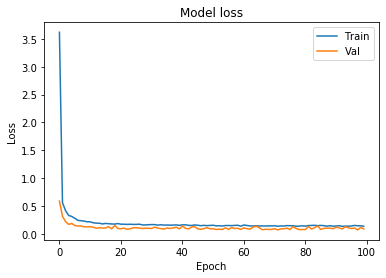

In [42]:
import matplotlib.pyplot as plt
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')
plt.show()

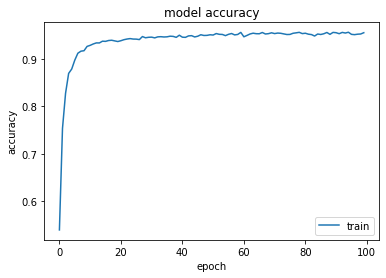

In [47]:
plt.plot(hist.history['accuracy'])
#plt.plot(hist.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()

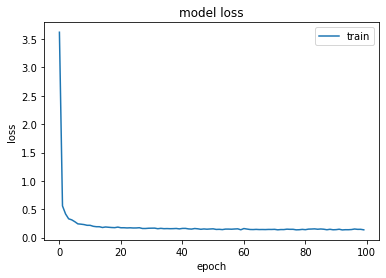

In [49]:
plt.plot(hist.history['loss'])
#plt.plot(hist.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()